In [1]:
import os
import sys
import traceback
import matplotlib.pyplot as plt
from datetime import datetime
import warnings

from scipy import signal
from scipy.stats import zscore

import numpy as np
import pandas as pd

import shutil
import mne
import keras
# from ecgdetectors import Detectors

DATA_DIR = "G:/HSTU MDD Research/cap-sleep-database-1.0.0/"
TARGET_HZ = 64
warnings.filterwarnings('ignore')

In [2]:
class DataGenerator(keras.utils.Sequence):
    def __init__(
            self, np_data_dir, list_rec_names=None, batch_sz=32, hz=64, n_channels=1, shuffle=False, log=print,
            class_map={
                "S0": 0,
                "S1": 1,
                "S2": 1,
                "S3": 1,
                "S4": 1,
                "REM": 1,
            }
    ):
        self.np_data_dir = np_data_dir
        self.list_rec_names = list_rec_names
        self.batch_sz = batch_sz
        self.hz = hz
        self.class_map = class_map
        self.n_classes = 2
        self.dim = self.hz * 30  # 30 sec @64Hz
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.log = log
        self.samples_meta = []
        self.cached_data={}

        self._init_data_dict()

    def _init_data_dict(self):
        self.log("Initialise meta data of samples")
        reached_sleep_stage_line = False
        for f in os.listdir(self.np_data_dir):
            reached_sleep_stage_line = False
            seg_count = 0
            if not f.endswith(".csv"):
                continue
            rec_name = f[:-4]
            if not rec_name in self.list_rec_names:
                continue            
            self.log(f"Loading {rec_name}...")
            sig_filepath = f"{self.np_data_dir}/{f}"
            ecg_sig = np.loadtxt(sig_filepath, delimiter=",")
            annot_filepath = sig_filepath.replace('.csv', '.txt')
            with open(annot_filepath, "r") as f:
                lines = f.readlines()
            n_seg_est = ecg_sig.shape[0]//self.dim    
            self.log(f"[{rec_name}] {ecg_sig.shape}, n_seg:{n_seg_est}")
            start = 0
            ignored_annots_bad_len, ignored_annots_bad_label = 0, 0
            self.log(f"recording:{ecg_sig.shape}")
            for line in lines:
                # print(line)
                tokens = line.split("\t")
                if not reached_sleep_stage_line and not line.startswith("Sleep Stage"):
                    continue
                if line.startswith("Sleep Stage"):
                    reached_sleep_stage_line = True
                    continue
                # Annotation starts
                try:
                    tok_is_sleep = tokens[-3]
                    if tok_is_sleep.find("SLEEP-") < 0:
                        current_epoch_len = int(tokens[-2])
                        continue
                    label_str = tok_is_sleep.split("-")[-1]
                    label = self.class_map.get(label_str)
                    current_epoch_len = int(tokens[-2])
                except:
                    self.log(f"--> error parsing epoch-len: {tokens[-2]}")
                    ignored_annots_bad_len += 1
                    continue
                if current_epoch_len != 30:  # not a valid sleep epoch
                    ignored_annots_bad_len += 1
                    self.log(f"--> bad length: {current_epoch_len}")
                    # start += (current_epoch_len*self.hz)
                    continue
                if label is None:
                    self.log(
                        f"Ignored label for label_str:{label_str}->{label} >> {line}")
                    ignored_annots_bad_label += 1
                    start += self.dim
                    continue
                end = start + self.dim
                seg = ecg_sig[start : end]
                remaining = len(ecg_sig) - end

                if len(seg) != self.dim:
                    self.log(f"bad seg_sz:{len(seg)} >> {line}")
                    start += self.dim
                    continue

                self.samples_meta.append((rec_name, start, label))    

                # update start
                start += self.dim
                seg_count += 1    

            self.log(
                f"...[{rec_name}], n_seg:{seg_count} out of {n_seg_est} (lags seg:{n_seg_est-seg_count}, "
                f"samples:{(n_seg_est-seg_count)*self.dim}), bad_label: {ignored_annots_bad_label}, bad_len/ignored: {ignored_annots_bad_len}, "
                f"remaining:{remaining}")
        self.log(f"Total sample-meta loaded: {len(self.samples_meta)}")
#         self.indexes = range(len(self.samples_meta))
        self.indexes = list(range(len(self.samples_meta)))

    def __len__(self):
        return int(np.floor(len(self.indexes) / self.batch_sz))
    
    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_sz:(index+1)*self.batch_sz]
        X, y = self.__data_generation(batch_indexes)
        return X, y
    
    def on_epoch_end(self):
        np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        X = np.empty((self.batch_sz, self.dim, self.n_channels))
        y = np.empty((self.batch_sz), dtype=int)

        # Generate data, retrieve from files
        for i, ID in enumerate(list_IDs_temp):
            self.log(f"i:{i} => {self.samples_meta[self.indexes[i]]} | ID:{ID} => {self.samples_meta[self.indexes[ID]]}")
            rec_name, seg_start, label = self.samples_meta[self.indexes[ID]]
            cached_key=rec_name+str(seg_start)
            if(self.cached_data.get(cached_key) is not None):
                segment=self.cached_data.get(cached_key)
            else:                
                # sig_filepath = os.path.join(self.data_dir, "np_data_64", f"{rec_name}.csv")
                sig_filepath = os.path.join(self.np_data_dir, f"{rec_name}.csv")
                ecg_sig = np.loadtxt(sig_filepath, delimiter=",")
                segment = ecg_sig[seg_start:seg_start+self.dim]
                segment = zscore(segment)  # normalise segment
                self.cached_data[cached_key]=segment
                
            X[i,] = segment.reshape((self.dim, 1))
            y[i] = label
        return X, keras.utils.to_categorical(y, num_classes=self.n_classes)

In [3]:
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPool1D , Flatten

In [4]:
model=Sequential()
model.add(Conv1D(input_shape=(1920,1),filters=64,kernel_size=(21),strides=(5),activation="relu"))
model.add(Conv1D(filters=64,kernel_size=(7), activation="relu"))
model.add(MaxPool1D(pool_size=(2),strides=(2)))
model.add(Conv1D(filters=128,kernel_size=(5),activation="relu"))
model.add(Conv1D(filters=128,kernel_size=(5), activation="relu"))
model.add(MaxPool1D(pool_size=(2),strides=(2)))

In [5]:
model.add(Flatten())
model.add(Dense(units=1024,activation="relu"))
model.add(Dense(units=512,activation="relu"))
model.add(Dense(units=2, activation="softmax"))

In [6]:
model.compile(optimizer="adam", loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])

In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 380, 64)           1408      
                                                                 
 conv1d_1 (Conv1D)           (None, 374, 64)           28736     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 187, 64)          0         
 )                                                               
                                                                 
 conv1d_2 (Conv1D)           (None, 183, 128)          41088     
                                                                 
 conv1d_3 (Conv1D)           (None, 179, 128)          82048     
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 89, 128)          0         
 1D)                                                    

In [8]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
names = ["n1", "n2", "n3","n5", "n6", "n7","n9", "n10", "n11","n13"]
np_data_dir="G:\HSTU MDD Research\cap-sleep-database-1.0.0/np_data_64"

def leave_ones():    
    for i in range(len(names)):
        val = names[i]
        train = names[i+1:] + names[:i]  
        
        print(val,train)
        print("==========================================================")
        checkpoint = ModelCheckpoint("vgg16_1.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
        early = EarlyStopping(monitor='val_acc', min_delta=0.001, patience=20, verbose=1, mode='auto')
        training_generator = DataGenerator(np_data_dir, list_rec_names=train)
        print("Number of batches for training generator:", len(training_generator))
        
        print("\n")
        print("==========================================================")    
        print("\n")
        validation_generator = DataGenerator(np_data_dir, list_rec_names=[val])        
        print("Number of batches for validation generator:", len(validation_generator))
        hist = model.fit_generator(steps_per_epoch=10,generator=training_generator, validation_data= validation_generator, validation_steps=5,epochs=5,callbacks=[checkpoint,early])

In [9]:
leave_ones()

n1 ['n2', 'n3', 'n5', 'n6', 'n7', 'n9', 'n10', 'n11', 'n13']
Initialise meta data of samples
Loading n10...
[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 860 (lags seg:8, samples:15360), bad_label: 0, bad_len/ignored: 0, remaining:15360
Loading n11...
[n11] (2021760,), n_seg:1053
recording:(2021760,)
...[n11], n_seg:1051 out of 1053 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3840
Loading n13...
[n13] (1944520,), n_seg:1012
recording:(1944520,)
...[n13], n_seg:952 out of 1012 (lags seg:60, samples:115200), bad_label: 0, bad_len/ignored: 0, remaining:116680
Loading n2...
[n2] (2104320,), n_seg:1096
recording:(2104320,)
...[n2], n_seg:999 out of 1096 (lags seg:97, samples:186240), bad_label: 0, bad_len/ignored: 0, remaining:186240
Loading n3...
[n3] (1921984,), n_seg:1001
recording:(1921984,)
...[n3], n_seg:999 out of 1001 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3904
Loading n5...
[n5] (1935424,), n

i:7 => ('n10', 13440, 0) | ID:3463 => ('n2', 1167360, 1)
i:8 => ('n10', 15360, 0) | ID:3464 => ('n2', 1169280, 1)
i:9 => ('n10', 17280, 0) | ID:3465 => ('n2', 1171200, 1)
i:10 => ('n10', 19200, 0) | ID:3466 => ('n2', 1173120, 1)
i:11 => ('n10', 21120, 0) | ID:3467 => ('n2', 1175040, 1)
i:12 => ('n10', 23040, 0) | ID:3468 => ('n2', 1176960, 1)
i:13 => ('n10', 24960, 0) | ID:3469 => ('n2', 1178880, 1)
i:14 => ('n10', 26880, 0) | ID:3470 => ('n2', 1180800, 1)
i:15 => ('n10', 28800, 0) | ID:3471 => ('n2', 1182720, 1)
i:16 => ('n10', 30720, 0) | ID:3472 => ('n2', 1184640, 1)
i:17 => ('n10', 32640, 0) | ID:3473 => ('n2', 1186560, 1)
i:18 => ('n10', 34560, 0) | ID:3474 => ('n2', 1188480, 1)
i:19 => ('n10', 36480, 0) | ID:3475 => ('n2', 1190400, 1)
i:20 => ('n10', 38400, 0) | ID:3476 => ('n2', 1192320, 1)
i:21 => ('n10', 40320, 0) | ID:3477 => ('n2', 1194240, 1)
i:22 => ('n10', 42240, 0) | ID:3478 => ('n2', 1196160, 1)
i:23 => ('n10', 44160, 0) | ID:3479 => ('n2', 1198080, 1)
i:24 => ('n10', 4

i:19 => ('n10', 36480, 0) | ID:339 => ('n10', 650880, 1)
i:20 => ('n10', 38400, 0) | ID:340 => ('n10', 652800, 1)
i:21 => ('n10', 40320, 0) | ID:341 => ('n10', 654720, 1)
i:22 => ('n10', 42240, 0) | ID:342 => ('n10', 656640, 1)
i:23 => ('n10', 44160, 0) | ID:343 => ('n10', 658560, 1)
i:24 => ('n10', 46080, 0) | ID:344 => ('n10', 660480, 1)
i:25 => ('n10', 48000, 0) | ID:345 => ('n10', 662400, 1)
i:26 => ('n10', 49920, 0) | ID:346 => ('n10', 664320, 1)
i:27 => ('n10', 51840, 0) | ID:347 => ('n10', 666240, 1)
i:28 => ('n10', 53760, 0) | ID:348 => ('n10', 668160, 1)
i:29 => ('n10', 55680, 0) | ID:349 => ('n10', 670080, 1)
i:30 => ('n10', 57600, 0) | ID:350 => ('n10', 672000, 1)
i:31 => ('n10', 59520, 0) | ID:351 => ('n10', 673920, 1)
i:0 => ('n10', 0, 0) | ID:7488 => ('n7', 1148160, 1)
 7/10 [====================>.........] - ETA: 1:32 - loss: 11.4609 - accuracy: 0.8571i:1 => ('n10', 1920, 0) | ID:7489 => ('n7', 1150080, 1)
i:2 => ('n10', 3840, 0) | ID:7490 => ('n7', 1152000, 1)
i:3 => ('

i:25 => ('n10', 48000, 0) | ID:2201 => ('n13', 572160, 1)
i:26 => ('n10', 49920, 0) | ID:2202 => ('n13', 574080, 1)
i:27 => ('n10', 51840, 0) | ID:2203 => ('n13', 576000, 1)
i:28 => ('n10', 53760, 0) | ID:2204 => ('n13', 577920, 1)
i:29 => ('n10', 55680, 0) | ID:2205 => ('n13', 579840, 1)
i:30 => ('n10', 57600, 0) | ID:2206 => ('n13', 581760, 1)
i:31 => ('n10', 59520, 0) | ID:2207 => ('n13', 583680, 1)
i:5 => ('n1', 9600, 0) | ID:5 => ('n1', 9600, 0)
i:6 => ('n1', 11520, 0) | ID:6 => ('n1', 11520, 0)
i:7 => ('n1', 13440, 0) | ID:7 => ('n1', 13440, 0)
i:8 => ('n1', 15360, 0) | ID:8 => ('n1', 15360, 0)
i:9 => ('n1', 17280, 0) | ID:9 => ('n1', 17280, 0)
i:10 => ('n1', 19200, 0) | ID:10 => ('n1', 19200, 0)
i:11 => ('n1', 21120, 1) | ID:11 => ('n1', 21120, 1)
i:12 => ('n1', 23040, 1) | ID:12 => ('n1', 23040, 1)
i:13 => ('n1', 24960, 1) | ID:13 => ('n1', 24960, 1)
i:14 => ('n1', 26880, 1) | ID:14 => ('n1', 26880, 1)
i:15 => ('n1', 28800, 1) | ID:15 => ('n1', 28800, 1)
i:16 => ('n1', 30720, 1

i:25 => ('n1', 48000, 1) | ID:121 => ('n1', 232320, 1)
i:26 => ('n1', 49920, 1) | ID:122 => ('n1', 234240, 1)
i:27 => ('n1', 51840, 1) | ID:123 => ('n1', 236160, 1)
i:28 => ('n1', 53760, 1) | ID:124 => ('n1', 238080, 1)
i:29 => ('n1', 55680, 1) | ID:125 => ('n1', 240000, 1)
i:30 => ('n1', 57600, 1) | ID:126 => ('n1', 241920, 1)
i:31 => ('n1', 59520, 1) | ID:127 => ('n1', 243840, 1)
i:0 => ('n1', 0, 0) | ID:128 => ('n1', 245760, 1)
i:1 => ('n1', 1920, 0) | ID:129 => ('n1', 247680, 1)
i:2 => ('n1', 3840, 0) | ID:130 => ('n1', 249600, 1)
i:3 => ('n1', 5760, 0) | ID:131 => ('n1', 251520, 1)
i:4 => ('n1', 7680, 0) | ID:132 => ('n1', 253440, 1)
i:5 => ('n1', 9600, 0) | ID:133 => ('n1', 255360, 1)
i:6 => ('n1', 11520, 0) | ID:134 => ('n1', 257280, 1)
i:7 => ('n1', 13440, 0) | ID:135 => ('n1', 259200, 1)
i:8 => ('n1', 15360, 0) | ID:136 => ('n1', 261120, 1)
i:9 => ('n1', 17280, 0) | ID:137 => ('n1', 263040, 1)
i:10 => ('n1', 19200, 0) | ID:138 => ('n1', 264960, 1)
i:11 => ('n1', 21120, 1) | ID

i:7 => ('n9', 1257600, 1) | ID:5359 => ('n10', 462720, 1)
i:8 => ('n6', 1365120, 1) | ID:1290 => ('n3', 176640, 1)
i:9 => ('n11', 1749120, 1) | ID:326 => ('n2', 1472640, 1)
i:10 => ('n2', 1029120, 1) | ID:6534 => ('n6', 23040, 0)
i:11 => ('n7', 1059840, 1) | ID:517 => ('n2', 691200, 1)
i:12 => ('n10', 176640, 1) | ID:2412 => ('n10', 289920, 1)
i:13 => ('n11', 1845120, 1) | ID:5090 => ('n7', 351360, 1)
i:14 => ('n5', 1282560, 1) | ID:4176 => ('n2', 1370880, 1)
i:15 => ('n6', 278400, 1) | ID:7102 => ('n7', 696960, 1)
i:16 => ('n13', 913920, 1) | ID:5190 => ('n5', 948480, 1)
i:17 => ('n7', 105600, 1) | ID:6213 => ('n9', 1595520, 1)
i:18 => ('n2', 481920, 1) | ID:7978 => ('n13', 489600, 1)
i:19 => ('n11', 420480, 1) | ID:7728 => ('n3', 792960, 1)
i:20 => ('n5', 1357440, 1) | ID:1905 => ('n10', 307200, 1)
i:21 => ('n9', 794880, 1) | ID:4326 => ('n11', 408960, 1)
i:22 => ('n9', 762240, 1) | ID:5378 => ('n5', 664320, 1)
i:23 => ('n5', 927360, 1) | ID:6682 => ('n2', 218880, 1)
i:24 => ('n3', 1

i:4 => ('n1', 264960, 1) | ID:138 => ('n1', 652800, 1)
i:11 => ('n7', 1059840, 1) | ID:7785 => ('n7', 885120, 1)
i:5 => ('n1', 1384320, 1) | ID:721 => ('n1', 595200, 1)
i:6 => ('n1', 827520, 1) | ID:431 => ('n1', 1192320, 1)
i:12 => ('n10', 176640, 1) | ID:3000 => ('n11', 257280, 1)
i:13 => ('n11', 1845120, 1) | ID:5900 => ('n11', 1228800, 1)
i:14 => ('n5', 1282560, 1) | ID:6806 => ('n5', 1330560, 1)
i:15 => ('n6', 278400, 1) | ID:1007 => ('n2', 658560, 1)
i:16 => ('n13', 913920, 1) | ID:3529 => ('n7', 1674240, 1)
i:17 => ('n7', 105600, 1) | ID:7191 => ('n5', 1451520, 1)
i:7 => ('n1', 241920, 1) | ID:126 => ('n1', 445440, 1)
i:18 => ('n2', 481920, 1) | ID:1516 => ('n9', 192000, 1)
i:19 => ('n11', 420480, 1) | ID:2120 => ('n7', 583680, 1)
i:20 => ('n5', 1357440, 1) | ID:3921 => ('n5', 1607040, 1)
i:21 => ('n9', 794880, 1) | ID:3347 => ('n10', 1272960, 1)
i:22 => ('n9', 762240, 1) | ID:8235 => ('n11', 1342080, 1)
i:23 => ('n5', 927360, 1) | ID:4844 => ('n11', 1009920, 1)
i:24 => ('n3', 1

i:0 => ('n1', 622080, 1) | ID:205 => ('n1', 1094400, 1)
i:1 => ('n1', 1989120, 1) | ID:998 => ('n1', 1777920, 1)
i:2 => ('n1', 205440, 1) | ID:88 => ('n1', 986880, 1)
i:3 => ('n1', 284160, 1) | ID:474 => ('n1', 101760, 1)
i:4 => ('n1', 264960, 1) | ID:291 => ('n1', 1906560, 1)
i:5 => ('n1', 1384320, 1) | ID:244 => ('n1', 1272960, 1)
i:6 => ('n1', 827520, 1) | ID:558 => ('n1', 437760, 1)
i:7 => ('n1', 241920, 1) | ID:1099 => ('n1', 1296000, 1)
i:8 => ('n1', 2184960, 0) | ID:554 => ('n1', 988800, 1)
i:9 => ('n1', 864000, 1) | ID:387 => ('n1', 1728000, 1)
i:10 => ('n1', 1401600, 1) | ID:340 => ('n1', 190080, 1)
i:11 => ('n1', 1238400, 1) | ID:47 => ('n1', 1497600, 1)
i:12 => ('n1', 971520, 1) | ID:1103 => ('n1', 472320, 0)
i:13 => ('n1', 1173120, 1) | ID:96 => ('n1', 44160, 1)
i:14 => ('n1', 1511040, 1) | ID:904 => ('n1', 1092480, 1)
i:15 => ('n1', 1006080, 1) | ID:572 => ('n1', 1584000, 1)
i:16 => ('n1', 1470720, 1) | ID:402 => ('n1', 852480, 1)
i:17 => ('n1', 61440, 1) | ID:314 => ('n1'

i:6 => ('n13', 992640, 1) | ID:2377 => ('n13', 1482240, 1)
i:7 => ('n13', 1152000, 1) | ID:2625 => ('n7', 1526400, 1)
i:8 => ('n3', 687360, 1) | ID:5600 => ('n9', 1307520, 1)
i:9 => ('n7', 1109760, 1) | ID:1707 => ('n3', 1415040, 1)
i:10 => ('n13', 401280, 1) | ID:860 => ('n3', 992640, 1)
i:11 => ('n10', 21120, 0) | ID:4979 => ('n7', 236160, 1)
i:12 => ('n11', 195840, 1) | ID:8783 => ('n13', 787200, 1)
i:13 => ('n13', 616320, 1) | ID:6599 => ('n11', 284160, 1)
i:14 => ('n11', 1125120, 1) | ID:4840 => ('n2', 1261440, 1)
i:15 => ('n9', 1209600, 1) | ID:722 => ('n6', 1178880, 1)
i:16 => ('n7', 775680, 1) | ID:4639 => ('n3', 1132800, 1)
i:17 => ('n5', 1787520, 1) | ID:3706 => ('n11', 289920, 1)
i:18 => ('n11', 220800, 1) | ID:2458 => ('n7', 455040, 1)
i:19 => ('n5', 961920, 1) | ID:1673 => ('n3', 1643520, 1)
i:20 => ('n2', 887040, 0) | ID:7564 => ('n11', 700800, 1)
i:21 => ('n10', 138240, 1) | ID:129 => ('n5', 151680, 1)
i:22 => ('n10', 823680, 1) | ID:6158 => ('n9', 339840, 1)
i:23 => ('n

i:13 => ('n13', 616320, 1) | ID:584 => ('n5', 368640, 1)
i:14 => ('n11', 1125120, 1) | ID:6541 => ('n6', 1576320, 1)
i:15 => ('n9', 1209600, 1) | ID:3010 => ('n6', 1704960, 1)
i:16 => ('n7', 775680, 1) | ID:7416 => ('n5', 935040, 1)
i:17 => ('n5', 1787520, 1) | ID:8006 => ('n7', 364800, 1)
i:18 => ('n11', 220800, 1) | ID:8079 => ('n7', 270720, 1)
i:19 => ('n5', 961920, 1) | ID:1047 => ('n5', 1518720, 1)
i:20 => ('n2', 887040, 0) | ID:7245 => ('n7', 1282560, 1)
i:21 => ('n10', 138240, 1) | ID:337 => ('n7', 1509120, 1)
i:22 => ('n10', 823680, 1) | ID:4551 => ('n13', 1426560, 1)
i:23 => ('n6', 1837440, 1) | ID:1926 => ('n3', 514560, 1)
i:24 => ('n3', 1889280, 1) | ID:4124 => ('n10', 120960, 1)
i:25 => ('n10', 1207680, 1) | ID:325 => ('n6', 144000, 1)
i:26 => ('n6', 1194240, 1) | ID:1232 => ('n9', 1046400, 1)
i:27 => ('n9', 1411200, 1) | ID:5359 => ('n10', 1576320, 1)
i:28 => ('n9', 1418880, 1) | ID:5262 => ('n7', 336000, 1)
i:29 => ('n9', 1294080, 1) | ID:5266 => ('n13', 1004160, 1)
i:30 

i:18 => ('n1', 293760, 1) | ID:153 => ('n1', 568320, 1)
i:19 => ('n1', 30720, 1) | ID:16 => ('n1', 1958400, 1)
i:20 => ('n1', 330240, 1) | ID:172 => ('n1', 485760, 1)
i:21 => ('n1', 1182720, 1) | ID:616 => ('n1', 610560, 1)
i:22 => ('n1', 2171520, 1) | ID:1131 => ('n1', 520320, 1)
i:23 => ('n1', 1580160, 1) | ID:823 => ('n1', 2002560, 1)
i:24 => ('n1', 257280, 1) | ID:134 => ('n1', 2179200, 1)
i:9 => ('n7', 1109760, 1) | ID:5169 => ('n2', 92160, 1)
i:25 => ('n1', 1497600, 1) | ID:780 => ('n1', 1729920, 1)
i:26 => ('n1', 1689600, 1) | ID:880 => ('n1', 1054080, 1)
i:27 => ('n1', 1340160, 1) | ID:698 => ('n1', 514560, 1)
i:28 => ('n1', 349440, 1) | ID:182 => ('n1', 385920, 1)
i:29 => ('n1', 1937280, 1) | ID:1009 => ('n1', 1411200, 1)
i:30 => ('n1', 823680, 1) | ID:429 => ('n1', 800640, 1)
i:31 => ('n1', 896640, 1) | ID:467 => ('n1', 1466880, 1)
i:10 => ('n13', 401280, 1) | ID:8173 => ('n3', 581760, 1)
i:0 => ('n1', 570240, 1) | ID:978 => ('n1', 796800, 1)
i:1 => ('n1', 1743360, 1) | ID:77

i:12 => ('n1', 687360, 1) | ID:604 => ('n1', 1572480, 1)
i:13 => ('n1', 839040, 1) | ID:302 => ('n1', 1825920, 1)
i:14 => ('n1', 894720, 1) | ID:432 => ('n1', 336000, 1)
i:15 => ('n1', 537600, 1) | ID:882 => ('n1', 1505280, 1)
i:16 => ('n1', 1958400, 1) | ID:482 => ('n1', 1501440, 1)
i:17 => ('n1', 355200, 1) | ID:781 => ('n1', 1317120, 1)
i:18 => ('n1', 293760, 1) | ID:51 => ('n1', 2121600, 1)
i:19 => ('n1', 30720, 1) | ID:642 => ('n1', 1858560, 0)
i:20 => ('n1', 330240, 1) | ID:853 => ('n1', 3840, 0)
i:21 => ('n1', 1182720, 1) | ID:395 => ('n1', 535680, 1)
i:22 => ('n1', 2171520, 1) | ID:672 => ('n1', 856320, 1)
i:23 => ('n1', 1580160, 1) | ID:251 => ('n1', 506880, 1)
i:24 => ('n1', 257280, 1) | ID:1031 => ('n1', 647040, 1)
i:25 => ('n1', 1497600, 1) | ID:296 => ('n1', 165120, 1)
i:26 => ('n1', 1689600, 1) | ID:257 => ('n1', 842880, 1)
i:27 => ('n1', 1340160, 1) | ID:222 => ('n1', 1697280, 1)
i:28 => ('n1', 349440, 1) | ID:1045 => ('n1', 1092480, 1)
i:29 => ('n1', 1937280, 1) | ID:10

i:18 => ('n10', 1165440, 1) | ID:6506 => ('n6', 1818240, 1)
i:19 => ('n2', 80640, 1) | ID:1873 => ('n3', 1096320, 1)
i:20 => ('n5', 1875840, 1) | ID:5053 => ('n11', 1827840, 1)
i:21 => ('n9', 193920, 1) | ID:3623 => ('n5', 144000, 1)
i:22 => ('n3', 1017600, 1) | ID:7212 => ('n6', 867840, 1)
i:23 => ('n13', 862080, 1) | ID:2411 => ('n3', 1071360, 1)
i:24 => ('n11', 792960, 1) | ID:7655 => ('n6', 272640, 1)
i:25 => ('n11', 19200, 0) | ID:5056 => ('n10', 764160, 1)
i:26 => ('n7', 1027200, 1) | ID:5235 => ('n7', 1376640, 1)
i:27 => ('n6', 1737600, 1) | ID:3801 => ('n5', 464640, 1)
i:28 => ('n5', 397440, 1) | ID:4743 => ('n2', 249600, 1)
i:29 => ('n5', 683520, 1) | ID:6156 => ('n7', 1008000, 1)
i:30 => ('n6', 975360, 1) | ID:7925 => ('n7', 1297920, 1)
i:31 => ('n7', 21120, 0) | ID:2880 => ('n13', 1336320, 0)
i:0 => ('n10', 1065600, 1) | ID:8447 => ('n7', 1017600, 1)
 3/10 [========>.....................] - ETA: 3:45 - loss: 0.2616 - accuracy: 0.9271i:1 => ('n10', 1457280, 1) | ID:4222 => ('

i:26 => ('n7', 1027200, 1) | ID:3863 => ('n6', 336000, 1)
i:27 => ('n6', 1737600, 1) | ID:2471 => ('n7', 1501440, 1)
i:28 => ('n5', 397440, 1) | ID:1920 => ('n6', 1952640, 0)
i:29 => ('n5', 683520, 1) | ID:6257 => ('n13', 562560, 1)
i:30 => ('n6', 975360, 1) | ID:6137 => ('n9', 572160, 1)
i:31 => ('n7', 21120, 0) | ID:7715 => ('n9', 1537920, 1)
i:0 => ('n10', 1065600, 1) | ID:4550 => ('n10', 1390080, 1)
 7/10 [====================>.........] - ETA: 1:36 - loss: 0.2875 - accuracy: 0.9152i:1 => ('n10', 1457280, 1) | ID:6783 => ('n2', 359040, 1)
i:2 => ('n9', 347520, 1) | ID:2268 => ('n3', 1484160, 0)
i:3 => ('n7', 1430400, 1) | ID:5641 => ('n11', 53760, 0)
i:4 => ('n2', 72960, 1) | ID:3041 => ('n11', 1537920, 1)
i:5 => ('n6', 238080, 1) | ID:589 => ('n3', 1424640, 1)
i:6 => ('n3', 286080, 1) | ID:2845 => ('n7', 704640, 1)
i:7 => ('n6', 1196160, 1) | ID:4372 => ('n9', 831360, 1)
i:8 => ('n9', 355200, 1) | ID:5749 => ('n5', 272640, 1)
i:9 => ('n7', 549120, 1) | ID:6176 => ('n2', 1645440, 1

i:22 => ('n3', 1017600, 1) | ID:3405 => ('n11', 286080, 1)
i:23 => ('n13', 862080, 1) | ID:5048 => ('n3', 1833600, 1)
i:13 => ('n1', 201600, 1) | ID:105 => ('n1', 2042880, 1)
i:14 => ('n1', 1428480, 1) | ID:744 => ('n1', 195840, 1)
i:15 => ('n1', 950400, 1) | ID:495 => ('n1', 1608960, 1)
i:24 => ('n11', 792960, 1) | ID:3182 => ('n5', 1520640, 1)
i:25 => ('n11', 19200, 0) | ID:5615 => ('n5', 554880, 1)
i:26 => ('n7', 1027200, 1) | ID:3834 => ('n11', 30720, 0)
i:27 => ('n6', 1737600, 1) | ID:5612 => ('n13', 1643520, 0)
i:28 => ('n5', 397440, 1) | ID:1548 => ('n9', 1716480, 1)
i:29 => ('n5', 683520, 1) | ID:7942 => ('n11', 1353600, 1)
i:30 => ('n6', 975360, 1) | ID:5745 => ('n9', 685440, 1)
i:16 => ('n1', 1296000, 1) | ID:675 => ('n1', 1612800, 1)
i:17 => ('n1', 1228800, 1) | ID:640 => ('n1', 1017600, 1)
i:31 => ('n7', 21120, 0) | ID:6380 => ('n2', 414720, 1)
i:18 => ('n1', 1868160, 1) | ID:973 => ('n1', 192000, 1)
i:19 => ('n1', 1426560, 1) | ID:743 => ('n1', 1011840, 1)
i:20 => ('n1', 4

i:19 => ('n1', 1426560, 1) | ID:189 => ('n1', 1816320, 1)
i:20 => ('n1', 433920, 1) | ID:1046 => ('n1', 1436160, 1)
i:21 => ('n1', 729600, 1) | ID:194 => ('n1', 55680, 1)
i:22 => ('n1', 1284480, 1) | ID:334 => ('n1', 2181120, 1)
i:23 => ('n1', 1923840, 1) | ID:750 => ('n1', 1516800, 1)
i:24 => ('n1', 1964160, 1) | ID:152 => ('n1', 291840, 1)
i:25 => ('n1', 1754880, 1) | ID:715 => ('n1', 255360, 1)
i:26 => ('n1', 1560960, 1) | ID:6 => ('n1', 1416960, 1)
i:27 => ('n1', 1255680, 1) | ID:839 => ('n1', 848640, 1)
i:28 => ('n1', 2148480, 1) | ID:963 => ('n1', 1495680, 1)
i:29 => ('n1', 1958400, 1) | ID:901 => ('n1', 1656960, 1)
i:30 => ('n1', 602880, 1) | ID:987 => ('n1', 92160, 1)
i:31 => ('n1', 556800, 1) | ID:517 => ('n1', 879360, 1)
i:0 => ('n1', 2119680, 1) | ID:771 => ('n1', 1190400, 1)
i:1 => ('n1', 1042560, 1) | ID:540 => ('n1', 1516800, 1)
i:2 => ('n1', 1246080, 1) | ID:576 => ('n1', 61440, 1)
i:3 => ('n1', 760320, 1) | ID:203 => ('n1', 2127360, 1)
i:4 => ('n1', 1758720, 1) | ID:430

i:24 => ('n3', 1482240, 0) | ID:6851 => ('n3', 762240, 1)
i:25 => ('n10', 1173120, 1) | ID:1249 => ('n11', 1914240, 1)
i:26 => ('n10', 873600, 1) | ID:5383 => ('n13', 549120, 1)
i:27 => ('n9', 1685760, 1) | ID:4666 => ('n2', 1223040, 1)
i:28 => ('n3', 850560, 1) | ID:3282 => ('n11', 744960, 1)
i:29 => ('n5', 445440, 1) | ID:500 => ('n5', 339840, 1)
i:30 => ('n10', 499200, 1) | ID:2685 => ('n2', 956160, 1)
i:31 => ('n11', 1898880, 1) | ID:5242 => ('n2', 34560, 1)
i:0 => ('n7', 1800960, 1) | ID:4759 => ('n10', 595200, 1)
i:1 => ('n5', 969600, 1) | ID:2941 => ('n6', 94080, 1)
 3/10 [========>.....................] - ETA: 3:14 - loss: 0.4033 - accuracy: 0.8542i:2 => ('n11', 1297920, 1) | ID:8268 => ('n9', 1105920, 1)
i:3 => ('n2', 1593600, 1) | ID:713 => ('n7', 687360, 1)
i:4 => ('n2', 825600, 1) | ID:4352 => ('n2', 1689600, 1)
i:5 => ('n6', 1495680, 1) | ID:3802 => ('n3', 652800, 1)
i:6 => ('n5', 1541760, 1) | ID:5638 => ('n9', 259200, 1)
i:7 => ('n9', 92160, 1) | ID:4224 => ('n3', 948480

i:31 => ('n11', 1898880, 1) | ID:1670 => ('n10', 514560, 1)
i:0 => ('n7', 1800960, 1) | ID:5697 => ('n7', 1213440, 1)
 7/10 [====================>.........] - ETA: 1:27 - loss: 0.2996 - accuracy: 0.9062i:1 => ('n5', 969600, 1) | ID:7544 => ('n2', 480000, 1)
i:2 => ('n11', 1297920, 1) | ID:1331 => ('n6', 1370880, 1)
i:3 => ('n2', 1593600, 1) | ID:4862 => ('n3', 362880, 1)
i:4 => ('n2', 825600, 1) | ID:699 => ('n5', 280320, 1)
i:5 => ('n6', 1495680, 1) | ID:2066 => ('n11', 351360, 1)
i:6 => ('n5', 1541760, 1) | ID:2485 => ('n5', 1027200, 1)
i:7 => ('n9', 92160, 1) | ID:936 => ('n13', 447360, 1)
i:8 => ('n3', 1017600, 1) | ID:8631 => ('n13', 1086720, 1)
i:9 => ('n13', 816000, 1) | ID:4526 => ('n11', 622080, 1)
i:10 => ('n2', 1324800, 1) | ID:1263 => ('n6', 1893120, 1)
i:11 => ('n9', 455040, 1) | ID:8002 => ('n3', 1415040, 1)
i:12 => ('n13', 702720, 1) | ID:4023 => ('n6', 1470720, 1)
i:13 => ('n11', 562560, 1) | ID:6131 => ('n11', 1388160, 1)
i:14 => ('n11', 1367040, 1) | ID:993 => ('n13',

i:14 => ('n11', 1367040, 1) | ID:235 => ('n11', 1772160, 1)
i:15 => ('n11', 1647360, 1) | ID:4646 => ('n6', 739200, 1)
i:29 => ('n1', 1211520, 1) | ID:631 => ('n1', 1555200, 1)
i:16 => ('n5', 1526400, 1) | ID:5431 => ('n11', 1455360, 1)
i:30 => ('n1', 2136960, 1) | ID:1113 => ('n1', 163200, 1)
i:31 => ('n1', 433920, 1) | ID:226 => ('n1', 524160, 1)
i:0 => ('n1', 78720, 1) | ID:102 => ('n1', 483840, 1)
i:17 => ('n13', 1009920, 1) | ID:3983 => ('n9', 731520, 1)
i:18 => ('n13', 1666560, 0) | ID:1277 => ('n3', 216960, 1)
i:19 => ('n5', 1205760, 1) | ID:6892 => ('n7', 259200, 1)
i:20 => ('n3', 620160, 1) | ID:2306 => ('n3', 833280, 1)
i:21 => ('n10', 1426560, 1) | ID:914 => ('n6', 1474560, 1)
i:22 => ('n10', 1200000, 1) | ID:1503 => ('n10', 610560, 1)
i:23 => ('n6', 161280, 1) | ID:3853 => ('n2', 1862400, 0)
i:24 => ('n3', 1482240, 0) | ID:5670 => ('n5', 1351680, 1)
i:1 => ('n1', 1042560, 1) | ID:222 => ('n1', 1639680, 1)
i:2 => ('n1', 1246080, 1) | ID:465 => ('n1', 1962240, 1)
i:25 => ('n1

i:28 => ('n1', 1960320, 1) | ID:623 => ('n1', 1973760, 1)
i:29 => ('n1', 1211520, 1) | ID:136 => ('n1', 1497600, 1)
i:30 => ('n1', 2136960, 1) | ID:541 => ('n1', 558720, 1)
i:31 => ('n1', 433920, 1) | ID:939 => ('n1', 610560, 1)
i:0 => ('n1', 78720, 1) | ID:402 => ('n1', 1203840, 1)
i:1 => ('n1', 1042560, 1) | ID:49 => ('n1', 852480, 1)
i:2 => ('n1', 1246080, 1) | ID:45 => ('n1', 232320, 1)
i:3 => ('n1', 760320, 1) | ID:520 => ('n1', 2019840, 1)
i:4 => ('n1', 1599360, 1) | ID:879 => ('n1', 852480, 1)
i:5 => ('n1', 1194240, 1) | ID:874 => ('n1', 109440, 1)
i:6 => ('n1', 687360, 1) | ID:420 => ('n1', 1157760, 1)
i:7 => ('n1', 1906560, 1) | ID:526 => ('n1', 345600, 1)
i:8 => ('n1', 1482240, 1) | ID:503 => ('n1', 913920, 1)
i:9 => ('n1', 752640, 1) | ID:941 => ('n1', 727680, 1)
i:10 => ('n1', 840960, 1) | ID:898 => ('n1', 693120, 1)
i:11 => ('n1', 2004480, 1) | ID:791 => ('n1', 574080, 1)
i:12 => ('n1', 1476480, 1) | ID:193 => ('n1', 844800, 1)
i:13 => ('n1', 2010240, 1) | ID:28 => ('n1', 

i:13 => ('n1', 24960, 1) | ID:6253 => ('n6', 483840, 1)
i:14 => ('n1', 26880, 1) | ID:6254 => ('n6', 485760, 1)
i:15 => ('n1', 28800, 1) | ID:6255 => ('n6', 487680, 1)
i:16 => ('n1', 30720, 1) | ID:6256 => ('n6', 489600, 1)
i:17 => ('n1', 32640, 1) | ID:6257 => ('n6', 491520, 1)
i:18 => ('n1', 34560, 1) | ID:6258 => ('n6', 493440, 1)
i:19 => ('n1', 36480, 1) | ID:6259 => ('n6', 495360, 1)
i:20 => ('n1', 38400, 1) | ID:6260 => ('n6', 497280, 1)
i:21 => ('n1', 40320, 1) | ID:6261 => ('n6', 499200, 1)
i:22 => ('n1', 42240, 1) | ID:6262 => ('n6', 501120, 1)
i:23 => ('n1', 44160, 1) | ID:6263 => ('n6', 503040, 1)
i:24 => ('n1', 46080, 1) | ID:6264 => ('n6', 504960, 1)
i:25 => ('n1', 48000, 1) | ID:6265 => ('n6', 506880, 1)
i:26 => ('n1', 49920, 1) | ID:6266 => ('n6', 508800, 1)
i:27 => ('n1', 51840, 1) | ID:6267 => ('n6', 510720, 1)
i:28 => ('n1', 53760, 1) | ID:6268 => ('n6', 512640, 1)
i:29 => ('n1', 55680, 1) | ID:6269 => ('n6', 514560, 1)
i:30 => ('n1', 57600, 1) | ID:6270 => ('n6', 516

i:26 => ('n1', 49920, 1) | ID:3546 => ('n13', 965760, 1)
i:27 => ('n1', 51840, 1) | ID:3547 => ('n13', 967680, 1)
i:28 => ('n1', 53760, 1) | ID:3548 => ('n13', 969600, 1)
i:29 => ('n1', 55680, 1) | ID:3549 => ('n13', 971520, 1)
i:30 => ('n1', 57600, 1) | ID:3550 => ('n13', 973440, 1)
i:31 => ('n1', 59520, 1) | ID:3551 => ('n13', 975360, 1)
i:0 => ('n1', 0, 0) | ID:8736 => ('n9', 1403520, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1819 - accuracy: 0.9594 i:0 => ('n2', 0, 0) | ID:0 => ('n2', 0, 0)
i:1 => ('n2', 1920, 0) | ID:1 => ('n2', 1920, 0)
i:2 => ('n2', 3840, 0) | ID:2 => ('n2', 3840, 0)
i:1 => ('n1', 1920, 0) | ID:8737 => ('n9', 1405440, 1)
i:3 => ('n2', 5760, 0) | ID:3 => ('n2', 5760, 0)
i:4 => ('n2', 7680, 0) | ID:4 => ('n2', 7680, 0)
i:5 => ('n2', 9600, 0) | ID:5 => ('n2', 9600, 0)
i:6 => ('n2', 11520, 0) | ID:6 => ('n2', 11520, 0)
i:7 => ('n2', 13440, 0) | ID:7 => ('n2', 13440, 0)
i:8 => ('n2', 15360, 1) | ID:8 => ('n2', 15360, 1)
i:9 => ('n2', 17280, 1) | I

i:19 => ('n2', 36480, 1) | ID:83 => ('n2', 159360, 1)
i:20 => ('n2', 38400, 1) | ID:84 => ('n2', 161280, 1)
i:21 => ('n2', 40320, 1) | ID:85 => ('n2', 163200, 1)
i:22 => ('n2', 42240, 1) | ID:86 => ('n2', 165120, 1)
i:23 => ('n2', 44160, 1) | ID:87 => ('n2', 167040, 1)
i:24 => ('n2', 46080, 1) | ID:88 => ('n2', 168960, 1)
i:25 => ('n2', 48000, 1) | ID:89 => ('n2', 170880, 1)
i:26 => ('n2', 49920, 1) | ID:90 => ('n2', 172800, 1)
i:27 => ('n2', 51840, 1) | ID:91 => ('n2', 174720, 1)
i:28 => ('n2', 53760, 1) | ID:92 => ('n2', 176640, 1)
i:29 => ('n2', 55680, 1) | ID:93 => ('n2', 178560, 1)
i:30 => ('n2', 57600, 1) | ID:94 => ('n2', 180480, 1)
i:31 => ('n2', 59520, 0) | ID:95 => ('n2', 182400, 1)
i:0 => ('n2', 0, 0) | ID:96 => ('n2', 184320, 1)
i:1 => ('n2', 1920, 0) | ID:97 => ('n2', 186240, 1)
i:2 => ('n2', 3840, 0) | ID:98 => ('n2', 188160, 1)
i:3 => ('n2', 5760, 0) | ID:99 => ('n2', 190080, 1)
i:4 => ('n2', 7680, 0) | ID:100 => ('n2', 192000, 1)
i:5 => ('n2', 9600, 0) | ID:101 => ('n2'

i:0 => ('n9', 1006080, 1) | ID:899 => ('n5', 278400, 1)
 1/10 [==>...........................] - ETA: 5:06 - loss: 0.1297 - accuracy: 0.9688i:1 => ('n11', 1693440, 1) | ID:2722 => ('n11', 1088640, 1)
i:2 => ('n9', 940800, 1) | ID:740 => ('n7', 1695360, 1)
i:3 => ('n11', 172800, 1) | ID:4651 => ('n3', 111360, 1)
i:4 => ('n5', 1509120, 1) | ID:1310 => ('n3', 1637760, 1)
i:5 => ('n3', 808320, 1) | ID:7753 => ('n7', 610560, 1)
i:6 => ('n9', 192000, 1) | ID:1836 => ('n5', 1353600, 1)
i:7 => ('n13', 1146240, 1) | ID:2953 => ('n5', 689280, 1)
i:8 => ('n13', 218880, 1) | ID:8228 => ('n6', 975360, 1)
i:9 => ('n13', 587520, 1) | ID:2464 => ('n9', 950400, 1)
i:10 => ('n5', 1184640, 1) | ID:3228 => ('n9', 1480320, 1)
i:11 => ('n3', 1224960, 1) | ID:5007 => ('n9', 1113600, 1)
i:12 => ('n11', 858240, 1) | ID:859 => ('n1', 791040, 1)
i:13 => ('n10', 195840, 1) | ID:3701 => ('n7', 441600, 1)
i:14 => ('n1', 2012160, 1) | ID:7422 => ('n3', 1226880, 1)
i:15 => ('n1', 1182720, 1) | ID:1356 => ('n6', 11904

i:6 => ('n9', 192000, 1) | ID:4018 => ('n5', 1029120, 1)
i:7 => ('n13', 1146240, 1) | ID:7984 => ('n13', 245760, 1)
i:8 => ('n13', 218880, 1) | ID:2189 => ('n11', 599040, 1)
i:9 => ('n13', 587520, 1) | ID:6462 => ('n13', 1251840, 0)
i:10 => ('n5', 1184640, 1) | ID:4805 => ('n11', 1879680, 1)
i:11 => ('n3', 1224960, 1) | ID:6364 => ('n1', 840960, 1)
i:12 => ('n11', 858240, 1) | ID:5022 => ('n11', 1712640, 1)
i:13 => ('n10', 195840, 1) | ID:8331 => ('n5', 257280, 1)
i:14 => ('n1', 2012160, 1) | ID:736 => ('n1', 215040, 1)
i:15 => ('n1', 1182720, 1) | ID:8155 => ('n7', 1568640, 1)
i:16 => ('n7', 691200, 1) | ID:7311 => ('n10', 0, 0)
i:17 => ('n13', 1413120, 1) | ID:4686 => ('n10', 460800, 1)
i:18 => ('n11', 1415040, 1) | ID:3015 => ('n6', 209280, 1)
i:19 => ('n11', 506880, 1) | ID:3756 => ('n3', 59520, 1)
i:20 => ('n11', 1825920, 1) | ID:2739 => ('n13', 912000, 1)
i:21 => ('n6', 1200000, 1) | ID:7142 => ('n6', 476160, 1)
i:22 => ('n6', 1920000, 1) | ID:8851 => ('n1', 890880, 1)
i:23 => ('

i:13 => ('n10', 195840, 1) | ID:832 => ('n13', 823680, 1)
i:14 => ('n1', 2012160, 1) | ID:7728 => ('n11', 792960, 1)
i:15 => ('n1', 1182720, 1) | ID:4183 => ('n1', 1271040, 1)
i:16 => ('n7', 691200, 1) | ID:7647 => ('n10', 1593600, 1)
i:17 => ('n13', 1413120, 1) | ID:2163 => ('n3', 1440000, 1)
i:18 => ('n11', 1415040, 1) | ID:1531 => ('n6', 1522560, 1)
i:19 => ('n11', 506880, 1) | ID:2100 => ('n7', 1758720, 1)
i:20 => ('n11', 1825920, 1) | ID:1354 => ('n3', 464640, 1)
i:21 => ('n6', 1200000, 1) | ID:6744 => ('n7', 433920, 1)
i:22 => ('n6', 1920000, 1) | ID:6106 => ('n3', 1751040, 0)
i:23 => ('n13', 1474560, 1) | ID:2908 => ('n1', 478080, 1)
i:24 => ('n1', 1503360, 1) | ID:3905 => ('n11', 944640, 1)
i:25 => ('n1', 839040, 1) | ID:5544 => ('n11', 898560, 1)
i:26 => ('n9', 1610880, 1) | ID:129 => ('n3', 1434240, 1)
i:27 => ('n10', 508800, 1) | ID:1658 => ('n11', 1601280, 1)
i:28 => ('n7', 656640, 1) | ID:2450 => ('n10', 1434240, 1)
i:29 => ('n13', 1096320, 1) | ID:5933 => ('n7', 633600, 1

i:27 => ('n2', 1299840, 1) | ID:687 => ('n2', 1693440, 1)
i:28 => ('n2', 1008000, 1) | ID:270 => ('n2', 1004160, 1)
i:29 => ('n2', 1772160, 1) | ID:88 => ('n2', 1530240, 1)
i:30 => ('n2', 399360, 1) | ID:232 => ('n2', 1466880, 1)
i:31 => ('n2', 124800, 1) | ID:963 => ('n2', 1436160, 1)
i:0 => ('n2', 1440000, 1) | ID:762 => ('n2', 1430400, 1)
i:1 => ('n2', 1628160, 0) | ID:150 => ('n2', 347520, 1)
i:2 => ('n2', 32640, 1) | ID:555 => ('n2', 51840, 1)
i:3 => ('n2', 739200, 1) | ID:755 => ('n2', 1610880, 1)
i:4 => ('n2', 1831680, 0) | ID:801 => ('n2', 1320960, 1)
i:5 => ('n2', 443520, 1) | ID:344 => ('n2', 1357440, 1)
i:6 => ('n2', 462720, 1) | ID:976 => ('n2', 1470720, 1)
i:7 => ('n2', 82560, 1) | ID:146 => ('n2', 1658880, 1)
i:8 => ('n2', 516480, 1) | ID:130 => ('n2', 996480, 1)
i:9 => ('n2', 1495680, 1) | ID:588 => ('n2', 1044480, 1)
i:10 => ('n2', 1597440, 1) | ID:212 => ('n2', 1401600, 1)
i:11 => ('n2', 1870080, 0) | ID:317 => ('n2', 282240, 1)
i:12 => ('n2', 850560, 0) | ID:510 => ('

i:4 => ('n11', 729600, 1) | ID:4711 => ('n1', 228480, 1)
i:5 => ('n1', 952320, 1) | ID:4444 => ('n6', 1852800, 1)
i:6 => ('n13', 1200000, 0) | ID:5072 => ('n9', 1136640, 1)
i:7 => ('n1', 1630080, 1) | ID:6866 => ('n6', 1449600, 1)
i:8 => ('n7', 645120, 1) | ID:3537 => ('n11', 128640, 1)
i:9 => ('n10', 168960, 1) | ID:1879 => ('n1', 15360, 0)
i:10 => ('n7', 86400, 1) | ID:8653 => ('n3', 82560, 1)
i:11 => ('n1', 362880, 1) | ID:3272 => ('n13', 1159680, 0)
i:12 => ('n13', 733440, 1) | ID:5107 => ('n1', 1931520, 1)
i:13 => ('n6', 42240, 0) | ID:5233 => ('n9', 787200, 1)
i:14 => ('n1', 896640, 1) | ID:4024 => ('n9', 835200, 1)
i:15 => ('n6', 1912320, 1) | ID:3189 => ('n10', 1541760, 1)
i:16 => ('n3', 1887360, 1) | ID:1883 => ('n10', 1536000, 1)
i:17 => ('n11', 1121280, 1) | ID:8940 => ('n5', 1847040, 1)
i:18 => ('n13', 264960, 1) | ID:387 => ('n6', 1580160, 1)
i:19 => ('n11', 1307520, 1) | ID:2666 => ('n5', 67200, 1)
i:20 => ('n7', 382080, 1) | ID:3025 => ('n7', 1712640, 1)
i:21 => ('n9', 1

i:12 => ('n13', 733440, 1) | ID:2762 => ('n11', 247680, 1)
i:13 => ('n6', 42240, 0) | ID:3746 => ('n3', 1217280, 1)
i:14 => ('n1', 896640, 1) | ID:6299 => ('n9', 1146240, 1)
i:15 => ('n6', 1912320, 1) | ID:2135 => ('n5', 994560, 1)
i:16 => ('n3', 1887360, 1) | ID:4487 => ('n7', 188160, 1)
i:17 => ('n11', 1121280, 1) | ID:5682 => ('n7', 547200, 1)
i:18 => ('n13', 264960, 1) | ID:4310 => ('n11', 226560, 1)
i:19 => ('n11', 1307520, 1) | ID:6743 => ('n13', 1161600, 0)
i:20 => ('n7', 382080, 1) | ID:5407 => ('n6', 1562880, 1)
i:21 => ('n9', 1568640, 1) | ID:2773 => ('n10', 1595520, 1)
i:22 => ('n1', 856320, 1) | ID:5479 => ('n10', 1491840, 1)
i:23 => ('n6', 904320, 1) | ID:1288 => ('n3', 1142400, 1)
i:24 => ('n11', 1171200, 1) | ID:4824 => ('n5', 604800, 1)
i:25 => ('n1', 28800, 1) | ID:5929 => ('n10', 948480, 1)
i:26 => ('n10', 1336320, 1) | ID:7722 => ('n3', 539520, 1)
i:27 => ('n5', 295680, 1) | ID:2960 => ('n11', 718080, 1)
i:28 => ('n6', 161280, 1) | ID:7389 => ('n13', 1804800, 1)
i:29

i:21 => ('n9', 1568640, 1) | ID:5587 => ('n1', 2031360, 1)
i:22 => ('n1', 856320, 1) | ID:6391 => ('n11', 97920, 0)
i:23 => ('n6', 904320, 1) | ID:6318 => ('n10', 460800, 1)
i:24 => ('n11', 1171200, 1) | ID:1751 => ('n11', 1440000, 1)
i:25 => ('n1', 28800, 1) | ID:7932 => ('n3', 1380480, 1)
i:26 => ('n10', 1336320, 1) | ID:4707 => ('n9', 950400, 1)
i:27 => ('n5', 295680, 1) | ID:1588 => ('n6', 1845120, 1)
i:28 => ('n6', 161280, 1) | ID:7498 => ('n11', 622080, 1)
i:29 => ('n9', 1290240, 1) | ID:2400 => ('n11', 518400, 1)
i:30 => ('n6', 1850880, 1) | ID:2075 => ('n1', 819840, 1)
i:31 => ('n7', 1019520, 1) | ID:7424 => ('n11', 1787520, 1)
i:0 => ('n6', 38400, 0) | ID:8186 => ('n1', 994560, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.9219 i:0 => ('n2', 712320, 1) | ID:371 => ('n2', 1027200, 1)
i:1 => ('n11', 1449600, 1) | ID:1812 => ('n6', 1931520, 1)
i:2 => ('n10', 28800, 0) | ID:7887 => ('n13', 775680, 1)
i:3 => ('n5', 349440, 1) | ID:9018 => ('n1', 1

i:5 => ('n2', 480000, 1) | ID:935 => ('n2', 1910400, 0)
i:6 => ('n2', 1881600, 0) | ID:985 => ('n2', 904320, 1)
i:7 => ('n2', 873600, 1) | ID:483 => ('n2', 881280, 0)
i:8 => ('n2', 113280, 1) | ID:290 => ('n2', 1271040, 0)
i:9 => ('n2', 541440, 1) | ID:909 => ('n2', 760320, 1)
i:10 => ('n2', 1397760, 1) | ID:537 => ('n2', 1812480, 0)
i:11 => ('n2', 324480, 1) | ID:801 => ('n2', 618240, 1)
i:12 => ('n2', 566400, 0) | ID:72 => ('n2', 1015680, 1)
i:13 => ('n2', 192000, 1) | ID:769 => ('n2', 1432320, 1)
i:14 => ('n2', 1050240, 1) | ID:46 => ('n2', 1128960, 1)
i:15 => ('n2', 80640, 1) | ID:723 => ('n2', 203520, 1)
i:16 => ('n2', 32640, 1) | ID:475 => ('n2', 316800, 1)
i:17 => ('n2', 1875840, 0) | ID:211 => ('n2', 13440, 0)
i:18 => ('n2', 410880, 1) | ID:949 => ('n2', 1019520, 1)
i:19 => ('n2', 648960, 1) | ID:67 => ('n2', 1643520, 1)
i:20 => ('n2', 124800, 1) | ID:930 => ('n2', 24960, 1)
i:21 => ('n2', 1056000, 1) | ID:293 => ('n2', 679680, 1)
i:22 => ('n2', 1301760, 1) | ID:843 => ('n2', 7

i:14 => ('n7', 261120, 1) | ID:2509 => ('n7', 645120, 1)
i:15 => ('n10', 1054080, 1) | ID:4804 => ('n10', 1451520, 1)
i:16 => ('n11', 1109760, 1) | ID:7717 => ('n9', 1622400, 1)
i:17 => ('n6', 211200, 1) | ID:8150 => ('n3', 666240, 1)
i:18 => ('n10', 220800, 1) | ID:3215 => ('n9', 875520, 1)
i:19 => ('n13', 1503360, 1) | ID:3390 => ('n9', 1539840, 1)
i:20 => ('n1', 1881600, 1) | ID:1514 => ('n7', 1299840, 1)
i:21 => ('n7', 1311360, 1) | ID:8525 => ('n7', 504960, 1)
i:22 => ('n13', 301440, 1) | ID:5151 => ('n6', 489600, 1)
i:23 => ('n7', 1835520, 0) | ID:5435 => ('n6', 1912320, 1)
i:24 => ('n11', 257280, 1) | ID:8625 => ('n3', 57600, 1)
i:25 => ('n7', 522240, 1) | ID:7625 => ('n3', 1656960, 1)
i:26 => ('n1', 1488000, 0) | ID:2486 => ('n3', 1607040, 1)
i:27 => ('n9', 1196160, 1) | ID:307 => ('n5', 1392000, 1)
i:28 => ('n11', 910080, 1) | ID:1852 => ('n7', 364800, 1)
i:29 => ('n7', 576000, 1) | ID:8593 => ('n5', 205440, 1)
i:30 => ('n1', 1954560, 1) | ID:1803 => ('n13', 391680, 1)
i:31 =>

i:22 => ('n13', 301440, 1) | ID:7744 => ('n5', 63360, 1)
i:23 => ('n7', 1835520, 0) | ID:5869 => ('n5', 69120, 1)
i:24 => ('n11', 257280, 1) | ID:8483 => ('n6', 1059840, 1)
i:25 => ('n7', 522240, 1) | ID:478 => ('n5', 432000, 1)
i:26 => ('n1', 1488000, 0) | ID:556 => ('n10', 762240, 1)
i:27 => ('n9', 1196160, 1) | ID:5231 => ('n6', 574080, 1)
i:28 => ('n11', 910080, 1) | ID:8706 => ('n5', 1109760, 1)
i:29 => ('n7', 576000, 1) | ID:7996 => ('n9', 1194240, 1)
i:30 => ('n1', 1954560, 1) | ID:4475 => ('n11', 1380480, 1)
i:31 => ('n3', 289920, 1) | ID:4977 => ('n6', 1184640, 1)
i:0 => ('n3', 176640, 1) | ID:157 => ('n1', 1683840, 1)
 6/10 [=================>............] - ETA: 2:05 - loss: 0.2970 - accuracy: 0.9115i:1 => ('n9', 660480, 1) | ID:4123 => ('n5', 618240, 1)
i:2 => ('n3', 1130880, 1) | ID:2707 => ('n1', 339840, 1)
i:3 => ('n7', 1714560, 1) | ID:8672 => ('n13', 1161600, 0)
i:4 => ('n13', 428160, 1) | ID:3304 => ('n5', 568320, 1)
i:5 => ('n11', 981120, 1) | ID:7989 => ('n1', 80640

i:30 => ('n1', 1954560, 1) | ID:4862 => ('n13', 1082880, 1)
i:31 => ('n3', 289920, 1) | ID:1712 => ('n6', 1647360, 1)
i:0 => ('n3', 176640, 1) | ID:1584 => ('n10', 1259520, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2997 - accuracy: 0.9125 i:0 => ('n2', 796800, 1) | ID:415 => ('n2', 182400, 1)
i:1 => ('n2', 1390080, 1) | ID:724 => ('n2', 44160, 1)
i:2 => ('n2', 1906560, 0) | ID:993 => ('n2', 1322880, 1)
i:3 => ('n2', 1845120, 0) | ID:961 => ('n2', 1572480, 1)
i:4 => ('n2', 1787520, 1) | ID:931 => ('n2', 1488000, 1)
i:5 => ('n2', 698880, 1) | ID:364 => ('n2', 733440, 1)
i:6 => ('n2', 1612800, 1) | ID:840 => ('n2', 1833600, 0)
i:7 => ('n2', 1520640, 1) | ID:792 => ('n2', 151680, 1)
i:8 => ('n2', 693120, 1) | ID:361 => ('n2', 1893120, 0)
i:9 => ('n2', 695040, 1) | ID:362 => ('n2', 1424640, 1)
i:1 => ('n9', 660480, 1) | ID:5941 => ('n13', 1401600, 1)
i:10 => ('n2', 368640, 1) | ID:192 => ('n2', 1489920, 1)
i:2 => ('n3', 1130880, 1) | ID:4853 => ('n1', 1591680, 1)
i:3 => 

i:13 => ('n2', 1440000, 1) | ID:718 => ('n2', 896640, 1)
i:14 => ('n2', 1687680, 1) | ID:661 => ('n2', 330240, 1)
i:15 => ('n2', 1365120, 1) | ID:252 => ('n2', 1297920, 1)
i:16 => ('n2', 1347840, 1) | ID:925 => ('n2', 526080, 1)
i:17 => ('n2', 1132800, 1) | ID:795 => ('n2', 1236480, 1)
i:18 => ('n2', 862080, 1) | ID:787 => ('n2', 1760640, 1)
i:19 => ('n2', 1313280, 1) | ID:734 => ('n2', 1434240, 1)
i:20 => ('n2', 668160, 1) | ID:736 => ('n2', 1582080, 1)
i:21 => ('n2', 1718400, 1) | ID:424 => ('n2', 115200, 1)
i:22 => ('n2', 355200, 1) | ID:139 => ('n2', 168960, 1)
i:23 => ('n2', 174720, 1) | ID:458 => ('n2', 1320960, 1)
i:24 => ('n2', 341760, 1) | ID:784 => ('n2', 1163520, 1)
i:25 => ('n2', 347520, 1) | ID:588 => ('n2', 82560, 1)
i:26 => ('n2', 359040, 1) | ID:65 => ('n2', 264960, 1)
i:27 => ('n2', 180480, 1) | ID:562 => ('n2', 1240320, 1)
i:28 => ('n2', 449280, 1) | ID:715 => ('n2', 1326720, 1)
i:29 => ('n2', 1019520, 1) | ID:207 => ('n2', 414720, 1)
i:30 => ('n2', 1850880, 0) | ID:2

i:21 => ('n3', 359040, 1) | ID:4988 => ('n10', 1430400, 1)
i:22 => ('n13', 299520, 1) | ID:2406 => ('n7', 334080, 1)
i:23 => ('n9', 721920, 1) | ID:610 => ('n6', 376320, 1)
i:24 => ('n3', 787200, 1) | ID:4456 => ('n3', 881280, 0)
i:25 => ('n13', 422400, 1) | ID:2579 => ('n3', 1756800, 1)
i:26 => ('n6', 1384320, 1) | ID:7914 => ('n9', 1839360, 1)
i:27 => ('n3', 36480, 1) | ID:7997 => ('n1', 1808640, 1)
i:28 => ('n7', 637440, 1) | ID:3481 => ('n3', 1570560, 1)
i:29 => ('n7', 796800, 1) | ID:7448 => ('n13', 1580160, 0)
i:30 => ('n9', 230400, 1) | ID:3597 => ('n11', 777600, 1)
i:31 => ('n1', 1447680, 1) | ID:4700 => ('n9', 975360, 1)
i:0 => ('n6', 1522560, 1) | ID:2774 => ('n3', 520320, 1)
i:1 => ('n5', 1242240, 1) | ID:8020 => ('n10', 86400, 0)
 2/10 [=====>........................] - ETA: 4:28 - loss: 0.3543 - accuracy: 0.8594i:2 => ('n1', 627840, 1) | ID:1845 => ('n5', 1376640, 1)
i:3 => ('n11', 399360, 1) | ID:7998 => ('n3', 1835520, 1)
i:4 => ('n11', 188160, 1) | ID:1247 => ('n9', 307

i:29 => ('n7', 796800, 1) | ID:3656 => ('n1', 1518720, 1)
i:30 => ('n9', 230400, 1) | ID:6571 => ('n10', 174720, 1)
i:31 => ('n1', 1447680, 1) | ID:3000 => ('n3', 1511040, 1)
i:0 => ('n6', 1522560, 1) | ID:7726 => ('n10', 904320, 1)
 6/10 [=================>............] - ETA: 2:15 - loss: 0.3136 - accuracy: 0.8906i:1 => ('n5', 1242240, 1) | ID:3209 => ('n6', 1568640, 1)
i:2 => ('n1', 627840, 1) | ID:5876 => ('n1', 445440, 1)
i:3 => ('n11', 399360, 1) | ID:2963 => ('n7', 1294080, 1)
i:4 => ('n11', 188160, 1) | ID:816 => ('n9', 720000, 1)
i:5 => ('n11', 1361280, 1) | ID:7916 => ('n13', 1042560, 1)
i:6 => ('n3', 1829760, 1) | ID:8348 => ('n3', 1920, 0)
i:7 => ('n7', 295680, 1) | ID:5158 => ('n13', 672000, 1)
i:8 => ('n9', 994560, 1) | ID:3305 => ('n10', 322560, 1)
i:9 => ('n6', 1870080, 1) | ID:3705 => ('n9', 1854720, 1)
i:10 => ('n6', 1386240, 1) | ID:7799 => ('n7', 303360, 1)
i:11 => ('n11', 1449600, 1) | ID:8969 => ('n13', 487680, 1)
i:12 => ('n3', 222720, 1) | ID:2924 => ('n6', 1347

i:21 => ('n2', 769920, 1) | ID:770 => ('n2', 794880, 1)
i:22 => ('n2', 232320, 1) | ID:153 => ('n2', 1445760, 1)
i:23 => ('n2', 1666560, 1) | ID:934 => ('n2', 1067520, 1)
i:24 => ('n2', 752640, 1) | ID:173 => ('n2', 984960, 1)
i:25 => ('n2', 695040, 1) | ID:608 => ('n2', 1368960, 1)
i:26 => ('n2', 1142400, 1) | ID:524 => ('n2', 1872000, 0)
i:27 => ('n2', 405120, 1) | ID:807 => ('n2', 115200, 1)
i:28 => ('n2', 1616640, 1) | ID:828 => ('n2', 0, 0)
i:29 => ('n2', 986880, 1) | ID:778 => ('n2', 360960, 1)
i:30 => ('n2', 1781760, 1) | ID:692 => ('n2', 1102080, 1)
i:31 => ('n2', 493440, 1) | ID:561 => ('n2', 136320, 1)
i:0 => ('n2', 1689600, 1) | ID:270 => ('n2', 902400, 1)
i:1 => ('n2', 71040, 1) | ID:337 => ('n2', 311040, 1)
i:2 => ('n2', 1712640, 1) | ID:138 => ('n2', 522240, 1)
i:3 => ('n2', 1146240, 1) | ID:33 => ('n2', 378240, 1)
i:4 => ('n2', 324480, 1) | ID:914 => ('n2', 698880, 1)
i:5 => ('n2', 1390080, 1) | ID:945 => ('n2', 917760, 1)
i:6 => ('n2', 1282560, 0) | ID:518 => ('n2', 537

i:26 => ('n1', 49920, 1) | ID:26 => ('n1', 49920, 1)
i:27 => ('n1', 51840, 1) | ID:27 => ('n1', 51840, 1)
i:28 => ('n1', 53760, 1) | ID:28 => ('n1', 53760, 1)
i:29 => ('n1', 55680, 1) | ID:29 => ('n1', 55680, 1)
i:30 => ('n1', 57600, 1) | ID:30 => ('n1', 57600, 1)
i:31 => ('n1', 59520, 1) | ID:31 => ('n1', 59520, 1)
Epoch 1/5
i:0 => ('n1', 0, 0) | ID:4032 => ('n2', 71040, 1)
i:1 => ('n1', 1920, 0) | ID:4033 => ('n2', 72960, 1)
i:2 => ('n1', 3840, 0) | ID:4034 => ('n2', 74880, 1)
i:3 => ('n1', 5760, 0) | ID:4035 => ('n2', 76800, 1)
i:4 => ('n1', 7680, 0) | ID:4036 => ('n2', 78720, 1)
i:5 => ('n1', 9600, 0) | ID:4037 => ('n2', 80640, 1)
i:6 => ('n1', 11520, 0) | ID:4038 => ('n2', 82560, 1)
i:7 => ('n1', 13440, 0) | ID:4039 => ('n2', 84480, 1)
i:8 => ('n1', 15360, 0) | ID:4040 => ('n2', 86400, 1)
i:9 => ('n1', 17280, 0) | ID:4041 => ('n2', 88320, 1)
i:10 => ('n1', 19200, 0) | ID:4042 => ('n2', 90240, 1)
i:11 => ('n1', 21120, 1) | ID:4043 => ('n2', 92160, 1)
i:12 => ('n1', 23040, 1) | ID:4

i:9 => ('n1', 17280, 0) | ID:2025 => ('n11', 63360, 0)
i:10 => ('n1', 19200, 0) | ID:2026 => ('n11', 65280, 0)
i:11 => ('n1', 21120, 1) | ID:2027 => ('n11', 67200, 0)
i:12 => ('n1', 23040, 1) | ID:2028 => ('n11', 69120, 1)
i:13 => ('n1', 24960, 1) | ID:2029 => ('n11', 71040, 1)
i:14 => ('n1', 26880, 1) | ID:2030 => ('n11', 72960, 1)
i:15 => ('n1', 28800, 1) | ID:2031 => ('n11', 74880, 1)
i:16 => ('n1', 30720, 1) | ID:2032 => ('n11', 76800, 0)
i:17 => ('n1', 32640, 1) | ID:2033 => ('n11', 78720, 0)
i:18 => ('n1', 34560, 1) | ID:2034 => ('n11', 80640, 0)
i:19 => ('n1', 36480, 1) | ID:2035 => ('n11', 82560, 0)
i:20 => ('n1', 38400, 1) | ID:2036 => ('n11', 84480, 0)
i:21 => ('n1', 40320, 1) | ID:2037 => ('n11', 86400, 0)
i:22 => ('n1', 42240, 1) | ID:2038 => ('n11', 88320, 0)
i:23 => ('n1', 44160, 1) | ID:2039 => ('n11', 90240, 0)
i:24 => ('n1', 46080, 1) | ID:2040 => ('n11', 92160, 0)
i:25 => ('n1', 48000, 1) | ID:2041 => ('n11', 94080, 0)
i:26 => ('n1', 49920, 1) | ID:2042 => ('n11', 960

i:21 => ('n1', 40320, 1) | ID:6261 => ('n6', 499200, 1)
i:22 => ('n1', 42240, 1) | ID:6262 => ('n6', 501120, 1)
i:23 => ('n1', 44160, 1) | ID:6263 => ('n6', 503040, 1)
i:24 => ('n1', 46080, 1) | ID:6264 => ('n6', 504960, 1)
i:25 => ('n1', 48000, 1) | ID:6265 => ('n6', 506880, 1)
i:26 => ('n1', 49920, 1) | ID:6266 => ('n6', 508800, 1)
i:27 => ('n1', 51840, 1) | ID:6267 => ('n6', 510720, 1)
i:28 => ('n1', 53760, 1) | ID:6268 => ('n6', 512640, 1)
i:29 => ('n1', 55680, 1) | ID:6269 => ('n6', 514560, 1)
i:30 => ('n1', 57600, 1) | ID:6270 => ('n6', 516480, 1)
i:31 => ('n1', 59520, 1) | ID:6271 => ('n6', 518400, 1)
i:0 => ('n1', 0, 0) | ID:8832 => ('n9', 1587840, 1)
 9/10 [==========================>...] - ETA: 37s - loss: 0.3688 - accuracy: 0.9028 i:1 => ('n1', 1920, 0) | ID:8833 => ('n9', 1589760, 1)
i:2 => ('n1', 3840, 0) | ID:8834 => ('n9', 1591680, 1)
i:3 => ('n1', 5760, 0) | ID:8835 => ('n9', 1593600, 1)
i:4 => ('n1', 7680, 0) | ID:8836 => ('n9', 1595520, 1)
i:5 => ('n1', 9600, 0) | ID:

i:11 => ('n3', 21120, 0) | ID:43 => ('n3', 82560, 1)
i:12 => ('n3', 23040, 0) | ID:44 => ('n3', 84480, 1)
i:13 => ('n3', 24960, 0) | ID:45 => ('n3', 86400, 1)
i:14 => ('n3', 26880, 0) | ID:46 => ('n3', 88320, 1)
i:15 => ('n3', 28800, 0) | ID:47 => ('n3', 90240, 1)
i:16 => ('n3', 30720, 0) | ID:48 => ('n3', 92160, 1)
i:17 => ('n3', 32640, 1) | ID:49 => ('n3', 94080, 1)
i:18 => ('n3', 34560, 1) | ID:50 => ('n3', 96000, 1)
i:19 => ('n3', 36480, 1) | ID:51 => ('n3', 97920, 1)
i:20 => ('n3', 38400, 1) | ID:52 => ('n3', 99840, 1)
i:21 => ('n3', 40320, 1) | ID:53 => ('n3', 101760, 0)
i:22 => ('n3', 42240, 1) | ID:54 => ('n3', 103680, 0)
i:23 => ('n3', 44160, 1) | ID:55 => ('n3', 105600, 0)
i:24 => ('n3', 46080, 1) | ID:56 => ('n3', 107520, 0)
i:25 => ('n3', 48000, 1) | ID:57 => ('n3', 109440, 1)
i:26 => ('n3', 49920, 1) | ID:58 => ('n3', 111360, 1)
i:27 => ('n3', 51840, 1) | ID:59 => ('n3', 113280, 0)
i:28 => ('n3', 53760, 1) | ID:60 => ('n3', 115200, 0)
i:29 => ('n3', 55680, 1) | ID:61 => ('

10/10 [==============================] - 620s 65s/step - loss: 0.3443 - accuracy: 0.9125 - val_loss: 0.5833 - val_accuracy: 0.7375
Epoch 2/5
i:0 => ('n11', 1415040, 1) | ID:6210 => ('n5', 487680, 1)
i:1 => ('n6', 910080, 1) | ID:2362 => ('n2', 620160, 1)
i:2 => ('n6', 783360, 1) | ID:391 => ('n2', 1418880, 1)
i:3 => ('n1', 2183040, 1) | ID:3581 => ('n6', 1889280, 1)
i:4 => ('n11', 410880, 1) | ID:1580 => ('n9', 228480, 1)
i:5 => ('n9', 654720, 1) | ID:1467 => ('n7', 134400, 1)
i:6 => ('n2', 1054080, 1) | ID:4628 => ('n5', 19200, 1)
i:7 => ('n11', 368640, 1) | ID:2935 => ('n5', 1929600, 0)
i:8 => ('n5', 253440, 1) | ID:160 => ('n6', 1048320, 1)
i:9 => ('n10', 821760, 1) | ID:217 => ('n9', 1889280, 1)
i:10 => ('n1', 2184960, 0) | ID:1907 => ('n1', 1317120, 1)
i:11 => ('n13', 1165440, 0) | ID:416 => ('n1', 541440, 1)
i:12 => ('n1', 1443840, 1) | ID:2707 => ('n9', 458880, 1)
i:13 => ('n1', 1981440, 1) | ID:6468 => ('n13', 1023360, 1)
i:14 => ('n2', 1211520, 1) | ID:8285 => ('n6', 1040640, 

i:5 => ('n9', 654720, 1) | ID:1237 => ('n10', 624000, 1)
i:6 => ('n2', 1054080, 1) | ID:5409 => ('n11', 278400, 1)
i:7 => ('n11', 368640, 1) | ID:2804 => ('n13', 1443840, 1)
i:8 => ('n5', 253440, 1) | ID:7223 => ('n9', 1478400, 1)
i:9 => ('n10', 821760, 1) | ID:2631 => ('n11', 656640, 1)
i:10 => ('n1', 2184960, 0) | ID:5669 => ('n6', 591360, 1)
i:11 => ('n13', 1165440, 0) | ID:1775 => ('n7', 1451520, 1)
i:12 => ('n1', 1443840, 1) | ID:5681 => ('n1', 1008000, 1)
i:13 => ('n1', 1981440, 1) | ID:1876 => ('n9', 336000, 1)
i:14 => ('n2', 1211520, 1) | ID:6860 => ('n6', 846720, 1)
i:15 => ('n11', 1503360, 1) | ID:218 => ('n7', 545280, 1)
i:16 => ('n1', 1240320, 1) | ID:749 => ('n10', 314880, 1)
i:17 => ('n6', 1511040, 1) | ID:649 => ('n2', 1712640, 1)
i:18 => ('n10', 192000, 1) | ID:2622 => ('n13', 1776000, 1)
i:19 => ('n11', 149760, 1) | ID:7688 => ('n1', 259200, 1)
i:20 => ('n7', 556800, 1) | ID:1782 => ('n7', 919680, 1)
i:21 => ('n10', 1140480, 1) | ID:4343 => ('n1', 2048640, 1)
i:22 => (

i:12 => ('n1', 1443840, 1) | ID:6608 => ('n7', 1399680, 1)
i:13 => ('n1', 1981440, 1) | ID:8245 => ('n9', 1777920, 0)
i:14 => ('n2', 1211520, 1) | ID:456 => ('n2', 704640, 1)
i:15 => ('n11', 1503360, 1) | ID:7449 => ('n9', 1132800, 1)
i:16 => ('n1', 1240320, 1) | ID:6237 => ('n1', 910080, 1)
i:17 => ('n6', 1511040, 1) | ID:3618 => ('n5', 543360, 1)
i:18 => ('n10', 192000, 1) | ID:5064 => ('n2', 693120, 1)
i:19 => ('n11', 149760, 1) | ID:8991 => ('n9', 149760, 0)
i:20 => ('n7', 556800, 1) | ID:8800 => ('n2', 428160, 1)
i:21 => ('n10', 1140480, 1) | ID:7686 => ('n9', 936960, 1)
i:22 => ('n1', 1668480, 1) | ID:2029 => ('n5', 979200, 1)
i:23 => ('n9', 1246080, 1) | ID:6492 => ('n13', 63360, 1)
i:24 => ('n9', 1449600, 1) | ID:4546 => ('n10', 1067520, 1)
i:25 => ('n1', 228480, 1) | ID:4523 => ('n2', 230400, 1)
i:26 => ('n11', 869760, 1) | ID:5713 => ('n1', 1718400, 1)
i:27 => ('n10', 1595520, 1) | ID:5835 => ('n5', 1426560, 1)
i:28 => ('n10', 1342080, 1) | ID:2695 => ('n7', 1758720, 1)
i:29 

i:24 => ('n3', 9600, 1) | ID:639 => ('n3', 1741440, 1)
i:25 => ('n3', 1290240, 0) | ID:15 => ('n3', 330240, 1)
i:26 => ('n3', 656640, 1) | ID:237 => ('n3', 101760, 0)
i:27 => ('n3', 1278720, 0) | ID:123 => ('n3', 445440, 1)
i:28 => ('n3', 1038720, 1) | ID:287 => ('n3', 760320, 1)
i:29 => ('n3', 249600, 1) | ID:701 => ('n3', 1372800, 1)
i:30 => ('n3', 1059840, 1) | ID:485 => ('n3', 1008000, 1)
i:31 => ('n3', 21120, 0) | ID:69 => ('n3', 1520640, 1)
i:0 => ('n3', 232320, 1) | ID:591 => ('n3', 756480, 1)
i:1 => ('n3', 180480, 1) | ID:296 => ('n3', 126720, 0)
i:2 => ('n3', 1380480, 1) | ID:427 => ('n3', 1351680, 1)
i:3 => ('n3', 752640, 1) | ID:644 => ('n3', 1568640, 1)
i:4 => ('n3', 90240, 1) | ID:249 => ('n3', 1562880, 1)
i:5 => ('n3', 1213440, 1) | ID:792 => ('n3', 312960, 1)
i:6 => ('n3', 744960, 1) | ID:421 => ('n3', 186240, 1)
i:7 => ('n3', 1347840, 1) | ID:384 => ('n3', 1507200, 1)
i:8 => ('n3', 405120, 1) | ID:90 => ('n3', 1438080, 1)
i:9 => ('n3', 1774080, 1) | ID:795 => ('n3', 910

i:3 => ('n1', 1468800, 1) | ID:5118 => ('n5', 389760, 1)
i:4 => ('n1', 1524480, 1) | ID:695 => ('n13', 1591680, 0)
i:5 => ('n1', 1296000, 1) | ID:410 => ('n7', 147840, 1)
i:6 => ('n6', 222720, 1) | ID:52 => ('n5', 316800, 1)
i:7 => ('n2', 1190400, 1) | ID:3566 => ('n1', 2008320, 1)
i:8 => ('n6', 679680, 1) | ID:8509 => ('n6', 153600, 1)
i:9 => ('n11', 1960320, 1) | ID:915 => ('n10', 564480, 1)
i:10 => ('n1', 1710720, 1) | ID:6514 => ('n7', 1150080, 1)
i:11 => ('n6', 105600, 1) | ID:3941 => ('n9', 1027200, 1)
i:12 => ('n11', 940800, 1) | ID:4144 => ('n7', 424320, 1)
i:13 => ('n10', 69120, 0) | ID:4604 => ('n5', 1201920, 1)
i:14 => ('n7', 1603200, 1) | ID:5598 => ('n9', 602880, 1)
i:15 => ('n5', 1107840, 1) | ID:7692 => ('n13', 783360, 1)
i:16 => ('n7', 165120, 1) | ID:1314 => ('n10', 1178880, 1)
i:17 => ('n6', 727680, 1) | ID:5333 => ('n13', 576000, 1)
i:18 => ('n5', 1173120, 1) | ID:35 => ('n1', 1927680, 1)
i:19 => ('n5', 602880, 1) | ID:1281 => ('n7', 501120, 1)
i:20 => ('n7', 1699200

i:11 => ('n6', 105600, 1) | ID:6376 => ('n5', 80640, 1)
i:12 => ('n11', 940800, 1) | ID:1843 => ('n13', 1205760, 0)
i:13 => ('n10', 69120, 0) | ID:3981 => ('n11', 1422720, 1)
i:14 => ('n7', 1603200, 1) | ID:5120 => ('n11', 869760, 1)
i:15 => ('n5', 1107840, 1) | ID:2340 => ('n13', 86400, 1)
i:16 => ('n7', 165120, 1) | ID:3637 => ('n11', 1914240, 1)
i:17 => ('n6', 727680, 1) | ID:3506 => ('n5', 994560, 1)
i:18 => ('n5', 1173120, 1) | ID:7548 => ('n5', 132480, 1)
i:19 => ('n5', 602880, 1) | ID:8868 => ('n9', 1155840, 1)
i:20 => ('n7', 1699200, 1) | ID:1073 => ('n5', 800640, 1)
i:21 => ('n9', 693120, 1) | ID:1765 => ('n6', 789120, 1)
i:22 => ('n10', 88320, 0) | ID:8791 => ('n2', 1059840, 1)
i:23 => ('n1', 529920, 1) | ID:5343 => ('n7', 1251840, 1)
i:24 => ('n2', 956160, 1) | ID:4082 => ('n7', 1691520, 1)
i:25 => ('n11', 1013760, 1) | ID:6273 => ('n6', 643200, 1)
i:26 => ('n7', 1115520, 1) | ID:2937 => ('n6', 1251840, 1)
i:27 => ('n10', 1549440, 1) | ID:7127 => ('n7', 1165440, 1)
i:28 => (

i:19 => ('n5', 602880, 1) | ID:2987 => ('n6', 53760, 0)
i:20 => ('n7', 1699200, 1) | ID:7078 => ('n11', 718080, 1)
i:21 => ('n9', 693120, 1) | ID:7307 => ('n11', 1092480, 1)
i:22 => ('n10', 88320, 0) | ID:1935 => ('n1', 161280, 1)
i:23 => ('n1', 529920, 1) | ID:445 => ('n13', 919680, 1)
i:24 => ('n2', 956160, 1) | ID:8908 => ('n7', 927360, 1)
i:25 => ('n11', 1013760, 1) | ID:4151 => ('n13', 1658880, 0)
i:26 => ('n7', 1115520, 1) | ID:4109 => ('n10', 1098240, 1)
i:27 => ('n10', 1549440, 1) | ID:8480 => ('n7', 380160, 1)
i:28 => ('n13', 1299840, 0) | ID:5091 => ('n6', 748800, 1)
i:29 => ('n11', 1987200, 1) | ID:2074 => ('n2', 848640, 0)
i:30 => ('n6', 1526400, 1) | ID:3676 => ('n5', 1288320, 1)
i:31 => ('n1', 1109760, 1) | ID:241 => ('n2', 714240, 1)
i:0 => ('n7', 746880, 1) | ID:8130 => ('n5', 1511040, 1)
 9/10 [==========================>...] - ETA: 33s - loss: 0.2962 - accuracy: 0.8993 i:1 => ('n5', 814080, 1) | ID:2006 => ('n13', 226560, 1)
i:2 => ('n10', 107520, 0) | ID:3486 => ('n1

i:0 => ('n3', 1027200, 1) | ID:644 => ('n3', 1136640, 1)
i:1 => ('n3', 1113600, 1) | ID:751 => ('n3', 1493760, 1)
i:2 => ('n3', 193920, 1) | ID:599 => ('n3', 610560, 1)
i:3 => ('n3', 1827840, 1) | ID:560 => ('n3', 1196160, 1)
i:4 => ('n3', 1706880, 1) | ID:358 => ('n3', 829440, 1)
i:5 => ('n3', 741120, 1) | ID:803 => ('n3', 382080, 1)
i:6 => ('n3', 393600, 1) | ID:411 => ('n3', 1336320, 0)
i:7 => ('n3', 1514880, 1) | ID:118 => ('n3', 1908480, 0)
i:8 => ('n3', 1418880, 1) | ID:236 => ('n3', 1466880, 1)
i:9 => ('n3', 159360, 0) | ID:978 => ('n3', 426240, 1)
i:10 => ('n3', 1056000, 1) | ID:36 => ('n3', 604800, 1)
i:11 => ('n3', 1714560, 1) | ID:942 => ('n3', 328320, 1)
i:12 => ('n3', 1612800, 1) | ID:561 => ('n3', 1100160, 1)
i:13 => ('n3', 718080, 1) | ID:871 => ('n3', 629760, 1)
i:14 => ('n3', 731520, 1) | ID:612 => ('n3', 451200, 1)
i:15 => ('n3', 1854720, 1) | ID:434 => ('n3', 526080, 1)
i:16 => ('n3', 545280, 1) | ID:308 => ('n3', 852480, 1)
i:17 => ('n3', 270720, 1) | ID:682 => ('n3

i:11 => ('n11', 1902720, 1) | ID:1838 => ('n9', 748800, 1)
i:12 => ('n9', 101760, 1) | ID:8065 => ('n2', 1610880, 1)
i:13 => ('n7', 1797120, 1) | ID:5491 => ('n6', 1152000, 1)
i:14 => ('n2', 259200, 1) | ID:4420 => ('n6', 1958400, 0)
i:15 => ('n13', 103680, 1) | ID:2460 => ('n6', 1307520, 1)
i:16 => ('n2', 147840, 1) | ID:8066 => ('n11', 1664640, 1)
i:17 => ('n2', 1800960, 0) | ID:395 => ('n5', 1779840, 1)
i:18 => ('n1', 1868160, 1) | ID:5600 => ('n7', 842880, 1)
i:19 => ('n2', 643200, 0) | ID:7729 => ('n13', 654720, 1)
i:20 => ('n7', 1023360, 1) | ID:1608 => ('n2', 1647360, 1)
i:21 => ('n1', 1190400, 1) | ID:5377 => ('n5', 1175040, 1)
i:22 => ('n2', 900480, 1) | ID:3722 => ('n7', 1833600, 0)
i:23 => ('n6', 266880, 1) | ID:8356 => ('n11', 862080, 1)
i:24 => ('n9', 28800, 0) | ID:5424 => ('n5', 228480, 1)
i:25 => ('n10', 1393920, 1) | ID:3834 => ('n7', 389760, 1)
i:26 => ('n13', 372480, 1) | ID:8056 => ('n13', 1228800, 0)
i:27 => ('n5', 883200, 1) | ID:5161 => ('n10', 685440, 1)
i:28 =>

i:20 => ('n7', 1023360, 1) | ID:848 => ('n1', 869760, 1)
i:21 => ('n1', 1190400, 1) | ID:5302 => ('n2', 1234560, 1)
i:22 => ('n2', 900480, 1) | ID:5479 => ('n9', 460800, 1)
i:23 => ('n6', 266880, 1) | ID:2295 => ('n10', 637440, 1)
i:24 => ('n9', 28800, 0) | ID:8105 => ('n5', 236160, 1)
i:25 => ('n10', 1393920, 1) | ID:7532 => ('n1', 1418880, 1)
i:26 => ('n13', 372480, 1) | ID:2919 => ('n13', 211200, 1)
i:27 => ('n5', 883200, 1) | ID:4349 => ('n2', 395520, 1)
i:28 => ('n5', 1799040, 1) | ID:1899 => ('n9', 1071360, 1)
i:29 => ('n9', 1875840, 1) | ID:4888 => ('n9', 1637760, 1)
i:30 => ('n5', 487680, 1) | ID:6461 => ('n5', 890880, 1)
i:31 => ('n13', 1027200, 1) | ID:928 => ('n5', 1910400, 1)
i:0 => ('n13', 961920, 1) | ID:4485 => ('n1', 2056320, 1)
 5/10 [==============>...............] - ETA: 2:42 - loss: 0.3345 - accuracy: 0.8813i:1 => ('n11', 1311360, 1) | ID:830 => ('n11', 522240, 1)
i:2 => ('n2', 1812480, 0) | ID:8232 => ('n6', 1334400, 1)
i:3 => ('n2', 568320, 1) | ID:4156 => ('n5', 

i:28 => ('n5', 1799040, 1) | ID:5292 => ('n7', 1564800, 1)
i:29 => ('n9', 1875840, 1) | ID:8808 => ('n1', 1808640, 1)
i:30 => ('n5', 487680, 1) | ID:4158 => ('n10', 961920, 1)
i:31 => ('n13', 1027200, 1) | ID:2266 => ('n11', 963840, 1)
i:0 => ('n13', 961920, 1) | ID:3974 => ('n10', 1403520, 1)
 9/10 [==========================>...] - ETA: 33s - loss: 0.2882 - accuracy: 0.9062 i:1 => ('n11', 1311360, 1) | ID:1412 => ('n2', 1559040, 1)
i:2 => ('n2', 1812480, 0) | ID:1604 => ('n10', 387840, 1)
i:3 => ('n2', 568320, 1) | ID:1411 => ('n1', 760320, 1)
i:4 => ('n11', 433920, 1) | ID:3094 => ('n1', 1495680, 1)
i:5 => ('n1', 1720320, 1) | ID:3632 => ('n2', 1545600, 1)
i:6 => ('n5', 1152000, 1) | ID:7413 => ('n11', 1011840, 1)
i:7 => ('n2', 13440, 0) | ID:7418 => ('n1', 556800, 1)
i:8 => ('n6', 376320, 1) | ID:7782 => ('n6', 153600, 1)
i:9 => ('n9', 111360, 0) | ID:1523 => ('n5', 643200, 1)
i:10 => ('n9', 378240, 1) | ID:7999 => ('n5', 1622400, 1)
i:11 => ('n11', 1902720, 1) | ID:3965 => ('n7', 

i:11 => ('n3', 1253760, 0) | ID:814 => ('n3', 1860480, 1)
i:12 => ('n3', 654720, 1) | ID:778 => ('n3', 873600, 1)
i:13 => ('n3', 984960, 1) | ID:553 => ('n3', 28800, 0)
i:14 => ('n3', 1585920, 1) | ID:13 => ('n3', 984960, 1)
i:15 => ('n3', 620160, 1) | ID:264 => ('n3', 49920, 1)
i:16 => ('n3', 1795200, 1) | ID:149 => ('n3', 1246080, 0)
i:17 => ('n3', 898560, 0) | ID:598 => ('n3', 1286400, 0)
i:18 => ('n3', 241920, 1) | ID:868 => ('n3', 785280, 1)
i:19 => ('n3', 1756800, 1) | ID:920 => ('n3', 1054080, 1)
i:20 => ('n3', 1524480, 1) | ID:602 => ('n3', 687360, 1)
i:21 => ('n3', 1576320, 1) | ID:259 => ('n3', 1474560, 0)
i:22 => ('n3', 960000, 1) | ID:896 => ('n3', 1906560, 0)
i:23 => ('n3', 272640, 1) | ID:50 => ('n3', 1395840, 1)
i:24 => ('n3', 341760, 1) | ID:221 => ('n3', 743040, 1)
i:25 => ('n3', 963840, 1) | ID:51 => ('n3', 1194240, 1)
i:26 => ('n3', 226560, 1) | ID:796 => ('n3', 433920, 1)
i:27 => ('n3', 977280, 1) | ID:418 => ('n3', 579840, 1)
i:28 => ('n3', 760320, 1) | ID:89 => ('

i:22 => ('n13', 677760, 1) | ID:5895 => ('n2', 1127040, 1)
i:23 => ('n1', 1526400, 1) | ID:5066 => ('n9', 710400, 1)
i:24 => ('n10', 1152000, 1) | ID:3750 => ('n5', 1714560, 1)
i:25 => ('n9', 478080, 1) | ID:56 => ('n5', 1330560, 1)
i:26 => ('n2', 257280, 1) | ID:4933 => ('n11', 1265280, 1)
i:27 => ('n13', 107520, 1) | ID:2866 => ('n6', 706560, 1)
i:28 => ('n13', 474240, 1) | ID:5446 => ('n2', 581760, 1)
i:29 => ('n7', 1263360, 1) | ID:1963 => ('n9', 195840, 1)
i:30 => ('n1', 2144640, 1) | ID:4622 => ('n11', 414720, 1)
i:31 => ('n9', 1242240, 1) | ID:3613 => ('n6', 111360, 1)
i:0 => ('n9', 433920, 1) | ID:2433 => ('n5', 1624320, 1)
 1/10 [==>...........................] - ETA: 4:22 - loss: 0.2847 - accuracy: 0.8750i:1 => ('n7', 1161600, 1) | ID:5408 => ('n6', 1484160, 1)
i:2 => ('n9', 432000, 1) | ID:2174 => ('n10', 1023360, 1)
i:3 => ('n7', 1376640, 1) | ID:8808 => ('n1', 1752960, 1)
i:4 => ('n9', 1683840, 1) | ID:4905 => ('n7', 1656960, 1)
i:5 => ('n7', 1639680, 1) | ID:3634 => ('n11

i:30 => ('n1', 2144640, 1) | ID:8897 => ('n2', 852480, 0)
i:31 => ('n9', 1242240, 1) | ID:4764 => ('n1', 1376640, 1)
i:0 => ('n9', 433920, 1) | ID:1832 => ('n2', 1799040, 0)
 5/10 [==============>...............] - ETA: 2:26 - loss: 0.3877 - accuracy: 0.8562i:1 => ('n7', 1161600, 1) | ID:509 => ('n6', 875520, 1)
i:2 => ('n9', 432000, 1) | ID:3285 => ('n11', 1368960, 1)
i:3 => ('n7', 1376640, 1) | ID:6903 => ('n13', 504960, 1)
i:4 => ('n9', 1683840, 1) | ID:6632 => ('n9', 341760, 1)
i:5 => ('n7', 1639680, 1) | ID:7431 => ('n7', 658560, 1)
i:6 => ('n9', 493440, 1) | ID:3766 => ('n6', 336000, 1)
i:7 => ('n7', 654720, 1) | ID:3519 => ('n6', 1726080, 1)
i:8 => ('n5', 7680, 1) | ID:767 => ('n7', 735360, 1)
i:9 => ('n5', 1401600, 1) | ID:3064 => ('n7', 345600, 1)
i:10 => ('n2', 1660800, 1) | ID:6356 => ('n5', 766080, 1)
i:11 => ('n13', 647040, 1) | ID:4147 => ('n10', 122880, 1)
i:12 => ('n1', 1564800, 1) | ID:2342 => ('n6', 579840, 1)
i:13 => ('n11', 1355520, 1) | ID:1707 => ('n6', 115200, 1)

i:5 => ('n7', 1639680, 1) | ID:705 => ('n11', 1559040, 1)
i:6 => ('n9', 493440, 1) | ID:5887 => ('n1', 1426560, 1)
i:7 => ('n7', 654720, 1) | ID:558 => ('n7', 23040, 0)
i:8 => ('n5', 7680, 1) | ID:8969 => ('n11', 1943040, 1)
i:9 => ('n5', 1401600, 1) | ID:8419 => ('n13', 1125120, 1)
i:10 => ('n2', 1660800, 1) | ID:4326 => ('n11', 1793280, 1)
i:11 => ('n13', 647040, 1) | ID:1036 => ('n6', 1464960, 1)
i:12 => ('n1', 1564800, 1) | ID:6539 => ('n1', 1632000, 1)
i:13 => ('n11', 1355520, 1) | ID:1658 => ('n5', 1413120, 1)
i:14 => ('n5', 1447680, 1) | ID:1095 => ('n5', 1363200, 1)
i:15 => ('n7', 320640, 1) | ID:8406 => ('n5', 1685760, 1)
i:16 => ('n2', 1267200, 1) | ID:2431 => ('n13', 3840, 0)
i:17 => ('n9', 912000, 1) | ID:7416 => ('n7', 1042560, 1)
i:18 => ('n7', 1395840, 1) | ID:6796 => ('n10', 218880, 1)
i:19 => ('n11', 1224960, 1) | ID:2084 => ('n7', 1422720, 1)
i:20 => ('n6', 1910400, 1) | ID:286 => ('n7', 1130880, 1)
i:21 => ('n7', 21120, 0) | ID:1516 => ('n11', 618240, 1)
i:22 => ('n1

i:20 => ('n3', 92160, 1) | ID:299 => ('n3', 1368960, 0)
i:21 => ('n3', 614400, 1) | ID:787 => ('n3', 1591680, 1)
i:22 => ('n3', 270720, 1) | ID:974 => ('n3', 1555200, 1)
i:23 => ('n3', 570240, 1) | ID:388 => ('n3', 1347840, 1)
i:24 => ('n3', 1330560, 0) | ID:241 => ('n3', 234240, 1)
i:25 => ('n3', 1311360, 0) | ID:188 => ('n3', 341760, 1)
i:26 => ('n3', 120960, 0) | ID:31 => ('n3', 756480, 1)
i:27 => ('n3', 1155840, 1) | ID:9 => ('n3', 1107840, 1)
i:28 => ('n3', 1013760, 1) | ID:816 => ('n3', 535680, 1)
i:29 => ('n3', 1297920, 0) | ID:980 => ('n3', 1315200, 0)
i:30 => ('n3', 1680000, 1) | ID:539 => ('n3', 779520, 1)
i:31 => ('n3', 756480, 1) | ID:536 => ('n3', 714240, 1)
i:0 => ('n3', 791040, 1) | ID:284 => ('n3', 1119360, 1)
i:1 => ('n3', 80640, 1) | ID:427 => ('n3', 597120, 1)
i:2 => ('n3', 668160, 1) | ID:692 => ('n3', 1864320, 1)
i:3 => ('n3', 380160, 1) | ID:809 => ('n3', 1161600, 1)
i:4 => ('n3', 524160, 1) | ID:634 => ('n3', 245760, 1)
i:5 => ('n3', 84480, 1) | ID:674 => ('n3', 

[n5] (1935424,), n_seg:1008
recording:(1935424,)
...[n5], n_seg:1007 out of 1008 (lags seg:1, samples:1920), bad_label: 0, bad_len/ignored: 0, remaining:1984
Total sample-meta loaded: 1007
Number of batches for validation generator: 31
i:0 => ('n1', 0, 0) | ID:0 => ('n1', 0, 0)
i:1 => ('n1', 1920, 0) | ID:1 => ('n1', 1920, 0)
i:2 => ('n1', 3840, 0) | ID:2 => ('n1', 3840, 0)
i:3 => ('n1', 5760, 0) | ID:3 => ('n1', 5760, 0)
i:4 => ('n1', 7680, 0) | ID:4 => ('n1', 7680, 0)
i:5 => ('n1', 9600, 0) | ID:5 => ('n1', 9600, 0)
i:6 => ('n1', 11520, 0) | ID:6 => ('n1', 11520, 0)
i:7 => ('n1', 13440, 0) | ID:7 => ('n1', 13440, 0)
i:8 => ('n1', 15360, 0) | ID:8 => ('n1', 15360, 0)
i:9 => ('n1', 17280, 0) | ID:9 => ('n1', 17280, 0)
i:10 => ('n1', 19200, 0) | ID:10 => ('n1', 19200, 0)
i:11 => ('n1', 21120, 1) | ID:11 => ('n1', 21120, 1)
i:12 => ('n1', 23040, 1) | ID:12 => ('n1', 23040, 1)
i:13 => ('n1', 24960, 1) | ID:13 => ('n1', 24960, 1)
i:14 => ('n1', 26880, 1) | ID:14 => ('n1', 26880, 1)
i:15 =>

i:12 => ('n1', 23040, 1) | ID:7532 => ('n7', 977280, 1)
i:13 => ('n1', 24960, 1) | ID:7533 => ('n7', 979200, 1)
i:14 => ('n1', 26880, 1) | ID:7534 => ('n7', 981120, 1)
i:15 => ('n1', 28800, 1) | ID:7535 => ('n7', 983040, 1)
i:16 => ('n1', 30720, 1) | ID:7536 => ('n7', 984960, 1)
i:17 => ('n1', 32640, 1) | ID:7537 => ('n7', 986880, 1)
i:18 => ('n1', 34560, 1) | ID:7538 => ('n7', 988800, 1)
i:19 => ('n1', 36480, 1) | ID:7539 => ('n7', 990720, 1)
i:20 => ('n1', 38400, 1) | ID:7540 => ('n7', 992640, 1)
i:21 => ('n1', 40320, 1) | ID:7541 => ('n7', 994560, 1)
i:22 => ('n1', 42240, 1) | ID:7542 => ('n7', 996480, 1)
i:23 => ('n1', 44160, 1) | ID:7543 => ('n7', 998400, 1)
i:24 => ('n1', 46080, 1) | ID:7544 => ('n7', 1000320, 1)
i:25 => ('n1', 48000, 1) | ID:7545 => ('n7', 1002240, 1)
i:26 => ('n1', 49920, 1) | ID:7546 => ('n7', 1004160, 1)
i:27 => ('n1', 51840, 1) | ID:7547 => ('n7', 1006080, 1)
i:28 => ('n1', 53760, 1) | ID:7548 => ('n7', 1008000, 1)
i:29 => ('n1', 55680, 1) | ID:7549 => ('n7'

i:24 => ('n1', 46080, 1) | ID:1624 => ('n10', 929280, 1)
i:25 => ('n1', 48000, 1) | ID:1625 => ('n10', 931200, 1)
i:26 => ('n1', 49920, 1) | ID:1626 => ('n10', 933120, 1)
i:27 => ('n1', 51840, 1) | ID:1627 => ('n10', 935040, 1)
i:28 => ('n1', 53760, 1) | ID:1628 => ('n10', 936960, 1)
i:29 => ('n1', 55680, 1) | ID:1629 => ('n10', 938880, 1)
i:30 => ('n1', 57600, 1) | ID:1630 => ('n10', 940800, 1)
i:31 => ('n1', 59520, 1) | ID:1631 => ('n10', 942720, 1)
i:0 => ('n1', 0, 0) | ID:4960 => ('n2', 1852800, 0)
 8/10 [=======================>......] - ETA: 1:10 - loss: 0.5012 - accuracy: 0.8711i:1 => ('n1', 1920, 0) | ID:4961 => ('n2', 1854720, 0)
i:2 => ('n1', 3840, 0) | ID:4962 => ('n2', 1856640, 0)
i:3 => ('n1', 5760, 0) | ID:4963 => ('n2', 1858560, 0)
i:4 => ('n1', 7680, 0) | ID:4964 => ('n2', 1860480, 0)
i:5 => ('n1', 9600, 0) | ID:4965 => ('n2', 1862400, 0)
i:6 => ('n1', 11520, 0) | ID:4966 => ('n2', 1864320, 0)
i:7 => ('n1', 13440, 0) | ID:4967 => ('n2', 1866240, 0)
i:8 => ('n1', 15360, 

i:19 => ('n1', 36480, 1) | ID:2227 => ('n11', 451200, 1)
i:20 => ('n1', 38400, 1) | ID:2228 => ('n11', 453120, 1)
i:1 => ('n5', 1920, 0) | ID:33 => ('n5', 63360, 1)
i:2 => ('n5', 3840, 0) | ID:34 => ('n5', 65280, 1)
i:3 => ('n5', 5760, 0) | ID:35 => ('n5', 67200, 1)
i:4 => ('n5', 7680, 1) | ID:36 => ('n5', 69120, 1)
i:5 => ('n5', 9600, 1) | ID:37 => ('n5', 71040, 1)
i:6 => ('n5', 11520, 1) | ID:38 => ('n5', 72960, 1)
i:7 => ('n5', 13440, 1) | ID:39 => ('n5', 74880, 1)
i:21 => ('n1', 40320, 1) | ID:2229 => ('n11', 455040, 1)
i:8 => ('n5', 15360, 1) | ID:40 => ('n5', 76800, 1)
i:9 => ('n5', 17280, 1) | ID:41 => ('n5', 78720, 1)
i:10 => ('n5', 19200, 1) | ID:42 => ('n5', 80640, 1)
i:22 => ('n1', 42240, 1) | ID:2230 => ('n11', 456960, 1)
i:23 => ('n1', 44160, 1) | ID:2231 => ('n11', 458880, 1)
i:11 => ('n5', 21120, 1) | ID:43 => ('n5', 82560, 1)
i:24 => ('n1', 46080, 1) | ID:2232 => ('n11', 460800, 1)
i:25 => ('n1', 48000, 1) | ID:2233 => ('n11', 462720, 1)
i:26 => ('n1', 49920, 1) | ID:22

i:13 => ('n5', 74880, 1) | ID:173 => ('n5', 737280, 1)
i:14 => ('n5', 408960, 1) | ID:174 => ('n5', 1484160, 1)
i:15 => ('n5', 1576320, 1) | ID:175 => ('n5', 1242240, 1)
i:16 => ('n5', 1530240, 1) | ID:176 => ('n5', 533760, 1)
i:17 => ('n5', 1553280, 1) | ID:177 => ('n5', 1286400, 1)
i:18 => ('n5', 662400, 1) | ID:178 => ('n5', 111360, 1)
i:19 => ('n5', 391680, 1) | ID:179 => ('n5', 1587840, 1)
i:20 => ('n5', 420480, 1) | ID:180 => ('n5', 712320, 1)
i:21 => ('n5', 1292160, 1) | ID:181 => ('n5', 696960, 1)
i:22 => ('n5', 464640, 1) | ID:182 => ('n5', 1063680, 1)
i:23 => ('n5', 353280, 1) | ID:183 => ('n5', 1662720, 1)
i:24 => ('n5', 1582080, 1) | ID:184 => ('n5', 1413120, 1)
i:25 => ('n5', 984960, 1) | ID:185 => ('n5', 1223040, 1)
i:26 => ('n5', 687360, 1) | ID:186 => ('n5', 606720, 1)
i:27 => ('n5', 145920, 1) | ID:187 => ('n5', 1866240, 1)
i:28 => ('n5', 1783680, 1) | ID:188 => ('n5', 1478400, 1)
i:29 => ('n5', 608640, 1) | ID:189 => ('n5', 1370880, 1)
i:30 => ('n5', 516480, 1) | ID:1

i:16 => ('n7', 1296000, 1) | ID:3400 => ('n9', 958080, 1)
i:17 => ('n9', 1791360, 0) | ID:2197 => ('n3', 808320, 1)
i:18 => ('n2', 1136640, 1) | ID:3817 => ('n11', 850560, 1)
i:19 => ('n9', 403200, 1) | ID:8435 => ('n10', 395520, 1)
i:20 => ('n3', 1850880, 1) | ID:3398 => ('n10', 1347840, 1)
i:21 => ('n9', 1904640, 1) | ID:5568 => ('n7', 1850880, 0)
i:22 => ('n1', 480000, 1) | ID:5047 => ('n1', 839040, 1)
i:23 => ('n7', 1833600, 0) | ID:454 => ('n7', 1215360, 1)
i:24 => ('n10', 562560, 1) | ID:8914 => ('n11', 1870080, 1)
i:25 => ('n2', 1094400, 1) | ID:6959 => ('n6', 1468800, 1)
i:26 => ('n7', 1624320, 1) | ID:7119 => ('n3', 887040, 1)
i:27 => ('n11', 336000, 1) | ID:791 => ('n10', 1011840, 1)
i:28 => ('n1', 489600, 1) | ID:523 => ('n3', 1704960, 1)
i:29 => ('n9', 927360, 1) | ID:8089 => ('n11', 1415040, 1)
i:30 => ('n9', 1956480, 0) | ID:2295 => ('n7', 499200, 1)
i:31 => ('n7', 1779840, 1) | ID:4331 => ('n11', 1447680, 1)
i:0 => ('n9', 1658880, 1) | ID:2376 => ('n9', 182400, 1)
 4/10 

i:24 => ('n10', 562560, 1) | ID:5093 => ('n6', 1580160, 1)
i:25 => ('n2', 1094400, 1) | ID:7344 => ('n6', 858240, 1)
i:26 => ('n7', 1624320, 1) | ID:3287 => ('n3', 1741440, 1)
i:27 => ('n11', 336000, 1) | ID:6801 => ('n6', 1841280, 1)
i:28 => ('n1', 489600, 1) | ID:6013 => ('n6', 1472640, 1)
i:29 => ('n9', 927360, 1) | ID:1940 => ('n10', 493440, 1)
i:30 => ('n9', 1956480, 0) | ID:6123 => ('n13', 407040, 1)
i:31 => ('n7', 1779840, 1) | ID:4856 => ('n13', 1731840, 1)
i:0 => ('n9', 1658880, 1) | ID:6528 => ('n9', 1845120, 1)
 8/10 [=======================>......] - ETA: 1:09 - loss: 0.2977 - accuracy: 0.9023i:1 => ('n1', 1315200, 1) | ID:6608 => ('n3', 243840, 1)
i:2 => ('n3', 445440, 1) | ID:8401 => ('n9', 481920, 1)
i:3 => ('n7', 165120, 1) | ID:483 => ('n7', 1564800, 1)
i:4 => ('n6', 1896960, 1) | ID:1761 => ('n11', 1568640, 1)
i:5 => ('n3', 1862400, 1) | ID:272 => ('n13', 1276800, 0)
i:6 => ('n9', 351360, 1) | ID:1152 => ('n13', 639360, 1)
i:7 => ('n13', 1507200, 1) | ID:4424 => ('n10

i:12 => ('n5', 19200, 1) | ID:380 => ('n5', 1167360, 1)
i:22 => ('n1', 480000, 1) | ID:8738 => ('n10', 1063680, 1)
i:23 => ('n7', 1833600, 0) | ID:8649 => ('n11', 136320, 1)
i:24 => ('n10', 562560, 1) | ID:395 => ('n11', 1451520, 1)
i:25 => ('n2', 1094400, 1) | ID:7317 => ('n1', 1276800, 1)
i:13 => ('n5', 74880, 1) | ID:971 => ('n5', 336000, 1)
i:26 => ('n7', 1624320, 1) | ID:5971 => ('n9', 468480, 1)
i:27 => ('n11', 336000, 1) | ID:6990 => ('n7', 864000, 1)
i:28 => ('n1', 489600, 1) | ID:6943 => ('n1', 241920, 1)
i:29 => ('n9', 927360, 1) | ID:4718 => ('n7', 312960, 1)
i:30 => ('n9', 1956480, 0) | ID:7117 => ('n3', 541440, 1)
i:31 => ('n7', 1779840, 1) | ID:8704 => ('n9', 508800, 1)
i:14 => ('n5', 408960, 1) | ID:157 => ('n5', 1647360, 1)
i:15 => ('n5', 1576320, 1) | ID:937 => ('n5', 1651200, 1)
i:16 => ('n5', 1530240, 1) | ID:11 => ('n5', 3840, 0)
i:17 => ('n5', 1553280, 1) | ID:362 => ('n5', 107520, 1)
i:18 => ('n5', 662400, 1) | ID:414 => ('n5', 1211520, 1)
i:19 => ('n5', 391680, 1

i:20 => ('n5', 72960, 1) | ID:371 => ('n5', 604800, 1)
i:21 => ('n5', 144000, 1) | ID:363 => ('n5', 1148160, 1)
i:22 => ('n5', 1159680, 1) | ID:554 => ('n5', 1449600, 1)
i:23 => ('n5', 1434240, 1) | ID:866 => ('n5', 998400, 1)
i:24 => ('n5', 1530240, 1) | ID:736 => ('n5', 1079040, 1)
i:25 => ('n5', 1616640, 1) | ID:637 => ('n5', 1559040, 1)
i:26 => ('n5', 99840, 1) | ID:316 => ('n5', 1368960, 1)
i:27 => ('n5', 176640, 1) | ID:972 => ('n5', 748800, 1)
i:28 => ('n5', 606720, 1) | ID:770 => ('n5', 280320, 1)
i:29 => ('n5', 295680, 1) | ID:714 => ('n5', 645120, 1)
i:30 => ('n5', 1873920, 1) | ID:215 => ('n5', 7680, 1)
i:31 => ('n5', 332160, 1) | ID:250 => ('n5', 994560, 1)
10/10 [==============================] - 557s 58s/step - loss: 0.2770 - accuracy: 0.9094 - val_loss: 0.0789 - val_accuracy: 0.9937
Epoch 3/5
i:0 => ('n11', 201600, 1) | ID:8587 => ('n2', 1743360, 1)
i:1 => ('n7', 115200, 1) | ID:1909 => ('n11', 1495680, 1)
i:2 => ('n9', 1566720, 1) | ID:940 => ('n1', 1403520, 1)
i:3 => (

i:24 => ('n11', 2012160, 1) | ID:4328 => ('n13', 347520, 1)
i:25 => ('n6', 49920, 0) | ID:3744 => ('n2', 591360, 1)
i:26 => ('n7', 1856640, 0) | ID:6346 => ('n2', 1175040, 1)
i:27 => ('n3', 1230720, 1) | ID:4240 => ('n9', 211200, 1)
i:28 => ('n11', 474240, 1) | ID:2414 => ('n11', 299520, 1)
i:29 => ('n13', 36480, 1) | ID:1295 => ('n11', 1670400, 1)
i:30 => ('n9', 675840, 1) | ID:322 => ('n10', 489600, 1)
i:31 => ('n9', 1728000, 1) | ID:4423 => ('n9', 1618560, 1)
i:0 => ('n11', 201600, 1) | ID:2187 => ('n13', 1065600, 1)
 4/10 [===========>..................] - ETA: 3:18 - loss: 0.3172 - accuracy: 0.8750i:1 => ('n7', 115200, 1) | ID:7619 => ('n13', 577920, 1)
i:2 => ('n9', 1566720, 1) | ID:4939 => ('n11', 871680, 1)
i:3 => ('n2', 1411200, 1) | ID:5690 => ('n7', 487680, 1)
i:4 => ('n3', 677760, 1) | ID:8491 => ('n11', 364800, 1)
i:5 => ('n3', 374400, 1) | ID:5015 => ('n6', 1560960, 1)
i:6 => ('n13', 303360, 1) | ID:2655 => ('n9', 163200, 1)
i:7 => ('n6', 988800, 1) | ID:6621 => ('n3', 11

i:0 => ('n11', 201600, 1) | ID:3931 => ('n13', 752640, 1)
 8/10 [=======================>......] - ETA: 1:07 - loss: 0.3072 - accuracy: 0.8828i:1 => ('n7', 115200, 1) | ID:8117 => ('n6', 1186560, 1)
i:2 => ('n9', 1566720, 1) | ID:7834 => ('n1', 1292160, 1)
i:3 => ('n2', 1411200, 1) | ID:2349 => ('n11', 407040, 1)
i:4 => ('n3', 677760, 1) | ID:3889 => ('n3', 1257600, 0)
i:5 => ('n3', 374400, 1) | ID:6280 => ('n1', 833280, 1)
i:6 => ('n13', 303360, 1) | ID:6124 => ('n10', 1536000, 1)
i:7 => ('n6', 988800, 1) | ID:4219 => ('n7', 1582080, 1)
i:8 => ('n11', 120960, 1) | ID:1242 => ('n3', 1282560, 0)
i:9 => ('n11', 1564800, 1) | ID:5556 => ('n11', 944640, 1)
i:10 => ('n1', 1463040, 1) | ID:7187 => ('n1', 2129280, 1)
i:11 => ('n2', 777600, 1) | ID:1134 => ('n11', 1752960, 1)
i:12 => ('n1', 1157760, 1) | ID:4771 => ('n1', 936960, 1)
i:13 => ('n7', 526080, 1) | ID:6035 => ('n10', 1008000, 1)
i:14 => ('n1', 117120, 1) | ID:4424 => ('n1', 702720, 1)
i:15 => ('n6', 299520, 1) | ID:6079 => ('n3', 6

i:11 => ('n5', 856320, 1) | ID:482 => ('n5', 1472640, 1)
i:12 => ('n5', 988800, 1) | ID:617 => ('n5', 1785600, 1)
i:13 => ('n5', 1712640, 1) | ID:261 => ('n5', 927360, 1)
i:14 => ('n5', 1144320, 1) | ID:63 => ('n5', 1614720, 1)
i:15 => ('n5', 168960, 1) | ID:917 => ('n5', 668160, 1)
i:16 => ('n5', 829440, 1) | ID:147 => ('n5', 1347840, 1)
i:17 => ('n5', 1704960, 1) | ID:215 => ('n5', 7680, 1)
i:18 => ('n5', 1710720, 1) | ID:838 => ('n5', 554880, 1)
i:19 => ('n5', 1799040, 1) | ID:462 => ('n5', 1196160, 1)
i:20 => ('n5', 72960, 1) | ID:168 => ('n5', 823680, 1)
i:21 => ('n5', 144000, 1) | ID:137 => ('n5', 837120, 1)
i:22 => ('n5', 1159680, 1) | ID:988 => ('n5', 737280, 1)
i:23 => ('n5', 1434240, 1) | ID:735 => ('n5', 871680, 1)
i:24 => ('n5', 1530240, 1) | ID:21 => ('n5', 144000, 1)
i:25 => ('n5', 1616640, 1) | ID:44 => ('n5', 1184640, 1)
i:26 => ('n5', 99840, 1) | ID:827 => ('n5', 1432320, 1)
i:27 => ('n5', 176640, 1) | ID:897 => ('n5', 698880, 1)
i:28 => ('n5', 606720, 1) | ID:447 => (

i:29 => ('n5', 1896960, 1) | ID:366 => ('n5', 1368960, 1)
i:30 => ('n5', 224640, 1) | ID:661 => ('n5', 1726080, 1)
i:31 => ('n5', 1228800, 1) | ID:921 => ('n5', 1290240, 1)
10/10 [==============================] - 513s 53s/step - loss: 0.2947 - accuracy: 0.8906 - val_loss: 0.0883 - val_accuracy: 0.9937
Epoch 4/5
i:0 => ('n1', 165120, 1) | ID:3636 => ('n9', 334080, 1)
i:1 => ('n11', 122880, 1) | ID:7913 => ('n2', 1059840, 1)
i:2 => ('n2', 994560, 1) | ID:665 => ('n3', 537600, 1)
i:3 => ('n6', 1071360, 1) | ID:6528 => ('n1', 109440, 1)
i:4 => ('n10', 74880, 0) | ID:8086 => ('n10', 846720, 1)
i:5 => ('n11', 1856640, 1) | ID:3453 => ('n6', 864000, 1)
i:6 => ('n9', 756480, 1) | ID:7041 => ('n13', 1729920, 1)
i:7 => ('n7', 1557120, 1) | ID:85 => ('n13', 1795200, 1)
i:8 => ('n2', 1255680, 1) | ID:2963 => ('n7', 334080, 1)
i:9 => ('n11', 648960, 1) | ID:6917 => ('n9', 827520, 1)
i:10 => ('n9', 1526400, 1) | ID:6402 => ('n13', 952320, 1)
i:11 => ('n11', 791040, 1) | ID:5860 => ('n7', 1772160, 1

 4/10 [===========>..................] - ETA: 3:21 - loss: 0.2160 - accuracy: 0.9219i:1 => ('n11', 122880, 1) | ID:8998 => ('n2', 1612800, 1)
i:2 => ('n2', 994560, 1) | ID:5753 => ('n1', 0, 0)
i:3 => ('n6', 1071360, 1) | ID:1804 => ('n2', 1307520, 1)
i:4 => ('n10', 74880, 0) | ID:8455 => ('n13', 336000, 1)
i:5 => ('n11', 1856640, 1) | ID:2160 => ('n11', 1359360, 1)
i:6 => ('n9', 756480, 1) | ID:5522 => ('n11', 23040, 0)
i:7 => ('n7', 1557120, 1) | ID:7961 => ('n3', 685440, 1)
i:8 => ('n2', 1255680, 1) | ID:8418 => ('n3', 645120, 1)
i:9 => ('n11', 648960, 1) | ID:7360 => ('n7', 69120, 0)
i:10 => ('n9', 1526400, 1) | ID:7421 => ('n1', 295680, 1)
i:11 => ('n11', 791040, 1) | ID:1001 => ('n6', 821760, 1)
i:12 => ('n3', 1188480, 1) | ID:3604 => ('n6', 1480320, 1)
i:13 => ('n3', 1787520, 1) | ID:234 => ('n11', 589440, 1)
i:14 => ('n2', 1109760, 1) | ID:4339 => ('n6', 1714560, 1)
i:15 => ('n3', 1875840, 1) | ID:1142 => ('n2', 1860480, 0)
i:16 => ('n7', 524160, 1) | ID:487 => ('n7', 1253760, 1

i:8 => ('n2', 1255680, 1) | ID:2487 => ('n1', 1211520, 1)
i:9 => ('n11', 648960, 1) | ID:1447 => ('n7', 840960, 1)
i:10 => ('n9', 1526400, 1) | ID:7620 => ('n11', 873600, 1)
i:11 => ('n11', 791040, 1) | ID:1822 => ('n7', 1518720, 1)
i:12 => ('n3', 1188480, 1) | ID:662 => ('n2', 1875840, 0)
i:13 => ('n3', 1787520, 1) | ID:5016 => ('n3', 531840, 0)
i:14 => ('n2', 1109760, 1) | ID:6360 => ('n10', 1157760, 1)
i:15 => ('n3', 1875840, 1) | ID:6018 => ('n13', 645120, 1)
i:16 => ('n7', 524160, 1) | ID:6350 => ('n10', 925440, 1)
i:17 => ('n6', 568320, 1) | ID:4315 => ('n9', 823680, 1)
i:18 => ('n6', 743040, 1) | ID:5143 => ('n10', 1067520, 1)
i:19 => ('n7', 1280640, 1) | ID:4903 => ('n11', 1827840, 1)
i:20 => ('n11', 78720, 0) | ID:2873 => ('n11', 385920, 1)
i:21 => ('n13', 82560, 1) | ID:4293 => ('n11', 51840, 0)
i:22 => ('n7', 1390080, 1) | ID:1271 => ('n13', 551040, 1)
i:23 => ('n10', 942720, 1) | ID:7805 => ('n6', 883200, 1)
i:24 => ('n7', 481920, 1) | ID:4915 => ('n9', 768000, 1)
i:25 => (

i:22 => ('n5', 307200, 1) | ID:145 => ('n5', 1658880, 1)
i:23 => ('n5', 1774080, 1) | ID:699 => ('n5', 230400, 1)
i:24 => ('n5', 207360, 1) | ID:466 => ('n5', 389760, 1)
i:25 => ('n5', 1541760, 1) | ID:634 => ('n5', 1332480, 1)
i:30 => ('n9', 297600, 1) | ID:6290 => ('n6', 1950720, 0)
i:26 => ('n5', 929280, 1) | ID:470 => ('n5', 1184640, 1)
i:27 => ('n5', 862080, 1) | ID:906 => ('n5', 998400, 1)
i:28 => ('n5', 134400, 1) | ID:29 => ('n5', 1896960, 1)
i:31 => ('n9', 1445760, 1) | ID:4652 => ('n1', 1332480, 1)
i:29 => ('n5', 1896960, 1) | ID:904 => ('n5', 854400, 1)
i:30 => ('n5', 224640, 1) | ID:205 => ('n5', 656640, 1)
i:31 => ('n5', 1228800, 1) | ID:325 => ('n5', 168960, 1)
i:0 => ('n5', 190080, 1) | ID:955 => ('n5', 122880, 1)
i:1 => ('n5', 332160, 1) | ID:773 => ('n5', 1388160, 1)
i:2 => ('n5', 426240, 1) | ID:285 => ('n5', 679680, 1)
i:3 => ('n5', 1159680, 1) | ID:827 => ('n5', 833280, 1)
i:4 => ('n5', 493440, 1) | ID:677 => ('n5', 1622400, 1)
i:5 => ('n5', 552960, 1) | ID:620 => (

Epoch 5/5
i:0 => ('n11', 134400, 1) | ID:1325 => ('n2', 1052160, 1)
i:1 => ('n11', 977280, 1) | ID:953 => ('n7', 1779840, 1)
i:2 => ('n10', 881280, 1) | ID:3575 => ('n9', 844800, 1)
i:3 => ('n11', 1628160, 1) | ID:8820 => ('n10', 428160, 1)
i:4 => ('n1', 1737600, 1) | ID:7151 => ('n3', 1474560, 0)
i:5 => ('n7', 1850880, 0) | ID:3723 => ('n6', 1057920, 1)
i:6 => ('n9', 910080, 1) | ID:1010 => ('n11', 253440, 1)
i:7 => ('n1', 2108160, 1) | ID:8258 => ('n2', 24960, 1)
i:8 => ('n7', 1336320, 1) | ID:6259 => ('n9', 186240, 1)
i:9 => ('n2', 84480, 1) | ID:151 => ('n13', 230400, 1)
i:10 => ('n11', 643200, 1) | ID:4226 => ('n7', 289920, 1)
i:11 => ('n6', 733440, 1) | ID:2712 => ('n7', 662400, 1)
i:12 => ('n2', 408960, 1) | ID:6070 => ('n11', 2000640, 1)
i:13 => ('n11', 2016000, 1) | ID:5011 => ('n10', 201600, 1)
i:14 => ('n10', 63360, 0) | ID:4426 => ('n2', 1021440, 1)
i:15 => ('n6', 1163520, 1) | ID:803 => ('n2', 1155840, 1)
i:16 => ('n2', 558720, 1) | ID:4388 => ('n9', 38400, 0)
i:17 => ('n2

i:8 => ('n7', 1336320, 1) | ID:7643 => ('n13', 1422720, 1)
i:9 => ('n2', 84480, 1) | ID:4385 => ('n13', 157440, 1)
i:10 => ('n11', 643200, 1) | ID:5741 => ('n11', 800640, 1)
i:11 => ('n6', 733440, 1) | ID:8657 => ('n10', 289920, 1)
i:12 => ('n2', 408960, 1) | ID:2938 => ('n3', 898560, 0)
i:13 => ('n11', 2016000, 1) | ID:7665 => ('n1', 1038720, 1)
i:14 => ('n10', 63360, 0) | ID:6330 => ('n6', 1735680, 1)
i:15 => ('n6', 1163520, 1) | ID:5099 => ('n7', 831360, 1)
i:16 => ('n2', 558720, 1) | ID:2773 => ('n9', 443520, 1)
i:17 => ('n2', 529920, 1) | ID:5565 => ('n1', 464640, 0)
i:18 => ('n9', 881280, 1) | ID:4461 => ('n11', 84480, 0)
i:19 => ('n1', 55680, 1) | ID:2929 => ('n9', 497280, 1)
i:20 => ('n10', 925440, 1) | ID:1817 => ('n7', 216960, 1)
i:21 => ('n10', 744960, 1) | ID:6443 => ('n3', 977280, 1)
i:22 => ('n13', 1036800, 1) | ID:3633 => ('n9', 1526400, 1)
i:23 => ('n6', 1367040, 1) | ID:4321 => ('n11', 1810560, 1)
i:24 => ('n11', 602880, 1) | ID:2786 => ('n3', 99840, 1)
i:25 => ('n6', 

i:16 => ('n2', 558720, 1) | ID:7890 => ('n1', 230400, 1)
i:17 => ('n2', 529920, 1) | ID:2967 => ('n11', 1272960, 1)
i:18 => ('n9', 881280, 1) | ID:3131 => ('n11', 1403520, 1)
i:19 => ('n1', 55680, 1) | ID:5455 => ('n1', 1927680, 1)
i:20 => ('n10', 925440, 1) | ID:484 => ('n10', 1326720, 1)
i:21 => ('n10', 744960, 1) | ID:3016 => ('n2', 428160, 1)
i:22 => ('n13', 1036800, 1) | ID:6938 => ('n13', 1486080, 1)
i:23 => ('n6', 1367040, 1) | ID:5144 => ('n1', 597120, 1)
i:24 => ('n11', 602880, 1) | ID:7420 => ('n11', 149760, 1)
i:25 => ('n6', 1200000, 1) | ID:6737 => ('n3', 245760, 1)
i:26 => ('n11', 1491840, 1) | ID:5242 => ('n11', 1975680, 1)
i:27 => ('n7', 887040, 1) | ID:1379 => ('n7', 1027200, 1)
i:28 => ('n9', 1557120, 1) | ID:2990 => ('n2', 1413120, 1)
i:29 => ('n9', 245760, 1) | ID:7031 => ('n13', 149760, 1)
i:30 => ('n11', 1929600, 1) | ID:6195 => ('n1', 639360, 1)
i:31 => ('n13', 94080, 1) | ID:5854 => ('n2', 1320960, 1)
i:0 => ('n11', 134400, 1) | ID:6253 => ('n3', 1603200, 1)
i:1 

i:28 => ('n5', 1893120, 0) | ID:85 => ('n5', 1357440, 1)
i:29 => ('n5', 1762560, 1) | ID:728 => ('n5', 552960, 1)
i:30 => ('n5', 635520, 1) | ID:97 => ('n5', 1418880, 1)
i:31 => ('n5', 430080, 1) | ID:633 => ('n5', 1670400, 1)
i:0 => ('n5', 1171200, 1) | ID:734 => ('n5', 768000, 1)
i:1 => ('n5', 729600, 1) | ID:543 => ('n5', 683520, 1)
i:2 => ('n5', 714240, 1) | ID:12 => ('n5', 1478400, 1)
i:3 => ('n5', 1345920, 1) | ID:127 => ('n5', 531840, 1)
i:4 => ('n5', 288000, 1) | ID:954 => ('n5', 74880, 1)
i:5 => ('n5', 1553280, 1) | ID:16 => ('n5', 339840, 1)
i:6 => ('n5', 40320, 1) | ID:671 => ('n5', 723840, 1)
i:7 => ('n5', 718080, 1) | ID:970 => ('n5', 779520, 1)
i:8 => ('n5', 1388160, 1) | ID:931 => ('n5', 119040, 1)
i:9 => ('n5', 1547520, 1) | ID:342 => ('n5', 696960, 1)
i:10 => ('n5', 1148160, 1) | ID:720 => ('n5', 32640, 1)
i:11 => ('n5', 11520, 1) | ID:557 => ('n5', 516480, 1)
i:12 => ('n5', 1478400, 1) | ID:631 => ('n5', 1914240, 1)
i:13 => ('n5', 1365120, 1) | ID:83 => ('n5', 476160,

[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 860 (lags seg:8, samples:15360), bad_label: 0, bad_len/ignored: 0, remaining:15360
Loading n11...
[n11] (2021760,), n_seg:1053
recording:(2021760,)
...[n11], n_seg:1051 out of 1053 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3840
Loading n13...
[n13] (1944520,), n_seg:1012
recording:(1944520,)
...[n13], n_seg:952 out of 1012 (lags seg:60, samples:115200), bad_label: 0, bad_len/ignored: 0, remaining:116680
Loading n2...
[n2] (2104320,), n_seg:1096
recording:(2104320,)
...[n2], n_seg:999 out of 1096 (lags seg:97, samples:186240), bad_label: 0, bad_len/ignored: 0, remaining:186240
Loading n3...
[n3] (1921984,), n_seg:1001
recording:(1921984,)
...[n3], n_seg:999 out of 1001 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3904
Loading n5...
[n5] (1935424,), n_seg:1008
recording:(1935424,)
...[n5], n_seg:1007 out of 1008 (lags seg:1, samples:1920), bad_label: 0, bad

i:18 => ('n1', 34560, 1) | ID:6770 => ('n5', 1491840, 1)
i:19 => ('n1', 36480, 1) | ID:6771 => ('n5', 1493760, 1)
i:20 => ('n1', 38400, 1) | ID:6772 => ('n5', 1495680, 1)
i:21 => ('n1', 40320, 1) | ID:6773 => ('n5', 1497600, 1)
i:22 => ('n1', 42240, 1) | ID:6774 => ('n5', 1499520, 1)
i:23 => ('n1', 44160, 1) | ID:6775 => ('n5', 1501440, 1)
i:24 => ('n1', 46080, 1) | ID:6776 => ('n5', 1503360, 1)
i:25 => ('n1', 48000, 1) | ID:6777 => ('n5', 1505280, 1)
i:26 => ('n1', 49920, 1) | ID:6778 => ('n5', 1507200, 1)
i:27 => ('n1', 51840, 1) | ID:6779 => ('n5', 1509120, 1)
i:28 => ('n1', 53760, 1) | ID:6780 => ('n5', 1511040, 1)
i:29 => ('n1', 55680, 1) | ID:6781 => ('n5', 1512960, 1)
i:30 => ('n1', 57600, 1) | ID:6782 => ('n5', 1514880, 1)
i:31 => ('n1', 59520, 1) | ID:6783 => ('n5', 1516800, 1)
i:0 => ('n1', 0, 0) | ID:3136 => ('n13', 178560, 1)
 3/10 [========>.....................] - ETA: 3:53 - loss: 0.1537 - accuracy: 0.9479i:1 => ('n1', 1920, 0) | ID:3137 => ('n13', 180480, 1)
i:2 => ('n1

i:30 => ('n1', 57600, 1) | ID:8094 => ('n9', 230400, 1)
i:31 => ('n1', 59520, 1) | ID:8095 => ('n9', 232320, 1)
i:0 => ('n1', 0, 0) | ID:4576 => ('n2', 1115520, 1)
 7/10 [====================>.........] - ETA: 1:46 - loss: 0.3111 - accuracy: 0.8661i:1 => ('n1', 1920, 0) | ID:4577 => ('n2', 1117440, 1)
i:2 => ('n1', 3840, 0) | ID:4578 => ('n2', 1119360, 1)
i:3 => ('n1', 5760, 0) | ID:4579 => ('n2', 1121280, 1)
i:4 => ('n1', 7680, 0) | ID:4580 => ('n2', 1123200, 0)
i:5 => ('n1', 9600, 0) | ID:4581 => ('n2', 1125120, 0)
i:6 => ('n1', 11520, 0) | ID:4582 => ('n2', 1127040, 1)
i:7 => ('n1', 13440, 0) | ID:4583 => ('n2', 1128960, 1)
i:8 => ('n1', 15360, 0) | ID:4584 => ('n2', 1130880, 1)
i:9 => ('n1', 17280, 0) | ID:4585 => ('n2', 1132800, 1)
i:10 => ('n1', 19200, 0) | ID:4586 => ('n2', 1134720, 1)
i:11 => ('n1', 21120, 1) | ID:4587 => ('n2', 1136640, 1)
i:12 => ('n1', 23040, 1) | ID:4588 => ('n2', 1138560, 1)
i:13 => ('n1', 24960, 1) | ID:4589 => ('n2', 1140480, 1)
i:14 => ('n1', 26880, 1) 

i:11 => ('n6', 21120, 0) | ID:11 => ('n6', 21120, 0)
i:12 => ('n6', 23040, 0) | ID:12 => ('n6', 23040, 0)
i:13 => ('n6', 24960, 0) | ID:13 => ('n6', 24960, 0)
i:14 => ('n6', 26880, 0) | ID:14 => ('n6', 26880, 0)
i:15 => ('n6', 28800, 0) | ID:15 => ('n6', 28800, 0)
i:16 => ('n6', 30720, 0) | ID:16 => ('n6', 30720, 0)
i:17 => ('n6', 32640, 0) | ID:17 => ('n6', 32640, 0)
i:18 => ('n6', 34560, 0) | ID:18 => ('n6', 34560, 0)
i:19 => ('n6', 36480, 0) | ID:19 => ('n6', 36480, 0)
i:20 => ('n6', 38400, 0) | ID:20 => ('n6', 38400, 0)
i:21 => ('n6', 40320, 0) | ID:21 => ('n6', 40320, 0)
i:22 => ('n6', 42240, 0) | ID:22 => ('n6', 42240, 0)
i:23 => ('n6', 44160, 0) | ID:23 => ('n6', 44160, 0)
i:24 => ('n6', 46080, 0) | ID:24 => ('n6', 46080, 0)
i:25 => ('n6', 48000, 0) | ID:25 => ('n6', 48000, 0)
i:26 => ('n6', 49920, 0) | ID:26 => ('n6', 49920, 0)
i:27 => ('n6', 51840, 0) | ID:27 => ('n6', 51840, 0)
i:28 => ('n6', 53760, 0) | ID:28 => ('n6', 53760, 0)
i:29 => ('n6', 55680, 0) | ID:29 => ('n6', 556

i:6 => ('n6', 11520, 0) | ID:134 => ('n6', 257280, 1)
i:7 => ('n6', 13440, 0) | ID:135 => ('n6', 259200, 1)
i:8 => ('n6', 15360, 0) | ID:136 => ('n6', 261120, 1)
i:9 => ('n6', 17280, 0) | ID:137 => ('n6', 263040, 1)
i:10 => ('n6', 19200, 0) | ID:138 => ('n6', 264960, 1)
i:11 => ('n6', 21120, 0) | ID:139 => ('n6', 266880, 1)
i:12 => ('n6', 23040, 0) | ID:140 => ('n6', 268800, 1)
i:13 => ('n6', 24960, 0) | ID:141 => ('n6', 270720, 1)
i:14 => ('n6', 26880, 0) | ID:142 => ('n6', 272640, 1)
i:15 => ('n6', 28800, 0) | ID:143 => ('n6', 274560, 1)
i:16 => ('n6', 30720, 0) | ID:144 => ('n6', 276480, 1)
i:17 => ('n6', 32640, 0) | ID:145 => ('n6', 278400, 1)
i:18 => ('n6', 34560, 0) | ID:146 => ('n6', 280320, 1)
i:19 => ('n6', 36480, 0) | ID:147 => ('n6', 282240, 1)
i:20 => ('n6', 38400, 0) | ID:148 => ('n6', 284160, 1)
i:21 => ('n6', 40320, 0) | ID:149 => ('n6', 286080, 1)
i:22 => ('n6', 42240, 0) | ID:150 => ('n6', 288000, 1)
i:23 => ('n6', 44160, 0) | ID:151 => ('n6', 289920, 1)
i:24 => ('n6',

i:13 => ('n3', 1599360, 1) | ID:6978 => ('n11', 960000, 1)
i:14 => ('n7', 1023360, 1) | ID:5236 => ('n11', 768000, 1)
i:15 => ('n13', 796800, 1) | ID:1627 => ('n10', 1614720, 1)
i:16 => ('n9', 1862400, 1) | ID:7734 => ('n11', 760320, 1)
i:17 => ('n3', 731520, 1) | ID:901 => ('n13', 668160, 1)
i:18 => ('n3', 925440, 1) | ID:6007 => ('n10', 504960, 1)
i:19 => ('n10', 1597440, 1) | ID:3763 => ('n7', 558720, 1)
i:20 => ('n7', 1255680, 1) | ID:7600 => ('n10', 501120, 1)
i:21 => ('n10', 1190400, 1) | ID:4285 => ('n11', 1025280, 1)
i:22 => ('n7', 278400, 1) | ID:5120 => ('n11', 1514880, 1)
i:23 => ('n13', 800640, 1) | ID:364 => ('n9', 1221120, 1)
i:24 => ('n1', 32640, 1) | ID:8582 => ('n7', 512640, 1)
i:25 => ('n7', 954240, 1) | ID:6628 => ('n3', 1787520, 1)
i:26 => ('n13', 193920, 1) | ID:8719 => ('n2', 1021440, 1)
i:27 => ('n10', 71040, 0) | ID:5732 => ('n5', 19200, 1)
i:28 => ('n9', 138240, 0) | ID:8536 => ('n2', 1332480, 0)
i:29 => ('n10', 324480, 1) | ID:1939 => ('n7', 1804800, 1)
i:30 =

i:21 => ('n10', 1190400, 1) | ID:1052 => ('n10', 362880, 1)
i:22 => ('n7', 278400, 1) | ID:1179 => ('n10', 1272960, 1)
i:23 => ('n13', 800640, 1) | ID:7271 => ('n5', 1789440, 1)
i:24 => ('n1', 32640, 1) | ID:868 => ('n10', 1048320, 1)
i:25 => ('n7', 954240, 1) | ID:5823 => ('n1', 2106240, 1)
i:26 => ('n13', 193920, 1) | ID:4981 => ('n13', 666240, 1)
i:27 => ('n10', 71040, 0) | ID:4968 => ('n13', 840960, 1)
i:28 => ('n9', 138240, 0) | ID:5118 => ('n2', 1509120, 1)
i:29 => ('n10', 324480, 1) | ID:222 => ('n7', 1672320, 1)
i:30 => ('n3', 654720, 1) | ID:4696 => ('n7', 259200, 1)
i:31 => ('n7', 1063680, 1) | ID:3709 => ('n5', 1787520, 1)
i:0 => ('n3', 1443840, 1) | ID:8717 => ('n2', 1428480, 1)
 7/10 [====================>.........] - ETA: 1:42 - loss: 0.2972 - accuracy: 0.8973i:1 => ('n13', 1547520, 0) | ID:3825 => ('n1', 1142400, 1)
i:2 => ('n11', 213120, 1) | ID:673 => ('n11', 1622400, 1)
i:3 => ('n3', 1841280, 1) | ID:5156 => ('n2', 915840, 1)
i:4 => ('n1', 184320, 1) | ID:4099 => ('n5

i:27 => ('n6', 1355520, 1) | ID:706 => ('n6', 322560, 1)
i:28 => ('n6', 1501440, 1) | ID:782 => ('n6', 1670400, 1)
i:29 => ('n6', 756480, 1) | ID:394 => ('n6', 581760, 1)
i:4 => ('n1', 184320, 1) | ID:2672 => ('n7', 600960, 1)
i:30 => ('n6', 1706880, 1) | ID:889 => ('n6', 1415040, 1)
i:31 => ('n6', 1864320, 1) | ID:971 => ('n6', 115200, 1)
i:0 => ('n6', 1499520, 1) | ID:559 => ('n6', 1630080, 1)
i:5 => ('n5', 1825920, 1) | ID:8092 => ('n1', 2113920, 1)
i:6 => ('n7', 1224960, 1) | ID:4044 => ('n2', 422400, 1)
i:7 => ('n5', 739200, 1) | ID:766 => ('n11', 720000, 1)
i:8 => ('n5', 969600, 1) | ID:2217 => ('n9', 1800960, 0)
i:9 => ('n7', 516480, 1) | ID:1886 => ('n5', 51840, 1)
i:10 => ('n7', 1073280, 1) | ID:4576 => ('n13', 1334400, 0)
i:11 => ('n3', 1150080, 1) | ID:1285 => ('n2', 983040, 1)
i:12 => ('n3', 96000, 1) | ID:5678 => ('n5', 1895040, 1)
i:13 => ('n3', 1599360, 1) | ID:7385 => ('n10', 986880, 1)
i:14 => ('n7', 1023360, 1) | ID:5998 => ('n9', 1856640, 1)
i:15 => ('n13', 796800, 1

i:17 => ('n6', 864000, 1) | ID:448 => ('n6', 142080, 1)
i:18 => ('n6', 349440, 1) | ID:715 => ('n6', 395520, 1)
i:19 => ('n6', 1079040, 1) | ID:803 => ('n6', 1603200, 1)
i:20 => ('n6', 702720, 1) | ID:1 => ('n6', 274560, 1)
i:21 => ('n6', 1046400, 1) | ID:386 => ('n6', 207360, 1)
i:22 => ('n6', 1512960, 1) | ID:620 => ('n6', 259200, 1)
i:23 => ('n6', 1616640, 1) | ID:774 => ('n6', 681600, 1)
i:24 => ('n6', 562560, 1) | ID:362 => ('n6', 1336320, 1)
i:25 => ('n6', 165120, 1) | ID:260 => ('n6', 917760, 1)
i:26 => ('n6', 936960, 1) | ID:371 => ('n6', 1607040, 1)
i:27 => ('n6', 1355520, 1) | ID:942 => ('n6', 689280, 1)
i:28 => ('n6', 1501440, 1) | ID:728 => ('n6', 1155840, 1)
i:29 => ('n6', 756480, 1) | ID:736 => ('n6', 380160, 1)
i:30 => ('n6', 1706880, 1) | ID:502 => ('n6', 46080, 0)
i:31 => ('n6', 1864320, 1) | ID:114 => ('n6', 476160, 1)
i:0 => ('n6', 1499520, 1) | ID:465 => ('n6', 1211520, 1)
i:1 => ('n6', 1941120, 1) | ID:400 => ('n6', 1927680, 1)
i:2 => ('n6', 890880, 1) | ID:711 => 

i:22 => ('n5', 850560, 1) | ID:4417 => ('n3', 1407360, 1)
i:23 => ('n10', 437760, 1) | ID:8750 => ('n7', 1824000, 0)
i:24 => ('n10', 1482240, 1) | ID:491 => ('n11', 919680, 1)
i:25 => ('n3', 1457280, 1) | ID:8255 => ('n11', 1388160, 1)
i:26 => ('n5', 1495680, 1) | ID:6867 => ('n5', 526080, 1)
i:27 => ('n13', 122880, 1) | ID:1397 => ('n9', 1626240, 1)
i:28 => ('n9', 1363200, 1) | ID:5460 => ('n11', 1188480, 1)
i:29 => ('n1', 535680, 1) | ID:4919 => ('n9', 109440, 0)
i:30 => ('n2', 72960, 1) | ID:6999 => ('n7', 228480, 1)
i:31 => ('n2', 1109760, 1) | ID:1790 => ('n11', 768000, 1)
i:0 => ('n2', 1249920, 1) | ID:1754 => ('n7', 1092480, 1)
 3/10 [========>.....................] - ETA: 3:50 - loss: 0.2318 - accuracy: 0.9167i:1 => ('n1', 247680, 1) | ID:8055 => ('n11', 827520, 1)
i:2 => ('n5', 1566720, 1) | ID:4679 => ('n10', 875520, 1)
i:3 => ('n9', 1413120, 1) | ID:6520 => ('n1', 1042560, 1)
i:4 => ('n5', 1046400, 1) | ID:1411 => ('n7', 245760, 1)
i:5 => ('n2', 1031040, 1) | ID:118 => ('n1'

i:30 => ('n2', 72960, 1) | ID:8229 => ('n5', 161280, 1)
i:31 => ('n2', 1109760, 1) | ID:7180 => ('n1', 481920, 1)
i:0 => ('n2', 1249920, 1) | ID:6109 => ('n10', 1086720, 1)
 7/10 [====================>.........] - ETA: 1:42 - loss: 0.2192 - accuracy: 0.9241i:1 => ('n1', 247680, 1) | ID:5265 => ('n5', 1059840, 1)
i:2 => ('n5', 1566720, 1) | ID:8099 => ('n11', 1021440, 1)
i:3 => ('n9', 1413120, 1) | ID:3780 => ('n5', 345600, 1)
i:4 => ('n5', 1046400, 1) | ID:4986 => ('n10', 1136640, 1)
i:5 => ('n2', 1031040, 1) | ID:1151 => ('n1', 1082880, 1)
i:6 => ('n13', 1466880, 1) | ID:8219 => ('n3', 1090560, 1)
i:7 => ('n9', 773760, 1) | ID:3496 => ('n9', 576000, 1)
i:8 => ('n5', 122880, 1) | ID:6938 => ('n13', 266880, 1)
i:9 => ('n10', 1392000, 1) | ID:4887 => ('n1', 1739520, 1)
i:10 => ('n9', 936960, 1) | ID:4784 => ('n11', 1061760, 1)
i:11 => ('n13', 1543680, 1) | ID:532 => ('n1', 115200, 1)
i:12 => ('n9', 1585920, 1) | ID:8452 => ('n1', 1991040, 1)
i:13 => ('n2', 1134720, 1) | ID:2494 => ('n3',

i:16 => ('n11', 115200, 1) | ID:8671 => ('n2', 468480, 1)
i:23 => ('n6', 781440, 1) | ID:407 => ('n6', 86400, 1)
i:24 => ('n6', 1192320, 1) | ID:621 => ('n6', 616320, 1)
i:25 => ('n6', 1898880, 1) | ID:989 => ('n6', 1766400, 1)
i:17 => ('n5', 1739520, 1) | ID:1508 => ('n7', 384000, 1)
i:18 => ('n7', 754560, 1) | ID:5719 => ('n5', 1376640, 1)
i:19 => ('n11', 913920, 1) | ID:7204 => ('n13', 301440, 1)
i:26 => ('n6', 449280, 1) | ID:234 => ('n6', 1877760, 1)
i:20 => ('n1', 1276800, 1) | ID:4265 => ('n7', 309120, 1)
i:21 => ('n3', 610560, 1) | ID:1077 => ('n9', 1635840, 1)
i:22 => ('n5', 850560, 1) | ID:5932 => ('n2', 537600, 1)
i:27 => ('n6', 1265280, 1) | ID:659 => ('n6', 397440, 1)
i:28 => ('n6', 1324800, 1) | ID:690 => ('n6', 1850880, 1)
i:29 => ('n6', 61440, 0) | ID:32 => ('n6', 731520, 1)
i:30 => ('n6', 508800, 1) | ID:265 => ('n6', 894720, 1)
i:31 => ('n6', 641280, 1) | ID:334 => ('n6', 842880, 1)
i:0 => ('n6', 24960, 0) | ID:381 => ('n6', 998400, 1)
i:1 => ('n6', 1941120, 1) | ID:7

i:24 => ('n6', 1192320, 1) | ID:981 => ('n6', 848640, 1)
i:25 => ('n6', 1898880, 1) | ID:604 => ('n6', 1537920, 1)
i:26 => ('n6', 449280, 1) | ID:420 => ('n6', 1445760, 1)
i:27 => ('n6', 1265280, 1) | ID:616 => ('n6', 1908480, 1)
i:28 => ('n6', 1324800, 1) | ID:230 => ('n6', 560640, 1)
i:29 => ('n6', 61440, 0) | ID:622 => ('n6', 1868160, 1)
i:30 => ('n6', 508800, 1) | ID:819 => ('n6', 986880, 1)
i:31 => ('n6', 641280, 1) | ID:435 => ('n6', 1655040, 1)
i:0 => ('n6', 24960, 0) | ID:824 => ('n6', 700800, 1)
i:1 => ('n6', 1941120, 1) | ID:674 => ('n6', 917760, 1)
i:2 => ('n6', 890880, 1) | ID:214 => ('n6', 673920, 1)
i:3 => ('n6', 226560, 1) | ID:634 => ('n6', 1415040, 1)
i:4 => ('n6', 197760, 1) | ID:796 => ('n6', 1002240, 1)
i:5 => ('n6', 24960, 0) | ID:815 => ('n6', 309120, 1)
i:6 => ('n6', 1213440, 1) | ID:3 => ('n6', 226560, 1)
i:7 => ('n6', 1132800, 1) | ID:14 => ('n6', 1420800, 1)
i:8 => ('n6', 1868160, 1) | ID:713 => ('n6', 209280, 1)
i:9 => ('n6', 1299840, 1) | ID:718 => ('n6', 37

i:31 => ('n11', 1939200, 1) | ID:4149 => ('n7', 1069440, 1)
i:0 => ('n1', 798720, 1) | ID:6404 => ('n1', 1376640, 1)
 3/10 [========>.....................] - ETA: 3:48 - loss: 0.2342 - accuracy: 0.8854i:1 => ('n9', 1728000, 1) | ID:5833 => ('n3', 917760, 1)
i:2 => ('n5', 714240, 1) | ID:2329 => ('n9', 1845120, 1)
i:3 => ('n2', 764160, 1) | ID:6169 => ('n2', 643200, 0)
i:4 => ('n3', 606720, 1) | ID:3354 => ('n13', 34560, 0)
i:5 => ('n11', 1457280, 1) | ID:8599 => ('n13', 445440, 1)
i:6 => ('n2', 860160, 0) | ID:7003 => ('n2', 633600, 0)
i:7 => ('n3', 1176960, 1) | ID:5659 => ('n11', 1954560, 1)
i:8 => ('n13', 245760, 1) | ID:7381 => ('n7', 1620480, 1)
i:9 => ('n3', 1603200, 1) | ID:8449 => ('n2', 491520, 1)
i:10 => ('n5', 910080, 1) | ID:8756 => ('n3', 570240, 1)
i:11 => ('n5', 414720, 1) | ID:3507 => ('n1', 1537920, 1)
i:12 => ('n5', 1864320, 1) | ID:5498 => ('n1', 232320, 1)
i:13 => ('n13', 284160, 1) | ID:2219 => ('n10', 28800, 0)
i:14 => ('n5', 1063680, 1) | ID:3657 => ('n9', 456960

i:6 => ('n2', 860160, 0) | ID:6076 => ('n7', 142080, 1)
i:7 => ('n3', 1176960, 1) | ID:2867 => ('n10', 998400, 1)
i:8 => ('n13', 245760, 1) | ID:3911 => ('n13', 973440, 1)
i:9 => ('n3', 1603200, 1) | ID:2954 => ('n1', 785280, 1)
i:10 => ('n5', 910080, 1) | ID:3363 => ('n5', 819840, 1)
i:11 => ('n5', 414720, 1) | ID:37 => ('n13', 370560, 1)
i:12 => ('n5', 1864320, 1) | ID:827 => ('n11', 1691520, 1)
i:13 => ('n13', 284160, 1) | ID:8830 => ('n10', 291840, 1)
i:14 => ('n5', 1063680, 1) | ID:322 => ('n9', 900480, 1)
i:15 => ('n3', 1614720, 1) | ID:587 => ('n7', 1155840, 1)
i:16 => ('n3', 568320, 1) | ID:8521 => ('n2', 264960, 1)
i:17 => ('n1', 1464960, 1) | ID:7589 => ('n9', 1806720, 0)
i:18 => ('n5', 1297920, 1) | ID:4695 => ('n11', 1975680, 1)
i:19 => ('n3', 741120, 1) | ID:5396 => ('n5', 1714560, 1)
i:20 => ('n11', 741120, 1) | ID:2474 => ('n3', 516480, 1)
i:21 => ('n13', 986880, 1) | ID:7844 => ('n2', 1526400, 0)
i:22 => ('n3', 1549440, 1) | ID:5096 => ('n3', 1207680, 1)
i:23 => ('n2', 

i:17 => ('n1', 1464960, 1) | ID:7465 => ('n2', 1814400, 0)
i:0 => ('n6', 1476480, 1) | ID:150 => ('n6', 222720, 1)
i:1 => ('n6', 92160, 1) | ID:910 => ('n6', 802560, 1)
i:2 => ('n6', 1340160, 1) | ID:213 => ('n6', 885120, 1)
i:3 => ('n6', 226560, 1) | ID:313 => ('n6', 1591680, 1)
i:18 => ('n5', 1297920, 1) | ID:2348 => ('n9', 1559040, 1)
i:4 => ('n6', 197760, 1) | ID:162 => ('n6', 1966080, 0)
i:5 => ('n6', 24960, 0) | ID:276 => ('n6', 5760, 0)
i:6 => ('n6', 1213440, 1) | ID:533 => ('n6', 1276800, 1)
i:7 => ('n6', 1132800, 1) | ID:994 => ('n6', 266880, 1)
i:8 => ('n6', 1868160, 1) | ID:24 => ('n6', 779520, 1)
i:9 => ('n6', 1299840, 1) | ID:389 => ('n6', 1793280, 1)
i:10 => ('n6', 1438080, 1) | ID:286 => ('n6', 503040, 1)
i:11 => ('n6', 871680, 1) | ID:654 => ('n6', 410880, 1)
i:12 => ('n6', 1376640, 1) | ID:959 => ('n6', 568320, 1)
i:19 => ('n3', 741120, 1) | ID:4391 => ('n5', 1818240, 1)
i:20 => ('n11', 741120, 1) | ID:4032 => ('n2', 1071360, 1)
i:21 => ('n13', 986880, 1) | ID:8054 => 

i:3 => ('n6', 1065600, 1) | ID:925 => ('n6', 875520, 1)
i:4 => ('n6', 1278720, 1) | ID:715 => ('n6', 1783680, 1)
i:5 => ('n6', 526080, 1) | ID:726 => ('n6', 921600, 1)
i:6 => ('n6', 122880, 1) | ID:707 => ('n6', 1670400, 1)
i:7 => ('n6', 1520640, 1) | ID:408 => ('n6', 1495680, 1)
i:8 => ('n6', 1681920, 1) | ID:636 => ('n6', 904320, 1)
i:9 => ('n6', 560640, 1) | ID:833 => ('n6', 180480, 1)
i:10 => ('n6', 1119360, 1) | ID:258 => ('n6', 1416960, 1)
i:11 => ('n6', 1825920, 1) | ID:445 => ('n6', 1186560, 1)
i:12 => ('n6', 1430400, 1) | ID:573 => ('n6', 1916160, 1)
i:13 => ('n6', 1048320, 1) | ID:279 => ('n6', 144000, 1)
i:14 => ('n6', 1605120, 1) | ID:215 => ('n6', 858240, 1)
i:15 => ('n6', 1238400, 1) | ID:942 => ('n6', 215040, 1)
i:16 => ('n6', 251520, 1) | ID:68 => ('n6', 468480, 1)
i:17 => ('n6', 1393920, 1) | ID:8 => ('n6', 1681920, 1)
i:18 => ('n6', 1824000, 1) | ID:124 => ('n6', 453120, 1)
i:19 => ('n6', 576000, 1) | ID:261 => ('n6', 1754880, 1)
i:20 => ('n6', 1466880, 1) | ID:606 =>

i:6 => ('n2', 779520, 1) | ID:2689 => ('n9', 1578240, 1)
i:7 => ('n10', 1395840, 1) | ID:5239 => ('n1', 1745280, 1)
i:8 => ('n7', 1576320, 1) | ID:3479 => ('n13', 1509120, 1)
i:9 => ('n5', 1896960, 1) | ID:3873 => ('n3', 1818240, 1)
i:10 => ('n1', 860160, 1) | ID:4168 => ('n3', 760320, 1)
i:11 => ('n13', 86400, 1) | ID:1475 => ('n9', 55680, 0)
i:12 => ('n2', 750720, 1) | ID:3702 => ('n7', 1501440, 1)
i:13 => ('n9', 877440, 1) | ID:3506 => ('n9', 1908480, 1)
i:14 => ('n3', 1754880, 1) | ID:5829 => ('n11', 1835520, 1)
i:15 => ('n5', 844800, 1) | ID:19 => ('n3', 364800, 1)
i:16 => ('n10', 1330560, 0) | ID:113 => ('n13', 1580160, 0)
i:17 => ('n1', 2073600, 1) | ID:8660 => ('n7', 925440, 1)
i:18 => ('n7', 1242240, 1) | ID:2469 => ('n1', 574080, 1)
i:19 => ('n3', 364800, 1) | ID:2327 => ('n2', 234240, 1)
i:20 => ('n2', 1499520, 1) | ID:2690 => ('n5', 543360, 1)
i:21 => ('n2', 967680, 1) | ID:1270 => ('n3', 1914240, 0)
i:22 => ('n9', 1787520, 0) | ID:3755 => ('n10', 518400, 1)
i:23 => ('n5', 

i:14 => ('n3', 1754880, 1) | ID:358 => ('n11', 1889280, 1)
i:15 => ('n5', 844800, 1) | ID:903 => ('n9', 1774080, 0)
i:16 => ('n10', 1330560, 0) | ID:6357 => ('n9', 746880, 1)
i:17 => ('n1', 2073600, 1) | ID:2839 => ('n5', 537600, 1)
i:18 => ('n7', 1242240, 1) | ID:5621 => ('n7', 1570560, 1)
i:19 => ('n3', 364800, 1) | ID:1461 => ('n9', 1920, 0)
i:20 => ('n2', 1499520, 1) | ID:7974 => ('n11', 1676160, 1)
i:21 => ('n2', 967680, 1) | ID:3388 => ('n5', 88320, 1)
i:22 => ('n9', 1787520, 0) | ID:8838 => ('n10', 1359360, 1)
i:23 => ('n5', 1758720, 1) | ID:6773 => ('n5', 362880, 1)
i:24 => ('n1', 1153920, 1) | ID:5722 => ('n5', 600960, 1)
i:25 => ('n1', 1278720, 1) | ID:5106 => ('n3', 875520, 0)
i:26 => ('n5', 771840, 1) | ID:6163 => ('n2', 1708800, 1)
i:27 => ('n13', 900480, 1) | ID:3014 => ('n10', 138240, 1)
i:28 => ('n13', 115200, 1) | ID:5556 => ('n7', 180480, 1)
i:29 => ('n1', 975360, 1) | ID:7190 => ('n2', 1885440, 0)
i:30 => ('n1', 1111680, 1) | ID:590 => ('n7', 1495680, 1)
i:31 => ('n1

i:5 => ('n6', 526080, 1) | ID:185 => ('n6', 691200, 1)
i:6 => ('n6', 122880, 1) | ID:340 => ('n6', 1674240, 1)
i:7 => ('n6', 1520640, 1) | ID:1027 => ('n6', 647040, 1)
i:8 => ('n6', 1681920, 1) | ID:18 => ('n6', 1824000, 1)
i:9 => ('n6', 560640, 1) | ID:2 => ('n6', 1920000, 1)
i:10 => ('n6', 1119360, 1) | ID:113 => ('n6', 1084800, 1)
i:20 => ('n2', 1499520, 1) | ID:7565 => ('n2', 1848960, 0)
i:11 => ('n6', 1825920, 1) | ID:433 => ('n6', 1228800, 1)
i:12 => ('n6', 1430400, 1) | ID:304 => ('n6', 1560960, 1)
i:13 => ('n6', 1048320, 1) | ID:692 => ('n6', 288000, 1)
i:14 => ('n6', 1605120, 1) | ID:3 => ('n6', 1065600, 1)
i:15 => ('n6', 1238400, 1) | ID:366 => ('n6', 366720, 1)
i:16 => ('n6', 251520, 1) | ID:519 => ('n6', 193920, 1)
i:17 => ('n6', 1393920, 1) | ID:691 => ('n6', 1434240, 1)
i:21 => ('n2', 967680, 1) | ID:6383 => ('n1', 616320, 1)
i:22 => ('n9', 1787520, 0) | ID:3675 => ('n1', 1006080, 1)
i:23 => ('n5', 1758720, 1) | ID:5701 => ('n5', 17280, 1)
i:24 => ('n1', 1153920, 1) | ID:

i:11 => ('n6', 157440, 1) | ID:26 => ('n6', 301440, 1)
i:12 => ('n6', 163200, 1) | ID:750 => ('n6', 1480320, 1)
i:13 => ('n6', 159360, 1) | ID:991 => ('n6', 946560, 1)
i:14 => ('n6', 399360, 1) | ID:165 => ('n6', 689280, 1)
i:15 => ('n6', 840960, 1) | ID:408 => ('n6', 1105920, 1)
i:16 => ('n6', 622080, 1) | ID:515 => ('n6', 1937280, 1)
i:17 => ('n6', 1666560, 1) | ID:938 => ('n6', 1622400, 1)
i:18 => ('n6', 1309440, 1) | ID:418 => ('n6', 288000, 1)
i:19 => ('n6', 153600, 1) | ID:324 => ('n6', 698880, 1)
i:20 => ('n6', 981120, 1) | ID:823 => ('n6', 522240, 1)
i:21 => ('n6', 1034880, 1) | ID:576 => ('n6', 1856640, 1)
i:22 => ('n6', 1559040, 1) | ID:92 => ('n6', 1040640, 1)
i:23 => ('n6', 725760, 1) | ID:62 => ('n6', 334080, 1)
i:24 => ('n6', 1138560, 1) | ID:679 => ('n6', 526080, 1)
i:25 => ('n6', 1297920, 1) | ID:360 => ('n6', 1119360, 1)
i:26 => ('n6', 301440, 1) | ID:826 => ('n6', 950400, 1)
i:27 => ('n6', 910080, 1) | ID:164 => ('n6', 1808640, 1)
i:28 => ('n6', 639360, 1) | ID:952 =>

i:15 => ('n1', 28800, 1) | ID:4719 => ('n2', 1390080, 1)
i:16 => ('n1', 30720, 1) | ID:4720 => ('n2', 1392000, 1)
i:17 => ('n1', 32640, 1) | ID:4721 => ('n2', 1393920, 1)
i:18 => ('n1', 34560, 1) | ID:4722 => ('n2', 1395840, 1)
i:19 => ('n1', 36480, 1) | ID:4723 => ('n2', 1397760, 1)
i:20 => ('n1', 38400, 1) | ID:4724 => ('n2', 1399680, 1)
i:21 => ('n1', 40320, 1) | ID:4725 => ('n2', 1401600, 1)
i:22 => ('n1', 42240, 1) | ID:4726 => ('n2', 1403520, 1)
i:23 => ('n1', 44160, 1) | ID:4727 => ('n2', 1405440, 1)
i:24 => ('n1', 46080, 1) | ID:4728 => ('n2', 1407360, 1)
i:25 => ('n1', 48000, 1) | ID:4729 => ('n2', 1409280, 1)
i:26 => ('n1', 49920, 1) | ID:4730 => ('n2', 1411200, 1)
i:27 => ('n1', 51840, 1) | ID:4731 => ('n2', 1413120, 1)
i:28 => ('n1', 53760, 1) | ID:4732 => ('n2', 1415040, 1)
i:29 => ('n1', 55680, 1) | ID:4733 => ('n2', 1416960, 1)
i:30 => ('n1', 57600, 1) | ID:4734 => ('n2', 1418880, 1)
i:31 => ('n1', 59520, 1) | ID:4735 => ('n2', 1420800, 1)
i:0 => ('n1', 0, 0) | ID:1632 =

i:27 => ('n1', 51840, 1) | ID:5275 => ('n3', 539520, 1)
i:28 => ('n1', 53760, 1) | ID:5276 => ('n3', 541440, 1)
i:29 => ('n1', 55680, 1) | ID:5277 => ('n3', 543360, 1)
i:30 => ('n1', 57600, 1) | ID:5278 => ('n3', 545280, 1)
i:31 => ('n1', 59520, 1) | ID:5279 => ('n3', 547200, 1)
i:0 => ('n1', 0, 0) | ID:3296 => ('n13', 485760, 1)
 6/10 [=================>............] - ETA: 2:25 - loss: 0.0998 - accuracy: 0.9583i:1 => ('n1', 1920, 0) | ID:3297 => ('n13', 487680, 1)
i:2 => ('n1', 3840, 0) | ID:3298 => ('n13', 489600, 1)
i:3 => ('n1', 5760, 0) | ID:3299 => ('n13', 491520, 1)
i:4 => ('n1', 7680, 0) | ID:3300 => ('n13', 493440, 1)
i:5 => ('n1', 9600, 0) | ID:3301 => ('n13', 495360, 1)
i:6 => ('n1', 11520, 0) | ID:3302 => ('n13', 497280, 1)
i:7 => ('n1', 13440, 0) | ID:3303 => ('n13', 499200, 1)
i:8 => ('n1', 15360, 0) | ID:3304 => ('n13', 501120, 1)
i:9 => ('n1', 17280, 0) | ID:3305 => ('n13', 503040, 1)
i:10 => ('n1', 19200, 0) | ID:3306 => ('n13', 504960, 1)
i:11 => ('n1', 21120, 1) | I

i:2 => ('n1', 3840, 0) | ID:1282 => ('n10', 272640, 1)
i:4 => ('n7', 7680, 1) | ID:4 => ('n7', 7680, 1)
i:3 => ('n1', 5760, 0) | ID:1283 => ('n10', 274560, 1)
i:4 => ('n1', 7680, 0) | ID:1284 => ('n10', 276480, 1)
i:5 => ('n1', 9600, 0) | ID:1285 => ('n10', 278400, 1)
i:6 => ('n1', 11520, 0) | ID:1286 => ('n10', 280320, 1)
i:7 => ('n1', 13440, 0) | ID:1287 => ('n10', 282240, 1)
i:8 => ('n1', 15360, 0) | ID:1288 => ('n10', 284160, 1)
i:9 => ('n1', 17280, 0) | ID:1289 => ('n10', 286080, 1)
i:10 => ('n1', 19200, 0) | ID:1290 => ('n10', 288000, 1)
i:11 => ('n1', 21120, 1) | ID:1291 => ('n10', 289920, 1)
i:12 => ('n1', 23040, 1) | ID:1292 => ('n10', 291840, 1)
i:5 => ('n7', 9600, 1) | ID:5 => ('n7', 9600, 1)
i:6 => ('n7', 11520, 0) | ID:6 => ('n7', 11520, 0)
i:7 => ('n7', 13440, 0) | ID:7 => ('n7', 13440, 0)
i:13 => ('n1', 24960, 1) | ID:1293 => ('n10', 293760, 1)
i:14 => ('n1', 26880, 1) | ID:1294 => ('n10', 295680, 1)
i:15 => ('n1', 28800, 1) | ID:1295 => ('n10', 297600, 1)
i:8 => ('n7', 

i:0 => ('n7', 0, 0) | ID:96 => ('n7', 184320, 1)
i:1 => ('n7', 1920, 0) | ID:97 => ('n7', 186240, 1)
i:2 => ('n7', 3840, 0) | ID:98 => ('n7', 188160, 1)
i:3 => ('n7', 5760, 0) | ID:99 => ('n7', 190080, 1)
i:4 => ('n7', 7680, 1) | ID:100 => ('n7', 192000, 1)
i:5 => ('n7', 9600, 1) | ID:101 => ('n7', 193920, 1)
i:6 => ('n7', 11520, 0) | ID:102 => ('n7', 195840, 1)
i:7 => ('n7', 13440, 0) | ID:103 => ('n7', 197760, 1)
i:8 => ('n7', 15360, 0) | ID:104 => ('n7', 199680, 1)
i:9 => ('n7', 17280, 0) | ID:105 => ('n7', 201600, 1)
i:10 => ('n7', 19200, 0) | ID:106 => ('n7', 203520, 1)
i:11 => ('n7', 21120, 0) | ID:107 => ('n7', 205440, 1)
i:12 => ('n7', 23040, 0) | ID:108 => ('n7', 207360, 1)
i:13 => ('n7', 24960, 0) | ID:109 => ('n7', 209280, 1)
i:14 => ('n7', 26880, 0) | ID:110 => ('n7', 211200, 1)
i:15 => ('n7', 28800, 0) | ID:111 => ('n7', 213120, 1)
i:16 => ('n7', 30720, 0) | ID:112 => ('n7', 215040, 1)
i:17 => ('n7', 32640, 0) | ID:113 => ('n7', 216960, 1)
i:18 => ('n7', 34560, 0) | ID:114

i:11 => ('n10', 654720, 1) | ID:4774 => ('n6', 950400, 1)
i:12 => ('n11', 437760, 1) | ID:8232 => ('n9', 1873920, 1)
i:13 => ('n11', 1478400, 1) | ID:2340 => ('n5', 620160, 1)
i:14 => ('n3', 451200, 1) | ID:27 => ('n3', 1610880, 1)
i:15 => ('n10', 581760, 1) | ID:6548 => ('n5', 268800, 1)
i:16 => ('n9', 660480, 1) | ID:8916 => ('n13', 514560, 1)
i:17 => ('n5', 887040, 1) | ID:6333 => ('n5', 554880, 1)
i:18 => ('n6', 1557120, 1) | ID:560 => ('n13', 1130880, 1)
i:19 => ('n1', 564480, 1) | ID:3206 => ('n10', 228480, 1)
i:20 => ('n2', 209280, 1) | ID:7568 => ('n5', 1655040, 1)
i:21 => ('n10', 299520, 1) | ID:5075 => ('n1', 816000, 1)
i:22 => ('n13', 996480, 1) | ID:3189 => ('n9', 696960, 1)
i:23 => ('n3', 1868160, 1) | ID:2765 => ('n13', 919680, 1)
i:24 => ('n5', 1787520, 1) | ID:4693 => ('n3', 535680, 1)
i:25 => ('n6', 414720, 1) | ID:6021 => ('n1', 522240, 1)
i:26 => ('n1', 981120, 1) | ID:2733 => ('n6', 675840, 1)
i:27 => ('n3', 1610880, 1) | ID:241 => ('n10', 1092480, 1)
i:28 => ('n1',

i:19 => ('n1', 564480, 1) | ID:4097 => ('n6', 1234560, 1)
i:20 => ('n2', 209280, 1) | ID:2109 => ('n5', 1165440, 1)
i:21 => ('n10', 299520, 1) | ID:1661 => ('n6', 1729920, 1)
i:22 => ('n13', 996480, 1) | ID:2873 => ('n6', 1299840, 1)
i:23 => ('n3', 1868160, 1) | ID:5322 => ('n9', 499200, 1)
i:24 => ('n5', 1787520, 1) | ID:5141 => ('n11', 758400, 1)
i:25 => ('n6', 414720, 1) | ID:7912 => ('n13', 474240, 1)
i:26 => ('n1', 981120, 1) | ID:3616 => ('n11', 312960, 1)
i:27 => ('n3', 1610880, 1) | ID:8720 => ('n3', 387840, 1)
i:28 => ('n1', 643200, 1) | ID:4060 => ('n13', 1814400, 0)
i:29 => ('n11', 445440, 1) | ID:4253 => ('n5', 944640, 1)
i:30 => ('n5', 1401600, 1) | ID:8169 => ('n10', 1367040, 1)
i:31 => ('n11', 1324800, 1) | ID:2063 => ('n11', 460800, 1)
i:0 => ('n6', 439680, 1) | ID:2281 => ('n2', 1459200, 1)
 6/10 [=================>............] - ETA: 2:18 - loss: 0.2393 - accuracy: 0.9375i:1 => ('n9', 1806720, 0) | ID:7693 => ('n1', 1678080, 1)
i:2 => ('n1', 528000, 1) | ID:6799 => (

i:27 => ('n3', 1610880, 1) | ID:4533 => ('n10', 794880, 1)
i:28 => ('n1', 643200, 1) | ID:624 => ('n10', 545280, 1)
i:29 => ('n11', 445440, 1) | ID:2310 => ('n9', 1476480, 1)
i:30 => ('n5', 1401600, 1) | ID:3714 => ('n10', 1489920, 1)
i:31 => ('n11', 1324800, 1) | ID:6916 => ('n13', 456960, 1)
i:0 => ('n6', 439680, 1) | ID:3480 => ('n6', 908160, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2458 - accuracy: 0.9375 i:0 => ('n7', 892800, 1) | ID:465 => ('n7', 551040, 1)
i:1 => ('n7', 468480, 1) | ID:244 => ('n7', 1382400, 1)
i:2 => ('n7', 311040, 1) | ID:162 => ('n7', 326400, 1)
i:3 => ('n7', 1843200, 0) | ID:960 => ('n7', 1536000, 1)
i:4 => ('n7', 1284480, 1) | ID:669 => ('n7', 1543680, 1)
i:1 => ('n9', 1806720, 0) | ID:378 => ('n11', 1820160, 1)
i:2 => ('n1', 528000, 1) | ID:8320 => ('n10', 49920, 0)
i:3 => ('n3', 439680, 1) | ID:7424 => ('n9', 1687680, 1)
i:4 => ('n5', 259200, 1) | ID:3028 => ('n10', 74880, 0)
i:5 => ('n5', 299520, 1) | ID:3432 => ('n6', 616320, 1)
i:6

i:10 => ('n7', 766080, 1) | ID:1 => ('n7', 468480, 1)
i:11 => ('n7', 410880, 1) | ID:111 => ('n7', 1484160, 1)
i:12 => ('n7', 117120, 1) | ID:501 => ('n7', 1048320, 1)
i:13 => ('n7', 391680, 1) | ID:95 => ('n7', 631680, 1)
i:14 => ('n7', 791040, 1) | ID:23 => ('n7', 1265280, 1)
i:15 => ('n7', 203520, 1) | ID:773 => ('n7', 608640, 1)
i:16 => ('n7', 1776000, 1) | ID:453 => ('n7', 408960, 1)
i:17 => ('n7', 493440, 1) | ID:326 => ('n7', 445440, 1)
i:18 => ('n7', 1532160, 1) | ID:650 => ('n7', 1774080, 1)
i:19 => ('n7', 1088640, 1) | ID:498 => ('n7', 1368960, 1)
i:20 => ('n7', 1278720, 1) | ID:358 => ('n7', 689280, 1)
i:21 => ('n7', 1653120, 1) | ID:429 => ('n7', 1372800, 1)
i:22 => ('n7', 1568640, 1) | ID:367 => ('n7', 499200, 1)
i:23 => ('n7', 1265280, 1) | ID:220 => ('n7', 1825920, 0)
i:24 => ('n7', 545280, 1) | ID:228 => ('n7', 1827840, 0)
i:25 => ('n7', 1399680, 1) | ID:127 => ('n7', 1050240, 1)
i:26 => ('n7', 925440, 1) | ID:464 => ('n7', 896640, 1)
i:27 => ('n7', 1163520, 1) | ID:203

i:18 => ('n9', 399360, 1) | ID:2343 => ('n2', 819840, 1)
i:19 => ('n3', 731520, 1) | ID:3928 => ('n9', 958080, 1)
i:20 => ('n5', 403200, 1) | ID:4387 => ('n10', 760320, 1)
i:21 => ('n9', 153600, 0) | ID:7731 => ('n6', 1180800, 1)
i:22 => ('n3', 167040, 0) | ID:3400 => ('n2', 1501440, 1)
i:23 => ('n13', 785280, 1) | ID:4199 => ('n3', 812160, 1)
i:24 => ('n11', 888960, 1) | ID:7856 => ('n2', 560640, 1)
i:25 => ('n3', 395520, 1) | ID:7564 => ('n2', 1319040, 0)
i:26 => ('n10', 53760, 0) | ID:2363 => ('n13', 888960, 1)
i:27 => ('n13', 990720, 1) | ID:4846 => ('n6', 487680, 1)
i:28 => ('n2', 134400, 1) | ID:5420 => ('n1', 1983360, 1)
i:29 => ('n2', 1875840, 0) | ID:7836 => ('n9', 543360, 1)
i:30 => ('n1', 1829760, 1) | ID:1436 => ('n13', 1536000, 1)
i:31 => ('n1', 2133120, 1) | ID:1086 => ('n2', 1296000, 1)
i:0 => ('n10', 806400, 1) | ID:1487 => ('n6', 370560, 1)
 2/10 [=====>........................] - ETA: 4:40 - loss: 0.2960 - accuracy: 0.8438i:1 => ('n2', 1392000, 1) | ID:1474 => ('n9', 

i:26 => ('n10', 53760, 0) | ID:8970 => ('n1', 15360, 0)
i:27 => ('n13', 990720, 1) | ID:3174 => ('n11', 1342080, 1)
i:28 => ('n2', 134400, 1) | ID:8602 => ('n13', 305280, 1)
i:29 => ('n2', 1875840, 0) | ID:7552 => ('n6', 441600, 1)
i:30 => ('n1', 1829760, 1) | ID:6973 => ('n1', 234240, 1)
i:31 => ('n1', 2133120, 1) | ID:2478 => ('n6', 1000320, 1)
i:0 => ('n10', 806400, 1) | ID:6185 => ('n6', 122880, 1)
 6/10 [=================>............] - ETA: 2:16 - loss: 0.2878 - accuracy: 0.8854i:1 => ('n2', 1392000, 1) | ID:6906 => ('n9', 1509120, 1)
i:2 => ('n3', 1914240, 0) | ID:6307 => ('n6', 1065600, 1)
i:3 => ('n13', 1799040, 1) | ID:6394 => ('n11', 533760, 1)
i:4 => ('n9', 1374720, 1) | ID:8297 => ('n11', 1365120, 1)
i:5 => ('n3', 1678080, 1) | ID:1456 => ('n11', 831360, 1)
i:6 => ('n2', 1307520, 1) | ID:6003 => ('n11', 1107840, 1)
i:7 => ('n11', 408960, 1) | ID:4002 => ('n13', 938880, 1)
i:8 => ('n10', 827520, 1) | ID:1097 => ('n5', 1125120, 1)
i:9 => ('n13', 370560, 1) | ID:4502 => ('n1

i:19 => ('n7', 622080, 1) | ID:807 => ('n7', 1330560, 1)
i:20 => ('n7', 453120, 1) | ID:723 => ('n7', 781440, 1)
i:21 => ('n7', 1824000, 0) | ID:930 => ('n7', 562560, 1)
i:22 => ('n7', 407040, 1) | ID:194 => ('n7', 1267200, 1)
i:23 => ('n7', 359040, 1) | ID:484 => ('n7', 474240, 1)
i:24 => ('n7', 180480, 1) | ID:596 => ('n7', 1509120, 1)
i:25 => ('n7', 706560, 1) | ID:302 => ('n7', 564480, 1)
i:26 => ('n7', 721920, 1) | ID:634 => ('n7', 24960, 0)
i:27 => ('n7', 399360, 1) | ID:679 => ('n7', 961920, 1)
i:28 => ('n7', 1063680, 1) | ID:550 => ('n7', 272640, 1)
i:29 => ('n7', 842880, 1) | ID:243 => ('n7', 1539840, 1)
i:30 => ('n7', 1405440, 1) | ID:272 => ('n7', 547200, 1)
i:31 => ('n7', 1048320, 1) | ID:311 => ('n7', 1697280, 1)
i:0 => ('n7', 53760, 0) | ID:850 => ('n7', 1326720, 1)
i:1 => ('n7', 1560960, 1) | ID:775 => ('n7', 1810560, 1)
i:2 => ('n7', 535680, 0) | ID:857 => ('n7', 558720, 1)
i:3 => ('n7', 1198080, 1) | ID:788 => ('n7', 1852800, 0)
i:4 => ('n7', 1724160, 1) | ID:486 => ('

i:27 => ('n9', 735360, 1) | ID:6279 => ('n9', 1441920, 1)
i:28 => ('n13', 205440, 1) | ID:8583 => ('n3', 725760, 1)
i:29 => ('n9', 1249920, 1) | ID:3619 => ('n10', 380160, 1)
i:30 => ('n9', 345600, 1) | ID:5967 => ('n9', 107520, 1)
i:31 => ('n3', 117120, 0) | ID:1215 => ('n2', 952320, 1)
i:0 => ('n13', 332160, 1) | ID:7767 => ('n5', 771840, 1)
i:1 => ('n9', 602880, 1) | ID:3163 => ('n11', 856320, 1)
 2/10 [=====>........................] - ETA: 4:13 - loss: 0.2179 - accuracy: 0.8906i:2 => ('n10', 960000, 1) | ID:1758 => ('n5', 1334400, 1)
i:3 => ('n13', 1032960, 1) | ID:6865 => ('n11', 499200, 1)
i:4 => ('n10', 885120, 1) | ID:5695 => ('n11', 1196160, 1)
i:5 => ('n1', 360960, 1) | ID:6189 => ('n1', 1261440, 1)
i:6 => ('n3', 610560, 1) | ID:4371 => ('n2', 1814400, 0)
i:7 => ('n11', 1447680, 1) | ID:2734 => ('n10', 814080, 1)
i:8 => ('n11', 15360, 0) | ID:3327 => ('n5', 906240, 1)
i:9 => ('n6', 339840, 1) | ID:4329 => ('n13', 1403520, 1)
i:10 => ('n10', 138240, 1) | ID:3715 => ('n3', 121

i:3 => ('n13', 1032960, 1) | ID:3142 => ('n13', 867840, 1)
i:4 => ('n10', 885120, 1) | ID:817 => ('n11', 170880, 1)
i:5 => ('n1', 360960, 1) | ID:4707 => ('n11', 318720, 1)
i:6 => ('n3', 610560, 1) | ID:4832 => ('n10', 5760, 0)
i:7 => ('n11', 1447680, 1) | ID:311 => ('n10', 1309440, 1)
i:8 => ('n11', 15360, 0) | ID:1794 => ('n11', 539520, 1)
i:9 => ('n6', 339840, 1) | ID:6556 => ('n2', 1236480, 1)
i:10 => ('n10', 138240, 1) | ID:7948 => ('n1', 165120, 1)
i:11 => ('n5', 791040, 1) | ID:3784 => ('n9', 364800, 1)
i:12 => ('n3', 460800, 1) | ID:2961 => ('n13', 528000, 1)
i:13 => ('n11', 168960, 1) | ID:7042 => ('n2', 1006080, 1)
i:14 => ('n13', 683520, 1) | ID:1500 => ('n3', 278400, 1)
i:15 => ('n9', 706560, 1) | ID:6961 => ('n3', 1896960, 1)
i:16 => ('n6', 1827840, 1) | ID:8196 => ('n10', 935040, 1)
i:17 => ('n2', 1760640, 1) | ID:1653 => ('n2', 1336320, 1)
i:18 => ('n6', 0, 0) | ID:1823 => ('n2', 359040, 1)
i:19 => ('n3', 1196160, 1) | ID:6141 => ('n11', 566400, 1)
i:20 => ('n6', 1121280

i:6 => ('n3', 610560, 1) | ID:8979 => ('n1', 1920000, 1)
i:7 => ('n11', 1447680, 1) | ID:8230 => ('n2', 1670400, 1)
i:8 => ('n11', 15360, 0) | ID:6278 => ('n1', 1384320, 1)
i:9 => ('n6', 339840, 1) | ID:1346 => ('n5', 1516800, 1)
i:10 => ('n10', 138240, 1) | ID:7289 => ('n5', 616320, 1)
i:6 => ('n7', 760320, 1) | ID:396 => ('n7', 1342080, 1)
i:11 => ('n5', 791040, 1) | ID:5272 => ('n13', 1589760, 0)
i:12 => ('n3', 460800, 1) | ID:86 => ('n2', 1280640, 0)
i:13 => ('n11', 168960, 1) | ID:7095 => ('n9', 253440, 1)
i:14 => ('n13', 683520, 1) | ID:6409 => ('n11', 967680, 1)
i:15 => ('n9', 706560, 1) | ID:8487 => ('n6', 779520, 1)
i:16 => ('n6', 1827840, 1) | ID:4953 => ('n1', 1134720, 1)
i:7 => ('n7', 998400, 1) | ID:520 => ('n7', 787200, 1)
i:8 => ('n7', 528000, 1) | ID:275 => ('n7', 1320960, 1)
i:9 => ('n7', 1088640, 1) | ID:567 => ('n7', 1251840, 1)
i:10 => ('n7', 1013760, 1) | ID:528 => ('n7', 1228800, 1)
i:11 => ('n7', 1572480, 1) | ID:819 => ('n7', 1478400, 1)
i:12 => ('n7', 30720, 0)

i:31 => ('n7', 1808640, 1) | ID:521 => ('n7', 1176960, 1)
i:0 => ('n7', 1839360, 0) | ID:359 => ('n7', 249600, 1)
i:1 => ('n7', 1351680, 1) | ID:154 => ('n7', 1612800, 1)
i:2 => ('n7', 1021440, 1) | ID:590 => ('n7', 702720, 1)
i:3 => ('n7', 562560, 1) | ID:627 => ('n7', 458880, 1)
i:4 => ('n7', 1852800, 0) | ID:364 => ('n7', 483840, 1)
i:5 => ('n7', 503040, 1) | ID:451 => ('n7', 942720, 1)
i:6 => ('n7', 760320, 1) | ID:32 => ('n7', 1296000, 1)
i:7 => ('n7', 998400, 1) | ID:307 => ('n7', 1184640, 1)
i:8 => ('n7', 528000, 1) | ID:222 => ('n7', 51840, 0)
i:9 => ('n7', 1088640, 1) | ID:208 => ('n7', 1739520, 1)
i:10 => ('n7', 1013760, 1) | ID:180 => ('n7', 443520, 1)
i:11 => ('n7', 1572480, 1) | ID:141 => ('n7', 965760, 1)
i:12 => ('n7', 30720, 0) | ID:846 => ('n7', 1476480, 1)
i:13 => ('n7', 1453440, 1) | ID:503 => ('n7', 1683840, 1)
i:14 => ('n7', 1528320, 1) | ID:342 => ('n7', 1267200, 1)
i:15 => ('n7', 161280, 1) | ID:236 => ('n7', 1526400, 1)
i:16 => ('n7', 376320, 1) | ID:527 => ('n7

i:6 => ('n9', 470400, 1) | ID:7637 => ('n3', 1067520, 1)
i:7 => ('n10', 1292160, 1) | ID:5860 => ('n6', 19200, 0)
i:8 => ('n2', 1597440, 1) | ID:7936 => ('n10', 159360, 1)
i:9 => ('n3', 195840, 1) | ID:6518 => ('n3', 656640, 1)
i:10 => ('n2', 1178880, 1) | ID:880 => ('n1', 2142720, 1)
i:11 => ('n3', 698880, 1) | ID:3241 => ('n10', 15360, 0)
i:12 => ('n3', 1029120, 1) | ID:7305 => ('n9', 249600, 1)
i:13 => ('n3', 898560, 0) | ID:8457 => ('n5', 1455360, 1)
i:14 => ('n2', 631680, 0) | ID:5819 => ('n1', 2088960, 1)
i:15 => ('n6', 1710720, 1) | ID:8838 => ('n10', 1436160, 1)
i:16 => ('n6', 599040, 1) | ID:823 => ('n3', 577920, 1)
i:17 => ('n5', 1499520, 1) | ID:1871 => ('n3', 875520, 0)
i:18 => ('n11', 1159680, 1) | ID:5395 => ('n11', 1029120, 1)
i:19 => ('n9', 528000, 1) | ID:7949 => ('n3', 280320, 1)
i:20 => ('n2', 303360, 1) | ID:173 => ('n2', 257280, 1)
i:21 => ('n5', 1161600, 1) | ID:2305 => ('n2', 570240, 0)
i:22 => ('n11', 466560, 1) | ID:6533 => ('n11', 2016000, 1)
i:23 => ('n9', 65

i:14 => ('n2', 631680, 0) | ID:8306 => ('n5', 576000, 1)
i:15 => ('n6', 1710720, 1) | ID:655 => ('n10', 1557120, 1)
i:16 => ('n6', 599040, 1) | ID:8722 => ('n13', 744960, 1)
i:17 => ('n5', 1499520, 1) | ID:220 => ('n9', 286080, 1)
i:18 => ('n11', 1159680, 1) | ID:7424 => ('n9', 201600, 1)
i:19 => ('n9', 528000, 1) | ID:3353 => ('n13', 401280, 1)
i:20 => ('n2', 303360, 1) | ID:2919 => ('n11', 355200, 1)
i:21 => ('n5', 1161600, 1) | ID:8882 => ('n13', 1695360, 1)
i:22 => ('n11', 466560, 1) | ID:1273 => ('n11', 1056000, 1)
i:23 => ('n9', 658560, 1) | ID:3311 => ('n6', 295680, 1)
i:24 => ('n9', 1175040, 1) | ID:3222 => ('n5', 1572480, 1)
i:25 => ('n13', 1288320, 0) | ID:300 => ('n5', 1845120, 1)
i:26 => ('n10', 44160, 0) | ID:5919 => ('n6', 1061760, 1)
i:27 => ('n5', 1522560, 1) | ID:6401 => ('n2', 389760, 1)
i:28 => ('n6', 1920, 0) | ID:7832 => ('n2', 1301760, 1)
i:29 => ('n11', 1457280, 1) | ID:4297 => ('n3', 92160, 1)
i:30 => ('n6', 1330560, 1) | ID:2532 => ('n2', 960000, 1)
i:31 => ('n

i:20 => ('n7', 17280, 0) | ID:9 => ('n7', 739200, 1)
i:21 => ('n7', 696960, 1) | ID:363 => ('n7', 1219200, 1)
i:22 => ('n7', 266880, 1) | ID:139 => ('n7', 1407360, 1)
i:23 => ('n7', 840960, 1) | ID:438 => ('n7', 1810560, 1)
i:24 => ('n7', 1376640, 1) | ID:717 => ('n7', 1641600, 1)
i:25 => ('n7', 597120, 1) | ID:311 => ('n7', 0, 0)
i:26 => ('n7', 1286400, 1) | ID:670 => ('n7', 622080, 1)
i:27 => ('n7', 1839360, 0) | ID:958 => ('n7', 201600, 1)
i:28 => ('n7', 207360, 1) | ID:108 => ('n7', 842880, 1)
i:29 => ('n7', 700800, 1) | ID:365 => ('n7', 1378560, 1)
i:30 => ('n7', 913920, 1) | ID:476 => ('n7', 1305600, 1)
i:31 => ('n7', 1616640, 1) | ID:842 => ('n7', 791040, 1)
i:0 => ('n7', 345600, 1) | ID:163 => ('n7', 1152000, 1)
i:6 => ('n9', 470400, 1) | ID:5355 => ('n6', 1470720, 1)
i:1 => ('n7', 1787520, 1) | ID:178 => ('n7', 1420800, 1)
i:2 => ('n7', 1125120, 1) | ID:823 => ('n7', 1799040, 1)
i:7 => ('n10', 1292160, 1) | ID:4388 => ('n3', 940800, 1)
i:3 => ('n7', 119040, 1) | ID:814 => ('n7

i:12 => ('n7', 1209600, 1) | ID:754 => ('n7', 1829760, 0)
i:13 => ('n7', 641280, 1) | ID:761 => ('n7', 802560, 1)
i:14 => ('n7', 960000, 1) | ID:481 => ('n7', 1198080, 1)
i:15 => ('n7', 1359360, 1) | ID:744 => ('n7', 216960, 1)
i:16 => ('n7', 1226880, 1) | ID:209 => ('n7', 731520, 1)
i:17 => ('n7', 1534080, 1) | ID:190 => ('n7', 1551360, 1)
i:18 => ('n7', 1413120, 1) | ID:383 => ('n7', 1484160, 1)
i:19 => ('n7', 1211520, 1) | ID:803 => ('n7', 547200, 1)
i:20 => ('n7', 17280, 0) | ID:353 => ('n7', 1167360, 1)
i:21 => ('n7', 696960, 1) | ID:168 => ('n7', 620160, 1)
i:22 => ('n7', 266880, 1) | ID:948 => ('n7', 865920, 1)
i:23 => ('n7', 840960, 1) | ID:569 => ('n7', 1278720, 1)
i:24 => ('n7', 1376640, 1) | ID:787 => ('n7', 750720, 1)
i:25 => ('n7', 597120, 1) | ID:470 => ('n7', 1228800, 1)
i:26 => ('n7', 1286400, 1) | ID:436 => ('n7', 192000, 1)
i:27 => ('n7', 1839360, 0) | ID:400 => ('n7', 1255680, 1)
i:28 => ('n7', 207360, 1) | ID:54 => ('n7', 1620480, 1)
i:29 => ('n7', 700800, 1) | ID:5

i:17 => ('n1', 32640, 1) | ID:2161 => ('n11', 324480, 1)
i:18 => ('n1', 34560, 1) | ID:2162 => ('n11', 326400, 1)
i:19 => ('n1', 36480, 1) | ID:2163 => ('n11', 328320, 1)
i:20 => ('n1', 38400, 1) | ID:2164 => ('n11', 330240, 1)
i:21 => ('n1', 40320, 1) | ID:2165 => ('n11', 332160, 1)
i:22 => ('n1', 42240, 1) | ID:2166 => ('n11', 334080, 1)
i:23 => ('n1', 44160, 1) | ID:2167 => ('n11', 336000, 1)
i:24 => ('n1', 46080, 1) | ID:2168 => ('n11', 337920, 1)
i:25 => ('n1', 48000, 1) | ID:2169 => ('n11', 339840, 1)
i:26 => ('n1', 49920, 1) | ID:2170 => ('n11', 341760, 1)
i:27 => ('n1', 51840, 1) | ID:2171 => ('n11', 343680, 1)
i:28 => ('n1', 53760, 1) | ID:2172 => ('n11', 345600, 1)
i:29 => ('n1', 55680, 1) | ID:2173 => ('n11', 347520, 1)
i:30 => ('n1', 57600, 1) | ID:2174 => ('n11', 349440, 1)
i:31 => ('n1', 59520, 1) | ID:2175 => ('n11', 351360, 1)
i:0 => ('n1', 0, 0) | ID:5728 => ('n3', 1409280, 1)
 1/10 [==>...........................] - ETA: 5:40 - loss: 0.1922 - accuracy: 1.0000i:1 => ('

i:29 => ('n1', 55680, 1) | ID:6557 => ('n5', 1082880, 1)
i:30 => ('n1', 57600, 1) | ID:6558 => ('n5', 1084800, 1)
i:31 => ('n1', 59520, 1) | ID:6559 => ('n5', 1086720, 1)
i:0 => ('n1', 0, 0) | ID:4448 => ('n2', 869760, 1)
 5/10 [==============>...............] - ETA: 3:04 - loss: 0.1882 - accuracy: 0.9875i:1 => ('n1', 1920, 0) | ID:4449 => ('n2', 871680, 1)
i:2 => ('n1', 3840, 0) | ID:4450 => ('n2', 873600, 1)
i:3 => ('n1', 5760, 0) | ID:4451 => ('n2', 875520, 1)
i:4 => ('n1', 7680, 0) | ID:4452 => ('n2', 877440, 1)
i:5 => ('n1', 9600, 0) | ID:4453 => ('n2', 879360, 0)
i:6 => ('n1', 11520, 0) | ID:4454 => ('n2', 881280, 0)
i:7 => ('n1', 13440, 0) | ID:4455 => ('n2', 883200, 0)
i:8 => ('n1', 15360, 0) | ID:4456 => ('n2', 885120, 0)
i:9 => ('n1', 17280, 0) | ID:4457 => ('n2', 887040, 0)
i:10 => ('n1', 19200, 0) | ID:4458 => ('n2', 888960, 0)
i:11 => ('n1', 21120, 1) | ID:4459 => ('n2', 890880, 0)
i:12 => ('n1', 23040, 1) | ID:4460 => ('n2', 892800, 1)
i:13 => ('n1', 24960, 1) | ID:4461 =

i:7 => ('n1', 13440, 0) | ID:1959 => ('n10', 1572480, 1)
i:8 => ('n1', 15360, 0) | ID:1960 => ('n10', 1574400, 1)
i:9 => ('n1', 17280, 0) | ID:1961 => ('n10', 1576320, 1)
i:10 => ('n1', 19200, 0) | ID:1962 => ('n10', 1578240, 1)
i:11 => ('n1', 21120, 1) | ID:1963 => ('n10', 1580160, 1)
i:12 => ('n1', 23040, 1) | ID:1964 => ('n10', 1582080, 1)
i:13 => ('n1', 24960, 1) | ID:1965 => ('n10', 1584000, 1)
i:14 => ('n1', 26880, 1) | ID:1966 => ('n10', 1585920, 1)
i:15 => ('n1', 28800, 1) | ID:1967 => ('n10', 1587840, 1)
i:16 => ('n1', 30720, 1) | ID:1968 => ('n10', 1589760, 1)
i:17 => ('n1', 32640, 1) | ID:1969 => ('n10', 1591680, 1)
i:18 => ('n1', 34560, 1) | ID:1970 => ('n10', 1593600, 1)
i:19 => ('n1', 36480, 1) | ID:1971 => ('n10', 1595520, 1)
i:20 => ('n1', 38400, 1) | ID:1972 => ('n10', 1597440, 1)
i:21 => ('n1', 40320, 1) | ID:1973 => ('n10', 1599360, 1)
i:22 => ('n1', 42240, 1) | ID:1974 => ('n10', 1601280, 1)
i:23 => ('n1', 44160, 1) | ID:1975 => ('n10', 1603200, 1)
i:24 => ('n1', 46

i:29 => ('n9', 55680, 0) | ID:61 => ('n9', 117120, 0)
i:30 => ('n9', 57600, 0) | ID:62 => ('n9', 119040, 0)
i:31 => ('n9', 59520, 0) | ID:63 => ('n9', 120960, 0)
i:0 => ('n9', 0, 0) | ID:64 => ('n9', 122880, 0)
i:1 => ('n9', 1920, 0) | ID:65 => ('n9', 124800, 0)
i:2 => ('n9', 3840, 0) | ID:66 => ('n9', 126720, 0)
i:3 => ('n9', 5760, 0) | ID:67 => ('n9', 128640, 0)
i:4 => ('n9', 7680, 0) | ID:68 => ('n9', 130560, 0)
i:5 => ('n9', 9600, 0) | ID:69 => ('n9', 132480, 0)
i:6 => ('n9', 11520, 0) | ID:70 => ('n9', 134400, 0)
i:7 => ('n9', 13440, 0) | ID:71 => ('n9', 136320, 0)
i:8 => ('n9', 15360, 0) | ID:72 => ('n9', 138240, 0)
i:9 => ('n9', 17280, 0) | ID:73 => ('n9', 140160, 0)
i:10 => ('n9', 19200, 0) | ID:74 => ('n9', 142080, 0)
i:11 => ('n9', 21120, 0) | ID:75 => ('n9', 144000, 0)
i:12 => ('n9', 23040, 0) | ID:76 => ('n9', 145920, 0)
i:13 => ('n9', 24960, 0) | ID:77 => ('n9', 147840, 0)
i:14 => ('n9', 26880, 0) | ID:78 => ('n9', 149760, 0)
i:15 => ('n9', 28800, 0) | ID:79 => ('n9', 1516

i:12 => ('n11', 1655040, 1) | ID:4919 => ('n10', 117120, 0)
i:13 => ('n10', 1403520, 1) | ID:3296 => ('n13', 645120, 1)
i:14 => ('n3', 1344000, 0) | ID:8983 => ('n2', 581760, 1)
i:15 => ('n6', 1795200, 1) | ID:1552 => ('n1', 737280, 1)
i:16 => ('n13', 771840, 1) | ID:8310 => ('n5', 593280, 1)
i:17 => ('n13', 648960, 1) | ID:2333 => ('n13', 495360, 1)
i:18 => ('n1', 1751040, 1) | ID:6653 => ('n10', 384000, 1)
i:19 => ('n6', 1457280, 0) | ID:2162 => ('n11', 15360, 0)
i:20 => ('n6', 1758720, 1) | ID:6923 => ('n2', 1032960, 1)
i:21 => ('n3', 1228800, 1) | ID:2677 => ('n11', 1610880, 1)
i:22 => ('n5', 1288320, 1) | ID:2193 => ('n10', 489600, 1)
i:23 => ('n6', 1315200, 1) | ID:1426 => ('n13', 1188480, 0)
i:24 => ('n7', 1107840, 1) | ID:5958 => ('n11', 700800, 1)
i:25 => ('n10', 1284480, 1) | ID:5811 => ('n6', 923520, 1)
i:26 => ('n13', 1086720, 1) | ID:3861 => ('n1', 2056320, 1)
i:27 => ('n2', 971520, 1) | ID:6943 => ('n3', 42240, 1)
i:28 => ('n7', 178560, 1) | ID:4513 => ('n10', 261120, 1)


i:19 => ('n6', 1457280, 0) | ID:7950 => ('n6', 370560, 1)
i:20 => ('n6', 1758720, 1) | ID:6582 => ('n6', 1808640, 1)
i:21 => ('n3', 1228800, 1) | ID:7530 => ('n1', 1161600, 1)
i:22 => ('n5', 1288320, 1) | ID:1759 => ('n6', 103680, 1)
i:23 => ('n6', 1315200, 1) | ID:1912 => ('n6', 1850880, 1)
i:24 => ('n7', 1107840, 1) | ID:4707 => ('n1', 1359360, 1)
i:25 => ('n10', 1284480, 1) | ID:3705 => ('n6', 1632000, 1)
i:26 => ('n13', 1086720, 1) | ID:3006 => ('n10', 1436160, 1)
i:27 => ('n2', 971520, 1) | ID:1994 => ('n7', 981120, 1)
i:28 => ('n7', 178560, 1) | ID:8258 => ('n1', 900480, 1)
i:29 => ('n3', 612480, 1) | ID:5549 => ('n11', 1272960, 1)
i:30 => ('n2', 284160, 1) | ID:7011 => ('n6', 1236480, 1)
i:31 => ('n7', 1242240, 1) | ID:7929 => ('n6', 890880, 1)
i:0 => ('n13', 428160, 1) | ID:1031 => ('n6', 1933440, 1)
 5/10 [==============>...............] - ETA: 2:53 - loss: 0.2034 - accuracy: 0.9438i:1 => ('n1', 1472640, 1) | ID:408 => ('n1', 255360, 1)
i:2 => ('n2', 1317120, 1) | ID:606 => ('

i:26 => ('n13', 1086720, 1) | ID:119 => ('n3', 228480, 1)
i:27 => ('n2', 971520, 1) | ID:7719 => ('n5', 382080, 1)
i:28 => ('n7', 178560, 1) | ID:8900 => ('n13', 1424640, 1)
i:29 => ('n3', 612480, 1) | ID:2480 => ('n1', 443520, 1)
i:30 => ('n2', 284160, 1) | ID:5920 => ('n6', 485760, 1)
i:31 => ('n7', 1242240, 1) | ID:5653 => ('n1', 99840, 1)
i:0 => ('n13', 428160, 1) | ID:7721 => ('n10', 1424640, 1)
 9/10 [==========================>...] - ETA: 34s - loss: 0.2386 - accuracy: 0.9167 i:1 => ('n1', 1472640, 1) | ID:7855 => ('n5', 324480, 1)
i:2 => ('n2', 1317120, 1) | ID:7206 => ('n3', 929280, 1)
i:3 => ('n10', 447360, 1) | ID:1610 => ('n1', 1693440, 1)
i:4 => ('n11', 1737600, 1) | ID:6020 => ('n10', 378240, 1)
i:5 => ('n3', 1764480, 1) | ID:7201 => ('n5', 1866240, 1)
i:6 => ('n7', 1309440, 1) | ID:8484 => ('n13', 792960, 1)
i:7 => ('n10', 163200, 1) | ID:8112 => ('n1', 1209600, 1)
i:8 => ('n1', 614400, 1) | ID:1489 => ('n13', 625920, 1)
i:9 => ('n1', 1958400, 1) | ID:2490 => ('n7', 6873

i:6 => ('n9', 241920, 1) | ID:349 => ('n9', 84480, 1)
i:7 => ('n9', 817920, 1) | ID:227 => ('n9', 762240, 1)
i:8 => ('n9', 1825920, 1) | ID:218 => ('n9', 1572480, 1)
i:9 => ('n9', 1079040, 1) | ID:136 => ('n9', 263040, 1)
i:10 => ('n9', 956160, 1) | ID:508 => ('n9', 1215360, 1)
i:11 => ('n9', 1426560, 1) | ID:346 => ('n9', 1589760, 1)
i:12 => ('n9', 1173120, 1) | ID:825 => ('n9', 157440, 0)
i:13 => ('n9', 583680, 1) | ID:695 => ('n9', 961920, 1)
i:14 => ('n9', 1845120, 1) | ID:283 => ('n9', 518400, 1)
i:15 => ('n9', 1401600, 1) | ID:183 => ('n9', 343680, 1)
i:16 => ('n9', 109440, 0) | ID:175 => ('n9', 912000, 1)
i:17 => ('n9', 197760, 1) | ID:810 => ('n9', 55680, 0)
i:18 => ('n9', 1672320, 1) | ID:855 => ('n9', 1553280, 1)
i:19 => ('n9', 1309440, 1) | ID:870 => ('n9', 852480, 1)
i:20 => ('n9', 1167360, 1) | ID:850 => ('n9', 428160, 1)
i:21 => ('n9', 787200, 1) | ID:738 => ('n9', 195840, 1)
i:22 => ('n9', 1466880, 1) | ID:873 => ('n9', 833280, 1)
i:23 => ('n9', 1128960, 1) | ID:729 => (

i:16 => ('n3', 512640, 1) | ID:7133 => ('n13', 645120, 1)
i:17 => ('n2', 426240, 1) | ID:4905 => ('n1', 1731840, 1)
i:18 => ('n2', 681600, 1) | ID:1774 => ('n2', 1570560, 1)
i:19 => ('n5', 1284480, 1) | ID:8349 => ('n6', 1802880, 1)
i:20 => ('n10', 871680, 1) | ID:3301 => ('n13', 228480, 1)
i:21 => ('n2', 1142400, 1) | ID:5076 => ('n1', 2110080, 1)
i:22 => ('n3', 26880, 0) | ID:558 => ('n5', 733440, 1)
i:23 => ('n6', 1568640, 1) | ID:5043 => ('n11', 1105920, 1)
i:24 => ('n5', 1482240, 1) | ID:3961 => ('n10', 754560, 1)
i:25 => ('n2', 34560, 1) | ID:7974 => ('n5', 1831680, 1)
i:26 => ('n5', 1173120, 1) | ID:4839 => ('n11', 1781760, 1)
i:27 => ('n2', 1818240, 0) | ID:178 => ('n2', 552960, 0)
i:28 => ('n1', 1726080, 1) | ID:5522 => ('n7', 775680, 1)
i:29 => ('n13', 1042560, 1) | ID:6993 => ('n5', 1587840, 1)
i:30 => ('n11', 1205760, 1) | ID:6891 => ('n5', 1812480, 1)
i:31 => ('n3', 1635840, 1) | ID:3233 => ('n13', 919680, 1)
i:0 => ('n2', 199680, 1) | ID:7854 => ('n3', 476160, 1)
 1/10 [=

i:24 => ('n5', 1482240, 1) | ID:3558 => ('n6', 817920, 1)
i:25 => ('n2', 34560, 1) | ID:4105 => ('n6', 858240, 1)
i:26 => ('n5', 1173120, 1) | ID:4069 => ('n13', 174720, 1)
i:27 => ('n2', 1818240, 0) | ID:2580 => ('n5', 942720, 1)
i:28 => ('n1', 1726080, 1) | ID:945 => ('n10', 963840, 1)
i:29 => ('n13', 1042560, 1) | ID:7196 => ('n7', 1800960, 1)
i:30 => ('n11', 1205760, 1) | ID:3312 => ('n2', 495360, 1)
i:31 => ('n3', 1635840, 1) | ID:229 => ('n5', 99840, 1)
i:0 => ('n2', 199680, 1) | ID:7629 => ('n13', 541440, 1)
 5/10 [==============>...............] - ETA: 2:48 - loss: 0.2670 - accuracy: 0.8875i:1 => ('n1', 1194240, 1) | ID:8844 => ('n3', 1576320, 1)
i:2 => ('n3', 693120, 1) | ID:5780 => ('n11', 1568640, 1)
i:3 => ('n3', 1349760, 1) | ID:6975 => ('n6', 825600, 1)
i:4 => ('n5', 1872000, 1) | ID:8813 => ('n11', 445440, 1)
i:5 => ('n2', 345600, 1) | ID:6173 => ('n2', 1678080, 1)
i:6 => ('n3', 1305600, 0) | ID:5206 => ('n13', 1666560, 0)
i:7 => ('n7', 1303680, 1) | ID:7146 => ('n10', 3

i:0 => ('n2', 199680, 1) | ID:8227 => ('n5', 21120, 1)
 9/10 [==========================>...] - ETA: 33s - loss: 0.3189 - accuracy: 0.8681 i:1 => ('n1', 1194240, 1) | ID:7738 => ('n3', 992640, 1)
i:2 => ('n3', 693120, 1) | ID:2347 => ('n5', 491520, 1)
i:3 => ('n3', 1349760, 1) | ID:8341 => ('n13', 917760, 1)
i:4 => ('n5', 1872000, 1) | ID:2017 => ('n5', 764160, 1)
i:5 => ('n2', 345600, 1) | ID:2353 => ('n11', 896640, 1)
i:6 => ('n3', 1305600, 0) | ID:1425 => ('n13', 850560, 1)
i:7 => ('n7', 1303680, 1) | ID:7153 => ('n10', 489600, 1)
i:8 => ('n5', 1269120, 1) | ID:431 => ('n2', 1271040, 0)
i:9 => ('n3', 318720, 1) | ID:545 => ('n6', 990720, 1)
i:10 => ('n1', 1413120, 1) | ID:2551 => ('n5', 1152000, 1)
i:11 => ('n6', 476160, 1) | ID:1384 => ('n13', 1230720, 0)
i:12 => ('n3', 541440, 1) | ID:7160 => ('n13', 529920, 1)
i:13 => ('n2', 1779840, 1) | ID:1423 => ('n11', 698880, 1)
i:14 => ('n1', 1365120, 1) | ID:5280 => ('n2', 1795200, 0)
i:15 => ('n10', 1328640, 1) | ID:6671 => ('n2', 236160

i:13 => ('n9', 1115520, 1) | ID:685 => ('n9', 825600, 1)
i:14 => ('n9', 201600, 1) | ID:224 => ('n9', 455040, 1)
i:15 => ('n9', 1098240, 1) | ID:628 => ('n9', 478080, 1)
i:16 => ('n9', 1117440, 1) | ID:612 => ('n9', 1342080, 1)
i:17 => ('n9', 691200, 1) | ID:446 => ('n9', 1140480, 1)
i:18 => ('n9', 879360, 1) | ID:196 => ('n9', 743040, 1)
i:19 => ('n9', 272640, 1) | ID:995 => ('n9', 449280, 1)
i:20 => ('n9', 1428480, 1) | ID:831 => ('n9', 1267200, 1)
i:21 => ('n9', 1860480, 1) | ID:400 => ('n9', 347520, 1)
i:22 => ('n9', 211200, 1) | ID:444 => ('n9', 144000, 0)
i:23 => ('n9', 458880, 1) | ID:322 => ('n9', 1284480, 1)
i:24 => ('n9', 831360, 1) | ID:9 => ('n9', 1390080, 1)
i:25 => ('n9', 677760, 1) | ID:170 => ('n9', 754560, 1)
i:26 => ('n9', 155520, 0) | ID:527 => ('n9', 1071360, 1)
i:27 => ('n9', 704640, 1) | ID:338 => ('n9', 370560, 1)
i:28 => ('n9', 1476480, 1) | ID:205 => ('n9', 917760, 1)
i:29 => ('n9', 1461120, 1) | ID:13 => ('n9', 1115520, 1)
i:30 => ('n9', 1680000, 1) | ID:961 =

i:23 => ('n2', 245760, 1) | ID:6444 => ('n10', 1176960, 1)
i:24 => ('n2', 526080, 1) | ID:1973 => ('n2', 1161600, 1)
i:25 => ('n2', 1848960, 0) | ID:1082 => ('n2', 268800, 1)
i:26 => ('n5', 1900800, 1) | ID:6007 => ('n3', 94080, 1)
i:27 => ('n5', 36480, 1) | ID:2448 => ('n7', 1459200, 1)
i:28 => ('n7', 791040, 1) | ID:6310 => ('n13', 55680, 1)
i:29 => ('n10', 971520, 1) | ID:1622 => ('n2', 57600, 1)
i:30 => ('n6', 885120, 1) | ID:3708 => ('n2', 455040, 1)
i:31 => ('n1', 426240, 1) | ID:3979 => ('n6', 652800, 1)
i:0 => ('n13', 1466880, 1) | ID:5322 => ('n3', 61440, 1)
 1/10 [==>...........................] - ETA: 4:54 - loss: 0.2750 - accuracy: 0.9688i:1 => ('n7', 1605120, 1) | ID:3599 => ('n7', 1105920, 1)
i:2 => ('n6', 1163520, 1) | ID:7210 => ('n5', 74880, 1)
i:3 => ('n10', 1067520, 1) | ID:1012 => ('n2', 1733760, 1)
i:4 => ('n6', 1301760, 1) | ID:2881 => ('n1', 506880, 1)
i:5 => ('n3', 526080, 1) | ID:1097 => ('n13', 700800, 1)
i:6 => ('n3', 973440, 1) | ID:3374 => ('n13', 950400, 1

i:31 => ('n1', 426240, 1) | ID:6547 => ('n7', 1760640, 1)
i:0 => ('n13', 1466880, 1) | ID:5298 => ('n10', 1130880, 1)
 5/10 [==============>...............] - ETA: 2:43 - loss: 0.2534 - accuracy: 0.9187i:1 => ('n7', 1605120, 1) | ID:5081 => ('n3', 1511040, 1)
i:2 => ('n6', 1163520, 1) | ID:6414 => ('n1', 1706880, 1)
i:3 => ('n10', 1067520, 1) | ID:1081 => ('n1', 2065920, 1)
i:4 => ('n6', 1301760, 1) | ID:4900 => ('n2', 1384320, 1)
i:5 => ('n3', 526080, 1) | ID:2394 => ('n11', 1516800, 1)
i:6 => ('n3', 973440, 1) | ID:8261 => ('n3', 1082880, 1)
i:7 => ('n10', 1027200, 1) | ID:1927 => ('n5', 1178880, 1)
i:8 => ('n1', 1447680, 1) | ID:5997 => ('n7', 1576320, 1)
i:9 => ('n11', 307200, 1) | ID:3433 => ('n6', 810240, 1)
i:10 => ('n2', 1011840, 1) | ID:2114 => ('n13', 1516800, 1)
i:11 => ('n6', 105600, 1) | ID:5423 => ('n7', 1474560, 1)
i:12 => ('n11', 1315200, 1) | ID:4859 => ('n3', 113280, 0)
i:13 => ('n2', 134400, 1) | ID:6584 => ('n1', 1034880, 1)
i:14 => ('n10', 349440, 1) | ID:3538 => (

i:5 => ('n3', 526080, 1) | ID:5785 => ('n11', 1299840, 1)
i:6 => ('n3', 973440, 1) | ID:501 => ('n7', 1416960, 1)
i:7 => ('n10', 1027200, 1) | ID:2435 => ('n2', 1825920, 0)
i:8 => ('n1', 1447680, 1) | ID:4851 => ('n10', 725760, 1)
i:9 => ('n11', 307200, 1) | ID:6176 => ('n6', 157440, 1)
i:10 => ('n2', 1011840, 1) | ID:522 => ('n10', 631680, 1)
i:11 => ('n6', 105600, 1) | ID:8752 => ('n7', 892800, 1)
i:12 => ('n11', 1315200, 1) | ID:6290 => ('n5', 1511040, 1)
i:13 => ('n2', 134400, 1) | ID:5205 => ('n2', 729600, 1)
i:14 => ('n10', 349440, 1) | ID:5668 => ('n13', 243840, 1)
i:15 => ('n6', 1781760, 1) | ID:1619 => ('n2', 222720, 0)
i:16 => ('n3', 414720, 1) | ID:3585 => ('n13', 840960, 1)
i:17 => ('n5', 1013760, 1) | ID:3839 => ('n1', 2058240, 1)
i:18 => ('n7', 1238400, 1) | ID:6487 => ('n6', 1468800, 1)
i:19 => ('n2', 685440, 1) | ID:2433 => ('n13', 1023360, 1)
i:20 => ('n1', 1292160, 1) | ID:720 => ('n10', 468480, 0)
i:21 => ('n10', 1559040, 1) | ID:6481 => ('n10', 610560, 1)
i:22 => ('

i:19 => ('n9', 470400, 1) | ID:921 => ('n9', 268800, 1)
i:20 => ('n9', 1086720, 1) | ID:887 => ('n9', 635520, 1)
i:21 => ('n9', 664320, 1) | ID:183 => ('n9', 1274880, 1)
i:22 => ('n9', 545280, 1) | ID:806 => ('n9', 725760, 1)
i:23 => ('n9', 929280, 1) | ID:452 => ('n9', 86400, 1)
i:24 => ('n9', 919680, 1) | ID:480 => ('n9', 188160, 1)
i:25 => ('n9', 1384320, 1) | ID:693 => ('n9', 382080, 1)
i:26 => ('n9', 1501440, 1) | ID:75 => ('n9', 1113600, 1)
i:27 => ('n9', 804480, 1) | ID:114 => ('n9', 1378560, 1)
i:28 => ('n9', 714240, 1) | ID:12 => ('n9', 988800, 1)
i:29 => ('n9', 927360, 1) | ID:597 => ('n9', 1532160, 1)
i:30 => ('n9', 1440000, 1) | ID:83 => ('n9', 1768320, 0)
i:31 => ('n9', 1474560, 1) | ID:749 => ('n9', 9600, 0)
i:0 => ('n9', 1349760, 1) | ID:607 => ('n9', 1416960, 1)
i:1 => ('n9', 593280, 1) | ID:78 => ('n9', 1816320, 0)
i:2 => ('n9', 537600, 1) | ID:461 => ('n9', 917760, 1)
i:3 => ('n9', 1063680, 1) | ID:498 => ('n9', 30720, 0)
i:4 => ('n9', 1092480, 1) | ID:380 => ('n9', 7

i:29 => ('n3', 1144320, 1) | ID:7212 => ('n6', 637440, 1)
i:30 => ('n3', 1597440, 1) | ID:4990 => ('n1', 2133120, 1)
i:31 => ('n13', 506880, 1) | ID:4669 => ('n2', 1582080, 1)
i:0 => ('n13', 1447680, 1) | ID:3187 => ('n3', 942720, 1)
 1/10 [==>...........................] - ETA: 4:52 - loss: 0.2058 - accuracy: 0.9375i:1 => ('n11', 1977600, 1) | ID:2081 => ('n11', 49920, 0)
i:2 => ('n6', 1303680, 1) | ID:8375 => ('n2', 942720, 1)
i:3 => ('n13', 1353600, 1) | ID:7578 => ('n5', 662400, 1)
i:4 => ('n2', 748800, 1) | ID:5229 => ('n11', 65280, 0)
i:5 => ('n11', 683520, 1) | ID:8745 => ('n6', 1935360, 1)
i:6 => ('n1', 1758720, 1) | ID:8974 => ('n2', 1188480, 1)
i:7 => ('n7', 975360, 1) | ID:5285 => ('n2', 1683840, 1)
i:8 => ('n7', 956160, 1) | ID:1240 => ('n2', 614400, 1)
i:9 => ('n1', 1977600, 1) | ID:8008 => ('n2', 282240, 1)
i:10 => ('n13', 1320960, 0) | ID:6532 => ('n2', 1324800, 1)
i:11 => ('n10', 1286400, 1) | ID:1695 => ('n13', 648960, 1)
i:12 => ('n7', 1134720, 1) | ID:773 => ('n3', 5

i:3 => ('n13', 1353600, 1) | ID:1981 => ('n13', 105600, 1)
i:4 => ('n2', 748800, 1) | ID:7458 => ('n10', 560640, 1)
i:5 => ('n11', 683520, 1) | ID:4215 => ('n11', 746880, 1)
i:6 => ('n1', 1758720, 1) | ID:8853 => ('n13', 1134720, 1)
i:7 => ('n7', 975360, 1) | ID:5352 => ('n13', 764160, 1)
i:8 => ('n7', 956160, 1) | ID:4874 => ('n3', 1835520, 1)
i:9 => ('n1', 1977600, 1) | ID:4907 => ('n6', 263040, 1)
i:10 => ('n13', 1320960, 0) | ID:5911 => ('n11', 255360, 1)
i:11 => ('n10', 1286400, 1) | ID:6374 => ('n5', 455040, 1)
i:12 => ('n7', 1134720, 1) | ID:155 => ('n7', 570240, 1)
i:13 => ('n1', 132480, 1) | ID:2505 => ('n5', 1249920, 1)
i:14 => ('n10', 533760, 1) | ID:7021 => ('n10', 1042560, 1)
i:15 => ('n3', 792960, 1) | ID:898 => ('n11', 961920, 1)
i:16 => ('n5', 48000, 1) | ID:7709 => ('n11', 257280, 1)
i:17 => ('n13', 758400, 1) | ID:7930 => ('n6', 1238400, 1)
i:18 => ('n6', 514560, 1) | ID:4830 => ('n13', 576000, 1)
i:19 => ('n13', 735360, 1) | ID:8105 => ('n3', 1762560, 1)
i:20 => ('n2

i:11 => ('n10', 1286400, 1) | ID:2614 => ('n3', 1307520, 0)
i:12 => ('n7', 1134720, 1) | ID:582 => ('n6', 1050240, 1)
i:13 => ('n1', 132480, 1) | ID:6246 => ('n5', 1399680, 1)
i:14 => ('n10', 533760, 1) | ID:2390 => ('n10', 522240, 1)
i:15 => ('n3', 792960, 1) | ID:4758 => ('n10', 814080, 1)
i:16 => ('n5', 48000, 1) | ID:7459 => ('n10', 1000320, 1)
i:17 => ('n13', 758400, 1) | ID:8451 => ('n5', 1706880, 1)
i:18 => ('n6', 514560, 1) | ID:7337 => ('n13', 1248000, 0)
i:19 => ('n13', 735360, 1) | ID:498 => ('n2', 1608960, 1)
i:20 => ('n2', 620160, 1) | ID:5897 => ('n1', 512640, 1)
i:21 => ('n11', 1468800, 1) | ID:3498 => ('n13', 165120, 1)
i:22 => ('n1', 126720, 1) | ID:4549 => ('n13', 1647360, 0)
i:23 => ('n6', 1255680, 1) | ID:3928 => ('n6', 1207680, 1)
i:24 => ('n6', 827520, 1) | ID:6347 => ('n7', 309120, 1)
i:25 => ('n10', 775680, 1) | ID:5134 => ('n11', 1209600, 1)
i:26 => ('n1', 1635840, 1) | ID:437 => ('n13', 1741440, 1)
i:27 => ('n3', 654720, 1) | ID:2556 => ('n10', 1006080, 1)
i:2

i:23 => ('n6', 1255680, 1) | ID:6212 => ('n3', 1466880, 1)
i:24 => ('n6', 827520, 1) | ID:1604 => ('n3', 176640, 1)
i:25 => ('n10', 775680, 1) | ID:5144 => ('n1', 1305600, 1)
i:26 => ('n1', 1635840, 1) | ID:3836 => ('n10', 445440, 1)
i:3 => ('n9', 1359360, 1) | ID:402 => ('n9', 1944960, 0)
i:4 => ('n9', 1560960, 1) | ID:415 => ('n9', 1415040, 1)
i:5 => ('n9', 1547520, 1) | ID:896 => ('n9', 224640, 1)
i:6 => ('n9', 1322880, 1) | ID:867 => ('n9', 1288320, 1)
i:7 => ('n9', 819840, 1) | ID:403 => ('n9', 1787520, 0)
i:8 => ('n9', 871680, 1) | ID:966 => ('n9', 1079040, 1)
i:9 => ('n9', 149760, 0) | ID:927 => ('n9', 1566720, 1)
i:10 => ('n9', 965760, 1) | ID:410 => ('n9', 1543680, 1)
i:11 => ('n9', 508800, 1) | ID:164 => ('n9', 600960, 1)
i:27 => ('n3', 654720, 1) | ID:1961 => ('n2', 927360, 1)
i:28 => ('n10', 1338240, 1) | ID:7911 => ('n13', 635520, 1)
i:29 => ('n3', 1144320, 1) | ID:6264 => ('n10', 1253760, 1)
i:30 => ('n3', 1597440, 1) | ID:7586 => ('n11', 1981440, 1)
i:31 => ('n13', 50688

i:1 => ('n1', 1920, 0) | ID:1 => ('n1', 1920, 0)
i:2 => ('n1', 3840, 0) | ID:2 => ('n1', 3840, 0)
i:3 => ('n1', 5760, 0) | ID:3 => ('n1', 5760, 0)
i:4 => ('n1', 7680, 0) | ID:4 => ('n1', 7680, 0)
i:5 => ('n1', 9600, 0) | ID:5 => ('n1', 9600, 0)
i:6 => ('n1', 11520, 0) | ID:6 => ('n1', 11520, 0)
i:7 => ('n1', 13440, 0) | ID:7 => ('n1', 13440, 0)
i:8 => ('n1', 15360, 0) | ID:8 => ('n1', 15360, 0)
i:9 => ('n1', 17280, 0) | ID:9 => ('n1', 17280, 0)
i:10 => ('n1', 19200, 0) | ID:10 => ('n1', 19200, 0)
i:11 => ('n1', 21120, 1) | ID:11 => ('n1', 21120, 1)
i:12 => ('n1', 23040, 1) | ID:12 => ('n1', 23040, 1)
i:13 => ('n1', 24960, 1) | ID:13 => ('n1', 24960, 1)
i:14 => ('n1', 26880, 1) | ID:14 => ('n1', 26880, 1)
i:15 => ('n1', 28800, 1) | ID:15 => ('n1', 28800, 1)
i:16 => ('n1', 30720, 1) | ID:16 => ('n1', 30720, 1)
i:17 => ('n1', 32640, 1) | ID:17 => ('n1', 32640, 1)
i:18 => ('n1', 34560, 1) | ID:18 => ('n1', 34560, 1)
i:19 => ('n1', 36480, 1) | ID:19 => ('n1', 36480, 1)
i:20 => ('n1', 38400,

i:17 => ('n1', 32640, 1) | ID:5265 => ('n5', 238080, 1)
i:18 => ('n1', 34560, 1) | ID:5266 => ('n5', 240000, 1)
i:19 => ('n1', 36480, 1) | ID:5267 => ('n5', 241920, 1)
i:20 => ('n1', 38400, 1) | ID:5268 => ('n5', 243840, 1)
i:21 => ('n1', 40320, 1) | ID:5269 => ('n5', 245760, 1)
i:22 => ('n1', 42240, 1) | ID:5270 => ('n5', 247680, 1)
i:23 => ('n1', 44160, 1) | ID:5271 => ('n5', 249600, 1)
i:24 => ('n1', 46080, 1) | ID:5272 => ('n5', 251520, 1)
i:25 => ('n1', 48000, 1) | ID:5273 => ('n5', 253440, 1)
i:26 => ('n1', 49920, 1) | ID:5274 => ('n5', 255360, 1)
i:27 => ('n1', 51840, 1) | ID:5275 => ('n5', 257280, 1)
i:28 => ('n1', 53760, 1) | ID:5276 => ('n5', 259200, 1)
i:29 => ('n1', 55680, 1) | ID:5277 => ('n5', 261120, 1)
i:30 => ('n1', 57600, 1) | ID:5278 => ('n5', 263040, 1)
i:31 => ('n1', 59520, 1) | ID:5279 => ('n5', 264960, 1)
i:0 => ('n1', 0, 0) | ID:2016 => ('n11', 1681920, 1)
 4/10 [===========>..................] - ETA: 3:42 - loss: 0.1096 - accuracy: 1.0000i:1 => ('n1', 1920, 0) 

i:29 => ('n1', 55680, 1) | ID:3901 => ('n2', 1455360, 1)
i:30 => ('n1', 57600, 1) | ID:3902 => ('n2', 1457280, 1)
i:31 => ('n1', 59520, 1) | ID:3903 => ('n2', 1459200, 1)
i:0 => ('n1', 0, 0) | ID:8768 => ('n9', 1182720, 1)
 8/10 [=======================>......] - ETA: 1:16 - loss: 0.0855 - accuracy: 1.0000i:1 => ('n1', 1920, 0) | ID:8769 => ('n9', 1184640, 1)
i:2 => ('n1', 3840, 0) | ID:8770 => ('n9', 1186560, 1)
i:3 => ('n1', 5760, 0) | ID:8771 => ('n9', 1188480, 1)
i:4 => ('n1', 7680, 0) | ID:8772 => ('n9', 1190400, 1)
i:5 => ('n1', 9600, 0) | ID:8773 => ('n9', 1192320, 1)
i:6 => ('n1', 11520, 0) | ID:8774 => ('n9', 1194240, 1)
i:7 => ('n1', 13440, 0) | ID:8775 => ('n9', 1196160, 1)
i:8 => ('n1', 15360, 0) | ID:8776 => ('n9', 1198080, 1)
i:9 => ('n1', 17280, 0) | ID:8777 => ('n9', 1200000, 1)
i:10 => ('n1', 19200, 0) | ID:8778 => ('n9', 1201920, 1)
i:11 => ('n1', 21120, 1) | ID:8779 => ('n9', 1203840, 1)
i:12 => ('n1', 23040, 1) | ID:8780 => ('n9', 1205760, 1)
i:13 => ('n1', 24960, 1

i:19 => ('n1', 36480, 1) | ID:6355 => ('n6', 397440, 1)
i:1 => ('n10', 1920, 0) | ID:33 => ('n10', 63360, 0)
i:2 => ('n10', 3840, 0) | ID:34 => ('n10', 65280, 0)
i:3 => ('n10', 5760, 0) | ID:35 => ('n10', 67200, 0)
i:4 => ('n10', 7680, 0) | ID:36 => ('n10', 69120, 0)
i:20 => ('n1', 38400, 1) | ID:6356 => ('n6', 399360, 1)
i:21 => ('n1', 40320, 1) | ID:6357 => ('n6', 401280, 1)
i:22 => ('n1', 42240, 1) | ID:6358 => ('n6', 403200, 1)
i:23 => ('n1', 44160, 1) | ID:6359 => ('n6', 405120, 1)
i:5 => ('n10', 9600, 0) | ID:37 => ('n10', 71040, 0)
i:24 => ('n1', 46080, 1) | ID:6360 => ('n6', 407040, 1)
i:25 => ('n1', 48000, 1) | ID:6361 => ('n6', 408960, 1)
i:6 => ('n10', 11520, 0) | ID:38 => ('n10', 72960, 0)
i:26 => ('n1', 49920, 1) | ID:6362 => ('n6', 410880, 1)
i:7 => ('n10', 13440, 0) | ID:39 => ('n10', 74880, 0)
i:27 => ('n1', 51840, 1) | ID:6363 => ('n6', 412800, 1)
i:28 => ('n1', 53760, 1) | ID:6364 => ('n6', 414720, 1)
i:29 => ('n1', 55680, 1) | ID:6365 => ('n6', 416640, 1)
i:8 => ('n1

i:7 => ('n10', 881280, 1) | ID:167 => ('n10', 1430400, 1)
i:8 => ('n10', 234240, 1) | ID:168 => ('n10', 1224960, 1)
i:9 => ('n10', 493440, 1) | ID:169 => ('n10', 466560, 0)
i:10 => ('n10', 243840, 1) | ID:170 => ('n10', 983040, 1)
i:11 => ('n10', 602880, 1) | ID:171 => ('n10', 1353600, 1)
i:12 => ('n10', 359040, 1) | ID:172 => ('n10', 906240, 1)
i:13 => ('n10', 1365120, 1) | ID:173 => ('n10', 1175040, 1)
i:14 => ('n10', 1601280, 1) | ID:174 => ('n10', 789120, 1)
i:15 => ('n10', 904320, 1) | ID:175 => ('n10', 1585920, 1)
i:16 => ('n10', 1127040, 1) | ID:176 => ('n10', 1115520, 1)
i:17 => ('n10', 766080, 1) | ID:177 => ('n10', 554880, 1)
i:18 => ('n10', 725760, 1) | ID:178 => ('n10', 19200, 0)
i:19 => ('n10', 96000, 0) | ID:179 => ('n10', 420480, 1)
i:20 => ('n10', 456960, 1) | ID:180 => ('n10', 199680, 1)
i:21 => ('n10', 153600, 1) | ID:181 => ('n10', 46080, 0)
i:22 => ('n10', 1570560, 1) | ID:182 => ('n10', 675840, 1)
i:23 => ('n10', 633600, 1) | ID:183 => ('n10', 1265280, 1)
i:24 => (

i:10 => ('n2', 311040, 1) | ID:2822 => ('n1', 969600, 1)
i:11 => ('n9', 1104000, 1) | ID:5834 => ('n3', 1234560, 1)
i:12 => ('n1', 900480, 1) | ID:7730 => ('n6', 15360, 0)
i:13 => ('n9', 343680, 1) | ID:1496 => ('n11', 1052160, 1)
i:14 => ('n6', 1449600, 1) | ID:7553 => ('n1', 103680, 1)
i:15 => ('n5', 758400, 1) | ID:8035 => ('n2', 228480, 1)
i:16 => ('n5', 1178880, 1) | ID:7652 => ('n11', 1207680, 1)
i:17 => ('n7', 1468800, 1) | ID:5972 => ('n3', 1006080, 1)
i:18 => ('n11', 312960, 1) | ID:243 => ('n9', 1585920, 1)
i:19 => ('n3', 1426560, 0) | ID:9135 => ('n5', 1357440, 1)
i:20 => ('n6', 806400, 1) | ID:7373 => ('n9', 1134720, 1)
i:21 => ('n9', 1198080, 1) | ID:1652 => ('n13', 1200000, 0)
i:22 => ('n6', 1440000, 1) | ID:6271 => ('n1', 1319040, 1)
i:23 => ('n2', 213120, 1) | ID:6950 => ('n5', 700800, 1)
i:24 => ('n5', 318720, 1) | ID:6130 => ('n1', 1123200, 0)
i:25 => ('n7', 1430400, 1) | ID:434 => ('n2', 1895040, 0)
i:26 => ('n7', 1685760, 1) | ID:8226 => ('n11', 1920, 0)
i:27 => ('n

i:18 => ('n11', 312960, 1) | ID:580 => ('n7', 727680, 1)
i:19 => ('n3', 1426560, 0) | ID:1554 => ('n6', 1393920, 1)
i:20 => ('n6', 806400, 1) | ID:3036 => ('n11', 1739520, 1)
i:21 => ('n9', 1198080, 1) | ID:6296 => ('n6', 1749120, 1)
i:22 => ('n6', 1440000, 1) | ID:4329 => ('n1', 1614720, 1)
i:23 => ('n2', 213120, 1) | ID:5357 => ('n2', 157440, 1)
i:24 => ('n5', 318720, 1) | ID:3919 => ('n11', 731520, 1)
i:25 => ('n7', 1430400, 1) | ID:982 => ('n2', 1572480, 1)
i:26 => ('n7', 1685760, 1) | ID:2190 => ('n1', 1973760, 1)
i:27 => ('n6', 885120, 1) | ID:2857 => ('n2', 1224960, 1)
i:28 => ('n6', 1916160, 1) | ID:2541 => ('n6', 1703040, 1)
i:29 => ('n1', 2129280, 1) | ID:6382 => ('n3', 599040, 1)
i:30 => ('n3', 430080, 1) | ID:7973 => ('n9', 900480, 1)
i:31 => ('n7', 84480, 1) | ID:2342 => ('n1', 873600, 1)
i:0 => ('n7', 405120, 1) | ID:1593 => ('n11', 178560, 1)
 8/10 [=======================>......] - ETA: 1:12 - loss: 0.2739 - accuracy: 0.9258i:1 => ('n11', 998400, 1) | ID:1223 => ('n9', 

i:14 => ('n10', 1601280, 1) | ID:342 => ('n10', 1282560, 1)
i:15 => ('n10', 904320, 1) | ID:20 => ('n10', 456960, 1)
i:16 => ('n10', 1127040, 1) | ID:505 => ('n10', 1163520, 1)
i:17 => ('n10', 766080, 1) | ID:298 => ('n10', 935040, 1)
i:18 => ('n10', 725760, 1) | ID:506 => ('n10', 1180800, 1)
i:19 => ('n10', 96000, 0) | ID:640 => ('n10', 51840, 0)
i:20 => ('n10', 456960, 1) | ID:829 => ('n10', 1355520, 1)
i:21 => ('n10', 153600, 1) | ID:161 => ('n10', 854400, 1)
i:22 => ('n10', 1570560, 1) | ID:167 => ('n10', 1430400, 1)
i:23 => ('n10', 633600, 1) | ID:620 => ('n10', 514560, 1)
i:24 => ('n10', 215040, 1) | ID:718 => ('n10', 249600, 1)
i:25 => ('n10', 744960, 1) | ID:71 => ('n10', 1390080, 1)
i:26 => ('n10', 1560960, 1) | ID:402 => ('n10', 107520, 0)
i:27 => ('n10', 1415040, 1) | ID:719 => ('n10', 284160, 1)
i:28 => ('n10', 203520, 1) | ID:190 => ('n10', 1357440, 1)
i:29 => ('n10', 1330560, 0) | ID:560 => ('n10', 1405440, 1)
i:30 => ('n10', 1455360, 1) | ID:661 => ('n10', 165120, 1)
i:3

i:19 => ('n10', 739200, 1) | ID:219 => ('n10', 46080, 0)
i:20 => ('n10', 1086720, 1) | ID:104 => ('n10', 566400, 1)
i:24 => ('n5', 318720, 1) | ID:8442 => ('n2', 1349760, 1)
i:21 => ('n10', 1259520, 1) | ID:24 => ('n10', 343680, 1)
i:22 => ('n10', 138240, 1) | ID:352 => ('n10', 1125120, 1)
i:23 => ('n10', 1441920, 1) | ID:659 => ('n10', 341760, 1)
i:24 => ('n10', 343680, 1) | ID:493 => ('n10', 1246080, 1)
i:25 => ('n10', 1261440, 1) | ID:556 => ('n10', 1119360, 1)
i:26 => ('n10', 264960, 1) | ID:779 => ('n10', 245760, 1)
i:27 => ('n10', 107520, 0) | ID:602 => ('n10', 9600, 0)
i:28 => ('n10', 971520, 1) | ID:193 => ('n10', 232320, 1)
i:29 => ('n10', 61440, 0) | ID:142 => ('n10', 407040, 1)
i:30 => ('n10', 677760, 1) | ID:707 => ('n10', 1253760, 1)
i:31 => ('n10', 583680, 1) | ID:752 => ('n10', 1434240, 1)
10/10 [==============================] - 526s 55s/step - loss: 0.2733 - accuracy: 0.9219 - val_loss: 0.2267 - val_accuracy: 0.9375
i:25 => ('n13', 842880, 1) | ID:1679 => ('n2', 34560,

i:14 => ('n11', 723840, 1) | ID:3417 => ('n9', 524160, 1)
i:15 => ('n7', 597120, 1) | ID:1607 => ('n5', 322560, 1)
i:16 => ('n11', 345600, 1) | ID:3045 => ('n2', 1320960, 1)
i:17 => ('n9', 330240, 1) | ID:2182 => ('n5', 844800, 1)
i:18 => ('n13', 1061760, 1) | ID:461 => ('n1', 136320, 1)
i:19 => ('n5', 1514880, 1) | ID:8455 => ('n9', 1503360, 1)
i:20 => ('n6', 508800, 1) | ID:8278 => ('n2', 1434240, 1)
i:21 => ('n6', 215040, 1) | ID:5206 => ('n13', 1566720, 0)
i:22 => ('n2', 476160, 1) | ID:8419 => ('n2', 489600, 1)
i:23 => ('n6', 1468800, 1) | ID:6449 => ('n6', 1013760, 1)
i:24 => ('n1', 1301760, 1) | ID:893 => ('n2', 910080, 0)
i:25 => ('n13', 842880, 1) | ID:3699 => ('n2', 1764480, 1)
i:26 => ('n9', 1676160, 1) | ID:876 => ('n2', 698880, 1)
i:27 => ('n11', 1054080, 1) | ID:764 => ('n2', 679680, 1)
i:28 => ('n9', 652800, 1) | ID:114 => ('n6', 1799040, 1)
i:29 => ('n9', 1221120, 1) | ID:6572 => ('n3', 913920, 1)
i:30 => ('n7', 1363200, 1) | ID:8025 => ('n2', 372480, 1)
i:31 => ('n6', 

i:22 => ('n2', 476160, 1) | ID:2515 => ('n2', 1463040, 1)
i:23 => ('n6', 1468800, 1) | ID:1277 => ('n1', 276480, 1)
i:24 => ('n1', 1301760, 1) | ID:1402 => ('n7', 230400, 1)
i:25 => ('n13', 842880, 1) | ID:1633 => ('n11', 904320, 1)
i:26 => ('n9', 1676160, 1) | ID:7063 => ('n9', 228480, 1)
i:27 => ('n11', 1054080, 1) | ID:5383 => ('n11', 735360, 1)
i:28 => ('n9', 652800, 1) | ID:5566 => ('n13', 1050240, 1)
i:29 => ('n9', 1221120, 1) | ID:2398 => ('n1', 316800, 1)
i:30 => ('n7', 1363200, 1) | ID:2482 => ('n5', 1610880, 1)
i:31 => ('n6', 341760, 1) | ID:8285 => ('n6', 1142400, 1)
i:0 => ('n5', 938880, 1) | ID:7766 => ('n3', 597120, 1)
 8/10 [=======================>......] - ETA: 1:09 - loss: 0.2591 - accuracy: 0.9102i:1 => ('n11', 1925760, 1) | ID:5697 => ('n3', 1424640, 1)
i:2 => ('n7', 247680, 1) | ID:8448 => ('n6', 1904640, 1)
i:3 => ('n2', 1825920, 0) | ID:5905 => ('n7', 249600, 1)
i:4 => ('n9', 466560, 1) | ID:7670 => ('n5', 929280, 1)
i:5 => ('n1', 1764480, 1) | ID:8334 => ('n1', 

i:31 => ('n10', 583680, 1) | ID:304 => ('n10', 82560, 0)
i:0 => ('n10', 337920, 1) | ID:293 => ('n10', 816000, 1)
i:1 => ('n10', 808320, 1) | ID:47 => ('n10', 1046400, 1)
i:2 => ('n10', 1188480, 1) | ID:252 => ('n10', 531840, 1)
i:3 => ('n10', 251520, 1) | ID:600 => ('n10', 272640, 1)
i:4 => ('n10', 639360, 1) | ID:675 => ('n10', 1340160, 1)
i:5 => ('n10', 426240, 1) | ID:278 => ('n10', 136320, 1)
i:6 => ('n10', 1555200, 1) | ID:465 => ('n10', 1171200, 1)
i:7 => ('n10', 170880, 1) | ID:392 => ('n10', 430080, 1)
i:8 => ('n10', 1182720, 1) | ID:116 => ('n10', 819840, 1)
i:9 => ('n10', 468480, 0) | ID:676 => ('n10', 1470720, 1)
i:10 => ('n10', 881280, 1) | ID:354 => ('n10', 172800, 1)
i:11 => ('n10', 1507200, 1) | ID:486 => ('n10', 921600, 1)
i:12 => ('n10', 1449600, 1) | ID:798 => ('n10', 1537920, 1)
i:13 => ('n10', 1109760, 1) | ID:40 => ('n10', 222720, 1)
i:14 => ('n10', 577920, 1) | ID:404 => ('n10', 1582080, 1)
i:15 => ('n10', 514560, 1) | ID:545 => ('n10', 443520, 1)
i:16 => ('n10',

i:13 => ('n10', 445440, 1) | ID:388 => ('n10', 1572480, 1)
i:14 => ('n10', 524160, 1) | ID:719 => ('n10', 272640, 1)
i:15 => ('n10', 276480, 1) | ID:607 => ('n10', 263040, 1)
i:16 => ('n10', 1117440, 1) | ID:358 => ('n10', 291840, 1)
i:17 => ('n10', 1178880, 1) | ID:499 => ('n10', 1290240, 1)
i:18 => ('n10', 1211520, 1) | ID:99 => ('n10', 1432320, 1)
i:19 => ('n10', 643200, 1) | ID:602 => ('n10', 1622400, 1)
i:20 => ('n10', 357120, 1) | ID:412 => ('n10', 414720, 1)
i:21 => ('n10', 468480, 0) | ID:70 => ('n10', 940800, 1)
i:22 => ('n10', 280320, 1) | ID:173 => ('n10', 410880, 1)
i:23 => ('n10', 600960, 1) | ID:37 => ('n10', 1415040, 1)
i:24 => ('n10', 792960, 1) | ID:608 => ('n10', 1169280, 1)
i:25 => ('n10', 564480, 1) | ID:746 => ('n10', 973440, 1)
i:26 => ('n10', 1136640, 1) | ID:171 => ('n10', 1509120, 1)
i:27 => ('n10', 1203840, 1) | ID:17 => ('n10', 1178880, 1)
i:28 => ('n10', 1537920, 1) | ID:167 => ('n10', 622080, 1)
i:29 => ('n10', 226560, 1) | ID:817 => ('n10', 30720, 0)
i:30 

i:16 => ('n3', 126720, 0) | ID:3047 => ('n7', 1724160, 1)
i:17 => ('n7', 1115520, 1) | ID:343 => ('n6', 662400, 1)
i:18 => ('n1', 393600, 1) | ID:4076 => ('n9', 787200, 1)
i:19 => ('n2', 499200, 1) | ID:8984 => ('n1', 739200, 1)
i:20 => ('n3', 376320, 1) | ID:7489 => ('n5', 940800, 1)
i:21 => ('n2', 230400, 1) | ID:4108 => ('n9', 1722240, 1)
i:22 => ('n7', 1440000, 1) | ID:2919 => ('n2', 161280, 1)
i:23 => ('n2', 1213440, 1) | ID:1153 => ('n11', 280320, 1)
i:24 => ('n3', 167040, 0) | ID:4339 => ('n1', 1253760, 1)
i:25 => ('n5', 552960, 1) | ID:3849 => ('n7', 616320, 1)
i:26 => ('n3', 1860480, 1) | ID:1824 => ('n3', 1459200, 1)
i:27 => ('n1', 2025600, 1) | ID:4283 => ('n6', 608640, 1)
i:28 => ('n7', 243840, 1) | ID:2336 => ('n9', 591360, 1)
i:29 => ('n2', 821760, 1) | ID:9155 => ('n5', 426240, 1)
i:30 => ('n11', 1783680, 1) | ID:2594 => ('n2', 1678080, 1)
i:31 => ('n7', 240000, 1) | ID:2239 => ('n13', 599040, 1)
i:0 => ('n1', 842880, 1) | ID:4460 => ('n13', 345600, 1)
 4/10 [===========

i:26 => ('n3', 1860480, 1) | ID:6925 => ('n7', 1196160, 1)
i:27 => ('n1', 2025600, 1) | ID:4200 => ('n11', 1269120, 1)
i:28 => ('n7', 243840, 1) | ID:1931 => ('n13', 1159680, 0)
i:29 => ('n2', 821760, 1) | ID:1891 => ('n1', 1512960, 1)
i:30 => ('n11', 1783680, 1) | ID:6006 => ('n2', 954240, 1)
i:31 => ('n7', 240000, 1) | ID:8621 => ('n6', 514560, 1)
i:0 => ('n1', 842880, 1) | ID:2174 => ('n13', 195840, 1)
 8/10 [=======================>......] - ETA: 1:08 - loss: 0.2838 - accuracy: 0.8828i:1 => ('n7', 74880, 1) | ID:3821 => ('n1', 433920, 1)
i:2 => ('n7', 915840, 1) | ID:2114 => ('n7', 840960, 1)
i:3 => ('n13', 890880, 1) | ID:4535 => ('n3', 61440, 1)
i:4 => ('n2', 1006080, 1) | ID:1240 => ('n7', 391680, 1)
i:5 => ('n3', 1351680, 1) | ID:5629 => ('n7', 1090560, 1)
i:6 => ('n9', 1274880, 1) | ID:5808 => ('n6', 1536000, 1)
i:7 => ('n13', 1708800, 1) | ID:4314 => ('n2', 1349760, 1)
i:8 => ('n5', 147840, 1) | ID:4564 => ('n11', 1489920, 1)
i:9 => ('n9', 535680, 1) | ID:6997 => ('n9', 13478

i:15 => ('n5', 1622400, 1) | ID:7216 => ('n6', 1449600, 1)
i:22 => ('n10', 280320, 1) | ID:782 => ('n10', 1334400, 1)
i:23 => ('n10', 600960, 1) | ID:818 => ('n10', 1134720, 1)
i:16 => ('n3', 126720, 0) | ID:2998 => ('n2', 1607040, 1)
i:24 => ('n10', 792960, 1) | ID:396 => ('n10', 355200, 1)
i:25 => ('n10', 564480, 1) | ID:811 => ('n10', 362880, 1)
i:26 => ('n10', 1136640, 1) | ID:594 => ('n10', 585600, 1)
i:27 => ('n10', 1203840, 1) | ID:265 => ('n10', 430080, 1)
i:28 => ('n10', 1537920, 1) | ID:15 => ('n10', 276480, 1)
i:29 => ('n10', 226560, 1) | ID:688 => ('n10', 1301760, 1)
i:30 => ('n10', 372480, 1) | ID:492 => ('n10', 1357440, 1)
i:31 => ('n10', 1555200, 1) | ID:662 => ('n10', 21120, 0)
i:0 => ('n10', 741120, 1) | ID:271 => ('n10', 796800, 1)
i:17 => ('n7', 1115520, 1) | ID:3976 => ('n6', 564480, 1)
i:18 => ('n1', 393600, 1) | ID:8391 => ('n13', 399360, 1)
i:19 => ('n2', 499200, 1) | ID:7448 => ('n13', 1779840, 1)
i:20 => ('n3', 376320, 1) | ID:7770 => ('n1', 1923840, 1)
i:1 => 

i:18 => ('n10', 1217280, 1) | ID:474 => ('n10', 526080, 1)
i:19 => ('n10', 466560, 0) | ID:354 => ('n10', 896640, 1)
i:20 => ('n10', 643200, 1) | ID:242 => ('n10', 1386240, 1)
i:21 => ('n10', 1324800, 1) | ID:664 => ('n10', 574080, 1)
i:22 => ('n10', 1392000, 1) | ID:30 => ('n10', 1134720, 1)
i:23 => ('n10', 1495680, 1) | ID:547 => ('n10', 944640, 1)
i:24 => ('n10', 157440, 1) | ID:400 => ('n10', 1405440, 1)
i:25 => ('n10', 107520, 0) | ID:248 => ('n10', 624000, 1)
i:26 => ('n10', 1616640, 1) | ID:33 => ('n10', 426240, 1)
i:27 => ('n10', 220800, 1) | ID:298 => ('n10', 40320, 0)
i:28 => ('n10', 1363200, 1) | ID:720 => ('n10', 1186560, 1)
i:29 => ('n10', 1630080, 1) | ID:56 => ('n10', 948480, 1)
i:30 => ('n10', 1134720, 1) | ID:291 => ('n10', 1102080, 1)
i:31 => ('n10', 556800, 1) | ID:652 => ('n10', 1100160, 1)
10/10 [==============================] - 464s 48s/step - loss: 0.2953 - accuracy: 0.8875 - val_loss: 0.3382 - val_accuracy: 0.9187
Epoch 5/5
i:0 => ('n1', 174720, 1) | ID:1334 =>

i:22 => ('n9', 683520, 1) | ID:1346 => ('n2', 305280, 1)
i:23 => ('n6', 1841280, 1) | ID:7277 => ('n2', 1102080, 1)
i:24 => ('n3', 24960, 0) | ID:690 => ('n9', 1847040, 1)
i:25 => ('n2', 1405440, 1) | ID:1927 => ('n5', 1532160, 1)
i:26 => ('n6', 443520, 1) | ID:1652 => ('n1', 1096320, 1)
i:27 => ('n7', 357120, 1) | ID:4665 => ('n7', 1200000, 1)
i:28 => ('n1', 1747200, 1) | ID:3857 => ('n13', 829440, 1)
i:29 => ('n7', 264960, 1) | ID:234 => ('n5', 1806720, 1)
i:30 => ('n11', 1259520, 1) | ID:7649 => ('n11', 1507200, 1)
i:31 => ('n2', 130560, 1) | ID:4131 => ('n9', 489600, 1)
i:0 => ('n1', 174720, 1) | ID:7563 => ('n3', 965760, 1)
 4/10 [===========>..................] - ETA: 5:44:26 - loss: 0.2232 - accuracy: 0.9062i:1 => ('n3', 1872000, 1) | ID:6546 => ('n9', 992640, 1)
i:2 => ('n1', 754560, 1) | ID:6652 => ('n7', 1203840, 1)
i:3 => ('n5', 1912320, 1) | ID:5100 => ('n6', 247680, 1)
i:4 => ('n11', 906240, 1) | ID:5214 => ('n7', 1547520, 1)
i:5 => ('n6', 819840, 1) | ID:7718 => ('n11', 3

i:31 => ('n2', 130560, 1) | ID:5770 => ('n3', 72960, 1)
i:0 => ('n1', 174720, 1) | ID:1872 => ('n5', 668160, 1)
 8/10 [=======================>......] - ETA: 49:46 - loss: 0.2127 - accuracy: 0.9219  i:1 => ('n3', 1872000, 1) | ID:8153 => ('n6', 1614720, 1)
i:2 => ('n1', 754560, 1) | ID:2820 => ('n11', 973440, 1)
i:3 => ('n5', 1912320, 1) | ID:1684 => ('n13', 128640, 1)
i:4 => ('n11', 906240, 1) | ID:1371 => ('n9', 522240, 1)
i:5 => ('n6', 819840, 1) | ID:3569 => ('n2', 1194240, 1)
i:6 => ('n5', 1319040, 1) | ID:834 => ('n3', 407040, 1)
i:7 => ('n7', 1793280, 1) | ID:8209 => ('n6', 1209600, 1)
i:8 => ('n7', 230400, 1) | ID:5762 => ('n13', 34560, 0)
i:9 => ('n2', 645120, 0) | ID:4268 => ('n1', 1489920, 0)
i:10 => ('n5', 900480, 1) | ID:8072 => ('n9', 1841280, 1)
i:11 => ('n13', 543360, 1) | ID:4984 => ('n11', 1534080, 1)
i:12 => ('n6', 1824000, 1) | ID:579 => ('n3', 451200, 1)
i:13 => ('n1', 339840, 1) | ID:8372 => ('n13', 883200, 1)
i:14 => ('n9', 167040, 1) | ID:540 => ('n13', 1418880,

i:23 => ('n10', 1495680, 1) | ID:821 => ('n10', 59520, 0)
i:24 => ('n10', 157440, 1) | ID:494 => ('n10', 1192320, 1)
i:21 => ('n11', 1478400, 1) | ID:5854 => ('n1', 641280, 1)
i:22 => ('n9', 683520, 1) | ID:6866 => ('n9', 1305600, 1)
i:25 => ('n10', 107520, 0) | ID:300 => ('n10', 263040, 1)
i:26 => ('n10', 1616640, 1) | ID:258 => ('n10', 606720, 1)
i:23 => ('n6', 1841280, 1) | ID:5344 => ('n13', 1434240, 1)
i:24 => ('n3', 24960, 0) | ID:5933 => ('n2', 1751040, 1)
i:25 => ('n2', 1405440, 1) | ID:7279 => ('n13', 1532160, 1)
i:26 => ('n6', 443520, 1) | ID:3357 => ('n11', 910080, 1)
i:27 => ('n10', 220800, 1) | ID:164 => ('n10', 382080, 1)
i:27 => ('n7', 357120, 1) | ID:5669 => ('n6', 1693440, 1)
i:28 => ('n1', 1747200, 1) | ID:176 => ('n5', 746880, 1)
i:28 => ('n10', 1363200, 1) | ID:106 => ('n10', 447360, 1)
i:29 => ('n10', 1630080, 1) | ID:394 => ('n10', 318720, 1)
i:30 => ('n10', 1134720, 1) | ID:411 => ('n10', 1526400, 1)
i:29 => ('n7', 264960, 1) | ID:721 => ('n11', 1274880, 1)
i:31 

i:25 => ('n10', 996480, 1) | ID:360 => ('n10', 426240, 1)
i:26 => ('n10', 1466880, 1) | ID:150 => ('n10', 576000, 1)
i:27 => ('n10', 103680, 0) | ID:178 => ('n10', 871680, 1)
i:28 => ('n10', 1040640, 1) | ID:307 => ('n10', 1566720, 1)
i:29 => ('n10', 652800, 1) | ID:457 => ('n10', 464640, 1)
i:30 => ('n10', 1084800, 1) | ID:750 => ('n10', 1186560, 1)
i:31 => ('n10', 1096320, 1) | ID:139 => ('n10', 1580160, 1)
10/10 [==============================] - 10663s 1181s/step - loss: 0.2214 - accuracy: 0.9219 - val_loss: 0.4986 - val_accuracy: 0.9000
n11 ['n13', 'n1', 'n2', 'n3', 'n5', 'n6', 'n7', 'n9', 'n10']
Initialise meta data of samples
Loading n1...
[n1] (2202240,), n_seg:1147
recording:(2202240,)
...[n1], n_seg:1140 out of 1147 (lags seg:7, samples:13440), bad_label: 0, bad_len/ignored: 0, remaining:13440
Loading n10...
[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 860 (lags seg:8, samples:15360), bad_label: 0, bad_len/ignored: 0, remaining:15360
Loading n13

i:28 => ('n1', 53760, 1) | ID:2748 => ('n13', 1451520, 1)
i:29 => ('n1', 55680, 1) | ID:2749 => ('n13', 1453440, 1)
i:30 => ('n1', 57600, 1) | ID:2750 => ('n13', 1455360, 1)
i:31 => ('n1', 59520, 1) | ID:2751 => ('n13', 1457280, 1)
i:0 => ('n1', 0, 0) | ID:3104 => ('n2', 307200, 1)
 2/10 [=====>........................] - ETA: 4:44 - loss: 0.1442 - accuracy: 1.0000i:1 => ('n1', 1920, 0) | ID:3105 => ('n2', 309120, 1)
i:2 => ('n1', 3840, 0) | ID:3106 => ('n2', 311040, 1)
i:3 => ('n1', 5760, 0) | ID:3107 => ('n2', 312960, 1)
i:4 => ('n1', 7680, 0) | ID:3108 => ('n2', 314880, 1)
i:5 => ('n1', 9600, 0) | ID:3109 => ('n2', 316800, 1)
i:6 => ('n1', 11520, 0) | ID:3110 => ('n2', 318720, 1)
i:7 => ('n1', 13440, 0) | ID:3111 => ('n2', 320640, 1)
i:8 => ('n1', 15360, 0) | ID:3112 => ('n2', 322560, 1)
i:9 => ('n1', 17280, 0) | ID:3113 => ('n2', 324480, 1)
i:10 => ('n1', 19200, 0) | ID:3114 => ('n2', 326400, 1)
i:11 => ('n1', 21120, 1) | ID:3115 => ('n2', 328320, 1)
i:12 => ('n1', 23040, 1) | ID:3

i:7 => ('n1', 13440, 0) | ID:4423 => ('n3', 921600, 1)
i:8 => ('n1', 15360, 0) | ID:4424 => ('n3', 923520, 1)
i:9 => ('n1', 17280, 0) | ID:4425 => ('n3', 925440, 1)
i:10 => ('n1', 19200, 0) | ID:4426 => ('n3', 927360, 1)
i:11 => ('n1', 21120, 1) | ID:4427 => ('n3', 929280, 1)
i:12 => ('n1', 23040, 1) | ID:4428 => ('n3', 931200, 1)
i:13 => ('n1', 24960, 1) | ID:4429 => ('n3', 933120, 1)
i:14 => ('n1', 26880, 1) | ID:4430 => ('n3', 935040, 1)
i:15 => ('n1', 28800, 1) | ID:4431 => ('n3', 936960, 1)
i:16 => ('n1', 30720, 1) | ID:4432 => ('n3', 938880, 1)
i:17 => ('n1', 32640, 1) | ID:4433 => ('n3', 940800, 1)
i:18 => ('n1', 34560, 1) | ID:4434 => ('n3', 942720, 1)
i:19 => ('n1', 36480, 1) | ID:4435 => ('n3', 944640, 1)
i:20 => ('n1', 38400, 1) | ID:4436 => ('n3', 946560, 1)
i:21 => ('n1', 40320, 1) | ID:4437 => ('n3', 948480, 1)
i:22 => ('n1', 42240, 1) | ID:4438 => ('n3', 950400, 1)
i:23 => ('n1', 44160, 1) | ID:4439 => ('n3', 952320, 1)
i:24 => ('n1', 46080, 1) | ID:4440 => ('n3', 954240

i:8 => ('n1', 15360, 0) | ID:7496 => ('n7', 992640, 1)
i:13 => ('n11', 24960, 0) | ID:13 => ('n11', 24960, 0)
i:14 => ('n11', 26880, 0) | ID:14 => ('n11', 26880, 0)
i:9 => ('n1', 17280, 0) | ID:7497 => ('n7', 994560, 1)
i:15 => ('n11', 28800, 0) | ID:15 => ('n11', 28800, 0)
i:16 => ('n11', 30720, 0) | ID:16 => ('n11', 30720, 0)
i:17 => ('n11', 32640, 0) | ID:17 => ('n11', 32640, 0)
i:18 => ('n11', 34560, 0) | ID:18 => ('n11', 34560, 0)
i:10 => ('n1', 19200, 0) | ID:7498 => ('n7', 996480, 1)
i:11 => ('n1', 21120, 1) | ID:7499 => ('n7', 998400, 1)
i:19 => ('n11', 36480, 0) | ID:19 => ('n11', 36480, 0)
i:12 => ('n1', 23040, 1) | ID:7500 => ('n7', 1000320, 1)
i:13 => ('n1', 24960, 1) | ID:7501 => ('n7', 1002240, 1)
i:20 => ('n11', 38400, 0) | ID:20 => ('n11', 38400, 0)
i:21 => ('n11', 40320, 0) | ID:21 => ('n11', 40320, 0)
i:14 => ('n1', 26880, 1) | ID:7502 => ('n7', 1004160, 1)
i:22 => ('n11', 42240, 0) | ID:22 => ('n11', 42240, 0)
i:23 => ('n11', 44160, 0) | ID:23 => ('n11', 44160, 0)
i:

i:10 => ('n11', 19200, 0) | ID:106 => ('n11', 203520, 1)
i:11 => ('n11', 21120, 0) | ID:107 => ('n11', 205440, 1)
i:12 => ('n11', 23040, 0) | ID:108 => ('n11', 207360, 1)
i:13 => ('n11', 24960, 0) | ID:109 => ('n11', 209280, 1)
i:14 => ('n11', 26880, 0) | ID:110 => ('n11', 211200, 1)
i:15 => ('n11', 28800, 0) | ID:111 => ('n11', 213120, 1)
i:16 => ('n11', 30720, 0) | ID:112 => ('n11', 215040, 1)
i:17 => ('n11', 32640, 0) | ID:113 => ('n11', 216960, 1)
i:18 => ('n11', 34560, 0) | ID:114 => ('n11', 218880, 1)
i:19 => ('n11', 36480, 0) | ID:115 => ('n11', 220800, 1)
i:20 => ('n11', 38400, 0) | ID:116 => ('n11', 222720, 1)
i:21 => ('n11', 40320, 0) | ID:117 => ('n11', 224640, 1)
i:22 => ('n11', 42240, 0) | ID:118 => ('n11', 226560, 1)
i:23 => ('n11', 44160, 0) | ID:119 => ('n11', 228480, 1)
i:24 => ('n11', 46080, 0) | ID:120 => ('n11', 230400, 1)
i:25 => ('n11', 48000, 0) | ID:121 => ('n11', 232320, 1)
i:26 => ('n11', 49920, 0) | ID:122 => ('n11', 234240, 1)
i:27 => ('n11', 51840, 0) | ID:

i:17 => ('n6', 1937280, 1) | ID:238 => ('n7', 885120, 1)
i:18 => ('n3', 211200, 1) | ID:8129 => ('n5', 597120, 1)
i:19 => ('n6', 539520, 1) | ID:1773 => ('n1', 2016000, 1)
i:20 => ('n5', 203520, 1) | ID:7474 => ('n13', 600960, 1)
i:21 => ('n13', 1142400, 1) | ID:6693 => ('n10', 326400, 1)
i:22 => ('n7', 833280, 1) | ID:7193 => ('n1', 1987200, 1)
i:23 => ('n9', 668160, 1) | ID:6465 => ('n2', 647040, 0)
i:24 => ('n1', 67200, 1) | ID:900 => ('n6', 364800, 1)
i:25 => ('n10', 602880, 1) | ID:6768 => ('n3', 1207680, 1)
i:26 => ('n5', 1386240, 1) | ID:4205 => ('n9', 1814400, 0)
i:27 => ('n2', 295680, 1) | ID:800 => ('n7', 312960, 1)
i:28 => ('n2', 979200, 1) | ID:1089 => ('n5', 591360, 1)
i:29 => ('n7', 554880, 1) | ID:2205 => ('n7', 1522560, 1)
i:30 => ('n6', 1824000, 1) | ID:1468 => ('n6', 1017600, 1)
i:31 => ('n9', 1319040, 1) | ID:3403 => ('n1', 1695360, 1)
i:0 => ('n6', 1747200, 1) | ID:204 => ('n6', 1027200, 1)
 2/10 [=====>........................] - ETA: 4:51 - loss: 0.3987 - accuracy

i:25 => ('n10', 602880, 1) | ID:5795 => ('n5', 1319040, 1)
i:26 => ('n5', 1386240, 1) | ID:1413 => ('n9', 1094400, 1)
i:27 => ('n2', 295680, 1) | ID:8622 => ('n5', 764160, 1)
i:28 => ('n2', 979200, 1) | ID:5600 => ('n13', 789120, 1)
i:29 => ('n7', 554880, 1) | ID:5154 => ('n5', 954240, 1)
i:30 => ('n6', 1824000, 1) | ID:85 => ('n5', 840960, 1)
i:31 => ('n9', 1319040, 1) | ID:934 => ('n10', 547200, 1)
i:0 => ('n6', 1747200, 1) | ID:1685 => ('n2', 1363200, 0)
 6/10 [=================>............] - ETA: 2:21 - loss: 0.2800 - accuracy: 0.9062i:1 => ('n3', 5760, 1) | ID:5253 => ('n13', 971520, 1)
i:2 => ('n13', 1388160, 1) | ID:7837 => ('n6', 178560, 1)
i:3 => ('n7', 1344000, 1) | ID:7589 => ('n13', 276480, 1)
i:4 => ('n10', 389760, 1) | ID:2695 => ('n1', 1315200, 1)
i:5 => ('n3', 1276800, 0) | ID:3869 => ('n10', 330240, 1)
i:6 => ('n6', 222720, 1) | ID:700 => ('n1', 23040, 1)
i:7 => ('n2', 1198080, 1) | ID:7156 => ('n6', 426240, 1)
i:8 => ('n6', 1637760, 1) | ID:8967 => ('n3', 1413120, 1

i:12 => ('n11', 1841280, 1) | ID:812 => ('n11', 1518720, 1)
i:13 => ('n11', 627840, 1) | ID:243 => ('n11', 1762560, 1)
i:14 => ('n11', 13440, 0) | ID:661 => ('n11', 192000, 1)
i:15 => ('n11', 1812480, 1) | ID:247 => ('n11', 875520, 1)
i:16 => ('n11', 1253760, 1) | ID:631 => ('n11', 1150080, 1)
i:17 => ('n11', 1096320, 1) | ID:268 => ('n11', 917760, 1)
i:18 => ('n11', 1511040, 1) | ID:448 => ('n11', 295680, 1)
i:19 => ('n11', 1635840, 1) | ID:361 => ('n11', 403200, 1)
i:20 => ('n11', 1920000, 1) | ID:717 => ('n11', 1781760, 1)
i:21 => ('n11', 11520, 0) | ID:568 => ('n11', 1551360, 1)
i:22 => ('n11', 355200, 1) | ID:525 => ('n11', 1436160, 1)
i:23 => ('n11', 1042560, 1) | ID:929 => ('n11', 1800960, 1)
i:24 => ('n11', 718080, 1) | ID:150 => ('n11', 234240, 1)
i:25 => ('n11', 55680, 0) | ID:521 => ('n11', 837120, 1)
i:26 => ('n11', 197760, 1) | ID:1009 => ('n11', 839040, 1)
i:27 => ('n11', 117120, 1) | ID:564 => ('n11', 1866240, 1)
i:28 => ('n11', 1620480, 1) | ID:241 => ('n11', 253440, 1)

i:17 => ('n1', 1639680, 1) | ID:5775 => ('n7', 1057920, 1)
i:18 => ('n1', 174720, 1) | ID:2892 => ('n13', 36480, 1)
i:19 => ('n3', 1413120, 1) | ID:6359 => ('n1', 1393920, 1)
i:20 => ('n9', 416640, 1) | ID:863 => ('n7', 812160, 1)
i:21 => ('n7', 1518720, 1) | ID:6244 => ('n6', 1672320, 1)
i:22 => ('n10', 877440, 1) | ID:1230 => ('n1', 1303680, 1)
i:23 => ('n9', 1071360, 1) | ID:7415 => ('n7', 330240, 1)
i:24 => ('n9', 865920, 1) | ID:6149 => ('n13', 1722240, 1)
i:25 => ('n2', 311040, 1) | ID:8856 => ('n2', 88320, 1)
i:26 => ('n6', 1038720, 1) | ID:5537 => ('n7', 783360, 1)
i:27 => ('n10', 1320960, 1) | ID:7154 => ('n9', 1098240, 1)
i:28 => ('n2', 1415040, 1) | ID:801 => ('n13', 1269120, 0)
i:29 => ('n3', 1656960, 1) | ID:2526 => ('n10', 268800, 1)
i:30 => ('n2', 1843200, 0) | ID:922 => ('n1', 142080, 1)
i:31 => ('n3', 658560, 1) | ID:3837 => ('n9', 1486080, 1)
i:0 => ('n9', 1194240, 1) | ID:3823 => ('n1', 606720, 1)
 2/10 [=====>........................] - ETA: 4:40 - loss: 0.2375 - ac

i:25 => ('n2', 311040, 1) | ID:4840 => ('n9', 222720, 1)
i:26 => ('n6', 1038720, 1) | ID:5530 => ('n6', 1447680, 1)
i:27 => ('n10', 1320960, 1) | ID:1195 => ('n5', 1466880, 1)
i:28 => ('n2', 1415040, 1) | ID:1962 => ('n2', 1276800, 0)
i:29 => ('n3', 1656960, 1) | ID:129 => ('n13', 24960, 0)
i:30 => ('n2', 1843200, 0) | ID:4135 => ('n3', 307200, 1)
i:31 => ('n3', 658560, 1) | ID:3006 => ('n3', 92160, 1)
i:0 => ('n9', 1194240, 1) | ID:2758 => ('n5', 1847040, 1)
 6/10 [=================>............] - ETA: 2:13 - loss: 0.2088 - accuracy: 0.9062i:1 => ('n7', 311040, 1) | ID:8302 => ('n2', 1050240, 1)
i:2 => ('n9', 883200, 1) | ID:8781 => ('n9', 1708800, 1)
i:3 => ('n1', 1543680, 1) | ID:1608 => ('n7', 533760, 1)
i:4 => ('n13', 1618560, 0) | ID:2699 => ('n5', 1393920, 1)
i:5 => ('n7', 902400, 1) | ID:5702 => ('n9', 1553280, 1)
i:6 => ('n1', 2165760, 1) | ID:2561 => ('n7', 1614720, 1)
i:7 => ('n1', 1649280, 1) | ID:5472 => ('n6', 577920, 1)
i:8 => ('n7', 743040, 1) | ID:4929 => ('n5', 15379

10/10 [==============================] - ETA: 0s - loss: 0.2217 - accuracy: 0.9125 i:0 => ('n11', 372480, 1) | ID:194 => ('n11', 362880, 1)
i:1 => ('n11', 1848960, 1) | ID:963 => ('n11', 120960, 1)
i:2 => ('n11', 1587840, 1) | ID:827 => ('n11', 783360, 1)
i:3 => ('n11', 541440, 1) | ID:282 => ('n11', 1380480, 1)
i:1 => ('n7', 311040, 1) | ID:7135 => ('n1', 99840, 1)
i:4 => ('n11', 1021440, 1) | ID:532 => ('n11', 1574400, 1)
i:5 => ('n11', 1681920, 1) | ID:876 => ('n11', 940800, 1)
i:2 => ('n9', 883200, 1) | ID:8837 => ('n3', 1731840, 1)
i:3 => ('n1', 1543680, 1) | ID:7355 => ('n9', 1904640, 1)
i:4 => ('n13', 1618560, 0) | ID:2839 => ('n13', 1284480, 0)
i:5 => ('n7', 902400, 1) | ID:3950 => ('n1', 768000, 1)
i:6 => ('n11', 1167360, 1) | ID:608 => ('n11', 787200, 1)
i:7 => ('n11', 1656960, 1) | ID:863 => ('n11', 875520, 1)
i:8 => ('n11', 1564800, 1) | ID:815 => ('n11', 1536000, 1)
i:9 => ('n11', 1489920, 1) | ID:776 => ('n11', 1027200, 1)
i:10 => ('n11', 1009920, 1) | ID:526 => ('n11', 1

i:13 => ('n11', 1031040, 1) | ID:864 => ('n11', 36480, 0)
i:14 => ('n11', 756480, 1) | ID:156 => ('n11', 935040, 1)
i:15 => ('n11', 1443840, 1) | ID:642 => ('n11', 1768320, 1)
i:16 => ('n11', 142080, 1) | ID:603 => ('n11', 1238400, 1)
i:17 => ('n11', 1259520, 1) | ID:427 => ('n11', 28800, 0)
i:18 => ('n11', 524160, 1) | ID:1003 => ('n11', 474240, 1)
i:19 => ('n11', 76800, 0) | ID:547 => ('n11', 816000, 1)
i:20 => ('n11', 472320, 1) | ID:422 => ('n11', 301440, 1)
i:21 => ('n11', 965760, 1) | ID:513 => ('n11', 1920, 0)
i:22 => ('n11', 1111680, 1) | ID:467 => ('n11', 1703040, 1)
i:23 => ('n11', 280320, 1) | ID:459 => ('n11', 264960, 1)
i:24 => ('n11', 779520, 1) | ID:23 => ('n11', 280320, 1)
i:25 => ('n11', 1607040, 1) | ID:895 => ('n11', 579840, 1)
i:26 => ('n11', 1464960, 1) | ID:1034 => ('n11', 1186560, 1)
i:27 => ('n11', 1130880, 1) | ID:774 => ('n11', 1370880, 1)
i:28 => ('n11', 890880, 1) | ID:742 => ('n11', 1353600, 1)
i:29 => ('n11', 1837440, 1) | ID:93 => ('n11', 487680, 1)
i:30 

i:18 => ('n3', 374400, 1) | ID:5673 => ('n1', 1134720, 1)
i:19 => ('n10', 1146240, 1) | ID:2509 => ('n9', 264960, 1)
i:20 => ('n13', 612480, 1) | ID:5689 => ('n7', 890880, 1)
i:21 => ('n1', 735360, 1) | ID:6728 => ('n7', 1240320, 1)
i:22 => ('n6', 1595520, 1) | ID:1859 => ('n9', 633600, 1)
i:23 => ('n2', 172800, 1) | ID:1968 => ('n9', 1234560, 1)
i:24 => ('n7', 1449600, 1) | ID:4674 => ('n2', 881280, 0)
i:25 => ('n5', 1445760, 1) | ID:4175 => ('n7', 222720, 1)
i:26 => ('n3', 339840, 1) | ID:6794 => ('n3', 1860480, 1)
i:27 => ('n3', 946560, 1) | ID:5470 => ('n3', 1689600, 1)
i:28 => ('n3', 610560, 1) | ID:6983 => ('n10', 7680, 0)
i:29 => ('n9', 1342080, 1) | ID:2523 => ('n6', 839040, 1)
i:30 => ('n13', 1516800, 1) | ID:6101 => ('n2', 74880, 1)
i:31 => ('n5', 1718400, 1) | ID:3412 => ('n1', 787200, 1)
i:0 => ('n5', 1451520, 1) | ID:1676 => ('n2', 1175040, 1)
 2/10 [=====>........................] - ETA: 4:33 - loss: 0.2650 - accuracy: 0.8750i:1 => ('n9', 637440, 1) | ID:6170 => ('n2', 16

i:27 => ('n3', 946560, 1) | ID:4418 => ('n7', 472320, 1)
i:28 => ('n3', 610560, 1) | ID:3738 => ('n13', 1349760, 0)
i:29 => ('n9', 1342080, 1) | ID:1293 => ('n1', 950400, 1)
i:30 => ('n13', 1516800, 1) | ID:282 => ('n2', 1455360, 1)
i:31 => ('n5', 1718400, 1) | ID:7013 => ('n6', 877440, 1)
i:0 => ('n5', 1451520, 1) | ID:4169 => ('n6', 1363200, 1)
 6/10 [=================>............] - ETA: 2:09 - loss: 0.2651 - accuracy: 0.9010i:1 => ('n9', 637440, 1) | ID:7639 => ('n9', 1420800, 1)
i:2 => ('n6', 1209600, 1) | ID:8535 => ('n9', 1860480, 1)
i:3 => ('n13', 856320, 1) | ID:5697 => ('n10', 195840, 1)
i:4 => ('n3', 151680, 0) | ID:6325 => ('n2', 1067520, 1)
i:5 => ('n5', 44160, 1) | ID:6227 => ('n3', 1559040, 1)
i:6 => ('n6', 1858560, 1) | ID:5009 => ('n1', 1038720, 1)
i:7 => ('n13', 1703040, 1) | ID:7232 => ('n2', 879360, 0)
i:8 => ('n1', 658560, 1) | ID:3104 => ('n5', 1916160, 1)
i:9 => ('n7', 614400, 1) | ID:3894 => ('n5', 1157760, 1)
i:10 => ('n7', 1336320, 1) | ID:7230 => ('n13', 163

i:13 => ('n11', 1797120, 1) | ID:817 => ('n11', 1224960, 1)
i:14 => ('n11', 1240320, 1) | ID:997 => ('n11', 268800, 1)
i:15 => ('n11', 1822080, 1) | ID:224 => ('n11', 1921920, 1)
i:16 => ('n11', 412800, 1) | ID:1029 => ('n11', 1482240, 1)
i:17 => ('n11', 720000, 1) | ID:87 => ('n11', 750720, 1)
i:18 => ('n11', 1860480, 1) | ID:598 => ('n11', 1962240, 1)
i:19 => ('n11', 1923840, 1) | ID:608 => ('n11', 1436160, 1)
i:20 => ('n11', 1837440, 1) | ID:388 => ('n11', 247680, 1)
i:21 => ('n11', 1180800, 1) | ID:160 => ('n11', 1071360, 1)
i:22 => ('n11', 1722240, 1) | ID:137 => ('n11', 1050240, 1)
i:23 => ('n11', 1100160, 1) | ID:34 => ('n11', 1902720, 1)
i:24 => ('n11', 1505280, 1) | ID:98 => ('n11', 218880, 1)
i:25 => ('n11', 1038720, 1) | ID:506 => ('n11', 577920, 1)
i:26 => ('n11', 1153920, 1) | ID:567 => ('n11', 1290240, 1)
i:27 => ('n11', 474240, 1) | ID:126 => ('n11', 1445760, 1)
i:28 => ('n11', 46080, 0) | ID:200 => ('n11', 1192320, 1)
i:29 => ('n11', 435840, 1) | ID:56 => ('n11', 727680

i:18 => ('n2', 1073280, 1) | ID:4049 => ('n5', 933120, 1)
i:19 => ('n7', 270720, 1) | ID:4702 => ('n13', 888960, 1)
i:20 => ('n1', 42240, 1) | ID:5458 => ('n6', 716160, 1)
i:21 => ('n5', 1445760, 1) | ID:8613 => ('n5', 1612800, 1)
i:22 => ('n6', 652800, 1) | ID:2072 => ('n3', 1877760, 1)
i:23 => ('n7', 301440, 1) | ID:2758 => ('n3', 1881600, 1)
i:24 => ('n2', 681600, 1) | ID:4842 => ('n7', 67200, 0)
i:25 => ('n10', 817920, 1) | ID:1043 => ('n7', 819840, 1)
i:26 => ('n6', 263040, 1) | ID:1652 => ('n2', 1159680, 1)
i:27 => ('n13', 1681920, 1) | ID:8626 => ('n1', 1009920, 1)
i:28 => ('n2', 34560, 1) | ID:5045 => ('n10', 848640, 1)
i:29 => ('n7', 1802880, 1) | ID:2054 => ('n7', 211200, 1)
i:30 => ('n6', 1676160, 1) | ID:3363 => ('n5', 412800, 1)
i:31 => ('n13', 170880, 1) | ID:3089 => ('n2', 1747200, 1)
i:0 => ('n13', 1365120, 1) | ID:4809 => ('n6', 1403520, 1)
 2/10 [=====>........................] - ETA: 3:58 - loss: 0.1712 - accuracy: 0.9375i:1 => ('n13', 167040, 1) | ID:7168 => ('n7', 

i:27 => ('n13', 1681920, 1) | ID:633 => ('n10', 1541760, 1)
i:28 => ('n2', 34560, 1) | ID:6238 => ('n13', 1553280, 0)
i:29 => ('n7', 1802880, 1) | ID:5193 => ('n3', 1808640, 1)
i:30 => ('n6', 1676160, 1) | ID:3755 => ('n1', 480000, 1)
i:31 => ('n13', 170880, 1) | ID:4420 => ('n13', 1401600, 1)
i:0 => ('n13', 1365120, 1) | ID:8728 => ('n1', 1543680, 1)
 6/10 [=================>............] - ETA: 2:01 - loss: 0.2172 - accuracy: 0.9167i:1 => ('n13', 167040, 1) | ID:7185 => ('n1', 1633920, 1)
i:2 => ('n1', 635520, 1) | ID:7496 => ('n1', 1063680, 1)
i:3 => ('n6', 1728000, 1) | ID:6690 => ('n3', 347520, 1)
i:4 => ('n1', 1380480, 1) | ID:8737 => ('n10', 1328640, 1)
i:5 => ('n9', 833280, 1) | ID:1744 => ('n3', 1405440, 1)
i:6 => ('n6', 798720, 1) | ID:3336 => ('n3', 1605120, 1)
i:7 => ('n2', 1000320, 1) | ID:5296 => ('n3', 1470720, 1)
i:8 => ('n3', 480000, 1) | ID:8453 => ('n3', 977280, 1)
i:9 => ('n5', 775680, 1) | ID:4845 => ('n3', 157440, 0)
i:10 => ('n7', 38400, 0) | ID:3741 => ('n6', 57

i:1 => ('n13', 167040, 1) | ID:3204 => ('n1', 852480, 1)
i:2 => ('n11', 1981440, 1) | ID:1032 => ('n11', 528000, 1)
i:2 => ('n1', 635520, 1) | ID:2151 => ('n2', 946560, 1)
i:3 => ('n6', 1728000, 1) | ID:1045 => ('n13', 1739520, 1)
i:4 => ('n1', 1380480, 1) | ID:3793 => ('n13', 696960, 1)
i:3 => ('n11', 1499520, 1) | ID:781 => ('n11', 1835520, 1)
i:4 => ('n11', 1326720, 1) | ID:691 => ('n11', 631680, 1)
i:5 => ('n11', 134400, 1) | ID:70 => ('n11', 1814400, 1)
i:5 => ('n9', 833280, 1) | ID:2251 => ('n9', 672000, 1)
i:6 => ('n6', 798720, 1) | ID:263 => ('n9', 1221120, 1)
i:7 => ('n2', 1000320, 1) | ID:6979 => ('n13', 547200, 1)
i:8 => ('n3', 480000, 1) | ID:7393 => ('n7', 1309440, 1)
i:9 => ('n5', 775680, 1) | ID:8796 => ('n9', 729600, 1)
i:6 => ('n11', 1724160, 1) | ID:898 => ('n11', 1267200, 1)
i:7 => ('n11', 168960, 1) | ID:88 => ('n11', 921600, 1)
i:10 => ('n7', 38400, 0) | ID:4730 => ('n3', 1739520, 1)
i:11 => ('n9', 787200, 1) | ID:8629 => ('n1', 543360, 1)
i:12 => ('n13', 1478400, 

i:16 => ('n11', 1472640, 1) | ID:432 => ('n11', 1238400, 1)
i:17 => ('n11', 935040, 1) | ID:502 => ('n11', 1297920, 1)
i:18 => ('n11', 1301760, 1) | ID:39 => ('n11', 1077120, 1)
i:19 => ('n11', 1966080, 1) | ID:626 => ('n11', 679680, 1)
i:20 => ('n11', 1098240, 1) | ID:1041 => ('n11', 46080, 0)
i:21 => ('n11', 1054080, 1) | ID:1012 => ('n11', 1449600, 1)
i:22 => ('n11', 750720, 1) | ID:804 => ('n11', 1372800, 1)
i:23 => ('n11', 904320, 1) | ID:787 => ('n11', 1138560, 1)
i:24 => ('n11', 967680, 1) | ID:29 => ('n11', 1720320, 1)
i:25 => ('n11', 1384320, 1) | ID:92 => ('n11', 658560, 1)
i:26 => ('n11', 516480, 1) | ID:272 => ('n11', 109440, 0)
i:27 => ('n11', 624000, 1) | ID:603 => ('n11', 1728000, 1)
i:28 => ('n11', 852480, 1) | ID:555 => ('n11', 1246080, 1)
i:29 => ('n11', 1720320, 1) | ID:1021 => ('n11', 1311360, 1)
i:30 => ('n11', 518400, 1) | ID:763 => ('n11', 1251840, 1)
i:31 => ('n11', 1818240, 1) | ID:901 => ('n11', 1931520, 1)
i:0 => ('n11', 1856640, 1) | ID:915 => ('n11', 122496

i:17 => ('n1', 32640, 1) | ID:17 => ('n1', 32640, 1)
i:18 => ('n1', 34560, 1) | ID:18 => ('n1', 34560, 1)
i:19 => ('n1', 36480, 1) | ID:19 => ('n1', 36480, 1)
i:20 => ('n1', 38400, 1) | ID:20 => ('n1', 38400, 1)
i:21 => ('n1', 40320, 1) | ID:21 => ('n1', 40320, 1)
i:22 => ('n1', 42240, 1) | ID:22 => ('n1', 42240, 1)
i:23 => ('n1', 44160, 1) | ID:23 => ('n1', 44160, 1)
i:24 => ('n1', 46080, 1) | ID:24 => ('n1', 46080, 1)
i:25 => ('n1', 48000, 1) | ID:25 => ('n1', 48000, 1)
i:26 => ('n1', 49920, 1) | ID:26 => ('n1', 49920, 1)
i:27 => ('n1', 51840, 1) | ID:27 => ('n1', 51840, 1)
i:28 => ('n1', 53760, 1) | ID:28 => ('n1', 53760, 1)
i:29 => ('n1', 55680, 1) | ID:29 => ('n1', 55680, 1)
i:30 => ('n1', 57600, 1) | ID:30 => ('n1', 57600, 1)
i:31 => ('n1', 59520, 1) | ID:31 => ('n1', 59520, 1)
Epoch 1/5
i:0 => ('n1', 0, 0) | ID:8160 => ('n9', 207360, 1)
i:1 => ('n1', 1920, 0) | ID:8161 => ('n9', 209280, 1)
i:2 => ('n1', 3840, 0) | ID:8162 => ('n9', 211200, 1)
i:3 => ('n1', 5760, 0) | ID:8163 => 

i:0 => ('n1', 0, 0) | ID:7360 => ('n7', 541440, 1)
 4/10 [===========>..................] - ETA: 3:37 - loss: 0.0475 - accuracy: 1.0000i:1 => ('n1', 1920, 0) | ID:7361 => ('n7', 543360, 1)
i:2 => ('n1', 3840, 0) | ID:7362 => ('n7', 545280, 1)
i:3 => ('n1', 5760, 0) | ID:7363 => ('n7', 547200, 1)
i:4 => ('n1', 7680, 0) | ID:7364 => ('n7', 549120, 1)
i:5 => ('n1', 9600, 0) | ID:7365 => ('n7', 551040, 1)
i:6 => ('n1', 11520, 0) | ID:7366 => ('n7', 552960, 1)
i:7 => ('n1', 13440, 0) | ID:7367 => ('n7', 554880, 1)
i:8 => ('n1', 15360, 0) | ID:7368 => ('n7', 556800, 1)
i:9 => ('n1', 17280, 0) | ID:7369 => ('n7', 558720, 1)
i:10 => ('n1', 19200, 0) | ID:7370 => ('n7', 560640, 1)
i:11 => ('n1', 21120, 1) | ID:7371 => ('n7', 562560, 1)
i:12 => ('n1', 23040, 1) | ID:7372 => ('n7', 564480, 1)
i:13 => ('n1', 24960, 1) | ID:7373 => ('n7', 566400, 1)
i:14 => ('n1', 26880, 1) | ID:7374 => ('n7', 568320, 1)
i:15 => ('n1', 28800, 1) | ID:7375 => ('n7', 570240, 1)
i:16 => ('n1', 30720, 1) | ID:7376 => (

i:13 => ('n1', 24960, 1) | ID:2797 => ('n11', 1545600, 1)
i:14 => ('n1', 26880, 1) | ID:2798 => ('n11', 1547520, 1)
i:15 => ('n1', 28800, 1) | ID:2799 => ('n11', 1549440, 1)
i:16 => ('n1', 30720, 1) | ID:2800 => ('n11', 1551360, 1)
i:17 => ('n1', 32640, 1) | ID:2801 => ('n11', 1553280, 1)
i:18 => ('n1', 34560, 1) | ID:2802 => ('n11', 1555200, 1)
i:19 => ('n1', 36480, 1) | ID:2803 => ('n11', 1557120, 1)
i:20 => ('n1', 38400, 1) | ID:2804 => ('n11', 1559040, 1)
i:21 => ('n1', 40320, 1) | ID:2805 => ('n11', 1560960, 1)
i:22 => ('n1', 42240, 1) | ID:2806 => ('n11', 1562880, 1)
i:23 => ('n1', 44160, 1) | ID:2807 => ('n11', 1564800, 1)
i:24 => ('n1', 46080, 1) | ID:2808 => ('n11', 1566720, 1)
i:25 => ('n1', 48000, 1) | ID:2809 => ('n11', 1568640, 1)
i:26 => ('n1', 49920, 1) | ID:2810 => ('n11', 1570560, 1)
i:27 => ('n1', 51840, 1) | ID:2811 => ('n11', 1572480, 1)
i:28 => ('n1', 53760, 1) | ID:2812 => ('n11', 1574400, 1)
i:29 => ('n1', 55680, 1) | ID:2813 => ('n11', 1576320, 1)
i:30 => ('n1',

i:1 => ('n13', 1920, 0) | ID:33 => ('n13', 63360, 1)
i:2 => ('n13', 3840, 0) | ID:34 => ('n13', 65280, 1)
i:3 => ('n13', 5760, 0) | ID:35 => ('n13', 67200, 1)
i:4 => ('n13', 7680, 0) | ID:36 => ('n13', 69120, 1)
i:5 => ('n13', 9600, 0) | ID:37 => ('n13', 71040, 1)
i:6 => ('n13', 11520, 0) | ID:38 => ('n13', 72960, 1)
i:7 => ('n13', 13440, 0) | ID:39 => ('n13', 74880, 1)
i:8 => ('n13', 15360, 0) | ID:40 => ('n13', 76800, 1)
i:9 => ('n13', 17280, 0) | ID:41 => ('n13', 78720, 1)
i:10 => ('n13', 19200, 0) | ID:42 => ('n13', 80640, 1)
i:11 => ('n13', 21120, 0) | ID:43 => ('n13', 82560, 1)
i:12 => ('n13', 23040, 0) | ID:44 => ('n13', 84480, 1)
i:13 => ('n13', 24960, 0) | ID:45 => ('n13', 86400, 1)
i:14 => ('n13', 26880, 0) | ID:46 => ('n13', 88320, 1)
i:15 => ('n13', 28800, 0) | ID:47 => ('n13', 90240, 1)
i:16 => ('n13', 30720, 0) | ID:48 => ('n13', 92160, 1)
i:17 => ('n13', 32640, 0) | ID:49 => ('n13', 94080, 1)
i:18 => ('n13', 34560, 0) | ID:50 => ('n13', 96000, 1)
i:19 => ('n13', 36480, 1

i:20 => ('n13', 395520, 1) | ID:180 => ('n13', 168960, 1)
i:21 => ('n13', 860160, 1) | ID:181 => ('n13', 812160, 1)
i:22 => ('n13', 954240, 1) | ID:182 => ('n13', 1754880, 1)
i:23 => ('n13', 1200000, 0) | ID:183 => ('n13', 992640, 1)
i:24 => ('n13', 791040, 1) | ID:184 => ('n13', 1710720, 1)
i:25 => ('n13', 975360, 1) | ID:185 => ('n13', 1647360, 0)
i:26 => ('n13', 1751040, 1) | ID:186 => ('n13', 1046400, 1)
i:27 => ('n13', 1015680, 1) | ID:187 => ('n13', 890880, 1)
i:28 => ('n13', 5760, 0) | ID:188 => ('n13', 564480, 1)
i:29 => ('n13', 176640, 1) | ID:189 => ('n13', 1317120, 0)
i:30 => ('n13', 359040, 1) | ID:190 => ('n13', 34560, 0)
i:31 => ('n13', 370560, 1) | ID:191 => ('n13', 94080, 1)
10/10 [==============================] - 610s 64s/step - loss: 0.0466 - accuracy: 0.9937 - val_loss: 0.2299 - val_accuracy: 0.8813
Epoch 2/5
i:0 => ('n1', 620160, 1) | ID:4315 => ('n2', 960000, 1)
i:1 => ('n3', 1286400, 0) | ID:5202 => ('n11', 814080, 1)
i:2 => ('n6', 1109760, 1) | ID:1845 => ('n10'

i:24 => ('n11', 1338240, 1) | ID:653 => ('n2', 456960, 1)
i:25 => ('n3', 247680, 1) | ID:5413 => ('n3', 529920, 0)
i:26 => ('n9', 69120, 0) | ID:890 => ('n11', 977280, 1)
i:27 => ('n2', 1453440, 1) | ID:8468 => ('n10', 1221120, 1)
i:28 => ('n2', 1253760, 1) | ID:4990 => ('n2', 1747200, 1)
i:29 => ('n10', 846720, 1) | ID:6102 => ('n1', 1196160, 1)
i:30 => ('n3', 178560, 1) | ID:8413 => ('n11', 912000, 1)
i:31 => ('n10', 746880, 1) | ID:2314 => ('n6', 683520, 1)
i:0 => ('n1', 620160, 1) | ID:6798 => ('n5', 777600, 1)
 4/10 [===========>..................] - ETA: 3:37 - loss: 0.3731 - accuracy: 0.8906i:1 => ('n3', 1286400, 0) | ID:302 => ('n11', 1956480, 1)
i:2 => ('n6', 1109760, 1) | ID:5543 => ('n7', 1799040, 1)
i:3 => ('n10', 875520, 1) | ID:3667 => ('n1', 1885440, 1)
i:4 => ('n1', 1658880, 1) | ID:3177 => ('n9', 207360, 1)
i:5 => ('n6', 142080, 1) | ID:6325 => ('n5', 1090560, 1)
i:6 => ('n7', 981120, 1) | ID:1116 => ('n10', 122880, 1)
i:7 => ('n9', 873600, 1) | ID:5263 => ('n9', 13516

i:0 => ('n1', 620160, 1) | ID:8236 => ('n1', 2016000, 1)
 8/10 [=======================>......] - ETA: 1:11 - loss: 0.3329 - accuracy: 0.9023i:1 => ('n3', 1286400, 0) | ID:7040 => ('n1', 1858560, 0)
i:2 => ('n6', 1109760, 1) | ID:5221 => ('n1', 351360, 1)
i:3 => ('n10', 875520, 1) | ID:2573 => ('n11', 7680, 0)
i:4 => ('n1', 1658880, 1) | ID:7912 => ('n9', 1292160, 1)
i:5 => ('n6', 142080, 1) | ID:1377 => ('n2', 226560, 1)
i:6 => ('n7', 981120, 1) | ID:3558 => ('n10', 1071360, 1)
i:7 => ('n9', 873600, 1) | ID:4667 => ('n1', 2037120, 1)
i:8 => ('n11', 627840, 1) | ID:180 => ('n5', 1875840, 1)
i:9 => ('n10', 648960, 1) | ID:8202 => ('n1', 1760640, 1)
i:10 => ('n5', 729600, 1) | ID:948 => ('n5', 1063680, 1)
i:11 => ('n7', 1192320, 1) | ID:5896 => ('n5', 1094400, 1)
i:12 => ('n9', 781440, 1) | ID:4157 => ('n9', 345600, 1)
i:13 => ('n6', 779520, 1) | ID:3348 => ('n3', 268800, 1)
i:14 => ('n5', 1278720, 1) | ID:4167 => ('n6', 804480, 1)
i:15 => ('n3', 1276800, 0) | ID:117 => ('n3', 706560, 1)

i:10 => ('n13', 1664640, 0) | ID:148 => ('n13', 1804800, 1)
i:11 => ('n13', 92160, 1) | ID:532 => ('n13', 1413120, 1)
i:12 => ('n13', 773760, 1) | ID:447 => ('n13', 1714560, 1)
i:13 => ('n13', 1735680, 1) | ID:491 => ('n13', 180480, 1)
i:14 => ('n13', 1303680, 0) | ID:617 => ('n13', 236160, 1)
i:15 => ('n13', 1399680, 1) | ID:801 => ('n13', 23040, 0)
i:16 => ('n13', 648960, 1) | ID:916 => ('n13', 1009920, 1)
i:17 => ('n13', 775680, 1) | ID:118 => ('n13', 69120, 1)
i:18 => ('n13', 606720, 1) | ID:66 => ('n13', 136320, 1)
i:19 => ('n13', 545280, 1) | ID:204 => ('n13', 691200, 1)
i:20 => ('n13', 395520, 1) | ID:406 => ('n13', 1516800, 1)
i:21 => ('n13', 860160, 1) | ID:605 => ('n13', 618240, 1)
i:22 => ('n13', 954240, 1) | ID:707 => ('n13', 1574400, 0)
i:23 => ('n13', 1200000, 0) | ID:114 => ('n13', 497280, 1)
i:24 => ('n13', 791040, 1) | ID:78 => ('n13', 1582080, 0)
i:25 => ('n13', 975360, 1) | ID:687 => ('n13', 101760, 1)
i:26 => ('n13', 1751040, 1) | ID:515 => ('n13', 1622400, 0)
i:27 

i:23 => ('n13', 627840, 1) | ID:517 => ('n13', 624000, 1)
i:24 => ('n13', 1770240, 1) | ID:891 => ('n13', 1357440, 1)
i:25 => ('n13', 660480, 1) | ID:858 => ('n13', 1432320, 1)
i:26 => ('n13', 840960, 1) | ID:545 => ('n13', 1052160, 1)
i:27 => ('n13', 664320, 1) | ID:464 => ('n13', 1582080, 0)
i:28 => ('n13', 1148160, 1) | ID:294 => ('n13', 1664640, 0)
i:29 => ('n13', 942720, 1) | ID:686 => ('n13', 1186560, 0)
i:30 => ('n13', 710400, 1) | ID:18 => ('n13', 1209600, 0)
i:31 => ('n13', 368640, 1) | ID:49 => ('n13', 1616640, 0)
10/10 [==============================] - 557s 58s/step - loss: 0.3341 - accuracy: 0.8969 - val_loss: 0.5280 - val_accuracy: 0.8062
Epoch 3/5
i:0 => ('n1', 875520, 1) | ID:8729 => ('n3', 1232640, 1)
i:1 => ('n10', 1580160, 1) | ID:1447 => ('n7', 562560, 1)
i:2 => ('n1', 57600, 1) | ID:3419 => ('n5', 1699200, 1)
i:3 => ('n7', 1749120, 1) | ID:1734 => ('n5', 1104000, 1)
i:4 => ('n6', 67200, 0) | ID:5363 => ('n6', 685440, 1)
i:5 => ('n3', 1134720, 1) | ID:2384 => ('n1',

i:27 => ('n9', 34560, 0) | ID:2582 => ('n5', 1441920, 1)
i:28 => ('n1', 1169280, 1) | ID:5459 => ('n3', 1868160, 1)
i:29 => ('n1', 1718400, 1) | ID:7160 => ('n3', 128640, 1)
i:30 => ('n11', 510720, 1) | ID:509 => ('n5', 1551360, 1)
i:31 => ('n5', 464640, 1) | ID:3029 => ('n7', 1582080, 1)
i:0 => ('n1', 875520, 1) | ID:8567 => ('n10', 873600, 1)
 4/10 [===========>..................] - ETA: 3:22 - loss: 0.2979 - accuracy: 0.9062i:1 => ('n10', 1580160, 1) | ID:6191 => ('n3', 1845120, 1)
i:2 => ('n1', 57600, 1) | ID:1621 => ('n3', 1198080, 1)
i:3 => ('n7', 1749120, 1) | ID:2142 => ('n10', 1315200, 1)
i:4 => ('n6', 67200, 0) | ID:8899 => ('n10', 1176960, 1)
i:5 => ('n3', 1134720, 1) | ID:3922 => ('n10', 529920, 1)
i:6 => ('n5', 1203840, 1) | ID:277 => ('n5', 99840, 1)
i:7 => ('n1', 537600, 1) | ID:5800 => ('n6', 1689600, 1)
i:8 => ('n6', 921600, 1) | ID:2570 => ('n10', 188160, 1)
i:9 => ('n3', 1751040, 0) | ID:6924 => ('n7', 514560, 1)
i:10 => ('n7', 1501440, 1) | ID:1364 => ('n9', 493440,

i:2 => ('n1', 57600, 1) | ID:2044 => ('n5', 560640, 1)
i:3 => ('n7', 1749120, 1) | ID:4733 => ('n3', 1802880, 1)
i:4 => ('n6', 67200, 0) | ID:7506 => ('n6', 40320, 0)
i:5 => ('n3', 1134720, 1) | ID:6378 => ('n11', 334080, 1)
i:6 => ('n5', 1203840, 1) | ID:6836 => ('n10', 662400, 1)
i:7 => ('n1', 537600, 1) | ID:2919 => ('n11', 921600, 1)
i:8 => ('n6', 921600, 1) | ID:7710 => ('n7', 445440, 1)
i:9 => ('n3', 1751040, 0) | ID:324 => ('n3', 1722240, 1)
i:10 => ('n7', 1501440, 1) | ID:8252 => ('n2', 1046400, 1)
i:11 => ('n5', 520320, 1) | ID:7005 => ('n3', 36480, 1)
i:12 => ('n9', 533760, 1) | ID:4808 => ('n5', 1718400, 1)
i:13 => ('n1', 685440, 1) | ID:2085 => ('n1', 1626240, 1)
i:14 => ('n5', 1549440, 1) | ID:4619 => ('n2', 282240, 1)
i:15 => ('n5', 835200, 1) | ID:7147 => ('n3', 489600, 1)
i:16 => ('n9', 71040, 0) | ID:4318 => ('n2', 1522560, 1)
i:17 => ('n7', 1282560, 1) | ID:6081 => ('n1', 2067840, 1)
i:18 => ('n10', 243840, 1) | ID:1661 => ('n11', 514560, 1)
i:19 => ('n10', 508800, 1)

i:15 => ('n13', 1205760, 0) | ID:375 => ('n13', 349440, 1)
i:16 => ('n13', 1098240, 1) | ID:886 => ('n13', 366720, 1)
i:17 => ('n13', 1576320, 0) | ID:842 => ('n13', 151680, 1)
i:18 => ('n13', 1209600, 0) | ID:894 => ('n13', 1040640, 1)
i:19 => ('n13', 560640, 1) | ID:772 => ('n13', 393600, 1)
i:20 => ('n13', 1146240, 1) | ID:792 => ('n13', 1130880, 1)
i:21 => ('n13', 1751040, 1) | ID:24 => ('n13', 1770240, 1)
i:22 => ('n13', 946560, 1) | ID:350 => ('n13', 65280, 1)
i:23 => ('n13', 627840, 1) | ID:214 => ('n13', 925440, 1)
i:24 => ('n13', 1770240, 1) | ID:904 => ('n13', 51840, 1)
i:25 => ('n13', 660480, 1) | ID:290 => ('n13', 552960, 1)
i:26 => ('n13', 840960, 1) | ID:648 => ('n13', 353280, 1)
i:27 => ('n13', 664320, 1) | ID:730 => ('n13', 871680, 1)
i:28 => ('n13', 1148160, 1) | ID:147 => ('n13', 1466880, 1)
i:29 => ('n13', 942720, 1) | ID:528 => ('n13', 1050240, 1)
i:30 => ('n13', 710400, 1) | ID:45 => ('n13', 961920, 1)
i:31 => ('n13', 368640, 1) | ID:635 => ('n13', 583680, 1)
i:0 =

i:28 => ('n13', 1787520, 1) | ID:641 => ('n13', 1578240, 0)
i:29 => ('n13', 593280, 1) | ID:845 => ('n13', 1804800, 1)
i:30 => ('n13', 261120, 1) | ID:941 => ('n13', 1365120, 1)
i:31 => ('n13', 1169280, 0) | ID:923 => ('n13', 900480, 1)
10/10 [==============================] - 498s 52s/step - loss: 0.2397 - accuracy: 0.9156 - val_loss: 0.4218 - val_accuracy: 0.8188
Epoch 4/5
i:0 => ('n6', 1681920, 1) | ID:6947 => ('n10', 320640, 1)
i:1 => ('n7', 572160, 1) | ID:8561 => ('n7', 520320, 1)
i:2 => ('n7', 1251840, 1) | ID:2059 => ('n6', 330240, 1)
i:3 => ('n10', 1413120, 1) | ID:2995 => ('n10', 1209600, 1)
i:4 => ('n10', 213120, 1) | ID:3754 => ('n2', 1647360, 1)
i:5 => ('n1', 42240, 1) | ID:9038 => ('n2', 1524480, 0)
i:6 => ('n11', 1918080, 1) | ID:5969 => ('n1', 1889280, 1)
i:7 => ('n5', 1764480, 1) | ID:5004 => ('n3', 1430400, 1)
i:8 => ('n7', 1284480, 1) | ID:5382 => ('n1', 284160, 1)
i:9 => ('n1', 92160, 1) | ID:2960 => ('n7', 821760, 1)
i:10 => ('n9', 844800, 1) | ID:7678 => ('n5', 18

i:31 => ('n3', 1288320, 0) | ID:2716 => ('n7', 1781760, 1)
i:0 => ('n6', 1681920, 1) | ID:2861 => ('n9', 1128960, 1)
 4/10 [===========>..................] - ETA: 3:07 - loss: 0.3539 - accuracy: 0.8906i:1 => ('n7', 572160, 1) | ID:8038 => ('n11', 1645440, 1)
i:2 => ('n7', 1251840, 1) | ID:4471 => ('n7', 456960, 1)
i:3 => ('n10', 1413120, 1) | ID:2232 => ('n3', 835200, 1)
i:4 => ('n10', 213120, 1) | ID:3414 => ('n2', 1127040, 1)
i:5 => ('n1', 42240, 1) | ID:7992 => ('n2', 1224960, 1)
i:6 => ('n11', 1918080, 1) | ID:5307 => ('n6', 1201920, 1)
i:7 => ('n5', 1764480, 1) | ID:5934 => ('n5', 1795200, 1)
i:8 => ('n7', 1284480, 1) | ID:7087 => ('n1', 1635840, 1)
i:9 => ('n1', 92160, 1) | ID:8917 => ('n6', 1230720, 1)
i:10 => ('n9', 844800, 1) | ID:4073 => ('n3', 1637760, 1)
i:11 => ('n9', 865920, 1) | ID:40 => ('n1', 2025600, 1)
i:12 => ('n10', 470400, 1) | ID:2884 => ('n7', 1580160, 1)
i:13 => ('n2', 1117440, 1) | ID:2573 => ('n7', 1255680, 1)
i:14 => ('n5', 401280, 1) | ID:8617 => ('n11', 62

i:6 => ('n11', 1918080, 1) | ID:3824 => ('n9', 1008000, 1)
i:7 => ('n5', 1764480, 1) | ID:3036 => ('n11', 1977600, 1)
i:8 => ('n7', 1284480, 1) | ID:3829 => ('n9', 1105920, 1)
i:9 => ('n1', 92160, 1) | ID:3804 => ('n6', 134400, 1)
i:10 => ('n9', 844800, 1) | ID:7952 => ('n10', 224640, 1)
i:11 => ('n9', 865920, 1) | ID:1774 => ('n1', 564480, 1)
i:12 => ('n10', 470400, 1) | ID:2101 => ('n6', 1714560, 1)
i:13 => ('n2', 1117440, 1) | ID:6905 => ('n6', 1052160, 1)
i:14 => ('n5', 401280, 1) | ID:2152 => ('n2', 101760, 1)
i:15 => ('n6', 1787520, 1) | ID:6297 => ('n6', 1077120, 1)
i:16 => ('n10', 585600, 1) | ID:4667 => ('n5', 1455360, 1)
i:17 => ('n5', 53760, 1) | ID:2190 => ('n1', 1568640, 1)
i:18 => ('n7', 873600, 1) | ID:875 => ('n6', 783360, 1)
i:19 => ('n6', 11520, 0) | ID:5192 => ('n11', 1372800, 1)
i:20 => ('n1', 1810560, 1) | ID:8533 => ('n1', 1660800, 1)
i:21 => ('n6', 837120, 1) | ID:1437 => ('n11', 330240, 1)
i:22 => ('n11', 353280, 1) | ID:5087 => ('n5', 478080, 1)
i:23 => ('n2', 

i:17 => ('n13', 284160, 1) | ID:119 => ('n13', 735360, 1)
i:18 => ('n13', 720000, 1) | ID:209 => ('n13', 1328640, 0)
i:19 => ('n13', 366720, 1) | ID:535 => ('n13', 756480, 1)
i:20 => ('n13', 1338240, 0) | ID:459 => ('n13', 1036800, 1)
i:21 => ('n13', 274560, 1) | ID:460 => ('n13', 432000, 1)
i:22 => ('n13', 1607040, 0) | ID:939 => ('n13', 165120, 1)
i:23 => ('n13', 666240, 1) | ID:826 => ('n13', 236160, 1)
i:24 => ('n13', 1633920, 0) | ID:13 => ('n13', 1620480, 0)
i:25 => ('n13', 1599360, 0) | ID:633 => ('n13', 668160, 1)
i:26 => ('n13', 412800, 1) | ID:100 => ('n13', 1762560, 1)
i:27 => ('n13', 1758720, 1) | ID:703 => ('n13', 1731840, 1)
i:28 => ('n13', 1787520, 1) | ID:9 => ('n13', 1392000, 1)
i:29 => ('n13', 593280, 1) | ID:219 => ('n13', 1645440, 0)
i:30 => ('n13', 261120, 1) | ID:640 => ('n13', 1357440, 1)
i:31 => ('n13', 1169280, 0) | ID:504 => ('n13', 107520, 1)
i:0 => ('n13', 1587840, 0) | ID:359 => ('n13', 368640, 1)
i:1 => ('n13', 814080, 1) | ID:401 => ('n13', 1920, 0)
i:2 =

i:30 => ('n13', 1824000, 0) | ID:913 => ('n13', 543360, 1)
i:31 => ('n13', 1766400, 1) | ID:436 => ('n13', 965760, 1)
10/10 [==============================] - 13236s 1467s/step - loss: 0.2571 - accuracy: 0.9281 - val_loss: 0.5013 - val_accuracy: 0.8062
Epoch 5/5
i:0 => ('n2', 1662720, 1) | ID:5530 => ('n3', 794880, 1)
i:1 => ('n9', 1077120, 1) | ID:4140 => ('n6', 1315200, 1)
i:2 => ('n10', 1198080, 1) | ID:2927 => ('n2', 647040, 0)
i:3 => ('n1', 1532160, 1) | ID:3654 => ('n3', 1887360, 1)
i:4 => ('n10', 695040, 1) | ID:1790 => ('n2', 1493760, 1)
i:5 => ('n9', 117120, 0) | ID:1448 => ('n9', 735360, 1)
i:6 => ('n9', 172800, 1) | ID:8778 => ('n2', 570240, 0)
i:7 => ('n11', 107520, 0) | ID:5329 => ('n6', 1651200, 1)
i:8 => ('n11', 420480, 1) | ID:2327 => ('n6', 1255680, 1)
i:9 => ('n2', 910080, 0) | ID:5672 => ('n5', 1315200, 1)
i:10 => ('n6', 971520, 1) | ID:8787 => ('n7', 303360, 1)
i:11 => ('n6', 134400, 1) | ID:4838 => ('n2', 472320, 1)
i:12 => ('n5', 1770240, 1) | ID:5729 => ('n9', 17

 4/10 [===========>..................] - ETA: 3:32 - loss: 0.2107 - accuracy: 0.9062i:3 => ('n1', 1532160, 1) | ID:3936 => ('n10', 1584000, 1)
i:4 => ('n10', 695040, 1) | ID:5859 => ('n1', 1856640, 0)
i:5 => ('n9', 117120, 0) | ID:621 => ('n5', 178560, 1)
i:6 => ('n9', 172800, 1) | ID:7821 => ('n1', 1282560, 1)
i:7 => ('n11', 107520, 0) | ID:516 => ('n9', 1712640, 1)
i:8 => ('n11', 420480, 1) | ID:8047 => ('n2', 1296000, 1)
i:9 => ('n2', 910080, 0) | ID:6051 => ('n9', 1599360, 1)
i:10 => ('n6', 971520, 1) | ID:22 => ('n5', 94080, 1)
i:11 => ('n6', 134400, 1) | ID:4607 => ('n5', 1269120, 1)
i:12 => ('n5', 1770240, 1) | ID:5108 => ('n2', 1875840, 0)
i:13 => ('n5', 437760, 1) | ID:214 => ('n1', 698880, 1)
i:14 => ('n11', 1916160, 1) | ID:8526 => ('n6', 268800, 1)
i:15 => ('n6', 1896960, 1) | ID:4439 => ('n1', 149760, 1)
i:16 => ('n6', 936960, 1) | ID:3205 => ('n3', 1622400, 1)
i:17 => ('n10', 791040, 1) | ID:7917 => ('n6', 1192320, 1)
i:18 => ('n6', 21120, 0) | ID:2435 => ('n10', 1065600,

i:11 => ('n6', 134400, 1) | ID:2586 => ('n1', 353280, 1)
i:12 => ('n5', 1770240, 1) | ID:6773 => ('n2', 1566720, 1)
i:13 => ('n5', 437760, 1) | ID:6769 => ('n5', 1699200, 1)
i:14 => ('n11', 1916160, 1) | ID:2128 => ('n3', 205440, 1)
i:15 => ('n6', 1896960, 1) | ID:4011 => ('n10', 744960, 1)
i:16 => ('n6', 936960, 1) | ID:3673 => ('n11', 608640, 1)
i:17 => ('n10', 791040, 1) | ID:5279 => ('n1', 840960, 1)
i:18 => ('n6', 21120, 0) | ID:4395 => ('n1', 1672320, 1)
i:19 => ('n2', 113280, 1) | ID:203 => ('n9', 51840, 0)
i:20 => ('n6', 418560, 1) | ID:4116 => ('n5', 706560, 1)
i:21 => ('n3', 1672320, 1) | ID:6228 => ('n9', 362880, 1)
i:22 => ('n5', 94080, 1) | ID:178 => ('n9', 1618560, 1)
i:23 => ('n5', 3840, 0) | ID:4947 => ('n5', 648960, 1)
i:24 => ('n6', 524160, 1) | ID:896 => ('n11', 556800, 1)
i:25 => ('n3', 562560, 1) | ID:6329 => ('n2', 1687680, 1)
i:26 => ('n5', 1695360, 1) | ID:1354 => ('n7', 723840, 1)
i:27 => ('n3', 63360, 1) | ID:561 => ('n7', 384000, 1)
i:28 => ('n7', 1188480, 1)

i:22 => ('n13', 1818240, 0) | ID:337 => ('n13', 1086720, 1)
i:23 => ('n13', 403200, 1) | ID:909 => ('n13', 145920, 1)
i:24 => ('n13', 1213440, 0) | ID:381 => ('n13', 1188480, 0)
i:25 => ('n13', 230400, 1) | ID:480 => ('n13', 1708800, 1)
i:26 => ('n13', 1637760, 0) | ID:657 => ('n13', 529920, 1)
i:27 => ('n13', 1585920, 0) | ID:10 => ('n13', 683520, 1)
i:28 => ('n13', 478080, 1) | ID:806 => ('n13', 1046400, 1)
i:29 => ('n13', 151680, 1) | ID:245 => ('n13', 1401600, 1)
i:30 => ('n13', 1824000, 0) | ID:659 => ('n13', 981120, 1)
i:31 => ('n13', 1766400, 1) | ID:373 => ('n13', 437760, 1)
i:0 => ('n13', 789120, 1) | ID:521 => ('n13', 297600, 1)
i:1 => ('n13', 289920, 1) | ID:839 => ('n13', 432000, 1)
i:2 => ('n13', 1336320, 0) | ID:174 => ('n13', 1021440, 1)
i:3 => ('n13', 771840, 1) | ID:760 => ('n13', 577920, 1)
i:4 => ('n13', 1680000, 1) | ID:509 => ('n13', 1651200, 0)
i:5 => ('n13', 556800, 1) | ID:39 => ('n13', 1351680, 0)
i:6 => ('n13', 49920, 1) | ID:274 => ('n13', 988800, 1)
i:7 => (

10/10 [==============================] - 490s 50s/step - loss: 0.1936 - accuracy: 0.9187 - val_loss: 0.4700 - val_accuracy: 0.7688


In [10]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
names = ["n1", "n2", "n3","n5", "n6", "n7","n9", "n10", "n11","n13"]
np_data_dir="G:\HSTU MDD Research\cap-sleep-database-1.0.0/np_data_64"

def leave_ones():    
    for i in range(len(names)):
        val = names[i]
        train = names[i+1:] + names[:i]  
        
        print(val,train)
        print("==========================================================")
        checkpoint = ModelCheckpoint("vgg16_1.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
        early = EarlyStopping(monitor='val_acc', min_delta=0.001, patience=20, verbose=1, mode='auto')
        training_generator = DataGenerator(np_data_dir, list_rec_names=train)
        print("Number of batches for training generator:", len(training_generator))
        
        print("\n")
        print("==========================================================")    
        print("\n")
        validation_generator = DataGenerator(np_data_dir, list_rec_names=[val])        
        print("Number of batches for validation generator:", len(validation_generator))
        hist = model.fit_generator(steps_per_epoch=10,generator=training_generator, validation_data= validation_generator, validation_steps=5,epochs=5,callbacks=[checkpoint,early])
        
        
        
        iteration_name = f"iteration-{i+1}"
        hist_df = pd.DataFrame(hist.history)
        hist_df['iteration'] = iteration_name
        metrics_df = metrics_df.append(hist_df, ignore_index=True)
        
        
        metrics_df.to_excel('metrics.xlsx', index=False)

In [11]:
leave_ones()

n1 ['n2', 'n3', 'n5', 'n6', 'n7', 'n9', 'n10', 'n11', 'n13']
Initialise meta data of samples
Loading n10...
[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 860 (lags seg:8, samples:15360), bad_label: 0, bad_len/ignored: 0, remaining:15360
Loading n11...
[n11] (2021760,), n_seg:1053
recording:(2021760,)
...[n11], n_seg:1051 out of 1053 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3840
Loading n13...
[n13] (1944520,), n_seg:1012
recording:(1944520,)
...[n13], n_seg:952 out of 1012 (lags seg:60, samples:115200), bad_label: 0, bad_len/ignored: 0, remaining:116680
Loading n2...
[n2] (2104320,), n_seg:1096
recording:(2104320,)
...[n2], n_seg:999 out of 1096 (lags seg:97, samples:186240), bad_label: 0, bad_len/ignored: 0, remaining:186240
Loading n3...
[n3] (1921984,), n_seg:1001
recording:(1921984,)
...[n3], n_seg:999 out of 1001 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3904
Loading n5...
[n5] (1935424,), n

i:8 => ('n10', 15360, 0) | ID:808 => ('n10', 1551360, 1)
i:9 => ('n10', 17280, 0) | ID:809 => ('n10', 1553280, 1)
i:10 => ('n10', 19200, 0) | ID:810 => ('n10', 1555200, 1)
i:11 => ('n10', 21120, 0) | ID:811 => ('n10', 1557120, 1)
i:12 => ('n10', 23040, 0) | ID:812 => ('n10', 1559040, 1)
i:13 => ('n10', 24960, 0) | ID:813 => ('n10', 1560960, 1)
i:14 => ('n10', 26880, 0) | ID:814 => ('n10', 1562880, 1)
i:15 => ('n10', 28800, 0) | ID:815 => ('n10', 1564800, 1)
i:16 => ('n10', 30720, 0) | ID:816 => ('n10', 1566720, 1)
i:17 => ('n10', 32640, 0) | ID:817 => ('n10', 1568640, 1)
i:18 => ('n10', 34560, 0) | ID:818 => ('n10', 1570560, 1)
i:19 => ('n10', 36480, 0) | ID:819 => ('n10', 1572480, 1)
i:20 => ('n10', 38400, 0) | ID:820 => ('n10', 1574400, 1)
i:21 => ('n10', 40320, 0) | ID:821 => ('n10', 1576320, 1)
i:22 => ('n10', 42240, 0) | ID:822 => ('n10', 1578240, 1)
i:23 => ('n10', 44160, 0) | ID:823 => ('n10', 1580160, 1)
i:24 => ('n10', 46080, 0) | ID:824 => ('n10', 1582080, 1)
i:25 => ('n10', 

i:18 => ('n10', 34560, 0) | ID:8722 => ('n9', 1647360, 1)
i:19 => ('n10', 36480, 0) | ID:8723 => ('n9', 1649280, 1)
i:20 => ('n10', 38400, 0) | ID:8724 => ('n9', 1651200, 1)
i:21 => ('n10', 40320, 0) | ID:8725 => ('n9', 1653120, 1)
i:22 => ('n10', 42240, 0) | ID:8726 => ('n9', 1655040, 1)
i:23 => ('n10', 44160, 0) | ID:8727 => ('n9', 1656960, 1)
i:24 => ('n10', 46080, 0) | ID:8728 => ('n9', 1658880, 1)
i:25 => ('n10', 48000, 0) | ID:8729 => ('n9', 1660800, 1)
i:26 => ('n10', 49920, 0) | ID:8730 => ('n9', 1662720, 1)
i:27 => ('n10', 51840, 0) | ID:8731 => ('n9', 1664640, 1)
i:28 => ('n10', 53760, 0) | ID:8732 => ('n9', 1666560, 1)
i:29 => ('n10', 55680, 0) | ID:8733 => ('n9', 1668480, 1)
i:30 => ('n10', 57600, 0) | ID:8734 => ('n9', 1670400, 1)
i:31 => ('n10', 59520, 0) | ID:8735 => ('n9', 1672320, 1)
i:0 => ('n10', 0, 0) | ID:2656 => ('n13', 1445760, 1)
 7/10 [====================>.........] - ETA: 2:02 - loss: 0.0107 - accuracy: 1.0000i:1 => ('n10', 1920, 0) | ID:2657 => ('n13', 14476

i:13 => ('n1', 24960, 1) | ID:13 => ('n1', 24960, 1)
i:16 => ('n10', 30720, 0) | ID:7696 => ('n7', 1547520, 1)
i:14 => ('n1', 26880, 1) | ID:14 => ('n1', 26880, 1)
i:15 => ('n1', 28800, 1) | ID:15 => ('n1', 28800, 1)
i:17 => ('n10', 32640, 0) | ID:7697 => ('n7', 1549440, 1)
i:16 => ('n1', 30720, 1) | ID:16 => ('n1', 30720, 1)
i:18 => ('n10', 34560, 0) | ID:7698 => ('n7', 1551360, 1)
i:17 => ('n1', 32640, 1) | ID:17 => ('n1', 32640, 1)
i:18 => ('n1', 34560, 1) | ID:18 => ('n1', 34560, 1)
i:19 => ('n1', 36480, 1) | ID:19 => ('n1', 36480, 1)
i:20 => ('n1', 38400, 1) | ID:20 => ('n1', 38400, 1)
i:19 => ('n10', 36480, 0) | ID:7699 => ('n7', 1553280, 1)
i:20 => ('n10', 38400, 0) | ID:7700 => ('n7', 1555200, 1)
i:21 => ('n10', 40320, 0) | ID:7701 => ('n7', 1557120, 1)
i:21 => ('n1', 40320, 1) | ID:21 => ('n1', 40320, 1)
i:22 => ('n10', 42240, 0) | ID:7702 => ('n7', 1559040, 1)
i:23 => ('n10', 44160, 0) | ID:7703 => ('n7', 1560960, 1)
i:22 => ('n1', 42240, 1) | ID:22 => ('n1', 42240, 1)
i:24 =

i:23 => ('n1', 44160, 1) | ID:119 => ('n1', 228480, 1)
i:24 => ('n1', 46080, 1) | ID:120 => ('n1', 230400, 1)
i:25 => ('n1', 48000, 1) | ID:121 => ('n1', 232320, 1)
i:26 => ('n1', 49920, 1) | ID:122 => ('n1', 234240, 1)
i:27 => ('n1', 51840, 1) | ID:123 => ('n1', 236160, 1)
i:28 => ('n1', 53760, 1) | ID:124 => ('n1', 238080, 1)
i:29 => ('n1', 55680, 1) | ID:125 => ('n1', 240000, 1)
i:30 => ('n1', 57600, 1) | ID:126 => ('n1', 241920, 1)
i:31 => ('n1', 59520, 1) | ID:127 => ('n1', 243840, 1)
i:0 => ('n1', 0, 0) | ID:128 => ('n1', 245760, 1)
i:1 => ('n1', 1920, 0) | ID:129 => ('n1', 247680, 1)
i:2 => ('n1', 3840, 0) | ID:130 => ('n1', 249600, 1)
i:3 => ('n1', 5760, 0) | ID:131 => ('n1', 251520, 1)
i:4 => ('n1', 7680, 0) | ID:132 => ('n1', 253440, 1)
i:5 => ('n1', 9600, 0) | ID:133 => ('n1', 255360, 1)
i:6 => ('n1', 11520, 0) | ID:134 => ('n1', 257280, 1)
i:7 => ('n1', 13440, 0) | ID:135 => ('n1', 259200, 1)
i:8 => ('n1', 15360, 0) | ID:136 => ('n1', 261120, 1)
i:9 => ('n1', 17280, 0) | ID

i:0 => ('n5', 445440, 1) | ID:2984 => ('n11', 1090560, 1)
 2/10 [=====>........................] - ETA: 4:51 - loss: 0.2283 - accuracy: 0.9219i:1 => ('n3', 1858560, 1) | ID:5138 => ('n2', 639360, 0)
i:2 => ('n5', 107520, 1) | ID:95 => ('n2', 1176960, 1)
i:3 => ('n13', 345600, 1) | ID:7657 => ('n7', 1100160, 1)
i:4 => ('n3', 389760, 1) | ID:2114 => ('n2', 1342080, 1)
i:5 => ('n6', 259200, 1) | ID:4625 => ('n7', 1476480, 1)
i:6 => ('n13', 869760, 1) | ID:4411 => ('n13', 760320, 1)
i:7 => ('n3', 274560, 1) | ID:8458 => ('n10', 1127040, 1)
i:8 => ('n9', 1178880, 1) | ID:592 => ('n2', 328320, 1)
i:9 => ('n5', 380160, 1) | ID:472 => ('n6', 1205760, 1)
i:10 => ('n7', 188160, 1) | ID:6423 => ('n13', 769920, 1)
i:11 => ('n7', 1330560, 1) | ID:5221 => ('n11', 1918080, 1)
i:12 => ('n3', 184320, 1) | ID:7097 => ('n13', 311040, 1)
i:13 => ('n2', 316800, 1) | ID:2772 => ('n11', 393600, 1)
i:14 => ('n7', 1526400, 1) | ID:5473 => ('n3', 1645440, 1)
i:15 => ('n7', 1691520, 1) | ID:8601 => ('n11', 21504

i:7 => ('n3', 274560, 1) | ID:7773 => ('n6', 144000, 1)
i:8 => ('n9', 1178880, 1) | ID:2110 => ('n10', 890880, 1)
i:9 => ('n5', 380160, 1) | ID:3151 => ('n13', 1491840, 1)
i:10 => ('n7', 188160, 1) | ID:511 => ('n9', 1392000, 1)
i:11 => ('n7', 1330560, 1) | ID:1664 => ('n10', 789120, 1)
i:12 => ('n3', 184320, 1) | ID:8464 => ('n6', 1357440, 1)
i:13 => ('n2', 316800, 1) | ID:8361 => ('n7', 560640, 1)
i:14 => ('n7', 1526400, 1) | ID:7144 => ('n7', 278400, 1)
i:15 => ('n7', 1691520, 1) | ID:4693 => ('n2', 1263360, 1)
i:16 => ('n5', 1280640, 1) | ID:8809 => ('n11', 503040, 1)
i:17 => ('n2', 677760, 1) | ID:7666 => ('n3', 1050240, 1)
i:18 => ('n7', 1666560, 1) | ID:3877 => ('n6', 1476480, 1)
i:19 => ('n5', 1046400, 1) | ID:7257 => ('n13', 1107840, 1)
i:20 => ('n11', 1806720, 1) | ID:1892 => ('n13', 7680, 0)
i:21 => ('n11', 554880, 1) | ID:8367 => ('n13', 854400, 1)
i:22 => ('n11', 1920, 0) | ID:7042 => ('n9', 1614720, 1)
i:23 => ('n2', 1390080, 1) | ID:4174 => ('n13', 387840, 1)
i:24 => ('n

i:7 => ('n3', 274560, 1) | ID:1303 => ('n9', 1150080, 1)
i:9 => ('n1', 1392000, 1) | ID:725 => ('n1', 243840, 1)
i:10 => ('n1', 1138560, 1) | ID:593 => ('n1', 192000, 1)
i:11 => ('n1', 1641600, 1) | ID:855 => ('n1', 2127360, 1)
i:12 => ('n1', 2152320, 1) | ID:1121 => ('n1', 360960, 1)
i:8 => ('n9', 1178880, 1) | ID:6582 => ('n3', 1720320, 1)
i:9 => ('n5', 380160, 1) | ID:3873 => ('n9', 220800, 1)
i:10 => ('n7', 188160, 1) | ID:8556 => ('n6', 433920, 1)
i:13 => ('n1', 13440, 0) | ID:7 => ('n1', 1399680, 1)
i:14 => ('n1', 633600, 1) | ID:330 => ('n1', 1464960, 1)
i:15 => ('n1', 1246080, 1) | ID:649 => ('n1', 1330560, 1)
i:11 => ('n7', 1330560, 1) | ID:6769 => ('n7', 1708800, 1)
i:12 => ('n3', 184320, 1) | ID:8379 => ('n2', 464640, 1)
i:13 => ('n2', 316800, 1) | ID:20 => ('n11', 1806720, 1)
i:14 => ('n7', 1526400, 1) | ID:8187 => ('n6', 806400, 1)
i:15 => ('n7', 1691520, 1) | ID:3460 => ('n7', 19200, 0)
i:16 => ('n1', 1862400, 0) | ID:970 => ('n1', 1165440, 1)
i:17 => ('n1', 616320, 1) | 

i:1 => ('n1', 2064000, 1) | ID:99 => ('n1', 472320, 0)
i:2 => ('n1', 1092480, 1) | ID:922 => ('n1', 1708800, 1)
i:3 => ('n1', 92160, 1) | ID:1039 => ('n1', 2012160, 1)
i:4 => ('n1', 1591680, 1) | ID:819 => ('n1', 34560, 1)
i:5 => ('n1', 925440, 1) | ID:28 => ('n1', 1858560, 0)
i:6 => ('n1', 1340160, 1) | ID:1120 => ('n1', 90240, 1)
i:7 => ('n1', 1399680, 1) | ID:223 => ('n1', 347520, 1)
i:8 => ('n1', 1875840, 1) | ID:659 => ('n1', 1718400, 1)
i:9 => ('n1', 1392000, 1) | ID:92 => ('n1', 349440, 1)
i:10 => ('n1', 1138560, 1) | ID:737 => ('n1', 1190400, 1)
i:11 => ('n1', 1641600, 1) | ID:417 => ('n1', 675840, 1)
i:12 => ('n1', 2152320, 1) | ID:687 => ('n1', 49920, 1)
i:13 => ('n1', 13440, 0) | ID:222 => ('n1', 1098240, 1)
i:14 => ('n1', 633600, 1) | ID:284 => ('n1', 506880, 1)
i:15 => ('n1', 1246080, 1) | ID:1 => ('n1', 2064000, 1)
i:16 => ('n1', 1862400, 0) | ID:374 => ('n1', 1434240, 1)
i:17 => ('n1', 616320, 1) | ID:200 => ('n1', 1549440, 1)
i:18 => ('n1', 2056320, 1) | ID:910 => ('n1'

i:7 => ('n9', 1660800, 1) | ID:5440 => ('n7', 159360, 1)
i:8 => ('n6', 122880, 1) | ID:6803 => ('n3', 994560, 1)
i:9 => ('n2', 896640, 1) | ID:921 => ('n10', 1238400, 1)
i:10 => ('n9', 1704960, 1) | ID:5237 => ('n2', 247680, 1)
i:11 => ('n6', 1054080, 1) | ID:3566 => ('n7', 332160, 1)
i:12 => ('n11', 1512960, 1) | ID:818 => ('n6', 1422720, 1)
i:13 => ('n9', 1378560, 1) | ID:2475 => ('n6', 1246080, 1)
i:14 => ('n6', 583680, 1) | ID:7648 => ('n9', 593280, 1)
i:15 => ('n13', 650880, 1) | ID:3309 => ('n5', 193920, 1)
i:16 => ('n5', 931200, 1) | ID:3203 => ('n7', 758400, 1)
i:17 => ('n5', 222720, 1) | ID:1704 => ('n5', 1153920, 1)
i:18 => ('n10', 869760, 1) | ID:4907 => ('n10', 948480, 1)
i:19 => ('n5', 97920, 1) | ID:6529 => ('n11', 1944960, 1)
i:20 => ('n6', 351360, 1) | ID:6968 => ('n5', 1274880, 1)
i:21 => ('n11', 96000, 0) | ID:207 => ('n6', 190080, 1)
i:22 => ('n11', 614400, 1) | ID:2036 => ('n5', 474240, 1)
i:23 => ('n7', 1866240, 0) | ID:8226 => ('n5', 577920, 1)
i:24 => ('n5', 1693

i:15 => ('n13', 650880, 1) | ID:4277 => ('n5', 357120, 1)
i:16 => ('n5', 931200, 1) | ID:5287 => ('n11', 708480, 1)
i:17 => ('n5', 222720, 1) | ID:7612 => ('n6', 618240, 1)
i:18 => ('n10', 869760, 1) | ID:8160 => ('n11', 622080, 1)
i:19 => ('n5', 97920, 1) | ID:1115 => ('n3', 1230720, 1)
i:20 => ('n6', 351360, 1) | ID:7653 => ('n2', 1184640, 1)
i:21 => ('n11', 96000, 0) | ID:5984 => ('n5', 1378560, 1)
i:22 => ('n11', 614400, 1) | ID:6666 => ('n5', 946560, 1)
i:23 => ('n7', 1866240, 0) | ID:8124 => ('n9', 675840, 1)
i:24 => ('n5', 1693440, 1) | ID:2105 => ('n9', 564480, 1)
i:25 => ('n9', 487680, 1) | ID:2160 => ('n2', 1518720, 1)
i:26 => ('n2', 1441920, 1) | ID:5218 => ('n5', 967680, 1)
i:27 => ('n6', 528000, 1) | ID:52 => ('n11', 1810560, 1)
i:28 => ('n9', 1925760, 0) | ID:2290 => ('n10', 981120, 1)
i:29 => ('n9', 648960, 1) | ID:5401 => ('n13', 1205760, 0)
i:30 => ('n2', 209280, 1) | ID:2120 => ('n10', 656640, 1)
i:31 => ('n9', 1155840, 1) | ID:6932 => ('n13', 1077120, 1)
i:0 => ('n7'

i:14 => ('n6', 583680, 1) | ID:530 => ('n13', 167040, 1)
i:15 => ('n13', 650880, 1) | ID:5201 => ('n13', 1754880, 1)
i:16 => ('n5', 931200, 1) | ID:2268 => ('n2', 1113600, 1)
i:10 => ('n1', 750720, 1) | ID:391 => ('n1', 314880, 1)
i:17 => ('n5', 222720, 1) | ID:7346 => ('n7', 883200, 1)
i:11 => ('n1', 2117760, 1) | ID:1103 => ('n1', 216960, 1)
i:12 => ('n1', 460800, 1) | ID:240 => ('n1', 128640, 1)
i:13 => ('n1', 122880, 1) | ID:64 => ('n1', 958080, 1)
i:18 => ('n10', 869760, 1) | ID:5708 => ('n5', 1470720, 1)
i:14 => ('n1', 1186560, 1) | ID:618 => ('n1', 1618560, 1)
i:19 => ('n5', 97920, 1) | ID:35 => ('n11', 90240, 0)
i:15 => ('n1', 28800, 1) | ID:15 => ('n1', 28800, 1)
i:16 => ('n1', 399360, 1) | ID:208 => ('n1', 1789440, 1)
i:17 => ('n1', 1591680, 1) | ID:829 => ('n1', 1729920, 1)
i:18 => ('n1', 1850880, 0) | ID:964 => ('n1', 1968000, 1)
i:19 => ('n1', 1217280, 1) | ID:634 => ('n1', 2163840, 1)
i:20 => ('n6', 351360, 1) | ID:7532 => ('n7', 1610880, 1)
i:20 => ('n1', 1868160, 1) | I

i:10 => ('n1', 750720, 1) | ID:379 => ('n1', 1319040, 1)
i:11 => ('n1', 2117760, 1) | ID:615 => ('n1', 1534080, 1)
i:12 => ('n1', 460800, 1) | ID:920 => ('n1', 1837440, 1)
i:13 => ('n1', 122880, 1) | ID:764 => ('n1', 312960, 1)
i:14 => ('n1', 1186560, 1) | ID:323 => ('n1', 2169600, 1)
i:15 => ('n1', 28800, 1) | ID:37 => ('n1', 769920, 1)
i:16 => ('n1', 399360, 1) | ID:731 => ('n1', 1286400, 1)
i:17 => ('n1', 1591680, 1) | ID:127 => ('n1', 535680, 1)
i:18 => ('n1', 1850880, 0) | ID:739 => ('n1', 618240, 1)
i:19 => ('n1', 1217280, 1) | ID:802 => ('n1', 524160, 1)
i:20 => ('n1', 1868160, 1) | ID:1028 => ('n1', 280320, 1)
i:21 => ('n1', 1848960, 1) | ID:546 => ('n1', 689280, 1)
i:22 => ('n1', 487680, 1) | ID:83 => ('n1', 1445760, 1)
i:23 => ('n1', 670080, 1) | ID:420 => ('n1', 2062080, 1)
i:24 => ('n1', 2010240, 1) | ID:42 => ('n1', 2056320, 1)
i:25 => ('n1', 1213440, 1) | ID:34 => ('n1', 103680, 1)
i:26 => ('n1', 1009920, 1) | ID:603 => ('n1', 1512960, 1)
i:27 => ('n1', 1647360, 1) | ID:1

i:16 => ('n6', 564480, 1) | ID:4888 => ('n9', 1031040, 1)
i:17 => ('n6', 1340160, 1) | ID:6964 => ('n6', 1430400, 1)
i:18 => ('n3', 1426560, 0) | ID:7344 => ('n13', 750720, 1)
i:19 => ('n6', 1119360, 1) | ID:5639 => ('n3', 49920, 1)
i:20 => ('n6', 1319040, 1) | ID:3092 => ('n6', 1276800, 1)
i:21 => ('n3', 512640, 1) | ID:2207 => ('n3', 1438080, 1)
i:22 => ('n5', 1476480, 1) | ID:215 => ('n3', 5760, 1)
i:23 => ('n2', 1407360, 1) | ID:4666 => ('n7', 426240, 1)
i:24 => ('n10', 1290240, 1) | ID:6841 => ('n13', 1766400, 1)
i:25 => ('n3', 1537920, 1) | ID:5634 => ('n2', 1824000, 0)
i:26 => ('n11', 82560, 0) | ID:1982 => ('n10', 840960, 1)
i:27 => ('n5', 1637760, 1) | ID:1463 => ('n5', 1424640, 1)
i:28 => ('n9', 322560, 1) | ID:4177 => ('n3', 117120, 0)
i:29 => ('n13', 579840, 1) | ID:5498 => ('n2', 1365120, 1)
i:30 => ('n11', 1098240, 1) | ID:8196 => ('n5', 552960, 1)
i:31 => ('n3', 1451520, 1) | ID:5254 => ('n10', 449280, 1)
i:0 => ('n11', 1618560, 1) | ID:4533 => ('n2', 913920, 1)
 3/10 [=

i:24 => ('n10', 1290240, 1) | ID:3391 => ('n13', 564480, 1)
i:25 => ('n3', 1537920, 1) | ID:3802 => ('n2', 1781760, 1)
i:26 => ('n11', 82560, 0) | ID:688 => ('n13', 1165440, 0)
i:27 => ('n5', 1637760, 1) | ID:4807 => ('n5', 919680, 1)
i:28 => ('n9', 322560, 1) | ID:4103 => ('n5', 810240, 1)
i:29 => ('n13', 579840, 1) | ID:7466 => ('n13', 1353600, 1)
i:30 => ('n11', 1098240, 1) | ID:3638 => ('n2', 211200, 1)
i:31 => ('n3', 1451520, 1) | ID:8778 => ('n5', 351360, 1)
i:0 => ('n11', 1618560, 1) | ID:5436 => ('n5', 412800, 1)
 7/10 [====================>.........] - ETA: 1:49 - loss: 0.2365 - accuracy: 0.9107i:1 => ('n9', 979200, 1) | ID:2288 => ('n9', 731520, 1)
i:2 => ('n7', 1737600, 1) | ID:7349 => ('n10', 984960, 1)
i:3 => ('n6', 1441920, 1) | ID:6774 => ('n6', 395520, 1)
i:4 => ('n2', 1303680, 1) | ID:618 => ('n6', 1789440, 1)
i:5 => ('n3', 618240, 1) | ID:3902 => ('n2', 312960, 1)
i:6 => ('n11', 1476480, 1) | ID:8809 => ('n13', 1589760, 0)
i:7 => ('n3', 424320, 1) | ID:7983 => ('n13',

i:6 => ('n11', 1476480, 1) | ID:383 => ('n11', 318720, 1)
i:26 => ('n1', 449280, 1) | ID:234 => ('n1', 1695360, 1)
i:7 => ('n3', 424320, 1) | ID:2095 => ('n6', 1910400, 1)
i:27 => ('n1', 1670400, 1) | ID:870 => ('n1', 307200, 1)
i:28 => ('n1', 1403520, 1) | ID:731 => ('n1', 1249920, 1)
i:29 => ('n1', 1912320, 1) | ID:996 => ('n1', 597120, 1)
i:30 => ('n1', 2165760, 1) | ID:1128 => ('n1', 946560, 1)
i:31 => ('n1', 850560, 1) | ID:443 => ('n1', 222720, 1)
i:0 => ('n1', 1994880, 1) | ID:467 => ('n1', 247680, 1)
i:1 => ('n1', 2150400, 1) | ID:51 => ('n1', 892800, 1)
i:8 => ('n2', 222720, 0) | ID:4417 => ('n2', 572160, 0)
i:9 => ('n11', 641280, 1) | ID:8075 => ('n11', 403200, 1)
i:10 => ('n3', 1635840, 1) | ID:2400 => ('n11', 38400, 0)
i:2 => ('n1', 174720, 1) | ID:374 => ('n1', 1420800, 1)
i:11 => ('n7', 702720, 1) | ID:3599 => ('n9', 1157760, 1)
i:3 => ('n1', 1622400, 1) | ID:435 => ('n1', 470400, 0)
i:12 => ('n9', 249600, 1) | ID:2677 => ('n6', 243840, 1)
i:4 => ('n1', 812160, 1) | ID:29

i:19 => ('n1', 648960, 1) | ID:65 => ('n1', 255360, 1)
i:20 => ('n1', 1674240, 1) | ID:714 => ('n1', 608640, 1)
i:21 => ('n1', 1102080, 1) | ID:734 => ('n1', 1810560, 1)
i:22 => ('n1', 1265280, 1) | ID:220 => ('n1', 1872000, 1)
i:23 => ('n1', 1802880, 1) | ID:579 => ('n1', 1920000, 1)
i:24 => ('n1', 1359360, 1) | ID:860 => ('n1', 1042560, 1)
i:25 => ('n1', 710400, 1) | ID:241 => ('n1', 668160, 1)
i:26 => ('n1', 449280, 1) | ID:1079 => ('n1', 570240, 1)
i:27 => ('n1', 1670400, 1) | ID:442 => ('n1', 664320, 1)
i:28 => ('n1', 1403520, 1) | ID:286 => ('n1', 1601280, 1)
i:29 => ('n1', 1912320, 1) | ID:840 => ('n1', 529920, 1)
i:30 => ('n1', 2165760, 1) | ID:765 => ('n1', 1914240, 1)
i:31 => ('n1', 850560, 1) | ID:417 => ('n1', 1376640, 1)
i:0 => ('n1', 1994880, 1) | ID:469 => ('n1', 305280, 1)
i:1 => ('n1', 2150400, 1) | ID:918 => ('n1', 975360, 1)
i:2 => ('n1', 927360, 1) | ID:1006 => ('n1', 2186880, 0)
i:3 => ('n1', 777600, 1) | ID:586 => ('n1', 289920, 1)
i:4 => ('n1', 1274880, 1) | ID:7

i:25 => ('n2', 1802880, 0) | ID:5770 => ('n5', 526080, 1)
i:26 => ('n2', 529920, 1) | ID:7633 => ('n3', 913920, 1)
i:27 => ('n13', 1008000, 1) | ID:5012 => ('n11', 819840, 1)
i:28 => ('n10', 36480, 0) | ID:3386 => ('n7', 858240, 1)
i:29 => ('n11', 1044480, 1) | ID:7343 => ('n2', 347520, 1)
i:30 => ('n7', 537600, 1) | ID:2094 => ('n5', 456960, 1)
i:31 => ('n7', 199680, 1) | ID:7689 => ('n7', 316800, 1)
i:0 => ('n11', 754560, 1) | ID:4292 => ('n13', 1019520, 1)
 3/10 [========>.....................] - ETA: 4:02 - loss: 0.2200 - accuracy: 0.9271i:1 => ('n9', 1920000, 0) | ID:4012 => ('n10', 1299840, 1)
i:2 => ('n2', 1908480, 0) | ID:5725 => ('n7', 1470720, 1)
i:3 => ('n13', 696960, 1) | ID:4687 => ('n5', 1914240, 1)
i:4 => ('n2', 1906560, 0) | ID:1126 => ('n5', 1603200, 1)
i:5 => ('n2', 1240320, 1) | ID:4087 => ('n10', 967680, 1)
i:6 => ('n6', 595200, 1) | ID:2878 => ('n6', 1674240, 1)
i:7 => ('n3', 760320, 1) | ID:7782 => ('n6', 1217280, 1)
i:8 => ('n9', 1735680, 1) | ID:3696 => ('n3', 1

i:0 => ('n11', 754560, 1) | ID:4591 => ('n3', 1653120, 1)
 7/10 [====================>.........] - ETA: 1:45 - loss: 0.2152 - accuracy: 0.9375i:1 => ('n9', 1920000, 0) | ID:5799 => ('n13', 38400, 1)
i:2 => ('n2', 1908480, 0) | ID:8418 => ('n3', 977280, 1)
i:3 => ('n13', 696960, 1) | ID:8363 => ('n2', 359040, 1)
i:4 => ('n2', 1906560, 0) | ID:7585 => ('n6', 1956480, 0)
i:5 => ('n2', 1240320, 1) | ID:6646 => ('n5', 1153920, 1)
i:6 => ('n6', 595200, 1) | ID:8338 => ('n2', 474240, 1)
i:7 => ('n3', 760320, 1) | ID:160 => ('n9', 1221120, 1)
i:8 => ('n9', 1735680, 1) | ID:1294 => ('n9', 1082880, 1)
i:9 => ('n5', 768000, 1) | ID:775 => ('n5', 1261440, 1)
i:10 => ('n2', 731520, 1) | ID:8792 => ('n13', 900480, 1)
i:11 => ('n9', 1044480, 1) | ID:144 => ('n5', 1464960, 1)
i:12 => ('n3', 1244160, 0) | ID:6864 => ('n9', 913920, 1)
i:13 => ('n13', 529920, 1) | ID:6244 => ('n6', 1916160, 1)
i:14 => ('n3', 1140480, 1) | ID:2917 => ('n11', 380160, 1)
i:15 => ('n9', 1326720, 1) | ID:6016 => ('n2', 531840

i:25 => ('n1', 2096640, 1) | ID:1092 => ('n1', 1324800, 1)
i:18 => ('n5', 142080, 1) | ID:8687 => ('n5', 1526400, 1)
i:19 => ('n9', 464640, 1) | ID:3162 => ('n7', 998400, 1)
i:20 => ('n3', 1363200, 0) | ID:1849 => ('n13', 660480, 1)
i:26 => ('n1', 51840, 1) | ID:27 => ('n1', 792960, 1)
i:21 => ('n10', 741120, 1) | ID:1653 => ('n2', 149760, 1)
i:27 => ('n1', 792960, 1) | ID:413 => ('n1', 1426560, 1)
i:28 => ('n1', 1921920, 1) | ID:1001 => ('n1', 645120, 1)
i:29 => ('n1', 174720, 1) | ID:91 => ('n1', 537600, 1)
i:30 => ('n1', 1612800, 1) | ID:840 => ('n1', 558720, 1)
i:22 => ('n13', 1522560, 1) | ID:7102 => ('n3', 624000, 1)
i:23 => ('n5', 1633920, 1) | ID:5783 => ('n13', 754560, 1)
i:24 => ('n3', 1438080, 1) | ID:6077 => ('n2', 1330560, 0)
i:25 => ('n2', 1802880, 0) | ID:8129 => ('n6', 1791360, 1)
i:31 => ('n1', 693120, 1) | ID:361 => ('n1', 439680, 1)
i:26 => ('n2', 529920, 1) | ID:7667 => ('n6', 627840, 1)
i:27 => ('n13', 1008000, 1) | ID:1352 => ('n3', 810240, 1)
i:0 => ('n1', 670080

i:28 => ('n1', 1921920, 1) | ID:1102 => ('n1', 771840, 1)
i:29 => ('n1', 174720, 1) | ID:410 => ('n1', 1084800, 1)
i:30 => ('n1', 1612800, 1) | ID:519 => ('n1', 1184640, 1)
i:31 => ('n1', 693120, 1) | ID:579 => ('n1', 789120, 1)
i:0 => ('n1', 670080, 1) | ID:880 => ('n1', 2117760, 1)
i:1 => ('n1', 1328640, 1) | ID:948 => ('n1', 1036800, 1)
i:2 => ('n1', 1941120, 1) | ID:872 => ('n1', 476160, 1)
i:3 => ('n1', 1330560, 1) | ID:777 => ('n1', 197760, 1)
i:4 => ('n1', 771840, 1) | ID:278 => ('n1', 756480, 1)
i:5 => ('n1', 1176960, 1) | ID:1123 => ('n1', 2184960, 0)
i:6 => ('n1', 1292160, 1) | ID:379 => ('n1', 714240, 1)
i:7 => ('n1', 568320, 1) | ID:577 => ('n1', 1015680, 1)
i:8 => ('n1', 1781760, 1) | ID:496 => ('n1', 412800, 1)
i:9 => ('n1', 245760, 1) | ID:457 => ('n1', 1368960, 1)
i:10 => ('n1', 1284480, 1) | ID:979 => ('n1', 1570560, 1)
i:11 => ('n1', 1000320, 1) | ID:636 => ('n1', 1641600, 1)
i:12 => ('n1', 1294080, 1) | ID:954 => ('n1', 906240, 1)
i:13 => ('n1', 1121280, 0) | ID:388 

UnboundLocalError: local variable 'metrics_df' referenced before assignment

In [12]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
names = ["n1", "n2", "n3","n5", "n6", "n7","n9", "n10", "n11","n13"]
np_data_dir="G:\HSTU MDD Research\cap-sleep-database-1.0.0/np_data_64"

def leave_ones():
    
    metrics_df = pd.DataFrame(columns=['iteration', 'loss', 'accuracy', 'val_loss', 'val_accuracy'])
    
    for i in range(len(names)):
        val = names[i]
        train = names[i+1:] + names[:i]
        
        checkpoint = ModelCheckpoint("vgg16_1.h5", monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
        early = EarlyStopping(monitor='val_acc', min_delta=0.001, patience=20, verbose=1, mode='auto')
        training_generator = DataGenerator(np_data_dir, list_rec_names=train)
        validation_generator = DataGenerator(np_data_dir, list_rec_names=[val])
        
        hist = model.fit_generator(steps_per_epoch=10, generator=training_generator, validation_data=validation_generator, validation_steps=10, epochs=20, callbacks=[checkpoint, early])
        
        
        iteration_name = f"iteration-{i+1}"
        hist_df = pd.DataFrame(hist.history)
        hist_df['iteration'] = iteration_name
        metrics_df = metrics_df.append(hist_df, ignore_index=True)
        
        
        metrics_df.to_excel('metrics.xlsx', index=False)

In [13]:
leave_ones()

Initialise meta data of samples
Loading n10...
[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 860 (lags seg:8, samples:15360), bad_label: 0, bad_len/ignored: 0, remaining:15360
Loading n11...
[n11] (2021760,), n_seg:1053
recording:(2021760,)
...[n11], n_seg:1051 out of 1053 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3840
Loading n13...
[n13] (1944520,), n_seg:1012
recording:(1944520,)
...[n13], n_seg:952 out of 1012 (lags seg:60, samples:115200), bad_label: 0, bad_len/ignored: 0, remaining:116680
Loading n2...
[n2] (2104320,), n_seg:1096
recording:(2104320,)
...[n2], n_seg:999 out of 1096 (lags seg:97, samples:186240), bad_label: 0, bad_len/ignored: 0, remaining:186240
Loading n3...
[n3] (1921984,), n_seg:1001
recording:(1921984,)
...[n3], n_seg:999 out of 1001 (lags seg:2, samples:3840), bad_label: 0, bad_len/ignored: 0, remaining:3904
Loading n5...
[n5] (1935424,), n_seg:1008
recording:(1935424,)
...[n5], n_seg:1007 out of 100

i:13 => ('n10', 24960, 0) | ID:4685 => ('n3', 1595520, 1)
i:14 => ('n10', 26880, 0) | ID:4686 => ('n3', 1597440, 1)
i:15 => ('n10', 28800, 0) | ID:4687 => ('n3', 1599360, 1)
i:16 => ('n10', 30720, 0) | ID:4688 => ('n3', 1601280, 1)
i:17 => ('n10', 32640, 0) | ID:4689 => ('n3', 1603200, 1)
i:18 => ('n10', 34560, 0) | ID:4690 => ('n3', 1605120, 1)
i:19 => ('n10', 36480, 0) | ID:4691 => ('n3', 1607040, 1)
i:20 => ('n10', 38400, 0) | ID:4692 => ('n3', 1608960, 1)
i:21 => ('n10', 40320, 0) | ID:4693 => ('n3', 1610880, 1)
i:22 => ('n10', 42240, 0) | ID:4694 => ('n3', 1612800, 1)
i:23 => ('n10', 44160, 0) | ID:4695 => ('n3', 1614720, 1)
i:24 => ('n10', 46080, 0) | ID:4696 => ('n3', 1616640, 1)
i:25 => ('n10', 48000, 0) | ID:4697 => ('n3', 1618560, 1)
i:26 => ('n10', 49920, 0) | ID:4698 => ('n3', 1620480, 1)
i:27 => ('n10', 51840, 0) | ID:4699 => ('n3', 1622400, 1)
i:28 => ('n10', 53760, 0) | ID:4700 => ('n3', 1624320, 1)
i:29 => ('n10', 55680, 0) | ID:4701 => ('n3', 1626240, 1)
i:30 => ('n10'

i:22 => ('n10', 42240, 0) | ID:6646 => ('n6', 1509120, 1)
i:23 => ('n10', 44160, 0) | ID:6647 => ('n6', 1511040, 1)
i:24 => ('n10', 46080, 0) | ID:6648 => ('n6', 1512960, 1)
i:25 => ('n10', 48000, 0) | ID:6649 => ('n6', 1514880, 1)
i:26 => ('n10', 49920, 0) | ID:6650 => ('n6', 1516800, 1)
i:27 => ('n10', 51840, 0) | ID:6651 => ('n6', 1518720, 1)
i:28 => ('n10', 53760, 0) | ID:6652 => ('n6', 1520640, 1)
i:29 => ('n10', 55680, 0) | ID:6653 => ('n6', 1522560, 1)
i:30 => ('n10', 57600, 0) | ID:6654 => ('n6', 1524480, 1)
i:31 => ('n10', 59520, 0) | ID:6655 => ('n6', 1526400, 1)
i:0 => ('n10', 0, 0) | ID:864 => ('n11', 23040, 0)
 7/10 [====================>.........] - ETA: 2:00 - loss: 0.3246 - accuracy: 0.8571i:1 => ('n10', 1920, 0) | ID:865 => ('n11', 24960, 0)
i:2 => ('n10', 3840, 0) | ID:866 => ('n11', 26880, 0)
i:3 => ('n10', 5760, 0) | ID:867 => ('n11', 28800, 0)
i:4 => ('n10', 7680, 0) | ID:868 => ('n11', 30720, 0)
i:5 => ('n10', 9600, 0) | ID:869 => ('n11', 32640, 0)
i:6 => ('n10', 

i:15 => ('n1', 28800, 1) | ID:15 => ('n1', 28800, 1)
i:20 => ('n10', 38400, 0) | ID:84 => ('n10', 161280, 1)
i:21 => ('n10', 40320, 0) | ID:85 => ('n10', 163200, 1)
i:16 => ('n1', 30720, 1) | ID:16 => ('n1', 30720, 1)
i:22 => ('n10', 42240, 0) | ID:86 => ('n10', 165120, 1)
i:17 => ('n1', 32640, 1) | ID:17 => ('n1', 32640, 1)
i:23 => ('n10', 44160, 0) | ID:87 => ('n10', 167040, 1)
i:24 => ('n10', 46080, 0) | ID:88 => ('n10', 168960, 1)
i:18 => ('n1', 34560, 1) | ID:18 => ('n1', 34560, 1)
i:25 => ('n10', 48000, 0) | ID:89 => ('n10', 170880, 1)
i:26 => ('n10', 49920, 0) | ID:90 => ('n10', 172800, 1)
i:19 => ('n1', 36480, 1) | ID:19 => ('n1', 36480, 1)
i:27 => ('n10', 51840, 0) | ID:91 => ('n10', 174720, 1)
i:20 => ('n1', 38400, 1) | ID:20 => ('n1', 38400, 1)
i:28 => ('n10', 53760, 0) | ID:92 => ('n10', 176640, 1)
i:21 => ('n1', 40320, 1) | ID:21 => ('n1', 40320, 1)
i:29 => ('n10', 55680, 0) | ID:93 => ('n10', 178560, 1)
i:30 => ('n10', 57600, 0) | ID:94 => ('n10', 180480, 1)
i:22 => ('n1'

i:29 => ('n1', 55680, 1) | ID:125 => ('n1', 240000, 1)
i:30 => ('n1', 57600, 1) | ID:126 => ('n1', 241920, 1)
i:31 => ('n1', 59520, 1) | ID:127 => ('n1', 243840, 1)
i:0 => ('n1', 0, 0) | ID:128 => ('n1', 245760, 1)
i:1 => ('n1', 1920, 0) | ID:129 => ('n1', 247680, 1)
i:2 => ('n1', 3840, 0) | ID:130 => ('n1', 249600, 1)
i:3 => ('n1', 5760, 0) | ID:131 => ('n1', 251520, 1)
i:4 => ('n1', 7680, 0) | ID:132 => ('n1', 253440, 1)
i:5 => ('n1', 9600, 0) | ID:133 => ('n1', 255360, 1)
i:6 => ('n1', 11520, 0) | ID:134 => ('n1', 257280, 1)
i:7 => ('n1', 13440, 0) | ID:135 => ('n1', 259200, 1)
i:8 => ('n1', 15360, 0) | ID:136 => ('n1', 261120, 1)
i:9 => ('n1', 17280, 0) | ID:137 => ('n1', 263040, 1)
i:10 => ('n1', 19200, 0) | ID:138 => ('n1', 264960, 1)
i:11 => ('n1', 21120, 1) | ID:139 => ('n1', 266880, 1)
i:12 => ('n1', 23040, 1) | ID:140 => ('n1', 268800, 1)
i:13 => ('n1', 24960, 1) | ID:141 => ('n1', 270720, 1)
i:14 => ('n1', 26880, 1) | ID:142 => ('n1', 272640, 1)
i:15 => ('n1', 28800, 1) | ID

i:20 => ('n1', 38400, 1) | ID:276 => ('n1', 529920, 1)
i:21 => ('n1', 40320, 1) | ID:277 => ('n1', 531840, 1)
i:22 => ('n1', 42240, 1) | ID:278 => ('n1', 533760, 1)
i:23 => ('n1', 44160, 1) | ID:279 => ('n1', 535680, 1)
i:24 => ('n1', 46080, 1) | ID:280 => ('n1', 537600, 1)
i:25 => ('n1', 48000, 1) | ID:281 => ('n1', 539520, 1)
i:26 => ('n1', 49920, 1) | ID:282 => ('n1', 541440, 1)
i:27 => ('n1', 51840, 1) | ID:283 => ('n1', 543360, 1)
i:28 => ('n1', 53760, 1) | ID:284 => ('n1', 545280, 1)
i:29 => ('n1', 55680, 1) | ID:285 => ('n1', 547200, 1)
i:30 => ('n1', 57600, 1) | ID:286 => ('n1', 549120, 1)
i:31 => ('n1', 59520, 1) | ID:287 => ('n1', 551040, 1)
i:0 => ('n1', 0, 0) | ID:288 => ('n1', 552960, 1)
i:1 => ('n1', 1920, 0) | ID:289 => ('n1', 554880, 1)
i:2 => ('n1', 3840, 0) | ID:290 => ('n1', 556800, 1)
i:3 => ('n1', 5760, 0) | ID:291 => ('n1', 558720, 1)
i:4 => ('n1', 7680, 0) | ID:292 => ('n1', 560640, 1)
i:5 => ('n1', 9600, 0) | ID:293 => ('n1', 562560, 1)
i:6 => ('n1', 11520, 0) |

i:29 => ('n7', 261120, 1) | ID:2809 => ('n7', 622080, 1)
i:30 => ('n9', 1893120, 1) | ID:495 => ('n2', 1313280, 1)
i:31 => ('n9', 821760, 1) | ID:219 => ('n2', 1188480, 1)
i:0 => ('n9', 1136640, 1) | ID:3517 => ('n9', 791040, 1)
 2/10 [=====>........................] - ETA: 5:33 - loss: 0.4377 - accuracy: 0.9062i:1 => ('n10', 1159680, 1) | ID:6247 => ('n2', 1580160, 1)
i:2 => ('n5', 963840, 1) | ID:1790 => ('n3', 798720, 1)
i:3 => ('n3', 1900800, 1) | ID:8467 => ('n5', 1169280, 1)
i:4 => ('n2', 1267200, 1) | ID:3976 => ('n10', 1272960, 1)
i:5 => ('n5', 1148160, 1) | ID:7013 => ('n9', 1610880, 1)
i:6 => ('n3', 71040, 1) | ID:3135 => ('n6', 1933440, 1)
i:7 => ('n6', 1833600, 1) | ID:5085 => ('n10', 823680, 1)
i:8 => ('n10', 1077120, 1) | ID:8622 => ('n6', 462720, 1)
i:9 => ('n10', 19200, 0) | ID:5332 => ('n11', 1259520, 1)
i:10 => ('n5', 1749120, 1) | ID:4450 => ('n7', 1146240, 1)
i:11 => ('n11', 1808640, 1) | ID:6904 => ('n2', 1226880, 1)
i:12 => ('n11', 1553280, 1) | ID:4591 => ('n5', 

i:3 => ('n3', 1900800, 1) | ID:7758 => ('n11', 933120, 1)
i:4 => ('n2', 1267200, 1) | ID:683 => ('n3', 1549440, 1)
i:5 => ('n5', 1148160, 1) | ID:1100 => ('n11', 161280, 1)
i:6 => ('n3', 71040, 1) | ID:910 => ('n10', 1009920, 1)
i:7 => ('n6', 1833600, 1) | ID:3165 => ('n13', 307200, 1)
i:8 => ('n10', 1077120, 1) | ID:449 => ('n6', 1658880, 1)
i:9 => ('n10', 19200, 0) | ID:5588 => ('n6', 1975680, 0)
i:10 => ('n5', 1749120, 1) | ID:3520 => ('n7', 420480, 1)
i:11 => ('n11', 1808640, 1) | ID:4406 => ('n7', 614400, 1)
i:12 => ('n11', 1553280, 1) | ID:6395 => ('n6', 478080, 1)
i:13 => ('n3', 1664640, 1) | ID:8082 => ('n7', 186240, 1)
i:14 => ('n9', 1180800, 1) | ID:8125 => ('n13', 727680, 1)
i:15 => ('n6', 1495680, 1) | ID:6431 => ('n11', 1257600, 1)
i:16 => ('n6', 1011840, 1) | ID:7228 => ('n10', 785280, 1)
i:17 => ('n2', 82560, 1) | ID:6346 => ('n2', 193920, 1)
i:18 => ('n2', 1745280, 1) | ID:7420 => ('n13', 1777920, 1)
i:19 => ('n9', 309120, 1) | ID:4209 => ('n10', 36480, 0)
i:20 => ('n6'

i:8 => ('n10', 1077120, 1) | ID:3529 => ('n13', 679680, 1)
i:3 => ('n1', 1486080, 1) | ID:774 => ('n1', 618240, 1)
i:9 => ('n10', 19200, 0) | ID:1344 => ('n9', 163200, 1)
i:10 => ('n5', 1749120, 1) | ID:8100 => ('n11', 862080, 1)
i:4 => ('n1', 648960, 1) | ID:338 => ('n1', 489600, 1)
i:5 => ('n1', 743040, 1) | ID:387 => ('n1', 1042560, 1)
i:11 => ('n11', 1808640, 1) | ID:184 => ('n5', 1668480, 1)
i:6 => ('n1', 1163520, 1) | ID:606 => ('n1', 455040, 1)
i:7 => ('n1', 1501440, 1) | ID:782 => ('n1', 1626240, 1)
i:12 => ('n11', 1553280, 1) | ID:940 => ('n13', 1098240, 1)
i:13 => ('n3', 1664640, 1) | ID:2424 => ('n3', 374400, 1)
i:8 => ('n1', 1017600, 1) | ID:530 => ('n1', 101760, 1)
i:9 => ('n1', 180480, 1) | ID:94 => ('n1', 295680, 1)
i:10 => ('n1', 412800, 1) | ID:215 => ('n1', 1991040, 1)
i:14 => ('n9', 1180800, 1) | ID:4584 => ('n10', 771840, 1)
i:11 => ('n1', 1779840, 1) | ID:927 => ('n1', 1401600, 1)
i:15 => ('n6', 1495680, 1) | ID:4613 => ('n13', 1741440, 1)
i:16 => ('n6', 1011840, 1

i:27 => ('n1', 385920, 1) | ID:80 => ('n1', 1585920, 1)
i:28 => ('n1', 322560, 1) | ID:746 => ('n1', 1526400, 1)
i:29 => ('n1', 850560, 1) | ID:541 => ('n1', 2017920, 1)
i:30 => ('n1', 946560, 1) | ID:916 => ('n1', 944640, 1)
i:31 => ('n1', 2002560, 1) | ID:374 => ('n1', 1493760, 0)
i:0 => ('n1', 1628160, 1) | ID:487 => ('n1', 1866240, 1)
i:1 => ('n1', 585600, 1) | ID:1072 => ('n1', 1080960, 1)
i:2 => ('n1', 975360, 1) | ID:960 => ('n1', 1002240, 1)
i:3 => ('n1', 1486080, 1) | ID:365 => ('n1', 55680, 1)
i:4 => ('n1', 648960, 1) | ID:608 => ('n1', 301440, 1)
i:5 => ('n1', 743040, 1) | ID:165 => ('n1', 1841280, 1)
i:6 => ('n1', 1163520, 1) | ID:553 => ('n1', 1211520, 1)
i:7 => ('n1', 1501440, 1) | ID:1022 => ('n1', 1094400, 1)
i:8 => ('n1', 1017600, 1) | ID:105 => ('n1', 422400, 1)
i:9 => ('n1', 180480, 1) | ID:37 => ('n1', 1104000, 1)
i:10 => ('n1', 412800, 1) | ID:414 => ('n1', 90240, 1)
i:11 => ('n1', 1779840, 1) | ID:909 => ('n1', 268800, 1)
i:12 => ('n1', 2123520, 1) | ID:646 => ('n

i:14 => ('n1', 1102080, 1) | ID:174 => ('n1', 1683840, 1)
i:15 => ('n1', 570240, 1) | ID:987 => ('n1', 1063680, 1)
i:16 => ('n1', 756480, 1) | ID:577 => ('n1', 1054080, 1)
i:17 => ('n1', 2031360, 1) | ID:100 => ('n1', 1480320, 1)
i:18 => ('n1', 211200, 1) | ID:27 => ('n1', 385920, 1)
i:19 => ('n1', 1632000, 1) | ID:998 => ('n1', 391680, 1)
i:20 => ('n1', 990720, 1) | ID:456 => ('n1', 1837440, 1)
i:21 => ('n1', 1509120, 1) | ID:1132 => ('n1', 1829760, 1)
i:22 => ('n1', 336000, 1) | ID:1044 => ('n1', 2171520, 1)
i:23 => ('n1', 115200, 1) | ID:198 => ('n1', 2088960, 1)
i:24 => ('n1', 199680, 1) | ID:764 => ('n1', 107520, 1)
i:25 => ('n1', 1603200, 1) | ID:880 => ('n1', 453120, 1)
i:26 => ('n1', 1776000, 1) | ID:321 => ('n1', 952320, 1)
i:27 => ('n1', 385920, 1) | ID:954 => ('n1', 545280, 1)
i:28 => ('n1', 322560, 1) | ID:309 => ('n1', 1587840, 1)
i:29 => ('n1', 850560, 1) | ID:609 => ('n1', 1981440, 1)
i:30 => ('n1', 946560, 1) | ID:106 => ('n1', 1367040, 1)
i:31 => ('n1', 2002560, 1) | I

i:22 => ('n10', 679680, 1) | ID:3424 => ('n2', 769920, 1)
i:23 => ('n2', 1653120, 1) | ID:2919 => ('n9', 1000320, 1)
i:24 => ('n7', 1234560, 1) | ID:5950 => ('n5', 743040, 1)
i:25 => ('n11', 1050240, 1) | ID:4737 => ('n5', 883200, 1)
i:26 => ('n13', 975360, 1) | ID:4942 => ('n11', 1585920, 1)
i:27 => ('n10', 1065600, 1) | ID:4335 => ('n6', 712320, 1)
i:28 => ('n3', 263040, 1) | ID:1680 => ('n11', 1699200, 1)
i:29 => ('n11', 1488000, 1) | ID:4228 => ('n11', 1430400, 1)
i:30 => ('n3', 376320, 1) | ID:4167 => ('n13', 589440, 1)
i:31 => ('n3', 1330560, 0) | ID:7698 => ('n5', 220800, 1)
i:0 => ('n7', 1480320, 1) | ID:1685 => ('n6', 1653120, 1)
 2/10 [=====>........................] - ETA: 5:45 - loss: 0.7650 - accuracy: 0.8438i:1 => ('n10', 42240, 0) | ID:5855 => ('n13', 936960, 1)
i:2 => ('n10', 647040, 1) | ID:6734 => ('n11', 620160, 1)
i:3 => ('n3', 664320, 1) | ID:1714 => ('n7', 1449600, 1)
i:4 => ('n2', 312960, 1) | ID:3301 => ('n9', 1184640, 1)
i:5 => ('n11', 74880, 1) | ID:1499 => ('

i:30 => ('n3', 376320, 1) | ID:5428 => ('n5', 63360, 1)
i:31 => ('n3', 1330560, 0) | ID:2610 => ('n3', 24960, 0)
i:0 => ('n7', 1480320, 1) | ID:5921 => ('n3', 167040, 0)
 6/10 [=================>............] - ETA: 2:39 - loss: 0.4658 - accuracy: 0.8594i:1 => ('n10', 42240, 0) | ID:3988 => ('n10', 696960, 1)
i:2 => ('n10', 647040, 1) | ID:5917 => ('n7', 270720, 1)
i:3 => ('n3', 664320, 1) | ID:5083 => ('n2', 86400, 1)
i:4 => ('n2', 312960, 1) | ID:6484 => ('n7', 695040, 1)
i:5 => ('n11', 74880, 1) | ID:6706 => ('n9', 362880, 1)
i:6 => ('n11', 996480, 1) | ID:7249 => ('n9', 1668480, 1)
i:7 => ('n2', 992640, 1) | ID:4253 => ('n6', 61440, 0)
i:8 => ('n2', 1472640, 1) | ID:258 => ('n3', 1069440, 1)
i:9 => ('n10', 729600, 1) | ID:2437 => ('n10', 1580160, 1)
i:10 => ('n11', 1541760, 1) | ID:5021 => ('n7', 441600, 1)
i:11 => ('n7', 556800, 1) | ID:423 => ('n3', 1649280, 1)
i:12 => ('n5', 844800, 1) | ID:6512 => ('n9', 981120, 1)
i:13 => ('n2', 23040, 1) | ID:8879 => ('n6', 122880, 1)
i:14 =>

i:3 => ('n3', 664320, 1) | ID:5574 => ('n3', 814080, 1)
i:2 => ('n1', 1328640, 1) | ID:692 => ('n1', 2115840, 1)
i:4 => ('n2', 312960, 1) | ID:6317 => ('n10', 455040, 1)
i:3 => ('n1', 90240, 1) | ID:47 => ('n1', 877440, 1)
i:5 => ('n11', 74880, 1) | ID:1449 => ('n13', 796800, 1)
i:4 => ('n1', 464640, 0) | ID:242 => ('n1', 1795200, 1)
i:5 => ('n1', 537600, 1) | ID:280 => ('n1', 604800, 1)
i:6 => ('n1', 243840, 1) | ID:127 => ('n1', 837120, 1)
i:7 => ('n1', 975360, 1) | ID:508 => ('n1', 865920, 1)
i:6 => ('n11', 996480, 1) | ID:7560 => ('n11', 418560, 1)
i:8 => ('n1', 2027520, 1) | ID:1056 => ('n1', 627840, 1)
i:9 => ('n1', 789120, 1) | ID:411 => ('n1', 226560, 1)
i:10 => ('n1', 572160, 1) | ID:298 => ('n1', 2140800, 1)
i:11 => ('n1', 1706880, 1) | ID:889 => ('n1', 368640, 1)
i:12 => ('n1', 2085120, 1) | ID:1086 => ('n1', 1756800, 1)
i:13 => ('n1', 26880, 1) | ID:14 => ('n1', 99840, 1)
i:14 => ('n1', 99840, 1) | ID:52 => ('n1', 1320960, 1)
i:7 => ('n2', 992640, 1) | ID:3485 => ('n3', 817

i:22 => ('n1', 1219200, 1) | ID:1041 => ('n1', 1297920, 1)
i:23 => ('n1', 353280, 1) | ID:1064 => ('n1', 1562880, 1)
i:24 => ('n1', 113280, 1) | ID:1004 => ('n1', 1440000, 1)
i:25 => ('n1', 1820160, 1) | ID:182 => ('n1', 337920, 1)
i:26 => ('n1', 259200, 1) | ID:220 => ('n1', 92160, 1)
i:27 => ('n1', 1015680, 1) | ID:819 => ('n1', 168960, 1)
i:28 => ('n1', 864000, 1) | ID:687 => ('n1', 1637760, 1)
i:29 => ('n1', 681600, 1) | ID:394 => ('n1', 1512960, 1)
i:30 => ('n1', 948480, 1) | ID:708 => ('n1', 176640, 1)
i:31 => ('n1', 28800, 1) | ID:436 => ('n1', 973440, 1)
i:0 => ('n1', 433920, 1) | ID:485 => ('n1', 94080, 1)
i:1 => ('n1', 1835520, 1) | ID:425 => ('n1', 1042560, 1)
i:2 => ('n1', 1328640, 1) | ID:627 => ('n1', 2119680, 1)
i:3 => ('n1', 90240, 1) | ID:272 => ('n1', 1699200, 1)
i:4 => ('n1', 464640, 0) | ID:246 => ('n1', 535680, 1)
i:5 => ('n1', 537600, 1) | ID:841 => ('n1', 514560, 1)
i:6 => ('n1', 243840, 1) | ID:134 => ('n1', 257280, 1)
i:7 => ('n1', 975360, 1) | ID:209 => ('n1',

i:7 => ('n1', 975360, 1) | ID:63 => ('n1', 240000, 1)
i:8 => ('n1', 2027520, 1) | ID:300 => ('n1', 827520, 1)
i:9 => ('n1', 789120, 1) | ID:3 => ('n1', 90240, 1)
i:10 => ('n1', 572160, 1) | ID:706 => ('n1', 372480, 1)
i:11 => ('n1', 1706880, 1) | ID:620 => ('n1', 1630080, 1)
i:12 => ('n1', 2085120, 1) | ID:286 => ('n1', 1735680, 1)
i:13 => ('n1', 26880, 1) | ID:122 => ('n1', 422400, 1)
i:14 => ('n1', 99840, 1) | ID:586 => ('n1', 1964160, 1)
i:15 => ('n1', 2017920, 1) | ID:624 => ('n1', 1153920, 1)
i:16 => ('n1', 1987200, 1) | ID:885 => ('n1', 439680, 1)
i:17 => ('n1', 817920, 1) | ID:540 => ('n1', 871680, 1)
i:18 => ('n1', 1253760, 1) | ID:237 => ('n1', 1799040, 1)
i:19 => ('n1', 1200000, 1) | ID:614 => ('n1', 1920, 0)
i:20 => ('n1', 833280, 1) | ID:302 => ('n1', 727680, 1)
i:21 => ('n1', 1211520, 1) | ID:1049 => ('n1', 529920, 1)
i:22 => ('n1', 1219200, 1) | ID:1047 => ('n1', 635520, 1)
i:23 => ('n1', 353280, 1) | ID:31 => ('n1', 28800, 1)
i:24 => ('n1', 113280, 1) | ID:315 => ('n1', 

i:15 => ('n6', 737280, 1) | ID:488 => ('n13', 1729920, 1)
i:16 => ('n13', 727680, 1) | ID:7165 => ('n13', 960000, 1)
i:17 => ('n9', 355200, 1) | ID:3378 => ('n3', 401280, 1)
i:18 => ('n9', 1090560, 1) | ID:3002 => ('n7', 1683840, 1)
i:19 => ('n6', 297600, 1) | ID:4944 => ('n11', 1482240, 1)
i:20 => ('n5', 97920, 1) | ID:2599 => ('n13', 599040, 1)
i:21 => ('n3', 309120, 1) | ID:4894 => ('n6', 105600, 1)
i:22 => ('n2', 1271040, 0) | ID:1693 => ('n9', 1952640, 0)
i:23 => ('n2', 136320, 1) | ID:4435 => ('n3', 1196160, 1)
i:24 => ('n2', 1244160, 1) | ID:2331 => ('n9', 977280, 1)
i:25 => ('n5', 1908480, 1) | ID:5864 => ('n10', 791040, 1)
i:26 => ('n5', 664320, 1) | ID:5992 => ('n10', 816000, 1)
i:27 => ('n2', 954240, 1) | ID:6838 => ('n3', 464640, 1)
i:28 => ('n11', 253440, 1) | ID:4715 => ('n11', 113280, 0)
i:29 => ('n3', 370560, 1) | ID:4902 => ('n7', 257280, 1)
i:30 => ('n6', 245760, 1) | ID:7783 => ('n2', 1831680, 0)
i:31 => ('n7', 1332480, 1) | ID:8798 => ('n10', 1288320, 1)
i:0 => ('n3

i:23 => ('n2', 136320, 1) | ID:1924 => ('n11', 1441920, 1)
i:24 => ('n2', 1244160, 1) | ID:8148 => ('n10', 1380480, 1)
i:25 => ('n5', 1908480, 1) | ID:1657 => ('n10', 1344000, 1)
i:26 => ('n5', 664320, 1) | ID:7882 => ('n10', 1472640, 1)
i:27 => ('n2', 954240, 1) | ID:3135 => ('n11', 1555200, 1)
i:28 => ('n11', 253440, 1) | ID:4338 => ('n7', 167040, 1)
i:29 => ('n3', 370560, 1) | ID:5761 => ('n11', 1643520, 1)
i:30 => ('n6', 245760, 1) | ID:3845 => ('n2', 789120, 1)
i:31 => ('n7', 1332480, 1) | ID:2003 => ('n5', 1706880, 1)
i:0 => ('n3', 1545600, 1) | ID:7994 => ('n13', 1080960, 1)
 6/10 [=================>............] - ETA: 2:49 - loss: 0.2984 - accuracy: 0.8906i:1 => ('n2', 666240, 1) | ID:4038 => ('n5', 737280, 1)
i:2 => ('n5', 579840, 1) | ID:3067 => ('n9', 752640, 1)
i:3 => ('n3', 88320, 1) | ID:7894 => ('n7', 1464960, 1)
i:4 => ('n3', 355200, 1) | ID:3271 => ('n2', 220800, 1)
i:5 => ('n10', 261120, 1) | ID:3790 => ('n5', 286080, 1)
i:6 => ('n5', 1595520, 1) | ID:5836 => ('n5', 

i:31 => ('n7', 1332480, 1) | ID:5361 => ('n7', 933120, 1)
i:0 => ('n3', 1545600, 1) | ID:4850 => ('n10', 420480, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2865 - accuracy: 0.9062 i:0 => ('n1', 1023360, 1) | ID:533 => ('n1', 17280, 0)
i:1 => ('n1', 1553280, 1) | ID:809 => ('n1', 1824000, 1)
i:2 => ('n1', 178560, 1) | ID:93 => ('n1', 288000, 1)
i:3 => ('n1', 842880, 1) | ID:439 => ('n1', 1167360, 1)
i:1 => ('n2', 666240, 1) | ID:1712 => ('n11', 986880, 1)
i:4 => ('n1', 1399680, 1) | ID:729 => ('n1', 1837440, 1)
i:5 => ('n1', 633600, 1) | ID:330 => ('n1', 1382400, 1)
i:6 => ('n1', 616320, 1) | ID:321 => ('n1', 810240, 1)
i:2 => ('n5', 579840, 1) | ID:208 => ('n11', 1455360, 1)
i:7 => ('n1', 2000640, 1) | ID:1042 => ('n1', 574080, 1)
i:8 => ('n1', 132480, 1) | ID:69 => ('n1', 1501440, 1)
i:3 => ('n3', 88320, 1) | ID:5438 => ('n7', 1148160, 1)
i:9 => ('n1', 311040, 1) | ID:162 => ('n1', 1215360, 1)
i:10 => ('n1', 26880, 1) | ID:14 => ('n1', 689280, 1)
i:11 => ('n1', 1092

i:17 => ('n1', 1017600, 1) | ID:438 => ('n1', 408960, 1)
i:18 => ('n1', 718080, 0) | ID:480 => ('n1', 1282560, 1)
i:19 => ('n1', 2079360, 1) | ID:15 => ('n1', 1925760, 1)
i:20 => ('n1', 297600, 1) | ID:384 => ('n1', 817920, 1)
i:21 => ('n1', 1998720, 1) | ID:109 => ('n1', 1248000, 1)
i:22 => ('n1', 1651200, 1) | ID:999 => ('n1', 620160, 1)
i:23 => ('n1', 1912320, 1) | ID:574 => ('n1', 1340160, 1)
i:24 => ('n1', 270720, 1) | ID:65 => ('n1', 443520, 1)
i:25 => ('n1', 1190400, 1) | ID:1139 => ('n1', 1785600, 1)
i:26 => ('n1', 1046400, 1) | ID:222 => ('n1', 1094400, 1)
i:27 => ('n1', 1367040, 1) | ID:962 => ('n1', 2173440, 1)
i:28 => ('n1', 1021440, 1) | ID:752 => ('n1', 800640, 1)
i:29 => ('n1', 1647360, 1) | ID:512 => ('n1', 1509120, 1)
i:30 => ('n1', 2144640, 1) | ID:450 => ('n1', 1741440, 1)
i:31 => ('n1', 2102400, 1) | ID:536 => ('n1', 535680, 1)
i:0 => ('n1', 1023360, 1) | ID:772 => ('n1', 1843200, 1)
i:1 => ('n1', 1553280, 1) | ID:209 => ('n1', 624000, 1)
i:2 => ('n1', 178560, 1) | 

i:2 => ('n1', 178560, 1) | ID:804 => ('n1', 2064000, 1)
i:3 => ('n1', 842880, 1) | ID:901 => ('n1', 1374720, 1)
i:4 => ('n1', 1399680, 1) | ID:554 => ('n1', 1923840, 1)
i:5 => ('n1', 633600, 1) | ID:204 => ('n1', 2125440, 1)
i:6 => ('n1', 616320, 1) | ID:61 => ('n1', 357120, 1)
i:7 => ('n1', 2000640, 1) | ID:1035 => ('n1', 1221120, 1)
i:8 => ('n1', 132480, 1) | ID:857 => ('n1', 1916160, 1)
i:9 => ('n1', 311040, 1) | ID:1124 => ('n1', 218880, 1)
i:10 => ('n1', 26880, 1) | ID:949 => ('n1', 1668480, 1)
i:11 => ('n1', 1092480, 1) | ID:521 => ('n1', 1678080, 1)
i:12 => ('n1', 1044480, 1) | ID:810 => ('n1', 744960, 1)
i:13 => ('n1', 1703040, 1) | ID:740 => ('n1', 501120, 1)
i:14 => ('n1', 689280, 1) | ID:360 => ('n1', 850560, 1)
i:15 => ('n1', 1925760, 1) | ID:462 => ('n1', 1238400, 1)
i:16 => ('n1', 1860480, 0) | ID:639 => ('n1', 407040, 1)
i:17 => ('n1', 1017600, 1) | ID:435 => ('n1', 936960, 1)
i:18 => ('n1', 718080, 0) | ID:1090 => ('n1', 1322880, 1)
i:19 => ('n1', 2079360, 1) | ID:169 =

i:10 => ('n11', 253440, 1) | ID:8453 => ('n9', 986880, 1)
i:11 => ('n7', 21120, 0) | ID:8156 => ('n13', 660480, 1)
i:12 => ('n13', 1480320, 1) | ID:6762 => ('n3', 1697280, 1)
i:13 => ('n11', 1620480, 1) | ID:20 => ('n11', 727680, 1)
i:14 => ('n7', 1514880, 1) | ID:2028 => ('n3', 1645440, 1)
i:15 => ('n13', 17280, 0) | ID:590 => ('n7', 1528320, 1)
i:16 => ('n7', 61440, 0) | ID:5025 => ('n2', 159360, 1)
i:17 => ('n6', 518400, 1) | ID:5454 => ('n13', 485760, 1)
i:18 => ('n10', 109440, 0) | ID:6541 => ('n3', 1411200, 1)
i:19 => ('n11', 744960, 1) | ID:5230 => ('n9', 551040, 1)
i:20 => ('n11', 727680, 1) | ID:5127 => ('n9', 1084800, 1)
i:21 => ('n2', 1063680, 1) | ID:5389 => ('n6', 1751040, 1)
i:22 => ('n9', 17280, 0) | ID:5976 => ('n3', 1432320, 1)
i:23 => ('n11', 144000, 1) | ID:7317 => ('n9', 522240, 1)
i:24 => ('n6', 652800, 1) | ID:7021 => ('n2', 1758720, 1)
i:25 => ('n10', 1632000, 1) | ID:6797 => ('n5', 74880, 1)
i:26 => ('n9', 1824000, 1) | ID:7279 => ('n13', 1668480, 0)
i:27 => ('n

i:18 => ('n10', 109440, 0) | ID:3843 => ('n5', 278400, 1)
i:19 => ('n11', 744960, 1) | ID:1586 => ('n13', 82560, 1)
i:20 => ('n11', 727680, 1) | ID:703 => ('n2', 1334400, 1)
i:21 => ('n2', 1063680, 1) | ID:8354 => ('n13', 927360, 1)
i:22 => ('n9', 17280, 0) | ID:1980 => ('n13', 856320, 1)
i:23 => ('n11', 144000, 1) | ID:4024 => ('n3', 741120, 1)
i:24 => ('n6', 652800, 1) | ID:8191 => ('n3', 1472640, 0)
i:25 => ('n10', 1632000, 1) | ID:3341 => ('n5', 766080, 1)
i:26 => ('n9', 1824000, 1) | ID:2791 => ('n9', 67200, 0)
i:27 => ('n5', 618240, 1) | ID:4794 => ('n3', 1272960, 0)
i:28 => ('n7', 940800, 1) | ID:5301 => ('n6', 176640, 1)
i:29 => ('n7', 489600, 1) | ID:271 => ('n2', 771840, 1)
i:30 => ('n7', 99840, 1) | ID:7516 => ('n5', 266880, 1)
i:31 => ('n6', 773760, 1) | ID:3467 => ('n6', 1461120, 1)
i:0 => ('n11', 589440, 1) | ID:6092 => ('n3', 53760, 1)
 6/10 [=================>............] - ETA: 3:06 - loss: 0.2391 - accuracy: 0.9062i:1 => ('n13', 1703040, 1) | ID:5096 => ('n6', 435840

i:28 => ('n7', 940800, 1) | ID:4133 => ('n9', 1445760, 1)
i:29 => ('n7', 489600, 1) | ID:1611 => ('n6', 723840, 1)
i:30 => ('n7', 99840, 1) | ID:7544 => ('n13', 1472640, 1)
i:31 => ('n6', 773760, 1) | ID:8210 => ('n7', 1766400, 1)
i:0 => ('n11', 589440, 1) | ID:8100 => ('n7', 1597440, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.9000 i:0 => ('n1', 936960, 1) | ID:488 => ('n1', 159360, 1)
i:1 => ('n1', 1770240, 1) | ID:922 => ('n1', 1434240, 1)
i:1 => ('n13', 1703040, 1) | ID:2259 => ('n3', 712320, 1)
i:2 => ('n1', 1347840, 0) | ID:702 => ('n1', 1683840, 1)
i:3 => ('n1', 1864320, 1) | ID:971 => ('n1', 1257600, 1)
i:4 => ('n1', 1282560, 1) | ID:668 => ('n1', 439680, 1)
i:5 => ('n1', 151680, 1) | ID:79 => ('n1', 1660800, 1)
i:2 => ('n13', 307200, 1) | ID:5466 => ('n11', 245760, 1)
i:3 => ('n9', 218880, 1) | ID:2091 => ('n3', 1092480, 1)
i:4 => ('n3', 963840, 1) | ID:6169 => ('n13', 215040, 1)
i:6 => ('n1', 2017920, 1) | ID:1051 => ('n1', 593280, 1)
i:7 

i:18 => ('n1', 1889280, 1) | ID:944 => ('n1', 2081280, 1)
i:19 => ('n1', 1937280, 1) | ID:1028 => ('n1', 1355520, 1)
i:20 => ('n1', 1868160, 1) | ID:814 => ('n1', 869760, 1)
i:21 => ('n1', 800640, 1) | ID:693 => ('n1', 378240, 1)
i:22 => ('n1', 122880, 1) | ID:565 => ('n1', 873600, 1)
i:23 => ('n1', 1470720, 1) | ID:949 => ('n1', 1468800, 1)
i:24 => ('n1', 426240, 1) | ID:1010 => ('n1', 1534080, 1)
i:25 => ('n1', 1299840, 1) | ID:276 => ('n1', 1388160, 1)
i:26 => ('n1', 2039040, 1) | ID:831 => ('n1', 360960, 1)
i:27 => ('n1', 1756800, 1) | ID:119 => ('n1', 1822080, 1)
i:28 => ('n1', 1230720, 1) | ID:1035 => ('n1', 276480, 1)
i:29 => ('n1', 51840, 1) | ID:169 => ('n1', 994560, 1)
i:30 => ('n1', 583680, 1) | ID:985 => ('n1', 1320960, 1)
i:31 => ('n1', 1866240, 1) | ID:678 => ('n1', 1006080, 1)
i:0 => ('n1', 936960, 1) | ID:407 => ('n1', 1904640, 1)
i:1 => ('n1', 1770240, 1) | ID:605 => ('n1', 764160, 1)
i:2 => ('n1', 1347840, 0) | ID:202 => ('n1', 785280, 1)
i:3 => ('n1', 1864320, 1) | I

i:10 => ('n1', 1203840, 1) | ID:632 => ('n1', 1274880, 1)
i:11 => ('n1', 704640, 1) | ID:676 => ('n1', 1885440, 1)
i:12 => ('n1', 658560, 1) | ID:1036 => ('n1', 522240, 1)
i:13 => ('n1', 46080, 1) | ID:277 => ('n1', 2144640, 1)
i:14 => ('n1', 1157760, 1) | ID:382 => ('n1', 49920, 1)
i:15 => ('n1', 816000, 1) | ID:1100 => ('n1', 1920000, 1)
i:16 => ('n1', 1645440, 1) | ID:28 => ('n1', 1230720, 1)
i:17 => ('n1', 1547520, 1) | ID:124 => ('n1', 1987200, 1)
i:18 => ('n1', 1889280, 1) | ID:90 => ('n1', 574080, 1)
i:19 => ('n1', 1937280, 1) | ID:365 => ('n1', 1580160, 1)
i:20 => ('n1', 1868160, 1) | ID:723 => ('n1', 1824000, 1)
i:21 => ('n1', 800640, 1) | ID:1117 => ('n1', 1655040, 1)
i:22 => ('n1', 122880, 1) | ID:454 => ('n1', 364800, 1)
i:23 => ('n1', 1470720, 1) | ID:707 => ('n1', 1772160, 1)
i:24 => ('n1', 426240, 1) | ID:248 => ('n1', 1731840, 1)
i:25 => ('n1', 1299840, 1) | ID:708 => ('n1', 1372800, 1)
i:26 => ('n1', 2039040, 1) | ID:419 => ('n1', 1150080, 1)
i:27 => ('n1', 1756800, 1)

i:20 => ('n11', 226560, 1) | ID:6213 => ('n7', 867840, 1)
i:21 => ('n13', 497280, 1) | ID:1913 => ('n11', 1802880, 1)
i:22 => ('n10', 896640, 1) | ID:8184 => ('n5', 147840, 1)
i:23 => ('n6', 153600, 1) | ID:2065 => ('n7', 1488000, 1)
i:24 => ('n9', 57600, 0) | ID:6792 => ('n3', 495360, 1)
i:25 => ('n9', 514560, 1) | ID:6890 => ('n3', 779520, 1)
i:26 => ('n9', 213120, 1) | ID:2885 => ('n10', 735360, 1)
i:27 => ('n10', 1017600, 1) | ID:3644 => ('n7', 1620480, 1)
i:28 => ('n9', 1756800, 0) | ID:1892 => ('n10', 864000, 1)
i:29 => ('n5', 670080, 1) | ID:7302 => ('n6', 1783680, 1)
i:30 => ('n13', 351360, 1) | ID:5566 => ('n6', 1265280, 1)
i:31 => ('n9', 1889280, 1) | ID:6562 => ('n13', 138240, 1)
i:0 => ('n9', 384000, 1) | ID:1281 => ('n5', 481920, 1)
 2/10 [=====>........................] - ETA: 5:07 - loss: 0.1807 - accuracy: 0.9531i:1 => ('n3', 1146240, 1) | ID:7565 => ('n11', 326400, 1)
i:2 => ('n11', 401280, 1) | ID:5488 => ('n9', 549120, 1)
i:3 => ('n3', 835200, 1) | ID:7630 => ('n7', 

i:28 => ('n9', 1756800, 0) | ID:8779 => ('n3', 961920, 1)
i:29 => ('n5', 670080, 1) | ID:5202 => ('n7', 852480, 1)
i:30 => ('n13', 351360, 1) | ID:2086 => ('n11', 1783680, 1)
i:31 => ('n9', 1889280, 1) | ID:8848 => ('n6', 744960, 1)
i:0 => ('n9', 384000, 1) | ID:4708 => ('n7', 1136640, 1)
 6/10 [=================>............] - ETA: 2:29 - loss: 0.2343 - accuracy: 0.9271i:1 => ('n3', 1146240, 1) | ID:5104 => ('n11', 1332480, 1)
i:2 => ('n11', 401280, 1) | ID:338 => ('n7', 345600, 1)
i:3 => ('n3', 835200, 1) | ID:8661 => ('n11', 1683840, 1)
i:4 => ('n6', 1040640, 1) | ID:2259 => ('n6', 1799040, 1)
i:5 => ('n13', 28800, 0) | ID:1865 => ('n3', 142080, 0)
i:6 => ('n11', 1413120, 1) | ID:2147 => ('n2', 1407360, 1)
i:7 => ('n6', 1226880, 1) | ID:2202 => ('n10', 240000, 1)
i:8 => ('n3', 512640, 1) | ID:2036 => ('n6', 1689600, 1)
i:9 => ('n9', 890880, 1) | ID:5842 => ('n7', 1632000, 1)
i:10 => ('n10', 627840, 1) | ID:485 => ('n13', 1793280, 1)
i:11 => ('n10', 370560, 1) | ID:1017 => ('n7', 67

i:2 => ('n11', 401280, 1) | ID:1136 => ('n10', 808320, 1)
i:2 => ('n1', 526080, 1) | ID:274 => ('n1', 631680, 1)
i:3 => ('n1', 1714560, 1) | ID:893 => ('n1', 733440, 1)
i:4 => ('n1', 382080, 1) | ID:199 => ('n1', 727680, 1)
i:5 => ('n1', 1987200, 1) | ID:1035 => ('n1', 620160, 1)
i:6 => ('n1', 1562880, 1) | ID:814 => ('n1', 1530240, 1)
i:7 => ('n1', 190080, 1) | ID:99 => ('n1', 1315200, 1)
i:3 => ('n3', 835200, 1) | ID:5382 => ('n5', 1111680, 1)
i:4 => ('n6', 1040640, 1) | ID:4633 => ('n11', 971520, 1)
i:8 => ('n1', 1463040, 1) | ID:762 => ('n1', 2175360, 1)
i:5 => ('n13', 28800, 0) | ID:3783 => ('n7', 1090560, 1)
i:6 => ('n11', 1413120, 1) | ID:90 => ('n7', 1845120, 0)
i:9 => ('n1', 167040, 1) | ID:87 => ('n1', 936960, 1)
i:10 => ('n1', 389760, 1) | ID:203 => ('n1', 220800, 1)
i:11 => ('n1', 735360, 1) | ID:383 => ('n1', 1751040, 1)
i:12 => ('n1', 255360, 1) | ID:133 => ('n1', 53760, 1)
i:13 => ('n1', 2040960, 1) | ID:1063 => ('n1', 11520, 0)
i:14 => ('n1', 445440, 1) | ID:232 => ('n1

i:3 => ('n1', 1714560, 1) | ID:1026 => ('n1', 2085120, 1)
i:20 => ('n11', 226560, 1) | ID:25 => ('n9', 514560, 1)
i:4 => ('n1', 382080, 1) | ID:515 => ('n1', 201600, 1)
i:5 => ('n1', 1987200, 1) | ID:28 => ('n1', 1770240, 1)
i:6 => ('n1', 1562880, 1) | ID:832 => ('n1', 2050560, 1)
i:7 => ('n1', 190080, 1) | ID:162 => ('n1', 1042560, 1)
i:8 => ('n1', 1463040, 1) | ID:171 => ('n1', 986880, 1)
i:9 => ('n1', 167040, 1) | ID:155 => ('n1', 1653120, 1)
i:10 => ('n1', 389760, 1) | ID:877 => ('n1', 754560, 1)
i:11 => ('n1', 735360, 1) | ID:179 => ('n1', 147840, 1)
i:12 => ('n1', 255360, 1) | ID:640 => ('n1', 704640, 1)
i:13 => ('n1', 2040960, 1) | ID:61 => ('n1', 1226880, 1)
i:21 => ('n13', 497280, 1) | ID:6777 => ('n11', 1839360, 1)
i:14 => ('n1', 445440, 1) | ID:1003 => ('n1', 111360, 1)
i:15 => ('n1', 1184640, 1) | ID:674 => ('n1', 1438080, 1)
i:22 => ('n10', 896640, 1) | ID:7337 => ('n10', 17280, 0)
i:23 => ('n6', 153600, 1) | ID:3891 => ('n3', 1466880, 1)
i:24 => ('n9', 57600, 0) | ID:5556

i:10 => ('n1', 389760, 1) | ID:1012 => ('n1', 1368960, 1)
i:11 => ('n1', 735360, 1) | ID:879 => ('n1', 560640, 1)
i:12 => ('n1', 255360, 1) | ID:857 => ('n1', 892800, 1)
i:13 => ('n1', 2040960, 1) | ID:547 => ('n1', 1378560, 1)
i:14 => ('n1', 445440, 1) | ID:121 => ('n1', 1991040, 1)
i:15 => ('n1', 1184640, 1) | ID:591 => ('n1', 1708800, 1)
i:16 => ('n1', 1793280, 1) | ID:338 => ('n1', 2183040, 1)
i:17 => ('n1', 902400, 1) | ID:1030 => ('n1', 205440, 1)
i:18 => ('n1', 2158080, 1) | ID:329 => ('n1', 1453440, 1)
i:19 => ('n1', 481920, 1) | ID:886 => ('n1', 1153920, 1)
i:20 => ('n1', 1870080, 1) | ID:334 => ('n1', 1244160, 1)
i:21 => ('n1', 821760, 1) | ID:850 => ('n1', 1370880, 1)
i:22 => ('n1', 752640, 1) | ID:582 => ('n1', 1651200, 1)
i:23 => ('n1', 1224960, 1) | ID:1102 => ('n1', 1407360, 1)
i:24 => ('n1', 1132800, 1) | ID:809 => ('n1', 1674240, 1)
i:25 => ('n1', 1127040, 1) | ID:467 => ('n1', 1032960, 1)
i:26 => ('n1', 556800, 1) | ID:748 => ('n1', 2163840, 1)
i:27 => ('n1', 973440, 

i:18 => ('n7', 1077120, 1) | ID:8097 => ('n11', 23040, 0)
i:19 => ('n11', 19200, 0) | ID:2580 => ('n13', 587520, 1)
i:20 => ('n6', 683520, 1) | ID:8794 => ('n6', 303360, 1)
i:21 => ('n7', 545280, 1) | ID:6871 => ('n3', 1633920, 1)
i:22 => ('n9', 376320, 1) | ID:3498 => ('n7', 157440, 1)
i:23 => ('n9', 288000, 1) | ID:8347 => ('n5', 1463040, 1)
i:24 => ('n11', 1326720, 1) | ID:5474 => ('n11', 322560, 1)
i:25 => ('n7', 1726080, 1) | ID:7318 => ('n11', 1390080, 1)
i:26 => ('n9', 1858560, 1) | ID:4463 => ('n11', 1171200, 1)
i:27 => ('n2', 1632000, 1) | ID:2390 => ('n5', 1034880, 1)
i:28 => ('n10', 445440, 1) | ID:7049 => ('n10', 1180800, 1)
i:29 => ('n13', 1305600, 0) | ID:6190 => ('n6', 1198080, 1)
i:30 => ('n7', 791040, 1) | ID:5592 => ('n11', 1249920, 1)
i:31 => ('n3', 1560960, 1) | ID:6476 => ('n13', 1159680, 0)
i:0 => ('n7', 917760, 1) | ID:5315 => ('n11', 1269120, 1)
 2/10 [=====>........................] - ETA: 4:42 - loss: 0.1842 - accuracy: 0.9219i:1 => ('n9', 1248000, 1) | ID:476

i:26 => ('n9', 1858560, 1) | ID:1347 => ('n5', 1407360, 1)
i:27 => ('n2', 1632000, 1) | ID:581 => ('n5', 15360, 1)
i:28 => ('n10', 445440, 1) | ID:2009 => ('n5', 814080, 1)
i:29 => ('n13', 1305600, 0) | ID:7055 => ('n3', 1098240, 1)
i:30 => ('n7', 791040, 1) | ID:1349 => ('n3', 1835520, 1)
i:31 => ('n3', 1560960, 1) | ID:8047 => ('n2', 399360, 1)
i:0 => ('n7', 917760, 1) | ID:5664 => ('n11', 1499520, 1)
 6/10 [=================>............] - ETA: 2:16 - loss: 0.1552 - accuracy: 0.9583i:1 => ('n9', 1248000, 1) | ID:8406 => ('n5', 1128960, 1)
i:2 => ('n11', 823680, 1) | ID:6072 => ('n9', 1357440, 1)
i:3 => ('n13', 57600, 1) | ID:4846 => ('n6', 1608960, 1)
i:4 => ('n7', 1276800, 1) | ID:4665 => ('n5', 437760, 1)
i:5 => ('n13', 405120, 1) | ID:1449 => ('n10', 1557120, 1)
i:6 => ('n2', 487680, 1) | ID:1626 => ('n11', 2004480, 1)
i:7 => ('n7', 324480, 1) | ID:3805 => ('n7', 1219200, 1)
i:8 => ('n3', 364800, 1) | ID:8687 => ('n13', 311040, 1)
i:9 => ('n13', 566400, 1) | ID:2244 => ('n7', 42

i:31 => ('n1', 1455360, 1) | ID:209 => ('n1', 203520, 1)
i:0 => ('n1', 506880, 1) | ID:545 => ('n1', 1908480, 1)
i:1 => ('n1', 159360, 1) | ID:1066 => ('n1', 274560, 1)
i:2 => ('n1', 288000, 1) | ID:211 => ('n1', 2136960, 1)
i:3 => ('n1', 113280, 1) | ID:973 => ('n1', 2127360, 1)
i:4 => ('n1', 261120, 1) | ID:555 => ('n1', 1870080, 1)
i:5 => ('n1', 1461120, 1) | ID:194 => ('n1', 942720, 1)
i:6 => ('n1', 72960, 1) | ID:1098 => ('n1', 1305600, 1)
i:7 => ('n1', 768000, 1) | ID:727 => ('n1', 389760, 1)
i:8 => ('n1', 38400, 1) | ID:770 => ('n1', 1559040, 1)
i:9 => ('n1', 1280640, 1) | ID:832 => ('n1', 1470720, 1)
i:10 => ('n1', 7680, 0) | ID:369 => ('n1', 1311360, 1)
i:11 => ('n1', 1491840, 0) | ID:273 => ('n1', 1251840, 1)
i:12 => ('n1', 1810560, 1) | ID:196 => ('n1', 1211520, 1)
i:13 => ('n1', 1729920, 1) | ID:640 => ('n1', 1998720, 1)
i:14 => ('n1', 1937280, 1) | ID:723 => ('n1', 973440, 1)
i:15 => ('n1', 385920, 1) | ID:582 => ('n1', 1848960, 1)
i:16 => ('n1', 1061760, 1) | ID:894 => ('

i:21 => ('n1', 956160, 1) | ID:1115 => ('n1', 1230720, 1)
i:22 => ('n1', 366720, 1) | ID:326 => ('n1', 1232640, 1)
i:23 => ('n1', 2113920, 1) | ID:626 => ('n1', 1910400, 1)
i:24 => ('n1', 2102400, 1) | ID:820 => ('n1', 837120, 1)
i:25 => ('n1', 664320, 1) | ID:1031 => ('n1', 1975680, 1)
i:26 => ('n1', 673920, 1) | ID:18 => ('n1', 1802880, 1)
i:27 => ('n1', 1006080, 1) | ID:916 => ('n1', 696960, 1)
i:28 => ('n1', 960000, 1) | ID:781 => ('n1', 677760, 1)
i:29 => ('n1', 2023680, 1) | ID:417 => ('n1', 817920, 1)
i:30 => ('n1', 353280, 1) | ID:843 => ('n1', 1545600, 1)
i:31 => ('n1', 1455360, 1) | ID:787 => ('n1', 693120, 1)
i:0 => ('n1', 506880, 1) | ID:536 => ('n1', 537600, 1)
i:1 => ('n1', 159360, 1) | ID:559 => ('n1', 593280, 1)
i:2 => ('n1', 288000, 1) | ID:818 => ('n1', 716160, 1)
i:3 => ('n1', 113280, 1) | ID:675 => ('n1', 2154240, 1)
i:4 => ('n1', 261120, 1) | ID:345 => ('n1', 207360, 1)
i:5 => ('n1', 1461120, 1) | ID:102 => ('n1', 2175360, 1)
i:6 => ('n1', 72960, 1) | ID:957 => ('n

i:31 => ('n2', 1253760, 1) | ID:5669 => ('n7', 46080, 0)
i:0 => ('n2', 501120, 1) | ID:1665 => ('n2', 896640, 1)
 2/10 [=====>........................] - ETA: 3:44 - loss: 0.2074 - accuracy: 0.9219i:1 => ('n7', 1806720, 1) | ID:1659 => ('n3', 704640, 1)
i:2 => ('n9', 529920, 1) | ID:5085 => ('n11', 1587840, 1)
i:3 => ('n5', 846720, 1) | ID:7308 => ('n3', 892800, 0)
i:4 => ('n9', 253440, 1) | ID:2306 => ('n11', 583680, 1)
i:5 => ('n10', 506880, 1) | ID:5106 => ('n10', 961920, 1)
i:6 => ('n10', 1557120, 1) | ID:2098 => ('n5', 1520640, 1)
i:7 => ('n7', 1182720, 1) | ID:7521 => ('n10', 910080, 1)
i:8 => ('n5', 1190400, 1) | ID:2824 => ('n9', 558720, 1)
i:9 => ('n11', 1566720, 1) | ID:2538 => ('n7', 1662720, 1)
i:10 => ('n9', 506880, 1) | ID:2475 => ('n6', 470400, 1)
i:11 => ('n9', 835200, 1) | ID:3131 => ('n6', 188160, 1)
i:12 => ('n6', 128640, 1) | ID:4701 => ('n9', 1676160, 1)
i:13 => ('n13', 1434240, 1) | ID:4725 => ('n2', 748800, 1)
i:14 => ('n11', 865920, 1) | ID:5579 => ('n2', 743040

i:6 => ('n10', 1557120, 1) | ID:2314 => ('n6', 318720, 1)
i:7 => ('n7', 1182720, 1) | ID:3379 => ('n5', 1036800, 1)
i:8 => ('n5', 1190400, 1) | ID:851 => ('n2', 1810560, 0)
i:9 => ('n11', 1566720, 1) | ID:5500 => ('n9', 543360, 1)
i:10 => ('n9', 506880, 1) | ID:5189 => ('n7', 1436160, 1)
i:11 => ('n9', 835200, 1) | ID:2719 => ('n2', 1251840, 1)
i:12 => ('n6', 128640, 1) | ID:8431 => ('n6', 1409280, 1)
i:13 => ('n13', 1434240, 1) | ID:8410 => ('n13', 988800, 1)
i:14 => ('n11', 865920, 1) | ID:6638 => ('n11', 1182720, 1)
i:15 => ('n2', 1875840, 0) | ID:8330 => ('n11', 48000, 0)
i:16 => ('n13', 1226880, 0) | ID:4277 => ('n5', 677760, 1)
i:17 => ('n5', 1196160, 1) | ID:8322 => ('n2', 1739520, 1)
i:18 => ('n2', 1173120, 1) | ID:353 => ('n9', 1893120, 1)
i:19 => ('n10', 696960, 1) | ID:1196 => ('n3', 284160, 1)
i:20 => ('n7', 1453440, 1) | ID:824 => ('n13', 201600, 1)
i:21 => ('n10', 695040, 1) | ID:4372 => ('n2', 330240, 1)
i:22 => ('n2', 1587840, 1) | ID:4804 => ('n6', 689280, 1)
i:23 => (

i:2 => ('n9', 529920, 1) | ID:108 => ('n13', 13440, 0)
i:18 => ('n1', 182400, 1) | ID:95 => ('n1', 1359360, 1)
i:19 => ('n1', 215040, 1) | ID:112 => ('n1', 604800, 1)
i:20 => ('n1', 1562880, 1) | ID:814 => ('n1', 1735680, 1)
i:21 => ('n1', 1144320, 1) | ID:596 => ('n1', 1169280, 1)
i:22 => ('n1', 1956480, 1) | ID:1019 => ('n1', 1539840, 1)
i:23 => ('n1', 595200, 1) | ID:310 => ('n1', 1537920, 1)
i:3 => ('n5', 846720, 1) | ID:518 => ('n9', 1689600, 1)
i:24 => ('n1', 1086720, 1) | ID:566 => ('n1', 616320, 1)
i:25 => ('n1', 1774080, 1) | ID:924 => ('n1', 1084800, 1)
i:4 => ('n9', 253440, 1) | ID:5330 => ('n13', 478080, 1)
i:5 => ('n10', 506880, 1) | ID:4556 => ('n13', 1799040, 1)
i:26 => ('n1', 1324800, 1) | ID:690 => ('n1', 2108160, 1)
i:27 => ('n1', 1764480, 1) | ID:919 => ('n1', 46080, 1)
i:28 => ('n1', 775680, 1) | ID:404 => ('n1', 554880, 1)
i:29 => ('n1', 549120, 1) | ID:286 => ('n1', 451200, 1)
i:30 => ('n1', 846720, 1) | ID:441 => ('n1', 1409280, 1)
i:31 => ('n1', 1117440, 1) | ID

i:17 => ('n5', 1196160, 1) | ID:6977 => ('n7', 917760, 1)
i:18 => ('n2', 1173120, 1) | ID:3606 => ('n13', 364800, 1)
i:19 => ('n10', 696960, 1) | ID:7408 => ('n9', 1864320, 1)
i:20 => ('n7', 1453440, 1) | ID:7615 => ('n5', 322560, 1)
i:23 => ('n1', 595200, 1) | ID:482 => ('n1', 685440, 1)
i:24 => ('n1', 1086720, 1) | ID:613 => ('n1', 1380480, 1)
i:25 => ('n1', 1774080, 1) | ID:538 => ('n1', 543360, 1)
i:26 => ('n1', 1324800, 1) | ID:355 => ('n1', 1914240, 1)
i:27 => ('n1', 1764480, 1) | ID:121 => ('n1', 1077120, 1)
i:28 => ('n1', 775680, 1) | ID:388 => ('n1', 483840, 1)
i:29 => ('n1', 549120, 1) | ID:695 => ('n1', 766080, 1)
i:30 => ('n1', 846720, 1) | ID:645 => ('n1', 393600, 1)
i:31 => ('n1', 1117440, 1) | ID:370 => ('n1', 1457280, 1)
i:0 => ('n1', 1647360, 1) | ID:502 => ('n1', 1927680, 1)
i:1 => ('n1', 654720, 1) | ID:63 => ('n1', 2075520, 1)
i:2 => ('n1', 1895040, 1) | ID:838 => ('n1', 1676160, 1)
i:3 => ('n1', 1378560, 1) | ID:204 => ('n1', 2035200, 1)
i:4 => ('n1', 109440, 1) | 

i:31 => ('n1', 1117440, 1) | ID:117 => ('n1', 376320, 1)
i:0 => ('n1', 1647360, 1) | ID:290 => ('n1', 785280, 1)
i:1 => ('n1', 654720, 1) | ID:416 => ('n1', 1161600, 1)
i:2 => ('n1', 1895040, 1) | ID:409 => ('n1', 944640, 1)
i:3 => ('n1', 1378560, 1) | ID:495 => ('n1', 683520, 1)
i:4 => ('n1', 109440, 1) | ID:912 => ('n1', 1678080, 1)
i:5 => ('n1', 1802880, 1) | ID:1048 => ('n1', 952320, 1)
i:6 => ('n1', 817920, 1) | ID:837 => ('n1', 1299840, 1)
i:7 => ('n1', 1034880, 1) | ID:61 => ('n1', 1626240, 1)
i:8 => ('n1', 1257600, 1) | ID:33 => ('n1', 1347840, 0)
i:9 => ('n1', 1244160, 1) | ID:333 => ('n1', 32640, 1)
i:10 => ('n1', 624000, 1) | ID:211 => ('n1', 1418880, 1)
i:11 => ('n1', 2069760, 1) | ID:202 => ('n1', 2016000, 1)
i:12 => ('n1', 1756800, 1) | ID:963 => ('n1', 1528320, 1)
i:13 => ('n1', 935040, 1) | ID:344 => ('n1', 1595520, 1)
i:14 => ('n1', 764160, 1) | ID:1133 => ('n1', 432000, 1)
i:15 => ('n1', 522240, 1) | ID:1007 => ('n1', 1382400, 1)
i:16 => ('n1', 366720, 1) | ID:120 => 

i:5 => ('n7', 1249920, 1) | ID:2960 => ('n9', 779520, 1)
i:6 => ('n11', 1059840, 1) | ID:6525 => ('n3', 337920, 1)
i:7 => ('n13', 76800, 1) | ID:804 => ('n7', 489600, 1)
i:8 => ('n13', 741120, 1) | ID:2702 => ('n7', 685440, 1)
i:9 => ('n10', 324480, 1) | ID:6716 => ('n5', 332160, 1)
i:10 => ('n9', 973440, 1) | ID:100 => ('n7', 1044480, 1)
i:11 => ('n6', 679680, 1) | ID:1461 => ('n6', 1332480, 1)
i:12 => ('n11', 1624320, 1) | ID:5459 => ('n7', 1272960, 1)
i:13 => ('n3', 785280, 1) | ID:6074 => ('n10', 228480, 1)
i:14 => ('n6', 944640, 1) | ID:7305 => ('n6', 927360, 1)
i:15 => ('n13', 804480, 1) | ID:8687 => ('n10', 602880, 1)
i:16 => ('n6', 848640, 1) | ID:8386 => ('n2', 1046400, 1)
i:17 => ('n11', 222720, 1) | ID:6349 => ('n11', 157440, 1)
i:18 => ('n11', 1537920, 1) | ID:1744 => ('n7', 1297920, 1)
i:19 => ('n7', 606720, 1) | ID:3369 => ('n5', 1426560, 1)
i:20 => ('n7', 1109760, 1) | ID:3176 => ('n9', 986880, 1)
i:21 => ('n10', 952320, 1) | ID:8562 => ('n13', 3840, 0)
i:22 => ('n10', 4

i:14 => ('n6', 944640, 1) | ID:2478 => ('n11', 643200, 1)
i:15 => ('n13', 804480, 1) | ID:5499 => ('n9', 455040, 1)
i:16 => ('n6', 848640, 1) | ID:2138 => ('n7', 1084800, 1)
i:17 => ('n11', 222720, 1) | ID:3068 => ('n3', 395520, 1)
i:18 => ('n11', 1537920, 1) | ID:726 => ('n7', 249600, 1)
i:19 => ('n7', 606720, 1) | ID:7904 => ('n2', 1422720, 1)
i:20 => ('n7', 1109760, 1) | ID:3359 => ('n6', 1860480, 1)
i:21 => ('n10', 952320, 1) | ID:6879 => ('n5', 1503360, 1)
i:22 => ('n10', 449280, 1) | ID:4840 => ('n10', 63360, 0)
i:23 => ('n2', 299520, 1) | ID:8526 => ('n5', 1175040, 1)
i:24 => ('n9', 814080, 1) | ID:2884 => ('n10', 503040, 1)
i:25 => ('n13', 314880, 1) | ID:8350 => ('n11', 514560, 1)
i:26 => ('n11', 432000, 1) | ID:488 => ('n13', 88320, 1)
i:27 => ('n2', 1109760, 1) | ID:1572 => ('n11', 1831680, 1)
i:28 => ('n9', 44160, 0) | ID:4060 => ('n6', 1850880, 1)
i:29 => ('n10', 1092480, 1) | ID:2973 => ('n6', 42240, 0)
i:30 => ('n9', 447360, 1) | ID:6041 => ('n2', 1276800, 0)
i:31 => ('n

i:1 => ('n1', 376320, 1) | ID:323 => ('n1', 15360, 0)
i:2 => ('n1', 506880, 1) | ID:1091 => ('n1', 1843200, 1)
i:3 => ('n1', 420480, 1) | ID:1036 => ('n1', 387840, 1)
i:4 => ('n1', 698880, 1) | ID:501 => ('n1', 602880, 1)
i:5 => ('n1', 629760, 1) | ID:861 => ('n1', 1777920, 1)
i:6 => ('n1', 566400, 1) | ID:904 => ('n1', 1468800, 1)
i:7 => ('n1', 1896960, 1) | ID:30 => ('n1', 295680, 1)
i:8 => ('n1', 155520, 1) | ID:617 => ('n1', 1009920, 1)
i:9 => ('n1', 1008000, 1) | ID:473 => ('n1', 737280, 1)
i:10 => ('n1', 1248000, 1) | ID:400 => ('n1', 1180800, 1)
i:11 => ('n1', 1207680, 1) | ID:575 => ('n1', 1347840, 0)
i:12 => ('n1', 3840, 0) | ID:254 => ('n1', 1213440, 1)
i:13 => ('n1', 990720, 1) | ID:444 => ('n1', 1752960, 1)
i:14 => ('n1', 190080, 1) | ID:986 => ('n1', 1812480, 1)
i:15 => ('n1', 1943040, 1) | ID:296 => ('n1', 2040960, 1)
i:16 => ('n1', 1447680, 1) | ID:628 => ('n1', 1107840, 1)
i:17 => ('n1', 1935360, 1) | ID:261 => ('n1', 2156160, 1)
i:18 => ('n1', 1013760, 1) | ID:555 => (

i:27 => ('n2', 1109760, 1) | ID:3612 => ('n3', 1484160, 0)
i:1 => ('n1', 376320, 1) | ID:217 => ('n1', 691200, 1)
i:2 => ('n1', 506880, 1) | ID:992 => ('n1', 433920, 1)
i:3 => ('n1', 420480, 1) | ID:543 => ('n1', 508800, 1)
i:4 => ('n1', 698880, 1) | ID:46 => ('n1', 1893120, 1)
i:5 => ('n1', 629760, 1) | ID:112 => ('n1', 2148480, 1)
i:6 => ('n1', 566400, 1) | ID:807 => ('n1', 432000, 1)
i:7 => ('n1', 1896960, 1) | ID:454 => ('n1', 2104320, 1)
i:8 => ('n1', 155520, 1) | ID:846 => ('n1', 405120, 1)
i:9 => ('n1', 1008000, 1) | ID:173 => ('n1', 247680, 1)
i:10 => ('n1', 1248000, 1) | ID:936 => ('n1', 1499520, 1)
i:11 => ('n1', 1207680, 1) | ID:1086 => ('n1', 1209600, 1)
i:12 => ('n1', 3840, 0) | ID:815 => ('n1', 733440, 1)
i:13 => ('n1', 990720, 1) | ID:129 => ('n1', 900480, 1)
i:14 => ('n1', 190080, 1) | ID:872 => ('n1', 842880, 1)
i:15 => ('n1', 1943040, 1) | ID:175 => ('n1', 336000, 1)
i:16 => ('n1', 1447680, 1) | ID:881 => ('n1', 2064000, 1)
i:17 => ('n1', 1935360, 1) | ID:562 => ('n1'

i:17 => ('n1', 1935360, 1) | ID:569 => ('n1', 1359360, 1)
i:18 => ('n1', 1013760, 1) | ID:1138 => ('n1', 489600, 1)
i:19 => ('n1', 1315200, 1) | ID:717 => ('n1', 1242240, 1)
i:20 => ('n1', 485760, 1) | ID:441 => ('n1', 1800960, 1)
i:21 => ('n1', 762240, 1) | ID:634 => ('n1', 1728000, 1)
i:22 => ('n1', 122880, 1) | ID:979 => ('n1', 1173120, 1)
i:23 => ('n1', 794880, 1) | ID:338 => ('n1', 286080, 1)
i:24 => ('n1', 80640, 1) | ID:233 => ('n1', 1921920, 1)
i:25 => ('n1', 1889280, 1) | ID:185 => ('n1', 1595520, 1)
i:26 => ('n1', 1601280, 1) | ID:362 => ('n1', 1430400, 1)
i:27 => ('n1', 99840, 1) | ID:1139 => ('n1', 2140800, 1)
i:28 => ('n1', 2052480, 1) | ID:263 => ('n1', 986880, 1)
i:29 => ('n1', 877440, 1) | ID:697 => ('n1', 576000, 1)
i:30 => ('n1', 295680, 1) | ID:1005 => ('n1', 455040, 1)
i:31 => ('n1', 395520, 1) | ID:958 => ('n1', 1367040, 1)
i:0 => ('n1', 825600, 1) | ID:434 => ('n1', 1672320, 1)
i:1 => ('n1', 376320, 1) | ID:645 => ('n1', 1656960, 1)
i:2 => ('n1', 506880, 1) | ID:3

i:24 => ('n9', 255360, 1) | ID:2739 => ('n9', 1806720, 0)
i:25 => ('n3', 109440, 1) | ID:5992 => ('n2', 1436160, 1)
i:26 => ('n11', 1386240, 1) | ID:3074 => ('n2', 1445760, 1)
i:27 => ('n5', 155520, 1) | ID:2785 => ('n2', 998400, 1)
i:28 => ('n5', 493440, 1) | ID:2839 => ('n9', 483840, 1)
i:29 => ('n6', 710400, 1) | ID:6785 => ('n10', 627840, 1)
i:30 => ('n11', 1610880, 1) | ID:6601 => ('n6', 641280, 1)
i:31 => ('n6', 1507200, 1) | ID:3817 => ('n10', 186240, 1)
i:0 => ('n10', 1357440, 1) | ID:5263 => ('n6', 599040, 1)
i:1 => ('n2', 760320, 1) | ID:8132 => ('n9', 504960, 1)
 3/10 [========>.....................] - ETA: 3:46 - loss: 0.1872 - accuracy: 0.9375i:2 => ('n9', 1591680, 1) | ID:5388 => ('n10', 11520, 0)
i:3 => ('n2', 758400, 1) | ID:648 => ('n11', 1176960, 1)
i:4 => ('n6', 1115520, 1) | ID:5829 => ('n10', 656640, 1)
i:5 => ('n7', 359040, 1) | ID:4004 => ('n10', 892800, 1)
i:6 => ('n11', 1328640, 1) | ID:6148 => ('n3', 289920, 1)
i:7 => ('n6', 731520, 1) | ID:7075 => ('n13', 165

 7/10 [====================>.........] - ETA: 1:26 - loss: 0.2329 - accuracy: 0.9196i:1 => ('n2', 760320, 1) | ID:7421 => ('n7', 113280, 1)
i:2 => ('n9', 1591680, 1) | ID:1850 => ('n7', 1701120, 1)
i:3 => ('n2', 758400, 1) | ID:6783 => ('n3', 1015680, 1)
i:4 => ('n6', 1115520, 1) | ID:129 => ('n3', 251520, 1)
i:5 => ('n7', 359040, 1) | ID:349 => ('n7', 1618560, 1)
i:6 => ('n11', 1328640, 1) | ID:2083 => ('n3', 1226880, 1)
i:7 => ('n6', 731520, 1) | ID:5556 => ('n6', 374400, 1)
i:8 => ('n5', 339840, 1) | ID:2570 => ('n10', 1547520, 1)
i:9 => ('n5', 1789440, 1) | ID:2919 => ('n5', 220800, 1)
i:10 => ('n3', 128640, 1) | ID:2223 => ('n3', 1388160, 1)
i:11 => ('n2', 1704960, 1) | ID:2979 => ('n9', 1774080, 0)
i:12 => ('n9', 1031040, 1) | ID:6242 => ('n9', 374400, 1)
i:13 => ('n11', 850560, 1) | ID:7520 => ('n13', 199680, 1)
i:14 => ('n9', 142080, 0) | ID:7670 => ('n10', 99840, 0)
i:15 => ('n11', 664320, 1) | ID:6015 => ('n10', 683520, 1)
i:16 => ('n2', 1399680, 1) | ID:8286 => ('n5', 426240

i:2 => ('n9', 1591680, 1) | ID:6394 => ('n6', 1449600, 1)
i:3 => ('n2', 758400, 1) | ID:7655 => ('n3', 1887360, 1)
i:4 => ('n6', 1115520, 1) | ID:1557 => ('n6', 1203840, 1)
i:5 => ('n7', 359040, 1) | ID:3369 => ('n10', 925440, 1)
i:20 => ('n1', 1319040, 1) | ID:499 => ('n1', 752640, 1)
i:21 => ('n1', 846720, 1) | ID:443 => ('n1', 510720, 1)
i:22 => ('n1', 1699200, 1) | ID:169 => ('n1', 128640, 1)
i:23 => ('n1', 289920, 1) | ID:52 => ('n1', 958080, 1)
i:24 => ('n1', 1691520, 1) | ID:142 => ('n1', 1251840, 1)
i:25 => ('n1', 869760, 1) | ID:509 => ('n1', 1509120, 1)
i:26 => ('n1', 82560, 1) | ID:733 => ('n1', 562560, 1)
i:27 => ('n1', 382080, 1) | ID:376 => ('n1', 725760, 1)
i:28 => ('n1', 2042880, 1) | ID:748 => ('n1', 785280, 1)
i:29 => ('n1', 336000, 1) | ID:301 => ('n1', 1672320, 1)
i:30 => ('n1', 1040640, 1) | ID:597 => ('n1', 1468800, 1)
i:31 => ('n1', 675840, 1) | ID:973 => ('n1', 773760, 1)
i:0 => ('n1', 835200, 1) | ID:1002 => ('n1', 867840, 1)
i:1 => ('n1', 1570560, 1) | ID:390 

i:13 => ('n11', 850560, 1) | ID:8521 => ('n5', 238080, 1)
i:12 => ('n1', 1793280, 1) | ID:261 => ('n1', 28800, 1)
i:13 => ('n1', 2133120, 1) | ID:918 => ('n1', 910080, 1)
i:14 => ('n1', 1259520, 1) | ID:1028 => ('n1', 168960, 1)
i:15 => ('n1', 1413120, 1) | ID:236 => ('n1', 635520, 1)
i:16 => ('n1', 1856640, 0) | ID:1088 => ('n1', 424320, 1)
i:17 => ('n1', 1706880, 1) | ID:18 => ('n1', 393600, 1)
i:18 => ('n1', 393600, 1) | ID:97 => ('n1', 136320, 1)
i:19 => ('n1', 865920, 1) | ID:1069 => ('n1', 871680, 1)
i:20 => ('n1', 1319040, 1) | ID:23 => ('n1', 289920, 1)
i:21 => ('n1', 846720, 1) | ID:176 => ('n1', 2031360, 1)
i:22 => ('n1', 1699200, 1) | ID:72 => ('n1', 170880, 1)
i:23 => ('n1', 289920, 1) | ID:911 => ('n1', 445440, 1)
i:24 => ('n1', 1691520, 1) | ID:810 => ('n1', 1808640, 1)
i:14 => ('n9', 142080, 0) | ID:3447 => ('n10', 1505280, 1)
i:25 => ('n1', 869760, 1) | ID:779 => ('n1', 2083200, 1)
i:26 => ('n1', 82560, 1) | ID:595 => ('n1', 1144320, 1)
i:27 => ('n1', 382080, 1) | ID:73

10/10 [==============================] - 339s 34s/step - loss: 0.2483 - accuracy: 0.9187 - val_loss: 0.2117 - val_accuracy: 0.9594
i:18 => ('n11', 276480, 1) | ID:6979 => ('n6', 46080, 0)
i:19 => ('n9', 453120, 1) | ID:1143 => ('n2', 1332480, 0)
i:20 => ('n10', 359040, 1) | ID:3898 => ('n9', 1954560, 0)
i:21 => ('n2', 40320, 1) | ID:8665 => ('n6', 232320, 1)
i:22 => ('n6', 1804800, 1) | ID:7625 => ('n7', 754560, 1)
i:23 => ('n2', 405120, 1) | ID:1990 => ('n3', 812160, 1)
i:24 => ('n9', 744960, 1) | ID:4568 => ('n3', 988800, 1)
i:25 => ('n6', 1534080, 1) | ID:7522 => ('n3', 1345920, 0)
i:26 => ('n11', 923520, 1) | ID:83 => ('n13', 324480, 1)
i:27 => ('n13', 806400, 1) | ID:745 => ('n2', 1269120, 0)
i:28 => ('n11', 1534080, 1) | ID:1105 => ('n3', 385920, 1)
i:29 => ('n11', 1361280, 1) | ID:5407 => ('n9', 1837440, 1)
i:30 => ('n5', 1691520, 1) | ID:8797 => ('n11', 1161600, 1)
i:31 => ('n3', 1799040, 1) | ID:4148 => ('n5', 585600, 1)
Epoch 11/20
i:0 => ('n5', 1359360, 1) | ID:4062 => ('n2'

i:22 => ('n6', 1804800, 1) | ID:2163 => ('n2', 1075200, 1)
i:23 => ('n2', 405120, 1) | ID:1433 => ('n6', 1889280, 1)
i:24 => ('n9', 744960, 1) | ID:6037 => ('n2', 38400, 1)
i:25 => ('n6', 1534080, 1) | ID:3967 => ('n11', 1954560, 1)
i:26 => ('n11', 923520, 1) | ID:8136 => ('n11', 90240, 0)
i:27 => ('n13', 806400, 1) | ID:3952 => ('n3', 1582080, 1)
i:28 => ('n11', 1534080, 1) | ID:4708 => ('n2', 526080, 1)
i:29 => ('n11', 1361280, 1) | ID:8419 => ('n13', 362880, 1)
i:30 => ('n5', 1691520, 1) | ID:3598 => ('n6', 501120, 1)
i:31 => ('n3', 1799040, 1) | ID:452 => ('n3', 1384320, 1)
i:0 => ('n5', 1359360, 1) | ID:2329 => ('n5', 898560, 1)
 4/10 [===========>..................] - ETA: 2:35 - loss: 0.2564 - accuracy: 0.8906i:1 => ('n11', 1347840, 1) | ID:6105 => ('n9', 1023360, 1)
i:2 => ('n13', 660480, 1) | ID:4555 => ('n11', 833280, 1)
i:3 => ('n10', 1386240, 1) | ID:4268 => ('n13', 117120, 1)
i:4 => ('n6', 1624320, 1) | ID:5181 => ('n5', 1322880, 1)
i:5 => ('n6', 1722240, 1) | ID:5367 => (

i:30 => ('n5', 1691520, 1) | ID:5532 => ('n7', 931200, 1)
i:31 => ('n3', 1799040, 1) | ID:4597 => ('n13', 696960, 1)
i:0 => ('n5', 1359360, 1) | ID:6093 => ('n5', 808320, 1)
 8/10 [=======================>......] - ETA: 52s - loss: 0.2506 - accuracy: 0.9023 i:1 => ('n11', 1347840, 1) | ID:6630 => ('n3', 1839360, 1)
i:2 => ('n13', 660480, 1) | ID:500 => ('n5', 762240, 1)
i:3 => ('n10', 1386240, 1) | ID:8581 => ('n3', 1585920, 1)
i:4 => ('n6', 1624320, 1) | ID:7466 => ('n13', 1779840, 1)
i:5 => ('n6', 1722240, 1) | ID:5310 => ('n2', 67200, 1)
i:6 => ('n13', 23040, 0) | ID:5591 => ('n5', 1213440, 1)
i:7 => ('n2', 535680, 1) | ID:5926 => ('n13', 721920, 1)
i:8 => ('n9', 1332480, 1) | ID:8151 => ('n5', 1824000, 1)
i:9 => ('n5', 140160, 1) | ID:5262 => ('n3', 339840, 1)
i:10 => ('n2', 1361280, 1) | ID:203 => ('n3', 1843200, 1)
i:11 => ('n10', 612480, 1) | ID:5387 => ('n3', 858240, 1)
i:12 => ('n11', 1622400, 1) | ID:5639 => ('n10', 816000, 1)
i:13 => ('n13', 1816320, 0) | ID:4250 => ('n11', 

i:18 => ('n11', 276480, 1) | ID:5581 => ('n3', 1392000, 1)
i:7 => ('n1', 1019520, 1) | ID:544 => ('n1', 203520, 1)
i:8 => ('n1', 1088640, 1) | ID:671 => ('n1', 988800, 1)
i:9 => ('n1', 382080, 1) | ID:330 => ('n1', 1071360, 1)
i:10 => ('n1', 1895040, 1) | ID:16 => ('n1', 643200, 1)
i:11 => ('n1', 687360, 1) | ID:464 => ('n1', 1875840, 1)
i:12 => ('n1', 1607040, 1) | ID:70 => ('n1', 574080, 1)
i:13 => ('n1', 973440, 1) | ID:490 => ('n1', 754560, 1)
i:14 => ('n1', 328320, 1) | ID:213 => ('n1', 1873920, 1)
i:15 => ('n1', 979200, 1) | ID:408 => ('n1', 1169280, 1)
i:16 => ('n1', 643200, 1) | ID:297 => ('n1', 138240, 1)
i:17 => ('n1', 416640, 1) | ID:57 => ('n1', 1357440, 1)
i:18 => ('n1', 723840, 1) | ID:203 => ('n1', 224640, 1)
i:19 => ('n1', 1591680, 1) | ID:846 => ('n1', 1441920, 1)
i:20 => ('n1', 748800, 1) | ID:152 => ('n1', 97920, 1)
i:21 => ('n1', 424320, 1) | ID:759 => ('n1', 1971840, 1)
i:22 => ('n1', 685440, 1) | ID:568 => ('n1', 1082880, 1)
i:23 => ('n1', 168960, 1) | ID:423 => (

i:25 => ('n6', 1534080, 1) | ID:7113 => ('n5', 1718400, 1)
i:26 => ('n11', 923520, 1) | ID:1085 => ('n2', 1674240, 1)
i:9 => ('n1', 382080, 1) | ID:361 => ('n1', 124800, 1)
i:10 => ('n1', 1895040, 1) | ID:1009 => ('n1', 1968000, 1)
i:11 => ('n1', 687360, 1) | ID:1080 => ('n1', 1257600, 1)
i:12 => ('n1', 1607040, 1) | ID:94 => ('n1', 1178880, 1)
i:13 => ('n1', 973440, 1) | ID:353 => ('n1', 1776000, 1)
i:14 => ('n1', 328320, 1) | ID:386 => ('n1', 1376640, 1)
i:15 => ('n1', 979200, 1) | ID:824 => ('n1', 1847040, 1)
i:16 => ('n1', 643200, 1) | ID:785 => ('n1', 1695360, 1)
i:17 => ('n1', 416640, 1) | ID:24 => ('n1', 36480, 1)
i:18 => ('n1', 723840, 1) | ID:834 => ('n1', 1808640, 1)
i:19 => ('n1', 1591680, 1) | ID:693 => ('n1', 816000, 1)
i:20 => ('n1', 748800, 1) | ID:878 => ('n1', 867840, 1)
i:21 => ('n1', 424320, 1) | ID:254 => ('n1', 1885440, 1)
i:22 => ('n1', 685440, 1) | ID:1065 => ('n1', 1749120, 1)
i:23 => ('n1', 168960, 1) | ID:1008 => ('n1', 247680, 1)
i:24 => ('n1', 36480, 1) | ID

i:12 => ('n9', 1541760, 1) | ID:1562 => ('n13', 1057920, 1)
i:13 => ('n11', 1263360, 1) | ID:5001 => ('n2', 1739520, 1)
i:14 => ('n6', 1699200, 1) | ID:6348 => ('n6', 1512960, 1)
i:15 => ('n9', 1082880, 1) | ID:8645 => ('n7', 1766400, 1)
i:16 => ('n7', 1104000, 1) | ID:519 => ('n5', 597120, 1)
i:17 => ('n7', 821760, 1) | ID:1598 => ('n11', 1749120, 1)
i:18 => ('n5', 140160, 1) | ID:5136 => ('n7', 1568640, 1)
i:19 => ('n13', 1543680, 1) | ID:1699 => ('n10', 583680, 1)
i:20 => ('n5', 326400, 1) | ID:7275 => ('n5', 627840, 1)
i:21 => ('n7', 1184640, 1) | ID:8809 => ('n9', 1925760, 0)
i:22 => ('n9', 474240, 1) | ID:7107 => ('n5', 241920, 1)
i:23 => ('n13', 0, 0) | ID:5682 => ('n5', 639360, 1)
i:24 => ('n7', 1372800, 1) | ID:5167 => ('n3', 610560, 1)
i:25 => ('n5', 337920, 1) | ID:355 => ('n9', 635520, 1)
i:26 => ('n6', 1921920, 1) | ID:889 => ('n9', 1401600, 1)
i:27 => ('n5', 789120, 1) | ID:6270 => ('n6', 499200, 1)
i:28 => ('n6', 437760, 1) | ID:1615 => ('n9', 625920, 1)
i:29 => ('n3', 1

i:20 => ('n5', 326400, 1) | ID:5256 => ('n5', 59520, 1)
i:21 => ('n7', 1184640, 1) | ID:209 => ('n13', 101760, 1)
i:22 => ('n9', 474240, 1) | ID:5850 => ('n6', 748800, 1)
i:23 => ('n13', 0, 0) | ID:5013 => ('n5', 97920, 1)
i:24 => ('n7', 1372800, 1) | ID:1368 => ('n6', 1785600, 1)
i:25 => ('n5', 337920, 1) | ID:2057 => ('n3', 1075200, 1)
i:26 => ('n6', 1921920, 1) | ID:4424 => ('n6', 274560, 1)
i:27 => ('n5', 789120, 1) | ID:724 => ('n6', 1330560, 1)
i:28 => ('n6', 437760, 1) | ID:1857 => ('n2', 21120, 1)
i:29 => ('n3', 1319040, 0) | ID:4797 => ('n5', 1347840, 1)
i:30 => ('n2', 48000, 1) | ID:731 => ('n13', 430080, 1)
i:31 => ('n7', 977280, 1) | ID:3559 => ('n6', 777600, 1)
i:0 => ('n11', 140160, 1) | ID:5275 => ('n10', 1478400, 1)
 5/10 [==============>...............] - ETA: 2:23 - loss: 0.1973 - accuracy: 0.9312i:1 => ('n10', 339840, 1) | ID:5006 => ('n13', 1653120, 0)
i:2 => ('n5', 1428480, 1) | ID:8256 => ('n9', 36480, 0)
i:3 => ('n10', 883200, 1) | ID:4431 => ('n13', 1488000, 1)


i:29 => ('n3', 1319040, 0) | ID:2270 => ('n11', 1428480, 1)
i:30 => ('n2', 48000, 1) | ID:7495 => ('n13', 451200, 1)
i:31 => ('n7', 977280, 1) | ID:7041 => ('n11', 910080, 1)
i:0 => ('n11', 140160, 1) | ID:7883 => ('n2', 869760, 1)
 9/10 [==========================>...] - ETA: 27s - loss: 0.2582 - accuracy: 0.9028i:1 => ('n10', 339840, 1) | ID:128 => ('n7', 380160, 1)
i:2 => ('n5', 1428480, 1) | ID:2888 => ('n13', 1480320, 1)
i:3 => ('n10', 883200, 1) | ID:1723 => ('n10', 1390080, 1)
i:4 => ('n3', 276480, 1) | ID:4387 => ('n6', 0, 0)
i:5 => ('n10', 1545600, 1) | ID:1766 => ('n9', 7680, 0)
i:6 => ('n2', 422400, 1) | ID:8092 => ('n10', 1031040, 1)
i:7 => ('n13', 1443840, 1) | ID:4927 => ('n5', 1023360, 1)
i:8 => ('n13', 1512960, 1) | ID:8699 => ('n6', 787200, 1)
i:9 => ('n3', 1808640, 1) | ID:8156 => ('n11', 1718400, 1)
i:10 => ('n9', 38400, 0) | ID:2990 => ('n2', 1752960, 1)
i:11 => ('n13', 228480, 1) | ID:828 => ('n10', 1299840, 1)
i:12 => ('n9', 1541760, 1) | ID:4705 => ('n9', 819840,

i:14 => ('n6', 1699200, 1) | ID:6736 => ('n6', 1858560, 1)
i:15 => ('n9', 1082880, 1) | ID:3781 => ('n11', 1703040, 1)
i:1 => ('n1', 645120, 1) | ID:1130 => ('n1', 1950720, 1)
i:2 => ('n1', 24960, 1) | ID:1063 => ('n1', 1455360, 1)
i:3 => ('n1', 860160, 1) | ID:899 => ('n1', 2113920, 1)
i:4 => ('n1', 1891200, 1) | ID:385 => ('n1', 430080, 1)
i:5 => ('n1', 564480, 1) | ID:405 => ('n1', 1852800, 0)
i:6 => ('n1', 266880, 1) | ID:557 => ('n1', 495360, 1)
i:7 => ('n1', 1328640, 1) | ID:659 => ('n1', 11520, 0)
i:8 => ('n1', 1770240, 1) | ID:383 => ('n1', 213120, 1)
i:9 => ('n1', 992640, 1) | ID:471 => ('n1', 1407360, 1)
i:10 => ('n1', 504960, 1) | ID:508 => ('n1', 1973760, 1)
i:11 => ('n1', 1944960, 1) | ID:928 => ('n1', 1138560, 1)
i:12 => ('n1', 247680, 1) | ID:492 => ('n1', 539520, 1)
i:13 => ('n1', 1954560, 1) | ID:375 => ('n1', 330240, 1)
i:14 => ('n1', 61440, 1) | ID:789 => ('n1', 1006080, 1)
i:15 => ('n1', 666240, 1) | ID:364 => ('n1', 1843200, 1)
i:16 => ('n1', 1931520, 1) | ID:337 =

i:25 => ('n3', 218880, 1) | ID:6963 => ('n11', 762240, 1)
i:26 => ('n9', 986880, 1) | ID:8274 => ('n3', 1290240, 0)
i:27 => ('n6', 1322880, 1) | ID:5758 => ('n6', 1733760, 1)
i:28 => ('n9', 1175040, 1) | ID:7277 => ('n11', 1666560, 1)
i:29 => ('n3', 370560, 1) | ID:5431 => ('n5', 1649280, 1)
i:30 => ('n11', 660480, 1) | ID:1524 => ('n3', 520320, 1)
i:31 => ('n2', 284160, 1) | ID:8492 => ('n13', 1378560, 1)
i:0 => ('n5', 804480, 1) | ID:5074 => ('n9', 1079040, 1)
 1/10 [==>...........................] - ETA: 4:16 - loss: 0.2665 - accuracy: 0.8750i:1 => ('n3', 387840, 1) | ID:400 => ('n10', 625920, 1)
i:2 => ('n3', 904320, 0) | ID:4841 => ('n9', 825600, 1)
i:3 => ('n5', 372480, 1) | ID:6103 => ('n6', 1165440, 1)
i:4 => ('n9', 965760, 1) | ID:2563 => ('n10', 234240, 1)
i:5 => ('n7', 136320, 1) | ID:2690 => ('n6', 1731840, 1)
i:6 => ('n11', 1119360, 1) | ID:1102 => ('n3', 940800, 1)
i:7 => ('n5', 144000, 1) | ID:5617 => ('n7', 1812480, 1)
i:8 => ('n7', 1726080, 1) | ID:3787 => ('n11', 2688

i:8 => ('n7', 1726080, 1) | ID:6178 => ('n9', 506880, 1)
i:9 => ('n10', 330240, 1) | ID:4577 => ('n11', 1605120, 1)
i:10 => ('n3', 856320, 1) | ID:2346 => ('n11', 1244160, 1)
i:11 => ('n11', 1728000, 1) | ID:6627 => ('n7', 1697280, 1)
i:12 => ('n2', 990720, 1) | ID:779 => ('n11', 305280, 1)
i:13 => ('n6', 1080960, 1) | ID:8278 => ('n13', 1534080, 1)
i:14 => ('n7', 134400, 1) | ID:6910 => ('n6', 382080, 1)
i:15 => ('n2', 403200, 1) | ID:1567 => ('n6', 1948800, 0)
i:16 => ('n9', 428160, 1) | ID:1344 => ('n3', 549120, 1)
i:17 => ('n6', 1257600, 1) | ID:1570 => ('n6', 829440, 1)
i:18 => ('n9', 577920, 1) | ID:6327 => ('n9', 1760640, 0)
i:19 => ('n5', 1854720, 1) | ID:7717 => ('n5', 1539840, 1)
i:20 => ('n9', 1090560, 1) | ID:2851 => ('n11', 1862400, 1)
i:21 => ('n5', 1497600, 1) | ID:607 => ('n10', 816000, 1)
i:22 => ('n2', 389760, 1) | ID:4596 => ('n3', 311040, 1)
i:23 => ('n7', 529920, 1) | ID:581 => ('n3', 395520, 1)
i:24 => ('n2', 1086720, 1) | ID:5344 => ('n5', 931200, 1)
i:25 => ('n3

i:18 => ('n1', 1695360, 1) | ID:599 => ('n1', 1814400, 1)
i:19 => ('n1', 777600, 1) | ID:308 => ('n1', 1964160, 1)
i:20 => ('n1', 291840, 1) | ID:539 => ('n1', 1726080, 1)
i:21 => ('n1', 1182720, 1) | ID:648 => ('n1', 898560, 1)
i:22 => ('n1', 144000, 1) | ID:693 => ('n1', 34560, 1)
i:23 => ('n1', 825600, 1) | ID:105 => ('n1', 1188480, 1)
i:24 => ('n1', 1228800, 1) | ID:162 => ('n1', 351360, 1)
i:25 => ('n1', 134400, 1) | ID:414 => ('n1', 1605120, 1)
i:26 => ('n1', 2058240, 1) | ID:666 => ('n1', 1908480, 1)
i:27 => ('n1', 1889280, 1) | ID:247 => ('n1', 201600, 1)
i:28 => ('n1', 1885440, 1) | ID:753 => ('n1', 566400, 1)
i:29 => ('n1', 817920, 1) | ID:281 => ('n1', 2029440, 1)
i:30 => ('n1', 49920, 1) | ID:800 => ('n1', 1468800, 1)
i:31 => ('n1', 1472640, 1) | ID:97 => ('n1', 2136960, 1)
i:0 => ('n1', 412800, 1) | ID:249 => ('n1', 794880, 1)
i:1 => ('n1', 1672320, 1) | ID:601 => ('n1', 88320, 1)
i:2 => ('n1', 1082880, 1) | ID:254 => ('n1', 1536000, 1)
i:3 => ('n1', 1528320, 1) | ID:170 =

i:4 => ('n3', 460800, 1) | ID:4094 => ('n9', 1643520, 1)
i:5 => ('n10', 1445760, 1) | ID:753 => ('n3', 656640, 1)
i:6 => ('n11', 49920, 0) | ID:878 => ('n3', 994560, 1)
i:7 => ('n3', 1175040, 1) | ID:4466 => ('n5', 1566720, 1)
i:8 => ('n7', 1633920, 1) | ID:7741 => ('n9', 1776000, 0)
i:9 => ('n7', 1221120, 1) | ID:7526 => ('n13', 658560, 1)
i:10 => ('n3', 1463040, 1) | ID:4616 => ('n3', 1409280, 1)
i:11 => ('n11', 234240, 1) | ID:974 => ('n6', 1614720, 1)
i:12 => ('n11', 1184640, 1) | ID:1469 => ('n11', 1580160, 1)
i:13 => ('n3', 188160, 1) | ID:3952 => ('n13', 1445760, 1)
i:14 => ('n2', 871680, 1) | ID:3309 => ('n5', 936960, 1)
i:15 => ('n3', 387840, 1) | ID:4056 => ('n2', 1555200, 1)
i:16 => ('n13', 512640, 1) | ID:2170 => ('n10', 1572480, 1)
i:17 => ('n6', 1246080, 1) | ID:6509 => ('n9', 370560, 1)
i:18 => ('n5', 1334400, 1) | ID:5548 => ('n7', 1021440, 1)
i:19 => ('n2', 746880, 1) | ID:3244 => ('n6', 1489920, 1)
i:20 => ('n10', 334080, 1) | ID:174 => ('n7', 1584000, 1)
i:21 => ('n5

i:13 => ('n3', 188160, 1) | ID:6994 => ('n11', 1142400, 1)
i:14 => ('n2', 871680, 1) | ID:8387 => ('n7', 1637760, 1)
i:15 => ('n3', 387840, 1) | ID:8054 => ('n11', 1105920, 1)
i:16 => ('n13', 512640, 1) | ID:1906 => ('n9', 856320, 1)
i:17 => ('n6', 1246080, 1) | ID:8231 => ('n7', 1395840, 1)
i:18 => ('n5', 1334400, 1) | ID:6562 => ('n11', 2006400, 1)
i:19 => ('n2', 746880, 1) | ID:2207 => ('n3', 1549440, 1)
i:20 => ('n10', 334080, 1) | ID:7685 => ('n7', 36480, 0)
i:21 => ('n5', 698880, 1) | ID:464 => ('n9', 1248000, 1)
i:22 => ('n11', 1382400, 1) | ID:5872 => ('n3', 101760, 0)
i:23 => ('n2', 1672320, 1) | ID:3524 => ('n7', 1591680, 1)
i:24 => ('n5', 1092480, 1) | ID:1588 => ('n7', 1340160, 1)
i:25 => ('n6', 913920, 1) | ID:6957 => ('n6', 403200, 1)
i:26 => ('n6', 332160, 1) | ID:1475 => ('n13', 1319040, 0)
i:27 => ('n7', 274560, 1) | ID:7737 => ('n11', 1770240, 1)
i:28 => ('n9', 1822080, 1) | ID:5262 => ('n9', 1048320, 1)
i:29 => ('n9', 721920, 1) | ID:7551 => ('n6', 362880, 1)
i:30 =>

i:22 => ('n11', 1382400, 1) | ID:1197 => ('n3', 791040, 1)
i:23 => ('n2', 1672320, 1) | ID:5218 => ('n11', 122880, 1)
i:24 => ('n5', 1092480, 1) | ID:3818 => ('n5', 1543680, 1)
i:25 => ('n6', 913920, 1) | ID:2399 => ('n9', 702720, 1)
i:26 => ('n6', 332160, 1) | ID:2004 => ('n5', 1319040, 1)
i:27 => ('n7', 274560, 1) | ID:6302 => ('n5', 495360, 1)
i:28 => ('n9', 1822080, 1) | ID:3932 => ('n2', 1478400, 1)
i:29 => ('n9', 721920, 1) | ID:2954 => ('n13', 1213440, 0)
i:30 => ('n7', 1107840, 1) | ID:3845 => ('n6', 345600, 1)
i:31 => ('n5', 1086720, 1) | ID:8339 => ('n3', 961920, 1)
i:0 => ('n6', 84480, 1) | ID:6931 => ('n3', 1411200, 1)
i:1 => ('n11', 1983360, 1) | ID:8265 => ('n6', 1810560, 1)
i:2 => ('n5', 1253760, 1) | ID:7548 => ('n5', 176640, 1)
i:3 => ('n9', 956160, 1) | ID:5999 => ('n11', 1390080, 1)
i:4 => ('n3', 460800, 1) | ID:8217 => ('n7', 718080, 1)
 9/10 [==========================>...] - ETA: 22s - loss: 0.2613 - accuracy: 0.8785i:5 => ('n10', 1445760, 1) | ID:2298 => ('n9', 6

i:13 => ('n1', 120960, 1) | ID:764 => ('n1', 961920, 1)
i:14 => ('n1', 1493760, 0) | ID:767 => ('n1', 1415040, 1)
i:15 => ('n1', 384000, 1) | ID:689 => ('n1', 1610880, 1)
i:16 => ('n1', 975360, 1) | ID:316 => ('n1', 1645440, 1)
i:17 => ('n1', 645120, 1) | ID:585 => ('n1', 1680000, 1)
i:18 => ('n1', 1203840, 1) | ID:341 => ('n1', 522240, 1)
i:19 => ('n1', 188160, 1) | ID:5 => ('n1', 1221120, 1)
i:20 => ('n1', 326400, 1) | ID:62 => ('n1', 2023680, 1)
i:21 => ('n1', 2069760, 1) | ID:422 => ('n1', 1537920, 1)
i:22 => ('n1', 842880, 1) | ID:187 => ('n1', 894720, 1)
i:23 => ('n1', 1814400, 1) | ID:1135 => ('n1', 403200, 1)
i:24 => ('n1', 412800, 1) | ID:297 => ('n1', 1290240, 1)
i:25 => ('n1', 1079040, 1) | ID:710 => ('n1', 1551360, 1)
i:26 => ('n1', 1301760, 1) | ID:48 => ('n1', 1113600, 1)
i:27 => ('n1', 1941120, 1) | ID:1017 => ('n1', 783360, 1)
i:28 => ('n1', 1751040, 1) | ID:812 => ('n1', 1943040, 1)
i:29 => ('n1', 1587840, 1) | ID:895 => ('n1', 1445760, 1)
i:30 => ('n1', 650880, 1) | I

i:12 => ('n11', 1184640, 1) | ID:4123 => ('n2', 1403520, 1)
i:13 => ('n3', 188160, 1) | ID:7848 => ('n5', 762240, 1)
i:14 => ('n2', 871680, 1) | ID:3819 => ('n11', 969600, 1)
i:15 => ('n3', 387840, 1) | ID:6271 => ('n11', 1704960, 1)
i:24 => ('n1', 412800, 1) | ID:273 => ('n1', 1194240, 1)
i:25 => ('n1', 1079040, 1) | ID:1039 => ('n1', 2002560, 1)
i:26 => ('n1', 1301760, 1) | ID:541 => ('n1', 1332480, 1)
i:27 => ('n1', 1941120, 1) | ID:54 => ('n1', 2127360, 1)
i:28 => ('n1', 1751040, 1) | ID:857 => ('n1', 2108160, 1)
i:29 => ('n1', 1587840, 1) | ID:901 => ('n1', 1956480, 1)
i:30 => ('n1', 650880, 1) | ID:832 => ('n1', 1971840, 1)
i:31 => ('n1', 1979520, 1) | ID:460 => ('n1', 1276800, 1)
i:0 => ('n1', 794880, 1) | ID:674 => ('n1', 2021760, 1)
i:1 => ('n1', 1564800, 1) | ID:512 => ('n1', 1405440, 1)
i:2 => ('n1', 1374720, 1) | ID:905 => ('n1', 495360, 1)
i:3 => ('n1', 1678080, 1) | ID:304 => ('n1', 1534080, 1)
i:4 => ('n1', 1735680, 1) | ID:371 => ('n1', 1317120, 1)
i:5 => ('n1', 1221120

i:9 => ('n2', 541440, 1) | ID:3245 => ('n2', 1355520, 1)
i:10 => ('n10', 944640, 1) | ID:1743 => ('n9', 1271040, 1)
i:11 => ('n9', 1948800, 0) | ID:5032 => ('n9', 1848960, 1)
i:12 => ('n7', 90240, 1) | ID:2901 => ('n10', 1566720, 1)
i:13 => ('n3', 228480, 1) | ID:4852 => ('n11', 1991040, 1)
i:14 => ('n5', 913920, 1) | ID:4327 => ('n10', 775680, 1)
i:15 => ('n6', 1845120, 1) | ID:4996 => ('n11', 1939200, 1)
i:16 => ('n2', 1240320, 1) | ID:2944 => ('n6', 430080, 1)
i:17 => ('n10', 1027200, 1) | ID:1718 => ('n5', 814080, 1)
i:18 => ('n7', 604800, 1) | ID:8681 => ('n13', 746880, 1)
i:19 => ('n7', 1386240, 1) | ID:6645 => ('n10', 1447680, 1)
i:20 => ('n2', 216960, 1) | ID:7856 => ('n3', 539520, 1)
i:21 => ('n6', 577920, 1) | ID:1043 => ('n11', 205440, 1)
i:22 => ('n7', 574080, 1) | ID:6040 => ('n2', 514560, 1)
i:23 => ('n10', 1276800, 1) | ID:1154 => ('n9', 1651200, 1)
i:24 => ('n11', 526080, 1) | ID:3008 => ('n3', 1645440, 1)
i:25 => ('n9', 67200, 0) | ID:1063 => ('n7', 1488000, 1)
i:26 =>

i:18 => ('n7', 604800, 1) | ID:3127 => ('n13', 103680, 1)
i:19 => ('n7', 1386240, 1) | ID:3322 => ('n6', 1080960, 1)
i:20 => ('n2', 216960, 1) | ID:6635 => ('n11', 896640, 1)
i:21 => ('n6', 577920, 1) | ID:6775 => ('n10', 687360, 1)
i:22 => ('n7', 574080, 1) | ID:4585 => ('n13', 126720, 1)
i:23 => ('n10', 1276800, 1) | ID:7451 => ('n13', 827520, 1)
i:24 => ('n11', 526080, 1) | ID:1852 => ('n5', 1620480, 1)
i:25 => ('n9', 67200, 0) | ID:369 => ('n10', 1251840, 1)
i:26 => ('n6', 1710720, 1) | ID:5182 => ('n5', 74880, 1)
i:27 => ('n7', 1562880, 1) | ID:725 => ('n5', 1155840, 1)
i:28 => ('n5', 708480, 1) | ID:4389 => ('n5', 618240, 1)
i:29 => ('n13', 1797120, 1) | ID:4490 => ('n7', 1136640, 1)
i:30 => ('n2', 1687680, 1) | ID:435 => ('n13', 1382400, 1)
i:31 => ('n6', 508800, 1) | ID:7166 => ('n3', 247680, 1)
i:0 => ('n6', 1697280, 1) | ID:4042 => ('n7', 871680, 1)
 7/10 [====================>.........] - ETA: 1:05 - loss: 0.2157 - accuracy: 0.9330i:1 => ('n3', 633600, 1) | ID:7222 => ('n5',

i:2 => ('n7', 1307520, 1) | ID:7824 => ('n11', 341760, 1)
i:3 => ('n7', 946560, 1) | ID:5659 => ('n9', 664320, 1)
i:4 => ('n2', 900480, 1) | ID:1205 => ('n3', 443520, 1)
i:5 => ('n1', 775680, 1) | ID:606 => ('n1', 643200, 1)
i:6 => ('n1', 1234560, 1) | ID:698 => ('n1', 871680, 1)
i:7 => ('n1', 1802880, 1) | ID:1044 => ('n1', 1845120, 1)
i:8 => ('n1', 2123520, 1) | ID:635 => ('n1', 424320, 1)
i:9 => ('n1', 913920, 1) | ID:764 => ('n1', 566400, 1)
i:10 => ('n1', 952320, 1) | ID:55 => ('n1', 1820160, 1)
i:11 => ('n1', 1893120, 1) | ID:960 => ('n1', 873600, 1)
i:12 => ('n1', 750720, 1) | ID:629 => ('n1', 395520, 1)
i:13 => ('n1', 552960, 1) | ID:155 => ('n1', 1150080, 1)
i:14 => ('n1', 739200, 1) | ID:1061 => ('n1', 1651200, 1)
i:15 => ('n1', 1430400, 1) | ID:713 => ('n1', 72960, 1)
i:16 => ('n1', 1445760, 1) | ID:760 => ('n1', 1209600, 1)
i:17 => ('n1', 2181120, 1) | ID:1012 => ('n1', 637440, 1)
i:18 => ('n1', 620160, 1) | ID:152 => ('n1', 1756800, 1)
i:19 => ('n1', 1063680, 1) | ID:11 =>

i:5 => ('n5', 888960, 1) | ID:5878 => ('n9', 291840, 1)
i:22 => ('n1', 1123200, 0) | ID:940 => ('n1', 1812480, 1)
i:23 => ('n1', 474240, 1) | ID:850 => ('n1', 489600, 1)
i:24 => ('n1', 111360, 1) | ID:232 => ('n1', 806400, 1)
i:25 => ('n1', 1213440, 1) | ID:276 => ('n1', 1489920, 0)
i:26 => ('n1', 1464960, 1) | ID:574 => ('n1', 1914240, 1)
i:27 => ('n1', 1347840, 0) | ID:322 => ('n1', 2108160, 1)
i:28 => ('n1', 266880, 1) | ID:957 => ('n1', 2027520, 1)
i:29 => ('n1', 1057920, 1) | ID:449 => ('n1', 397440, 1)
i:30 => ('n1', 2044800, 1) | ID:188 => ('n1', 301440, 1)
i:31 => ('n1', 752640, 1) | ID:373 => ('n1', 264960, 1)
i:0 => ('n1', 1952640, 1) | ID:622 => ('n1', 1422720, 1)
i:1 => ('n1', 506880, 1) | ID:975 => ('n1', 1196160, 1)
i:2 => ('n1', 1152000, 1) | ID:406 => ('n1', 1645440, 1)
i:3 => ('n1', 1868160, 1) | ID:978 => ('n1', 1290240, 1)
i:4 => ('n1', 368640, 1) | ID:250 => ('n1', 216960, 1)
i:5 => ('n1', 775680, 1) | ID:1079 => ('n1', 787200, 1)
i:6 => ('n1', 1234560, 1) | ID:51 =

 1/10 [==>...........................] - ETA: 4:04 - loss: 0.3027 - accuracy: 0.8438i:4 => ('n11', 762240, 1) | ID:7495 => ('n11', 1728000, 1)
i:5 => ('n7', 879360, 1) | ID:1943 => ('n3', 685440, 1)
i:6 => ('n10', 754560, 1) | ID:6377 => ('n7', 286080, 1)
i:7 => ('n6', 1257600, 1) | ID:3370 => ('n2', 1751040, 1)
i:8 => ('n2', 1695360, 1) | ID:4700 => ('n13', 1092480, 1)
i:9 => ('n11', 696960, 1) | ID:4756 => ('n5', 355200, 1)
i:10 => ('n7', 942720, 1) | ID:1146 => ('n10', 935040, 1)
i:11 => ('n13', 1303680, 0) | ID:7935 => ('n7', 476160, 1)
i:12 => ('n2', 583680, 1) | ID:2429 => ('n6', 40320, 0)
i:13 => ('n2', 614400, 1) | ID:5653 => ('n11', 1211520, 1)
i:14 => ('n13', 1278720, 0) | ID:5554 => ('n7', 718080, 1)
i:15 => ('n6', 316800, 1) | ID:2089 => ('n2', 1534080, 1)
i:16 => ('n10', 1411200, 1) | ID:6815 => ('n5', 556800, 1)
i:17 => ('n11', 566400, 1) | ID:3176 => ('n9', 1921920, 0)
i:18 => ('n10', 1167360, 1) | ID:4705 => ('n3', 1221120, 1)
i:19 => ('n13', 1132800, 1) | ID:4082 => ('

i:10 => ('n7', 942720, 1) | ID:1488 => ('n9', 1334400, 1)
i:11 => ('n13', 1303680, 0) | ID:6537 => ('n7', 535680, 0)
i:12 => ('n2', 583680, 1) | ID:8479 => ('n2', 1134720, 1)
i:13 => ('n2', 614400, 1) | ID:233 => ('n7', 1353600, 1)
i:14 => ('n13', 1278720, 0) | ID:133 => ('n3', 0, 0)
i:15 => ('n6', 316800, 1) | ID:4800 => ('n7', 693120, 1)
i:16 => ('n10', 1411200, 1) | ID:8868 => ('n7', 1628160, 1)
i:17 => ('n11', 566400, 1) | ID:4990 => ('n10', 151680, 1)
i:18 => ('n10', 1167360, 1) | ID:7645 => ('n7', 1040640, 1)
i:19 => ('n13', 1132800, 1) | ID:2718 => ('n6', 647040, 1)
i:20 => ('n13', 407040, 1) | ID:138 => ('n13', 721920, 1)
i:21 => ('n2', 67200, 1) | ID:5065 => ('n9', 1428480, 1)
i:22 => ('n3', 1541760, 1) | ID:5785 => ('n6', 1645440, 1)
i:23 => ('n5', 1877760, 1) | ID:4429 => ('n3', 1681920, 1)
i:24 => ('n11', 773760, 1) | ID:1074 => ('n10', 1626240, 1)
i:25 => ('n13', 704640, 1) | ID:3676 => ('n10', 107520, 0)
i:26 => ('n2', 170880, 1) | ID:2436 => ('n13', 975360, 1)
i:27 => ('

i:18 => ('n10', 1167360, 1) | ID:8321 => ('n7', 579840, 1)
i:19 => ('n13', 1132800, 1) | ID:5469 => ('n11', 1086720, 1)
i:20 => ('n13', 407040, 1) | ID:3011 => ('n6', 491520, 1)
i:21 => ('n2', 67200, 1) | ID:6221 => ('n2', 1870080, 0)
i:22 => ('n3', 1541760, 1) | ID:2961 => ('n6', 1128960, 1)
i:23 => ('n5', 1877760, 1) | ID:8616 => ('n10', 120960, 1)
i:24 => ('n11', 773760, 1) | ID:862 => ('n11', 311040, 1)
i:25 => ('n13', 704640, 1) | ID:511 => ('n5', 1455360, 1)
i:26 => ('n2', 170880, 1) | ID:8076 => ('n3', 510720, 1)
i:27 => ('n13', 220800, 1) | ID:7115 => ('n9', 1950720, 0)
i:28 => ('n2', 1088640, 1) | ID:2725 => ('n2', 268800, 1)
i:29 => ('n10', 168960, 1) | ID:1619 => ('n2', 432000, 1)
i:30 => ('n13', 1113600, 1) | ID:3217 => ('n7', 1272960, 1)
i:31 => ('n6', 1944960, 0) | ID:2793 => ('n5', 280320, 1)
i:0 => ('n3', 1284480, 0) | ID:3082 => ('n3', 1729920, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2858 - accuracy: 0.8656 i:0 => ('n1', 1712640, 1) | ID:892 => ('

i:0 => ('n1', 1712640, 1) | ID:764 => ('n1', 1326720, 1)
i:1 => ('n1', 1301760, 1) | ID:410 => ('n1', 362880, 1)
i:2 => ('n1', 1011840, 1) | ID:299 => ('n1', 2062080, 1)
i:3 => ('n1', 1864320, 1) | ID:516 => ('n1', 353280, 1)
i:4 => ('n1', 1728000, 1) | ID:66 => ('n1', 1651200, 1)
i:5 => ('n1', 1242240, 1) | ID:763 => ('n1', 1547520, 1)
i:6 => ('n1', 1873920, 1) | ID:672 => ('n1', 1511040, 1)
i:7 => ('n1', 931200, 1) | ID:1102 => ('n1', 435840, 1)
i:8 => ('n1', 2158080, 1) | ID:856 => ('n1', 40320, 1)
i:9 => ('n1', 2125440, 1) | ID:1018 => ('n1', 428160, 1)
i:10 => ('n1', 499200, 1) | ID:788 => ('n1', 1559040, 1)
i:11 => ('n1', 11520, 0) | ID:31 => ('n1', 245760, 1)
i:12 => ('n1', 2131200, 1) | ID:423 => ('n1', 1582080, 1)
i:13 => ('n1', 424320, 1) | ID:713 => ('n1', 309120, 1)
i:14 => ('n1', 983040, 1) | ID:1071 => ('n1', 758400, 1)
i:15 => ('n1', 2017920, 1) | ID:1009 => ('n1', 472320, 0)
i:16 => ('n1', 1286400, 1) | ID:41 => ('n1', 1472640, 1)
i:17 => ('n1', 2002560, 1) | ID:433 => 

i:1 => ('n5', 120960, 1) | ID:8684 => ('n3', 624000, 1)
i:10 => ('n1', 322560, 1) | ID:1112 => ('n1', 2169600, 1)
i:11 => ('n1', 2119680, 1) | ID:576 => ('n1', 1073280, 1)
i:12 => ('n1', 1125120, 1) | ID:117 => ('n1', 1666560, 1)
i:13 => ('n1', 405120, 1) | ID:499 => ('n1', 5760, 0)
i:14 => ('n1', 324480, 1) | ID:120 => ('n1', 1224960, 1)
i:15 => ('n1', 1793280, 1) | ID:222 => ('n1', 1681920, 1)
i:16 => ('n1', 524160, 1) | ID:528 => ('n1', 1716480, 1)
i:17 => ('n1', 316800, 1) | ID:1087 => ('n1', 1315200, 1)
i:18 => ('n1', 330240, 1) | ID:873 => ('n1', 145920, 1)
i:19 => ('n1', 1347840, 0) | ID:807 => ('n1', 2094720, 1)
i:20 => ('n1', 800640, 1) | ID:16 => ('n1', 524160, 1)
i:21 => ('n1', 804480, 1) | ID:464 => ('n1', 1839360, 1)
i:22 => ('n1', 2056320, 1) | ID:265 => ('n1', 1140480, 1)
i:23 => ('n1', 915840, 1) | ID:601 => ('n1', 1731840, 1)
i:24 => ('n1', 495360, 1) | ID:878 => ('n1', 336000, 1)
i:25 => ('n1', 472320, 0) | ID:463 => ('n1', 1537920, 1)
i:26 => ('n1', 1461120, 1) | ID:

i:16 => ('n2', 921600, 1) | ID:3612 => ('n3', 1009920, 1)
i:17 => ('n7', 1136640, 1) | ID:693 => ('n10', 366720, 1)
i:18 => ('n13', 927360, 1) | ID:2028 => ('n13', 1367040, 1)
i:19 => ('n3', 612480, 1) | ID:6472 => ('n10', 589440, 1)
i:20 => ('n11', 1996800, 1) | ID:6717 => ('n9', 263040, 1)
i:21 => ('n2', 466560, 1) | ID:3493 => ('n9', 547200, 1)
i:22 => ('n13', 996480, 1) | ID:7252 => ('n9', 835200, 1)
i:23 => ('n11', 1290240, 1) | ID:5980 => ('n7', 312960, 1)
i:24 => ('n10', 1399680, 1) | ID:3965 => ('n3', 672000, 1)
i:25 => ('n3', 1236480, 1) | ID:8287 => ('n7', 15360, 0)
i:26 => ('n7', 720000, 1) | ID:3871 => ('n9', 1741440, 1)
i:27 => ('n2', 883200, 0) | ID:1321 => ('n3', 1438080, 1)
i:28 => ('n9', 1050240, 1) | ID:574 => ('n6', 858240, 1)
i:29 => ('n2', 1296000, 1) | ID:8492 => ('n9', 810240, 1)
i:30 => ('n3', 1409280, 1) | ID:7502 => ('n3', 1413120, 1)
i:31 => ('n2', 551040, 0) | ID:2997 => ('n13', 84480, 1)
i:0 => ('n10', 1326720, 1) | ID:4733 => ('n2', 960000, 1)
i:1 => ('n2'

i:23 => ('n11', 1290240, 1) | ID:1394 => ('n9', 1578240, 1)
i:24 => ('n10', 1399680, 1) | ID:1030 => ('n6', 3840, 0)
i:25 => ('n3', 1236480, 1) | ID:7306 => ('n2', 380160, 1)
i:26 => ('n7', 720000, 1) | ID:4500 => ('n3', 1203840, 1)
i:27 => ('n2', 883200, 0) | ID:6106 => ('n7', 961920, 1)
i:28 => ('n9', 1050240, 1) | ID:5998 => ('n7', 291840, 1)
i:29 => ('n2', 1296000, 1) | ID:340 => ('n3', 929280, 1)
i:30 => ('n3', 1409280, 1) | ID:1672 => ('n3', 309120, 1)
i:31 => ('n2', 551040, 0) | ID:2968 => ('n11', 1685760, 1)
i:0 => ('n10', 1326720, 1) | ID:1092 => ('n5', 1820160, 1)
 7/10 [====================>.........] - ETA: 1:20 - loss: 0.2614 - accuracy: 0.9062i:1 => ('n2', 247680, 1) | ID:6238 => ('n5', 1132800, 1)
i:2 => ('n7', 1658880, 1) | ID:3492 => ('n10', 245760, 1)
i:3 => ('n13', 1616640, 0) | ID:6035 => ('n3', 913920, 1)
i:4 => ('n7', 136320, 1) | ID:459 => ('n3', 447360, 1)
i:5 => ('n10', 372480, 1) | ID:3898 => ('n11', 1691520, 1)
i:6 => ('n5', 789120, 1) | ID:4554 => ('n11', 92

i:0 => ('n1', 1722240, 1) | ID:543 => ('n1', 1422720, 1)
i:1 => ('n1', 963840, 1) | ID:845 => ('n1', 679680, 1)
i:2 => ('n1', 806400, 1) | ID:1055 => ('n1', 662400, 1)
i:3 => ('n1', 2152320, 1) | ID:840 => ('n1', 1491840, 0)
i:4 => ('n1', 1680000, 1) | ID:911 => ('n1', 0, 0)
i:5 => ('n1', 1614720, 1) | ID:973 => ('n1', 650880, 1)
i:6 => ('n1', 912000, 1) | ID:297 => ('n1', 2131200, 1)
i:7 => ('n1', 193920, 1) | ID:1033 => ('n1', 844800, 1)
i:8 => ('n1', 541440, 1) | ID:881 => ('n1', 1086720, 1)
i:4 => ('n7', 136320, 1) | ID:335 => ('n6', 814080, 1)
i:5 => ('n10', 372480, 1) | ID:4051 => ('n9', 251520, 1)
i:6 => ('n5', 789120, 1) | ID:1520 => ('n7', 24960, 0)
i:9 => ('n1', 2148480, 1) | ID:396 => ('n1', 1520640, 1)
i:10 => ('n1', 322560, 1) | ID:834 => ('n1', 1968000, 1)
i:11 => ('n1', 2119680, 1) | ID:374 => ('n1', 677760, 1)
i:12 => ('n1', 1125120, 1) | ID:467 => ('n1', 672000, 1)
i:13 => ('n1', 405120, 1) | ID:547 => ('n1', 2125440, 1)
i:14 => ('n1', 324480, 1) | ID:83 => ('n1', 1536

10/10 [==============================] - 351s 36s/step - loss: 0.2638 - accuracy: 0.9000 - val_loss: 0.1501 - val_accuracy: 0.9719
i:7 => ('n11', 1837440, 1) | ID:8602 => ('n13', 1593600, 0)
i:8 => ('n13', 1800960, 1) | ID:3742 => ('n13', 912000, 1)
i:9 => ('n10', 1317120, 1) | ID:7833 => ('n2', 660480, 1)
i:10 => ('n9', 456960, 1) | ID:7706 => ('n13', 9600, 0)
i:11 => ('n5', 1497600, 1) | ID:5072 => ('n5', 783360, 1)
i:12 => ('n13', 48000, 1) | ID:6161 => ('n2', 1751040, 1)
i:13 => ('n9', 34560, 0) | ID:2428 => ('n3', 1549440, 1)
i:14 => ('n3', 1722240, 1) | ID:8735 => ('n7', 1787520, 1)
i:15 => ('n13', 545280, 1) | ID:562 => ('n5', 743040, 1)
i:16 => ('n5', 1413120, 1) | ID:8843 => ('n9', 11520, 0)
i:17 => ('n10', 1136640, 1) | ID:6322 => ('n5', 1672320, 1)
i:18 => ('n5', 1178880, 1) | ID:7970 => ('n3', 1724160, 1)
i:19 => ('n9', 245760, 1) | ID:4150 => ('n10', 134400, 1)
i:20 => ('n5', 533760, 1) | ID:6153 => ('n3', 1743360, 1)
i:21 => ('n7', 266880, 1) | ID:560 => ('n13', 952320, 1

i:12 => ('n13', 48000, 1) | ID:1413 => ('n13', 105600, 1)
i:13 => ('n9', 34560, 0) | ID:1166 => ('n5', 59520, 1)
i:14 => ('n3', 1722240, 1) | ID:4645 => ('n9', 1100160, 1)
i:15 => ('n13', 545280, 1) | ID:27 => ('n5', 1276800, 1)
i:16 => ('n5', 1413120, 1) | ID:7107 => ('n9', 1812480, 0)
i:17 => ('n10', 1136640, 1) | ID:5789 => ('n2', 1718400, 1)
i:18 => ('n5', 1178880, 1) | ID:7393 => ('n5', 1255680, 1)
i:19 => ('n9', 245760, 1) | ID:1542 => ('n13', 1706880, 1)
i:20 => ('n5', 533760, 1) | ID:7315 => ('n7', 537600, 1)
i:21 => ('n7', 266880, 1) | ID:5987 => ('n13', 1351680, 0)
i:22 => ('n7', 1703040, 1) | ID:6177 => ('n3', 762240, 1)
i:23 => ('n6', 1272960, 1) | ID:477 => ('n2', 923520, 1)
i:24 => ('n6', 218880, 1) | ID:1056 => ('n11', 779520, 1)
i:25 => ('n13', 789120, 1) | ID:4452 => ('n9', 501120, 1)
i:26 => ('n13', 1564800, 0) | ID:7920 => ('n10', 213120, 1)
i:27 => ('n5', 1276800, 1) | ID:7784 => ('n7', 455040, 1)
i:28 => ('n6', 15360, 0) | ID:3958 => ('n9', 1802880, 0)
i:29 => ('n7

i:20 => ('n5', 533760, 1) | ID:7915 => ('n5', 359040, 1)
i:21 => ('n7', 266880, 1) | ID:2956 => ('n13', 228480, 1)
i:22 => ('n7', 1703040, 1) | ID:4872 => ('n3', 975360, 1)
i:23 => ('n6', 1272960, 1) | ID:3702 => ('n3', 662400, 1)
i:24 => ('n6', 218880, 1) | ID:3322 => ('n9', 1493760, 1)
i:25 => ('n13', 789120, 1) | ID:7818 => ('n9', 1267200, 1)
i:26 => ('n13', 1564800, 0) | ID:298 => ('n2', 869760, 1)
i:27 => ('n5', 1276800, 1) | ID:4985 => ('n13', 1610880, 0)
i:28 => ('n6', 15360, 0) | ID:1676 => ('n10', 11520, 0)
i:29 => ('n7', 529920, 1) | ID:3644 => ('n7', 241920, 1)
i:30 => ('n13', 1468800, 1) | ID:1098 => ('n6', 1562880, 1)
i:31 => ('n6', 518400, 1) | ID:896 => ('n7', 883200, 1)
i:0 => ('n5', 1132800, 1) | ID:2290 => ('n3', 554880, 1)
i:1 => ('n7', 347520, 1) | ID:7321 => ('n5', 842880, 1)
 8/10 [=======================>......] - ETA: 42s - loss: 0.1940 - accuracy: 0.9180 i:2 => ('n11', 65280, 0) | ID:7754 => ('n5', 854400, 1)
i:3 => ('n10', 961920, 1) | ID:4967 => ('n9', 153216

i:31 => ('n1', 1146240, 1) | ID:435 => ('n1', 1011840, 1)
i:0 => ('n1', 1620480, 1) | ID:783 => ('n1', 1914240, 1)
i:1 => ('n1', 1862400, 0) | ID:256 => ('n1', 852480, 1)
i:2 => ('n1', 904320, 1) | ID:22 => ('n1', 1572480, 1)
i:3 => ('n1', 1580160, 1) | ID:443 => ('n1', 1280640, 1)
i:4 => ('n1', 599040, 1) | ID:536 => ('n1', 1791360, 1)
i:5 => ('n1', 1501440, 1) | ID:154 => ('n1', 518400, 1)
i:6 => ('n1', 190080, 1) | ID:190 => ('n1', 1042560, 1)
i:7 => ('n1', 641280, 1) | ID:388 => ('n1', 401280, 1)
i:8 => ('n1', 1595520, 1) | ID:194 => ('n1', 274560, 1)
i:9 => ('n1', 341760, 1) | ID:639 => ('n1', 531840, 1)
i:10 => ('n1', 1336320, 1) | ID:530 => ('n1', 2050560, 1)
i:11 => ('n1', 631680, 1) | ID:436 => ('n1', 660480, 1)
i:12 => ('n1', 2144640, 1) | ID:968 => ('n1', 1545600, 1)
i:13 => ('n1', 844800, 1) | ID:377 => ('n1', 1992960, 1)
i:14 => ('n1', 1887360, 1) | ID:1032 => ('n1', 1941120, 1)
i:15 => ('n1', 1178880, 1) | ID:1125 => ('n1', 1079040, 1)
i:16 => ('n1', 213120, 1) | ID:268 =

i:13 => ('n11', 533760, 1) | ID:4986 => ('n6', 412800, 1)
i:14 => ('n11', 683520, 1) | ID:4354 => ('n13', 698880, 1)
i:15 => ('n2', 503040, 1) | ID:763 => ('n9', 693120, 1)
i:16 => ('n6', 1718400, 1) | ID:58 => ('n11', 1100160, 1)
i:17 => ('n9', 1175040, 1) | ID:3210 => ('n7', 1223040, 1)
i:18 => ('n13', 1422720, 1) | ID:55 => ('n11', 261120, 1)
i:19 => ('n5', 42240, 1) | ID:4804 => ('n7', 791040, 1)
i:20 => ('n3', 1854720, 1) | ID:2127 => ('n13', 226560, 1)
i:21 => ('n6', 1221120, 1) | ID:7395 => ('n13', 562560, 1)
i:22 => ('n6', 754560, 1) | ID:2142 => ('n13', 1119360, 1)
i:23 => ('n3', 236160, 1) | ID:197 => ('n2', 1774080, 1)
i:24 => ('n13', 501120, 1) | ID:6343 => ('n6', 1827840, 1)
i:25 => ('n9', 1799040, 0) | ID:7059 => ('n2', 1799040, 0)
i:26 => ('n2', 1647360, 1) | ID:3402 => ('n5', 1138560, 1)
i:27 => ('n3', 1610880, 1) | ID:3663 => ('n10', 1633920, 1)
i:28 => ('n11', 616320, 1) | ID:5319 => ('n5', 1691520, 1)
i:29 => ('n2', 253440, 1) | ID:1924 => ('n3', 1445760, 1)
i:30 => 

i:22 => ('n6', 754560, 1) | ID:2890 => ('n6', 1491840, 1)
i:23 => ('n3', 236160, 1) | ID:3086 => ('n7', 140160, 1)
i:24 => ('n13', 501120, 1) | ID:6672 => ('n2', 311040, 1)
i:25 => ('n9', 1799040, 0) | ID:6076 => ('n11', 1781760, 1)
i:26 => ('n2', 1647360, 1) | ID:7015 => ('n5', 760320, 1)
i:27 => ('n3', 1610880, 1) | ID:3513 => ('n6', 1593600, 1)
i:28 => ('n11', 616320, 1) | ID:3650 => ('n9', 1313280, 1)
i:29 => ('n2', 253440, 1) | ID:6106 => ('n10', 432000, 1)
i:30 => ('n9', 1200000, 1) | ID:2645 => ('n10', 1265280, 1)
i:31 => ('n3', 1843200, 1) | ID:5400 => ('n6', 593280, 1)
i:0 => ('n10', 410880, 1) | ID:822 => ('n5', 276480, 1)
i:1 => ('n6', 405120, 1) | ID:7550 => ('n10', 245760, 1)
i:2 => ('n2', 1910400, 0) | ID:4594 => ('n13', 631680, 1)
 4/10 [===========>..................] - ETA: 2:14 - loss: 0.1598 - accuracy: 0.9297i:3 => ('n9', 981120, 1) | ID:26 => ('n2', 1647360, 1)
i:4 => ('n11', 566400, 1) | ID:5272 => ('n9', 910080, 1)
i:5 => ('n2', 215040, 1) | ID:5567 => ('n13', 53

i:30 => ('n9', 1200000, 1) | ID:4335 => ('n2', 1509120, 1)
i:31 => ('n3', 1843200, 1) | ID:3980 => ('n7', 933120, 1)
i:0 => ('n10', 410880, 1) | ID:3290 => ('n2', 193920, 1)
i:1 => ('n6', 405120, 1) | ID:4515 => ('n3', 403200, 1)
 8/10 [=======================>......] - ETA: 41s - loss: 0.1691 - accuracy: 0.9336 i:2 => ('n2', 1910400, 0) | ID:6243 => ('n10', 852480, 1)
i:3 => ('n9', 981120, 1) | ID:3552 => ('n10', 1405440, 1)
i:4 => ('n11', 566400, 1) | ID:7676 => ('n3', 1054080, 1)
i:5 => ('n2', 215040, 1) | ID:4380 => ('n7', 441600, 1)
i:6 => ('n3', 610560, 1) | ID:2638 => ('n10', 1380480, 1)
i:7 => ('n13', 535680, 1) | ID:2896 => ('n7', 1288320, 1)
i:8 => ('n10', 1178880, 1) | ID:1230 => ('n5', 1660800, 1)
i:9 => ('n3', 1292160, 0) | ID:7285 => ('n10', 1059840, 1)
i:10 => ('n3', 988800, 1) | ID:4705 => ('n9', 1601280, 1)
i:11 => ('n9', 453120, 1) | ID:854 => ('n6', 1240320, 1)
i:12 => ('n3', 1630080, 1) | ID:277 => ('n5', 1176960, 1)
i:13 => ('n11', 533760, 1) | ID:5709 => ('n10', 6

i:2 => ('n2', 1910400, 0) | ID:5435 => ('n5', 1591680, 1)
i:28 => ('n1', 612480, 1) | ID:962 => ('n1', 368640, 1)
i:29 => ('n1', 293760, 1) | ID:482 => ('n1', 1090560, 1)
i:30 => ('n1', 2112000, 1) | ID:534 => ('n1', 495360, 1)
i:31 => ('n1', 207360, 1) | ID:1071 => ('n1', 1109760, 1)
i:0 => ('n1', 1714560, 1) | ID:111 => ('n1', 689280, 1)
i:1 => ('n1', 1693440, 1) | ID:519 => ('n1', 716160, 1)
i:2 => ('n1', 270720, 1) | ID:353 => ('n1', 389760, 1)
i:3 => ('n1', 1240320, 1) | ID:1061 => ('n1', 167040, 1)
i:4 => ('n1', 1263360, 1) | ID:624 => ('n1', 2000640, 1)
i:5 => ('n1', 1931520, 1) | ID:1054 => ('n1', 602880, 1)
i:6 => ('n1', 827520, 1) | ID:852 => ('n1', 723840, 1)
i:7 => ('n1', 1703040, 1) | ID:313 => ('n1', 1280640, 1)
i:8 => ('n1', 1299840, 1) | ID:367 => ('n1', 1591680, 1)
i:9 => ('n1', 946560, 1) | ID:560 => ('n1', 1681920, 1)
i:10 => ('n1', 1148160, 1) | ID:197 => ('n1', 2023680, 1)
i:11 => ('n1', 967680, 1) | ID:1112 => ('n1', 566400, 1)
i:12 => ('n1', 1804800, 1) | ID:859 

10/10 [==============================] - 211s 21s/step - loss: 0.1944 - accuracy: 0.9281 - val_loss: 0.1849 - val_accuracy: 0.9594
i:3 => ('n6', 1228800, 1) | ID:4348 => ('n10', 241920, 1)
i:4 => ('n9', 1610880, 1) | ID:6853 => ('n6', 136320, 1)
i:5 => ('n6', 1050240, 1) | ID:1397 => ('n13', 1150080, 1)
i:6 => ('n9', 455040, 1) | ID:5572 => ('n10', 117120, 0)
i:7 => ('n3', 935040, 1) | ID:7590 => ('n9', 890880, 1)
i:8 => ('n5', 1004160, 1) | ID:4397 => ('n3', 495360, 1)
i:9 => ('n2', 462720, 1) | ID:4430 => ('n3', 1718400, 1)
i:10 => ('n5', 1691520, 1) | ID:7917 => ('n11', 284160, 1)
i:11 => ('n10', 268800, 1) | ID:4377 => ('n9', 418560, 1)
i:12 => ('n5', 24960, 1) | ID:2854 => ('n6', 1968000, 0)
i:13 => ('n10', 1591680, 1) | ID:864 => ('n10', 969600, 1)
i:14 => ('n11', 1440000, 1) | ID:6152 => ('n11', 485760, 1)
i:15 => ('n3', 1658880, 1) | ID:4826 => ('n7', 1326720, 1)
i:16 => ('n2', 1165440, 1) | ID:8568 => ('n6', 357120, 1)
i:17 => ('n5', 1297920, 1) | ID:191 => ('n3', 155520, 0)
i

i:11 => ('n10', 268800, 1) | ID:5146 => ('n9', 28800, 0)
i:12 => ('n5', 24960, 1) | ID:6045 => ('n2', 347520, 1)
i:13 => ('n10', 1591680, 1) | ID:4350 => ('n3', 1728000, 1)
i:14 => ('n11', 1440000, 1) | ID:3498 => ('n6', 1658880, 1)
i:15 => ('n3', 1658880, 1) | ID:731 => ('n2', 1839360, 0)
i:16 => ('n2', 1165440, 1) | ID:4061 => ('n7', 568320, 1)
i:17 => ('n5', 1297920, 1) | ID:4771 => ('n3', 946560, 1)
i:18 => ('n5', 59520, 1) | ID:5956 => ('n6', 1363200, 1)
i:19 => ('n6', 120960, 1) | ID:3649 => ('n13', 1255680, 0)
i:20 => ('n3', 1438080, 1) | ID:17 => ('n5', 1297920, 1)
i:21 => ('n5', 149760, 1) | ID:6638 => ('n3', 570240, 1)
i:22 => ('n2', 1153920, 1) | ID:6316 => ('n11', 501120, 1)
i:23 => ('n6', 558720, 1) | ID:5177 => ('n11', 1261440, 1)
i:24 => ('n2', 153600, 1) | ID:689 => ('n11', 1610880, 1)
i:25 => ('n9', 804480, 1) | ID:794 => ('n11', 1994880, 1)
i:26 => ('n13', 268800, 1) | ID:1933 => ('n6', 1925760, 1)
i:27 => ('n13', 1140480, 1) | ID:7798 => ('n7', 1223040, 1)
i:28 => ('

i:22 => ('n2', 1153920, 1) | ID:7059 => ('n5', 883200, 1)
i:23 => ('n6', 558720, 1) | ID:6432 => ('n5', 1729920, 1)
i:24 => ('n2', 153600, 1) | ID:693 => ('n9', 1593600, 1)
i:25 => ('n9', 804480, 1) | ID:7634 => ('n5', 485760, 1)
i:26 => ('n13', 268800, 1) | ID:2974 => ('n3', 197760, 1)
i:27 => ('n13', 1140480, 1) | ID:8398 => ('n5', 307200, 1)
i:28 => ('n13', 1756800, 1) | ID:3131 => ('n11', 842880, 1)
i:29 => ('n9', 51840, 0) | ID:8570 => ('n5', 1119360, 1)
i:30 => ('n9', 1451520, 1) | ID:3957 => ('n3', 1628160, 1)
i:31 => ('n7', 362880, 1) | ID:6264 => ('n10', 1409280, 1)
i:0 => ('n7', 581760, 1) | ID:3130 => ('n13', 1059840, 1)
 8/10 [=======================>......] - ETA: 42s - loss: 0.2810 - accuracy: 0.8867 i:1 => ('n2', 487680, 1) | ID:1740 => ('n9', 201600, 1)
i:2 => ('n13', 1656960, 0) | ID:7960 => ('n11', 1966080, 1)
i:3 => ('n6', 1228800, 1) | ID:6773 => ('n10', 1150080, 1)
i:4 => ('n9', 1610880, 1) | ID:1455 => ('n9', 1482240, 1)
i:5 => ('n6', 1050240, 1) | ID:2179 => ('n5

i:0 => ('n1', 94080, 1) | ID:143 => ('n1', 1017600, 1)
i:1 => ('n1', 1706880, 1) | ID:721 => ('n1', 1249920, 1)
i:2 => ('n1', 1920000, 1) | ID:162 => ('n1', 877440, 1)
i:3 => ('n1', 2029440, 1) | ID:928 => ('n1', 337920, 1)
i:4 => ('n1', 1557120, 1) | ID:300 => ('n1', 92160, 1)
i:5 => ('n1', 720000, 0) | ID:824 => ('n1', 259200, 1)
i:6 => ('n1', 1929600, 1) | ID:1075 => ('n1', 977280, 1)
i:7 => ('n1', 470400, 0) | ID:134 => ('n1', 522240, 1)
i:8 => ('n1', 1054080, 1) | ID:975 => ('n1', 2136960, 1)
i:9 => ('n1', 833280, 1) | ID:646 => ('n1', 2083200, 1)
i:10 => ('n1', 13440, 0) | ID:396 => ('n1', 583680, 1)
i:11 => ('n1', 1731840, 1) | ID:449 => ('n1', 130560, 1)
i:12 => ('n1', 1370880, 1) | ID:150 => ('n1', 1163520, 1)
i:13 => ('n1', 2121600, 1) | ID:470 => ('n1', 1265280, 1)
i:14 => ('n1', 854400, 1) | ID:167 => ('n1', 15360, 0)
i:15 => ('n1', 1584000, 1) | ID:415 => ('n1', 1756800, 1)
i:16 => ('n1', 1079040, 1) | ID:882 => ('n1', 460800, 1)
i:17 => ('n1', 195840, 1) | ID:195 => ('n1'

i:0 => ('n1', 94080, 1) | ID:152 => ('n1', 1591680, 1)
i:1 => ('n1', 1706880, 1) | ID:366 => ('n1', 1075200, 1)
i:2 => ('n1', 1920000, 1) | ID:330 => ('n1', 1347840, 0)
i:3 => ('n1', 2029440, 1) | ID:555 => ('n1', 1549440, 1)
i:4 => ('n1', 1557120, 1) | ID:108 => ('n1', 278400, 1)
i:5 => ('n1', 720000, 0) | ID:205 => ('n1', 1476480, 1)
i:6 => ('n1', 1929600, 1) | ID:429 => ('n1', 2156160, 1)
i:7 => ('n1', 470400, 0) | ID:184 => ('n1', 324480, 1)
i:8 => ('n1', 1054080, 1) | ID:119 => ('n1', 518400, 1)
i:9 => ('n1', 833280, 1) | ID:631 => ('n1', 593280, 1)
i:10 => ('n1', 13440, 0) | ID:705 => ('n1', 1430400, 1)
i:11 => ('n1', 1731840, 1) | ID:815 => ('n1', 1002240, 1)
i:12 => ('n1', 1370880, 1) | ID:794 => ('n1', 464640, 0)
i:13 => ('n1', 2121600, 1) | ID:803 => ('n1', 86400, 1)
i:14 => ('n1', 854400, 1) | ID:221 => ('n1', 948480, 1)
i:15 => ('n1', 1584000, 1) | ID:1076 => ('n1', 1962240, 1)
i:16 => ('n1', 1079040, 1) | ID:274 => ('n1', 1180800, 1)
i:17 => ('n1', 195840, 1) | ID:796 => (

i:12 => ('n11', 1722240, 1) | ID:1986 => ('n5', 1691520, 1)
i:13 => ('n2', 1674240, 1) | ID:2914 => ('n10', 9600, 0)
i:14 => ('n7', 696960, 1) | ID:4749 => ('n10', 539520, 1)
i:15 => ('n13', 420480, 1) | ID:3085 => ('n11', 2014080, 1)
i:16 => ('n6', 641280, 1) | ID:4828 => ('n5', 931200, 1)
i:17 => ('n11', 345600, 1) | ID:6389 => ('n6', 403200, 1)
i:18 => ('n6', 898560, 1) | ID:5945 => ('n5', 1259520, 1)
i:19 => ('n11', 1104000, 1) | ID:7967 => ('n7', 681600, 1)
i:20 => ('n13', 1739520, 1) | ID:8531 => ('n9', 721920, 1)
i:21 => ('n3', 585600, 1) | ID:5185 => ('n3', 65280, 1)
i:22 => ('n7', 1520640, 1) | ID:7000 => ('n9', 144000, 0)
i:23 => ('n3', 1898880, 1) | ID:1355 => ('n7', 1486080, 1)
i:24 => ('n5', 9600, 1) | ID:6239 => ('n5', 1898880, 1)
i:25 => ('n9', 950400, 1) | ID:8203 => ('n5', 1758720, 1)
i:26 => ('n10', 1065600, 1) | ID:5879 => ('n7', 556800, 1)
i:27 => ('n2', 180480, 1) | ID:1877 => ('n2', 63360, 1)
i:28 => ('n10', 159360, 1) | ID:4683 => ('n10', 766080, 1)
i:29 => ('n10

i:27 => ('n1', 51840, 1) | ID:7771 => ('n7', 1420800, 1)
i:28 => ('n1', 53760, 1) | ID:7772 => ('n7', 1422720, 1)
i:29 => ('n1', 55680, 1) | ID:7773 => ('n7', 1424640, 1)
i:30 => ('n1', 57600, 1) | ID:7774 => ('n7', 1426560, 1)
i:31 => ('n1', 59520, 1) | ID:7775 => ('n7', 1428480, 1)
i:0 => ('n1', 0, 0) | ID:4064 => ('n3', 132480, 0)
 2/10 [=====>........................] - ETA: 7:35 - loss: 0.1184 - accuracy: 1.0000 i:1 => ('n1', 1920, 0) | ID:4065 => ('n3', 134400, 0)
i:2 => ('n1', 3840, 0) | ID:4066 => ('n3', 136320, 0)
i:3 => ('n1', 5760, 0) | ID:4067 => ('n3', 138240, 1)
i:4 => ('n1', 7680, 0) | ID:4068 => ('n3', 140160, 0)
i:5 => ('n1', 9600, 0) | ID:4069 => ('n3', 142080, 0)
i:6 => ('n1', 11520, 0) | ID:4070 => ('n3', 144000, 0)
i:7 => ('n1', 13440, 0) | ID:4071 => ('n3', 145920, 0)
i:8 => ('n1', 15360, 0) | ID:4072 => ('n3', 147840, 0)
i:9 => ('n1', 17280, 0) | ID:4073 => ('n3', 149760, 0)
i:10 => ('n1', 19200, 0) | ID:4074 => ('n3', 151680, 0)
i:11 => ('n1', 21120, 1) | ID:407

i:8 => ('n1', 15360, 0) | ID:360 => ('n1', 691200, 1)
i:9 => ('n1', 17280, 0) | ID:361 => ('n1', 693120, 1)
i:10 => ('n1', 19200, 0) | ID:362 => ('n1', 695040, 1)
i:11 => ('n1', 21120, 1) | ID:363 => ('n1', 696960, 1)
i:12 => ('n1', 23040, 1) | ID:364 => ('n1', 698880, 1)
i:13 => ('n1', 24960, 1) | ID:365 => ('n1', 700800, 1)
i:14 => ('n1', 26880, 1) | ID:366 => ('n1', 702720, 1)
i:15 => ('n1', 28800, 1) | ID:367 => ('n1', 704640, 1)
i:16 => ('n1', 30720, 1) | ID:368 => ('n1', 706560, 1)
i:17 => ('n1', 32640, 1) | ID:369 => ('n1', 708480, 1)
i:18 => ('n1', 34560, 1) | ID:370 => ('n1', 710400, 1)
i:19 => ('n1', 36480, 1) | ID:371 => ('n1', 712320, 1)
i:20 => ('n1', 38400, 1) | ID:372 => ('n1', 714240, 1)
i:21 => ('n1', 40320, 1) | ID:373 => ('n1', 716160, 1)
i:22 => ('n1', 42240, 1) | ID:374 => ('n1', 718080, 0)
i:23 => ('n1', 44160, 1) | ID:375 => ('n1', 720000, 0)
i:24 => ('n1', 46080, 1) | ID:376 => ('n1', 721920, 0)
i:25 => ('n1', 48000, 1) | ID:377 => ('n1', 723840, 1)
i:26 => ('n1

i:15 => ('n2', 28800, 1) | ID:15 => ('n2', 28800, 1)
i:9 => ('n1', 17280, 0) | ID:4233 => ('n3', 456960, 1)
i:16 => ('n2', 30720, 1) | ID:16 => ('n2', 30720, 1)
i:17 => ('n2', 32640, 1) | ID:17 => ('n2', 32640, 1)
i:18 => ('n2', 34560, 1) | ID:18 => ('n2', 34560, 1)
i:10 => ('n1', 19200, 0) | ID:4234 => ('n3', 458880, 1)
i:11 => ('n1', 21120, 1) | ID:4235 => ('n3', 460800, 1)
i:19 => ('n2', 36480, 1) | ID:19 => ('n2', 36480, 1)
i:12 => ('n1', 23040, 1) | ID:4236 => ('n3', 462720, 1)
i:20 => ('n2', 38400, 1) | ID:20 => ('n2', 38400, 1)
i:21 => ('n2', 40320, 1) | ID:21 => ('n2', 40320, 1)
i:22 => ('n2', 42240, 1) | ID:22 => ('n2', 42240, 1)
i:23 => ('n2', 44160, 1) | ID:23 => ('n2', 44160, 1)
i:13 => ('n1', 24960, 1) | ID:4237 => ('n3', 464640, 1)
i:24 => ('n2', 46080, 1) | ID:24 => ('n2', 46080, 1)
i:14 => ('n1', 26880, 1) | ID:4238 => ('n3', 466560, 1)
i:25 => ('n2', 48000, 1) | ID:25 => ('n2', 48000, 1)
i:26 => ('n2', 49920, 1) | ID:26 => ('n2', 49920, 1)
i:27 => ('n2', 51840, 1) | ID

i:18 => ('n2', 34560, 1) | ID:114 => ('n2', 218880, 1)
i:19 => ('n2', 36480, 1) | ID:115 => ('n2', 220800, 1)
i:20 => ('n2', 38400, 1) | ID:116 => ('n2', 222720, 0)
i:21 => ('n2', 40320, 1) | ID:117 => ('n2', 224640, 1)
i:22 => ('n2', 42240, 1) | ID:118 => ('n2', 226560, 1)
i:23 => ('n2', 44160, 1) | ID:119 => ('n2', 228480, 1)
i:24 => ('n2', 46080, 1) | ID:120 => ('n2', 230400, 1)
i:25 => ('n2', 48000, 1) | ID:121 => ('n2', 232320, 1)
i:26 => ('n2', 49920, 1) | ID:122 => ('n2', 234240, 1)
i:27 => ('n2', 51840, 1) | ID:123 => ('n2', 236160, 1)
i:28 => ('n2', 53760, 1) | ID:124 => ('n2', 238080, 1)
i:29 => ('n2', 55680, 1) | ID:125 => ('n2', 240000, 1)
i:30 => ('n2', 57600, 1) | ID:126 => ('n2', 241920, 1)
i:31 => ('n2', 59520, 0) | ID:127 => ('n2', 243840, 1)
i:0 => ('n2', 0, 0) | ID:128 => ('n2', 245760, 1)
i:1 => ('n2', 1920, 0) | ID:129 => ('n2', 247680, 1)
i:2 => ('n2', 3840, 0) | ID:130 => ('n2', 249600, 1)
i:3 => ('n2', 5760, 0) | ID:131 => ('n2', 251520, 1)
i:4 => ('n2', 7680, 0

i:9 => ('n2', 17280, 1) | ID:265 => ('n2', 508800, 1)
i:10 => ('n2', 19200, 1) | ID:266 => ('n2', 510720, 1)
i:11 => ('n2', 21120, 1) | ID:267 => ('n2', 512640, 1)
i:12 => ('n2', 23040, 1) | ID:268 => ('n2', 514560, 1)
i:13 => ('n2', 24960, 1) | ID:269 => ('n2', 516480, 1)
i:14 => ('n2', 26880, 1) | ID:270 => ('n2', 518400, 1)
i:15 => ('n2', 28800, 1) | ID:271 => ('n2', 520320, 1)
i:16 => ('n2', 30720, 1) | ID:272 => ('n2', 522240, 1)
i:17 => ('n2', 32640, 1) | ID:273 => ('n2', 524160, 1)
i:18 => ('n2', 34560, 1) | ID:274 => ('n2', 526080, 1)
i:19 => ('n2', 36480, 1) | ID:275 => ('n2', 528000, 1)
i:20 => ('n2', 38400, 1) | ID:276 => ('n2', 529920, 1)
i:21 => ('n2', 40320, 1) | ID:277 => ('n2', 531840, 1)
i:22 => ('n2', 42240, 1) | ID:278 => ('n2', 533760, 1)
i:23 => ('n2', 44160, 1) | ID:279 => ('n2', 535680, 1)
i:24 => ('n2', 46080, 1) | ID:280 => ('n2', 537600, 1)
i:25 => ('n2', 48000, 1) | ID:281 => ('n2', 539520, 1)
i:26 => ('n2', 49920, 1) | ID:282 => ('n2', 541440, 1)
i:27 => ('n

i:19 => ('n6', 925440, 1) | ID:862 => ('n6', 1491840, 1)
i:20 => ('n9', 1599360, 1) | ID:7208 => ('n9', 1637760, 1)
i:21 => ('n11', 1190400, 1) | ID:1052 => ('n7', 17280, 0)
i:22 => ('n7', 357120, 1) | ID:7834 => ('n11', 387840, 1)
i:23 => ('n13', 577920, 1) | ID:7948 => ('n5', 48000, 1)
i:24 => ('n3', 1059840, 1) | ID:1606 => ('n7', 1393920, 1)
i:25 => ('n9', 681600, 1) | ID:8584 => ('n11', 184320, 1)
i:26 => ('n5', 888960, 1) | ID:1700 => ('n13', 554880, 1)
i:27 => ('n6', 167040, 1) | ID:3478 => ('n13', 946560, 1)
i:28 => ('n7', 1499520, 1) | ID:8718 => ('n10', 1518720, 1)
i:29 => ('n5', 992640, 1) | ID:7579 => ('n5', 1766400, 1)
i:30 => ('n9', 410880, 1) | ID:3916 => ('n13', 1455360, 1)
i:31 => ('n7', 120960, 1) | ID:6687 => ('n3', 1530240, 1)
i:0 => ('n1', 1526400, 1) | ID:8906 => ('n3', 1862400, 1)
 2/10 [=====>........................] - ETA: 4:42 - loss: 0.2222 - accuracy: 0.9219i:1 => ('n7', 67200, 0) | ID:7529 => ('n11', 1749120, 1)
i:2 => ('n13', 1313280, 0) | ID:1632 => ('n1

i:27 => ('n6', 167040, 1) | ID:6319 => ('n3', 758400, 1)
i:28 => ('n7', 1499520, 1) | ID:641 => ('n9', 224640, 1)
i:29 => ('n5', 992640, 1) | ID:3113 => ('n9', 1591680, 1)
i:30 => ('n9', 410880, 1) | ID:6162 => ('n7', 1572480, 1)
i:31 => ('n7', 120960, 1) | ID:4885 => ('n1', 921600, 1)
i:0 => ('n1', 1526400, 1) | ID:298 => ('n6', 1155840, 1)
 6/10 [=================>............] - ETA: 2:31 - loss: 0.2338 - accuracy: 0.9062i:1 => ('n7', 67200, 0) | ID:6240 => ('n7', 1532160, 1)
i:2 => ('n13', 1313280, 0) | ID:7412 => ('n3', 668160, 1)
i:3 => ('n9', 460800, 1) | ID:2825 => ('n13', 1265280, 0)
i:4 => ('n6', 161280, 1) | ID:4140 => ('n9', 351360, 1)
i:5 => ('n13', 1342080, 0) | ID:3309 => ('n3', 983040, 1)
i:6 => ('n6', 1896960, 1) | ID:6325 => ('n11', 737280, 1)
i:7 => ('n3', 1585920, 1) | ID:4412 => ('n6', 768000, 1)
i:8 => ('n11', 280320, 1) | ID:864 => ('n1', 480000, 1)
i:9 => ('n6', 1680000, 1) | ID:2410 => ('n9', 635520, 1)
i:10 => ('n13', 725760, 1) | ID:8559 => ('n9', 1578240, 1)

i:1 => ('n7', 67200, 0) | ID:4039 => ('n7', 501120, 1)
i:2 => ('n2', 1695360, 1) | ID:883 => ('n2', 416640, 1)
i:3 => ('n2', 624000, 1) | ID:325 => ('n2', 1107840, 1)
i:4 => ('n2', 975360, 1) | ID:508 => ('n2', 608640, 1)
i:5 => ('n2', 1509120, 1) | ID:786 => ('n2', 771840, 1)
i:2 => ('n13', 1313280, 0) | ID:5636 => ('n5', 1117440, 1)
i:6 => ('n2', 105600, 1) | ID:55 => ('n2', 913920, 1)
i:3 => ('n9', 460800, 1) | ID:4982 => ('n5', 430080, 1)
i:7 => ('n2', 395520, 1) | ID:206 => ('n2', 385920, 1)
i:8 => ('n2', 1059840, 1) | ID:552 => ('n2', 1374720, 1)
i:4 => ('n6', 161280, 1) | ID:8384 => ('n6', 714240, 1)
i:5 => ('n13', 1342080, 0) | ID:7152 => ('n11', 1760640, 1)
i:6 => ('n6', 1896960, 1) | ID:8742 => ('n6', 1616640, 1)
i:9 => ('n2', 1566720, 1) | ID:816 => ('n2', 3840, 0)
i:10 => ('n2', 15360, 1) | ID:8 => ('n2', 1059840, 1)
i:7 => ('n3', 1585920, 1) | ID:822 => ('n13', 385920, 1)
i:8 => ('n11', 280320, 1) | ID:7537 => ('n9', 673920, 1)
i:11 => ('n2', 1491840, 1) | ID:777 => ('n2',

i:20 => ('n2', 72960, 1) | ID:913 => ('n2', 1015680, 1)
i:21 => ('n2', 493440, 1) | ID:9 => ('n2', 1566720, 1)
i:22 => ('n2', 1643520, 1) | ID:30 => ('n2', 1313280, 1)
i:23 => ('n2', 1188480, 1) | ID:495 => ('n2', 652800, 1)
i:24 => ('n2', 743040, 1) | ID:811 => ('n2', 858240, 0)
i:25 => ('n2', 107520, 1) | ID:141 => ('n2', 992640, 1)
i:26 => ('n2', 1883520, 0) | ID:0 => ('n2', 1152000, 1)
i:27 => ('n2', 1372800, 0) | ID:411 => ('n2', 675840, 1)
i:28 => ('n2', 1127040, 1) | ID:739 => ('n2', 1317120, 1)
i:29 => ('n2', 1785600, 1) | ID:873 => ('n2', 282240, 1)
i:30 => ('n2', 1313280, 1) | ID:695 => ('n2', 51840, 1)
i:31 => ('n2', 236160, 1) | ID:676 => ('n2', 583680, 1)
i:0 => ('n2', 1152000, 1) | ID:917 => ('n2', 222720, 0)
i:1 => ('n2', 1658880, 1) | ID:172 => ('n2', 190080, 1)
i:2 => ('n2', 1695360, 1) | ID:722 => ('n2', 1130880, 1)
i:3 => ('n2', 624000, 1) | ID:416 => ('n2', 518400, 1)
i:4 => ('n2', 975360, 1) | ID:644 => ('n2', 241920, 1)
i:5 => ('n2', 1509120, 1) | ID:174 => ('n2',

i:6 => ('n2', 105600, 1) | ID:253 => ('n2', 673920, 1)
i:7 => ('n2', 395520, 1) | ID:47 => ('n2', 430080, 1)
i:8 => ('n2', 1059840, 1) | ID:100 => ('n2', 1370880, 1)
i:9 => ('n2', 1566720, 1) | ID:995 => ('n2', 140160, 1)
i:10 => ('n2', 15360, 1) | ID:426 => ('n2', 1311360, 1)
i:11 => ('n2', 1491840, 1) | ID:504 => ('n2', 349440, 1)
i:12 => ('n2', 514560, 1) | ID:948 => ('n2', 445440, 1)
i:13 => ('n2', 193920, 1) | ID:807 => ('n2', 1054080, 1)
i:14 => ('n2', 1580160, 1) | ID:949 => ('n2', 213120, 1)
i:15 => ('n2', 591360, 1) | ID:800 => ('n2', 1136640, 1)
i:16 => ('n2', 862080, 1) | ID:960 => ('n2', 1119360, 1)
i:17 => ('n2', 1639680, 1) | ID:11 => ('n2', 1491840, 1)
i:18 => ('n2', 1148160, 1) | ID:631 => ('n2', 554880, 0)
i:19 => ('n2', 428160, 1) | ID:478 => ('n2', 1810560, 0)
i:20 => ('n2', 72960, 1) | ID:408 => ('n2', 792960, 1)
i:21 => ('n2', 493440, 1) | ID:661 => ('n2', 1505280, 1)
i:22 => ('n2', 1643520, 1) | ID:820 => ('n2', 572160, 0)
i:23 => ('n2', 1188480, 1) | ID:658 => ('

i:14 => ('n13', 1618560, 0) | ID:4354 => ('n9', 904320, 1)
i:15 => ('n7', 299520, 1) | ID:8292 => ('n10', 1224960, 1)
i:16 => ('n10', 1497600, 1) | ID:1235 => ('n11', 1701120, 1)
i:17 => ('n13', 1100160, 1) | ID:8619 => ('n9', 336000, 1)
i:18 => ('n6', 176640, 1) | ID:5161 => ('n10', 800640, 1)
i:19 => ('n1', 1616640, 1) | ID:8541 => ('n10', 1584000, 1)
i:20 => ('n1', 1365120, 1) | ID:6305 => ('n3', 326400, 1)
i:21 => ('n13', 1503360, 1) | ID:1500 => ('n3', 1294080, 0)
i:22 => ('n10', 1013760, 1) | ID:1662 => ('n11', 1718400, 1)
i:23 => ('n10', 1587840, 1) | ID:2306 => ('n6', 443520, 1)
i:24 => ('n13', 760320, 1) | ID:3812 => ('n1', 514560, 1)
i:25 => ('n13', 487680, 1) | ID:1637 => ('n6', 710400, 1)
i:26 => ('n7', 1566720, 1) | ID:7459 => ('n11', 1330560, 1)
i:27 => ('n1', 2046720, 1) | ID:3877 => ('n1', 518400, 1)
i:28 => ('n6', 904320, 1) | ID:4013 => ('n5', 992640, 1)
i:29 => ('n6', 622080, 1) | ID:8272 => ('n9', 817920, 1)
i:30 => ('n3', 1140480, 1) | ID:8152 => ('n6', 804480, 1)


i:21 => ('n13', 1503360, 1) | ID:634 => ('n6', 192000, 1)
i:22 => ('n10', 1013760, 1) | ID:2764 => ('n7', 681600, 1)
i:23 => ('n10', 1587840, 1) | ID:5045 => ('n6', 1541760, 1)
i:24 => ('n13', 760320, 1) | ID:8096 => ('n11', 662400, 1)
i:25 => ('n13', 487680, 1) | ID:3734 => ('n11', 779520, 1)
i:26 => ('n7', 1566720, 1) | ID:5017 => ('n3', 414720, 1)
i:27 => ('n1', 2046720, 1) | ID:4230 => ('n6', 1501440, 1)
i:28 => ('n6', 904320, 1) | ID:1992 => ('n5', 956160, 1)
i:29 => ('n6', 622080, 1) | ID:6091 => ('n6', 53760, 0)
i:30 => ('n3', 1140480, 1) | ID:4255 => ('n9', 1472640, 1)
i:31 => ('n6', 1612800, 1) | ID:0 => ('n7', 760320, 1)
i:0 => ('n7', 760320, 1) | ID:3854 => ('n9', 1747200, 1)
 6/10 [=================>............] - ETA: 2:43 - loss: 0.2107 - accuracy: 0.9271i:1 => ('n9', 873600, 1) | ID:7909 => ('n10', 1632000, 1)
i:2 => ('n7', 1526400, 1) | ID:7816 => ('n5', 362880, 1)
i:3 => ('n6', 1941120, 1) | ID:570 => ('n9', 925440, 1)
i:4 => ('n7', 764160, 1) | ID:5885 => ('n3', 5587

i:28 => ('n6', 904320, 1) | ID:4383 => ('n7', 1075200, 1)
i:29 => ('n6', 622080, 1) | ID:4124 => ('n1', 1799040, 1)
i:30 => ('n3', 1140480, 1) | ID:6474 => ('n6', 1370880, 1)
i:31 => ('n6', 1612800, 1) | ID:3100 => ('n6', 929280, 1)
i:0 => ('n7', 760320, 1) | ID:8218 => ('n5', 1004160, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2154 - accuracy: 0.9219 i:0 => ('n2', 1536000, 1) | ID:800 => ('n2', 119040, 1)
i:1 => ('n2', 577920, 1) | ID:301 => ('n2', 1388160, 1)
i:1 => ('n9', 873600, 1) | ID:8714 => ('n6', 1263360, 1)
i:2 => ('n2', 825600, 1) | ID:430 => ('n2', 973440, 1)
i:3 => ('n2', 856320, 0) | ID:446 => ('n2', 721920, 1)
i:2 => ('n7', 1526400, 1) | ID:1272 => ('n9', 1363200, 1)
i:4 => ('n2', 552960, 0) | ID:288 => ('n2', 696960, 1)
i:3 => ('n6', 1941120, 1) | ID:4173 => ('n13', 1461120, 1)
i:5 => ('n2', 1614720, 1) | ID:841 => ('n2', 1724160, 1)
i:4 => ('n7', 764160, 1) | ID:6668 => ('n5', 585600, 1)
i:6 => ('n2', 1282560, 0) | ID:668 => ('n2', 1528320, 1)
i:7 =>

i:12 => ('n2', 610560, 1) | ID:66 => ('n2', 633600, 0)
i:13 => ('n2', 969600, 1) | ID:325 => ('n2', 209280, 1)
i:14 => ('n2', 737280, 1) | ID:778 => ('n2', 376320, 1)
i:15 => ('n2', 120960, 1) | ID:246 => ('n2', 547200, 1)
i:16 => ('n2', 645120, 0) | ID:571 => ('n2', 1034880, 1)
i:17 => ('n2', 1806720, 0) | ID:435 => ('n2', 564480, 0)
i:18 => ('n2', 1351680, 1) | ID:521 => ('n2', 1392000, 1)
i:19 => ('n2', 1908480, 0) | ID:315 => ('n2', 810240, 1)
i:20 => ('n2', 1704960, 1) | ID:786 => ('n2', 700800, 1)
i:21 => ('n2', 1662720, 1) | ID:187 => ('n2', 155520, 1)
i:22 => ('n2', 1666560, 1) | ID:926 => ('n2', 1526400, 0)
i:23 => ('n2', 1303680, 1) | ID:517 => ('n2', 558720, 1)
i:24 => ('n2', 1643520, 1) | ID:401 => ('n2', 46080, 1)
i:25 => ('n2', 576000, 1) | ID:312 => ('n2', 817920, 1)
i:26 => ('n2', 1589760, 1) | ID:46 => ('n2', 380160, 1)
i:27 => ('n2', 1294080, 0) | ID:358 => ('n2', 986880, 1)
i:28 => ('n2', 1816320, 0) | ID:113 => ('n2', 835200, 1)
i:29 => ('n2', 704640, 1) | ID:945 =>

i:2 => ('n2', 825600, 1) | ID:573 => ('n2', 468480, 1)
i:3 => ('n2', 856320, 0) | ID:801 => ('n2', 520320, 1)
i:4 => ('n2', 552960, 0) | ID:659 => ('n2', 430080, 1)
i:5 => ('n2', 1614720, 1) | ID:574 => ('n2', 1059840, 1)
i:6 => ('n2', 1282560, 0) | ID:261 => ('n2', 1102080, 1)
i:7 => ('n2', 220800, 1) | ID:229 => ('n2', 910080, 0)
i:8 => ('n2', 1365120, 1) | ID:295 => ('n2', 312960, 1)
i:9 => ('n2', 1104000, 1) | ID:266 => ('n2', 17280, 1)
i:10 => ('n2', 798720, 1) | ID:9 => ('n2', 1104000, 1)
i:11 => ('n2', 1574400, 1) | ID:186 => ('n2', 1370880, 1)
i:12 => ('n2', 610560, 1) | ID:554 => ('n2', 533760, 1)
i:13 => ('n2', 969600, 1) | ID:282 => ('n2', 1885440, 0)
i:14 => ('n2', 737280, 1) | ID:404 => ('n2', 1125120, 0)
i:15 => ('n2', 120960, 1) | ID:488 => ('n2', 157440, 1)
i:16 => ('n2', 645120, 0) | ID:583 => ('n2', 385920, 1)
i:17 => ('n2', 1806720, 0) | ID:240 => ('n2', 804480, 1)
i:18 => ('n2', 1351680, 1) | ID:265 => ('n2', 510720, 1)
i:19 => ('n2', 1908480, 0) | ID:15 => ('n2', 1

i:11 => ('n13', 1735680, 1) | ID:2634 => ('n10', 1582080, 1)
i:12 => ('n1', 1825920, 1) | ID:4220 => ('n6', 96000, 1)
i:13 => ('n13', 209280, 1) | ID:3610 => ('n11', 1447680, 1)
i:14 => ('n7', 1079040, 1) | ID:7025 => ('n1', 1027200, 1)
i:15 => ('n9', 451200, 1) | ID:7620 => ('n3', 1580160, 1)
i:16 => ('n11', 360960, 1) | ID:8565 => ('n3', 948480, 1)
i:17 => ('n11', 1662720, 1) | ID:2771 => ('n13', 919680, 1)
i:18 => ('n7', 725760, 1) | ID:7643 => ('n5', 992640, 1)
i:19 => ('n5', 1489920, 1) | ID:5805 => ('n13', 1349760, 0)
i:20 => ('n3', 1824000, 1) | ID:7519 => ('n11', 1209600, 1)
i:21 => ('n9', 320640, 1) | ID:2764 => ('n10', 17280, 0)
i:22 => ('n5', 1779840, 1) | ID:1702 => ('n5', 1597440, 1)
i:23 => ('n6', 1760640, 1) | ID:8650 => ('n6', 266880, 1)
i:24 => ('n5', 251520, 1) | ID:2561 => ('n9', 1875840, 1)
i:25 => ('n7', 464640, 1) | ID:2451 => ('n6', 1424640, 1)
i:26 => ('n7', 729600, 1) | ID:8356 => ('n6', 1655040, 1)
i:27 => ('n10', 789120, 1) | ID:6548 => ('n6', 990720, 1)
i:28

i:18 => ('n7', 725760, 1) | ID:614 => ('n1', 1927680, 1)
i:19 => ('n5', 1489920, 1) | ID:4639 => ('n11', 1927680, 1)
i:20 => ('n3', 1824000, 1) | ID:5447 => ('n11', 1155840, 1)
i:21 => ('n9', 320640, 1) | ID:6923 => ('n11', 1760640, 1)
i:22 => ('n5', 1779840, 1) | ID:6769 => ('n3', 1267200, 0)
i:23 => ('n6', 1760640, 1) | ID:769 => ('n6', 1255680, 1)
i:24 => ('n5', 251520, 1) | ID:2283 => ('n9', 1591680, 1)
i:25 => ('n7', 464640, 1) | ID:3865 => ('n6', 360960, 1)
i:26 => ('n7', 729600, 1) | ID:1550 => ('n5', 1695360, 1)
i:27 => ('n10', 789120, 1) | ID:5187 => ('n1', 49920, 1)
i:28 => ('n11', 1614720, 1) | ID:6089 => ('n1', 1804800, 1)
i:29 => ('n5', 1259520, 1) | ID:5664 => ('n1', 1511040, 1)
i:30 => ('n7', 1203840, 1) | ID:773 => ('n6', 1280640, 1)
i:31 => ('n10', 1511040, 1) | ID:8656 => ('n3', 1599360, 1)
i:0 => ('n11', 1812480, 1) | ID:4061 => ('n11', 727680, 1)
 6/10 [=================>............] - ETA: 2:21 - loss: 0.2576 - accuracy: 0.8958i:1 => ('n7', 209280, 1) | ID:6738 =>

i:25 => ('n7', 464640, 1) | ID:3755 => ('n10', 710400, 1)
i:26 => ('n7', 729600, 1) | ID:211 => ('n9', 1818240, 1)
i:27 => ('n10', 789120, 1) | ID:1990 => ('n6', 485760, 1)
i:28 => ('n11', 1614720, 1) | ID:2755 => ('n7', 881280, 1)
i:29 => ('n5', 1259520, 1) | ID:2437 => ('n1', 577920, 1)
i:30 => ('n7', 1203840, 1) | ID:2773 => ('n1', 295680, 1)
i:31 => ('n10', 1511040, 1) | ID:423 => ('n6', 42240, 0)
i:0 => ('n11', 1812480, 1) | ID:4327 => ('n9', 1534080, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2664 - accuracy: 0.8938 i:0 => ('n2', 683520, 1) | ID:356 => ('n2', 345600, 1)
i:1 => ('n2', 420480, 1) | ID:219 => ('n2', 1839360, 0)
i:2 => ('n2', 1724160, 1) | ID:898 => ('n2', 11520, 0)
i:3 => ('n2', 1167360, 1) | ID:608 => ('n2', 635520, 1)
i:4 => ('n2', 681600, 1) | ID:355 => ('n2', 1537920, 1)
i:5 => ('n2', 1424640, 1) | ID:742 => ('n2', 777600, 1)
i:6 => ('n2', 449280, 1) | ID:234 => ('n2', 1140480, 1)
i:1 => ('n7', 209280, 1) | ID:5544 => ('n5', 1870080, 1)
i:7 =>

i:8 => ('n2', 1478400, 1) | ID:527 => ('n2', 1743360, 1)
i:9 => ('n2', 1361280, 1) | ID:684 => ('n2', 197760, 1)
i:10 => ('n2', 1662720, 1) | ID:282 => ('n2', 1468800, 1)
i:11 => ('n2', 1228800, 1) | ID:630 => ('n2', 1340160, 1)
i:12 => ('n2', 503040, 1) | ID:802 => ('n2', 364800, 1)
i:13 => ('n2', 86400, 1) | ID:412 => ('n2', 800640, 1)
i:14 => ('n2', 355200, 1) | ID:929 => ('n2', 1787520, 1)
i:15 => ('n2', 1685760, 1) | ID:793 => ('n2', 1881600, 0)
i:16 => ('n2', 1121280, 1) | ID:197 => ('n2', 28800, 1)
i:17 => ('n2', 787200, 1) | ID:545 => ('n2', 1779840, 1)
i:18 => ('n2', 1896960, 0) | ID:153 => ('n2', 1541760, 1)
i:19 => ('n2', 620160, 1) | ID:304 => ('n2', 1288320, 0)
i:20 => ('n2', 165120, 1) | ID:864 => ('n2', 334080, 1)
i:21 => ('n2', 349440, 1) | ID:639 => ('n2', 220800, 1)
i:22 => ('n2', 1430400, 1) | ID:31 => ('n2', 673920, 1)
i:23 => ('n2', 5760, 0) | ID:289 => ('n2', 869760, 1)
i:24 => ('n2', 806400, 1) | ID:962 => ('n2', 1768320, 1)
i:25 => ('n2', 773760, 1) | ID:799 => 

i:3 => ('n2', 1167360, 1) | ID:585 => ('n2', 232320, 1)
i:4 => ('n2', 681600, 1) | ID:298 => ('n2', 1597440, 1)
i:5 => ('n2', 1424640, 1) | ID:430 => ('n2', 432000, 1)
i:6 => ('n2', 449280, 1) | ID:525 => ('n2', 428160, 1)
i:7 => ('n2', 1094400, 1) | ID:200 => ('n2', 812160, 1)
i:8 => ('n2', 1478400, 1) | ID:137 => ('n2', 1411200, 1)
i:9 => ('n2', 1361280, 1) | ID:933 => ('n2', 1914240, 0)
i:10 => ('n2', 1662720, 1) | ID:909 => ('n2', 1038720, 1)
i:11 => ('n2', 1228800, 1) | ID:669 => ('n2', 545280, 1)
i:12 => ('n2', 503040, 1) | ID:730 => ('n2', 1015680, 1)
i:13 => ('n2', 86400, 1) | ID:68 => ('n2', 1146240, 1)
i:14 => ('n2', 355200, 1) | ID:107 => ('n2', 1209600, 1)
i:15 => ('n2', 1685760, 1) | ID:694 => ('n2', 1804800, 0)
i:16 => ('n2', 1121280, 1) | ID:890 => ('n2', 662400, 1)
i:17 => ('n2', 787200, 1) | ID:498 => ('n2', 328320, 1)
i:18 => ('n2', 1896960, 0) | ID:920 => ('n2', 1117440, 1)
i:19 => ('n2', 620160, 1) | ID:111 => ('n2', 1522560, 1)
i:20 => ('n2', 165120, 1) | ID:515 =>

i:11 => ('n11', 203520, 1) | ID:5971 => ('n13', 1607040, 0)
i:12 => ('n9', 1311360, 1) | ID:8508 => ('n6', 1065600, 1)
i:13 => ('n9', 385920, 1) | ID:3657 => ('n3', 1319040, 0)
i:14 => ('n7', 1422720, 1) | ID:2194 => ('n1', 783360, 1)
i:15 => ('n11', 261120, 1) | ID:2015 => ('n9', 288000, 1)
i:16 => ('n7', 576000, 1) | ID:8267 => ('n5', 695040, 1)
i:17 => ('n6', 1440000, 1) | ID:6074 => ('n9', 879360, 1)
i:18 => ('n1', 1524480, 1) | ID:2123 => ('n7', 355200, 1)
i:19 => ('n1', 503040, 1) | ID:6170 => ('n1', 1294080, 1)
i:20 => ('n9', 1365120, 1) | ID:2496 => ('n7', 1501440, 1)
i:21 => ('n10', 232320, 1) | ID:2534 => ('n11', 591360, 1)
i:22 => ('n7', 1745280, 1) | ID:3950 => ('n11', 1582080, 1)
i:23 => ('n1', 1883520, 1) | ID:1478 => ('n5', 526080, 1)
i:24 => ('n11', 1345920, 1) | ID:8555 => ('n11', 783360, 1)
i:25 => ('n1', 954240, 1) | ID:6464 => ('n13', 165120, 1)
i:26 => ('n11', 1006080, 1) | ID:720 => ('n6', 645120, 1)
i:27 => ('n11', 307200, 1) | ID:6649 => ('n9', 3840, 0)
i:28 => 

i:19 => ('n1', 503040, 1) | ID:6937 => ('n13', 551040, 1)
i:20 => ('n9', 1365120, 1) | ID:903 => ('n13', 658560, 1)
i:21 => ('n10', 232320, 1) | ID:1604 => ('n5', 1770240, 1)
i:22 => ('n7', 1745280, 1) | ID:3818 => ('n5', 1224960, 1)
i:23 => ('n1', 1883520, 1) | ID:627 => ('n10', 1405440, 1)
i:24 => ('n11', 1345920, 1) | ID:3951 => ('n9', 1685760, 1)
i:25 => ('n1', 954240, 1) | ID:1736 => ('n11', 11520, 0)
i:26 => ('n11', 1006080, 1) | ID:3823 => ('n6', 1336320, 1)
i:27 => ('n11', 307200, 1) | ID:1308 => ('n11', 771840, 1)
i:28 => ('n5', 814080, 1) | ID:1267 => ('n11', 1303680, 1)
i:29 => ('n13', 1420800, 1) | ID:330 => ('n3', 1376640, 1)
i:30 => ('n7', 1140480, 1) | ID:5474 => ('n1', 583680, 1)
i:31 => ('n5', 249600, 1) | ID:2201 => ('n5', 752640, 1)
i:0 => ('n1', 2044800, 1) | ID:2180 => ('n3', 151680, 0)
i:1 => ('n13', 1152000, 1) | ID:8020 => ('n10', 1482240, 1)
i:2 => ('n3', 1388160, 1) | ID:1263 => ('n1', 1620480, 1)
i:3 => ('n6', 1651200, 1) | ID:5630 => ('n10', 1344000, 1)
 6/1

i:26 => ('n11', 1006080, 1) | ID:8097 => ('n11', 1810560, 1)
i:27 => ('n11', 307200, 1) | ID:5161 => ('n5', 1570560, 1)
i:28 => ('n5', 814080, 1) | ID:3496 => ('n10', 1547520, 1)
i:29 => ('n13', 1420800, 1) | ID:8800 => ('n1', 410880, 1)
i:30 => ('n7', 1140480, 1) | ID:1929 => ('n6', 1530240, 1)
i:31 => ('n5', 249600, 1) | ID:4151 => ('n1', 1276800, 1)
i:0 => ('n1', 2044800, 1) | ID:6718 => ('n6', 528000, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1996 - accuracy: 0.9062 i:0 => ('n2', 1274880, 0) | ID:664 => ('n2', 24960, 1)
i:1 => ('n2', 812160, 1) | ID:423 => ('n2', 1616640, 1)
i:1 => ('n13', 1152000, 1) | ID:5241 => ('n1', 787200, 1)
i:2 => ('n3', 1388160, 1) | ID:8127 => ('n6', 925440, 1)
i:2 => ('n2', 1445760, 1) | ID:753 => ('n2', 518400, 1)
i:3 => ('n2', 1768320, 1) | ID:921 => ('n2', 1102080, 1)
i:4 => ('n2', 1720320, 1) | ID:896 => ('n2', 731520, 1)
i:3 => ('n6', 1651200, 1) | ID:6932 => ('n5', 1424640, 1)
i:5 => ('n2', 245760, 1) | ID:128 => ('n2', 604800, 

i:28 => ('n5', 814080, 1) | ID:3024 => ('n6', 481920, 1)
i:29 => ('n13', 1420800, 1) | ID:6846 => ('n3', 1345920, 0)
i:30 => ('n7', 1140480, 1) | ID:5718 => ('n9', 1405440, 1)
i:31 => ('n5', 249600, 1) | ID:8916 => ('n11', 28800, 0)
i:14 => ('n2', 255360, 1) | ID:727 => ('n2', 1656960, 1)
i:15 => ('n2', 1353600, 1) | ID:292 => ('n2', 1428480, 1)
i:16 => ('n2', 487680, 1) | ID:438 => ('n2', 1674240, 1)
i:17 => ('n2', 516480, 1) | ID:628 => ('n2', 1726080, 1)
i:18 => ('n2', 368640, 1) | ID:422 => ('n2', 888960, 0)
i:19 => ('n2', 1309440, 1) | ID:66 => ('n2', 700800, 1)
i:20 => ('n2', 309120, 1) | ID:792 => ('n2', 1455360, 1)
i:21 => ('n2', 266880, 1) | ID:701 => ('n2', 917760, 1)
i:22 => ('n2', 1822080, 0) | ID:435 => ('n2', 303360, 1)
i:23 => ('n2', 539520, 1) | ID:74 => ('n2', 314880, 1)
i:24 => ('n2', 723840, 1) | ID:363 => ('n2', 7680, 0)
i:25 => ('n2', 257280, 1) | ID:528 => ('n2', 1896960, 0)
i:26 => ('n2', 1703040, 1) | ID:93 => ('n2', 988800, 1)
i:27 => ('n2', 111360, 1) | ID:821

i:3 => ('n2', 1768320, 1) | ID:11 => ('n2', 11520, 0)
i:4 => ('n2', 1720320, 1) | ID:274 => ('n2', 865920, 1)
i:5 => ('n2', 245760, 1) | ID:40 => ('n2', 956160, 1)
i:6 => ('n2', 213120, 1) | ID:518 => ('n2', 360960, 1)
i:7 => ('n2', 906240, 1) | ID:9 => ('n2', 1128960, 1)
i:8 => ('n2', 458880, 1) | ID:846 => ('n2', 1718400, 1)
i:9 => ('n2', 1128960, 1) | ID:724 => ('n2', 382080, 1)
i:10 => ('n2', 1303680, 1) | ID:279 => ('n2', 764160, 1)
i:11 => ('n2', 11520, 0) | ID:956 => ('n2', 1332480, 0)
i:12 => ('n2', 727680, 1) | ID:327 => ('n2', 399360, 1)
i:13 => ('n2', 1557120, 1) | ID:431 => ('n2', 1555200, 1)
i:14 => ('n2', 255360, 1) | ID:557 => ('n2', 359040, 1)
i:15 => ('n2', 1353600, 1) | ID:156 => ('n2', 1150080, 1)
i:16 => ('n2', 487680, 1) | ID:633 => ('n2', 478080, 1)
i:17 => ('n2', 516480, 1) | ID:337 => ('n2', 579840, 1)
i:18 => ('n2', 368640, 1) | ID:451 => ('n2', 908160, 1)
i:19 => ('n2', 1309440, 1) | ID:704 => ('n2', 1140480, 1)
i:20 => ('n2', 309120, 1) | ID:41 => ('n2', 1457

i:11 => ('n1', 1374720, 1) | ID:7229 => ('n9', 1603200, 1)
i:12 => ('n5', 612480, 1) | ID:4980 => ('n5', 983040, 1)
i:13 => ('n7', 689280, 1) | ID:3542 => ('n1', 781440, 1)
i:14 => ('n7', 1745280, 1) | ID:1530 => ('n1', 994560, 1)
i:15 => ('n13', 1777920, 1) | ID:4655 => ('n6', 1526400, 1)
i:16 => ('n1', 307200, 1) | ID:7109 => ('n7', 205440, 1)
i:17 => ('n9', 923520, 1) | ID:4863 => ('n7', 69120, 0)
i:18 => ('n13', 629760, 1) | ID:2238 => ('n11', 1941120, 1)
i:19 => ('n1', 1342080, 1) | ID:6974 => ('n10', 19200, 0)
i:20 => ('n1', 696960, 1) | ID:3035 => ('n5', 403200, 1)
i:21 => ('n11', 1338240, 1) | ID:4798 => ('n9', 816000, 1)
i:22 => ('n9', 11520, 0) | ID:2580 => ('n13', 1008000, 1)
i:23 => ('n7', 1605120, 1) | ID:8337 => ('n7', 1837440, 0)
i:24 => ('n11', 1098240, 1) | ID:1063 => ('n3', 451200, 1)
i:25 => ('n5', 251520, 1) | ID:6256 => ('n10', 1075200, 1)
i:26 => ('n3', 1021440, 1) | ID:5061 => ('n6', 1520640, 1)
i:27 => ('n13', 516480, 1) | ID:6760 => ('n3', 704640, 1)
i:28 => ('

i:19 => ('n1', 1342080, 1) | ID:4760 => ('n1', 266880, 1)
i:20 => ('n1', 696960, 1) | ID:520 => ('n10', 1203840, 1)
i:21 => ('n11', 1338240, 1) | ID:1166 => ('n3', 1363200, 0)
i:22 => ('n9', 11520, 0) | ID:6686 => ('n5', 1355520, 1)
i:23 => ('n7', 1605120, 1) | ID:4823 => ('n3', 355200, 1)
i:24 => ('n11', 1098240, 1) | ID:4698 => ('n13', 1261440, 0)
i:25 => ('n5', 251520, 1) | ID:1870 => ('n10', 979200, 1)
i:26 => ('n3', 1021440, 1) | ID:6388 => ('n10', 366720, 1)
i:27 => ('n13', 516480, 1) | ID:2123 => ('n9', 1269120, 1)
i:28 => ('n6', 1689600, 1) | ID:5212 => ('n10', 827520, 1)
i:29 => ('n3', 1198080, 1) | ID:5719 => ('n13', 560640, 1)
i:30 => ('n13', 1395840, 1) | ID:7025 => ('n10', 520320, 1)
i:31 => ('n1', 1230720, 1) | ID:3298 => ('n3', 307200, 1)
i:0 => ('n3', 174720, 1) | ID:1375 => ('n11', 1872000, 1)
 6/10 [=================>............] - ETA: 2:18 - loss: 0.1335 - accuracy: 0.9479i:1 => ('n1', 1029120, 1) | ID:1000 => ('n6', 860160, 1)
i:2 => ('n13', 1501440, 1) | ID:5034 

i:27 => ('n13', 516480, 1) | ID:4082 => ('n7', 101760, 1)
i:28 => ('n6', 1689600, 1) | ID:3506 => ('n6', 1722240, 1)
i:29 => ('n3', 1198080, 1) | ID:811 => ('n11', 1393920, 1)
i:30 => ('n13', 1395840, 1) | ID:6068 => ('n5', 873600, 1)
i:31 => ('n1', 1230720, 1) | ID:8172 => ('n7', 243840, 1)
i:0 => ('n3', 174720, 1) | ID:5805 => ('n7', 727680, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1907 - accuracy: 0.9219 i:0 => ('n2', 552960, 0) | ID:288 => ('n2', 36480, 1)
i:1 => ('n2', 193920, 1) | ID:101 => ('n2', 714240, 1)
i:2 => ('n2', 616320, 1) | ID:321 => ('n2', 88320, 1)
i:3 => ('n2', 796800, 1) | ID:415 => ('n2', 1428480, 1)
i:4 => ('n2', 1303680, 1) | ID:679 => ('n2', 1368960, 1)
i:1 => ('n1', 1029120, 1) | ID:5397 => ('n5', 961920, 1)
i:2 => ('n13', 1501440, 1) | ID:8076 => ('n5', 215040, 1)
i:5 => ('n2', 1395840, 1) | ID:727 => ('n2', 549120, 1)
i:6 => ('n2', 1829760, 0) | ID:953 => ('n2', 718080, 1)
i:7 => ('n2', 1658880, 1) | ID:864 => ('n2', 276480, 1)
i:8 => ('

i:11 => ('n2', 1735680, 1) | ID:127 => ('n2', 664320, 1)
i:12 => ('n2', 1873920, 0) | ID:270 => ('n2', 1029120, 1)
i:13 => ('n2', 1509120, 1) | ID:801 => ('n2', 493440, 1)
i:14 => ('n2', 1906560, 0) | ID:537 => ('n2', 1175040, 1)
i:15 => ('n2', 898560, 1) | ID:972 => ('n2', 55680, 1)
i:16 => ('n2', 710400, 1) | ID:589 => ('n2', 165120, 1)
i:17 => ('n2', 366720, 1) | ID:625 => ('n2', 1683840, 1)
i:18 => ('n2', 480000, 1) | ID:383 => ('n2', 1896960, 0)
i:19 => ('n2', 282240, 1) | ID:974 => ('n2', 539520, 1)
i:20 => ('n2', 965760, 1) | ID:624 => ('n2', 307200, 1)
i:21 => ('n2', 1745280, 1) | ID:351 => ('n2', 1203840, 1)
i:22 => ('n2', 339840, 1) | ID:266 => ('n2', 144000, 1)
i:23 => ('n2', 1219200, 1) | ID:92 => ('n2', 487680, 1)
i:24 => ('n2', 347520, 1) | ID:293 => ('n2', 1374720, 1)
i:25 => ('n2', 1607040, 1) | ID:324 => ('n2', 349440, 1)
i:26 => ('n2', 120960, 1) | ID:924 => ('n2', 1253760, 1)
i:27 => ('n2', 453120, 1) | ID:505 => ('n2', 1405440, 1)
i:28 => ('n2', 207360, 1) | ID:450 

i:7 => ('n2', 1658880, 1) | ID:898 => ('n2', 597120, 1)
i:8 => ('n2', 1367040, 1) | ID:186 => ('n2', 504960, 1)
i:9 => ('n2', 224640, 1) | ID:469 => ('n2', 42240, 1)
i:10 => ('n2', 293760, 1) | ID:75 => ('n2', 704640, 1)
i:11 => ('n2', 1735680, 1) | ID:97 => ('n2', 963840, 1)
i:12 => ('n2', 1873920, 0) | ID:630 => ('n2', 883200, 0)
i:13 => ('n2', 1509120, 1) | ID:79 => ('n2', 960000, 1)
i:14 => ('n2', 1906560, 0) | ID:536 => ('n2', 192000, 1)
i:15 => ('n2', 898560, 1) | ID:401 => ('n2', 1593600, 1)
i:16 => ('n2', 710400, 1) | ID:846 => ('n2', 1889280, 0)
i:17 => ('n2', 366720, 1) | ID:520 => ('n2', 773760, 1)
i:18 => ('n2', 480000, 1) | ID:199 => ('n2', 211200, 1)
i:19 => ('n2', 282240, 1) | ID:891 => ('n2', 977280, 1)
i:20 => ('n2', 965760, 1) | ID:726 => ('n2', 113280, 1)
i:21 => ('n2', 1745280, 1) | ID:841 => ('n2', 1875840, 0)
i:22 => ('n2', 339840, 1) | ID:183 => ('n2', 1472640, 1)
i:23 => ('n2', 1219200, 1) | ID:588 => ('n2', 1754880, 1)
i:24 => ('n2', 347520, 1) | ID:818 => ('n2

i:16 => ('n10', 622080, 1) | ID:8570 => ('n5', 1814400, 1)
i:17 => ('n10', 470400, 1) | ID:5448 => ('n11', 1923840, 1)
i:18 => ('n13', 618240, 1) | ID:1054 => ('n5', 1484160, 1)
i:19 => ('n13', 1737600, 1) | ID:8177 => ('n6', 1127040, 1)
i:20 => ('n6', 992640, 1) | ID:387 => ('n10', 1457280, 1)
i:21 => ('n9', 126720, 0) | ID:6718 => ('n1', 1918080, 1)
i:22 => ('n6', 374400, 1) | ID:4052 => ('n11', 1643520, 1)
i:23 => ('n11', 574080, 1) | ID:2210 => ('n5', 729600, 1)
i:24 => ('n5', 946560, 1) | ID:8364 => ('n6', 714240, 1)
i:25 => ('n11', 1768320, 1) | ID:4039 => ('n6', 1027200, 1)
i:26 => ('n13', 1397760, 1) | ID:4855 => ('n13', 635520, 1)
i:27 => ('n11', 871680, 1) | ID:266 => ('n7', 1134720, 1)
i:28 => ('n1', 51840, 1) | ID:7550 => ('n11', 1889280, 1)
i:29 => ('n11', 395520, 1) | ID:3782 => ('n9', 291840, 1)
i:30 => ('n6', 1822080, 1) | ID:7795 => ('n6', 629760, 1)
i:31 => ('n3', 220800, 1) | ID:1143 => ('n6', 1495680, 1)
i:0 => ('n3', 199680, 1) | ID:8913 => ('n9', 869760, 1)
 2/10 

i:24 => ('n5', 946560, 1) | ID:2391 => ('n7', 852480, 1)
i:25 => ('n11', 1768320, 1) | ID:5919 => ('n13', 372480, 1)
i:26 => ('n13', 1397760, 1) | ID:5436 => ('n5', 228480, 1)
i:27 => ('n11', 871680, 1) | ID:7122 => ('n3', 374400, 1)
i:28 => ('n1', 51840, 1) | ID:4818 => ('n10', 854400, 1)
i:29 => ('n11', 395520, 1) | ID:4940 => ('n1', 1931520, 1)
i:30 => ('n6', 1822080, 1) | ID:6210 => ('n9', 1021440, 1)
i:31 => ('n3', 220800, 1) | ID:2004 => ('n7', 673920, 1)
i:0 => ('n3', 199680, 1) | ID:8974 => ('n5', 65280, 1)
 6/10 [=================>............] - ETA: 2:17 - loss: 0.1667 - accuracy: 0.9323i:1 => ('n3', 420480, 1) | ID:7563 => ('n1', 1549440, 1)
i:2 => ('n6', 113280, 1) | ID:5009 => ('n5', 1071360, 1)
i:3 => ('n11', 456960, 1) | ID:6888 => ('n11', 207360, 1)
i:4 => ('n9', 635520, 1) | ID:2979 => ('n6', 1522560, 1)
i:5 => ('n6', 1931520, 1) | ID:7835 => ('n13', 1238400, 0)
i:6 => ('n1', 1105920, 1) | ID:7456 => ('n5', 1708800, 1)
i:7 => ('n1', 1733760, 1) | ID:1365 => ('n6', 196

i:0 => ('n3', 199680, 1) | ID:3343 => ('n3', 662400, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1865 - accuracy: 0.9187 i:0 => ('n2', 791040, 1) | ID:412 => ('n2', 1681920, 1)
i:1 => ('n2', 140160, 1) | ID:73 => ('n2', 211200, 1)
i:2 => ('n2', 337920, 1) | ID:176 => ('n2', 808320, 1)
i:3 => ('n2', 1046400, 1) | ID:545 => ('n2', 1896960, 0)
i:4 => ('n2', 1514880, 1) | ID:789 => ('n2', 1777920, 1)
i:5 => ('n2', 1036800, 1) | ID:540 => ('n2', 1376640, 1)
i:6 => ('n2', 1324800, 1) | ID:690 => ('n2', 1107840, 1)
i:7 => ('n2', 65280, 1) | ID:34 => ('n2', 1319040, 0)
i:8 => ('n2', 687360, 1) | ID:358 => ('n2', 1238400, 1)
i:9 => ('n2', 1236480, 1) | ID:644 => ('n2', 1167360, 1)
i:10 => ('n2', 1399680, 1) | ID:729 => ('n2', 1292160, 0)
i:11 => ('n2', 1132800, 1) | ID:590 => ('n2', 99840, 1)
i:12 => ('n2', 305280, 1) | ID:159 => ('n2', 1405440, 1)
i:13 => ('n2', 1564800, 1) | ID:815 => ('n2', 1040640, 1)
i:14 => ('n2', 364800, 1) | ID:190 => ('n2', 1056000, 1)
i:15 => ('n2', 

i:18 => ('n2', 620160, 1) | ID:125 => ('n2', 1532160, 1)
i:19 => ('n2', 1908480, 0) | ID:536 => ('n2', 270720, 1)
i:20 => ('n2', 528000, 1) | ID:113 => ('n2', 1827840, 0)
i:21 => ('n2', 1205760, 1) | ID:525 => ('n2', 1520640, 1)
i:14 => ('n5', 1912320, 1) | ID:3368 => ('n7', 1443840, 1)
i:22 => ('n2', 1294080, 0) | ID:702 => ('n2', 101760, 1)
i:23 => ('n2', 403200, 1) | ID:124 => ('n2', 1499520, 1)
i:24 => ('n2', 549120, 1) | ID:679 => ('n2', 1297920, 1)
i:25 => ('n2', 1342080, 1) | ID:751 => ('n2', 1395840, 1)
i:26 => ('n2', 314880, 1) | ID:122 => ('n2', 1620480, 1)
i:27 => ('n2', 1568640, 1) | ID:547 => ('n2', 1726080, 1)
i:28 => ('n2', 1345920, 1) | ID:537 => ('n2', 345600, 1)
i:29 => ('n2', 739200, 1) | ID:666 => ('n2', 430080, 1)
i:30 => ('n2', 1808640, 0) | ID:818 => ('n2', 668160, 1)
i:31 => ('n2', 1269120, 0) | ID:732 => ('n2', 819840, 1)
i:0 => ('n2', 791040, 1) | ID:928 => ('n2', 938880, 1)
i:1 => ('n2', 140160, 1) | ID:989 => ('n2', 441600, 1)
i:2 => ('n2', 337920, 1) | ID:7

i:17 => ('n10', 470400, 1) | ID:6732 => ('n7', 814080, 1)
i:18 => ('n13', 618240, 1) | ID:4050 => ('n9', 261120, 1)
i:1 => ('n2', 140160, 1) | ID:579 => ('n2', 712320, 1)
i:2 => ('n2', 337920, 1) | ID:380 => ('n2', 1242240, 1)
i:3 => ('n2', 1046400, 1) | ID:627 => ('n2', 1305600, 1)
i:4 => ('n2', 1514880, 1) | ID:866 => ('n2', 132480, 1)
i:5 => ('n2', 1036800, 1) | ID:24 => ('n2', 549120, 1)
i:6 => ('n2', 1324800, 1) | ID:406 => ('n2', 554880, 0)
i:7 => ('n2', 65280, 1) | ID:454 => ('n2', 1664640, 1)
i:8 => ('n2', 687360, 1) | ID:400 => ('n2', 869760, 1)
i:9 => ('n2', 1236480, 1) | ID:61 => ('n2', 537600, 1)
i:10 => ('n2', 1399680, 1) | ID:229 => ('n2', 142080, 1)
i:11 => ('n2', 1132800, 1) | ID:66 => ('n2', 1230720, 1)
i:12 => ('n2', 305280, 1) | ID:365 => ('n2', 1526400, 0)
i:13 => ('n2', 1564800, 1) | ID:987 => ('n2', 293760, 1)
i:14 => ('n2', 364800, 1) | ID:771 => ('n2', 518400, 1)
i:15 => ('n2', 1336320, 1) | ID:903 => ('n2', 539520, 1)
i:16 => ('n2', 61440, 1) | ID:381 => ('n2',

i:26 => ('n6', 1685760, 1) | ID:220 => ('n7', 1793280, 1)
i:27 => ('n13', 504960, 1) | ID:722 => ('n11', 311040, 1)
i:28 => ('n6', 547200, 1) | ID:4778 => ('n1', 591360, 1)
i:29 => ('n10', 1562880, 1) | ID:5979 => ('n6', 1607040, 1)
i:30 => ('n9', 733440, 1) | ID:4865 => ('n11', 1739520, 1)
i:31 => ('n13', 272640, 1) | ID:1743 => ('n3', 1336320, 0)
i:0 => ('n5', 1524480, 1) | ID:4971 => ('n11', 691200, 1)
 2/10 [=====>........................] - ETA: 4:40 - loss: 0.1377 - accuracy: 0.9375i:1 => ('n6', 1472640, 1) | ID:3769 => ('n9', 481920, 1)
i:2 => ('n7', 817920, 1) | ID:578 => ('n6', 1152000, 1)
i:3 => ('n1', 1428480, 1) | ID:5852 => ('n13', 1132800, 1)
i:4 => ('n1', 577920, 1) | ID:5559 => ('n13', 1363200, 1)
i:5 => ('n3', 368640, 1) | ID:1114 => ('n13', 1480320, 1)
i:6 => ('n5', 172800, 1) | ID:2853 => ('n13', 345600, 1)
i:7 => ('n6', 1820160, 1) | ID:508 => ('n13', 1545600, 1)
i:8 => ('n9', 57600, 0) | ID:4131 => ('n10', 1497600, 1)
i:9 => ('n11', 1019520, 1) | ID:4132 => ('n10',

 6/10 [=================>............] - ETA: 2:05 - loss: 0.1749 - accuracy: 0.9427i:3 => ('n1', 1428480, 1) | ID:574 => ('n10', 696960, 1)
i:4 => ('n1', 577920, 1) | ID:993 => ('n3', 1722240, 1)
i:5 => ('n3', 368640, 1) | ID:4602 => ('n5', 1367040, 1)
i:6 => ('n5', 172800, 1) | ID:2292 => ('n10', 19200, 0)
i:7 => ('n6', 1820160, 1) | ID:8415 => ('n6', 958080, 1)
i:8 => ('n9', 57600, 0) | ID:1075 => ('n7', 643200, 1)
i:9 => ('n11', 1019520, 1) | ID:3946 => ('n6', 1044480, 1)
i:10 => ('n5', 1284480, 1) | ID:2407 => ('n7', 11520, 0)
i:11 => ('n1', 1741440, 1) | ID:5077 => ('n7', 366720, 1)
i:12 => ('n11', 1150080, 1) | ID:5586 => ('n5', 681600, 1)
i:13 => ('n3', 1023360, 1) | ID:4686 => ('n5', 1722240, 1)
i:14 => ('n5', 1123200, 1) | ID:2707 => ('n10', 203520, 1)
i:15 => ('n9', 1249920, 1) | ID:4677 => ('n1', 1681920, 1)
i:16 => ('n10', 620160, 1) | ID:3070 => ('n7', 1559040, 1)
i:17 => ('n6', 593280, 1) | ID:2030 => ('n6', 1311360, 1)
i:18 => ('n1', 825600, 1) | ID:3798 => ('n5', 14668

i:1 => ('n6', 1472640, 1) | ID:3795 => ('n13', 491520, 1)
i:2 => ('n7', 817920, 1) | ID:1296 => ('n13', 111360, 1)
i:3 => ('n1', 1428480, 1) | ID:221 => ('n13', 1036800, 1)
i:4 => ('n1', 577920, 1) | ID:3677 => ('n6', 1906560, 1)
i:5 => ('n3', 368640, 1) | ID:2343 => ('n9', 1152000, 1)
i:24 => ('n2', 1893120, 0) | ID:986 => ('n2', 954240, 1)
i:25 => ('n2', 1146240, 1) | ID:597 => ('n2', 1862400, 0)
i:26 => ('n2', 28800, 1) | ID:15 => ('n2', 637440, 0)
i:27 => ('n2', 1632000, 1) | ID:850 => ('n2', 981120, 1)
i:28 => ('n2', 783360, 1) | ID:408 => ('n2', 1415040, 1)
i:29 => ('n2', 585600, 1) | ID:305 => ('n2', 357120, 1)
i:30 => ('n2', 192000, 1) | ID:100 => ('n2', 65280, 1)
i:31 => ('n2', 1470720, 1) | ID:766 => ('n2', 424320, 1)
i:0 => ('n2', 1545600, 1) | ID:86 => ('n2', 67200, 1)
i:1 => ('n2', 1027200, 1) | ID:900 => ('n2', 727680, 1)
i:2 => ('n2', 414720, 1) | ID:895 => ('n2', 645120, 0)
i:3 => ('n2', 284160, 1) | ID:223 => ('n2', 34560, 1)
i:4 => ('n2', 72960, 1) | ID:617 => ('n2', 

i:22 => ('n2', 53760, 1) | ID:264 => ('n2', 1115520, 1)
i:23 => ('n2', 1829760, 0) | ID:969 => ('n2', 1514880, 1)
i:24 => ('n2', 1893120, 0) | ID:405 => ('n2', 840960, 0)
i:25 => ('n2', 1146240, 1) | ID:982 => ('n2', 1372800, 0)
i:26 => ('n2', 28800, 1) | ID:728 => ('n2', 760320, 1)
i:27 => ('n2', 1632000, 1) | ID:13 => ('n2', 574080, 0)
i:28 => ('n2', 783360, 1) | ID:239 => ('n2', 942720, 1)
i:29 => ('n2', 585600, 1) | ID:473 => ('n2', 1357440, 1)
i:30 => ('n2', 192000, 1) | ID:722 => ('n2', 11520, 0)
i:31 => ('n2', 1470720, 1) | ID:333 => ('n2', 1401600, 1)
i:0 => ('n2', 1545600, 1) | ID:395 => ('n2', 731520, 1)
i:1 => ('n2', 1027200, 1) | ID:891 => ('n2', 1155840, 1)
i:2 => ('n2', 414720, 1) | ID:549 => ('n2', 1616640, 1)
i:3 => ('n2', 284160, 1) | ID:494 => ('n2', 1178880, 1)
i:4 => ('n2', 72960, 1) | ID:165 => ('n2', 1002240, 1)
i:5 => ('n2', 503040, 1) | ID:522 => ('n2', 1889280, 0)
i:6 => ('n2', 1226880, 1) | ID:361 => ('n2', 1173120, 1)
i:7 => ('n2', 1873920, 0) | ID:119 => ('n

i:13 => ('n2', 574080, 0) | ID:957 => ('n2', 1269120, 0)
i:14 => ('n2', 1539840, 1) | ID:918 => ('n2', 385920, 1)
i:15 => ('n2', 637440, 0) | ID:409 => ('n2', 1102080, 1)
i:16 => ('n2', 220800, 1) | ID:551 => ('n2', 572160, 0)
i:17 => ('n2', 207360, 1) | ID:186 => ('n2', 973440, 1)
i:18 => ('n2', 3840, 0) | ID:516 => ('n2', 1610880, 1)
i:19 => ('n2', 879360, 0) | ID:192 => ('n2', 19200, 1)
i:20 => ('n2', 38400, 1) | ID:96 => ('n2', 1046400, 1)
i:21 => ('n2', 888960, 0) | ID:868 => ('n2', 1370880, 1)
i:22 => ('n2', 53760, 1) | ID:917 => ('n2', 1405440, 1)
i:23 => ('n2', 1829760, 0) | ID:385 => ('n2', 1493760, 1)
i:24 => ('n2', 1893120, 0) | ID:78 => ('n2', 138240, 1)
i:25 => ('n2', 1146240, 1) | ID:430 => ('n2', 1313280, 1)
i:26 => ('n2', 28800, 1) | ID:755 => ('n2', 1672320, 1)
i:27 => ('n2', 1632000, 1) | ID:417 => ('n2', 1021440, 1)
i:28 => ('n2', 783360, 1) | ID:310 => ('n2', 1760640, 1)
i:29 => ('n2', 585600, 1) | ID:145 => ('n2', 1505280, 1)
i:30 => ('n2', 192000, 1) | ID:609 => (

i:19 => ('n5', 1802880, 1) | ID:3960 => ('n9', 1864320, 1)
i:20 => ('n7', 833280, 1) | ID:3017 => ('n5', 1146240, 1)
i:21 => ('n11', 1071360, 1) | ID:7989 => ('n6', 871680, 1)
i:22 => ('n1', 1211520, 1) | ID:8242 => ('n7', 506880, 1)
i:23 => ('n5', 1758720, 1) | ID:5822 => ('n6', 1939200, 1)
i:24 => ('n1', 568320, 1) | ID:8474 => ('n6', 624000, 1)
i:25 => ('n7', 1605120, 1) | ID:3910 => ('n6', 792960, 1)
i:26 => ('n7', 1441920, 1) | ID:859 => ('n7', 954240, 1)
i:27 => ('n6', 26880, 0) | ID:1159 => ('n3', 1336320, 0)
i:28 => ('n3', 449280, 1) | ID:7226 => ('n1', 1549440, 1)
i:29 => ('n5', 1150080, 1) | ID:5600 => ('n1', 1522560, 1)
i:30 => ('n7', 1639680, 1) | ID:4541 => ('n6', 1852800, 1)
i:31 => ('n6', 579840, 1) | ID:4210 => ('n9', 1109760, 1)
i:0 => ('n11', 1585920, 1) | ID:1365 => ('n7', 289920, 1)
i:1 => ('n11', 591360, 1) | ID:208 => ('n7', 480000, 1)
 3/10 [========>.....................] - ETA: 3:38 - loss: 0.1604 - accuracy: 0.9583i:2 => ('n9', 1649280, 1) | ID:6940 => ('n10',

i:27 => ('n6', 26880, 0) | ID:5221 => ('n5', 1263360, 1)
i:28 => ('n3', 449280, 1) | ID:6688 => ('n13', 1440000, 1)
i:29 => ('n5', 1150080, 1) | ID:8100 => ('n10', 1434240, 1)
i:30 => ('n7', 1639680, 1) | ID:8419 => ('n3', 1610880, 1)
i:31 => ('n6', 579840, 1) | ID:2248 => ('n6', 1528320, 1)
i:0 => ('n11', 1585920, 1) | ID:1997 => ('n13', 1714560, 1)
 7/10 [====================>.........] - ETA: 1:24 - loss: 0.1813 - accuracy: 0.9375i:1 => ('n11', 591360, 1) | ID:2717 => ('n5', 1497600, 1)
i:2 => ('n9', 1649280, 1) | ID:7703 => ('n11', 1883520, 1)
i:3 => ('n9', 176640, 1) | ID:4445 => ('n13', 101760, 1)
i:4 => ('n10', 134400, 1) | ID:6450 => ('n1', 2056320, 1)
i:5 => ('n7', 0, 0) | ID:7487 => ('n7', 1326720, 1)
i:6 => ('n1', 1178880, 1) | ID:7778 => ('n13', 391680, 1)
i:7 => ('n1', 848640, 1) | ID:8891 => ('n10', 512640, 1)
i:8 => ('n10', 1107840, 1) | ID:933 => ('n6', 1681920, 1)
i:9 => ('n6', 1969920, 0) | ID:7261 => ('n10', 873600, 1)
i:10 => ('n7', 353280, 1) | ID:8858 => ('n1', 21

i:4 => ('n10', 134400, 1) | ID:4950 => ('n10', 1555200, 1)
i:24 => ('n2', 203520, 1) | ID:731 => ('n2', 1336320, 1)
i:25 => ('n2', 760320, 1) | ID:843 => ('n2', 1418880, 1)
i:26 => ('n2', 259200, 1) | ID:25 => ('n2', 760320, 1)
i:27 => ('n2', 599040, 1) | ID:470 => ('n2', 535680, 1)
i:28 => ('n2', 1155840, 1) | ID:42 => ('n2', 184320, 1)
i:29 => ('n2', 837120, 0) | ID:551 => ('n2', 132480, 1)
i:30 => ('n2', 768000, 1) | ID:50 => ('n2', 1737600, 1)
i:31 => ('n2', 552960, 0) | ID:704 => ('n2', 931200, 1)
i:0 => ('n2', 622080, 1) | ID:872 => ('n2', 456960, 1)
i:1 => ('n2', 1278720, 0) | ID:891 => ('n2', 1282560, 0)
i:2 => ('n2', 1165440, 1) | ID:899 => ('n2', 718080, 1)
i:3 => ('n2', 1192320, 1) | ID:536 => ('n2', 1706880, 1)
i:4 => ('n2', 157440, 1) | ID:964 => ('n2', 1240320, 1)
i:5 => ('n2', 600960, 1) | ID:176 => ('n2', 1472640, 1)
i:6 => ('n2', 1797120, 0) | ID:430 => ('n2', 1537920, 1)
i:7 => ('n2', 579840, 1) | ID:854 => ('n2', 1630080, 0)
i:8 => ('n2', 1040640, 1) | ID:420 => ('n2

i:22 => ('n2', 963840, 1) | ID:192 => ('n2', 1464960, 1)
i:23 => ('n2', 1557120, 1) | ID:565 => ('n2', 1067520, 1)
i:24 => ('n2', 203520, 1) | ID:9 => ('n2', 1887360, 0)
i:25 => ('n2', 760320, 1) | ID:946 => ('n2', 1547520, 1)
i:26 => ('n2', 259200, 1) | ID:537 => ('n2', 1215360, 1)
i:27 => ('n2', 599040, 1) | ID:645 => ('n2', 1276800, 0)
i:28 => ('n2', 1155840, 1) | ID:858 => ('n2', 1090560, 1)
i:29 => ('n2', 837120, 0) | ID:776 => ('n2', 1223040, 1)
i:30 => ('n2', 768000, 1) | ID:252 => ('n2', 1647360, 1)
i:31 => ('n2', 552960, 0) | ID:52 => ('n2', 1009920, 1)
i:0 => ('n2', 622080, 1) | ID:504 => ('n2', 159360, 1)
i:1 => ('n2', 1278720, 0) | ID:949 => ('n2', 1787520, 1)
i:2 => ('n2', 1165440, 1) | ID:871 => ('n2', 654720, 1)
i:3 => ('n2', 1192320, 1) | ID:991 => ('n2', 389760, 1)
i:4 => ('n2', 157440, 1) | ID:205 => ('n2', 875520, 1)
i:5 => ('n2', 600960, 1) | ID:241 => ('n2', 572160, 0)
i:6 => ('n2', 1797120, 0) | ID:215 => ('n2', 105600, 1)
i:7 => ('n2', 579840, 1) | ID:332 => ('n2

 1/10 [==>...........................] - ETA: 5:50 - loss: 0.3319 - accuracy: 0.9062i:1 => ('n13', 1426560, 1) | ID:3043 => ('n11', 337920, 1)
i:2 => ('n1', 779520, 1) | ID:8242 => ('n5', 967680, 1)
i:3 => ('n1', 506880, 1) | ID:3849 => ('n10', 130560, 1)
i:4 => ('n7', 708480, 1) | ID:167 => ('n13', 161280, 1)
i:5 => ('n7', 1042560, 1) | ID:2979 => ('n9', 72960, 0)
i:6 => ('n1', 1585920, 1) | ID:182 => ('n9', 608640, 1)
i:7 => ('n6', 693120, 1) | ID:3408 => ('n11', 485760, 1)
i:8 => ('n5', 672000, 1) | ID:1984 => ('n11', 1169280, 1)
i:9 => ('n13', 1025280, 1) | ID:2963 => ('n3', 1914240, 0)
i:10 => ('n11', 407040, 1) | ID:610 => ('n5', 710400, 1)
i:11 => ('n10', 1564800, 1) | ID:8024 => ('n3', 1328640, 0)
i:12 => ('n6', 1946880, 0) | ID:7922 => ('n9', 685440, 1)
i:13 => ('n10', 543360, 1) | ID:3206 => ('n6', 147840, 1)
i:14 => ('n7', 1797120, 1) | ID:1742 => ('n3', 1332480, 0)
i:15 => ('n1', 1261440, 1) | ID:3216 => ('n11', 739200, 1)
i:16 => ('n5', 42240, 1) | ID:8896 => ('n9', 74880,

i:8 => ('n5', 672000, 1) | ID:4899 => ('n7', 1296000, 1)
i:9 => ('n13', 1025280, 1) | ID:8308 => ('n10', 1455360, 1)
i:10 => ('n11', 407040, 1) | ID:3514 => ('n9', 1572480, 1)
i:11 => ('n10', 1564800, 1) | ID:5657 => ('n13', 516480, 1)
i:12 => ('n6', 1946880, 0) | ID:5445 => ('n9', 1357440, 1)
i:13 => ('n10', 543360, 1) | ID:87 => ('n1', 829440, 1)
i:14 => ('n7', 1797120, 1) | ID:2018 => ('n9', 184320, 1)
i:15 => ('n1', 1261440, 1) | ID:6920 => ('n13', 1658880, 0)
i:16 => ('n5', 42240, 1) | ID:7242 => ('n1', 295680, 1)
i:17 => ('n9', 1703040, 1) | ID:6577 => ('n3', 1651200, 1)
i:18 => ('n5', 624000, 1) | ID:5776 => ('n6', 877440, 1)
i:19 => ('n5', 1032960, 1) | ID:7232 => ('n11', 752640, 1)
i:20 => ('n10', 1023360, 1) | ID:4163 => ('n6', 278400, 1)
i:21 => ('n7', 908160, 1) | ID:5521 => ('n1', 1537920, 1)
i:22 => ('n3', 1221120, 1) | ID:4722 => ('n7', 193920, 1)
i:23 => ('n9', 339840, 1) | ID:5879 => ('n9', 1246080, 1)
i:24 => ('n5', 1900800, 1) | ID:5895 => ('n1', 1155840, 1)
i:25 => 

i:16 => ('n5', 42240, 1) | ID:1942 => ('n5', 1445760, 1)
i:17 => ('n9', 1703040, 1) | ID:2308 => ('n13', 140160, 1)
i:18 => ('n5', 624000, 1) | ID:1279 => ('n6', 650880, 1)
i:19 => ('n5', 1032960, 1) | ID:3454 => ('n7', 940800, 1)
i:20 => ('n10', 1023360, 1) | ID:7280 => ('n9', 1466880, 1)
i:21 => ('n7', 908160, 1) | ID:8275 => ('n5', 74880, 1)
i:22 => ('n3', 1221120, 1) | ID:4107 => ('n13', 1044480, 1)
i:23 => ('n9', 339840, 1) | ID:5820 => ('n13', 1618560, 0)
i:24 => ('n5', 1900800, 1) | ID:730 => ('n1', 1319040, 1)
i:25 => ('n1', 2110080, 1) | ID:7746 => ('n7', 808320, 1)
i:26 => ('n9', 222720, 1) | ID:7659 => ('n6', 1814400, 1)
i:27 => ('n9', 144000, 0) | ID:7710 => ('n5', 789120, 1)
i:28 => ('n3', 616320, 1) | ID:1674 => ('n7', 1415040, 1)
i:29 => ('n1', 1228800, 1) | ID:5714 => ('n3', 1036800, 1)
i:30 => ('n10', 769920, 1) | ID:1705 => ('n11', 82560, 0)
i:31 => ('n6', 990720, 1) | ID:8379 => ('n13', 990720, 1)
i:0 => ('n5', 5760, 0) | ID:2751 => ('n7', 927360, 1)
10/10 [=========

i:28 => ('n2', 1893120, 0) | ID:403 => ('n2', 1526400, 0)
i:29 => ('n2', 155520, 1) | ID:550 => ('n2', 593280, 1)
i:30 => ('n2', 865920, 1) | ID:751 => ('n2', 489600, 1)
i:31 => ('n2', 243840, 1) | ID:631 => ('n2', 1311360, 1)
i:0 => ('n2', 685440, 1) | ID:359 => ('n2', 1034880, 1)
i:1 => ('n2', 1555200, 1) | ID:880 => ('n2', 695040, 1)
i:2 => ('n2', 1484160, 1) | ID:172 => ('n2', 1662720, 1)
i:1 => ('n13', 1426560, 1) | ID:7824 => ('n6', 207360, 1)
i:2 => ('n1', 779520, 1) | ID:8239 => ('n3', 873600, 1)
i:3 => ('n1', 506880, 1) | ID:6024 => ('n7', 1236480, 1)
i:4 => ('n7', 708480, 1) | ID:8200 => ('n3', 1541760, 1)
i:5 => ('n7', 1042560, 1) | ID:1247 => ('n1', 1249920, 1)
i:3 => ('n2', 1205760, 1) | ID:790 => ('n2', 230400, 1)
i:4 => ('n2', 1011840, 1) | ID:430 => ('n2', 334080, 1)
i:5 => ('n2', 706560, 1) | ID:264 => ('n2', 1249920, 1)
i:6 => ('n2', 785280, 1) | ID:142 => ('n2', 643200, 0)
i:6 => ('n1', 1585920, 1) | ID:8459 => ('n6', 1745280, 1)
i:7 => ('n2', 938880, 1) | ID:167 => 

i:14 => ('n2', 1900800, 0) | ID:308 => ('n2', 758400, 1)
i:15 => ('n2', 1837440, 0) | ID:747 => ('n2', 1015680, 1)
i:16 => ('n2', 727680, 1) | ID:593 => ('n2', 1163520, 1)
i:17 => ('n2', 1499520, 1) | ID:343 => ('n2', 1140480, 1)
i:18 => ('n2', 526080, 1) | ID:23 => ('n2', 1002240, 1)
i:19 => ('n2', 1393920, 1) | ID:589 => ('n2', 668160, 1)
i:20 => ('n2', 1833600, 0) | ID:395 => ('n2', 1566720, 1)
i:21 => ('n2', 1092480, 1) | ID:176 => ('n2', 1854720, 0)
i:22 => ('n2', 1405440, 1) | ID:506 => ('n2', 1432320, 1)
i:23 => ('n2', 1002240, 1) | ID:216 => ('n2', 1236480, 1)
i:24 => ('n2', 1681920, 1) | ID:198 => ('n2', 1374720, 1)
i:25 => ('n2', 1365120, 1) | ID:996 => ('n2', 487680, 1)
i:26 => ('n2', 620160, 1) | ID:337 => ('n2', 385920, 1)
i:27 => ('n2', 203520, 1) | ID:478 => ('n2', 495360, 1)
i:28 => ('n2', 1893120, 0) | ID:808 => ('n2', 673920, 1)
i:29 => ('n2', 155520, 1) | ID:524 => ('n2', 597120, 1)
i:30 => ('n2', 865920, 1) | ID:298 => ('n2', 9600, 0)
i:31 => ('n2', 243840, 1) | ID:

i:31 => ('n11', 124800, 1) | ID:751 => ('n6', 1856640, 1)
i:0 => ('n9', 295680, 1) | ID:5504 => ('n11', 328320, 1)
 2/10 [=====>........................] - ETA: 3:10 - loss: 0.0908 - accuracy: 0.9688i:1 => ('n6', 120960, 1) | ID:859 => ('n9', 53760, 0)
i:2 => ('n1', 1067520, 1) | ID:3050 => ('n13', 207360, 1)
i:3 => ('n3', 1843200, 1) | ID:6894 => ('n9', 808320, 1)
i:4 => ('n5', 1898880, 1) | ID:983 => ('n5', 1267200, 1)
i:5 => ('n11', 1013760, 1) | ID:4232 => ('n9', 1476480, 1)
i:6 => ('n6', 819840, 1) | ID:4518 => ('n7', 516480, 1)
i:7 => ('n13', 723840, 1) | ID:2754 => ('n9', 675840, 1)
i:8 => ('n1', 802560, 1) | ID:8028 => ('n6', 1584000, 1)
i:9 => ('n13', 1240320, 0) | ID:5580 => ('n7', 19200, 0)
i:10 => ('n7', 1002240, 1) | ID:3151 => ('n5', 1760640, 1)
i:11 => ('n7', 1438080, 1) | ID:3391 => ('n13', 1478400, 1)
i:12 => ('n13', 704640, 1) | ID:1972 => ('n6', 683520, 1)
i:13 => ('n7', 825600, 1) | ID:5732 => ('n10', 495360, 1)
i:14 => ('n5', 144000, 1) | ID:3286 => ('n13', 589440,

i:6 => ('n6', 819840, 1) | ID:6961 => ('n10', 167040, 1)
i:7 => ('n13', 723840, 1) | ID:7080 => ('n11', 902400, 1)
i:8 => ('n1', 802560, 1) | ID:4980 => ('n1', 443520, 1)
i:9 => ('n13', 1240320, 0) | ID:887 => ('n6', 708480, 1)
i:10 => ('n7', 1002240, 1) | ID:6123 => ('n1', 1240320, 1)
i:11 => ('n7', 1438080, 1) | ID:5384 => ('n11', 940800, 1)
i:12 => ('n13', 704640, 1) | ID:5488 => ('n13', 556800, 1)
i:13 => ('n7', 825600, 1) | ID:1866 => ('n7', 1695360, 1)
i:14 => ('n5', 144000, 1) | ID:722 => ('n7', 1541760, 1)
i:15 => ('n7', 1198080, 1) | ID:5987 => ('n11', 126720, 1)
i:16 => ('n10', 42240, 0) | ID:7484 => ('n10', 566400, 1)
i:17 => ('n10', 1332480, 1) | ID:6475 => ('n1', 305280, 1)
i:18 => ('n7', 318720, 1) | ID:3248 => ('n1', 1860480, 0)
i:19 => ('n1', 816000, 1) | ID:3941 => ('n6', 877440, 1)
i:20 => ('n1', 337920, 1) | ID:5499 => ('n10', 1196160, 1)
i:21 => ('n3', 153600, 0) | ID:8977 => ('n3', 562560, 1)
i:22 => ('n7', 1735680, 1) | ID:4703 => ('n13', 88320, 1)
i:23 => ('n1', 

i:1 => ('n6', 120960, 1) | ID:4133 => ('n13', 1096320, 1)
i:2 => ('n1', 1067520, 1) | ID:4090 => ('n11', 1320960, 1)
i:3 => ('n3', 1843200, 1) | ID:3799 => ('n13', 1733760, 1)
i:4 => ('n5', 1898880, 1) | ID:2813 => ('n6', 337920, 1)
i:5 => ('n11', 1013760, 1) | ID:5310 => ('n3', 877440, 0)
i:6 => ('n6', 819840, 1) | ID:4561 => ('n7', 712320, 1)
i:7 => ('n13', 723840, 1) | ID:1528 => ('n5', 86400, 1)
i:8 => ('n1', 802560, 1) | ID:298 => ('n6', 247680, 1)
i:9 => ('n13', 1240320, 0) | ID:3171 => ('n9', 620160, 1)
i:10 => ('n7', 1002240, 1) | ID:3239 => ('n3', 531840, 0)
i:11 => ('n7', 1438080, 1) | ID:2188 => ('n1', 672000, 1)
i:12 => ('n13', 704640, 1) | ID:1492 => ('n9', 1418880, 1)
i:13 => ('n7', 825600, 1) | ID:6524 => ('n5', 1923840, 1)
i:15 => ('n2', 1148160, 1) | ID:598 => ('n2', 1011840, 1)
i:16 => ('n2', 1146240, 1) | ID:597 => ('n2', 1415040, 1)
i:17 => ('n2', 1217280, 1) | ID:634 => ('n2', 720000, 1)
i:18 => ('n2', 1488000, 1) | ID:775 => ('n2', 178560, 1)
i:19 => ('n2', 109440

i:25 => ('n2', 1282560, 0) | ID:52 => ('n2', 1457280, 1)
i:26 => ('n2', 416640, 1) | ID:620 => ('n2', 299520, 1)
i:27 => ('n2', 1802880, 0) | ID:182 => ('n2', 625920, 1)
i:28 => ('n2', 921600, 1) | ID:27 => ('n2', 1802880, 0)
i:29 => ('n2', 743040, 1) | ID:340 => ('n2', 1655040, 1)
i:30 => ('n2', 685440, 1) | ID:735 => ('n2', 3840, 0)
i:31 => ('n2', 1904640, 0) | ID:75 => ('n2', 1353600, 1)
i:0 => ('n2', 808320, 1) | ID:621 => ('n2', 1557120, 1)
i:1 => ('n2', 293760, 1) | ID:578 => ('n2', 1372800, 0)
i:2 => ('n2', 230400, 1) | ID:136 => ('n2', 1791360, 1)
i:3 => ('n2', 119040, 1) | ID:167 => ('n2', 364800, 1)
i:4 => ('n2', 1474560, 1) | ID:482 => ('n2', 17280, 1)
i:5 => ('n2', 677760, 1) | ID:595 => ('n2', 1708800, 1)
i:6 => ('n2', 53760, 1) | ID:450 => ('n2', 748800, 1)
i:7 => ('n2', 1854720, 0) | ID:190 => ('n2', 942720, 1)
i:8 => ('n2', 378240, 1) | ID:850 => ('n2', 975360, 1)
i:9 => ('n2', 1532160, 1) | ID:266 => ('n2', 1136640, 1)
i:10 => ('n2', 1530240, 1) | ID:64 => ('n2', 14688

10/10 [==============================] - 295s 30s/step - loss: 0.2215 - accuracy: 0.9250 - val_loss: 0.2080 - val_accuracy: 0.9062
Epoch 12/20
i:0 => ('n10', 577920, 1) | ID:5025 => ('n9', 917760, 1)
i:1 => ('n10', 1392000, 1) | ID:660 => ('n3', 923520, 1)
i:2 => ('n1', 1747200, 1) | ID:1767 => ('n7', 1067520, 1)
i:3 => ('n9', 1649280, 1) | ID:5304 => ('n10', 817920, 1)
i:4 => ('n7', 1776000, 1) | ID:3508 => ('n1', 2171520, 1)
i:5 => ('n1', 529920, 1) | ID:4579 => ('n11', 1180800, 1)
i:6 => ('n13', 1330560, 0) | ID:8613 => ('n3', 533760, 1)
i:7 => ('n5', 1632000, 1) | ID:4213 => ('n1', 1223040, 1)
i:8 => ('n13', 1781760, 1) | ID:3391 => ('n5', 777600, 1)
i:9 => ('n5', 399360, 1) | ID:7829 => ('n11', 184320, 1)
i:10 => ('n13', 1491840, 1) | ID:2121 => ('n11', 470400, 1)
i:11 => ('n13', 639360, 1) | ID:8336 => ('n5', 1296000, 1)
i:12 => ('n9', 132480, 0) | ID:4495 => ('n5', 405120, 1)
i:13 => ('n1', 238080, 1) | ID:7838 => ('n7', 32640, 0)
i:14 => ('n5', 1249920, 1) | ID:6462 => ('n11', 

i:3 => ('n9', 1649280, 1) | ID:6232 => ('n11', 614400, 1)
i:4 => ('n7', 1776000, 1) | ID:4300 => ('n13', 439680, 1)
i:5 => ('n1', 529920, 1) | ID:1957 => ('n1', 1603200, 1)
i:6 => ('n13', 1330560, 0) | ID:6791 => ('n6', 1493760, 1)
i:7 => ('n5', 1632000, 1) | ID:3160 => ('n3', 144000, 0)
i:8 => ('n13', 1781760, 1) | ID:1982 => ('n11', 1217280, 1)
i:9 => ('n5', 399360, 1) | ID:5795 => ('n11', 919680, 1)
i:10 => ('n13', 1491840, 1) | ID:4036 => ('n13', 1092480, 1)
i:11 => ('n13', 639360, 1) | ID:5663 => ('n1', 1547520, 1)
i:12 => ('n9', 132480, 0) | ID:7843 => ('n5', 1255680, 1)
i:13 => ('n1', 238080, 1) | ID:5841 => ('n1', 142080, 1)
i:14 => ('n5', 1249920, 1) | ID:6191 => ('n9', 107520, 1)
i:15 => ('n7', 236160, 1) | ID:3261 => ('n5', 464640, 1)
i:16 => ('n5', 1032960, 1) | ID:6569 => ('n3', 885120, 1)
i:17 => ('n1', 368640, 1) | ID:8506 => ('n7', 620160, 1)
i:18 => ('n1', 2100480, 1) | ID:3699 => ('n11', 1401600, 1)
i:19 => ('n3', 466560, 1) | ID:1202 => ('n5', 80640, 1)
i:20 => ('n10

i:12 => ('n9', 132480, 0) | ID:9022 => ('n11', 869760, 1)
i:13 => ('n1', 238080, 1) | ID:3098 => ('n5', 7680, 1)
i:14 => ('n5', 1249920, 1) | ID:1552 => ('n9', 243840, 1)
i:15 => ('n7', 236160, 1) | ID:3108 => ('n3', 585600, 1)
i:16 => ('n5', 1032960, 1) | ID:5545 => ('n9', 1718400, 1)
i:17 => ('n1', 368640, 1) | ID:4693 => ('n10', 787200, 1)
i:18 => ('n1', 2100480, 1) | ID:8921 => ('n5', 284160, 1)
i:19 => ('n3', 466560, 1) | ID:9011 => ('n9', 773760, 1)
i:20 => ('n10', 704640, 1) | ID:7294 => ('n7', 570240, 1)
i:21 => ('n7', 946560, 1) | ID:6170 => ('n11', 762240, 1)
i:22 => ('n1', 499200, 1) | ID:7831 => ('n10', 798720, 1)
i:23 => ('n1', 1399680, 1) | ID:4870 => ('n6', 472320, 1)
i:24 => ('n13', 30720, 0) | ID:7879 => ('n3', 418560, 1)
i:25 => ('n9', 1566720, 1) | ID:6107 => ('n11', 1549440, 1)
i:26 => ('n9', 1493760, 1) | ID:1884 => ('n1', 1898880, 1)
i:27 => ('n11', 1190400, 1) | ID:7104 => ('n6', 579840, 1)
i:28 => ('n9', 439680, 1) | ID:875 => ('n11', 518400, 1)
i:29 => ('n9', 4

i:26 => ('n2', 593280, 1) | ID:18 => ('n2', 1098240, 1)
i:27 => ('n2', 26880, 1) | ID:755 => ('n2', 1578240, 1)
i:28 => ('n2', 1282560, 0) | ID:127 => ('n2', 1724160, 1)
i:29 => ('n2', 831360, 1) | ID:268 => ('n2', 1042560, 1)
i:30 => ('n2', 850560, 0) | ID:944 => ('n2', 1482240, 1)
i:31 => ('n2', 558720, 1) | ID:851 => ('n2', 1209600, 1)
i:0 => ('n2', 1102080, 1) | ID:670 => ('n2', 339840, 1)
i:1 => ('n2', 873600, 1) | ID:272 => ('n2', 817920, 1)
i:2 => ('n2', 360960, 1) | ID:73 => ('n2', 21120, 1)
i:3 => ('n2', 672000, 1) | ID:926 => ('n2', 326400, 1)
i:4 => ('n2', 643200, 0) | ID:282 => ('n2', 721920, 1)
i:5 => ('n2', 312960, 1) | ID:766 => ('n2', 1720320, 1)
i:6 => ('n2', 1192320, 1) | ID:945 => ('n2', 1728000, 1)
i:7 => ('n2', 1015680, 1) | ID:222 => ('n2', 228480, 1)
i:8 => ('n2', 1685760, 1) | ID:504 => ('n2', 1113600, 1)
i:9 => ('n2', 913920, 1) | ID:389 => ('n2', 1653120, 1)
i:10 => ('n2', 892800, 1) | ID:276 => ('n2', 1459200, 1)
i:11 => ('n2', 1336320, 1) | ID:269 => ('n2', 

i:1 => ('n10', 1392000, 1) | ID:5256 => ('n10', 1251840, 1)
i:2 => ('n1', 1747200, 1) | ID:4443 => ('n13', 1816320, 0)
i:30 => ('n2', 850560, 0) | ID:423 => ('n2', 1520640, 1)
i:31 => ('n2', 558720, 1) | ID:215 => ('n2', 1549440, 1)
i:0 => ('n2', 1102080, 1) | ID:349 => ('n2', 1562880, 1)
i:1 => ('n2', 873600, 1) | ID:412 => ('n2', 1614720, 1)
i:2 => ('n2', 360960, 1) | ID:718 => ('n2', 1580160, 1)
i:3 => ('n2', 672000, 1) | ID:963 => ('n2', 1745280, 1)
i:4 => ('n2', 643200, 0) | ID:883 => ('n2', 775680, 1)
i:5 => ('n2', 312960, 1) | ID:325 => ('n2', 624000, 1)
i:6 => ('n2', 1192320, 1) | ID:548 => ('n2', 1276800, 0)
i:7 => ('n2', 1015680, 1) | ID:175 => ('n2', 1261440, 1)
i:8 => ('n2', 1685760, 1) | ID:397 => ('n2', 337920, 1)
i:9 => ('n2', 913920, 1) | ID:533 => ('n2', 1877760, 0)
i:10 => ('n2', 892800, 1) | ID:327 => ('n2', 336000, 1)
i:11 => ('n2', 1336320, 1) | ID:780 => ('n2', 1150080, 1)
i:12 => ('n2', 1693440, 1) | ID:950 => ('n2', 1632000, 1)
i:13 => ('n2', 1211520, 1) | ID:43

i:5 => ('n11', 497280, 1) | ID:578 => ('n9', 1472640, 1)
i:6 => ('n5', 648960, 1) | ID:1285 => ('n6', 1211520, 1)
i:7 => ('n5', 1902720, 1) | ID:2457 => ('n9', 1873920, 1)
i:8 => ('n3', 952320, 1) | ID:1987 => ('n1', 1714560, 1)
i:9 => ('n3', 792960, 1) | ID:6651 => ('n1', 176640, 1)
i:10 => ('n3', 418560, 1) | ID:97 => ('n1', 691200, 1)
i:11 => ('n1', 184320, 1) | ID:5767 => ('n9', 1320960, 1)
i:12 => ('n9', 1743360, 1) | ID:5847 => ('n13', 537600, 1)
i:13 => ('n5', 896640, 1) | ID:17 => ('n9', 478080, 1)
i:14 => ('n9', 675840, 1) | ID:1178 => ('n9', 249600, 1)
i:15 => ('n5', 1797120, 1) | ID:6961 => ('n5', 568320, 1)
i:16 => ('n13', 599040, 1) | ID:895 => ('n11', 451200, 1)
i:17 => ('n9', 478080, 1) | ID:1891 => ('n1', 491520, 1)
i:18 => ('n1', 635520, 1) | ID:8920 => ('n10', 1121280, 1)
i:19 => ('n6', 1345920, 1) | ID:1267 => ('n5', 326400, 1)
i:20 => ('n6', 516480, 1) | ID:7685 => ('n6', 577920, 1)
i:21 => ('n5', 670080, 1) | ID:367 => ('n13', 660480, 1)
i:22 => ('n10', 602880, 1) 

i:14 => ('n9', 675840, 1) | ID:3917 => ('n13', 986880, 1)
i:15 => ('n5', 1797120, 1) | ID:5156 => ('n11', 956160, 1)
i:16 => ('n13', 599040, 1) | ID:2833 => ('n11', 1916160, 1)
i:17 => ('n9', 478080, 1) | ID:2359 => ('n5', 518400, 1)
i:18 => ('n1', 635520, 1) | ID:4299 => ('n13', 1735680, 1)
i:19 => ('n6', 1345920, 1) | ID:3950 => ('n13', 23040, 0)
i:20 => ('n6', 516480, 1) | ID:876 => ('n13', 1180800, 0)
i:21 => ('n5', 670080, 1) | ID:7643 => ('n13', 712320, 1)
i:22 => ('n10', 602880, 1) | ID:629 => ('n7', 1311360, 1)
i:23 => ('n9', 374400, 1) | ID:6287 => ('n10', 1115520, 1)
i:24 => ('n6', 59520, 1) | ID:8009 => ('n7', 618240, 1)
i:25 => ('n11', 1910400, 1) | ID:5501 => ('n1', 2069760, 1)
i:26 => ('n6', 522240, 1) | ID:7627 => ('n7', 407040, 1)
i:27 => ('n7', 272640, 1) | ID:6085 => ('n11', 86400, 0)
i:28 => ('n11', 743040, 1) | ID:2631 => ('n5', 1647360, 1)
i:29 => ('n1', 1939200, 1) | ID:4322 => ('n11', 1017600, 1)
i:30 => ('n10', 967680, 1) | ID:7878 => ('n7', 264960, 1)
i:31 => (

i:1 => ('n11', 1973760, 1) | ID:550 => ('n1', 1015680, 1)
i:20 => ('n2', 873600, 1) | ID:79 => ('n2', 1658880, 1)
i:21 => ('n2', 1752960, 1) | ID:31 => ('n2', 1109760, 1)
i:22 => ('n2', 163200, 1) | ID:650 => ('n2', 1528320, 1)
i:23 => ('n2', 1180800, 1) | ID:111 => ('n2', 71040, 1)
i:24 => ('n2', 522240, 1) | ID:927 => ('n2', 1733760, 1)
i:25 => ('n2', 159360, 1) | ID:981 => ('n2', 19200, 1)
i:26 => ('n2', 1848960, 0) | ID:729 => ('n2', 696960, 1)
i:27 => ('n2', 1290240, 0) | ID:135 => ('n2', 622080, 1)
i:28 => ('n2', 132480, 1) | ID:742 => ('n2', 1292160, 0)
i:29 => ('n2', 1468800, 1) | ID:157 => ('n2', 1896960, 0)
i:30 => ('n2', 147840, 1) | ID:56 => ('n2', 1595520, 1)
i:31 => ('n2', 1109760, 1) | ID:350 => ('n2', 610560, 1)
i:0 => ('n2', 1006080, 1) | ID:882 => ('n2', 1463040, 1)
i:1 => ('n2', 1426560, 1) | ID:502 => ('n2', 1641600, 1)
i:2 => ('n2', 1447680, 1) | ID:523 => ('n2', 789120, 1)
i:3 => ('n2', 1407360, 1) | ID:431 => ('n2', 268800, 1)
i:4 => ('n2', 1138560, 1) | ID:172 =

i:0 => ('n2', 1006080, 1) | ID:516 => ('n2', 1219200, 1)
i:1 => ('n2', 1426560, 1) | ID:749 => ('n2', 384000, 1)
i:2 => ('n2', 1447680, 1) | ID:25 => ('n2', 159360, 1)
i:3 => ('n2', 1407360, 1) | ID:381 => ('n2', 90240, 1)
i:4 => ('n2', 1138560, 1) | ID:278 => ('n2', 875520, 1)
i:5 => ('n2', 585600, 1) | ID:591 => ('n2', 643200, 0)
i:6 => ('n2', 1774080, 1) | ID:995 => ('n2', 1751040, 1)
i:7 => ('n2', 1388160, 1) | ID:847 => ('n2', 739200, 1)
i:8 => ('n2', 1249920, 1) | ID:462 => ('n2', 72960, 1)
i:9 => ('n2', 647040, 0) | ID:463 => ('n2', 295680, 1)
i:10 => ('n2', 1741440, 1) | ID:373 => ('n2', 1486080, 1)
i:11 => ('n2', 364800, 1) | ID:540 => ('n2', 145920, 1)
i:12 => ('n2', 326400, 1) | ID:281 => ('n2', 1198080, 1)
i:13 => ('n2', 981120, 1) | ID:399 => ('n2', 432000, 1)
i:14 => ('n2', 1234560, 1) | ID:292 => ('n2', 593280, 1)
i:15 => ('n2', 232320, 1) | ID:687 => ('n2', 1361280, 1)
i:16 => ('n2', 960000, 1) | ID:697 => ('n2', 1384320, 1)
i:17 => ('n2', 1075200, 1) | ID:206 => ('n2',

i:13 => ('n10', 362880, 1) | ID:7423 => ('n13', 1451520, 1)
i:14 => ('n6', 1975680, 0) | ID:3373 => ('n7', 1463040, 1)
i:15 => ('n9', 1144320, 1) | ID:989 => ('n13', 1440000, 1)
i:16 => ('n9', 1576320, 1) | ID:5550 => ('n6', 343680, 1)
i:17 => ('n10', 1537920, 1) | ID:5180 => ('n9', 956160, 1)
i:18 => ('n10', 192000, 1) | ID:6169 => ('n1', 1240320, 1)
i:19 => ('n1', 1443840, 1) | ID:126 => ('n3', 1511040, 1)
i:20 => ('n13', 278400, 1) | ID:7446 => ('n3', 672000, 1)
i:21 => ('n10', 1484160, 1) | ID:6352 => ('n1', 754560, 1)
i:22 => ('n9', 1785600, 0) | ID:288 => ('n6', 641280, 1)
i:23 => ('n5', 762240, 1) | ID:8858 => ('n3', 1822080, 1)
i:24 => ('n13', 775680, 1) | ID:5307 => ('n1', 328320, 1)
i:25 => ('n13', 1038720, 1) | ID:5360 => ('n6', 975360, 1)
i:26 => ('n7', 122880, 1) | ID:8752 => ('n10', 462720, 1)
i:27 => ('n7', 1643520, 1) | ID:4323 => ('n1', 1455360, 1)
i:28 => ('n3', 979200, 1) | ID:6547 => ('n10', 681600, 1)
i:29 => ('n10', 1553280, 1) | ID:7696 => ('n9', 783360, 1)
i:30 

i:23 => ('n5', 762240, 1) | ID:3478 => ('n7', 293760, 1)
i:24 => ('n13', 775680, 1) | ID:3405 => ('n5', 435840, 1)
i:25 => ('n13', 1038720, 1) | ID:7970 => ('n3', 942720, 1)
i:26 => ('n7', 122880, 1) | ID:319 => ('n5', 420480, 1)
i:27 => ('n7', 1643520, 1) | ID:6482 => ('n7', 1265280, 1)
i:28 => ('n3', 979200, 1) | ID:8313 => ('n3', 491520, 1)
i:29 => ('n10', 1553280, 1) | ID:7270 => ('n9', 303360, 1)
i:30 => ('n11', 456960, 1) | ID:2470 => ('n6', 1958400, 0)
i:31 => ('n3', 846720, 1) | ID:4498 => ('n7', 1570560, 1)
i:0 => ('n7', 240000, 1) | ID:381 => ('n9', 1357440, 1)
i:1 => ('n7', 587520, 1) | ID:8829 => ('n1', 339840, 1)
i:2 => ('n10', 422400, 1) | ID:563 => ('n5', 433920, 1)
 5/10 [==============>...............] - ETA: 2:06 - loss: 0.1699 - accuracy: 0.9312i:3 => ('n11', 1363200, 1) | ID:3529 => ('n5', 1518720, 1)
i:4 => ('n6', 1104000, 1) | ID:1572 => ('n5', 21120, 1)
i:5 => ('n11', 781440, 1) | ID:4264 => ('n6', 128640, 1)
i:6 => ('n1', 865920, 1) | ID:8822 => ('n9', 430080, 1

i:31 => ('n3', 846720, 1) | ID:1938 => ('n6', 986880, 1)
i:0 => ('n7', 240000, 1) | ID:7213 => ('n9', 416640, 1)
i:1 => ('n7', 587520, 1) | ID:3257 => ('n1', 165120, 1)
 9/10 [==========================>...] - ETA: 25s - loss: 0.1488 - accuracy: 0.9340i:2 => ('n10', 422400, 1) | ID:1049 => ('n7', 78720, 1)
i:3 => ('n11', 1363200, 1) | ID:2967 => ('n9', 599040, 1)
i:4 => ('n6', 1104000, 1) | ID:5565 => ('n10', 1123200, 1)
i:5 => ('n11', 781440, 1) | ID:6743 => ('n11', 1313280, 1)
i:6 => ('n1', 865920, 1) | ID:3956 => ('n6', 1499520, 1)
i:7 => ('n9', 76800, 1) | ID:2711 => ('n6', 247680, 1)
i:8 => ('n11', 879360, 1) | ID:912 => ('n11', 1413120, 1)
i:9 => ('n13', 1632000, 0) | ID:3987 => ('n3', 1092480, 1)
i:10 => ('n6', 689280, 1) | ID:161 => ('n10', 1280640, 1)
i:11 => ('n3', 1810560, 1) | ID:6626 => ('n9', 965760, 1)
i:12 => ('n9', 1148160, 1) | ID:3279 => ('n5', 280320, 1)
i:13 => ('n10', 362880, 1) | ID:6480 => ('n7', 326400, 1)
i:14 => ('n6', 1975680, 0) | ID:8397 => ('n5', 1180800,

i:21 => ('n2', 1493760, 1) | ID:200 => ('n2', 140160, 1)
i:22 => ('n2', 330240, 1) | ID:483 => ('n2', 451200, 1)
i:23 => ('n2', 1875840, 0) | ID:787 => ('n2', 583680, 1)
i:24 => ('n2', 979200, 1) | ID:249 => ('n2', 1200000, 1)
i:25 => ('n2', 405120, 1) | ID:278 => ('n2', 927360, 1)
i:26 => ('n2', 912000, 0) | ID:590 => ('n2', 846720, 0)
i:27 => ('n2', 1182720, 1) | ID:759 => ('n2', 864000, 1)
i:28 => ('n2', 1351680, 1) | ID:274 => ('n2', 1728000, 1)
i:29 => ('n2', 1000320, 1) | ID:703 => ('n2', 1157760, 1)
i:30 => ('n2', 278400, 1) | ID:16 => ('n2', 1532160, 1)
i:31 => ('n2', 631680, 0) | ID:666 => ('n2', 491520, 1)
i:0 => ('n2', 1793280, 1) | ID:184 => ('n2', 205440, 1)
i:1 => ('n2', 195840, 1) | ID:297 => ('n2', 1729920, 1)
i:2 => ('n2', 1428480, 1) | ID:139 => ('n2', 86400, 1)
i:3 => ('n2', 1751040, 1) | ID:106 => ('n2', 1119360, 1)
i:4 => ('n2', 677760, 1) | ID:990 => ('n2', 1639680, 1)
i:5 => ('n2', 1221120, 1) | ID:953 => ('n2', 46080, 1)
i:6 => ('n2', 1898880, 0) | ID:596 => ('n

i:0 => ('n9', 393600, 1) | ID:6264 => ('n10', 21120, 0)
 1/10 [==>...........................] - ETA: 3:39 - loss: 0.5667 - accuracy: 0.8750i:1 => ('n7', 1395840, 1) | ID:112 => ('n9', 727680, 1)
i:2 => ('n13', 1299840, 0) | ID:1239 => ('n6', 1802880, 1)
i:3 => ('n1', 2062080, 1) | ID:7679 => ('n5', 441600, 1)
i:4 => ('n1', 5760, 0) | ID:2253 => ('n10', 34560, 0)
i:5 => ('n10', 337920, 1) | ID:6668 => ('n13', 480000, 1)
i:6 => ('n11', 1286400, 1) | ID:5854 => ('n7', 1645440, 1)
i:7 => ('n7', 1770240, 1) | ID:1308 => ('n6', 1357440, 1)
i:8 => ('n3', 1512960, 1) | ID:6902 => ('n7', 700800, 1)
i:9 => ('n11', 1407360, 1) | ID:7676 => ('n10', 1543680, 1)
i:10 => ('n6', 1061760, 1) | ID:6211 => ('n1', 1449600, 1)
i:11 => ('n3', 783360, 1) | ID:5002 => ('n13', 132480, 1)
i:12 => ('n10', 1484160, 1) | ID:2959 => ('n11', 1574400, 1)
i:13 => ('n1', 455040, 1) | ID:4448 => ('n9', 236160, 1)
i:14 => ('n5', 1685760, 1) | ID:2614 => ('n11', 1743360, 1)
i:15 => ('n5', 1739520, 1) | ID:3080 => ('n1', 

i:7 => ('n7', 1770240, 1) | ID:2062 => ('n10', 837120, 1)
i:8 => ('n3', 1512960, 1) | ID:5756 => ('n7', 883200, 1)
i:9 => ('n11', 1407360, 1) | ID:6279 => ('n1', 42240, 1)
i:10 => ('n6', 1061760, 1) | ID:3721 => ('n10', 232320, 1)
i:11 => ('n3', 783360, 1) | ID:5391 => ('n1', 1728000, 1)
i:12 => ('n10', 1484160, 1) | ID:583 => ('n13', 831360, 1)
i:13 => ('n1', 455040, 1) | ID:7448 => ('n1', 1543680, 1)
i:14 => ('n5', 1685760, 1) | ID:8631 => ('n11', 1776000, 1)
i:15 => ('n5', 1739520, 1) | ID:4075 => ('n9', 1572480, 1)
i:16 => ('n10', 147840, 1) | ID:1548 => ('n10', 1516800, 1)
i:17 => ('n7', 493440, 1) | ID:5961 => ('n9', 733440, 1)
i:18 => ('n1', 702720, 1) | ID:7697 => ('n1', 489600, 1)
i:19 => ('n13', 316800, 1) | ID:958 => ('n7', 1365120, 1)
i:20 => ('n9', 1278720, 1) | ID:1147 => ('n11', 819840, 1)
i:21 => ('n11', 910080, 1) | ID:1995 => ('n1', 326400, 1)
i:22 => ('n1', 1507200, 1) | ID:6376 => ('n6', 831360, 1)
i:23 => ('n1', 1528320, 1) | ID:8060 => ('n9', 501120, 1)
i:24 => ('

i:15 => ('n5', 1739520, 1) | ID:6878 => ('n3', 272640, 1)
i:16 => ('n10', 147840, 1) | ID:2113 => ('n9', 810240, 1)
i:17 => ('n7', 493440, 1) | ID:2855 => ('n1', 122880, 1)
i:18 => ('n1', 702720, 1) | ID:1197 => ('n11', 1635840, 1)
i:19 => ('n13', 316800, 1) | ID:1882 => ('n11', 428160, 1)
i:20 => ('n9', 1278720, 1) | ID:707 => ('n13', 595200, 1)
i:21 => ('n11', 910080, 1) | ID:8813 => ('n3', 537600, 1)
i:22 => ('n1', 1507200, 1) | ID:2646 => ('n1', 1497600, 1)
i:23 => ('n1', 1528320, 1) | ID:7318 => ('n6', 1441920, 1)
i:24 => ('n9', 1482240, 1) | ID:440 => ('n9', 1756800, 0)
i:25 => ('n1', 1610880, 1) | ID:8811 => ('n9', 314880, 1)
i:26 => ('n11', 1317120, 1) | ID:7786 => ('n1', 568320, 1)
i:27 => ('n3', 347520, 1) | ID:1643 => ('n1', 1178880, 1)
i:28 => ('n7', 777600, 1) | ID:2684 => ('n10', 963840, 1)
i:29 => ('n9', 241920, 1) | ID:6759 => ('n6', 1044480, 1)
i:30 => ('n1', 1274880, 1) | ID:8744 => ('n10', 1090560, 1)
i:31 => ('n5', 1804800, 1) | ID:880 => ('n13', 238080, 1)
i:0 => (

i:0 => ('n2', 1584000, 1) | ID:41 => ('n2', 1355520, 1)
i:1 => ('n2', 1729920, 1) | ID:149 => ('n2', 264960, 1)
i:2 => ('n2', 879360, 0) | ID:457 => ('n2', 1777920, 1)
i:3 => ('n2', 842880, 0) | ID:684 => ('n2', 1626240, 0)
i:4 => ('n2', 685440, 1) | ID:162 => ('n2', 61440, 1)
i:5 => ('n2', 138240, 1) | ID:105 => ('n2', 113280, 1)
i:6 => ('n2', 971520, 1) | ID:379 => ('n2', 472320, 1)
i:7 => ('n2', 695040, 1) | ID:519 => ('n2', 1472640, 1)
i:8 => ('n2', 1818240, 0) | ID:165 => ('n2', 1240320, 1)
i:9 => ('n2', 343680, 1) | ID:250 => ('n2', 894720, 1)
i:10 => ('n2', 1509120, 1) | ID:972 => ('n2', 80640, 1)
i:11 => ('n2', 1395840, 1) | ID:296 => ('n2', 316800, 1)
i:12 => ('n2', 1418880, 1) | ID:516 => ('n2', 1895040, 0)
i:13 => ('n2', 831360, 1) | ID:631 => ('n2', 259200, 1)
i:14 => ('n2', 312960, 1) | ID:752 => ('n2', 1280640, 0)
i:15 => ('n2', 1889280, 0) | ID:534 => ('n2', 360960, 1)
i:16 => ('n2', 1311360, 1) | ID:157 => ('n2', 1374720, 1)
i:17 => ('n2', 1549440, 1) | ID:647 => ('n2',

i:15 => ('n9', 188160, 1) | ID:6493 => ('n6', 1693440, 1)
i:16 => ('n9', 629760, 1) | ID:4449 => ('n1', 1278720, 1)
i:17 => ('n5', 26880, 1) | ID:8795 => ('n10', 1052160, 1)
i:18 => ('n6', 1852800, 1) | ID:3467 => ('n3', 247680, 1)
i:19 => ('n11', 554880, 1) | ID:4982 => ('n7', 1839360, 0)
i:20 => ('n6', 743040, 1) | ID:8495 => ('n1', 735360, 1)
i:21 => ('n1', 656640, 1) | ID:5286 => ('n7', 1776000, 1)
i:22 => ('n13', 810240, 1) | ID:5477 => ('n5', 153600, 1)
i:23 => ('n9', 266880, 1) | ID:2276 => ('n9', 673920, 1)
i:24 => ('n7', 1856640, 0) | ID:8342 => ('n3', 1125120, 1)
i:25 => ('n11', 174720, 1) | ID:6701 => ('n3', 1056000, 1)
i:26 => ('n13', 1296000, 0) | ID:1526 => ('n1', 1038720, 1)
i:27 => ('n6', 443520, 1) | ID:3994 => ('n13', 266880, 1)
i:28 => ('n9', 1278720, 1) | ID:2271 => ('n13', 842880, 1)
i:29 => ('n1', 1666560, 1) | ID:4416 => ('n11', 1614720, 1)
i:30 => ('n13', 1246080, 0) | ID:7035 => ('n1', 1317120, 1)
i:31 => ('n7', 207360, 1) | ID:5313 => ('n10', 378240, 1)
i:0 =>

i:23 => ('n9', 266880, 1) | ID:3165 => ('n1', 662400, 1)
i:24 => ('n7', 1856640, 0) | ID:4314 => ('n9', 1344000, 1)
i:25 => ('n11', 174720, 1) | ID:7063 => ('n3', 904320, 0)
i:26 => ('n13', 1296000, 0) | ID:1001 => ('n13', 1224960, 0)
i:27 => ('n6', 443520, 1) | ID:5330 => ('n10', 345600, 1)
i:28 => ('n9', 1278720, 1) | ID:5947 => ('n9', 1729920, 1)
i:29 => ('n1', 1666560, 1) | ID:3401 => ('n11', 149760, 1)
i:30 => ('n13', 1246080, 0) | ID:255 => ('n1', 224640, 1)
i:31 => ('n7', 207360, 1) | ID:8149 => ('n11', 1526400, 1)
i:0 => ('n10', 1522560, 1) | ID:2161 => ('n11', 935040, 1)
i:1 => ('n3', 168960, 0) | ID:6691 => ('n1', 1324800, 1)
i:2 => ('n6', 1415040, 1) | ID:166 => ('n6', 1201920, 1)
 6/10 [=================>............] - ETA: 1:27 - loss: 0.2572 - accuracy: 0.9062i:3 => ('n6', 689280, 1) | ID:5268 => ('n5', 408960, 1)
i:4 => ('n6', 727680, 1) | ID:3289 => ('n9', 913920, 1)
i:5 => ('n1', 908160, 1) | ID:8230 => ('n3', 1712640, 1)
i:6 => ('n1', 1564800, 1) | ID:2794 => ('n1', 

i:31 => ('n7', 207360, 1) | ID:881 => ('n13', 1459200, 1)
i:0 => ('n10', 1522560, 1) | ID:2833 => ('n3', 975360, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2295 - accuracy: 0.9125 i:0 => ('n2', 389760, 1) | ID:203 => ('n2', 775680, 1)
i:1 => ('n2', 910080, 0) | ID:474 => ('n2', 1282560, 0)
i:2 => ('n2', 875520, 1) | ID:456 => ('n2', 643200, 0)
i:3 => ('n2', 368640, 1) | ID:192 => ('n2', 1797120, 0)
i:4 => ('n2', 1128960, 1) | ID:588 => ('n2', 1681920, 1)
i:5 => ('n2', 1856640, 0) | ID:967 => ('n2', 1345920, 1)
i:6 => ('n2', 1201920, 1) | ID:626 => ('n2', 1518720, 1)
i:7 => ('n2', 303360, 1) | ID:158 => ('n2', 633600, 0)
i:8 => ('n2', 1497600, 1) | ID:780 => ('n2', 69120, 1)
i:9 => ('n2', 1632000, 1) | ID:850 => ('n2', 451200, 1)
i:10 => ('n2', 314880, 1) | ID:164 => ('n2', 867840, 1)
i:11 => ('n2', 297600, 1) | ID:155 => ('n2', 518400, 1)
i:12 => ('n2', 890880, 0) | ID:464 => ('n2', 1647360, 1)
i:13 => ('n2', 1864320, 0) | ID:971 => ('n2', 579840, 1)
i:14 => ('n2', 4

i:7 => ('n2', 303360, 1) | ID:499 => ('n2', 666240, 1)
i:8 => ('n2', 1497600, 1) | ID:881 => ('n2', 624000, 1)
i:9 => ('n2', 1632000, 1) | ID:950 => ('n2', 1257600, 1)
i:10 => ('n2', 314880, 1) | ID:873 => ('n2', 1219200, 1)
i:11 => ('n2', 297600, 1) | ID:404 => ('n2', 326400, 1)
i:12 => ('n2', 890880, 0) | ID:687 => ('n2', 360960, 1)
i:13 => ('n2', 1864320, 0) | ID:141 => ('n2', 59520, 0)
i:14 => ('n2', 412800, 0) | ID:64 => ('n2', 1597440, 1)
i:15 => ('n2', 597120, 1) | ID:788 => ('n2', 1232640, 1)
i:16 => ('n2', 337920, 1) | ID:299 => ('n2', 336000, 1)
i:17 => ('n2', 161280, 1) | ID:77 => ('n2', 1872000, 0)
i:18 => ('n2', 430080, 1) | ID:726 => ('n2', 489600, 1)
i:19 => ('n2', 896640, 1) | ID:333 => ('n2', 635520, 1)
i:20 => ('n2', 334080, 1) | ID:706 => ('n2', 416640, 1)
i:21 => ('n2', 1217280, 1) | ID:463 => ('n2', 1238400, 1)
i:22 => ('n2', 1015680, 1) | ID:914 => ('n2', 1353600, 1)
i:23 => ('n2', 585600, 1) | ID:611 => ('n2', 658560, 1)
i:24 => ('n2', 1562880, 1) | ID:517 => ('n

10/10 [==============================] - 224s 23s/step - loss: 0.2295 - accuracy: 0.9125 - val_loss: 0.2515 - val_accuracy: 0.9094
i:2 => ('n10', 382080, 1) | ID:2439 => ('n3', 1589760, 1)
i:3 => ('n10', 84480, 0) | ID:1683 => ('n7', 76800, 1)
i:4 => ('n3', 205440, 1) | ID:6608 => ('n5', 900480, 1)
i:5 => ('n6', 591360, 1) | ID:2227 => ('n9', 466560, 1)
i:6 => ('n7', 1745280, 1) | ID:3199 => ('n5', 639360, 1)
i:7 => ('n6', 526080, 1) | ID:1812 => ('n1', 637440, 1)
i:8 => ('n9', 549120, 1) | ID:8124 => ('n10', 1349760, 1)
i:9 => ('n10', 1543680, 1) | ID:3346 => ('n1', 1090560, 1)
i:10 => ('n6', 998400, 1) | ID:3816 => ('n5', 322560, 1)
i:11 => ('n6', 558720, 1) | ID:8589 => ('n11', 1432320, 1)
i:12 => ('n6', 1689600, 1) | ID:3396 => ('n13', 289920, 1)
i:13 => ('n7', 289920, 1) | ID:7853 => ('n3', 1747200, 1)
i:14 => ('n9', 1397760, 1) | ID:476 => ('n11', 850560, 1)
i:15 => ('n9', 635520, 1) | ID:5341 => ('n11', 1255680, 1)
i:16 => ('n7', 873600, 1) | ID:5852 => ('n9', 883200, 1)
i:17 =>

i:7 => ('n6', 526080, 1) | ID:6926 => ('n10', 314880, 1)
i:8 => ('n9', 549120, 1) | ID:6980 => ('n5', 1870080, 1)
i:9 => ('n10', 1543680, 1) | ID:7686 => ('n11', 441600, 1)
i:10 => ('n6', 998400, 1) | ID:6621 => ('n6', 821760, 1)
i:11 => ('n6', 558720, 1) | ID:6031 => ('n1', 624000, 1)
i:12 => ('n6', 1689600, 1) | ID:1038 => ('n6', 408960, 1)
i:13 => ('n7', 289920, 1) | ID:211 => ('n10', 366720, 1)
i:14 => ('n9', 1397760, 1) | ID:4139 => ('n7', 576000, 1)
i:15 => ('n9', 635520, 1) | ID:7978 => ('n7', 1411200, 1)
i:16 => ('n7', 873600, 1) | ID:7117 => ('n6', 1353600, 1)
i:17 => ('n11', 232320, 1) | ID:5032 => ('n9', 1242240, 1)
i:18 => ('n6', 1751040, 1) | ID:4833 => ('n6', 887040, 1)
i:19 => ('n6', 1827840, 1) | ID:4531 => ('n1', 816000, 1)
i:20 => ('n7', 1359360, 1) | ID:8678 => ('n5', 562560, 1)
i:21 => ('n6', 253440, 1) | ID:3536 => ('n3', 873600, 1)
i:22 => ('n5', 1027200, 1) | ID:8513 => ('n11', 1981440, 1)
i:23 => ('n5', 1040640, 1) | ID:3430 => ('n10', 1238400, 1)
i:24 => ('n7',

i:16 => ('n7', 873600, 1) | ID:1564 => ('n13', 370560, 1)
i:17 => ('n11', 232320, 1) | ID:3426 => ('n1', 508800, 1)
i:18 => ('n6', 1751040, 1) | ID:2476 => ('n9', 1902720, 1)
i:19 => ('n6', 1827840, 1) | ID:8885 => ('n13', 92160, 1)
i:20 => ('n7', 1359360, 1) | ID:912 => ('n13', 1658880, 0)
i:21 => ('n6', 253440, 1) | ID:3052 => ('n3', 1576320, 1)
i:22 => ('n5', 1027200, 1) | ID:4575 => ('n13', 856320, 1)
i:23 => ('n5', 1040640, 1) | ID:8952 => ('n3', 1514880, 1)
i:24 => ('n7', 1751040, 1) | ID:1496 => ('n10', 1067520, 1)
i:25 => ('n9', 1752960, 1) | ID:2365 => ('n10', 1061760, 1)
i:26 => ('n7', 186240, 1) | ID:1651 => ('n9', 994560, 1)
i:27 => ('n1', 529920, 1) | ID:1893 => ('n13', 1653120, 0)
i:28 => ('n1', 687360, 1) | ID:8315 => ('n5', 170880, 1)
i:29 => ('n5', 942720, 1) | ID:3336 => ('n6', 176640, 1)
i:30 => ('n7', 1025280, 1) | ID:1761 => ('n11', 328320, 1)
i:31 => ('n3', 1161600, 1) | ID:6141 => ('n9', 654720, 1)
i:0 => ('n3', 1077120, 1) | ID:1268 => ('n1', 288000, 1)
i:1 => (

i:0 => ('n2', 750720, 1) | ID:117 => ('n2', 1401600, 1)
i:1 => ('n2', 1660800, 1) | ID:924 => ('n2', 885120, 0)
i:2 => ('n2', 1054080, 1) | ID:109 => ('n2', 1559040, 1)
i:3 => ('n2', 1618560, 1) | ID:786 => ('n2', 1384320, 1)
i:4 => ('n2', 679680, 1) | ID:847 => ('n2', 84480, 1)
i:5 => ('n2', 1080960, 1) | ID:495 => ('n2', 1812480, 0)
i:6 => ('n2', 418560, 1) | ID:588 => ('n2', 491520, 1)
i:7 => ('n2', 316800, 1) | ID:690 => ('n2', 1422720, 1)
i:8 => ('n2', 86400, 1) | ID:295 => ('n2', 362880, 1)
i:9 => ('n2', 215040, 1) | ID:243 => ('n2', 600960, 1)
i:10 => ('n2', 28800, 1) | ID:480 => ('n2', 480000, 1)
i:11 => ('n2', 299520, 1) | ID:516 => ('n2', 1466880, 1)
i:12 => ('n2', 1042560, 1) | ID:398 => ('n2', 1188480, 1)
i:13 => ('n2', 274560, 1) | ID:159 => ('n2', 199680, 1)
i:14 => ('n2', 610560, 1) | ID:179 => ('n2', 468480, 1)
i:15 => ('n2', 994560, 1) | ID:502 => ('n2', 664320, 1)
i:16 => ('n2', 324480, 1) | ID:227 => ('n2', 1509120, 1)
i:17 => ('n2', 314880, 1) | ID:557 => ('n2', 370

i:12 => ('n6', 800640, 1) | ID:6195 => ('n10', 685440, 1)
i:13 => ('n5', 1213440, 1) | ID:4366 => ('n1', 1745280, 1)
i:14 => ('n13', 666240, 1) | ID:5891 => ('n7', 1009920, 1)
i:15 => ('n5', 407040, 1) | ID:1095 => ('n7', 835200, 1)
i:16 => ('n9', 714240, 1) | ID:1599 => ('n7', 554880, 1)
i:17 => ('n3', 472320, 1) | ID:1500 => ('n6', 670080, 1)
i:18 => ('n9', 1768320, 0) | ID:7837 => ('n13', 1722240, 1)
i:19 => ('n13', 1670400, 0) | ID:8300 => ('n1', 472320, 0)
i:20 => ('n6', 1284480, 1) | ID:1561 => ('n3', 1726080, 1)
i:21 => ('n7', 1802880, 1) | ID:1650 => ('n7', 1299840, 1)
i:22 => ('n9', 1779840, 0) | ID:8650 => ('n5', 1624320, 1)
i:23 => ('n5', 280320, 1) | ID:4927 => ('n3', 1693440, 1)
i:24 => ('n7', 1464960, 1) | ID:4542 => ('n11', 1877760, 1)
i:25 => ('n1', 787200, 1) | ID:2563 => ('n1', 1589760, 1)
i:26 => ('n6', 829440, 1) | ID:3877 => ('n10', 725760, 1)
i:27 => ('n13', 395520, 1) | ID:8458 => ('n6', 908160, 1)
i:28 => ('n3', 1908480, 0) | ID:438 => ('n1', 1171200, 1)
i:29 =>

i:23 => ('n5', 280320, 1) | ID:5704 => ('n7', 1628160, 1)
i:24 => ('n7', 1464960, 1) | ID:3917 => ('n1', 1941120, 1)
i:25 => ('n1', 787200, 1) | ID:448 => ('n1', 2098560, 1)
i:26 => ('n6', 829440, 1) | ID:514 => ('n13', 1000320, 1)
i:27 => ('n13', 395520, 1) | ID:3534 => ('n7', 1491840, 1)
i:28 => ('n3', 1908480, 0) | ID:5368 => ('n1', 877440, 1)
i:29 => ('n6', 1777920, 1) | ID:3121 => ('n5', 1413120, 1)
i:30 => ('n1', 1954560, 1) | ID:4814 => ('n7', 1603200, 1)
i:31 => ('n3', 706560, 1) | ID:1752 => ('n3', 1514880, 1)
i:0 => ('n5', 1008000, 1) | ID:95 => ('n7', 1046400, 1)
 4/10 [===========>..................] - ETA: 1:37 - loss: 0.2334 - accuracy: 0.9141i:1 => ('n5', 1754880, 1) | ID:453 => ('n9', 1643520, 1)
i:2 => ('n6', 1027200, 1) | ID:6205 => ('n5', 1136640, 1)
i:3 => ('n10', 631680, 1) | ID:7823 => ('n13', 1213440, 0)
i:4 => ('n7', 938880, 1) | ID:6053 => ('n11', 731520, 1)
i:5 => ('n11', 1499520, 1) | ID:3547 => ('n5', 97920, 1)
i:6 => ('n3', 1455360, 1) | ID:6154 => ('n5', 7

 8/10 [=======================>......] - ETA: 34s - loss: 0.2196 - accuracy: 0.9062i:1 => ('n5', 1754880, 1) | ID:140 => ('n3', 1011840, 1)
i:2 => ('n6', 1027200, 1) | ID:1379 => ('n1', 1380480, 1)
i:3 => ('n10', 631680, 1) | ID:4933 => ('n13', 1489920, 1)
i:4 => ('n7', 938880, 1) | ID:8593 => ('n11', 1864320, 1)
i:5 => ('n11', 1499520, 1) | ID:2046 => ('n10', 913920, 1)
i:6 => ('n3', 1455360, 1) | ID:7396 => ('n6', 664320, 1)
i:7 => ('n9', 1294080, 1) | ID:2885 => ('n10', 645120, 1)
i:8 => ('n11', 1397760, 1) | ID:3610 => ('n1', 1305600, 1)
i:9 => ('n5', 192000, 1) | ID:1031 => ('n7', 1453440, 1)
i:10 => ('n1', 1509120, 1) | ID:8268 => ('n5', 1484160, 1)
i:11 => ('n9', 963840, 1) | ID:6803 => ('n5', 1025280, 1)
i:12 => ('n6', 800640, 1) | ID:4601 => ('n5', 259200, 1)
i:13 => ('n5', 1213440, 1) | ID:5931 => ('n1', 1564800, 1)
i:14 => ('n13', 666240, 1) | ID:4061 => ('n13', 931200, 1)
i:15 => ('n5', 407040, 1) | ID:1279 => ('n7', 291840, 1)
i:16 => ('n9', 714240, 1) | ID:7851 => ('n6', 

i:0 => ('n2', 48000, 1) | ID:774 => ('n2', 176640, 1)
i:1 => ('n2', 616320, 1) | ID:976 => ('n2', 791040, 1)
i:2 => ('n2', 234240, 1) | ID:422 => ('n2', 1883520, 0)
i:3 => ('n2', 1708800, 1) | ID:16 => ('n2', 986880, 1)
i:4 => ('n2', 508800, 1) | ID:553 => ('n2', 812160, 1)
i:5 => ('n2', 756480, 1) | ID:57 => ('n2', 1169280, 1)
i:6 => ('n2', 1741440, 1) | ID:186 => ('n2', 1791360, 1)
i:7 => ('n2', 220800, 1) | ID:634 => ('n2', 625920, 1)
i:8 => ('n2', 944640, 1) | ID:773 => ('n2', 61440, 1)
i:9 => ('n2', 153600, 1) | ID:335 => ('n2', 493440, 1)
i:10 => ('n2', 40320, 1) | ID:632 => ('n2', 1332480, 0)
i:11 => ('n2', 864000, 1) | ID:701 => ('n2', 324480, 1)
i:12 => ('n2', 230400, 1) | ID:827 => ('n2', 1073280, 1)
i:13 => ('n2', 1234560, 1) | ID:577 => ('n2', 376320, 1)
i:14 => ('n2', 1614720, 1) | ID:911 => ('n2', 681600, 1)
i:15 => ('n2', 1399680, 1) | ID:243 => ('n2', 547200, 1)
i:16 => ('n2', 986880, 1) | ID:34 => ('n2', 518400, 1)
i:17 => ('n2', 961920, 1) | ID:251 => ('n2', 1845120, 

i:19 => ('n1', 2042880, 1) | ID:690 => ('n5', 792960, 1)
i:20 => ('n6', 1188480, 1) | ID:7999 => ('n9', 1630080, 1)
i:21 => ('n6', 397440, 1) | ID:5799 => ('n13', 1824000, 0)
i:22 => ('n10', 1626240, 1) | ID:4515 => ('n7', 1825920, 0)
i:23 => ('n10', 495360, 1) | ID:2705 => ('n13', 170880, 1)
i:24 => ('n5', 1430400, 1) | ID:1513 => ('n9', 1372800, 1)
i:25 => ('n1', 1349760, 0) | ID:8371 => ('n6', 1169280, 1)
i:26 => ('n6', 996480, 1) | ID:2306 => ('n6', 96000, 1)
i:27 => ('n7', 1313280, 1) | ID:1781 => ('n7', 539520, 1)
i:28 => ('n7', 1244160, 1) | ID:127 => ('n5', 1608960, 1)
i:29 => ('n10', 583680, 1) | ID:5693 => ('n13', 871680, 1)
i:30 => ('n1', 1524480, 1) | ID:7998 => ('n9', 343680, 1)
i:31 => ('n5', 1501440, 1) | ID:5923 => ('n13', 858240, 1)
i:0 => ('n3', 921600, 1) | ID:3847 => ('n13', 234240, 1)
 1/10 [==>...........................] - ETA: 2:55 - loss: 0.2332 - accuracy: 0.8750i:1 => ('n1', 975360, 1) | ID:7347 => ('n9', 1286400, 1)
i:2 => ('n6', 257280, 1) | ID:2915 => ('n3

i:27 => ('n7', 1313280, 1) | ID:1215 => ('n7', 1334400, 1)
i:28 => ('n7', 1244160, 1) | ID:3783 => ('n13', 407040, 1)
i:29 => ('n10', 583680, 1) | ID:4517 => ('n11', 1115520, 1)
i:30 => ('n1', 1524480, 1) | ID:2038 => ('n7', 900480, 1)
i:31 => ('n5', 1501440, 1) | ID:2322 => ('n3', 1344000, 0)
i:0 => ('n3', 921600, 1) | ID:5968 => ('n1', 1610880, 1)
i:1 => ('n1', 975360, 1) | ID:6685 => ('n1', 741120, 1)
 5/10 [==============>...............] - ETA: 1:29 - loss: 0.1526 - accuracy: 0.9375i:2 => ('n6', 257280, 1) | ID:5286 => ('n7', 1593600, 1)
i:3 => ('n5', 1877760, 1) | ID:8202 => ('n9', 1349760, 1)
i:4 => ('n9', 1121280, 1) | ID:4296 => ('n3', 1261440, 0)
i:5 => ('n11', 750720, 1) | ID:1830 => ('n7', 766080, 1)
i:6 => ('n9', 779520, 1) | ID:8427 => ('n3', 1242240, 1)
i:7 => ('n1', 1958400, 1) | ID:6548 => ('n3', 90240, 1)
i:8 => ('n6', 1082880, 1) | ID:2015 => ('n13', 255360, 1)
i:9 => ('n3', 672000, 1) | ID:8067 => ('n13', 205440, 1)
i:10 => ('n6', 1856640, 1) | ID:5404 => ('n9', 712

 9/10 [==========================>...] - ETA: 16s - loss: 0.2122 - accuracy: 0.9062i:5 => ('n11', 750720, 1) | ID:1548 => ('n6', 992640, 1)
i:6 => ('n9', 779520, 1) | ID:3787 => ('n9', 418560, 1)
i:7 => ('n1', 1958400, 1) | ID:1314 => ('n9', 44160, 0)
i:8 => ('n6', 1082880, 1) | ID:1117 => ('n7', 211200, 1)
i:9 => ('n3', 672000, 1) | ID:1887 => ('n10', 898560, 1)
i:10 => ('n6', 1856640, 1) | ID:2126 => ('n10', 142080, 1)
i:11 => ('n13', 424320, 1) | ID:7683 => ('n7', 604800, 1)
i:12 => ('n7', 497280, 1) | ID:7581 => ('n1', 735360, 1)
i:13 => ('n13', 353280, 1) | ID:1425 => ('n1', 693120, 1)
i:14 => ('n13', 222720, 1) | ID:449 => ('n5', 1772160, 1)
i:15 => ('n7', 1482240, 1) | ID:8942 => ('n9', 827520, 1)
i:16 => ('n11', 1968000, 1) | ID:3941 => ('n11', 236160, 1)
i:17 => ('n10', 1025280, 1) | ID:1854 => ('n3', 1029120, 1)
i:18 => ('n11', 1973760, 1) | ID:5421 => ('n13', 30720, 0)
i:19 => ('n1', 2042880, 1) | ID:8289 => ('n13', 840960, 1)
i:20 => ('n6', 1188480, 1) | ID:6851 => ('n11', 

i:14 => ('n13', 222720, 1) | ID:1647 => ('n1', 1004160, 1)
i:28 => ('n2', 837120, 0) | ID:751 => ('n2', 493440, 1)
i:29 => ('n2', 887040, 0) | ID:935 => ('n2', 1787520, 1)
i:30 => ('n2', 1372800, 0) | ID:854 => ('n2', 451200, 1)
i:31 => ('n2', 1695360, 1) | ID:282 => ('n2', 1697280, 1)
i:0 => ('n2', 117120, 1) | ID:492 => ('n2', 1128960, 1)
i:1 => ('n2', 251520, 1) | ID:276 => ('n2', 766080, 1)
i:2 => ('n2', 1630080, 0) | ID:273 => ('n2', 633600, 0)
i:3 => ('n2', 723840, 1) | ID:47 => ('n2', 360960, 1)
i:4 => ('n2', 572160, 0) | ID:208 => ('n2', 1474560, 1)
i:5 => ('n2', 1457280, 1) | ID:60 => ('n2', 591360, 1)
i:6 => ('n2', 1712640, 1) | ID:212 => ('n2', 71040, 1)
i:7 => ('n2', 1737600, 1) | ID:168 => ('n2', 499200, 1)
i:8 => ('n2', 1261440, 1) | ID:260 => ('n2', 1766400, 1)
i:9 => ('n2', 908160, 1) | ID:100 => ('n2', 78720, 1)
i:10 => ('n2', 967680, 1) | ID:66 => ('n2', 545280, 1)
i:11 => ('n2', 1676160, 1) | ID:579 => ('n2', 1472640, 1)
i:12 => ('n2', 416640, 1) | ID:824 => ('n2', 1

10/10 [==============================] - 181s 18s/step - loss: 0.2072 - accuracy: 0.9062 - val_loss: 0.3018 - val_accuracy: 0.8906
i:15 => ('n13', 681600, 1) | ID:5114 => ('n1', 334080, 1)
i:16 => ('n11', 1766400, 1) | ID:1646 => ('n5', 1795200, 1)
i:17 => ('n6', 1927680, 1) | ID:5659 => ('n9', 76800, 1)
i:18 => ('n1', 40320, 1) | ID:4394 => ('n11', 1633920, 1)
i:19 => ('n9', 395520, 1) | ID:7792 => ('n3', 1881600, 1)
i:20 => ('n10', 787200, 1) | ID:3856 => ('n5', 710400, 1)
i:21 => ('n9', 1169280, 1) | ID:573 => ('n7', 840960, 1)
i:22 => ('n7', 566400, 1) | ID:1838 => ('n3', 1841280, 1)
i:23 => ('n11', 1505280, 1) | ID:8446 => ('n6', 1370880, 1)
i:24 => ('n6', 1198080, 1) | ID:3908 => ('n5', 1345920, 1)
i:25 => ('n1', 1534080, 1) | ID:2942 => ('n1', 149760, 1)
i:26 => ('n9', 756480, 1) | ID:1333 => ('n9', 1501440, 1)
i:27 => ('n9', 408960, 1) | ID:542 => ('n7', 301440, 1)
i:28 => ('n13', 1271040, 0) | ID:8581 => ('n11', 1025280, 1)
i:29 => ('n3', 1342080, 0) | ID:7457 => ('n6', 139776

i:21 => ('n9', 1169280, 1) | ID:744 => ('n5', 142080, 1)
i:22 => ('n7', 566400, 1) | ID:6257 => ('n6', 1704960, 1)
i:23 => ('n11', 1505280, 1) | ID:1882 => ('n10', 456960, 1)
i:24 => ('n6', 1198080, 1) | ID:7819 => ('n5', 1712640, 1)
i:25 => ('n1', 1534080, 1) | ID:3967 => ('n7', 1324800, 1)
i:26 => ('n9', 756480, 1) | ID:902 => ('n3', 1044480, 1)
i:27 => ('n9', 408960, 1) | ID:6217 => ('n11', 1768320, 1)
i:28 => ('n13', 1271040, 0) | ID:6439 => ('n11', 785280, 1)
i:29 => ('n3', 1342080, 0) | ID:1818 => ('n10', 1522560, 1)
i:30 => ('n11', 867840, 1) | ID:5976 => ('n11', 46080, 0)
i:31 => ('n10', 606720, 1) | ID:797 => ('n6', 1246080, 1)
i:0 => ('n5', 1219200, 1) | ID:415 => ('n9', 1052160, 1)
i:1 => ('n11', 652800, 1) | ID:2085 => ('n7', 253440, 1)
i:2 => ('n1', 604800, 1) | ID:3870 => ('n13', 462720, 1)
i:3 => ('n1', 614400, 1) | ID:5662 => ('n3', 1173120, 1)
 4/10 [===========>..................] - ETA: 1:36 - loss: 0.1550 - accuracy: 0.9219i:4 => ('n7', 359040, 1) | ID:7561 => ('n10

i:29 => ('n3', 1342080, 0) | ID:3408 => ('n11', 1507200, 1)
i:30 => ('n11', 867840, 1) | ID:3140 => ('n13', 1382400, 1)
i:31 => ('n10', 606720, 1) | ID:266 => ('n3', 451200, 1)
i:0 => ('n5', 1219200, 1) | ID:8543 => ('n11', 925440, 1)
i:1 => ('n11', 652800, 1) | ID:8517 => ('n9', 933120, 1)
 8/10 [=======================>......] - ETA: 29s - loss: 0.1485 - accuracy: 0.9375i:2 => ('n1', 604800, 1) | ID:3115 => ('n1', 606720, 1)
i:3 => ('n1', 614400, 1) | ID:7221 => ('n3', 524160, 1)
i:4 => ('n7', 359040, 1) | ID:5893 => ('n7', 1536000, 1)
i:5 => ('n7', 1868160, 0) | ID:6195 => ('n3', 241920, 1)
i:6 => ('n11', 230400, 1) | ID:5370 => ('n3', 503040, 1)
i:7 => ('n5', 1660800, 1) | ID:1692 => ('n9', 1303680, 1)
i:8 => ('n7', 904320, 1) | ID:1729 => ('n13', 1334400, 0)
i:9 => ('n11', 17280, 0) | ID:6421 => ('n7', 825600, 1)
i:10 => ('n9', 950400, 1) | ID:1581 => ('n6', 783360, 1)
i:11 => ('n9', 539520, 1) | ID:2276 => ('n1', 145920, 1)
i:12 => ('n3', 1365120, 0) | ID:3560 => ('n5', 380160, 1

i:4 => ('n2', 476160, 1) | ID:15 => ('n2', 683520, 1)
i:5 => ('n2', 602880, 1) | ID:329 => ('n2', 393600, 1)
i:6 => ('n2', 1607040, 1) | ID:337 => ('n2', 760320, 1)
i:7 => ('n2', 1359360, 1) | ID:355 => ('n2', 59520, 0)
i:8 => ('n2', 236160, 1) | ID:170 => ('n2', 627840, 1)
i:9 => ('n2', 768000, 1) | ID:237 => ('n2', 1363200, 0)
i:10 => ('n2', 218880, 1) | ID:965 => ('n2', 814080, 1)
i:11 => ('n2', 241920, 1) | ID:793 => ('n2', 245760, 1)
i:12 => ('n2', 529920, 1) | ID:196 => ('n2', 933120, 1)
i:13 => ('n2', 190080, 1) | ID:710 => ('n2', 990720, 1)
i:14 => ('n2', 1025280, 1) | ID:542 => ('n2', 777600, 1)
i:15 => ('n2', 683520, 1) | ID:361 => ('n2', 1032960, 1)
i:16 => ('n2', 1303680, 1) | ID:574 => ('n2', 410880, 1)
i:17 => ('n2', 78720, 1) | ID:949 => ('n2', 51840, 1)
i:18 => ('n2', 1372800, 0) | ID:921 => ('n2', 11520, 0)
i:19 => ('n2', 1833600, 0) | ID:727 => ('n2', 153600, 1)
i:20 => ('n2', 1639680, 1) | ID:439 => ('n2', 1910400, 0)
i:21 => ('n2', 49920, 1) | ID:570 => ('n2', 16531

i:20 => ('n11', 38400, 0) | ID:3053 => ('n5', 992640, 1)
i:21 => ('n3', 892800, 0) | ID:3993 => ('n1', 1397760, 1)
i:22 => ('n5', 1200000, 1) | ID:8892 => ('n10', 1092480, 1)
i:23 => ('n11', 263040, 1) | ID:4355 => ('n11', 1712640, 1)
i:24 => ('n6', 558720, 1) | ID:4414 => ('n6', 439680, 1)
i:25 => ('n7', 1595520, 1) | ID:1666 => ('n1', 1011840, 1)
i:26 => ('n9', 216960, 1) | ID:1394 => ('n10', 875520, 1)
i:27 => ('n9', 1251840, 1) | ID:6810 => ('n1', 1340160, 1)
i:28 => ('n6', 1948800, 0) | ID:2757 => ('n13', 577920, 1)
i:29 => ('n6', 1138560, 1) | ID:6425 => ('n13', 779520, 1)
i:30 => ('n1', 771840, 1) | ID:4439 => ('n3', 1641600, 1)
i:31 => ('n6', 1023360, 1) | ID:6589 => ('n7', 574080, 1)
Initialise meta data of samples
Loading n1...
[n1] (2202240,), n_seg:1147
recording:(2202240,)
...[n1], n_seg:1140 out of 1147 (lags seg:7, samples:13440), bad_label: 0, bad_len/ignored: 0, remaining:13440
Loading n10...
[n10] (1651200,), n_seg:860
recording:(1651200,)
...[n10], n_seg:852 out of 8

i:2 => ('n1', 3840, 0) | ID:8866 => ('n9', 1653120, 1)
i:3 => ('n1', 5760, 0) | ID:8867 => ('n9', 1655040, 1)
i:4 => ('n1', 7680, 0) | ID:8868 => ('n9', 1656960, 1)
i:5 => ('n1', 9600, 0) | ID:8869 => ('n9', 1658880, 1)
i:6 => ('n1', 11520, 0) | ID:8870 => ('n9', 1660800, 1)
i:7 => ('n1', 13440, 0) | ID:8871 => ('n9', 1662720, 1)
i:8 => ('n1', 15360, 0) | ID:8872 => ('n9', 1664640, 1)
i:9 => ('n1', 17280, 0) | ID:8873 => ('n9', 1666560, 1)
i:10 => ('n1', 19200, 0) | ID:8874 => ('n9', 1668480, 1)
i:11 => ('n1', 21120, 1) | ID:8875 => ('n9', 1670400, 1)
i:12 => ('n1', 23040, 1) | ID:8876 => ('n9', 1672320, 1)
i:13 => ('n1', 24960, 1) | ID:8877 => ('n9', 1674240, 1)
i:14 => ('n1', 26880, 1) | ID:8878 => ('n9', 1676160, 1)
i:15 => ('n1', 28800, 1) | ID:8879 => ('n9', 1678080, 1)
i:16 => ('n1', 30720, 1) | ID:8880 => ('n9', 1680000, 1)
i:17 => ('n1', 32640, 1) | ID:8881 => ('n9', 1681920, 1)
i:18 => ('n1', 34560, 1) | ID:8882 => ('n9', 1683840, 1)
i:19 => ('n1', 36480, 1) | ID:8883 => ('n9'

i:15 => ('n1', 28800, 1) | ID:2671 => ('n11', 1303680, 1)
i:16 => ('n1', 30720, 1) | ID:2672 => ('n11', 1305600, 1)
i:17 => ('n1', 32640, 1) | ID:2673 => ('n11', 1307520, 1)
i:18 => ('n1', 34560, 1) | ID:2674 => ('n11', 1309440, 1)
i:19 => ('n1', 36480, 1) | ID:2675 => ('n11', 1311360, 1)
i:20 => ('n1', 38400, 1) | ID:2676 => ('n11', 1313280, 1)
i:21 => ('n1', 40320, 1) | ID:2677 => ('n11', 1315200, 1)
i:22 => ('n1', 42240, 1) | ID:2678 => ('n11', 1317120, 1)
i:23 => ('n1', 44160, 1) | ID:2679 => ('n11', 1319040, 1)
i:24 => ('n1', 46080, 1) | ID:2680 => ('n11', 1320960, 1)
i:25 => ('n1', 48000, 1) | ID:2681 => ('n11', 1322880, 1)
i:26 => ('n1', 49920, 1) | ID:2682 => ('n11', 1324800, 1)
i:27 => ('n1', 51840, 1) | ID:2683 => ('n11', 1326720, 1)
i:28 => ('n1', 53760, 1) | ID:2684 => ('n11', 1328640, 1)
i:29 => ('n1', 55680, 1) | ID:2685 => ('n11', 1330560, 1)
i:30 => ('n1', 57600, 1) | ID:2686 => ('n11', 1332480, 1)
i:31 => ('n1', 59520, 1) | ID:2687 => ('n11', 1334400, 1)
i:0 => ('n1', 

i:18 => ('n1', 34560, 1) | ID:8402 => ('n9', 762240, 1)
i:19 => ('n1', 36480, 1) | ID:8403 => ('n9', 764160, 1)
i:20 => ('n1', 38400, 1) | ID:8404 => ('n9', 766080, 1)
i:21 => ('n1', 40320, 1) | ID:8405 => ('n9', 768000, 1)
i:11 => ('n3', 21120, 0) | ID:11 => ('n3', 21120, 0)
i:22 => ('n1', 42240, 1) | ID:8406 => ('n9', 769920, 1)
i:23 => ('n1', 44160, 1) | ID:8407 => ('n9', 771840, 1)
i:24 => ('n1', 46080, 1) | ID:8408 => ('n9', 773760, 1)
i:25 => ('n1', 48000, 1) | ID:8409 => ('n9', 775680, 1)
i:12 => ('n3', 23040, 0) | ID:12 => ('n3', 23040, 0)
i:13 => ('n3', 24960, 0) | ID:13 => ('n3', 24960, 0)
i:14 => ('n3', 26880, 0) | ID:14 => ('n3', 26880, 0)
i:15 => ('n3', 28800, 0) | ID:15 => ('n3', 28800, 0)
i:26 => ('n1', 49920, 1) | ID:8410 => ('n9', 777600, 1)
i:16 => ('n3', 30720, 0) | ID:16 => ('n3', 30720, 0)
i:17 => ('n3', 32640, 1) | ID:17 => ('n3', 32640, 1)
i:18 => ('n3', 34560, 1) | ID:18 => ('n3', 34560, 1)
i:19 => ('n3', 36480, 1) | ID:19 => ('n3', 36480, 1)
i:20 => ('n3', 3840

i:23 => ('n3', 44160, 1) | ID:119 => ('n3', 228480, 1)
i:24 => ('n3', 46080, 1) | ID:120 => ('n3', 230400, 1)
i:25 => ('n3', 48000, 1) | ID:121 => ('n3', 232320, 1)
i:26 => ('n3', 49920, 1) | ID:122 => ('n3', 234240, 1)
i:27 => ('n3', 51840, 1) | ID:123 => ('n3', 236160, 1)
i:28 => ('n3', 53760, 1) | ID:124 => ('n3', 238080, 1)
i:29 => ('n3', 55680, 1) | ID:125 => ('n3', 240000, 1)
i:30 => ('n3', 57600, 1) | ID:126 => ('n3', 241920, 1)
i:31 => ('n3', 59520, 1) | ID:127 => ('n3', 243840, 1)
i:0 => ('n3', 0, 0) | ID:128 => ('n3', 245760, 1)
i:1 => ('n3', 1920, 0) | ID:129 => ('n3', 247680, 1)
i:2 => ('n3', 3840, 1) | ID:130 => ('n3', 249600, 1)
i:3 => ('n3', 5760, 1) | ID:131 => ('n3', 251520, 1)
i:4 => ('n3', 7680, 1) | ID:132 => ('n3', 253440, 1)
i:5 => ('n3', 9600, 1) | ID:133 => ('n3', 255360, 1)
i:6 => ('n3', 11520, 1) | ID:134 => ('n3', 257280, 1)
i:7 => ('n3', 13440, 1) | ID:135 => ('n3', 259200, 1)
i:8 => ('n3', 15360, 1) | ID:136 => ('n3', 261120, 1)
i:9 => ('n3', 17280, 0) | ID

i:14 => ('n3', 26880, 0) | ID:270 => ('n3', 518400, 1)
i:15 => ('n3', 28800, 0) | ID:271 => ('n3', 520320, 1)
i:16 => ('n3', 30720, 0) | ID:272 => ('n3', 522240, 1)
i:17 => ('n3', 32640, 1) | ID:273 => ('n3', 524160, 1)
i:18 => ('n3', 34560, 1) | ID:274 => ('n3', 526080, 1)
i:19 => ('n3', 36480, 1) | ID:275 => ('n3', 528000, 0)
i:20 => ('n3', 38400, 1) | ID:276 => ('n3', 529920, 0)
i:21 => ('n3', 40320, 1) | ID:277 => ('n3', 531840, 0)
i:22 => ('n3', 42240, 1) | ID:278 => ('n3', 533760, 1)
i:23 => ('n3', 44160, 1) | ID:279 => ('n3', 535680, 1)
i:24 => ('n3', 46080, 1) | ID:280 => ('n3', 537600, 1)
i:25 => ('n3', 48000, 1) | ID:281 => ('n3', 539520, 1)
i:26 => ('n3', 49920, 1) | ID:282 => ('n3', 541440, 1)
i:27 => ('n3', 51840, 1) | ID:283 => ('n3', 543360, 1)
i:28 => ('n3', 53760, 1) | ID:284 => ('n3', 545280, 1)
i:29 => ('n3', 55680, 1) | ID:285 => ('n3', 547200, 1)
i:30 => ('n3', 57600, 1) | ID:286 => ('n3', 549120, 1)
i:31 => ('n3', 59520, 1) | ID:287 => ('n3', 551040, 1)
i:0 => ('n

i:24 => ('n13', 902400, 1) | ID:7171 => ('n9', 1057920, 1)
i:25 => ('n7', 435840, 1) | ID:3957 => ('n13', 1731840, 1)
i:26 => ('n11', 2010240, 1) | ID:1351 => ('n1', 771840, 1)
i:27 => ('n1', 2165760, 1) | ID:7056 => ('n9', 1052160, 1)
i:28 => ('n7', 1610880, 1) | ID:6054 => ('n2', 1390080, 1)
i:29 => ('n1', 1887360, 1) | ID:1116 => ('n6', 101760, 1)
i:30 => ('n2', 1292160, 0) | ID:2414 => ('n13', 743040, 1)
i:31 => ('n9', 800640, 1) | ID:1572 => ('n11', 1111680, 1)
i:0 => ('n6', 1152000, 1) | ID:509 => ('n2', 46080, 1)
 2/10 [=====>........................] - ETA: 4:46 - loss: 0.0176 - accuracy: 1.0000i:1 => ('n1', 1693440, 1) | ID:8224 => ('n1', 821760, 1)
i:2 => ('n7', 1201920, 1) | ID:5736 => ('n1', 5760, 0)
i:3 => ('n5', 1639680, 1) | ID:4296 => ('n9', 984960, 1)
i:4 => ('n2', 9600, 0) | ID:1547 => ('n11', 1818240, 1)
i:5 => ('n6', 792960, 1) | ID:2128 => ('n6', 1908480, 1)
i:6 => ('n9', 579840, 1) | ID:6634 => ('n9', 733440, 1)
i:7 => ('n1', 1530240, 1) | ID:2962 => ('n11', 30528

i:0 => ('n6', 1152000, 1) | ID:1461 => ('n11', 727680, 1)
 6/10 [=================>............] - ETA: 2:18 - loss: 0.2925 - accuracy: 0.9271i:1 => ('n1', 1693440, 1) | ID:3284 => ('n6', 1774080, 1)
i:2 => ('n7', 1201920, 1) | ID:8395 => ('n7', 933120, 1)
i:3 => ('n5', 1639680, 1) | ID:311 => ('n1', 923520, 1)
i:4 => ('n2', 9600, 0) | ID:2286 => ('n6', 15360, 0)
i:5 => ('n6', 792960, 1) | ID:771 => ('n6', 453120, 1)
i:6 => ('n9', 579840, 1) | ID:4995 => ('n9', 1825920, 1)
i:7 => ('n1', 1530240, 1) | ID:884 => ('n5', 600960, 1)
i:8 => ('n1', 1205760, 1) | ID:994 => ('n7', 1152000, 1)
i:9 => ('n11', 153600, 1) | ID:8206 => ('n10', 1363200, 1)
i:10 => ('n1', 1117440, 1) | ID:7651 => ('n9', 1883520, 1)
i:11 => ('n2', 1779840, 1) | ID:1210 => ('n9', 1025280, 1)
i:12 => ('n10', 1344000, 1) | ID:5629 => ('n2', 376320, 1)
i:13 => ('n6', 746880, 1) | ID:8144 => ('n13', 328320, 1)
i:14 => ('n9', 493440, 1) | ID:513 => ('n6', 677760, 1)
i:15 => ('n6', 1639680, 1) | ID:2602 => ('n11', 26880, 0)
i

i:4 => ('n3', 581760, 1) | ID:303 => ('n3', 1497600, 1)
i:5 => ('n3', 1401600, 1) | ID:730 => ('n3', 1662720, 1)
i:6 => ('n3', 1589760, 1) | ID:828 => ('n3', 1257600, 0)
i:3 => ('n5', 1639680, 1) | ID:1190 => ('n10', 1392000, 1)
i:7 => ('n3', 1163520, 1) | ID:606 => ('n3', 103680, 0)
i:8 => ('n3', 1683840, 1) | ID:877 => ('n3', 1904640, 1)
i:9 => ('n3', 869760, 1) | ID:453 => ('n3', 478080, 1)
i:10 => ('n3', 839040, 1) | ID:437 => ('n3', 637440, 1)
i:11 => ('n3', 1224960, 1) | ID:638 => ('n3', 1031040, 1)
i:12 => ('n3', 1175040, 1) | ID:612 => ('n3', 270720, 1)
i:13 => ('n3', 577920, 1) | ID:301 => ('n3', 1464960, 1)
i:4 => ('n2', 9600, 0) | ID:7077 => ('n9', 1614720, 1)
i:14 => ('n3', 403200, 1) | ID:210 => ('n3', 168960, 0)
i:15 => ('n3', 428160, 1) | ID:223 => ('n3', 1288320, 0)
i:16 => ('n3', 1336320, 0) | ID:696 => ('n3', 1536000, 1)
i:17 => ('n3', 714240, 1) | ID:372 => ('n3', 1405440, 1)
i:18 => ('n3', 88320, 1) | ID:46 => ('n3', 186240, 1)
i:19 => ('n3', 1136640, 1) | ID:592 =>

i:25 => ('n3', 49920, 1) | ID:634 => ('n3', 1188480, 1)
i:26 => ('n3', 1134720, 1) | ID:93 => ('n3', 1393920, 1)
i:27 => ('n3', 370560, 1) | ID:905 => ('n3', 1668480, 1)
i:28 => ('n3', 702720, 1) | ID:652 => ('n3', 1386240, 1)
i:29 => ('n3', 948480, 1) | ID:916 => ('n3', 13440, 1)
i:30 => ('n3', 255360, 1) | ID:64 => ('n3', 1883520, 1)
i:31 => ('n3', 633600, 1) | ID:248 => ('n3', 1745280, 1)
i:0 => ('n3', 647040, 1) | ID:536 => ('n3', 153600, 0)
i:1 => ('n3', 1877760, 1) | ID:707 => ('n3', 207360, 1)
i:2 => ('n3', 1169280, 1) | ID:744 => ('n3', 1436160, 1)
i:3 => ('n3', 257280, 1) | ID:865 => ('n3', 1678080, 1)
i:4 => ('n3', 581760, 1) | ID:970 => ('n3', 777600, 1)
i:5 => ('n3', 1401600, 1) | ID:577 => ('n3', 1774080, 1)
i:6 => ('n3', 1589760, 1) | ID:962 => ('n3', 1553280, 1)
i:7 => ('n3', 1163520, 1) | ID:629 => ('n3', 708480, 1)
i:8 => ('n3', 1683840, 1) | ID:385 => ('n3', 1528320, 1)
i:9 => ('n3', 869760, 1) | ID:44 => ('n3', 247680, 1)
i:10 => ('n3', 839040, 1) | ID:143 => ('n3', 

i:11 => ('n3', 1224960, 1) | ID:699 => ('n3', 954240, 1)
i:12 => ('n3', 1175040, 1) | ID:280 => ('n3', 115200, 0)
i:13 => ('n3', 577920, 1) | ID:998 => ('n3', 1858560, 1)
i:14 => ('n3', 403200, 1) | ID:904 => ('n3', 23040, 0)
i:15 => ('n3', 428160, 1) | ID:531 => ('n3', 1119360, 1)
i:16 => ('n3', 1336320, 0) | ID:849 => ('n3', 1075200, 1)
i:17 => ('n3', 714240, 1) | ID:11 => ('n3', 1224960, 1)
i:18 => ('n3', 88320, 1) | ID:425 => ('n3', 835200, 1)
i:19 => ('n3', 1136640, 1) | ID:0 => ('n3', 647040, 1)
i:20 => ('n3', 1850880, 1) | ID:194 => ('n3', 1854720, 1)
i:21 => ('n3', 1248000, 0) | ID:842 => ('n3', 760320, 1)
i:22 => ('n3', 447360, 1) | ID:341 => ('n3', 107520, 0)
i:23 => ('n3', 892800, 0) | ID:953 => ('n3', 69120, 1)
i:24 => ('n3', 1699200, 1) | ID:60 => ('n3', 176640, 1)
i:25 => ('n3', 49920, 1) | ID:711 => ('n3', 1317120, 0)
i:26 => ('n3', 1134720, 1) | ID:736 => ('n3', 1155840, 1)
i:27 => ('n3', 370560, 1) | ID:761 => ('n3', 1864320, 1)
i:28 => ('n3', 702720, 1) | ID:362 => ('

i:19 => ('n13', 510720, 1) | ID:4696 => ('n9', 1272960, 1)
i:20 => ('n13', 1161600, 0) | ID:8142 => ('n11', 1797120, 1)
i:21 => ('n13', 1255680, 0) | ID:3391 => ('n7', 1134720, 1)
i:22 => ('n9', 614400, 1) | ID:7413 => ('n2', 541440, 1)
i:23 => ('n9', 1680000, 1) | ID:4505 => ('n13', 159360, 1)
i:24 => ('n2', 1912320, 0) | ID:776 => ('n2', 652800, 1)
i:25 => ('n11', 973440, 1) | ID:7813 => ('n1', 979200, 1)
i:26 => ('n13', 1056000, 1) | ID:5473 => ('n9', 620160, 1)
i:27 => ('n9', 1891200, 1) | ID:8375 => ('n9', 622080, 1)
i:28 => ('n6', 1017600, 1) | ID:1819 => ('n7', 1104000, 1)
i:29 => ('n7', 211200, 1) | ID:3640 => ('n9', 1691520, 1)
i:30 => ('n1', 1935360, 1) | ID:706 => ('n1', 464640, 0)
i:31 => ('n11', 869760, 1) | ID:5068 => ('n1', 1612800, 1)
i:0 => ('n7', 1862400, 0) | ID:4904 => ('n9', 1952640, 0)
 2/10 [=====>........................] - ETA: 4:22 - loss: 0.2704 - accuracy: 0.9062i:1 => ('n13', 837120, 1) | ID:6139 => ('n13', 364800, 1)
i:2 => ('n9', 837120, 1) | ID:1928 => (

i:26 => ('n13', 1056000, 1) | ID:2589 => ('n6', 1787520, 1)
i:27 => ('n9', 1891200, 1) | ID:4489 => ('n1', 151680, 1)
i:28 => ('n6', 1017600, 1) | ID:57 => ('n11', 1169280, 1)
i:29 => ('n7', 211200, 1) | ID:1200 => ('n11', 744960, 1)
i:30 => ('n1', 1935360, 1) | ID:6301 => ('n7', 192000, 1)
i:31 => ('n11', 869760, 1) | ID:265 => ('n9', 1211520, 1)
i:0 => ('n7', 1862400, 0) | ID:7804 => ('n7', 180480, 1)
 6/10 [=================>............] - ETA: 2:14 - loss: 0.2155 - accuracy: 0.9271i:1 => ('n13', 837120, 1) | ID:8248 => ('n2', 604800, 1)
i:2 => ('n9', 837120, 1) | ID:1066 => ('n10', 547200, 1)
i:3 => ('n10', 416640, 1) | ID:1825 => ('n13', 591360, 1)
i:4 => ('n7', 1013760, 1) | ID:237 => ('n7', 858240, 1)
i:5 => ('n5', 197760, 1) | ID:6041 => ('n6', 259200, 1)
i:6 => ('n5', 1186560, 1) | ID:3752 => ('n13', 604800, 1)
i:7 => ('n5', 773760, 1) | ID:6858 => ('n5', 944640, 1)
i:8 => ('n11', 1405440, 1) | ID:1690 => ('n1', 274560, 1)
i:9 => ('n13', 1505280, 1) | ID:7072 => ('n9', 672000

10/10 [==============================] - ETA: 0s - loss: 0.2135 - accuracy: 0.9156 i:0 => ('n3', 387840, 1) | ID:202 => ('n3', 1365120, 0)
i:1 => ('n13', 837120, 1) | ID:6399 => ('n5', 499200, 1)
i:2 => ('n9', 837120, 1) | ID:559 => ('n1', 1119360, 1)
i:1 => ('n3', 109440, 1) | ID:57 => ('n3', 1359360, 1)
i:2 => ('n3', 825600, 1) | ID:430 => ('n3', 1153920, 1)
i:3 => ('n3', 771840, 1) | ID:402 => ('n3', 1576320, 1)
i:4 => ('n3', 205440, 1) | ID:107 => ('n3', 873600, 1)
i:5 => ('n3', 349440, 1) | ID:182 => ('n3', 1296000, 0)
i:6 => ('n3', 1589760, 1) | ID:828 => ('n3', 493440, 1)
i:7 => ('n3', 1453440, 1) | ID:757 => ('n3', 1242240, 1)
i:3 => ('n10', 416640, 1) | ID:3812 => ('n7', 357120, 1)
i:4 => ('n7', 1013760, 1) | ID:5143 => ('n10', 374400, 1)
i:8 => ('n3', 1328640, 0) | ID:692 => ('n3', 887040, 1)
i:9 => ('n3', 545280, 1) | ID:284 => ('n3', 1046400, 1)
i:10 => ('n3', 821760, 1) | ID:428 => ('n3', 257280, 1)
i:11 => ('n3', 748800, 1) | ID:390 => ('n3', 1393920, 1)
i:12 => ('n3', 15

i:21 => ('n3', 1422720, 1) | ID:317 => ('n3', 222720, 1)
i:22 => ('n3', 645120, 1) | ID:933 => ('n3', 301440, 1)
i:23 => ('n3', 1720320, 1) | ID:235 => ('n3', 1094400, 1)
i:24 => ('n3', 687360, 1) | ID:140 => ('n3', 656640, 1)
i:28 => ('n6', 1017600, 1) | ID:5714 => ('n2', 1138560, 1)
i:29 => ('n7', 211200, 1) | ID:3835 => ('n13', 986880, 1)
i:25 => ('n3', 397440, 1) | ID:248 => ('n3', 1455360, 1)
i:30 => ('n1', 1935360, 1) | ID:6881 => ('n10', 1027200, 1)
i:26 => ('n3', 1449600, 1) | ID:935 => ('n3', 875520, 0)
i:27 => ('n3', 787200, 1) | ID:162 => ('n3', 1637760, 1)
i:28 => ('n3', 852480, 1) | ID:818 => ('n3', 1100160, 1)
i:31 => ('n11', 869760, 1) | ID:4777 => ('n6', 990720, 1)
i:29 => ('n3', 441600, 1) | ID:366 => ('n3', 176640, 1)
i:30 => ('n3', 207360, 1) | ID:187 => ('n3', 520320, 1)
i:31 => ('n3', 1747200, 1) | ID:580 => ('n3', 478080, 1)
i:0 => ('n3', 387840, 1) | ID:48 => ('n3', 537600, 1)
i:1 => ('n3', 109440, 1) | ID:218 => ('n3', 1280640, 0)
i:2 => ('n3', 825600, 1) | ID:6

i:4 => ('n3', 205440, 1) | ID:173 => ('n3', 1489920, 1)
i:5 => ('n3', 349440, 1) | ID:524 => ('n3', 570240, 1)
i:6 => ('n3', 1589760, 1) | ID:339 => ('n3', 1534080, 1)
i:7 => ('n3', 1453440, 1) | ID:768 => ('n3', 700800, 1)
i:8 => ('n3', 1328640, 0) | ID:733 => ('n3', 1069440, 1)
i:9 => ('n3', 545280, 1) | ID:423 => ('n3', 1658880, 1)
i:10 => ('n3', 821760, 1) | ID:300 => ('n3', 533760, 1)
i:11 => ('n3', 748800, 1) | ID:163 => ('n3', 1253760, 0)
i:12 => ('n3', 1522560, 1) | ID:62 => ('n3', 1211520, 1)
i:13 => ('n3', 201600, 1) | ID:937 => ('n3', 57600, 1)
i:14 => ('n3', 1524480, 1) | ID:479 => ('n3', 48000, 1)
i:15 => ('n3', 1326720, 0) | ID:678 => ('n3', 76800, 1)
i:16 => ('n3', 677760, 1) | ID:221 => ('n3', 1092480, 1)
i:17 => ('n3', 1052160, 1) | ID:754 => ('n3', 1503360, 1)
i:18 => ('n3', 1728000, 1) | ID:263 => ('n3', 1474560, 0)
i:19 => ('n3', 460800, 1) | ID:786 => ('n3', 910080, 1)
i:20 => ('n3', 1098240, 1) | ID:175 => ('n3', 487680, 1)
i:21 => ('n3', 1422720, 1) | ID:998 => (

i:13 => ('n9', 1660800, 1) | ID:5725 => ('n11', 789120, 1)
i:14 => ('n11', 817920, 1) | ID:52 => ('n9', 1762560, 0)
i:15 => ('n11', 912000, 1) | ID:234 => ('n1', 1518720, 1)
i:16 => ('n5', 159360, 1) | ID:3217 => ('n11', 938880, 1)
i:17 => ('n1', 1115520, 1) | ID:978 => ('n2', 967680, 1)
i:18 => ('n1', 2106240, 1) | ID:6882 => ('n6', 1464960, 1)
i:19 => ('n2', 414720, 1) | ID:189 => ('n5', 1649280, 1)
i:20 => ('n2', 1044480, 1) | ID:6160 => ('n1', 32640, 1)
i:21 => ('n6', 389760, 1) | ID:1215 => ('n1', 641280, 1)
i:22 => ('n1', 1299840, 1) | ID:2412 => ('n6', 522240, 1)
i:23 => ('n9', 276480, 1) | ID:1962 => ('n11', 1983360, 1)
i:24 => ('n7', 1130880, 1) | ID:8774 => ('n11', 1251840, 1)
i:25 => ('n10', 1633920, 1) | ID:8515 => ('n7', 0, 0)
i:26 => ('n9', 933120, 1) | ID:1585 => ('n11', 992640, 1)
i:27 => ('n2', 800640, 1) | ID:977 => ('n7', 1449600, 1)
i:28 => ('n5', 483840, 1) | ID:2125 => ('n7', 67200, 0)
i:29 => ('n6', 53760, 0) | ID:8893 => ('n10', 988800, 1)
i:30 => ('n5', 643200,

i:21 => ('n6', 389760, 1) | ID:5623 => ('n9', 1050240, 1)
i:22 => ('n1', 1299840, 1) | ID:1035 => ('n6', 1585920, 1)
i:23 => ('n9', 276480, 1) | ID:4816 => ('n7', 1317120, 1)
i:24 => ('n7', 1130880, 1) | ID:2798 => ('n1', 1474560, 1)
i:25 => ('n10', 1633920, 1) | ID:4219 => ('n2', 1906560, 0)
i:26 => ('n9', 933120, 1) | ID:3273 => ('n10', 683520, 1)
i:27 => ('n2', 800640, 1) | ID:2720 => ('n13', 1810560, 1)
i:28 => ('n5', 483840, 1) | ID:6663 => ('n1', 1451520, 1)
i:29 => ('n6', 53760, 0) | ID:3490 => ('n11', 572160, 1)
i:30 => ('n5', 643200, 1) | ID:8079 => ('n6', 785280, 1)
i:31 => ('n13', 679680, 1) | ID:3160 => ('n2', 789120, 1)
i:0 => ('n6', 1827840, 1) | ID:8527 => ('n5', 869760, 1)
 6/10 [=================>............] - ETA: 2:16 - loss: 0.2085 - accuracy: 0.9375i:1 => ('n9', 1251840, 1) | ID:7892 => ('n1', 1390080, 1)
i:2 => ('n9', 408960, 1) | ID:5700 => ('n13', 900480, 1)
i:3 => ('n6', 257280, 1) | ID:1378 => ('n9', 1326720, 1)
i:4 => ('n11', 952320, 1) | ID:8882 => ('n7', 

i:29 => ('n6', 53760, 0) | ID:3360 => ('n10', 852480, 1)
i:30 => ('n5', 643200, 1) | ID:5985 => ('n9', 1399680, 1)
i:31 => ('n13', 679680, 1) | ID:1817 => ('n6', 1923840, 1)
i:0 => ('n6', 1827840, 1) | ID:975 => ('n1', 1781760, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2248 - accuracy: 0.9125 i:0 => ('n3', 1438080, 1) | ID:749 => ('n3', 1328640, 0)
i:1 => ('n3', 524160, 1) | ID:273 => ('n3', 476160, 1)
i:2 => ('n3', 537600, 1) | ID:280 => ('n3', 1474560, 0)
i:3 => ('n3', 1054080, 1) | ID:549 => ('n3', 1658880, 1)
i:4 => ('n3', 1676160, 1) | ID:873 => ('n3', 1443840, 1)
i:5 => ('n3', 74880, 1) | ID:39 => ('n3', 426240, 1)
i:6 => ('n3', 1230720, 1) | ID:641 => ('n3', 234240, 1)
i:7 => ('n3', 1416960, 1) | ID:738 => ('n3', 967680, 1)
i:8 => ('n3', 314880, 1) | ID:164 => ('n3', 1080960, 1)
i:9 => ('n3', 583680, 1) | ID:304 => ('n3', 1134720, 1)
i:10 => ('n3', 1630080, 1) | ID:849 => ('n3', 1743360, 1)
i:11 => ('n3', 1553280, 1) | ID:809 => ('n3', 1873920, 1)
i:1 => ('n9

i:13 => ('n3', 773760, 1) | ID:137 => ('n3', 1480320, 0)
i:14 => ('n3', 1086720, 1) | ID:507 => ('n3', 796800, 1)
i:15 => ('n3', 1793280, 1) | ID:498 => ('n3', 677760, 1)
i:16 => ('n3', 1666560, 1) | ID:895 => ('n3', 710400, 1)
i:17 => ('n3', 1887360, 1) | ID:407 => ('n3', 1140480, 1)
i:18 => ('n3', 1150080, 1) | ID:646 => ('n3', 1407360, 1)
i:19 => ('n3', 1507200, 1) | ID:956 => ('n3', 1680000, 1)
i:20 => ('n3', 1353600, 1) | ID:71 => ('n3', 190080, 1)
i:21 => ('n3', 483840, 1) | ID:855 => ('n3', 775680, 1)
i:22 => ('n3', 777600, 1) | ID:188 => ('n3', 405120, 1)
i:23 => ('n3', 604800, 1) | ID:378 => ('n3', 126720, 0)
i:24 => ('n3', 1785600, 1) | ID:816 => ('n3', 1223040, 1)
i:25 => ('n3', 1649280, 1) | ID:933 => ('n3', 1760640, 1)
i:26 => ('n3', 318720, 1) | ID:437 => ('n3', 919680, 1)
i:27 => ('n3', 99840, 1) | ID:636 => ('n3', 489600, 1)
i:28 => ('n3', 1824000, 1) | ID:502 => ('n3', 739200, 1)
i:29 => ('n3', 683520, 1) | ID:58 => ('n3', 673920, 1)
i:30 => ('n3', 1317120, 0) | ID:722

i:1 => ('n3', 524160, 1) | ID:234 => ('n3', 1756800, 1)
i:2 => ('n3', 537600, 1) | ID:123 => ('n3', 1221120, 1)
i:3 => ('n3', 1054080, 1) | ID:387 => ('n3', 1620480, 1)
i:4 => ('n3', 1676160, 1) | ID:784 => ('n3', 178560, 1)
i:5 => ('n3', 74880, 1) | ID:258 => ('n3', 236160, 1)
i:6 => ('n3', 1230720, 1) | ID:290 => ('n3', 915840, 1)
i:7 => ('n3', 1416960, 1) | ID:914 => ('n3', 414720, 1)
i:8 => ('n3', 314880, 1) | ID:889 => ('n3', 754560, 1)
i:9 => ('n3', 583680, 1) | ID:476 => ('n3', 614400, 1)
i:10 => ('n3', 1630080, 1) | ID:820 => ('n3', 1916160, 0)
i:11 => ('n3', 1553280, 1) | ID:986 => ('n3', 380160, 1)
i:12 => ('n3', 1000320, 1) | ID:113 => ('n3', 781440, 1)
i:13 => ('n3', 773760, 1) | ID:335 => ('n3', 816000, 1)
i:14 => ('n3', 1086720, 1) | ID:42 => ('n3', 794880, 1)
i:15 => ('n3', 1793280, 1) | ID:884 => ('n3', 1392000, 1)
i:16 => ('n3', 1666560, 1) | ID:193 => ('n3', 629760, 1)
i:17 => ('n3', 1887360, 1) | ID:248 => ('n3', 487680, 1)
i:18 => ('n3', 1150080, 1) | ID:322 => ('n3

i:10 => ('n9', 274560, 1) | ID:4888 => ('n13', 510720, 1)
i:11 => ('n11', 420480, 1) | ID:945 => ('n2', 1680000, 1)
i:12 => ('n2', 887040, 0) | ID:6113 => ('n13', 213120, 1)
i:13 => ('n1', 9600, 0) | ID:2344 => ('n2', 466560, 1)
i:14 => ('n6', 209280, 1) | ID:3905 => ('n5', 21120, 1)
i:15 => ('n10', 785280, 1) | ID:5621 => ('n10', 1537920, 1)
i:16 => ('n13', 535680, 1) | ID:7219 => ('n6', 1009920, 1)
i:17 => ('n2', 664320, 1) | ID:7588 => ('n13', 1799040, 1)
i:18 => ('n11', 908160, 1) | ID:2773 => ('n6', 1674240, 1)
i:19 => ('n10', 1459200, 1) | ID:7556 => ('n7', 1514880, 1)
i:20 => ('n1', 641280, 1) | ID:7987 => ('n10', 489600, 1)
i:21 => ('n9', 72960, 0) | ID:5108 => ('n10', 1514880, 1)
i:22 => ('n5', 74880, 1) | ID:8107 => ('n1', 979200, 1)
i:23 => ('n7', 1783680, 1) | ID:2827 => ('n10', 1547520, 1)
i:24 => ('n9', 1870080, 1) | ID:7600 => ('n10', 387840, 1)
i:25 => ('n5', 261120, 1) | ID:2279 => ('n5', 230400, 1)
i:26 => ('n10', 205440, 1) | ID:7869 => ('n11', 1407360, 1)
i:27 => ('

i:18 => ('n11', 908160, 1) | ID:6462 => ('n10', 1397760, 1)
i:19 => ('n10', 1459200, 1) | ID:8582 => ('n1', 1455360, 1)
i:20 => ('n1', 641280, 1) | ID:1883 => ('n5', 1205760, 1)
i:21 => ('n9', 72960, 0) | ID:843 => ('n10', 1353600, 1)
i:22 => ('n5', 74880, 1) | ID:5430 => ('n2', 1059840, 1)
i:23 => ('n7', 1783680, 1) | ID:4308 => ('n1', 850560, 1)
i:24 => ('n9', 1870080, 1) | ID:3085 => ('n11', 209280, 1)
i:25 => ('n5', 261120, 1) | ID:5351 => ('n13', 1313280, 0)
i:26 => ('n10', 205440, 1) | ID:3119 => ('n5', 1407360, 1)
i:27 => ('n10', 1461120, 1) | ID:3534 => ('n6', 1399680, 1)
i:28 => ('n9', 541440, 1) | ID:6950 => ('n11', 1607040, 1)
i:29 => ('n9', 1246080, 1) | ID:811 => ('n1', 107520, 1)
i:30 => ('n6', 117120, 1) | ID:8442 => ('n5', 322560, 1)
i:31 => ('n1', 823680, 1) | ID:2168 => ('n7', 691200, 1)
i:0 => ('n10', 1305600, 1) | ID:2138 => ('n5', 1658880, 1)
i:1 => ('n7', 1201920, 1) | ID:7620 => ('n5', 195840, 1)
 6/10 [=================>............] - ETA: 2:14 - loss: 0.2119 -

i:26 => ('n10', 205440, 1) | ID:1326 => ('n13', 336000, 1)
i:27 => ('n10', 1461120, 1) | ID:8690 => ('n11', 111360, 0)
i:28 => ('n9', 541440, 1) | ID:8480 => ('n7', 635520, 1)
i:29 => ('n9', 1246080, 1) | ID:694 => ('n11', 1683840, 1)
i:30 => ('n6', 117120, 1) | ID:2332 => ('n1', 2052480, 1)
i:31 => ('n1', 823680, 1) | ID:8124 => ('n9', 1017600, 1)
i:0 => ('n10', 1305600, 1) | ID:3188 => ('n1', 1096320, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2233 - accuracy: 0.9219 i:0 => ('n3', 1009920, 1) | ID:526 => ('n3', 648960, 1)
i:1 => ('n7', 1201920, 1) | ID:8937 => ('n10', 1616640, 1)
i:1 => ('n3', 597120, 1) | ID:311 => ('n3', 503040, 1)
i:2 => ('n3', 627840, 1) | ID:327 => ('n3', 520320, 1)
i:3 => ('n3', 1545600, 1) | ID:805 => ('n3', 766080, 1)
i:4 => ('n3', 1499520, 1) | ID:781 => ('n3', 698880, 1)
i:2 => ('n7', 1178880, 1) | ID:5308 => ('n1', 2031360, 1)
i:5 => ('n3', 282240, 1) | ID:147 => ('n3', 1309440, 0)
i:6 => ('n3', 1224960, 1) | ID:638 => ('n3', 1597440, 1)

i:26 => ('n3', 802560, 1) | ID:177 => ('n3', 1539840, 1)
i:27 => ('n3', 1200000, 1) | ID:753 => ('n3', 305280, 1)
i:28 => ('n3', 1466880, 1) | ID:821 => ('n3', 130560, 0)
i:29 => ('n3', 1772160, 1) | ID:686 => ('n3', 1501440, 1)
i:30 => ('n3', 572160, 1) | ID:261 => ('n3', 583680, 1)
i:31 => ('n3', 1267200, 0) | ID:893 => ('n3', 1384320, 1)
i:0 => ('n3', 1009920, 1) | ID:950 => ('n3', 142080, 0)
i:1 => ('n3', 597120, 1) | ID:841 => ('n3', 1791360, 1)
i:2 => ('n3', 627840, 1) | ID:52 => ('n3', 800640, 1)
i:3 => ('n3', 1545600, 1) | ID:123 => ('n3', 1445760, 1)
i:4 => ('n3', 1499520, 1) | ID:894 => ('n3', 1186560, 1)
i:5 => ('n3', 282240, 1) | ID:330 => ('n3', 1603200, 1)
i:6 => ('n3', 1224960, 1) | ID:213 => ('n3', 410880, 1)
i:7 => ('n3', 63360, 1) | ID:347 => ('n3', 1541760, 1)
i:8 => ('n3', 936960, 1) | ID:313 => ('n3', 30720, 0)
i:9 => ('n3', 904320, 0) | ID:829 => ('n3', 1868160, 1)
i:10 => ('n3', 1365120, 0) | ID:473 => ('n3', 1244160, 0)
i:11 => ('n3', 883200, 1) | ID:92 => ('n3'

i:2 => ('n3', 627840, 1) | ID:232 => ('n3', 731520, 1)
i:3 => ('n3', 1545600, 1) | ID:621 => ('n3', 570240, 1)
i:4 => ('n3', 1499520, 1) | ID:73 => ('n3', 840960, 1)
i:5 => ('n3', 282240, 1) | ID:304 => ('n3', 497280, 1)
i:6 => ('n3', 1224960, 1) | ID:898 => ('n3', 1194240, 1)
i:7 => ('n3', 63360, 1) | ID:153 => ('n3', 1850880, 1)
i:31 => ('n1', 823680, 1) | ID:6217 => ('n13', 1760640, 1)
i:8 => ('n3', 936960, 1) | ID:124 => ('n3', 1576320, 1)
i:9 => ('n3', 904320, 0) | ID:241 => ('n3', 1255680, 0)
i:10 => ('n3', 1365120, 0) | ID:504 => ('n3', 493440, 1)
i:11 => ('n3', 883200, 1) | ID:415 => ('n3', 712320, 1)
i:12 => ('n3', 545280, 1) | ID:365 => ('n3', 1094400, 1)
i:13 => ('n3', 1701120, 1) | ID:281 => ('n3', 1322880, 0)
i:14 => ('n3', 1441920, 1) | ID:890 => ('n3', 1532160, 1)
i:15 => ('n3', 721920, 1) | ID:60 => ('n3', 739200, 1)
i:16 => ('n3', 616320, 1) | ID:352 => ('n3', 660480, 1)
i:17 => ('n3', 190080, 1) | ID:960 => ('n3', 852480, 1)
i:18 => ('n3', 912000, 1) | ID:728 => ('n3'

i:9 => ('n11', 470400, 1) | ID:6371 => ('n11', 1541760, 1)
i:10 => ('n9', 1401600, 1) | ID:6181 => ('n13', 965760, 1)
i:11 => ('n7', 303360, 1) | ID:2470 => ('n10', 1522560, 1)
i:12 => ('n7', 180480, 1) | ID:5591 => ('n6', 1618560, 1)
i:13 => ('n2', 1820160, 0) | ID:4742 => ('n2', 956160, 1)
i:14 => ('n2', 1860480, 0) | ID:3505 => ('n2', 829440, 1)
i:15 => ('n6', 840960, 1) | ID:3718 => ('n9', 1200000, 1)
i:16 => ('n9', 51840, 0) | ID:3184 => ('n5', 1622400, 1)
i:17 => ('n9', 307200, 1) | ID:8785 => ('n11', 1841280, 1)
i:18 => ('n7', 301440, 1) | ID:7930 => ('n6', 1691520, 1)
i:19 => ('n13', 209280, 1) | ID:7511 => ('n6', 1760640, 1)
i:20 => ('n10', 276480, 1) | ID:6404 => ('n9', 887040, 1)
i:21 => ('n5', 720000, 1) | ID:2048 => ('n10', 201600, 1)
i:22 => ('n9', 360960, 1) | ID:5102 => ('n13', 453120, 1)
i:23 => ('n9', 1593600, 1) | ID:611 => ('n11', 1966080, 1)
i:24 => ('n1', 1645440, 1) | ID:4850 => ('n10', 391680, 1)
i:25 => ('n5', 1536000, 1) | ID:7467 => ('n6', 53760, 0)
i:26 => (

i:17 => ('n9', 307200, 1) | ID:6586 => ('n5', 103680, 1)
i:18 => ('n7', 301440, 1) | ID:7328 => ('n10', 441600, 1)
i:19 => ('n13', 209280, 1) | ID:4135 => ('n11', 1845120, 1)
i:20 => ('n10', 276480, 1) | ID:3264 => ('n11', 1242240, 1)
i:21 => ('n5', 720000, 1) | ID:3065 => ('n1', 821760, 1)
i:22 => ('n9', 360960, 1) | ID:5930 => ('n5', 1768320, 1)
i:23 => ('n9', 1593600, 1) | ID:4572 => ('n13', 1034880, 1)
i:24 => ('n1', 1645440, 1) | ID:2821 => ('n9', 485760, 1)
i:25 => ('n5', 1536000, 1) | ID:3257 => ('n2', 531840, 1)
i:26 => ('n2', 983040, 1) | ID:6113 => ('n7', 547200, 1)
i:27 => ('n13', 78720, 1) | ID:3930 => ('n7', 1522560, 1)
i:28 => ('n9', 921600, 1) | ID:6308 => ('n9', 1564800, 1)
i:29 => ('n9', 821760, 1) | ID:6310 => ('n1', 7680, 0)
i:30 => ('n2', 1105920, 1) | ID:3235 => ('n6', 1668480, 1)
i:31 => ('n2', 528000, 1) | ID:3363 => ('n13', 817920, 1)
i:0 => ('n10', 1257600, 1) | ID:843 => ('n13', 927360, 1)
 6/10 [=================>............] - ETA: 44:36 - loss: 0.1614 - ac

i:26 => ('n2', 983040, 1) | ID:8478 => ('n9', 165120, 1)
i:27 => ('n13', 78720, 1) | ID:2746 => ('n11', 1411200, 1)
i:28 => ('n9', 921600, 1) | ID:5526 => ('n13', 597120, 1)
i:29 => ('n9', 821760, 1) | ID:4418 => ('n1', 1415040, 1)
i:30 => ('n2', 1105920, 1) | ID:7892 => ('n1', 2129280, 1)
i:31 => ('n2', 528000, 1) | ID:8836 => ('n7', 293760, 1)
i:0 => ('n10', 1257600, 1) | ID:1547 => ('n2', 307200, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1463 - accuracy: 0.9375  i:0 => ('n3', 1726080, 1) | ID:899 => ('n3', 1167360, 1)
i:1 => ('n3', 894720, 0) | ID:466 => ('n3', 1912320, 0)
i:2 => ('n3', 180480, 1) | ID:94 => ('n3', 1459200, 1)
i:3 => ('n3', 1422720, 1) | ID:741 => ('n3', 76800, 1)
i:4 => ('n3', 1011840, 1) | ID:527 => ('n3', 441600, 1)
i:5 => ('n3', 744960, 1) | ID:388 => ('n3', 1036800, 1)
i:6 => ('n3', 1806720, 1) | ID:941 => ('n3', 71040, 1)
i:7 => ('n3', 1021440, 1) | ID:532 => ('n3', 1511040, 1)
i:8 => ('n3', 1205760, 1) | ID:628 => ('n3', 1238400, 1)
i:1 =>

i:11 => ('n7', 303360, 1) | ID:8635 => ('n1', 1347840, 0)
i:2 => ('n3', 180480, 1) | ID:248 => ('n3', 1875840, 1)
i:3 => ('n3', 1422720, 1) | ID:574 => ('n3', 670080, 1)
i:4 => ('n3', 1011840, 1) | ID:21 => ('n3', 503040, 1)
i:5 => ('n3', 744960, 1) | ID:424 => ('n3', 1562880, 1)
i:6 => ('n3', 1806720, 1) | ID:287 => ('n3', 1432320, 1)
i:7 => ('n3', 1021440, 1) | ID:989 => ('n3', 599040, 1)
i:8 => ('n3', 1205760, 1) | ID:44 => ('n3', 768000, 1)
i:9 => ('n3', 910080, 1) | ID:677 => ('n3', 867840, 1)
i:10 => ('n3', 1536000, 1) | ID:52 => ('n3', 69120, 1)
i:11 => ('n3', 382080, 1) | ID:34 => ('n3', 134400, 0)
i:12 => ('n3', 1681920, 1) | ID:484 => ('n3', 410880, 1)
i:13 => ('n3', 777600, 1) | ID:147 => ('n3', 504960, 1)
i:14 => ('n3', 447360, 1) | ID:525 => ('n3', 639360, 1)
i:15 => ('n3', 1209600, 1) | ID:331 => ('n3', 163200, 1)
i:16 => ('n3', 614400, 1) | ID:194 => ('n3', 1052160, 1)
i:17 => ('n3', 455040, 1) | ID:710 => ('n3', 1787520, 1)
i:18 => ('n3', 925440, 1) | ID:643 => ('n3', 7

i:1 => ('n3', 894720, 0) | ID:661 => ('n3', 1153920, 1)
i:2 => ('n3', 180480, 1) | ID:812 => ('n3', 1188480, 1)
i:3 => ('n3', 1422720, 1) | ID:382 => ('n3', 1601280, 1)
i:4 => ('n3', 1011840, 1) | ID:722 => ('n3', 278400, 1)
i:5 => ('n3', 744960, 1) | ID:798 => ('n3', 1676160, 1)
i:6 => ('n3', 1806720, 1) | ID:803 => ('n3', 1198080, 1)
i:7 => ('n3', 1021440, 1) | ID:412 => ('n3', 600960, 1)
i:8 => ('n3', 1205760, 1) | ID:654 => ('n3', 672000, 1)
i:9 => ('n3', 910080, 1) | ID:293 => ('n3', 460800, 1)
i:10 => ('n3', 1536000, 1) | ID:600 => ('n3', 241920, 1)
i:11 => ('n3', 382080, 1) | ID:731 => ('n3', 1908480, 0)
i:12 => ('n3', 1681920, 1) | ID:871 => ('n3', 1472640, 0)
i:13 => ('n3', 777600, 1) | ID:543 => ('n3', 474240, 1)
i:14 => ('n3', 447360, 1) | ID:850 => ('n3', 748800, 1)
i:15 => ('n3', 1209600, 1) | ID:565 => ('n3', 32640, 1)
i:16 => ('n3', 614400, 1) | ID:776 => ('n3', 1585920, 1)
i:17 => ('n3', 455040, 1) | ID:729 => ('n3', 207360, 1)
i:18 => ('n3', 925440, 1) | ID:621 => ('n3

i:9 => ('n6', 113280, 1) | ID:6635 => ('n7', 1217280, 1)
i:10 => ('n5', 862080, 1) | ID:6788 => ('n5', 1791360, 1)
i:11 => ('n11', 885120, 1) | ID:1737 => ('n10', 120960, 1)
i:12 => ('n10', 140160, 1) | ID:2456 => ('n6', 90240, 1)
i:13 => ('n6', 460800, 1) | ID:2920 => ('n9', 986880, 1)
i:14 => ('n11', 420480, 1) | ID:2187 => ('n10', 1614720, 1)
i:15 => ('n6', 612480, 1) | ID:5437 => ('n7', 785280, 1)
i:16 => ('n10', 1478400, 1) | ID:5004 => ('n11', 1019520, 1)
i:17 => ('n10', 829440, 1) | ID:7334 => ('n9', 514560, 1)
i:18 => ('n5', 633600, 1) | ID:3045 => ('n5', 478080, 1)
i:19 => ('n2', 1309440, 1) | ID:6008 => ('n7', 737280, 1)
i:20 => ('n11', 1714560, 1) | ID:8725 => ('n9', 270720, 1)
i:21 => ('n1', 1937280, 1) | ID:5699 => ('n9', 209280, 1)
i:22 => ('n11', 1134720, 1) | ID:8597 => ('n7', 1401600, 1)
i:23 => ('n6', 1752960, 1) | ID:6084 => ('n6', 662400, 1)
i:24 => ('n10', 549120, 1) | ID:5905 => ('n10', 399360, 1)
i:25 => ('n13', 449280, 1) | ID:216 => ('n13', 341760, 1)
i:26 => (

i:17 => ('n10', 829440, 1) | ID:8700 => ('n11', 973440, 1)
i:18 => ('n5', 633600, 1) | ID:3789 => ('n9', 480000, 1)
i:19 => ('n2', 1309440, 1) | ID:8829 => ('n11', 1509120, 1)
i:20 => ('n11', 1714560, 1) | ID:4645 => ('n13', 879360, 1)
i:21 => ('n1', 1937280, 1) | ID:9015 => ('n10', 226560, 1)
i:22 => ('n11', 1134720, 1) | ID:6955 => ('n6', 1420800, 1)
i:23 => ('n6', 1752960, 1) | ID:7644 => ('n10', 723840, 1)
i:24 => ('n10', 549120, 1) | ID:7717 => ('n11', 266880, 1)
i:25 => ('n13', 449280, 1) | ID:3177 => ('n7', 441600, 1)
i:26 => ('n13', 1685760, 1) | ID:7134 => ('n6', 1758720, 1)
i:27 => ('n13', 232320, 1) | ID:1644 => ('n13', 1695360, 1)
i:28 => ('n9', 443520, 1) | ID:4410 => ('n1', 107520, 1)
i:29 => ('n1', 1251840, 1) | ID:6368 => ('n5', 462720, 1)
i:30 => ('n9', 466560, 1) | ID:1376 => ('n10', 1153920, 1)
i:31 => ('n5', 432000, 1) | ID:4892 => ('n13', 439680, 1)
i:0 => ('n5', 1261440, 1) | ID:3984 => ('n1', 2002560, 1)
 6/10 [=================>............] - ETA: 1:56 - loss: 

i:24 => ('n10', 549120, 1) | ID:245 => ('n5', 1353600, 1)
i:25 => ('n13', 449280, 1) | ID:5003 => ('n1', 858240, 1)
i:26 => ('n13', 1685760, 1) | ID:3119 => ('n13', 48000, 1)
i:27 => ('n13', 232320, 1) | ID:8156 => ('n2', 309120, 1)
i:28 => ('n9', 443520, 1) | ID:2331 => ('n6', 1067520, 1)
i:29 => ('n1', 1251840, 1) | ID:843 => ('n7', 72960, 0)
i:30 => ('n9', 466560, 1) | ID:1055 => ('n2', 1898880, 0)
i:31 => ('n5', 432000, 1) | ID:5115 => ('n13', 1226880, 0)
i:0 => ('n5', 1261440, 1) | ID:5610 => ('n6', 1238400, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2136 - accuracy: 0.9344 i:0 => ('n3', 341760, 1) | ID:178 => ('n3', 433920, 1)
i:1 => ('n3', 1248000, 0) | ID:650 => ('n3', 741120, 1)
i:2 => ('n3', 844800, 1) | ID:440 => ('n3', 349440, 1)
i:3 => ('n3', 345600, 1) | ID:180 => ('n3', 347520, 1)
i:4 => ('n3', 963840, 1) | ID:502 => ('n3', 1578240, 1)
i:5 => ('n3', 1768320, 1) | ID:921 => ('n3', 858240, 1)
i:6 => ('n3', 359040, 1) | ID:187 => ('n3', 40320, 1)
i:7 => (

i:26 => ('n3', 476160, 1) | ID:699 => ('n3', 330240, 1)
i:27 => ('n3', 257280, 1) | ID:729 => ('n3', 1246080, 0)
i:28 => ('n3', 1405440, 1) | ID:595 => ('n3', 1211520, 1)
i:29 => ('n3', 1138560, 1) | ID:238 => ('n3', 165120, 0)
i:30 => ('n3', 301440, 1) | ID:733 => ('n3', 581760, 1)
i:31 => ('n3', 1777920, 1) | ID:486 => ('n3', 1614720, 1)
i:0 => ('n3', 341760, 1) | ID:304 => ('n3', 74880, 1)
i:1 => ('n3', 1248000, 0) | ID:810 => ('n3', 432000, 1)
i:2 => ('n3', 844800, 1) | ID:9 => ('n3', 627840, 1)
i:3 => ('n3', 345600, 1) | ID:853 => ('n3', 443520, 1)
i:4 => ('n3', 963840, 1) | ID:780 => ('n3', 520320, 1)
i:5 => ('n3', 1768320, 1) | ID:331 => ('n3', 464640, 1)
i:6 => ('n3', 359040, 1) | ID:779 => ('n3', 1724160, 1)
i:7 => ('n3', 1428480, 0) | ID:381 => ('n3', 599040, 1)
i:8 => ('n3', 622080, 1) | ID:605 => ('n3', 1587840, 1)
i:9 => ('n3', 627840, 1) | ID:453 => ('n3', 1363200, 0)
i:10 => ('n3', 568320, 1) | ID:799 => ('n3', 107520, 0)
i:11 => ('n3', 1426560, 0) | ID:677 => ('n3', 808

i:10 => ('n3', 568320, 1) | ID:599 => ('n3', 1436160, 1)
i:11 => ('n3', 1426560, 0) | ID:611 => ('n3', 944640, 1)
i:12 => ('n3', 618240, 1) | ID:727 => ('n3', 725760, 1)
i:13 => ('n3', 1236480, 1) | ID:110 => ('n3', 1712640, 1)
i:14 => ('n3', 1232640, 1) | ID:658 => ('n3', 190080, 1)
i:15 => ('n3', 1589760, 1) | ID:728 => ('n3', 145920, 0)
i:16 => ('n3', 468480, 1) | ID:856 => ('n3', 1023360, 1)
i:17 => ('n3', 825600, 1) | ID:936 => ('n3', 1854720, 1)
i:18 => ('n3', 673920, 1) | ID:909 => ('n3', 57600, 1)
i:19 => ('n3', 1313280, 0) | ID:409 => ('n3', 1806720, 1)
i:20 => ('n3', 1244160, 0) | ID:396 => ('n3', 1002240, 1)
i:21 => ('n3', 587520, 1) | ID:392 => ('n3', 1178880, 1)
i:22 => ('n3', 606720, 1) | ID:503 => ('n3', 222720, 1)
i:23 => ('n3', 170880, 0) | ID:406 => ('n3', 1904640, 1)
i:24 => ('n3', 612480, 1) | ID:201 => ('n3', 1873920, 1)
i:25 => ('n3', 1543680, 1) | ID:740 => ('n3', 209280, 1)
i:26 => ('n3', 476160, 1) | ID:100 => ('n3', 766080, 1)
i:27 => ('n3', 257280, 1) | ID:22

i:18 => ('n6', 1557120, 1) | ID:5956 => ('n9', 1111680, 1)
i:19 => ('n9', 424320, 1) | ID:6307 => ('n7', 1280640, 1)
i:20 => ('n13', 314880, 1) | ID:308 => ('n9', 599040, 1)
i:21 => ('n13', 844800, 1) | ID:5404 => ('n9', 1299840, 1)
i:22 => ('n13', 658560, 1) | ID:1662 => ('n5', 192000, 1)
i:23 => ('n13', 478080, 1) | ID:8355 => ('n7', 1808640, 1)
i:24 => ('n7', 1023360, 1) | ID:1792 => ('n7', 958080, 1)
i:25 => ('n13', 288000, 1) | ID:7713 => ('n7', 1134720, 1)
i:26 => ('n13', 489600, 1) | ID:3895 => ('n10', 180480, 1)
i:27 => ('n11', 1036800, 1) | ID:2137 => ('n7', 600960, 1)
i:28 => ('n6', 481920, 1) | ID:6497 => ('n6', 1568640, 1)
i:29 => ('n9', 355200, 1) | ID:6356 => ('n9', 574080, 1)
i:30 => ('n7', 560640, 1) | ID:1828 => ('n11', 672000, 1)
i:31 => ('n5', 1827840, 1) | ID:2394 => ('n1', 90240, 1)
i:0 => ('n11', 1088640, 1) | ID:8224 => ('n5', 1342080, 1)
 2/10 [=====>........................] - ETA: 3:46 - loss: 0.0619 - accuracy: 1.0000i:1 => ('n10', 846720, 1) | ID:2923 => ('n

i:25 => ('n13', 288000, 1) | ID:8490 => ('n6', 1320960, 1)
i:26 => ('n13', 489600, 1) | ID:4322 => ('n2', 311040, 1)
i:27 => ('n11', 1036800, 1) | ID:1352 => ('n9', 902400, 1)
i:28 => ('n6', 481920, 1) | ID:7137 => ('n1', 2110080, 1)
i:29 => ('n9', 355200, 1) | ID:3901 => ('n5', 1557120, 1)
i:30 => ('n7', 560640, 1) | ID:3783 => ('n2', 176640, 1)
i:31 => ('n5', 1827840, 1) | ID:492 => ('n6', 493440, 1)
i:0 => ('n11', 1088640, 1) | ID:4241 => ('n10', 26880, 0)
 6/10 [=================>............] - ETA: 1:51 - loss: 0.1030 - accuracy: 0.9688i:1 => ('n10', 846720, 1) | ID:859 => ('n7', 608640, 1)
i:2 => ('n7', 873600, 1) | ID:2672 => ('n9', 259200, 1)
i:3 => ('n7', 848640, 1) | ID:7118 => ('n13', 1342080, 0)
i:4 => ('n1', 2177280, 1) | ID:2005 => ('n9', 414720, 1)
i:5 => ('n6', 1374720, 1) | ID:4411 => ('n9', 1683840, 1)
i:6 => ('n11', 74880, 1) | ID:36 => ('n9', 460800, 1)
i:7 => ('n1', 1885440, 1) | ID:5893 => ('n5', 1850880, 1)
i:8 => ('n11', 1307520, 1) | ID:2096 => ('n6', 954240, 

10/10 [==============================] - ETA: 0s - loss: 0.1071 - accuracy: 0.9625 i:0 => ('n3', 105600, 0) | ID:55 => ('n3', 497280, 1)
i:1 => ('n3', 1150080, 1) | ID:599 => ('n3', 1514880, 1)
i:2 => ('n3', 220800, 1) | ID:115 => ('n3', 1088640, 1)
i:3 => ('n3', 433920, 1) | ID:226 => ('n3', 931200, 1)
i:1 => ('n10', 846720, 1) | ID:5799 => ('n2', 1887360, 0)
i:2 => ('n7', 873600, 1) | ID:8006 => ('n1', 414720, 1)
i:3 => ('n7', 848640, 1) | ID:5871 => ('n5', 785280, 1)
i:4 => ('n1', 2177280, 1) | ID:4176 => ('n5', 1159680, 1)
i:5 => ('n6', 1374720, 1) | ID:646 => ('n2', 1806720, 0)
i:6 => ('n11', 74880, 1) | ID:1597 => ('n11', 195840, 1)
i:7 => ('n1', 1885440, 1) | ID:8714 => ('n1', 199680, 1)
i:4 => ('n3', 90240, 1) | ID:47 => ('n3', 153600, 0)
i:5 => ('n3', 685440, 1) | ID:357 => ('n3', 3840, 1)
i:6 => ('n3', 602880, 1) | ID:314 => ('n3', 1537920, 1)
i:7 => ('n3', 637440, 1) | ID:332 => ('n3', 1261440, 0)
i:8 => ('n3', 1334400, 0) | ID:695 => ('n3', 1447680, 1)
i:8 => ('n11', 130752

i:25 => ('n3', 1875840, 1) | ID:559 => ('n3', 113280, 0)
i:26 => ('n3', 1582080, 1) | ID:748 => ('n3', 1776000, 1)
i:27 => ('n3', 1624320, 1) | ID:194 => ('n3', 754560, 1)
i:28 => ('n3', 576000, 1) | ID:85 => ('n3', 1148160, 1)
i:29 => ('n3', 885120, 1) | ID:697 => ('n3', 147840, 0)
i:30 => ('n3', 1626240, 1) | ID:56 => ('n3', 1831680, 1)
i:31 => ('n3', 979200, 1) | ID:811 => ('n3', 297600, 1)
i:0 => ('n3', 105600, 0) | ID:547 => ('n3', 1317120, 0)
i:1 => ('n3', 1150080, 1) | ID:399 => ('n3', 814080, 1)
i:2 => ('n3', 220800, 1) | ID:955 => ('n3', 875520, 0)
i:3 => ('n3', 433920, 1) | ID:164 => ('n3', 270720, 1)
i:4 => ('n3', 90240, 1) | ID:31 => ('n3', 979200, 1)
i:5 => ('n3', 685440, 1) | ID:763 => ('n3', 998400, 1)
i:6 => ('n3', 602880, 1) | ID:146 => ('n3', 165120, 0)
i:7 => ('n3', 637440, 1) | ID:331 => ('n3', 645120, 1)
i:8 => ('n3', 1334400, 0) | ID:283 => ('n3', 865920, 1)
i:9 => ('n3', 1253760, 0) | ID:709 => ('n3', 1484160, 0)
i:10 => ('n3', 1061760, 1) | ID:362 => ('n3', 1501

i:7 => ('n3', 1710720, 1) | ID:467 => ('n3', 1791360, 1)
i:8 => ('n3', 570240, 1) | ID:471 => ('n3', 1100160, 1)
i:9 => ('n3', 1136640, 1) | ID:879 => ('n3', 1593600, 1)
i:10 => ('n3', 286080, 1) | ID:81 => ('n3', 589440, 1)
i:11 => ('n3', 798720, 1) | ID:336 => ('n3', 1898880, 1)
i:12 => ('n3', 579840, 1) | ID:657 => ('n3', 311040, 1)
i:13 => ('n3', 1130880, 1) | ID:445 => ('n3', 464640, 1)
i:14 => ('n3', 1572480, 1) | ID:504 => ('n3', 1889280, 1)
i:15 => ('n3', 935040, 1) | ID:432 => ('n3', 305280, 1)
i:16 => ('n3', 1009920, 1) | ID:957 => ('n3', 785280, 1)
i:17 => ('n3', 1516800, 1) | ID:160 => ('n3', 1560960, 1)
i:18 => ('n3', 1397760, 1) | ID:400 => ('n3', 1157760, 1)
i:19 => ('n3', 988800, 1) | ID:878 => ('n3', 1576320, 1)
i:20 => ('n3', 1655040, 1) | ID:472 => ('n3', 1223040, 1)
i:21 => ('n3', 764160, 1) | ID:574 => ('n3', 360960, 1)
i:22 => ('n3', 1512960, 1) | ID:716 => ('n3', 1658880, 1)
i:23 => ('n3', 270720, 1) | ID:177 => ('n3', 888960, 1)
i:24 => ('n3', 362880, 1) | ID:12

i:10 => ('n9', 1459200, 1) | ID:8869 => ('n7', 1455360, 1)
i:11 => ('n1', 685440, 1) | ID:4642 => ('n11', 222720, 1)
i:12 => ('n13', 1751040, 1) | ID:627 => ('n6', 602880, 1)
i:13 => ('n6', 468480, 1) | ID:5104 => ('n9', 956160, 1)
i:14 => ('n10', 193920, 1) | ID:1857 => ('n1', 328320, 1)
i:15 => ('n1', 2165760, 1) | ID:1318 => ('n2', 1632000, 1)
i:16 => ('n10', 1616640, 1) | ID:8267 => ('n9', 1015680, 1)
i:17 => ('n2', 399360, 1) | ID:4406 => ('n7', 399360, 1)
i:18 => ('n6', 1914240, 1) | ID:3014 => ('n2', 1313280, 1)
i:19 => ('n5', 407040, 1) | ID:8910 => ('n5', 1920000, 1)
i:20 => ('n13', 823680, 1) | ID:2973 => ('n7', 216960, 1)
i:21 => ('n5', 1532160, 1) | ID:6847 => ('n13', 1044480, 1)
i:22 => ('n11', 330240, 1) | ID:8521 => ('n2', 1013760, 1)
i:23 => ('n6', 888960, 1) | ID:4332 => ('n7', 11520, 0)
i:24 => ('n5', 245760, 1) | ID:8900 => ('n10', 1365120, 1)
i:25 => ('n6', 696960, 1) | ID:7032 => ('n13', 1566720, 0)
i:26 => ('n9', 896640, 1) | ID:5960 => ('n13', 877440, 1)
i:27 => 

i:19 => ('n5', 407040, 1) | ID:4271 => ('n7', 1365120, 1)
i:20 => ('n13', 823680, 1) | ID:8855 => ('n9', 1372800, 1)
i:21 => ('n5', 1532160, 1) | ID:5883 => ('n9', 380160, 1)
i:22 => ('n11', 330240, 1) | ID:2160 => ('n2', 1065600, 1)
i:23 => ('n6', 888960, 1) | ID:3961 => ('n11', 1620480, 1)
i:24 => ('n5', 245760, 1) | ID:5026 => ('n1', 1622400, 1)
i:25 => ('n6', 696960, 1) | ID:5152 => ('n1', 1848960, 1)
i:26 => ('n9', 896640, 1) | ID:8602 => ('n6', 422400, 1)
i:27 => ('n10', 222720, 1) | ID:3124 => ('n7', 681600, 1)
i:28 => ('n6', 685440, 1) | ID:4453 => ('n2', 1134720, 1)
i:29 => ('n9', 1841280, 1) | ID:6574 => ('n13', 101760, 1)
i:30 => ('n1', 1263360, 1) | ID:7635 => ('n6', 1397760, 1)
i:31 => ('n2', 468480, 1) | ID:1534 => ('n1', 472320, 0)
i:0 => ('n11', 1422720, 1) | ID:3774 => ('n1', 2027520, 1)
 8/10 [=======================>......] - ETA: 51s - loss: 0.1671 - accuracy: 0.9453 i:1 => ('n6', 1843200, 1) | ID:7807 => ('n9', 94080, 1)
i:2 => ('n11', 574080, 1) | ID:7137 => ('n2'

i:6 => ('n5', 1837440, 1) | ID:6201 => ('n13', 633600, 1)
i:7 => ('n6', 552960, 1) | ID:3726 => ('n5', 1407360, 1)
i:8 => ('n5', 1069440, 1) | ID:8737 => ('n1', 1042560, 1)
i:9 => ('n13', 86400, 1) | ID:4815 => ('n11', 1040640, 1)
i:10 => ('n9', 1459200, 1) | ID:4986 => ('n9', 583680, 1)
i:26 => ('n3', 1056000, 1) | ID:457 => ('n3', 193920, 1)
i:27 => ('n3', 1827840, 1) | ID:889 => ('n3', 1772160, 1)
i:28 => ('n3', 1530240, 1) | ID:54 => ('n3', 1276800, 0)
i:29 => ('n3', 1263360, 0) | ID:197 => ('n3', 817920, 1)
i:30 => ('n3', 892800, 0) | ID:581 => ('n3', 462720, 1)
i:31 => ('n3', 1032960, 1) | ID:558 => ('n3', 1163520, 1)
i:0 => ('n3', 833280, 1) | ID:843 => ('n3', 1653120, 1)
i:11 => ('n1', 685440, 1) | ID:328 => ('n10', 696960, 1)
i:12 => ('n13', 1751040, 1) | ID:5311 => ('n11', 1180800, 1)
i:13 => ('n6', 468480, 1) | ID:4365 => ('n11', 491520, 1)
i:14 => ('n10', 193920, 1) | ID:1487 => ('n13', 1818240, 0)
i:15 => ('n1', 2165760, 1) | ID:4315 => ('n2', 558720, 1)
i:16 => ('n10', 16

i:0 => ('n3', 833280, 1) | ID:423 => ('n3', 1307520, 0)
i:1 => ('n3', 1726080, 1) | ID:277 => ('n3', 1678080, 1)
i:2 => ('n3', 301440, 1) | ID:575 => ('n3', 1564800, 1)
i:3 => ('n3', 998400, 1) | ID:324 => ('n3', 1436160, 1)
i:4 => ('n3', 84480, 1) | ID:360 => ('n3', 779520, 1)
i:5 => ('n3', 1077120, 1) | ID:372 => ('n3', 602880, 1)
i:6 => ('n3', 552960, 1) | ID:572 => ('n3', 72960, 1)
i:7 => ('n3', 1710720, 1) | ID:231 => ('n3', 443520, 1)
i:8 => ('n3', 570240, 1) | ID:916 => ('n3', 595200, 1)
i:9 => ('n3', 1136640, 1) | ID:371 => ('n3', 140160, 0)
i:10 => ('n3', 286080, 1) | ID:479 => ('n3', 652800, 1)
i:11 => ('n3', 798720, 1) | ID:643 => ('n3', 902400, 0)
i:12 => ('n3', 579840, 1) | ID:369 => ('n3', 1664640, 1)
i:13 => ('n3', 1130880, 1) | ID:503 => ('n3', 151680, 0)
i:14 => ('n3', 1572480, 1) | ID:338 => ('n3', 1368960, 0)
i:15 => ('n3', 935040, 1) | ID:336 => ('n3', 1898880, 1)
i:16 => ('n3', 1009920, 1) | ID:312 => ('n3', 182400, 1)
i:17 => ('n3', 1516800, 1) | ID:213 => ('n3', 

i:11 => ('n1', 1104000, 1) | ID:5427 => ('n1', 1944960, 1)
i:12 => ('n11', 1470720, 1) | ID:8195 => ('n13', 908160, 1)
i:13 => ('n1', 385920, 1) | ID:5706 => ('n11', 1958400, 1)
i:14 => ('n6', 1223040, 1) | ID:2233 => ('n13', 858240, 1)
i:15 => ('n2', 1422720, 1) | ID:6890 => ('n10', 1368960, 1)
i:16 => ('n13', 1205760, 0) | ID:5046 => ('n10', 1246080, 1)
i:17 => ('n13', 1511040, 1) | ID:4896 => ('n9', 1818240, 1)
i:18 => ('n11', 138240, 1) | ID:3527 => ('n13', 1524480, 1)
i:19 => ('n5', 835200, 1) | ID:7719 => ('n10', 1568640, 1)
i:20 => ('n11', 608640, 1) | ID:3580 => ('n2', 552960, 0)
i:21 => ('n2', 1029120, 1) | ID:1649 => ('n13', 1822080, 0)
i:22 => ('n9', 1488000, 1) | ID:6443 => ('n11', 967680, 1)
i:23 => ('n1', 1802880, 1) | ID:2559 => ('n1', 1987200, 1)
i:24 => ('n6', 238080, 1) | ID:2666 => ('n10', 399360, 1)
i:25 => ('n13', 1075200, 1) | ID:3592 => ('n13', 1436160, 1)
i:26 => ('n2', 744960, 1) | ID:40 => ('n13', 1762560, 1)
i:27 => ('n10', 1127040, 1) | ID:1294 => ('n7', 144

i:18 => ('n11', 138240, 1) | ID:1651 => ('n7', 1201920, 1)
i:19 => ('n5', 835200, 1) | ID:8439 => ('n6', 274560, 1)
i:20 => ('n11', 608640, 1) | ID:6768 => ('n7', 664320, 1)
i:21 => ('n2', 1029120, 1) | ID:7064 => ('n9', 1628160, 1)
i:22 => ('n9', 1488000, 1) | ID:5787 => ('n1', 1248000, 1)
i:23 => ('n1', 1802880, 1) | ID:7459 => ('n1', 1931520, 1)
i:24 => ('n6', 238080, 1) | ID:6198 => ('n2', 278400, 1)
i:25 => ('n13', 1075200, 1) | ID:3273 => ('n9', 1518720, 1)
i:26 => ('n2', 744960, 1) | ID:2412 => ('n6', 1770240, 1)
i:27 => ('n10', 1127040, 1) | ID:4808 => ('n1', 1102080, 1)
i:28 => ('n13', 278400, 1) | ID:7013 => ('n7', 1470720, 1)
i:29 => ('n1', 700800, 1) | ID:6419 => ('n5', 1297920, 1)
i:30 => ('n7', 643200, 1) | ID:8294 => ('n6', 865920, 1)
i:31 => ('n2', 1509120, 1) | ID:1893 => ('n11', 879360, 1)
i:0 => ('n5', 1539840, 1) | ID:3794 => ('n1', 1539840, 1)
 5/10 [==============>...............] - ETA: 2:08 - loss: 0.2029 - accuracy: 0.9062i:1 => ('n6', 1873920, 1) | ID:3169 => 

i:26 => ('n2', 744960, 1) | ID:6210 => ('n13', 36480, 1)
i:27 => ('n10', 1127040, 1) | ID:4632 => ('n1', 120960, 1)
i:28 => ('n13', 278400, 1) | ID:3026 => ('n9', 1457280, 1)
i:29 => ('n1', 700800, 1) | ID:8218 => ('n11', 132480, 1)
i:30 => ('n7', 643200, 1) | ID:1308 => ('n2', 451200, 1)
i:31 => ('n2', 1509120, 1) | ID:3890 => ('n6', 153600, 1)
i:0 => ('n5', 1539840, 1) | ID:1834 => ('n1', 464640, 0)
i:1 => ('n6', 1873920, 1) | ID:1453 => ('n1', 487680, 1)
 9/10 [==========================>...] - ETA: 27s - loss: 0.1871 - accuracy: 0.9306i:2 => ('n2', 1564800, 1) | ID:3630 => ('n10', 898560, 1)
i:3 => ('n6', 264960, 1) | ID:5879 => ('n1', 243840, 1)
i:4 => ('n2', 1050240, 1) | ID:8752 => ('n11', 1593600, 1)
i:5 => ('n11', 758400, 1) | ID:4854 => ('n13', 1098240, 1)
i:6 => ('n6', 1345920, 1) | ID:6412 => ('n13', 1729920, 1)
i:7 => ('n6', 385920, 1) | ID:6120 => ('n13', 1215360, 0)
i:8 => ('n7', 1660800, 1) | ID:7025 => ('n11', 1764480, 1)
i:9 => ('n6', 677760, 1) | ID:7930 => ('n5', 68

i:10 => ('n6', 990720, 1) | ID:6458 => ('n7', 1301760, 1)
i:12 => ('n3', 650880, 1) | ID:640 => ('n3', 975360, 1)
i:13 => ('n3', 875520, 0) | ID:667 => ('n3', 1495680, 1)
i:14 => ('n3', 1230720, 1) | ID:933 => ('n3', 266880, 1)
i:15 => ('n3', 1153920, 1) | ID:133 => ('n3', 679680, 1)
i:16 => ('n3', 583680, 1) | ID:987 => ('n3', 405120, 1)
i:17 => ('n3', 950400, 1) | ID:849 => ('n3', 1426560, 0)
i:18 => ('n3', 1272960, 0) | ID:914 => ('n3', 1820160, 1)
i:19 => ('n3', 1319040, 0) | ID:208 => ('n3', 526080, 1)
i:20 => ('n3', 520320, 1) | ID:668 => ('n3', 1009920, 1)
i:21 => ('n3', 683520, 1) | ID:582 => ('n3', 935040, 1)
i:22 => ('n3', 44160, 1) | ID:603 => ('n3', 833280, 1)
i:23 => ('n3', 908160, 1) | ID:129 => ('n3', 1493760, 1)
i:24 => ('n3', 180480, 1) | ID:152 => ('n3', 291840, 1)
i:25 => ('n3', 718080, 1) | ID:970 => ('n3', 675840, 1)
i:26 => ('n3', 766080, 1) | ID:826 => ('n3', 566400, 1)
i:27 => ('n3', 184320, 1) | ID:29 => ('n3', 695040, 1)
i:28 => ('n3', 278400, 1) | ID:81 => ('

i:14 => ('n6', 1223040, 1) | ID:91 => ('n1', 216960, 1)
i:23 => ('n3', 908160, 1) | ID:144 => ('n3', 1895040, 1)
i:24 => ('n3', 180480, 1) | ID:535 => ('n3', 696960, 1)
i:25 => ('n3', 718080, 1) | ID:330 => ('n3', 785280, 1)
i:26 => ('n3', 766080, 1) | ID:443 => ('n3', 743040, 1)
i:27 => ('n3', 184320, 1) | ID:808 => ('n3', 1889280, 1)
i:28 => ('n3', 278400, 1) | ID:471 => ('n3', 1094400, 1)
i:29 => ('n3', 695040, 1) | ID:856 => ('n3', 113280, 0)
i:30 => ('n3', 1511040, 1) | ID:260 => ('n3', 1100160, 1)
i:31 => ('n3', 1824000, 1) | ID:206 => ('n3', 1591680, 1)
i:0 => ('n3', 374400, 1) | ID:515 => ('n3', 1079040, 1)
i:1 => ('n3', 1008000, 1) | ID:77 => ('n3', 299520, 1)
i:2 => ('n3', 1837440, 1) | ID:388 => ('n3', 677760, 1)
i:3 => ('n3', 144000, 0) | ID:766 => ('n3', 1255680, 0)
i:4 => ('n3', 825600, 1) | ID:220 => ('n3', 161280, 1)
i:5 => ('n3', 1691520, 1) | ID:90 => ('n3', 992640, 1)
i:6 => ('n3', 1845120, 1) | ID:100 => ('n3', 693120, 1)
i:7 => ('n3', 1265280, 0) | ID:183 => ('n3',

i:11 => ('n7', 253440, 1) | ID:4094 => ('n5', 923520, 1)
i:12 => ('n2', 1783680, 1) | ID:5720 => ('n1', 652800, 1)
i:13 => ('n5', 1334400, 1) | ID:977 => ('n9', 178560, 1)
i:14 => ('n1', 931200, 1) | ID:6309 => ('n9', 149760, 0)
i:15 => ('n5', 261120, 1) | ID:1060 => ('n5', 1436160, 1)
i:16 => ('n10', 1370880, 1) | ID:4466 => ('n5', 1180800, 1)
i:17 => ('n7', 1194240, 1) | ID:536 => ('n10', 940800, 1)
i:18 => ('n2', 844800, 0) | ID:52 => ('n1', 351360, 1)
i:19 => ('n7', 1342080, 1) | ID:5501 => ('n1', 1728000, 1)
i:20 => ('n1', 147840, 1) | ID:3412 => ('n1', 122880, 1)
i:21 => ('n2', 155520, 1) | ID:11 => ('n7', 253440, 1)
i:22 => ('n9', 1117440, 1) | ID:4908 => ('n13', 1781760, 1)
i:23 => ('n6', 520320, 1) | ID:8591 => ('n6', 1432320, 1)
i:24 => ('n2', 1814400, 0) | ID:2953 => ('n11', 1939200, 1)
i:25 => ('n13', 1428480, 1) | ID:7655 => ('n5', 938880, 1)
i:26 => ('n1', 195840, 1) | ID:4953 => ('n2', 1470720, 1)
i:27 => ('n7', 1741440, 1) | ID:8250 => ('n10', 439680, 1)
i:28 => ('n1', 

i:21 => ('n2', 155520, 1) | ID:5535 => ('n2', 516480, 1)
i:22 => ('n9', 1117440, 1) | ID:3135 => ('n7', 935040, 1)
i:23 => ('n6', 520320, 1) | ID:6286 => ('n13', 898560, 1)
i:24 => ('n2', 1814400, 0) | ID:2598 => ('n7', 1217280, 1)
i:25 => ('n13', 1428480, 1) | ID:8740 => ('n6', 59520, 1)
i:26 => ('n1', 195840, 1) | ID:877 => ('n11', 1351680, 1)
i:27 => ('n7', 1741440, 1) | ID:1110 => ('n6', 1090560, 1)
i:28 => ('n1', 650880, 1) | ID:1430 => ('n6', 562560, 1)
i:29 => ('n13', 1228800, 0) | ID:3051 => ('n11', 495360, 1)
i:30 => ('n1', 312960, 1) | ID:3461 => ('n2', 71040, 1)
i:31 => ('n13', 107520, 1) | ID:7388 => ('n10', 1186560, 1)
i:0 => ('n10', 687360, 1) | ID:9000 => ('n1', 660480, 1)
i:1 => ('n9', 1038720, 1) | ID:1073 => ('n10', 551040, 1)
i:2 => ('n1', 2016000, 1) | ID:3986 => ('n6', 1549440, 1)
 7/10 [====================>.........] - ETA: 1:33 - loss: 0.1027 - accuracy: 0.9643i:3 => ('n1', 522240, 1) | ID:4105 => ('n5', 852480, 1)
i:4 => ('n10', 1307520, 1) | ID:6061 => ('n2', 

i:10 => ('n2', 1489920, 1) | ID:4912 => ('n11', 441600, 1)
i:11 => ('n7', 253440, 1) | ID:3957 => ('n11', 1002240, 1)
i:12 => ('n2', 1783680, 1) | ID:2977 => ('n11', 693120, 1)
i:20 => ('n3', 1353600, 1) | ID:705 => ('n3', 380160, 1)
i:21 => ('n3', 1086720, 1) | ID:566 => ('n3', 1415040, 1)
i:22 => ('n3', 1395840, 1) | ID:727 => ('n3', 1367040, 0)
i:23 => ('n3', 1914240, 0) | ID:997 => ('n3', 1681920, 1)
i:24 => ('n3', 531840, 0) | ID:277 => ('n3', 1334400, 0)
i:25 => ('n3', 1322880, 0) | ID:689 => ('n3', 1789440, 1)
i:26 => ('n3', 1044480, 1) | ID:544 => ('n3', 145920, 0)
i:27 => ('n3', 817920, 1) | ID:426 => ('n3', 1215360, 1)
i:28 => ('n3', 1038720, 1) | ID:541 => ('n3', 1557120, 1)
i:29 => ('n3', 1274880, 0) | ID:664 => ('n3', 1896960, 1)
i:30 => ('n3', 775680, 1) | ID:404 => ('n3', 981120, 1)
i:31 => ('n3', 702720, 1) | ID:366 => ('n3', 1847040, 1)
i:0 => ('n3', 1370880, 1) | ID:439 => ('n3', 1182720, 1)
i:1 => ('n3', 487680, 1) | ID:3 => ('n3', 1891200, 1)
i:2 => ('n3', 833280, 1

i:17 => ('n7', 1194240, 1) | ID:3275 => ('n7', 286080, 1)
i:18 => ('n2', 844800, 0) | ID:8575 => ('n13', 437760, 1)
i:19 => ('n7', 1342080, 1) | ID:6770 => ('n5', 345600, 1)
i:20 => ('n1', 147840, 1) | ID:1009 => ('n1', 1737600, 1)
i:21 => ('n2', 155520, 1) | ID:6570 => ('n10', 1086720, 1)
i:22 => ('n9', 1117440, 1) | ID:1455 => ('n9', 1564800, 1)
i:23 => ('n6', 520320, 1) | ID:3696 => ('n1', 781440, 1)
i:24 => ('n2', 1814400, 0) | ID:5741 => ('n1', 1509120, 1)
i:25 => ('n13', 1428480, 1) | ID:8555 => ('n13', 1488000, 1)
i:2 => ('n3', 833280, 1) | ID:818 => ('n3', 1718400, 1)
i:3 => ('n3', 1891200, 1) | ID:326 => ('n3', 1507200, 1)
i:4 => ('n3', 1230720, 1) | ID:722 => ('n3', 1042560, 1)
i:5 => ('n3', 1445760, 1) | ID:425 => ('n3', 1783680, 1)
i:6 => ('n3', 1397760, 1) | ID:678 => ('n3', 1816320, 1)
i:7 => ('n3', 1626240, 1) | ID:301 => ('n3', 1637760, 1)
i:8 => ('n3', 1090560, 1) | ID:314 => ('n3', 1424640, 1)
i:9 => ('n3', 794880, 1) | ID:577 => ('n3', 1013760, 1)
i:10 => ('n3', 3513

i:26 => ('n1', 195840, 1) | ID:1489 => ('n5', 1090560, 1)
i:10 => ('n3', 351360, 1) | ID:879 => ('n3', 1459200, 1)
i:11 => ('n3', 1618560, 1) | ID:537 => ('n3', 1486080, 0)
i:12 => ('n3', 848640, 1) | ID:482 => ('n3', 650880, 1)
i:13 => ('n3', 1472640, 0) | ID:853 => ('n3', 238080, 1)
i:14 => ('n3', 21120, 0) | ID:167 => ('n3', 577920, 1)
i:15 => ('n3', 942720, 1) | ID:942 => ('n3', 1532160, 1)
i:16 => ('n3', 276480, 1) | ID:709 => ('n3', 1898880, 1)
i:17 => ('n3', 65280, 1) | ID:236 => ('n3', 1900800, 1)
i:18 => ('n3', 641280, 1) | ID:819 => ('n3', 885120, 1)
i:19 => ('n3', 1653120, 1) | ID:478 => ('n3', 1067520, 1)
i:20 => ('n3', 1353600, 1) | ID:344 => ('n3', 1585920, 1)
i:21 => ('n3', 1086720, 1) | ID:893 => ('n3', 1489920, 1)
i:22 => ('n3', 1395840, 1) | ID:188 => ('n3', 698880, 1)
i:23 => ('n3', 1914240, 0) | ID:715 => ('n3', 1777920, 1)
i:24 => ('n3', 531840, 0) | ID:877 => ('n3', 1499520, 1)
i:25 => ('n3', 1322880, 0) | ID:250 => ('n3', 1774080, 1)
i:26 => ('n3', 1044480, 1) | 

i:10 => ('n11', 1382400, 1) | ID:6278 => ('n5', 1712640, 1)
i:11 => ('n1', 1877760, 1) | ID:535 => ('n2', 322560, 1)
i:12 => ('n6', 1559040, 1) | ID:1623 => ('n6', 875520, 1)
i:13 => ('n9', 1499520, 1) | ID:400 => ('n9', 1357440, 1)
i:14 => ('n10', 1046400, 1) | ID:8597 => ('n1', 915840, 1)
i:15 => ('n2', 877440, 1) | ID:2207 => ('n13', 34560, 0)
i:16 => ('n9', 32640, 0) | ID:1932 => ('n2', 706560, 1)
i:17 => ('n10', 798720, 1) | ID:7210 => ('n13', 1240320, 0)
i:18 => ('n1', 48000, 1) | ID:312 => ('n10', 1234560, 1)
i:19 => ('n2', 23040, 1) | ID:8095 => ('n1', 380160, 1)
i:20 => ('n13', 1438080, 1) | ID:1769 => ('n9', 439680, 1)
i:21 => ('n13', 602880, 1) | ID:393 => ('n7', 802560, 1)
i:22 => ('n1', 1532160, 1) | ID:7129 => ('n13', 395520, 1)
i:23 => ('n2', 403200, 1) | ID:8274 => ('n13', 877440, 1)
i:24 => ('n1', 792960, 1) | ID:3862 => ('n5', 1564800, 1)
i:25 => ('n6', 157440, 1) | ID:6425 => ('n5', 472320, 1)
i:26 => ('n13', 518400, 1) | ID:3677 => ('n6', 1643520, 1)
i:27 => ('n11',

i:18 => ('n1', 48000, 1) | ID:5727 => ('n7', 76800, 1)
i:19 => ('n2', 23040, 1) | ID:5529 => ('n1', 1505280, 1)
i:20 => ('n13', 1438080, 1) | ID:6842 => ('n10', 637440, 1)
i:21 => ('n13', 602880, 1) | ID:1482 => ('n11', 149760, 1)
i:22 => ('n1', 1532160, 1) | ID:1606 => ('n10', 99840, 0)
i:23 => ('n2', 403200, 1) | ID:5776 => ('n1', 272640, 1)
i:24 => ('n1', 792960, 1) | ID:8330 => ('n11', 142080, 1)
i:25 => ('n6', 157440, 1) | ID:4766 => ('n5', 1150080, 1)
i:26 => ('n13', 518400, 1) | ID:6844 => ('n11', 159360, 1)
i:27 => ('n11', 967680, 1) | ID:6641 => ('n11', 1616640, 1)
i:28 => ('n13', 188160, 1) | ID:3544 => ('n6', 1562880, 1)
i:29 => ('n9', 405120, 1) | ID:5785 => ('n9', 209280, 1)
i:30 => ('n7', 973440, 1) | ID:7705 => ('n10', 1380480, 1)
i:31 => ('n6', 401280, 1) | ID:4861 => ('n2', 151680, 1)
i:0 => ('n13', 1121280, 1) | ID:7949 => ('n5', 230400, 1)
i:1 => ('n2', 1672320, 1) | ID:354 => ('n13', 764160, 1)
 7/10 [====================>.........] - ETA: 1:09 - loss: 0.2305 - accu

i:14 => ('n10', 1046400, 1) | ID:5757 => ('n9', 873600, 1)
i:15 => ('n2', 877440, 1) | ID:5273 => ('n13', 1238400, 0)
i:16 => ('n9', 32640, 0) | ID:7248 => ('n6', 1130880, 1)
i:17 => ('n10', 798720, 1) | ID:2304 => ('n1', 1779840, 1)
i:18 => ('n1', 48000, 1) | ID:5619 => ('n1', 1031040, 1)
i:19 => ('n2', 23040, 1) | ID:6309 => ('n13', 138240, 1)
i:20 => ('n13', 1438080, 1) | ID:5500 => ('n6', 1011840, 1)
i:21 => ('n13', 602880, 1) | ID:1133 => ('n6', 264960, 1)
i:22 => ('n1', 1532160, 1) | ID:6421 => ('n6', 251520, 1)
i:23 => ('n2', 403200, 1) | ID:1675 => ('n5', 364800, 1)
i:13 => ('n3', 261120, 1) | ID:557 => ('n3', 729600, 1)
i:14 => ('n3', 627840, 1) | ID:438 => ('n3', 862080, 1)
i:15 => ('n3', 754560, 1) | ID:326 => ('n3', 1643520, 1)
i:16 => ('n3', 1203840, 1) | ID:211 => ('n3', 1086720, 1)
i:17 => ('n3', 1230720, 1) | ID:314 => ('n3', 370560, 1)
i:18 => ('n3', 1217280, 1) | ID:610 => ('n3', 322560, 1)
i:19 => ('n3', 1290240, 0) | ID:368 => ('n3', 1914240, 0)
i:20 => ('n3', 18643

i:0 => ('n3', 616320, 1) | ID:247 => ('n3', 1395840, 1)
i:1 => ('n3', 875520, 0) | ID:239 => ('n3', 1574400, 1)
i:2 => ('n3', 113280, 0) | ID:413 => ('n3', 637440, 1)
i:3 => ('n3', 672000, 1) | ID:595 => ('n3', 439680, 1)
i:4 => ('n3', 1198080, 1) | ID:702 => ('n3', 520320, 1)
i:5 => ('n3', 97920, 1) | ID:95 => ('n3', 1430400, 1)
i:6 => ('n3', 172800, 0) | ID:164 => ('n3', 220800, 1)
i:7 => ('n3', 1718400, 1) | ID:497 => ('n3', 144000, 0)
i:8 => ('n3', 1309440, 0) | ID:646 => ('n3', 675840, 1)
i:9 => ('n3', 650880, 1) | ID:20 => ('n3', 1864320, 1)
i:10 => ('n3', 1608960, 1) | ID:415 => ('n3', 433920, 1)
i:11 => ('n3', 535680, 1) | ID:371 => ('n3', 111360, 1)
i:12 => ('n3', 1507200, 1) | ID:834 => ('n3', 1841280, 1)
i:13 => ('n3', 261120, 1) | ID:517 => ('n3', 681600, 1)
i:14 => ('n3', 627840, 1) | ID:142 => ('n3', 589440, 1)
i:15 => ('n3', 754560, 1) | ID:35 => ('n3', 243840, 1)
i:16 => ('n3', 1203840, 1) | ID:612 => ('n3', 224640, 1)
i:17 => ('n3', 1230720, 1) | ID:556 => ('n3', 14880

10/10 [==============================] - 254s 26s/step - loss: 0.2045 - accuracy: 0.9250 - val_loss: 0.2249 - val_accuracy: 0.9062
i:24 => ('n10', 758400, 1) | ID:170 => ('n2', 1449600, 1)
i:25 => ('n5', 712320, 1) | ID:3472 => ('n13', 1288320, 0)
i:26 => ('n6', 309120, 1) | ID:2609 => ('n11', 1964160, 1)
i:27 => ('n9', 898560, 1) | ID:4902 => ('n9', 1845120, 1)
i:28 => ('n9', 435840, 1) | ID:2859 => ('n11', 174720, 1)
i:29 => ('n1', 42240, 1) | ID:2192 => ('n2', 92160, 1)
i:30 => ('n9', 53760, 0) | ID:4131 => ('n11', 449280, 1)
i:31 => ('n13', 929280, 1) | ID:6376 => ('n5', 1643520, 1)
Epoch 13/20
i:0 => ('n1', 589440, 1) | ID:8016 => ('n9', 1463040, 1)
i:1 => ('n6', 1013760, 1) | ID:6041 => ('n6', 1800960, 1)
i:2 => ('n2', 138240, 1) | ID:8167 => ('n5', 209280, 1)
i:3 => ('n1', 174720, 1) | ID:7675 => ('n2', 624000, 1)
i:4 => ('n2', 752640, 1) | ID:4781 => ('n5', 577920, 1)
i:5 => ('n2', 1196160, 1) | ID:6406 => ('n5', 668160, 1)
i:6 => ('n6', 1900800, 1) | ID:6345 => ('n1', 311040, 

i:29 => ('n1', 42240, 1) | ID:4996 => ('n7', 1637760, 1)
i:30 => ('n9', 53760, 0) | ID:6809 => ('n1', 478080, 1)
i:31 => ('n13', 929280, 1) | ID:745 => ('n7', 1797120, 1)
i:0 => ('n1', 589440, 1) | ID:9007 => ('n1', 1973760, 1)
 4/10 [===========>..................] - ETA: 2:01 - loss: 0.1714 - accuracy: 0.9375i:1 => ('n6', 1013760, 1) | ID:5104 => ('n1', 1608960, 1)
i:2 => ('n2', 138240, 1) | ID:3483 => ('n1', 900480, 1)
i:3 => ('n1', 174720, 1) | ID:448 => ('n6', 1653120, 1)
i:4 => ('n2', 752640, 1) | ID:729 => ('n13', 1783680, 1)
i:5 => ('n2', 1196160, 1) | ID:8366 => ('n1', 1349760, 0)
i:6 => ('n6', 1900800, 1) | ID:2230 => ('n10', 902400, 1)
i:7 => ('n1', 1209600, 1) | ID:7291 => ('n13', 1607040, 0)
i:8 => ('n9', 445440, 1) | ID:3751 => ('n2', 40320, 1)
i:9 => ('n10', 942720, 1) | ID:1174 => ('n7', 416640, 1)
i:10 => ('n6', 1361280, 1) | ID:3164 => ('n5', 1029120, 1)
i:11 => ('n7', 1703040, 1) | ID:611 => ('n13', 1920, 0)
i:12 => ('n11', 374400, 1) | ID:8363 => ('n13', 113280, 1)


i:4 => ('n2', 752640, 1) | ID:8993 => ('n5', 1142400, 1)
i:5 => ('n2', 1196160, 1) | ID:6550 => ('n2', 729600, 1)
i:6 => ('n6', 1900800, 1) | ID:5128 => ('n6', 1816320, 1)
i:7 => ('n1', 1209600, 1) | ID:449 => ('n10', 1130880, 1)
i:8 => ('n9', 445440, 1) | ID:1758 => ('n5', 1507200, 1)
i:9 => ('n10', 942720, 1) | ID:8123 => ('n7', 1046400, 1)
i:10 => ('n6', 1361280, 1) | ID:2506 => ('n6', 1311360, 1)
i:11 => ('n7', 1703040, 1) | ID:3389 => ('n1', 1827840, 1)
i:12 => ('n11', 374400, 1) | ID:3374 => ('n7', 240000, 1)
i:13 => ('n2', 625920, 1) | ID:8635 => ('n5', 74880, 1)
i:14 => ('n10', 1040640, 1) | ID:3056 => ('n13', 748800, 1)
i:15 => ('n11', 1175040, 1) | ID:1549 => ('n6', 560640, 1)
i:16 => ('n11', 599040, 1) | ID:8496 => ('n6', 1096320, 1)
i:17 => ('n9', 453120, 1) | ID:1490 => ('n7', 297600, 1)
i:18 => ('n7', 5760, 0) | ID:2511 => ('n7', 785280, 1)
i:19 => ('n11', 1284480, 1) | ID:7774 => ('n10', 26880, 0)
i:20 => ('n13', 1760640, 1) | ID:389 => ('n13', 890880, 1)
i:21 => ('n2', 

i:31 => ('n3', 1582080, 1) | ID:867 => ('n3', 681600, 1)
i:0 => ('n3', 933120, 1) | ID:494 => ('n3', 1461120, 1)
i:1 => ('n3', 1516800, 1) | ID:718 => ('n3', 1549440, 1)
i:2 => ('n3', 864000, 1) | ID:666 => ('n3', 1685760, 1)
i:3 => ('n3', 1800960, 1) | ID:474 => ('n3', 1426560, 0)
i:4 => ('n3', 180480, 1) | ID:895 => ('n3', 17280, 0)
i:5 => ('n3', 1165440, 1) | ID:370 => ('n3', 1382400, 1)
i:6 => ('n3', 635520, 1) | ID:236 => ('n3', 1766400, 1)
i:7 => ('n3', 1708800, 1) | ID:509 => ('n3', 1082880, 1)
i:8 => ('n3', 1023360, 1) | ID:984 => ('n3', 837120, 1)
i:9 => ('n3', 514560, 1) | ID:566 => ('n3', 785280, 1)
i:10 => ('n3', 238080, 1) | ID:998 => ('n3', 357120, 1)
i:11 => ('n3', 220800, 1) | ID:452 => ('n3', 1635840, 1)
i:12 => ('n3', 1219200, 1) | ID:538 => ('n3', 1405440, 1)
i:13 => ('n3', 683520, 1) | ID:985 => ('n3', 433920, 1)
i:14 => ('n3', 1524480, 1) | ID:911 => ('n3', 1666560, 1)
i:15 => ('n3', 1912320, 0) | ID:632 => ('n3', 1038720, 1)
i:16 => ('n3', 1351680, 1) | ID:687 => 

i:1 => ('n6', 1013760, 1) | ID:7550 => ('n9', 1833600, 1)
i:2 => ('n2', 138240, 1) | ID:6921 => ('n2', 783360, 1)
i:3 => ('n1', 174720, 1) | ID:2473 => ('n10', 126720, 1)
i:4 => ('n2', 752640, 1) | ID:1392 => ('n6', 702720, 1)
i:5 => ('n2', 1196160, 1) | ID:783 => ('n5', 1472640, 1)
i:6 => ('n6', 1900800, 1) | ID:654 => ('n13', 1722240, 1)
i:7 => ('n1', 1209600, 1) | ID:5792 => ('n1', 2017920, 1)
i:12 => ('n3', 1219200, 1) | ID:179 => ('n3', 483840, 1)
i:13 => ('n3', 683520, 1) | ID:980 => ('n3', 600960, 1)
i:14 => ('n3', 1524480, 1) | ID:523 => ('n3', 1180800, 1)
i:15 => ('n3', 1912320, 0) | ID:796 => ('n3', 739200, 1)
i:16 => ('n3', 1351680, 1) | ID:747 => ('n3', 1493760, 1)
i:17 => ('n3', 1080960, 1) | ID:372 => ('n3', 1159680, 1)
i:18 => ('n3', 1624320, 1) | ID:227 => ('n3', 1576320, 1)
i:19 => ('n3', 664320, 1) | ID:514 => ('n3', 26880, 0)
i:20 => ('n3', 940800, 1) | ID:412 => ('n3', 1013760, 1)
i:21 => ('n3', 1488000, 0) | ID:677 => ('n3', 1175040, 1)
i:22 => ('n3', 608640, 1) | 

i:23 => ('n9', 973440, 1) | ID:5766 => ('n10', 748800, 1)
i:24 => ('n1', 1217280, 1) | ID:4779 => ('n7', 1219200, 1)
i:25 => ('n11', 343680, 1) | ID:3875 => ('n1', 2117760, 1)
i:26 => ('n5', 877440, 1) | ID:2349 => ('n5', 61440, 1)
i:27 => ('n1', 2014080, 1) | ID:7512 => ('n2', 1201920, 1)
i:28 => ('n2', 266880, 1) | ID:3107 => ('n7', 1140480, 1)
i:29 => ('n13', 470400, 1) | ID:1483 => ('n6', 1810560, 1)
i:30 => ('n10', 1322880, 1) | ID:8855 => ('n2', 207360, 1)
i:31 => ('n7', 5760, 0) | ID:2935 => ('n2', 1355520, 1)
i:0 => ('n6', 347520, 1) | ID:7769 => ('n1', 1311360, 1)
i:1 => ('n9', 1868160, 1) | ID:7835 => ('n6', 130560, 1)
 1/10 [==>...........................] - ETA: 3:29 - loss: 0.1065 - accuracy: 0.9688i:2 => ('n5', 1203840, 1) | ID:3140 => ('n10', 1514880, 1)
i:3 => ('n1', 147840, 1) | ID:8520 => ('n1', 967680, 1)
i:4 => ('n13', 1372800, 1) | ID:6051 => ('n1', 681600, 1)
i:5 => ('n11', 1322880, 1) | ID:5021 => ('n11', 506880, 1)
i:6 => ('n5', 1296000, 1) | ID:1765 => ('n9', 1

i:31 => ('n7', 5760, 0) | ID:640 => ('n2', 44160, 1)
i:0 => ('n6', 347520, 1) | ID:7190 => ('n10', 1286400, 1)
 5/10 [==============>...............] - ETA: 1:44 - loss: 0.1689 - accuracy: 0.9438i:1 => ('n9', 1868160, 1) | ID:456 => ('n11', 783360, 1)
i:2 => ('n5', 1203840, 1) | ID:8654 => ('n1', 1751040, 1)
i:3 => ('n1', 147840, 1) | ID:8434 => ('n2', 648960, 1)
i:4 => ('n13', 1372800, 1) | ID:2973 => ('n2', 956160, 1)
i:5 => ('n11', 1322880, 1) | ID:5248 => ('n7', 662400, 1)
i:6 => ('n5', 1296000, 1) | ID:7531 => ('n10', 297600, 1)
i:7 => ('n9', 817920, 1) | ID:4126 => ('n2', 1255680, 1)
i:8 => ('n5', 1459200, 1) | ID:5333 => ('n1', 324480, 1)
i:9 => ('n9', 180480, 1) | ID:3945 => ('n7', 172800, 1)
i:10 => ('n9', 1695360, 1) | ID:7796 => ('n9', 1102080, 1)
i:11 => ('n10', 691200, 1) | ID:4911 => ('n11', 1205760, 1)
i:12 => ('n2', 1249920, 1) | ID:2656 => ('n13', 506880, 1)
i:13 => ('n1', 2163840, 1) | ID:454 => ('n2', 622080, 1)
i:14 => ('n5', 1155840, 1) | ID:7444 => ('n2', 1776000,

i:6 => ('n5', 1296000, 1) | ID:4076 => ('n11', 209280, 1)
i:7 => ('n9', 817920, 1) | ID:5337 => ('n6', 1084800, 1)
i:8 => ('n5', 1459200, 1) | ID:6793 => ('n5', 1261440, 1)
i:9 => ('n9', 180480, 1) | ID:1234 => ('n5', 581760, 1)
i:10 => ('n9', 1695360, 1) | ID:2108 => ('n2', 779520, 1)
i:11 => ('n10', 691200, 1) | ID:8148 => ('n11', 1038720, 1)
i:12 => ('n2', 1249920, 1) | ID:6818 => ('n1', 1184640, 1)
i:13 => ('n1', 2163840, 1) | ID:8961 => ('n9', 1555200, 1)
i:14 => ('n5', 1155840, 1) | ID:1251 => ('n13', 241920, 1)
i:15 => ('n11', 144000, 1) | ID:2030 => ('n10', 213120, 1)
i:16 => ('n10', 992640, 1) | ID:2534 => ('n6', 850560, 1)
i:17 => ('n7', 1361280, 1) | ID:1712 => ('n1', 36480, 1)
i:18 => ('n13', 295680, 1) | ID:306 => ('n13', 1324800, 0)
i:19 => ('n10', 1426560, 1) | ID:6971 => ('n5', 1829760, 1)
i:20 => ('n6', 1747200, 1) | ID:5637 => ('n6', 1896960, 1)
i:21 => ('n6', 572160, 1) | ID:51 => ('n1', 1966080, 1)
i:22 => ('n7', 92160, 1) | ID:4271 => ('n1', 1824000, 1)
i:23 => ('n

i:3 => ('n1', 147840, 1) | ID:685 => ('n13', 443520, 1)
i:4 => ('n13', 1372800, 1) | ID:7274 => ('n6', 1921920, 1)
i:5 => ('n11', 1322880, 1) | ID:5420 => ('n11', 860160, 1)
i:6 => ('n5', 1296000, 1) | ID:7711 => ('n7', 480000, 1)
i:7 => ('n9', 817920, 1) | ID:1795 => ('n1', 437760, 1)
i:8 => ('n5', 1459200, 1) | ID:4038 => ('n2', 1610880, 1)
i:9 => ('n9', 180480, 1) | ID:503 => ('n5', 1176960, 1)
i:11 => ('n3', 42240, 1) | ID:617 => ('n3', 1411200, 1)
i:12 => ('n3', 456960, 1) | ID:15 => ('n3', 1568640, 1)
i:13 => ('n3', 151680, 0) | ID:17 => ('n3', 1015680, 1)
i:14 => ('n3', 1582080, 1) | ID:598 => ('n3', 209280, 1)
i:15 => ('n3', 1568640, 1) | ID:460 => ('n3', 1507200, 1)
i:16 => ('n3', 775680, 1) | ID:988 => ('n3', 149760, 0)
i:17 => ('n3', 1015680, 1) | ID:406 => ('n3', 1063680, 1)
i:18 => ('n3', 1666560, 1) | ID:102 => ('n3', 343680, 1)
i:19 => ('n3', 1733760, 1) | ID:434 => ('n3', 130560, 0)
i:20 => ('n3', 1608960, 1) | ID:897 => ('n3', 1509120, 1)
i:21 => ('n3', 1870080, 1) | I

10/10 [==============================] - 238s 24s/step - loss: 0.1838 - accuracy: 0.9312 - val_loss: 0.2219 - val_accuracy: 0.9156
i:10 => ('n1', 1516800, 1) | ID:4132 => ('n2', 543360, 1)
i:11 => ('n13', 954240, 1) | ID:4215 => ('n1', 2135040, 1)
i:12 => ('n7', 541440, 1) | ID:4082 => ('n9', 94080, 1)
i:13 => ('n7', 378240, 1) | ID:5979 => ('n1', 1223040, 1)
i:14 => ('n1', 326400, 1) | ID:4837 => ('n6', 245760, 1)
i:15 => ('n11', 1416960, 1) | ID:3037 => ('n7', 510720, 1)
i:16 => ('n7', 1004160, 1) | ID:1789 => ('n2', 1128960, 1)
i:17 => ('n7', 430080, 1) | ID:523 => ('n11', 1128960, 1)
i:18 => ('n11', 1317120, 1) | ID:2666 => ('n1', 2148480, 1)
i:19 => ('n2', 1367040, 1) | ID:2326 => ('n6', 714240, 1)
i:20 => ('n7', 1424640, 1) | ID:819 => ('n2', 1092480, 1)
i:21 => ('n11', 608640, 1) | ID:3915 => ('n2', 314880, 1)
i:22 => ('n2', 1384320, 1) | ID:7661 => ('n5', 1203840, 1)
i:23 => ('n9', 1286400, 1) | ID:7202 => ('n10', 543360, 1)
i:24 => ('n1', 2062080, 1) | ID:6512 => ('n11', 0, 0)

i:16 => ('n7', 1004160, 1) | ID:1776 => ('n1', 360960, 1)
i:17 => ('n7', 430080, 1) | ID:2282 => ('n10', 1171200, 1)
i:18 => ('n11', 1317120, 1) | ID:6787 => ('n7', 1584000, 1)
i:19 => ('n2', 1367040, 1) | ID:753 => ('n9', 1572480, 1)
i:20 => ('n7', 1424640, 1) | ID:48 => ('n2', 1518720, 1)
i:21 => ('n11', 608640, 1) | ID:1775 => ('n9', 1745280, 1)
i:22 => ('n2', 1384320, 1) | ID:760 => ('n13', 906240, 1)
i:23 => ('n9', 1286400, 1) | ID:2385 => ('n11', 238080, 1)
i:24 => ('n1', 2062080, 1) | ID:3980 => ('n6', 163200, 1)
i:25 => ('n13', 1344000, 0) | ID:8355 => ('n11', 184320, 1)
i:26 => ('n1', 804480, 1) | ID:8008 => ('n1', 1933440, 1)
i:27 => ('n1', 312960, 1) | ID:3506 => ('n13', 1353600, 1)
i:28 => ('n5', 1520640, 1) | ID:3292 => ('n2', 1670400, 1)
i:29 => ('n6', 819840, 1) | ID:8704 => ('n2', 163200, 1)
i:30 => ('n7', 794880, 1) | ID:8744 => ('n11', 339840, 1)
i:31 => ('n2', 940800, 1) | ID:1487 => ('n5', 111360, 1)
i:0 => ('n11', 1693440, 1) | ID:3928 => ('n7', 309120, 1)
 4/10 [=

i:24 => ('n1', 2062080, 1) | ID:2427 => ('n2', 1610880, 1)
i:25 => ('n13', 1344000, 0) | ID:3108 => ('n2', 691200, 1)
i:26 => ('n1', 804480, 1) | ID:1828 => ('n5', 894720, 1)
i:27 => ('n1', 312960, 1) | ID:8388 => ('n2', 1862400, 0)
i:28 => ('n5', 1520640, 1) | ID:8159 => ('n2', 1084800, 1)
i:29 => ('n6', 819840, 1) | ID:6438 => ('n1', 622080, 1)
i:30 => ('n7', 794880, 1) | ID:2938 => ('n2', 1593600, 1)
i:31 => ('n2', 940800, 1) | ID:3107 => ('n2', 472320, 1)
i:0 => ('n11', 1693440, 1) | ID:3322 => ('n11', 1912320, 1)
i:1 => ('n10', 992640, 1) | ID:672 => ('n7', 115200, 1)
 8/10 [=======================>......] - ETA: 45s - loss: 0.1626 - accuracy: 0.9297 i:2 => ('n5', 408960, 1) | ID:8352 => ('n13', 408960, 1)
i:3 => ('n10', 1336320, 1) | ID:1560 => ('n2', 76800, 1)
i:4 => ('n2', 1620480, 1) | ID:1191 => ('n13', 1255680, 0)
i:5 => ('n10', 430080, 1) | ID:5371 => ('n11', 1021440, 1)
i:6 => ('n2', 700800, 1) | ID:4984 => ('n11', 1522560, 1)
i:7 => ('n10', 737280, 1) | ID:1173 => ('n1', 

i:2 => ('n5', 408960, 1) | ID:5423 => ('n1', 714240, 1)
i:3 => ('n10', 1336320, 1) | ID:4866 => ('n6', 792960, 1)
i:9 => ('n3', 1449600, 1) | ID:894 => ('n3', 710400, 1)
i:10 => ('n3', 1440000, 1) | ID:522 => ('n3', 1785600, 1)
i:11 => ('n3', 67200, 1) | ID:137 => ('n3', 1716480, 1)
i:12 => ('n3', 401280, 1) | ID:661 => ('n3', 357120, 1)
i:13 => ('n3', 316800, 1) | ID:183 => ('n3', 1453440, 1)
i:14 => ('n3', 1751040, 0) | ID:993 => ('n3', 147840, 0)
i:15 => ('n3', 48000, 1) | ID:929 => ('n3', 295680, 1)
i:16 => ('n3', 1405440, 1) | ID:733 => ('n3', 1336320, 0)
i:17 => ('n3', 1584000, 1) | ID:109 => ('n3', 1760640, 1)
i:18 => ('n3', 1728000, 1) | ID:67 => ('n3', 1656960, 1)
i:19 => ('n3', 433920, 1) | ID:111 => ('n3', 1497600, 1)
i:20 => ('n3', 57600, 1) | ID:494 => ('n3', 1228800, 1)
i:21 => ('n3', 389760, 1) | ID:486 => ('n3', 1319040, 0)
i:22 => ('n3', 140160, 0) | ID:735 => ('n3', 1635840, 1)
i:23 => ('n3', 9600, 1) | ID:266 => ('n3', 1359360, 1)
i:24 => ('n3', 105600, 0) | ID:631 =

i:0 => ('n3', 1320960, 0) | ID:460 => ('n3', 193920, 1)
i:1 => ('n3', 775680, 1) | ID:518 => ('n3', 1524480, 1)
i:2 => ('n3', 364800, 1) | ID:287 => ('n3', 683520, 1)
i:3 => ('n3', 489600, 1) | ID:113 => ('n3', 1205760, 1)
i:4 => ('n3', 107520, 0) | ID:438 => ('n3', 441600, 1)
i:5 => ('n3', 370560, 1) | ID:715 => ('n3', 466560, 1)
i:6 => ('n3', 1061760, 1) | ID:935 => ('n3', 1107840, 1)
i:7 => ('n3', 399360, 1) | ID:492 => ('n3', 865920, 1)
i:8 => ('n3', 1100160, 1) | ID:65 => ('n3', 766080, 1)
i:9 => ('n3', 1449600, 1) | ID:535 => ('n3', 1430400, 1)
i:10 => ('n3', 1440000, 1) | ID:556 => ('n3', 199680, 1)
i:11 => ('n3', 67200, 1) | ID:228 => ('n3', 1367040, 0)
i:12 => ('n3', 401280, 1) | ID:747 => ('n3', 153600, 0)
i:13 => ('n3', 316800, 1) | ID:457 => ('n3', 773760, 1)
i:14 => ('n3', 1751040, 0) | ID:88 => ('n3', 1770240, 1)
i:15 => ('n3', 48000, 1) | ID:620 => ('n3', 625920, 1)
i:16 => ('n3', 1405440, 1) | ID:232 => ('n3', 1678080, 1)
i:17 => ('n3', 1584000, 1) | ID:116 => ('n3', 89

i:14 => ('n9', 420480, 1) | ID:3045 => ('n7', 389760, 1)
i:15 => ('n5', 1372800, 1) | ID:6969 => ('n2', 1461120, 1)
i:16 => ('n11', 1071360, 1) | ID:3866 => ('n11', 595200, 1)
i:17 => ('n13', 1518720, 1) | ID:2499 => ('n11', 1315200, 1)
i:18 => ('n11', 912000, 1) | ID:1766 => ('n9', 140160, 0)
i:19 => ('n7', 255360, 1) | ID:6927 => ('n1', 1777920, 1)
i:20 => ('n6', 61440, 0) | ID:7974 => ('n2', 1056000, 1)
i:21 => ('n7', 1186560, 1) | ID:6325 => ('n11', 1562880, 1)
i:22 => ('n9', 96000, 1) | ID:3288 => ('n2', 432000, 1)
i:23 => ('n9', 393600, 1) | ID:1194 => ('n7', 1244160, 1)
i:24 => ('n5', 1681920, 1) | ID:6641 => ('n6', 819840, 1)
i:25 => ('n11', 681600, 1) | ID:8630 => ('n10', 875520, 1)
i:26 => ('n1', 1800960, 1) | ID:2362 => ('n1', 858240, 1)
i:27 => ('n7', 1374720, 1) | ID:5140 => ('n9', 1309440, 1)
i:28 => ('n6', 1403520, 1) | ID:4338 => ('n6', 837120, 1)
i:29 => ('n6', 1046400, 1) | ID:4921 => ('n1', 650880, 1)
i:30 => ('n10', 1136640, 1) | ID:8119 => ('n7', 1862400, 0)
i:31 =

i:22 => ('n9', 96000, 1) | ID:8480 => ('n13', 1655040, 0)
i:23 => ('n9', 393600, 1) | ID:2220 => ('n6', 1783680, 1)
i:24 => ('n5', 1681920, 1) | ID:7588 => ('n5', 1113600, 1)
i:25 => ('n11', 681600, 1) | ID:1166 => ('n6', 1720320, 1)
i:26 => ('n1', 1800960, 1) | ID:760 => ('n7', 1023360, 1)
i:27 => ('n7', 1374720, 1) | ID:7903 => ('n2', 1451520, 1)
i:28 => ('n6', 1403520, 1) | ID:4937 => ('n9', 399360, 1)
i:29 => ('n6', 1046400, 1) | ID:7280 => ('n1', 190080, 1)
i:30 => ('n10', 1136640, 1) | ID:4025 => ('n10', 1330560, 0)
i:31 => ('n7', 1322880, 1) | ID:418 => ('n1', 2083200, 1)
i:0 => ('n6', 696960, 1) | ID:7778 => ('n5', 1518720, 1)
 6/10 [=================>............] - ETA: 1:10 - loss: 0.1598 - accuracy: 0.9427i:1 => ('n1', 215040, 1) | ID:4410 => ('n9', 1512960, 1)
i:2 => ('n1', 1793280, 1) | ID:6233 => ('n11', 374400, 1)
i:3 => ('n13', 1434240, 1) | ID:3370 => ('n10', 433920, 1)
i:4 => ('n5', 518400, 1) | ID:8468 => ('n6', 1407360, 1)
i:5 => ('n9', 1240320, 1) | ID:675 => ('n1

i:30 => ('n10', 1136640, 1) | ID:3347 => ('n1', 1355520, 1)
i:31 => ('n7', 1322880, 1) | ID:6006 => ('n11', 1192320, 1)
i:0 => ('n6', 696960, 1) | ID:294 => ('n2', 1378560, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1664 - accuracy: 0.9469 i:0 => ('n3', 819840, 1) | ID:427 => ('n3', 1511040, 1)
i:1 => ('n3', 1553280, 1) | ID:809 => ('n3', 602880, 1)
i:2 => ('n3', 174720, 1) | ID:91 => ('n3', 1582080, 1)
i:3 => ('n3', 1142400, 1) | ID:595 => ('n3', 921600, 1)
i:4 => ('n3', 1386240, 1) | ID:722 => ('n3', 1486080, 0)
i:5 => ('n3', 101760, 0) | ID:53 => ('n3', 232320, 1)
i:6 => ('n3', 1578240, 1) | ID:822 => ('n3', 140160, 0)
i:7 => ('n3', 391680, 1) | ID:204 => ('n3', 931200, 1)
i:8 => ('n3', 522240, 1) | ID:272 => ('n3', 220800, 1)
i:9 => ('n3', 958080, 1) | ID:499 => ('n3', 1605120, 1)
i:10 => ('n3', 418560, 1) | ID:218 => ('n3', 259200, 1)
i:11 => ('n3', 1593600, 1) | ID:830 => ('n3', 965760, 1)
i:12 => ('n3', 197760, 1) | ID:103 => ('n3', 5760, 1)
i:13 => ('n3', 144

i:0 => ('n3', 819840, 1) | ID:776 => ('n3', 714240, 1)
i:1 => ('n3', 1553280, 1) | ID:585 => ('n3', 762240, 1)
i:2 => ('n3', 174720, 1) | ID:928 => ('n3', 213120, 1)
i:3 => ('n3', 1142400, 1) | ID:405 => ('n3', 96000, 1)
i:4 => ('n3', 1386240, 1) | ID:110 => ('n3', 1889280, 1)
i:5 => ('n3', 101760, 0) | ID:124 => ('n3', 1639680, 1)
i:6 => ('n3', 1578240, 1) | ID:947 => ('n3', 718080, 1)
i:7 => ('n3', 391680, 1) | ID:169 => ('n3', 1415040, 1)
i:8 => ('n3', 522240, 1) | ID:395 => ('n3', 589440, 1)
i:9 => ('n3', 958080, 1) | ID:178 => ('n3', 604800, 1)
i:10 => ('n3', 418560, 1) | ID:170 => ('n3', 1616640, 1)
i:11 => ('n3', 1593600, 1) | ID:826 => ('n3', 1568640, 1)
i:12 => ('n3', 197760, 1) | ID:970 => ('n3', 1881600, 1)
i:13 => ('n3', 1447680, 1) | ID:930 => ('n3', 303360, 1)
i:14 => ('n3', 1100160, 1) | ID:643 => ('n3', 359040, 1)
i:15 => ('n3', 1543680, 1) | ID:723 => ('n3', 1754880, 1)
i:16 => ('n3', 382080, 1) | ID:956 => ('n3', 286080, 1)
i:17 => ('n3', 80640, 1) | ID:166 => ('n3', 

i:12 => ('n5', 378240, 1) | ID:489 => ('n2', 570240, 0)
i:13 => ('n1', 435840, 1) | ID:203 => ('n1', 660480, 1)
i:14 => ('n5', 887040, 1) | ID:2344 => ('n9', 975360, 1)
i:15 => ('n9', 1029120, 1) | ID:2260 => ('n10', 410880, 1)
i:16 => ('n7', 1282560, 1) | ID:2171 => ('n5', 614400, 1)
i:17 => ('n5', 975360, 1) | ID:5028 => ('n9', 839040, 1)
i:18 => ('n11', 159360, 1) | ID:7653 => ('n6', 1714560, 1)
i:19 => ('n13', 40320, 1) | ID:1938 => ('n7', 472320, 1)
i:20 => ('n10', 1534080, 1) | ID:573 => ('n5', 1336320, 1)
i:21 => ('n6', 865920, 1) | ID:1494 => ('n6', 787200, 1)
i:22 => ('n6', 739200, 1) | ID:1798 => ('n11', 1355520, 1)
i:23 => ('n6', 737280, 1) | ID:2343 => ('n10', 1920, 0)
i:24 => ('n1', 336000, 1) | ID:775 => ('n6', 1937280, 1)
i:25 => ('n1', 1269120, 1) | ID:2182 => ('n11', 216960, 1)
i:26 => ('n1', 1768320, 1) | ID:5863 => ('n10', 846720, 1)
i:27 => ('n11', 92160, 0) | ID:2936 => ('n11', 322560, 1)
i:28 => ('n10', 46080, 0) | ID:8142 => ('n1', 858240, 1)
i:29 => ('n11', 5337

i:21 => ('n6', 865920, 1) | ID:7365 => ('n10', 547200, 1)
i:22 => ('n6', 739200, 1) | ID:8613 => ('n9', 324480, 1)
i:23 => ('n6', 737280, 1) | ID:1408 => ('n6', 119040, 1)
i:24 => ('n1', 336000, 1) | ID:4682 => ('n5', 226560, 1)
i:25 => ('n1', 1269120, 1) | ID:7446 => ('n5', 856320, 1)
i:26 => ('n1', 1768320, 1) | ID:5276 => ('n11', 1418880, 1)
i:27 => ('n11', 92160, 0) | ID:4320 => ('n6', 0, 0)
i:28 => ('n10', 46080, 0) | ID:2540 => ('n2', 1186560, 1)
i:29 => ('n11', 533760, 1) | ID:6756 => ('n13', 1810560, 1)
i:30 => ('n10', 869760, 1) | ID:4460 => ('n9', 1726080, 1)
i:31 => ('n10', 760320, 1) | ID:8919 => ('n7', 1059840, 1)
i:0 => ('n11', 860160, 1) | ID:4821 => ('n11', 157440, 1)
 4/10 [===========>..................] - ETA: 2:07 - loss: 0.1323 - accuracy: 0.9609i:1 => ('n13', 357120, 1) | ID:5217 => ('n5', 1357440, 1)
i:2 => ('n13', 155520, 1) | ID:3309 => ('n5', 481920, 1)
i:3 => ('n13', 1009920, 1) | ID:3913 => ('n7', 1249920, 1)
i:4 => ('n11', 1286400, 1) | ID:4885 => ('n13', 8

i:30 => ('n10', 869760, 1) | ID:7639 => ('n6', 1075200, 1)
i:31 => ('n10', 760320, 1) | ID:8255 => ('n9', 1681920, 1)
i:0 => ('n11', 860160, 1) | ID:4924 => ('n1', 804480, 1)
 8/10 [=======================>......] - ETA: 39s - loss: 0.1886 - accuracy: 0.9375 i:1 => ('n13', 357120, 1) | ID:2854 => ('n2', 992640, 1)
i:2 => ('n13', 155520, 1) | ID:8562 => ('n1', 1518720, 1)
i:3 => ('n13', 1009920, 1) | ID:8077 => ('n13', 1361280, 1)
i:4 => ('n11', 1286400, 1) | ID:3134 => ('n10', 673920, 1)
i:5 => ('n10', 282240, 1) | ID:882 => ('n7', 648960, 1)
i:6 => ('n13', 894720, 1) | ID:2105 => ('n9', 1073280, 1)
i:7 => ('n10', 1453440, 1) | ID:8705 => ('n9', 1518720, 1)
i:8 => ('n11', 1637760, 1) | ID:8657 => ('n9', 702720, 1)
i:9 => ('n11', 1388160, 1) | ID:7280 => ('n6', 1036800, 1)
i:10 => ('n7', 808320, 1) | ID:5716 => ('n10', 942720, 1)
i:11 => ('n11', 1580160, 1) | ID:1594 => ('n10', 1601280, 1)
i:12 => ('n5', 378240, 1) | ID:1744 => ('n1', 860160, 1)
i:13 => ('n1', 435840, 1) | ID:2965 => ('

i:0 => ('n3', 261120, 1) | ID:985 => ('n3', 205440, 1)
i:1 => ('n3', 311040, 1) | ID:772 => ('n3', 1655040, 1)
i:2 => ('n3', 1697280, 1) | ID:427 => ('n3', 1537920, 1)
i:3 => ('n3', 458880, 1) | ID:167 => ('n3', 1912320, 0)
i:4 => ('n3', 1413120, 1) | ID:978 => ('n3', 1799040, 1)
i:5 => ('n3', 188160, 1) | ID:950 => ('n3', 426240, 1)
i:6 => ('n3', 1622400, 1) | ID:108 => ('n3', 687360, 1)
i:7 => ('n3', 725760, 1) | ID:334 => ('n3', 1614720, 1)
i:8 => ('n3', 1852800, 1) | ID:976 => ('n3', 63360, 1)
i:9 => ('n3', 1618560, 1) | ID:416 => ('n3', 101760, 0)
i:10 => ('n3', 1317120, 0) | ID:84 => ('n3', 1363200, 0)
i:11 => ('n3', 1612800, 1) | ID:759 => ('n3', 675840, 1)
i:12 => ('n3', 1601280, 1) | ID:480 => ('n3', 1714560, 1)
i:13 => ('n3', 1806720, 1) | ID:186 => ('n3', 1827840, 1)
i:14 => ('n3', 1724160, 1) | ID:660 => ('n3', 153600, 0)
i:15 => ('n3', 481920, 1) | ID:335 => ('n3', 1687680, 1)
i:16 => ('n3', 704640, 1) | ID:506 => ('n3', 1463040, 1)
i:17 => ('n3', 504960, 1) | ID:508 => ('

i:17 => ('n5', 1491840, 1) | ID:7455 => ('n5', 124800, 1)
i:18 => ('n11', 566400, 1) | ID:2653 => ('n5', 1190400, 1)
i:19 => ('n10', 954240, 1) | ID:4451 => ('n5', 410880, 1)
i:20 => ('n10', 72960, 0) | ID:6677 => ('n13', 942720, 1)
i:21 => ('n10', 1238400, 1) | ID:2333 => ('n10', 1355520, 1)
i:22 => ('n5', 846720, 1) | ID:3908 => ('n5', 447360, 1)
i:23 => ('n13', 1658880, 0) | ID:6479 => ('n5', 230400, 1)
i:24 => ('n2', 610560, 1) | ID:8964 => ('n10', 516480, 1)
i:25 => ('n1', 1036800, 1) | ID:3193 => ('n13', 1013760, 1)
i:26 => ('n10', 259200, 1) | ID:2840 => ('n11', 668160, 1)
i:27 => ('n11', 142080, 1) | ID:4637 => ('n7', 1831680, 0)
i:28 => ('n10', 1349760, 1) | ID:3801 => ('n6', 900480, 1)
i:29 => ('n13', 483840, 1) | ID:7594 => ('n5', 393600, 1)
i:30 => ('n13', 1489920, 1) | ID:4998 => ('n10', 800640, 1)
i:31 => ('n10', 512640, 1) | ID:5271 => ('n9', 1096320, 1)
Epoch 18/20
i:0 => ('n2', 1073280, 1) | ID:6671 => ('n11', 1278720, 1)
i:1 => ('n13', 1353600, 1) | ID:2968 => ('n10',

i:25 => ('n1', 1036800, 1) | ID:274 => ('n1', 1601280, 1)
i:26 => ('n10', 259200, 1) | ID:2257 => ('n9', 497280, 1)
i:27 => ('n11', 142080, 1) | ID:5712 => ('n2', 1912320, 0)
i:28 => ('n10', 1349760, 1) | ID:2271 => ('n6', 456960, 1)
i:29 => ('n13', 483840, 1) | ID:303 => ('n2', 1733760, 1)
i:30 => ('n13', 1489920, 1) | ID:6295 => ('n5', 1570560, 1)
i:31 => ('n10', 512640, 1) | ID:1058 => ('n1', 706560, 1)
i:0 => ('n2', 1073280, 1) | ID:1295 => ('n1', 301440, 1)
 4/10 [===========>..................] - ETA: 1:47 - loss: 0.1781 - accuracy: 0.9609i:1 => ('n13', 1353600, 1) | ID:5467 => ('n13', 1651200, 0)
i:2 => ('n10', 696960, 1) | ID:5512 => ('n13', 654720, 1)
i:3 => ('n6', 443520, 1) | ID:4995 => ('n10', 1539840, 1)
i:4 => ('n7', 1057920, 1) | ID:3290 => ('n9', 956160, 1)
i:5 => ('n5', 384000, 1) | ID:2514 => ('n2', 814080, 1)
i:6 => ('n11', 1065600, 1) | ID:1750 => ('n5', 462720, 1)
i:7 => ('n10', 1223040, 1) | ID:1905 => ('n13', 466560, 1)
i:8 => ('n1', 554880, 1) | ID:553 => ('n6',

i:0 => ('n2', 1073280, 1) | ID:8411 => ('n1', 2113920, 1)
 8/10 [=======================>......] - ETA: 38s - loss: 0.1988 - accuracy: 0.9492i:1 => ('n13', 1353600, 1) | ID:6482 => ('n5', 712320, 1)
i:2 => ('n10', 696960, 1) | ID:3223 => ('n6', 1430400, 1)
i:3 => ('n6', 443520, 1) | ID:7131 => ('n6', 1735680, 1)
i:4 => ('n7', 1057920, 1) | ID:2463 => ('n2', 762240, 1)
i:5 => ('n5', 384000, 1) | ID:4865 => ('n13', 38400, 1)
i:6 => ('n11', 1065600, 1) | ID:327 => ('n13', 1618560, 0)
i:7 => ('n10', 1223040, 1) | ID:8215 => ('n10', 1557120, 1)
i:8 => ('n1', 554880, 1) | ID:3717 => ('n1', 1729920, 1)
i:9 => ('n13', 1032960, 1) | ID:2793 => ('n2', 562560, 1)
i:10 => ('n13', 42240, 1) | ID:6358 => ('n9', 508800, 1)
i:11 => ('n7', 399360, 1) | ID:4917 => ('n1', 614400, 1)
i:12 => ('n10', 253440, 1) | ID:2577 => ('n1', 476160, 1)
i:13 => ('n10', 326400, 1) | ID:5148 => ('n7', 600960, 1)
i:14 => ('n5', 1013760, 1) | ID:338 => ('n10', 777600, 1)
i:15 => ('n6', 1476480, 1) | ID:3477 => ('n10', 347

i:3 => ('n3', 1584000, 1) | ID:81 => ('n3', 1779840, 1)
i:4 => ('n3', 514560, 1) | ID:221 => ('n3', 1415040, 1)
i:5 => ('n3', 1793280, 1) | ID:257 => ('n3', 1658880, 1)
i:6 => ('n3', 900480, 0) | ID:855 => ('n3', 531840, 0)
i:7 => ('n3', 1599360, 1) | ID:467 => ('n3', 1551360, 1)
i:8 => ('n3', 1253760, 0) | ID:941 => ('n3', 950400, 1)
i:9 => ('n3', 648960, 1) | ID:233 => ('n3', 447360, 1)
i:10 => ('n3', 1839360, 1) | ID:591 => ('n3', 1105920, 1)
i:11 => ('n3', 524160, 1) | ID:211 => ('n3', 278400, 1)
i:12 => ('n3', 1868160, 1) | ID:418 => ('n3', 819840, 1)
i:13 => ('n3', 1560960, 1) | ID:71 => ('n3', 618240, 1)
i:14 => ('n3', 1893120, 1) | ID:679 => ('n3', 988800, 1)
i:15 => ('n3', 32640, 1) | ID:625 => ('n3', 1246080, 0)
i:16 => ('n3', 345600, 1) | ID:225 => ('n3', 63360, 1)
i:17 => ('n3', 1357440, 1) | ID:430 => ('n3', 163200, 1)
i:18 => ('n3', 1422720, 1) | ID:494 => ('n3', 1572480, 1)
i:19 => ('n3', 401280, 1) | ID:908 => ('n3', 268800, 1)
i:20 => ('n3', 737280, 1) | ID:734 => ('n3

i:21 => ('n2', 529920, 1) | ID:6718 => ('n10', 168960, 1)
i:22 => ('n6', 1628160, 1) | ID:5666 => ('n10', 1390080, 1)
i:23 => ('n9', 1630080, 1) | ID:936 => ('n6', 562560, 1)
i:24 => ('n2', 1038720, 1) | ID:5188 => ('n1', 1157760, 1)
i:25 => ('n10', 172800, 1) | ID:7773 => ('n9', 1883520, 1)
i:26 => ('n1', 1209600, 1) | ID:5376 => ('n5', 1589760, 1)
i:27 => ('n7', 339840, 1) | ID:3089 => ('n13', 1745280, 1)
i:28 => ('n2', 1545600, 1) | ID:5945 => ('n9', 193920, 1)
i:29 => ('n9', 203520, 1) | ID:3498 => ('n7', 460800, 1)
i:30 => ('n10', 347520, 1) | ID:8396 => ('n6', 1783680, 1)
i:31 => ('n9', 1363200, 1) | ID:4077 => ('n7', 1787520, 1)
Epoch 19/20
i:0 => ('n6', 1211520, 1) | ID:2979 => ('n9', 1071360, 1)
i:1 => ('n11', 1555200, 1) | ID:8067 => ('n5', 971520, 1)
i:2 => ('n13', 1224960, 0) | ID:4369 => ('n13', 1599360, 0)
i:3 => ('n7', 489600, 1) | ID:4029 => ('n13', 1228800, 0)
i:4 => ('n9', 1390080, 1) | ID:7740 => ('n7', 483840, 1)
i:5 => ('n10', 888960, 1) | ID:5591 => ('n1', 994560,

i:0 => ('n6', 1211520, 1) | ID:7688 => ('n13', 1772160, 1)
 4/10 [===========>..................] - ETA: 1:36 - loss: 0.1416 - accuracy: 0.9453i:1 => ('n11', 1555200, 1) | ID:383 => ('n13', 1480320, 1)
i:2 => ('n13', 1224960, 0) | ID:5986 => ('n13', 892800, 1)
i:3 => ('n7', 489600, 1) | ID:3382 => ('n10', 906240, 1)
i:4 => ('n9', 1390080, 1) | ID:752 => ('n11', 1910400, 1)
i:5 => ('n10', 888960, 1) | ID:8998 => ('n10', 103680, 0)
i:6 => ('n7', 1115520, 1) | ID:5508 => ('n10', 489600, 1)
i:7 => ('n7', 1259520, 1) | ID:660 => ('n5', 541440, 1)
i:8 => ('n6', 1102080, 1) | ID:5772 => ('n2', 476160, 1)
i:9 => ('n1', 554880, 1) | ID:3028 => ('n10', 1130880, 1)
i:10 => ('n1', 301440, 1) | ID:5118 => ('n7', 929280, 1)
i:11 => ('n13', 1825920, 0) | ID:2204 => ('n5', 1622400, 1)
i:12 => ('n6', 1203840, 1) | ID:3935 => ('n1', 1499520, 1)
i:13 => ('n5', 26880, 1) | ID:3753 => ('n1', 1073280, 1)
i:14 => ('n5', 1459200, 1) | ID:3999 => ('n9', 186240, 1)
i:15 => ('n5', 357120, 1) | ID:2821 => ('n9', 

i:7 => ('n7', 1259520, 1) | ID:6992 => ('n7', 973440, 1)
i:8 => ('n6', 1102080, 1) | ID:901 => ('n10', 466560, 0)
i:9 => ('n1', 554880, 1) | ID:6332 => ('n5', 681600, 1)
i:10 => ('n1', 301440, 1) | ID:8116 => ('n1', 412800, 1)
i:11 => ('n13', 1825920, 0) | ID:4577 => ('n11', 1146240, 1)
i:12 => ('n6', 1203840, 1) | ID:5128 => ('n11', 1929600, 1)
i:13 => ('n5', 26880, 1) | ID:7717 => ('n1', 2033280, 1)
i:14 => ('n5', 1459200, 1) | ID:2468 => ('n5', 109440, 1)
i:15 => ('n5', 357120, 1) | ID:4266 => ('n10', 637440, 1)
i:16 => ('n2', 234240, 1) | ID:7207 => ('n6', 165120, 1)
i:17 => ('n2', 733440, 1) | ID:6456 => ('n13', 869760, 1)
i:18 => ('n9', 1169280, 1) | ID:3248 => ('n6', 731520, 1)
i:19 => ('n1', 965760, 1) | ID:5621 => ('n5', 1858560, 1)
i:20 => ('n7', 506880, 1) | ID:7721 => ('n2', 1449600, 1)
i:21 => ('n2', 529920, 1) | ID:2261 => ('n2', 1685760, 1)
i:22 => ('n6', 1628160, 1) | ID:1939 => ('n11', 1697280, 1)
i:23 => ('n9', 1630080, 1) | ID:478 => ('n1', 63360, 1)
i:24 => ('n2', 1

i:0 => ('n3', 1635840, 1) | ID:966 => ('n3', 1161600, 1)
i:1 => ('n3', 1480320, 0) | ID:25 => ('n3', 1213440, 1)
i:2 => ('n3', 1691520, 1) | ID:603 => ('n3', 1632000, 1)
i:3 => ('n3', 975360, 1) | ID:530 => ('n3', 120960, 0)
i:4 => ('n3', 69120, 1) | ID:147 => ('n3', 1384320, 1)
i:5 => ('n3', 1806720, 1) | ID:886 => ('n3', 781440, 1)
i:6 => ('n3', 900480, 0) | ID:327 => ('n3', 1401600, 1)
i:7 => ('n3', 689280, 1) | ID:976 => ('n3', 165120, 0)
i:8 => ('n3', 1562880, 1) | ID:168 => ('n3', 96000, 1)
i:9 => ('n3', 1887360, 1) | ID:928 => ('n3', 685440, 1)
i:10 => ('n3', 1013760, 1) | ID:322 => ('n3', 1754880, 1)
i:11 => ('n3', 1856640, 1) | ID:907 => ('n3', 1914240, 0)
i:12 => ('n3', 293760, 1) | ID:287 => ('n3', 1249920, 0)
i:13 => ('n3', 130560, 0) | ID:483 => ('n3', 1259520, 0)
i:14 => ('n3', 1159680, 1) | ID:59 => ('n3', 309120, 1)
i:15 => ('n3', 1182720, 1) | ID:488 => ('n3', 981120, 1)
i:16 => ('n3', 1146240, 1) | ID:124 => ('n3', 382080, 1)
i:17 => ('n3', 220800, 1) | ID:982 => ('n3

i:12 => ('n2', 629760, 1) | ID:148 => ('n2', 558720, 1)
i:13 => ('n5', 533760, 1) | ID:7047 => ('n6', 931200, 1)
i:14 => ('n9', 562560, 1) | ID:7520 => ('n1', 443520, 1)
i:15 => ('n10', 1292160, 1) | ID:442 => ('n11', 984960, 1)
i:16 => ('n7', 1733760, 1) | ID:6990 => ('n1', 1991040, 1)
i:17 => ('n5', 1230720, 1) | ID:7537 => ('n2', 493440, 1)
i:18 => ('n2', 1822080, 0) | ID:4847 => ('n1', 662400, 1)
i:19 => ('n10', 276480, 1) | ID:6882 => ('n13', 844800, 1)
i:20 => ('n11', 1447680, 1) | ID:1372 => ('n11', 1021440, 1)
i:21 => ('n2', 286080, 1) | ID:4329 => ('n13', 627840, 1)
i:22 => ('n7', 1330560, 1) | ID:4740 => ('n7', 1173120, 1)
i:23 => ('n9', 1175040, 1) | ID:4274 => ('n5', 480000, 1)
i:24 => ('n6', 1144320, 1) | ID:969 => ('n9', 1749120, 1)
i:25 => ('n1', 1618560, 1) | ID:747 => ('n5', 1843200, 1)
i:26 => ('n11', 115200, 1) | ID:2303 => ('n7', 1716480, 1)
i:27 => ('n9', 309120, 1) | ID:2549 => ('n7', 577920, 1)
i:28 => ('n13', 1718400, 1) | ID:6478 => ('n6', 925440, 1)
i:29 => ('

i:22 => ('n7', 1330560, 1) | ID:934 => ('n1', 378240, 1)
i:23 => ('n9', 1175040, 1) | ID:5305 => ('n11', 297600, 1)
i:24 => ('n6', 1144320, 1) | ID:3526 => ('n13', 1747200, 1)
i:25 => ('n1', 1618560, 1) | ID:430 => ('n10', 1347840, 1)
i:26 => ('n11', 115200, 1) | ID:8598 => ('n13', 1065600, 1)
i:27 => ('n9', 309120, 1) | ID:6000 => ('n5', 1908480, 1)
i:28 => ('n13', 1718400, 1) | ID:5219 => ('n9', 1862400, 1)
i:29 => ('n2', 1754880, 1) | ID:3585 => ('n6', 1474560, 1)
i:30 => ('n10', 355200, 1) | ID:5258 => ('n11', 585600, 1)
i:31 => ('n10', 1205760, 1) | ID:8274 => ('n9', 551040, 1)
i:0 => ('n9', 1910400, 1) | ID:915 => ('n2', 1760640, 1)
 4/10 [===========>..................] - ETA: 1:50 - loss: 0.2040 - accuracy: 0.9297i:1 => ('n9', 172800, 1) | ID:6326 => ('n2', 1499520, 1)
i:2 => ('n7', 1520640, 1) | ID:4902 => ('n13', 1031040, 1)
i:3 => ('n5', 1735680, 1) | ID:8337 => ('n11', 662400, 1)
i:4 => ('n9', 1768320, 0) | ID:6219 => ('n1', 2169600, 1)
i:5 => ('n6', 927360, 1) | ID:5210 =>

i:30 => ('n10', 355200, 1) | ID:7466 => ('n11', 1159680, 1)
i:31 => ('n10', 1205760, 1) | ID:114 => ('n7', 679680, 1)
i:0 => ('n9', 1910400, 1) | ID:7450 => ('n2', 1837440, 0)
 8/10 [=======================>......] - ETA: 33s - loss: 0.1724 - accuracy: 0.9375i:1 => ('n9', 172800, 1) | ID:3996 => ('n2', 1029120, 1)
i:2 => ('n7', 1520640, 1) | ID:6571 => ('n6', 1624320, 1)
i:3 => ('n5', 1735680, 1) | ID:7761 => ('n2', 466560, 1)
i:4 => ('n9', 1768320, 0) | ID:2072 => ('n2', 1779840, 1)
i:5 => ('n6', 927360, 1) | ID:7870 => ('n13', 1666560, 0)
i:6 => ('n1', 2112000, 1) | ID:2825 => ('n6', 566400, 1)
i:7 => ('n11', 337920, 1) | ID:3556 => ('n7', 687360, 1)
i:8 => ('n6', 1280640, 1) | ID:5203 => ('n5', 946560, 1)
i:9 => ('n2', 948480, 1) | ID:8972 => ('n13', 597120, 1)
i:10 => ('n13', 1276800, 0) | ID:3780 => ('n7', 1747200, 1)
i:11 => ('n2', 1745280, 1) | ID:5122 => ('n2', 1105920, 1)
i:12 => ('n2', 629760, 1) | ID:7199 => ('n9', 341760, 1)
i:13 => ('n5', 533760, 1) | ID:7951 => ('n7', 426

i:0 => ('n3', 74880, 1) | ID:512 => ('n3', 844800, 1)
i:1 => ('n3', 1478400, 0) | ID:755 => ('n3', 120960, 0)
i:2 => ('n3', 1357440, 1) | ID:883 => ('n3', 1512960, 1)
i:3 => ('n3', 1445760, 1) | ID:668 => ('n3', 34560, 1)
i:4 => ('n3', 1150080, 1) | ID:275 => ('n3', 554880, 1)
i:5 => ('n3', 773760, 1) | ID:961 => ('n3', 768000, 1)
i:6 => ('n3', 359040, 1) | ID:454 => ('n3', 1353600, 1)
i:7 => ('n3', 904320, 0) | ID:911 => ('n3', 1190400, 1)
i:8 => ('n3', 597120, 1) | ID:428 => ('n3', 1670400, 1)
i:9 => ('n3', 88320, 1) | ID:562 => ('n3', 725760, 1)
i:10 => ('n3', 466560, 1) | ID:989 => ('n3', 1182720, 1)
i:11 => ('n3', 180480, 1) | ID:873 => ('n3', 754560, 1)
i:12 => ('n3', 1584000, 1) | ID:885 => ('n3', 606720, 1)
i:13 => ('n3', 1722240, 1) | ID:576 => ('n3', 1656960, 1)
i:14 => ('n3', 480000, 1) | ID:717 => ('n3', 309120, 1)
i:15 => ('n3', 1370880, 1) | ID:648 => ('n3', 1658880, 1)
i:16 => ('n3', 232320, 1) | ID:350 => ('n3', 1789440, 1)
i:17 => ('n3', 1067520, 1) | ID:38 => ('n3', 3

i:13 => ('n7', 543360, 1) | ID:6431 => ('n7', 629760, 1)
i:14 => ('n5', 130560, 1) | ID:7714 => ('n9', 1440000, 1)
i:15 => ('n11', 332160, 1) | ID:7888 => ('n2', 433920, 1)
i:16 => ('n2', 1067520, 1) | ID:206 => ('n10', 147840, 1)
i:17 => ('n10', 986880, 1) | ID:3305 => ('n7', 1505280, 1)
i:18 => ('n7', 270720, 1) | ID:8199 => ('n11', 1073280, 1)
i:19 => ('n9', 737280, 1) | ID:7819 => ('n5', 1503360, 1)
i:20 => ('n6', 677760, 1) | ID:480 => ('n13', 1196160, 0)
i:21 => ('n7', 1637760, 1) | ID:1129 => ('n6', 1042560, 1)
i:22 => ('n11', 1996800, 1) | ID:7369 => ('n13', 309120, 1)
i:23 => ('n6', 1447680, 1) | ID:1420 => ('n11', 1422720, 1)
i:24 => ('n1', 1128960, 1) | ID:7618 => ('n6', 186240, 1)
i:25 => ('n10', 1320960, 1) | ID:8940 => ('n9', 1130880, 1)
i:26 => ('n11', 1848960, 1) | ID:1487 => ('n7', 1726080, 1)
i:27 => ('n1', 2019840, 1) | ID:6146 => ('n11', 589440, 1)
i:28 => ('n6', 222720, 1) | ID:1047 => ('n6', 1649280, 1)
i:29 => ('n10', 1242240, 1) | ID:961 => ('n11', 867840, 1)
i:

i:28 => ('n1', 53760, 1) | ID:3164 => ('n13', 232320, 1)
i:29 => ('n1', 55680, 1) | ID:3165 => ('n13', 234240, 1)
i:30 => ('n1', 57600, 1) | ID:3166 => ('n13', 236160, 1)
i:31 => ('n1', 59520, 1) | ID:3167 => ('n13', 238080, 1)
i:0 => ('n1', 0, 0) | ID:1920 => ('n10', 1497600, 1)
 2/10 [=====>........................] - ETA: 4:36 - loss: 0.0582 - accuracy: 0.9844i:1 => ('n1', 1920, 0) | ID:1921 => ('n10', 1499520, 1)
i:2 => ('n1', 3840, 0) | ID:1922 => ('n10', 1501440, 1)
i:3 => ('n1', 5760, 0) | ID:1923 => ('n10', 1503360, 1)
i:4 => ('n1', 7680, 0) | ID:1924 => ('n10', 1505280, 1)
i:5 => ('n1', 9600, 0) | ID:1925 => ('n10', 1507200, 1)
i:6 => ('n1', 11520, 0) | ID:1926 => ('n10', 1509120, 1)
i:7 => ('n1', 13440, 0) | ID:1927 => ('n10', 1511040, 1)
i:8 => ('n1', 15360, 0) | ID:1928 => ('n10', 1512960, 1)
i:9 => ('n1', 17280, 0) | ID:1929 => ('n10', 1514880, 1)
i:10 => ('n1', 19200, 0) | ID:1930 => ('n10', 1516800, 1)
i:11 => ('n1', 21120, 1) | ID:1931 => ('n10', 1518720, 1)
i:12 => ('n

i:7 => ('n1', 13440, 0) | ID:4935 => ('n2', 1804800, 0)
i:8 => ('n1', 15360, 0) | ID:4936 => ('n2', 1806720, 0)
i:9 => ('n1', 17280, 0) | ID:4937 => ('n2', 1808640, 0)
i:10 => ('n1', 19200, 0) | ID:4938 => ('n2', 1810560, 0)
i:11 => ('n1', 21120, 1) | ID:4939 => ('n2', 1812480, 0)
i:12 => ('n1', 23040, 1) | ID:4940 => ('n2', 1814400, 0)
i:13 => ('n1', 24960, 1) | ID:4941 => ('n2', 1816320, 0)
i:14 => ('n1', 26880, 1) | ID:4942 => ('n2', 1818240, 0)
i:15 => ('n1', 28800, 1) | ID:4943 => ('n2', 1820160, 0)
i:16 => ('n1', 30720, 1) | ID:4944 => ('n2', 1822080, 0)
i:17 => ('n1', 32640, 1) | ID:4945 => ('n2', 1824000, 0)
i:18 => ('n1', 34560, 1) | ID:4946 => ('n2', 1825920, 0)
i:19 => ('n1', 36480, 1) | ID:4947 => ('n2', 1827840, 0)
i:20 => ('n1', 38400, 1) | ID:4948 => ('n2', 1829760, 0)
i:21 => ('n1', 40320, 1) | ID:4949 => ('n2', 1831680, 0)
i:22 => ('n1', 42240, 1) | ID:4950 => ('n2', 1833600, 0)
i:23 => ('n1', 44160, 1) | ID:4951 => ('n2', 1835520, 0)
i:24 => ('n1', 46080, 1) | ID:4952

i:16 => ('n1', 30720, 1) | ID:5232 => ('n3', 456960, 1)
i:17 => ('n1', 32640, 1) | ID:5233 => ('n3', 458880, 1)
i:3 => ('n5', 5760, 0) | ID:3 => ('n5', 5760, 0)
i:18 => ('n1', 34560, 1) | ID:5234 => ('n3', 460800, 1)
i:19 => ('n1', 36480, 1) | ID:5235 => ('n3', 462720, 1)
i:20 => ('n1', 38400, 1) | ID:5236 => ('n3', 464640, 1)
i:21 => ('n1', 40320, 1) | ID:5237 => ('n3', 466560, 1)
i:22 => ('n1', 42240, 1) | ID:5238 => ('n3', 468480, 1)
i:23 => ('n1', 44160, 1) | ID:5239 => ('n3', 470400, 1)
i:24 => ('n1', 46080, 1) | ID:5240 => ('n3', 472320, 1)
i:4 => ('n5', 7680, 1) | ID:4 => ('n5', 7680, 1)
i:25 => ('n1', 48000, 1) | ID:5241 => ('n3', 474240, 1)
i:26 => ('n1', 49920, 1) | ID:5242 => ('n3', 476160, 1)
i:27 => ('n1', 51840, 1) | ID:5243 => ('n3', 478080, 1)
i:28 => ('n1', 53760, 1) | ID:5244 => ('n3', 480000, 1)
i:29 => ('n1', 55680, 1) | ID:5245 => ('n3', 481920, 1)
i:30 => ('n1', 57600, 1) | ID:5246 => ('n3', 483840, 1)
i:31 => ('n1', 59520, 1) | ID:5247 => ('n3', 485760, 1)
i:5 =>

i:14 => ('n5', 26880, 1) | ID:110 => ('n5', 211200, 1)
i:15 => ('n5', 28800, 1) | ID:111 => ('n5', 213120, 1)
i:16 => ('n5', 30720, 1) | ID:112 => ('n5', 215040, 1)
i:17 => ('n5', 32640, 1) | ID:113 => ('n5', 216960, 1)
i:18 => ('n5', 34560, 1) | ID:114 => ('n5', 218880, 1)
i:19 => ('n5', 36480, 1) | ID:115 => ('n5', 220800, 1)
i:20 => ('n5', 38400, 1) | ID:116 => ('n5', 222720, 1)
i:21 => ('n5', 40320, 1) | ID:117 => ('n5', 224640, 1)
i:22 => ('n5', 42240, 1) | ID:118 => ('n5', 226560, 1)
i:23 => ('n5', 44160, 1) | ID:119 => ('n5', 228480, 1)
i:24 => ('n5', 46080, 1) | ID:120 => ('n5', 230400, 1)
i:25 => ('n5', 48000, 1) | ID:121 => ('n5', 232320, 1)
i:26 => ('n5', 49920, 1) | ID:122 => ('n5', 234240, 1)
i:27 => ('n5', 51840, 1) | ID:123 => ('n5', 236160, 1)
i:28 => ('n5', 53760, 1) | ID:124 => ('n5', 238080, 1)
i:29 => ('n5', 55680, 1) | ID:125 => ('n5', 240000, 1)
i:30 => ('n5', 57600, 1) | ID:126 => ('n5', 241920, 1)
i:31 => ('n5', 59520, 1) | ID:127 => ('n5', 243840, 1)
i:0 => ('n

i:5 => ('n5', 9600, 1) | ID:261 => ('n5', 501120, 1)
i:6 => ('n5', 11520, 1) | ID:262 => ('n5', 503040, 1)
i:7 => ('n5', 13440, 1) | ID:263 => ('n5', 504960, 1)
i:8 => ('n5', 15360, 1) | ID:264 => ('n5', 506880, 1)
i:9 => ('n5', 17280, 1) | ID:265 => ('n5', 508800, 1)
i:10 => ('n5', 19200, 1) | ID:266 => ('n5', 510720, 1)
i:11 => ('n5', 21120, 1) | ID:267 => ('n5', 512640, 1)
i:12 => ('n5', 23040, 1) | ID:268 => ('n5', 514560, 1)
i:13 => ('n5', 24960, 1) | ID:269 => ('n5', 516480, 1)
i:14 => ('n5', 26880, 1) | ID:270 => ('n5', 518400, 1)
i:15 => ('n5', 28800, 1) | ID:271 => ('n5', 520320, 1)
i:16 => ('n5', 30720, 1) | ID:272 => ('n5', 522240, 1)
i:17 => ('n5', 32640, 1) | ID:273 => ('n5', 524160, 1)
i:18 => ('n5', 34560, 1) | ID:274 => ('n5', 526080, 1)
i:19 => ('n5', 36480, 1) | ID:275 => ('n5', 528000, 1)
i:20 => ('n5', 38400, 1) | ID:276 => ('n5', 529920, 1)
i:21 => ('n5', 40320, 1) | ID:277 => ('n5', 531840, 1)
i:22 => ('n5', 42240, 1) | ID:278 => ('n5', 533760, 1)
i:23 => ('n5', 4

i:15 => ('n11', 1361280, 1) | ID:6876 => ('n3', 758400, 1)
i:16 => ('n10', 1482240, 1) | ID:2817 => ('n10', 282240, 1)
i:17 => ('n3', 906240, 1) | ID:8981 => ('n11', 1274880, 1)
i:18 => ('n1', 1580160, 1) | ID:5222 => ('n10', 32640, 0)
i:19 => ('n3', 1885440, 1) | ID:6423 => ('n6', 42240, 0)
i:20 => ('n3', 1048320, 1) | ID:4135 => ('n6', 485760, 1)
i:21 => ('n13', 1635840, 0) | ID:782 => ('n13', 1745280, 1)
i:22 => ('n1', 645120, 1) | ID:2491 => ('n1', 2056320, 1)
i:23 => ('n2', 424320, 1) | ID:3018 => ('n6', 1096320, 1)
i:24 => ('n2', 1249920, 1) | ID:8799 => ('n10', 729600, 1)
i:25 => ('n1', 804480, 1) | ID:3606 => ('n2', 193920, 1)
i:26 => ('n1', 1499520, 1) | ID:7827 => ('n7', 128640, 1)
i:27 => ('n3', 1138560, 1) | ID:2872 => ('n3', 0, 0)
i:28 => ('n6', 234240, 1) | ID:8952 => ('n7', 585600, 1)
i:29 => ('n11', 912000, 1) | ID:1805 => ('n3', 207360, 1)
i:30 => ('n7', 1036800, 1) | ID:3573 => ('n2', 1136640, 1)
i:31 => ('n7', 846720, 1) | ID:8494 => ('n2', 1094400, 1)
i:0 => ('n2', 

i:24 => ('n2', 1249920, 1) | ID:834 => ('n1', 1006080, 1)
i:25 => ('n1', 804480, 1) | ID:3938 => ('n10', 1555200, 1)
i:26 => ('n1', 1499520, 1) | ID:2594 => ('n1', 345600, 1)
i:27 => ('n3', 1138560, 1) | ID:1462 => ('n11', 1474560, 1)
i:28 => ('n6', 234240, 1) | ID:2460 => ('n13', 862080, 1)
i:29 => ('n11', 912000, 1) | ID:5483 => ('n7', 432000, 1)
i:30 => ('n7', 1036800, 1) | ID:2513 => ('n1', 798720, 1)
i:31 => ('n7', 846720, 1) | ID:6706 => ('n11', 1249920, 1)
i:0 => ('n2', 1367040, 1) | ID:2196 => ('n7', 902400, 1)
 6/10 [=================>............] - ETA: 2:22 - loss: 0.1337 - accuracy: 0.9740i:1 => ('n7', 1656960, 1) | ID:691 => ('n1', 1084800, 1)
i:2 => ('n13', 1568640, 0) | ID:5583 => ('n11', 334080, 1)
i:3 => ('n9', 1057920, 1) | ID:7583 => ('n9', 1261440, 1)
i:4 => ('n1', 1441920, 1) | ID:6279 => ('n11', 764160, 1)
i:5 => ('n10', 1042560, 1) | ID:5659 => ('n6', 1699200, 1)
i:6 => ('n3', 418560, 1) | ID:5568 => ('n1', 1203840, 1)
i:7 => ('n13', 1205760, 0) | ID:7905 => ('n

i:31 => ('n7', 846720, 1) | ID:6747 => ('n2', 654720, 1)
i:0 => ('n2', 1367040, 1) | ID:6272 => ('n6', 516480, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1731 - accuracy: 0.9531 i:0 => ('n5', 1762560, 1) | ID:918 => ('n5', 1559040, 1)
i:1 => ('n7', 1656960, 1) | ID:1852 => ('n3', 1392000, 1)
i:2 => ('n13', 1568640, 0) | ID:8598 => ('n2', 612480, 1)
i:3 => ('n9', 1057920, 1) | ID:450 => ('n2', 796800, 1)
i:4 => ('n1', 1441920, 1) | ID:5014 => ('n11', 773760, 1)
i:5 => ('n10', 1042560, 1) | ID:2904 => ('n11', 975360, 1)
i:6 => ('n3', 418560, 1) | ID:1001 => ('n7', 1100160, 1)
i:7 => ('n13', 1205760, 0) | ID:8837 => ('n13', 570240, 1)
i:8 => ('n6', 1127040, 1) | ID:6514 => ('n3', 1541760, 1)
i:9 => ('n13', 59520, 1) | ID:2431 => ('n6', 879360, 1)
i:1 => ('n5', 904320, 1) | ID:471 => ('n5', 456960, 1)
i:2 => ('n5', 1309440, 1) | ID:682 => ('n5', 700800, 1)
i:10 => ('n9', 1873920, 1) | ID:543 => ('n11', 105600, 0)
i:11 => ('n10', 478080, 1) | ID:1362 => ('n9', 1893120, 1)

i:15 => ('n5', 796800, 1) | ID:463 => ('n5', 1061760, 1)
i:16 => ('n5', 1063680, 1) | ID:73 => ('n5', 1555200, 1)
i:17 => ('n5', 1633920, 1) | ID:525 => ('n5', 1643520, 1)
i:18 => ('n5', 1422720, 1) | ID:48 => ('n5', 933120, 1)
i:19 => ('n5', 13440, 1) | ID:785 => ('n5', 157440, 1)
i:20 => ('n5', 938880, 1) | ID:312 => ('n5', 40320, 1)
i:21 => ('n5', 11520, 1) | ID:275 => ('n5', 1902720, 1)
i:22 => ('n5', 1146240, 1) | ID:905 => ('n5', 1159680, 1)
i:23 => ('n5', 353280, 1) | ID:175 => ('n5', 1881600, 1)
i:24 => ('n5', 161280, 1) | ID:295 => ('n5', 1610880, 1)
i:25 => ('n5', 1549440, 1) | ID:150 => ('n5', 1094400, 1)
i:26 => ('n5', 744960, 1) | ID:9 => ('n5', 1251840, 1)
i:27 => ('n5', 900480, 1) | ID:709 => ('n5', 1390080, 1)
i:28 => ('n5', 929280, 1) | ID:891 => ('n5', 1524480, 1)
i:29 => ('n5', 1704960, 1) | ID:169 => ('n5', 1620480, 1)
i:30 => ('n5', 197760, 1) | ID:72 => ('n5', 1612800, 1)
i:31 => ('n5', 1152000, 1) | ID:117 => ('n5', 528000, 1)
i:0 => ('n5', 1762560, 1) | ID:211 =

i:1 => ('n5', 904320, 1) | ID:107 => ('n5', 675840, 1)
i:2 => ('n5', 1309440, 1) | ID:324 => ('n5', 1664640, 1)
i:3 => ('n5', 42240, 1) | ID:224 => ('n5', 1207680, 1)
i:4 => ('n5', 1914240, 1) | ID:624 => ('n5', 1416960, 1)
i:5 => ('n5', 167040, 1) | ID:435 => ('n5', 1077120, 1)
i:6 => ('n5', 391680, 1) | ID:46 => ('n5', 531840, 1)
i:7 => ('n5', 931200, 1) | ID:375 => ('n5', 890880, 1)
i:8 => ('n5', 1438080, 1) | ID:578 => ('n5', 825600, 1)
i:9 => ('n5', 1251840, 1) | ID:34 => ('n5', 777600, 1)
i:10 => ('n5', 165120, 1) | ID:964 => ('n5', 1768320, 1)
i:11 => ('n5', 1463040, 1) | ID:130 => ('n5', 660480, 1)
i:12 => ('n5', 1860480, 1) | ID:799 => ('n5', 1150080, 1)
i:13 => ('n5', 32640, 1) | ID:526 => ('n5', 1845120, 1)
i:14 => ('n5', 508800, 1) | ID:250 => ('n5', 768000, 1)
i:15 => ('n5', 796800, 1) | ID:792 => ('n5', 3840, 0)
i:16 => ('n5', 1063680, 1) | ID:754 => ('n5', 1770240, 1)
i:17 => ('n5', 1633920, 1) | ID:520 => ('n5', 1511040, 1)
i:18 => ('n5', 1422720, 1) | ID:519 => ('n5', 

i:10 => ('n1', 240000, 1) | ID:3811 => ('n1', 879360, 1)
i:11 => ('n3', 1848960, 1) | ID:3039 => ('n10', 1217280, 1)
i:12 => ('n2', 412800, 0) | ID:3736 => ('n3', 702720, 1)
i:13 => ('n2', 762240, 1) | ID:7456 => ('n7', 1785600, 1)
i:14 => ('n11', 1470720, 1) | ID:6255 => ('n1', 1117440, 1)
i:15 => ('n1', 216960, 1) | ID:4109 => ('n1', 984960, 1)
i:16 => ('n9', 1150080, 1) | ID:7680 => ('n7', 259200, 1)
i:17 => ('n11', 1278720, 1) | ID:5966 => ('n3', 1090560, 1)
i:18 => ('n6', 952320, 1) | ID:8255 => ('n6', 305280, 1)
i:19 => ('n1', 1057920, 1) | ID:7687 => ('n1', 157440, 1)
i:20 => ('n6', 389760, 1) | ID:4096 => ('n6', 1735680, 1)
i:21 => ('n7', 1555200, 1) | ID:7791 => ('n2', 1153920, 1)
i:22 => ('n2', 167040, 1) | ID:7821 => ('n3', 293760, 1)
i:23 => ('n2', 288000, 1) | ID:5560 => ('n1', 1418880, 1)
i:24 => ('n6', 948480, 1) | ID:1255 => ('n7', 1305600, 1)
i:25 => ('n1', 685440, 1) | ID:1496 => ('n13', 1284480, 0)
i:26 => ('n3', 1518720, 1) | ID:6637 => ('n9', 270720, 1)
i:27 => ('n

i:18 => ('n6', 952320, 1) | ID:8327 => ('n9', 960000, 1)
i:19 => ('n1', 1057920, 1) | ID:8791 => ('n9', 1547520, 1)
i:20 => ('n6', 389760, 1) | ID:3457 => ('n1', 2096640, 1)
i:21 => ('n7', 1555200, 1) | ID:7018 => ('n11', 1699200, 1)
i:22 => ('n2', 167040, 1) | ID:6069 => ('n6', 1966080, 0)
i:23 => ('n2', 288000, 1) | ID:5381 => ('n1', 339840, 1)
i:24 => ('n6', 948480, 1) | ID:3508 => ('n6', 1764480, 1)
i:25 => ('n1', 685440, 1) | ID:1572 => ('n9', 1148160, 1)
i:26 => ('n3', 1518720, 1) | ID:4346 => ('n2', 1720320, 1)
i:27 => ('n6', 147840, 1) | ID:6167 => ('n7', 1570560, 1)
i:28 => ('n9', 1714560, 1) | ID:712 => ('n1', 1365120, 1)
i:29 => ('n7', 1201920, 1) | ID:918 => ('n2', 1507200, 1)
i:30 => ('n3', 816000, 1) | ID:6925 => ('n1', 109440, 1)
i:31 => ('n10', 278400, 1) | ID:3991 => ('n11', 328320, 1)
i:0 => ('n11', 1966080, 1) | ID:769 => ('n2', 504960, 1)
 6/10 [=================>............] - ETA: 2:19 - loss: 0.1764 - accuracy: 0.9479i:1 => ('n7', 1643520, 1) | ID:2778 => ('n2',

i:27 => ('n6', 147840, 1) | ID:7140 => ('n11', 1889280, 1)
i:28 => ('n9', 1714560, 1) | ID:8452 => ('n7', 975360, 1)
i:29 => ('n7', 1201920, 1) | ID:7699 => ('n9', 284160, 1)
i:30 => ('n3', 816000, 1) | ID:9006 => ('n6', 1253760, 1)
i:31 => ('n10', 278400, 1) | ID:4735 => ('n9', 804480, 1)
i:0 => ('n11', 1966080, 1) | ID:4653 => ('n9', 1349760, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1739 - accuracy: 0.9469 i:0 => ('n5', 311040, 1) | ID:162 => ('n5', 1415040, 1)
i:1 => ('n5', 1315200, 1) | ID:685 => ('n5', 762240, 1)
i:2 => ('n5', 817920, 1) | ID:426 => ('n5', 1733760, 1)
i:3 => ('n5', 735360, 1) | ID:383 => ('n5', 1036800, 1)
i:4 => ('n5', 462720, 1) | ID:241 => ('n5', 1430400, 1)
i:1 => ('n7', 1643520, 1) | ID:3707 => ('n9', 1367040, 1)
i:2 => ('n6', 602880, 1) | ID:2408 => ('n6', 1182720, 1)
i:3 => ('n1', 165120, 1) | ID:7961 => ('n9', 915840, 1)
i:4 => ('n9', 1057920, 1) | ID:6950 => ('n7', 971520, 1)
i:5 => ('n11', 627840, 1) | ID:3818 => ('n1', 113280, 1)
i:

i:14 => ('n5', 1140480, 1) | ID:658 => ('n5', 88320, 1)
i:15 => ('n5', 424320, 1) | ID:233 => ('n5', 1113600, 1)
i:16 => ('n5', 1357440, 1) | ID:201 => ('n5', 808320, 1)
i:17 => ('n5', 1559040, 1) | ID:714 => ('n5', 357120, 1)
i:18 => ('n5', 994560, 1) | ID:94 => ('n5', 952320, 1)
i:19 => ('n5', 1718400, 1) | ID:342 => ('n5', 1463040, 1)
i:20 => ('n5', 927360, 1) | ID:109 => ('n5', 1255680, 1)
i:21 => ('n5', 616320, 1) | ID:951 => ('n5', 355200, 1)
i:22 => ('n5', 545280, 1) | ID:140 => ('n5', 829440, 1)
i:23 => ('n5', 1063680, 1) | ID:939 => ('n5', 1749120, 1)
i:24 => ('n5', 456960, 1) | ID:557 => ('n5', 1914240, 1)
i:25 => ('n5', 558720, 1) | ID:755 => ('n5', 1084800, 1)
i:26 => ('n5', 503040, 1) | ID:306 => ('n5', 1699200, 1)
i:27 => ('n5', 514560, 1) | ID:1001 => ('n5', 883200, 1)
i:28 => ('n5', 1526400, 1) | ID:624 => ('n5', 420480, 1)
i:29 => ('n5', 1704960, 1) | ID:59 => ('n5', 1912320, 1)
i:30 => ('n5', 40320, 1) | ID:375 => ('n5', 23040, 1)
i:31 => ('n5', 673920, 1) | ID:17 => 

i:1 => ('n5', 1315200, 1) | ID:640 => ('n5', 589440, 1)
i:2 => ('n5', 817920, 1) | ID:851 => ('n5', 428160, 1)
i:3 => ('n5', 735360, 1) | ID:619 => ('n5', 1555200, 1)
i:4 => ('n5', 462720, 1) | ID:335 => ('n5', 86400, 1)
i:5 => ('n5', 1211520, 1) | ID:576 => ('n5', 1536000, 1)
i:6 => ('n5', 1582080, 1) | ID:428 => ('n5', 1238400, 1)
i:7 => ('n5', 825600, 1) | ID:210 => ('n5', 1647360, 1)
i:8 => ('n5', 1739520, 1) | ID:698 => ('n5', 685440, 1)
i:9 => ('n5', 382080, 1) | ID:946 => ('n5', 1347840, 1)
i:10 => ('n5', 1261440, 1) | ID:469 => ('n5', 925440, 1)
i:11 => ('n5', 1128960, 1) | ID:462 => ('n5', 529920, 1)
i:12 => ('n5', 942720, 1) | ID:986 => ('n5', 1393920, 1)
i:13 => ('n5', 188160, 1) | ID:434 => ('n5', 1102080, 1)
i:14 => ('n5', 1140480, 1) | ID:378 => ('n5', 312960, 1)
i:15 => ('n5', 424320, 1) | ID:566 => ('n5', 1061760, 1)
i:16 => ('n5', 1357440, 1) | ID:408 => ('n5', 564480, 1)
i:17 => ('n5', 1559040, 1) | ID:131 => ('n5', 395520, 1)
i:18 => ('n5', 994560, 1) | ID:48 => ('n5

i:10 => ('n7', 522240, 1) | ID:1167 => ('n13', 898560, 1)
i:11 => ('n3', 366720, 1) | ID:3730 => ('n9', 817920, 1)
i:12 => ('n11', 218880, 1) | ID:8249 => ('n6', 303360, 1)
i:13 => ('n9', 136320, 0) | ID:389 => ('n10', 1004160, 1)
i:14 => ('n13', 1303680, 0) | ID:5343 => ('n7', 990720, 1)
i:15 => ('n3', 850560, 1) | ID:6236 => ('n1', 1587840, 1)
i:16 => ('n6', 1883520, 1) | ID:3295 => ('n9', 1303680, 1)
i:17 => ('n6', 199680, 1) | ID:6911 => ('n10', 1313280, 1)
i:18 => ('n10', 1488000, 1) | ID:4161 => ('n3', 1895040, 1)
i:19 => ('n6', 748800, 1) | ID:3553 => ('n13', 1317120, 0)
i:20 => ('n2', 685440, 1) | ID:5194 => ('n3', 443520, 1)
i:21 => ('n1', 497280, 1) | ID:2816 => ('n2', 808320, 1)
i:22 => ('n7', 1109760, 1) | ID:2159 => ('n1', 1244160, 1)
i:23 => ('n13', 904320, 1) | ID:1691 => ('n11', 668160, 1)
i:24 => ('n10', 105600, 0) | ID:1063 => ('n9', 1144320, 1)
i:25 => ('n2', 1641600, 1) | ID:4626 => ('n6', 1128960, 1)
i:26 => ('n3', 111360, 1) | ID:5124 => ('n7', 871680, 1)
i:27 => 

i:18 => ('n10', 1488000, 1) | ID:2998 => ('n1', 241920, 1)
i:19 => ('n6', 748800, 1) | ID:1198 => ('n6', 497280, 1)
i:20 => ('n2', 685440, 1) | ID:5640 => ('n1', 827520, 1)
i:21 => ('n1', 497280, 1) | ID:2303 => ('n2', 1612800, 1)
i:22 => ('n7', 1109760, 1) | ID:8947 => ('n7', 1837440, 0)
i:23 => ('n13', 904320, 1) | ID:537 => ('n2', 1893120, 0)
i:24 => ('n10', 105600, 0) | ID:3756 => ('n3', 255360, 1)
i:25 => ('n2', 1641600, 1) | ID:7453 => ('n11', 276480, 1)
i:26 => ('n3', 111360, 1) | ID:4266 => ('n3', 1357440, 1)
i:27 => ('n13', 414720, 1) | ID:6135 => ('n7', 1432320, 1)
i:28 => ('n11', 11520, 0) | ID:5631 => ('n1', 1676160, 1)
i:29 => ('n2', 1833600, 0) | ID:1649 => ('n1', 1344000, 1)
i:30 => ('n13', 1207680, 0) | ID:1938 => ('n10', 1372800, 1)
i:31 => ('n6', 1213440, 1) | ID:7468 => ('n7', 998400, 1)
i:0 => ('n13', 952320, 1) | ID:1383 => ('n10', 856320, 1)
 6/10 [=================>............] - ETA: 2:16 - loss: 0.1916 - accuracy: 0.9427i:1 => ('n11', 270720, 1) | ID:816 => ('

i:26 => ('n3', 111360, 1) | ID:3622 => ('n3', 1447680, 1)
i:27 => ('n13', 414720, 1) | ID:3576 => ('n7', 744960, 1)
i:28 => ('n11', 11520, 0) | ID:1901 => ('n2', 1478400, 1)
i:29 => ('n2', 1833600, 0) | ID:616 => ('n10', 119040, 0)
i:30 => ('n13', 1207680, 0) | ID:5200 => ('n9', 1772160, 0)
i:31 => ('n6', 1213440, 1) | ID:3042 => ('n7', 1847040, 0)
i:0 => ('n13', 952320, 1) | ID:2218 => ('n1', 1096320, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1695 - accuracy: 0.9531 i:0 => ('n5', 1551360, 1) | ID:808 => ('n5', 1827840, 1)
i:1 => ('n5', 1073280, 1) | ID:559 => ('n5', 272640, 1)
i:2 => ('n5', 1768320, 1) | ID:921 => ('n5', 1472640, 1)
i:3 => ('n5', 664320, 1) | ID:346 => ('n5', 1572480, 1)
i:1 => ('n11', 270720, 1) | ID:5959 => ('n6', 1754880, 1)
i:2 => ('n1', 1457280, 1) | ID:1509 => ('n9', 896640, 1)
i:3 => ('n9', 1205760, 1) | ID:3787 => ('n13', 996480, 1)
i:4 => ('n2', 176640, 1) | ID:4390 => ('n3', 330240, 1)
i:5 => ('n9', 1783680, 0) | ID:4681 => ('n3', 631680,

i:15 => ('n5', 1499520, 1) | ID:316 => ('n5', 1578240, 1)
i:16 => ('n5', 120960, 1) | ID:78 => ('n5', 82560, 1)
i:17 => ('n5', 51840, 1) | ID:707 => ('n5', 320640, 1)
i:18 => ('n5', 462720, 1) | ID:651 => ('n5', 105600, 1)
i:19 => ('n5', 1653120, 1) | ID:523 => ('n5', 1829760, 1)
i:20 => ('n5', 1923840, 1) | ID:508 => ('n5', 1599360, 1)
i:21 => ('n5', 526080, 1) | ID:407 => ('n5', 631680, 1)
i:22 => ('n5', 1420800, 1) | ID:515 => ('n5', 1136640, 1)
i:23 => ('n5', 1284480, 1) | ID:637 => ('n5', 1109760, 1)
i:24 => ('n5', 531840, 1) | ID:798 => ('n5', 940800, 1)
i:25 => ('n5', 1413120, 1) | ID:34 => ('n5', 720000, 1)
i:26 => ('n5', 456960, 1) | ID:152 => ('n5', 837120, 1)
i:27 => ('n5', 1440000, 1) | ID:981 => ('n5', 516480, 1)
i:28 => ('n5', 710400, 1) | ID:73 => ('n5', 558720, 1)
i:29 => ('n5', 1511040, 1) | ID:889 => ('n5', 706560, 1)
i:30 => ('n5', 1157760, 1) | ID:847 => ('n5', 875520, 1)
i:31 => ('n5', 236160, 1) | ID:22 => ('n5', 1420800, 1)
i:0 => ('n5', 1551360, 1) | ID:723 => (

i:1 => ('n5', 1073280, 1) | ID:667 => ('n5', 1464960, 1)
i:2 => ('n5', 1768320, 1) | ID:50 => ('n5', 1226880, 1)
i:3 => ('n5', 664320, 1) | ID:776 => ('n5', 656640, 1)
i:4 => ('n5', 1557120, 1) | ID:544 => ('n5', 1013760, 1)
i:5 => ('n5', 576000, 1) | ID:746 => ('n5', 1159680, 1)
i:6 => ('n5', 72960, 1) | ID:127 => ('n5', 42240, 1)
i:7 => ('n5', 9600, 1) | ID:927 => ('n5', 952320, 1)
i:8 => ('n5', 1132800, 1) | ID:314 => ('n5', 1501440, 1)
i:9 => ('n5', 447360, 1) | ID:273 => ('n5', 1163520, 1)
i:10 => ('n5', 159360, 1) | ID:988 => ('n5', 136320, 1)
i:11 => ('n5', 433920, 1) | ID:59 => ('n5', 339840, 1)
i:12 => ('n5', 1601280, 1) | ID:110 => ('n5', 111360, 1)
i:13 => ('n5', 1881600, 1) | ID:394 => ('n5', 430080, 1)
i:14 => ('n5', 1397760, 1) | ID:907 => ('n5', 207360, 1)
i:15 => ('n5', 1499520, 1) | ID:284 => ('n5', 825600, 1)
i:16 => ('n5', 120960, 1) | ID:113 => ('n5', 1357440, 1)
i:17 => ('n5', 51840, 1) | ID:606 => ('n5', 138240, 1)
i:18 => ('n5', 462720, 1) | ID:939 => ('n5', 1680

i:10 => ('n7', 1063680, 1) | ID:6597 => ('n2', 13440, 0)
i:11 => ('n3', 1171200, 1) | ID:4758 => ('n1', 1681920, 1)
i:12 => ('n7', 328320, 1) | ID:7927 => ('n6', 1157760, 1)
i:13 => ('n1', 1178880, 1) | ID:7379 => ('n13', 19200, 0)
i:14 => ('n3', 846720, 1) | ID:4913 => ('n7', 138240, 1)
i:15 => ('n1', 44160, 1) | ID:1634 => ('n11', 1992960, 1)
i:16 => ('n9', 606720, 1) | ID:2230 => ('n3', 1484160, 0)
i:17 => ('n7', 1770240, 1) | ID:2473 => ('n6', 1766400, 1)
i:18 => ('n6', 32640, 0) | ID:2720 => ('n7', 345600, 1)
i:19 => ('n1', 2186880, 0) | ID:7929 => ('n6', 1760640, 1)
i:20 => ('n13', 885120, 1) | ID:1187 => ('n10', 493440, 1)
i:21 => ('n2', 773760, 1) | ID:5546 => ('n10', 387840, 1)
i:22 => ('n10', 1161600, 1) | ID:1584 => ('n6', 1390080, 1)
i:23 => ('n13', 1372800, 1) | ID:2974 => ('n11', 1576320, 1)
i:24 => ('n6', 1848960, 1) | ID:3881 => ('n2', 1820160, 0)
i:25 => ('n10', 385920, 1) | ID:2442 => ('n13', 1814400, 0)
i:26 => ('n9', 1098240, 1) | ID:4934 => ('n1', 1820160, 1)
i:27 

i:18 => ('n6', 32640, 0) | ID:2678 => ('n10', 455040, 1)
i:19 => ('n1', 2186880, 0) | ID:210 => ('n3', 161280, 1)
i:20 => ('n13', 885120, 1) | ID:53 => ('n2', 604800, 1)
i:21 => ('n2', 773760, 1) | ID:7796 => ('n6', 752640, 1)
i:22 => ('n10', 1161600, 1) | ID:6687 => ('n11', 1418880, 1)
i:23 => ('n13', 1372800, 1) | ID:6049 => ('n11', 1766400, 1)
i:24 => ('n6', 1848960, 1) | ID:7289 => ('n11', 1852800, 1)
i:25 => ('n10', 385920, 1) | ID:4396 => ('n1', 107520, 1)
i:26 => ('n9', 1098240, 1) | ID:5577 => ('n9', 869760, 1)
i:27 => ('n1', 2173440, 1) | ID:3890 => ('n7', 587520, 1)
i:28 => ('n9', 917760, 1) | ID:1922 => ('n11', 176640, 1)
i:29 => ('n2', 230400, 1) | ID:6268 => ('n2', 1436160, 1)
i:30 => ('n1', 614400, 1) | ID:1497 => ('n10', 330240, 1)
i:31 => ('n6', 1791360, 1) | ID:7479 => ('n2', 906240, 1)
i:0 => ('n7', 432000, 1) | ID:4111 => ('n11', 888960, 1)
i:1 => ('n10', 1194240, 1) | ID:6212 => ('n10', 301440, 1)
 6/10 [=================>............] - ETA: 2:01 - loss: 0.2372 - a

i:26 => ('n9', 1098240, 1) | ID:6921 => ('n2', 967680, 1)
i:27 => ('n1', 2173440, 1) | ID:818 => ('n3', 1038720, 1)
i:28 => ('n9', 917760, 1) | ID:5600 => ('n13', 410880, 1)
i:29 => ('n2', 230400, 1) | ID:8375 => ('n1', 399360, 1)
i:30 => ('n1', 614400, 1) | ID:2092 => ('n6', 608640, 1)
i:31 => ('n6', 1791360, 1) | ID:497 => ('n6', 351360, 1)
i:0 => ('n7', 432000, 1) | ID:1867 => ('n13', 958080, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2117 - accuracy: 0.9187 i:0 => ('n5', 1839360, 1) | ID:958 => ('n5', 591360, 1)
i:1 => ('n5', 1040640, 1) | ID:542 => ('n5', 1201920, 1)
i:2 => ('n5', 675840, 1) | ID:352 => ('n5', 547200, 1)
i:3 => ('n5', 1873920, 1) | ID:976 => ('n5', 1706880, 1)
i:4 => ('n5', 1843200, 1) | ID:960 => ('n5', 1269120, 1)
i:5 => ('n5', 702720, 1) | ID:366 => ('n5', 1034880, 1)
i:1 => ('n10', 1194240, 1) | ID:7385 => ('n10', 1547520, 1)
i:2 => ('n11', 1497600, 1) | ID:4250 => ('n1', 487680, 1)
i:3 => ('n2', 1539840, 1) | ID:1397 => ('n7', 1841280, 0)
i

i:9 => ('n5', 806400, 1) | ID:59 => ('n5', 1434240, 1)
i:10 => ('n5', 737280, 1) | ID:356 => ('n5', 1522560, 1)
i:11 => ('n5', 357120, 1) | ID:575 => ('n5', 99840, 1)
i:12 => ('n5', 1603200, 1) | ID:334 => ('n5', 1272960, 1)
i:13 => ('n5', 1737600, 1) | ID:584 => ('n5', 1464960, 1)
i:14 => ('n5', 695040, 1) | ID:402 => ('n5', 549120, 1)
i:15 => ('n5', 739200, 1) | ID:826 => ('n5', 1799040, 1)
i:16 => ('n5', 1695360, 1) | ID:368 => ('n5', 305280, 1)
i:17 => ('n5', 1545600, 1) | ID:532 => ('n5', 13440, 1)
i:18 => ('n5', 1541760, 1) | ID:89 => ('n5', 1067520, 1)
i:19 => ('n5', 140160, 1) | ID:210 => ('n5', 286080, 1)
i:20 => ('n5', 522240, 1) | ID:582 => ('n5', 958080, 1)
i:21 => ('n5', 660480, 1) | ID:82 => ('n5', 731520, 1)
i:22 => ('n5', 1267200, 1) | ID:22 => ('n5', 1267200, 1)
i:23 => ('n5', 620160, 1) | ID:403 => ('n5', 931200, 1)
i:24 => ('n5', 1833600, 1) | ID:880 => ('n5', 831360, 1)
i:25 => ('n5', 602880, 1) | ID:163 => ('n5', 1098240, 1)
i:26 => ('n5', 990720, 1) | ID:4 => ('n5

i:29 => ('n5', 439680, 1) | ID:690 => ('n5', 1445760, 1)
i:30 => ('n5', 353280, 1) | ID:794 => ('n5', 1806720, 1)
i:31 => ('n5', 263040, 1) | ID:326 => ('n5', 205440, 1)
i:0 => ('n5', 1839360, 1) | ID:517 => ('n5', 1418880, 1)
i:1 => ('n5', 1040640, 1) | ID:608 => ('n5', 752640, 1)
i:2 => ('n5', 675840, 1) | ID:692 => ('n5', 1096320, 1)
i:3 => ('n5', 1873920, 1) | ID:522 => ('n5', 777600, 1)
i:4 => ('n5', 1843200, 1) | ID:398 => ('n5', 1760640, 1)
i:5 => ('n5', 702720, 1) | ID:697 => ('n5', 1572480, 1)
i:6 => ('n5', 1155840, 1) | ID:636 => ('n5', 917760, 1)
i:7 => ('n5', 1048320, 1) | ID:592 => ('n5', 455040, 1)
i:8 => ('n5', 1382400, 1) | ID:767 => ('n5', 1150080, 1)
i:9 => ('n5', 806400, 1) | ID:309 => ('n5', 581760, 1)
i:10 => ('n5', 737280, 1) | ID:265 => ('n5', 593280, 1)
i:11 => ('n5', 357120, 1) | ID:493 => ('n5', 933120, 1)
i:12 => ('n5', 1603200, 1) | ID:422 => ('n5', 282240, 1)
i:13 => ('n5', 1737600, 1) | ID:808 => ('n5', 629760, 1)
i:14 => ('n5', 695040, 1) | ID:506 => ('n5

i:6 => ('n9', 1006080, 1) | ID:5644 => ('n11', 552960, 1)
i:7 => ('n2', 1516800, 1) | ID:6819 => ('n3', 1198080, 1)
i:8 => ('n7', 1234560, 1) | ID:1802 => ('n7', 408960, 1)
i:9 => ('n3', 1111680, 1) | ID:307 => ('n11', 840960, 1)
i:10 => ('n1', 458880, 1) | ID:8741 => ('n2', 1342080, 1)
i:11 => ('n11', 128640, 1) | ID:2382 => ('n3', 1376640, 1)
i:12 => ('n11', 1115520, 1) | ID:7161 => ('n3', 408960, 1)
i:13 => ('n11', 1501440, 1) | ID:3324 => ('n7', 1718400, 1)
i:14 => ('n1', 1534080, 1) | ID:5709 => ('n13', 823680, 1)
i:15 => ('n9', 1211520, 1) | ID:4488 => ('n7', 472320, 1)
i:16 => ('n13', 885120, 1) | ID:1465 => ('n13', 1482240, 1)
i:17 => ('n13', 612480, 1) | ID:1890 => ('n10', 585600, 1)
i:18 => ('n1', 879360, 1) | ID:8459 => ('n3', 1820160, 1)
i:19 => ('n7', 334080, 1) | ID:5487 => ('n7', 57600, 0)
i:20 => ('n7', 174720, 1) | ID:3494 => ('n2', 984960, 1)
i:21 => ('n6', 42240, 0) | ID:322 => ('n10', 1115520, 1)
i:22 => ('n11', 913920, 1) | ID:4660 => ('n7', 1050240, 1)
i:23 => ('n

i:14 => ('n1', 1534080, 1) | ID:7789 => ('n11', 395520, 1)
i:15 => ('n9', 1211520, 1) | ID:8858 => ('n1', 648960, 1)
i:16 => ('n13', 885120, 1) | ID:7383 => ('n7', 376320, 1)
i:17 => ('n13', 612480, 1) | ID:2074 => ('n1', 1349760, 0)
i:18 => ('n1', 879360, 1) | ID:410 => ('n11', 49920, 0)
i:19 => ('n7', 334080, 1) | ID:2014 => ('n3', 78720, 1)
i:20 => ('n7', 174720, 1) | ID:7781 => ('n2', 677760, 1)
i:21 => ('n6', 42240, 0) | ID:947 => ('n7', 1551360, 1)
i:22 => ('n11', 913920, 1) | ID:2773 => ('n11', 432000, 1)
i:23 => ('n11', 1969920, 1) | ID:2367 => ('n11', 810240, 1)
i:24 => ('n7', 495360, 1) | ID:72 => ('n1', 255360, 1)
i:25 => ('n10', 1251840, 1) | ID:7448 => ('n6', 762240, 1)
i:26 => ('n9', 362880, 1) | ID:7622 => ('n11', 1317120, 1)
i:27 => ('n7', 541440, 1) | ID:6922 => ('n3', 1739520, 1)
i:28 => ('n1', 86400, 1) | ID:2025 => ('n13', 748800, 1)
i:29 => ('n1', 263040, 1) | ID:8282 => ('n6', 126720, 1)
i:30 => ('n2', 48000, 1) | ID:4957 => ('n6', 426240, 1)
i:31 => ('n1', 712320

i:22 => ('n11', 913920, 1) | ID:2938 => ('n13', 996480, 1)
i:23 => ('n11', 1969920, 1) | ID:645 => ('n11', 462720, 1)
i:24 => ('n7', 495360, 1) | ID:8721 => ('n3', 1349760, 1)
i:25 => ('n10', 1251840, 1) | ID:4185 => ('n7', 1415040, 1)
i:26 => ('n9', 362880, 1) | ID:297 => ('n13', 1493760, 1)
i:27 => ('n7', 541440, 1) | ID:549 => ('n13', 347520, 1)
i:28 => ('n1', 86400, 1) | ID:803 => ('n13', 1728000, 1)
i:29 => ('n1', 263040, 1) | ID:5180 => ('n9', 240000, 1)
i:30 => ('n2', 48000, 1) | ID:7931 => ('n11', 111360, 0)
i:31 => ('n1', 712320, 1) | ID:3729 => ('n9', 159360, 0)
i:0 => ('n13', 1357440, 1) | ID:2 => ('n6', 370560, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1917 - accuracy: 0.9312 i:0 => ('n5', 1501440, 1) | ID:782 => ('n5', 543360, 1)
i:1 => ('n5', 433920, 1) | ID:226 => ('n5', 779520, 1)
i:2 => ('n5', 1054080, 1) | ID:549 => ('n5', 1825920, 1)
i:3 => ('n5', 1194240, 1) | ID:622 => ('n5', 1301760, 1)
i:4 => ('n5', 1336320, 1) | ID:696 => ('n5', 670080, 1)
i:

i:19 => ('n5', 931200, 1) | ID:776 => ('n5', 954240, 1)
i:21 => ('n6', 42240, 0) | ID:7144 => ('n13', 109440, 1)
i:22 => ('n11', 913920, 1) | ID:5135 => ('n3', 334080, 1)
i:23 => ('n11', 1969920, 1) | ID:2693 => ('n11', 24960, 0)
i:24 => ('n7', 495360, 1) | ID:7399 => ('n1', 1939200, 1)
i:20 => ('n5', 683520, 1) | ID:522 => ('n5', 1806720, 1)
i:21 => ('n5', 1839360, 1) | ID:313 => ('n5', 1743360, 1)
i:22 => ('n5', 1785600, 1) | ID:539 => ('n5', 1232640, 1)
i:23 => ('n5', 990720, 1) | ID:257 => ('n5', 1728000, 1)
i:24 => ('n5', 1532160, 1) | ID:661 => ('n5', 276480, 1)
i:25 => ('n5', 986880, 1) | ID:635 => ('n5', 1209600, 1)
i:26 => ('n5', 1653120, 1) | ID:601 => ('n5', 1175040, 1)
i:27 => ('n5', 706560, 1) | ID:738 => ('n5', 71040, 1)
i:28 => ('n5', 449280, 1) | ID:218 => ('n5', 314880, 1)
i:29 => ('n5', 1259520, 1) | ID:783 => ('n5', 1267200, 1)
i:30 => ('n5', 744960, 1) | ID:697 => ('n5', 1512960, 1)
i:31 => ('n5', 1407360, 1) | ID:503 => ('n5', 777600, 1)
i:0 => ('n5', 1501440, 1) |

i:26 => ('n5', 1653120, 1) | ID:302 => ('n5', 1324800, 1)
i:27 => ('n5', 706560, 1) | ID:265 => ('n5', 1608960, 1)
i:28 => ('n5', 449280, 1) | ID:134 => ('n5', 1180800, 1)
i:29 => ('n5', 1259520, 1) | ID:113 => ('n5', 827520, 1)
i:30 => ('n5', 744960, 1) | ID:244 => ('n5', 426240, 1)
i:31 => ('n5', 1407360, 1) | ID:721 => ('n5', 1875840, 1)
i:0 => ('n5', 1501440, 1) | ID:15 => ('n5', 1893120, 0)
i:1 => ('n5', 433920, 1) | ID:900 => ('n5', 101760, 1)
i:2 => ('n5', 1054080, 1) | ID:75 => ('n5', 1873920, 1)
i:3 => ('n5', 1194240, 1) | ID:287 => ('n5', 478080, 1)
i:4 => ('n5', 1336320, 1) | ID:8 => ('n5', 658560, 1)
i:5 => ('n5', 474240, 1) | ID:931 => ('n5', 1203840, 1)
i:6 => ('n5', 1779840, 1) | ID:300 => ('n5', 1868160, 1)
i:7 => ('n5', 1699200, 1) | ID:413 => ('n5', 374400, 1)
i:8 => ('n5', 658560, 1) | ID:120 => ('n5', 1269120, 1)
i:9 => ('n5', 362880, 1) | ID:838 => ('n5', 1860480, 1)
i:10 => ('n5', 190080, 1) | ID:857 => ('n5', 7680, 1)
i:11 => ('n5', 910080, 1) | ID:422 => ('n5', 

i:3 => ('n13', 126720, 1) | ID:8107 => ('n3', 816000, 1)
i:4 => ('n13', 1380480, 1) | ID:4514 => ('n9', 478080, 1)
i:5 => ('n10', 996480, 1) | ID:4130 => ('n3', 1211520, 1)
i:6 => ('n3', 94080, 1) | ID:3869 => ('n9', 428160, 1)
i:7 => ('n6', 157440, 1) | ID:8369 => ('n1', 1737600, 1)
i:8 => ('n1', 1075200, 1) | ID:6517 => ('n13', 748800, 1)
i:9 => ('n11', 339840, 1) | ID:8159 => ('n11', 109440, 0)
i:10 => ('n6', 796800, 1) | ID:4079 => ('n13', 261120, 1)
i:11 => ('n1', 806400, 1) | ID:3944 => ('n3', 929280, 1)
i:12 => ('n6', 193920, 1) | ID:5589 => ('n7', 794880, 1)
i:13 => ('n2', 312960, 1) | ID:7594 => ('n1', 2154240, 1)
i:14 => ('n2', 1576320, 1) | ID:3110 => ('n9', 1288320, 1)
i:15 => ('n13', 698880, 1) | ID:6776 => ('n10', 700800, 1)
i:16 => ('n9', 1827840, 1) | ID:69 => ('n13', 1050240, 1)
i:17 => ('n9', 455040, 1) | ID:3885 => ('n10', 796800, 1)
i:18 => ('n6', 825600, 1) | ID:2340 => ('n11', 743040, 1)
i:19 => ('n7', 1123200, 1) | ID:7630 => ('n7', 1664640, 1)
i:20 => ('n11', 44

i:11 => ('n1', 806400, 1) | ID:1765 => ('n2', 673920, 1)
i:12 => ('n6', 193920, 1) | ID:1120 => ('n11', 1413120, 1)
i:13 => ('n2', 312960, 1) | ID:8170 => ('n7', 481920, 1)
i:14 => ('n2', 1576320, 1) | ID:2400 => ('n3', 1004160, 1)
i:15 => ('n13', 698880, 1) | ID:7158 => ('n13', 892800, 1)
i:16 => ('n9', 1827840, 1) | ID:6756 => ('n1', 992640, 1)
i:17 => ('n9', 455040, 1) | ID:2170 => ('n9', 1622400, 1)
i:18 => ('n6', 825600, 1) | ID:3473 => ('n9', 595200, 1)
i:19 => ('n7', 1123200, 1) | ID:2025 => ('n11', 1620480, 1)
i:20 => ('n11', 445440, 1) | ID:2965 => ('n6', 165120, 1)
i:21 => ('n11', 1804800, 1) | ID:6916 => ('n9', 155520, 0)
i:22 => ('n6', 1365120, 1) | ID:1825 => ('n10', 1130880, 1)
i:23 => ('n13', 9600, 0) | ID:5978 => ('n6', 1910400, 1)
i:24 => ('n13', 57600, 1) | ID:7628 => ('n9', 1898880, 1)
i:25 => ('n6', 72960, 1) | ID:2543 => ('n7', 1560960, 1)
i:26 => ('n6', 483840, 1) | ID:5648 => ('n6', 702720, 1)
i:27 => ('n6', 1793280, 1) | ID:1248 => ('n2', 270720, 1)
i:28 => ('n1

i:20 => ('n11', 445440, 1) | ID:4331 => ('n2', 823680, 1)
i:21 => ('n11', 1804800, 1) | ID:4814 => ('n10', 470400, 1)
i:22 => ('n6', 1365120, 1) | ID:8709 => ('n7', 919680, 1)
i:23 => ('n13', 9600, 0) | ID:4700 => ('n1', 291840, 1)
i:24 => ('n13', 57600, 1) | ID:5458 => ('n13', 1785600, 1)
i:25 => ('n6', 72960, 1) | ID:4144 => ('n1', 107520, 1)
i:26 => ('n6', 483840, 1) | ID:3876 => ('n1', 1296000, 1)
i:27 => ('n6', 1793280, 1) | ID:8374 => ('n13', 554880, 1)
i:28 => ('n13', 458880, 1) | ID:1993 => ('n10', 151680, 1)
i:29 => ('n2', 382080, 1) | ID:6664 => ('n1', 1695360, 1)
i:30 => ('n11', 1885440, 1) | ID:6783 => ('n13', 537600, 1)
i:31 => ('n9', 1355520, 1) | ID:7174 => ('n6', 337920, 1)
i:0 => ('n2', 46080, 1) | ID:1335 => ('n1', 777600, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2041 - accuracy: 0.9344 i:0 => ('n5', 1656960, 1) | ID:863 => ('n5', 1923840, 1)
i:1 => ('n5', 1893120, 0) | ID:986 => ('n5', 921600, 1)
i:2 => ('n5', 1303680, 1) | ID:679 => ('n5', 77952

i:19 => ('n7', 1123200, 1) | ID:8185 => ('n1', 441600, 1)
i:20 => ('n11', 445440, 1) | ID:4731 => ('n9', 961920, 1)
i:21 => ('n11', 1804800, 1) | ID:5902 => ('n7', 1184640, 1)
i:16 => ('n5', 620160, 1) | ID:229 => ('n5', 1555200, 1)
i:17 => ('n5', 1920000, 1) | ID:784 => ('n5', 32640, 1)
i:18 => ('n5', 410880, 1) | ID:325 => ('n5', 1034880, 1)
i:19 => ('n5', 558720, 1) | ID:984 => ('n5', 1165440, 1)
i:20 => ('n5', 28800, 1) | ID:873 => ('n5', 1344000, 1)
i:21 => ('n5', 1624320, 1) | ID:177 => ('n5', 1009920, 1)
i:22 => ('n5', 493440, 1) | ID:878 => ('n5', 1378560, 1)
i:23 => ('n5', 1451520, 1) | ID:402 => ('n5', 735360, 1)
i:24 => ('n5', 1347840, 1) | ID:79 => ('n5', 514560, 1)
i:25 => ('n5', 570240, 1) | ID:843 => ('n5', 426240, 1)
i:26 => ('n5', 1852800, 1) | ID:345 => ('n5', 1896960, 1)
i:27 => ('n5', 988800, 1) | ID:853 => ('n5', 1541760, 1)
i:28 => ('n5', 487680, 1) | ID:31 => ('n5', 174720, 1)
i:29 => ('n5', 1860480, 1) | ID:519 => ('n5', 1818240, 1)
i:30 => ('n5', 261120, 1) | I

i:0 => ('n5', 1656960, 1) | ID:788 => ('n5', 134400, 1)
i:1 => ('n5', 1893120, 0) | ID:449 => ('n5', 679680, 1)
i:2 => ('n5', 1303680, 1) | ID:710 => ('n5', 1292160, 1)
i:3 => ('n5', 1080960, 1) | ID:180 => ('n5', 324480, 1)
i:4 => ('n5', 529920, 1) | ID:105 => ('n5', 1140480, 1)
i:5 => ('n5', 1489920, 1) | ID:766 => ('n5', 1173120, 1)
i:6 => ('n5', 545280, 1) | ID:468 => ('n5', 42240, 1)
i:7 => ('n5', 1142400, 1) | ID:23 => ('n5', 1451520, 1)
i:8 => ('n5', 447360, 1) | ID:1003 => ('n5', 343680, 1)
i:9 => ('n5', 1488000, 1) | ID:94 => ('n5', 9600, 1)
i:10 => ('n5', 165120, 1) | ID:141 => ('n5', 1265280, 1)
i:11 => ('n5', 1737600, 1) | ID:759 => ('n5', 476160, 1)
i:12 => ('n5', 330240, 1) | ID:979 => ('n5', 1478400, 1)
i:13 => ('n5', 1205760, 1) | ID:399 => ('n5', 831360, 1)
i:14 => ('n5', 1697280, 1) | ID:265 => ('n5', 180480, 1)
i:15 => ('n5', 1441920, 1) | ID:458 => ('n5', 520320, 1)
i:16 => ('n5', 620160, 1) | ID:522 => ('n5', 1415040, 1)
i:17 => ('n5', 1920000, 1) | ID:247 => ('n5'

i:8 => ('n9', 1539840, 1) | ID:7831 => ('n3', 1749120, 1)
i:9 => ('n9', 149760, 0) | ID:5749 => ('n10', 718080, 1)
i:10 => ('n1', 1332480, 1) | ID:7585 => ('n6', 1522560, 1)
i:11 => ('n7', 1330560, 1) | ID:1120 => ('n6', 871680, 1)
i:12 => ('n10', 1259520, 1) | ID:175 => ('n6', 1355520, 1)
i:13 => ('n13', 856320, 1) | ID:8383 => ('n7', 1714560, 1)
i:14 => ('n2', 1597440, 1) | ID:2042 => ('n10', 802560, 1)
i:15 => ('n13', 660480, 1) | ID:4189 => ('n10', 1025280, 1)
i:16 => ('n7', 1847040, 0) | ID:2752 => ('n7', 134400, 1)
i:17 => ('n11', 833280, 1) | ID:8665 => ('n9', 105600, 1)
i:18 => ('n1', 1461120, 1) | ID:3134 => ('n1', 1691520, 1)
i:19 => ('n9', 566400, 1) | ID:7330 => ('n3', 1516800, 1)
i:20 => ('n9', 1516800, 1) | ID:3488 => ('n13', 1134720, 1)
i:21 => ('n11', 1128960, 1) | ID:5957 => ('n2', 554880, 0)
i:22 => ('n3', 1297920, 0) | ID:717 => ('n11', 132480, 1)
i:23 => ('n11', 1827840, 1) | ID:1700 => ('n1', 1564800, 1)
i:24 => ('n9', 1440000, 1) | ID:1703 => ('n6', 631680, 1)
i:2

i:16 => ('n7', 1847040, 0) | ID:6942 => ('n7', 455040, 1)
i:17 => ('n11', 833280, 1) | ID:4960 => ('n11', 1858560, 1)
i:18 => ('n1', 1461120, 1) | ID:7007 => ('n9', 15360, 0)
i:19 => ('n9', 566400, 1) | ID:7813 => ('n3', 1678080, 1)
i:20 => ('n9', 1516800, 1) | ID:3391 => ('n13', 368640, 1)
i:21 => ('n11', 1128960, 1) | ID:3629 => ('n3', 908160, 1)
i:22 => ('n3', 1297920, 0) | ID:363 => ('n2', 890880, 0)
i:23 => ('n11', 1827840, 1) | ID:4888 => ('n13', 1438080, 1)
i:24 => ('n9', 1440000, 1) | ID:5348 => ('n11', 967680, 1)
i:25 => ('n6', 512640, 1) | ID:165 => ('n13', 320640, 1)
i:26 => ('n2', 846720, 0) | ID:7254 => ('n2', 228480, 1)
i:27 => ('n6', 779520, 1) | ID:686 => ('n11', 1407360, 1)
i:28 => ('n1', 449280, 1) | ID:228 => ('n11', 489600, 1)
i:29 => ('n1', 750720, 1) | ID:7796 => ('n11', 1080960, 1)
i:30 => ('n7', 913920, 1) | ID:4714 => ('n9', 854400, 1)
i:31 => ('n2', 1689600, 1) | ID:4424 => ('n11', 232320, 1)
i:0 => ('n10', 564480, 1) | ID:3877 => ('n10', 1221120, 1)
 6/10 [==

i:23 => ('n11', 1827840, 1) | ID:860 => ('n10', 1326720, 1)
i:24 => ('n9', 1440000, 1) | ID:8101 => ('n13', 134400, 1)
i:25 => ('n6', 512640, 1) | ID:1498 => ('n2', 165120, 1)
i:26 => ('n2', 846720, 0) | ID:6763 => ('n9', 888960, 1)
i:27 => ('n6', 779520, 1) | ID:8000 => ('n2', 332160, 1)
i:28 => ('n1', 449280, 1) | ID:7448 => ('n6', 412800, 1)
i:29 => ('n1', 750720, 1) | ID:1459 => ('n10', 572160, 1)
i:30 => ('n7', 913920, 1) | ID:7160 => ('n2', 1514880, 1)
i:31 => ('n2', 1689600, 1) | ID:2886 => ('n1', 1929600, 1)
i:0 => ('n10', 564480, 1) | ID:8647 => ('n6', 543360, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1674 - accuracy: 0.9469 i:0 => ('n5', 1248000, 1) | ID:650 => ('n5', 1203840, 1)
i:1 => ('n5', 762240, 1) | ID:397 => ('n5', 1881600, 1)
i:2 => ('n5', 1278720, 1) | ID:666 => ('n5', 443520, 1)
i:3 => ('n5', 357120, 1) | ID:186 => ('n5', 791040, 1)
i:4 => ('n5', 53760, 1) | ID:28 => ('n5', 1595520, 1)
i:5 => ('n5', 328320, 1) | ID:171 => ('n5', 631680, 1)
i:6 =

i:10 => ('n5', 397440, 1) | ID:233 => ('n5', 1136640, 1)
i:11 => ('n5', 282240, 1) | ID:298 => ('n5', 902400, 1)
i:12 => ('n5', 933120, 1) | ID:758 => ('n5', 1795200, 1)
i:13 => ('n5', 1472640, 1) | ID:15 => ('n5', 533760, 1)
i:14 => ('n5', 1271040, 1) | ID:510 => ('n5', 1349760, 1)
i:15 => ('n5', 533760, 1) | ID:161 => ('n5', 334080, 1)
i:16 => ('n5', 1249920, 1) | ID:49 => ('n5', 370560, 1)
i:17 => ('n5', 1046400, 1) | ID:167 => ('n5', 1597440, 1)
i:18 => ('n5', 508800, 1) | ID:968 => ('n5', 378240, 1)
i:19 => ('n5', 264960, 1) | ID:424 => ('n5', 1545600, 1)
i:20 => ('n5', 303360, 1) | ID:445 => ('n5', 727680, 1)
i:21 => ('n5', 1672320, 1) | ID:943 => ('n5', 816000, 1)
i:22 => ('n5', 602880, 1) | ID:289 => ('n5', 1628160, 1)
i:23 => ('n5', 249600, 1) | ID:253 => ('n5', 468480, 1)
i:24 => ('n5', 1902720, 1) | ID:380 => ('n5', 1418880, 1)
i:25 => ('n5', 1806720, 1) | ID:687 => ('n5', 1040640, 1)
i:26 => ('n5', 1017600, 1) | ID:906 => ('n5', 74880, 1)
i:27 => ('n5', 1812480, 1) | ID:686

i:9 => ('n5', 345600, 1) | ID:718 => ('n5', 251520, 1)
i:10 => ('n5', 397440, 1) | ID:321 => ('n5', 1887360, 1)
i:11 => ('n5', 282240, 1) | ID:593 => ('n5', 255360, 1)
i:12 => ('n5', 933120, 1) | ID:210 => ('n5', 1754880, 1)
i:13 => ('n5', 1472640, 1) | ID:580 => ('n5', 349440, 1)
i:14 => ('n5', 1271040, 1) | ID:107 => ('n5', 572160, 1)
i:15 => ('n5', 533760, 1) | ID:381 => ('n5', 1059840, 1)
i:16 => ('n5', 1249920, 1) | ID:485 => ('n5', 1027200, 1)
i:17 => ('n5', 1046400, 1) | ID:797 => ('n5', 1476480, 1)
i:18 => ('n5', 508800, 1) | ID:164 => ('n5', 894720, 1)
i:19 => ('n5', 264960, 1) | ID:607 => ('n5', 1451520, 1)
i:20 => ('n5', 303360, 1) | ID:480 => ('n5', 777600, 1)
i:21 => ('n5', 1672320, 1) | ID:923 => ('n5', 650880, 1)
i:22 => ('n5', 602880, 1) | ID:169 => ('n5', 435840, 1)
i:23 => ('n5', 249600, 1) | ID:450 => ('n5', 322560, 1)
i:24 => ('n5', 1902720, 1) | ID:309 => ('n5', 420480, 1)
i:25 => ('n5', 1806720, 1) | ID:105 => ('n5', 660480, 1)
i:26 => ('n5', 1017600, 1) | ID:759 

i:17 => ('n1', 2175360, 1) | ID:6108 => ('n6', 1720320, 1)
i:18 => ('n6', 1764480, 1) | ID:5152 => ('n3', 1468800, 1)
i:19 => ('n7', 1434240, 1) | ID:526 => ('n7', 145920, 1)
i:20 => ('n1', 1676160, 1) | ID:8888 => ('n11', 222720, 1)
i:21 => ('n13', 1244160, 0) | ID:3608 => ('n1', 78720, 1)
i:22 => ('n2', 956160, 1) | ID:3088 => ('n2', 961920, 1)
i:23 => ('n1', 537600, 1) | ID:3080 => ('n11', 1747200, 1)
i:24 => ('n7', 1113600, 1) | ID:2433 => ('n13', 566400, 1)
i:25 => ('n3', 1409280, 1) | ID:6378 => ('n10', 1201920, 1)
i:26 => ('n3', 1282560, 0) | ID:671 => ('n1', 777600, 1)
i:27 => ('n1', 7680, 0) | ID:5123 => ('n2', 1883520, 0)
i:28 => ('n6', 326400, 1) | ID:1059 => ('n7', 1854720, 0)
i:29 => ('n13', 1430400, 1) | ID:3014 => ('n7', 140160, 1)
i:30 => ('n11', 862080, 1) | ID:6443 => ('n2', 1176960, 1)
i:31 => ('n3', 992640, 1) | ID:7136 => ('n7', 856320, 1)
i:0 => ('n1', 1244160, 1) | ID:3784 => ('n1', 1038720, 1)
 2/10 [=====>........................] - ETA: 4:06 - loss: 0.2123 - a

i:25 => ('n3', 1409280, 1) | ID:3950 => ('n1', 305280, 1)
i:26 => ('n3', 1282560, 0) | ID:4461 => ('n11', 63360, 0)
i:27 => ('n1', 7680, 0) | ID:759 => ('n9', 1643520, 1)
i:28 => ('n6', 326400, 1) | ID:8973 => ('n1', 606720, 1)
i:29 => ('n13', 1430400, 1) | ID:4331 => ('n2', 865920, 1)
i:30 => ('n11', 862080, 1) | ID:6025 => ('n3', 1163520, 1)
i:31 => ('n3', 992640, 1) | ID:1079 => ('n13', 743040, 1)
i:0 => ('n1', 1244160, 1) | ID:462 => ('n9', 384000, 1)
 6/10 [=================>............] - ETA: 1:50 - loss: 0.1941 - accuracy: 0.9167i:1 => ('n7', 1242240, 1) | ID:3386 => ('n9', 147840, 0)
i:2 => ('n6', 234240, 1) | ID:51 => ('n7', 1593600, 1)
i:3 => ('n11', 746880, 1) | ID:1045 => ('n1', 1672320, 1)
i:4 => ('n1', 76800, 1) | ID:6977 => ('n7', 1526400, 1)
i:5 => ('n7', 695040, 1) | ID:3508 => ('n7', 1484160, 1)
i:6 => ('n3', 716160, 1) | ID:6432 => ('n1', 721920, 0)
i:7 => ('n1', 1161600, 1) | ID:5072 => ('n2', 1044480, 1)
i:8 => ('n13', 1403520, 1) | ID:5185 => ('n7', 760320, 1)
i

10/10 [==============================] - ETA: 0s - loss: 0.1818 - accuracy: 0.9281 i:0 => ('n5', 869760, 1) | ID:453 => ('n5', 1850880, 1)
i:1 => ('n5', 1084800, 1) | ID:565 => ('n5', 1405440, 1)
i:2 => ('n5', 956160, 1) | ID:498 => ('n5', 1564800, 1)
i:3 => ('n5', 1816320, 1) | ID:946 => ('n5', 752640, 1)
i:4 => ('n5', 1301760, 1) | ID:678 => ('n5', 1893120, 0)
i:5 => ('n5', 174720, 1) | ID:91 => ('n5', 1223040, 1)
i:6 => ('n5', 998400, 1) | ID:520 => ('n5', 1340160, 1)
i:1 => ('n7', 1242240, 1) | ID:7079 => ('n1', 794880, 1)
i:2 => ('n6', 234240, 1) | ID:4683 => ('n10', 1198080, 1)
i:3 => ('n11', 746880, 1) | ID:4562 => ('n6', 635520, 1)
i:4 => ('n1', 76800, 1) | ID:2978 => ('n11', 86400, 0)
i:5 => ('n7', 695040, 1) | ID:5039 => ('n7', 773760, 1)
i:6 => ('n3', 716160, 1) | ID:29 => ('n13', 1430400, 1)
i:7 => ('n1', 1161600, 1) | ID:6989 => ('n6', 1872000, 1)
i:8 => ('n13', 1403520, 1) | ID:5638 => ('n11', 109440, 0)
i:9 => ('n11', 756480, 1) | ID:2936 => ('n10', 328320, 1)
i:10 => ('

i:8 => ('n5', 612480, 1) | ID:618 => ('n5', 1797120, 1)
i:9 => ('n5', 879360, 1) | ID:489 => ('n5', 1511040, 1)
i:10 => ('n5', 464640, 1) | ID:676 => ('n5', 274560, 1)
i:11 => ('n5', 796800, 1) | ID:126 => ('n5', 34560, 1)
i:12 => ('n5', 652800, 1) | ID:880 => ('n5', 1516800, 1)
i:13 => ('n5', 597120, 1) | ID:399 => ('n5', 451200, 1)
i:14 => ('n5', 562560, 1) | ID:773 => ('n5', 282240, 1)
i:15 => ('n5', 1791360, 1) | ID:883 => ('n5', 1572480, 1)
i:16 => ('n5', 1082880, 1) | ID:201 => ('n5', 969600, 1)
i:17 => ('n5', 314880, 1) | ID:346 => ('n5', 802560, 1)
i:18 => ('n5', 1810560, 1) | ID:950 => ('n5', 19200, 1)
i:19 => ('n5', 622080, 1) | ID:764 => ('n5', 700800, 1)
i:20 => ('n5', 902400, 1) | ID:154 => ('n5', 270720, 1)
i:21 => ('n5', 570240, 1) | ID:840 => ('n5', 1115520, 1)
i:22 => ('n5', 157440, 1) | ID:513 => ('n5', 746880, 1)
i:23 => ('n5', 731520, 1) | ID:549 => ('n5', 1384320, 1)
i:24 => ('n5', 1395840, 1) | ID:417 => ('n5', 967680, 1)
i:25 => ('n5', 1875840, 1) | ID:368 => ('n

10/10 [==============================] - 300s 30s/step - loss: 0.1818 - accuracy: 0.9281 - val_loss: 0.0709 - val_accuracy: 0.9812
Epoch 10/20
i:0 => ('n2', 1182720, 1) | ID:958 => ('n10', 673920, 1)
i:1 => ('n10', 610560, 1) | ID:6643 => ('n1', 1572480, 1)
i:2 => ('n10', 1203840, 1) | ID:248 => ('n2', 1687680, 1)
i:3 => ('n10', 1305600, 1) | ID:6003 => ('n1', 1810560, 1)
i:4 => ('n11', 1946880, 1) | ID:8366 => ('n6', 1493760, 1)
i:5 => ('n10', 307200, 1) | ID:2132 => ('n1', 439680, 1)
i:6 => ('n6', 1226880, 1) | ID:3154 => ('n11', 1169280, 1)
i:7 => ('n11', 547200, 1) | ID:2462 => ('n6', 111360, 1)
i:8 => ('n13', 24960, 0) | ID:8721 => ('n9', 622080, 1)
i:9 => ('n9', 777600, 1) | ID:8839 => ('n6', 307200, 1)
i:10 => ('n3', 216960, 1) | ID:3397 => ('n2', 74880, 1)
i:11 => ('n13', 1495680, 1) | ID:6451 => ('n10', 829440, 1)
i:12 => ('n7', 583680, 1) | ID:169 => ('n9', 23040, 0)
i:13 => ('n10', 312960, 1) | ID:6137 => ('n1', 336000, 1)
i:14 => ('n2', 1125120, 0) | ID:6498 => ('n6', 14860

i:9 => ('n9', 777600, 1) | ID:8026 => ('n2', 391680, 1)
i:10 => ('n3', 216960, 1) | ID:7117 => ('n1', 2112000, 1)
i:11 => ('n13', 1495680, 1) | ID:4506 => ('n10', 1075200, 1)
i:12 => ('n7', 583680, 1) | ID:2892 => ('n2', 1593600, 1)
i:13 => ('n10', 312960, 1) | ID:3739 => ('n9', 816000, 1)
i:14 => ('n2', 1125120, 0) | ID:5324 => ('n6', 768000, 1)
i:15 => ('n9', 145920, 0) | ID:2816 => ('n9', 877440, 1)
i:16 => ('n1', 1507200, 1) | ID:2341 => ('n2', 1614720, 1)
i:17 => ('n10', 844800, 1) | ID:8713 => ('n2', 1539840, 1)
i:18 => ('n11', 1873920, 1) | ID:6949 => ('n11', 1509120, 1)
i:19 => ('n6', 1282560, 1) | ID:1335 => ('n13', 460800, 1)
i:20 => ('n1', 466560, 0) | ID:8315 => ('n7', 551040, 1)
i:21 => ('n3', 1080960, 1) | ID:799 => ('n7', 1683840, 1)
i:22 => ('n1', 1547520, 1) | ID:8019 => ('n10', 320640, 1)
i:23 => ('n2', 1668480, 1) | ID:7753 => ('n10', 1601280, 1)
i:24 => ('n1', 2183040, 1) | ID:6511 => ('n2', 437760, 1)
i:25 => ('n11', 1038720, 1) | ID:5291 => ('n11', 721920, 1)
i:26

i:22 => ('n1', 1547520, 1) | ID:4099 => ('n3', 1547520, 1)
i:23 => ('n2', 1668480, 1) | ID:7024 => ('n7', 1178880, 1)
i:24 => ('n1', 2183040, 1) | ID:2723 => ('n7', 1284480, 1)
i:25 => ('n11', 1038720, 1) | ID:7002 => ('n11', 720000, 1)
i:26 => ('n3', 986880, 1) | ID:4504 => ('n6', 1812480, 1)
i:27 => ('n6', 293760, 1) | ID:1628 => ('n11', 869760, 1)
i:28 => ('n2', 472320, 1) | ID:3320 => ('n1', 566400, 1)
i:7 => ('n5', 1355520, 1) | ID:251 => ('n5', 1833600, 1)
i:8 => ('n5', 349440, 1) | ID:698 => ('n5', 827520, 1)
i:9 => ('n5', 1505280, 1) | ID:738 => ('n5', 23040, 1)
i:10 => ('n5', 673920, 1) | ID:726 => ('n5', 224640, 1)
i:11 => ('n5', 1142400, 1) | ID:676 => ('n5', 249600, 1)
i:12 => ('n5', 309120, 1) | ID:782 => ('n5', 395520, 1)
i:13 => ('n5', 382080, 1) | ID:402 => ('n5', 769920, 1)
i:14 => ('n5', 1378560, 1) | ID:841 => ('n5', 865920, 1)
i:15 => ('n5', 453120, 1) | ID:716 => ('n5', 1795200, 1)
i:16 => ('n5', 259200, 1) | ID:554 => ('n5', 685440, 1)
i:17 => ('n5', 1789440, 1) |

i:29 => ('n5', 1856640, 1) | ID:488 => ('n5', 1036800, 1)
i:30 => ('n5', 1299840, 1) | ID:697 => ('n5', 1549440, 1)
i:31 => ('n5', 856320, 1) | ID:414 => ('n5', 689280, 1)
10/10 [==============================] - 295s 30s/step - loss: 0.1665 - accuracy: 0.9312 - val_loss: 0.1208 - val_accuracy: 0.9531
Epoch 11/20
i:0 => ('n13', 57600, 1) | ID:5692 => ('n11', 339840, 1)
i:1 => ('n13', 1920, 0) | ID:4870 => ('n3', 585600, 1)
i:2 => ('n3', 157440, 0) | ID:6999 => ('n10', 1551360, 1)
i:3 => ('n10', 1365120, 1) | ID:6695 => ('n1', 1975680, 1)
i:4 => ('n3', 986880, 1) | ID:7023 => ('n13', 132480, 1)
i:5 => ('n2', 758400, 1) | ID:7445 => ('n1', 132480, 1)
i:6 => ('n2', 1347840, 1) | ID:8466 => ('n3', 800640, 1)
i:7 => ('n6', 487680, 1) | ID:7052 => ('n6', 1457280, 0)
i:8 => ('n1', 823680, 1) | ID:702 => ('n9', 1916160, 1)
i:9 => ('n1', 470400, 0) | ID:6745 => ('n3', 1451520, 1)
i:10 => ('n2', 451200, 1) | ID:11 => ('n10', 744960, 1)
i:11 => ('n10', 744960, 1) | ID:7928 => ('n9', 1000320, 1)
i

 4/10 [===========>..................] - ETA: 2:17 - loss: 0.1985 - accuracy: 0.9453i:1 => ('n13', 1920, 0) | ID:2373 => ('n11', 1474560, 1)
i:2 => ('n3', 157440, 0) | ID:3577 => ('n2', 754560, 1)
i:3 => ('n10', 1365120, 1) | ID:4452 => ('n2', 324480, 1)
i:4 => ('n3', 986880, 1) | ID:7661 => ('n2', 184320, 1)
i:5 => ('n2', 758400, 1) | ID:8705 => ('n9', 1879680, 1)
i:6 => ('n2', 1347840, 1) | ID:2682 => ('n1', 1557120, 1)
i:7 => ('n6', 487680, 1) | ID:5125 => ('n2', 1703040, 1)
i:8 => ('n1', 823680, 1) | ID:3819 => ('n9', 339840, 1)
i:9 => ('n1', 470400, 0) | ID:2802 => ('n6', 1666560, 1)
i:10 => ('n2', 451200, 1) | ID:544 => ('n10', 631680, 1)
i:11 => ('n10', 744960, 1) | ID:3807 => ('n11', 90240, 0)
i:12 => ('n1', 629760, 1) | ID:8847 => ('n9', 1198080, 1)
i:13 => ('n6', 572160, 1) | ID:3887 => ('n11', 1468800, 1)
i:14 => ('n6', 1176960, 1) | ID:1591 => ('n10', 1632000, 1)
i:15 => ('n9', 1541760, 1) | ID:5485 => ('n9', 312960, 1)
i:16 => ('n7', 1368960, 1) | ID:1197 => ('n11', 184704

i:10 => ('n2', 451200, 1) | ID:3979 => ('n9', 74880, 1)
i:11 => ('n10', 744960, 1) | ID:1869 => ('n6', 1286400, 1)
i:12 => ('n1', 629760, 1) | ID:5290 => ('n2', 1860480, 0)
i:13 => ('n6', 572160, 1) | ID:2091 => ('n1', 1585920, 1)
i:14 => ('n6', 1176960, 1) | ID:4684 => ('n10', 1607040, 1)
i:15 => ('n9', 1541760, 1) | ID:6114 => ('n2', 1478400, 1)
i:16 => ('n7', 1368960, 1) | ID:6226 => ('n3', 38400, 1)
i:17 => ('n2', 1678080, 1) | ID:5918 => ('n3', 142080, 0)
i:18 => ('n11', 783360, 1) | ID:7519 => ('n9', 351360, 1)
i:19 => ('n7', 988800, 1) | ID:4221 => ('n7', 324480, 1)
i:20 => ('n10', 998400, 1) | ID:7409 => ('n7', 176640, 1)
i:21 => ('n7', 458880, 1) | ID:8969 => ('n1', 2017920, 1)
i:22 => ('n10', 960000, 1) | ID:1347 => ('n2', 1059840, 1)
i:23 => ('n10', 894720, 1) | ID:4568 => ('n9', 1317120, 1)
i:24 => ('n2', 627840, 1) | ID:1475 => ('n1', 1877760, 1)
i:25 => ('n1', 401280, 1) | ID:456 => ('n13', 153600, 1)
i:26 => ('n11', 1098240, 1) | ID:6240 => ('n11', 1697280, 1)
i:27 => ('

i:1 => ('n13', 1920, 0) | ID:7959 => ('n2', 1146240, 1)
i:2 => ('n3', 157440, 0) | ID:4419 => ('n13', 170880, 1)
i:3 => ('n10', 1365120, 1) | ID:3432 => ('n6', 1038720, 1)
i:4 => ('n3', 986880, 1) | ID:6097 => ('n7', 274560, 1)
i:5 => ('n2', 758400, 1) | ID:4932 => ('n9', 57600, 0)
i:6 => ('n2', 1347840, 1) | ID:8787 => ('n11', 1568640, 1)
i:2 => ('n5', 1209600, 1) | ID:184 => ('n5', 370560, 1)
i:3 => ('n5', 1557120, 1) | ID:85 => ('n5', 1253760, 1)
i:4 => ('n5', 806400, 1) | ID:105 => ('n5', 433920, 1)
i:5 => ('n5', 1330560, 1) | ID:801 => ('n5', 1509120, 1)
i:6 => ('n5', 462720, 1) | ID:803 => ('n5', 1676160, 1)
i:7 => ('n5', 1063680, 1) | ID:115 => ('n5', 1873920, 1)
i:8 => ('n5', 731520, 1) | ID:845 => ('n5', 49920, 1)
i:9 => ('n5', 312960, 1) | ID:475 => ('n5', 510720, 1)
i:10 => ('n5', 1205760, 1) | ID:173 => ('n5', 345600, 1)
i:11 => ('n5', 545280, 1) | ID:104 => ('n5', 1729920, 1)
i:12 => ('n5', 1507200, 1) | ID:782 => ('n5', 720000, 1)
i:13 => ('n5', 1818240, 1) | ID:497 => ('

i:11 => ('n10', 744960, 1) | ID:6092 => ('n10', 1148160, 1)
i:30 => ('n5', 1299840, 1) | ID:77 => ('n5', 322560, 1)
i:31 => ('n5', 856320, 1) | ID:773 => ('n5', 435840, 1)
i:0 => ('n5', 1685760, 1) | ID:484 => ('n5', 362880, 1)
i:1 => ('n5', 670080, 1) | ID:837 => ('n5', 1908480, 1)
i:2 => ('n5', 1209600, 1) | ID:69 => ('n5', 1013760, 1)
i:3 => ('n5', 1557120, 1) | ID:912 => ('n5', 503040, 1)
i:4 => ('n5', 806400, 1) | ID:714 => ('n5', 1495680, 1)
i:5 => ('n5', 1330560, 1) | ID:461 => ('n5', 622080, 1)
i:6 => ('n5', 462720, 1) | ID:647 => ('n5', 1489920, 1)
i:7 => ('n5', 1063680, 1) | ID:201 => ('n5', 1737600, 1)
i:8 => ('n5', 731520, 1) | ID:612 => ('n5', 570240, 1)
i:9 => ('n5', 312960, 1) | ID:506 => ('n5', 403200, 1)
i:10 => ('n5', 1205760, 1) | ID:796 => ('n5', 376320, 1)
i:11 => ('n5', 545280, 1) | ID:648 => ('n5', 1835520, 1)
i:12 => ('n5', 1507200, 1) | ID:231 => ('n5', 3840, 0)
i:13 => ('n5', 1818240, 1) | ID:523 => ('n5', 792960, 1)
i:14 => ('n5', 389760, 1) | ID:646 => ('n5'

i:17 => ('n1', 1873920, 1) | ID:4717 => ('n2', 1307520, 1)
i:18 => ('n9', 264960, 1) | ID:6300 => ('n9', 645120, 1)
i:19 => ('n13', 437760, 1) | ID:596 => ('n13', 1712640, 1)
i:20 => ('n11', 1668480, 1) | ID:6694 => ('n6', 1660800, 1)
i:21 => ('n10', 1614720, 1) | ID:7129 => ('n9', 232320, 1)
i:22 => ('n2', 90240, 1) | ID:5914 => ('n7', 852480, 1)
i:23 => ('n2', 382080, 1) | ID:8450 => ('n9', 1299840, 1)
i:24 => ('n10', 1578240, 1) | ID:6201 => ('n9', 867840, 1)
i:25 => ('n10', 320640, 1) | ID:4497 => ('n2', 1434240, 1)
i:26 => ('n2', 1881600, 0) | ID:2634 => ('n9', 526080, 1)
i:27 => ('n11', 1150080, 1) | ID:2469 => ('n2', 122880, 1)
i:28 => ('n3', 1223040, 1) | ID:5904 => ('n10', 1616640, 1)
i:29 => ('n13', 458880, 1) | ID:1098 => ('n3', 1870080, 1)
i:30 => ('n3', 380160, 1) | ID:1092 => ('n3', 1349760, 1)
i:31 => ('n7', 887040, 1) | ID:6767 => ('n2', 1200000, 1)
i:0 => ('n11', 464640, 1) | ID:677 => ('n10', 1608960, 1)
 2/10 [=====>........................] - ETA: 3:10 - loss: 0.218

i:24 => ('n10', 1578240, 1) | ID:1200 => ('n9', 846720, 1)
i:25 => ('n10', 320640, 1) | ID:8449 => ('n9', 652800, 1)
i:26 => ('n2', 1881600, 0) | ID:6236 => ('n6', 952320, 1)
i:27 => ('n11', 1150080, 1) | ID:5953 => ('n3', 245760, 1)
i:28 => ('n3', 1223040, 1) | ID:5478 => ('n2', 414720, 1)
i:29 => ('n13', 458880, 1) | ID:142 => ('n2', 1152000, 1)
i:30 => ('n3', 380160, 1) | ID:6611 => ('n3', 750720, 1)
i:31 => ('n7', 887040, 1) | ID:8789 => ('n2', 1171200, 1)
i:0 => ('n11', 464640, 1) | ID:6848 => ('n9', 1393920, 1)
 6/10 [=================>............] - ETA: 1:51 - loss: 0.1861 - accuracy: 0.9375i:1 => ('n1', 36480, 1) | ID:3267 => ('n1', 80640, 1)
i:2 => ('n11', 1637760, 1) | ID:2627 => ('n3', 332160, 1)
i:3 => ('n13', 1822080, 0) | ID:6778 => ('n11', 650880, 1)
i:4 => ('n2', 1342080, 1) | ID:3107 => ('n7', 733440, 1)
i:5 => ('n9', 1334400, 1) | ID:4879 => ('n2', 255360, 1)
i:6 => ('n6', 1330560, 1) | ID:5640 => ('n7', 1799040, 1)
i:7 => ('n9', 766080, 1) | ID:1422 => ('n10', 6316

i:0 => ('n11', 464640, 1) | ID:5287 => ('n13', 1299840, 0)
10/10 [==============================] - ETA: 0s - loss: 0.1616 - accuracy: 0.9469 i:0 => ('n5', 478080, 1) | ID:249 => ('n5', 134400, 1)
i:1 => ('n5', 1167360, 1) | ID:608 => ('n5', 1618560, 1)
i:2 => ('n5', 1916160, 1) | ID:998 => ('n5', 675840, 1)
i:3 => ('n5', 539520, 1) | ID:281 => ('n5', 1927680, 0)
i:4 => ('n5', 1729920, 1) | ID:901 => ('n5', 1799040, 1)
i:5 => ('n5', 879360, 1) | ID:458 => ('n5', 681600, 1)
i:6 => ('n5', 562560, 1) | ID:293 => ('n5', 1676160, 1)
i:7 => ('n5', 1516800, 1) | ID:790 => ('n5', 810240, 1)
i:8 => ('n5', 410880, 1) | ID:214 => ('n5', 1668480, 1)
i:9 => ('n5', 894720, 1) | ID:466 => ('n5', 1689600, 1)
i:10 => ('n5', 1524480, 1) | ID:794 => ('n5', 476160, 1)
i:11 => ('n5', 687360, 1) | ID:358 => ('n5', 1827840, 1)
i:12 => ('n5', 1274880, 1) | ID:664 => ('n5', 850560, 1)
i:13 => ('n5', 69120, 1) | ID:36 => ('n5', 170880, 1)
i:14 => ('n5', 952320, 1) | ID:496 => ('n5', 576000, 1)
i:15 => ('n5', 96

i:23 => ('n2', 382080, 1) | ID:3482 => ('n3', 506880, 1)
i:24 => ('n10', 1578240, 1) | ID:4523 => ('n13', 524160, 1)
i:25 => ('n10', 320640, 1) | ID:4307 => ('n9', 1931520, 0)
i:26 => ('n2', 1881600, 0) | ID:8168 => ('n3', 1006080, 1)
i:27 => ('n11', 1150080, 1) | ID:1061 => ('n7', 1532160, 1)
i:28 => ('n3', 1223040, 1) | ID:2050 => ('n1', 1925760, 1)
i:29 => ('n13', 458880, 1) | ID:4960 => ('n13', 1587840, 0)
i:30 => ('n3', 380160, 1) | ID:8313 => ('n6', 554880, 1)
i:31 => ('n7', 887040, 1) | ID:3597 => ('n6', 259200, 1)
i:2 => ('n5', 1916160, 1) | ID:963 => ('n5', 142080, 1)
i:3 => ('n5', 539520, 1) | ID:841 => ('n5', 802560, 1)
i:4 => ('n5', 1729920, 1) | ID:237 => ('n5', 1399680, 1)
i:5 => ('n5', 879360, 1) | ID:328 => ('n5', 453120, 1)
i:6 => ('n5', 562560, 1) | ID:554 => ('n5', 1296000, 1)
i:7 => ('n5', 1516800, 1) | ID:915 => ('n5', 1585920, 1)
i:8 => ('n5', 410880, 1) | ID:549 => ('n5', 1198080, 1)
i:9 => ('n5', 894720, 1) | ID:132 => ('n5', 1670400, 1)
i:10 => ('n5', 1524480, 

i:5 => ('n1', 748800, 1) | ID:8021 => ('n13', 497280, 1)
i:6 => ('n3', 735360, 1) | ID:1036 => ('n7', 600960, 1)
i:7 => ('n7', 1643520, 1) | ID:261 => ('n7', 1591680, 1)
i:8 => ('n1', 1703040, 1) | ID:136 => ('n1', 1499520, 1)
i:9 => ('n2', 1595520, 1) | ID:6671 => ('n6', 1651200, 1)
i:10 => ('n10', 1146240, 1) | ID:8913 => ('n11', 645120, 1)
i:11 => ('n13', 168960, 1) | ID:720 => ('n7', 1269120, 1)
i:12 => ('n1', 2177280, 1) | ID:7652 => ('n6', 40320, 0)
i:13 => ('n9', 174720, 1) | ID:8007 => ('n3', 374400, 1)
i:14 => ('n7', 760320, 1) | ID:2524 => ('n2', 1094400, 1)
i:15 => ('n10', 1599360, 1) | ID:4134 => ('n9', 696960, 1)
i:16 => ('n6', 1856640, 1) | ID:1429 => ('n9', 1637760, 1)
i:17 => ('n3', 1042560, 1) | ID:168 => ('n1', 2004480, 1)
i:18 => ('n11', 599040, 1) | ID:1598 => ('n11', 1159680, 1)
i:19 => ('n6', 410880, 1) | ID:106 => ('n1', 2096640, 1)
i:20 => ('n6', 526080, 1) | ID:5059 => ('n6', 1848960, 1)
i:21 => ('n6', 1597440, 1) | ID:4234 => ('n13', 973440, 1)
i:22 => ('n3', 

i:13 => ('n9', 174720, 1) | ID:6910 => ('n9', 1393920, 1)
i:14 => ('n7', 760320, 1) | ID:8851 => ('n2', 428160, 1)
i:15 => ('n10', 1599360, 1) | ID:4863 => ('n6', 360960, 1)
i:16 => ('n6', 1856640, 1) | ID:5961 => ('n2', 1656960, 1)
i:17 => ('n3', 1042560, 1) | ID:725 => ('n11', 230400, 1)
i:18 => ('n11', 599040, 1) | ID:3955 => ('n13', 414720, 1)
i:19 => ('n6', 410880, 1) | ID:8975 => ('n10', 57600, 0)
i:20 => ('n6', 526080, 1) | ID:7004 => ('n10', 528000, 1)
i:21 => ('n6', 1597440, 1) | ID:6384 => ('n7', 1002240, 1)
i:22 => ('n3', 1075200, 1) | ID:484 => ('n9', 1950720, 0)
i:23 => ('n10', 207360, 1) | ID:7221 => ('n9', 1351680, 1)
i:24 => ('n13', 1019520, 1) | ID:8394 => ('n10', 113280, 0)
i:25 => ('n7', 583680, 1) | ID:6443 => ('n11', 1944960, 1)
i:26 => ('n10', 1484160, 1) | ID:4883 => ('n2', 1107840, 1)
i:27 => ('n3', 109440, 1) | ID:2790 => ('n11', 155520, 1)
i:28 => ('n11', 455040, 1) | ID:4396 => ('n11', 412800, 1)
i:29 => ('n6', 1472640, 1) | ID:4978 => ('n2', 1783680, 1)
i:30

i:21 => ('n6', 1597440, 1) | ID:3672 => ('n13', 1630080, 0)
i:22 => ('n3', 1075200, 1) | ID:8598 => ('n2', 950400, 1)
i:23 => ('n10', 207360, 1) | ID:1698 => ('n2', 203520, 1)
i:24 => ('n13', 1019520, 1) | ID:5739 => ('n10', 439680, 1)
i:25 => ('n7', 583680, 1) | ID:4223 => ('n10', 1292160, 1)
i:26 => ('n10', 1484160, 1) | ID:8426 => ('n11', 410880, 1)
i:27 => ('n3', 109440, 1) | ID:3904 => ('n2', 1276800, 0)
i:28 => ('n11', 455040, 1) | ID:6742 => ('n10', 186240, 1)
i:29 => ('n6', 1472640, 1) | ID:6370 => ('n3', 1920, 0)
i:30 => ('n11', 1280640, 1) | ID:5751 => ('n10', 1071360, 1)
i:31 => ('n3', 766080, 1) | ID:2520 => ('n3', 1570560, 1)
i:0 => ('n2', 1006080, 1) | ID:6493 => ('n9', 1530240, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1748 - accuracy: 0.9406 i:0 => ('n5', 220800, 1) | ID:115 => ('n5', 1772160, 1)
i:1 => ('n5', 706560, 1) | ID:368 => ('n5', 867840, 1)
i:2 => ('n5', 1017600, 1) | ID:530 => ('n5', 1067520, 1)
i:3 => ('n5', 126720, 1) | ID:66 => ('n5', 6

i:0 => ('n5', 220800, 1) | ID:73 => ('n5', 821760, 1)
i:1 => ('n5', 706560, 1) | ID:859 => ('n5', 422400, 1)
i:2 => ('n5', 1017600, 1) | ID:156 => ('n5', 19200, 1)
i:3 => ('n5', 126720, 1) | ID:877 => ('n5', 94080, 1)
i:4 => ('n5', 1344000, 1) | ID:746 => ('n5', 1800960, 1)
i:5 => ('n5', 309120, 1) | ID:106 => ('n5', 1349760, 1)
i:6 => ('n5', 572160, 1) | ID:633 => ('n5', 860160, 1)
i:7 => ('n5', 748800, 1) | ID:136 => ('n5', 1338240, 1)
i:8 => ('n5', 216960, 1) | ID:854 => ('n5', 1720320, 1)
i:9 => ('n5', 341760, 1) | ID:585 => ('n5', 184320, 1)
i:10 => ('n5', 11520, 1) | ID:241 => ('n5', 1175040, 1)
i:11 => ('n5', 232320, 1) | ID:214 => ('n5', 1689600, 1)
i:12 => ('n5', 243840, 1) | ID:719 => ('n5', 537600, 1)
i:13 => ('n5', 508800, 1) | ID:978 => ('n5', 163200, 1)
i:14 => ('n5', 856320, 1) | ID:289 => ('n5', 925440, 1)
i:15 => ('n5', 1046400, 1) | ID:415 => ('n5', 1232640, 1)
i:16 => ('n5', 1230720, 1) | ID:640 => ('n5', 314880, 1)
i:17 => ('n5', 1297920, 1) | ID:612 => ('n5', 13401

i:12 => ('n1', 1324800, 1) | ID:3226 => ('n13', 1317120, 0)
i:13 => ('n10', 399360, 1) | ID:5184 => ('n9', 1165440, 1)
i:14 => ('n1', 1729920, 1) | ID:2096 => ('n2', 1560960, 1)
i:15 => ('n10', 768000, 1) | ID:1208 => ('n1', 1996800, 1)
i:16 => ('n10', 320640, 1) | ID:5327 => ('n7', 238080, 1)
i:17 => ('n13', 238080, 1) | ID:1372 => ('n11', 57600, 0)
i:18 => ('n13', 648960, 1) | ID:6332 => ('n3', 1643520, 1)
i:19 => ('n9', 1731840, 1) | ID:7752 => ('n3', 1111680, 1)
i:20 => ('n11', 1420800, 1) | ID:3185 => ('n9', 1320960, 1)
i:21 => ('n7', 1729920, 1) | ID:5992 => ('n3', 1489920, 1)
i:22 => ('n13', 1265280, 0) | ID:4137 => ('n6', 293760, 1)
i:23 => ('n7', 723840, 1) | ID:664 => ('n13', 1384320, 1)
i:24 => ('n9', 1802880, 0) | ID:5043 => ('n10', 562560, 1)
i:25 => ('n9', 633600, 1) | ID:3250 => ('n1', 693120, 1)
i:26 => ('n6', 391680, 1) | ID:6581 => ('n2', 481920, 1)
i:27 => ('n13', 472320, 1) | ID:7008 => ('n3', 1610880, 1)
i:28 => ('n6', 59520, 1) | ID:2914 => ('n2', 272640, 1)
i:29 

i:21 => ('n7', 1729920, 1) | ID:3662 => ('n6', 145920, 1)
i:22 => ('n13', 1265280, 0) | ID:2173 => ('n10', 305280, 1)
i:23 => ('n7', 723840, 1) | ID:692 => ('n9', 1027200, 1)
i:24 => ('n9', 1802880, 0) | ID:7214 => ('n9', 1822080, 1)
i:25 => ('n9', 633600, 1) | ID:5933 => ('n9', 1728000, 1)
i:26 => ('n6', 391680, 1) | ID:365 => ('n10', 72960, 0)
i:27 => ('n13', 472320, 1) | ID:1203 => ('n10', 1102080, 1)
i:28 => ('n6', 59520, 1) | ID:7017 => ('n2', 992640, 1)
i:29 => ('n9', 1870080, 1) | ID:5194 => ('n7', 472320, 1)
i:30 => ('n1', 570240, 1) | ID:8288 => ('n2', 1029120, 1)
i:31 => ('n6', 1392000, 1) | ID:5032 => ('n1', 1643520, 1)
i:0 => ('n6', 879360, 1) | ID:2804 => ('n6', 1910400, 1)
i:1 => ('n6', 1772160, 1) | ID:6961 => ('n7', 1862400, 0)
i:2 => ('n6', 408960, 1) | ID:4137 => ('n6', 293760, 1)
i:3 => ('n7', 645120, 1) | ID:4030 => ('n6', 458880, 1)
i:4 => ('n13', 1054080, 1) | ID:4629 => ('n1', 956160, 1)
 4/10 [===========>..................] - ETA: 2:17 - loss: 0.2212 - accuracy

i:29 => ('n9', 1870080, 1) | ID:2388 => ('n3', 1004160, 1)
i:30 => ('n1', 570240, 1) | ID:4434 => ('n3', 424320, 1)
i:31 => ('n6', 1392000, 1) | ID:2466 => ('n13', 1649280, 0)
i:0 => ('n6', 879360, 1) | ID:6472 => ('n11', 877440, 1)
 8/10 [=======================>......] - ETA: 46s - loss: 0.1739 - accuracy: 0.9336 i:1 => ('n6', 1772160, 1) | ID:2354 => ('n6', 1152000, 1)
i:2 => ('n6', 408960, 1) | ID:7538 => ('n11', 142080, 1)
i:3 => ('n7', 645120, 1) | ID:7675 => ('n13', 718080, 1)
i:4 => ('n13', 1054080, 1) | ID:4169 => ('n10', 1518720, 1)
i:5 => ('n1', 2173440, 1) | ID:9014 => ('n10', 1117440, 1)
i:6 => ('n1', 1384320, 1) | ID:8102 => ('n3', 1628160, 1)
i:7 => ('n13', 1196160, 0) | ID:2450 => ('n10', 792960, 1)
i:8 => ('n2', 1835520, 0) | ID:588 => ('n9', 564480, 1)
i:9 => ('n7', 264960, 1) | ID:6182 => ('n2', 1132800, 1)
i:10 => ('n6', 952320, 1) | ID:5631 => ('n1', 122880, 1)
i:11 => ('n3', 24960, 0) | ID:8676 => ('n11', 718080, 1)
i:12 => ('n1', 1324800, 1) | ID:2120 => ('n13', 

i:0 => ('n5', 998400, 1) | ID:533 => ('n5', 1015680, 1)
i:1 => ('n5', 568320, 1) | ID:644 => ('n5', 1342080, 1)
i:2 => ('n5', 497280, 1) | ID:272 => ('n5', 1633920, 1)
i:3 => ('n5', 560640, 1) | ID:302 => ('n5', 78720, 1)
i:4 => ('n5', 1584000, 1) | ID:480 => ('n5', 128640, 1)
i:5 => ('n5', 318720, 1) | ID:380 => ('n5', 1132800, 1)
i:6 => ('n5', 309120, 1) | ID:895 => ('n5', 1925760, 1)
i:7 => ('n5', 1714560, 1) | ID:423 => ('n5', 1365120, 1)
i:8 => ('n5', 1426560, 1) | ID:684 => ('n5', 792960, 1)
i:9 => ('n5', 407040, 1) | ID:183 => ('n5', 806400, 1)
i:10 => ('n5', 113280, 1) | ID:136 => ('n5', 230400, 1)
i:11 => ('n5', 1491840, 1) | ID:876 => ('n5', 1416960, 1)
i:12 => ('n5', 1837440, 1) | ID:885 => ('n5', 862080, 1)
i:13 => ('n5', 958080, 1) | ID:20 => ('n5', 864000, 1)
i:14 => ('n5', 595200, 1) | ID:314 => ('n5', 1601280, 1)
i:15 => ('n5', 913920, 1) | ID:787 => ('n5', 810240, 1)
i:16 => ('n5', 1883520, 1) | ID:583 => ('n5', 1065600, 1)
i:17 => ('n5', 871680, 1) | ID:341 => ('n5', 

10/10 [==============================] - 244s 25s/step - loss: 0.1726 - accuracy: 0.9344 - val_loss: 0.0608 - val_accuracy: 0.9812
i:10 => ('n11', 1228800, 1) | ID:5149 => ('n11', 1624320, 1)
i:11 => ('n6', 1808640, 1) | ID:4170 => ('n13', 449280, 1)
i:12 => ('n6', 1253760, 1) | ID:5133 => ('n6', 537600, 1)
i:13 => ('n1', 1910400, 1) | ID:1970 => ('n7', 1176960, 1)
i:14 => ('n1', 576000, 1) | ID:1589 => ('n6', 1891200, 1)
i:15 => ('n1', 278400, 1) | ID:248 => ('n7', 535680, 0)
i:16 => ('n11', 499200, 1) | ID:687 => ('n1', 612480, 1)
i:17 => ('n9', 1000320, 1) | ID:5940 => ('n3', 1023360, 1)
i:18 => ('n3', 1806720, 1) | ID:6815 => ('n9', 942720, 1)
i:19 => ('n7', 1584000, 1) | ID:1714 => ('n9', 737280, 1)
i:20 => ('n13', 756480, 1) | ID:1487 => ('n13', 9600, 0)
i:21 => ('n3', 485760, 1) | ID:4995 => ('n3', 220800, 1)
i:22 => ('n7', 1562880, 1) | ID:3055 => ('n11', 1046400, 1)
i:23 => ('n6', 1541760, 1) | ID:7374 => ('n1', 1578240, 1)
i:24 => ('n9', 1092480, 1) | ID:1040 => ('n9', 529920

i:14 => ('n1', 576000, 1) | ID:7746 => ('n13', 1639680, 0)
i:15 => ('n1', 278400, 1) | ID:3426 => ('n3', 1814400, 1)
i:16 => ('n11', 499200, 1) | ID:5966 => ('n10', 539520, 1)
i:17 => ('n9', 1000320, 1) | ID:331 => ('n10', 779520, 1)
i:18 => ('n3', 1806720, 1) | ID:3630 => ('n11', 0, 0)
i:19 => ('n7', 1584000, 1) | ID:3750 => ('n10', 591360, 1)
i:20 => ('n13', 756480, 1) | ID:7887 => ('n6', 351360, 1)
i:21 => ('n3', 485760, 1) | ID:7444 => ('n2', 238080, 1)
i:22 => ('n7', 1562880, 1) | ID:2148 => ('n1', 508800, 1)
i:23 => ('n6', 1541760, 1) | ID:941 => ('n7', 382080, 1)
i:24 => ('n9', 1092480, 1) | ID:816 => ('n1', 643200, 1)
i:25 => ('n2', 1328640, 1) | ID:1242 => ('n1', 1760640, 1)
i:26 => ('n10', 1334400, 1) | ID:4379 => ('n3', 153600, 0)
i:27 => ('n1', 1639680, 1) | ID:2286 => ('n1', 345600, 1)
i:28 => ('n13', 74880, 1) | ID:4639 => ('n6', 1211520, 1)
i:29 => ('n1', 733440, 1) | ID:5302 => ('n2', 698880, 1)
i:30 => ('n13', 1635840, 0) | ID:3598 => ('n11', 282240, 1)
i:31 => ('n3', 

i:22 => ('n7', 1562880, 1) | ID:5476 => ('n6', 255360, 1)
i:23 => ('n6', 1541760, 1) | ID:6024 => ('n2', 1522560, 1)
i:24 => ('n9', 1092480, 1) | ID:7151 => ('n10', 1436160, 1)
i:25 => ('n2', 1328640, 1) | ID:8601 => ('n13', 278400, 1)
i:26 => ('n10', 1334400, 1) | ID:2200 => ('n13', 554880, 1)
i:27 => ('n1', 1639680, 1) | ID:3619 => ('n7', 334080, 1)
i:28 => ('n13', 74880, 1) | ID:478 => ('n1', 735360, 1)
i:29 => ('n1', 733440, 1) | ID:7570 => ('n9', 1409280, 1)
i:30 => ('n13', 1635840, 0) | ID:7461 => ('n9', 1626240, 1)
i:31 => ('n3', 664320, 1) | ID:5768 => ('n1', 1551360, 1)
i:0 => ('n3', 1466880, 1) | ID:6706 => ('n2', 1434240, 1)
i:1 => ('n13', 1038720, 1) | ID:4437 => ('n3', 783360, 1)
i:2 => ('n3', 750720, 1) | ID:5845 => ('n10', 218880, 1)
 8/10 [=======================>......] - ETA: 45s - loss: 0.1341 - accuracy: 0.9453 i:3 => ('n11', 524160, 1) | ID:2938 => ('n1', 1224960, 1)
i:4 => ('n9', 1605120, 1) | ID:3559 => ('n2', 1418880, 1)
i:5 => ('n9', 26880, 0) | ID:5416 => ('n1

i:15 => ('n5', 416640, 1) | ID:253 => ('n5', 817920, 1)
i:16 => ('n5', 1480320, 1) | ID:744 => ('n5', 272640, 1)
i:17 => ('n5', 1180800, 1) | ID:683 => ('n5', 750720, 1)
i:18 => ('n5', 1307520, 1) | ID:464 => ('n5', 1735680, 1)
i:19 => ('n5', 633600, 1) | ID:769 => ('n5', 168960, 1)
i:20 => ('n5', 26880, 1) | ID:726 => ('n5', 247680, 1)
i:21 => ('n5', 1532160, 1) | ID:489 => ('n5', 1468800, 1)
i:22 => ('n5', 391680, 1) | ID:370 => ('n5', 28800, 1)
i:23 => ('n5', 810240, 1) | ID:484 => ('n5', 90240, 1)
i:24 => ('n5', 1388160, 1) | ID:847 => ('n5', 1879680, 1)
i:25 => ('n5', 837120, 1) | ID:568 => ('n5', 243840, 1)
i:26 => ('n5', 589440, 1) | ID:459 => ('n5', 892800, 1)
i:27 => ('n5', 773760, 1) | ID:394 => ('n5', 727680, 1)
i:28 => ('n5', 1597440, 1) | ID:863 => ('n5', 581760, 1)
i:29 => ('n5', 1674240, 1) | ID:270 => ('n5', 17280, 1)
i:30 => ('n5', 1856640, 1) | ID:76 => ('n5', 904320, 1)
i:31 => ('n5', 1251840, 1) | ID:297 => ('n5', 174720, 1)
i:0 => ('n5', 78720, 1) | ID:49 => ('n5',

i:1 => ('n13', 1038720, 1) | ID:1341 => ('n6', 1347840, 1)
i:2 => ('n3', 750720, 1) | ID:4413 => ('n7', 209280, 1)
i:3 => ('n11', 524160, 1) | ID:2206 => ('n10', 211200, 1)
i:4 => ('n9', 1605120, 1) | ID:8836 => ('n7', 1795200, 1)
i:5 => ('n9', 26880, 0) | ID:1171 => ('n13', 78720, 1)
i:6 => ('n10', 178560, 1) | ID:1448 => ('n1', 1061760, 1)
i:7 => ('n11', 1378560, 1) | ID:2085 => ('n13', 1236480, 0)
i:8 => ('n13', 777600, 1) | ID:4888 => ('n1', 503040, 1)
i:9 => ('n11', 917760, 1) | ID:6899 => ('n3', 309120, 1)
i:10 => ('n11', 1228800, 1) | ID:2274 => ('n7', 1808640, 1)
i:11 => ('n6', 1808640, 1) | ID:326 => ('n10', 1336320, 1)
i:12 => ('n6', 1253760, 1) | ID:5979 => ('n13', 1069440, 1)
i:16 => ('n5', 1480320, 1) | ID:254 => ('n5', 397440, 1)
i:17 => ('n5', 1180800, 1) | ID:433 => ('n5', 353280, 1)
i:18 => ('n5', 1307520, 1) | ID:894 => ('n5', 1459200, 1)
i:19 => ('n5', 633600, 1) | ID:766 => ('n5', 176640, 1)
i:20 => ('n5', 26880, 1) | ID:845 => ('n5', 1873920, 1)
i:21 => ('n5', 1532

i:24 => ('n9', 299520, 1) | ID:3725 => ('n11', 1407360, 1)
i:25 => ('n13', 923520, 1) | ID:7442 => ('n2', 280320, 1)
i:26 => ('n9', 1401600, 1) | ID:1333 => ('n2', 1643520, 1)
i:27 => ('n3', 1063680, 1) | ID:3773 => ('n1', 435840, 1)
i:28 => ('n11', 1347840, 1) | ID:4443 => ('n1', 2104320, 1)
i:29 => ('n1', 63360, 1) | ID:2081 => ('n11', 1889280, 1)
i:30 => ('n1', 1094400, 1) | ID:3099 => ('n7', 213120, 1)
i:31 => ('n2', 768000, 1) | ID:8291 => ('n7', 961920, 1)
i:0 => ('n9', 1036800, 1) | ID:4161 => ('n10', 1633920, 1)
i:1 => ('n1', 1745280, 1) | ID:4960 => ('n3', 960000, 1)
i:2 => ('n10', 1094400, 1) | ID:7394 => ('n11', 1536000, 1)
 2/10 [=====>........................] - ETA: 1:52 - loss: 0.1891 - accuracy: 0.8906i:3 => ('n9', 1328640, 1) | ID:4331 => ('n7', 624000, 1)
i:4 => ('n13', 1409280, 1) | ID:946 => ('n1', 1587840, 1)
i:5 => ('n11', 508800, 1) | ID:8016 => ('n2', 1056000, 1)
i:6 => ('n9', 752640, 1) | ID:6076 => ('n1', 272640, 1)
i:7 => ('n9', 1749120, 1) | ID:3101 => ('n7'

 6/10 [=================>............] - ETA: 1:16 - loss: 0.1933 - accuracy: 0.9115i:1 => ('n1', 1745280, 1) | ID:178 => ('n2', 303360, 1)
i:2 => ('n10', 1094400, 1) | ID:336 => ('n9', 1777920, 0)
i:3 => ('n9', 1328640, 1) | ID:8105 => ('n2', 721920, 1)
i:4 => ('n13', 1409280, 1) | ID:8811 => ('n13', 334080, 1)
i:5 => ('n11', 508800, 1) | ID:4235 => ('n9', 1311360, 1)
i:6 => ('n9', 752640, 1) | ID:4319 => ('n9', 1173120, 1)
i:7 => ('n9', 1749120, 1) | ID:5491 => ('n10', 1255680, 1)
i:8 => ('n3', 410880, 1) | ID:6050 => ('n10', 748800, 1)
i:9 => ('n10', 1015680, 1) | ID:6894 => ('n3', 1668480, 1)
i:10 => ('n1', 896640, 1) | ID:1603 => ('n10', 1390080, 1)
i:11 => ('n10', 1528320, 1) | ID:7853 => ('n2', 585600, 1)
i:12 => ('n1', 222720, 1) | ID:2107 => ('n2', 1898880, 0)
i:13 => ('n9', 397440, 1) | ID:1445 => ('n6', 1155840, 1)
i:14 => ('n3', 1637760, 1) | ID:589 => ('n10', 585600, 1)
i:15 => ('n10', 1102080, 1) | ID:5261 => ('n2', 1758720, 1)
i:16 => ('n11', 660480, 1) | ID:4028 => ('n2

i:1 => ('n1', 1745280, 1) | ID:1086 => ('n6', 1706880, 1)
i:9 => ('n5', 188160, 1) | ID:98 => ('n5', 1445760, 1)
i:10 => ('n5', 885120, 1) | ID:461 => ('n5', 3840, 0)
i:11 => ('n5', 109440, 1) | ID:57 => ('n5', 1608960, 1)
i:12 => ('n5', 1184640, 1) | ID:617 => ('n5', 101760, 1)
i:13 => ('n5', 1845120, 1) | ID:961 => ('n5', 15360, 1)
i:14 => ('n5', 1514880, 1) | ID:789 => ('n5', 940800, 1)
i:15 => ('n5', 1875840, 1) | ID:977 => ('n5', 1914240, 1)
i:16 => ('n5', 1699200, 1) | ID:885 => ('n5', 898560, 1)
i:17 => ('n5', 1900800, 1) | ID:990 => ('n5', 1294080, 1)
i:18 => ('n5', 1806720, 1) | ID:941 => ('n5', 1463040, 1)
i:19 => ('n5', 1004160, 1) | ID:523 => ('n5', 1733760, 1)
i:20 => ('n5', 94080, 1) | ID:49 => ('n5', 1681920, 1)
i:21 => ('n5', 193920, 1) | ID:101 => ('n5', 263040, 1)
i:22 => ('n5', 1785600, 1) | ID:930 => ('n5', 1050240, 1)
i:23 => ('n5', 846720, 1) | ID:441 => ('n5', 648960, 1)
i:24 => ('n5', 46080, 1) | ID:24 => ('n5', 46080, 1)
i:25 => ('n5', 247680, 1) | ID:129 => ('

10/10 [==============================] - 192s 19s/step - loss: 0.1759 - accuracy: 0.9281 - val_loss: 0.0831 - val_accuracy: 0.9656
i:2 => ('n3', 253440, 1) | ID:7556 => ('n3', 1198080, 1)
i:3 => ('n6', 1877760, 1) | ID:1540 => ('n3', 84480, 1)
i:4 => ('n7', 412800, 1) | ID:2915 => ('n3', 11520, 1)
i:5 => ('n1', 468480, 0) | ID:8343 => ('n9', 272640, 1)
i:6 => ('n6', 1937280, 1) | ID:3369 => ('n1', 1674240, 1)
i:7 => ('n6', 837120, 1) | ID:6720 => ('n7', 1084800, 1)
i:8 => ('n2', 1236480, 1) | ID:929 => ('n6', 706560, 1)
i:9 => ('n10', 514560, 1) | ID:2587 => ('n2', 831360, 1)
i:10 => ('n7', 1564800, 1) | ID:6785 => ('n3', 284160, 1)
i:11 => ('n10', 1065600, 1) | ID:2408 => ('n6', 514560, 1)
i:12 => ('n9', 908160, 1) | ID:8794 => ('n7', 48000, 0)
i:13 => ('n2', 961920, 1) | ID:2793 => ('n3', 1105920, 1)
i:14 => ('n3', 533760, 1) | ID:3424 => ('n11', 1557120, 1)
i:15 => ('n6', 1768320, 1) | ID:4159 => ('n10', 1009920, 1)
i:16 => ('n13', 470400, 1) | ID:1624 => ('n13', 1553280, 0)
i:17 =>

i:5 => ('n1', 468480, 0) | ID:4710 => ('n11', 597120, 1)
i:6 => ('n6', 1937280, 1) | ID:6627 => ('n9', 215040, 1)
i:7 => ('n6', 837120, 1) | ID:8047 => ('n11', 385920, 1)
i:8 => ('n2', 1236480, 1) | ID:6270 => ('n13', 99840, 1)
i:9 => ('n10', 514560, 1) | ID:1316 => ('n2', 1098240, 1)
i:10 => ('n7', 1564800, 1) | ID:746 => ('n2', 1660800, 1)
i:11 => ('n10', 1065600, 1) | ID:6103 => ('n13', 1334400, 0)
i:12 => ('n9', 908160, 1) | ID:7886 => ('n11', 1584000, 1)
i:13 => ('n2', 961920, 1) | ID:3026 => ('n11', 975360, 1)
i:14 => ('n3', 533760, 1) | ID:3962 => ('n7', 326400, 1)
i:15 => ('n6', 1768320, 1) | ID:8500 => ('n9', 591360, 1)
i:16 => ('n13', 470400, 1) | ID:2689 => ('n13', 42240, 1)
i:17 => ('n13', 1551360, 0) | ID:4902 => ('n7', 295680, 1)
i:18 => ('n1', 487680, 1) | ID:3905 => ('n1', 478080, 1)
i:19 => ('n11', 984960, 1) | ID:6655 => ('n1', 159360, 1)
i:20 => ('n6', 643200, 1) | ID:569 => ('n10', 835200, 1)
i:21 => ('n13', 942720, 1) | ID:4702 => ('n9', 291840, 1)
i:22 => ('n7', 9

i:14 => ('n3', 533760, 1) | ID:1257 => ('n11', 1837440, 1)
i:15 => ('n6', 1768320, 1) | ID:338 => ('n11', 1824000, 1)
i:16 => ('n13', 470400, 1) | ID:550 => ('n13', 472320, 1)
i:17 => ('n13', 1551360, 0) | ID:5035 => ('n9', 1351680, 1)
i:18 => ('n1', 487680, 1) | ID:7151 => ('n7', 266880, 1)
i:19 => ('n11', 984960, 1) | ID:4688 => ('n6', 99840, 1)
i:20 => ('n6', 643200, 1) | ID:45 => ('n6', 1608960, 1)
i:21 => ('n13', 942720, 1) | ID:6219 => ('n3', 1069440, 1)
i:22 => ('n7', 977280, 1) | ID:6583 => ('n1', 1317120, 1)
i:23 => ('n7', 919680, 1) | ID:5627 => ('n9', 1772160, 0)
i:24 => ('n9', 1856640, 1) | ID:3535 => ('n11', 1839360, 1)
i:25 => ('n7', 1658880, 1) | ID:1853 => ('n2', 1793280, 1)
i:26 => ('n6', 405120, 1) | ID:4237 => ('n1', 65280, 1)
i:27 => ('n11', 1562880, 1) | ID:1546 => ('n13', 1752960, 1)
i:28 => ('n7', 1489920, 1) | ID:8651 => ('n2', 1837440, 0)
i:29 => ('n6', 558720, 1) | ID:3575 => ('n3', 203520, 1)
i:30 => ('n6', 1038720, 1) | ID:764 => ('n6', 393600, 1)
i:31 => ('

i:0 => ('n5', 288000, 1) | ID:567 => ('n5', 1138560, 1)
i:1 => ('n5', 1173120, 1) | ID:354 => ('n5', 1536000, 1)
i:2 => ('n5', 1549440, 1) | ID:578 => ('n5', 384000, 1)
i:3 => ('n5', 1512960, 1) | ID:88 => ('n5', 1330560, 1)
i:4 => ('n5', 501120, 1) | ID:106 => ('n5', 1128960, 1)
i:5 => ('n5', 192000, 1) | ID:423 => ('n5', 359040, 1)
i:6 => ('n5', 430080, 1) | ID:426 => ('n5', 944640, 1)
i:7 => ('n5', 280320, 1) | ID:568 => ('n5', 1209600, 1)
i:8 => ('n5', 1353600, 1) | ID:67 => ('n5', 401280, 1)
i:9 => ('n5', 1376640, 1) | ID:338 => ('n5', 1743360, 1)
i:10 => ('n5', 1910400, 1) | ID:410 => ('n5', 1741440, 1)
i:11 => ('n5', 443520, 1) | ID:218 => ('n5', 1052160, 1)
i:12 => ('n5', 1280640, 1) | ID:222 => ('n5', 1555200, 1)
i:13 => ('n5', 320640, 1) | ID:476 => ('n5', 1453440, 1)
i:14 => ('n5', 1893120, 0) | ID:19 => ('n5', 345600, 1)
i:15 => ('n5', 1278720, 1) | ID:522 => ('n5', 520320, 1)
i:16 => ('n5', 1768320, 1) | ID:618 => ('n5', 343680, 1)
i:17 => ('n5', 268800, 1) | ID:632 => ('n

10/10 [==============================] - 196s 20s/step - loss: 0.0946 - accuracy: 0.9688 - val_loss: 0.0640 - val_accuracy: 0.9844
i:3 => ('n10', 714240, 1) | ID:5713 => ('n7', 1681920, 1)
i:4 => ('n7', 1119360, 1) | ID:8732 => ('n3', 1770240, 1)
i:5 => ('n6', 1553280, 1) | ID:6464 => ('n3', 1221120, 1)
i:6 => ('n2', 1438080, 1) | ID:3918 => ('n11', 360960, 1)
i:7 => ('n11', 1733760, 1) | ID:6833 => ('n1', 1991040, 1)
i:8 => ('n3', 583680, 1) | ID:6246 => ('n6', 176640, 1)
i:9 => ('n7', 1069440, 1) | ID:4764 => ('n10', 326400, 1)
i:10 => ('n9', 1495680, 1) | ID:2563 => ('n6', 539520, 1)
i:11 => ('n6', 1599360, 1) | ID:7853 => ('n3', 1699200, 1)
i:12 => ('n13', 1242240, 0) | ID:1928 => ('n10', 1610880, 1)
i:13 => ('n11', 447360, 1) | ID:7804 => ('n2', 1760640, 1)
i:14 => ('n9', 771840, 1) | ID:3218 => ('n11', 825600, 1)
i:15 => ('n1', 1616640, 1) | ID:863 => ('n6', 376320, 1)
i:16 => ('n6', 1883520, 1) | ID:6937 => ('n13', 587520, 1)
i:17 => ('n13', 1685760, 1) | ID:8009 => ('n2', 15840

i:7 => ('n11', 1733760, 1) | ID:4736 => ('n6', 232320, 1)
i:8 => ('n3', 583680, 1) | ID:2636 => ('n6', 1345920, 1)
i:9 => ('n7', 1069440, 1) | ID:8539 => ('n1', 700800, 1)
i:10 => ('n9', 1495680, 1) | ID:3493 => ('n3', 1676160, 1)
i:11 => ('n6', 1599360, 1) | ID:8248 => ('n6', 501120, 1)
i:12 => ('n13', 1242240, 0) | ID:4267 => ('n1', 1766400, 1)
i:13 => ('n11', 447360, 1) | ID:5494 => ('n11', 1075200, 1)
i:14 => ('n9', 771840, 1) | ID:6399 => ('n11', 1426560, 1)
i:15 => ('n1', 1616640, 1) | ID:4880 => ('n9', 349440, 1)
i:16 => ('n6', 1883520, 1) | ID:7724 => ('n2', 860160, 0)
i:17 => ('n13', 1685760, 1) | ID:6750 => ('n13', 435840, 1)
i:18 => ('n1', 984960, 1) | ID:8293 => ('n3', 117120, 0)
i:19 => ('n2', 1445760, 1) | ID:493 => ('n6', 1749120, 1)
i:20 => ('n10', 723840, 1) | ID:4659 => ('n2', 391680, 1)
i:21 => ('n7', 888960, 1) | ID:5039 => ('n6', 203520, 1)
i:22 => ('n11', 654720, 1) | ID:6692 => ('n10', 1476480, 1)
i:23 => ('n1', 2169600, 1) | ID:6556 => ('n13', 844800, 1)
i:24 =>

i:16 => ('n6', 1883520, 1) | ID:8131 => ('n9', 591360, 1)
i:17 => ('n13', 1685760, 1) | ID:3751 => ('n6', 1908480, 1)
i:18 => ('n1', 984960, 1) | ID:5682 => ('n13', 207360, 1)
i:19 => ('n2', 1445760, 1) | ID:8702 => ('n7', 26880, 0)
i:20 => ('n10', 723840, 1) | ID:6996 => ('n6', 364800, 1)
i:21 => ('n7', 888960, 1) | ID:1548 => ('n10', 1489920, 1)
i:22 => ('n11', 654720, 1) | ID:5460 => ('n3', 925440, 1)
i:23 => ('n1', 2169600, 1) | ID:1282 => ('n11', 883200, 1)
i:24 => ('n3', 63360, 1) | ID:7737 => ('n1', 2136960, 1)
i:25 => ('n2', 800640, 1) | ID:8640 => ('n13', 78720, 1)
i:26 => ('n1', 1165440, 1) | ID:5829 => ('n11', 1274880, 1)
i:27 => ('n9', 155520, 0) | ID:8261 => ('n7', 1113600, 1)
i:28 => ('n7', 1461120, 1) | ID:5074 => ('n11', 1758720, 1)
i:29 => ('n7', 981120, 1) | ID:5389 => ('n13', 128640, 1)
i:30 => ('n2', 973440, 1) | ID:8442 => ('n1', 2094720, 1)
i:31 => ('n6', 1872000, 1) | ID:4005 => ('n7', 1835520, 0)
i:0 => ('n10', 1034880, 1) | ID:7748 => ('n6', 153600, 1)
 8/10 [=

i:0 => ('n5', 1651200, 1) | ID:236 => ('n5', 869760, 1)
i:1 => ('n5', 712320, 1) | ID:213 => ('n5', 5760, 0)
i:2 => ('n5', 528000, 1) | ID:964 => ('n5', 844800, 1)
i:3 => ('n5', 203520, 1) | ID:985 => ('n5', 117120, 1)
i:4 => ('n5', 1545600, 1) | ID:280 => ('n5', 1109760, 1)
i:5 => ('n5', 1040640, 1) | ID:999 => ('n5', 122880, 1)
i:6 => ('n5', 1069440, 1) | ID:997 => ('n5', 1783680, 1)
i:7 => ('n5', 1349760, 1) | ID:398 => ('n5', 234240, 1)
i:8 => ('n5', 259200, 1) | ID:63 => ('n5', 1612800, 1)
i:9 => ('n5', 180480, 1) | ID:218 => ('n5', 218880, 1)
i:10 => ('n5', 574080, 1) | ID:226 => ('n5', 1850880, 1)
i:11 => ('n5', 69120, 1) | ID:321 => ('n5', 468480, 1)
i:12 => ('n5', 1386240, 1) | ID:453 => ('n5', 215040, 1)
i:13 => ('n5', 1184640, 1) | ID:966 => ('n5', 1816320, 1)
i:14 => ('n5', 462720, 1) | ID:54 => ('n5', 852480, 1)
i:15 => ('n5', 63360, 1) | ID:676 => ('n5', 391680, 1)
i:16 => ('n5', 190080, 1) | ID:909 => ('n5', 1877760, 1)
i:17 => ('n5', 1079040, 1) | ID:23 => ('n5', 624000

i:12 => ('n7', 929280, 1) | ID:4830 => ('n7', 1345920, 1)
i:13 => ('n2', 94080, 1) | ID:1226 => ('n13', 357120, 1)
i:14 => ('n1', 1800960, 1) | ID:4275 => ('n6', 247680, 1)
i:15 => ('n3', 1370880, 1) | ID:913 => ('n6', 1574400, 1)
i:16 => ('n3', 1862400, 1) | ID:8996 => ('n13', 1407360, 1)
i:17 => ('n2', 1102080, 1) | ID:7581 => ('n6', 1891200, 1)
i:18 => ('n7', 1359360, 1) | ID:8988 => ('n10', 1474560, 1)
i:19 => ('n1', 600960, 1) | ID:7958 => ('n6', 1401600, 1)
i:20 => ('n11', 739200, 1) | ID:362 => ('n1', 364800, 1)
i:21 => ('n7', 869760, 1) | ID:429 => ('n7', 393600, 1)
i:22 => ('n10', 1040640, 1) | ID:1787 => ('n11', 247680, 1)
i:23 => ('n7', 1620480, 1) | ID:6978 => ('n10', 1113600, 1)
i:24 => ('n7', 1169280, 1) | ID:4392 => ('n13', 46080, 1)
i:25 => ('n13', 487680, 1) | ID:8257 => ('n10', 1167360, 1)
i:26 => ('n3', 1301760, 0) | ID:8655 => ('n7', 128640, 1)
i:27 => ('n1', 1213440, 1) | ID:3097 => ('n11', 1839360, 1)
i:28 => ('n13', 727680, 1) | ID:1106 => ('n2', 462720, 1)
i:29 

i:21 => ('n7', 869760, 1) | ID:4190 => ('n2', 846720, 0)
i:22 => ('n10', 1040640, 1) | ID:8420 => ('n7', 1347840, 1)
i:23 => ('n7', 1620480, 1) | ID:1780 => ('n1', 1881600, 1)
i:24 => ('n7', 1169280, 1) | ID:3797 => ('n11', 1480320, 1)
i:25 => ('n13', 487680, 1) | ID:1180 => ('n1', 1941120, 1)
i:26 => ('n3', 1301760, 0) | ID:2682 => ('n13', 255360, 1)
i:27 => ('n1', 1213440, 1) | ID:2121 => ('n7', 888960, 1)
i:28 => ('n13', 727680, 1) | ID:5075 => ('n7', 672000, 1)
i:29 => ('n1', 424320, 1) | ID:8093 => ('n7', 414720, 1)
i:30 => ('n11', 689280, 1) | ID:8716 => ('n2', 368640, 1)
i:31 => ('n9', 971520, 1) | ID:8266 => ('n3', 1647360, 1)
i:0 => ('n10', 182400, 1) | ID:1286 => ('n1', 1578240, 1)
i:1 => ('n7', 1591680, 1) | ID:371 => ('n1', 2064000, 1)
 4/10 [===========>..................] - ETA: 1:32 - loss: 0.1037 - accuracy: 0.9531i:2 => ('n1', 1870080, 1) | ID:69 => ('n11', 439680, 1)
i:3 => ('n1', 201600, 1) | ID:5354 => ('n9', 462720, 1)
i:4 => ('n9', 1493760, 1) | ID:5655 => ('n2', 

i:0 => ('n10', 182400, 1) | ID:8881 => ('n9', 193920, 1)
i:1 => ('n7', 1591680, 1) | ID:8570 => ('n1', 1461120, 1)
i:2 => ('n1', 1870080, 1) | ID:2913 => ('n9', 1872000, 1)
 8/10 [=======================>......] - ETA: 36s - loss: 0.1772 - accuracy: 0.9141i:3 => ('n1', 201600, 1) | ID:2910 => ('n11', 1752960, 1)
i:4 => ('n9', 1493760, 1) | ID:4926 => ('n13', 1178880, 0)
i:5 => ('n6', 1904640, 1) | ID:4541 => ('n6', 209280, 1)
i:6 => ('n2', 1171200, 1) | ID:1257 => ('n13', 1320960, 0)
i:7 => ('n11', 282240, 1) | ID:2145 => ('n6', 218880, 1)
i:8 => ('n2', 1234560, 1) | ID:5676 => ('n2', 1344000, 1)
i:9 => ('n10', 197760, 1) | ID:1058 => ('n2', 1824000, 0)
i:10 => ('n10', 1501440, 1) | ID:5641 => ('n13', 1616640, 0)
i:11 => ('n7', 207360, 1) | ID:4917 => ('n6', 1449600, 1)
i:12 => ('n7', 929280, 1) | ID:4260 => ('n2', 597120, 1)
i:13 => ('n2', 94080, 1) | ID:1719 => ('n2', 808320, 1)
i:14 => ('n1', 1800960, 1) | ID:8633 => ('n10', 1422720, 1)
i:15 => ('n3', 1370880, 1) | ID:34 => ('n11', 

i:0 => ('n5', 1105920, 1) | ID:275 => ('n5', 1290240, 1)
i:1 => ('n5', 382080, 1) | ID:949 => ('n5', 1872000, 1)
i:2 => ('n5', 464640, 1) | ID:72 => ('n5', 800640, 1)
i:3 => ('n5', 1896960, 1) | ID:310 => ('n5', 1238400, 1)
i:4 => ('n5', 1478400, 1) | ID:357 => ('n5', 69120, 1)
i:5 => ('n5', 1647360, 1) | ID:515 => ('n5', 894720, 1)
i:6 => ('n5', 1263360, 1) | ID:138 => ('n5', 124800, 1)
i:7 => ('n5', 1497600, 1) | ID:285 => ('n5', 1893120, 0)
i:8 => ('n5', 664320, 1) | ID:185 => ('n5', 122880, 1)
i:9 => ('n5', 919680, 1) | ID:87 => ('n5', 1641600, 1)
i:10 => ('n5', 1491840, 1) | ID:945 => ('n5', 971520, 1)
i:11 => ('n5', 1868160, 1) | ID:637 => ('n5', 1927680, 0)
i:12 => ('n5', 1380480, 1) | ID:847 => ('n5', 1405440, 1)
i:13 => ('n5', 1526400, 1) | ID:947 => ('n5', 405120, 1)
i:14 => ('n5', 1340160, 1) | ID:269 => ('n5', 1100160, 1)
i:15 => ('n5', 860160, 1) | ID:228 => ('n5', 685440, 1)
i:16 => ('n5', 53760, 1) | ID:943 => ('n5', 1044480, 1)
i:17 => ('n5', 1651200, 1) | ID:360 => ('n

i:14 => ('n7', 552960, 1) | ID:4594 => ('n1', 771840, 1)
i:15 => ('n1', 1009920, 1) | ID:264 => ('n13', 46080, 1)
i:16 => ('n6', 401280, 1) | ID:1663 => ('n2', 589440, 1)
i:17 => ('n3', 1107840, 1) | ID:5269 => ('n7', 919680, 1)
i:18 => ('n13', 865920, 1) | ID:4412 => ('n10', 675840, 1)
i:19 => ('n1', 816000, 1) | ID:650 => ('n7', 401280, 1)
i:20 => ('n2', 270720, 1) | ID:4286 => ('n9', 328320, 1)
i:21 => ('n1', 178560, 1) | ID:1144 => ('n6', 777600, 1)
i:22 => ('n13', 1536000, 1) | ID:6307 => ('n9', 648960, 1)
i:23 => ('n10', 641280, 1) | ID:3743 => ('n2', 420480, 1)
i:24 => ('n1', 2012160, 1) | ID:8423 => ('n7', 1255680, 1)
i:25 => ('n1', 1296000, 1) | ID:5752 => ('n13', 1079040, 1)
i:26 => ('n7', 1545600, 1) | ID:8104 => ('n11', 1399680, 1)
i:27 => ('n13', 483840, 1) | ID:2469 => ('n11', 211200, 1)
i:28 => ('n3', 771840, 1) | ID:6097 => ('n2', 1739520, 1)
i:29 => ('n3', 1541760, 1) | ID:5168 => ('n1', 1989120, 1)
i:30 => ('n11', 1188480, 1) | ID:776 => ('n3', 1635840, 1)
i:31 => ('n

i:24 => ('n1', 2012160, 1) | ID:4313 => ('n9', 483840, 1)
i:25 => ('n1', 1296000, 1) | ID:3652 => ('n9', 1424640, 1)
i:26 => ('n7', 1545600, 1) | ID:405 => ('n9', 1695360, 1)
i:27 => ('n13', 483840, 1) | ID:4041 => ('n7', 1201920, 1)
i:28 => ('n3', 771840, 1) | ID:3893 => ('n3', 744960, 1)
i:29 => ('n3', 1541760, 1) | ID:918 => ('n7', 1726080, 1)
i:30 => ('n11', 1188480, 1) | ID:5503 => ('n1', 1052160, 1)
i:31 => ('n7', 743040, 1) | ID:1425 => ('n11', 1872000, 1)
i:0 => ('n7', 1718400, 1) | ID:7519 => ('n9', 1217280, 1)
 4/10 [===========>..................] - ETA: 1:36 - loss: 0.1136 - accuracy: 0.9766i:1 => ('n13', 552960, 1) | ID:8483 => ('n13', 1050240, 1)
i:2 => ('n1', 1150080, 1) | ID:3420 => ('n10', 76800, 0)
i:3 => ('n6', 800640, 1) | ID:1901 => ('n11', 1931520, 1)
i:4 => ('n2', 1499520, 1) | ID:3913 => ('n9', 510720, 1)
i:5 => ('n10', 1499520, 1) | ID:4726 => ('n7', 954240, 1)
i:6 => ('n9', 416640, 1) | ID:6784 => ('n6', 1516800, 1)
i:7 => ('n7', 1219200, 1) | ID:18 => ('n13',

 8/10 [=======================>......] - ETA: 33s - loss: 0.1658 - accuracy: 0.9453i:4 => ('n2', 1499520, 1) | ID:1534 => ('n7', 103680, 1)
i:5 => ('n10', 1499520, 1) | ID:469 => ('n2', 487680, 1)
i:6 => ('n9', 416640, 1) | ID:6031 => ('n3', 493440, 1)
i:7 => ('n7', 1219200, 1) | ID:7889 => ('n2', 1386240, 1)
i:8 => ('n6', 80640, 0) | ID:6275 => ('n10', 274560, 1)
i:9 => ('n2', 1349760, 1) | ID:6184 => ('n3', 1835520, 1)
i:10 => ('n10', 1324800, 1) | ID:3297 => ('n10', 1086720, 1)
i:11 => ('n1', 320640, 1) | ID:8834 => ('n7', 362880, 1)
i:12 => ('n9', 1683840, 1) | ID:6700 => ('n2', 130560, 1)
i:13 => ('n3', 284160, 1) | ID:5942 => ('n1', 1910400, 1)
i:14 => ('n7', 552960, 1) | ID:1992 => ('n2', 21120, 1)
i:15 => ('n1', 1009920, 1) | ID:3221 => ('n7', 1434240, 1)
i:16 => ('n6', 401280, 1) | ID:6110 => ('n1', 541440, 1)
i:17 => ('n3', 1107840, 1) | ID:3661 => ('n2', 122880, 1)
i:18 => ('n13', 865920, 1) | ID:8246 => ('n6', 1908480, 1)
i:19 => ('n1', 816000, 1) | ID:1231 => ('n9', 604800

i:0 => ('n5', 1416960, 1) | ID:239 => ('n5', 1593600, 1)
i:1 => ('n5', 723840, 1) | ID:396 => ('n5', 240000, 1)
i:2 => ('n5', 975360, 1) | ID:523 => ('n5', 1443840, 1)
i:3 => ('n5', 1480320, 1) | ID:996 => ('n5', 266880, 1)
i:4 => ('n5', 76800, 1) | ID:437 => ('n5', 59520, 1)
i:5 => ('n5', 1518720, 1) | ID:353 => ('n5', 1697280, 1)
i:6 => ('n5', 1580160, 1) | ID:331 => ('n5', 572160, 1)
i:7 => ('n5', 1645440, 1) | ID:717 => ('n5', 1098240, 1)
i:8 => ('n5', 1893120, 0) | ID:892 => ('n5', 865920, 1)
i:9 => ('n5', 1303680, 1) | ID:507 => ('n5', 115200, 1)
i:10 => ('n5', 209280, 1) | ID:123 => ('n5', 474240, 1)
i:11 => ('n5', 410880, 1) | ID:843 => ('n5', 506880, 1)
i:12 => ('n5', 693120, 1) | ID:62 => ('n5', 21120, 1)
i:13 => ('n5', 1367040, 1) | ID:414 => ('n5', 1167360, 1)
i:14 => ('n5', 842880, 1) | ID:946 => ('n5', 913920, 1)
i:15 => ('n5', 1234560, 1) | ID:600 => ('n5', 551040, 1)
i:16 => ('n5', 892800, 1) | ID:329 => ('n5', 376320, 1)
i:17 => ('n5', 825600, 1) | ID:558 => ('n5', 144

10/10 [==============================] - 183s 18s/step - loss: 0.1440 - accuracy: 0.9531 - val_loss: 0.0491 - val_accuracy: 0.9844
i:1 => ('n13', 1023360, 1) | ID:4062 => ('n11', 1776000, 1)
i:2 => ('n3', 1188480, 1) | ID:1190 => ('n2', 602880, 1)
i:3 => ('n13', 685440, 1) | ID:3381 => ('n7', 1747200, 1)
i:4 => ('n3', 1516800, 1) | ID:2508 => ('n10', 537600, 1)
i:5 => ('n10', 764160, 1) | ID:6665 => ('n1', 875520, 1)
i:6 => ('n9', 992640, 1) | ID:5569 => ('n13', 718080, 1)
i:7 => ('n3', 32640, 1) | ID:1430 => ('n11', 1687680, 1)
i:8 => ('n2', 345600, 1) | ID:5393 => ('n11', 1468800, 1)
i:9 => ('n7', 1002240, 1) | ID:888 => ('n11', 468480, 1)
i:10 => ('n1', 55680, 1) | ID:3323 => ('n1', 526080, 1)
i:11 => ('n6', 36480, 0) | ID:6245 => ('n6', 1572480, 1)
i:12 => ('n7', 1272960, 1) | ID:6063 => ('n6', 1766400, 1)
i:13 => ('n10', 1278720, 1) | ID:2530 => ('n2', 931200, 1)
i:14 => ('n6', 733440, 1) | ID:5570 => ('n11', 585600, 1)
i:15 => ('n3', 1023360, 1) | ID:6425 => ('n13', 520320, 1)
i:

i:10 => ('n1', 19200, 0) | ID:650 => ('n1', 1248000, 1)
i:11 => ('n1', 21120, 1) | ID:651 => ('n1', 1249920, 1)
i:12 => ('n1', 23040, 1) | ID:652 => ('n1', 1251840, 1)
i:13 => ('n1', 24960, 1) | ID:653 => ('n1', 1253760, 1)
i:14 => ('n1', 26880, 1) | ID:654 => ('n1', 1255680, 1)
i:15 => ('n1', 28800, 1) | ID:655 => ('n1', 1257600, 1)
i:16 => ('n1', 30720, 1) | ID:656 => ('n1', 1259520, 1)
i:17 => ('n1', 32640, 1) | ID:657 => ('n1', 1261440, 1)
i:18 => ('n1', 34560, 1) | ID:658 => ('n1', 1263360, 1)
i:19 => ('n1', 36480, 1) | ID:659 => ('n1', 1265280, 1)
i:20 => ('n1', 38400, 1) | ID:660 => ('n1', 1267200, 1)
i:21 => ('n1', 40320, 1) | ID:661 => ('n1', 1269120, 1)
i:22 => ('n1', 42240, 1) | ID:662 => ('n1', 1271040, 1)
i:23 => ('n1', 44160, 1) | ID:663 => ('n1', 1272960, 1)
i:24 => ('n1', 46080, 1) | ID:664 => ('n1', 1274880, 1)
i:25 => ('n1', 48000, 1) | ID:665 => ('n1', 1276800, 1)
i:26 => ('n1', 49920, 1) | ID:666 => ('n1', 1278720, 1)
i:27 => ('n1', 51840, 1) | ID:667 => ('n1', 1280

i:25 => ('n1', 48000, 1) | ID:409 => ('n1', 785280, 1)
i:26 => ('n1', 49920, 1) | ID:410 => ('n1', 787200, 1)
i:27 => ('n1', 51840, 1) | ID:411 => ('n1', 789120, 1)
i:28 => ('n1', 53760, 1) | ID:412 => ('n1', 791040, 1)
i:29 => ('n1', 55680, 1) | ID:413 => ('n1', 792960, 1)
i:30 => ('n1', 57600, 1) | ID:414 => ('n1', 794880, 1)
i:31 => ('n1', 59520, 1) | ID:415 => ('n1', 796800, 1)
i:0 => ('n1', 0, 0) | ID:1856 => ('n10', 1374720, 1)
 6/10 [=================>............] - ETA: 2:37 - loss: 0.2903 - accuracy: 0.8958i:1 => ('n1', 1920, 0) | ID:1857 => ('n10', 1376640, 1)
i:2 => ('n1', 3840, 0) | ID:1858 => ('n10', 1378560, 1)
i:3 => ('n1', 5760, 0) | ID:1859 => ('n10', 1380480, 1)
i:4 => ('n1', 7680, 0) | ID:1860 => ('n10', 1382400, 1)
i:5 => ('n1', 9600, 0) | ID:1861 => ('n10', 1384320, 1)
i:6 => ('n1', 11520, 0) | ID:1862 => ('n10', 1386240, 1)
i:7 => ('n1', 13440, 0) | ID:1863 => ('n10', 1388160, 1)
i:8 => ('n1', 15360, 0) | ID:1864 => ('n10', 1390080, 1)
i:9 => ('n1', 17280, 0) | I

i:2 => ('n6', 3840, 0) | ID:2 => ('n6', 3840, 0)
i:3 => ('n6', 5760, 0) | ID:3 => ('n6', 5760, 0)
i:4 => ('n6', 7680, 0) | ID:4 => ('n6', 7680, 0)
i:5 => ('n6', 9600, 0) | ID:5 => ('n6', 9600, 0)
i:1 => ('n1', 1920, 0) | ID:1313 => ('n10', 332160, 1)
i:6 => ('n6', 11520, 0) | ID:6 => ('n6', 11520, 0)
i:7 => ('n6', 13440, 0) | ID:7 => ('n6', 13440, 0)
i:8 => ('n6', 15360, 0) | ID:8 => ('n6', 15360, 0)
i:2 => ('n1', 3840, 0) | ID:1314 => ('n10', 334080, 1)
i:9 => ('n6', 17280, 0) | ID:9 => ('n6', 17280, 0)
i:3 => ('n1', 5760, 0) | ID:1315 => ('n10', 336000, 1)
i:4 => ('n1', 7680, 0) | ID:1316 => ('n10', 337920, 1)
i:5 => ('n1', 9600, 0) | ID:1317 => ('n10', 339840, 1)
i:10 => ('n6', 19200, 0) | ID:10 => ('n6', 19200, 0)
i:6 => ('n1', 11520, 0) | ID:1318 => ('n10', 341760, 1)
i:7 => ('n1', 13440, 0) | ID:1319 => ('n10', 343680, 1)
i:8 => ('n1', 15360, 0) | ID:1320 => ('n10', 345600, 1)
i:9 => ('n1', 17280, 0) | ID:1321 => ('n10', 347520, 1)
i:10 => ('n1', 19200, 0) | ID:1322 => ('n10', 34

i:29 => ('n6', 55680, 0) | ID:93 => ('n6', 178560, 1)
i:30 => ('n6', 57600, 0) | ID:94 => ('n6', 180480, 1)
i:31 => ('n6', 59520, 1) | ID:95 => ('n6', 182400, 1)
i:0 => ('n6', 0, 0) | ID:96 => ('n6', 184320, 1)
i:1 => ('n6', 1920, 0) | ID:97 => ('n6', 186240, 1)
i:2 => ('n6', 3840, 0) | ID:98 => ('n6', 188160, 1)
i:3 => ('n6', 5760, 0) | ID:99 => ('n6', 190080, 1)
i:4 => ('n6', 7680, 0) | ID:100 => ('n6', 192000, 1)
i:5 => ('n6', 9600, 0) | ID:101 => ('n6', 193920, 1)
i:6 => ('n6', 11520, 0) | ID:102 => ('n6', 195840, 1)
i:7 => ('n6', 13440, 0) | ID:103 => ('n6', 197760, 1)
i:8 => ('n6', 15360, 0) | ID:104 => ('n6', 199680, 1)
i:9 => ('n6', 17280, 0) | ID:105 => ('n6', 201600, 1)
i:10 => ('n6', 19200, 0) | ID:106 => ('n6', 203520, 1)
i:11 => ('n6', 21120, 0) | ID:107 => ('n6', 205440, 1)
i:12 => ('n6', 23040, 0) | ID:108 => ('n6', 207360, 1)
i:13 => ('n6', 24960, 0) | ID:109 => ('n6', 209280, 1)
i:14 => ('n6', 26880, 0) | ID:110 => ('n6', 211200, 1)
i:15 => ('n6', 28800, 0) | ID:111 =>

i:20 => ('n6', 38400, 0) | ID:244 => ('n6', 468480, 1)
i:21 => ('n6', 40320, 0) | ID:245 => ('n6', 470400, 1)
i:22 => ('n6', 42240, 0) | ID:246 => ('n6', 472320, 1)
i:23 => ('n6', 44160, 0) | ID:247 => ('n6', 474240, 1)
i:24 => ('n6', 46080, 0) | ID:248 => ('n6', 476160, 1)
i:25 => ('n6', 48000, 0) | ID:249 => ('n6', 478080, 1)
i:26 => ('n6', 49920, 0) | ID:250 => ('n6', 480000, 1)
i:27 => ('n6', 51840, 0) | ID:251 => ('n6', 481920, 1)
i:28 => ('n6', 53760, 0) | ID:252 => ('n6', 483840, 1)
i:29 => ('n6', 55680, 0) | ID:253 => ('n6', 485760, 1)
i:30 => ('n6', 57600, 0) | ID:254 => ('n6', 487680, 1)
i:31 => ('n6', 59520, 1) | ID:255 => ('n6', 489600, 1)
i:0 => ('n6', 0, 0) | ID:256 => ('n6', 491520, 1)
i:1 => ('n6', 1920, 0) | ID:257 => ('n6', 493440, 1)
i:2 => ('n6', 3840, 0) | ID:258 => ('n6', 495360, 1)
i:3 => ('n6', 5760, 0) | ID:259 => ('n6', 497280, 1)
i:4 => ('n6', 7680, 0) | ID:260 => ('n6', 499200, 1)
i:5 => ('n6', 9600, 0) | ID:261 => ('n6', 501120, 1)
i:6 => ('n6', 11520, 0) |

 1/10 [==>...........................] - ETA: 5:17 - loss: 0.7702 - accuracy: 0.8750i:1 => ('n13', 163200, 1) | ID:3759 => ('n13', 1593600, 0)
i:2 => ('n7', 1205760, 1) | ID:4852 => ('n10', 1568640, 1)
i:3 => ('n5', 1000320, 1) | ID:8663 => ('n1', 2129280, 1)
i:4 => ('n2', 378240, 1) | ID:3667 => ('n11', 224640, 1)
i:5 => ('n9', 850560, 1) | ID:1047 => ('n1', 1998720, 1)
i:6 => ('n7', 38400, 0) | ID:2686 => ('n2', 495360, 1)
i:7 => ('n5', 23040, 1) | ID:2781 => ('n7', 1714560, 1)
i:8 => ('n5', 372480, 1) | ID:4662 => ('n7', 1349760, 1)
i:9 => ('n13', 1518720, 1) | ID:3877 => ('n7', 954240, 1)
i:10 => ('n9', 963840, 1) | ID:1962 => ('n3', 1054080, 1)
i:11 => ('n13', 983040, 1) | ID:2715 => ('n5', 332160, 1)
i:12 => ('n3', 1708800, 1) | ID:2558 => ('n13', 933120, 1)
i:13 => ('n3', 1697280, 1) | ID:4925 => ('n3', 587520, 1)
i:14 => ('n11', 1783680, 1) | ID:3886 => ('n11', 827520, 1)
i:15 => ('n9', 1772160, 0) | ID:5058 => ('n3', 1891200, 1)
i:16 => ('n5', 1499520, 1) | ID:5661 => ('n7', 1

i:7 => ('n5', 23040, 1) | ID:8553 => ('n10', 1532160, 1)
i:8 => ('n5', 372480, 1) | ID:5936 => ('n9', 443520, 1)
i:9 => ('n13', 1518720, 1) | ID:2756 => ('n5', 1858560, 1)
i:10 => ('n9', 963840, 1) | ID:7620 => ('n11', 1896960, 1)
i:11 => ('n13', 983040, 1) | ID:8222 => ('n13', 564480, 1)
i:12 => ('n3', 1708800, 1) | ID:1707 => ('n1', 935040, 1)
i:13 => ('n3', 1697280, 1) | ID:8507 => ('n11', 1386240, 1)
i:14 => ('n11', 1783680, 1) | ID:8814 => ('n5', 318720, 1)
i:15 => ('n9', 1772160, 0) | ID:969 => ('n3', 149760, 0)
i:16 => ('n5', 1499520, 1) | ID:64 => ('n13', 182400, 1)
i:17 => ('n3', 389760, 1) | ID:581 => ('n11', 316800, 1)
i:18 => ('n1', 2037120, 1) | ID:5380 => ('n3', 531840, 0)
i:19 => ('n5', 919680, 1) | ID:677 => ('n10', 737280, 1)
i:20 => ('n10', 560640, 1) | ID:953 => ('n10', 403200, 1)
i:21 => ('n10', 1484160, 1) | ID:5506 => ('n13', 1169280, 0)
i:22 => ('n11', 983040, 1) | ID:3995 => ('n3', 280320, 1)
i:23 => ('n3', 637440, 1) | ID:4386 => ('n2', 731520, 1)
i:24 => ('n11

i:15 => ('n9', 1772160, 0) | ID:1032 => ('n7', 357120, 1)
i:16 => ('n5', 1499520, 1) | ID:7701 => ('n10', 1355520, 1)
i:17 => ('n3', 389760, 1) | ID:3994 => ('n1', 1413120, 1)
i:18 => ('n1', 2037120, 1) | ID:6396 => ('n3', 1731840, 1)
i:19 => ('n5', 919680, 1) | ID:2100 => ('n2', 385920, 1)
i:20 => ('n10', 560640, 1) | ID:3336 => ('n3', 349440, 1)
i:21 => ('n10', 1484160, 1) | ID:6666 => ('n9', 833280, 1)
i:22 => ('n11', 983040, 1) | ID:1674 => ('n10', 301440, 1)
i:23 => ('n3', 637440, 1) | ID:1546 => ('n7', 1693440, 1)
i:24 => ('n11', 1962240, 1) | ID:3424 => ('n5', 1054080, 1)
i:25 => ('n3', 865920, 1) | ID:4962 => ('n10', 954240, 1)
i:26 => ('n7', 1449600, 1) | ID:6414 => ('n7', 1507200, 1)
i:27 => ('n2', 1226880, 1) | ID:3559 => ('n1', 664320, 1)
i:28 => ('n9', 1029120, 1) | ID:5612 => ('n3', 59520, 1)
i:29 => ('n3', 760320, 1) | ID:6081 => ('n10', 170880, 1)
i:30 => ('n3', 1614720, 1) | ID:6399 => ('n5', 1641600, 1)
i:31 => ('n2', 1013760, 1) | ID:1906 => ('n13', 53760, 1)
i:0 => 

i:29 => ('n6', 1046400, 1) | ID:457 => ('n6', 1495680, 1)
i:30 => ('n6', 257280, 1) | ID:196 => ('n6', 1779840, 1)
i:31 => ('n6', 1284480, 1) | ID:958 => ('n6', 1599360, 1)
i:0 => ('n6', 1188480, 1) | ID:449 => ('n6', 1278720, 1)
i:1 => ('n6', 362880, 1) | ID:650 => ('n6', 814080, 1)
i:2 => ('n6', 965760, 1) | ID:979 => ('n6', 1040640, 1)
i:3 => ('n6', 355200, 1) | ID:517 => ('n6', 608640, 1)
i:4 => ('n6', 437760, 1) | ID:616 => ('n6', 1084800, 1)
i:5 => ('n6', 645120, 1) | ID:422 => ('n6', 1125120, 1)
i:6 => ('n6', 1649280, 1) | ID:851 => ('n6', 449280, 1)
i:7 => ('n6', 789120, 1) | ID:899 => ('n6', 405120, 1)
i:8 => ('n6', 1668480, 1) | ID:617 => ('n6', 78720, 0)
i:9 => ('n6', 766080, 1) | ID:413 => ('n6', 1297920, 1)
i:10 => ('n6', 1969920, 0) | ID:198 => ('n6', 624000, 1)
i:11 => ('n6', 1436160, 1) | ID:9 => ('n6', 766080, 1)
i:12 => ('n6', 82560, 1) | ID:764 => ('n6', 1392000, 1)
i:13 => ('n6', 1632000, 1) | ID:194 => ('n6', 1115520, 1)
i:14 => ('n6', 1180800, 1) | ID:510 => ('n6'

i:14 => ('n6', 1180800, 1) | ID:853 => ('n6', 773760, 1)
i:15 => ('n6', 1403520, 1) | ID:862 => ('n6', 1176960, 1)
i:16 => ('n6', 491520, 1) | ID:122 => ('n6', 1478400, 1)
i:17 => ('n6', 1031040, 1) | ID:489 => ('n6', 1422720, 1)
i:18 => ('n6', 1545600, 1) | ID:469 => ('n6', 1816320, 1)
i:19 => ('n6', 1591680, 1) | ID:724 => ('n6', 1489920, 1)
i:20 => ('n6', 1011840, 1) | ID:732 => ('n6', 1445760, 1)
i:21 => ('n6', 1658880, 1) | ID:302 => ('n6', 844800, 1)
i:22 => ('n6', 1866240, 1) | ID:563 => ('n6', 1349760, 1)
i:23 => ('n6', 1265280, 1) | ID:213 => ('n6', 1812480, 1)
i:24 => ('n6', 602880, 1) | ID:267 => ('n6', 840960, 1)
i:25 => ('n6', 1034880, 1) | ID:281 => ('n6', 1359360, 1)
i:26 => ('n6', 983040, 1) | ID:488 => ('n6', 1501440, 1)
i:27 => ('n6', 1660800, 1) | ID:276 => ('n6', 460800, 1)
i:28 => ('n6', 211200, 1) | ID:304 => ('n6', 1042560, 1)
i:29 => ('n6', 1046400, 1) | ID:109 => ('n6', 372480, 1)
i:30 => ('n6', 257280, 1) | ID:268 => ('n6', 1015680, 1)
i:31 => ('n6', 1284480, 

i:24 => ('n2', 712320, 1) | ID:4361 => ('n2', 1163520, 1)
i:25 => ('n5', 1392000, 1) | ID:3255 => ('n2', 743040, 1)
i:26 => ('n9', 1034880, 1) | ID:5255 => ('n11', 451200, 1)
i:27 => ('n11', 702720, 1) | ID:7734 => ('n5', 1512960, 1)
i:28 => ('n10', 1388160, 1) | ID:1475 => ('n13', 1079040, 1)
i:29 => ('n2', 51840, 1) | ID:7324 => ('n2', 1691520, 1)
i:30 => ('n1', 410880, 1) | ID:1086 => ('n10', 1585920, 1)
i:31 => ('n9', 622080, 1) | ID:643 => ('n9', 1718400, 1)
i:0 => ('n7', 1042560, 1) | ID:7827 => ('n3', 1127040, 1)
 1/10 [==>...........................] - ETA: 4:59 - loss: 0.1910 - accuracy: 0.9062i:1 => ('n7', 163200, 1) | ID:286 => ('n11', 650880, 1)
i:2 => ('n3', 520320, 1) | ID:3421 => ('n1', 785280, 1)
i:3 => ('n5', 48000, 1) | ID:372 => ('n3', 1159680, 1)
i:4 => ('n7', 299520, 1) | ID:6445 => ('n11', 341760, 1)
i:5 => ('n1', 412800, 1) | ID:7546 => ('n11', 424320, 1)
i:6 => ('n13', 1063680, 1) | ID:2733 => ('n9', 336000, 1)
i:7 => ('n13', 518400, 1) | ID:6870 => ('n7', 18604

i:0 => ('n7', 1042560, 1) | ID:1374 => ('n2', 1031040, 1)
 5/10 [==============>...............] - ETA: 2:42 - loss: 0.2386 - accuracy: 0.9062i:1 => ('n7', 163200, 1) | ID:3725 => ('n10', 264960, 1)
i:2 => ('n3', 520320, 1) | ID:244 => ('n10', 224640, 1)
i:3 => ('n5', 48000, 1) | ID:7247 => ('n2', 1290240, 0)
i:4 => ('n7', 299520, 1) | ID:4713 => ('n11', 1678080, 1)
i:5 => ('n1', 412800, 1) | ID:7539 => ('n5', 1837440, 1)
i:6 => ('n13', 1063680, 1) | ID:3171 => ('n3', 424320, 1)
i:7 => ('n13', 518400, 1) | ID:697 => ('n13', 241920, 1)
i:8 => ('n9', 1486080, 1) | ID:3539 => ('n10', 295680, 1)
i:9 => ('n10', 163200, 1) | ID:2564 => ('n3', 600960, 1)
i:10 => ('n1', 1201920, 1) | ID:2720 => ('n5', 347520, 1)
i:11 => ('n10', 967680, 1) | ID:5666 => ('n10', 1562880, 1)
i:12 => ('n5', 1555200, 1) | ID:3074 => ('n1', 1635840, 1)
i:13 => ('n13', 99840, 1) | ID:5678 => ('n2', 84480, 1)
i:14 => ('n2', 1203840, 1) | ID:3841 => ('n2', 209280, 1)
i:15 => ('n9', 696960, 1) | ID:1801 => ('n11', 181632

i:7 => ('n13', 518400, 1) | ID:6208 => ('n1', 1267200, 1)
i:8 => ('n9', 1486080, 1) | ID:1618 => ('n1', 927360, 1)
i:9 => ('n10', 163200, 1) | ID:6331 => ('n1', 933120, 1)
i:10 => ('n1', 1201920, 1) | ID:580 => ('n9', 124800, 0)
i:11 => ('n10', 967680, 1) | ID:4150 => ('n7', 783360, 1)
i:12 => ('n5', 1555200, 1) | ID:130 => ('n7', 1152000, 1)
i:13 => ('n13', 99840, 1) | ID:5716 => ('n7', 1543680, 1)
i:14 => ('n2', 1203840, 1) | ID:7991 => ('n9', 218880, 1)
i:15 => ('n9', 696960, 1) | ID:2459 => ('n7', 645120, 1)
i:16 => ('n7', 1647360, 1) | ID:6040 => ('n2', 869760, 1)
i:17 => ('n10', 193920, 1) | ID:1345 => ('n3', 1603200, 1)
i:18 => ('n7', 1157760, 1) | ID:3852 => ('n2', 1155840, 1)
i:19 => ('n11', 1837440, 1) | ID:7149 => ('n1', 170880, 1)
i:20 => ('n9', 1347840, 1) | ID:6427 => ('n13', 253440, 1)
i:21 => ('n3', 1741440, 1) | ID:1979 => ('n5', 562560, 1)
i:22 => ('n5', 46080, 1) | ID:1958 => ('n10', 796800, 1)
i:23 => ('n1', 2177280, 1) | ID:2520 => ('n9', 1432320, 1)
i:24 => ('n2',

i:21 => ('n6', 1113600, 1) | ID:74 => ('n6', 430080, 1)
i:22 => ('n6', 1685760, 1) | ID:664 => ('n6', 685440, 1)
i:23 => ('n6', 99840, 1) | ID:655 => ('n6', 1440000, 1)
i:24 => ('n6', 1574400, 1) | ID:607 => ('n6', 938880, 1)
i:25 => ('n6', 1219200, 1) | ID:249 => ('n6', 1622400, 1)
i:26 => ('n6', 1591680, 1) | ID:347 => ('n6', 1722240, 1)
i:27 => ('n6', 562560, 1) | ID:665 => ('n6', 1054080, 1)
i:28 => ('n6', 1728000, 1) | ID:639 => ('n6', 1766400, 1)
i:29 => ('n6', 86400, 1) | ID:602 => ('n6', 1941120, 1)
i:30 => ('n6', 167040, 1) | ID:16 => ('n6', 1228800, 1)
i:31 => ('n6', 721920, 1) | ID:165 => ('n6', 433920, 1)
i:0 => ('n6', 1605120, 1) | ID:523 => ('n6', 881280, 1)
i:1 => ('n6', 577920, 1) | ID:161 => ('n6', 53760, 0)
i:2 => ('n6', 658560, 1) | ID:637 => ('n6', 357120, 1)
i:3 => ('n6', 992640, 1) | ID:582 => ('n6', 1317120, 1)
i:4 => ('n6', 1340160, 1) | ID:721 => ('n6', 1580160, 1)
i:5 => ('n6', 1964160, 0) | ID:740 => ('n6', 1814400, 1)
i:6 => ('n6', 1501440, 1) | ID:960 => ('

i:6 => ('n6', 1501440, 1) | ID:395 => ('n6', 556800, 1)
i:7 => ('n6', 693120, 1) | ID:8 => ('n6', 130560, 1)
i:8 => ('n6', 130560, 1) | ID:955 => ('n6', 998400, 1)
i:9 => ('n6', 648960, 1) | ID:207 => ('n6', 157440, 1)
i:10 => ('n6', 282240, 1) | ID:734 => ('n6', 1900800, 1)
i:11 => ('n6', 1349760, 1) | ID:749 => ('n6', 1873920, 1)
i:12 => ('n6', 1706880, 1) | ID:678 => ('n6', 821760, 1)
i:13 => ('n6', 936960, 1) | ID:467 => ('n6', 750720, 1)
i:14 => ('n6', 1063680, 1) | ID:215 => ('n6', 1860480, 1)
i:15 => ('n6', 1044480, 1) | ID:769 => ('n6', 456960, 1)
i:16 => ('n6', 1228800, 1) | ID:717 => ('n6', 491520, 1)
i:17 => ('n6', 324480, 1) | ID:381 => ('n6', 1486080, 1)
i:18 => ('n6', 1240320, 1) | ID:989 => ('n6', 387840, 1)
i:19 => ('n6', 1687680, 1) | ID:170 => ('n6', 155520, 1)
i:20 => ('n6', 593280, 1) | ID:885 => ('n6', 1607040, 1)
i:21 => ('n6', 1113600, 1) | ID:899 => ('n6', 3840, 0)
i:22 => ('n6', 1685760, 1) | ID:712 => ('n6', 1470720, 1)
i:23 => ('n6', 99840, 1) | ID:485 => ('n

i:16 => ('n9', 483840, 1) | ID:7532 => ('n3', 1255680, 0)
i:17 => ('n3', 1130880, 1) | ID:5541 => ('n3', 1192320, 1)
i:18 => ('n9', 362880, 1) | ID:5628 => ('n5', 1787520, 1)
i:19 => ('n9', 0, 0) | ID:4038 => ('n3', 986880, 1)
i:20 => ('n13', 134400, 1) | ID:7657 => ('n5', 844800, 1)
i:21 => ('n11', 1766400, 1) | ID:477 => ('n1', 1883520, 1)
i:22 => ('n3', 1843200, 1) | ID:8600 => ('n2', 57600, 1)
i:23 => ('n11', 387840, 1) | ID:6320 => ('n1', 1255680, 1)
i:24 => ('n13', 1395840, 1) | ID:6472 => ('n13', 1420800, 1)
i:25 => ('n7', 1338240, 1) | ID:1936 => ('n13', 1436160, 1)
i:26 => ('n1', 1211520, 1) | ID:2120 => ('n2', 933120, 1)
i:27 => ('n2', 140160, 1) | ID:5211 => ('n11', 1152000, 1)
i:28 => ('n7', 122880, 1) | ID:6579 => ('n11', 1178880, 1)
i:29 => ('n10', 1474560, 1) | ID:7733 => ('n3', 1004160, 1)
i:30 => ('n13', 599040, 1) | ID:7390 => ('n1', 1658880, 1)
i:31 => ('n9', 796800, 1) | ID:1359 => ('n7', 1031040, 1)
i:0 => ('n11', 1668480, 1) | ID:913 => ('n3', 1063680, 1)
 1/10 [=

i:25 => ('n7', 1338240, 1) | ID:1193 => ('n1', 286080, 1)
i:26 => ('n1', 1211520, 1) | ID:5918 => ('n9', 1889280, 1)
i:27 => ('n2', 140160, 1) | ID:1596 => ('n2', 1630080, 0)
i:28 => ('n7', 122880, 1) | ID:6467 => ('n2', 935040, 1)
i:29 => ('n10', 1474560, 1) | ID:2926 => ('n1', 992640, 1)
i:30 => ('n13', 599040, 1) | ID:4368 => ('n2', 1714560, 1)
i:31 => ('n9', 796800, 1) | ID:3833 => ('n3', 735360, 1)
i:0 => ('n11', 1668480, 1) | ID:4467 => ('n13', 288000, 1)
 5/10 [==============>...............] - ETA: 2:53 - loss: 0.2246 - accuracy: 0.9000i:1 => ('n3', 1088640, 1) | ID:3240 => ('n5', 1854720, 1)
i:2 => ('n3', 1148160, 1) | ID:1571 => ('n2', 134400, 1)
i:3 => ('n2', 810240, 1) | ID:337 => ('n2', 1895040, 0)
i:4 => ('n1', 1184640, 1) | ID:2444 => ('n2', 1829760, 0)
i:5 => ('n3', 944640, 1) | ID:3705 => ('n1', 2017920, 1)
i:6 => ('n10', 380160, 1) | ID:531 => ('n1', 1810560, 1)
i:7 => ('n9', 332160, 1) | ID:625 => ('n7', 1601280, 1)
i:8 => ('n1', 1920, 0) | ID:8441 => ('n7', 1309440,

 9/10 [==========================>...] - ETA: 33s - loss: 0.2005 - accuracy: 0.9028 i:3 => ('n2', 810240, 1) | ID:8754 => ('n1', 36480, 1)
i:4 => ('n1', 1184640, 1) | ID:1950 => ('n9', 445440, 1)
i:5 => ('n3', 944640, 1) | ID:5526 => ('n7', 1169280, 1)
i:6 => ('n10', 380160, 1) | ID:2067 => ('n5', 1666560, 1)
i:7 => ('n9', 332160, 1) | ID:5728 => ('n13', 464640, 1)
i:8 => ('n1', 1920, 0) | ID:4436 => ('n13', 1418880, 1)
i:9 => ('n7', 1453440, 1) | ID:2449 => ('n7', 620160, 1)
i:10 => ('n10', 1461120, 1) | ID:1660 => ('n10', 322560, 1)
i:11 => ('n9', 1516800, 1) | ID:2375 => ('n5', 950400, 1)
i:12 => ('n10', 370560, 1) | ID:8223 => ('n9', 59520, 0)
i:13 => ('n9', 1098240, 1) | ID:4111 => ('n10', 23040, 0)
i:14 => ('n9', 748800, 1) | ID:7501 => ('n7', 1545600, 1)
i:15 => ('n5', 1541760, 1) | ID:3895 => ('n1', 917760, 1)
i:16 => ('n9', 483840, 1) | ID:5170 => ('n7', 1737600, 1)
i:17 => ('n3', 1130880, 1) | ID:5516 => ('n1', 625920, 1)
i:18 => ('n9', 362880, 1) | ID:3246 => ('n2', 1455360,

i:13 => ('n6', 1370880, 1) | ID:347 => ('n6', 1503360, 1)
i:14 => ('n6', 94080, 1) | ID:103 => ('n6', 1847040, 1)
i:15 => ('n6', 725760, 1) | ID:256 => ('n6', 1787520, 1)
i:16 => ('n6', 397440, 1) | ID:660 => ('n6', 963840, 1)
i:17 => ('n6', 34560, 0) | ID:512 => ('n6', 1824000, 1)
i:18 => ('n6', 1954560, 0) | ID:154 => ('n6', 1729920, 1)
i:19 => ('n6', 512640, 1) | ID:640 => ('n6', 710400, 1)
i:20 => ('n6', 1130880, 1) | ID:748 => ('n6', 1904640, 1)
i:21 => ('n6', 936960, 1) | ID:228 => ('n6', 879360, 1)
i:22 => ('n6', 1169280, 1) | ID:6 => ('n6', 1708800, 1)
i:23 => ('n6', 896640, 1) | ID:738 => ('n6', 439680, 1)
i:24 => ('n6', 1950720, 0) | ID:93 => ('n6', 1785600, 1)
i:17 => ('n3', 1130880, 1) | ID:2019 => ('n2', 1793280, 1)
i:25 => ('n6', 32640, 0) | ID:916 => ('n6', 946560, 1)
i:26 => ('n6', 426240, 1) | ID:427 => ('n6', 1495680, 1)
i:27 => ('n6', 1971840, 0) | ID:398 => ('n6', 1956480, 0)
i:28 => ('n6', 1516800, 1) | ID:895 => ('n6', 564480, 1)
i:29 => ('n6', 1038720, 1) | ID:66

i:17 => ('n6', 34560, 0) | ID:130 => ('n6', 931200, 1)
i:18 => ('n6', 1954560, 0) | ID:23 => ('n6', 896640, 1)
i:19 => ('n6', 512640, 1) | ID:598 => ('n6', 261120, 1)
i:20 => ('n6', 1130880, 1) | ID:177 => ('n6', 1489920, 1)
i:21 => ('n6', 936960, 1) | ID:625 => ('n6', 403200, 1)
i:22 => ('n6', 1169280, 1) | ID:1008 => ('n6', 662400, 1)
i:23 => ('n6', 896640, 1) | ID:621 => ('n6', 1092480, 1)
i:24 => ('n6', 1950720, 0) | ID:542 => ('n6', 1770240, 1)
i:25 => ('n6', 32640, 0) | ID:494 => ('n6', 812160, 1)
i:26 => ('n6', 426240, 1) | ID:486 => ('n6', 1104000, 1)
i:27 => ('n6', 1971840, 0) | ID:565 => ('n6', 986880, 1)
i:28 => ('n6', 1516800, 1) | ID:503 => ('n6', 1234560, 1)
i:29 => ('n6', 1038720, 1) | ID:983 => ('n6', 1578240, 1)
i:30 => ('n6', 1342080, 1) | ID:998 => ('n6', 226560, 1)
i:31 => ('n6', 639360, 1) | ID:37 => ('n6', 1190400, 1)
i:0 => ('n6', 1931520, 1) | ID:931 => ('n6', 1714560, 1)
i:1 => ('n6', 21120, 0) | ID:365 => ('n6', 898560, 1)
i:2 => ('n6', 921600, 1) | ID:834 => 

i:27 => ('n5', 103680, 1) | ID:3644 => ('n5', 825600, 1)
i:28 => ('n9', 936960, 1) | ID:8894 => ('n13', 1328640, 0)
i:29 => ('n5', 347520, 1) | ID:7292 => ('n7', 768000, 1)
i:30 => ('n9', 814080, 1) | ID:7878 => ('n13', 476160, 1)
i:31 => ('n7', 282240, 1) | ID:5237 => ('n5', 257280, 1)
i:0 => ('n5', 67200, 1) | ID:549 => ('n1', 1207680, 1)
i:1 => ('n13', 988800, 1) | ID:5966 => ('n2', 1559040, 1)
i:2 => ('n11', 218880, 1) | ID:411 => ('n2', 1130880, 1)
 1/10 [==>...........................] - ETA: 4:48 - loss: 0.1413 - accuracy: 0.9375i:3 => ('n13', 1271040, 0) | ID:8509 => ('n3', 796800, 1)
i:4 => ('n13', 1766400, 1) | ID:8686 => ('n3', 647040, 1)
i:5 => ('n11', 1726080, 1) | ID:8501 => ('n1', 401280, 1)
i:6 => ('n1', 1962240, 1) | ID:8601 => ('n13', 36480, 1)
i:7 => ('n11', 15360, 0) | ID:4880 => ('n11', 1624320, 1)
i:8 => ('n7', 387840, 1) | ID:8263 => ('n9', 291840, 1)
i:9 => ('n13', 1269120, 0) | ID:1273 => ('n3', 1768320, 1)
i:10 => ('n2', 1182720, 1) | ID:6775 => ('n3', 410880,

i:9 => ('n13', 1269120, 0) | ID:405 => ('n11', 760320, 1)
i:10 => ('n2', 1182720, 1) | ID:5657 => ('n1', 72960, 1)
i:11 => ('n7', 1069440, 1) | ID:626 => ('n5', 1764480, 1)
i:12 => ('n11', 387840, 1) | ID:7473 => ('n13', 393600, 1)
i:13 => ('n3', 445440, 1) | ID:7294 => ('n9', 393600, 1)
i:14 => ('n1', 2029440, 1) | ID:8308 => ('n2', 963840, 1)
i:15 => ('n3', 658560, 1) | ID:8094 => ('n7', 1226880, 1)
i:16 => ('n5', 1632000, 1) | ID:8610 => ('n2', 1570560, 1)
i:17 => ('n7', 247680, 1) | ID:6677 => ('n3', 1891200, 1)
i:18 => ('n2', 472320, 1) | ID:728 => ('n9', 147840, 0)
i:19 => ('n11', 289920, 1) | ID:7142 => ('n2', 1672320, 1)
i:20 => ('n11', 1173120, 1) | ID:1219 => ('n7', 1560960, 1)
i:21 => ('n10', 975360, 1) | ID:4529 => ('n7', 447360, 1)
i:22 => ('n2', 1438080, 1) | ID:3565 => ('n2', 687360, 1)
i:23 => ('n5', 1620480, 1) | ID:3923 => ('n2', 1104000, 1)
i:24 => ('n5', 1887360, 1) | ID:8446 => ('n9', 1234560, 1)
i:25 => ('n3', 1864320, 1) | ID:1826 => ('n11', 1764480, 1)
i:26 => (

i:23 => ('n6', 645120, 1) | ID:910 => ('n6', 850560, 1)
i:24 => ('n6', 1374720, 1) | ID:768 => ('n6', 1150080, 1)
i:25 => ('n6', 679680, 1) | ID:285 => ('n6', 453120, 1)
i:26 => ('n6', 94080, 1) | ID:688 => ('n6', 1307520, 1)
i:27 => ('n6', 641280, 1) | ID:146 => ('n6', 1056000, 1)
i:28 => ('n6', 1699200, 1) | ID:852 => ('n6', 1328640, 1)
i:29 => ('n6', 796800, 1) | ID:869 => ('n6', 1319040, 1)
i:30 => ('n6', 1518720, 1) | ID:480 => ('n6', 190080, 1)
i:31 => ('n6', 472320, 1) | ID:311 => ('n6', 696960, 1)
i:0 => ('n6', 1180800, 1) | ID:738 => ('n6', 929280, 1)
i:1 => ('n6', 353280, 1) | ID:893 => ('n6', 729600, 1)
i:2 => ('n6', 1549440, 1) | ID:638 => ('n6', 698880, 1)
i:3 => ('n6', 80640, 0) | ID:486 => ('n6', 881280, 1)
i:4 => ('n6', 1795200, 1) | ID:743 => ('n6', 359040, 1)
i:5 => ('n6', 1113600, 1) | ID:18 => ('n6', 487680, 1)
i:6 => ('n6', 1071360, 1) | ID:1029 => ('n6', 894720, 1)
i:7 => ('n6', 1852800, 1) | ID:833 => ('n6', 654720, 1)
i:8 => ('n6', 1117440, 1) | ID:0 => ('n6', 1

i:11 => ('n6', 1403520, 1) | ID:345 => ('n6', 967680, 1)
i:12 => ('n6', 30720, 0) | ID:854 => ('n6', 1900800, 1)
i:13 => ('n6', 1971840, 0) | ID:507 => ('n6', 378240, 1)
i:14 => ('n6', 915840, 1) | ID:591 => ('n6', 1864320, 1)
i:15 => ('n6', 261120, 1) | ID:206 => ('n6', 1570560, 1)
i:16 => ('n6', 1384320, 1) | ID:671 => ('n6', 332160, 1)
i:17 => ('n6', 1468800, 1) | ID:837 => ('n6', 1367040, 1)
i:18 => ('n6', 487680, 1) | ID:597 => ('n6', 902400, 1)
i:19 => ('n6', 1674240, 1) | ID:832 => ('n6', 362880, 1)
i:20 => ('n6', 1860480, 1) | ID:275 => ('n6', 247680, 1)
i:21 => ('n6', 284160, 1) | ID:349 => ('n6', 268800, 1)
i:22 => ('n6', 648960, 1) | ID:6 => ('n6', 1071360, 1)
i:23 => ('n6', 645120, 1) | ID:576 => ('n6', 1347840, 1)
i:24 => ('n6', 1374720, 1) | ID:675 => ('n6', 526080, 1)
i:25 => ('n6', 679680, 1) | ID:573 => ('n6', 622080, 1)
i:26 => ('n6', 94080, 1) | ID:842 => ('n6', 1234560, 1)
i:27 => ('n6', 641280, 1) | ID:803 => ('n6', 720000, 1)
i:28 => ('n6', 1699200, 1) | ID:489 =>

i:21 => ('n1', 495360, 1) | ID:2148 => ('n5', 1290240, 1)
i:22 => ('n1', 514560, 1) | ID:3303 => ('n1', 2115840, 1)
i:23 => ('n7', 1438080, 1) | ID:2229 => ('n9', 274560, 1)
i:24 => ('n5', 547200, 1) | ID:6099 => ('n5', 1822080, 1)
i:25 => ('n3', 291840, 1) | ID:389 => ('n11', 347520, 1)
i:26 => ('n5', 199680, 1) | ID:7716 => ('n1', 1009920, 1)
i:27 => ('n9', 420480, 1) | ID:4682 => ('n1', 551040, 1)
i:28 => ('n5', 483840, 1) | ID:1764 => ('n2', 1288320, 0)
i:29 => ('n13', 1624320, 0) | ID:8464 => ('n7', 1192320, 1)
i:30 => ('n7', 1655040, 1) | ID:2259 => ('n11', 691200, 1)
i:31 => ('n1', 837120, 1) | ID:7065 => ('n11', 1230720, 1)
i:0 => ('n11', 391680, 1) | ID:5199 => ('n1', 1551360, 1)
 1/10 [==>...........................] - ETA: 4:56 - loss: 0.3296 - accuracy: 0.8750i:1 => ('n5', 1777920, 1) | ID:1837 => ('n1', 1628160, 1)
i:2 => ('n5', 716160, 1) | ID:1735 => ('n13', 1783680, 1)
i:3 => ('n9', 570240, 1) | ID:6161 => ('n1', 819840, 1)
i:4 => ('n11', 1708800, 1) | ID:7639 => ('n3',

i:30 => ('n7', 1655040, 1) | ID:4613 => ('n11', 255360, 1)
i:31 => ('n1', 837120, 1) | ID:127 => ('n5', 1843200, 1)
i:0 => ('n11', 391680, 1) | ID:628 => ('n2', 355200, 1)
 5/10 [==============>...............] - ETA: 2:32 - loss: 0.2542 - accuracy: 0.9062i:1 => ('n5', 1777920, 1) | ID:1789 => ('n9', 1313280, 1)
i:2 => ('n5', 716160, 1) | ID:1729 => ('n3', 900480, 0)
i:3 => ('n9', 570240, 1) | ID:1683 => ('n10', 1096320, 1)
i:4 => ('n11', 1708800, 1) | ID:7393 => ('n5', 167040, 1)
i:5 => ('n2', 1367040, 1) | ID:3045 => ('n2', 850560, 0)
i:6 => ('n2', 1011840, 1) | ID:1949 => ('n13', 1733760, 1)
i:7 => ('n7', 1146240, 1) | ID:2310 => ('n10', 1324800, 1)
i:8 => ('n11', 1493760, 1) | ID:1345 => ('n9', 1595520, 1)
i:9 => ('n1', 291840, 1) | ID:7914 => ('n10', 1226880, 1)
i:10 => ('n5', 1699200, 1) | ID:8043 => ('n2', 1920, 0)
i:11 => ('n11', 1818240, 1) | ID:7878 => ('n3', 1534080, 1)
i:12 => ('n2', 1848960, 0) | ID:8 => ('n11', 1493760, 1)
i:13 => ('n10', 885120, 1) | ID:2561 => ('n1', 20

i:4 => ('n11', 1708800, 1) | ID:1008 => ('n13', 1370880, 1)
i:5 => ('n2', 1367040, 1) | ID:4204 => ('n3', 1747200, 1)
i:6 => ('n2', 1011840, 1) | ID:7354 => ('n1', 1866240, 1)
i:7 => ('n7', 1146240, 1) | ID:3787 => ('n5', 1476480, 1)
i:8 => ('n11', 1493760, 1) | ID:5002 => ('n1', 1747200, 1)
i:9 => ('n1', 291840, 1) | ID:7108 => ('n5', 545280, 1)
i:10 => ('n5', 1699200, 1) | ID:4420 => ('n2', 1678080, 1)
i:11 => ('n11', 1818240, 1) | ID:1790 => ('n1', 2040960, 1)
i:12 => ('n2', 1848960, 0) | ID:4405 => ('n2', 504960, 1)
i:13 => ('n10', 885120, 1) | ID:8979 => ('n2', 86400, 1)
i:14 => ('n5', 1791360, 1) | ID:8803 => ('n10', 341760, 1)
i:15 => ('n10', 1445760, 1) | ID:6338 => ('n5', 1249920, 1)
i:16 => ('n2', 1824000, 0) | ID:1519 => ('n13', 944640, 1)
i:17 => ('n11', 783360, 1) | ID:5183 => ('n1', 1643520, 1)
i:18 => ('n11', 220800, 1) | ID:5455 => ('n13', 654720, 1)
i:19 => ('n5', 750720, 1) | ID:4098 => ('n5', 1493760, 1)
i:20 => ('n1', 92160, 1) | ID:3718 => ('n7', 679680, 1)
i:21 =>

i:28 => ('n5', 483840, 1) | ID:2686 => ('n2', 1152000, 1)
i:29 => ('n13', 1624320, 0) | ID:2895 => ('n9', 1234560, 1)
i:30 => ('n7', 1655040, 1) | ID:384 => ('n13', 865920, 1)
i:31 => ('n1', 837120, 1) | ID:207 => ('n5', 1541760, 1)
i:5 => ('n6', 777600, 1) | ID:729 => ('n6', 616320, 1)
i:6 => ('n6', 336000, 1) | ID:737 => ('n6', 1436160, 1)
i:7 => ('n6', 1501440, 1) | ID:48 => ('n6', 470400, 1)
i:8 => ('n6', 1904640, 1) | ID:584 => ('n6', 1729920, 1)
i:9 => ('n6', 984960, 1) | ID:30 => ('n6', 19200, 0)
i:10 => ('n6', 362880, 1) | ID:146 => ('n6', 24960, 0)
i:11 => ('n6', 733440, 1) | ID:94 => ('n6', 977280, 1)
i:12 => ('n6', 1906560, 1) | ID:442 => ('n6', 1720320, 1)
i:13 => ('n6', 30720, 0) | ID:825 => ('n6', 1703040, 1)
i:14 => ('n6', 1818240, 1) | ID:686 => ('n6', 1708800, 1)
i:15 => ('n6', 1276800, 1) | ID:815 => ('n6', 1524480, 1)
i:16 => ('n6', 1136640, 1) | ID:256 => ('n6', 1712640, 1)
i:17 => ('n6', 998400, 1) | ID:504 => ('n6', 919680, 1)
i:18 => ('n6', 545280, 1) | ID:251 =>

i:19 => ('n6', 1138560, 1) | ID:323 => ('n6', 1491840, 1)
i:20 => ('n6', 1760640, 1) | ID:711 => ('n6', 1787520, 1)
i:21 => ('n6', 1240320, 1) | ID:566 => ('n6', 1810560, 1)
i:22 => ('n6', 1685760, 1) | ID:36 => ('n6', 837120, 1)
i:23 => ('n6', 74880, 1) | ID:77 => ('n6', 526080, 1)
i:24 => ('n6', 1645440, 1) | ID:937 => ('n6', 844800, 1)
i:25 => ('n6', 1921920, 1) | ID:488 => ('n6', 435840, 1)
i:26 => ('n6', 86400, 1) | ID:765 => ('n6', 268800, 1)
i:27 => ('n6', 1605120, 1) | ID:93 => ('n6', 1253760, 1)
i:28 => ('n6', 36480, 0) | ID:904 => ('n6', 1004160, 1)
i:29 => ('n6', 1311360, 1) | ID:696 => ('n6', 466560, 1)
i:30 => ('n6', 19200, 0) | ID:236 => ('n6', 1749120, 1)
i:31 => ('n6', 591360, 1) | ID:709 => ('n6', 1557120, 1)
i:0 => ('n6', 576000, 1) | ID:892 => ('n6', 1265280, 1)
i:1 => ('n6', 781440, 1) | ID:133 => ('n6', 1789440, 1)
i:2 => ('n6', 666240, 1) | ID:715 => ('n6', 1896960, 1)
i:3 => ('n6', 1021440, 1) | ID:52 => ('n6', 1042560, 1)
i:4 => ('n6', 1649280, 1) | ID:866 => ('

i:29 => ('n1', 2016000, 1) | ID:6411 => ('n9', 336000, 1)
i:30 => ('n11', 1802880, 1) | ID:4408 => ('n13', 733440, 1)
i:31 => ('n7', 1032960, 1) | ID:8737 => ('n13', 986880, 1)
i:0 => ('n9', 1893120, 1) | ID:3382 => ('n11', 1835520, 1)
 1/10 [==>...........................] - ETA: 4:17 - loss: 0.0917 - accuracy: 0.9688i:1 => ('n1', 188160, 1) | ID:8932 => ('n11', 1368960, 1)
i:2 => ('n1', 577920, 1) | ID:4786 => ('n1', 1240320, 1)
i:3 => ('n3', 1885440, 1) | ID:5261 => ('n7', 1699200, 1)
i:4 => ('n13', 176640, 1) | ID:2218 => ('n7', 76800, 1)
i:5 => ('n9', 1040640, 1) | ID:8495 => ('n10', 330240, 1)
i:6 => ('n9', 1929600, 0) | ID:7016 => ('n3', 650880, 1)
i:7 => ('n10', 236160, 1) | ID:1063 => ('n3', 526080, 1)
i:8 => ('n9', 115200, 0) | ID:5620 => ('n7', 1077120, 1)
i:9 => ('n13', 497280, 1) | ID:1415 => ('n10', 1157760, 1)
i:10 => ('n5', 1054080, 1) | ID:7400 => ('n11', 1733760, 1)
i:11 => ('n7', 923520, 1) | ID:4948 => ('n3', 1138560, 1)
i:12 => ('n1', 1560960, 1) | ID:7587 => ('n2'

i:3 => ('n3', 1885440, 1) | ID:5382 => ('n2', 812160, 1)
i:4 => ('n13', 176640, 1) | ID:3808 => ('n1', 2169600, 1)
i:5 => ('n9', 1040640, 1) | ID:6068 => ('n7', 867840, 1)
i:6 => ('n9', 1929600, 0) | ID:7934 => ('n7', 1044480, 1)
i:7 => ('n10', 236160, 1) | ID:959 => ('n5', 1587840, 1)
i:8 => ('n9', 115200, 0) | ID:1353 => ('n11', 1693440, 1)
i:9 => ('n13', 497280, 1) | ID:6490 => ('n5', 1756800, 1)
i:10 => ('n5', 1054080, 1) | ID:1841 => ('n13', 422400, 1)
i:11 => ('n7', 923520, 1) | ID:7525 => ('n7', 1388160, 1)
i:12 => ('n1', 1560960, 1) | ID:4596 => ('n7', 1745280, 1)
i:13 => ('n13', 1284480, 0) | ID:4918 => ('n10', 241920, 1)
i:14 => ('n3', 965760, 1) | ID:348 => ('n1', 846720, 1)
i:15 => ('n1', 1491840, 0) | ID:3002 => ('n5', 263040, 1)
i:16 => ('n11', 439680, 1) | ID:3600 => ('n5', 170880, 1)
i:17 => ('n2', 576000, 1) | ID:1727 => ('n9', 1436160, 1)
i:18 => ('n10', 261120, 1) | ID:980 => ('n7', 1061760, 1)
i:19 => ('n13', 645120, 1) | ID:3842 => ('n1', 1969920, 1)
i:20 => ('n5',

i:11 => ('n7', 923520, 1) | ID:6458 => ('n2', 1436160, 1)
i:12 => ('n1', 1560960, 1) | ID:8183 => ('n1', 1944960, 1)
i:13 => ('n13', 1284480, 0) | ID:5625 => ('n1', 1503360, 1)
i:14 => ('n3', 965760, 1) | ID:684 => ('n7', 948480, 1)
i:15 => ('n1', 1491840, 0) | ID:1987 => ('n5', 278400, 1)
i:16 => ('n11', 439680, 1) | ID:7584 => ('n2', 894720, 1)
i:17 => ('n2', 576000, 1) | ID:7257 => ('n1', 192000, 1)
i:18 => ('n10', 261120, 1) | ID:5105 => ('n11', 552960, 1)
i:19 => ('n13', 645120, 1) | ID:7364 => ('n1', 351360, 1)
i:20 => ('n5', 1647360, 1) | ID:4384 => ('n11', 1610880, 1)
i:21 => ('n9', 1931520, 0) | ID:3247 => ('n5', 633600, 1)
i:22 => ('n11', 282240, 1) | ID:149 => ('n7', 1253760, 1)
i:23 => ('n7', 268800, 1) | ID:279 => ('n11', 635520, 1)
i:24 => ('n1', 879360, 1) | ID:4680 => ('n11', 1440000, 1)
i:25 => ('n11', 132480, 1) | ID:4152 => ('n13', 1150080, 1)
i:26 => ('n9', 382080, 1) | ID:7218 => ('n5', 1271040, 1)
i:27 => ('n9', 1355520, 1) | ID:5266 => ('n10', 723840, 1)
i:28 => 

i:0 => ('n6', 816000, 1) | ID:416 => ('n6', 1399680, 1)
i:1 => ('n6', 128640, 1) | ID:702 => ('n6', 748800, 1)
i:2 => ('n6', 1651200, 1) | ID:405 => ('n6', 1582080, 1)
i:3 => ('n6', 852480, 1) | ID:263 => ('n6', 625920, 1)
i:4 => ('n6', 284160, 1) | ID:865 => ('n6', 1075200, 1)
i:5 => ('n6', 825600, 1) | ID:616 => ('n6', 1747200, 1)
i:6 => ('n6', 1415040, 1) | ID:624 => ('n6', 249600, 1)
i:7 => ('n6', 201600, 1) | ID:562 => ('n6', 948480, 1)
i:8 => ('n6', 136320, 1) | ID:844 => ('n6', 1219200, 1)
i:9 => ('n6', 57600, 0) | ID:741 => ('n6', 86400, 1)
i:10 => ('n6', 1326720, 1) | ID:253 => ('n6', 1386240, 1)
i:11 => ('n6', 1440000, 1) | ID:318 => ('n6', 1687680, 1)
i:12 => ('n6', 464640, 1) | ID:355 => ('n6', 1912320, 1)
i:13 => ('n6', 769920, 1) | ID:594 => ('n6', 1779840, 1)
i:14 => ('n6', 213120, 1) | ID:685 => ('n6', 727680, 1)
i:15 => ('n6', 808320, 1) | ID:119 => ('n6', 1098240, 1)
i:16 => ('n6', 303360, 1) | ID:58 => ('n6', 1372800, 1)
i:17 => ('n6', 1271040, 1) | ID:957 => ('n6', 

i:12 => ('n6', 464640, 1) | ID:353 => ('n6', 804480, 1)
i:13 => ('n6', 769920, 1) | ID:418 => ('n6', 240000, 1)
i:14 => ('n6', 213120, 1) | ID:611 => ('n6', 1968000, 0)
i:15 => ('n6', 808320, 1) | ID:972 => ('n6', 1735680, 1)
i:16 => ('n6', 303360, 1) | ID:634 => ('n6', 1115520, 1)
i:17 => ('n6', 1271040, 1) | ID:385 => ('n6', 1537920, 1)
i:18 => ('n6', 1242240, 1) | ID:864 => ('n6', 829440, 1)
i:19 => ('n6', 1286400, 1) | ID:567 => ('n6', 207360, 1)
i:20 => ('n6', 90240, 1) | ID:565 => ('n6', 286080, 1)
i:21 => ('n6', 501120, 1) | ID:231 => ('n6', 965760, 1)
i:22 => ('n6', 1943040, 1) | ID:204 => ('n6', 1447680, 1)
i:23 => ('n6', 1749120, 1) | ID:240 => ('n6', 1056000, 1)
i:24 => ('n6', 1355520, 1) | ID:630 => ('n6', 291840, 1)
i:25 => ('n6', 1570560, 1) | ID:955 => ('n6', 220800, 1)
i:26 => ('n6', 1854720, 1) | ID:603 => ('n6', 1246080, 1)
i:27 => ('n6', 898560, 1) | ID:651 => ('n6', 205440, 1)
i:28 => ('n6', 1194240, 1) | ID:1022 => ('n6', 1847040, 1)
i:29 => ('n6', 837120, 1) | ID:

i:10 => ('n7', 1368960, 1) | ID:6500 => ('n11', 577920, 1)
i:11 => ('n11', 1009920, 1) | ID:8150 => ('n13', 44160, 1)
i:12 => ('n13', 1737600, 1) | ID:257 => ('n11', 1361280, 1)
i:13 => ('n1', 988800, 1) | ID:4587 => ('n7', 1551360, 1)
i:14 => ('n7', 510720, 1) | ID:6363 => ('n2', 808320, 1)
i:15 => ('n10', 1557120, 1) | ID:5146 => ('n3', 499200, 1)
i:16 => ('n5', 1344000, 1) | ID:8868 => ('n10', 1079040, 1)
i:17 => ('n2', 65280, 1) | ID:8298 => ('n1', 449280, 1)
i:18 => ('n9', 1123200, 1) | ID:6790 => ('n3', 1188480, 1)
i:19 => ('n7', 241920, 1) | ID:1571 => ('n5', 51840, 1)
i:20 => ('n2', 334080, 1) | ID:966 => ('n1', 1015680, 1)
i:21 => ('n3', 1620480, 1) | ID:6306 => ('n13', 1351680, 0)
i:22 => ('n9', 541440, 1) | ID:3847 => ('n9', 1710720, 1)
i:23 => ('n5', 48000, 1) | ID:8567 => ('n1', 1810560, 1)
i:24 => ('n7', 1731840, 1) | ID:7593 => ('n2', 647040, 0)
i:25 => ('n3', 230400, 1) | ID:2428 => ('n2', 1777920, 1)
i:26 => ('n5', 491520, 1) | ID:4527 => ('n3', 1783680, 1)
i:27 => ('n

i:19 => ('n7', 241920, 1) | ID:8174 => ('n5', 729600, 1)
i:20 => ('n2', 334080, 1) | ID:7917 => ('n13', 78720, 1)
i:21 => ('n3', 1620480, 1) | ID:1867 => ('n1', 215040, 1)
i:22 => ('n9', 541440, 1) | ID:2567 => ('n3', 1127040, 1)
i:23 => ('n5', 48000, 1) | ID:7540 => ('n10', 337920, 1)
i:24 => ('n7', 1731840, 1) | ID:5173 => ('n1', 1319040, 1)
i:25 => ('n3', 230400, 1) | ID:3596 => ('n1', 860160, 1)
i:26 => ('n5', 491520, 1) | ID:1596 => ('n2', 80640, 1)
i:27 => ('n13', 1324800, 0) | ID:4594 => ('n3', 111360, 1)
i:28 => ('n3', 931200, 1) | ID:4445 => ('n3', 1292160, 0)
i:29 => ('n10', 1004160, 1) | ID:5800 => ('n11', 1378560, 1)
i:30 => ('n3', 326400, 1) | ID:2458 => ('n9', 791040, 1)
i:31 => ('n10', 758400, 1) | ID:1450 => ('n13', 1685760, 1)
i:0 => ('n5', 90240, 1) | ID:8259 => ('n2', 495360, 1)
i:1 => ('n9', 372480, 1) | ID:1373 => ('n5', 1303680, 1)
 6/10 [=================>............] - ETA: 1:54 - loss: 0.2429 - accuracy: 0.8906i:2 => ('n10', 249600, 1) | ID:928 => ('n13', 1415

i:30 => ('n3', 326400, 1) | ID:1102 => ('n1', 61440, 1)
i:31 => ('n10', 758400, 1) | ID:2108 => ('n11', 1397760, 1)
i:0 => ('n5', 90240, 1) | ID:3512 => ('n5', 193920, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2080 - accuracy: 0.9062 i:0 => ('n6', 1084800, 1) | ID:565 => ('n6', 343680, 1)
i:1 => ('n6', 1672320, 1) | ID:871 => ('n6', 1806720, 1)
i:2 => ('n6', 938880, 1) | ID:489 => ('n6', 946560, 1)
i:3 => ('n6', 1885440, 1) | ID:982 => ('n6', 293760, 1)
i:4 => ('n6', 1052160, 1) | ID:548 => ('n6', 1649280, 1)
i:5 => ('n6', 1810560, 1) | ID:943 => ('n6', 1004160, 1)
i:6 => ('n6', 965760, 1) | ID:503 => ('n6', 209280, 1)
i:7 => ('n6', 462720, 1) | ID:241 => ('n6', 1587840, 1)
i:8 => ('n6', 1307520, 1) | ID:681 => ('n6', 272640, 1)
i:9 => ('n6', 1236480, 1) | ID:644 => ('n6', 1599360, 1)
i:10 => ('n6', 756480, 1) | ID:394 => ('n6', 1685760, 1)
i:11 => ('n6', 1171200, 1) | ID:610 => ('n6', 455040, 1)
i:12 => ('n6', 1211520, 1) | ID:631 => ('n6', 1511040, 1)
i:13 => ('n6

i:1 => ('n6', 1672320, 1) | ID:162 => ('n6', 126720, 1)
i:2 => ('n6', 938880, 1) | ID:66 => ('n6', 1449600, 1)
i:3 => ('n6', 1885440, 1) | ID:817 => ('n6', 1207680, 1)
i:2 => ('n10', 249600, 1) | ID:7122 => ('n3', 1255680, 0)
i:3 => ('n9', 182400, 1) | ID:8231 => ('n7', 566400, 1)
i:4 => ('n6', 1052160, 1) | ID:400 => ('n6', 773760, 1)
i:5 => ('n6', 1810560, 1) | ID:389 => ('n6', 1441920, 1)
i:6 => ('n6', 965760, 1) | ID:31 => ('n6', 1309440, 1)
i:7 => ('n6', 462720, 1) | ID:457 => ('n6', 61440, 0)
i:8 => ('n6', 1307520, 1) | ID:287 => ('n6', 1512960, 1)
i:9 => ('n6', 1236480, 1) | ID:38 => ('n6', 55680, 0)
i:10 => ('n6', 756480, 1) | ID:197 => ('n6', 395520, 1)
i:11 => ('n6', 1171200, 1) | ID:1028 => ('n6', 1812480, 1)
i:12 => ('n6', 1211520, 1) | ID:783 => ('n6', 512640, 1)
i:13 => ('n6', 195840, 1) | ID:191 => ('n6', 1639680, 1)
i:14 => ('n6', 1305600, 1) | ID:553 => ('n6', 658560, 1)
i:15 => ('n6', 612480, 1) | ID:199 => ('n6', 1914240, 1)
i:16 => ('n6', 416640, 1) | ID:652 => ('n6

i:31 => ('n6', 1309440, 1) | ID:788 => ('n6', 312960, 1)
i:0 => ('n6', 1084800, 1) | ID:258 => ('n6', 541440, 1)
i:1 => ('n6', 1672320, 1) | ID:177 => ('n6', 1524480, 1)
i:2 => ('n6', 938880, 1) | ID:756 => ('n6', 197760, 1)
i:3 => ('n6', 1885440, 1) | ID:297 => ('n6', 781440, 1)
i:4 => ('n6', 1052160, 1) | ID:170 => ('n6', 378240, 1)
i:5 => ('n6', 1810560, 1) | ID:535 => ('n6', 904320, 1)
i:6 => ('n6', 965760, 1) | ID:242 => ('n6', 1607040, 1)
i:7 => ('n6', 462720, 1) | ID:40 => ('n6', 1708800, 1)
i:8 => ('n6', 1307520, 1) | ID:99 => ('n6', 1152000, 1)
i:9 => ('n6', 1236480, 1) | ID:407 => ('n6', 201600, 1)
i:10 => ('n6', 756480, 1) | ID:908 => ('n6', 1547520, 1)
i:11 => ('n6', 1171200, 1) | ID:714 => ('n6', 426240, 1)
i:12 => ('n6', 1211520, 1) | ID:208 => ('n6', 257280, 1)
i:13 => ('n6', 195840, 1) | ID:35 => ('n6', 1359360, 1)
i:14 => ('n6', 1305600, 1) | ID:501 => ('n6', 537600, 1)
i:15 => ('n6', 612480, 1) | ID:76 => ('n6', 848640, 1)
i:16 => ('n6', 416640, 1) | ID:148 => ('n6', 

 2/10 [=====>........................] - ETA: 3:10 - loss: 0.1377 - accuracy: 0.9531i:1 => ('n2', 979200, 1) | ID:1160 => ('n3', 908160, 1)
i:2 => ('n7', 314880, 1) | ID:2667 => ('n13', 1710720, 1)
i:3 => ('n13', 1217280, 0) | ID:2792 => ('n3', 1088640, 1)
i:4 => ('n3', 1019520, 1) | ID:1234 => ('n3', 1607040, 1)
i:5 => ('n13', 641280, 1) | ID:6101 => ('n7', 481920, 1)
i:6 => ('n11', 577920, 1) | ID:867 => ('n2', 1344000, 1)
i:7 => ('n9', 3840, 0) | ID:3097 => ('n1', 720000, 0)
i:8 => ('n3', 1023360, 1) | ID:3753 => ('n9', 1499520, 1)
i:9 => ('n7', 372480, 1) | ID:994 => ('n10', 491520, 1)
i:10 => ('n10', 188160, 1) | ID:1207 => ('n2', 1488000, 1)
i:11 => ('n10', 1184640, 1) | ID:4483 => ('n2', 138240, 1)
i:12 => ('n13', 1015680, 1) | ID:4114 => ('n10', 1449600, 1)
i:13 => ('n5', 1754880, 1) | ID:8195 => ('n9', 1334400, 1)
i:14 => ('n2', 1307520, 1) | ID:1378 => ('n10', 215040, 1)
i:15 => ('n13', 0, 0) | ID:5301 => ('n3', 1011840, 1)
i:16 => ('n7', 1413120, 1) | ID:3745 => ('n11', 4876

i:8 => ('n3', 1023360, 1) | ID:3539 => ('n1', 1643520, 1)
i:9 => ('n7', 372480, 1) | ID:8425 => ('n11', 1735680, 1)
i:10 => ('n10', 188160, 1) | ID:951 => ('n11', 1522560, 1)
i:11 => ('n10', 1184640, 1) | ID:3438 => ('n13', 938880, 1)
i:12 => ('n13', 1015680, 1) | ID:4326 => ('n5', 360960, 1)
i:13 => ('n5', 1754880, 1) | ID:6681 => ('n13', 1816320, 0)
i:14 => ('n2', 1307520, 1) | ID:5274 => ('n2', 727680, 1)
i:15 => ('n13', 0, 0) | ID:1079 => ('n7', 708480, 1)
i:16 => ('n7', 1413120, 1) | ID:2762 => ('n5', 1378560, 1)
i:17 => ('n13', 879360, 1) | ID:1670 => ('n1', 1232640, 1)
i:18 => ('n5', 1286400, 1) | ID:8694 => ('n7', 46080, 0)
i:19 => ('n2', 927360, 1) | ID:4119 => ('n11', 958080, 1)
i:20 => ('n13', 441600, 1) | ID:766 => ('n2', 1390080, 1)
i:21 => ('n10', 1395840, 1) | ID:7494 => ('n3', 935040, 1)
i:22 => ('n13', 1608960, 0) | ID:2341 => ('n9', 1528320, 1)
i:23 => ('n3', 1693440, 1) | ID:4753 => ('n5', 1877760, 1)
i:24 => ('n11', 668160, 1) | ID:5547 => ('n7', 334080, 1)
i:25 => 

i:11 => ('n6', 733440, 1) | ID:382 => ('n6', 1889280, 1)
i:12 => ('n6', 1079040, 1) | ID:562 => ('n6', 1683840, 1)
i:13 => ('n6', 476160, 1) | ID:248 => ('n6', 32640, 0)
i:14 => ('n6', 986880, 1) | ID:514 => ('n6', 1436160, 1)
i:15 => ('n6', 1710720, 1) | ID:891 => ('n6', 1712640, 1)
i:16 => ('n6', 1138560, 1) | ID:593 => ('n6', 433920, 1)
i:17 => ('n6', 1906560, 1) | ID:993 => ('n6', 1384320, 1)
i:18 => ('n6', 931200, 1) | ID:485 => ('n6', 1188480, 1)
i:19 => ('n6', 1831680, 1) | ID:954 => ('n6', 128640, 1)
i:20 => ('n6', 1737600, 1) | ID:905 => ('n6', 211200, 1)
i:21 => ('n6', 336000, 1) | ID:175 => ('n6', 370560, 1)
i:22 => ('n6', 1793280, 1) | ID:934 => ('n6', 1002240, 1)
i:23 => ('n6', 428160, 1) | ID:223 => ('n6', 456960, 1)
i:24 => ('n6', 393600, 1) | ID:205 => ('n6', 1756800, 1)
i:25 => ('n6', 528000, 1) | ID:275 => ('n6', 1954560, 0)
i:26 => ('n6', 744960, 1) | ID:388 => ('n6', 1015680, 1)
i:27 => ('n6', 685440, 1) | ID:357 => ('n6', 581760, 1)
i:28 => ('n6', 1463040, 1) | ID:

i:25 => ('n6', 528000, 1) | ID:1002 => ('n6', 1307520, 1)
i:26 => ('n6', 744960, 1) | ID:285 => ('n6', 90240, 1)
i:27 => ('n6', 685440, 1) | ID:290 => ('n6', 821760, 1)
i:28 => ('n6', 1463040, 1) | ID:443 => ('n6', 161280, 1)
i:29 => ('n6', 193920, 1) | ID:511 => ('n6', 464640, 1)
i:30 => ('n6', 401280, 1) | ID:313 => ('n6', 1610880, 1)
i:31 => ('n6', 616320, 1) | ID:988 => ('n6', 522240, 1)
i:0 => ('n6', 1054080, 1) | ID:208 => ('n6', 1591680, 1)
i:1 => ('n6', 1476480, 1) | ID:543 => ('n6', 353280, 1)
i:2 => ('n6', 182400, 1) | ID:298 => ('n6', 42240, 0)
i:3 => ('n6', 1152000, 1) | ID:122 => ('n6', 1263360, 1)
i:4 => ('n6', 1716480, 1) | ID:1027 => ('n6', 1061760, 1)
i:5 => ('n6', 1482240, 1) | ID:904 => ('n6', 574080, 1)
i:6 => ('n6', 445440, 1) | ID:264 => ('n6', 729600, 1)
i:7 => ('n6', 410880, 1) | ID:312 => ('n6', 1547520, 1)
i:8 => ('n6', 92160, 1) | ID:716 => ('n6', 259200, 1)
i:9 => ('n6', 172800, 1) | ID:805 => ('n6', 1927680, 1)
i:10 => ('n6', 157440, 1) | ID:768 => ('n6', 3

i:13 => ('n6', 476160, 1) | ID:282 => ('n6', 958080, 1)
i:14 => ('n6', 986880, 1) | ID:11 => ('n6', 733440, 1)
i:15 => ('n6', 1710720, 1) | ID:362 => ('n6', 712320, 1)
i:16 => ('n6', 1138560, 1) | ID:695 => ('n6', 1607040, 1)
i:17 => ('n6', 1906560, 1) | ID:960 => ('n6', 1649280, 1)
i:18 => ('n6', 931200, 1) | ID:150 => ('n6', 804480, 1)
i:19 => ('n6', 1831680, 1) | ID:40 => ('n6', 716160, 1)
i:20 => ('n6', 1737600, 1) | ID:277 => ('n6', 314880, 1)
i:21 => ('n6', 336000, 1) | ID:795 => ('n6', 94080, 1)
i:22 => ('n6', 1793280, 1) | ID:83 => ('n6', 295680, 1)
i:23 => ('n6', 428160, 1) | ID:699 => ('n6', 969600, 1)
i:24 => ('n6', 393600, 1) | ID:806 => ('n6', 293760, 1)
i:25 => ('n6', 528000, 1) | ID:839 => ('n6', 1918080, 1)
i:26 => ('n6', 744960, 1) | ID:812 => ('n6', 1420800, 1)
i:27 => ('n6', 685440, 1) | ID:475 => ('n6', 236160, 1)
i:28 => ('n6', 1463040, 1) | ID:103 => ('n6', 961920, 1)
i:29 => ('n6', 193920, 1) | ID:394 => ('n6', 1541760, 1)
i:30 => ('n6', 401280, 1) | ID:28 => ('n

i:19 => ('n3', 339840, 1) | ID:5424 => ('n5', 1405440, 1)
i:20 => ('n2', 837120, 0) | ID:209 => ('n1', 988800, 1)
i:21 => ('n2', 529920, 1) | ID:2696 => ('n2', 1288320, 0)
i:22 => ('n5', 1683840, 1) | ID:6396 => ('n11', 99840, 0)
i:23 => ('n13', 222720, 1) | ID:4587 => ('n5', 138240, 1)
i:24 => ('n10', 723840, 1) | ID:4086 => ('n3', 541440, 1)
i:25 => ('n10', 289920, 1) | ID:6036 => ('n7', 1203840, 1)
i:26 => ('n9', 38400, 0) | ID:1022 => ('n1', 1230720, 1)
i:27 => ('n13', 1130880, 1) | ID:2226 => ('n5', 591360, 1)
i:28 => ('n13', 1094400, 1) | ID:2411 => ('n1', 2146560, 1)
i:29 => ('n7', 800640, 1) | ID:1791 => ('n13', 432000, 1)
i:30 => ('n11', 1929600, 1) | ID:2560 => ('n10', 956160, 1)
i:31 => ('n5', 1363200, 1) | ID:733 => ('n5', 449280, 1)
i:0 => ('n10', 1392000, 1) | ID:8946 => ('n13', 489600, 1)
 3/10 [========>.....................] - ETA: 2:48 - loss: 0.1870 - accuracy: 0.9375i:1 => ('n10', 1516800, 1) | ID:3980 => ('n3', 443520, 1)
i:2 => ('n9', 272640, 1) | ID:5847 => ('n9'

i:27 => ('n13', 1130880, 1) | ID:605 => ('n11', 1349760, 1)
i:28 => ('n13', 1094400, 1) | ID:4486 => ('n1', 3840, 0)
i:29 => ('n7', 800640, 1) | ID:8546 => ('n1', 1215360, 1)
i:30 => ('n11', 1929600, 1) | ID:703 => ('n7', 620160, 1)
i:31 => ('n5', 1363200, 1) | ID:4585 => ('n3', 1230720, 1)
i:0 => ('n10', 1392000, 1) | ID:8279 => ('n3', 126720, 0)
i:1 => ('n10', 1516800, 1) | ID:6223 => ('n2', 1355520, 1)
i:2 => ('n9', 272640, 1) | ID:3255 => ('n1', 1985280, 1)
 7/10 [====================>.........] - ETA: 1:18 - loss: 0.2278 - accuracy: 0.9152i:3 => ('n3', 779520, 1) | ID:6134 => ('n7', 1230720, 1)
i:4 => ('n2', 145920, 1) | ID:6068 => ('n11', 90240, 0)
i:5 => ('n5', 1776000, 1) | ID:4667 => ('n7', 1284480, 1)
i:6 => ('n7', 1368960, 1) | ID:5549 => ('n9', 447360, 1)
i:7 => ('n5', 153600, 1) | ID:5449 => ('n7', 1463040, 1)
i:8 => ('n2', 1226880, 1) | ID:8099 => ('n11', 961920, 1)
i:9 => ('n3', 1228800, 1) | ID:4448 => ('n7', 948480, 1)
i:10 => ('n11', 871680, 1) | ID:3738 => ('n5', 191

i:3 => ('n3', 779520, 1) | ID:438 => ('n7', 672000, 1)
i:4 => ('n2', 145920, 1) | ID:6900 => ('n9', 1714560, 1)
i:3 => ('n6', 178560, 1) | ID:369 => ('n6', 652800, 1)
i:4 => ('n6', 90240, 1) | ID:4 => ('n6', 90240, 1)
i:5 => ('n6', 1488000, 1) | ID:80 => ('n6', 1119360, 1)
i:6 => ('n6', 1259520, 1) | ID:253 => ('n6', 1372800, 1)
i:7 => ('n6', 516480, 1) | ID:820 => ('n6', 186240, 1)
i:8 => ('n6', 1889280, 1) | ID:839 => ('n6', 382080, 1)
i:9 => ('n6', 1908480, 1) | ID:386 => ('n6', 199680, 1)
i:10 => ('n6', 1927680, 1) | ID:409 => ('n6', 491520, 1)
i:11 => ('n6', 704640, 1) | ID:13 => ('n6', 1789440, 1)
i:12 => ('n6', 1023360, 1) | ID:916 => ('n6', 1476480, 1)
i:13 => ('n6', 1789440, 1) | ID:502 => ('n6', 1474560, 1)
i:14 => ('n6', 499200, 1) | ID:585 => ('n6', 1251840, 1)
i:15 => ('n6', 827520, 1) | ID:568 => ('n6', 672000, 1)
i:16 => ('n6', 282240, 1) | ID:981 => ('n6', 1428480, 1)
i:17 => ('n6', 197760, 1) | ID:590 => ('n6', 948480, 1)
i:18 => ('n6', 958080, 1) | ID:879 => ('n6', 13

i:6 => ('n7', 1368960, 1) | ID:4180 => ('n9', 604800, 1)
i:7 => ('n5', 153600, 1) | ID:3722 => ('n11', 353280, 1)
i:8 => ('n2', 1226880, 1) | ID:8502 => ('n10', 151680, 1)
i:9 => ('n3', 1228800, 1) | ID:5419 => ('n1', 2102400, 1)
i:3 => ('n6', 178560, 1) | ID:791 => ('n6', 1776000, 1)
i:4 => ('n6', 90240, 1) | ID:660 => ('n6', 1710720, 1)
i:5 => ('n6', 1488000, 1) | ID:196 => ('n6', 1267200, 1)
i:6 => ('n6', 1259520, 1) | ID:100 => ('n6', 226560, 1)
i:7 => ('n6', 516480, 1) | ID:383 => ('n6', 931200, 1)
i:8 => ('n6', 1889280, 1) | ID:214 => ('n6', 881280, 1)
i:9 => ('n6', 1908480, 1) | ID:560 => ('n6', 1368960, 1)
i:10 => ('n6', 1927680, 1) | ID:91 => ('n6', 1622400, 1)
i:11 => ('n6', 704640, 1) | ID:607 => ('n6', 1973760, 0)
i:12 => ('n6', 1023360, 1) | ID:376 => ('n6', 147840, 1)
i:13 => ('n6', 1789440, 1) | ID:478 => ('n6', 1411200, 1)
i:14 => ('n6', 499200, 1) | ID:79 => ('n6', 1827840, 1)
i:15 => ('n6', 827520, 1) | ID:305 => ('n6', 554880, 1)
i:16 => ('n6', 282240, 1) | ID:227 =>

10/10 [==============================] - 279s 28s/step - loss: 0.2228 - accuracy: 0.9219 - val_loss: 0.1516 - val_accuracy: 0.9438
i:10 => ('n1', 99840, 1) | ID:4179 => ('n13', 433920, 1)
i:11 => ('n3', 750720, 1) | ID:6745 => ('n2', 468480, 1)
i:12 => ('n9', 274560, 1) | ID:4302 => ('n11', 1603200, 1)
i:13 => ('n5', 919680, 1) | ID:3574 => ('n11', 892800, 1)
i:14 => ('n5', 420480, 1) | ID:7663 => ('n11', 1238400, 1)
i:15 => ('n10', 36480, 0) | ID:5032 => ('n9', 1712640, 1)
i:16 => ('n2', 1351680, 1) | ID:3904 => ('n2', 1480320, 1)
i:17 => ('n13', 23040, 0) | ID:8424 => ('n1', 278400, 1)
i:18 => ('n3', 739200, 1) | ID:8241 => ('n3', 326400, 1)
i:19 => ('n1', 668160, 1) | ID:6466 => ('n1', 23040, 1)
i:20 => ('n11', 1155840, 1) | ID:3896 => ('n1', 1292160, 1)
i:21 => ('n9', 1416960, 1) | ID:1063 => ('n9', 560640, 1)
i:22 => ('n10', 1326720, 1) | ID:938 => ('n9', 487680, 1)
i:23 => ('n11', 445440, 1) | ID:739 => ('n2', 32640, 1)
i:24 => ('n11', 1632000, 1) | ID:6942 => ('n9', 337920, 1)
i

i:15 => ('n10', 36480, 0) | ID:7823 => ('n11', 1338240, 1)
i:16 => ('n2', 1351680, 1) | ID:6033 => ('n13', 1781760, 1)
i:17 => ('n13', 23040, 0) | ID:3741 => ('n5', 1301760, 1)
i:18 => ('n3', 739200, 1) | ID:406 => ('n1', 833280, 1)
i:19 => ('n1', 668160, 1) | ID:7740 => ('n11', 63360, 0)
i:20 => ('n11', 1155840, 1) | ID:1472 => ('n11', 1286400, 1)
i:21 => ('n9', 1416960, 1) | ID:1951 => ('n11', 1820160, 1)
i:22 => ('n10', 1326720, 1) | ID:724 => ('n11', 1079040, 1)
i:23 => ('n11', 445440, 1) | ID:3103 => ('n2', 232320, 1)
i:24 => ('n11', 1632000, 1) | ID:1370 => ('n13', 1246080, 0)
i:25 => ('n3', 1065600, 1) | ID:1500 => ('n5', 24960, 1)
i:26 => ('n3', 67200, 1) | ID:8437 => ('n9', 1866240, 1)
i:27 => ('n7', 1864320, 0) | ID:1512 => ('n11', 1779840, 1)
i:28 => ('n2', 1833600, 0) | ID:696 => ('n3', 1829760, 1)
i:29 => ('n9', 1232640, 1) | ID:6067 => ('n9', 122880, 0)
i:30 => ('n7', 1167360, 1) | ID:3365 => ('n5', 1447680, 1)
i:31 => ('n3', 829440, 1) | ID:6090 => ('n2', 385920, 1)
i:0 

i:23 => ('n11', 445440, 1) | ID:1008 => ('n5', 885120, 1)
i:24 => ('n11', 1632000, 1) | ID:7382 => ('n9', 1246080, 1)
i:25 => ('n3', 1065600, 1) | ID:1262 => ('n10', 1109760, 1)
i:26 => ('n3', 67200, 1) | ID:7028 => ('n10', 840960, 1)
i:27 => ('n7', 1864320, 0) | ID:7671 => ('n7', 1104000, 1)
i:28 => ('n2', 1833600, 0) | ID:3591 => ('n7', 1224960, 1)
i:29 => ('n9', 1232640, 1) | ID:5344 => ('n1', 552960, 1)
i:30 => ('n7', 1167360, 1) | ID:7997 => ('n2', 890880, 0)
i:31 => ('n3', 829440, 1) | ID:6091 => ('n9', 1749120, 1)
i:0 => ('n2', 1612800, 1) | ID:1522 => ('n9', 132480, 0)
 8/10 [=======================>......] - ETA: 44s - loss: 0.2178 - accuracy: 0.9219 i:1 => ('n9', 1292160, 1) | ID:1247 => ('n3', 391680, 1)
i:2 => ('n9', 13440, 0) | ID:6377 => ('n9', 241920, 1)
i:3 => ('n13', 648960, 1) | ID:3091 => ('n9', 1835520, 1)
i:4 => ('n13', 1774080, 1) | ID:5765 => ('n2', 777600, 1)
i:5 => ('n11', 1660800, 1) | ID:1607 => ('n5', 887040, 1)
i:6 => ('n9', 760320, 1) | ID:6269 => ('n9', 6

i:19 => ('n6', 1658880, 1) | ID:3 => ('n6', 9600, 0)
i:20 => ('n6', 758400, 1) | ID:152 => ('n6', 858240, 1)
i:21 => ('n6', 136320, 1) | ID:421 => ('n6', 1413120, 1)
i:22 => ('n6', 312960, 1) | ID:508 => ('n6', 988800, 1)
i:23 => ('n6', 1436160, 1) | ID:96 => ('n6', 1925760, 1)
i:24 => ('n6', 1242240, 1) | ID:659 => ('n6', 921600, 1)
i:25 => ('n6', 345600, 1) | ID:306 => ('n6', 752640, 1)
i:26 => ('n6', 1263360, 1) | ID:613 => ('n6', 1633920, 1)
i:27 => ('n6', 823680, 1) | ID:967 => ('n6', 954240, 1)
i:28 => ('n6', 1299840, 1) | ID:409 => ('n6', 368640, 1)
i:29 => ('n6', 1745280, 1) | ID:418 => ('n6', 34560, 0)
i:30 => ('n6', 42240, 0) | ID:80 => ('n6', 529920, 1)
i:31 => ('n6', 1814400, 1) | ID:191 => ('n6', 1885440, 1)
i:0 => ('n6', 376320, 1) | ID:545 => ('n6', 777600, 1)
i:1 => ('n6', 524160, 1) | ID:153 => ('n6', 833280, 1)
i:2 => ('n6', 702720, 1) | ID:926 => ('n6', 405120, 1)
i:3 => ('n6', 9600, 0) | ID:548 => ('n6', 543360, 1)
i:4 => ('n6', 896640, 1) | ID:808 => ('n6', 420480,

i:4 => ('n6', 896640, 1) | ID:663 => ('n6', 447360, 1)
i:5 => ('n6', 422400, 1) | ID:718 => ('n6', 1752960, 1)
i:6 => ('n6', 1701120, 1) | ID:717 => ('n6', 1620480, 1)
i:7 => ('n6', 1858560, 1) | ID:758 => ('n6', 1017600, 1)
i:8 => ('n6', 1837440, 1) | ID:890 => ('n6', 696960, 1)
i:9 => ('n6', 1036800, 1) | ID:1028 => ('n6', 1632000, 1)
i:10 => ('n6', 750720, 1) | ID:665 => ('n6', 1190400, 1)
i:11 => ('n6', 986880, 1) | ID:971 => ('n6', 1123200, 1)
i:12 => ('n6', 1399680, 1) | ID:863 => ('n6', 138240, 1)
i:13 => ('n6', 1330560, 1) | ID:339 => ('n6', 1488000, 1)
i:14 => ('n6', 347520, 1) | ID:214 => ('n6', 1695360, 1)
i:15 => ('n6', 1424640, 1) | ID:1029 => ('n6', 1336320, 1)
i:16 => ('n6', 1466880, 1) | ID:526 => ('n6', 391680, 1)
i:17 => ('n6', 1833600, 1) | ID:798 => ('n6', 706560, 1)
i:18 => ('n6', 1566720, 1) | ID:392 => ('n6', 76800, 0)
i:19 => ('n6', 1658880, 1) | ID:331 => ('n6', 1914240, 1)
i:20 => ('n6', 758400, 1) | ID:681 => ('n6', 46080, 0)
i:21 => ('n6', 136320, 1) | ID:54

i:14 => ('n3', 30720, 0) | ID:2492 => ('n10', 1380480, 1)
i:15 => ('n11', 1555200, 1) | ID:2481 => ('n2', 1545600, 1)
i:16 => ('n7', 1459200, 1) | ID:5687 => ('n1', 885120, 1)
i:17 => ('n3', 337920, 1) | ID:5087 => ('n1', 633600, 1)
i:18 => ('n5', 1320960, 1) | ID:1227 => ('n3', 124800, 0)
i:19 => ('n1', 2167680, 1) | ID:8001 => ('n5', 1534080, 1)
i:20 => ('n9', 1230720, 1) | ID:2699 => ('n11', 1094400, 1)
i:21 => ('n9', 384000, 1) | ID:5756 => ('n2', 518400, 1)
i:22 => ('n3', 710400, 1) | ID:3061 => ('n2', 86400, 1)
i:23 => ('n10', 658560, 1) | ID:4185 => ('n2', 923520, 1)
i:24 => ('n1', 226560, 1) | ID:627 => ('n3', 1685760, 1)
i:25 => ('n2', 1756800, 1) | ID:278 => ('n2', 1632000, 1)
i:26 => ('n3', 1641600, 1) | ID:935 => ('n5', 1578240, 1)
i:27 => ('n5', 172800, 1) | ID:861 => ('n2', 691200, 1)
i:28 => ('n2', 1368960, 1) | ID:5881 => ('n5', 744960, 1)
i:29 => ('n5', 1378560, 1) | ID:4556 => ('n3', 1476480, 0)
i:30 => ('n5', 322560, 1) | ID:6795 => ('n5', 136320, 1)
i:31 => ('n3', 9

i:23 => ('n10', 658560, 1) | ID:7934 => ('n5', 1251840, 1)
i:24 => ('n1', 226560, 1) | ID:5651 => ('n9', 794880, 1)
i:25 => ('n2', 1756800, 1) | ID:4435 => ('n10', 992640, 1)
i:26 => ('n3', 1641600, 1) | ID:346 => ('n7', 1781760, 1)
i:27 => ('n5', 172800, 1) | ID:5870 => ('n13', 1662720, 0)
i:28 => ('n2', 1368960, 1) | ID:2696 => ('n7', 291840, 1)
i:29 => ('n5', 1378560, 1) | ID:7339 => ('n5', 620160, 1)
i:30 => ('n5', 322560, 1) | ID:917 => ('n3', 1463040, 1)
i:31 => ('n3', 983040, 1) | ID:5833 => ('n9', 186240, 1)
i:0 => ('n3', 1138560, 1) | ID:3830 => ('n2', 309120, 1)
 6/10 [=================>............] - ETA: 1:41 - loss: 0.2331 - accuracy: 0.9062i:1 => ('n10', 1633920, 1) | ID:6798 => ('n3', 533760, 1)
i:2 => ('n1', 501120, 1) | ID:6010 => ('n1', 664320, 1)
i:3 => ('n2', 635520, 1) | ID:1331 => ('n13', 1595520, 0)
i:4 => ('n1', 36480, 1) | ID:7172 => ('n9', 412800, 1)
i:5 => ('n1', 773760, 1) | ID:5994 => ('n11', 1102080, 1)
i:6 => ('n3', 180480, 1) | ID:3223 => ('n9', 103680,

i:0 => ('n3', 1138560, 1) | ID:7051 => ('n9', 1413120, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2223 - accuracy: 0.9031 i:0 => ('n6', 424320, 1) | ID:221 => ('n6', 1655040, 1)
i:1 => ('n10', 1633920, 1) | ID:2924 => ('n1', 531840, 1)
i:2 => ('n1', 501120, 1) | ID:6048 => ('n2', 1134720, 1)
i:3 => ('n2', 635520, 1) | ID:7656 => ('n3', 9600, 1)
i:4 => ('n1', 36480, 1) | ID:3460 => ('n9', 1678080, 1)
i:5 => ('n1', 773760, 1) | ID:1752 => ('n3', 144000, 0)
i:1 => ('n6', 1806720, 1) | ID:941 => ('n6', 1921920, 1)
i:2 => ('n6', 1543680, 1) | ID:804 => ('n6', 428160, 1)
i:3 => ('n6', 1388160, 1) | ID:723 => ('n6', 1747200, 1)
i:4 => ('n6', 1597440, 1) | ID:832 => ('n6', 408960, 1)
i:5 => ('n6', 810240, 1) | ID:422 => ('n6', 739200, 1)
i:6 => ('n6', 1799040, 1) | ID:937 => ('n6', 1676160, 1)
i:7 => ('n6', 1770240, 1) | ID:922 => ('n6', 487680, 1)
i:8 => ('n6', 687360, 1) | ID:358 => ('n6', 1752960, 1)
i:9 => ('n6', 1029120, 1) | ID:536 => ('n6', 1505280, 1)
i:10 => ('n6', 

i:9 => ('n6', 1029120, 1) | ID:102 => ('n6', 960000, 1)
i:10 => ('n6', 1125120, 1) | ID:979 => ('n6', 1048320, 1)
i:6 => ('n3', 180480, 1) | ID:7735 => ('n10', 238080, 1)
i:7 => ('n10', 276480, 1) | ID:3020 => ('n10', 718080, 1)
i:8 => ('n10', 1171200, 1) | ID:3113 => ('n5', 439680, 1)
i:9 => ('n9', 36480, 0) | ID:6136 => ('n7', 850560, 1)
i:10 => ('n5', 311040, 1) | ID:2482 => ('n2', 144000, 1)
i:11 => ('n9', 552960, 1) | ID:3555 => ('n2', 1320960, 1)
i:12 => ('n5', 1520640, 1) | ID:196 => ('n10', 1328640, 1)
i:11 => ('n6', 641280, 1) | ID:369 => ('n6', 1870080, 1)
i:12 => ('n6', 610560, 1) | ID:246 => ('n6', 40320, 0)
i:13 => ('n6', 727680, 1) | ID:321 => ('n6', 203520, 1)
i:14 => ('n6', 1171200, 1) | ID:1010 => ('n6', 1082880, 1)
i:15 => ('n6', 222720, 1) | ID:737 => ('n6', 871680, 1)
i:16 => ('n6', 733440, 1) | ID:1014 => ('n6', 1121280, 1)
i:17 => ('n6', 370560, 1) | ID:947 => ('n6', 1680000, 1)
i:18 => ('n6', 1777920, 1) | ID:555 => ('n6', 1632000, 1)
i:19 => ('n6', 1555200, 1) |

i:13 => ('n10', 182400, 1) | ID:7130 => ('n1', 408960, 1)
i:23 => ('n6', 1891200, 1) | ID:242 => ('n6', 1006080, 1)
i:24 => ('n6', 38400, 0) | ID:78 => ('n6', 243840, 1)
i:25 => ('n6', 9600, 0) | ID:697 => ('n6', 362880, 1)
i:26 => ('n6', 186240, 1) | ID:130 => ('n6', 1678080, 1)
i:27 => ('n6', 1962240, 0) | ID:847 => ('n6', 455040, 1)
i:28 => ('n6', 1372800, 1) | ID:48 => ('n6', 1155840, 1)
i:29 => ('n6', 1929600, 1) | ID:62 => ('n6', 312960, 1)
i:30 => ('n6', 387840, 1) | ID:616 => ('n6', 324480, 1)
i:31 => ('n6', 1683840, 1) | ID:41 => ('n6', 316800, 1)
10/10 [==============================] - 259s 26s/step - loss: 0.2223 - accuracy: 0.9031 - val_loss: 0.0973 - val_accuracy: 0.9406
i:14 => ('n11', 2008320, 1) | ID:1387 => ('n7', 1762560, 1)
i:15 => ('n11', 1718400, 1) | ID:6286 => ('n2', 485760, 1)
i:16 => ('n10', 739200, 1) | ID:4320 => ('n5', 729600, 1)
i:17 => ('n13', 1397760, 1) | ID:7095 => ('n1', 1251840, 1)
i:18 => ('n11', 1478400, 1) | ID:5834 => ('n2', 1633920, 1)
i:19 => (

i:8 => ('n2', 771840, 1) | ID:4243 => ('n10', 468480, 0)
i:9 => ('n7', 1313280, 1) | ID:5562 => ('n1', 938880, 1)
i:10 => ('n7', 107520, 1) | ID:8593 => ('n1', 576000, 1)
i:11 => ('n1', 589440, 1) | ID:8208 => ('n3', 967680, 1)
i:12 => ('n13', 15360, 0) | ID:296 => ('n13', 309120, 1)
i:13 => ('n5', 506880, 1) | ID:1158 => ('n2', 1883520, 0)
i:14 => ('n11', 2008320, 1) | ID:6184 => ('n7', 1353600, 1)
i:15 => ('n11', 1718400, 1) | ID:3854 => ('n2', 579840, 1)
i:16 => ('n10', 739200, 1) | ID:8354 => ('n11', 1799040, 1)
i:17 => ('n13', 1397760, 1) | ID:4629 => ('n3', 1027200, 1)
i:18 => ('n11', 1478400, 1) | ID:535 => ('n9', 1132800, 1)
i:19 => ('n11', 606720, 1) | ID:3769 => ('n9', 1328640, 1)
i:20 => ('n11', 1789440, 1) | ID:2776 => ('n1', 1188480, 1)
i:21 => ('n2', 149760, 1) | ID:6516 => ('n1', 842880, 1)
i:22 => ('n1', 1610880, 1) | ID:4184 => ('n7', 704640, 1)
i:23 => ('n3', 1190400, 1) | ID:5866 => ('n1', 506880, 1)
i:24 => ('n9', 583680, 1) | ID:1241 => ('n7', 1543680, 1)
i:25 => (

i:20 => ('n11', 1789440, 1) | ID:2612 => ('n10', 416640, 1)
i:21 => ('n2', 149760, 1) | ID:4992 => ('n3', 718080, 1)
i:22 => ('n1', 1610880, 1) | ID:7246 => ('n11', 90240, 0)
i:23 => ('n3', 1190400, 1) | ID:4279 => ('n1', 343680, 1)
i:24 => ('n9', 583680, 1) | ID:3334 => ('n9', 470400, 1)
i:25 => ('n3', 894720, 0) | ID:5643 => ('n3', 677760, 1)
i:26 => ('n9', 1543680, 1) | ID:4757 => ('n2', 1582080, 1)
i:27 => ('n1', 766080, 1) | ID:2710 => ('n11', 1810560, 1)
i:28 => ('n11', 512640, 1) | ID:3943 => ('n7', 1776000, 1)
i:29 => ('n5', 1286400, 1) | ID:243 => ('n5', 480000, 1)
i:30 => ('n11', 1426560, 1) | ID:6453 => ('n7', 1221120, 1)
i:31 => ('n13', 1449600, 1) | ID:7055 => ('n1', 399360, 1)
i:0 => ('n5', 130560, 1) | ID:3402 => ('n2', 1576320, 1)
 8/10 [=======================>......] - ETA: 44s - loss: 0.1551 - accuracy: 0.9336 i:1 => ('n2', 837120, 0) | ID:4869 => ('n11', 92160, 0)
i:2 => ('n11', 1178880, 1) | ID:3888 => ('n3', 1303680, 0)
i:3 => ('n9', 610560, 1) | ID:7060 => ('n1',

i:14 => ('n6', 1512960, 1) | ID:623 => ('n6', 412800, 1)
i:15 => ('n6', 1207680, 1) | ID:531 => ('n6', 1664640, 1)
i:16 => ('n6', 581760, 1) | ID:959 => ('n6', 842880, 1)
i:17 => ('n6', 804480, 1) | ID:36 => ('n6', 1764480, 1)
i:8 => ('n2', 771840, 1) | ID:2161 => ('n9', 1230720, 1)
i:9 => ('n7', 1313280, 1) | ID:3375 => ('n13', 1635840, 0)
i:10 => ('n7', 107520, 1) | ID:6995 => ('n3', 443520, 1)
i:11 => ('n1', 589440, 1) | ID:4377 => ('n10', 796800, 1)
i:12 => ('n13', 15360, 0) | ID:609 => ('n9', 1501440, 1)
i:13 => ('n5', 506880, 1) | ID:543 => ('n7', 1472640, 1)
i:14 => ('n11', 2008320, 1) | ID:4216 => ('n10', 963840, 1)
i:18 => ('n6', 1008000, 1) | ID:301 => ('n6', 149760, 1)
i:19 => ('n6', 560640, 1) | ID:487 => ('n6', 1278720, 1)
i:20 => ('n6', 624000, 1) | ID:262 => ('n6', 80640, 0)
i:21 => ('n6', 1737600, 1) | ID:615 => ('n6', 1599360, 1)
i:22 => ('n6', 1812480, 1) | ID:860 => ('n6', 182400, 1)
i:23 => ('n6', 1891200, 1) | ID:810 => ('n6', 1286400, 1)
i:24 => ('n6', 38400, 0) |

i:17 => ('n13', 1397760, 1) | ID:3802 => ('n10', 1173120, 1)
i:18 => ('n11', 1478400, 1) | ID:3043 => ('n5', 1002240, 1)
i:19 => ('n11', 606720, 1) | ID:5274 => ('n5', 1848960, 1)
i:20 => ('n11', 1789440, 1) | ID:7158 => ('n10', 908160, 1)
i:21 => ('n2', 149760, 1) | ID:2418 => ('n11', 848640, 1)
i:3 => ('n6', 681600, 1) | ID:115 => ('n6', 935040, 1)
i:4 => ('n6', 441600, 1) | ID:378 => ('n6', 518400, 1)
i:5 => ('n6', 744960, 1) | ID:275 => ('n6', 595200, 1)
i:6 => ('n6', 1910400, 1) | ID:42 => ('n6', 1691520, 1)
i:7 => ('n6', 1833600, 1) | ID:902 => ('n6', 679680, 1)
i:8 => ('n6', 1432320, 1) | ID:918 => ('n6', 1937280, 1)
i:9 => ('n6', 468480, 1) | ID:466 => ('n6', 1217280, 1)
i:10 => ('n6', 1324800, 1) | ID:403 => ('n6', 272640, 1)
i:11 => ('n6', 1104000, 1) | ID:565 => ('n6', 3840, 0)
i:12 => ('n6', 1326720, 1) | ID:642 => ('n6', 1618560, 1)
i:13 => ('n6', 1148160, 1) | ID:100 => ('n6', 26880, 0)
i:14 => ('n6', 1512960, 1) | ID:240 => ('n6', 1728000, 1)
i:15 => ('n6', 1207680, 1) |

 1/10 [==>...........................] - ETA: 3:00 - loss: 0.0732 - accuracy: 0.9688i:2 => ('n1', 748800, 1) | ID:8169 => ('n13', 693120, 1)
i:3 => ('n1', 2056320, 1) | ID:2971 => ('n5', 933120, 1)
i:4 => ('n9', 817920, 1) | ID:2521 => ('n9', 167040, 1)
i:5 => ('n1', 975360, 1) | ID:6112 => ('n5', 844800, 1)
i:6 => ('n7', 36480, 0) | ID:1691 => ('n13', 737280, 1)
i:7 => ('n13', 1777920, 1) | ID:2146 => ('n11', 963840, 1)
i:8 => ('n2', 232320, 1) | ID:520 => ('n5', 902400, 1)
i:9 => ('n5', 497280, 1) | ID:3965 => ('n1', 330240, 1)
i:10 => ('n1', 2140800, 1) | ID:8549 => ('n9', 938880, 1)
i:11 => ('n7', 875520, 1) | ID:1474 => ('n13', 241920, 1)
i:12 => ('n3', 382080, 1) | ID:5614 => ('n10', 1470720, 1)
i:13 => ('n13', 1666560, 0) | ID:7148 => ('n9', 710400, 1)
i:14 => ('n5', 817920, 1) | ID:8411 => ('n9', 1620480, 1)
i:15 => ('n7', 1457280, 1) | ID:209 => ('n2', 643200, 0)
i:16 => ('n1', 1134720, 1) | ID:8766 => ('n13', 274560, 1)
i:17 => ('n13', 46080, 1) | ID:3588 => ('n7', 495360, 1)

i:9 => ('n5', 497280, 1) | ID:1716 => ('n11', 568320, 1)
i:10 => ('n1', 2140800, 1) | ID:3369 => ('n7', 382080, 1)
i:11 => ('n7', 875520, 1) | ID:769 => ('n13', 1614720, 0)
i:12 => ('n3', 382080, 1) | ID:8666 => ('n2', 1612800, 1)
i:13 => ('n13', 1666560, 0) | ID:6323 => ('n2', 1656960, 1)
i:14 => ('n5', 817920, 1) | ID:6617 => ('n9', 15360, 0)
i:15 => ('n7', 1457280, 1) | ID:1464 => ('n10', 1130880, 1)
i:16 => ('n1', 1134720, 1) | ID:8213 => ('n13', 1518720, 1)
i:17 => ('n13', 46080, 1) | ID:8898 => ('n11', 1858560, 1)
i:18 => ('n13', 1605120, 0) | ID:4595 => ('n13', 1645440, 0)
i:19 => ('n10', 353280, 1) | ID:1311 => ('n1', 587520, 1)
i:20 => ('n2', 1864320, 0) | ID:4629 => ('n2', 378240, 1)
i:21 => ('n5', 827520, 1) | ID:7936 => ('n3', 1491840, 1)
i:22 => ('n10', 892800, 1) | ID:6790 => ('n9', 92160, 1)
i:23 => ('n13', 906240, 1) | ID:8761 => ('n7', 1226880, 1)
i:24 => ('n2', 908160, 1) | ID:8865 => ('n1', 476160, 1)
i:25 => ('n5', 324480, 1) | ID:53 => ('n10', 854400, 1)
i:26 => ('

i:20 => ('n2', 1864320, 0) | ID:155 => ('n13', 136320, 1)
i:21 => ('n5', 827520, 1) | ID:3239 => ('n2', 69120, 1)
i:22 => ('n10', 892800, 1) | ID:8869 => ('n7', 1309440, 1)
i:23 => ('n13', 906240, 1) | ID:3643 => ('n1', 579840, 1)
i:24 => ('n2', 908160, 1) | ID:2547 => ('n7', 1034880, 1)
i:25 => ('n5', 324480, 1) | ID:7012 => ('n5', 1858560, 1)
i:26 => ('n13', 297600, 1) | ID:1727 => ('n11', 501120, 1)
i:27 => ('n13', 180480, 1) | ID:7591 => ('n13', 673920, 1)
i:28 => ('n2', 318720, 1) | ID:7793 => ('n10', 111360, 0)
i:29 => ('n1', 180480, 1) | ID:290 => ('n1', 604800, 1)
i:30 => ('n1', 264960, 1) | ID:7230 => ('n10', 257280, 1)
i:31 => ('n10', 1472640, 1) | ID:4271 => ('n7', 424320, 1)
i:0 => ('n7', 798720, 1) | ID:1256 => ('n9', 1334400, 1)
i:1 => ('n13', 608640, 1) | ID:1343 => ('n5', 186240, 1)
i:2 => ('n1', 748800, 1) | ID:993 => ('n5', 372480, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2033 - accuracy: 0.9187 i:0 => ('n6', 407040, 1) | ID:212 => ('n6', 1050240,

i:7 => ('n13', 1777920, 1) | ID:2413 => ('n13', 1488000, 1)
i:8 => ('n2', 232320, 1) | ID:5055 => ('n7', 1259520, 1)
i:30 => ('n6', 1591680, 1) | ID:904 => ('n6', 656640, 1)
i:31 => ('n6', 1612800, 1) | ID:659 => ('n6', 823680, 1)
i:0 => ('n6', 407040, 1) | ID:472 => ('n6', 1837440, 1)
i:1 => ('n6', 1764480, 1) | ID:317 => ('n6', 1117440, 1)
i:2 => ('n6', 1870080, 1) | ID:272 => ('n6', 1315200, 1)
i:3 => ('n6', 1791360, 1) | ID:567 => ('n6', 958080, 1)
i:4 => ('n6', 908160, 1) | ID:1010 => ('n6', 1728000, 1)
i:5 => ('n6', 147840, 1) | ID:350 => ('n6', 268800, 1)
i:6 => ('n6', 1574400, 1) | ID:232 => ('n6', 1635840, 1)
i:7 => ('n6', 1760640, 1) | ID:534 => ('n6', 746880, 1)
i:8 => ('n6', 1269120, 1) | ID:548 => ('n6', 332160, 1)
i:9 => ('n6', 1708800, 1) | ID:215 => ('n6', 917760, 1)
i:10 => ('n6', 1309440, 1) | ID:943 => ('n6', 654720, 1)
i:11 => ('n6', 382080, 1) | ID:827 => ('n6', 1276800, 1)
i:12 => ('n6', 829440, 1) | ID:529 => ('n6', 1737600, 1)
i:13 => ('n6', 1480320, 1) | ID:619

10/10 [==============================] - 246s 25s/step - loss: 0.2033 - accuracy: 0.9187 - val_loss: 0.1359 - val_accuracy: 0.9344
i:11 => ('n13', 727680, 1) | ID:5394 => ('n13', 812160, 1)
i:12 => ('n3', 637440, 1) | ID:720 => ('n11', 1127040, 1)
i:13 => ('n1', 652800, 1) | ID:227 => ('n1', 493440, 1)
i:14 => ('n5', 1203840, 1) | ID:64 => ('n5', 1324800, 1)
i:15 => ('n1', 2184960, 0) | ID:5479 => ('n11', 410880, 1)
i:16 => ('n13', 850560, 1) | ID:5349 => ('n5', 332160, 1)
i:17 => ('n13', 635520, 1) | ID:3544 => ('n2', 307200, 1)
i:18 => ('n9', 1873920, 1) | ID:7427 => ('n3', 602880, 1)
i:19 => ('n1', 860160, 1) | ID:1862 => ('n13', 349440, 1)
i:20 => ('n13', 1274880, 0) | ID:7145 => ('n11', 55680, 0)
i:21 => ('n2', 1249920, 1) | ID:2631 => ('n1', 88320, 1)
i:22 => ('n2', 1432320, 1) | ID:7498 => ('n3', 1359360, 1)
i:23 => ('n3', 1048320, 1) | ID:2394 => ('n3', 1470720, 1)
i:24 => ('n11', 1996800, 1) | ID:3933 => ('n2', 574080, 0)
i:25 => ('n11', 1324800, 1) | ID:202 => ('n10', 249600,

i:17 => ('n13', 635520, 1) | ID:1007 => ('n2', 956160, 1)
i:18 => ('n9', 1873920, 1) | ID:7486 => ('n11', 1528320, 1)
i:19 => ('n1', 860160, 1) | ID:2439 => ('n5', 961920, 1)
i:20 => ('n13', 1274880, 0) | ID:7493 => ('n9', 1480320, 1)
i:21 => ('n2', 1249920, 1) | ID:5545 => ('n3', 151680, 0)
i:22 => ('n2', 1432320, 1) | ID:2305 => ('n1', 1388160, 1)
i:23 => ('n3', 1048320, 1) | ID:7447 => ('n3', 1735680, 0)
i:24 => ('n11', 1996800, 1) | ID:7107 => ('n11', 1795200, 1)
i:25 => ('n11', 1324800, 1) | ID:212 => ('n9', 1418880, 1)
i:26 => ('n5', 1743360, 1) | ID:8269 => ('n3', 1833600, 1)
i:27 => ('n3', 720000, 1) | ID:1702 => ('n9', 408960, 1)
i:28 => ('n7', 1818240, 0) | ID:5154 => ('n2', 328320, 1)
i:29 => ('n9', 733440, 1) | ID:2425 => ('n11', 1758720, 1)
i:30 => ('n13', 1802880, 1) | ID:8467 => ('n7', 1006080, 1)
i:31 => ('n5', 1221120, 1) | ID:5912 => ('n5', 1034880, 1)
i:0 => ('n9', 1762560, 0) | ID:2070 => ('n3', 485760, 1)
i:1 => ('n9', 1605120, 1) | ID:1049 => ('n3', 1392000, 1)
i:

i:24 => ('n11', 1996800, 1) | ID:87 => ('n2', 1745280, 1)
i:25 => ('n11', 1324800, 1) | ID:5270 => ('n13', 1553280, 0)
i:26 => ('n5', 1743360, 1) | ID:4974 => ('n11', 184320, 1)
i:27 => ('n3', 720000, 1) | ID:3086 => ('n5', 49920, 1)
i:28 => ('n7', 1818240, 0) | ID:4549 => ('n3', 858240, 1)
i:29 => ('n9', 733440, 1) | ID:57 => ('n13', 704640, 1)
i:30 => ('n13', 1802880, 1) | ID:4639 => ('n10', 1601280, 1)
i:31 => ('n5', 1221120, 1) | ID:3125 => ('n5', 165120, 1)
i:0 => ('n9', 1762560, 0) | ID:7802 => ('n2', 1178880, 1)
 8/10 [=======================>......] - ETA: 39s - loss: 0.1672 - accuracy: 0.9375 i:1 => ('n9', 1605120, 1) | ID:1335 => ('n1', 1839360, 1)
i:2 => ('n7', 1307520, 1) | ID:6926 => ('n3', 128640, 1)
i:3 => ('n13', 215040, 1) | ID:672 => ('n11', 2008320, 1)
i:4 => ('n7', 1862400, 0) | ID:5696 => ('n1', 706560, 1)
i:5 => ('n7', 1434240, 1) | ID:7863 => ('n1', 99840, 1)
i:6 => ('n11', 672000, 1) | ID:745 => ('n1', 1664640, 1)
i:7 => ('n5', 579840, 1) | ID:2398 => ('n2', 816

i:24 => ('n6', 1251840, 1) | ID:797 => ('n6', 1929600, 1)
i:25 => ('n6', 1113600, 1) | ID:833 => ('n6', 702720, 1)
i:26 => ('n6', 1196160, 1) | ID:984 => ('n6', 1870080, 1)
i:27 => ('n6', 1015680, 1) | ID:760 => ('n6', 26880, 0)
i:28 => ('n6', 96000, 1) | ID:279 => ('n6', 1426560, 1)
i:29 => ('n6', 1284480, 1) | ID:744 => ('n6', 1536000, 1)
i:30 => ('n6', 1125120, 1) | ID:51 => ('n6', 126720, 1)
i:31 => ('n6', 635520, 1) | ID:625 => ('n6', 1582080, 1)
i:0 => ('n6', 357120, 1) | ID:671 => ('n6', 499200, 1)
i:1 => ('n6', 347520, 1) | ID:978 => ('n6', 1119360, 1)
i:2 => ('n6', 255360, 1) | ID:690 => ('n6', 1720320, 1)
i:3 => ('n6', 531840, 1) | ID:802 => ('n6', 833280, 1)
i:4 => ('n6', 1587840, 1) | ID:895 => ('n6', 1920000, 1)
i:5 => ('n6', 1424640, 1) | ID:42 => ('n6', 983040, 1)
i:6 => ('n6', 806400, 1) | ID:482 => ('n6', 1361280, 1)
i:7 => ('n6', 19200, 0) | ID:660 => ('n6', 708480, 1)
i:8 => ('n6', 712320, 1) | ID:731 => ('n6', 1950720, 0)
i:9 => ('n6', 1322880, 1) | ID:701 => ('n6',

10/10 [==============================] - 212s 22s/step - loss: 0.1975 - accuracy: 0.9312 - val_loss: 0.1187 - val_accuracy: 0.9500
i:12 => ('n13', 1516800, 1) | ID:2005 => ('n1', 677760, 1)
i:13 => ('n1', 360960, 1) | ID:6048 => ('n2', 1852800, 0)
i:14 => ('n7', 316800, 1) | ID:419 => ('n13', 228480, 1)
i:15 => ('n7', 487680, 1) | ID:7039 => ('n2', 1079040, 1)
i:16 => ('n9', 816000, 1) | ID:7174 => ('n5', 1178880, 1)
i:17 => ('n11', 1092480, 1) | ID:2687 => ('n3', 1660800, 1)
i:18 => ('n2', 958080, 1) | ID:3340 => ('n3', 875520, 0)
i:19 => ('n10', 1522560, 1) | ID:8544 => ('n3', 1117440, 1)
i:20 => ('n2', 1292160, 0) | ID:3533 => ('n10', 825600, 1)
i:21 => ('n3', 581760, 1) | ID:1521 => ('n10', 341760, 1)
i:22 => ('n10', 1484160, 1) | ID:4995 => ('n1', 372480, 1)
i:23 => ('n2', 1728000, 1) | ID:2133 => ('n13', 470400, 1)
i:24 => ('n7', 1551360, 1) | ID:6907 => ('n3', 1868160, 1)
i:25 => ('n9', 1507200, 1) | ID:267 => ('n1', 1539840, 1)
i:26 => ('n1', 898560, 1) | ID:7363 => ('n7', 1420

i:16 => ('n9', 816000, 1) | ID:3608 => ('n9', 1553280, 1)
i:17 => ('n11', 1092480, 1) | ID:5453 => ('n3', 1198080, 1)
i:18 => ('n2', 958080, 1) | ID:7958 => ('n9', 124800, 0)
i:19 => ('n10', 1522560, 1) | ID:1515 => ('n10', 556800, 1)
i:20 => ('n2', 1292160, 0) | ID:3246 => ('n11', 1726080, 1)
i:21 => ('n3', 581760, 1) | ID:2417 => ('n3', 458880, 1)
i:22 => ('n10', 1484160, 1) | ID:5973 => ('n2', 1472640, 1)
i:23 => ('n2', 1728000, 1) | ID:1768 => ('n9', 1785600, 0)
i:24 => ('n7', 1551360, 1) | ID:1375 => ('n11', 1729920, 1)
i:25 => ('n9', 1507200, 1) | ID:2956 => ('n10', 558720, 1)
i:26 => ('n1', 898560, 1) | ID:5323 => ('n1', 660480, 1)
i:27 => ('n11', 1138560, 1) | ID:748 => ('n11', 896640, 1)
i:28 => ('n3', 639360, 1) | ID:987 => ('n9', 900480, 1)
i:29 => ('n7', 520320, 1) | ID:2639 => ('n1', 938880, 1)
i:30 => ('n9', 1754880, 1) | ID:3748 => ('n2', 668160, 1)
i:31 => ('n7', 1294080, 1) | ID:6737 => ('n13', 1359360, 1)
i:0 => ('n10', 802560, 1) | ID:6637 => ('n11', 385920, 1)
 4/10

i:24 => ('n7', 1551360, 1) | ID:5777 => ('n3', 860160, 1)
i:25 => ('n9', 1507200, 1) | ID:7988 => ('n10', 140160, 1)
i:26 => ('n1', 898560, 1) | ID:2321 => ('n9', 468480, 1)
i:27 => ('n11', 1138560, 1) | ID:5734 => ('n1', 1173120, 1)
i:28 => ('n3', 639360, 1) | ID:1518 => ('n1', 280320, 1)
i:29 => ('n7', 520320, 1) | ID:3816 => ('n1', 2133120, 1)
i:30 => ('n9', 1754880, 1) | ID:7536 => ('n13', 151680, 1)
i:31 => ('n7', 1294080, 1) | ID:5794 => ('n7', 1532160, 1)
i:0 => ('n10', 802560, 1) | ID:4739 => ('n10', 574080, 1)
 8/10 [=======================>......] - ETA: 43s - loss: 0.1438 - accuracy: 0.9492 i:1 => ('n11', 201600, 1) | ID:7274 => ('n3', 1121280, 1)
i:2 => ('n7', 1330560, 1) | ID:4763 => ('n2', 44160, 1)
i:3 => ('n3', 1134720, 1) | ID:311 => ('n13', 1541760, 1)
i:4 => ('n11', 1645440, 1) | ID:5511 => ('n5', 90240, 1)
i:5 => ('n3', 819840, 1) | ID:7149 => ('n3', 564480, 1)
i:6 => ('n7', 314880, 1) | ID:3901 => ('n13', 679680, 1)
i:7 => ('n9', 965760, 1) | ID:4511 => ('n7', 2112

i:18 => ('n6', 264960, 1) | ID:981 => ('n6', 1862400, 1)
i:19 => ('n6', 497280, 1) | ID:40 => ('n6', 551040, 1)
i:20 => ('n6', 867840, 1) | ID:174 => ('n6', 385920, 1)
i:21 => ('n6', 1920000, 1) | ID:450 => ('n6', 1042560, 1)
i:22 => ('n6', 157440, 1) | ID:662 => ('n6', 1242240, 1)
i:23 => ('n6', 351360, 1) | ID:852 => ('n6', 234240, 1)
i:24 => ('n6', 176640, 1) | ID:628 => ('n6', 906240, 1)
i:25 => ('n6', 1313280, 1) | ID:1010 => ('n6', 618240, 1)
i:26 => ('n6', 1785600, 1) | ID:298 => ('n6', 1436160, 1)
i:27 => ('n6', 1002240, 1) | ID:46 => ('n6', 1031040, 1)
i:28 => ('n6', 687360, 1) | ID:412 => ('n6', 528000, 1)
i:29 => ('n6', 1349760, 1) | ID:73 => ('n6', 1739520, 1)
i:30 => ('n6', 1672320, 1) | ID:283 => ('n6', 1731840, 1)
i:31 => ('n6', 53760, 0) | ID:649 => ('n6', 593280, 1)
i:0 => ('n6', 516480, 1) | ID:109 => ('n6', 1284480, 1)
i:1 => ('n6', 1495680, 1) | ID:184 => ('n6', 1205760, 1)
i:2 => ('n6', 675840, 1) | ID:191 => ('n6', 1246080, 1)
i:3 => ('n6', 600960, 1) | ID:365 => 

10/10 [==============================] - 217s 22s/step - loss: 0.1316 - accuracy: 0.9531 - val_loss: 0.1646 - val_accuracy: 0.9344
i:1 => ('n1', 1155840, 1) | ID:7474 => ('n2', 1566720, 1)
i:2 => ('n2', 418560, 1) | ID:8196 => ('n2', 1324800, 1)
i:3 => ('n9', 1207680, 1) | ID:4346 => ('n10', 1384320, 1)
i:4 => ('n1', 1132800, 1) | ID:4246 => ('n7', 1271040, 1)
i:5 => ('n13', 752640, 1) | ID:1849 => ('n2', 1205760, 1)
i:6 => ('n2', 543360, 1) | ID:3448 => ('n13', 764160, 1)
i:7 => ('n1', 591360, 1) | ID:3888 => ('n10', 1559040, 1)
i:8 => ('n10', 860160, 1) | ID:4927 => ('n5', 1762560, 1)
i:9 => ('n11', 1472640, 1) | ID:5841 => ('n3', 606720, 1)
i:10 => ('n2', 1704960, 1) | ID:4203 => ('n1', 49920, 1)
i:11 => ('n1', 1052160, 1) | ID:6629 => ('n9', 618240, 1)
i:12 => ('n9', 268800, 1) | ID:7051 => ('n7', 1499520, 1)
i:13 => ('n5', 1549440, 1) | ID:4954 => ('n10', 591360, 1)
i:14 => ('n7', 1140480, 1) | ID:1482 => ('n5', 1146240, 1)
i:15 => ('n9', 614400, 1) | ID:8178 => ('n13', 330240, 1)

i:5 => ('n13', 752640, 1) | ID:2677 => ('n5', 1754880, 1)
i:6 => ('n2', 543360, 1) | ID:685 => ('n11', 286080, 1)
i:7 => ('n1', 591360, 1) | ID:3801 => ('n10', 1624320, 1)
i:8 => ('n10', 860160, 1) | ID:2240 => ('n11', 1265280, 1)
i:9 => ('n11', 1472640, 1) | ID:3613 => ('n1', 1393920, 1)
i:10 => ('n2', 1704960, 1) | ID:5574 => ('n10', 1497600, 1)
i:11 => ('n1', 1052160, 1) | ID:2327 => ('n2', 936960, 1)
i:12 => ('n9', 268800, 1) | ID:3905 => ('n7', 46080, 0)
i:13 => ('n5', 1549440, 1) | ID:5109 => ('n13', 124800, 1)
i:14 => ('n7', 1140480, 1) | ID:5255 => ('n10', 844800, 1)
i:15 => ('n9', 614400, 1) | ID:3949 => ('n13', 1219200, 0)
i:16 => ('n13', 606720, 1) | ID:7541 => ('n13', 1259520, 0)
i:17 => ('n11', 303360, 1) | ID:1221 => ('n5', 357120, 1)
i:18 => ('n11', 132480, 1) | ID:6912 => ('n11', 1941120, 1)
i:19 => ('n13', 393600, 1) | ID:8328 => ('n9', 341760, 1)
i:20 => ('n9', 1148160, 1) | ID:6132 => ('n11', 293760, 1)
i:21 => ('n3', 224640, 1) | ID:4479 => ('n1', 1407360, 1)
i:22 =

i:15 => ('n9', 614400, 1) | ID:8580 => ('n5', 1134720, 1)
i:16 => ('n13', 606720, 1) | ID:3555 => ('n10', 1009920, 1)
i:17 => ('n11', 303360, 1) | ID:3440 => ('n5', 1599360, 1)
i:18 => ('n11', 132480, 1) | ID:7832 => ('n13', 1687680, 1)
i:19 => ('n13', 393600, 1) | ID:433 => ('n1', 2119680, 1)
i:20 => ('n9', 1148160, 1) | ID:6207 => ('n5', 1607040, 1)
i:21 => ('n3', 224640, 1) | ID:1439 => ('n1', 848640, 1)
i:22 => ('n9', 1584000, 1) | ID:6414 => ('n7', 1835520, 0)
i:23 => ('n13', 462720, 1) | ID:5115 => ('n13', 1622400, 0)
i:24 => ('n3', 1428480, 0) | ID:7082 => ('n2', 1601280, 1)
i:25 => ('n11', 1833600, 1) | ID:6284 => ('n5', 145920, 1)
i:26 => ('n5', 71040, 1) | ID:6696 => ('n10', 120960, 1)
i:27 => ('n9', 583680, 1) | ID:6509 => ('n9', 1758720, 0)
i:28 => ('n10', 1317120, 1) | ID:580 => ('n5', 593280, 1)
i:29 => ('n3', 570240, 1) | ID:3916 => ('n13', 1685760, 1)
i:30 => ('n7', 424320, 1) | ID:686 => ('n10', 1050240, 1)
i:31 => ('n1', 174720, 1) | ID:4876 => ('n2', 1374720, 1)
i:0 

i:5 => ('n6', 1405440, 1) | ID:223 => ('n6', 1104000, 1)
i:6 => ('n6', 370560, 1) | ID:438 => ('n6', 1048320, 1)
i:7 => ('n6', 1783680, 1) | ID:984 => ('n6', 1785600, 1)
i:8 => ('n6', 1230720, 1) | ID:115 => ('n6', 842880, 1)
i:9 => ('n6', 378240, 1) | ID:725 => ('n6', 837120, 1)
i:10 => ('n6', 1800960, 1) | ID:361 => ('n6', 729600, 1)
i:11 => ('n6', 791040, 1) | ID:1029 => ('n6', 766080, 1)
i:12 => ('n6', 1935360, 1) | ID:413 => ('n6', 1501440, 1)
i:13 => ('n6', 881280, 1) | ID:680 => ('n6', 635520, 1)
i:14 => ('n6', 71040, 1) | ID:559 => ('n6', 1063680, 1)
i:15 => ('n6', 228480, 1) | ID:643 => ('n6', 243840, 1)
i:16 => ('n6', 720000, 1) | ID:152 => ('n6', 1560960, 1)
i:17 => ('n6', 554880, 1) | ID:409 => ('n6', 1743360, 1)
i:18 => ('n6', 756480, 1) | ID:838 => ('n6', 1297920, 1)
i:19 => ('n6', 1946880, 0) | ID:262 => ('n6', 552960, 1)
i:20 => ('n6', 401280, 1) | ID:902 => ('n6', 336000, 1)
i:21 => ('n6', 1061760, 1) | ID:87 => ('n6', 63360, 0)
i:22 => ('n6', 1246080, 1) | ID:106 => (

10/10 [==============================] - 212s 22s/step - loss: 0.2470 - accuracy: 0.9219 - val_loss: 0.0948 - val_accuracy: 0.9688
i:18 => ('n11', 1296000, 1) | ID:1822 => ('n10', 1011840, 1)
i:19 => ('n11', 1345920, 1) | ID:6799 => ('n5', 90240, 1)
i:20 => ('n9', 1729920, 1) | ID:7009 => ('n11', 1921920, 1)
i:21 => ('n13', 7680, 0) | ID:8589 => ('n5', 810240, 1)
i:22 => ('n3', 545280, 1) | ID:5820 => ('n1', 1816320, 1)
i:23 => ('n3', 1299840, 0) | ID:2013 => ('n5', 1330560, 1)
i:24 => ('n9', 1286400, 1) | ID:8419 => ('n2', 1196160, 1)
i:25 => ('n5', 1557120, 1) | ID:2703 => ('n11', 723840, 1)
i:26 => ('n3', 1251840, 0) | ID:6261 => ('n11', 1804800, 1)
i:27 => ('n1', 1167360, 1) | ID:5483 => ('n7', 1774080, 1)
i:28 => ('n3', 9600, 1) | ID:510 => ('n2', 1647360, 1)
i:29 => ('n3', 1620480, 1) | ID:3454 => ('n10', 122880, 1)
i:30 => ('n3', 266880, 1) | ID:8422 => ('n1', 549120, 1)
i:31 => ('n2', 322560, 1) | ID:2565 => ('n7', 215040, 1)
Epoch 18/20
i:0 => ('n2', 1489920, 1) | ID:4992 => (

i:23 => ('n3', 1299840, 0) | ID:8175 => ('n2', 199680, 1)
i:24 => ('n9', 1286400, 1) | ID:5851 => ('n13', 1105920, 1)
i:25 => ('n5', 1557120, 1) | ID:5162 => ('n13', 109440, 1)
i:26 => ('n3', 1251840, 0) | ID:5873 => ('n2', 1438080, 1)
i:27 => ('n1', 1167360, 1) | ID:8815 => ('n5', 1163520, 1)
i:28 => ('n3', 9600, 1) | ID:3755 => ('n9', 1336320, 1)
i:29 => ('n3', 1620480, 1) | ID:2173 => ('n3', 1213440, 1)
i:30 => ('n3', 266880, 1) | ID:8965 => ('n7', 1712640, 1)
i:31 => ('n2', 322560, 1) | ID:6896 => ('n11', 1595520, 1)
i:0 => ('n2', 1489920, 1) | ID:8716 => ('n7', 1495680, 1)
 4/10 [===========>..................] - ETA: 2:09 - loss: 0.1640 - accuracy: 0.9375i:1 => ('n1', 1854720, 0) | ID:6632 => ('n7', 163200, 1)
i:2 => ('n9', 1119360, 1) | ID:1859 => ('n2', 1476480, 1)
i:3 => ('n11', 864000, 1) | ID:5443 => ('n1', 1296000, 1)
i:4 => ('n1', 796800, 1) | ID:4337 => ('n5', 821760, 1)
i:5 => ('n11', 407040, 1) | ID:2227 => ('n9', 1422720, 1)
i:6 => ('n1', 867840, 1) | ID:110 => ('n9', 

i:0 => ('n2', 1489920, 1) | ID:2884 => ('n10', 725760, 1)
i:1 => ('n1', 1854720, 0) | ID:1250 => ('n3', 424320, 1)
i:2 => ('n9', 1119360, 1) | ID:7191 => ('n5', 1075200, 1)
 8/10 [=======================>......] - ETA: 39s - loss: 0.1585 - accuracy: 0.9297i:3 => ('n11', 864000, 1) | ID:8652 => ('n5', 762240, 1)
i:4 => ('n1', 796800, 1) | ID:6389 => ('n13', 1161600, 0)
i:5 => ('n11', 407040, 1) | ID:6764 => ('n9', 435840, 1)
i:6 => ('n1', 867840, 1) | ID:4548 => ('n3', 1265280, 0)
i:7 => ('n9', 51840, 0) | ID:1004 => ('n9', 1856640, 1)
i:8 => ('n9', 397440, 1) | ID:3101 => ('n2', 368640, 1)
i:9 => ('n5', 1002240, 1) | ID:2347 => ('n1', 458880, 1)
i:10 => ('n9', 1345920, 1) | ID:8673 => ('n9', 1392000, 1)
i:11 => ('n9', 120960, 0) | ID:3520 => ('n2', 1221120, 1)
i:12 => ('n10', 1207680, 1) | ID:6530 => ('n11', 1776000, 1)
i:13 => ('n3', 343680, 1) | ID:3085 => ('n10', 660480, 1)
i:14 => ('n9', 595200, 1) | ID:1405 => ('n7', 1167360, 1)
i:15 => ('n11', 1831680, 1) | ID:5212 => ('n7', 1848

i:0 => ('n6', 1833600, 1) | ID:702 => ('n6', 704640, 1)
i:1 => ('n6', 1562880, 1) | ID:601 => ('n6', 1943040, 1)
i:2 => ('n6', 1249920, 1) | ID:872 => ('n6', 528000, 1)
i:3 => ('n6', 1708800, 1) | ID:622 => ('n6', 1925760, 1)
i:4 => ('n6', 1115520, 1) | ID:815 => ('n6', 161280, 1)
i:5 => ('n6', 888960, 1) | ID:422 => ('n6', 1509120, 1)
i:6 => ('n6', 1098240, 1) | ID:903 => ('n6', 917760, 1)
i:7 => ('n6', 912000, 1) | ID:465 => ('n6', 1102080, 1)
i:8 => ('n6', 775680, 1) | ID:413 => ('n6', 518400, 1)
i:9 => ('n6', 1008000, 1) | ID:881 => ('n6', 462720, 1)
i:10 => ('n6', 218880, 1) | ID:155 => ('n6', 320640, 1)
i:11 => ('n6', 1196160, 1) | ID:206 => ('n6', 241920, 1)
i:12 => ('n6', 1706880, 1) | ID:749 => ('n6', 510720, 1)
i:13 => ('n6', 1086720, 1) | ID:417 => ('n6', 1891200, 1)
i:14 => ('n6', 1002240, 1) | ID:619 => ('n6', 1119360, 1)
i:15 => ('n6', 723840, 1) | ID:147 => ('n6', 737280, 1)
i:16 => ('n6', 599040, 1) | ID:678 => ('n6', 629760, 1)
i:17 => ('n6', 1539840, 1) | ID:800 => ('

i:13 => ('n9', 1159680, 1) | ID:4967 => ('n2', 403200, 1)
i:14 => ('n3', 1764480, 1) | ID:7058 => ('n10', 1580160, 1)
i:15 => ('n1', 174720, 1) | ID:2893 => ('n7', 1451520, 1)
i:16 => ('n1', 78720, 1) | ID:8108 => ('n1', 1637760, 1)
i:17 => ('n11', 746880, 1) | ID:4644 => ('n13', 1399680, 1)
i:18 => ('n11', 637440, 1) | ID:8190 => ('n9', 176640, 1)
i:19 => ('n5', 1772160, 1) | ID:6353 => ('n3', 1920, 0)
i:20 => ('n11', 228480, 1) | ID:6899 => ('n7', 1226880, 1)
i:21 => ('n3', 455040, 1) | ID:1072 => ('n5', 929280, 1)
i:22 => ('n5', 1683840, 1) | ID:7969 => ('n9', 800640, 1)
i:23 => ('n10', 21120, 0) | ID:5713 => ('n3', 72960, 1)
i:24 => ('n13', 1171200, 0) | ID:7105 => ('n9', 1537920, 1)
i:25 => ('n1', 236160, 1) | ID:4301 => ('n1', 2044800, 1)
i:26 => ('n3', 645120, 1) | ID:1838 => ('n11', 288000, 1)
i:27 => ('n1', 718080, 0) | ID:7937 => ('n2', 1916160, 0)
i:28 => ('n5', 203520, 1) | ID:4980 => ('n2', 1787520, 1)
i:29 => ('n7', 330240, 1) | ID:8925 => ('n1', 794880, 1)
i:30 => ('n1',

i:22 => ('n5', 1683840, 1) | ID:662 => ('n13', 48000, 1)
i:23 => ('n10', 21120, 0) | ID:2978 => ('n2', 1820160, 0)
i:24 => ('n13', 1171200, 0) | ID:4634 => ('n9', 1167360, 1)
i:25 => ('n1', 236160, 1) | ID:7401 => ('n3', 1514880, 1)
i:26 => ('n3', 645120, 1) | ID:6716 => ('n13', 1140480, 1)
i:27 => ('n1', 718080, 0) | ID:8100 => ('n11', 1092480, 1)
i:28 => ('n5', 203520, 1) | ID:4227 => ('n7', 1292160, 1)
i:29 => ('n7', 330240, 1) | ID:3643 => ('n5', 1192320, 1)
i:30 => ('n1', 595200, 1) | ID:8303 => ('n5', 992640, 1)
i:31 => ('n11', 364800, 1) | ID:3834 => ('n1', 1096320, 1)
i:0 => ('n11', 472320, 1) | ID:8814 => ('n1', 551040, 1)
i:1 => ('n10', 1205760, 1) | ID:4243 => ('n7', 416640, 1)
i:2 => ('n9', 714240, 1) | ID:5564 => ('n2', 424320, 1)
i:3 => ('n11', 1854720, 1) | ID:7700 => ('n13', 1522560, 1)
 4/10 [===========>..................] - ETA: 1:45 - loss: 0.1245 - accuracy: 0.9531i:4 => ('n2', 1015680, 1) | ID:2793 => ('n9', 1463040, 1)
i:5 => ('n13', 1240320, 0) | ID:7795 => ('n1

i:30 => ('n1', 595200, 1) | ID:5651 => ('n11', 827520, 1)
i:31 => ('n11', 364800, 1) | ID:2197 => ('n1', 2113920, 1)
i:0 => ('n11', 472320, 1) | ID:4045 => ('n1', 1048320, 1)
 8/10 [=======================>......] - ETA: 36s - loss: 0.1646 - accuracy: 0.9297i:1 => ('n10', 1205760, 1) | ID:2965 => ('n5', 839040, 1)
i:2 => ('n9', 714240, 1) | ID:8636 => ('n13', 1584000, 0)
i:3 => ('n11', 1854720, 1) | ID:7630 => ('n9', 1766400, 0)
i:4 => ('n2', 1015680, 1) | ID:4096 => ('n5', 785280, 1)
i:5 => ('n13', 1240320, 0) | ID:7309 => ('n1', 591360, 1)
i:6 => ('n2', 666240, 1) | ID:8130 => ('n11', 1914240, 1)
i:7 => ('n3', 1760640, 1) | ID:3247 => ('n7', 814080, 1)
i:8 => ('n1', 1824000, 1) | ID:1471 => ('n13', 220800, 1)
i:9 => ('n7', 67200, 0) | ID:8807 => ('n9', 1069440, 1)
i:10 => ('n11', 1163520, 1) | ID:3819 => ('n9', 501120, 1)
i:11 => ('n13', 819840, 1) | ID:8250 => ('n2', 712320, 1)
i:12 => ('n3', 547200, 1) | ID:2467 => ('n11', 1772160, 1)
i:13 => ('n9', 1159680, 1) | ID:7416 => ('n7', 

i:0 => ('n6', 718080, 1) | ID:909 => ('n6', 800640, 1)
i:1 => ('n6', 44160, 0) | ID:552 => ('n6', 55680, 0)
i:2 => ('n6', 284160, 1) | ID:974 => ('n6', 1294080, 1)
i:3 => ('n6', 5760, 0) | ID:650 => ('n6', 741120, 1)
i:4 => ('n6', 904320, 1) | ID:861 => ('n6', 516480, 1)
i:5 => ('n6', 541440, 1) | ID:466 => ('n6', 1031040, 1)
i:6 => ('n6', 268800, 1) | ID:212 => ('n6', 1831680, 1)
i:7 => ('n6', 650880, 1) | ID:478 => ('n6', 1438080, 1)
i:8 => ('n6', 1378560, 1) | ID:754 => ('n6', 1480320, 1)
i:9 => ('n6', 1092480, 1) | ID:956 => ('n6', 1537920, 1)
i:10 => ('n6', 199680, 1) | ID:1029 => ('n6', 714240, 1)
i:11 => ('n6', 1372800, 1) | ID:103 => ('n6', 1706880, 1)
i:12 => ('n6', 286080, 1) | ID:160 => ('n6', 1409280, 1)
i:13 => ('n6', 551040, 1) | ID:679 => ('n6', 1109760, 1)
i:14 => ('n6', 453120, 1) | ID:756 => ('n6', 1457280, 0)
i:15 => ('n6', 1497600, 1) | ID:330 => ('n6', 610560, 1)
i:16 => ('n6', 754560, 1) | ID:67 => ('n6', 1950720, 0)
i:17 => ('n6', 207360, 1) | ID:590 => ('n6', 22

i:14 => ('n3', 1630080, 1) | ID:2541 => ('n2', 1046400, 1)
i:15 => ('n5', 743040, 1) | ID:1682 => ('n9', 71040, 0)
i:16 => ('n1', 862080, 1) | ID:639 => ('n13', 1217280, 0)
i:17 => ('n3', 1115520, 1) | ID:7186 => ('n2', 345600, 1)
i:18 => ('n3', 1413120, 1) | ID:464 => ('n11', 821760, 1)
i:19 => ('n3', 257280, 1) | ID:876 => ('n2', 1622400, 0)
i:20 => ('n9', 1760640, 0) | ID:715 => ('n9', 1246080, 1)
i:21 => ('n7', 485760, 1) | ID:7073 => ('n1', 802560, 1)
i:22 => ('n5', 1353600, 1) | ID:3661 => ('n2', 748800, 1)
i:23 => ('n11', 1397760, 1) | ID:3244 => ('n10', 1132800, 1)
i:24 => ('n5', 1046400, 1) | ID:3367 => ('n2', 1541760, 1)
i:25 => ('n13', 328320, 1) | ID:1517 => ('n11', 1768320, 1)
i:26 => ('n13', 890880, 1) | ID:685 => ('n3', 1518720, 1)
i:27 => ('n13', 1568640, 0) | ID:3375 => ('n10', 1130880, 1)
i:28 => ('n2', 585600, 1) | ID:5189 => ('n3', 681600, 1)
i:29 => ('n3', 428160, 1) | ID:4050 => ('n10', 935040, 1)
i:30 => ('n2', 1173120, 1) | ID:1320 => ('n10', 840960, 1)
i:31 => 

i:27 => ('n13', 1568640, 0) | ID:462 => ('n11', 178560, 1)
i:28 => ('n2', 585600, 1) | ID:2200 => ('n11', 1772160, 1)
i:29 => ('n3', 428160, 1) | ID:1737 => ('n1', 2112000, 1)
i:30 => ('n2', 1173120, 1) | ID:2744 => ('n10', 679680, 1)
i:31 => ('n5', 1334400, 1) | ID:7018 => ('n7', 105600, 1)
i:0 => ('n13', 658560, 1) | ID:1509 => ('n1', 460800, 1)
i:1 => ('n5', 556800, 1) | ID:8801 => ('n2', 766080, 1)
 4/10 [===========>..................] - ETA: 1:43 - loss: 0.2198 - accuracy: 0.9297i:2 => ('n11', 236160, 1) | ID:3945 => ('n13', 320640, 1)
i:3 => ('n5', 468480, 1) | ID:798 => ('n3', 1735680, 0)
i:4 => ('n11', 1447680, 1) | ID:4814 => ('n5', 938880, 1)
i:5 => ('n9', 1403520, 1) | ID:6920 => ('n13', 140160, 1)
i:6 => ('n10', 725760, 1) | ID:6906 => ('n13', 961920, 1)
i:7 => ('n10', 209280, 1) | ID:4822 => ('n1', 1789440, 1)
i:8 => ('n3', 1368960, 0) | ID:930 => ('n11', 862080, 1)
i:9 => ('n9', 341760, 1) | ID:6740 => ('n2', 355200, 1)
i:10 => ('n1', 1626240, 1) | ID:3951 => ('n3', 7008

i:0 => ('n6', 856320, 1) | ID:971 => ('n6', 1564800, 1)
i:1 => ('n6', 675840, 1) | ID:772 => ('n6', 1242240, 1)
i:2 => ('n6', 243840, 1) | ID:757 => ('n6', 758400, 1)
i:3 => ('n6', 1063680, 1) | ID:970 => ('n6', 1925760, 1)
i:4 => ('n6', 744960, 1) | ID:650 => ('n6', 1891200, 1)
i:5 => ('n6', 122880, 1) | ID:39 => ('n6', 284160, 1)
i:6 => ('n6', 1660800, 1) | ID:452 => ('n6', 1192320, 1)
i:7 => ('n6', 1468800, 1) | ID:94 => ('n6', 804480, 1)
i:8 => ('n6', 466560, 1) | ID:169 => ('n6', 418560, 1)
i:9 => ('n6', 362880, 1) | ID:939 => ('n6', 1507200, 1)
i:10 => ('n6', 1186560, 1) | ID:487 => ('n6', 537600, 1)
i:11 => ('n6', 1587840, 1) | ID:400 => ('n6', 624000, 1)
i:12 => ('n6', 1180800, 1) | ID:876 => ('n6', 353280, 1)
i:13 => ('n6', 1825920, 1) | ID:538 => ('n6', 1768320, 1)
i:14 => ('n6', 1296000, 1) | ID:5 => ('n6', 122880, 1)
i:15 => ('n6', 556800, 1) | ID:786 => ('n6', 696960, 1)
i:16 => ('n6', 1107840, 1) | ID:449 => ('n6', 1305600, 1)
i:17 => ('n6', 1326720, 1) | ID:581 => ('n6',

i:15 => ('n1', 954240, 1) | ID:3293 => ('n11', 1416960, 1)
i:16 => ('n7', 464640, 1) | ID:1739 => ('n3', 295680, 1)
i:17 => ('n10', 201600, 1) | ID:2829 => ('n13', 837120, 1)
i:18 => ('n2', 658560, 1) | ID:3690 => ('n11', 138240, 1)
i:19 => ('n11', 616320, 1) | ID:5280 => ('n13', 380160, 1)
i:20 => ('n2', 132480, 1) | ID:7868 => ('n13', 178560, 1)
i:21 => ('n10', 698880, 1) | ID:3859 => ('n11', 729600, 1)
i:22 => ('n2', 1178880, 1) | ID:932 => ('n9', 1697280, 1)
i:23 => ('n10', 238080, 1) | ID:4485 => ('n13', 877440, 1)
i:24 => ('n13', 345600, 1) | ID:8289 => ('n10', 528000, 1)
i:25 => ('n11', 898560, 1) | ID:1297 => ('n13', 1309440, 0)
i:26 => ('n9', 518400, 1) | ID:6934 => ('n7', 890880, 1)
i:27 => ('n5', 451200, 1) | ID:6709 => ('n3', 1476480, 0)
i:28 => ('n1', 26880, 1) | ID:4178 => ('n9', 266880, 1)
i:29 => ('n3', 1605120, 1) | ID:3030 => ('n1', 1946880, 1)
i:30 => ('n3', 408960, 1) | ID:4049 => ('n11', 1190400, 1)
i:31 => ('n7', 666240, 1) | ID:4320 => ('n9', 460800, 1)
Initialis

i:30 => ('n1', 57600, 1) | ID:3422 => ('n13', 727680, 1)
i:31 => ('n1', 59520, 1) | ID:3423 => ('n13', 729600, 1)
i:0 => ('n1', 0, 0) | ID:3008 => ('n11', 1950720, 1)
 2/10 [=====>........................] - ETA: 4:36 - loss: 0.1889 - accuracy: 0.9531i:1 => ('n1', 1920, 0) | ID:3009 => ('n11', 1952640, 1)
i:2 => ('n1', 3840, 0) | ID:3010 => ('n11', 1954560, 1)
i:3 => ('n1', 5760, 0) | ID:3011 => ('n11', 1956480, 1)
i:4 => ('n1', 7680, 0) | ID:3012 => ('n11', 1958400, 1)
i:5 => ('n1', 9600, 0) | ID:3013 => ('n11', 1960320, 1)
i:6 => ('n1', 11520, 0) | ID:3014 => ('n11', 1962240, 1)
i:7 => ('n1', 13440, 0) | ID:3015 => ('n11', 1964160, 1)
i:8 => ('n1', 15360, 0) | ID:3016 => ('n11', 1966080, 1)
i:9 => ('n1', 17280, 0) | ID:3017 => ('n11', 1968000, 1)
i:10 => ('n1', 19200, 0) | ID:3018 => ('n11', 1969920, 1)
i:11 => ('n1', 21120, 1) | ID:3019 => ('n11', 1971840, 1)
i:12 => ('n1', 23040, 1) | ID:3020 => ('n11', 1973760, 1)
i:13 => ('n1', 24960, 1) | ID:3021 => ('n11', 1975680, 1)
i:14 => (

i:9 => ('n1', 17280, 0) | ID:5449 => ('n3', 873600, 1)
i:10 => ('n1', 19200, 0) | ID:5450 => ('n3', 875520, 0)
i:11 => ('n1', 21120, 1) | ID:5451 => ('n3', 877440, 0)
i:12 => ('n1', 23040, 1) | ID:5452 => ('n3', 879360, 0)
i:13 => ('n1', 24960, 1) | ID:5453 => ('n3', 881280, 0)
i:14 => ('n1', 26880, 1) | ID:5454 => ('n3', 883200, 1)
i:15 => ('n1', 28800, 1) | ID:5455 => ('n3', 885120, 1)
i:16 => ('n1', 30720, 1) | ID:5456 => ('n3', 887040, 1)
i:17 => ('n1', 32640, 1) | ID:5457 => ('n3', 888960, 1)
i:18 => ('n1', 34560, 1) | ID:5458 => ('n3', 890880, 0)
i:19 => ('n1', 36480, 1) | ID:5459 => ('n3', 892800, 0)
i:20 => ('n1', 38400, 1) | ID:5460 => ('n3', 894720, 0)
i:21 => ('n1', 40320, 1) | ID:5461 => ('n3', 896640, 0)
i:22 => ('n1', 42240, 1) | ID:5462 => ('n3', 898560, 0)
i:23 => ('n1', 44160, 1) | ID:5463 => ('n3', 900480, 0)
i:24 => ('n1', 46080, 1) | ID:5464 => ('n3', 902400, 0)
i:25 => ('n1', 48000, 1) | ID:5465 => ('n3', 904320, 0)
i:26 => ('n1', 49920, 1) | ID:5466 => ('n3', 9062

i:13 => ('n7', 24960, 0) | ID:13 => ('n7', 24960, 0)
i:12 => ('n1', 23040, 1) | ID:8332 => ('n9', 579840, 1)
i:14 => ('n7', 26880, 0) | ID:14 => ('n7', 26880, 0)
i:15 => ('n7', 28800, 0) | ID:15 => ('n7', 28800, 0)
i:13 => ('n1', 24960, 1) | ID:8333 => ('n9', 581760, 1)
i:14 => ('n1', 26880, 1) | ID:8334 => ('n9', 583680, 1)
i:16 => ('n7', 30720, 0) | ID:16 => ('n7', 30720, 0)
i:15 => ('n1', 28800, 1) | ID:8335 => ('n9', 585600, 1)
i:17 => ('n7', 32640, 0) | ID:17 => ('n7', 32640, 0)
i:16 => ('n1', 30720, 1) | ID:8336 => ('n9', 587520, 1)
i:18 => ('n7', 34560, 0) | ID:18 => ('n7', 34560, 0)
i:17 => ('n1', 32640, 1) | ID:8337 => ('n9', 589440, 1)
i:19 => ('n7', 36480, 0) | ID:19 => ('n7', 36480, 0)
i:18 => ('n1', 34560, 1) | ID:8338 => ('n9', 591360, 1)
i:20 => ('n7', 38400, 0) | ID:20 => ('n7', 38400, 0)
i:19 => ('n1', 36480, 1) | ID:8339 => ('n9', 593280, 1)
i:21 => ('n7', 40320, 0) | ID:21 => ('n7', 40320, 0)
i:20 => ('n1', 38400, 1) | ID:8340 => ('n9', 595200, 1)
i:22 => ('n7', 4224

i:19 => ('n7', 36480, 0) | ID:115 => ('n7', 220800, 1)
i:20 => ('n7', 38400, 0) | ID:116 => ('n7', 222720, 1)
i:21 => ('n7', 40320, 0) | ID:117 => ('n7', 224640, 1)
i:22 => ('n7', 42240, 0) | ID:118 => ('n7', 226560, 1)
i:23 => ('n7', 44160, 0) | ID:119 => ('n7', 228480, 1)
i:24 => ('n7', 46080, 0) | ID:120 => ('n7', 230400, 1)
i:25 => ('n7', 48000, 0) | ID:121 => ('n7', 232320, 1)
i:26 => ('n7', 49920, 0) | ID:122 => ('n7', 234240, 1)
i:27 => ('n7', 51840, 0) | ID:123 => ('n7', 236160, 1)
i:28 => ('n7', 53760, 0) | ID:124 => ('n7', 238080, 1)
i:29 => ('n7', 55680, 0) | ID:125 => ('n7', 240000, 1)
i:30 => ('n7', 57600, 0) | ID:126 => ('n7', 241920, 1)
i:31 => ('n7', 59520, 0) | ID:127 => ('n7', 243840, 1)
i:0 => ('n7', 0, 0) | ID:128 => ('n7', 245760, 1)
i:1 => ('n7', 1920, 0) | ID:129 => ('n7', 247680, 1)
i:2 => ('n7', 3840, 0) | ID:130 => ('n7', 249600, 1)
i:3 => ('n7', 5760, 0) | ID:131 => ('n7', 251520, 1)
i:4 => ('n7', 7680, 1) | ID:132 => ('n7', 253440, 1)
i:5 => ('n7', 9600, 1) 

i:10 => ('n7', 19200, 0) | ID:266 => ('n7', 510720, 1)
i:11 => ('n7', 21120, 0) | ID:267 => ('n7', 512640, 1)
i:12 => ('n7', 23040, 0) | ID:268 => ('n7', 514560, 1)
i:13 => ('n7', 24960, 0) | ID:269 => ('n7', 516480, 1)
i:14 => ('n7', 26880, 0) | ID:270 => ('n7', 518400, 1)
i:15 => ('n7', 28800, 0) | ID:271 => ('n7', 520320, 1)
i:16 => ('n7', 30720, 0) | ID:272 => ('n7', 522240, 1)
i:17 => ('n7', 32640, 0) | ID:273 => ('n7', 524160, 1)
i:18 => ('n7', 34560, 0) | ID:274 => ('n7', 526080, 1)
i:19 => ('n7', 36480, 0) | ID:275 => ('n7', 528000, 1)
i:20 => ('n7', 38400, 0) | ID:276 => ('n7', 529920, 1)
i:21 => ('n7', 40320, 0) | ID:277 => ('n7', 531840, 1)
i:22 => ('n7', 42240, 0) | ID:278 => ('n7', 533760, 1)
i:23 => ('n7', 44160, 0) | ID:279 => ('n7', 535680, 0)
i:24 => ('n7', 46080, 0) | ID:280 => ('n7', 537600, 1)
i:25 => ('n7', 48000, 0) | ID:281 => ('n7', 539520, 1)
i:26 => ('n7', 49920, 0) | ID:282 => ('n7', 541440, 1)
i:27 => ('n7', 51840, 0) | ID:283 => ('n7', 543360, 1)
i:28 => ('

i:20 => ('n5', 591360, 1) | ID:4559 => ('n11', 428160, 1)
i:21 => ('n10', 357120, 1) | ID:5373 => ('n10', 32640, 0)
i:22 => ('n3', 1455360, 1) | ID:6983 => ('n5', 384000, 1)
i:23 => ('n10', 1399680, 1) | ID:982 => ('n1', 1793280, 1)
i:24 => ('n10', 624000, 1) | ID:3587 => ('n1', 1678080, 1)
i:25 => ('n10', 138240, 1) | ID:2220 => ('n6', 245760, 1)
i:26 => ('n10', 226560, 1) | ID:7759 => ('n6', 1647360, 1)
i:27 => ('n1', 40320, 1) | ID:5941 => ('n2', 92160, 1)
i:28 => ('n1', 1257600, 1) | ID:1228 => ('n11', 261120, 1)
i:29 => ('n11', 942720, 1) | ID:7087 => ('n13', 541440, 1)
i:30 => ('n6', 846720, 1) | ID:8905 => ('n11', 1896960, 1)
i:31 => ('n3', 1296000, 0) | ID:3763 => ('n3', 460800, 1)
i:0 => ('n3', 1036800, 1) | ID:6715 => ('n13', 1021440, 1)
 2/10 [=====>........................] - ETA: 4:46 - loss: 0.1655 - accuracy: 0.9375i:1 => ('n10', 1296000, 1) | ID:7313 => ('n5', 330240, 1)
i:2 => ('n9', 211200, 1) | ID:6711 => ('n6', 408960, 1)
i:3 => ('n9', 741120, 1) | ID:3564 => ('n1',

i:28 => ('n1', 1257600, 1) | ID:4902 => ('n13', 1645440, 0)
i:29 => ('n11', 942720, 1) | ID:5023 => ('n1', 1618560, 1)
i:30 => ('n6', 846720, 1) | ID:7663 => ('n5', 1205760, 1)
i:31 => ('n3', 1296000, 0) | ID:492 => ('n10', 752640, 1)
i:0 => ('n3', 1036800, 1) | ID:7301 => ('n6', 1255680, 1)
 6/10 [=================>............] - ETA: 2:20 - loss: 0.1507 - accuracy: 0.9479i:1 => ('n10', 1296000, 1) | ID:933 => ('n6', 535680, 1)
i:2 => ('n9', 211200, 1) | ID:2629 => ('n9', 1946880, 0)
i:3 => ('n9', 741120, 1) | ID:3739 => ('n5', 1155840, 1)
i:4 => ('n2', 378240, 1) | ID:7625 => ('n6', 1420800, 1)
i:5 => ('n3', 1785600, 1) | ID:8445 => ('n3', 168960, 0)
i:6 => ('n9', 677760, 1) | ID:1371 => ('n6', 1969920, 0)
i:7 => ('n2', 900480, 1) | ID:3113 => ('n9', 353280, 1)
i:8 => ('n1', 1941120, 1) | ID:4228 => ('n11', 890880, 1)
i:9 => ('n2', 485760, 1) | ID:33 => ('n10', 1484160, 1)
i:10 => ('n6', 969600, 1) | ID:2804 => ('n6', 103680, 1)
i:11 => ('n6', 593280, 1) | ID:7994 => ('n3', 105600, 

i:1 => ('n7', 1557120, 1) | ID:811 => ('n7', 1065600, 1)
i:2 => ('n7', 1146240, 1) | ID:597 => ('n7', 635520, 1)
i:3 => ('n7', 186240, 1) | ID:97 => ('n7', 1810560, 1)
i:4 => ('n7', 1697280, 1) | ID:884 => ('n7', 1251840, 1)
i:5 => ('n7', 236160, 1) | ID:123 => ('n7', 1040640, 1)
i:6 => ('n7', 558720, 1) | ID:291 => ('n7', 1618560, 1)
i:7 => ('n7', 666240, 1) | ID:347 => ('n7', 741120, 1)
i:8 => ('n7', 376320, 1) | ID:196 => ('n7', 180480, 1)
i:9 => ('n7', 1683840, 1) | ID:877 => ('n7', 1334400, 1)
i:10 => ('n7', 220800, 1) | ID:115 => ('n7', 241920, 1)
i:11 => ('n7', 1524480, 1) | ID:794 => ('n7', 0, 0)
i:12 => ('n7', 766080, 1) | ID:399 => ('n7', 170880, 1)
i:13 => ('n7', 1493760, 1) | ID:778 => ('n7', 251520, 1)
i:14 => ('n7', 1338240, 1) | ID:697 => ('n7', 1676160, 1)
i:15 => ('n7', 332160, 1) | ID:173 => ('n7', 518400, 1)
i:16 => ('n7', 1207680, 1) | ID:629 => ('n7', 1365120, 1)
i:1 => ('n10', 1296000, 1) | ID:7042 => ('n3', 1728000, 1)
i:17 => ('n7', 1718400, 1) | ID:895 => ('n7'

i:19 => ('n7', 710400, 1) | ID:126 => ('n7', 1578240, 1)
i:20 => ('n7', 1566720, 1) | ID:100 => ('n7', 1265280, 1)
i:21 => ('n7', 72960, 0) | ID:938 => ('n7', 1259520, 1)
i:22 => ('n7', 7680, 1) | ID:755 => ('n7', 1699200, 1)
i:23 => ('n7', 1564800, 1) | ID:13 => ('n7', 1493760, 1)
i:24 => ('n7', 1257600, 1) | ID:552 => ('n7', 48000, 0)
i:25 => ('n7', 1209600, 1) | ID:928 => ('n7', 1674240, 1)
i:26 => ('n7', 1497600, 1) | ID:495 => ('n7', 885120, 1)
i:27 => ('n7', 147840, 1) | ID:542 => ('n7', 576000, 1)
i:28 => ('n7', 1443840, 1) | ID:187 => ('n7', 1038720, 1)
i:29 => ('n7', 1153920, 1) | ID:268 => ('n7', 1190400, 1)
i:30 => ('n7', 305280, 1) | ID:822 => ('n7', 1827840, 0)
i:31 => ('n7', 303360, 1) | ID:385 => ('n7', 1628160, 1)
i:0 => ('n7', 1163520, 1) | ID:607 => ('n7', 34560, 0)
i:1 => ('n7', 1557120, 1) | ID:700 => ('n7', 209280, 1)
i:2 => ('n7', 1146240, 1) | ID:222 => ('n7', 1854720, 0)
i:3 => ('n7', 186240, 1) | ID:861 => ('n7', 865920, 1)
i:4 => ('n7', 1697280, 1) | ID:585 =>

i:6 => ('n7', 558720, 1) | ID:868 => ('n7', 368640, 1)
i:7 => ('n7', 666240, 1) | ID:54 => ('n7', 604800, 1)
i:8 => ('n7', 376320, 1) | ID:902 => ('n7', 205440, 1)
i:9 => ('n7', 1683840, 1) | ID:336 => ('n7', 1004160, 1)
i:10 => ('n7', 220800, 1) | ID:713 => ('n7', 1303680, 1)
i:11 => ('n7', 1524480, 1) | ID:761 => ('n7', 1466880, 1)
i:12 => ('n7', 766080, 1) | ID:620 => ('n7', 1301760, 1)
i:13 => ('n7', 1493760, 1) | ID:637 => ('n7', 159360, 1)
i:14 => ('n7', 1338240, 1) | ID:313 => ('n7', 1436160, 1)
i:15 => ('n7', 332160, 1) | ID:269 => ('n7', 1223040, 1)
i:16 => ('n7', 1207680, 1) | ID:103 => ('n7', 1056000, 1)
i:17 => ('n7', 1718400, 1) | ID:429 => ('n7', 906240, 1)
i:18 => ('n7', 1866240, 0) | ID:199 => ('n7', 49920, 0)
i:19 => ('n7', 710400, 1) | ID:302 => ('n7', 117120, 1)
i:20 => ('n7', 1566720, 1) | ID:703 => ('n7', 1680000, 1)
i:21 => ('n7', 72960, 0) | ID:79 => ('n7', 46080, 0)
i:22 => ('n7', 7680, 1) | ID:782 => ('n7', 888960, 1)
i:23 => ('n7', 1564800, 1) | ID:382 => ('n7

i:15 => ('n9', 1708800, 1) | ID:6215 => ('n2', 443520, 1)
i:16 => ('n13', 1248000, 0) | ID:1714 => ('n9', 1808640, 0)
i:17 => ('n2', 1599360, 1) | ID:6271 => ('n9', 585600, 1)
i:18 => ('n9', 906240, 1) | ID:5516 => ('n1', 1397760, 1)
i:19 => ('n3', 1127040, 1) | ID:1661 => ('n10', 334080, 1)
i:20 => ('n1', 1810560, 1) | ID:6235 => ('n6', 9600, 0)
i:21 => ('n10', 195840, 1) | ID:6374 => ('n6', 1948800, 0)
i:22 => ('n10', 1090560, 1) | ID:5636 => ('n13', 322560, 1)
i:23 => ('n1', 1474560, 1) | ID:4424 => ('n13', 1451520, 1)
i:24 => ('n6', 1699200, 1) | ID:4739 => ('n5', 1493760, 1)
i:25 => ('n13', 1743360, 1) | ID:4232 => ('n1', 103680, 1)
i:26 => ('n1', 965760, 1) | ID:5351 => ('n6', 1920, 0)
i:27 => ('n6', 1023360, 1) | ID:3642 => ('n9', 192000, 1)
i:28 => ('n11', 672000, 1) | ID:6013 => ('n9', 1223040, 1)
i:29 => ('n13', 716160, 1) | ID:7816 => ('n6', 1950720, 0)
i:30 => ('n10', 773760, 1) | ID:174 => ('n11', 577920, 1)
i:31 => ('n9', 912000, 1) | ID:3296 => ('n6', 1608960, 1)
i:0 => 

i:23 => ('n1', 1474560, 1) | ID:5177 => ('n9', 80640, 1)
i:24 => ('n6', 1699200, 1) | ID:8753 => ('n13', 1618560, 0)
i:25 => ('n13', 1743360, 1) | ID:90 => ('n11', 1568640, 1)
i:26 => ('n1', 965760, 1) | ID:5658 => ('n13', 637440, 1)
i:27 => ('n6', 1023360, 1) | ID:7687 => ('n10', 779520, 1)
i:28 => ('n11', 672000, 1) | ID:6680 => ('n9', 1764480, 0)
i:29 => ('n13', 716160, 1) | ID:7195 => ('n1', 1441920, 1)
i:30 => ('n10', 773760, 1) | ID:2837 => ('n10', 850560, 1)
i:31 => ('n9', 912000, 1) | ID:829 => ('n1', 1633920, 1)
i:0 => ('n1', 1751040, 1) | ID:4441 => ('n13', 743040, 1)
 6/10 [=================>............] - ETA: 2:17 - loss: 0.2092 - accuracy: 0.9062i:1 => ('n1', 1288320, 1) | ID:4577 => ('n10', 222720, 1)
i:2 => ('n1', 1524480, 1) | ID:8334 => ('n5', 1726080, 1)
i:3 => ('n5', 1808640, 1) | ID:5098 => ('n6', 163200, 1)
i:4 => ('n6', 384000, 1) | ID:7397 => ('n11', 915840, 1)
i:5 => ('n6', 639360, 1) | ID:934 => ('n13', 270720, 1)
i:6 => ('n1', 679680, 1) | ID:1746 => ('n1', 

i:30 => ('n10', 773760, 1) | ID:4294 => ('n11', 284160, 1)
i:31 => ('n9', 912000, 1) | ID:358 => ('n9', 483840, 1)
i:0 => ('n1', 1751040, 1) | ID:3491 => ('n13', 1476480, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1745 - accuracy: 0.9281 i:0 => ('n7', 1251840, 1) | ID:652 => ('n7', 954240, 1)
i:1 => ('n7', 391680, 1) | ID:204 => ('n7', 403200, 1)
i:2 => ('n7', 963840, 1) | ID:502 => ('n7', 518400, 1)
i:3 => ('n7', 792960, 1) | ID:413 => ('n7', 846720, 1)
i:4 => ('n7', 65280, 0) | ID:34 => ('n7', 144000, 1)
i:5 => ('n7', 192000, 1) | ID:100 => ('n7', 1839360, 0)
i:6 => ('n7', 762240, 1) | ID:397 => ('n7', 1580160, 1)
i:7 => ('n7', 1758720, 1) | ID:916 => ('n7', 860160, 1)
i:8 => ('n7', 168960, 1) | ID:88 => ('n7', 1397760, 1)
i:9 => ('n7', 1368960, 1) | ID:713 => ('n7', 986880, 1)
i:1 => ('n1', 1288320, 1) | ID:6262 => ('n11', 518400, 1)
i:10 => ('n7', 681600, 1) | ID:355 => ('n7', 1810560, 1)
i:11 => ('n7', 979200, 1) | ID:510 => ('n7', 1637760, 1)
i:12 => ('n7', 844

i:18 => ('n7', 117120, 1) | ID:534 => ('n7', 529920, 1)
i:19 => ('n7', 130560, 1) | ID:594 => ('n7', 322560, 1)
i:20 => ('n7', 510720, 1) | ID:33 => ('n7', 689280, 1)
i:28 => ('n11', 672000, 1) | ID:6912 => ('n10', 975360, 1)
i:21 => ('n7', 1415040, 1) | ID:792 => ('n7', 336000, 1)
i:22 => ('n7', 1616640, 1) | ID:721 => ('n7', 821760, 1)
i:23 => ('n7', 827520, 1) | ID:451 => ('n7', 1211520, 1)
i:24 => ('n7', 766080, 1) | ID:838 => ('n7', 1486080, 1)
i:25 => ('n7', 1338240, 1) | ID:576 => ('n7', 917760, 1)
i:26 => ('n7', 0, 0) | ID:167 => ('n7', 205440, 1)
i:27 => ('n7', 675840, 1) | ID:391 => ('n7', 839040, 1)
i:28 => ('n7', 806400, 1) | ID:472 => ('n7', 576000, 1)
i:29 => ('n7', 337920, 1) | ID:709 => ('n7', 1009920, 1)
i:30 => ('n7', 802560, 1) | ID:780 => ('n7', 312960, 1)
i:31 => ('n7', 184320, 1) | ID:340 => ('n7', 309120, 1)
i:0 => ('n7', 1251840, 1) | ID:10 => ('n7', 681600, 1)
i:29 => ('n13', 716160, 1) | ID:6767 => ('n5', 1666560, 1)
i:1 => ('n7', 391680, 1) | ID:742 => ('n7',

i:3 => ('n7', 792960, 1) | ID:245 => ('n7', 71040, 0)
i:4 => ('n7', 65280, 0) | ID:178 => ('n7', 741120, 1)
i:5 => ('n7', 192000, 1) | ID:154 => ('n7', 478080, 1)
i:6 => ('n7', 762240, 1) | ID:710 => ('n7', 1102080, 1)
i:7 => ('n7', 1758720, 1) | ID:940 => ('n7', 1080960, 1)
i:8 => ('n7', 168960, 1) | ID:628 => ('n7', 1607040, 1)
i:9 => ('n7', 1368960, 1) | ID:25 => ('n7', 1338240, 1)
i:10 => ('n7', 681600, 1) | ID:821 => ('n7', 445440, 1)
i:11 => ('n7', 979200, 1) | ID:486 => ('n7', 1714560, 1)
i:12 => ('n7', 84480, 1) | ID:31 => ('n7', 184320, 1)
i:13 => ('n7', 1476480, 1) | ID:297 => ('n7', 618240, 1)
i:14 => ('n7', 965760, 1) | ID:753 => ('n7', 514560, 1)
i:15 => ('n7', 1660800, 1) | ID:900 => ('n7', 1119360, 1)
i:16 => ('n7', 1582080, 1) | ID:335 => ('n7', 944640, 1)
i:17 => ('n7', 648960, 1) | ID:115 => ('n7', 1140480, 1)
i:18 => ('n7', 117120, 1) | ID:813 => ('n7', 326400, 1)
i:19 => ('n7', 130560, 1) | ID:884 => ('n7', 731520, 1)
i:20 => ('n7', 510720, 1) | ID:906 => ('n7', 135

i:12 => ('n13', 1699200, 1) | ID:482 => ('n11', 215040, 1)
i:13 => ('n11', 1075200, 1) | ID:6389 => ('n9', 721920, 1)
i:14 => ('n11', 842880, 1) | ID:497 => ('n13', 1384320, 1)
i:15 => ('n2', 1416960, 1) | ID:8443 => ('n11', 981120, 1)
i:16 => ('n1', 1969920, 1) | ID:7081 => ('n6', 1176960, 1)
i:17 => ('n5', 1171200, 1) | ID:3297 => ('n9', 1499520, 1)
i:18 => ('n9', 1073280, 1) | ID:3133 => ('n5', 1169280, 1)
i:19 => ('n3', 506880, 1) | ID:3127 => ('n3', 1824000, 1)
i:20 => ('n10', 729600, 1) | ID:8145 => ('n6', 1278720, 1)
i:21 => ('n13', 1006080, 1) | ID:2642 => ('n6', 579840, 1)
i:22 => ('n5', 1351680, 1) | ID:6088 => ('n10', 712320, 1)
i:23 => ('n5', 1835520, 1) | ID:2114 => ('n13', 1547520, 0)
i:24 => ('n11', 334080, 1) | ID:4826 => ('n2', 1756800, 1)
i:25 => ('n1', 1182720, 1) | ID:3223 => ('n1', 718080, 0)
i:26 => ('n5', 1428480, 1) | ID:4092 => ('n13', 257280, 1)
i:27 => ('n5', 1061760, 1) | ID:4309 => ('n5', 668160, 1)
i:28 => ('n2', 1069440, 1) | ID:1808 => ('n3', 1263360, 0)

i:20 => ('n10', 729600, 1) | ID:1038 => ('n6', 700800, 1)
i:21 => ('n13', 1006080, 1) | ID:8641 => ('n3', 1589760, 1)
i:22 => ('n5', 1351680, 1) | ID:7462 => ('n6', 487680, 1)
i:23 => ('n5', 1835520, 1) | ID:1167 => ('n6', 286080, 1)
i:24 => ('n11', 334080, 1) | ID:4199 => ('n1', 1816320, 1)
i:25 => ('n1', 1182720, 1) | ID:8186 => ('n1', 942720, 1)
i:26 => ('n5', 1428480, 1) | ID:8204 => ('n9', 289920, 1)
i:27 => ('n5', 1061760, 1) | ID:2486 => ('n13', 706560, 1)
i:28 => ('n2', 1069440, 1) | ID:7650 => ('n9', 566400, 1)
i:29 => ('n3', 1916160, 0) | ID:2128 => ('n13', 827520, 1)
i:30 => ('n5', 823680, 1) | ID:6154 => ('n6', 1002240, 1)
i:31 => ('n10', 215040, 1) | ID:2438 => ('n9', 107520, 1)
i:0 => ('n2', 82560, 1) | ID:6783 => ('n13', 768000, 1)
 6/10 [=================>............] - ETA: 2:10 - loss: 0.2062 - accuracy: 0.9167i:1 => ('n2', 328320, 1) | ID:5389 => ('n11', 750720, 1)
i:2 => ('n2', 190080, 1) | ID:7003 => ('n10', 504960, 1)
i:3 => ('n5', 466560, 1) | ID:4112 => ('n3', 

i:28 => ('n2', 1069440, 1) | ID:4249 => ('n11', 1015680, 1)
i:29 => ('n3', 1916160, 0) | ID:8351 => ('n11', 1255680, 1)
i:30 => ('n5', 823680, 1) | ID:6357 => ('n9', 1676160, 1)
i:31 => ('n10', 215040, 1) | ID:7412 => ('n13', 935040, 1)
i:0 => ('n2', 82560, 1) | ID:1704 => ('n9', 570240, 1)
i:1 => ('n2', 328320, 1) | ID:658 => ('n9', 1681920, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2142 - accuracy: 0.9125 i:0 => ('n7', 464640, 1) | ID:242 => ('n7', 729600, 1)
i:2 => ('n2', 190080, 1) | ID:7317 => ('n1', 1983360, 1)
i:3 => ('n5', 466560, 1) | ID:7458 => ('n2', 1123200, 0)
i:4 => ('n13', 347520, 1) | ID:1706 => ('n1', 1933440, 1)
i:5 => ('n5', 1649280, 1) | ID:3620 => ('n1', 1921920, 1)
i:6 => ('n9', 326400, 1) | ID:5267 => ('n6', 1301760, 1)
i:7 => ('n1', 380160, 1) | ID:6267 => ('n10', 862080, 1)
i:8 => ('n1', 938880, 1) | ID:6018 => ('n3', 1612800, 1)
i:9 => ('n2', 268800, 1) | ID:5063 => ('n1', 1357440, 1)
i:10 => ('n1', 2083200, 1) | ID:1498 => ('n9', 871680, 1

i:18 => ('n7', 952320, 1) | ID:747 => ('n7', 831360, 1)
i:19 => ('n7', 652800, 1) | ID:719 => ('n7', 1167360, 1)
i:20 => ('n7', 1789440, 1) | ID:69 => ('n7', 1121280, 1)
i:21 => ('n7', 1163520, 1) | ID:840 => ('n7', 576000, 1)
i:22 => ('n7', 499200, 1) | ID:305 => ('n7', 190080, 1)
i:23 => ('n7', 625920, 1) | ID:556 => ('n7', 339840, 1)
i:24 => ('n7', 1528320, 1) | ID:931 => ('n7', 455040, 1)
i:25 => ('n7', 364800, 1) | ID:633 => ('n7', 1130880, 1)
i:26 => ('n7', 1071360, 1) | ID:841 => ('n7', 1267200, 1)
i:27 => ('n7', 1438080, 1) | ID:831 => ('n7', 1666560, 1)
i:28 => ('n7', 82560, 1) | ID:387 => ('n7', 226560, 1)
i:29 => ('n7', 622080, 1) | ID:692 => ('n7', 846720, 1)
i:30 => ('n7', 472320, 1) | ID:381 => ('n7', 587520, 1)
i:31 => ('n7', 1776000, 1) | ID:957 => ('n7', 322560, 1)
i:0 => ('n7', 464640, 1) | ID:962 => ('n7', 399360, 1)
i:1 => ('n7', 1002240, 1) | ID:651 => ('n7', 956160, 1)
i:2 => ('n7', 1689600, 1) | ID:321 => ('n7', 295680, 1)
i:3 => ('n7', 176640, 1) | ID:133 => ('n

i:4 => ('n7', 1276800, 1) | ID:362 => ('n7', 1589760, 1)
i:5 => ('n7', 871680, 1) | ID:619 => ('n7', 1084800, 1)
i:6 => ('n7', 754560, 1) | ID:598 => ('n7', 1242240, 1)
i:7 => ('n7', 207360, 1) | ID:282 => ('n7', 670080, 1)
i:8 => ('n7', 1319040, 1) | ID:465 => ('n7', 1023360, 1)
i:9 => ('n7', 1038720, 1) | ID:760 => ('n7', 693120, 1)
i:10 => ('n7', 1320960, 1) | ID:832 => ('n7', 522240, 1)
i:11 => ('n7', 19200, 0) | ID:71 => ('n7', 1424640, 1)
i:12 => ('n7', 1282560, 1) | ID:116 => ('n7', 132480, 1)
i:13 => ('n7', 1770240, 1) | ID:77 => ('n7', 752640, 1)
i:14 => ('n7', 673920, 1) | ID:921 => ('n7', 741120, 1)
i:15 => ('n7', 840960, 1) | ID:815 => ('n7', 1347840, 1)
i:16 => ('n7', 817920, 1) | ID:580 => ('n7', 443520, 1)
i:17 => ('n7', 869760, 1) | ID:733 => ('n7', 1040640, 1)
i:18 => ('n7', 952320, 1) | ID:884 => ('n7', 512640, 1)
i:19 => ('n7', 652800, 1) | ID:197 => ('n7', 528000, 1)
i:20 => ('n7', 1789440, 1) | ID:879 => ('n7', 508800, 1)
i:21 => ('n7', 1163520, 1) | ID:331 => ('n7

i:14 => ('n2', 243840, 1) | ID:6581 => ('n2', 1411200, 1)
i:15 => ('n3', 1284480, 0) | ID:8932 => ('n9', 443520, 1)
i:16 => ('n10', 890880, 1) | ID:7906 => ('n3', 341760, 1)
i:17 => ('n5', 1080960, 1) | ID:3535 => ('n6', 1887360, 1)
i:18 => ('n11', 284160, 1) | ID:8838 => ('n9', 216960, 1)
i:19 => ('n1', 512640, 1) | ID:2516 => ('n6', 625920, 1)
i:20 => ('n9', 948480, 1) | ID:8018 => ('n2', 213120, 1)
i:21 => ('n13', 1422720, 1) | ID:6883 => ('n11', 226560, 1)
i:22 => ('n9', 913920, 1) | ID:6691 => ('n6', 34560, 0)
i:23 => ('n1', 364800, 1) | ID:3980 => ('n11', 627840, 1)
i:24 => ('n11', 1731840, 1) | ID:8813 => ('n6', 940800, 1)
i:25 => ('n1', 1895040, 1) | ID:1243 => ('n10', 1307520, 1)
i:26 => ('n9', 1057920, 1) | ID:7544 => ('n9', 1359360, 1)
i:27 => ('n2', 672000, 1) | ID:7643 => ('n9', 535680, 1)
i:28 => ('n6', 1831680, 1) | ID:1686 => ('n9', 1311360, 1)
i:29 => ('n9', 1390080, 1) | ID:6326 => ('n2', 996480, 1)
i:30 => ('n1', 1608960, 1) | ID:757 => ('n2', 249600, 1)
i:31 => ('n1

i:22 => ('n9', 913920, 1) | ID:5712 => ('n13', 543360, 1)
i:23 => ('n1', 364800, 1) | ID:6106 => ('n9', 950400, 1)
i:24 => ('n11', 1731840, 1) | ID:8717 => ('n10', 395520, 1)
i:25 => ('n1', 1895040, 1) | ID:6032 => ('n11', 1678080, 1)
i:26 => ('n9', 1057920, 1) | ID:6673 => ('n3', 1294080, 0)
i:27 => ('n2', 672000, 1) | ID:5918 => ('n10', 136320, 1)
i:28 => ('n6', 1831680, 1) | ID:8015 => ('n5', 1403520, 1)
i:29 => ('n9', 1390080, 1) | ID:5096 => ('n10', 410880, 1)
i:30 => ('n1', 1608960, 1) | ID:4506 => ('n2', 1468800, 1)
i:31 => ('n1', 1192320, 1) | ID:1602 => ('n2', 1259520, 1)
i:0 => ('n2', 622080, 1) | ID:2243 => ('n13', 1743360, 1)
 6/10 [=================>............] - ETA: 1:57 - loss: 0.1569 - accuracy: 0.9427i:1 => ('n6', 1105920, 1) | ID:907 => ('n13', 107520, 1)
i:2 => ('n3', 869760, 1) | ID:1857 => ('n10', 1547520, 1)
i:3 => ('n3', 879360, 0) | ID:1684 => ('n1', 1607040, 1)
i:4 => ('n6', 894720, 1) | ID:346 => ('n3', 769920, 1)
i:5 => ('n3', 887040, 1) | ID:2597 => ('n3'

i:30 => ('n1', 1608960, 1) | ID:320 => ('n1', 894720, 1)
i:31 => ('n1', 1192320, 1) | ID:3559 => ('n9', 1781760, 0)
i:0 => ('n2', 622080, 1) | ID:5043 => ('n6', 1288320, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1618 - accuracy: 0.9438 i:0 => ('n7', 1516800, 1) | ID:790 => ('n7', 933120, 1)
i:1 => ('n7', 1678080, 0) | ID:874 => ('n7', 637440, 1)
i:2 => ('n7', 384000, 1) | ID:200 => ('n7', 990720, 1)
i:3 => ('n7', 1607040, 1) | ID:837 => ('n7', 32640, 0)
i:4 => ('n7', 385920, 1) | ID:201 => ('n7', 865920, 1)
i:5 => ('n7', 1234560, 1) | ID:643 => ('n7', 1205760, 1)
i:1 => ('n6', 1105920, 1) | ID:1783 => ('n9', 370560, 1)
i:6 => ('n7', 144000, 1) | ID:75 => ('n7', 533760, 1)
i:7 => ('n7', 1743360, 1) | ID:908 => ('n7', 1165440, 1)
i:8 => ('n7', 334080, 1) | ID:174 => ('n7', 597120, 1)
i:9 => ('n7', 1461120, 1) | ID:761 => ('n7', 1489920, 1)
i:10 => ('n7', 1451520, 1) | ID:756 => ('n7', 382080, 1)
i:11 => ('n7', 1386240, 1) | ID:722 => ('n7', 1781760, 1)
i:12 => ('n7', 

i:14 => ('n7', 1762560, 1) | ID:744 => ('n7', 1021440, 1)
i:15 => ('n7', 1211520, 1) | ID:134 => ('n7', 1368960, 1)
i:16 => ('n7', 975360, 1) | ID:788 => ('n7', 1261440, 1)
i:17 => ('n7', 1668480, 1) | ID:442 => ('n7', 923520, 1)
i:18 => ('n7', 270720, 1) | ID:140 => ('n7', 1603200, 1)
i:19 => ('n7', 203520, 1) | ID:338 => ('n7', 1347840, 1)
i:20 => ('n7', 462720, 1) | ID:380 => ('n7', 858240, 1)
i:21 => ('n7', 516480, 1) | ID:94 => ('n7', 1025280, 1)
i:22 => ('n7', 696960, 1) | ID:600 => ('n7', 1342080, 1)
i:23 => ('n7', 368640, 1) | ID:847 => ('n7', 1536000, 1)
i:24 => ('n7', 288000, 1) | ID:971 => ('n7', 232320, 1)
i:25 => ('n7', 1105920, 1) | ID:715 => ('n7', 420480, 1)
i:26 => ('n7', 950400, 1) | ID:421 => ('n7', 11520, 0)
i:27 => ('n7', 660480, 1) | ID:189 => ('n7', 1551360, 1)
i:28 => ('n7', 1109760, 1) | ID:286 => ('n7', 1115520, 1)
i:29 => ('n7', 675840, 1) | ID:47 => ('n7', 291840, 1)
i:30 => ('n7', 998400, 1) | ID:693 => ('n7', 1847040, 0)
i:31 => ('n7', 852480, 1) | ID:934 

i:2 => ('n7', 384000, 1) | ID:561 => ('n7', 1800960, 1)
i:3 => ('n7', 1607040, 1) | ID:948 => ('n7', 36480, 0)
i:4 => ('n7', 385920, 1) | ID:341 => ('n7', 1610880, 1)
i:5 => ('n7', 1234560, 1) | ID:379 => ('n7', 305280, 1)
i:6 => ('n7', 144000, 1) | ID:268 => ('n7', 881280, 1)
i:7 => ('n7', 1743360, 1) | ID:931 => ('n7', 76800, 1)
i:8 => ('n7', 334080, 1) | ID:196 => ('n7', 794880, 1)
i:9 => ('n7', 1461120, 1) | ID:302 => ('n7', 823680, 1)
i:10 => ('n7', 1451520, 1) | ID:815 => ('n7', 723840, 1)
i:11 => ('n7', 1386240, 1) | ID:251 => ('n7', 355200, 1)
i:12 => ('n7', 1102080, 1) | ID:459 => ('n7', 209280, 1)
i:13 => ('n7', 952320, 1) | ID:749 => ('n7', 1157760, 1)
i:14 => ('n7', 1762560, 1) | ID:298 => ('n7', 428160, 1)
i:15 => ('n7', 1211520, 1) | ID:720 => ('n7', 1219200, 1)
i:16 => ('n7', 975360, 1) | ID:595 => ('n7', 259200, 1)
i:17 => ('n7', 1668480, 1) | ID:564 => ('n7', 1647360, 1)
i:18 => ('n7', 270720, 1) | ID:243 => ('n7', 629760, 1)
i:19 => ('n7', 203520, 1) | ID:674 => ('n7'

i:10 => ('n6', 1248000, 1) | ID:8635 => ('n3', 963840, 1)
i:11 => ('n11', 49920, 0) | ID:4704 => ('n11', 437760, 1)
i:12 => ('n11', 288000, 1) | ID:4310 => ('n13', 1624320, 0)
i:13 => ('n1', 2102400, 1) | ID:4554 => ('n6', 286080, 1)
i:14 => ('n1', 2119680, 1) | ID:8332 => ('n10', 1399680, 1)
i:15 => ('n13', 1522560, 1) | ID:2967 => ('n2', 652800, 1)
i:16 => ('n3', 1612800, 1) | ID:5691 => ('n2', 299520, 1)
i:17 => ('n10', 531840, 1) | ID:4282 => ('n2', 247680, 1)
i:18 => ('n10', 750720, 1) | ID:5499 => ('n1', 184320, 1)
i:19 => ('n1', 1643520, 1) | ID:1379 => ('n9', 1011840, 1)
i:20 => ('n11', 149760, 1) | ID:3534 => ('n2', 1065600, 1)
i:21 => ('n10', 871680, 1) | ID:2521 => ('n3', 1766400, 1)
i:22 => ('n6', 1451520, 1) | ID:1839 => ('n10', 343680, 1)
i:23 => ('n5', 1887360, 1) | ID:785 => ('n5', 1716480, 1)
i:24 => ('n5', 1313280, 1) | ID:7107 => ('n5', 186240, 1)
i:25 => ('n9', 514560, 1) | ID:100 => ('n5', 1833600, 1)
i:26 => ('n5', 193920, 1) | ID:4198 => ('n10', 288000, 1)
i:27 =

i:17 => ('n10', 531840, 1) | ID:5054 => ('n13', 163200, 1)
i:18 => ('n10', 750720, 1) | ID:5516 => ('n6', 1582080, 1)
i:19 => ('n1', 1643520, 1) | ID:3378 => ('n11', 1115520, 1)
i:20 => ('n11', 149760, 1) | ID:2510 => ('n5', 1628160, 1)
i:21 => ('n10', 871680, 1) | ID:8440 => ('n10', 1102080, 1)
i:22 => ('n6', 1451520, 1) | ID:7553 => ('n5', 1249920, 1)
i:23 => ('n5', 1887360, 1) | ID:1239 => ('n6', 445440, 1)
i:24 => ('n5', 1313280, 1) | ID:2259 => ('n9', 992640, 1)
i:25 => ('n9', 514560, 1) | ID:5240 => ('n13', 155520, 1)
i:26 => ('n5', 193920, 1) | ID:6268 => ('n1', 798720, 1)
i:27 => ('n6', 1100160, 1) | ID:435 => ('n5', 549120, 1)
i:28 => ('n3', 681600, 1) | ID:3112 => ('n13', 1265280, 0)
i:29 => ('n13', 1655040, 0) | ID:8914 => ('n9', 1875840, 1)
i:30 => ('n11', 263040, 1) | ID:5998 => ('n13', 339840, 1)
i:31 => ('n13', 881280, 1) | ID:8918 => ('n2', 1449600, 1)
i:0 => ('n3', 1593600, 1) | ID:1494 => ('n1', 1743360, 1)
 6/10 [=================>............] - ETA: 2:06 - loss: 0.

i:24 => ('n5', 1313280, 1) | ID:1450 => ('n6', 26880, 0)
i:25 => ('n9', 514560, 1) | ID:1648 => ('n9', 1489920, 1)
i:26 => ('n5', 193920, 1) | ID:7412 => ('n11', 625920, 1)
i:27 => ('n6', 1100160, 1) | ID:2665 => ('n13', 721920, 1)
i:28 => ('n3', 681600, 1) | ID:2418 => ('n1', 710400, 1)
i:29 => ('n13', 1655040, 0) | ID:1926 => ('n5', 718080, 1)
i:30 => ('n11', 263040, 1) | ID:2330 => ('n6', 1845120, 1)
i:31 => ('n13', 881280, 1) | ID:5076 => ('n5', 589440, 1)
i:0 => ('n3', 1593600, 1) | ID:476 => ('n9', 900480, 1)
i:1 => ('n13', 368640, 1) | ID:4221 => ('n9', 961920, 1)
10/10 [==============================] - ETA: 0s - loss: 0.2184 - accuracy: 0.9219 i:0 => ('n7', 320640, 1) | ID:167 => ('n7', 1236480, 1)
i:1 => ('n7', 1286400, 1) | ID:670 => ('n7', 1459200, 1)
i:2 => ('n7', 1390080, 1) | ID:724 => ('n7', 105600, 1)
i:3 => ('n7', 480000, 1) | ID:250 => ('n7', 503040, 1)
i:4 => ('n7', 1073280, 1) | ID:559 => ('n7', 458880, 1)
i:5 => ('n7', 353280, 1) | ID:184 => ('n7', 1854720, 0)
i:6

i:8 => ('n6', 1509120, 1) | ID:583 => ('n3', 1770240, 1)
i:9 => ('n2', 660480, 1) | ID:6151 => ('n5', 11520, 1)
i:10 => ('n6', 1248000, 1) | ID:6533 => ('n11', 539520, 1)
i:11 => ('n11', 49920, 0) | ID:2922 => ('n10', 1464960, 1)
i:12 => ('n11', 288000, 1) | ID:2991 => ('n2', 1566720, 1)
i:13 => ('n1', 2102400, 1) | ID:1576 => ('n13', 1286400, 0)
i:14 => ('n1', 2119680, 1) | ID:8576 => ('n13', 591360, 1)
i:8 => ('n7', 1612800, 1) | ID:533 => ('n7', 134400, 1)
i:9 => ('n7', 821760, 1) | ID:42 => ('n7', 672000, 1)
i:10 => ('n7', 1733760, 1) | ID:123 => ('n7', 677760, 1)
i:11 => ('n7', 32640, 0) | ID:621 => ('n7', 468480, 1)
i:12 => ('n7', 1837440, 0) | ID:762 => ('n7', 328320, 1)
i:13 => ('n7', 892800, 1) | ID:46 => ('n7', 1223040, 1)
i:14 => ('n7', 1290240, 1) | ID:619 => ('n7', 817920, 1)
i:15 => ('n7', 967680, 1) | ID:608 => ('n7', 1526400, 1)
i:16 => ('n7', 1578240, 1) | ID:393 => ('n7', 216960, 1)
i:17 => ('n7', 1128960, 1) | ID:44 => ('n7', 685440, 1)
i:15 => ('n13', 1522560, 1) | 

i:9 => ('n7', 821760, 1) | ID:679 => ('n7', 794880, 1)
i:10 => ('n7', 1733760, 1) | ID:696 => ('n7', 145920, 1)
i:11 => ('n7', 32640, 0) | ID:861 => ('n7', 266880, 1)
i:12 => ('n7', 1837440, 0) | ID:405 => ('n7', 842880, 1)
i:13 => ('n7', 892800, 1) | ID:226 => ('n7', 1681920, 1)
i:14 => ('n7', 1290240, 1) | ID:41 => ('n7', 712320, 1)
i:15 => ('n7', 967680, 1) | ID:322 => ('n7', 24960, 0)
i:16 => ('n7', 1578240, 1) | ID:301 => ('n7', 1545600, 1)
i:17 => ('n7', 1128960, 1) | ID:577 => ('n7', 1203840, 1)
i:18 => ('n7', 958080, 1) | ID:398 => ('n7', 1580160, 1)
i:19 => ('n7', 447360, 1) | ID:207 => ('n7', 984960, 1)
i:20 => ('n7', 1591680, 1) | ID:663 => ('n7', 94080, 1)
i:21 => ('n7', 224640, 1) | ID:969 => ('n7', 1380480, 1)
i:22 => ('n7', 1134720, 1) | ID:623 => ('n7', 1075200, 1)
i:23 => ('n7', 274560, 1) | ID:689 => ('n7', 1674240, 1)
i:24 => ('n7', 332160, 1) | ID:193 => ('n7', 412800, 1)
i:25 => ('n7', 268800, 1) | ID:878 => ('n7', 460800, 1)
i:26 => ('n7', 428160, 1) | ID:491 => (

i:17 => ('n5', 944640, 1) | ID:3114 => ('n10', 328320, 1)
i:18 => ('n6', 1148160, 1) | ID:5384 => ('n1', 1522560, 1)
i:19 => ('n5', 624000, 1) | ID:2516 => ('n11', 380160, 1)
i:20 => ('n13', 766080, 1) | ID:4328 => ('n11', 1094400, 1)
i:21 => ('n9', 650880, 1) | ID:1386 => ('n3', 316800, 1)
i:22 => ('n3', 741120, 1) | ID:8603 => ('n2', 453120, 1)
i:23 => ('n3', 894720, 0) | ID:8032 => ('n3', 332160, 1)
i:24 => ('n3', 1013760, 1) | ID:5419 => ('n5', 744960, 1)
i:25 => ('n6', 520320, 1) | ID:2039 => ('n3', 337920, 1)
i:26 => ('n13', 101760, 1) | ID:4892 => ('n9', 1384320, 1)
i:27 => ('n9', 1743360, 1) | ID:2559 => ('n11', 641280, 1)
i:28 => ('n3', 812160, 1) | ID:7356 => ('n10', 1430400, 1)
i:29 => ('n11', 220800, 1) | ID:863 => ('n9', 528000, 1)
i:30 => ('n1', 1946880, 1) | ID:780 => ('n10', 1528320, 1)
i:31 => ('n10', 1128960, 1) | ID:2821 => ('n11', 1013760, 1)
i:0 => ('n5', 1282560, 1) | ID:3928 => ('n2', 1549440, 1)
 2/10 [=====>........................] - ETA: 3:56 - loss: 0.1604 -

i:25 => ('n6', 520320, 1) | ID:868 => ('n13', 796800, 1)
i:26 => ('n13', 101760, 1) | ID:5978 => ('n9', 1660800, 1)
i:27 => ('n9', 1743360, 1) | ID:4052 => ('n13', 1524480, 1)
i:28 => ('n3', 812160, 1) | ID:8163 => ('n6', 627840, 1)
i:29 => ('n11', 220800, 1) | ID:24 => ('n3', 1013760, 1)
i:30 => ('n1', 1946880, 1) | ID:8573 => ('n9', 1061760, 1)
i:31 => ('n10', 1128960, 1) | ID:5937 => ('n9', 1271040, 1)
i:0 => ('n5', 1282560, 1) | ID:8363 => ('n3', 205440, 1)
 6/10 [=================>............] - ETA: 1:56 - loss: 0.1108 - accuracy: 0.9688i:1 => ('n3', 1000320, 1) | ID:5452 => ('n5', 266880, 1)
i:2 => ('n2', 80640, 1) | ID:1552 => ('n3', 1624320, 1)
i:3 => ('n6', 241920, 1) | ID:4115 => ('n6', 1165440, 1)
i:4 => ('n11', 485760, 1) | ID:6920 => ('n6', 1251840, 1)
i:5 => ('n6', 1315200, 1) | ID:1960 => ('n11', 1726080, 1)
i:6 => ('n6', 570240, 1) | ID:8221 => ('n9', 902400, 1)
i:7 => ('n11', 480000, 1) | ID:4711 => ('n5', 1718400, 1)
i:8 => ('n13', 451200, 1) | ID:1560 => ('n9', 104

10/10 [==============================] - ETA: 0s - loss: 0.0972 - accuracy: 0.9688 i:0 => ('n7', 1618560, 1) | ID:843 => ('n7', 673920, 1)
i:1 => ('n7', 1532160, 1) | ID:798 => ('n7', 629760, 1)
i:2 => ('n7', 316800, 1) | ID:165 => ('n7', 812160, 1)
i:3 => ('n7', 1399680, 1) | ID:729 => ('n7', 1269120, 1)
i:4 => ('n7', 1148160, 1) | ID:598 => ('n7', 1564800, 1)
i:5 => ('n7', 835200, 1) | ID:435 => ('n7', 1854720, 0)
i:6 => ('n7', 1050240, 1) | ID:547 => ('n7', 560640, 1)
i:7 => ('n7', 314880, 1) | ID:164 => ('n7', 1117440, 1)
i:1 => ('n3', 1000320, 1) | ID:3502 => ('n1', 1259520, 1)
i:8 => ('n7', 677760, 1) | ID:353 => ('n7', 1111680, 1)
i:9 => ('n7', 574080, 1) | ID:299 => ('n7', 138240, 1)
i:10 => ('n7', 384000, 1) | ID:200 => ('n7', 781440, 1)
i:11 => ('n7', 506880, 1) | ID:264 => ('n7', 825600, 1)
i:12 => ('n7', 871680, 1) | ID:454 => ('n7', 1668480, 1)
i:13 => ('n7', 944640, 1) | ID:492 => ('n7', 1415040, 1)
i:14 => ('n7', 1395840, 1) | ID:727 => ('n7', 1622400, 1)
i:15 => ('n7', 

i:10 => ('n1', 1480320, 1) | ID:8702 => ('n2', 631680, 0)
i:11 => ('n13', 1292160, 0) | ID:5686 => ('n13', 49920, 1)
i:12 => ('n6', 347520, 1) | ID:2180 => ('n1', 1449600, 1)
i:13 => ('n1', 566400, 1) | ID:5846 => ('n9', 938880, 1)
i:29 => ('n7', 341760, 1) | ID:578 => ('n7', 32640, 0)
i:30 => ('n7', 216960, 1) | ID:581 => ('n7', 1255680, 1)
i:31 => ('n7', 1428480, 1) | ID:114 => ('n7', 1716480, 1)
i:0 => ('n7', 1618560, 1) | ID:38 => ('n7', 336000, 1)
i:1 => ('n7', 1532160, 1) | ID:808 => ('n7', 716160, 1)
i:2 => ('n7', 316800, 1) | ID:385 => ('n7', 806400, 1)
i:14 => ('n2', 124800, 1) | ID:5991 => ('n1', 1754880, 1)
i:15 => ('n11', 729600, 1) | ID:1570 => ('n2', 1841280, 0)
i:16 => ('n3', 842880, 1) | ID:4319 => ('n3', 973440, 1)
i:17 => ('n5', 944640, 1) | ID:3687 => ('n6', 466560, 1)
i:18 => ('n6', 1148160, 1) | ID:2577 => ('n10', 1599360, 1)
i:19 => ('n5', 624000, 1) | ID:2213 => ('n9', 585600, 1)
i:20 => ('n13', 766080, 1) | ID:8435 => ('n13', 1595520, 0)
i:21 => ('n9', 650880, 1

i:9 => ('n7', 574080, 1) | ID:694 => ('n7', 1422720, 1)
i:10 => ('n7', 384000, 1) | ID:836 => ('n7', 526080, 1)
i:11 => ('n7', 506880, 1) | ID:72 => ('n7', 1301760, 1)
i:12 => ('n7', 871680, 1) | ID:722 => ('n7', 21120, 0)
i:13 => ('n7', 944640, 1) | ID:207 => ('n7', 11520, 0)
i:14 => ('n7', 1395840, 1) | ID:311 => ('n7', 159360, 1)
i:15 => ('n7', 1061760, 1) | ID:879 => ('n7', 1296000, 1)
i:16 => ('n7', 1207680, 1) | ID:753 => ('n7', 1244160, 1)
i:17 => ('n7', 1639680, 1) | ID:406 => ('n7', 783360, 1)
i:18 => ('n7', 1426560, 1) | ID:906 => ('n7', 1100160, 1)
i:19 => ('n7', 353280, 1) | ID:461 => ('n7', 844800, 1)
i:20 => ('n7', 856320, 1) | ID:412 => ('n7', 754560, 1)
i:21 => ('n7', 1616640, 1) | ID:863 => ('n7', 1401600, 1)
i:22 => ('n7', 163200, 1) | ID:907 => ('n7', 1363200, 1)
i:23 => ('n7', 735360, 1) | ID:83 => ('n7', 59520, 0)
i:24 => ('n7', 1852800, 0) | ID:784 => ('n7', 904320, 1)
i:25 => ('n7', 785280, 1) | ID:857 => ('n7', 351360, 1)
i:26 => ('n7', 389760, 1) | ID:685 => ('

i:15 => ('n3', 808320, 1) | ID:2497 => ('n13', 1518720, 1)
i:16 => ('n1', 967680, 1) | ID:1359 => ('n11', 1591680, 1)
i:17 => ('n6', 138240, 1) | ID:8214 => ('n5', 1294080, 1)
i:18 => ('n1', 1983360, 1) | ID:6092 => ('n2', 910080, 0)
i:19 => ('n2', 1142400, 1) | ID:1963 => ('n6', 1393920, 1)
i:20 => ('n2', 40320, 1) | ID:3110 => ('n3', 1643520, 1)
i:21 => ('n1', 2131200, 1) | ID:1071 => ('n3', 149760, 0)
i:22 => ('n3', 764160, 1) | ID:8979 => ('n5', 1157760, 1)
i:23 => ('n5', 337920, 1) | ID:8980 => ('n9', 1681920, 1)
i:24 => ('n5', 1390080, 1) | ID:1613 => ('n3', 1526400, 1)
i:25 => ('n2', 929280, 1) | ID:3886 => ('n2', 336000, 1)
i:26 => ('n11', 1274880, 1) | ID:4612 => ('n10', 38400, 0)
i:27 => ('n11', 1541760, 1) | ID:302 => ('n2', 936960, 1)
i:28 => ('n3', 1560960, 1) | ID:8260 => ('n9', 1893120, 1)
i:29 => ('n2', 1359360, 1) | ID:8919 => ('n10', 385920, 1)
i:30 => ('n3', 1476480, 0) | ID:2417 => ('n11', 1134720, 1)
i:31 => ('n11', 1054080, 1) | ID:8823 => ('n13', 687360, 1)
i:0 =

i:23 => ('n5', 337920, 1) | ID:6231 => ('n5', 1710720, 1)
i:24 => ('n5', 1390080, 1) | ID:481 => ('n3', 531840, 0)
i:25 => ('n2', 929280, 1) | ID:7958 => ('n10', 418560, 1)
i:26 => ('n11', 1274880, 1) | ID:4452 => ('n9', 1543680, 1)
i:27 => ('n11', 1541760, 1) | ID:25 => ('n2', 929280, 1)
i:28 => ('n3', 1560960, 1) | ID:3358 => ('n13', 149760, 1)
i:29 => ('n2', 1359360, 1) | ID:6773 => ('n1', 1687680, 1)
i:30 => ('n3', 1476480, 0) | ID:3068 => ('n11', 1735680, 1)
i:31 => ('n11', 1054080, 1) | ID:2734 => ('n6', 1708800, 1)
i:0 => ('n6', 741120, 1) | ID:8256 => ('n3', 1395840, 1)
i:1 => ('n5', 1706880, 1) | ID:7849 => ('n3', 1831680, 1)
 7/10 [====================>.........] - ETA: 1:21 - loss: 0.1380 - accuracy: 0.9598i:2 => ('n11', 138240, 1) | ID:9044 => ('n6', 80640, 0)
i:3 => ('n1', 1491840, 0) | ID:6950 => ('n1', 908160, 1)
i:4 => ('n6', 439680, 1) | ID:2130 => ('n1', 1756800, 1)
i:5 => ('n9', 168960, 1) | ID:962 => ('n6', 449280, 1)
i:6 => ('n1', 1155840, 1) | ID:1857 => ('n5', 13

i:10 => ('n7', 689280, 1) | ID:810 => ('n7', 1207680, 1)
i:11 => ('n7', 1269120, 1) | ID:342 => ('n7', 1678080, 0)
i:12 => ('n7', 1578240, 1) | ID:330 => ('n7', 1645440, 1)
i:13 => ('n7', 735360, 1) | ID:863 => ('n7', 84480, 1)
i:14 => ('n7', 1551360, 1) | ID:67 => ('n7', 1330560, 1)
i:15 => ('n7', 750720, 1) | ID:604 => ('n7', 59520, 0)
i:16 => ('n7', 1760640, 1) | ID:785 => ('n7', 1605120, 1)
i:17 => ('n7', 1363200, 1) | ID:643 => ('n7', 293760, 1)
i:18 => ('n7', 55680, 0) | ID:17 => ('n7', 1363200, 1)
i:19 => ('n7', 1184640, 1) | ID:884 => ('n7', 1616640, 1)
i:20 => ('n7', 261120, 1) | ID:213 => ('n7', 662400, 1)
i:21 => ('n7', 1111680, 1) | ID:55 => ('n7', 1601280, 1)
i:22 => ('n7', 305280, 1) | ID:672 => ('n7', 506880, 1)
i:23 => ('n7', 654720, 1) | ID:834 => ('n7', 153600, 1)
i:24 => ('n7', 144000, 1) | ID:505 => ('n7', 725760, 1)
i:25 => ('n7', 1576320, 1) | ID:542 => ('n7', 1829760, 0)
i:26 => ('n7', 1666560, 1) | ID:714 => ('n7', 879360, 1)
i:27 => ('n7', 416640, 1) | ID:33 =>

i:11 => ('n2', 631680, 0) | ID:8965 => ('n1', 1340160, 1)
i:12 => ('n5', 497280, 1) | ID:567 => ('n6', 1025280, 1)
i:13 => ('n1', 234240, 1) | ID:6874 => ('n10', 904320, 1)
i:14 => ('n3', 885120, 1) | ID:8206 => ('n6', 483840, 1)
i:15 => ('n3', 808320, 1) | ID:670 => ('n1', 1516800, 1)
i:16 => ('n1', 967680, 1) | ID:1061 => ('n5', 1672320, 1)
i:17 => ('n6', 138240, 1) | ID:4049 => ('n6', 1576320, 1)
i:18 => ('n1', 1983360, 1) | ID:1244 => ('n9', 704640, 1)
i:19 => ('n2', 1142400, 1) | ID:5322 => ('n2', 1693440, 1)
i:20 => ('n2', 40320, 1) | ID:2643 => ('n11', 347520, 1)
i:21 => ('n1', 2131200, 1) | ID:7771 => ('n10', 493440, 1)
i:22 => ('n3', 764160, 1) | ID:2160 => ('n2', 1802880, 0)
i:21 => ('n7', 1111680, 1) | ID:345 => ('n7', 1685760, 1)
i:22 => ('n7', 305280, 1) | ID:684 => ('n7', 53760, 0)
i:23 => ('n7', 654720, 1) | ID:487 => ('n7', 756480, 1)
i:24 => ('n7', 144000, 1) | ID:219 => ('n7', 1587840, 1)
i:25 => ('n7', 1576320, 1) | ID:322 => ('n7', 1075200, 1)
i:26 => ('n7', 1666560

i:26 => ('n7', 1203840, 1) | ID:9 => ('n7', 1038720, 1)
i:27 => ('n7', 1445760, 1) | ID:709 => ('n7', 1025280, 1)
i:28 => ('n7', 883200, 1) | ID:39 => ('n7', 295680, 1)
i:29 => ('n7', 1052160, 1) | ID:86 => ('n7', 337920, 1)
i:30 => ('n7', 334080, 1) | ID:416 => ('n7', 1009920, 1)
i:31 => ('n7', 992640, 1) | ID:711 => ('n7', 1207680, 1)
10/10 [==============================] - 321s 33s/step - loss: 0.1644 - accuracy: 0.9438 - val_loss: 0.1148 - val_accuracy: 0.9625
Epoch 9/20
i:0 => ('n5', 1079040, 1) | ID:2013 => ('n13', 1582080, 0)
i:1 => ('n2', 1864320, 0) | ID:397 => ('n2', 1395840, 1)
i:2 => ('n2', 1785600, 1) | ID:8328 => ('n5', 1620480, 1)
i:3 => ('n9', 877440, 1) | ID:5099 => ('n6', 879360, 1)
i:4 => ('n6', 927360, 1) | ID:5361 => ('n5', 78720, 1)
i:5 => ('n11', 1747200, 1) | ID:62 => ('n2', 243840, 1)
i:6 => ('n6', 1265280, 1) | ID:428 => ('n5', 497280, 1)
i:7 => ('n9', 1228800, 1) | ID:4646 => ('n9', 831360, 1)
i:8 => ('n10', 1276800, 1) | ID:5579 => ('n5', 1747200, 1)
i:9 =>

i:30 => ('n3', 754560, 1) | ID:7702 => ('n13', 238080, 1)
i:31 => ('n6', 983040, 1) | ID:390 => ('n3', 1488000, 0)
i:0 => ('n5', 1079040, 1) | ID:1017 => ('n3', 679680, 1)
 4/10 [===========>..................] - ETA: 2:42 - loss: 0.1422 - accuracy: 0.9531i:1 => ('n2', 1864320, 0) | ID:4249 => ('n5', 168960, 1)
i:2 => ('n2', 1785600, 1) | ID:7024 => ('n11', 566400, 1)
i:3 => ('n9', 877440, 1) | ID:57 => ('n5', 1603200, 1)
i:4 => ('n6', 927360, 1) | ID:3893 => ('n11', 1244160, 1)
i:5 => ('n11', 1747200, 1) | ID:8323 => ('n3', 109440, 1)
i:6 => ('n6', 1265280, 1) | ID:2947 => ('n6', 1259520, 1)
i:7 => ('n9', 1228800, 1) | ID:4194 => ('n5', 1395840, 1)
i:8 => ('n10', 1276800, 1) | ID:8868 => ('n10', 1491840, 1)
i:9 => ('n3', 48000, 1) | ID:2451 => ('n5', 1017600, 1)
i:10 => ('n10', 585600, 1) | ID:3990 => ('n5', 743040, 1)
i:11 => ('n1', 835200, 1) | ID:8088 => ('n11', 1140480, 1)
i:12 => ('n9', 961920, 1) | ID:6379 => ('n9', 111360, 0)
i:13 => ('n11', 1054080, 1) | ID:7664 => ('n3', 6816

i:5 => ('n11', 1747200, 1) | ID:708 => ('n5', 714240, 1)
i:6 => ('n6', 1265280, 1) | ID:6541 => ('n9', 3840, 0)
i:7 => ('n9', 1228800, 1) | ID:748 => ('n9', 1155840, 1)
i:8 => ('n10', 1276800, 1) | ID:8028 => ('n6', 1655040, 1)
i:9 => ('n3', 48000, 1) | ID:5037 => ('n10', 708480, 1)
i:10 => ('n10', 585600, 1) | ID:1813 => ('n1', 2142720, 1)
i:11 => ('n1', 835200, 1) | ID:1625 => ('n11', 1476480, 1)
i:12 => ('n9', 961920, 1) | ID:5455 => ('n3', 1096320, 1)
i:13 => ('n11', 1054080, 1) | ID:5848 => ('n1', 802560, 1)
i:14 => ('n5', 733440, 1) | ID:6148 => ('n1', 1516800, 1)
i:15 => ('n1', 1893120, 1) | ID:1351 => ('n11', 1255680, 1)
i:16 => ('n2', 898560, 1) | ID:1121 => ('n5', 1344000, 1)
i:17 => ('n6', 284160, 1) | ID:4461 => ('n3', 1639680, 1)
i:18 => ('n2', 1251840, 1) | ID:1416 => ('n13', 1524480, 1)
i:19 => ('n2', 433920, 1) | ID:4305 => ('n3', 1706880, 1)
i:20 => ('n3', 1434240, 1) | ID:5148 => ('n3', 1009920, 1)
i:21 => ('n11', 42240, 0) | ID:1973 => ('n2', 522240, 1)
i:22 => ('n3'

i:8 => ('n7', 1472640, 1) | ID:585 => ('n7', 693120, 1)
i:9 => ('n7', 1038720, 1) | ID:823 => ('n7', 990720, 1)
i:10 => ('n7', 59520, 0) | ID:198 => ('n7', 1668480, 1)
i:11 => ('n7', 393600, 1) | ID:738 => ('n7', 320640, 1)
i:12 => ('n7', 789120, 1) | ID:637 => ('n7', 1512960, 1)
i:13 => ('n7', 672000, 1) | ID:971 => ('n7', 1833600, 0)
i:14 => ('n7', 631680, 1) | ID:794 => ('n7', 1034880, 1)
i:15 => ('n7', 5760, 0) | ID:63 => ('n7', 1868160, 0)
i:16 => ('n7', 1699200, 1) | ID:949 => ('n7', 865920, 1)
i:17 => ('n7', 533760, 1) | ID:260 => ('n7', 572160, 1)
i:18 => ('n7', 84480, 1) | ID:901 => ('n7', 908160, 1)
i:19 => ('n7', 453120, 1) | ID:714 => ('n7', 401280, 1)
i:20 => ('n7', 1184640, 1) | ID:934 => ('n7', 1098240, 1)
i:21 => ('n7', 360960, 1) | ID:754 => ('n7', 1121280, 1)
i:22 => ('n7', 230400, 1) | ID:690 => ('n7', 1850880, 0)
i:23 => ('n7', 1211520, 1) | ID:591 => ('n7', 1841280, 0)
i:1 => ('n2', 1864320, 0) | ID:4504 => ('n2', 1403520, 1)
i:2 => ('n2', 1785600, 1) | ID:7860 => 

i:19 => ('n7', 453120, 1) | ID:280 => ('n7', 253440, 1)
i:20 => ('n7', 1184640, 1) | ID:391 => ('n7', 1854720, 0)
i:21 => ('n7', 360960, 1) | ID:521 => ('n7', 935040, 1)
i:22 => ('n7', 230400, 1) | ID:244 => ('n7', 1317120, 1)
i:23 => ('n7', 1211520, 1) | ID:472 => ('n7', 1013760, 1)
i:24 => ('n7', 812160, 1) | ID:607 => ('n7', 1628160, 1)
i:25 => ('n7', 220800, 1) | ID:764 => ('n7', 514560, 1)
i:26 => ('n7', 1203840, 1) | ID:85 => ('n7', 222720, 1)
i:27 => ('n7', 1445760, 1) | ID:800 => ('n7', 702720, 1)
i:28 => ('n7', 883200, 1) | ID:123 => ('n7', 357120, 1)
i:29 => ('n7', 1052160, 1) | ID:890 => ('n7', 167040, 1)
i:30 => ('n7', 334080, 1) | ID:891 => ('n7', 1532160, 1)
i:31 => ('n7', 992640, 1) | ID:332 => ('n7', 105600, 1)
i:0 => ('n7', 1382400, 1) | ID:493 => ('n7', 583680, 1)
i:1 => ('n7', 190080, 1) | ID:537 => ('n7', 3840, 0)
i:2 => ('n7', 69120, 0) | ID:894 => ('n7', 1384320, 1)
i:3 => ('n7', 1380480, 1) | ID:50 => ('n7', 119040, 1)
i:4 => ('n7', 1758720, 1) | ID:71 => ('n7', 

i:30 => ('n13', 846720, 1) | ID:2190 => ('n10', 892800, 1)
i:31 => ('n2', 564480, 0) | ID:6515 => ('n9', 739200, 1)
i:0 => ('n6', 1585920, 1) | ID:4472 => ('n1', 1497600, 1)
i:1 => ('n2', 1645440, 1) | ID:489 => ('n2', 589440, 1)
 2/10 [=====>........................] - ETA: 3:25 - loss: 0.1763 - accuracy: 0.9062i:2 => ('n1', 433920, 1) | ID:7258 => ('n10', 151680, 1)
i:3 => ('n5', 1330560, 1) | ID:5322 => ('n9', 289920, 1)
i:4 => ('n3', 487680, 1) | ID:2208 => ('n5', 547200, 1)
i:5 => ('n11', 182400, 1) | ID:2752 => ('n6', 7680, 0)
i:6 => ('n2', 912000, 0) | ID:2754 => ('n5', 887040, 1)
i:7 => ('n1', 1226880, 1) | ID:2058 => ('n10', 305280, 1)
i:8 => ('n1', 766080, 1) | ID:4083 => ('n6', 1856640, 1)
i:9 => ('n2', 529920, 1) | ID:4919 => ('n6', 806400, 1)
i:10 => ('n10', 1173120, 1) | ID:2796 => ('n1', 758400, 1)
i:11 => ('n1', 2173440, 1) | ID:8397 => ('n6', 433920, 1)
i:12 => ('n11', 80640, 0) | ID:3456 => ('n2', 923520, 1)
i:13 => ('n3', 1069440, 1) | ID:7147 => ('n3', 376320, 1)
i:

i:5 => ('n11', 182400, 1) | ID:2535 => ('n2', 1591680, 1)
i:6 => ('n2', 912000, 0) | ID:4732 => ('n9', 733440, 1)
i:7 => ('n1', 1226880, 1) | ID:962 => ('n9', 1272960, 1)
i:8 => ('n1', 766080, 1) | ID:3499 => ('n5', 5760, 0)
i:9 => ('n2', 529920, 1) | ID:4483 => ('n1', 744960, 1)
i:10 => ('n10', 1173120, 1) | ID:5480 => ('n10', 898560, 1)
i:11 => ('n1', 2173440, 1) | ID:1543 => ('n6', 1743360, 1)
i:12 => ('n11', 80640, 0) | ID:6579 => ('n3', 1288320, 0)
i:13 => ('n3', 1069440, 1) | ID:2811 => ('n9', 1411200, 1)
i:14 => ('n11', 353280, 1) | ID:3998 => ('n13', 672000, 1)
i:15 => ('n13', 1624320, 0) | ID:6636 => ('n6', 1633920, 1)
i:16 => ('n9', 708480, 1) | ID:2289 => ('n6', 597120, 1)
i:17 => ('n9', 1624320, 1) | ID:2642 => ('n1', 854400, 1)
i:18 => ('n11', 1144320, 1) | ID:5283 => ('n11', 1032960, 1)
i:19 => ('n3', 318720, 1) | ID:5159 => ('n5', 44160, 1)
i:20 => ('n6', 1918080, 1) | ID:1657 => ('n6', 902400, 1)
i:21 => ('n5', 879360, 1) | ID:117 => ('n13', 1363200, 1)
i:22 => ('n6', 2

i:8 => ('n1', 766080, 1) | ID:6547 => ('n9', 483840, 1)
i:9 => ('n2', 529920, 1) | ID:7850 => ('n1', 284160, 1)
i:10 => ('n10', 1173120, 1) | ID:2258 => ('n9', 716160, 1)
i:11 => ('n1', 2173440, 1) | ID:6247 => ('n10', 1248000, 1)
i:12 => ('n11', 80640, 0) | ID:3058 => ('n3', 1290240, 0)
i:13 => ('n3', 1069440, 1) | ID:1286 => ('n5', 1313280, 1)
i:14 => ('n11', 353280, 1) | ID:4349 => ('n9', 391680, 1)
i:28 => ('n7', 888960, 1) | ID:53 => ('n7', 718080, 1)
i:29 => ('n7', 422400, 1) | ID:920 => ('n7', 1013760, 1)
i:30 => ('n7', 1309440, 1) | ID:614 => ('n7', 374400, 1)
i:31 => ('n7', 1549440, 1) | ID:214 => ('n7', 282240, 1)
i:0 => ('n7', 526080, 1) | ID:512 => ('n7', 21120, 0)
i:1 => ('n7', 681600, 1) | ID:952 => ('n7', 1255680, 1)
i:2 => ('n7', 1674240, 1) | ID:408 => ('n7', 1512960, 1)
i:3 => ('n7', 1054080, 1) | ID:350 => ('n7', 802560, 1)
i:4 => ('n7', 1710720, 1) | ID:128 => ('n7', 648960, 1)
i:5 => ('n7', 1434240, 1) | ID:766 => ('n7', 1445760, 1)
i:6 => ('n7', 432000, 1) | ID:13

i:22 => ('n6', 261120, 1) | ID:5295 => ('n11', 1987200, 1)
i:23 => ('n11', 864000, 1) | ID:5828 => ('n5', 24960, 1)
i:16 => ('n7', 117120, 1) | ID:973 => ('n7', 1315200, 1)
i:17 => ('n7', 1503360, 1) | ID:874 => ('n7', 1516800, 1)
i:18 => ('n7', 399360, 1) | ID:967 => ('n7', 257280, 1)
i:19 => ('n7', 533760, 1) | ID:333 => ('n7', 1557120, 1)
i:20 => ('n7', 1092480, 1) | ID:85 => ('n7', 1334400, 1)
i:21 => ('n7', 1656960, 1) | ID:729 => ('n7', 72960, 0)
i:22 => ('n7', 1800960, 1) | ID:115 => ('n7', 950400, 1)
i:23 => ('n7', 1234560, 1) | ID:624 => ('n7', 518400, 1)
i:24 => ('n7', 624000, 1) | ID:120 => ('n7', 752640, 1)
i:25 => ('n7', 1159680, 1) | ID:302 => ('n7', 347520, 1)
i:26 => ('n7', 328320, 1) | ID:517 => ('n7', 1340160, 1)
i:27 => ('n7', 280320, 1) | ID:749 => ('n7', 247680, 1)
i:28 => ('n7', 888960, 1) | ID:245 => ('n7', 1399680, 1)
i:29 => ('n7', 422400, 1) | ID:777 => ('n7', 119040, 1)
i:30 => ('n7', 1309440, 1) | ID:904 => ('n7', 1488000, 1)
i:31 => ('n7', 1549440, 1) | ID:

i:16 => ('n13', 1783680, 1) | ID:8940 => ('n9', 368640, 1)
i:17 => ('n5', 906240, 1) | ID:5770 => ('n10', 1559040, 1)
i:18 => ('n2', 1743360, 1) | ID:1019 => ('n1', 1395840, 1)
i:19 => ('n9', 528000, 1) | ID:710 => ('n9', 443520, 1)
i:20 => ('n6', 209280, 1) | ID:8560 => ('n10', 324480, 1)
i:21 => ('n2', 385920, 1) | ID:7588 => ('n5', 1766400, 1)
i:22 => ('n3', 1200000, 1) | ID:7001 => ('n9', 1666560, 1)
i:23 => ('n9', 1795200, 0) | ID:5628 => ('n11', 1198080, 1)
i:24 => ('n5', 1543680, 1) | ID:4195 => ('n10', 384000, 1)
i:25 => ('n13', 683520, 1) | ID:7369 => ('n2', 1697280, 1)
i:26 => ('n1', 535680, 1) | ID:5904 => ('n13', 1920, 0)
i:27 => ('n1', 1476480, 1) | ID:7783 => ('n5', 7680, 1)
i:28 => ('n9', 798720, 1) | ID:1092 => ('n2', 850560, 0)
i:29 => ('n2', 1497600, 1) | ID:3671 => ('n5', 1635840, 1)
i:30 => ('n5', 1879680, 1) | ID:8676 => ('n6', 90240, 1)
i:31 => ('n10', 1253760, 1) | ID:319 => ('n10', 478080, 1)
i:0 => ('n13', 574080, 1) | ID:3368 => ('n2', 72960, 1)
i:1 => ('n6', 

i:25 => ('n13', 683520, 1) | ID:5927 => ('n3', 1618560, 1)
i:26 => ('n1', 535680, 1) | ID:6509 => ('n3', 1192320, 1)
i:27 => ('n1', 1476480, 1) | ID:4502 => ('n11', 1019520, 1)
i:28 => ('n9', 798720, 1) | ID:2439 => ('n13', 1616640, 0)
i:29 => ('n2', 1497600, 1) | ID:7577 => ('n11', 1639680, 1)
i:30 => ('n5', 1879680, 1) | ID:1132 => ('n2', 1791360, 1)
i:31 => ('n10', 1253760, 1) | ID:7609 => ('n2', 76800, 1)
i:0 => ('n13', 574080, 1) | ID:5657 => ('n11', 777600, 1)
 5/10 [==============>...............] - ETA: 2:06 - loss: 0.1468 - accuracy: 0.9625i:1 => ('n6', 1522560, 1) | ID:2403 => ('n10', 1443840, 1)
i:2 => ('n1', 2062080, 1) | ID:4159 => ('n2', 1445760, 1)
i:3 => ('n9', 622080, 1) | ID:5850 => ('n3', 272640, 1)
i:4 => ('n3', 604800, 1) | ID:1895 => ('n13', 161280, 1)
i:5 => ('n13', 1555200, 0) | ID:4123 => ('n6', 1800960, 1)
i:6 => ('n1', 1370880, 1) | ID:3659 => ('n6', 800640, 1)
i:7 => ('n11', 1203840, 1) | ID:1399 => ('n2', 881280, 0)
i:8 => ('n1', 848640, 1) | ID:2259 => ('n

i:0 => ('n13', 574080, 1) | ID:7100 => ('n6', 478080, 1)
 9/10 [==========================>...] - ETA: 25s - loss: 0.1215 - accuracy: 0.9653i:1 => ('n6', 1522560, 1) | ID:3873 => ('n11', 230400, 1)
i:2 => ('n1', 2062080, 1) | ID:3785 => ('n9', 1562880, 1)
i:3 => ('n9', 622080, 1) | ID:8054 => ('n11', 554880, 1)
i:4 => ('n3', 604800, 1) | ID:2478 => ('n5', 766080, 1)
i:5 => ('n13', 1555200, 0) | ID:5392 => ('n2', 1852800, 0)
i:6 => ('n1', 1370880, 1) | ID:167 => ('n5', 96000, 1)
i:7 => ('n11', 1203840, 1) | ID:5686 => ('n6', 362880, 1)
i:8 => ('n1', 848640, 1) | ID:6160 => ('n10', 1205760, 1)
i:9 => ('n1', 132480, 1) | ID:4824 => ('n1', 1359360, 1)
i:10 => ('n1', 1082880, 1) | ID:5764 => ('n2', 883200, 0)
i:11 => ('n10', 1278720, 1) | ID:5934 => ('n1', 1662720, 1)
i:12 => ('n1', 393600, 1) | ID:2995 => ('n6', 407040, 1)
i:13 => ('n5', 1355520, 1) | ID:6558 => ('n11', 721920, 1)
i:14 => ('n5', 1324800, 1) | ID:5871 => ('n2', 673920, 1)
i:15 => ('n2', 888960, 0) | ID:9030 => ('n5', 512640

i:15 => ('n2', 888960, 0) | ID:7129 => ('n13', 1401600, 1)
i:16 => ('n13', 1783680, 1) | ID:4960 => ('n1', 1274880, 1)
i:17 => ('n5', 906240, 1) | ID:5238 => ('n2', 305280, 1)
i:18 => ('n2', 1743360, 1) | ID:2030 => ('n2', 128640, 1)
i:19 => ('n9', 528000, 1) | ID:8886 => ('n3', 124800, 0)
i:20 => ('n6', 209280, 1) | ID:2596 => ('n3', 1887360, 1)
i:21 => ('n2', 385920, 1) | ID:6981 => ('n11', 30720, 0)
i:22 => ('n3', 1200000, 1) | ID:2037 => ('n5', 1904640, 1)
i:23 => ('n9', 1795200, 0) | ID:5750 => ('n5', 531840, 1)
i:24 => ('n5', 1543680, 1) | ID:6928 => ('n13', 656640, 1)
i:25 => ('n13', 683520, 1) | ID:2425 => ('n3', 1096320, 1)
i:26 => ('n1', 535680, 1) | ID:5590 => ('n5', 910080, 1)
i:4 => ('n7', 437760, 1) | ID:607 => ('n7', 1632000, 1)
i:5 => ('n7', 812160, 1) | ID:462 => ('n7', 1814400, 1)
i:6 => ('n7', 460800, 1) | ID:323 => ('n7', 63360, 0)
i:7 => ('n7', 472320, 1) | ID:60 => ('n7', 725760, 1)
i:8 => ('n7', 1211520, 1) | ID:81 => ('n7', 1593600, 1)
i:9 => ('n7', 357120, 1) |

10/10 [==============================] - 280s 28s/step - loss: 0.1283 - accuracy: 0.9563 - val_loss: 0.1461 - val_accuracy: 0.9438
i:27 => ('n3', 1088640, 1) | ID:3788 => ('n5', 1282560, 1)
i:28 => ('n3', 330240, 1) | ID:1552 => ('n6', 1050240, 1)
i:29 => ('n3', 485760, 1) | ID:506 => ('n13', 599040, 1)
i:30 => ('n11', 1810560, 1) | ID:5806 => ('n9', 1898880, 1)
i:31 => ('n2', 756480, 1) | ID:8251 => ('n3', 336000, 1)
Epoch 12/20
i:0 => ('n3', 988800, 1) | ID:2674 => ('n1', 485760, 1)
i:1 => ('n1', 192000, 1) | ID:2214 => ('n11', 1728000, 1)
i:2 => ('n3', 19200, 0) | ID:2283 => ('n6', 831360, 1)
i:3 => ('n11', 892800, 1) | ID:7401 => ('n2', 1539840, 1)
i:4 => ('n5', 608640, 1) | ID:4827 => ('n11', 1735680, 1)
i:5 => ('n11', 359040, 1) | ID:7822 => ('n3', 378240, 1)
i:6 => ('n6', 556800, 1) | ID:3641 => ('n10', 1105920, 1)
i:7 => ('n5', 549120, 1) | ID:921 => ('n10', 752640, 1)
i:8 => ('n5', 1514880, 1) | ID:4704 => ('n13', 1357440, 1)
i:9 => ('n3', 750720, 1) | ID:8164 => ('n9', 562560

 4/10 [===========>..................] - ETA: 2:22 - loss: 0.0886 - accuracy: 0.9531i:1 => ('n1', 192000, 1) | ID:5964 => ('n11', 0, 0)
i:2 => ('n3', 19200, 0) | ID:1285 => ('n1', 1564800, 1)
i:3 => ('n11', 892800, 1) | ID:7300 => ('n10', 1201920, 1)
i:4 => ('n5', 608640, 1) | ID:7170 => ('n13', 151680, 1)
i:5 => ('n11', 359040, 1) | ID:6248 => ('n13', 144000, 1)
i:6 => ('n6', 556800, 1) | ID:1273 => ('n1', 322560, 1)
i:7 => ('n5', 549120, 1) | ID:5297 => ('n13', 1259520, 0)
i:8 => ('n5', 1514880, 1) | ID:8175 => ('n10', 746880, 1)
i:9 => ('n3', 750720, 1) | ID:7556 => ('n13', 1610880, 0)
i:10 => ('n11', 274560, 1) | ID:5508 => ('n5', 1489920, 1)
i:11 => ('n10', 577920, 1) | ID:5014 => ('n2', 1499520, 1)
i:12 => ('n9', 572160, 1) | ID:8871 => ('n1', 566400, 1)
i:13 => ('n3', 1073280, 1) | ID:1260 => ('n2', 1858560, 0)
i:14 => ('n11', 1651200, 1) | ID:5885 => ('n5', 595200, 1)
i:15 => ('n13', 1297920, 0) | ID:4079 => ('n3', 387840, 1)
i:16 => ('n5', 524160, 1) | ID:1968 => ('n11', 14956

i:9 => ('n3', 750720, 1) | ID:7621 => ('n6', 1643520, 1)
i:10 => ('n11', 274560, 1) | ID:3046 => ('n13', 67200, 1)
i:11 => ('n10', 577920, 1) | ID:4357 => ('n9', 597120, 1)
i:12 => ('n9', 572160, 1) | ID:5972 => ('n10', 299520, 1)
i:13 => ('n3', 1073280, 1) | ID:7975 => ('n10', 775680, 1)
i:14 => ('n11', 1651200, 1) | ID:277 => ('n9', 1409280, 1)
i:15 => ('n13', 1297920, 0) | ID:626 => ('n9', 391680, 1)
i:16 => ('n5', 524160, 1) | ID:6932 => ('n11', 879360, 1)
i:17 => ('n13', 1200000, 0) | ID:3283 => ('n3', 1132800, 1)
i:18 => ('n2', 1812480, 0) | ID:3020 => ('n5', 850560, 1)
i:19 => ('n9', 1040640, 1) | ID:1513 => ('n10', 706560, 1)
i:20 => ('n6', 681600, 1) | ID:6363 => ('n6', 332160, 1)
i:21 => ('n9', 1395840, 1) | ID:538 => ('n5', 769920, 1)
i:22 => ('n9', 1741440, 1) | ID:2143 => ('n6', 1290240, 1)
i:23 => ('n11', 1015680, 1) | ID:7429 => ('n9', 1585920, 1)
i:24 => ('n6', 297600, 1) | ID:4817 => ('n3', 414720, 1)
i:25 => ('n6', 263040, 1) | ID:3090 => ('n13', 213120, 1)
i:26 => ('

i:12 => ('n9', 572160, 1) | ID:3511 => ('n5', 599040, 1)
i:13 => ('n3', 1073280, 1) | ID:7003 => ('n6', 829440, 1)
i:14 => ('n11', 1651200, 1) | ID:3892 => ('n13', 506880, 1)
i:15 => ('n13', 1297920, 0) | ID:8074 => ('n13', 1017600, 1)
i:16 => ('n5', 524160, 1) | ID:2092 => ('n13', 1011840, 1)
i:17 => ('n13', 1200000, 0) | ID:785 => ('n13', 249600, 1)
i:18 => ('n2', 1812480, 0) | ID:578 => ('n13', 931200, 1)
i:19 => ('n9', 1040640, 1) | ID:3898 => ('n13', 689280, 1)
i:20 => ('n6', 681600, 1) | ID:1381 => ('n6', 1420800, 1)
i:21 => ('n9', 1395840, 1) | ID:3798 => ('n10', 130560, 1)
i:22 => ('n9', 1741440, 1) | ID:4443 => ('n3', 190080, 1)
i:23 => ('n11', 1015680, 1) | ID:8096 => ('n3', 59520, 1)
i:24 => ('n6', 297600, 1) | ID:4293 => ('n5', 343680, 1)
i:28 => ('n7', 1182720, 1) | ID:793 => ('n7', 1795200, 1)
i:29 => ('n7', 1269120, 1) | ID:387 => ('n7', 270720, 1)
i:30 => ('n7', 249600, 1) | ID:350 => ('n7', 1818240, 0)
i:31 => ('n7', 1175040, 1) | ID:765 => ('n7', 1827840, 0)
i:0 => ('

i:0 => ('n7', 1000320, 1) | ID:460 => ('n7', 1697280, 1)
i:1 => ('n7', 1347840, 1) | ID:843 => ('n7', 1614720, 1)
i:2 => ('n7', 443520, 1) | ID:583 => ('n7', 192000, 1)
i:3 => ('n7', 572160, 1) | ID:580 => ('n7', 1653120, 1)
i:4 => ('n7', 1044480, 1) | ID:166 => ('n7', 1077120, 1)
i:5 => ('n7', 1311360, 1) | ID:433 => ('n7', 1678080, 0)
i:6 => ('n7', 32640, 0) | ID:953 => ('n7', 478080, 1)
i:7 => ('n7', 965760, 1) | ID:499 => ('n7', 552960, 1)
i:8 => ('n7', 1580160, 1) | ID:273 => ('n7', 362880, 1)
i:9 => ('n7', 397440, 1) | ID:626 => ('n7', 1843200, 0)
i:10 => ('n7', 1862400, 0) | ID:749 => ('n7', 723840, 1)
i:11 => ('n7', 48000, 0) | ID:757 => ('n7', 1656960, 1)
i:12 => ('n7', 307200, 1) | ID:646 => ('n7', 439680, 1)
i:13 => ('n7', 1253760, 1) | ID:649 => ('n7', 1163520, 1)
i:14 => ('n7', 1413120, 1) | ID:536 => ('n7', 1246080, 1)
i:15 => ('n7', 956160, 1) | ID:12 => ('n7', 307200, 1)
i:16 => ('n7', 288000, 1) | ID:682 => ('n7', 1695360, 1)
i:17 => ('n7', 1749120, 1) | ID:873 => ('n7

i:4 => ('n3', 59520, 1) | ID:390 => ('n13', 1776000, 1)
i:5 => ('n1', 165120, 1) | ID:2297 => ('n13', 708480, 1)
i:6 => ('n2', 687360, 1) | ID:2499 => ('n13', 977280, 1)
i:7 => ('n13', 1489920, 1) | ID:121 => ('n5', 1088640, 1)
i:8 => ('n5', 819840, 1) | ID:7196 => ('n1', 132480, 1)
i:9 => ('n1', 1094400, 1) | ID:2458 => ('n6', 1833600, 1)
i:10 => ('n11', 1476480, 1) | ID:6493 => ('n1', 923520, 1)
i:11 => ('n2', 1307520, 1) | ID:2190 => ('n6', 1209600, 1)
i:12 => ('n13', 159360, 1) | ID:6558 => ('n3', 1073280, 1)
i:13 => ('n9', 55680, 0) | ID:3992 => ('n9', 1104000, 1)
i:14 => ('n5', 1818240, 1) | ID:4610 => ('n10', 679680, 1)
i:15 => ('n5', 151680, 1) | ID:4548 => ('n9', 420480, 1)
i:16 => ('n1', 1845120, 1) | ID:3072 => ('n11', 1038720, 1)
i:17 => ('n13', 1697280, 1) | ID:1235 => ('n9', 1520640, 1)
i:18 => ('n3', 768000, 1) | ID:3144 => ('n13', 491520, 1)
i:19 => ('n2', 583680, 1) | ID:1323 => ('n6', 1779840, 1)
i:20 => ('n1', 1113600, 1) | ID:7067 => ('n13', 764160, 1)
i:21 => ('n1'

i:13 => ('n9', 55680, 0) | ID:6783 => ('n1', 1722240, 1)
i:14 => ('n5', 1818240, 1) | ID:66 => ('n6', 19200, 0)
i:15 => ('n5', 151680, 1) | ID:1173 => ('n9', 1658880, 1)
i:16 => ('n1', 1845120, 1) | ID:1540 => ('n6', 1426560, 1)
i:17 => ('n13', 1697280, 1) | ID:776 => ('n2', 1077120, 1)
i:18 => ('n3', 768000, 1) | ID:4448 => ('n2', 78720, 1)
i:19 => ('n2', 583680, 1) | ID:8037 => ('n10', 1211520, 1)
i:20 => ('n1', 1113600, 1) | ID:4912 => ('n5', 1359360, 1)
i:21 => ('n1', 641280, 1) | ID:3570 => ('n3', 372480, 1)
i:22 => ('n2', 875520, 1) | ID:7535 => ('n2', 1453440, 1)
i:23 => ('n6', 977280, 1) | ID:7417 => ('n13', 531840, 1)
i:24 => ('n5', 823680, 1) | ID:1302 => ('n3', 850560, 1)
i:25 => ('n11', 487680, 1) | ID:8524 => ('n6', 88320, 1)
i:26 => ('n13', 1530240, 1) | ID:4331 => ('n2', 1910400, 0)
i:27 => ('n1', 1255680, 1) | ID:3809 => ('n1', 2106240, 1)
i:28 => ('n6', 1898880, 1) | ID:924 => ('n11', 906240, 1)
i:29 => ('n2', 153600, 1) | ID:3711 => ('n11', 1774080, 1)
i:30 => ('n5', 

i:14 => ('n5', 1818240, 1) | ID:1502 => ('n10', 1395840, 1)
i:15 => ('n5', 151680, 1) | ID:359 => ('n1', 451200, 1)
i:16 => ('n1', 1845120, 1) | ID:811 => ('n9', 1209600, 1)
i:17 => ('n13', 1697280, 1) | ID:833 => ('n2', 960000, 1)
i:18 => ('n3', 768000, 1) | ID:6173 => ('n13', 24960, 0)
i:19 => ('n2', 583680, 1) | ID:7548 => ('n5', 366720, 1)
i:20 => ('n1', 1113600, 1) | ID:805 => ('n11', 1528320, 1)
i:21 => ('n1', 641280, 1) | ID:5057 => ('n2', 462720, 1)
i:22 => ('n2', 875520, 1) | ID:3428 => ('n2', 1756800, 1)
i:23 => ('n6', 977280, 1) | ID:6027 => ('n3', 466560, 1)
i:24 => ('n5', 823680, 1) | ID:7713 => ('n1', 111360, 1)
i:25 => ('n11', 487680, 1) | ID:6040 => ('n2', 604800, 1)
i:26 => ('n13', 1530240, 1) | ID:861 => ('n6', 1188480, 1)
i:27 => ('n1', 1255680, 1) | ID:8165 => ('n10', 1190400, 1)
i:28 => ('n6', 1898880, 1) | ID:7949 => ('n11', 981120, 1)
i:29 => ('n2', 153600, 1) | ID:6224 => ('n9', 1111680, 1)
i:27 => ('n7', 1232640, 1) | ID:124 => ('n7', 487680, 1)
i:28 => ('n7', 

i:0 => ('n7', 704640, 1) | ID:401 => ('n7', 355200, 1)
i:1 => ('n7', 1762560, 1) | ID:692 => ('n7', 529920, 1)
i:2 => ('n7', 1332480, 1) | ID:36 => ('n7', 1292160, 1)
i:3 => ('n7', 1637760, 1) | ID:174 => ('n7', 670080, 1)
i:4 => ('n7', 1102080, 1) | ID:567 => ('n7', 1781760, 1)
i:5 => ('n7', 1311360, 1) | ID:762 => ('n7', 1584000, 1)
i:6 => ('n7', 32640, 0) | ID:796 => ('n7', 1868160, 0)
i:7 => ('n7', 965760, 1) | ID:715 => ('n7', 109440, 1)
i:8 => ('n7', 1580160, 1) | ID:738 => ('n7', 97920, 1)
i:9 => ('n7', 397440, 1) | ID:310 => ('n7', 393600, 1)
i:10 => ('n7', 1862400, 0) | ID:235 => ('n7', 1002240, 1)
i:11 => ('n7', 48000, 0) | ID:540 => ('n7', 347520, 1)
i:12 => ('n7', 307200, 1) | ID:794 => ('n7', 1188480, 1)
i:13 => ('n7', 1253760, 1) | ID:532 => ('n7', 1776000, 1)
i:14 => ('n7', 1413120, 1) | ID:625 => ('n7', 587520, 1)
i:15 => ('n7', 956160, 1) | ID:718 => ('n7', 132480, 1)
i:16 => ('n7', 288000, 1) | ID:239 => ('n7', 1850880, 0)
i:17 => ('n7', 1749120, 1) | ID:294 => ('n7',

10/10 [==============================] - 250s 25s/step - loss: 0.1928 - accuracy: 0.9406 - val_loss: 0.1702 - val_accuracy: 0.9281
i:30 => ('n9', 1426560, 1) | ID:3619 => ('n1', 1284480, 1)
i:31 => ('n13', 1712640, 1) | ID:1369 => ('n5', 633600, 1)
Epoch 14/20
i:0 => ('n6', 1860480, 1) | ID:8336 => ('n5', 737280, 1)
i:1 => ('n5', 956160, 1) | ID:335 => ('n11', 218880, 1)
i:2 => ('n3', 1205760, 1) | ID:6032 => ('n3', 1359360, 1)
i:3 => ('n6', 272640, 1) | ID:1383 => ('n6', 1132800, 1)
i:4 => ('n5', 149760, 1) | ID:1509 => ('n3', 564480, 1)
i:5 => ('n3', 1399680, 1) | ID:6291 => ('n11', 1484160, 1)
i:6 => ('n13', 1695360, 1) | ID:3383 => ('n11', 900480, 1)
i:7 => ('n10', 111360, 0) | ID:6928 => ('n6', 1422720, 1)
i:8 => ('n11', 1059840, 1) | ID:7321 => ('n3', 1706880, 1)
i:9 => ('n9', 1685760, 1) | ID:7816 => ('n5', 1708800, 1)
i:10 => ('n3', 1693440, 1) | ID:4997 => ('n5', 99840, 1)
i:11 => ('n2', 322560, 1) | ID:8056 => ('n6', 1764480, 1)
i:12 => ('n3', 464640, 1) | ID:6135 => ('n5', 6

 4/10 [===========>..................] - ETA: 2:40 - loss: 0.0605 - accuracy: 0.9688i:3 => ('n6', 272640, 1) | ID:994 => ('n1', 1994880, 1)
i:4 => ('n5', 149760, 1) | ID:4575 => ('n6', 376320, 1)
i:5 => ('n3', 1399680, 1) | ID:1390 => ('n13', 1720320, 1)
i:6 => ('n13', 1695360, 1) | ID:5826 => ('n11', 1365120, 1)
i:7 => ('n10', 111360, 0) | ID:8904 => ('n5', 973440, 1)
i:8 => ('n11', 1059840, 1) | ID:5078 => ('n10', 1148160, 1)
i:9 => ('n9', 1685760, 1) | ID:1044 => ('n5', 986880, 1)
i:10 => ('n3', 1693440, 1) | ID:2370 => ('n1', 397440, 1)
i:11 => ('n2', 322560, 1) | ID:7180 => ('n2', 1234560, 1)
i:12 => ('n3', 464640, 1) | ID:8216 => ('n3', 1747200, 1)
i:13 => ('n9', 666240, 1) | ID:8669 => ('n2', 1313280, 1)
i:14 => ('n3', 890880, 0) | ID:349 => ('n1', 566400, 1)
i:15 => ('n2', 1415040, 1) | ID:8735 => ('n5', 977280, 1)
i:16 => ('n3', 1079040, 1) | ID:8411 => ('n1', 1409280, 1)
i:17 => ('n10', 42240, 0) | ID:4188 => ('n9', 316800, 1)
i:18 => ('n10', 1441920, 1) | ID:6418 => ('n2', 1

i:9 => ('n9', 1685760, 1) | ID:8713 => ('n10', 1175040, 1)
i:10 => ('n3', 1693440, 1) | ID:4551 => ('n10', 401280, 1)
i:11 => ('n2', 322560, 1) | ID:721 => ('n2', 84480, 1)
i:12 => ('n3', 464640, 1) | ID:7354 => ('n13', 846720, 1)
i:13 => ('n9', 666240, 1) | ID:8477 => ('n1', 591360, 1)
i:14 => ('n3', 890880, 0) | ID:363 => ('n6', 1933440, 1)
i:15 => ('n2', 1415040, 1) | ID:5604 => ('n2', 689280, 1)
i:16 => ('n3', 1079040, 1) | ID:8433 => ('n10', 973440, 1)
i:17 => ('n10', 42240, 0) | ID:5496 => ('n10', 124800, 1)
i:18 => ('n10', 1441920, 1) | ID:1681 => ('n6', 119040, 1)
i:19 => ('n13', 1689600, 1) | ID:8706 => ('n11', 988800, 1)
i:20 => ('n6', 1864320, 1) | ID:1140 => ('n3', 1190400, 1)
i:21 => ('n9', 1224960, 1) | ID:2246 => ('n10', 1326720, 1)
i:22 => ('n1', 520320, 1) | ID:620 => ('n13', 581760, 1)
i:23 => ('n5', 1902720, 1) | ID:280 => ('n5', 1833600, 1)
i:24 => ('n1', 449280, 1) | ID:5944 => ('n3', 1221120, 1)
i:25 => ('n1', 1593600, 1) | ID:3236 => ('n3', 746880, 1)
i:26 => ('n

i:0 => ('n7', 996480, 1) | ID:570 => ('n7', 1271040, 1)
i:1 => ('n7', 1372800, 1) | ID:397 => ('n7', 1695360, 1)
i:2 => ('n7', 1148160, 1) | ID:259 => ('n7', 1155840, 1)
i:3 => ('n7', 1303680, 1) | ID:48 => ('n7', 983040, 1)
i:4 => ('n7', 666240, 1) | ID:691 => ('n7', 892800, 1)
i:5 => ('n7', 687360, 1) | ID:439 => ('n7', 577920, 1)
i:6 => ('n7', 844800, 1) | ID:458 => ('n7', 1827840, 0)
i:7 => ('n7', 673920, 1) | ID:346 => ('n7', 295680, 1)
i:8 => ('n7', 72960, 0) | ID:644 => ('n7', 887040, 1)
i:9 => ('n7', 689280, 1) | ID:119 => ('n7', 672000, 1)
i:10 => ('n7', 347520, 1) | ID:70 => ('n7', 34560, 0)
i:11 => ('n7', 142080, 1) | ID:400 => ('n7', 359040, 1)
i:12 => ('n7', 1474560, 1) | ID:21 => ('n7', 1276800, 1)
i:13 => ('n7', 82560, 1) | ID:498 => ('n7', 1436160, 1)
i:14 => ('n7', 675840, 1) | ID:263 => ('n7', 1311360, 1)
i:15 => ('n7', 520320, 1) | ID:851 => ('n7', 28800, 0)
i:16 => ('n7', 301440, 1) | ID:99 => ('n7', 1783680, 1)
i:17 => ('n7', 451200, 1) | ID:707 => ('n7', 1088640, 

i:10 => ('n6', 90240, 1) | ID:2930 => ('n10', 142080, 1)
i:11 => ('n1', 94080, 1) | ID:741 => ('n3', 1447680, 1)
i:12 => ('n3', 524160, 1) | ID:2180 => ('n9', 789120, 1)
i:13 => ('n9', 1574400, 1) | ID:5180 => ('n9', 286080, 1)
i:14 => ('n3', 1090560, 1) | ID:3854 => ('n2', 470400, 1)
i:15 => ('n10', 493440, 1) | ID:2322 => ('n5', 1706880, 1)
i:16 => ('n5', 286080, 1) | ID:8582 => ('n13', 875520, 1)
i:17 => ('n10', 1198080, 1) | ID:8704 => ('n1', 2119680, 1)
i:18 => ('n13', 910080, 1) | ID:2790 => ('n5', 568320, 1)
i:19 => ('n2', 1046400, 1) | ID:1896 => ('n6', 203520, 1)
i:20 => ('n6', 1762560, 1) | ID:84 => ('n2', 1704960, 1)
i:21 => ('n2', 1034880, 1) | ID:5466 => ('n3', 360960, 1)
i:22 => ('n2', 289920, 1) | ID:4994 => ('n9', 1737600, 1)
i:23 => ('n10', 1036800, 1) | ID:4918 => ('n5', 11520, 1)
i:24 => ('n9', 1052160, 1) | ID:1587 => ('n5', 199680, 1)
i:25 => ('n6', 1720320, 1) | ID:2880 => ('n9', 526080, 1)
i:26 => ('n13', 654720, 1) | ID:7126 => ('n1', 2184960, 0)
i:27 => ('n5', 

i:18 => ('n13', 910080, 1) | ID:6372 => ('n3', 17280, 0)
i:19 => ('n2', 1046400, 1) | ID:8289 => ('n2', 309120, 1)
i:20 => ('n6', 1762560, 1) | ID:2631 => ('n1', 1720320, 1)
i:21 => ('n2', 1034880, 1) | ID:3140 => ('n11', 24960, 0)
i:22 => ('n2', 289920, 1) | ID:7618 => ('n6', 643200, 1)
i:23 => ('n10', 1036800, 1) | ID:2283 => ('n9', 21120, 0)
i:24 => ('n9', 1052160, 1) | ID:785 => ('n3', 1716480, 1)
i:25 => ('n6', 1720320, 1) | ID:6424 => ('n2', 1468800, 1)
i:26 => ('n13', 654720, 1) | ID:4888 => ('n10', 864000, 1)
i:27 => ('n5', 510720, 1) | ID:2509 => ('n2', 1169280, 1)
i:28 => ('n11', 885120, 1) | ID:5197 => ('n6', 1927680, 1)
i:29 => ('n13', 1578240, 0) | ID:8205 => ('n5', 516480, 1)
i:30 => ('n5', 890880, 1) | ID:7818 => ('n11', 407040, 1)
i:31 => ('n3', 756480, 1) | ID:1343 => ('n11', 447360, 1)
i:0 => ('n6', 670080, 1) | ID:559 => ('n1', 2146560, 1)
i:1 => ('n2', 349440, 1) | ID:5676 => ('n1', 474240, 1)
i:2 => ('n9', 1848960, 1) | ID:7574 => ('n3', 351360, 1)
i:3 => ('n9', 36

i:26 => ('n13', 654720, 1) | ID:5801 => ('n9', 1954560, 0)
i:27 => ('n5', 510720, 1) | ID:7766 => ('n10', 1015680, 1)
i:28 => ('n11', 885120, 1) | ID:6864 => ('n10', 1449600, 1)
i:29 => ('n13', 1578240, 0) | ID:2967 => ('n3', 1322880, 0)
i:30 => ('n5', 890880, 1) | ID:5909 => ('n13', 771840, 1)
i:31 => ('n3', 756480, 1) | ID:7187 => ('n1', 2008320, 1)
i:0 => ('n6', 670080, 1) | ID:6343 => ('n1', 1547520, 1)
i:1 => ('n2', 349440, 1) | ID:7364 => ('n13', 485760, 1)
i:2 => ('n9', 1848960, 1) | ID:4077 => ('n13', 637440, 1)
i:3 => ('n9', 366720, 1) | ID:1051 => ('n2', 26880, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1512 - accuracy: 0.9531 i:0 => ('n7', 821760, 1) | ID:428 => ('n7', 1560960, 1)
i:1 => ('n7', 259200, 1) | ID:135 => ('n7', 789120, 1)
i:2 => ('n7', 574080, 1) | ID:299 => ('n7', 385920, 1)
i:3 => ('n7', 752640, 1) | ID:392 => ('n7', 142080, 1)
i:4 => ('n7', 1572480, 1) | ID:819 => ('n7', 885120, 1)
i:5 => ('n7', 796800, 1) | ID:415 => ('n7', 1864320, 0)
i:6

i:4 => ('n2', 1520640, 1) | ID:7370 => ('n2', 51840, 1)
i:5 => ('n1', 130560, 1) | ID:1026 => ('n10', 147840, 1)
i:6 => ('n9', 1017600, 1) | ID:1624 => ('n11', 343680, 1)
i:7 => ('n9', 631680, 1) | ID:3415 => ('n11', 1804800, 1)
i:8 => ('n13', 1443840, 1) | ID:8260 => ('n13', 516480, 1)
i:9 => ('n2', 1443840, 1) | ID:7712 => ('n9', 1599360, 1)
i:25 => ('n7', 1034880, 1) | ID:817 => ('n7', 1253760, 1)
i:26 => ('n7', 1142400, 1) | ID:192 => ('n7', 430080, 1)
i:27 => ('n7', 276480, 1) | ID:242 => ('n7', 958080, 1)
i:28 => ('n7', 1762560, 1) | ID:370 => ('n7', 1622400, 1)
i:29 => ('n7', 693120, 1) | ID:666 => ('n7', 1726080, 1)
i:30 => ('n7', 1347840, 1) | ID:111 => ('n7', 1080960, 1)
i:31 => ('n7', 32640, 0) | ID:431 => ('n7', 403200, 1)
i:0 => ('n7', 821760, 1) | ID:202 => ('n7', 781440, 1)
i:1 => ('n7', 259200, 1) | ID:733 => ('n7', 1292160, 1)
i:2 => ('n7', 574080, 1) | ID:161 => ('n7', 960000, 1)
i:3 => ('n7', 752640, 1) | ID:305 => ('n7', 376320, 1)
i:4 => ('n7', 1572480, 1) | ID:663

10/10 [==============================] - 213s 21s/step - loss: 0.1512 - accuracy: 0.9531 - val_loss: 0.1281 - val_accuracy: 0.9625
i:10 => ('n10', 1297920, 1) | ID:2204 => ('n9', 1453440, 1)
i:11 => ('n6', 222720, 1) | ID:6672 => ('n2', 1841280, 0)
i:12 => ('n11', 875520, 1) | ID:3125 => ('n1', 883200, 1)
i:13 => ('n6', 858240, 1) | ID:7624 => ('n11', 1714560, 1)
i:14 => ('n1', 867840, 1) | ID:6630 => ('n13', 432000, 1)
i:15 => ('n2', 1651200, 0) | ID:6308 => ('n11', 34560, 0)
i:16 => ('n11', 1848960, 1) | ID:4442 => ('n3', 1584000, 1)
i:17 => ('n5', 268800, 1) | ID:1364 => ('n6', 1451520, 1)
i:18 => ('n9', 1230720, 1) | ID:3158 => ('n1', 1662720, 1)
i:19 => ('n10', 1489920, 1) | ID:548 => ('n5', 24960, 1)
i:20 => ('n6', 240000, 1) | ID:3460 => ('n5', 766080, 1)
i:21 => ('n13', 720000, 1) | ID:6137 => ('n5', 1739520, 1)
i:22 => ('n1', 1737600, 1) | ID:82 => ('n11', 794880, 1)
i:23 => ('n2', 643200, 0) | ID:7060 => ('n1', 675840, 1)
i:24 => ('n6', 1610880, 1) | ID:3597 => ('n10', 86400,

i:18 => ('n9', 1230720, 1) | ID:6876 => ('n13', 1489920, 1)
i:19 => ('n10', 1489920, 1) | ID:2969 => ('n3', 144000, 0)
i:20 => ('n6', 240000, 1) | ID:3771 => ('n13', 1453440, 1)
i:21 => ('n13', 720000, 1) | ID:1624 => ('n3', 312960, 1)
i:22 => ('n1', 1737600, 1) | ID:8389 => ('n13', 512640, 1)
i:23 => ('n2', 643200, 0) | ID:768 => ('n10', 837120, 1)
i:24 => ('n6', 1610880, 1) | ID:2483 => ('n2', 1294080, 0)
i:25 => ('n13', 311040, 1) | ID:7890 => ('n2', 1670400, 1)
i:26 => ('n5', 1113600, 1) | ID:1433 => ('n3', 190080, 1)
i:27 => ('n9', 241920, 1) | ID:7156 => ('n5', 1557120, 1)
i:28 => ('n6', 1551360, 1) | ID:2989 => ('n2', 781440, 1)
i:29 => ('n3', 34560, 1) | ID:4651 => ('n5', 1770240, 1)
i:30 => ('n6', 1332480, 1) | ID:7733 => ('n5', 80640, 1)
i:31 => ('n5', 1793280, 1) | ID:7702 => ('n13', 944640, 1)
i:0 => ('n3', 714240, 1) | ID:7597 => ('n11', 1868160, 1)
 4/10 [===========>..................] - ETA: 2:05 - loss: 0.1482 - accuracy: 0.9453i:1 => ('n11', 462720, 1) | ID:1897 => ('

i:26 => ('n5', 1113600, 1) | ID:2983 => ('n1', 633600, 1)
i:27 => ('n9', 241920, 1) | ID:1741 => ('n10', 1201920, 1)
i:28 => ('n6', 1551360, 1) | ID:2735 => ('n11', 1002240, 1)
i:29 => ('n3', 34560, 1) | ID:4938 => ('n3', 1900800, 1)
i:30 => ('n6', 1332480, 1) | ID:4703 => ('n10', 153600, 1)
i:31 => ('n5', 1793280, 1) | ID:7307 => ('n10', 378240, 1)
i:0 => ('n3', 714240, 1) | ID:4440 => ('n13', 1117440, 1)
 8/10 [=======================>......] - ETA: 40s - loss: 0.1341 - accuracy: 0.9414 i:1 => ('n11', 462720, 1) | ID:4154 => ('n6', 1048320, 1)
i:2 => ('n3', 216960, 1) | ID:8026 => ('n1', 1975680, 1)
i:3 => ('n3', 1077120, 1) | ID:3459 => ('n10', 1392000, 1)
i:4 => ('n13', 773760, 1) | ID:7029 => ('n11', 1564800, 1)
i:5 => ('n1', 2033280, 1) | ID:3676 => ('n2', 274560, 1)
i:6 => ('n3', 950400, 1) | ID:7005 => ('n13', 1430400, 1)
i:7 => ('n13', 975360, 1) | ID:4536 => ('n6', 399360, 1)
i:8 => ('n5', 1791360, 1) | ID:7904 => ('n9', 1077120, 1)
i:9 => ('n13', 94080, 1) | ID:2720 => ('n9'

i:0 => ('n7', 871680, 1) | ID:388 => ('n7', 324480, 1)
i:1 => ('n7', 1413120, 1) | ID:16 => ('n7', 466560, 1)
i:2 => ('n7', 837120, 1) | ID:701 => ('n7', 1315200, 1)
i:3 => ('n7', 994560, 1) | ID:580 => ('n7', 343680, 1)
i:4 => ('n7', 305280, 1) | ID:456 => ('n7', 1516800, 1)
i:5 => ('n7', 1198080, 1) | ID:419 => ('n7', 412800, 1)
i:6 => ('n7', 706560, 1) | ID:650 => ('n7', 1491840, 1)
i:7 => ('n7', 1841280, 0) | ID:256 => ('n7', 1374720, 1)
i:8 => ('n7', 32640, 0) | ID:393 => ('n7', 34560, 0)
i:9 => ('n7', 1489920, 1) | ID:147 => ('n7', 562560, 1)
i:10 => ('n7', 1355520, 1) | ID:468 => ('n7', 1591680, 1)
i:11 => ('n7', 1023360, 1) | ID:26 => ('n7', 746880, 1)
i:12 => ('n7', 1505280, 1) | ID:303 => ('n7', 973440, 1)
i:13 => ('n7', 48000, 0) | ID:586 => ('n7', 238080, 1)
i:14 => ('n7', 800640, 1) | ID:450 => ('n7', 954240, 1)
i:15 => ('n7', 1347840, 1) | ID:894 => ('n7', 850560, 1)
i:16 => ('n7', 466560, 1) | ID:14 => ('n7', 800640, 1)
i:17 => ('n7', 103680, 1) | ID:401 => ('n7', 168192

i:15 => ('n1', 1000320, 1) | ID:5923 => ('n2', 399360, 1)
i:16 => ('n5', 1063680, 1) | ID:7742 => ('n3', 1491840, 1)
i:17 => ('n6', 1795200, 1) | ID:5769 => ('n6', 1123200, 1)
i:18 => ('n3', 1413120, 1) | ID:7584 => ('n6', 1745280, 1)
i:19 => ('n1', 1079040, 1) | ID:8071 => ('n9', 781440, 1)
i:20 => ('n6', 1806720, 1) | ID:1370 => ('n13', 1393920, 1)
i:21 => ('n13', 714240, 1) | ID:3861 => ('n6', 205440, 1)
i:22 => ('n6', 1071360, 1) | ID:2262 => ('n9', 430080, 1)
i:23 => ('n1', 376320, 1) | ID:4793 => ('n1', 2088960, 1)
i:24 => ('n9', 1580160, 1) | ID:6222 => ('n9', 1559040, 1)
i:25 => ('n9', 683520, 1) | ID:1870 => ('n2', 693120, 1)
i:26 => ('n10', 1305600, 1) | ID:353 => ('n5', 1524480, 1)
i:27 => ('n9', 1941120, 0) | ID:1078 => ('n3', 1368960, 0)
i:28 => ('n3', 1718400, 1) | ID:4239 => ('n6', 403200, 1)
i:29 => ('n2', 1328640, 1) | ID:4438 => ('n2', 167040, 1)
i:30 => ('n6', 1157760, 1) | ID:8565 => ('n5', 1386240, 1)
i:31 => ('n3', 1635840, 1) | ID:4758 => ('n2', 1086720, 1)
Epoch

i:24 => ('n9', 1580160, 1) | ID:8439 => ('n3', 334080, 1)
i:25 => ('n9', 683520, 1) | ID:7671 => ('n9', 766080, 1)
i:26 => ('n10', 1305600, 1) | ID:775 => ('n2', 453120, 1)
i:27 => ('n9', 1941120, 0) | ID:918 => ('n10', 777600, 1)
i:28 => ('n3', 1718400, 1) | ID:7973 => ('n13', 695040, 1)
i:29 => ('n2', 1328640, 1) | ID:3125 => ('n5', 1514880, 1)
i:30 => ('n6', 1157760, 1) | ID:770 => ('n9', 1710720, 1)
i:31 => ('n3', 1635840, 1) | ID:93 => ('n11', 1664640, 1)
i:0 => ('n5', 407040, 1) | ID:4174 => ('n9', 1288320, 1)
 4/10 [===========>..................] - ETA: 1:55 - loss: 0.1067 - accuracy: 0.9531i:1 => ('n10', 885120, 1) | ID:1575 => ('n9', 1779840, 0)
i:2 => ('n13', 579840, 1) | ID:6759 => ('n6', 57600, 0)
i:3 => ('n13', 944640, 1) | ID:1368 => ('n11', 393600, 1)
i:4 => ('n1', 84480, 1) | ID:4336 => ('n9', 1948800, 0)
i:5 => ('n2', 192000, 1) | ID:4123 => ('n6', 1230720, 1)
i:6 => ('n6', 1478400, 1) | ID:8392 => ('n1', 1017600, 1)
i:7 => ('n11', 1236480, 1) | ID:2874 => ('n11', 114

 8/10 [=======================>......] - ETA: 37s - loss: 0.1215 - accuracy: 0.9570i:3 => ('n13', 944640, 1) | ID:6185 => ('n10', 681600, 1)
i:4 => ('n1', 84480, 1) | ID:7074 => ('n11', 92160, 0)
i:5 => ('n2', 192000, 1) | ID:1548 => ('n6', 568320, 1)
i:6 => ('n6', 1478400, 1) | ID:566 => ('n5', 1800960, 1)
i:7 => ('n11', 1236480, 1) | ID:8894 => ('n11', 1000320, 1)
i:8 => ('n3', 439680, 1) | ID:347 => ('n9', 370560, 1)
i:9 => ('n6', 1545600, 1) | ID:3083 => ('n6', 36480, 0)
i:10 => ('n10', 1249920, 1) | ID:2904 => ('n11', 489600, 1)
i:11 => ('n9', 228480, 1) | ID:2857 => ('n2', 1839360, 0)
i:12 => ('n13', 49920, 1) | ID:1813 => ('n11', 449280, 1)
i:13 => ('n1', 858240, 1) | ID:7575 => ('n3', 1194240, 1)
i:14 => ('n10', 1213440, 1) | ID:4540 => ('n2', 334080, 1)
i:15 => ('n1', 1000320, 1) | ID:3798 => ('n3', 983040, 1)
i:16 => ('n5', 1063680, 1) | ID:4221 => ('n11', 2000640, 1)
i:17 => ('n6', 1795200, 1) | ID:6227 => ('n10', 1334400, 1)
i:18 => ('n3', 1413120, 1) | ID:4395 => ('n6', 38

i:0 => ('n7', 1075200, 1) | ID:129 => ('n7', 380160, 1)
i:1 => ('n7', 587520, 1) | ID:654 => ('n7', 443520, 1)
i:2 => ('n7', 1399680, 1) | ID:425 => ('n7', 487680, 1)
i:3 => ('n7', 990720, 1) | ID:122 => ('n7', 117120, 1)
i:4 => ('n7', 1265280, 1) | ID:101 => ('n7', 1593600, 1)
i:5 => ('n7', 272640, 1) | ID:414 => ('n7', 1367040, 1)
i:6 => ('n7', 695040, 1) | ID:439 => ('n7', 1474560, 1)
i:7 => ('n7', 466560, 1) | ID:41 => ('n7', 1395840, 1)
i:8 => ('n7', 270720, 1) | ID:432 => ('n7', 988800, 1)
i:9 => ('n7', 687360, 1) | ID:619 => ('n7', 894720, 1)
i:10 => ('n7', 1272960, 1) | ID:694 => ('n7', 230400, 1)
i:11 => ('n7', 1802880, 1) | ID:778 => ('n7', 1628160, 1)
i:12 => ('n7', 1712640, 1) | ID:371 => ('n7', 195840, 1)
i:13 => ('n7', 1253760, 1) | ID:359 => ('n7', 1023360, 1)
i:14 => ('n7', 1390080, 1) | ID:672 => ('n7', 1426560, 1)
i:15 => ('n7', 1562880, 1) | ID:595 => ('n7', 243840, 1)
i:16 => ('n7', 888960, 1) | ID:30 => ('n7', 1643520, 1)
i:17 => ('n7', 1176960, 1) | ID:949 => ('n7

i:17 => ('n13', 201600, 1) | ID:2200 => ('n10', 1140480, 1)
i:18 => ('n2', 1712640, 1) | ID:4175 => ('n9', 1449600, 1)
i:19 => ('n1', 1297920, 1) | ID:1824 => ('n9', 399360, 1)
i:20 => ('n9', 337920, 1) | ID:3004 => ('n6', 539520, 1)
i:21 => ('n13', 998400, 1) | ID:155 => ('n2', 560640, 1)
i:22 => ('n3', 1161600, 1) | ID:3230 => ('n1', 1292160, 1)
i:23 => ('n5', 1680000, 1) | ID:3328 => ('n2', 552960, 0)
i:24 => ('n3', 1351680, 1) | ID:6331 => ('n9', 672000, 1)
i:25 => ('n1', 528000, 1) | ID:7643 => ('n5', 249600, 1)
i:26 => ('n11', 904320, 1) | ID:2059 => ('n1', 675840, 1)
i:27 => ('n13', 1213440, 0) | ID:4040 => ('n11', 576000, 1)
i:28 => ('n2', 570240, 0) | ID:710 => ('n3', 860160, 1)
i:29 => ('n11', 568320, 1) | ID:4823 => ('n10', 443520, 1)
i:30 => ('n10', 389760, 1) | ID:192 => ('n10', 1486080, 1)
i:31 => ('n10', 664320, 1) | ID:4520 => ('n6', 49920, 0)
Epoch 18/20
i:0 => ('n11', 1708800, 1) | ID:875 => ('n9', 38400, 0)
i:1 => ('n13', 1472640, 1) | ID:1900 => ('n9', 1019520, 1)
i

i:0 => ('n11', 1708800, 1) | ID:6914 => ('n5', 1107840, 1)
i:1 => ('n13', 1472640, 1) | ID:5587 => ('n3', 727680, 1)
i:2 => ('n10', 537600, 1) | ID:7759 => ('n1', 226560, 1)
i:3 => ('n5', 1883520, 1) | ID:2884 => ('n1', 1989120, 1)
 4/10 [===========>..................] - ETA: 1:40 - loss: 0.1221 - accuracy: 0.9375i:4 => ('n5', 816000, 1) | ID:5478 => ('n9', 132480, 0)
i:5 => ('n10', 787200, 1) | ID:3830 => ('n3', 42240, 1)
i:6 => ('n9', 349440, 1) | ID:8392 => ('n5', 197760, 1)
i:7 => ('n1', 654720, 1) | ID:896 => ('n13', 1345920, 0)
i:8 => ('n3', 63360, 1) | ID:5807 => ('n5', 1584000, 1)
i:9 => ('n11', 1858560, 1) | ID:959 => ('n3', 1050240, 1)
i:10 => ('n5', 44160, 1) | ID:2885 => ('n9', 301440, 1)
i:11 => ('n3', 299520, 1) | ID:6709 => ('n10', 554880, 1)
i:12 => ('n5', 1488000, 1) | ID:531 => ('n1', 2112000, 1)
i:13 => ('n6', 1824000, 1) | ID:1588 => ('n1', 1516800, 1)
i:14 => ('n5', 126720, 1) | ID:1997 => ('n5', 324480, 1)
i:15 => ('n13', 222720, 1) | ID:8803 => ('n1', 1960320, 1

i:8 => ('n3', 63360, 1) | ID:735 => ('n2', 990720, 1)
i:9 => ('n11', 1858560, 1) | ID:3598 => ('n10', 698880, 1)
i:10 => ('n5', 44160, 1) | ID:3346 => ('n10', 760320, 1)
i:11 => ('n3', 299520, 1) | ID:3782 => ('n2', 1597440, 1)
i:12 => ('n5', 1488000, 1) | ID:6352 => ('n1', 771840, 1)
i:13 => ('n6', 1824000, 1) | ID:1457 => ('n5', 67200, 1)
i:14 => ('n5', 126720, 1) | ID:4543 => ('n9', 1956480, 0)
i:15 => ('n13', 222720, 1) | ID:2472 => ('n3', 1906560, 0)
i:16 => ('n10', 1457280, 1) | ID:5436 => ('n10', 445440, 1)
i:17 => ('n13', 201600, 1) | ID:5311 => ('n10', 1061760, 1)
i:18 => ('n2', 1712640, 1) | ID:1271 => ('n6', 1054080, 1)
i:19 => ('n1', 1297920, 1) | ID:7997 => ('n2', 1332480, 0)
i:20 => ('n9', 337920, 1) | ID:3657 => ('n2', 97920, 1)
i:21 => ('n13', 998400, 1) | ID:5841 => ('n10', 791040, 1)
i:22 => ('n3', 1161600, 1) | ID:78 => ('n3', 1438080, 1)
i:23 => ('n5', 1680000, 1) | ID:5627 => ('n10', 1009920, 1)
i:24 => ('n3', 1351680, 1) | ID:2890 => ('n11', 679680, 1)
i:25 => ('n

i:19 => ('n7', 1031040, 1) | ID:910 => ('n7', 852480, 1)
i:20 => ('n7', 988800, 1) | ID:204 => ('n7', 1336320, 1)
i:21 => ('n7', 1075200, 1) | ID:47 => ('n7', 1105920, 1)
i:22 => ('n7', 656640, 1) | ID:345 => ('n7', 842880, 1)
i:23 => ('n7', 1029120, 1) | ID:750 => ('n7', 1587840, 1)
i:24 => ('n7', 1658880, 1) | ID:617 => ('n7', 1155840, 1)
i:25 => ('n7', 1320960, 1) | ID:909 => ('n7', 735360, 1)
i:26 => ('n7', 1349760, 1) | ID:108 => ('n7', 13440, 0)
i:27 => ('n7', 731520, 1) | ID:115 => ('n7', 554880, 1)
i:28 => ('n7', 360960, 1) | ID:642 => ('n7', 1800960, 1)
i:29 => ('n7', 472320, 1) | ID:664 => ('n7', 946560, 1)
i:30 => ('n7', 716160, 1) | ID:19 => ('n7', 1031040, 1)
i:31 => ('n7', 1764480, 1) | ID:706 => ('n7', 1226880, 1)
i:0 => ('n7', 1271040, 1) | ID:483 => ('n7', 710400, 1)
i:1 => ('n7', 1597440, 1) | ID:460 => ('n7', 1146240, 1)
i:2 => ('n7', 493440, 1) | ID:184 => ('n7', 879360, 1)
i:3 => ('n7', 1476480, 1) | ID:262 => ('n7', 577920, 1)
i:4 => ('n7', 702720, 1) | ID:452 => 

i:1 => ('n5', 38400, 1) | ID:7504 => ('n1', 1418880, 1)
i:2 => ('n1', 927360, 1) | ID:4682 => ('n13', 433920, 1)
i:3 => ('n5', 1121280, 1) | ID:5036 => ('n3', 284160, 1)
i:4 => ('n1', 314880, 1) | ID:4791 => ('n3', 359040, 1)
i:5 => ('n6', 792960, 1) | ID:7469 => ('n13', 1115520, 1)
i:6 => ('n11', 1601280, 1) | ID:8781 => ('n5', 1205760, 1)
i:7 => ('n3', 1747200, 1) | ID:1450 => ('n6', 1891200, 1)
i:8 => ('n9', 528000, 1) | ID:3041 => ('n13', 691200, 1)
i:9 => ('n2', 1221120, 1) | ID:818 => ('n11', 1512960, 1)
i:10 => ('n13', 439680, 1) | ID:7902 => ('n9', 954240, 1)
i:11 => ('n1', 1660800, 1) | ID:2123 => ('n13', 791040, 1)
i:12 => ('n1', 1382400, 1) | ID:823 => ('n2', 1885440, 0)
i:13 => ('n3', 1443840, 1) | ID:4552 => ('n2', 940800, 1)
i:14 => ('n9', 1514880, 1) | ID:5751 => ('n11', 1472640, 1)
i:15 => ('n9', 1660800, 1) | ID:837 => ('n10', 1155840, 1)
i:16 => ('n3', 1278720, 0) | ID:7765 => ('n1', 1440000, 1)
i:17 => ('n6', 1791360, 1) | ID:1836 => ('n3', 1891200, 1)
i:18 => ('n5',

i:15 => ('n9', 1660800, 1) | ID:6017 => ('n5', 307200, 1)
i:16 => ('n3', 1278720, 0) | ID:1946 => ('n10', 1340160, 1)
i:17 => ('n6', 1791360, 1) | ID:6987 => ('n6', 823680, 1)
i:18 => ('n5', 1503360, 1) | ID:3522 => ('n3', 1728000, 1)
i:19 => ('n10', 641280, 1) | ID:4242 => ('n9', 650880, 1)
i:20 => ('n9', 324480, 1) | ID:3597 => ('n13', 389760, 1)
i:21 => ('n13', 1132800, 1) | ID:59 => ('n1', 1920, 0)
i:22 => ('n1', 1887360, 1) | ID:3836 => ('n6', 63360, 0)
i:23 => ('n6', 1896960, 1) | ID:9038 => ('n10', 49920, 0)
i:24 => ('n5', 291840, 1) | ID:1635 => ('n5', 1094400, 1)
i:25 => ('n1', 1069440, 1) | ID:683 => ('n10', 1255680, 1)
i:26 => ('n9', 967680, 1) | ID:1838 => ('n1', 572160, 1)
i:27 => ('n2', 1787520, 1) | ID:5489 => ('n5', 635520, 1)
i:28 => ('n11', 785280, 1) | ID:2901 => ('n3', 230400, 1)
i:29 => ('n2', 1814400, 0) | ID:1230 => ('n5', 326400, 1)
i:30 => ('n10', 535680, 1) | ID:5270 => ('n10', 627840, 1)
i:31 => ('n11', 1319040, 1) | ID:3391 => ('n3', 731520, 1)
i:0 => ('n1',

i:23 => ('n6', 1896960, 1) | ID:2001 => ('n6', 1866240, 1)
i:24 => ('n5', 291840, 1) | ID:8764 => ('n1', 764160, 1)
i:25 => ('n1', 1069440, 1) | ID:7529 => ('n5', 1107840, 1)
i:26 => ('n9', 967680, 1) | ID:1188 => ('n11', 1008000, 1)
i:27 => ('n2', 1787520, 1) | ID:4708 => ('n13', 1662720, 0)
i:28 => ('n11', 785280, 1) | ID:480 => ('n1', 864000, 1)
i:29 => ('n2', 1814400, 0) | ID:9029 => ('n9', 737280, 1)
i:30 => ('n10', 535680, 1) | ID:7707 => ('n9', 458880, 1)
i:31 => ('n11', 1319040, 1) | ID:290 => ('n13', 378240, 1)
i:0 => ('n1', 1422720, 1) | ID:885 => ('n6', 545280, 1)
 8/10 [=======================>......] - ETA: 34s - loss: 0.1346 - accuracy: 0.9492i:1 => ('n5', 38400, 1) | ID:2227 => ('n3', 1261440, 0)
i:2 => ('n1', 927360, 1) | ID:2870 => ('n11', 289920, 1)
i:3 => ('n5', 1121280, 1) | ID:5323 => ('n3', 1221120, 1)
i:4 => ('n1', 314880, 1) | ID:8350 => ('n9', 1006080, 1)
i:5 => ('n6', 792960, 1) | ID:2146 => ('n13', 1595520, 0)
i:6 => ('n11', 1601280, 1) | ID:5936 => ('n9', 16

i:0 => ('n7', 13440, 0) | ID:797 => ('n7', 581760, 1)
i:1 => ('n7', 904320, 1) | ID:313 => ('n7', 1810560, 1)
i:2 => ('n7', 408960, 1) | ID:199 => ('n7', 1290240, 1)
i:3 => ('n7', 664320, 1) | ID:697 => ('n7', 1482240, 1)
i:4 => ('n7', 264960, 1) | ID:757 => ('n7', 99840, 1)
i:5 => ('n7', 351360, 1) | ID:662 => ('n7', 197760, 1)
i:6 => ('n7', 1386240, 1) | ID:277 => ('n7', 1211520, 1)
i:7 => ('n7', 785280, 1) | ID:606 => ('n7', 1380480, 1)
i:8 => ('n7', 1278720, 1) | ID:863 => ('n7', 216960, 1)
i:9 => ('n7', 328320, 1) | ID:802 => ('n7', 862080, 1)
i:10 => ('n7', 1415040, 1) | ID:243 => ('n7', 750720, 1)
i:11 => ('n7', 618240, 1) | ID:560 => ('n7', 975360, 1)
i:12 => ('n7', 1689600, 1) | ID:867 => ('n7', 704640, 1)
i:13 => ('n7', 1201920, 1) | ID:106 => ('n7', 1591680, 1)
i:14 => ('n7', 1618560, 1) | ID:572 => ('n7', 1795200, 1)
i:15 => ('n7', 1551360, 1) | ID:365 => ('n7', 128640, 1)
i:16 => ('n7', 1620480, 1) | ID:463 => ('n7', 1691520, 1)
i:17 => ('n7', 1184640, 1) | ID:928 => ('n7'

i:16 => ('n9', 336000, 1) | ID:7220 => ('n2', 524160, 1)
i:17 => ('n6', 599040, 1) | ID:2563 => ('n2', 188160, 1)
i:18 => ('n5', 1292160, 1) | ID:3433 => ('n5', 796800, 1)
i:19 => ('n1', 1461120, 1) | ID:4989 => ('n6', 247680, 1)
i:20 => ('n13', 443520, 1) | ID:4462 => ('n9', 1382400, 1)
i:21 => ('n5', 399360, 1) | ID:8020 => ('n2', 1013760, 1)
i:22 => ('n6', 1265280, 1) | ID:6993 => ('n9', 303360, 1)
i:23 => ('n10', 554880, 1) | ID:5668 => ('n6', 1447680, 1)
i:24 => ('n2', 714240, 1) | ID:9016 => ('n2', 1428480, 1)
i:25 => ('n6', 1464960, 1) | ID:3560 => ('n10', 288000, 1)
i:26 => ('n3', 539520, 1) | ID:5268 => ('n6', 504960, 1)
i:27 => ('n9', 1895040, 1) | ID:6156 => ('n3', 51840, 1)
i:28 => ('n5', 94080, 1) | ID:194 => ('n9', 1251840, 1)
i:29 => ('n2', 289920, 1) | ID:3891 => ('n5', 956160, 1)
i:30 => ('n11', 13440, 0) | ID:5383 => ('n2', 900480, 1)
i:31 => ('n13', 1726080, 1) | ID:3438 => ('n6', 1420800, 1)
Epoch 20/20
i:0 => ('n13', 268800, 1) | ID:1186 => ('n2', 1152000, 1)
i:1 =

i:26 => ('n3', 539520, 1) | ID:2805 => ('n2', 1534080, 1)
i:27 => ('n9', 1895040, 1) | ID:8018 => ('n2', 1641600, 1)
i:28 => ('n5', 94080, 1) | ID:7092 => ('n1', 933120, 1)
i:29 => ('n2', 289920, 1) | ID:4155 => ('n3', 817920, 1)
i:30 => ('n11', 13440, 0) | ID:4763 => ('n9', 1512960, 1)
i:31 => ('n13', 1726080, 1) | ID:7493 => ('n11', 226560, 1)
i:0 => ('n13', 268800, 1) | ID:3594 => ('n5', 1192320, 1)
 4/10 [===========>..................] - ETA: 1:49 - loss: 0.0814 - accuracy: 0.9531i:1 => ('n9', 59520, 0) | ID:3306 => ('n13', 685440, 1)
i:2 => ('n11', 44160, 0) | ID:5809 => ('n11', 266880, 1)
i:3 => ('n13', 1056000, 1) | ID:8168 => ('n1', 82560, 1)
i:4 => ('n10', 53760, 0) | ID:6124 => ('n5', 1104000, 1)
i:5 => ('n3', 1610880, 1) | ID:4884 => ('n6', 278400, 1)
i:6 => ('n3', 1050240, 1) | ID:6361 => ('n3', 912000, 1)
i:7 => ('n11', 462720, 1) | ID:8679 => ('n10', 1411200, 1)
i:8 => ('n11', 528000, 1) | ID:5500 => ('n3', 1311360, 0)
i:9 => ('n6', 854400, 1) | ID:5864 => ('n3', 213120,

i:6 => ('n7', 5760, 0) | ID:111 => ('n7', 919680, 1)
i:7 => ('n7', 1328640, 1) | ID:546 => ('n7', 1334400, 1)
i:8 => ('n7', 785280, 1) | ID:4 => ('n7', 1633920, 1)
i:9 => ('n7', 1478400, 1) | ID:102 => ('n7', 1392000, 1)
i:10 => ('n7', 1038720, 1) | ID:871 => ('n7', 215040, 1)
i:11 => ('n7', 1186560, 1) | ID:912 => ('n7', 1858560, 1)
i:12 => ('n7', 109440, 1) | ID:119 => ('n7', 1852800, 0)
i:13 => ('n7', 839040, 1) | ID:164 => ('n7', 695040, 1)
i:14 => ('n7', 954240, 1) | ID:744 => ('n7', 1234560, 1)
i:15 => ('n7', 286080, 1) | ID:259 => ('n7', 622080, 1)
i:16 => ('n7', 74880, 1) | ID:762 => ('n7', 1342080, 1)
i:17 => ('n7', 151680, 1) | ID:360 => ('n7', 1224960, 1)
i:18 => ('n7', 19200, 0) | ID:868 => ('n7', 1687680, 1)
i:19 => ('n7', 1407360, 1) | ID:301 => ('n7', 168960, 1)
i:20 => ('n7', 1597440, 1) | ID:654 => ('n7', 677760, 1)
i:21 => ('n7', 163200, 1) | ID:900 => ('n7', 756480, 1)
i:22 => ('n7', 1474560, 1) | ID:972 => ('n7', 97920, 1)
i:23 => ('n7', 564480, 1) | ID:738 => ('n7'

i:19 => ('n6', 608640, 1) | ID:2916 => ('n13', 670080, 1)
i:20 => ('n1', 2171520, 1) | ID:4207 => ('n3', 487680, 1)
i:21 => ('n1', 59520, 1) | ID:8550 => ('n9', 416640, 1)
i:22 => ('n3', 74880, 1) | ID:1266 => ('n10', 458880, 1)
i:23 => ('n1', 695040, 1) | ID:2938 => ('n2', 337920, 1)
i:24 => ('n6', 1509120, 1) | ID:3288 => ('n2', 589440, 1)
i:25 => ('n9', 174720, 1) | ID:1518 => ('n10', 1303680, 1)
i:26 => ('n6', 138240, 1) | ID:7170 => ('n13', 612480, 1)
i:27 => ('n13', 1766400, 1) | ID:5420 => ('n11', 720000, 1)
i:28 => ('n5', 1399680, 1) | ID:8139 => ('n1', 138240, 1)
i:29 => ('n10', 195840, 1) | ID:7086 => ('n10', 1223040, 1)
i:30 => ('n1', 153600, 1) | ID:8066 => ('n2', 307200, 1)
i:31 => ('n9', 956160, 1) | ID:4862 => ('n2', 1551360, 1)
Initialise meta data of samples
Loading n1...
[n1] (2202240,), n_seg:1147
recording:(2202240,)
...[n1], n_seg:1140 out of 1147 (lags seg:7, samples:13440), bad_label: 0, bad_len/ignored: 0, remaining:13440
Loading n10...
[n10] (1651200,), n_seg:8

i:13 => ('n1', 24960, 1) | ID:1741 => ('n10', 1153920, 1)
i:14 => ('n1', 26880, 1) | ID:1742 => ('n10', 1155840, 1)
i:15 => ('n1', 28800, 1) | ID:1743 => ('n10', 1157760, 1)
i:16 => ('n1', 30720, 1) | ID:1744 => ('n10', 1159680, 1)
i:17 => ('n1', 32640, 1) | ID:1745 => ('n10', 1161600, 1)
i:18 => ('n1', 34560, 1) | ID:1746 => ('n10', 1163520, 1)
i:19 => ('n1', 36480, 1) | ID:1747 => ('n10', 1165440, 1)
i:20 => ('n1', 38400, 1) | ID:1748 => ('n10', 1167360, 1)
i:21 => ('n1', 40320, 1) | ID:1749 => ('n10', 1169280, 1)
i:22 => ('n1', 42240, 1) | ID:1750 => ('n10', 1171200, 1)
i:23 => ('n1', 44160, 1) | ID:1751 => ('n10', 1173120, 1)
i:24 => ('n1', 46080, 1) | ID:1752 => ('n10', 1175040, 1)
i:25 => ('n1', 48000, 1) | ID:1753 => ('n10', 1176960, 1)
i:26 => ('n1', 49920, 1) | ID:1754 => ('n10', 1178880, 1)
i:27 => ('n1', 51840, 1) | ID:1755 => ('n10', 1180800, 1)
i:28 => ('n1', 53760, 1) | ID:1756 => ('n10', 1182720, 1)
i:29 => ('n1', 55680, 1) | ID:1757 => ('n10', 1184640, 1)
i:30 => ('n1',

i:12 => ('n9', 23040, 0) | ID:12 => ('n9', 23040, 0)
i:13 => ('n1', 24960, 1) | ID:3373 => ('n13', 633600, 1)
i:13 => ('n9', 24960, 0) | ID:13 => ('n9', 24960, 0)
i:14 => ('n1', 26880, 1) | ID:3374 => ('n13', 635520, 1)
i:14 => ('n9', 26880, 0) | ID:14 => ('n9', 26880, 0)
i:15 => ('n1', 28800, 1) | ID:3375 => ('n13', 637440, 1)
i:15 => ('n9', 28800, 0) | ID:15 => ('n9', 28800, 0)
i:16 => ('n1', 30720, 1) | ID:3376 => ('n13', 639360, 1)
i:16 => ('n9', 30720, 0) | ID:16 => ('n9', 30720, 0)
i:17 => ('n1', 32640, 1) | ID:3377 => ('n13', 641280, 1)
i:17 => ('n9', 32640, 0) | ID:17 => ('n9', 32640, 0)
i:18 => ('n1', 34560, 1) | ID:3378 => ('n13', 643200, 1)
i:18 => ('n9', 34560, 0) | ID:18 => ('n9', 34560, 0)
i:19 => ('n1', 36480, 1) | ID:3379 => ('n13', 645120, 1)
i:19 => ('n9', 36480, 0) | ID:19 => ('n9', 36480, 0)
i:20 => ('n9', 38400, 0) | ID:20 => ('n9', 38400, 0)
i:20 => ('n1', 38400, 1) | ID:3380 => ('n13', 647040, 1)
i:21 => ('n9', 40320, 0) | ID:21 => ('n9', 40320, 0)
i:21 => ('n1',

i:19 => ('n9', 36480, 0) | ID:115 => ('n9', 220800, 1)
i:20 => ('n9', 38400, 0) | ID:116 => ('n9', 222720, 1)
i:21 => ('n9', 40320, 0) | ID:117 => ('n9', 224640, 1)
i:22 => ('n9', 42240, 0) | ID:118 => ('n9', 226560, 1)
i:23 => ('n9', 44160, 0) | ID:119 => ('n9', 228480, 1)
i:24 => ('n9', 46080, 0) | ID:120 => ('n9', 230400, 1)
i:25 => ('n9', 48000, 0) | ID:121 => ('n9', 232320, 1)
i:26 => ('n9', 49920, 0) | ID:122 => ('n9', 234240, 1)
i:27 => ('n9', 51840, 0) | ID:123 => ('n9', 236160, 1)
i:28 => ('n9', 53760, 0) | ID:124 => ('n9', 238080, 1)
i:29 => ('n9', 55680, 0) | ID:125 => ('n9', 240000, 1)
i:30 => ('n9', 57600, 0) | ID:126 => ('n9', 241920, 1)
i:31 => ('n9', 59520, 0) | ID:127 => ('n9', 243840, 1)
i:0 => ('n9', 0, 0) | ID:128 => ('n9', 245760, 1)
i:1 => ('n9', 1920, 0) | ID:129 => ('n9', 247680, 1)
i:2 => ('n9', 3840, 0) | ID:130 => ('n9', 249600, 1)
i:3 => ('n9', 5760, 0) | ID:131 => ('n9', 251520, 1)
i:4 => ('n9', 7680, 0) | ID:132 => ('n9', 253440, 1)
i:5 => ('n9', 9600, 0) 

i:10 => ('n9', 19200, 0) | ID:266 => ('n9', 510720, 1)
i:11 => ('n9', 21120, 0) | ID:267 => ('n9', 512640, 1)
i:12 => ('n9', 23040, 0) | ID:268 => ('n9', 514560, 1)
i:13 => ('n9', 24960, 0) | ID:269 => ('n9', 516480, 1)
i:14 => ('n9', 26880, 0) | ID:270 => ('n9', 518400, 1)
i:15 => ('n9', 28800, 0) | ID:271 => ('n9', 520320, 1)
i:16 => ('n9', 30720, 0) | ID:272 => ('n9', 522240, 1)
i:17 => ('n9', 32640, 0) | ID:273 => ('n9', 524160, 1)
i:18 => ('n9', 34560, 0) | ID:274 => ('n9', 526080, 1)
i:19 => ('n9', 36480, 0) | ID:275 => ('n9', 528000, 1)
i:20 => ('n9', 38400, 0) | ID:276 => ('n9', 529920, 1)
i:21 => ('n9', 40320, 0) | ID:277 => ('n9', 531840, 1)
i:22 => ('n9', 42240, 0) | ID:278 => ('n9', 533760, 1)
i:23 => ('n9', 44160, 0) | ID:279 => ('n9', 535680, 1)
i:24 => ('n9', 46080, 0) | ID:280 => ('n9', 537600, 1)
i:25 => ('n9', 48000, 0) | ID:281 => ('n9', 539520, 1)
i:26 => ('n9', 49920, 0) | ID:282 => ('n9', 541440, 1)
i:27 => ('n9', 51840, 0) | ID:283 => ('n9', 543360, 1)
i:28 => ('

i:20 => ('n7', 1762560, 1) | ID:218 => ('n3', 1478400, 0)
i:21 => ('n11', 1338240, 1) | ID:3998 => ('n11', 40320, 0)
i:22 => ('n10', 725760, 1) | ID:3266 => ('n13', 1614720, 0)
i:23 => ('n13', 625920, 1) | ID:8597 => ('n3', 46080, 1)
i:24 => ('n7', 520320, 1) | ID:6080 => ('n10', 510720, 1)
i:25 => ('n2', 679680, 1) | ID:5582 => ('n10', 1261440, 1)
i:26 => ('n13', 476160, 1) | ID:8667 => ('n6', 725760, 1)
i:27 => ('n2', 1461120, 1) | ID:5011 => ('n5', 272640, 1)
i:28 => ('n1', 1167360, 1) | ID:8093 => ('n6', 1248000, 1)
i:29 => ('n1', 1501440, 1) | ID:3856 => ('n1', 1219200, 1)
i:30 => ('n11', 587520, 1) | ID:2013 => ('n10', 1612800, 1)
i:31 => ('n7', 1536000, 1) | ID:5423 => ('n3', 710400, 1)
i:0 => ('n7', 385920, 1) | ID:300 => ('n11', 1059840, 1)
 2/10 [=====>........................] - ETA: 4:54 - loss: 0.1941 - accuracy: 0.9531i:1 => ('n3', 1413120, 1) | ID:3946 => ('n5', 345600, 1)
i:2 => ('n3', 117120, 0) | ID:1706 => ('n6', 282240, 1)
i:3 => ('n5', 1875840, 1) | ID:6201 => ('n1

i:27 => ('n2', 1461120, 1) | ID:7262 => ('n11', 1618560, 1)
i:28 => ('n1', 1167360, 1) | ID:4110 => ('n1', 781440, 1)
i:29 => ('n1', 1501440, 1) | ID:3764 => ('n10', 936960, 1)
i:30 => ('n11', 587520, 1) | ID:666 => ('n6', 1904640, 1)
i:31 => ('n7', 1536000, 1) | ID:433 => ('n13', 1522560, 1)
i:0 => ('n7', 385920, 1) | ID:8048 => ('n7', 1476480, 1)
 6/10 [=================>............] - ETA: 2:22 - loss: 0.2094 - accuracy: 0.9375i:1 => ('n3', 1413120, 1) | ID:1645 => ('n10', 1224960, 1)
i:2 => ('n3', 117120, 0) | ID:1512 => ('n2', 1353600, 1)
i:3 => ('n5', 1875840, 1) | ID:2009 => ('n13', 804480, 1)
i:4 => ('n3', 1827840, 1) | ID:6134 => ('n11', 1994880, 1)
i:5 => ('n1', 743040, 1) | ID:5261 => ('n6', 445440, 1)
i:6 => ('n7', 1086720, 1) | ID:4294 => ('n3', 873600, 1)
i:7 => ('n2', 1017600, 1) | ID:8783 => ('n5', 67200, 1)
i:8 => ('n5', 1413120, 1) | ID:4443 => ('n11', 1703040, 1)
i:9 => ('n5', 17280, 1) | ID:7865 => ('n13', 831360, 1)
i:10 => ('n1', 2012160, 1) | ID:1624 => ('n10', 

i:17 => ('n9', 1668480, 1) | ID:733 => ('n9', 1234560, 1)
i:18 => ('n9', 433920, 1) | ID:51 => ('n9', 572160, 1)
i:19 => ('n9', 1272960, 1) | ID:990 => ('n9', 1365120, 1)
i:20 => ('n9', 497280, 1) | ID:551 => ('n9', 178560, 1)
i:21 => ('n9', 1820160, 1) | ID:584 => ('n9', 439680, 1)
i:22 => ('n9', 36480, 0) | ID:865 => ('n9', 1105920, 1)
i:23 => ('n9', 132480, 0) | ID:880 => ('n9', 1664640, 1)
i:24 => ('n9', 1787520, 0) | ID:831 => ('n9', 520320, 1)
i:25 => ('n9', 1701120, 1) | ID:1018 => ('n9', 1620480, 1)
i:26 => ('n9', 710400, 1) | ID:634 => ('n9', 155520, 0)
i:27 => ('n9', 1322880, 1) | ID:884 => ('n9', 126720, 0)
i:28 => ('n9', 1887360, 1) | ID:919 => ('n9', 1674240, 1)
i:29 => ('n9', 881280, 1) | ID:560 => ('n9', 1724160, 1)
i:30 => ('n9', 336000, 1) | ID:46 => ('n9', 1532160, 1)
i:31 => ('n9', 562560, 1) | ID:50 => ('n9', 1255680, 1)
i:0 => ('n9', 1574400, 1) | ID:668 => ('n9', 1944960, 0)
i:1 => ('n9', 1409280, 1) | ID:114 => ('n9', 97920, 1)
i:2 => ('n9', 1263360, 1) | ID:492 

i:3 => ('n9', 1301760, 1) | ID:224 => ('n9', 906240, 1)
i:4 => ('n9', 873600, 1) | ID:555 => ('n9', 172800, 1)
i:5 => ('n9', 531840, 1) | ID:995 => ('n9', 1760640, 0)
i:6 => ('n9', 1040640, 1) | ID:630 => ('n9', 595200, 1)
i:7 => ('n9', 1361280, 1) | ID:479 => ('n9', 1729920, 1)
i:8 => ('n9', 1514880, 1) | ID:322 => ('n9', 1303680, 1)
i:9 => ('n9', 203520, 1) | ID:653 => ('n9', 1808640, 0)
i:10 => ('n9', 190080, 1) | ID:195 => ('n9', 910080, 1)
i:11 => ('n9', 11520, 0) | ID:607 => ('n9', 1557120, 1)
i:12 => ('n9', 410880, 1) | ID:449 => ('n9', 971520, 1)
i:13 => ('n9', 915840, 1) | ID:965 => ('n9', 1916160, 1)
i:14 => ('n9', 276480, 1) | ID:700 => ('n9', 696960, 1)
i:15 => ('n9', 1386240, 1) | ID:936 => ('n9', 990720, 1)
i:16 => ('n9', 1731840, 1) | ID:532 => ('n9', 401280, 1)
i:17 => ('n9', 1668480, 1) | ID:648 => ('n9', 167040, 1)
i:18 => ('n9', 433920, 1) | ID:988 => ('n9', 1829760, 1)
i:19 => ('n9', 1272960, 1) | ID:594 => ('n9', 209280, 1)
i:20 => ('n9', 497280, 1) | ID:79 => ('n9

i:11 => ('n11', 570240, 1) | ID:504 => ('n1', 812160, 1)
i:12 => ('n5', 474240, 1) | ID:4316 => ('n1', 1282560, 1)
i:13 => ('n10', 255360, 1) | ID:6794 => ('n1', 1501440, 1)
i:14 => ('n1', 629760, 1) | ID:3646 => ('n5', 940800, 1)
i:15 => ('n5', 988800, 1) | ID:7545 => ('n5', 1359360, 1)
i:16 => ('n10', 1386240, 1) | ID:4850 => ('n6', 163200, 1)
i:17 => ('n7', 716160, 1) | ID:6009 => ('n5', 576000, 1)
i:18 => ('n6', 1633920, 1) | ID:1561 => ('n6', 1100160, 1)
i:19 => ('n7', 883200, 1) | ID:2559 => ('n7', 188160, 1)
i:20 => ('n6', 923520, 1) | ID:6622 => ('n6', 1868160, 1)
i:21 => ('n1', 1704960, 1) | ID:1672 => ('n3', 1683840, 1)
i:22 => ('n7', 595200, 1) | ID:3916 => ('n7', 1576320, 1)
i:23 => ('n11', 668160, 1) | ID:6486 => ('n11', 666240, 1)
i:24 => ('n11', 293760, 1) | ID:5506 => ('n6', 1728000, 1)
i:25 => ('n6', 153600, 1) | ID:995 => ('n11', 1338240, 1)
i:26 => ('n1', 297600, 1) | ID:2598 => ('n10', 1449600, 1)
i:27 => ('n13', 1359360, 1) | ID:3854 => ('n3', 1706880, 1)
i:28 => (

i:19 => ('n7', 883200, 1) | ID:6879 => ('n11', 1265280, 1)
i:20 => ('n6', 923520, 1) | ID:8943 => ('n6', 854400, 1)
i:21 => ('n1', 1704960, 1) | ID:1153 => ('n6', 1021440, 1)
i:22 => ('n7', 595200, 1) | ID:2869 => ('n10', 796800, 1)
i:23 => ('n11', 668160, 1) | ID:4162 => ('n5', 261120, 1)
i:24 => ('n11', 293760, 1) | ID:1399 => ('n10', 1501440, 1)
i:25 => ('n6', 153600, 1) | ID:93 => ('n11', 1236480, 1)
i:26 => ('n1', 297600, 1) | ID:138 => ('n13', 746880, 1)
i:27 => ('n13', 1359360, 1) | ID:6931 => ('n3', 650880, 1)
i:28 => ('n1', 1182720, 1) | ID:3121 => ('n6', 1599360, 1)
i:29 => ('n11', 1399680, 1) | ID:121 => ('n7', 1261440, 1)
i:30 => ('n7', 1269120, 1) | ID:4660 => ('n13', 1499520, 1)
i:31 => ('n11', 478080, 1) | ID:6321 => ('n13', 1537920, 1)
i:0 => ('n7', 564480, 1) | ID:2050 => ('n7', 203520, 1)
i:1 => ('n2', 1800960, 0) | ID:6699 => ('n7', 890880, 1)
 6/10 [=================>............] - ETA: 2:15 - loss: 0.1362 - accuracy: 0.9479i:2 => ('n5', 1269120, 1) | ID:1321 => ('

i:27 => ('n13', 1359360, 1) | ID:7036 => ('n1', 954240, 1)
i:28 => ('n1', 1182720, 1) | ID:8282 => ('n2', 1735680, 1)
i:29 => ('n11', 1399680, 1) | ID:8517 => ('n2', 1209600, 1)
i:30 => ('n7', 1269120, 1) | ID:5515 => ('n3', 1651200, 1)
i:31 => ('n11', 478080, 1) | ID:3088 => ('n3', 1017600, 1)
i:0 => ('n7', 564480, 1) | ID:8352 => ('n10', 1445760, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1224 - accuracy: 0.9563 i:0 => ('n9', 71040, 0) | ID:37 => ('n9', 49920, 0)
i:1 => ('n9', 898560, 1) | ID:468 => ('n9', 574080, 1)
i:2 => ('n9', 1633920, 1) | ID:851 => ('n9', 1568640, 1)
i:1 => ('n2', 1800960, 0) | ID:2256 => ('n6', 90240, 1)
i:2 => ('n5', 1269120, 1) | ID:656 => ('n11', 1597440, 1)
i:3 => ('n11', 1054080, 1) | ID:5317 => ('n7', 82560, 1)
i:3 => ('n9', 804480, 1) | ID:419 => ('n9', 3840, 0)
i:4 => ('n9', 768000, 1) | ID:400 => ('n9', 1009920, 1)
i:5 => ('n9', 777600, 1) | ID:405 => ('n9', 641280, 1)
i:6 => ('n9', 977280, 1) | ID:509 => ('n9', 1895040, 1)
i:7 => (

i:10 => ('n9', 1163520, 1) | ID:8 => ('n9', 172800, 1)
i:11 => ('n9', 869760, 1) | ID:471 => ('n9', 958080, 1)
i:12 => ('n9', 533760, 1) | ID:204 => ('n9', 860160, 1)
i:13 => ('n9', 408960, 1) | ID:385 => ('n9', 1345920, 1)
i:14 => ('n9', 1453440, 1) | ID:819 => ('n9', 1434240, 1)
i:15 => ('n9', 1192320, 1) | ID:483 => ('n9', 662400, 1)
i:16 => ('n9', 1031040, 1) | ID:783 => ('n9', 1497600, 1)
i:17 => ('n9', 1123200, 1) | ID:770 => ('n9', 960000, 1)
i:18 => ('n9', 1292160, 1) | ID:979 => ('n9', 270720, 1)
i:19 => ('n9', 1607040, 1) | ID:560 => ('n9', 1219200, 1)
i:20 => ('n9', 604800, 1) | ID:740 => ('n9', 366720, 1)
i:21 => ('n9', 1860480, 1) | ID:24 => ('n9', 278400, 1)
i:22 => ('n9', 193920, 1) | ID:825 => ('n9', 539520, 1)
i:23 => ('n9', 134400, 0) | ID:707 => ('n9', 1681920, 1)
i:24 => ('n9', 278400, 1) | ID:296 => ('n9', 55680, 0)
i:25 => ('n9', 301440, 1) | ID:239 => ('n9', 1950720, 0)
i:26 => ('n9', 1739520, 1) | ID:878 => ('n9', 925440, 1)
i:27 => ('n9', 1290240, 1) | ID:25 =>

i:28 => ('n9', 1737600, 1) | ID:179 => ('n9', 1718400, 1)
i:29 => ('n9', 456960, 1) | ID:180 => ('n9', 472320, 1)
i:30 => ('n9', 781440, 1) | ID:810 => ('n9', 176640, 1)
i:31 => ('n9', 816000, 1) | ID:374 => ('n9', 1511040, 1)
i:0 => ('n9', 71040, 0) | ID:1004 => ('n9', 65280, 0)
i:1 => ('n9', 898560, 1) | ID:829 => ('n9', 305280, 1)
i:2 => ('n9', 1633920, 1) | ID:629 => ('n9', 1361280, 1)
i:3 => ('n9', 804480, 1) | ID:552 => ('n9', 752640, 1)
i:4 => ('n9', 768000, 1) | ID:319 => ('n9', 1301760, 1)
i:5 => ('n9', 777600, 1) | ID:723 => ('n9', 1209600, 1)
i:6 => ('n9', 977280, 1) | ID:644 => ('n9', 236160, 1)
i:7 => ('n9', 182400, 1) | ID:452 => ('n9', 1138560, 1)
i:8 => ('n9', 172800, 1) | ID:939 => ('n9', 629760, 1)
i:9 => ('n9', 1856640, 1) | ID:488 => ('n9', 1286400, 1)
i:10 => ('n9', 1163520, 1) | ID:692 => ('n9', 873600, 1)
i:11 => ('n9', 869760, 1) | ID:330 => ('n9', 524160, 1)
i:12 => ('n9', 533760, 1) | ID:377 => ('n9', 1954560, 0)
i:13 => ('n9', 408960, 1) | ID:408 => ('n9', 10

i:5 => ('n1', 860160, 1) | ID:526 => ('n2', 1516800, 1)
i:6 => ('n7', 1610880, 1) | ID:1775 => ('n3', 1338240, 0)
i:7 => ('n11', 1470720, 1) | ID:6697 => ('n1', 1013760, 1)
i:8 => ('n5', 769920, 1) | ID:2859 => ('n5', 1799040, 1)
i:9 => ('n5', 1484160, 1) | ID:535 => ('n1', 1184640, 1)
i:10 => ('n1', 332160, 1) | ID:7477 => ('n10', 631680, 1)
i:11 => ('n3', 831360, 1) | ID:2089 => ('n2', 481920, 1)
i:12 => ('n5', 1852800, 1) | ID:4177 => ('n13', 568320, 1)
i:13 => ('n6', 600960, 1) | ID:7874 => ('n3', 276480, 1)
i:14 => ('n2', 1539840, 1) | ID:1623 => ('n5', 1704960, 1)
i:15 => ('n5', 1292160, 1) | ID:2819 => ('n1', 228480, 1)
i:16 => ('n3', 919680, 1) | ID:5759 => ('n1', 1929600, 1)
i:17 => ('n5', 637440, 1) | ID:2994 => ('n5', 21120, 1)
i:18 => ('n6', 612480, 1) | ID:7395 => ('n5', 1877760, 1)
i:19 => ('n3', 1290240, 0) | ID:2970 => ('n2', 472320, 1)
i:20 => ('n1', 1893120, 1) | ID:5843 => ('n10', 362880, 1)
i:21 => ('n3', 965760, 1) | ID:7586 => ('n3', 545280, 1)
i:22 => ('n6', 4108

i:14 => ('n2', 1539840, 1) | ID:1710 => ('n10', 301440, 1)
i:15 => ('n5', 1292160, 1) | ID:7691 => ('n13', 908160, 1)
i:16 => ('n3', 919680, 1) | ID:6243 => ('n11', 424320, 1)
i:17 => ('n5', 637440, 1) | ID:1404 => ('n11', 762240, 1)
i:18 => ('n6', 612480, 1) | ID:4986 => ('n11', 1781760, 1)
i:19 => ('n3', 1290240, 0) | ID:5524 => ('n6', 1150080, 1)
i:20 => ('n1', 1893120, 1) | ID:150 => ('n2', 240000, 1)
i:21 => ('n3', 965760, 1) | ID:4133 => ('n6', 1188480, 1)
i:22 => ('n6', 410880, 1) | ID:2195 => ('n7', 38400, 0)
i:23 => ('n5', 564480, 1) | ID:621 => ('n11', 1643520, 1)
i:24 => ('n11', 1244160, 1) | ID:8590 => ('n1', 1962240, 1)
i:25 => ('n10', 180480, 1) | ID:4963 => ('n10', 134400, 1)
i:26 => ('n7', 1848960, 0) | ID:3706 => ('n10', 994560, 1)
i:27 => ('n3', 1570560, 1) | ID:6969 => ('n10', 1065600, 1)
i:28 => ('n5', 48000, 1) | ID:1973 => ('n5', 1666560, 1)
i:29 => ('n13', 844800, 1) | ID:3039 => ('n10', 961920, 1)
i:30 => ('n11', 746880, 1) | ID:8104 => ('n11', 1324800, 1)
i:31 

i:22 => ('n6', 410880, 1) | ID:2463 => ('n7', 418560, 1)
i:23 => ('n5', 564480, 1) | ID:1426 => ('n2', 961920, 1)
i:24 => ('n11', 1244160, 1) | ID:3195 => ('n13', 1171200, 0)
i:25 => ('n10', 180480, 1) | ID:6318 => ('n6', 1701120, 1)
i:26 => ('n7', 1848960, 0) | ID:6528 => ('n2', 1883520, 0)
i:27 => ('n3', 1570560, 1) | ID:8481 => ('n13', 791040, 1)
i:28 => ('n5', 48000, 1) | ID:8847 => ('n6', 126720, 1)
i:29 => ('n13', 844800, 1) | ID:8286 => ('n5', 74880, 1)
i:30 => ('n11', 746880, 1) | ID:5745 => ('n10', 1317120, 1)
i:31 => ('n3', 192000, 1) | ID:3508 => ('n6', 744960, 1)
i:0 => ('n11', 1340160, 1) | ID:3759 => ('n7', 672000, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1095 - accuracy: 0.9594 i:0 => ('n9', 1367040, 1) | ID:712 => ('n9', 1159680, 1)
i:1 => ('n13', 819840, 1) | ID:3712 => ('n1', 103680, 1)
i:2 => ('n1', 458880, 1) | ID:1041 => ('n10', 435840, 1)
i:3 => ('n1', 910080, 1) | ID:4878 => ('n5', 746880, 1)
i:4 => ('n7', 1077120, 1) | ID:6603 => ('n5', 1198

i:15 => ('n9', 1309440, 1) | ID:893 => ('n9', 1614720, 1)
i:16 => ('n9', 1564800, 1) | ID:733 => ('n9', 468480, 1)
i:17 => ('n9', 42240, 0) | ID:788 => ('n9', 996480, 1)
i:18 => ('n9', 3840, 0) | ID:198 => ('n9', 827520, 1)
i:19 => ('n9', 1474560, 1) | ID:116 => ('n9', 568320, 1)
i:20 => ('n9', 1230720, 1) | ID:296 => ('n9', 180480, 1)
i:21 => ('n9', 19200, 0) | ID:655 => ('n9', 902400, 1)
i:22 => ('n9', 103680, 1) | ID:625 => ('n9', 326400, 1)
i:23 => ('n9', 938880, 1) | ID:407 => ('n9', 1766400, 0)
i:24 => ('n9', 124800, 0) | ID:16 => ('n9', 1564800, 1)
i:25 => ('n9', 1864320, 1) | ID:1012 => ('n9', 873600, 1)
i:26 => ('n9', 1735680, 1) | ID:907 => ('n9', 766080, 1)
i:27 => ('n9', 524160, 1) | ID:644 => ('n9', 556800, 1)
i:28 => ('n9', 1459200, 1) | ID:237 => ('n9', 67200, 0)
i:29 => ('n9', 743040, 1) | ID:928 => ('n9', 1342080, 1)
i:30 => ('n9', 26880, 0) | ID:859 => ('n9', 220800, 1)
i:31 => ('n9', 1267200, 1) | ID:358 => ('n9', 1422720, 1)
i:0 => ('n9', 1367040, 1) | ID:500 => ('n

i:2 => ('n9', 397440, 1) | ID:934 => ('n9', 673920, 1)
i:3 => ('n9', 437760, 1) | ID:78 => ('n9', 1537920, 1)
i:4 => ('n9', 566400, 1) | ID:265 => ('n9', 1639680, 1)
i:5 => ('n9', 1752960, 1) | ID:639 => ('n9', 906240, 1)
i:6 => ('n9', 167040, 1) | ID:932 => ('n9', 608640, 1)
i:7 => ('n9', 1505280, 1) | ID:124 => ('n9', 455040, 1)
i:8 => ('n9', 850560, 1) | ID:819 => ('n9', 345600, 1)
i:9 => ('n9', 384000, 1) | ID:854 => ('n9', 1685760, 1)
i:10 => ('n9', 721920, 1) | ID:148 => ('n9', 1747200, 1)
i:11 => ('n9', 1706880, 1) | ID:606 => ('n9', 1749120, 1)
i:12 => ('n9', 1393920, 1) | ID:679 => ('n9', 1134720, 1)
i:13 => ('n9', 908160, 1) | ID:422 => ('n9', 228480, 1)
i:14 => ('n9', 1042560, 1) | ID:570 => ('n9', 923520, 1)
i:15 => ('n9', 1309440, 1) | ID:849 => ('n9', 1198080, 1)
i:16 => ('n9', 1564800, 1) | ID:39 => ('n9', 1555200, 1)
i:17 => ('n9', 42240, 0) | ID:459 => ('n9', 1470720, 1)
i:18 => ('n9', 3840, 0) | ID:636 => ('n9', 1676160, 1)
i:19 => ('n9', 1474560, 1) | ID:502 => ('n9'

i:11 => ('n1', 168960, 1) | ID:5894 => ('n3', 399360, 1)
i:12 => ('n10', 359040, 1) | ID:889 => ('n13', 877440, 1)
i:13 => ('n3', 487680, 1) | ID:816 => ('n1', 1340160, 1)
i:14 => ('n13', 1468800, 1) | ID:5832 => ('n10', 1234560, 1)
i:15 => ('n2', 170880, 1) | ID:3104 => ('n6', 844800, 1)
i:16 => ('n1', 524160, 1) | ID:657 => ('n6', 213120, 1)
i:17 => ('n10', 1146240, 1) | ID:7438 => ('n11', 1416960, 1)
i:18 => ('n10', 1518720, 1) | ID:7267 => ('n3', 983040, 1)
i:19 => ('n6', 1658880, 1) | ID:560 => ('n10', 1409280, 1)
i:20 => ('n10', 289920, 1) | ID:3638 => ('n11', 635520, 1)
i:21 => ('n13', 142080, 1) | ID:7651 => ('n3', 7680, 1)
i:22 => ('n1', 1390080, 1) | ID:1899 => ('n3', 1728000, 1)
i:23 => ('n6', 1720320, 1) | ID:5532 => ('n6', 912000, 1)
i:24 => ('n2', 234240, 1) | ID:3717 => ('n3', 1357440, 1)
i:25 => ('n11', 15360, 0) | ID:4873 => ('n6', 69120, 1)
i:26 => ('n2', 1764480, 1) | ID:5662 => ('n6', 819840, 1)
i:27 => ('n13', 1574400, 0) | ID:8179 => ('n6', 1589760, 1)
i:28 => ('n

i:19 => ('n6', 1658880, 1) | ID:2377 => ('n13', 1029120, 1)
i:20 => ('n10', 289920, 1) | ID:1112 => ('n11', 1680000, 1)
i:21 => ('n13', 142080, 1) | ID:7424 => ('n5', 879360, 1)
i:22 => ('n1', 1390080, 1) | ID:4341 => ('n7', 1528320, 1)
i:23 => ('n6', 1720320, 1) | ID:1336 => ('n2', 769920, 1)
i:24 => ('n2', 234240, 1) | ID:2837 => ('n3', 82560, 1)
i:25 => ('n11', 15360, 0) | ID:2476 => ('n5', 180480, 1)
i:26 => ('n2', 1764480, 1) | ID:241 => ('n10', 257280, 1)
i:27 => ('n13', 1574400, 0) | ID:6937 => ('n6', 286080, 1)
i:28 => ('n1', 1228800, 1) | ID:3965 => ('n7', 74880, 1)
i:29 => ('n6', 1100160, 1) | ID:8787 => ('n7', 1520640, 1)
i:30 => ('n5', 1772160, 1) | ID:8288 => ('n3', 101760, 0)
i:31 => ('n10', 821760, 1) | ID:2045 => ('n6', 683520, 1)
i:0 => ('n10', 1144320, 1) | ID:4215 => ('n1', 430080, 1)
 6/10 [=================>............] - ETA: 2:09 - loss: 0.1441 - accuracy: 0.9531i:1 => ('n11', 1257600, 1) | ID:3473 => ('n11', 1447680, 1)
i:2 => ('n7', 929280, 1) | ID:7151 => ('n

i:26 => ('n2', 1764480, 1) | ID:485 => ('n1', 2152320, 1)
i:27 => ('n13', 1574400, 0) | ID:4920 => ('n11', 115200, 1)
i:28 => ('n1', 1228800, 1) | ID:3669 => ('n11', 952320, 1)
i:29 => ('n6', 1100160, 1) | ID:5203 => ('n2', 1695360, 1)
i:30 => ('n5', 1772160, 1) | ID:775 => ('n1', 1660800, 1)
i:31 => ('n10', 821760, 1) | ID:3873 => ('n7', 1447680, 1)
i:0 => ('n10', 1144320, 1) | ID:8990 => ('n1', 1198080, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1566 - accuracy: 0.9500 i:0 => ('n9', 1870080, 1) | ID:974 => ('n9', 608640, 1)
i:1 => ('n9', 1463040, 1) | ID:762 => ('n9', 307200, 1)
i:2 => ('n9', 1728000, 1) | ID:900 => ('n9', 894720, 1)
i:3 => ('n9', 587520, 1) | ID:306 => ('n9', 347520, 1)
i:4 => ('n9', 1324800, 1) | ID:690 => ('n9', 791040, 1)
i:5 => ('n9', 748800, 1) | ID:390 => ('n9', 1831680, 1)
i:6 => ('n9', 1635840, 1) | ID:852 => ('n9', 1161600, 1)
i:7 => ('n9', 529920, 1) | ID:276 => ('n9', 1320960, 1)
i:1 => ('n11', 1257600, 1) | ID:5890 => ('n5', 570240, 1)

i:21 => ('n9', 1799040, 0) | ID:119 => ('n9', 789120, 1)
i:22 => ('n9', 533760, 1) | ID:922 => ('n9', 516480, 1)
i:23 => ('n9', 1201920, 1) | ID:411 => ('n9', 1253760, 1)
i:26 => ('n2', 1764480, 1) | ID:986 => ('n2', 1885440, 0)
i:27 => ('n13', 1574400, 0) | ID:5454 => ('n10', 1390080, 1)
i:24 => ('n9', 1787520, 0) | ID:538 => ('n9', 777600, 1)
i:25 => ('n9', 90240, 1) | ID:249 => ('n9', 1641600, 1)
i:26 => ('n9', 560640, 1) | ID:516 => ('n9', 737280, 1)
i:27 => ('n9', 1286400, 1) | ID:402 => ('n9', 23040, 0)
i:28 => ('n9', 241920, 1) | ID:369 => ('n9', 539520, 1)
i:29 => ('n9', 629760, 1) | ID:976 => ('n9', 207360, 1)
i:30 => ('n9', 969600, 1) | ID:805 => ('n9', 1023360, 1)
i:31 => ('n9', 604800, 1) | ID:217 => ('n9', 1814400, 0)
i:0 => ('n9', 1870080, 1) | ID:268 => ('n9', 483840, 1)
i:1 => ('n9', 1463040, 1) | ID:539 => ('n9', 1797120, 0)
i:28 => ('n1', 1228800, 1) | ID:404 => ('n11', 1355520, 1)
i:29 => ('n6', 1100160, 1) | ID:24 => ('n2', 234240, 1)
i:30 => ('n5', 1772160, 1) | ID

i:9 => ('n9', 1929600, 0) | ID:409 => ('n9', 253440, 1)
i:10 => ('n9', 1251840, 1) | ID:382 => ('n9', 1528320, 1)
i:11 => ('n9', 251520, 1) | ID:681 => ('n9', 357120, 1)
i:12 => ('n9', 328320, 1) | ID:252 => ('n9', 662400, 1)
i:13 => ('n9', 439680, 1) | ID:45 => ('n9', 435840, 1)
i:14 => ('n9', 549120, 1) | ID:272 => ('n9', 418560, 1)
i:15 => ('n9', 289920, 1) | ID:389 => ('n9', 1760640, 0)
i:16 => ('n9', 337920, 1) | ID:218 => ('n9', 432000, 1)
i:17 => ('n9', 1175040, 1) | ID:740 => ('n9', 1125120, 1)
i:18 => ('n9', 798720, 1) | ID:935 => ('n9', 781440, 1)
i:19 => ('n9', 810240, 1) | ID:891 => ('n9', 992640, 1)
i:20 => ('n9', 718080, 1) | ID:688 => ('n9', 681600, 1)
i:21 => ('n9', 1799040, 0) | ID:515 => ('n9', 967680, 1)
i:22 => ('n9', 533760, 1) | ID:923 => ('n9', 136320, 0)
i:23 => ('n9', 1201920, 1) | ID:501 => ('n9', 218880, 1)
i:24 => ('n9', 1787520, 0) | ID:133 => ('n9', 395520, 1)
i:25 => ('n9', 90240, 1) | ID:213 => ('n9', 1094400, 1)
i:26 => ('n9', 560640, 1) | ID:69 => ('n9

i:18 => ('n1', 2016000, 1) | ID:3470 => ('n13', 906240, 1)
i:19 => ('n1', 186240, 1) | ID:3670 => ('n11', 435840, 1)
i:20 => ('n1', 865920, 1) | ID:3909 => ('n7', 1781760, 1)
i:21 => ('n1', 207360, 1) | ID:8288 => ('n10', 216960, 1)
i:22 => ('n1', 2037120, 1) | ID:8566 => ('n1', 1695360, 1)
i:23 => ('n13', 364800, 1) | ID:1429 => ('n10', 1920, 0)
i:24 => ('n11', 1313280, 1) | ID:1433 => ('n10', 468480, 0)
i:25 => ('n5', 1240320, 1) | ID:689 => ('n3', 635520, 1)
i:26 => ('n1', 894720, 1) | ID:820 => ('n5', 1854720, 1)
i:27 => ('n1', 1685760, 1) | ID:8561 => ('n1', 1455360, 1)
i:28 => ('n1', 460800, 1) | ID:8972 => ('n7', 1173120, 1)
i:29 => ('n6', 645120, 1) | ID:4424 => ('n2', 84480, 1)
i:30 => ('n5', 451200, 1) | ID:3052 => ('n6', 449280, 1)
i:31 => ('n10', 975360, 1) | ID:3420 => ('n2', 251520, 1)
i:0 => ('n13', 516480, 1) | ID:3469 => ('n13', 78720, 1)
i:1 => ('n13', 771840, 1) | ID:5068 => ('n3', 393600, 1)
 2/10 [=====>........................] - ETA: 4:30 - loss: 0.0833 - accurac

i:26 => ('n1', 894720, 1) | ID:6931 => ('n3', 612480, 1)
i:27 => ('n1', 1685760, 1) | ID:8856 => ('n10', 827520, 1)
i:28 => ('n1', 460800, 1) | ID:2453 => ('n11', 1603200, 1)
i:29 => ('n6', 645120, 1) | ID:4049 => ('n2', 1432320, 1)
i:30 => ('n5', 451200, 1) | ID:63 => ('n1', 739200, 1)
i:31 => ('n10', 975360, 1) | ID:715 => ('n1', 1697280, 1)
i:0 => ('n13', 516480, 1) | ID:8931 => ('n11', 339840, 1)
 6/10 [=================>............] - ETA: 2:08 - loss: 0.1025 - accuracy: 0.9740i:1 => ('n13', 771840, 1) | ID:7731 => ('n6', 1405440, 1)
i:2 => ('n6', 1426560, 1) | ID:6175 => ('n1', 439680, 1)
i:3 => ('n11', 374400, 1) | ID:1695 => ('n5', 977280, 1)
i:4 => ('n1', 539520, 1) | ID:6580 => ('n2', 1537920, 1)
i:5 => ('n5', 483840, 1) | ID:332 => ('n5', 1745280, 1)
i:6 => ('n10', 1036800, 1) | ID:8778 => ('n7', 372480, 1)
i:7 => ('n5', 1489920, 1) | ID:2193 => ('n5', 1378560, 1)
i:8 => ('n10', 593280, 1) | ID:1873 => ('n2', 1132800, 1)
i:9 => ('n5', 288000, 1) | ID:3131 => ('n1', 547200, 

10/10 [==============================] - ETA: 0s - loss: 0.1090 - accuracy: 0.9594 i:0 => ('n9', 744960, 1) | ID:388 => ('n9', 839040, 1)
i:1 => ('n9', 445440, 1) | ID:232 => ('n9', 769920, 1)
i:2 => ('n6', 1426560, 1) | ID:3640 => ('n6', 802560, 1)
i:3 => ('n11', 374400, 1) | ID:2831 => ('n6', 1656960, 1)
i:4 => ('n1', 539520, 1) | ID:6094 => ('n5', 1319040, 1)
i:5 => ('n5', 483840, 1) | ID:6943 => ('n13', 1572480, 0)
i:6 => ('n10', 1036800, 1) | ID:8447 => ('n6', 840960, 1)
i:7 => ('n5', 1489920, 1) | ID:4508 => ('n11', 1336320, 1)
i:8 => ('n10', 593280, 1) | ID:8411 => ('n6', 480000, 1)
i:2 => ('n9', 706560, 1) | ID:368 => ('n9', 1374720, 1)
i:3 => ('n9', 401280, 1) | ID:209 => ('n9', 1386240, 1)
i:4 => ('n9', 316800, 1) | ID:165 => ('n9', 1201920, 1)
i:9 => ('n5', 288000, 1) | ID:3823 => ('n1', 877440, 1)
i:10 => ('n2', 351360, 1) | ID:5582 => ('n7', 589440, 1)
i:5 => ('n9', 760320, 1) | ID:396 => ('n9', 1411200, 1)
i:11 => ('n11', 585600, 1) | ID:8904 => ('n2', 647040, 0)
i:6 => (

i:21 => ('n9', 1265280, 1) | ID:185 => ('n9', 1509120, 1)
i:22 => ('n9', 1593600, 1) | ID:141 => ('n9', 51840, 0)
i:23 => ('n9', 1841280, 1) | ID:487 => ('n9', 587520, 1)
i:24 => ('n9', 660480, 1) | ID:513 => ('n9', 775680, 1)
i:25 => ('n9', 1359360, 1) | ID:791 => ('n9', 395520, 1)
i:26 => ('n9', 854400, 1) | ID:72 => ('n9', 1482240, 1)
i:27 => ('n9', 84480, 1) | ID:18 => ('n9', 74880, 1)
i:28 => ('n9', 727680, 1) | ID:787 => ('n9', 297600, 1)
i:29 => ('n9', 295680, 1) | ID:972 => ('n9', 1875840, 1)
i:30 => ('n9', 691200, 1) | ID:417 => ('n9', 1795200, 0)
i:31 => ('n9', 1633920, 1) | ID:584 => ('n9', 1157760, 1)
i:0 => ('n9', 744960, 1) | ID:729 => ('n9', 1023360, 1)
i:1 => ('n9', 445440, 1) | ID:331 => ('n9', 470400, 1)
i:2 => ('n9', 706560, 1) | ID:804 => ('n9', 1607040, 1)
i:3 => ('n9', 401280, 1) | ID:544 => ('n9', 366720, 1)
i:4 => ('n9', 316800, 1) | ID:291 => ('n9', 1827840, 1)
i:5 => ('n9', 760320, 1) | ID:853 => ('n9', 1536000, 1)
i:6 => ('n9', 670080, 1) | ID:31 => ('n9', 16

i:9 => ('n9', 695040, 1) | ID:181 => ('n9', 1862400, 1)
i:10 => ('n9', 120960, 0) | ID:728 => ('n9', 153600, 0)
i:11 => ('n9', 1829760, 1) | ID:314 => ('n9', 562560, 1)
i:12 => ('n9', 1524480, 1) | ID:991 => ('n9', 829440, 1)
i:13 => ('n9', 1401600, 1) | ID:933 => ('n9', 956160, 1)
i:14 => ('n9', 1426560, 1) | ID:120 => ('n9', 984960, 1)
i:15 => ('n9', 1612800, 1) | ID:434 => ('n9', 1098240, 1)
i:16 => ('n9', 485760, 1) | ID:918 => ('n9', 215040, 1)
i:17 => ('n9', 453120, 1) | ID:575 => ('n9', 1393920, 1)
i:18 => ('n9', 74880, 1) | ID:100 => ('n9', 1495680, 1)
i:19 => ('n9', 1547520, 1) | ID:420 => ('n9', 197760, 1)
i:20 => ('n9', 1729920, 1) | ID:336 => ('n9', 1704960, 1)
i:21 => ('n9', 1265280, 1) | ID:696 => ('n9', 1737600, 1)
i:22 => ('n9', 1593600, 1) | ID:893 => ('n9', 468480, 1)
i:23 => ('n9', 1841280, 1) | ID:964 => ('n9', 835200, 1)
i:24 => ('n9', 660480, 1) | ID:250 => ('n9', 1447680, 1)
i:25 => ('n9', 1359360, 1) | ID:42 => ('n9', 1334400, 1)
i:26 => ('n9', 854400, 1) | ID:1

i:17 => ('n11', 570240, 1) | ID:5079 => ('n11', 1981440, 1)
i:18 => ('n2', 664320, 1) | ID:5577 => ('n13', 226560, 1)
i:19 => ('n2', 1737600, 1) | ID:7928 => ('n3', 524160, 1)
i:20 => ('n1', 733440, 1) | ID:2098 => ('n1', 449280, 1)
i:21 => ('n13', 666240, 1) | ID:5542 => ('n13', 38400, 1)
i:22 => ('n11', 481920, 1) | ID:3972 => ('n10', 1021440, 1)
i:23 => ('n13', 1549440, 0) | ID:4602 => ('n2', 1507200, 1)
i:24 => ('n2', 1182720, 1) | ID:3855 => ('n3', 896640, 0)
i:25 => ('n13', 1516800, 1) | ID:1403 => ('n5', 1079040, 1)
i:26 => ('n10', 762240, 1) | ID:2511 => ('n6', 741120, 1)
i:27 => ('n1', 1643520, 1) | ID:4915 => ('n5', 192000, 1)
i:28 => ('n2', 696960, 1) | ID:3395 => ('n10', 1409280, 1)
i:29 => ('n13', 944640, 1) | ID:6823 => ('n6', 1595520, 1)
i:30 => ('n3', 435840, 1) | ID:652 => ('n1', 13440, 0)
i:31 => ('n7', 458880, 1) | ID:4901 => ('n2', 1658880, 1)
i:0 => ('n1', 971520, 1) | ID:4156 => ('n3', 551040, 1)
 2/10 [=====>........................] - ETA: 3:32 - loss: 0.1992 - 

i:25 => ('n13', 1516800, 1) | ID:1685 => ('n10', 650880, 1)
i:26 => ('n10', 762240, 1) | ID:2229 => ('n11', 1881600, 1)
i:27 => ('n1', 1643520, 1) | ID:4145 => ('n3', 562560, 1)
i:28 => ('n2', 696960, 1) | ID:7593 => ('n1', 67200, 1)
i:29 => ('n13', 944640, 1) | ID:7574 => ('n2', 136320, 1)
i:30 => ('n3', 435840, 1) | ID:7572 => ('n5', 1562880, 1)
i:31 => ('n7', 458880, 1) | ID:1208 => ('n10', 172800, 1)
i:0 => ('n1', 971520, 1) | ID:2087 => ('n1', 1059840, 1)
 6/10 [=================>............] - ETA: 1:51 - loss: 0.1406 - accuracy: 0.9531i:1 => ('n5', 28800, 1) | ID:1970 => ('n11', 660480, 1)
i:2 => ('n10', 1192320, 1) | ID:3414 => ('n2', 1311360, 1)
i:3 => ('n10', 1470720, 1) | ID:2718 => ('n2', 460800, 1)
i:4 => ('n1', 216960, 1) | ID:4042 => ('n11', 1238400, 1)
i:5 => ('n6', 1148160, 1) | ID:8768 => ('n13', 128640, 1)
i:6 => ('n11', 1921920, 1) | ID:5518 => ('n3', 1236480, 1)
i:7 => ('n10', 46080, 0) | ID:5017 => ('n3', 199680, 1)
i:8 => ('n1', 38400, 1) | ID:5145 => ('n6', 808

10/10 [==============================] - ETA: 0s - loss: 0.1011 - accuracy: 0.9656 i:0 => ('n9', 839040, 1) | ID:437 => ('n9', 176640, 1)
i:1 => ('n9', 720000, 1) | ID:375 => ('n9', 1768320, 0)
i:2 => ('n9', 1489920, 1) | ID:776 => ('n9', 126720, 0)
i:3 => ('n9', 1150080, 1) | ID:599 => ('n9', 1388160, 1)
i:4 => ('n9', 1520640, 1) | ID:792 => ('n9', 574080, 1)
i:5 => ('n9', 1461120, 1) | ID:761 => ('n9', 1526400, 1)
i:6 => ('n9', 1057920, 1) | ID:551 => ('n9', 347520, 1)
i:7 => ('n9', 1614720, 1) | ID:841 => ('n9', 1459200, 1)
i:8 => ('n9', 226560, 1) | ID:118 => ('n9', 1825920, 1)
i:9 => ('n9', 1589760, 1) | ID:828 => ('n9', 1731840, 1)
i:10 => ('n9', 1192320, 1) | ID:621 => ('n9', 804480, 1)
i:11 => ('n9', 1891200, 1) | ID:985 => ('n9', 564480, 1)
i:12 => ('n9', 1666560, 1) | ID:868 => ('n9', 1034880, 1)
i:13 => ('n9', 1678080, 1) | ID:874 => ('n9', 368640, 1)
i:14 => ('n9', 1812480, 0) | ID:944 => ('n9', 132480, 0)
i:15 => ('n9', 1038720, 1) | ID:541 => ('n9', 407040, 1)
i:16 => ('n

i:24 => ('n9', 1217280, 1) | ID:478 => ('n9', 1086720, 1)
i:18 => ('n2', 664320, 1) | ID:2469 => ('n5', 681600, 1)
i:25 => ('n9', 1424640, 1) | ID:564 => ('n9', 1100160, 1)
i:26 => ('n9', 117120, 0) | ID:783 => ('n9', 1626240, 1)
i:27 => ('n9', 1841280, 1) | ID:575 => ('n9', 1873920, 1)
i:28 => ('n9', 481920, 1) | ID:988 => ('n9', 706560, 1)
i:29 => ('n9', 1843200, 1) | ID:170 => ('n9', 489600, 1)
i:30 => ('n9', 710400, 1) | ID:945 => ('n9', 1534080, 1)
i:31 => ('n9', 748800, 1) | ID:813 => ('n9', 1338240, 1)
i:0 => ('n9', 839040, 1) | ID:818 => ('n9', 376320, 1)
i:1 => ('n9', 720000, 1) | ID:557 => ('n9', 1399680, 1)
i:2 => ('n9', 1489920, 1) | ID:356 => ('n9', 1668480, 1)
i:3 => ('n9', 1150080, 1) | ID:509 => ('n9', 1397760, 1)
i:19 => ('n2', 1737600, 1) | ID:2622 => ('n13', 1728000, 1)
i:20 => ('n1', 733440, 1) | ID:6281 => ('n3', 259200, 1)
i:21 => ('n13', 666240, 1) | ID:1670 => ('n13', 1566720, 0)
i:22 => ('n11', 481920, 1) | ID:7321 => ('n11', 595200, 1)
i:23 => ('n13', 1549440,

i:3 => ('n9', 792960, 1) | ID:879 => ('n9', 1754880, 1)
i:4 => ('n9', 1877760, 1) | ID:297 => ('n9', 1290240, 1)
i:5 => ('n9', 382080, 1) | ID:488 => ('n9', 1756800, 0)
i:6 => ('n9', 1155840, 1) | ID:378 => ('n9', 1019520, 1)
i:7 => ('n9', 1758720, 0) | ID:224 => ('n9', 1430400, 1)
i:8 => ('n9', 485760, 1) | ID:618 => ('n9', 1382400, 1)
i:9 => ('n9', 1670400, 1) | ID:965 => ('n9', 220800, 1)
i:10 => ('n9', 1860480, 1) | ID:241 => ('n9', 1280640, 1)
i:11 => ('n9', 1518720, 1) | ID:154 => ('n9', 1804800, 0)
i:12 => ('n9', 1301760, 1) | ID:972 => ('n9', 192000, 1)
i:13 => ('n9', 230400, 1) | ID:421 => ('n9', 1816320, 0)
i:14 => ('n9', 856320, 1) | ID:496 => ('n9', 1589760, 1)
i:15 => ('n9', 1733760, 1) | ID:119 => ('n9', 1704960, 1)
i:16 => ('n9', 372480, 1) | ID:34 => ('n9', 1169280, 1)
i:17 => ('n9', 92160, 1) | ID:206 => ('n9', 1939200, 0)
i:18 => ('n9', 1207680, 1) | ID:748 => ('n9', 1111680, 1)
i:19 => ('n9', 710400, 1) | ID:863 => ('n9', 161280, 1)
i:20 => ('n9', 1793280, 0) | ID:13

i:6 => ('n1', 418560, 1) | ID:2843 => ('n11', 635520, 1)
i:7 => ('n2', 414720, 1) | ID:2031 => ('n10', 357120, 1)
i:8 => ('n13', 1706880, 1) | ID:8073 => ('n11', 1539840, 1)
i:9 => ('n11', 397440, 1) | ID:5603 => ('n6', 405120, 1)
i:10 => ('n5', 979200, 1) | ID:7009 => ('n11', 1128960, 1)
i:11 => ('n5', 1468800, 1) | ID:5878 => ('n2', 1896960, 0)
i:12 => ('n10', 1178880, 1) | ID:7933 => ('n5', 126720, 1)
i:13 => ('n5', 1501440, 1) | ID:5086 => ('n3', 90240, 1)
i:14 => ('n10', 562560, 1) | ID:2008 => ('n1', 2154240, 1)
i:15 => ('n5', 529920, 1) | ID:412 => ('n1', 69120, 1)
i:16 => ('n1', 595200, 1) | ID:762 => ('n2', 1526400, 0)
i:17 => ('n13', 1157760, 1) | ID:6729 => ('n1', 1353600, 0)
i:18 => ('n11', 159360, 1) | ID:8824 => ('n2', 1052160, 1)
i:19 => ('n13', 1259520, 0) | ID:6701 => ('n6', 1683840, 1)
i:20 => ('n7', 1363200, 1) | ID:453 => ('n10', 316800, 1)
i:21 => ('n6', 38400, 0) | ID:7429 => ('n7', 464640, 1)
i:22 => ('n1', 988800, 1) | ID:6400 => ('n13', 1716480, 1)
i:23 => ('n1

i:14 => ('n10', 562560, 1) | ID:3342 => ('n5', 268800, 1)
i:15 => ('n5', 529920, 1) | ID:7562 => ('n11', 1457280, 1)
i:16 => ('n1', 595200, 1) | ID:7963 => ('n1', 1975680, 1)
i:17 => ('n13', 1157760, 1) | ID:2941 => ('n7', 1635840, 1)
i:18 => ('n11', 159360, 1) | ID:5500 => ('n5', 1741440, 1)
i:19 => ('n13', 1259520, 0) | ID:3776 => ('n10', 278400, 1)
i:20 => ('n7', 1363200, 1) | ID:6608 => ('n6', 739200, 1)
i:21 => ('n6', 38400, 0) | ID:736 => ('n5', 600960, 1)
i:22 => ('n1', 988800, 1) | ID:3854 => ('n2', 1463040, 1)
i:23 => ('n11', 1278720, 1) | ID:4068 => ('n1', 1710720, 1)
i:24 => ('n11', 1434240, 1) | ID:3864 => ('n1', 2131200, 1)
i:25 => ('n6', 1697280, 1) | ID:8985 => ('n2', 1507200, 1)
i:26 => ('n6', 105600, 1) | ID:7516 => ('n2', 1562880, 1)
i:27 => ('n6', 240000, 1) | ID:5349 => ('n10', 236160, 1)
i:28 => ('n1', 1889280, 1) | ID:4497 => ('n2', 879360, 0)
i:29 => ('n2', 147840, 1) | ID:2239 => ('n13', 958080, 1)
i:30 => ('n10', 887040, 1) | ID:6600 => ('n10', 1040640, 1)
i:31

i:15 => ('n5', 529920, 1) | ID:4160 => ('n1', 576000, 1)
i:16 => ('n1', 595200, 1) | ID:8081 => ('n13', 458880, 1)
i:17 => ('n13', 1157760, 1) | ID:8734 => ('n1', 1378560, 1)
i:18 => ('n11', 159360, 1) | ID:1009 => ('n13', 1418880, 1)
i:19 => ('n13', 1259520, 0) | ID:3761 => ('n7', 1036800, 1)
i:20 => ('n7', 1363200, 1) | ID:2815 => ('n13', 1368960, 1)
i:21 => ('n6', 38400, 0) | ID:1507 => ('n3', 1704960, 1)
i:10 => ('n9', 1860480, 1) | ID:965 => ('n9', 220800, 1)
i:11 => ('n9', 1518720, 1) | ID:217 => ('n9', 1875840, 1)
i:12 => ('n9', 1301760, 1) | ID:316 => ('n9', 1244160, 1)
i:22 => ('n1', 988800, 1) | ID:7724 => ('n5', 1242240, 1)
i:23 => ('n11', 1278720, 1) | ID:1566 => ('n2', 1107840, 1)
i:24 => ('n11', 1434240, 1) | ID:7607 => ('n6', 1257600, 1)
i:25 => ('n6', 1697280, 1) | ID:8413 => ('n5', 604800, 1)
i:26 => ('n6', 105600, 1) | ID:3997 => ('n1', 1328640, 1)
i:27 => ('n6', 240000, 1) | ID:2284 => ('n2', 1806720, 0)
i:28 => ('n1', 1889280, 1) | ID:5916 => ('n11', 1455360, 1)
i:2

i:4 => ('n9', 1877760, 1) | ID:365 => ('n9', 727680, 1)
i:5 => ('n9', 382080, 1) | ID:838 => ('n9', 1313280, 1)
i:6 => ('n9', 1155840, 1) | ID:94 => ('n9', 1203840, 1)
i:7 => ('n9', 1758720, 0) | ID:408 => ('n9', 1305600, 1)
i:8 => ('n9', 485760, 1) | ID:339 => ('n9', 1712640, 1)
i:9 => ('n9', 1670400, 1) | ID:348 => ('n9', 1787520, 0)
i:10 => ('n9', 1860480, 1) | ID:875 => ('n9', 1741440, 1)
i:11 => ('n9', 1518720, 1) | ID:973 => ('n9', 407040, 1)
i:12 => ('n9', 1301760, 1) | ID:890 => ('n9', 1574400, 1)
i:13 => ('n9', 230400, 1) | ID:798 => ('n9', 1368960, 1)
i:14 => ('n9', 856320, 1) | ID:1010 => ('n9', 1637760, 1)
i:15 => ('n9', 1733760, 1) | ID:58 => ('n9', 1451520, 1)
i:16 => ('n9', 372480, 1) | ID:744 => ('n9', 120960, 0)
i:17 => ('n9', 92160, 1) | ID:920 => ('n9', 261120, 1)
i:18 => ('n9', 1207680, 1) | ID:639 => ('n9', 1564800, 1)
i:19 => ('n9', 710400, 1) | ID:475 => ('n9', 673920, 1)
i:20 => ('n9', 1793280, 0) | ID:753 => ('n9', 299520, 1)
i:21 => ('n9', 1178880, 1) | ID:972

10/10 [==============================] - 319s 32s/step - loss: 0.1122 - accuracy: 0.9625 - val_loss: 0.1197 - val_accuracy: 0.9688
Epoch 9/20
i:0 => ('n11', 1512960, 1) | ID:1132 => ('n6', 1505280, 1)
i:1 => ('n6', 714240, 1) | ID:5949 => ('n7', 867840, 1)
i:2 => ('n7', 1649280, 1) | ID:7087 => ('n10', 347520, 1)
i:3 => ('n5', 1689600, 1) | ID:7452 => ('n7', 1522560, 1)
i:4 => ('n2', 1100160, 1) | ID:2118 => ('n2', 1138560, 1)
i:5 => ('n7', 1272960, 1) | ID:1369 => ('n6', 209280, 1)
i:6 => ('n2', 1161600, 1) | ID:8249 => ('n11', 1326720, 1)
i:7 => ('n11', 84480, 0) | ID:1927 => ('n10', 1249920, 1)
i:8 => ('n7', 881280, 1) | ID:855 => ('n10', 401280, 1)
i:9 => ('n3', 339840, 1) | ID:5235 => ('n1', 472320, 0)
i:10 => ('n10', 374400, 1) | ID:5858 => ('n2', 80640, 1)
i:11 => ('n1', 944640, 1) | ID:2598 => ('n3', 1866240, 1)
i:12 => ('n2', 1827840, 0) | ID:5627 => ('n10', 343680, 1)
i:13 => ('n13', 1228800, 0) | ID:2743 => ('n7', 71040, 0)
i:14 => ('n13', 973440, 1) | ID:8093 => ('n2', 1532

i:3 => ('n5', 1689600, 1) | ID:8318 => ('n2', 1290240, 0)
i:4 => ('n2', 1100160, 1) | ID:381 => ('n11', 1824000, 1)
i:5 => ('n7', 1272960, 1) | ID:1669 => ('n7', 69120, 0)
i:6 => ('n2', 1161600, 1) | ID:1815 => ('n1', 1386240, 1)
i:7 => ('n11', 84480, 0) | ID:1375 => ('n11', 560640, 1)
i:8 => ('n7', 881280, 1) | ID:8106 => ('n7', 1142400, 1)
i:9 => ('n3', 339840, 1) | ID:5179 => ('n3', 1320960, 0)
i:10 => ('n10', 374400, 1) | ID:7993 => ('n10', 877440, 1)
i:11 => ('n1', 944640, 1) | ID:1957 => ('n2', 852480, 0)
i:12 => ('n2', 1827840, 0) | ID:5908 => ('n5', 1042560, 1)
i:13 => ('n13', 1228800, 0) | ID:8183 => ('n2', 407040, 1)
i:14 => ('n13', 973440, 1) | ID:4880 => ('n6', 1178880, 1)
i:15 => ('n5', 1307520, 1) | ID:3 => ('n5', 1689600, 1)
i:16 => ('n13', 132480, 1) | ID:8058 => ('n13', 1330560, 0)
i:17 => ('n5', 1111680, 1) | ID:8215 => ('n1', 1359360, 1)
i:18 => ('n1', 1633920, 1) | ID:7714 => ('n3', 1082880, 1)
i:19 => ('n7', 1098240, 1) | ID:8082 => ('n2', 1271040, 0)
i:20 => ('n1'

i:11 => ('n1', 944640, 1) | ID:5700 => ('n7', 808320, 1)
i:12 => ('n2', 1827840, 0) | ID:5409 => ('n1', 220800, 1)
i:13 => ('n13', 1228800, 0) | ID:7076 => ('n6', 451200, 1)
i:14 => ('n13', 973440, 1) | ID:2382 => ('n13', 1052160, 1)
i:15 => ('n5', 1307520, 1) | ID:5518 => ('n10', 389760, 1)
i:16 => ('n13', 132480, 1) | ID:8000 => ('n6', 1777920, 1)
i:17 => ('n5', 1111680, 1) | ID:6889 => ('n11', 1804800, 1)
i:18 => ('n1', 1633920, 1) | ID:4433 => ('n3', 1180800, 1)
i:19 => ('n7', 1098240, 1) | ID:3485 => ('n13', 1409280, 1)
i:20 => ('n1', 1806720, 1) | ID:3238 => ('n1', 297600, 1)
i:21 => ('n1', 1658880, 1) | ID:9002 => ('n10', 1253760, 1)
i:22 => ('n6', 182400, 1) | ID:3084 => ('n7', 1843200, 0)
i:23 => ('n10', 226560, 1) | ID:4148 => ('n3', 1303680, 0)
i:24 => ('n10', 1217280, 1) | ID:1858 => ('n2', 821760, 1)
i:25 => ('n11', 324480, 1) | ID:4359 => ('n11', 1941120, 1)
i:26 => ('n1', 572160, 1) | ID:3126 => ('n3', 1301760, 0)
i:27 => ('n5', 1532160, 1) | ID:6065 => ('n1', 2002560, 1

i:5 => ('n7', 1272960, 1) | ID:3560 => ('n5', 1367040, 1)
i:20 => ('n9', 1488000, 1) | ID:190 => ('n9', 117120, 0)
i:21 => ('n9', 326400, 1) | ID:860 => ('n9', 1102080, 1)
i:22 => ('n9', 1234560, 1) | ID:694 => ('n9', 1549440, 1)
i:23 => ('n9', 462720, 1) | ID:424 => ('n9', 1589760, 1)
i:24 => ('n9', 1883520, 1) | ID:465 => ('n9', 1777920, 0)
i:25 => ('n9', 1718400, 1) | ID:279 => ('n9', 78720, 1)
i:26 => ('n9', 234240, 1) | ID:410 => ('n9', 312960, 1)
i:27 => ('n9', 602880, 1) | ID:356 => ('n9', 297600, 1)
i:28 => ('n9', 1100160, 1) | ID:219 => ('n9', 604800, 1)
i:29 => ('n9', 1142400, 1) | ID:1009 => ('n9', 545280, 1)
i:30 => ('n9', 662400, 1) | ID:316 => ('n9', 1574400, 1)
i:31 => ('n9', 1470720, 1) | ID:514 => ('n9', 754560, 1)
i:0 => ('n9', 1618560, 1) | ID:842 => ('n9', 1248000, 1)
i:6 => ('n2', 1161600, 1) | ID:7312 => ('n13', 1440000, 1)
i:7 => ('n11', 84480, 0) | ID:2747 => ('n13', 182400, 1)
i:8 => ('n7', 881280, 1) | ID:5532 => ('n1', 107520, 1)
i:9 => ('n3', 339840, 1) | ID

i:23 => ('n10', 226560, 1) | ID:6434 => ('n11', 549120, 1)
i:19 => ('n9', 1107840, 1) | ID:572 => ('n9', 1294080, 1)
i:20 => ('n9', 1488000, 1) | ID:730 => ('n9', 1478400, 1)
i:21 => ('n9', 326400, 1) | ID:703 => ('n9', 1130880, 1)
i:22 => ('n9', 1234560, 1) | ID:745 => ('n9', 648960, 1)
i:23 => ('n9', 462720, 1) | ID:418 => ('n9', 284160, 1)
i:24 => ('n9', 1883520, 1) | ID:564 => ('n9', 1914240, 1)
i:25 => ('n9', 1718400, 1) | ID:485 => ('n9', 1635840, 1)
i:26 => ('n9', 234240, 1) | ID:138 => ('n9', 1441920, 1)
i:27 => ('n9', 602880, 1) | ID:315 => ('n9', 362880, 1)
i:28 => ('n9', 1100160, 1) | ID:525 => ('n9', 3840, 0)
i:29 => ('n9', 1142400, 1) | ID:743 => ('n9', 1178880, 1)
i:30 => ('n9', 662400, 1) | ID:569 => ('n9', 835200, 1)
i:31 => ('n9', 1470720, 1) | ID:55 => ('n9', 935040, 1)
i:0 => ('n9', 1618560, 1) | ID:953 => ('n9', 207360, 1)
i:1 => ('n9', 151680, 0) | ID:254 => ('n9', 677760, 1)
i:2 => ('n9', 126720, 0) | ID:980 => ('n9', 1954560, 0)
i:3 => ('n9', 1610880, 1) | ID:100

10/10 [==============================] - 297s 30s/step - loss: 0.1245 - accuracy: 0.9594 - val_loss: 0.1223 - val_accuracy: 0.9500
i:27 => ('n2', 76800, 1) | ID:2865 => ('n2', 370560, 1)
i:28 => ('n11', 2008320, 1) | ID:4955 => ('n2', 190080, 1)
i:29 => ('n11', 1136640, 1) | ID:7552 => ('n5', 216960, 1)
i:30 => ('n5', 1866240, 1) | ID:2533 => ('n1', 1977600, 1)
i:31 => ('n2', 11520, 0) | ID:4477 => ('n13', 412800, 1)
Epoch 10/20
i:0 => ('n13', 408960, 1) | ID:8898 => ('n6', 370560, 1)
i:1 => ('n6', 351360, 1) | ID:3063 => ('n3', 1349760, 1)
i:2 => ('n5', 600960, 1) | ID:7712 => ('n13', 1708800, 1)
i:3 => ('n6', 1255680, 1) | ID:8831 => ('n11', 382080, 1)
i:4 => ('n5', 1570560, 1) | ID:6292 => ('n11', 731520, 1)
i:5 => ('n13', 134400, 1) | ID:2245 => ('n1', 458880, 1)
i:6 => ('n3', 414720, 1) | ID:7576 => ('n6', 1564800, 1)
i:7 => ('n10', 624000, 1) | ID:1815 => ('n3', 821760, 1)
i:8 => ('n5', 468480, 1) | ID:3833 => ('n11', 1029120, 1)
i:9 => ('n11', 1142400, 1) | ID:1622 => ('n5', 672

i:0 => ('n13', 408960, 1) | ID:5367 => ('n2', 600960, 1)
i:1 => ('n6', 351360, 1) | ID:2920 => ('n1', 1453440, 1)
 4/10 [===========>..................] - ETA: 2:34 - loss: 0.1362 - accuracy: 0.9297i:2 => ('n5', 600960, 1) | ID:3731 => ('n6', 1084800, 1)
i:3 => ('n6', 1255680, 1) | ID:2242 => ('n6', 1639680, 1)
i:4 => ('n5', 1570560, 1) | ID:7260 => ('n2', 1691520, 1)
i:5 => ('n13', 134400, 1) | ID:5379 => ('n2', 1032960, 1)
i:6 => ('n3', 414720, 1) | ID:167 => ('n7', 1728000, 1)
i:7 => ('n10', 624000, 1) | ID:5686 => ('n7', 393600, 1)
i:8 => ('n5', 468480, 1) | ID:4155 => ('n6', 1082880, 1)
i:9 => ('n11', 1142400, 1) | ID:5211 => ('n5', 1315200, 1)
i:10 => ('n1', 1591680, 1) | ID:7907 => ('n13', 1639680, 0)
i:11 => ('n6', 1015680, 1) | ID:4537 => ('n11', 1075200, 1)
i:12 => ('n1', 1155840, 1) | ID:2188 => ('n2', 5760, 0)
i:13 => ('n13', 608640, 1) | ID:8458 => ('n7', 568320, 1)
i:14 => ('n2', 259200, 1) | ID:4428 => ('n13', 579840, 1)
i:15 => ('n3', 660480, 1) | ID:2036 => ('n11', 188

i:8 => ('n5', 468480, 1) | ID:4254 => ('n11', 1372800, 1)
i:9 => ('n11', 1142400, 1) | ID:4309 => ('n10', 1553280, 1)
i:10 => ('n1', 1591680, 1) | ID:343 => ('n10', 844800, 1)
i:11 => ('n6', 1015680, 1) | ID:6131 => ('n10', 1088640, 1)
i:12 => ('n1', 1155840, 1) | ID:7717 => ('n6', 57600, 0)
i:13 => ('n13', 608640, 1) | ID:6279 => ('n6', 428160, 1)
i:14 => ('n2', 259200, 1) | ID:3339 => ('n11', 817920, 1)
i:15 => ('n3', 660480, 1) | ID:1959 => ('n13', 1572480, 0)
i:16 => ('n13', 1290240, 0) | ID:5517 => ('n2', 1528320, 1)
i:17 => ('n6', 1128960, 1) | ID:5143 => ('n2', 1912320, 0)
i:18 => ('n5', 155520, 1) | ID:2556 => ('n5', 908160, 1)
i:19 => ('n2', 1455360, 1) | ID:2294 => ('n2', 1549440, 1)
i:20 => ('n3', 1198080, 1) | ID:4060 => ('n3', 940800, 1)
i:21 => ('n11', 359040, 1) | ID:6313 => ('n11', 1845120, 1)
i:22 => ('n11', 316800, 1) | ID:4464 => ('n3', 639360, 1)
i:23 => ('n5', 725760, 1) | ID:786 => ('n3', 247680, 1)
i:24 => ('n3', 26880, 0) | ID:4819 => ('n3', 453120, 1)
i:25 => (

i:9 => ('n11', 1142400, 1) | ID:3418 => ('n3', 695040, 1)
i:10 => ('n1', 1591680, 1) | ID:8926 => ('n6', 1568640, 1)
i:11 => ('n6', 1015680, 1) | ID:4946 => ('n1', 1211520, 1)
i:12 => ('n1', 1155840, 1) | ID:3245 => ('n10', 915840, 1)
i:13 => ('n13', 608640, 1) | ID:3978 => ('n10', 551040, 1)
i:12 => ('n9', 1770240, 0) | ID:978 => ('n9', 1224960, 1)
i:13 => ('n9', 1637760, 1) | ID:350 => ('n9', 1184640, 1)
i:14 => ('n9', 562560, 1) | ID:411 => ('n9', 159360, 0)
i:15 => ('n9', 1854720, 1) | ID:635 => ('n9', 504960, 1)
i:16 => ('n9', 1618560, 1) | ID:106 => ('n9', 620160, 1)
i:17 => ('n9', 691200, 1) | ID:459 => ('n9', 201600, 1)
i:18 => ('n9', 602880, 1) | ID:14 => ('n9', 562560, 1)
i:19 => ('n9', 178560, 1) | ID:943 => ('n9', 994560, 1)
i:20 => ('n9', 48000, 0) | ID:857 => ('n9', 1607040, 1)
i:21 => ('n9', 823680, 1) | ID:368 => ('n9', 1246080, 1)
i:22 => ('n9', 645120, 1) | ID:725 => ('n9', 437760, 1)
i:23 => ('n9', 1937280, 0) | ID:53 => ('n9', 1326720, 1)
i:24 => ('n9', 1553280, 1) 

i:10 => ('n9', 850560, 1) | ID:705 => ('n9', 353280, 1)
i:11 => ('n9', 629760, 1) | ID:359 => ('n9', 1766400, 0)
i:12 => ('n9', 1770240, 0) | ID:358 => ('n9', 1518720, 1)
i:13 => ('n9', 1637760, 1) | ID:658 => ('n9', 729600, 1)
i:14 => ('n9', 562560, 1) | ID:571 => ('n9', 288000, 1)
i:15 => ('n9', 1854720, 1) | ID:31 => ('n9', 447360, 1)
i:16 => ('n9', 1618560, 1) | ID:329 => ('n9', 1105920, 1)
i:17 => ('n9', 691200, 1) | ID:798 => ('n9', 1146240, 1)
i:18 => ('n9', 602880, 1) | ID:173 => ('n9', 1802880, 0)
i:19 => ('n9', 178560, 1) | ID:355 => ('n9', 82560, 1)
i:20 => ('n9', 48000, 0) | ID:58 => ('n9', 412800, 1)
i:21 => ('n9', 823680, 1) | ID:637 => ('n9', 274560, 1)
i:22 => ('n9', 645120, 1) | ID:895 => ('n9', 1666560, 1)
i:23 => ('n9', 1937280, 0) | ID:92 => ('n9', 1416960, 1)
i:24 => ('n9', 1553280, 1) | ID:191 => ('n9', 1739520, 1)
i:25 => ('n9', 1902720, 1) | ID:562 => ('n9', 138240, 0)
i:26 => ('n9', 1023360, 1) | ID:613 => ('n9', 1259520, 1)
i:27 => ('n9', 282240, 1) | ID:627 =

i:18 => ('n11', 1432320, 1) | ID:8775 => ('n2', 1920, 0)
i:19 => ('n1', 1248000, 1) | ID:5043 => ('n1', 1392000, 1)
i:20 => ('n1', 1977600, 1) | ID:793 => ('n11', 364800, 1)
i:21 => ('n2', 157440, 1) | ID:974 => ('n13', 1027200, 1)
i:22 => ('n2', 305280, 1) | ID:5005 => ('n13', 1184640, 0)
i:23 => ('n2', 1524480, 0) | ID:3265 => ('n5', 1566720, 1)
i:24 => ('n11', 13440, 0) | ID:1815 => ('n2', 209280, 1)
i:25 => ('n10', 90240, 0) | ID:870 => ('n2', 1722240, 1)
i:26 => ('n13', 274560, 1) | ID:3465 => ('n1', 1795200, 1)
i:27 => ('n3', 1516800, 1) | ID:8921 => ('n11', 1211520, 1)
i:28 => ('n6', 888960, 1) | ID:79 => ('n13', 136320, 1)
i:29 => ('n3', 1637760, 1) | ID:7523 => ('n5', 1409280, 1)
i:30 => ('n2', 1094400, 1) | ID:1346 => ('n6', 1939200, 1)
i:31 => ('n3', 224640, 1) | ID:3158 => ('n7', 1380480, 1)
i:0 => ('n11', 1833600, 1) | ID:4123 => ('n10', 854400, 1)
 2/10 [=====>........................] - ETA: 2:29 - loss: 0.0349 - accuracy: 1.0000i:1 => ('n2', 1123200, 0) | ID:2524 => ('n

i:26 => ('n13', 274560, 1) | ID:1035 => ('n6', 798720, 1)
i:27 => ('n3', 1516800, 1) | ID:8911 => ('n11', 1102080, 1)
i:28 => ('n6', 888960, 1) | ID:4472 => ('n2', 1034880, 1)
i:29 => ('n3', 1637760, 1) | ID:460 => ('n1', 1176960, 1)
i:30 => ('n2', 1094400, 1) | ID:7942 => ('n3', 1420800, 1)
i:31 => ('n3', 224640, 1) | ID:4314 => ('n1', 1712640, 1)
i:0 => ('n11', 1833600, 1) | ID:7070 => ('n11', 1860480, 1)
 6/10 [=================>............] - ETA: 1:27 - loss: 0.0552 - accuracy: 0.9896i:1 => ('n2', 1123200, 0) | ID:6944 => ('n3', 971520, 1)
i:2 => ('n6', 1434240, 1) | ID:8498 => ('n7', 581760, 1)
i:3 => ('n1', 209280, 1) | ID:1582 => ('n1', 960000, 1)
i:4 => ('n13', 266880, 1) | ID:2817 => ('n5', 877440, 1)
i:5 => ('n6', 819840, 1) | ID:3531 => ('n3', 672000, 1)
i:6 => ('n2', 476160, 1) | ID:4733 => ('n2', 240000, 1)
i:7 => ('n11', 224640, 1) | ID:973 => ('n1', 906240, 1)
i:8 => ('n7', 1146240, 1) | ID:5897 => ('n6', 721920, 1)
i:9 => ('n1', 334080, 1) | ID:6014 => ('n6', 428160, 

i:0 => ('n9', 174720, 1) | ID:348 => ('n9', 956160, 1)
i:1 => ('n9', 63360, 0) | ID:376 => ('n9', 1547520, 1)
i:2 => ('n9', 1739520, 1) | ID:117 => ('n9', 526080, 1)
i:3 => ('n9', 274560, 1) | ID:60 => ('n9', 1891200, 1)
i:4 => ('n9', 1944960, 0) | ID:239 => ('n9', 1578240, 1)
i:5 => ('n9', 1165440, 1) | ID:621 => ('n9', 1704960, 1)
i:6 => ('n9', 253440, 1) | ID:195 => ('n9', 660480, 1)
i:7 => ('n9', 316800, 1) | ID:273 => ('n9', 1630080, 1)
i:8 => ('n9', 1937280, 0) | ID:548 => ('n9', 449280, 1)
i:9 => ('n9', 885120, 1) | ID:354 => ('n9', 1597440, 1)
i:10 => ('n9', 157440, 0) | ID:317 => ('n9', 766080, 1)
i:11 => ('n9', 19200, 0) | ID:95 => ('n9', 1645440, 1)
i:12 => ('n9', 1777920, 0) | ID:353 => ('n9', 1774080, 0)
i:13 => ('n9', 1044480, 1) | ID:245 => ('n9', 451200, 1)
i:14 => ('n9', 1411200, 1) | ID:947 => ('n9', 276480, 1)
i:15 => ('n9', 1393920, 1) | ID:822 => ('n9', 111360, 0)
i:16 => ('n9', 1541760, 1) | ID:561 => ('n9', 1549440, 1)
i:17 => ('n9', 1207680, 1) | ID:920 => ('n9'

i:16 => ('n1', 1595520, 1) | ID:1691 => ('n1', 2014080, 1)
i:17 => ('n7', 134400, 1) | ID:8532 => ('n3', 1559040, 1)
i:18 => ('n2', 743040, 1) | ID:5688 => ('n3', 1628160, 1)
i:19 => ('n11', 1292160, 1) | ID:7599 => ('n11', 1067520, 1)
i:20 => ('n10', 495360, 1) | ID:3686 => ('n1', 1612800, 1)
i:21 => ('n13', 1407360, 1) | ID:1165 => ('n6', 984960, 1)
i:22 => ('n10', 312960, 1) | ID:5770 => ('n13', 1559040, 0)
i:23 => ('n7', 654720, 1) | ID:5287 => ('n7', 714240, 1)
i:24 => ('n11', 1054080, 1) | ID:8061 => ('n7', 1305600, 1)
i:25 => ('n6', 1470720, 1) | ID:4305 => ('n7', 1745280, 1)
i:26 => ('n10', 572160, 1) | ID:7505 => ('n2', 1541760, 1)
i:27 => ('n5', 716160, 1) | ID:604 => ('n3', 1344000, 0)
i:28 => ('n2', 1566720, 1) | ID:7790 => ('n11', 339840, 1)
i:29 => ('n5', 1655040, 1) | ID:8104 => ('n13', 1422720, 1)
i:30 => ('n7', 1209600, 1) | ID:3540 => ('n11', 1850880, 1)
i:31 => ('n10', 153600, 1) | ID:3000 => ('n1', 155520, 1)
Epoch 12/20
i:0 => ('n13', 1403520, 1) | ID:5824 => ('n7'

i:26 => ('n10', 572160, 1) | ID:6178 => ('n5', 1132800, 1)
i:27 => ('n5', 716160, 1) | ID:6181 => ('n10', 228480, 1)
i:28 => ('n2', 1566720, 1) | ID:444 => ('n6', 1123200, 1)
i:29 => ('n5', 1655040, 1) | ID:2793 => ('n2', 748800, 1)
i:30 => ('n7', 1209600, 1) | ID:4226 => ('n10', 597120, 1)
i:31 => ('n10', 153600, 1) | ID:4180 => ('n2', 253440, 1)
i:0 => ('n13', 1403520, 1) | ID:4173 => ('n11', 1150080, 1)
i:1 => ('n6', 1259520, 1) | ID:5075 => ('n13', 284160, 1)
i:2 => ('n6', 1505280, 1) | ID:5927 => ('n10', 1416960, 1)
 4/10 [===========>..................] - ETA: 2:08 - loss: 0.0814 - accuracy: 0.9609i:3 => ('n6', 929280, 1) | ID:2388 => ('n1', 86400, 1)
i:4 => ('n1', 2161920, 1) | ID:1339 => ('n7', 1710720, 1)
i:5 => ('n1', 654720, 1) | ID:3184 => ('n6', 1368960, 1)
i:6 => ('n3', 261120, 1) | ID:5180 => ('n10', 1384320, 1)
i:7 => ('n5', 1785600, 1) | ID:5519 => ('n10', 487680, 1)
i:8 => ('n6', 562560, 1) | ID:5190 => ('n10', 353280, 1)
i:9 => ('n6', 854400, 1) | ID:7039 => ('n6', 4

 8/10 [=======================>......] - ETA: 43s - loss: 0.0743 - accuracy: 0.9727 i:3 => ('n6', 929280, 1) | ID:7891 => ('n2', 1741440, 1)
i:4 => ('n1', 2161920, 1) | ID:3229 => ('n1', 935040, 1)
i:5 => ('n1', 654720, 1) | ID:417 => ('n13', 727680, 1)
i:6 => ('n3', 261120, 1) | ID:8217 => ('n2', 1230720, 1)
i:7 => ('n5', 1785600, 1) | ID:8151 => ('n5', 69120, 1)
i:8 => ('n6', 562560, 1) | ID:3894 => ('n6', 1772160, 1)
i:9 => ('n6', 854400, 1) | ID:2653 => ('n10', 1013760, 1)
i:10 => ('n1', 26880, 1) | ID:3820 => ('n6', 485760, 1)
i:11 => ('n13', 1077120, 1) | ID:1149 => ('n6', 61440, 0)
i:12 => ('n2', 986880, 1) | ID:2715 => ('n3', 318720, 1)
i:13 => ('n7', 1378560, 1) | ID:2506 => ('n2', 954240, 1)
i:14 => ('n5', 376320, 1) | ID:4772 => ('n11', 499200, 1)
i:15 => ('n7', 1835520, 0) | ID:4023 => ('n1', 1411200, 1)
i:16 => ('n1', 1595520, 1) | ID:8561 => ('n13', 585600, 1)
i:17 => ('n7', 134400, 1) | ID:3867 => ('n5', 963840, 1)
i:18 => ('n2', 743040, 1) | ID:5652 => ('n11', 1641600, 

i:2 => ('n6', 1505280, 1) | ID:5030 => ('n3', 1545600, 1)
i:3 => ('n6', 929280, 1) | ID:3707 => ('n11', 337920, 1)
i:4 => ('n1', 2161920, 1) | ID:1335 => ('n3', 998400, 1)
i:5 => ('n1', 654720, 1) | ID:5382 => ('n2', 1739520, 1)
i:6 => ('n3', 261120, 1) | ID:2519 => ('n2', 282240, 1)
i:15 => ('n9', 1881600, 1) | ID:779 => ('n9', 495360, 1)
i:16 => ('n9', 332160, 1) | ID:557 => ('n9', 1159680, 1)
i:17 => ('n9', 585600, 1) | ID:329 => ('n9', 1835520, 1)
i:18 => ('n9', 1017600, 1) | ID:983 => ('n9', 38400, 0)
i:19 => ('n9', 944640, 1) | ID:36 => ('n9', 1628160, 1)
i:20 => ('n9', 948480, 1) | ID:183 => ('n9', 1071360, 1)
i:21 => ('n9', 1098240, 1) | ID:535 => ('n9', 1756800, 0)
i:22 => ('n9', 1916160, 1) | ID:486 => ('n9', 1591680, 1)
i:23 => ('n9', 1776000, 0) | ID:176 => ('n9', 170880, 1)
i:24 => ('n9', 272640, 1) | ID:433 => ('n9', 1505280, 1)
i:25 => ('n9', 1524480, 1) | ID:768 => ('n9', 1130880, 1)
i:26 => ('n9', 1896960, 1) | ID:728 => ('n9', 1584000, 1)
i:27 => ('n9', 1595520, 1) | 

i:9 => ('n6', 854400, 1) | ID:8976 => ('n2', 658560, 1)
i:10 => ('n1', 26880, 1) | ID:4295 => ('n2', 1808640, 0)
i:11 => ('n13', 1077120, 1) | ID:6377 => ('n6', 1946880, 0)
i:12 => ('n2', 986880, 1) | ID:6339 => ('n13', 1134720, 1)
i:13 => ('n7', 1378560, 1) | ID:5307 => ('n6', 201600, 1)
i:14 => ('n5', 376320, 1) | ID:6886 => ('n1', 1107840, 1)
i:6 => ('n9', 1144320, 1) | ID:159 => ('n9', 1597440, 1)
i:7 => ('n9', 526080, 1) | ID:38 => ('n9', 59520, 0)
i:8 => ('n9', 660480, 1) | ID:580 => ('n9', 704640, 1)
i:9 => ('n9', 1674240, 1) | ID:193 => ('n9', 291840, 1)
i:10 => ('n9', 723840, 1) | ID:543 => ('n9', 1006080, 1)
i:11 => ('n9', 414720, 1) | ID:425 => ('n9', 1795200, 0)
i:12 => ('n9', 1374720, 1) | ID:180 => ('n9', 380160, 1)
i:13 => ('n9', 307200, 1) | ID:505 => ('n9', 848640, 1)
i:14 => ('n9', 691200, 1) | ID:346 => ('n9', 238080, 1)
i:15 => ('n9', 1881600, 1) | ID:947 => ('n9', 1536000, 1)
i:16 => ('n9', 332160, 1) | ID:984 => ('n9', 1489920, 1)
i:17 => ('n9', 585600, 1) | ID:91

i:25 => ('n11', 197760, 1) | ID:3754 => ('n11', 800640, 1)
i:26 => ('n3', 1889280, 1) | ID:6975 => ('n3', 1812480, 1)
i:27 => ('n2', 1063680, 1) | ID:766 => ('n13', 1800960, 1)
i:28 => ('n6', 1699200, 1) | ID:6965 => ('n5', 1749120, 1)
i:29 => ('n6', 1480320, 1) | ID:2732 => ('n7', 1704960, 1)
i:30 => ('n2', 1186560, 1) | ID:5103 => ('n1', 410880, 1)
i:31 => ('n3', 1785600, 1) | ID:8035 => ('n10', 236160, 1)
i:0 => ('n1', 261120, 1) | ID:8725 => ('n6', 919680, 1)
i:1 => ('n7', 49920, 0) | ID:3594 => ('n3', 1488000, 0)
 1/10 [==>...........................] - ETA: 4:38 - loss: 0.0178 - accuracy: 1.0000i:2 => ('n13', 933120, 1) | ID:3317 => ('n6', 529920, 1)
i:3 => ('n5', 224640, 1) | ID:5093 => ('n13', 1616640, 0)
i:4 => ('n3', 384000, 1) | ID:607 => ('n1', 305280, 1)
i:5 => ('n11', 105600, 0) | ID:8362 => ('n1', 992640, 1)
i:6 => ('n11', 887040, 1) | ID:2797 => ('n1', 1023360, 1)
i:7 => ('n5', 1484160, 1) | ID:1363 => ('n13', 558720, 1)
i:8 => ('n6', 1875840, 1) | ID:4880 => ('n5', 187

 5/10 [==============>...............] - ETA: 1:47 - loss: 0.0816 - accuracy: 0.9750i:1 => ('n7', 49920, 0) | ID:5502 => ('n3', 226560, 1)
i:2 => ('n13', 933120, 1) | ID:5930 => ('n1', 295680, 1)
i:3 => ('n5', 224640, 1) | ID:1640 => ('n6', 55680, 0)
i:4 => ('n3', 384000, 1) | ID:2863 => ('n2', 1751040, 1)
i:5 => ('n11', 105600, 0) | ID:6983 => ('n6', 625920, 1)
i:6 => ('n11', 887040, 1) | ID:926 => ('n13', 616320, 1)
i:7 => ('n5', 1484160, 1) | ID:2588 => ('n3', 424320, 1)
i:8 => ('n6', 1875840, 1) | ID:6934 => ('n10', 520320, 1)
i:9 => ('n13', 247680, 1) | ID:3325 => ('n7', 873600, 1)
i:10 => ('n10', 422400, 1) | ID:8442 => ('n1', 921600, 1)
i:11 => ('n13', 132480, 1) | ID:6192 => ('n11', 55680, 0)
i:12 => ('n11', 1514880, 1) | ID:6223 => ('n1', 1188480, 1)
i:13 => ('n5', 1365120, 1) | ID:2686 => ('n10', 1105920, 1)
i:14 => ('n13', 1584000, 0) | ID:838 => ('n2', 1046400, 1)
i:15 => ('n13', 1031040, 1) | ID:8298 => ('n1', 190080, 1)
i:16 => ('n7', 399360, 1) | ID:1490 => ('n13', 14688

i:9 => ('n13', 247680, 1) | ID:6090 => ('n2', 875520, 1)
i:10 => ('n10', 422400, 1) | ID:1852 => ('n1', 1747200, 1)
i:11 => ('n13', 132480, 1) | ID:1861 => ('n11', 1117440, 1)
i:12 => ('n11', 1514880, 1) | ID:2573 => ('n5', 147840, 1)
i:13 => ('n5', 1365120, 1) | ID:4422 => ('n7', 1806720, 1)
i:14 => ('n13', 1584000, 0) | ID:2791 => ('n3', 261120, 1)
i:15 => ('n13', 1031040, 1) | ID:8510 => ('n1', 696960, 1)
i:16 => ('n7', 399360, 1) | ID:3486 => ('n5', 1357440, 1)
i:17 => ('n11', 1050240, 1) | ID:8335 => ('n6', 1355520, 1)
i:18 => ('n7', 683520, 1) | ID:6619 => ('n6', 829440, 1)
i:19 => ('n1', 2065920, 1) | ID:3860 => ('n10', 766080, 1)
i:20 => ('n11', 1046400, 1) | ID:4394 => ('n7', 766080, 1)
i:21 => ('n13', 197760, 1) | ID:8348 => ('n7', 927360, 1)
i:22 => ('n3', 835200, 1) | ID:2164 => ('n5', 647040, 1)
i:23 => ('n13', 395520, 1) | ID:7094 => ('n13', 207360, 1)
i:24 => ('n6', 1950720, 0) | ID:1826 => ('n13', 1395840, 1)
i:25 => ('n11', 197760, 1) | ID:4061 => ('n13', 1228800, 0)
i

i:0 => ('n9', 44160, 0) | ID:506 => ('n9', 650880, 1)
i:1 => ('n7', 49920, 0) | ID:7837 => ('n7', 931200, 1)
i:1 => ('n9', 1697280, 1) | ID:100 => ('n9', 387840, 1)
i:2 => ('n9', 165120, 1) | ID:870 => ('n9', 1132800, 1)
i:3 => ('n9', 1881600, 1) | ID:297 => ('n9', 1217280, 1)
i:4 => ('n9', 1025280, 1) | ID:690 => ('n9', 539520, 1)
i:5 => ('n9', 341760, 1) | ID:587 => ('n9', 1505280, 1)
i:6 => ('n9', 1873920, 1) | ID:120 => ('n9', 1228800, 1)
i:7 => ('n9', 1395840, 1) | ID:931 => ('n9', 257280, 1)
i:8 => ('n9', 109440, 0) | ID:230 => ('n9', 395520, 1)
i:9 => ('n9', 1526400, 1) | ID:634 => ('n9', 161280, 1)
i:10 => ('n9', 936960, 1) | ID:365 => ('n9', 1703040, 1)
i:11 => ('n9', 330240, 1) | ID:609 => ('n9', 894720, 1)
i:12 => ('n9', 489600, 1) | ID:671 => ('n9', 672000, 1)
i:13 => ('n9', 554880, 1) | ID:831 => ('n9', 74880, 1)
i:14 => ('n9', 875520, 1) | ID:610 => ('n9', 1476480, 1)
i:15 => ('n9', 1113600, 1) | ID:824 => ('n9', 1862400, 1)
i:16 => ('n9', 476160, 1) | ID:291 => ('n9', 57

i:9 => ('n1', 823680, 1) | ID:460 => ('n2', 650880, 1)
i:10 => ('n10', 387840, 1) | ID:1222 => ('n7', 576000, 1)
i:11 => ('n13', 1545600, 1) | ID:5350 => ('n5', 1063680, 1)
i:12 => ('n6', 1194240, 1) | ID:208 => ('n2', 915840, 1)
i:13 => ('n11', 1372800, 1) | ID:2733 => ('n5', 1582080, 1)
i:14 => ('n10', 1015680, 1) | ID:6297 => ('n7', 385920, 1)
i:15 => ('n11', 38400, 0) | ID:1210 => ('n6', 1006080, 1)
i:16 => ('n1', 1537920, 1) | ID:2881 => ('n3', 1476480, 0)
i:17 => ('n11', 1774080, 1) | ID:564 => ('n6', 401280, 1)
i:18 => ('n7', 336000, 1) | ID:7398 => ('n3', 213120, 1)
i:19 => ('n11', 593280, 1) | ID:1439 => ('n13', 1347840, 0)
i:20 => ('n13', 539520, 1) | ID:4390 => ('n11', 1641600, 1)
i:21 => ('n6', 662400, 1) | ID:5480 => ('n13', 1729920, 1)
i:22 => ('n10', 424320, 1) | ID:5979 => ('n6', 193920, 1)
i:23 => ('n13', 401280, 1) | ID:2936 => ('n7', 445440, 1)
i:24 => ('n10', 1361280, 1) | ID:1045 => ('n5', 864000, 1)
i:25 => ('n11', 948480, 1) | ID:8580 => ('n11', 1194240, 1)
i:26 

i:18 => ('n7', 336000, 1) | ID:4891 => ('n10', 30720, 0)
i:19 => ('n11', 593280, 1) | ID:8341 => ('n13', 1649280, 0)
i:20 => ('n13', 539520, 1) | ID:3600 => ('n6', 1852800, 1)
i:21 => ('n6', 662400, 1) | ID:6880 => ('n6', 510720, 1)
i:22 => ('n10', 424320, 1) | ID:2538 => ('n3', 480000, 1)
i:23 => ('n13', 401280, 1) | ID:37 => ('n11', 259200, 1)
i:24 => ('n10', 1361280, 1) | ID:6444 => ('n1', 935040, 1)
i:25 => ('n11', 948480, 1) | ID:1572 => ('n5', 633600, 1)
i:26 => ('n3', 53760, 1) | ID:3105 => ('n5', 1509120, 1)
i:27 => ('n13', 1142400, 1) | ID:6436 => ('n2', 812160, 1)
i:28 => ('n7', 1741440, 1) | ID:6907 => ('n10', 138240, 1)
i:29 => ('n5', 1336320, 1) | ID:7414 => ('n2', 1355520, 1)
i:30 => ('n5', 1146240, 1) | ID:4565 => ('n3', 407040, 1)
i:31 => ('n1', 1493760, 0) | ID:2568 => ('n6', 610560, 1)
i:0 => ('n1', 888960, 1) | ID:1972 => ('n11', 1528320, 1)
 6/10 [=================>............] - ETA: 1:38 - loss: 0.1123 - accuracy: 0.9531i:1 => ('n6', 771840, 1) | ID:2461 => ('n11

i:27 => ('n13', 1142400, 1) | ID:3476 => ('n7', 1593600, 1)
i:28 => ('n7', 1741440, 1) | ID:8613 => ('n11', 1845120, 1)
i:29 => ('n5', 1336320, 1) | ID:198 => ('n7', 585600, 1)
i:30 => ('n5', 1146240, 1) | ID:2903 => ('n13', 1200000, 0)
i:31 => ('n1', 1493760, 0) | ID:8876 => ('n11', 1910400, 1)
i:0 => ('n1', 888960, 1) | ID:5444 => ('n2', 203520, 1)
10/10 [==============================] - ETA: 0s - loss: 0.1197 - accuracy: 0.9594 i:0 => ('n9', 270720, 1) | ID:141 => ('n9', 295680, 1)
i:1 => ('n9', 743040, 1) | ID:387 => ('n9', 213120, 1)
i:2 => ('n9', 1434240, 1) | ID:747 => ('n9', 1847040, 1)
i:3 => ('n9', 1551360, 1) | ID:808 => ('n9', 401280, 1)
i:4 => ('n9', 1747200, 1) | ID:910 => ('n9', 3840, 0)
i:5 => ('n9', 954240, 1) | ID:497 => ('n9', 1777920, 0)
i:6 => ('n9', 867840, 1) | ID:452 => ('n9', 7680, 0)
i:7 => ('n9', 416640, 1) | ID:217 => ('n9', 1142400, 1)
i:8 => ('n9', 1902720, 1) | ID:991 => ('n9', 366720, 1)
i:9 => ('n9', 1246080, 1) | ID:649 => ('n9', 1365120, 1)
i:10 => (

i:0 => ('n9', 270720, 1) | ID:124 => ('n9', 600960, 1)
i:1 => ('n9', 743040, 1) | ID:575 => ('n9', 1117440, 1)
i:2 => ('n9', 1434240, 1) | ID:703 => ('n9', 1376640, 1)
i:3 => ('n9', 1551360, 1) | ID:210 => ('n9', 1017600, 1)
i:4 => ('n9', 1747200, 1) | ID:842 => ('n9', 1664640, 1)
i:5 => ('n9', 954240, 1) | ID:192 => ('n9', 44160, 0)
i:6 => ('n9', 867840, 1) | ID:253 => ('n9', 877440, 1)
i:7 => ('n9', 416640, 1) | ID:984 => ('n9', 278400, 1)
i:8 => ('n9', 1902720, 1) | ID:775 => ('n9', 539520, 1)
i:9 => ('n9', 1246080, 1) | ID:354 => ('n9', 616320, 1)
i:10 => ('n9', 696960, 1) | ID:372 => ('n9', 495360, 1)
i:11 => ('n9', 1852800, 1) | ID:504 => ('n9', 1599360, 1)
i:12 => ('n9', 1843200, 1) | ID:1010 => ('n9', 1662720, 1)
i:13 => ('n9', 1791360, 0) | ID:947 => ('n9', 892800, 1)
i:14 => ('n9', 453120, 1) | ID:509 => ('n9', 1307520, 1)
i:15 => ('n9', 65280, 0) | ID:698 => ('n9', 1564800, 1)
i:16 => ('n9', 833280, 1) | ID:929 => ('n9', 933120, 1)
i:17 => ('n9', 245760, 1) | ID:246 => ('n9'

10/10 [==============================] - 238s 24s/step - loss: 0.1197 - accuracy: 0.9594 - val_loss: 0.1355 - val_accuracy: 0.9375
i:8 => ('n2', 718080, 1) | ID:4152 => ('n6', 364800, 1)
i:9 => ('n3', 1311360, 0) | ID:8226 => ('n3', 1198080, 1)
i:10 => ('n1', 201600, 1) | ID:6947 => ('n3', 439680, 1)
i:11 => ('n2', 829440, 1) | ID:8373 => ('n1', 2152320, 1)
i:12 => ('n1', 1328640, 1) | ID:5387 => ('n6', 1605120, 1)
i:13 => ('n1', 1495680, 1) | ID:8059 => ('n3', 0, 0)
i:14 => ('n13', 1161600, 0) | ID:7592 => ('n5', 1879680, 1)
i:15 => ('n5', 49920, 1) | ID:2892 => ('n10', 1587840, 1)
i:16 => ('n5', 1284480, 1) | ID:1838 => ('n13', 1920, 0)
i:17 => ('n11', 766080, 1) | ID:2712 => ('n7', 172800, 1)
i:18 => ('n13', 1743360, 1) | ID:5354 => ('n10', 1121280, 1)
i:19 => ('n5', 408960, 1) | ID:5055 => ('n10', 215040, 1)
i:20 => ('n3', 132480, 0) | ID:165 => ('n11', 1050240, 1)
i:21 => ('n1', 1244160, 1) | ID:6240 => ('n6', 372480, 1)
i:22 => ('n13', 1117440, 1) | ID:7979 => ('n7', 136320, 1)
i

i:12 => ('n1', 1328640, 1) | ID:8797 => ('n11', 1324800, 1)
i:13 => ('n1', 1495680, 1) | ID:7888 => ('n6', 1833600, 1)
i:14 => ('n13', 1161600, 0) | ID:983 => ('n2', 178560, 1)
i:15 => ('n5', 49920, 1) | ID:8405 => ('n6', 1336320, 1)
i:16 => ('n5', 1284480, 1) | ID:7491 => ('n1', 228480, 1)
i:17 => ('n11', 766080, 1) | ID:2704 => ('n7', 1376640, 1)
i:18 => ('n13', 1743360, 1) | ID:3092 => ('n11', 1464960, 1)
i:19 => ('n5', 408960, 1) | ID:5946 => ('n11', 1687680, 1)
i:20 => ('n3', 132480, 0) | ID:5183 => ('n5', 1756800, 1)
i:21 => ('n1', 1244160, 1) | ID:4029 => ('n2', 898560, 1)
i:22 => ('n13', 1117440, 1) | ID:4089 => ('n2', 1486080, 1)
i:23 => ('n7', 1088640, 1) | ID:5178 => ('n5', 130560, 1)
i:24 => ('n2', 873600, 1) | ID:643 => ('n7', 1280640, 1)
i:25 => ('n11', 677760, 1) | ID:7024 => ('n6', 389760, 1)
i:26 => ('n7', 1067520, 1) | ID:5344 => ('n3', 49920, 1)
i:27 => ('n7', 681600, 1) | ID:3350 => ('n13', 716160, 1)
i:28 => ('n3', 144000, 0) | ID:4061 => ('n11', 1729920, 1)
i:29 =

i:20 => ('n3', 132480, 0) | ID:6202 => ('n3', 1670400, 1)
i:21 => ('n1', 1244160, 1) | ID:6776 => ('n5', 1645440, 1)
i:22 => ('n13', 1117440, 1) | ID:8726 => ('n11', 1342080, 1)
i:23 => ('n7', 1088640, 1) | ID:94 => ('n11', 1528320, 1)
i:24 => ('n2', 873600, 1) | ID:2380 => ('n10', 923520, 1)
i:25 => ('n11', 677760, 1) | ID:7750 => ('n6', 1914240, 1)
i:26 => ('n7', 1067520, 1) | ID:2906 => ('n7', 689280, 1)
i:27 => ('n7', 681600, 1) | ID:743 => ('n13', 647040, 1)
i:28 => ('n3', 144000, 0) | ID:3037 => ('n13', 702720, 1)
i:29 => ('n7', 1699200, 1) | ID:4501 => ('n2', 464640, 1)
i:30 => ('n13', 1182720, 0) | ID:6254 => ('n1', 432000, 1)
i:31 => ('n10', 1522560, 1) | ID:552 => ('n2', 1244160, 1)
i:0 => ('n5', 1359360, 1) | ID:4123 => ('n11', 80640, 0)
 8/10 [=======================>......] - ETA: 42s - loss: 0.0840 - accuracy: 0.9727 i:1 => ('n2', 1785600, 1) | ID:2958 => ('n3', 631680, 1)
i:2 => ('n11', 528000, 1) | ID:8634 => ('n1', 192000, 1)
i:3 => ('n3', 969600, 1) | ID:3950 => ('n3'

i:18 => ('n9', 220800, 1) | ID:890 => ('n9', 877440, 1)
i:19 => ('n9', 1355520, 1) | ID:604 => ('n9', 890880, 1)
i:20 => ('n9', 326400, 1) | ID:503 => ('n9', 1484160, 1)
i:21 => ('n9', 1223040, 1) | ID:445 => ('n9', 984960, 1)
i:22 => ('n9', 140160, 0) | ID:777 => ('n9', 1893120, 1)
i:23 => ('n9', 299520, 1) | ID:553 => ('n9', 1854720, 1)
i:2 => ('n11', 528000, 1) | ID:8152 => ('n6', 1105920, 1)
i:24 => ('n9', 103680, 1) | ID:899 => ('n9', 1100160, 1)
i:25 => ('n9', 372480, 1) | ID:153 => ('n9', 837120, 1)
i:26 => ('n9', 1368960, 1) | ID:76 => ('n9', 1094400, 1)
i:27 => ('n9', 213120, 1) | ID:318 => ('n9', 1831680, 1)
i:28 => ('n9', 1194240, 1) | ID:845 => ('n9', 556800, 1)
i:29 => ('n9', 1349760, 1) | ID:657 => ('n9', 1941120, 0)
i:30 => ('n9', 1745280, 1) | ID:343 => ('n9', 1267200, 1)
i:31 => ('n9', 1192320, 1) | ID:615 => ('n9', 652800, 1)
i:0 => ('n9', 896640, 1) | ID:549 => ('n9', 1224960, 1)
i:1 => ('n9', 1578240, 1) | ID:510 => ('n9', 1925760, 0)
i:2 => ('n9', 460800, 1) | ID:7

i:0 => ('n9', 896640, 1) | ID:784 => ('n9', 1008000, 1)
i:1 => ('n9', 1578240, 1) | ID:722 => ('n9', 1678080, 1)
i:2 => ('n9', 460800, 1) | ID:141 => ('n9', 702720, 1)
i:3 => ('n9', 1031040, 1) | ID:840 => ('n9', 1597440, 1)
i:4 => ('n9', 1248000, 1) | ID:460 => ('n9', 147840, 0)
i:5 => ('n9', 1420800, 1) | ID:688 => ('n9', 952320, 1)
i:6 => ('n9', 541440, 1) | ID:487 => ('n9', 518400, 1)
i:7 => ('n9', 602880, 1) | ID:656 => ('n9', 739200, 1)
i:8 => ('n9', 960000, 1) | ID:916 => ('n9', 211200, 1)
i:9 => ('n9', 455040, 1) | ID:765 => ('n9', 1814400, 0)
i:10 => ('n9', 852480, 1) | ID:326 => ('n9', 935040, 1)
i:11 => ('n9', 927360, 1) | ID:810 => ('n9', 768000, 1)
i:12 => ('n9', 1190400, 1) | ID:219 => ('n9', 172800, 1)
i:13 => ('n9', 1645440, 1) | ID:46 => ('n9', 1150080, 1)
i:14 => ('n9', 1576320, 1) | ID:547 => ('n9', 712320, 1)
i:15 => ('n9', 695040, 1) | ID:349 => ('n9', 1086720, 1)
i:16 => ('n9', 908160, 1) | ID:849 => ('n9', 1511040, 1)
i:17 => ('n9', 1754880, 1) | ID:1015 => ('n9'

i:9 => ('n3', 1824000, 1) | ID:646 => ('n5', 1234560, 1)
i:10 => ('n13', 1491840, 1) | ID:4362 => ('n5', 403200, 1)
i:11 => ('n10', 334080, 1) | ID:6648 => ('n10', 355200, 1)
i:12 => ('n13', 359040, 1) | ID:7919 => ('n7', 591360, 1)
i:13 => ('n1', 1288320, 1) | ID:2137 => ('n6', 1176960, 1)
i:14 => ('n11', 1269120, 1) | ID:3455 => ('n7', 1401600, 1)
i:15 => ('n3', 618240, 1) | ID:4156 => ('n3', 748800, 1)
i:16 => ('n13', 1693440, 1) | ID:3062 => ('n2', 835200, 1)
i:17 => ('n5', 96000, 1) | ID:5584 => ('n7', 1092480, 1)
i:18 => ('n6', 103680, 1) | ID:1603 => ('n13', 1173120, 0)
i:19 => ('n3', 1296000, 0) | ID:1385 => ('n7', 1434240, 1)
i:20 => ('n2', 1015680, 1) | ID:1922 => ('n6', 940800, 1)
i:21 => ('n6', 1353600, 1) | ID:2411 => ('n2', 249600, 1)
i:22 => ('n7', 785280, 1) | ID:3838 => ('n11', 1991040, 1)
i:23 => ('n6', 326400, 1) | ID:5654 => ('n3', 568320, 1)
i:24 => ('n11', 1251840, 1) | ID:4804 => ('n11', 1077120, 1)
i:25 => ('n1', 1015680, 1) | ID:6758 => ('n3', 1875840, 1)
i:26 

i:17 => ('n5', 96000, 1) | ID:1742 => ('n7', 1480320, 1)
i:18 => ('n6', 103680, 1) | ID:6116 => ('n6', 516480, 1)
i:19 => ('n3', 1296000, 0) | ID:4269 => ('n7', 733440, 1)
i:20 => ('n2', 1015680, 1) | ID:4447 => ('n6', 1933440, 1)
i:21 => ('n6', 1353600, 1) | ID:8159 => ('n7', 134400, 1)
i:22 => ('n7', 785280, 1) | ID:8077 => ('n2', 1491840, 1)
i:23 => ('n6', 326400, 1) | ID:8399 => ('n1', 1059840, 1)
i:24 => ('n11', 1251840, 1) | ID:8380 => ('n1', 1764480, 1)
i:25 => ('n1', 1015680, 1) | ID:3611 => ('n11', 1520640, 1)
i:26 => ('n6', 1140480, 1) | ID:6013 => ('n5', 15360, 1)
i:27 => ('n3', 940800, 1) | ID:4821 => ('n1', 856320, 1)
i:28 => ('n13', 946560, 1) | ID:212 => ('n3', 1330560, 0)
i:29 => ('n1', 266880, 1) | ID:6875 => ('n6', 312960, 1)
i:30 => ('n2', 1630080, 0) | ID:8409 => ('n1', 531840, 1)
i:31 => ('n3', 718080, 1) | ID:7357 => ('n7', 157440, 1)
i:0 => ('n6', 796800, 1) | ID:7838 => ('n6', 1929600, 1)
i:1 => ('n7', 270720, 1) | ID:6453 => ('n1', 618240, 1)
 7/10 [===========

i:11 => ('n9', 585600, 1) | ID:365 => ('n9', 524160, 1)
i:12 => ('n9', 1036800, 1) | ID:352 => ('n9', 792960, 1)
i:13 => ('n9', 1242240, 1) | ID:771 => ('n9', 689280, 1)
i:14 => ('n9', 339840, 1) | ID:546 => ('n9', 1582080, 1)
i:15 => ('n9', 1695360, 1) | ID:571 => ('n9', 1086720, 1)
i:16 => ('n9', 1722240, 1) | ID:370 => ('n9', 1858560, 1)
i:17 => ('n9', 729600, 1) | ID:497 => ('n9', 159360, 0)
i:18 => ('n9', 1128960, 1) | ID:78 => ('n9', 30720, 0)
i:19 => ('n9', 1818240, 1) | ID:213 => ('n9', 1681920, 1)
i:20 => ('n9', 1514880, 1) | ID:853 => ('n9', 316800, 1)
i:21 => ('n9', 892800, 1) | ID:876 => ('n9', 902400, 1)
i:22 => ('n9', 1315200, 1) | ID:419 => ('n9', 1908480, 1)
i:23 => ('n9', 748800, 1) | ID:254 => ('n9', 278400, 1)
i:24 => ('n9', 1326720, 1) | ID:715 => ('n9', 516480, 1)
i:25 => ('n9', 270720, 1) | ID:45 => ('n9', 885120, 1)
i:26 => ('n9', 1879680, 1) | ID:77 => ('n9', 74880, 1)
i:27 => ('n9', 1856640, 1) | ID:10 => ('n9', 151680, 0)
i:28 => ('n9', 1420800, 1) | ID:713 =>

10/10 [==============================] - 215s 21s/step - loss: 0.1453 - accuracy: 0.9719 - val_loss: 0.1433 - val_accuracy: 0.9469
i:6 => ('n5', 280320, 1) | ID:6172 => ('n1', 1134720, 1)
i:7 => ('n2', 1618560, 1) | ID:3040 => ('n5', 1868160, 1)
i:8 => ('n11', 339840, 1) | ID:1084 => ('n13', 172800, 1)
i:9 => ('n10', 1461120, 1) | ID:2747 => ('n1', 2002560, 1)
i:10 => ('n1', 606720, 1) | ID:3848 => ('n1', 2004480, 1)
i:11 => ('n5', 1269120, 1) | ID:4125 => ('n2', 59520, 0)
i:12 => ('n13', 754560, 1) | ID:397 => ('n13', 1553280, 0)
i:13 => ('n5', 422400, 1) | ID:8355 => ('n13', 650880, 1)
i:14 => ('n7', 49920, 0) | ID:4570 => ('n11', 151680, 1)
i:15 => ('n7', 447360, 1) | ID:4056 => ('n6', 1236480, 1)
i:16 => ('n2', 1693440, 1) | ID:5462 => ('n10', 1157760, 1)
i:17 => ('n13', 119040, 1) | ID:3903 => ('n1', 188160, 1)
i:18 => ('n2', 835200, 1) | ID:335 => ('n3', 643200, 1)
i:19 => ('n11', 562560, 1) | ID:4569 => ('n7', 817920, 1)
i:20 => ('n13', 1057920, 1) | ID:7636 => ('n2', 942720, 1)

i:11 => ('n5', 1269120, 1) | ID:364 => ('n7', 869760, 1)
i:12 => ('n13', 754560, 1) | ID:1345 => ('n3', 1128960, 1)
i:13 => ('n5', 422400, 1) | ID:3171 => ('n13', 908160, 1)
i:14 => ('n7', 49920, 0) | ID:6278 => ('n2', 247680, 1)
i:15 => ('n7', 447360, 1) | ID:6618 => ('n10', 130560, 1)
i:16 => ('n2', 1693440, 1) | ID:1374 => ('n11', 1132800, 1)
i:17 => ('n13', 119040, 1) | ID:1792 => ('n10', 1244160, 1)
i:18 => ('n2', 835200, 1) | ID:7391 => ('n11', 48000, 0)
i:19 => ('n11', 562560, 1) | ID:1143 => ('n6', 432000, 1)
i:20 => ('n13', 1057920, 1) | ID:2500 => ('n3', 1739520, 1)
i:21 => ('n2', 288000, 1) | ID:4066 => ('n5', 1923840, 1)
i:22 => ('n5', 896640, 1) | ID:6435 => ('n2', 1486080, 1)
i:23 => ('n2', 360960, 1) | ID:5423 => ('n5', 1317120, 1)
i:24 => ('n5', 1253760, 1) | ID:2723 => ('n13', 149760, 1)
i:25 => ('n1', 1520640, 1) | ID:5979 => ('n2', 791040, 1)
i:26 => ('n1', 382080, 1) | ID:7869 => ('n10', 658560, 1)
i:27 => ('n7', 376320, 1) | ID:6983 => ('n1', 1411200, 1)
i:28 => ('

i:19 => ('n11', 562560, 1) | ID:967 => ('n7', 1555200, 1)
i:20 => ('n13', 1057920, 1) | ID:3973 => ('n7', 92160, 1)
i:21 => ('n2', 288000, 1) | ID:3323 => ('n3', 787200, 1)
i:22 => ('n5', 896640, 1) | ID:2438 => ('n13', 981120, 1)
i:23 => ('n2', 360960, 1) | ID:1433 => ('n6', 629760, 1)
i:24 => ('n5', 1253760, 1) | ID:1707 => ('n11', 1683840, 1)
i:25 => ('n1', 1520640, 1) | ID:586 => ('n2', 946560, 1)
i:26 => ('n1', 382080, 1) | ID:7407 => ('n6', 349440, 1)
i:27 => ('n7', 376320, 1) | ID:1180 => ('n5', 458880, 1)
i:28 => ('n3', 1607040, 1) | ID:8378 => ('n13', 1522560, 1)
i:29 => ('n6', 376320, 1) | ID:278 => ('n3', 1574400, 1)
i:30 => ('n11', 1726080, 1) | ID:1477 => ('n11', 1768320, 1)
i:31 => ('n2', 1881600, 0) | ID:2669 => ('n1', 679680, 1)
i:0 => ('n10', 583680, 1) | ID:3633 => ('n2', 487680, 1)
i:1 => ('n1', 936960, 1) | ID:5013 => ('n3', 376320, 1)
i:2 => ('n2', 574080, 0) | ID:8359 => ('n2', 654720, 1)
 8/10 [=======================>......] - ETA: 34s - loss: 0.0858 - accuracy:

i:0 => ('n9', 1758720, 0) | ID:712 => ('n9', 1904640, 1)
i:1 => ('n9', 161280, 1) | ID:132 => ('n9', 345600, 1)
i:2 => ('n9', 1361280, 1) | ID:185 => ('n9', 1933440, 0)
i:3 => ('n9', 1299840, 1) | ID:442 => ('n9', 240000, 1)
i:4 => ('n9', 1259520, 1) | ID:180 => ('n9', 1449600, 1)
i:5 => ('n9', 1269120, 1) | ID:941 => ('n9', 1537920, 1)
i:6 => ('n9', 647040, 1) | ID:965 => ('n9', 875520, 1)
i:7 => ('n9', 1205760, 1) | ID:201 => ('n9', 1029120, 1)
i:8 => ('n9', 36480, 0) | ID:597 => ('n9', 489600, 1)
i:9 => ('n9', 562560, 1) | ID:398 => ('n9', 687360, 1)
i:10 => ('n9', 1681920, 1) | ID:786 => ('n9', 261120, 1)
i:11 => ('n9', 1701120, 1) | ID:762 => ('n9', 299520, 1)
i:12 => ('n9', 545280, 1) | ID:231 => ('n9', 1401600, 1)
i:13 => ('n9', 1071360, 1) | ID:25 => ('n9', 549120, 1)
i:14 => ('n9', 1735680, 1) | ID:480 => ('n9', 1632000, 1)
i:15 => ('n9', 1843200, 1) | ID:498 => ('n9', 1752960, 1)
i:16 => ('n9', 1303680, 1) | ID:619 => ('n9', 1272960, 1)
i:17 => ('n9', 1119360, 1) | ID:955 => 

i:23 => ('n9', 1009920, 1) | ID:197 => ('n9', 1388160, 1)
i:24 => ('n9', 34560, 0) | ID:895 => ('n9', 990720, 1)
i:25 => ('n9', 549120, 1) | ID:350 => ('n9', 756480, 1)
i:26 => ('n9', 1063680, 1) | ID:704 => ('n9', 1574400, 1)
i:27 => ('n9', 608640, 1) | ID:750 => ('n9', 683520, 1)
i:28 => ('n9', 1109760, 1) | ID:384 => ('n9', 366720, 1)
i:29 => ('n9', 1261440, 1) | ID:817 => ('n9', 1524480, 1)
i:30 => ('n9', 19200, 0) | ID:394 => ('n9', 539520, 1)
i:31 => ('n9', 128640, 0) | ID:739 => ('n9', 827520, 1)
10/10 [==============================] - 177s 18s/step - loss: 0.0968 - accuracy: 0.9781 - val_loss: 0.2057 - val_accuracy: 0.9250
i:1 => ('n5', 460800, 1) | ID:1246 => ('n2', 1770240, 1)
i:2 => ('n5', 647040, 1) | ID:4048 => ('n1', 1660800, 1)
i:3 => ('n2', 326400, 1) | ID:5247 => ('n3', 1666560, 1)
i:4 => ('n6', 1211520, 1) | ID:4789 => ('n5', 631680, 1)
i:5 => ('n2', 407040, 1) | ID:296 => ('n6', 1121280, 1)
i:6 => ('n11', 151680, 1) | ID:8302 => ('n7', 560640, 1)
i:7 => ('n7', 14726

i:28 => ('n11', 1019520, 1) | ID:8744 => ('n13', 322560, 1)
i:29 => ('n11', 1589760, 1) | ID:8297 => ('n13', 1608960, 0)
i:30 => ('n3', 1393920, 1) | ID:5236 => ('n3', 574080, 1)
i:31 => ('n1', 1572480, 1) | ID:8547 => ('n5', 1288320, 1)
i:0 => ('n3', 1297920, 0) | ID:8291 => ('n6', 1186560, 1)
i:1 => ('n5', 460800, 1) | ID:7122 => ('n10', 343680, 1)
i:2 => ('n5', 647040, 1) | ID:4571 => ('n10', 499200, 1)
i:3 => ('n2', 326400, 1) | ID:8707 => ('n6', 387840, 1)
i:4 => ('n6', 1211520, 1) | ID:1323 => ('n3', 624000, 1)
 3/10 [========>.....................] - ETA: 2:11 - loss: 0.0914 - accuracy: 0.9792i:5 => ('n2', 407040, 1) | ID:5581 => ('n1', 1253760, 1)
i:6 => ('n11', 151680, 1) | ID:5194 => ('n1', 1240320, 1)
i:7 => ('n7', 1472640, 1) | ID:2558 => ('n5', 929280, 1)
i:8 => ('n10', 1226880, 1) | ID:1514 => ('n10', 126720, 1)
i:9 => ('n3', 1073280, 1) | ID:7267 => ('n11', 295680, 1)
i:10 => ('n3', 364800, 1) | ID:5047 => ('n13', 140160, 1)
i:11 => ('n3', 1182720, 1) | ID:3501 => ('n2',

i:4 => ('n6', 1211520, 1) | ID:71 => ('n2', 1762560, 1)
i:5 => ('n2', 407040, 1) | ID:3928 => ('n13', 1130880, 1)
i:6 => ('n11', 151680, 1) | ID:5031 => ('n11', 1203840, 1)
i:7 => ('n7', 1472640, 1) | ID:2086 => ('n2', 435840, 1)
i:8 => ('n10', 1226880, 1) | ID:8344 => ('n13', 1034880, 1)
i:9 => ('n3', 1073280, 1) | ID:2182 => ('n7', 520320, 1)
i:10 => ('n3', 364800, 1) | ID:5630 => ('n13', 706560, 1)
i:11 => ('n3', 1182720, 1) | ID:6408 => ('n13', 852480, 1)
i:12 => ('n13', 1756800, 1) | ID:2405 => ('n2', 63360, 1)
i:13 => ('n11', 499200, 1) | ID:77 => ('n6', 1893120, 1)
i:14 => ('n1', 1296000, 1) | ID:6525 => ('n6', 710400, 1)
i:15 => ('n7', 961920, 1) | ID:8990 => ('n5', 526080, 1)
i:16 => ('n3', 1582080, 1) | ID:3621 => ('n3', 714240, 1)
i:17 => ('n7', 1557120, 1) | ID:7867 => ('n7', 1672320, 1)
i:18 => ('n1', 1272960, 1) | ID:1406 => ('n7', 326400, 1)
i:19 => ('n2', 80640, 1) | ID:3059 => ('n3', 470400, 1)
i:20 => ('n7', 829440, 1) | ID:5945 => ('n3', 1724160, 1)
i:21 => ('n13', 1

i:0 => ('n9', 1891200, 1) | ID:126 => ('n9', 1192320, 1)
i:1 => ('n9', 19200, 0) | ID:574 => ('n9', 1599360, 1)
i:2 => ('n9', 1322880, 1) | ID:189 => ('n9', 967680, 1)
i:3 => ('n9', 337920, 1) | ID:194 => ('n9', 1004160, 1)
i:4 => ('n9', 23040, 0) | ID:346 => ('n9', 334080, 1)
i:5 => ('n9', 1328640, 1) | ID:164 => ('n9', 1438080, 1)
i:6 => ('n9', 1251840, 1) | ID:127 => ('n9', 648960, 1)
i:7 => ('n9', 96000, 1) | ID:104 => ('n9', 654720, 1)
i:8 => ('n9', 1090560, 1) | ID:329 => ('n9', 1820160, 1)
i:9 => ('n9', 1678080, 1) | ID:908 => ('n9', 159360, 0)
i:10 => ('n9', 232320, 1) | ID:107 => ('n9', 910080, 1)
i:11 => ('n9', 176640, 1) | ID:503 => ('n9', 691200, 1)
i:12 => ('n9', 311040, 1) | ID:703 => ('n9', 1578240, 1)
i:13 => ('n9', 1019520, 1) | ID:244 => ('n9', 620160, 1)
i:14 => ('n9', 1948800, 0) | ID:1001 => ('n9', 1633920, 1)
i:15 => ('n9', 783360, 1) | ID:846 => ('n9', 1057920, 1)
i:16 => ('n9', 195840, 1) | ID:293 => ('n9', 860160, 1)
i:17 => ('n9', 336000, 1) | ID:96 => ('n9', 

i:13 => ('n2', 1810560, 0) | ID:2479 => ('n2', 1409280, 1)
i:14 => ('n6', 218880, 1) | ID:2818 => ('n5', 1653120, 1)
i:15 => ('n11', 86400, 0) | ID:7080 => ('n13', 485760, 1)
i:16 => ('n1', 1739520, 1) | ID:5486 => ('n10', 105600, 0)
i:17 => ('n2', 1551360, 1) | ID:270 => ('n11', 1568640, 1)
i:18 => ('n1', 1415040, 1) | ID:5242 => ('n7', 1031040, 1)
i:19 => ('n13', 675840, 1) | ID:3503 => ('n3', 3840, 1)
i:20 => ('n3', 1875840, 1) | ID:2580 => ('n1', 1071360, 1)
i:21 => ('n1', 341760, 1) | ID:4789 => ('n3', 1338240, 0)
i:22 => ('n7', 186240, 1) | ID:2590 => ('n11', 625920, 1)
i:23 => ('n3', 1374720, 0) | ID:1124 => ('n2', 1372800, 0)
i:24 => ('n10', 737280, 1) | ID:7964 => ('n11', 9600, 0)
i:25 => ('n1', 606720, 1) | ID:4833 => ('n1', 142080, 1)
i:26 => ('n10', 264960, 1) | ID:3698 => ('n13', 981120, 1)
i:27 => ('n3', 172800, 0) | ID:5395 => ('n13', 720000, 1)
i:28 => ('n13', 1697280, 1) | ID:1635 => ('n6', 794880, 1)
i:29 => ('n5', 971520, 1) | ID:8613 => ('n6', 641280, 1)
i:30 => ('n

i:22 => ('n7', 186240, 1) | ID:636 => ('n7', 418560, 1)
i:23 => ('n3', 1374720, 0) | ID:6857 => ('n1', 1553280, 1)
i:24 => ('n10', 737280, 1) | ID:3610 => ('n1', 1086720, 1)
i:25 => ('n1', 606720, 1) | ID:7445 => ('n13', 1766400, 1)
i:26 => ('n10', 264960, 1) | ID:7907 => ('n6', 654720, 1)
i:27 => ('n3', 172800, 0) | ID:8507 => ('n7', 1393920, 1)
i:28 => ('n13', 1697280, 1) | ID:8149 => ('n1', 1044480, 1)
i:29 => ('n5', 971520, 1) | ID:1376 => ('n11', 1079040, 1)
i:30 => ('n1', 806400, 1) | ID:4208 => ('n11', 1699200, 1)
i:31 => ('n3', 733440, 1) | ID:7835 => ('n3', 675840, 1)
i:0 => ('n10', 188160, 1) | ID:3844 => ('n13', 850560, 1)
 4/10 [===========>..................] - ETA: 1:54 - loss: 0.0707 - accuracy: 0.9766i:1 => ('n11', 353280, 1) | ID:4915 => ('n5', 533760, 1)
i:2 => ('n7', 1190400, 1) | ID:1185 => ('n11', 1774080, 1)
i:3 => ('n13', 462720, 1) | ID:4977 => ('n1', 2117760, 1)
i:4 => ('n3', 1119360, 1) | ID:8007 => ('n11', 1754880, 1)
i:5 => ('n5', 1795200, 1) | ID:7953 => ('

i:30 => ('n1', 806400, 1) | ID:7088 => ('n6', 1345920, 1)
i:31 => ('n3', 733440, 1) | ID:208 => ('n10', 1353600, 1)
i:0 => ('n10', 188160, 1) | ID:8328 => ('n10', 263040, 1)
i:1 => ('n11', 353280, 1) | ID:5545 => ('n1', 1943040, 1)
i:2 => ('n7', 1190400, 1) | ID:1659 => ('n1', 1441920, 1)
i:3 => ('n13', 462720, 1) | ID:292 => ('n13', 1249920, 0)
 8/10 [=======================>......] - ETA: 38s - loss: 0.0769 - accuracy: 0.9727i:4 => ('n3', 1119360, 1) | ID:173 => ('n2', 812160, 1)
i:5 => ('n5', 1795200, 1) | ID:7092 => ('n7', 610560, 1)
i:6 => ('n2', 282240, 1) | ID:3049 => ('n13', 610560, 1)
i:7 => ('n2', 1724160, 1) | ID:7499 => ('n13', 1161600, 0)
i:8 => ('n11', 1946880, 1) | ID:5270 => ('n11', 2014080, 1)
i:9 => ('n10', 800640, 1) | ID:1223 => ('n3', 1190400, 1)
i:10 => ('n11', 1875840, 1) | ID:7249 => ('n6', 1872000, 1)
i:11 => ('n1', 26880, 1) | ID:7903 => ('n6', 1568640, 1)
i:12 => ('n7', 1311360, 1) | ID:2925 => ('n5', 1368960, 1)
i:13 => ('n2', 1810560, 0) | ID:6737 => ('n2',

i:0 => ('n9', 773760, 1) | ID:585 => ('n9', 850560, 1)
i:1 => ('n9', 737280, 1) | ID:724 => ('n9', 1931520, 0)
i:2 => ('n9', 1367040, 1) | ID:927 => ('n9', 1916160, 1)
i:3 => ('n9', 1837440, 1) | ID:612 => ('n9', 1895040, 1)
i:4 => ('n9', 735360, 1) | ID:591 => ('n9', 1259520, 1)
i:5 => ('n9', 608640, 1) | ID:7 => ('n9', 1265280, 1)
i:6 => ('n9', 518400, 1) | ID:941 => ('n9', 1655040, 1)
i:7 => ('n9', 1265280, 1) | ID:689 => ('n9', 1562880, 1)
i:8 => ('n9', 641280, 1) | ID:157 => ('n9', 1025280, 1)
i:9 => ('n9', 1536000, 1) | ID:752 => ('n9', 681600, 1)
i:10 => ('n9', 1269120, 1) | ID:308 => ('n9', 1839360, 1)
i:11 => ('n9', 871680, 1) | ID:199 => ('n9', 864000, 1)
i:12 => ('n9', 1125120, 1) | ID:984 => ('n9', 289920, 1)
i:13 => ('n9', 157440, 0) | ID:147 => ('n9', 660480, 1)
i:14 => ('n9', 1943040, 0) | ID:233 => ('n9', 1443840, 1)
i:15 => ('n9', 1155840, 1) | ID:705 => ('n9', 1351680, 1)
i:16 => ('n9', 1384320, 1) | ID:54 => ('n9', 1424640, 1)
i:17 => ('n9', 347520, 1) | ID:889 => ('

i:12 => ('n13', 460800, 1) | ID:1909 => ('n13', 253440, 1)
i:13 => ('n11', 1668480, 1) | ID:7924 => ('n11', 422400, 1)
i:14 => ('n1', 1722240, 1) | ID:3256 => ('n2', 7680, 0)
i:15 => ('n13', 1242240, 0) | ID:6187 => ('n6', 835200, 1)
i:16 => ('n7', 1499520, 1) | ID:2865 => ('n5', 1660800, 1)
i:17 => ('n3', 1845120, 1) | ID:6766 => ('n6', 364800, 1)
i:18 => ('n5', 1098240, 1) | ID:4799 => ('n1', 1896960, 1)
i:19 => ('n2', 1639680, 1) | ID:151 => ('n5', 416640, 1)
i:20 => ('n11', 301440, 1) | ID:4885 => ('n6', 700800, 1)
i:21 => ('n13', 589440, 1) | ID:5091 => ('n1', 67200, 1)
i:22 => ('n7', 614400, 1) | ID:1704 => ('n2', 378240, 1)
i:23 => ('n11', 336000, 1) | ID:7661 => ('n10', 61440, 0)
i:24 => ('n13', 1376640, 1) | ID:987 => ('n11', 562560, 1)
i:25 => ('n2', 1735680, 1) | ID:3407 => ('n13', 528000, 1)
i:26 => ('n11', 1820160, 1) | ID:3630 => ('n10', 366720, 1)
i:27 => ('n10', 157440, 1) | ID:8332 => ('n1', 1726080, 1)
i:28 => ('n2', 506880, 1) | ID:5848 => ('n11', 633600, 1)
i:29 => 

i:25 => ('n2', 1735680, 1) | ID:3540 => ('n5', 1626240, 1)
i:26 => ('n11', 1820160, 1) | ID:624 => ('n3', 877440, 0)
i:27 => ('n10', 157440, 1) | ID:3544 => ('n3', 1735680, 0)
i:28 => ('n2', 506880, 1) | ID:7213 => ('n5', 921600, 1)
i:29 => ('n1', 1380480, 1) | ID:6403 => ('n10', 691200, 1)
i:30 => ('n5', 1716480, 1) | ID:5813 => ('n10', 725760, 1)
i:31 => ('n5', 1708800, 1) | ID:4138 => ('n10', 1618560, 1)
i:0 => ('n1', 1518720, 1) | ID:4760 => ('n6', 1714560, 1)
 4/10 [===========>..................] - ETA: 1:21 - loss: 0.1186 - accuracy: 0.9688i:1 => ('n6', 456960, 1) | ID:1923 => ('n1', 1393920, 1)
i:2 => ('n1', 1211520, 1) | ID:1001 => ('n5', 28800, 1)
i:3 => ('n3', 403200, 1) | ID:5638 => ('n13', 1198080, 0)
i:4 => ('n6', 1057920, 1) | ID:6339 => ('n13', 1307520, 0)
i:5 => ('n7', 255360, 1) | ID:7638 => ('n11', 641280, 1)
i:6 => ('n6', 30720, 0) | ID:1041 => ('n1', 1966080, 1)
i:7 => ('n6', 1534080, 1) | ID:6570 => ('n1', 1472640, 1)
i:8 => ('n11', 792960, 1) | ID:5307 => ('n3', 

 8/10 [=======================>......] - ETA: 31s - loss: 0.1155 - accuracy: 0.9727i:1 => ('n6', 456960, 1) | ID:4399 => ('n10', 1441920, 1)
i:2 => ('n1', 1211520, 1) | ID:2809 => ('n7', 1171200, 1)
i:3 => ('n3', 403200, 1) | ID:8430 => ('n3', 1833600, 1)
i:4 => ('n6', 1057920, 1) | ID:4930 => ('n3', 192000, 1)
i:5 => ('n7', 255360, 1) | ID:4074 => ('n5', 1269120, 1)
i:6 => ('n6', 30720, 0) | ID:7926 => ('n7', 710400, 1)
i:7 => ('n6', 1534080, 1) | ID:1209 => ('n11', 1244160, 1)
i:8 => ('n11', 792960, 1) | ID:2448 => ('n6', 647040, 1)
i:9 => ('n10', 1436160, 1) | ID:5422 => ('n3', 1301760, 0)
i:10 => ('n7', 182400, 1) | ID:8625 => ('n3', 817920, 1)
i:11 => ('n1', 700800, 1) | ID:6297 => ('n1', 1572480, 1)
i:12 => ('n13', 460800, 1) | ID:553 => ('n3', 1342080, 0)
i:13 => ('n11', 1668480, 1) | ID:1161 => ('n11', 528000, 1)
i:14 => ('n1', 1722240, 1) | ID:7344 => ('n3', 1599360, 1)
i:15 => ('n13', 1242240, 0) | ID:8707 => ('n1', 410880, 1)
i:16 => ('n7', 1499520, 1) | ID:1133 => ('n6', 75

i:0 => ('n9', 5760, 0) | ID:507 => ('n9', 512640, 1)
i:1 => ('n9', 706560, 1) | ID:768 => ('n9', 1436160, 1)
i:2 => ('n9', 1104000, 1) | ID:10 => ('n9', 483840, 1)
i:3 => ('n9', 940800, 1) | ID:977 => ('n9', 1729920, 1)
i:4 => ('n9', 568320, 1) | ID:902 => ('n9', 1800960, 0)
i:5 => ('n9', 470400, 1) | ID:810 => ('n9', 1132800, 1)
i:6 => ('n9', 299520, 1) | ID:313 => ('n9', 599040, 1)
i:7 => ('n9', 549120, 1) | ID:343 => ('n9', 752640, 1)
i:8 => ('n9', 1096320, 1) | ID:745 => ('n9', 1618560, 1)
i:9 => ('n9', 983040, 1) | ID:671 => ('n9', 1545600, 1)
i:10 => ('n9', 483840, 1) | ID:622 => ('n9', 1119360, 1)
i:11 => ('n9', 1931520, 0) | ID:1009 => ('n9', 1593600, 1)
i:12 => ('n9', 76800, 1) | ID:912 => ('n9', 913920, 1)
i:13 => ('n9', 819840, 1) | ID:595 => ('n9', 988800, 1)
i:14 => ('n9', 1407360, 1) | ID:779 => ('n9', 1440000, 1)
i:15 => ('n9', 1831680, 1) | ID:533 => ('n9', 944640, 1)
i:16 => ('n9', 883200, 1) | ID:188 => ('n9', 1057920, 1)
i:17 => ('n9', 1854720, 1) | ID:132 => ('n9', 

10/10 [==============================] - 168s 17s/step - loss: 0.0989 - accuracy: 0.9781 - val_loss: 0.2016 - val_accuracy: 0.9281
i:3 => ('n6', 1633920, 1) | ID:8703 => ('n6', 1729920, 1)
i:4 => ('n2', 366720, 1) | ID:3298 => ('n11', 900480, 1)
i:5 => ('n6', 967680, 1) | ID:1431 => ('n2', 401280, 1)
i:6 => ('n1', 1109760, 1) | ID:2955 => ('n11', 122880, 1)
i:7 => ('n13', 1660800, 0) | ID:8748 => ('n13', 1084800, 1)
i:8 => ('n3', 366720, 1) | ID:8551 => ('n1', 754560, 1)
i:9 => ('n5', 157440, 1) | ID:7649 => ('n13', 458880, 1)
i:10 => ('n5', 1282560, 1) | ID:2178 => ('n5', 1824000, 1)
i:11 => ('n1', 1835520, 1) | ID:28 => ('n13', 779520, 1)
i:12 => ('n11', 714240, 1) | ID:109 => ('n2', 1756800, 1)
i:13 => ('n5', 1833600, 1) | ID:4907 => ('n2', 1059840, 1)
i:14 => ('n3', 1582080, 1) | ID:8772 => ('n7', 946560, 1)
i:15 => ('n7', 743040, 1) | ID:3123 => ('n10', 1368960, 1)
i:16 => ('n11', 90240, 0) | ID:7186 => ('n5', 226560, 1)
i:17 => ('n5', 1608960, 1) | ID:1204 => ('n6', 1228800, 1)
i

i:13 => ('n1', 24960, 1) | ID:7405 => ('n7', 435840, 1)
i:14 => ('n1', 26880, 1) | ID:7406 => ('n7', 437760, 1)
i:15 => ('n1', 28800, 1) | ID:7407 => ('n7', 439680, 1)
i:16 => ('n1', 30720, 1) | ID:7408 => ('n7', 441600, 1)
i:17 => ('n1', 32640, 1) | ID:7409 => ('n7', 443520, 1)
i:18 => ('n1', 34560, 1) | ID:7410 => ('n7', 445440, 1)
i:19 => ('n1', 36480, 1) | ID:7411 => ('n7', 447360, 1)
i:20 => ('n1', 38400, 1) | ID:7412 => ('n7', 449280, 1)
i:21 => ('n1', 40320, 1) | ID:7413 => ('n7', 451200, 1)
i:22 => ('n1', 42240, 1) | ID:7414 => ('n7', 453120, 1)
i:23 => ('n1', 44160, 1) | ID:7415 => ('n7', 455040, 1)
i:24 => ('n1', 46080, 1) | ID:7416 => ('n7', 456960, 1)
i:25 => ('n1', 48000, 1) | ID:7417 => ('n7', 458880, 1)
i:26 => ('n1', 49920, 1) | ID:7418 => ('n7', 460800, 1)
i:27 => ('n1', 51840, 1) | ID:7419 => ('n7', 462720, 1)
i:28 => ('n1', 53760, 1) | ID:7420 => ('n7', 464640, 1)
i:29 => ('n1', 55680, 1) | ID:7421 => ('n7', 466560, 1)
i:30 => ('n1', 57600, 1) | ID:7422 => ('n7', 468

i:26 => ('n1', 49920, 1) | ID:5498 => ('n5', 685440, 1)
i:27 => ('n1', 51840, 1) | ID:5499 => ('n5', 687360, 1)
i:28 => ('n1', 53760, 1) | ID:5500 => ('n5', 689280, 1)
i:29 => ('n1', 55680, 1) | ID:5501 => ('n5', 691200, 1)
i:30 => ('n1', 57600, 1) | ID:5502 => ('n5', 693120, 1)
i:31 => ('n1', 59520, 1) | ID:5503 => ('n5', 695040, 1)
i:0 => ('n1', 0, 0) | ID:3808 => ('n2', 1276800, 0)
 6/10 [=================>............] - ETA: 2:24 - loss: 0.0798 - accuracy: 0.9792i:1 => ('n1', 1920, 0) | ID:3809 => ('n2', 1278720, 0)
i:2 => ('n1', 3840, 0) | ID:3810 => ('n2', 1280640, 0)
i:3 => ('n1', 5760, 0) | ID:3811 => ('n2', 1282560, 0)
i:4 => ('n1', 7680, 0) | ID:3812 => ('n2', 1284480, 0)
i:5 => ('n1', 9600, 0) | ID:3813 => ('n2', 1286400, 0)
i:6 => ('n1', 11520, 0) | ID:3814 => ('n2', 1288320, 0)
i:7 => ('n1', 13440, 0) | ID:3815 => ('n2', 1290240, 0)
i:8 => ('n1', 15360, 0) | ID:3816 => ('n2', 1292160, 0)
i:9 => ('n1', 17280, 0) | ID:3817 => ('n2', 1294080, 0)
i:10 => ('n1', 19200, 0) | ID

i:4 => ('n1', 7680, 0) | ID:5892 => ('n5', 1441920, 1)
i:1 => ('n10', 1920, 0) | ID:1 => ('n10', 1920, 0)
i:5 => ('n1', 9600, 0) | ID:5893 => ('n5', 1443840, 1)
i:6 => ('n1', 11520, 0) | ID:5894 => ('n5', 1445760, 1)
i:7 => ('n1', 13440, 0) | ID:5895 => ('n5', 1447680, 1)
i:8 => ('n1', 15360, 0) | ID:5896 => ('n5', 1449600, 1)
i:9 => ('n1', 17280, 0) | ID:5897 => ('n5', 1451520, 1)
i:10 => ('n1', 19200, 0) | ID:5898 => ('n5', 1453440, 1)
i:11 => ('n1', 21120, 1) | ID:5899 => ('n5', 1455360, 1)
i:2 => ('n10', 3840, 0) | ID:2 => ('n10', 3840, 0)
i:3 => ('n10', 5760, 0) | ID:3 => ('n10', 5760, 0)
i:4 => ('n10', 7680, 0) | ID:4 => ('n10', 7680, 0)
i:5 => ('n10', 9600, 0) | ID:5 => ('n10', 9600, 0)
i:6 => ('n10', 11520, 0) | ID:6 => ('n10', 11520, 0)
i:7 => ('n10', 13440, 0) | ID:7 => ('n10', 13440, 0)
i:8 => ('n10', 15360, 0) | ID:8 => ('n10', 15360, 0)
i:9 => ('n10', 17280, 0) | ID:9 => ('n10', 17280, 0)
i:12 => ('n1', 23040, 1) | ID:5900 => ('n5', 1457280, 1)
i:10 => ('n10', 19200, 0) | 

i:27 => ('n10', 51840, 0) | ID:91 => ('n10', 174720, 1)
i:28 => ('n10', 53760, 0) | ID:92 => ('n10', 176640, 1)
i:29 => ('n10', 55680, 0) | ID:93 => ('n10', 178560, 1)
i:30 => ('n10', 57600, 0) | ID:94 => ('n10', 180480, 1)
i:31 => ('n10', 59520, 0) | ID:95 => ('n10', 182400, 1)
i:0 => ('n10', 0, 0) | ID:96 => ('n10', 184320, 1)
i:1 => ('n10', 1920, 0) | ID:97 => ('n10', 186240, 1)
i:2 => ('n10', 3840, 0) | ID:98 => ('n10', 188160, 1)
i:3 => ('n10', 5760, 0) | ID:99 => ('n10', 190080, 1)
i:4 => ('n10', 7680, 0) | ID:100 => ('n10', 192000, 1)
i:5 => ('n10', 9600, 0) | ID:101 => ('n10', 193920, 1)
i:6 => ('n10', 11520, 0) | ID:102 => ('n10', 195840, 1)
i:7 => ('n10', 13440, 0) | ID:103 => ('n10', 197760, 1)
i:8 => ('n10', 15360, 0) | ID:104 => ('n10', 199680, 1)
i:9 => ('n10', 17280, 0) | ID:105 => ('n10', 201600, 1)
i:10 => ('n10', 19200, 0) | ID:106 => ('n10', 203520, 1)
i:11 => ('n10', 21120, 0) | ID:107 => ('n10', 205440, 1)
i:12 => ('n10', 23040, 0) | ID:108 => ('n10', 207360, 1)
i:

i:13 => ('n10', 24960, 0) | ID:237 => ('n10', 455040, 1)
i:14 => ('n10', 26880, 0) | ID:238 => ('n10', 456960, 1)
i:15 => ('n10', 28800, 0) | ID:239 => ('n10', 458880, 1)
i:16 => ('n10', 30720, 0) | ID:240 => ('n10', 460800, 1)
i:17 => ('n10', 32640, 0) | ID:241 => ('n10', 462720, 1)
i:18 => ('n10', 34560, 0) | ID:242 => ('n10', 464640, 1)
i:19 => ('n10', 36480, 0) | ID:243 => ('n10', 466560, 0)
i:20 => ('n10', 38400, 0) | ID:244 => ('n10', 468480, 0)
i:21 => ('n10', 40320, 0) | ID:245 => ('n10', 470400, 1)
i:22 => ('n10', 42240, 0) | ID:246 => ('n10', 472320, 1)
i:23 => ('n10', 44160, 0) | ID:247 => ('n10', 474240, 1)
i:24 => ('n10', 46080, 0) | ID:248 => ('n10', 476160, 1)
i:25 => ('n10', 48000, 0) | ID:249 => ('n10', 478080, 1)
i:26 => ('n10', 49920, 0) | ID:250 => ('n10', 480000, 1)
i:27 => ('n10', 51840, 0) | ID:251 => ('n10', 481920, 1)
i:28 => ('n10', 53760, 0) | ID:252 => ('n10', 483840, 1)
i:29 => ('n10', 55680, 0) | ID:253 => ('n10', 485760, 1)
i:30 => ('n10', 57600, 0) | ID:

i:23 => ('n6', 437760, 1) | ID:5832 => ('n7', 1488000, 1)
i:24 => ('n3', 1459200, 1) | ID:1687 => ('n1', 1512960, 1)
i:25 => ('n2', 1255680, 1) | ID:3103 => ('n5', 733440, 1)
i:26 => ('n3', 750720, 1) | ID:1070 => ('n13', 639360, 1)
i:27 => ('n11', 1601280, 1) | ID:1115 => ('n1', 433920, 1)
i:28 => ('n1', 785280, 1) | ID:2206 => ('n5', 917760, 1)
i:29 => ('n6', 1566720, 1) | ID:4117 => ('n7', 1192320, 1)
i:30 => ('n2', 426240, 1) | ID:3878 => ('n11', 1453440, 1)
i:31 => ('n1', 24960, 1) | ID:1247 => ('n7', 403200, 1)
i:0 => ('n3', 1870080, 1) | ID:7946 => ('n7', 1163520, 1)
 1/10 [==>...........................] - ETA: 5:22 - loss: 0.0117 - accuracy: 1.0000i:1 => ('n11', 1518720, 1) | ID:750 => ('n1', 384000, 1)
i:2 => ('n13', 781440, 1) | ID:1534 => ('n3', 1743360, 1)
i:3 => ('n9', 1438080, 1) | ID:632 => ('n9', 1637760, 1)
i:4 => ('n1', 510720, 1) | ID:3267 => ('n7', 664320, 1)
i:5 => ('n1', 107520, 1) | ID:492 => ('n7', 766080, 1)
i:6 => ('n9', 1397760, 1) | ID:5556 => ('n6', 175104

i:0 => ('n3', 1870080, 1) | ID:362 => ('n7', 1079040, 1)
 5/10 [==============>...............] - ETA: 2:58 - loss: 0.1635 - accuracy: 0.9625i:1 => ('n11', 1518720, 1) | ID:3860 => ('n9', 1572480, 1)
i:2 => ('n13', 781440, 1) | ID:5369 => ('n13', 917760, 1)
i:3 => ('n9', 1438080, 1) | ID:4240 => ('n9', 1299840, 1)
i:4 => ('n1', 510720, 1) | ID:4884 => ('n7', 1605120, 1)
i:5 => ('n1', 107520, 1) | ID:9028 => ('n3', 309120, 1)
i:6 => ('n9', 1397760, 1) | ID:5411 => ('n3', 752640, 1)
i:7 => ('n2', 84480, 1) | ID:8845 => ('n2', 1405440, 1)
i:8 => ('n3', 34560, 1) | ID:2827 => ('n6', 1795200, 1)
i:9 => ('n7', 145920, 1) | ID:2479 => ('n5', 245760, 1)
i:10 => ('n7', 36480, 0) | ID:9020 => ('n1', 2037120, 1)
i:11 => ('n6', 355200, 1) | ID:3383 => ('n6', 13440, 0)
i:12 => ('n7', 1530240, 1) | ID:2225 => ('n9', 1585920, 1)
i:13 => ('n3', 514560, 1) | ID:1456 => ('n9', 716160, 1)
i:14 => ('n5', 1086720, 1) | ID:4818 => ('n1', 1305600, 1)
i:15 => ('n7', 1566720, 1) | ID:7268 => ('n6', 407040, 1)


i:7 => ('n2', 84480, 1) | ID:4329 => ('n13', 1568640, 0)
i:8 => ('n3', 34560, 1) | ID:875 => ('n5', 84480, 1)
i:9 => ('n7', 145920, 1) | ID:8570 => ('n6', 1620480, 1)
i:10 => ('n7', 36480, 0) | ID:8589 => ('n5', 92160, 1)
i:11 => ('n6', 355200, 1) | ID:6426 => ('n1', 624000, 1)
i:12 => ('n7', 1530240, 1) | ID:1250 => ('n2', 433920, 1)
i:13 => ('n3', 514560, 1) | ID:7699 => ('n6', 134400, 1)
i:14 => ('n5', 1086720, 1) | ID:5146 => ('n1', 1288320, 1)
i:15 => ('n7', 1566720, 1) | ID:3437 => ('n6', 1107840, 1)
i:16 => ('n13', 967680, 1) | ID:3171 => ('n6', 447360, 1)
i:17 => ('n11', 1674240, 1) | ID:1586 => ('n1', 775680, 1)
i:18 => ('n5', 873600, 1) | ID:6295 => ('n2', 34560, 1)
i:19 => ('n1', 501120, 1) | ID:1253 => ('n6', 353280, 1)
i:20 => ('n9', 82560, 1) | ID:447 => ('n1', 1065600, 1)
i:21 => ('n1', 132480, 1) | ID:3317 => ('n6', 998400, 1)
i:22 => ('n13', 773760, 1) | ID:1172 => ('n3', 391680, 1)
i:23 => ('n6', 437760, 1) | ID:431 => ('n11', 441600, 1)
i:24 => ('n3', 1459200, 1) | I

i:22 => ('n10', 583680, 1) | ID:197 => ('n10', 975360, 1)
i:23 => ('n10', 328320, 1) | ID:277 => ('n10', 288000, 1)
i:24 => ('n10', 362880, 1) | ID:465 => ('n10', 1217280, 1)
i:25 => ('n10', 650880, 1) | ID:506 => ('n10', 839040, 1)
i:26 => ('n10', 1524480, 1) | ID:431 => ('n10', 1046400, 1)
i:27 => ('n10', 101760, 0) | ID:42 => ('n10', 1447680, 1)
i:28 => ('n10', 1148160, 1) | ID:628 => ('n10', 403200, 1)
i:29 => ('n10', 620160, 1) | ID:822 => ('n10', 1259520, 1)
i:30 => ('n10', 1511040, 1) | ID:100 => ('n10', 122880, 1)
i:31 => ('n10', 184320, 1) | ID:266 => ('n10', 1603200, 1)
i:0 => ('n10', 1317120, 1) | ID:550 => ('n10', 885120, 1)
i:1 => ('n10', 1257600, 1) | ID:29 => ('n10', 620160, 1)
i:2 => ('n10', 1624320, 1) | ID:9 => ('n10', 798720, 1)
i:3 => ('n10', 1451520, 1) | ID:80 => ('n10', 689280, 1)
i:4 => ('n10', 1428480, 1) | ID:64 => ('n10', 470400, 1)
i:5 => ('n10', 865920, 1) | ID:261 => ('n10', 3840, 0)
i:6 => ('n10', 1336320, 1) | ID:730 => ('n10', 44160, 0)
i:7 => ('n10', 1

i:3 => ('n10', 1451520, 1) | ID:684 => ('n10', 435840, 1)
i:4 => ('n10', 1428480, 1) | ID:531 => ('n10', 860160, 1)
i:5 => ('n10', 865920, 1) | ID:673 => ('n10', 791040, 1)
i:6 => ('n10', 1336320, 1) | ID:680 => ('n10', 339840, 1)
i:7 => ('n10', 1370880, 1) | ID:417 => ('n10', 1570560, 1)
i:8 => ('n10', 1597440, 1) | ID:296 => ('n10', 731520, 1)
i:9 => ('n10', 798720, 1) | ID:225 => ('n10', 597120, 1)
i:10 => ('n10', 134400, 1) | ID:760 => ('n10', 393600, 1)
i:11 => ('n10', 1080960, 1) | ID:203 => ('n10', 399360, 1)
i:12 => ('n10', 595200, 1) | ID:682 => ('n10', 748800, 1)
i:13 => ('n10', 63360, 0) | ID:806 => ('n10', 382080, 1)
i:14 => ('n10', 1351680, 1) | ID:5 => ('n10', 865920, 1)
i:15 => ('n10', 1123200, 1) | ID:439 => ('n10', 395520, 1)
i:16 => ('n10', 1048320, 1) | ID:789 => ('n10', 445440, 1)
i:17 => ('n10', 1388160, 1) | ID:578 => ('n10', 1509120, 1)
i:18 => ('n10', 0, 0) | ID:505 => ('n10', 681600, 1)
i:19 => ('n10', 268800, 1) | ID:182 => ('n10', 1564800, 1)
i:20 => ('n10', 

i:10 => ('n9', 493440, 1) | ID:1827 => ('n9', 120960, 0)
i:11 => ('n2', 295680, 1) | ID:9089 => ('n1', 328320, 1)
i:12 => ('n3', 927360, 1) | ID:7238 => ('n9', 1069440, 1)
i:13 => ('n2', 1904640, 0) | ID:1720 => ('n7', 1006080, 1)
i:14 => ('n1', 902400, 1) | ID:3932 => ('n1', 1234560, 1)
i:15 => ('n7', 1165440, 1) | ID:3599 => ('n2', 875520, 1)
i:16 => ('n7', 474240, 1) | ID:7731 => ('n11', 1975680, 1)
i:17 => ('n9', 1044480, 1) | ID:7521 => ('n1', 489600, 1)
i:18 => ('n1', 1962240, 1) | ID:6110 => ('n3', 1695360, 1)
i:19 => ('n13', 1726080, 1) | ID:2400 => ('n11', 134400, 1)
i:20 => ('n3', 1895040, 1) | ID:5258 => ('n9', 691200, 1)
i:21 => ('n11', 1441920, 1) | ID:298 => ('n13', 541440, 1)
i:22 => ('n7', 595200, 1) | ID:388 => ('n5', 1416960, 1)
i:23 => ('n2', 1443840, 1) | ID:8923 => ('n7', 1219200, 1)
i:24 => ('n7', 712320, 1) | ID:4110 => ('n5', 756480, 1)
i:25 => ('n11', 568320, 1) | ID:5624 => ('n5', 883200, 1)
i:26 => ('n9', 944640, 1) | ID:609 => ('n7', 1837440, 0)
i:27 => ('n6

i:18 => ('n1', 1962240, 1) | ID:5889 => ('n13', 1539840, 1)
i:19 => ('n13', 1726080, 1) | ID:268 => ('n6', 1950720, 0)
i:20 => ('n3', 1895040, 1) | ID:4060 => ('n9', 1718400, 1)
i:21 => ('n11', 1441920, 1) | ID:3843 => ('n3', 1086720, 1)
i:22 => ('n7', 595200, 1) | ID:949 => ('n11', 514560, 1)
i:23 => ('n2', 1443840, 1) | ID:8957 => ('n6', 1668480, 1)
i:24 => ('n7', 712320, 1) | ID:1877 => ('n7', 247680, 1)
i:25 => ('n11', 568320, 1) | ID:3891 => ('n6', 216960, 1)
i:26 => ('n9', 944640, 1) | ID:6795 => ('n9', 1877760, 1)
i:27 => ('n6', 1359360, 1) | ID:718 => ('n5', 274560, 1)
i:28 => ('n5', 1223040, 1) | ID:643 => ('n3', 1422720, 1)
i:29 => ('n13', 936960, 1) | ID:6195 => ('n9', 1021440, 1)
i:30 => ('n11', 1572480, 1) | ID:5955 => ('n9', 775680, 1)
i:31 => ('n3', 424320, 1) | ID:6965 => ('n1', 132480, 1)
i:0 => ('n13', 1344000, 0) | ID:3395 => ('n13', 528000, 1)
 5/10 [==============>...............] - ETA: 2:57 - loss: 0.0901 - accuracy: 0.9750i:1 => ('n5', 591360, 1) | ID:127 => ('n

i:26 => ('n9', 944640, 1) | ID:2721 => ('n6', 599040, 1)
i:27 => ('n6', 1359360, 1) | ID:1844 => ('n3', 1584000, 1)
i:28 => ('n5', 1223040, 1) | ID:5832 => ('n3', 1044480, 1)
i:29 => ('n13', 936960, 1) | ID:1591 => ('n11', 1098240, 1)
i:30 => ('n11', 1572480, 1) | ID:3332 => ('n7', 485760, 1)
i:31 => ('n3', 424320, 1) | ID:5840 => ('n2', 998400, 1)
i:0 => ('n13', 1344000, 0) | ID:1117 => ('n3', 992640, 1)
 9/10 [==========================>...] - ETA: 35s - loss: 0.0757 - accuracy: 0.9757 i:1 => ('n5', 591360, 1) | ID:2393 => ('n9', 512640, 1)
i:2 => ('n11', 1772160, 1) | ID:4362 => ('n9', 430080, 1)
i:3 => ('n11', 17280, 0) | ID:4066 => ('n6', 791040, 1)
i:4 => ('n2', 1729920, 1) | ID:493 => ('n6', 1190400, 1)
i:5 => ('n2', 360960, 1) | ID:7714 => ('n2', 1002240, 1)
i:6 => ('n3', 362880, 1) | ID:832 => ('n5', 1148160, 1)
i:7 => ('n11', 1297920, 1) | ID:7085 => ('n1', 493440, 1)
i:8 => ('n7', 1595520, 1) | ID:4925 => ('n1', 1766400, 1)
i:9 => ('n3', 1653120, 1) | ID:5476 => ('n5', 15206

i:6 => ('n10', 537600, 1) | ID:405 => ('n10', 533760, 1)
i:7 => ('n10', 1052160, 1) | ID:377 => ('n10', 1384320, 1)
i:8 => ('n10', 1057920, 1) | ID:585 => ('n10', 483840, 1)
i:9 => ('n10', 1236480, 1) | ID:22 => ('n10', 405120, 1)
i:10 => ('n10', 1495680, 1) | ID:562 => ('n10', 453120, 1)
i:11 => ('n10', 182400, 1) | ID:97 => ('n10', 1416960, 1)
i:12 => ('n10', 639360, 1) | ID:558 => ('n10', 84480, 0)
i:13 => ('n10', 1176960, 1) | ID:384 => ('n10', 107520, 0)
i:14 => ('n10', 913920, 1) | ID:257 => ('n10', 929280, 1)
i:15 => ('n10', 362880, 1) | ID:697 => ('n10', 1374720, 1)
i:16 => ('n10', 414720, 1) | ID:34 => ('n10', 779520, 1)
i:17 => ('n10', 374400, 1) | ID:379 => ('n10', 1190400, 1)
i:18 => ('n10', 378240, 1) | ID:155 => ('n10', 13440, 0)
i:19 => ('n10', 610560, 1) | ID:102 => ('n10', 1175040, 1)
i:20 => ('n10', 1163520, 1) | ID:594 => ('n10', 890880, 1)
i:21 => ('n10', 1488000, 1) | ID:495 => ('n10', 30720, 0)
i:22 => ('n10', 405120, 1) | ID:58 => ('n10', 593280, 1)
i:23 => ('n10

i:19 => ('n10', 610560, 1) | ID:431 => ('n10', 1397760, 1)
i:20 => ('n10', 1163520, 1) | ID:832 => ('n10', 76800, 0)
i:21 => ('n10', 1488000, 1) | ID:776 => ('n10', 1395840, 1)
i:22 => ('n10', 405120, 1) | ID:795 => ('n10', 633600, 1)
i:23 => ('n10', 1317120, 1) | ID:188 => ('n10', 1127040, 1)
i:24 => ('n10', 1474560, 1) | ID:390 => ('n10', 241920, 1)
i:25 => ('n10', 960000, 1) | ID:572 => ('n10', 581760, 1)
i:26 => ('n10', 660480, 1) | ID:246 => ('n10', 1537920, 1)
i:27 => ('n10', 673920, 1) | ID:83 => ('n10', 195840, 1)
i:28 => ('n10', 1023360, 1) | ID:798 => ('n10', 1614720, 1)
i:29 => ('n10', 631680, 1) | ID:623 => ('n10', 1593600, 1)
i:30 => ('n10', 672000, 1) | ID:565 => ('n10', 293760, 1)
i:31 => ('n10', 668160, 1) | ID:837 => ('n10', 205440, 1)
i:0 => ('n10', 566400, 1) | ID:519 => ('n10', 1382400, 1)
i:1 => ('n10', 441600, 1) | ID:479 => ('n10', 685440, 1)
i:2 => ('n10', 942720, 1) | ID:647 => ('n10', 316800, 1)
i:3 => ('n10', 766080, 1) | ID:294 => ('n10', 1155840, 1)
i:4 => 

10/10 [==============================] - 502s 52s/step - loss: 0.0892 - accuracy: 0.9719 - val_loss: 0.1272 - val_accuracy: 0.9719
Epoch 4/20
i:0 => ('n7', 988800, 1) | ID:6884 => ('n11', 983040, 1)
i:1 => ('n9', 360960, 1) | ID:2805 => ('n2', 1399680, 1)
i:2 => ('n3', 1900800, 1) | ID:2019 => ('n11', 1251840, 1)
i:3 => ('n11', 1789440, 1) | ID:8087 => ('n6', 1685760, 1)
i:4 => ('n5', 1215360, 1) | ID:1934 => ('n9', 1009920, 1)
i:5 => ('n5', 78720, 1) | ID:1385 => ('n11', 1979520, 1)
i:6 => ('n13', 1340160, 0) | ID:8808 => ('n9', 1601280, 1)
i:7 => ('n9', 1480320, 1) | ID:457 => ('n2', 1522560, 1)
i:8 => ('n1', 900480, 1) | ID:5271 => ('n7', 756480, 1)
i:9 => ('n3', 1643520, 1) | ID:7472 => ('n5', 1764480, 1)
i:10 => ('n6', 1144320, 1) | ID:5745 => ('n5', 994560, 1)
i:11 => ('n6', 940800, 1) | ID:6371 => ('n2', 282240, 1)
i:12 => ('n2', 117120, 1) | ID:4372 => ('n3', 1357440, 1)
i:13 => ('n1', 1595520, 1) | ID:7 => ('n9', 1480320, 1)
i:14 => ('n1', 23040, 1) | ID:3301 => ('n11', 114240

i:3 => ('n11', 1789440, 1) | ID:7300 => ('n9', 149760, 0)
i:4 => ('n5', 1215360, 1) | ID:5499 => ('n6', 1246080, 1)
i:5 => ('n5', 78720, 1) | ID:8380 => ('n1', 1883520, 1)
i:6 => ('n13', 1340160, 0) | ID:9035 => ('n11', 554880, 1)
i:7 => ('n9', 1480320, 1) | ID:6953 => ('n7', 82560, 1)
i:8 => ('n1', 900480, 1) | ID:1104 => ('n13', 729600, 1)
i:9 => ('n3', 1643520, 1) | ID:5419 => ('n3', 247680, 1)
i:10 => ('n6', 1144320, 1) | ID:5469 => ('n9', 1393920, 1)
i:11 => ('n6', 940800, 1) | ID:8349 => ('n11', 428160, 1)
i:12 => ('n2', 117120, 1) | ID:6865 => ('n5', 7680, 1)
i:13 => ('n1', 1595520, 1) | ID:8301 => ('n7', 249600, 1)
i:14 => ('n1', 23040, 1) | ID:425 => ('n6', 1301760, 1)
i:15 => ('n11', 883200, 1) | ID:5841 => ('n7', 877440, 1)
i:16 => ('n1', 1000320, 1) | ID:4612 => ('n5', 230400, 1)
i:17 => ('n9', 453120, 1) | ID:5659 => ('n6', 1635840, 1)
i:18 => ('n13', 170880, 1) | ID:2594 => ('n1', 1027200, 1)
i:19 => ('n6', 1551360, 1) | ID:6104 => ('n1', 1382400, 1)
i:20 => ('n9', 159936

i:11 => ('n6', 940800, 1) | ID:9003 => ('n9', 249600, 1)
i:12 => ('n2', 117120, 1) | ID:8874 => ('n11', 1468800, 1)
i:13 => ('n1', 1595520, 1) | ID:7893 => ('n2', 1238400, 1)
i:14 => ('n1', 23040, 1) | ID:8776 => ('n9', 556800, 1)
i:15 => ('n11', 883200, 1) | ID:1441 => ('n13', 919680, 1)
i:16 => ('n1', 1000320, 1) | ID:8375 => ('n5', 808320, 1)
i:17 => ('n9', 453120, 1) | ID:5415 => ('n13', 1023360, 1)
i:18 => ('n13', 170880, 1) | ID:2583 => ('n1', 936960, 1)
i:19 => ('n6', 1551360, 1) | ID:8320 => ('n3', 1618560, 1)
i:20 => ('n9', 1599360, 1) | ID:7190 => ('n6', 1292160, 1)
i:21 => ('n13', 960000, 1) | ID:2245 => ('n11', 1507200, 1)
i:22 => ('n11', 1111680, 1) | ID:5576 => ('n13', 1065600, 1)
i:23 => ('n1', 1173120, 1) | ID:5527 => ('n3', 808320, 1)
i:24 => ('n9', 1468800, 1) | ID:8835 => ('n1', 399360, 1)
i:25 => ('n9', 1438080, 1) | ID:4344 => ('n11', 1332480, 1)
i:26 => ('n5', 545280, 1) | ID:1134 => ('n6', 1482240, 1)
i:27 => ('n13', 1595520, 0) | ID:7226 => ('n7', 744960, 1)
i:2

i:26 => ('n5', 545280, 1) | ID:1714 => ('n6', 946560, 1)
i:27 => ('n13', 1595520, 0) | ID:3505 => ('n5', 420480, 1)
i:28 => ('n13', 961920, 1) | ID:1183 => ('n13', 140160, 1)
i:1 => ('n10', 1142400, 1) | ID:732 => ('n10', 1119360, 1)
i:2 => ('n10', 1347840, 1) | ID:172 => ('n10', 188160, 1)
i:3 => ('n10', 0, 0) | ID:198 => ('n10', 1223040, 1)
i:4 => ('n10', 1447680, 1) | ID:315 => ('n10', 624000, 1)
i:5 => ('n10', 729600, 1) | ID:687 => ('n10', 113280, 0)
i:6 => ('n10', 1082880, 1) | ID:840 => ('n10', 1338240, 1)
i:7 => ('n10', 1303680, 1) | ID:614 => ('n10', 1098240, 1)
i:8 => ('n10', 449280, 1) | ID:468 => ('n10', 1367040, 1)
i:9 => ('n10', 1463040, 1) | ID:741 => ('n10', 1395840, 1)
i:10 => ('n10', 1593600, 1) | ID:55 => ('n10', 921600, 1)
i:11 => ('n10', 11520, 0) | ID:718 => ('n10', 1520640, 1)
i:12 => ('n10', 1370880, 1) | ID:141 => ('n10', 266880, 1)
i:13 => ('n10', 1240320, 1) | ID:63 => ('n10', 1401600, 1)
i:14 => ('n10', 1257600, 1) | ID:17 => ('n10', 798720, 1)
i:15 => ('n10

i:10 => ('n10', 1593600, 1) | ID:559 => ('n10', 9600, 0)
i:11 => ('n10', 11520, 0) | ID:497 => ('n10', 929280, 1)
i:12 => ('n10', 1370880, 1) | ID:238 => ('n10', 226560, 1)
i:13 => ('n10', 1240320, 1) | ID:100 => ('n10', 1192320, 1)
i:14 => ('n10', 1257600, 1) | ID:494 => ('n10', 506880, 1)
i:15 => ('n10', 1148160, 1) | ID:588 => ('n10', 1591680, 1)
i:16 => ('n10', 737280, 1) | ID:504 => ('n10', 650880, 1)
i:17 => ('n10', 798720, 1) | ID:517 => ('n10', 744960, 1)
i:18 => ('n10', 107520, 0) | ID:204 => ('n10', 456960, 1)
i:19 => ('n10', 26880, 0) | ID:207 => ('n10', 1128960, 1)
i:20 => ('n10', 806400, 1) | ID:793 => ('n10', 144000, 1)
i:21 => ('n10', 652800, 1) | ID:686 => ('n10', 286080, 1)
i:22 => ('n10', 351360, 1) | ID:170 => ('n10', 829440, 1)
i:23 => ('n10', 965760, 1) | ID:542 => ('n10', 49920, 0)
i:24 => ('n10', 1292160, 1) | ID:64 => ('n10', 24960, 0)
i:25 => ('n10', 303360, 1) | ID:487 => ('n10', 648960, 1)
i:26 => ('n10', 791040, 1) | ID:660 => ('n10', 1253760, 1)
i:27 => ('n

i:24 => ('n10', 128640, 1) | ID:225 => ('n10', 908160, 1)
i:25 => ('n10', 63360, 0) | ID:647 => ('n10', 1004160, 1)
i:26 => ('n10', 771840, 1) | ID:199 => ('n10', 320640, 1)
i:27 => ('n10', 744960, 1) | ID:215 => ('n10', 558720, 1)
i:28 => ('n10', 1353600, 1) | ID:759 => ('n10', 391680, 1)
i:29 => ('n10', 1370880, 1) | ID:40 => ('n10', 1142400, 1)
i:30 => ('n10', 794880, 1) | ID:169 => ('n10', 840960, 1)
i:31 => ('n10', 1397760, 1) | ID:272 => ('n10', 7680, 0)
10/10 [==============================] - 435s 44s/step - loss: 0.0691 - accuracy: 0.9750 - val_loss: 0.0460 - val_accuracy: 0.9906
Epoch 5/20
i:0 => ('n11', 99840, 0) | ID:8301 => ('n6', 1925760, 1)
i:1 => ('n1', 833280, 1) | ID:1826 => ('n11', 1092480, 1)
i:2 => ('n7', 1800960, 1) | ID:8015 => ('n2', 170880, 1)
i:3 => ('n2', 973440, 1) | ID:613 => ('n1', 652800, 1)
i:4 => ('n1', 301440, 1) | ID:2464 => ('n5', 804480, 1)
i:5 => ('n11', 1430400, 1) | ID:3168 => ('n3', 1908480, 0)
i:6 => ('n9', 1305600, 1) | ID:4280 => ('n6', 98304

i:28 => ('n1', 539520, 1) | ID:2656 => ('n1', 144000, 1)
i:29 => ('n9', 1403520, 1) | ID:3200 => ('n7', 449280, 1)
i:30 => ('n5', 253440, 1) | ID:1704 => ('n9', 1115520, 1)
i:31 => ('n3', 1747200, 1) | ID:7082 => ('n9', 378240, 1)
i:0 => ('n11', 99840, 0) | ID:1974 => ('n13', 570240, 1)
 4/10 [===========>..................] - ETA: 3:15 - loss: 0.0986 - accuracy: 0.9688i:1 => ('n1', 833280, 1) | ID:3108 => ('n7', 921600, 1)
i:2 => ('n7', 1800960, 1) | ID:8424 => ('n9', 1720320, 1)
i:3 => ('n2', 973440, 1) | ID:1531 => ('n11', 1994880, 1)
i:4 => ('n1', 301440, 1) | ID:228 => ('n3', 1418880, 1)
i:5 => ('n11', 1430400, 1) | ID:1546 => ('n11', 1825920, 1)
i:6 => ('n9', 1305600, 1) | ID:1237 => ('n1', 572160, 1)
i:7 => ('n11', 418560, 1) | ID:7589 => ('n13', 1589760, 0)
i:8 => ('n3', 122880, 0) | ID:7619 => ('n7', 758400, 1)
i:9 => ('n5', 1624320, 1) | ID:7646 => ('n7', 1463040, 1)
i:10 => ('n9', 1219200, 1) | ID:2346 => ('n13', 1178880, 0)
i:11 => ('n3', 1011840, 1) | ID:3549 => ('n7', 125

i:3 => ('n2', 973440, 1) | ID:8621 => ('n1', 374400, 1)
i:4 => ('n1', 301440, 1) | ID:3018 => ('n9', 1572480, 1)
i:5 => ('n11', 1430400, 1) | ID:135 => ('n6', 1336320, 1)
i:6 => ('n9', 1305600, 1) | ID:6356 => ('n7', 1729920, 1)
i:7 => ('n11', 418560, 1) | ID:8029 => ('n11', 1464960, 1)
i:8 => ('n3', 122880, 0) | ID:5729 => ('n6', 474240, 1)
i:9 => ('n5', 1624320, 1) | ID:6123 => ('n2', 213120, 1)
i:10 => ('n9', 1219200, 1) | ID:7712 => ('n13', 314880, 1)
i:11 => ('n3', 1011840, 1) | ID:1383 => ('n11', 1413120, 1)
i:12 => ('n7', 149760, 1) | ID:1249 => ('n5', 1330560, 1)
i:13 => ('n11', 1626240, 1) | ID:9131 => ('n11', 96000, 0)
i:14 => ('n5', 1835520, 1) | ID:5893 => ('n9', 1756800, 0)
i:15 => ('n6', 566400, 1) | ID:3400 => ('n7', 1351680, 1)
i:16 => ('n7', 620160, 1) | ID:4779 => ('n7', 1804800, 1)
i:17 => ('n3', 1645440, 1) | ID:7596 => ('n5', 1526400, 1)
i:18 => ('n3', 330240, 1) | ID:8215 => ('n1', 633600, 1)
i:19 => ('n6', 291840, 1) | ID:8271 => ('n3', 1441920, 1)
i:20 => ('n7',

i:25 => ('n9', 1564800, 1) | ID:2608 => ('n7', 950400, 1)
i:26 => ('n5', 1163520, 1) | ID:364 => ('n9', 1123200, 1)
i:27 => ('n3', 681600, 1) | ID:3598 => ('n6', 969600, 1)
i:22 => ('n10', 783360, 1) | ID:370 => ('n10', 1403520, 1)
i:23 => ('n10', 950400, 1) | ID:254 => ('n10', 334080, 1)
i:24 => ('n10', 128640, 1) | ID:342 => ('n10', 800640, 1)
i:25 => ('n10', 63360, 0) | ID:487 => ('n10', 126720, 1)
i:26 => ('n10', 771840, 1) | ID:172 => ('n10', 1534080, 1)
i:27 => ('n10', 744960, 1) | ID:283 => ('n10', 42240, 0)
i:28 => ('n10', 1353600, 1) | ID:399 => ('n10', 466560, 0)
i:29 => ('n10', 1370880, 1) | ID:812 => ('n10', 172800, 1)
i:30 => ('n10', 794880, 1) | ID:696 => ('n10', 996480, 1)
i:31 => ('n10', 1397760, 1) | ID:536 => ('n10', 1415040, 1)
i:0 => ('n10', 875520, 1) | ID:794 => ('n10', 282240, 1)
i:1 => ('n10', 1584000, 1) | ID:819 => ('n10', 19200, 0)
i:2 => ('n10', 222720, 1) | ID:274 => ('n10', 545280, 1)
i:3 => ('n10', 1560960, 1) | ID:629 => ('n10', 403200, 1)
i:4 => ('n10',

i:14 => ('n10', 1155840, 1) | ID:30 => ('n10', 794880, 1)
i:15 => ('n10', 1514880, 1) | ID:549 => ('n10', 679680, 1)
i:16 => ('n10', 524160, 1) | ID:621 => ('n10', 138240, 1)
i:17 => ('n10', 1589760, 1) | ID:474 => ('n10', 1198080, 1)
i:18 => ('n10', 681600, 1) | ID:765 => ('n10', 823680, 1)
i:19 => ('n10', 236160, 1) | ID:307 => ('n10', 506880, 1)
i:20 => ('n10', 691200, 1) | ID:37 => ('n10', 585600, 1)
i:21 => ('n10', 894720, 1) | ID:448 => ('n10', 1056000, 1)
i:22 => ('n10', 783360, 1) | ID:312 => ('n10', 979200, 1)
i:23 => ('n10', 950400, 1) | ID:291 => ('n10', 733440, 1)
i:24 => ('n10', 128640, 1) | ID:27 => ('n10', 744960, 1)
i:25 => ('n10', 63360, 0) | ID:635 => ('n10', 385920, 1)
i:26 => ('n10', 771840, 1) | ID:103 => ('n10', 888960, 1)
i:27 => ('n10', 744960, 1) | ID:148 => ('n10', 779520, 1)
i:28 => ('n10', 1353600, 1) | ID:56 => ('n10', 656640, 1)
i:29 => ('n10', 1370880, 1) | ID:271 => ('n10', 1269120, 1)
i:30 => ('n10', 794880, 1) | ID:612 => ('n10', 1612800, 1)
i:31 => ('

10/10 [==============================] - 392s 40s/step - loss: 0.0717 - accuracy: 0.9812 - val_loss: 0.0467 - val_accuracy: 0.9906
Epoch 6/20
i:0 => ('n5', 1403520, 1) | ID:6403 => ('n3', 1697280, 1)
i:1 => ('n6', 647040, 1) | ID:5666 => ('n11', 203520, 1)
i:2 => ('n1', 852480, 1) | ID:3441 => ('n3', 1726080, 1)
i:3 => ('n7', 1420800, 1) | ID:3077 => ('n9', 1847040, 1)
i:4 => ('n6', 1687680, 1) | ID:2245 => ('n3', 1317120, 0)
i:5 => ('n2', 61440, 1) | ID:6638 => ('n7', 289920, 1)
i:6 => ('n2', 1272960, 0) | ID:2467 => ('n5', 253440, 1)
i:7 => ('n5', 1760640, 1) | ID:609 => ('n9', 1868160, 1)
i:8 => ('n3', 915840, 1) | ID:7674 => ('n1', 1167360, 1)
i:9 => ('n6', 1240320, 1) | ID:6567 => ('n1', 1681920, 1)
i:10 => ('n7', 516480, 1) | ID:3119 => ('n3', 1875840, 1)
i:11 => ('n13', 1034880, 1) | ID:6597 => ('n7', 453120, 1)
i:12 => ('n13', 975360, 1) | ID:4785 => ('n9', 501120, 1)
i:13 => ('n11', 512640, 1) | ID:1916 => ('n5', 1359360, 1)
i:14 => ('n3', 912000, 1) | ID:6346 => ('n7', 42240,

i:4 => ('n6', 1687680, 1) | ID:2475 => ('n11', 1835520, 1)
i:5 => ('n2', 61440, 1) | ID:6762 => ('n3', 1658880, 1)
i:6 => ('n2', 1272960, 0) | ID:5066 => ('n6', 1405440, 1)
i:7 => ('n5', 1760640, 1) | ID:1777 => ('n11', 1109760, 1)
i:8 => ('n3', 915840, 1) | ID:6318 => ('n3', 1455360, 1)
i:9 => ('n6', 1240320, 1) | ID:4358 => ('n7', 967680, 1)
i:10 => ('n7', 516480, 1) | ID:6187 => ('n11', 378240, 1)
i:11 => ('n13', 1034880, 1) | ID:6649 => ('n5', 1292160, 1)
i:12 => ('n13', 975360, 1) | ID:2888 => ('n5', 460800, 1)
i:13 => ('n11', 512640, 1) | ID:6556 => ('n2', 1845120, 0)
i:14 => ('n3', 912000, 1) | ID:2527 => ('n1', 2050560, 1)
i:15 => ('n3', 408960, 1) | ID:8605 => ('n11', 977280, 1)
i:16 => ('n11', 1422720, 1) | ID:1547 => ('n11', 764160, 1)
i:17 => ('n11', 1361280, 1) | ID:450 => ('n13', 804480, 1)
i:18 => ('n5', 109440, 1) | ID:1181 => ('n5', 1117440, 1)
i:19 => ('n3', 113280, 0) | ID:5338 => ('n9', 9600, 0)
i:20 => ('n13', 969600, 1) | ID:8303 => ('n13', 591360, 1)
i:21 => ('n1

i:14 => ('n3', 912000, 1) | ID:8996 => ('n5', 792960, 1)
i:15 => ('n3', 408960, 1) | ID:7469 => ('n6', 247680, 1)
i:16 => ('n11', 1422720, 1) | ID:4583 => ('n13', 1372800, 1)
i:17 => ('n11', 1361280, 1) | ID:4418 => ('n1', 1261440, 1)
i:18 => ('n5', 109440, 1) | ID:5608 => ('n7', 1397760, 1)
i:19 => ('n3', 113280, 0) | ID:2459 => ('n2', 1244160, 1)
i:20 => ('n13', 969600, 1) | ID:1519 => ('n5', 662400, 1)
i:21 => ('n11', 904320, 1) | ID:5998 => ('n9', 1547520, 1)
i:22 => ('n5', 840960, 1) | ID:8589 => ('n2', 983040, 1)
i:23 => ('n2', 478080, 1) | ID:106 => ('n7', 633600, 1)
i:24 => ('n7', 1424640, 1) | ID:2410 => ('n2', 1296000, 1)
i:25 => ('n6', 900480, 1) | ID:3181 => ('n2', 683520, 1)
i:26 => ('n7', 593280, 1) | ID:6143 => ('n9', 1036800, 1)
i:27 => ('n3', 1426560, 0) | ID:1853 => ('n1', 1065600, 1)
i:28 => ('n1', 382080, 1) | ID:7204 => ('n2', 948480, 1)
i:29 => ('n13', 481920, 1) | ID:2786 => ('n9', 1933440, 0)
i:30 => ('n1', 1288320, 1) | ID:1614 => ('n11', 1453440, 1)
i:31 => ('

i:20 => ('n10', 921600, 1) | ID:770 => ('n10', 1203840, 1)
i:21 => ('n10', 1505280, 1) | ID:102 => ('n10', 604800, 1)
i:22 => ('n10', 384000, 1) | ID:170 => ('n10', 912000, 1)
i:23 => ('n10', 768000, 1) | ID:147 => ('n10', 1077120, 1)
i:24 => ('n10', 1434240, 1) | ID:759 => ('n10', 1071360, 1)
i:25 => ('n10', 199680, 1) | ID:833 => ('n10', 222720, 1)
i:26 => ('n10', 1086720, 1) | ID:493 => ('n10', 82560, 0)
i:27 => ('n10', 940800, 1) | ID:719 => ('n10', 424320, 1)
i:28 => ('n10', 877440, 1) | ID:501 => ('n10', 1057920, 1)
i:29 => ('n10', 551040, 1) | ID:303 => ('n10', 1061760, 1)
i:30 => ('n10', 689280, 1) | ID:556 => ('n10', 1004160, 1)
i:31 => ('n10', 1301760, 1) | ID:61 => ('n10', 295680, 1)
i:0 => ('n10', 1176960, 1) | ID:492 => ('n10', 301440, 1)
i:1 => ('n10', 506880, 1) | ID:189 => ('n10', 806400, 1)
i:2 => ('n10', 645120, 1) | ID:637 => ('n10', 124800, 1)
i:3 => ('n10', 360960, 1) | ID:376 => ('n10', 848640, 1)
i:4 => ('n10', 299520, 1) | ID:153 => ('n10', 1251840, 1)
i:5 => ('

i:19 => ('n3', 113280, 0) | ID:7746 => ('n6', 1787520, 1)
i:20 => ('n13', 969600, 1) | ID:7350 => ('n6', 276480, 1)
i:1 => ('n10', 506880, 1) | ID:242 => ('n10', 1482240, 1)
i:2 => ('n10', 645120, 1) | ID:723 => ('n10', 63360, 0)
i:3 => ('n10', 360960, 1) | ID:668 => ('n10', 850560, 1)
i:4 => ('n10', 299520, 1) | ID:518 => ('n10', 531840, 1)
i:5 => ('n10', 656640, 1) | ID:519 => ('n10', 1011840, 1)
i:6 => ('n10', 935040, 1) | ID:191 => ('n10', 1320960, 1)
i:21 => ('n11', 904320, 1) | ID:1857 => ('n5', 1774080, 1)
i:7 => ('n10', 395520, 1) | ID:426 => ('n10', 913920, 1)
i:8 => ('n10', 879360, 1) | ID:31 => ('n10', 1301760, 1)
i:9 => ('n10', 368640, 1) | ID:335 => ('n10', 1165440, 1)
i:10 => ('n10', 1372800, 1) | ID:460 => ('n10', 810240, 1)
i:11 => ('n10', 216960, 1) | ID:198 => ('n10', 746880, 1)
i:12 => ('n10', 130560, 1) | ID:520 => ('n10', 40320, 0)
i:13 => ('n10', 1092480, 1) | ID:50 => ('n10', 696960, 1)
i:14 => ('n10', 1543680, 1) | ID:398 => ('n10', 748800, 1)
i:15 => ('n10', 67

i:28 => ('n7', 468480, 1) | ID:3515 => ('n3', 380160, 1)
i:29 => ('n11', 894720, 1) | ID:6337 => ('n13', 186240, 1)
i:30 => ('n7', 1061760, 1) | ID:3086 => ('n7', 791040, 1)
i:31 => ('n13', 69120, 1) | ID:8733 => ('n2', 1816320, 0)
Epoch 7/20
i:0 => ('n2', 915840, 1) | ID:6865 => ('n5', 1031040, 1)
i:1 => ('n9', 1946880, 0) | ID:6641 => ('n7', 981120, 1)
i:2 => ('n5', 664320, 1) | ID:8484 => ('n3', 1395840, 1)
i:3 => ('n6', 435840, 1) | ID:9125 => ('n13', 1447680, 1)
i:4 => ('n1', 1269120, 1) | ID:7358 => ('n2', 564480, 0)
i:5 => ('n6', 1246080, 1) | ID:973 => ('n3', 804480, 1)
i:6 => ('n6', 1234560, 1) | ID:8356 => ('n6', 255360, 1)
i:7 => ('n9', 1559040, 1) | ID:5106 => ('n5', 1338240, 1)
i:8 => ('n5', 672000, 1) | ID:7734 => ('n2', 230400, 1)
i:9 => ('n2', 1127040, 1) | ID:2906 => ('n9', 5760, 0)
i:10 => ('n1', 1605120, 1) | ID:3476 => ('n3', 224640, 1)
i:11 => ('n7', 1313280, 1) | ID:2046 => ('n6', 1313280, 1)
i:12 => ('n2', 1046400, 1) | ID:1358 => ('n7', 1305600, 1)
i:13 => ('n2'

i:4 => ('n1', 1269120, 1) | ID:7329 => ('n6', 1445760, 1)
i:5 => ('n6', 1246080, 1) | ID:825 => ('n9', 1599360, 1)
i:6 => ('n6', 1234560, 1) | ID:6663 => ('n9', 1664640, 1)
i:7 => ('n9', 1559040, 1) | ID:4538 => ('n2', 355200, 1)
i:8 => ('n5', 672000, 1) | ID:3403 => ('n7', 84480, 1)
i:9 => ('n2', 1127040, 1) | ID:472 => ('n3', 1806720, 1)
i:10 => ('n1', 1605120, 1) | ID:6814 => ('n2', 326400, 1)
i:11 => ('n7', 1313280, 1) | ID:1564 => ('n9', 1591680, 1)
i:12 => ('n2', 1046400, 1) | ID:5625 => ('n5', 347520, 1)
i:13 => ('n2', 1065600, 1) | ID:2574 => ('n7', 1399680, 1)
i:14 => ('n5', 199680, 1) | ID:6615 => ('n13', 545280, 1)
i:15 => ('n9', 470400, 1) | ID:5372 => ('n2', 1691520, 1)
i:16 => ('n6', 1656960, 1) | ID:2278 => ('n13', 236160, 1)
i:17 => ('n13', 1226880, 0) | ID:8688 => ('n3', 1207680, 1)
i:18 => ('n7', 1607040, 1) | ID:8913 => ('n2', 1261440, 1)
i:19 => ('n1', 1962240, 1) | ID:5633 => ('n2', 1800960, 0)
i:20 => ('n3', 1845120, 1) | ID:2778 => ('n6', 1495680, 1)
i:21 => ('n1

i:12 => ('n2', 1046400, 1) | ID:2466 => ('n11', 451200, 1)
i:13 => ('n2', 1065600, 1) | ID:3915 => ('n9', 1514880, 1)
i:14 => ('n5', 199680, 1) | ID:5125 => ('n1', 1802880, 1)
i:15 => ('n9', 470400, 1) | ID:3174 => ('n1', 1559040, 1)
i:16 => ('n6', 1656960, 1) | ID:2594 => ('n13', 1422720, 1)
i:17 => ('n13', 1226880, 0) | ID:2444 => ('n7', 445440, 1)
i:18 => ('n7', 1607040, 1) | ID:5207 => ('n1', 2148480, 1)
i:19 => ('n1', 1962240, 1) | ID:962 => ('n7', 798720, 1)
i:20 => ('n3', 1845120, 1) | ID:178 => ('n3', 833280, 1)
i:21 => ('n11', 825600, 1) | ID:1214 => ('n7', 865920, 1)
i:22 => ('n11', 1223040, 1) | ID:4394 => ('n5', 816000, 1)
i:23 => ('n9', 1837440, 1) | ID:652 => ('n11', 562560, 1)
i:24 => ('n7', 1507200, 1) | ID:5400 => ('n5', 1248000, 1)
i:25 => ('n6', 397440, 1) | ID:7729 => ('n13', 672000, 1)
i:26 => ('n7', 1309440, 1) | ID:7321 => ('n9', 289920, 1)
i:27 => ('n2', 1662720, 1) | ID:7791 => ('n1', 153600, 1)
i:28 => ('n7', 468480, 1) | ID:5795 => ('n5', 430080, 1)
i:29 => (

i:4 => ('n1', 1269120, 1) | ID:4412 => ('n7', 1511040, 1)
i:5 => ('n6', 1246080, 1) | ID:2645 => ('n11', 1718400, 1)
i:6 => ('n6', 1234560, 1) | ID:3428 => ('n2', 17280, 1)
i:16 => ('n10', 1253760, 1) | ID:462 => ('n10', 1144320, 1)
i:17 => ('n10', 1920, 0) | ID:373 => ('n10', 481920, 1)
i:18 => ('n10', 1409280, 1) | ID:850 => ('n10', 362880, 1)
i:19 => ('n10', 933120, 1) | ID:691 => ('n10', 1288320, 1)
i:20 => ('n10', 216960, 1) | ID:419 => ('n10', 178560, 1)
i:21 => ('n10', 673920, 1) | ID:531 => ('n10', 472320, 1)
i:22 => ('n10', 174720, 1) | ID:51 => ('n10', 312960, 1)
i:23 => ('n10', 977280, 1) | ID:602 => ('n10', 1491840, 1)
i:24 => ('n10', 848640, 1) | ID:389 => ('n10', 1432320, 1)
i:25 => ('n10', 624000, 1) | ID:805 => ('n10', 1612800, 1)
i:26 => ('n10', 474240, 1) | ID:819 => ('n10', 272640, 1)
i:27 => ('n10', 84480, 0) | ID:508 => ('n10', 702720, 1)
i:28 => ('n10', 633600, 1) | ID:659 => ('n10', 1322880, 1)
i:29 => ('n10', 322560, 1) | ID:272 => ('n10', 835200, 1)
i:30 => ('n

i:19 => ('n1', 1962240, 1) | ID:2332 => ('n1', 393600, 1)
i:17 => ('n10', 1920, 0) | ID:302 => ('n10', 737280, 1)
i:18 => ('n10', 1409280, 1) | ID:15 => ('n10', 798720, 1)
i:19 => ('n10', 933120, 1) | ID:623 => ('n10', 259200, 1)
i:20 => ('n10', 216960, 1) | ID:195 => ('n10', 858240, 1)
i:20 => ('n3', 1845120, 1) | ID:7297 => ('n13', 1674240, 1)
i:21 => ('n11', 825600, 1) | ID:5000 => ('n5', 1797120, 1)
i:22 => ('n11', 1223040, 1) | ID:2826 => ('n6', 470400, 1)
i:23 => ('n9', 1837440, 1) | ID:7574 => ('n7', 1359360, 1)
i:21 => ('n10', 673920, 1) | ID:846 => ('n10', 1031040, 1)
i:22 => ('n10', 174720, 1) | ID:361 => ('n10', 812160, 1)
i:23 => ('n10', 977280, 1) | ID:748 => ('n10', 1236480, 1)
i:24 => ('n10', 848640, 1) | ID:305 => ('n10', 159360, 1)
i:25 => ('n10', 624000, 1) | ID:315 => ('n10', 700800, 1)
i:26 => ('n10', 474240, 1) | ID:464 => ('n10', 1438080, 1)
i:27 => ('n10', 84480, 0) | ID:479 => ('n10', 668160, 1)
i:24 => ('n7', 1507200, 1) | ID:4315 => ('n7', 126720, 1)
i:25 => (

i:12 => ('n6', 1470720, 1) | ID:8159 => ('n1', 1157760, 1)
i:13 => ('n5', 1357440, 1) | ID:5801 => ('n7', 1493760, 1)
i:14 => ('n1', 773760, 1) | ID:4069 => ('n6', 303360, 1)
i:15 => ('n6', 1601280, 1) | ID:6551 => ('n5', 1447680, 1)
i:16 => ('n3', 656640, 1) | ID:121 => ('n3', 71040, 1)
i:17 => ('n2', 950400, 1) | ID:6037 => ('n11', 1944960, 1)
i:18 => ('n3', 1232640, 1) | ID:1886 => ('n5', 393600, 1)
i:19 => ('n1', 2002560, 1) | ID:4266 => ('n11', 1572480, 1)
i:20 => ('n9', 1107840, 1) | ID:4349 => ('n6', 1676160, 1)
i:21 => ('n11', 451200, 1) | ID:5394 => ('n1', 2052480, 1)
i:22 => ('n7', 334080, 1) | ID:4388 => ('n3', 1294080, 0)
i:23 => ('n2', 1228800, 1) | ID:337 => ('n3', 384000, 1)
i:24 => ('n2', 276480, 1) | ID:3775 => ('n11', 545280, 1)
i:25 => ('n1', 480000, 1) | ID:6124 => ('n7', 370560, 1)
i:26 => ('n11', 1420800, 1) | ID:7503 => ('n1', 1601280, 1)
i:27 => ('n3', 833280, 1) | ID:1081 => ('n3', 1217280, 1)
i:28 => ('n7', 1507200, 1) | ID:54 => ('n5', 998400, 1)
i:29 => ('n9

i:20 => ('n9', 1107840, 1) | ID:370 => ('n11', 798720, 1)
i:21 => ('n11', 451200, 1) | ID:35 => ('n5', 472320, 1)
i:22 => ('n7', 334080, 1) | ID:2984 => ('n6', 1128960, 1)
i:23 => ('n2', 1228800, 1) | ID:4150 => ('n5', 1038720, 1)
i:24 => ('n2', 276480, 1) | ID:7645 => ('n13', 72960, 1)
i:25 => ('n1', 480000, 1) | ID:1093 => ('n13', 291840, 1)
i:26 => ('n11', 1420800, 1) | ID:703 => ('n7', 1706880, 1)
i:27 => ('n3', 833280, 1) | ID:7355 => ('n13', 341760, 1)
i:28 => ('n7', 1507200, 1) | ID:1692 => ('n11', 153600, 1)
i:29 => ('n9', 122880, 0) | ID:8819 => ('n3', 1714560, 1)
i:30 => ('n2', 648960, 1) | ID:3552 => ('n6', 76800, 0)
i:31 => ('n1', 430080, 1) | ID:8206 => ('n2', 449280, 1)
i:0 => ('n7', 376320, 1) | ID:5813 => ('n1', 472320, 0)
i:1 => ('n1', 364800, 1) | ID:3790 => ('n11', 291840, 1)
 5/10 [==============>...............] - ETA: 2:11 - loss: 0.0121 - accuracy: 1.0000i:2 => ('n7', 1564800, 1) | ID:8204 => ('n7', 1163520, 1)
i:3 => ('n2', 220800, 1) | ID:1518 => ('n9', 384000,

i:28 => ('n7', 1507200, 1) | ID:1642 => ('n5', 120960, 1)
i:29 => ('n9', 122880, 0) | ID:8638 => ('n1', 1482240, 1)
i:30 => ('n2', 648960, 1) | ID:7705 => ('n3', 1584000, 1)
i:31 => ('n1', 430080, 1) | ID:8787 => ('n11', 984960, 1)
i:0 => ('n7', 376320, 1) | ID:7672 => ('n1', 1317120, 1)
 9/10 [==========================>...] - ETA: 26s - loss: 0.0335 - accuracy: 0.9965i:1 => ('n1', 364800, 1) | ID:8487 => ('n5', 1393920, 1)
i:2 => ('n7', 1564800, 1) | ID:3089 => ('n13', 687360, 1)
i:3 => ('n2', 220800, 1) | ID:1413 => ('n6', 328320, 1)
i:4 => ('n13', 1309440, 0) | ID:5191 => ('n13', 330240, 1)
i:5 => ('n1', 1576320, 1) | ID:6000 => ('n13', 88320, 1)
i:6 => ('n11', 1230720, 1) | ID:7610 => ('n6', 251520, 1)
i:7 => ('n13', 74880, 1) | ID:2834 => ('n5', 1171200, 1)
i:8 => ('n11', 478080, 1) | ID:4546 => ('n6', 44160, 0)
i:9 => ('n2', 1132800, 1) | ID:4110 => ('n3', 1507200, 1)
i:10 => ('n6', 1217280, 1) | ID:6540 => ('n9', 1681920, 1)
i:11 => ('n11', 1576320, 1) | ID:4849 => ('n3', 89664

i:13 => ('n5', 1357440, 1) | ID:3498 => ('n5', 672000, 1)
i:14 => ('n1', 773760, 1) | ID:6272 => ('n11', 560640, 1)
i:27 => ('n10', 1215360, 1) | ID:333 => ('n10', 837120, 1)
i:28 => ('n10', 1278720, 1) | ID:694 => ('n10', 1599360, 1)
i:29 => ('n10', 1034880, 1) | ID:1 => ('n10', 351360, 1)
i:30 => ('n10', 1173120, 1) | ID:147 => ('n10', 1004160, 1)
i:31 => ('n10', 203520, 1) | ID:272 => ('n10', 408960, 1)
i:0 => ('n10', 1140480, 1) | ID:596 => ('n10', 1130880, 1)
i:1 => ('n10', 351360, 1) | ID:644 => ('n10', 1568640, 1)
i:2 => ('n10', 499200, 1) | ID:600 => ('n10', 1415040, 1)
i:3 => ('n10', 145920, 1) | ID:578 => ('n10', 232320, 1)
i:4 => ('n10', 960000, 1) | ID:424 => ('n10', 777600, 1)
i:5 => ('n10', 489600, 1) | ID:597 => ('n10', 1017600, 1)
i:6 => ('n10', 222720, 1) | ID:498 => ('n10', 768000, 1)
i:7 => ('n10', 1320960, 1) | ID:630 => ('n10', 1194240, 1)
i:8 => ('n10', 771840, 1) | ID:249 => ('n10', 610560, 1)
i:9 => ('n10', 1324800, 1) | ID:480 => ('n10', 850560, 1)
i:10 => ('n1

i:0 => ('n10', 1140480, 1) | ID:585 => ('n10', 389760, 1)
i:1 => ('n10', 351360, 1) | ID:738 => ('n10', 1031040, 1)
i:2 => ('n10', 499200, 1) | ID:380 => ('n10', 840960, 1)
i:3 => ('n10', 145920, 1) | ID:834 => ('n10', 228480, 1)
i:4 => ('n10', 960000, 1) | ID:478 => ('n10', 157440, 1)
i:5 => ('n10', 489600, 1) | ID:90 => ('n10', 622080, 1)
i:6 => ('n10', 222720, 1) | ID:352 => ('n10', 240000, 1)
i:7 => ('n10', 1320960, 1) | ID:599 => ('n10', 577920, 1)
i:8 => ('n10', 771840, 1) | ID:576 => ('n10', 764160, 1)
i:26 => ('n11', 1420800, 1) | ID:2308 => ('n7', 1647360, 1)
i:9 => ('n10', 1324800, 1) | ID:195 => ('n10', 1557120, 1)
i:10 => ('n10', 1382400, 1) | ID:155 => ('n10', 385920, 1)
i:11 => ('n10', 616320, 1) | ID:4 => ('n10', 960000, 1)
i:12 => ('n10', 28800, 0) | ID:81 => ('n10', 833280, 1)
i:13 => ('n10', 583680, 1) | ID:281 => ('n10', 268800, 1)
i:14 => ('n10', 545280, 1) | ID:235 => ('n10', 923520, 1)
i:15 => ('n10', 192000, 1) | ID:12 => ('n10', 28800, 0)
i:16 => ('n10', 871680,

i:0 => ('n1', 645120, 1) | ID:8730 => ('n13', 203520, 1)
i:1 => ('n2', 1248000, 1) | ID:6881 => ('n5', 1138560, 1)
i:2 => ('n1', 2021760, 1) | ID:384 => ('n2', 1223040, 1)
i:3 => ('n2', 149760, 1) | ID:8233 => ('n6', 512640, 1)
 2/10 [=====>........................] - ETA: 3:26 - loss: 0.1529 - accuracy: 0.9688i:4 => ('n6', 595200, 1) | ID:1291 => ('n2', 1130880, 1)
i:5 => ('n3', 1482240, 0) | ID:896 => ('n2', 873600, 1)
i:6 => ('n2', 639360, 0) | ID:722 => ('n7', 1837440, 0)
i:7 => ('n6', 1672320, 1) | ID:1825 => ('n11', 458880, 1)
i:8 => ('n9', 441600, 1) | ID:7766 => ('n3', 261120, 1)
i:9 => ('n2', 370560, 1) | ID:3470 => ('n2', 1497600, 1)
i:10 => ('n11', 1405440, 1) | ID:3740 => ('n2', 433920, 1)
i:11 => ('n13', 357120, 1) | ID:7600 => ('n11', 447360, 1)
i:12 => ('n5', 447360, 1) | ID:3322 => ('n6', 128640, 1)
i:13 => ('n1', 902400, 1) | ID:389 => ('n9', 766080, 1)
i:14 => ('n2', 825600, 1) | ID:7777 => ('n1', 883200, 1)
i:15 => ('n3', 658560, 1) | ID:159 => ('n7', 794880, 1)
i:16

i:7 => ('n6', 1672320, 1) | ID:5815 => ('n3', 639360, 1)
i:8 => ('n9', 441600, 1) | ID:5554 => ('n9', 297600, 1)
i:9 => ('n2', 370560, 1) | ID:1758 => ('n6', 798720, 1)
i:10 => ('n11', 1405440, 1) | ID:5337 => ('n11', 408960, 1)
i:11 => ('n13', 357120, 1) | ID:1344 => ('n5', 1269120, 1)
i:12 => ('n5', 447360, 1) | ID:5830 => ('n2', 172800, 1)
i:13 => ('n1', 902400, 1) | ID:8609 => ('n2', 518400, 1)
i:14 => ('n2', 825600, 1) | ID:1191 => ('n6', 1019520, 1)
i:15 => ('n3', 658560, 1) | ID:154 => ('n11', 332160, 1)
i:16 => ('n13', 1324800, 0) | ID:6771 => ('n9', 1827840, 1)
i:17 => ('n3', 1651200, 1) | ID:2811 => ('n9', 57600, 0)
i:18 => ('n7', 662400, 1) | ID:4821 => ('n7', 1221120, 1)
i:19 => ('n11', 480000, 1) | ID:3378 => ('n1', 1572480, 1)
i:20 => ('n1', 468480, 0) | ID:6031 => ('n3', 729600, 1)
i:21 => ('n2', 42240, 1) | ID:7628 => ('n2', 568320, 1)
i:22 => ('n6', 1948800, 0) | ID:5849 => ('n3', 698880, 1)
i:23 => ('n11', 1272960, 1) | ID:9086 => ('n13', 322560, 1)
i:24 => ('n6', 670

i:1 => ('n2', 1248000, 1) | ID:332 => ('n1', 1184640, 1)
i:22 => ('n10', 197760, 1) | ID:642 => ('n10', 46080, 0)
i:23 => ('n10', 1138560, 1) | ID:643 => ('n10', 1368960, 1)
i:24 => ('n10', 65280, 0) | ID:164 => ('n10', 1405440, 1)
i:25 => ('n10', 1265280, 1) | ID:291 => ('n10', 249600, 1)
i:26 => ('n10', 84480, 0) | ID:486 => ('n10', 403200, 1)
i:27 => ('n10', 211200, 1) | ID:65 => ('n10', 422400, 1)
i:28 => ('n10', 130560, 1) | ID:216 => ('n10', 1305600, 1)
i:29 => ('n10', 497280, 1) | ID:774 => ('n10', 40320, 0)
i:30 => ('n10', 1328640, 1) | ID:295 => ('n10', 963840, 1)
i:31 => ('n10', 606720, 1) | ID:490 => ('n10', 1054080, 1)
i:0 => ('n10', 570240, 1) | ID:542 => ('n10', 1347840, 1)
i:1 => ('n10', 26880, 0) | ID:16 => ('n10', 1440000, 1)
i:2 => ('n10', 1144320, 1) | ID:96 => ('n10', 1040640, 1)
i:3 => ('n10', 1537920, 1) | ID:700 => ('n10', 17280, 0)
i:4 => ('n10', 618240, 1) | ID:140 => ('n10', 1395840, 1)
i:5 => ('n10', 819840, 1) | ID:574 => ('n10', 718080, 1)
i:6 => ('n10', 51

i:4 => ('n6', 595200, 1) | ID:9081 => ('n7', 1518720, 1)
i:20 => ('n10', 804480, 1) | ID:505 => ('n10', 297600, 1)
i:21 => ('n10', 376320, 1) | ID:335 => ('n10', 483840, 1)
i:22 => ('n10', 197760, 1) | ID:60 => ('n10', 1628160, 1)
i:23 => ('n10', 1138560, 1) | ID:407 => ('n10', 1165440, 1)
i:24 => ('n10', 65280, 0) | ID:779 => ('n10', 1134720, 1)
i:25 => ('n10', 1265280, 1) | ID:209 => ('n10', 708480, 1)
i:26 => ('n10', 84480, 0) | ID:114 => ('n10', 428160, 1)
i:27 => ('n10', 211200, 1) | ID:515 => ('n10', 1543680, 1)
i:28 => ('n10', 130560, 1) | ID:359 => ('n10', 1111680, 1)
i:29 => ('n10', 497280, 1) | ID:664 => ('n10', 15360, 0)
i:30 => ('n10', 1328640, 1) | ID:835 => ('n10', 449280, 1)
i:31 => ('n10', 606720, 1) | ID:45 => ('n10', 839040, 1)
i:0 => ('n10', 570240, 1) | ID:121 => ('n10', 387840, 1)
i:1 => ('n10', 26880, 0) | ID:163 => ('n10', 789120, 1)
i:2 => ('n10', 1144320, 1) | ID:654 => ('n10', 658560, 1)
i:3 => ('n10', 1537920, 1) | ID:518 => ('n10', 240000, 1)
i:4 => ('n10', 

Epoch 10/20
i:0 => ('n7', 1764480, 1) | ID:3897 => ('n2', 814080, 1)
i:1 => ('n3', 1274880, 0) | ID:2352 => ('n2', 1150080, 1)
i:2 => ('n2', 1198080, 1) | ID:4077 => ('n5', 712320, 1)
i:3 => ('n9', 1520640, 1) | ID:6409 => ('n11', 1944960, 1)
i:4 => ('n7', 1557120, 1) | ID:5846 => ('n9', 1259520, 1)
i:5 => ('n6', 1825920, 1) | ID:1755 => ('n7', 942720, 1)
i:6 => ('n2', 1703040, 1) | ID:5372 => ('n7', 337920, 1)
i:7 => ('n2', 261120, 1) | ID:493 => ('n5', 1155840, 1)
i:8 => ('n1', 1253760, 1) | ID:5419 => ('n1', 362880, 1)
i:9 => ('n13', 812160, 1) | ID:422 => ('n1', 0, 0)
i:10 => ('n2', 1781760, 1) | ID:1274 => ('n9', 330240, 1)
i:11 => ('n3', 480000, 1) | ID:3512 => ('n11', 1731840, 1)
i:12 => ('n3', 1432320, 1) | ID:2064 => ('n13', 1263360, 0)
i:13 => ('n11', 1167360, 1) | ID:5349 => ('n5', 1054080, 1)
i:14 => ('n3', 589440, 1) | ID:2063 => ('n7', 1207680, 1)
i:15 => ('n1', 1006080, 1) | ID:5152 => ('n11', 1420800, 1)
i:16 => ('n3', 1054080, 1) | ID:6514 => ('n13', 1712640, 1)
i:17 =

i:8 => ('n1', 1253760, 1) | ID:8179 => ('n2', 293760, 1)
i:9 => ('n13', 812160, 1) | ID:7449 => ('n1', 370560, 1)
i:10 => ('n2', 1781760, 1) | ID:8781 => ('n5', 399360, 1)
i:11 => ('n3', 480000, 1) | ID:7118 => ('n5', 1217280, 1)
i:12 => ('n3', 1432320, 1) | ID:8564 => ('n2', 144000, 1)
i:13 => ('n11', 1167360, 1) | ID:3319 => ('n7', 631680, 1)
i:14 => ('n3', 589440, 1) | ID:9153 => ('n3', 821760, 1)
i:15 => ('n1', 1006080, 1) | ID:3572 => ('n7', 1109760, 1)
i:16 => ('n3', 1054080, 1) | ID:2324 => ('n6', 1639680, 1)
i:17 => ('n3', 645120, 1) | ID:4859 => ('n9', 138240, 0)
i:18 => ('n9', 1140480, 1) | ID:611 => ('n7', 1006080, 1)
i:19 => ('n2', 1787520, 1) | ID:3008 => ('n11', 524160, 1)
i:20 => ('n1', 324480, 1) | ID:970 => ('n9', 973440, 1)
i:21 => ('n3', 539520, 1) | ID:874 => ('n6', 132480, 1)
i:22 => ('n3', 696960, 1) | ID:5491 => ('n3', 1340160, 0)
i:23 => ('n11', 1526400, 1) | ID:1120 => ('n1', 130560, 1)
i:24 => ('n2', 1171200, 1) | ID:5699 => ('n5', 599040, 1)
i:25 => ('n3', 80

i:17 => ('n3', 645120, 1) | ID:3642 => ('n1', 1198080, 1)
i:18 => ('n9', 1140480, 1) | ID:3470 => ('n2', 560640, 1)
i:19 => ('n2', 1787520, 1) | ID:515 => ('n3', 1693440, 1)
i:20 => ('n1', 324480, 1) | ID:4004 => ('n9', 88320, 1)
i:21 => ('n3', 539520, 1) | ID:5481 => ('n2', 1278720, 0)
i:22 => ('n3', 696960, 1) | ID:2541 => ('n11', 846720, 1)
i:23 => ('n11', 1526400, 1) | ID:9150 => ('n7', 410880, 1)
i:24 => ('n2', 1171200, 1) | ID:9028 => ('n1', 1405440, 1)
i:25 => ('n3', 802560, 1) | ID:8305 => ('n2', 1330560, 0)
i:26 => ('n7', 435840, 1) | ID:8413 => ('n6', 860160, 1)
i:27 => ('n7', 1079040, 1) | ID:2902 => ('n7', 432000, 1)
i:28 => ('n2', 71040, 1) | ID:1504 => ('n13', 1303680, 0)
i:29 => ('n11', 1292160, 1) | ID:6179 => ('n5', 334080, 1)
i:30 => ('n6', 1313280, 1) | ID:4525 => ('n3', 1808640, 1)
i:31 => ('n1', 599040, 1) | ID:4992 => ('n2', 305280, 1)
i:0 => ('n7', 1764480, 1) | ID:5530 => ('n1', 731520, 1)
i:1 => ('n3', 1274880, 0) | ID:5434 => ('n11', 629760, 1)
 9/10 [========

i:1 => ('n3', 1274880, 0) | ID:3705 => ('n13', 633600, 1)
i:2 => ('n2', 1198080, 1) | ID:5939 => ('n1', 1770240, 1)
i:3 => ('n9', 1520640, 1) | ID:6207 => ('n2', 128640, 1)
i:4 => ('n7', 1557120, 1) | ID:748 => ('n3', 1534080, 1)
i:5 => ('n6', 1825920, 1) | ID:2494 => ('n11', 1443840, 1)
i:8 => ('n10', 768000, 1) | ID:624 => ('n10', 746880, 1)
i:9 => ('n10', 359040, 1) | ID:823 => ('n10', 1478400, 1)
i:10 => ('n10', 1593600, 1) | ID:670 => ('n10', 234240, 1)
i:11 => ('n10', 1503360, 1) | ID:469 => ('n10', 1240320, 1)
i:12 => ('n10', 708480, 1) | ID:269 => ('n10', 167040, 1)
i:13 => ('n10', 506880, 1) | ID:211 => ('n10', 635520, 1)
i:14 => ('n10', 1388160, 1) | ID:730 => ('n10', 710400, 1)
i:15 => ('n10', 817920, 1) | ID:589 => ('n10', 1601280, 1)
i:16 => ('n10', 147840, 1) | ID:559 => ('n10', 718080, 1)
i:17 => ('n10', 97920, 0) | ID:406 => ('n10', 192000, 1)
i:18 => ('n10', 30720, 0) | ID:257 => ('n10', 130560, 1)
i:19 => ('n10', 800640, 1) | ID:716 => ('n10', 714240, 1)
i:20 => ('n10

i:6 => ('n2', 1703040, 1) | ID:1284 => ('n1', 1585920, 1)
i:7 => ('n2', 261120, 1) | ID:5955 => ('n9', 961920, 1)
i:2 => ('n10', 1589760, 1) | ID:796 => ('n10', 21120, 0)
i:3 => ('n10', 1320960, 1) | ID:536 => ('n10', 305280, 1)
i:4 => ('n10', 1011840, 1) | ID:695 => ('n10', 190080, 1)
i:5 => ('n10', 134400, 1) | ID:806 => ('n10', 261120, 1)
i:6 => ('n10', 543360, 1) | ID:465 => ('n10', 1416960, 1)
i:7 => ('n10', 1528320, 1) | ID:663 => ('n10', 468480, 0)
i:8 => ('n10', 360960, 1) | ID:575 => ('n10', 1622400, 1)
i:9 => ('n10', 1605120, 1) | ID:678 => ('n10', 672000, 1)
i:10 => ('n10', 1173120, 1) | ID:648 => ('n10', 138240, 1)
i:11 => ('n10', 1161600, 1) | ID:267 => ('n10', 1286400, 1)
i:12 => ('n10', 510720, 1) | ID:452 => ('n10', 808320, 1)
i:13 => ('n10', 1257600, 1) | ID:598 => ('n10', 1050240, 1)
i:14 => ('n10', 1395840, 1) | ID:217 => ('n10', 1432320, 1)
i:15 => ('n10', 59520, 0) | ID:721 => ('n10', 1092480, 1)
i:16 => ('n10', 372480, 1) | ID:351 => ('n10', 1127040, 1)
i:17 => ('

i:13 => ('n13', 458880, 1) | ID:3882 => ('n7', 1776000, 1)
i:14 => ('n2', 1560960, 1) | ID:6996 => ('n9', 1032960, 1)
i:15 => ('n1', 677760, 1) | ID:7990 => ('n11', 1568640, 1)
i:16 => ('n2', 1276800, 0) | ID:8330 => ('n6', 1637760, 1)
i:17 => ('n5', 1038720, 1) | ID:5512 => ('n9', 998400, 1)
i:18 => ('n11', 599040, 1) | ID:8848 => ('n13', 810240, 1)
i:19 => ('n3', 691200, 1) | ID:8983 => ('n6', 935040, 1)
i:20 => ('n5', 1123200, 1) | ID:2371 => ('n11', 1572480, 1)
i:21 => ('n6', 1712640, 1) | ID:5426 => ('n1', 456960, 1)
i:22 => ('n3', 1150080, 1) | ID:4959 => ('n9', 19200, 0)
i:23 => ('n7', 149760, 1) | ID:7552 => ('n5', 1816320, 1)
i:24 => ('n7', 860160, 1) | ID:1210 => ('n6', 366720, 1)
i:25 => ('n5', 666240, 1) | ID:5700 => ('n7', 295680, 1)
i:26 => ('n5', 1741440, 1) | ID:8517 => ('n5', 1553280, 1)
i:27 => ('n11', 168960, 1) | ID:4320 => ('n9', 577920, 1)
i:28 => ('n9', 1735680, 1) | ID:8329 => ('n5', 819840, 1)
i:29 => ('n5', 1601280, 1) | ID:8692 => ('n7', 228480, 1)
i:30 => ('

i:21 => ('n6', 1712640, 1) | ID:3800 => ('n11', 821760, 1)
i:22 => ('n3', 1150080, 1) | ID:797 => ('n9', 347520, 1)
i:23 => ('n7', 149760, 1) | ID:3635 => ('n7', 1186560, 1)
i:24 => ('n7', 860160, 1) | ID:7442 => ('n13', 76800, 1)
i:25 => ('n5', 666240, 1) | ID:5454 => ('n13', 387840, 1)
i:26 => ('n5', 1741440, 1) | ID:3899 => ('n6', 842880, 1)
i:27 => ('n11', 168960, 1) | ID:8985 => ('n7', 1086720, 1)
i:28 => ('n9', 1735680, 1) | ID:2340 => ('n3', 1489920, 1)
i:29 => ('n5', 1601280, 1) | ID:9167 => ('n6', 251520, 1)
i:30 => ('n9', 449280, 1) | ID:1319 => ('n9', 1491840, 1)
i:31 => ('n9', 979200, 1) | ID:5989 => ('n3', 1386240, 1)
i:0 => ('n11', 896640, 1) | ID:4436 => ('n13', 1104000, 1)
i:1 => ('n7', 1651200, 1) | ID:6762 => ('n13', 1426560, 1)
 7/10 [====================>.........] - ETA: 1:12 - loss: 0.0737 - accuracy: 0.9688i:2 => ('n13', 1474560, 1) | ID:7026 => ('n11', 115200, 1)
i:3 => ('n7', 923520, 1) | ID:1333 => ('n3', 961920, 1)
i:4 => ('n5', 1670400, 1) | ID:4054 => ('n6'

i:8 => ('n10', 360960, 1) | ID:582 => ('n10', 430080, 1)
i:9 => ('n10', 1605120, 1) | ID:499 => ('n10', 1555200, 1)
i:10 => ('n10', 1173120, 1) | ID:154 => ('n10', 374400, 1)
i:11 => ('n10', 1161600, 1) | ID:392 => ('n10', 153600, 1)
i:12 => ('n10', 510720, 1) | ID:811 => ('n10', 986880, 1)
i:13 => ('n10', 1257600, 1) | ID:610 => ('n10', 38400, 0)
i:14 => ('n10', 1395840, 1) | ID:504 => ('n10', 1453440, 1)
i:15 => ('n10', 59520, 0) | ID:17 => ('n10', 1155840, 1)
i:16 => ('n10', 372480, 1) | ID:315 => ('n10', 589440, 1)
i:17 => ('n10', 1155840, 1) | ID:22 => ('n10', 1574400, 1)
i:18 => ('n10', 224640, 1) | ID:100 => ('n10', 1132800, 1)
i:19 => ('n10', 691200, 1) | ID:310 => ('n10', 1603200, 1)
i:20 => ('n10', 470400, 1) | ID:795 => ('n10', 1614720, 1)
i:21 => ('n10', 971520, 1) | ID:708 => ('n10', 560640, 1)
i:22 => ('n10', 1574400, 1) | ID:342 => ('n10', 816000, 1)
i:23 => ('n10', 1353600, 1) | ID:591 => ('n10', 731520, 1)
i:24 => ('n10', 1595520, 1) | ID:198 => ('n10', 1157760, 1)
i:2

i:0 => ('n10', 787200, 1) | ID:357 => ('n10', 1272960, 1)
i:1 => ('n10', 969600, 1) | ID:58 => ('n10', 568320, 1)
i:2 => ('n10', 1589760, 1) | ID:606 => ('n10', 395520, 1)
i:3 => ('n10', 1320960, 1) | ID:652 => ('n10', 1090560, 1)
i:4 => ('n10', 1011840, 1) | ID:474 => ('n10', 1040640, 1)
i:5 => ('n10', 134400, 1) | ID:316 => ('n10', 1121280, 1)
i:6 => ('n10', 543360, 1) | ID:608 => ('n10', 1601280, 1)
i:7 => ('n10', 1528320, 1) | ID:632 => ('n10', 1146240, 1)
i:8 => ('n10', 360960, 1) | ID:753 => ('n10', 710400, 1)
i:9 => ('n10', 1605120, 1) | ID:707 => ('n10', 1626240, 1)
i:10 => ('n10', 1173120, 1) | ID:842 => ('n10', 1501440, 1)
i:11 => ('n10', 1161600, 1) | ID:670 => ('n10', 3840, 0)
i:12 => ('n10', 510720, 1) | ID:780 => ('n10', 1259520, 1)
i:13 => ('n10', 1257600, 1) | ID:699 => ('n10', 414720, 1)
i:14 => ('n10', 1395840, 1) | ID:54 => ('n10', 764160, 1)
i:15 => ('n10', 59520, 0) | ID:399 => ('n10', 378240, 1)
i:16 => ('n10', 372480, 1) | ID:238 => ('n10', 1115520, 1)
i:17 => ('

i:10 => ('n3', 708480, 1) | ID:7553 => ('n13', 1641600, 0)
i:11 => ('n9', 1117440, 1) | ID:8396 => ('n1', 339840, 1)
i:12 => ('n5', 940800, 1) | ID:9082 => ('n11', 1979520, 1)
i:13 => ('n3', 437760, 1) | ID:4728 => ('n9', 1549440, 1)
i:14 => ('n5', 274560, 1) | ID:6764 => ('n2', 147840, 1)
i:15 => ('n9', 1539840, 1) | ID:8398 => ('n3', 432000, 1)
i:16 => ('n9', 140160, 0) | ID:3700 => ('n1', 2079360, 1)
i:17 => ('n1', 241920, 1) | ID:3019 => ('n2', 1434240, 1)
i:18 => ('n9', 1877760, 1) | ID:4834 => ('n6', 610560, 1)
i:19 => ('n2', 259200, 1) | ID:3967 => ('n2', 633600, 0)
i:20 => ('n6', 172800, 1) | ID:1664 => ('n2', 115200, 1)
i:21 => ('n3', 1311360, 0) | ID:239 => ('n9', 1027200, 1)
i:22 => ('n5', 606720, 1) | ID:7646 => ('n3', 608640, 1)
i:23 => ('n6', 1547520, 1) | ID:4120 => ('n7', 570240, 1)
i:24 => ('n11', 1916160, 1) | ID:6541 => ('n5', 608640, 1)
i:25 => ('n1', 967680, 1) | ID:2629 => ('n1', 493440, 1)
i:26 => ('n1', 1238400, 1) | ID:1979 => ('n5', 1105920, 1)
i:27 => ('n13',

i:18 => ('n9', 1877760, 1) | ID:243 => ('n5', 533760, 1)
i:19 => ('n2', 259200, 1) | ID:5273 => ('n11', 1685760, 1)
i:20 => ('n6', 172800, 1) | ID:7569 => ('n5', 1766400, 1)
i:21 => ('n3', 1311360, 0) | ID:8470 => ('n2', 326400, 1)
i:22 => ('n5', 606720, 1) | ID:4074 => ('n7', 785280, 1)
i:23 => ('n6', 1547520, 1) | ID:5833 => ('n9', 1649280, 1)
i:24 => ('n11', 1916160, 1) | ID:3201 => ('n13', 1804800, 1)
i:25 => ('n1', 967680, 1) | ID:2912 => ('n5', 347520, 1)
i:26 => ('n1', 1238400, 1) | ID:9158 => ('n9', 1079040, 1)
i:27 => ('n13', 347520, 1) | ID:3246 => ('n5', 1150080, 1)
i:28 => ('n7', 516480, 1) | ID:8753 => ('n2', 1395840, 1)
i:29 => ('n13', 1430400, 1) | ID:6931 => ('n6', 28800, 0)
i:30 => ('n5', 270720, 1) | ID:8280 => ('n13', 1497600, 1)
i:31 => ('n13', 1701120, 1) | ID:5290 => ('n7', 635520, 1)
i:0 => ('n1', 516480, 1) | ID:3754 => ('n3', 1113600, 1)
 5/10 [==============>...............] - ETA: 2:06 - loss: 0.0981 - accuracy: 0.9625i:1 => ('n13', 760320, 1) | ID:7473 => ('

i:26 => ('n1', 1238400, 1) | ID:5407 => ('n2', 385920, 1)
i:27 => ('n13', 347520, 1) | ID:6823 => ('n2', 1514880, 1)
i:28 => ('n7', 516480, 1) | ID:7477 => ('n9', 299520, 1)
i:29 => ('n13', 1430400, 1) | ID:6012 => ('n6', 119040, 1)
i:30 => ('n5', 270720, 1) | ID:6706 => ('n7', 1664640, 1)
i:31 => ('n13', 1701120, 1) | ID:3316 => ('n5', 1557120, 1)
i:0 => ('n1', 516480, 1) | ID:4904 => ('n2', 1555200, 1)
i:1 => ('n13', 760320, 1) | ID:60 => ('n6', 63360, 0)
 9/10 [==========================>...] - ETA: 25s - loss: 0.0830 - accuracy: 0.9653i:2 => ('n3', 1624320, 1) | ID:7688 => ('n3', 1889280, 1)
i:3 => ('n2', 1278720, 0) | ID:2489 => ('n6', 11520, 0)
i:4 => ('n3', 938880, 1) | ID:940 => ('n3', 848640, 1)
i:5 => ('n7', 879360, 1) | ID:6769 => ('n1', 1489920, 0)
i:6 => ('n1', 1468800, 1) | ID:433 => ('n3', 1388160, 1)
i:7 => ('n7', 1105920, 1) | ID:7887 => ('n2', 652800, 1)
i:8 => ('n13', 432000, 1) | ID:7872 => ('n1', 1224960, 1)
i:9 => ('n6', 902400, 1) | ID:7013 => ('n5', 1017600, 1)


i:0 => ('n10', 251520, 1) | ID:293 => ('n10', 261120, 1)
i:1 => ('n10', 1257600, 1) | ID:431 => ('n10', 1194240, 1)
i:2 => ('n10', 558720, 1) | ID:806 => ('n10', 595200, 1)
i:3 => ('n10', 837120, 1) | ID:723 => ('n10', 1274880, 1)
i:4 => ('n10', 1292160, 1) | ID:429 => ('n10', 912000, 1)
i:5 => ('n10', 274560, 1) | ID:246 => ('n10', 1178880, 1)
i:6 => ('n10', 902400, 1) | ID:745 => ('n10', 543360, 1)
i:7 => ('n10', 241920, 1) | ID:244 => ('n10', 1142400, 1)
i:8 => ('n10', 80640, 0) | ID:292 => ('n10', 994560, 1)
i:9 => ('n10', 1153920, 1) | ID:795 => ('n10', 163200, 1)
i:10 => ('n10', 618240, 1) | ID:163 => ('n10', 188160, 1)
i:11 => ('n10', 658560, 1) | ID:274 => ('n10', 1079040, 1)
i:12 => ('n10', 443520, 1) | ID:197 => ('n10', 61440, 0)
i:13 => ('n10', 545280, 1) | ID:631 => ('n10', 391680, 1)
i:14 => ('n10', 1109760, 1) | ID:191 => ('n10', 908160, 1)
i:15 => ('n10', 1319040, 1) | ID:505 => ('n10', 712320, 1)
i:16 => ('n10', 1088640, 1) | ID:323 => ('n10', 1349760, 1)
i:17 => ('n10'

i:10 => ('n1', 635520, 1) | ID:6921 => ('n13', 1612800, 0)
i:11 => ('n9', 215040, 1) | ID:833 => ('n7', 1503360, 1)
i:12 => ('n9', 1411200, 1) | ID:4663 => ('n9', 382080, 1)
i:13 => ('n13', 435840, 1) | ID:3180 => ('n7', 1357440, 1)
i:14 => ('n6', 322560, 1) | ID:2940 => ('n7', 1850880, 0)
i:15 => ('n5', 912000, 1) | ID:853 => ('n11', 1138560, 1)
i:16 => ('n7', 1009920, 1) | ID:8149 => ('n11', 1021440, 1)
i:17 => ('n1', 193920, 1) | ID:8700 => ('n13', 566400, 1)
i:18 => ('n5', 270720, 1) | ID:9071 => ('n1', 1580160, 1)
i:19 => ('n2', 1795200, 0) | ID:8319 => ('n6', 1472640, 1)
i:20 => ('n11', 1695360, 1) | ID:8625 => ('n1', 145920, 1)
i:21 => ('n3', 1776000, 1) | ID:2582 => ('n6', 1703040, 1)
i:22 => ('n9', 1392000, 1) | ID:5256 => ('n9', 1873920, 1)
i:23 => ('n2', 378240, 1) | ID:2939 => ('n6', 174720, 1)
i:24 => ('n1', 1092480, 1) | ID:2346 => ('n11', 1025280, 1)
i:25 => ('n13', 827520, 1) | ID:3078 => ('n3', 103680, 0)
i:26 => ('n11', 702720, 1) | ID:3678 => ('n2', 986880, 1)
i:27 =

i:20 => ('n11', 1695360, 1) | ID:3729 => ('n9', 971520, 1)
i:21 => ('n3', 1776000, 1) | ID:6579 => ('n3', 504960, 1)
i:22 => ('n9', 1392000, 1) | ID:271 => ('n5', 1105920, 1)
i:23 => ('n2', 378240, 1) | ID:7854 => ('n1', 1130880, 1)
i:24 => ('n1', 1092480, 1) | ID:3761 => ('n3', 529920, 0)
i:25 => ('n13', 827520, 1) | ID:792 => ('n5', 529920, 1)
i:26 => ('n11', 702720, 1) | ID:2099 => ('n1', 1822080, 1)
i:27 => ('n2', 1376640, 1) | ID:4102 => ('n5', 1860480, 1)
i:28 => ('n6', 804480, 1) | ID:1656 => ('n6', 1102080, 1)
i:29 => ('n1', 1526400, 1) | ID:8792 => ('n2', 984960, 1)
i:30 => ('n11', 1344000, 1) | ID:68 => ('n5', 405120, 1)
i:31 => ('n6', 839040, 1) | ID:1766 => ('n7', 1501440, 1)
i:0 => ('n6', 1518720, 1) | ID:5828 => ('n11', 1378560, 1)
i:1 => ('n6', 1787520, 1) | ID:425 => ('n9', 879360, 1)
i:2 => ('n3', 656640, 1) | ID:6072 => ('n2', 1518720, 1)
 5/10 [==============>...............] - ETA: 2:01 - loss: 0.0584 - accuracy: 0.9812i:3 => ('n6', 468480, 1) | ID:8836 => ('n1', 92

i:29 => ('n1', 1526400, 1) | ID:1483 => ('n7', 163200, 1)
i:30 => ('n11', 1344000, 1) | ID:6751 => ('n7', 503040, 1)
i:31 => ('n6', 839040, 1) | ID:406 => ('n11', 2002560, 1)
i:0 => ('n6', 1518720, 1) | ID:212 => ('n11', 591360, 1)
i:1 => ('n6', 1787520, 1) | ID:7647 => ('n1', 992640, 1)
i:2 => ('n3', 656640, 1) | ID:3043 => ('n11', 1422720, 1)
 9/10 [==========================>...] - ETA: 22s - loss: 0.0471 - accuracy: 0.9861i:3 => ('n6', 468480, 1) | ID:552 => ('n9', 568320, 1)
i:4 => ('n7', 541440, 1) | ID:4095 => ('n3', 46080, 1)
i:5 => ('n9', 1658880, 1) | ID:5288 => ('n6', 1411200, 1)
i:6 => ('n13', 942720, 1) | ID:7471 => ('n6', 1601280, 1)
i:7 => ('n3', 21120, 0) | ID:7188 => ('n6', 1200000, 1)
i:8 => ('n11', 1526400, 1) | ID:2386 => ('n3', 1413120, 1)
i:9 => ('n7', 508800, 1) | ID:1085 => ('n5', 846720, 1)
i:10 => ('n1', 635520, 1) | ID:2414 => ('n9', 293760, 1)
i:11 => ('n9', 215040, 1) | ID:7584 => ('n5', 1319040, 1)
i:12 => ('n9', 1411200, 1) | ID:7797 => ('n6', 499200, 1)


i:0 => ('n10', 1190400, 1) | ID:296 => ('n10', 879360, 1)
i:1 => ('n10', 216960, 1) | ID:133 => ('n10', 873600, 1)
i:2 => ('n10', 1309440, 1) | ID:197 => ('n10', 528000, 1)
i:3 => ('n10', 908160, 1) | ID:758 => ('n10', 1320960, 1)
i:4 => ('n10', 347520, 1) | ID:654 => ('n10', 1303680, 1)
i:5 => ('n10', 645120, 1) | ID:327 => ('n10', 1221120, 1)
i:6 => ('n10', 476160, 1) | ID:587 => ('n10', 424320, 1)
i:7 => ('n10', 520320, 1) | ID:51 => ('n10', 958080, 1)
i:8 => ('n10', 875520, 1) | ID:384 => ('n10', 437760, 1)
i:9 => ('n10', 1443840, 1) | ID:782 => ('n10', 564480, 1)
i:10 => ('n10', 48000, 0) | ID:326 => ('n10', 1232640, 1)
i:11 => ('n10', 766080, 1) | ID:445 => ('n10', 385920, 1)
i:12 => ('n10', 1146240, 1) | ID:142 => ('n10', 466560, 0)
i:13 => ('n10', 1163520, 1) | ID:4 => ('n10', 347520, 1)
i:14 => ('n10', 1576320, 1) | ID:798 => ('n10', 495360, 1)
i:15 => ('n10', 602880, 1) | ID:640 => ('n10', 1528320, 1)
i:16 => ('n10', 370560, 1) | ID:30 => ('n10', 1478400, 1)
i:17 => ('n10', 1

i:8 => ('n3', 1152000, 1) | ID:6540 => ('n11', 672000, 1)
i:9 => ('n13', 789120, 1) | ID:4562 => ('n9', 136320, 0)
i:10 => ('n13', 245760, 1) | ID:4558 => ('n1', 1695360, 1)
i:11 => ('n11', 1806720, 1) | ID:3820 => ('n5', 988800, 1)
i:12 => ('n11', 1770240, 1) | ID:5547 => ('n2', 1633920, 1)
i:13 => ('n5', 0, 0) | ID:8552 => ('n2', 491520, 1)
i:14 => ('n5', 1111680, 1) | ID:6630 => ('n7', 1699200, 1)
i:15 => ('n2', 1549440, 1) | ID:8630 => ('n1', 1618560, 1)
i:16 => ('n13', 958080, 1) | ID:4080 => ('n11', 1344000, 1)
i:17 => ('n2', 1453440, 1) | ID:6882 => ('n6', 1906560, 1)
i:18 => ('n6', 332160, 1) | ID:8397 => ('n11', 1094400, 1)
i:19 => ('n3', 1196160, 1) | ID:2951 => ('n7', 142080, 1)
i:20 => ('n2', 1084800, 1) | ID:8051 => ('n11', 1716480, 1)
i:21 => ('n13', 652800, 1) | ID:4811 => ('n1', 1340160, 1)
i:22 => ('n6', 3840, 0) | ID:6215 => ('n2', 821760, 1)
i:23 => ('n13', 1639680, 0) | ID:2420 => ('n2', 437760, 1)
i:24 => ('n5', 1347840, 1) | ID:6340 => ('n1', 48000, 1)
i:25 => ('n

i:18 => ('n6', 332160, 1) | ID:5250 => ('n6', 662400, 1)
i:19 => ('n3', 1196160, 1) | ID:620 => ('n3', 1896960, 1)
i:20 => ('n2', 1084800, 1) | ID:3888 => ('n3', 1409280, 1)
i:21 => ('n13', 652800, 1) | ID:1361 => ('n5', 591360, 1)
i:22 => ('n6', 3840, 0) | ID:1091 => ('n3', 199680, 1)
i:23 => ('n13', 1639680, 0) | ID:6411 => ('n7', 1211520, 1)
i:24 => ('n5', 1347840, 1) | ID:5906 => ('n5', 1891200, 0)
i:25 => ('n3', 1626240, 1) | ID:2797 => ('n1', 316800, 1)
i:26 => ('n5', 1545600, 1) | ID:3527 => ('n13', 167040, 1)
i:27 => ('n1', 65280, 1) | ID:8642 => ('n9', 412800, 1)
i:28 => ('n7', 134400, 1) | ID:6301 => ('n1', 3840, 0)
i:29 => ('n6', 168960, 1) | ID:4988 => ('n7', 677760, 1)
i:30 => ('n6', 1163520, 1) | ID:2369 => ('n2', 395520, 1)
i:31 => ('n1', 1430400, 1) | ID:6546 => ('n13', 1050240, 1)
i:0 => ('n13', 1616640, 0) | ID:3274 => ('n13', 1764480, 1)
 4/10 [===========>..................] - ETA: 2:06 - loss: 0.0848 - accuracy: 0.9766i:1 => ('n13', 1620480, 0) | ID:7861 => ('n3', 

i:27 => ('n1', 65280, 1) | ID:6472 => ('n1', 1480320, 1)
i:28 => ('n7', 134400, 1) | ID:898 => ('n5', 485760, 1)
i:29 => ('n6', 168960, 1) | ID:1508 => ('n11', 364800, 1)
i:30 => ('n6', 1163520, 1) | ID:5905 => ('n2', 1764480, 1)
i:31 => ('n1', 1430400, 1) | ID:4213 => ('n13', 1691520, 1)
i:0 => ('n13', 1616640, 0) | ID:5325 => ('n9', 289920, 1)
i:1 => ('n13', 1620480, 0) | ID:6969 => ('n1', 2183040, 1)
 8/10 [=======================>......] - ETA: 45s - loss: 0.1065 - accuracy: 0.9727 i:2 => ('n9', 1789440, 0) | ID:695 => ('n13', 1632000, 0)
i:3 => ('n1', 1520640, 1) | ID:8579 => ('n11', 314880, 1)
i:4 => ('n6', 481920, 1) | ID:7465 => ('n3', 1724160, 1)
i:5 => ('n5', 1647360, 1) | ID:708 => ('n5', 1916160, 1)
i:6 => ('n3', 1347840, 1) | ID:5711 => ('n1', 1745280, 1)
i:7 => ('n9', 1342080, 1) | ID:5671 => ('n2', 992640, 1)
i:8 => ('n3', 1152000, 1) | ID:6266 => ('n6', 1432320, 1)
i:9 => ('n13', 789120, 1) | ID:1247 => ('n6', 700800, 1)
i:10 => ('n13', 245760, 1) | ID:7827 => ('n11', 1

i:0 => ('n10', 1386240, 1) | ID:121 => ('n10', 1472640, 1)
i:1 => ('n10', 773760, 1) | ID:209 => ('n10', 380160, 1)
i:2 => ('n10', 36480, 0) | ID:304 => ('n10', 387840, 1)
i:3 => ('n10', 689280, 1) | ID:270 => ('n10', 1347840, 1)
i:4 => ('n10', 664320, 1) | ID:770 => ('n10', 1067520, 1)
i:5 => ('n10', 172800, 1) | ID:283 => ('n10', 766080, 1)
i:6 => ('n10', 683520, 1) | ID:679 => ('n10', 288000, 1)
i:7 => ('n10', 1453440, 1) | ID:187 => ('n10', 1484160, 1)
i:8 => ('n10', 554880, 1) | ID:193 => ('n10', 336000, 1)
i:9 => ('n10', 1290240, 1) | ID:37 => ('n10', 625920, 1)
i:10 => ('n10', 898560, 1) | ID:649 => ('n10', 192000, 1)
i:11 => ('n10', 1357440, 1) | ID:581 => ('n10', 286080, 1)
i:12 => ('n10', 637440, 1) | ID:98 => ('n10', 1582080, 1)
i:13 => ('n10', 1545600, 1) | ID:442 => ('n10', 3840, 0)
i:14 => ('n10', 950400, 1) | ID:388 => ('n10', 520320, 1)
i:15 => ('n10', 1019520, 1) | ID:714 => ('n10', 1132800, 1)
i:16 => ('n10', 691200, 1) | ID:716 => ('n10', 1305600, 1)
i:17 => ('n10', 

10/10 [==============================] - 238s 24s/step - loss: 0.1170 - accuracy: 0.9688 - val_loss: 0.0376 - val_accuracy: 0.9937
i:18 => ('n2', 1361280, 1) | ID:5710 => ('n1', 1920, 0)
i:19 => ('n1', 184320, 1) | ID:3629 => ('n11', 1772160, 1)
i:20 => ('n3', 1660800, 1) | ID:6017 => ('n7', 812160, 1)
i:21 => ('n5', 1288320, 1) | ID:7111 => ('n9', 1198080, 1)
i:22 => ('n5', 48000, 1) | ID:8937 => ('n11', 865920, 1)
i:23 => ('n7', 1751040, 1) | ID:8755 => ('n7', 1722240, 1)
i:24 => ('n11', 850560, 1) | ID:5974 => ('n11', 96000, 0)
i:25 => ('n5', 581760, 1) | ID:1729 => ('n2', 721920, 1)
i:26 => ('n9', 1896960, 1) | ID:9091 => ('n2', 349440, 1)
i:27 => ('n1', 2167680, 1) | ID:9131 => ('n11', 923520, 1)
i:28 => ('n6', 55680, 0) | ID:4130 => ('n11', 268800, 1)
i:29 => ('n1', 1958400, 1) | ID:2550 => ('n1', 316800, 1)
i:30 => ('n11', 153600, 1) | ID:4891 => ('n2', 512640, 1)
i:31 => ('n6', 180480, 1) | ID:743 => ('n3', 316800, 1)
Epoch 15/20
i:0 => ('n6', 741120, 1) | ID:5697 => ('n1', 341

i:23 => ('n7', 1751040, 1) | ID:2494 => ('n2', 1693440, 1)
i:24 => ('n11', 850560, 1) | ID:1384 => ('n5', 1205760, 1)
i:25 => ('n5', 581760, 1) | ID:2013 => ('n6', 718080, 1)
i:26 => ('n9', 1896960, 1) | ID:3653 => ('n5', 211200, 1)
i:27 => ('n1', 2167680, 1) | ID:9122 => ('n9', 339840, 1)
i:28 => ('n6', 55680, 0) | ID:37 => ('n5', 359040, 1)
i:29 => ('n1', 1958400, 1) | ID:6941 => ('n11', 1109760, 1)
i:30 => ('n11', 153600, 1) | ID:7104 => ('n11', 821760, 1)
i:31 => ('n6', 180480, 1) | ID:3687 => ('n2', 1653120, 1)
i:0 => ('n6', 741120, 1) | ID:1922 => ('n11', 435840, 1)
 4/10 [===========>..................] - ETA: 1:55 - loss: 0.0340 - accuracy: 0.9922i:1 => ('n11', 831360, 1) | ID:5991 => ('n2', 218880, 1)
i:2 => ('n5', 885120, 1) | ID:3874 => ('n3', 1226880, 1)
i:3 => ('n13', 1643520, 0) | ID:6359 => ('n11', 1240320, 1)
i:4 => ('n6', 1259520, 1) | ID:420 => ('n13', 322560, 1)
i:5 => ('n5', 1927680, 0) | ID:7468 => ('n1', 2121600, 1)
i:6 => ('n6', 1612800, 1) | ID:4028 => ('n5', 13

i:31 => ('n6', 180480, 1) | ID:1153 => ('n13', 1234560, 0)
i:0 => ('n6', 741120, 1) | ID:7573 => ('n13', 1585920, 0)
 8/10 [=======================>......] - ETA: 43s - loss: 0.0726 - accuracy: 0.9727 i:1 => ('n11', 831360, 1) | ID:2545 => ('n5', 495360, 1)
i:2 => ('n5', 885120, 1) | ID:5998 => ('n6', 1843200, 1)
i:3 => ('n13', 1643520, 0) | ID:6476 => ('n13', 1480320, 1)
i:4 => ('n6', 1259520, 1) | ID:8378 => ('n5', 1607040, 1)
i:5 => ('n5', 1927680, 0) | ID:6147 => ('n2', 771840, 1)
i:6 => ('n6', 1612800, 1) | ID:3606 => ('n11', 334080, 1)
i:7 => ('n1', 1392000, 1) | ID:8772 => ('n3', 1004160, 1)
i:8 => ('n7', 1768320, 1) | ID:3150 => ('n13', 213120, 1)
i:9 => ('n3', 541440, 1) | ID:903 => ('n13', 1820160, 0)
i:10 => ('n3', 207360, 1) | ID:7103 => ('n7', 504960, 1)
i:11 => ('n3', 760320, 1) | ID:7066 => ('n7', 1866240, 0)
i:12 => ('n1', 1146240, 1) | ID:5414 => ('n11', 241920, 1)
i:13 => ('n13', 1668480, 0) | ID:4398 => ('n1', 257280, 1)
i:14 => ('n11', 1117440, 1) | ID:1526 => ('n3'

i:0 => ('n10', 468480, 0) | ID:331 => ('n10', 693120, 1)
i:1 => ('n10', 1305600, 1) | ID:692 => ('n10', 497280, 1)
i:2 => ('n10', 1257600, 1) | ID:376 => ('n10', 1497600, 1)
i:3 => ('n10', 257280, 1) | ID:426 => ('n10', 829440, 1)
i:4 => ('n10', 1560960, 1) | ID:649 => ('n10', 1038720, 1)
i:5 => ('n10', 1384320, 1) | ID:51 => ('n10', 535680, 1)
i:6 => ('n10', 1564800, 1) | ID:81 => ('n10', 720000, 1)
i:7 => ('n10', 293760, 1) | ID:50 => ('n10', 1140480, 1)
i:8 => ('n10', 729600, 1) | ID:374 => ('n10', 643200, 1)
i:9 => ('n10', 226560, 1) | ID:14 => ('n10', 120960, 1)
i:10 => ('n10', 1468800, 1) | ID:46 => ('n10', 59520, 0)
i:11 => ('n10', 564480, 1) | ID:425 => ('n10', 696960, 1)
i:12 => ('n10', 1610880, 1) | ID:628 => ('n10', 144000, 1)
i:13 => ('n10', 558720, 1) | ID:323 => ('n10', 280320, 1)
i:14 => ('n10', 120960, 1) | ID:396 => ('n10', 1549440, 1)
i:15 => ('n10', 1347840, 1) | ID:746 => ('n10', 1522560, 1)
i:16 => ('n10', 1272960, 1) | ID:495 => ('n10', 1009920, 1)
i:17 => ('n10',

i:9 => ('n13', 1536000, 1) | ID:2596 => ('n1', 587520, 1)
i:10 => ('n9', 1950720, 0) | ID:1396 => ('n2', 552960, 0)
i:11 => ('n13', 449280, 1) | ID:4269 => ('n1', 501120, 1)
i:12 => ('n7', 810240, 1) | ID:8760 => ('n13', 1620480, 0)
i:13 => ('n6', 138240, 1) | ID:2908 => ('n3', 1224960, 1)
i:14 => ('n2', 1537920, 1) | ID:8782 => ('n9', 55680, 0)
i:15 => ('n9', 1163520, 1) | ID:3896 => ('n13', 1751040, 1)
i:16 => ('n2', 307200, 1) | ID:968 => ('n11', 1319040, 1)
i:17 => ('n11', 1370880, 1) | ID:3127 => ('n2', 1386240, 1)
i:18 => ('n13', 1760640, 1) | ID:1095 => ('n13', 1635840, 0)
i:19 => ('n2', 1238400, 1) | ID:384 => ('n1', 1403520, 1)
i:20 => ('n13', 468480, 1) | ID:4138 => ('n2', 320640, 1)
i:21 => ('n9', 385920, 1) | ID:2927 => ('n1', 1021440, 1)
i:22 => ('n2', 1660800, 1) | ID:8907 => ('n9', 337920, 1)
i:23 => ('n7', 1726080, 1) | ID:1030 => ('n2', 1296000, 1)
i:24 => ('n13', 316800, 1) | ID:8766 => ('n1', 69120, 1)
i:25 => ('n11', 1121280, 1) | ID:1870 => ('n1', 1549440, 1)
i:26 

i:18 => ('n13', 1760640, 1) | ID:9071 => ('n2', 785280, 1)
i:19 => ('n2', 1238400, 1) | ID:4771 => ('n5', 1539840, 1)
i:20 => ('n13', 468480, 1) | ID:3312 => ('n1', 92160, 1)
i:21 => ('n9', 385920, 1) | ID:5675 => ('n2', 531840, 1)
i:22 => ('n2', 1660800, 1) | ID:9102 => ('n6', 1057920, 1)
i:23 => ('n7', 1726080, 1) | ID:7464 => ('n7', 1186560, 1)
i:24 => ('n13', 316800, 1) | ID:8288 => ('n3', 1150080, 1)
i:25 => ('n11', 1121280, 1) | ID:6415 => ('n13', 875520, 1)
i:26 => ('n1', 1374720, 1) | ID:2365 => ('n3', 320640, 1)
i:27 => ('n9', 1251840, 1) | ID:1112 => ('n3', 96000, 1)
i:28 => ('n9', 92160, 1) | ID:6899 => ('n6', 610560, 1)
i:29 => ('n1', 1367040, 1) | ID:4751 => ('n9', 215040, 1)
i:30 => ('n7', 1739520, 1) | ID:7299 => ('n2', 1697280, 1)
i:31 => ('n5', 1889280, 0) | ID:2883 => ('n11', 149760, 1)
i:0 => ('n6', 1048320, 1) | ID:7288 => ('n2', 293760, 1)
i:1 => ('n13', 1743360, 1) | ID:8858 => ('n1', 2156160, 1)
i:2 => ('n7', 1113600, 1) | ID:5246 => ('n7', 650880, 1)
i:3 => ('n1

i:26 => ('n1', 1374720, 1) | ID:4070 => ('n6', 1286400, 1)
i:27 => ('n9', 1251840, 1) | ID:5078 => ('n1', 1643520, 1)
i:28 => ('n9', 92160, 1) | ID:7727 => ('n5', 1722240, 1)
i:29 => ('n1', 1367040, 1) | ID:6077 => ('n11', 652800, 1)
i:30 => ('n7', 1739520, 1) | ID:4551 => ('n13', 837120, 1)
i:31 => ('n5', 1889280, 0) | ID:7376 => ('n9', 1895040, 1)
i:0 => ('n6', 1048320, 1) | ID:6285 => ('n6', 998400, 1)
i:1 => ('n13', 1743360, 1) | ID:8451 => ('n1', 155520, 1)
 8/10 [=======================>......] - ETA: 41s - loss: 0.1332 - accuracy: 0.9570i:2 => ('n7', 1113600, 1) | ID:3634 => ('n2', 474240, 1)
i:3 => ('n11', 232320, 1) | ID:3527 => ('n13', 238080, 1)
i:4 => ('n13', 798720, 1) | ID:3647 => ('n7', 1691520, 1)
i:5 => ('n11', 145920, 1) | ID:917 => ('n13', 140160, 1)
i:6 => ('n9', 393600, 1) | ID:4568 => ('n13', 370560, 1)
i:7 => ('n2', 741120, 1) | ID:263 => ('n13', 1223040, 0)
i:8 => ('n2', 645120, 0) | ID:2390 => ('n9', 284160, 1)
i:9 => ('n13', 1536000, 1) | ID:3311 => ('n3', 956

i:0 => ('n10', 1104000, 1) | ID:210 => ('n10', 101760, 0)
i:1 => ('n10', 193920, 1) | ID:209 => ('n10', 1401600, 1)
i:2 => ('n10', 455040, 1) | ID:456 => ('n10', 1196160, 1)
i:3 => ('n10', 232320, 1) | ID:328 => ('n10', 535680, 1)
i:4 => ('n10', 864000, 1) | ID:9 => ('n10', 1079040, 1)
i:5 => ('n10', 1211520, 1) | ID:442 => ('n10', 1015680, 1)
i:6 => ('n10', 656640, 1) | ID:615 => ('n10', 625920, 1)
i:7 => ('n10', 1580160, 1) | ID:493 => ('n10', 19200, 0)
i:8 => ('n10', 1478400, 1) | ID:568 => ('n10', 1224960, 1)
i:9 => ('n10', 1079040, 1) | ID:145 => ('n10', 816000, 1)
i:10 => ('n10', 1130880, 1) | ID:688 => ('n10', 134400, 1)
i:11 => ('n10', 1530240, 1) | ID:65 => ('n10', 865920, 1)
i:12 => ('n10', 727680, 1) | ID:691 => ('n10', 147840, 1)
i:13 => ('n10', 798720, 1) | ID:472 => ('n10', 1322880, 1)
i:14 => ('n10', 1518720, 1) | ID:470 => ('n10', 1048320, 1)
i:15 => ('n10', 78720, 0) | ID:214 => ('n10', 892800, 1)
i:16 => ('n10', 1416960, 1) | ID:766 => ('n10', 1584000, 1)
i:17 => ('n1

i:10 => ('n7', 1624320, 1) | ID:7159 => ('n6', 792960, 1)
i:11 => ('n13', 1405440, 1) | ID:2575 => ('n5', 1113600, 1)
i:12 => ('n11', 1219200, 1) | ID:1321 => ('n6', 1791360, 1)
i:13 => ('n1', 1597440, 1) | ID:419 => ('n6', 744960, 1)
i:14 => ('n3', 1476480, 0) | ID:7607 => ('n13', 1169280, 0)
i:15 => ('n9', 132480, 0) | ID:7321 => ('n2', 1751040, 1)
i:16 => ('n1', 1484160, 1) | ID:591 => ('n11', 522240, 1)
i:17 => ('n3', 933120, 1) | ID:326 => ('n3', 675840, 1)
i:18 => ('n2', 1829760, 0) | ID:1224 => ('n13', 1445760, 1)
i:19 => ('n2', 1578240, 1) | ID:8797 => ('n9', 1075200, 1)
i:20 => ('n9', 1128960, 1) | ID:4768 => ('n3', 46080, 1)
i:21 => ('n9', 1393920, 1) | ID:4629 => ('n2', 1098240, 1)
i:22 => ('n13', 497280, 1) | ID:7436 => ('n5', 552960, 1)
i:23 => ('n13', 1203840, 0) | ID:8254 => ('n1', 1272960, 1)
i:24 => ('n11', 1142400, 1) | ID:2135 => ('n2', 549120, 1)
i:25 => ('n3', 94080, 1) | ID:6186 => ('n1', 1267200, 1)
i:26 => ('n5', 483840, 1) | ID:2843 => ('n11', 716160, 1)
i:27 =

i:20 => ('n9', 1128960, 1) | ID:2054 => ('n3', 875520, 0)
i:21 => ('n9', 1393920, 1) | ID:8312 => ('n9', 1509120, 1)
i:22 => ('n13', 497280, 1) | ID:406 => ('n1', 351360, 1)
i:23 => ('n13', 1203840, 0) | ID:4445 => ('n5', 867840, 1)
i:24 => ('n11', 1142400, 1) | ID:3676 => ('n2', 1153920, 1)
i:25 => ('n3', 94080, 1) | ID:2820 => ('n11', 1486080, 1)
i:26 => ('n5', 483840, 1) | ID:532 => ('n5', 1484160, 1)
i:27 => ('n6', 1478400, 1) | ID:7894 => ('n1', 119040, 1)
i:28 => ('n11', 362880, 1) | ID:5265 => ('n3', 1526400, 1)
i:29 => ('n1', 199680, 1) | ID:7986 => ('n13', 1317120, 0)
i:30 => ('n1', 132480, 1) | ID:2817 => ('n3', 1267200, 0)
i:31 => ('n1', 814080, 1) | ID:575 => ('n7', 207360, 1)
i:0 => ('n5', 1607040, 1) | ID:4087 => ('n2', 842880, 0)
 4/10 [===========>..................] - ETA: 1:59 - loss: 0.0677 - accuracy: 0.9922i:1 => ('n13', 1749120, 1) | ID:3427 => ('n1', 1643520, 1)
i:2 => ('n5', 1215360, 1) | ID:9154 => ('n11', 401280, 1)
i:3 => ('n9', 1167360, 1) | ID:4975 => ('n7'

i:29 => ('n1', 199680, 1) | ID:3290 => ('n1', 986880, 1)
i:30 => ('n1', 132480, 1) | ID:1454 => ('n5', 1501440, 1)
i:31 => ('n1', 814080, 1) | ID:2110 => ('n11', 288000, 1)
i:0 => ('n5', 1607040, 1) | ID:1118 => ('n7', 1413120, 1)
 8/10 [=======================>......] - ETA: 39s - loss: 0.0809 - accuracy: 0.9805 i:1 => ('n13', 1749120, 1) | ID:4559 => ('n3', 307200, 1)
i:2 => ('n5', 1215360, 1) | ID:8414 => ('n5', 199680, 1)
i:3 => ('n9', 1167360, 1) | ID:4042 => ('n7', 249600, 1)
i:4 => ('n5', 94080, 1) | ID:297 => ('n11', 691200, 1)
i:5 => ('n5', 1530240, 1) | ID:8429 => ('n1', 858240, 1)
i:6 => ('n9', 1180800, 1) | ID:4179 => ('n2', 896640, 1)
i:7 => ('n11', 1943040, 1) | ID:4722 => ('n7', 614400, 1)
i:8 => ('n6', 1635840, 1) | ID:897 => ('n2', 1474560, 1)
i:9 => ('n13', 353280, 1) | ID:6583 => ('n5', 378240, 1)
i:10 => ('n7', 1624320, 1) | ID:1013 => ('n3', 145920, 0)
i:11 => ('n13', 1405440, 1) | ID:7066 => ('n6', 19200, 0)
i:12 => ('n11', 1219200, 1) | ID:8782 => ('n13', 927360,

i:0 => ('n10', 1194240, 1) | ID:97 => ('n10', 1067520, 1)
i:1 => ('n10', 499200, 1) | ID:430 => ('n10', 1514880, 1)
i:2 => ('n10', 1624320, 1) | ID:714 => ('n10', 59520, 0)
i:3 => ('n10', 935040, 1) | ID:728 => ('n10', 1468800, 1)
i:4 => ('n10', 679680, 1) | ID:698 => ('n10', 1257600, 1)
i:5 => ('n10', 1125120, 1) | ID:715 => ('n10', 284160, 1)
i:6 => ('n10', 514560, 1) | ID:106 => ('n10', 443520, 1)
i:7 => ('n10', 831360, 1) | ID:794 => ('n10', 1399680, 1)
i:8 => ('n10', 714240, 1) | ID:565 => ('n10', 387840, 1)
i:9 => ('n10', 1633920, 1) | ID:129 => ('n10', 1303680, 1)
i:10 => ('n10', 562560, 1) | ID:29 => ('n10', 1044480, 1)
i:11 => ('n10', 1000320, 1) | ID:252 => ('n10', 1493760, 1)
i:12 => ('n10', 40320, 0) | ID:222 => ('n10', 858240, 1)
i:13 => ('n10', 625920, 1) | ID:533 => ('n10', 1616640, 1)
i:14 => ('n10', 741120, 1) | ID:276 => ('n10', 1196160, 1)
i:15 => ('n10', 261120, 1) | ID:634 => ('n10', 1148160, 1)
i:16 => ('n10', 948480, 1) | ID:188 => ('n10', 403200, 1)
i:17 => ('n1

i:8 => ('n7', 24960, 0) | ID:4252 => ('n5', 1860480, 1)
i:9 => ('n13', 708480, 1) | ID:6865 => ('n3', 259200, 1)
i:10 => ('n1', 1772160, 1) | ID:9127 => ('n13', 391680, 1)
i:11 => ('n2', 973440, 1) | ID:4710 => ('n7', 1493760, 1)
i:12 => ('n3', 1620480, 1) | ID:2549 => ('n1', 481920, 1)
i:13 => ('n9', 800640, 1) | ID:3894 => ('n11', 906240, 1)
i:14 => ('n7', 428160, 1) | ID:2366 => ('n3', 30720, 0)
i:15 => ('n5', 57600, 1) | ID:8168 => ('n1', 1837440, 1)
i:16 => ('n7', 1048320, 1) | ID:8131 => ('n1', 380160, 1)
i:17 => ('n13', 1079040, 1) | ID:7475 => ('n13', 685440, 1)
i:18 => ('n5', 1079040, 1) | ID:7115 => ('n11', 1916160, 1)
i:19 => ('n1', 1023360, 1) | ID:5935 => ('n2', 643200, 0)
i:20 => ('n11', 533760, 1) | ID:4904 => ('n7', 157440, 1)
i:21 => ('n5', 13440, 1) | ID:7052 => ('n13', 892800, 1)
i:22 => ('n11', 1680000, 1) | ID:1142 => ('n13', 816000, 1)
i:23 => ('n7', 1777920, 1) | ID:8474 => ('n13', 1330560, 0)
i:24 => ('n13', 808320, 1) | ID:3048 => ('n9', 1311360, 1)
i:25 => ('n

i:18 => ('n5', 1079040, 1) | ID:7479 => ('n2', 1401600, 1)
i:19 => ('n1', 1023360, 1) | ID:5005 => ('n1', 55680, 1)
i:20 => ('n11', 533760, 1) | ID:6280 => ('n13', 1476480, 1)
i:21 => ('n5', 13440, 1) | ID:7366 => ('n1', 1449600, 1)
i:22 => ('n11', 1680000, 1) | ID:3169 => ('n5', 1386240, 1)
i:23 => ('n7', 1777920, 1) | ID:8729 => ('n6', 881280, 1)
i:24 => ('n13', 808320, 1) | ID:2486 => ('n11', 769920, 1)
i:25 => ('n6', 1921920, 1) | ID:2750 => ('n1', 263040, 1)
i:26 => ('n9', 1282560, 1) | ID:2922 => ('n5', 960000, 1)
i:27 => ('n5', 552960, 1) | ID:4031 => ('n7', 971520, 1)
i:28 => ('n11', 174720, 1) | ID:706 => ('n1', 249600, 1)
i:29 => ('n1', 1607040, 1) | ID:4503 => ('n7', 249600, 1)
i:30 => ('n1', 986880, 1) | ID:1946 => ('n13', 773760, 1)
i:31 => ('n3', 1843200, 1) | ID:2303 => ('n9', 1885440, 1)
i:0 => ('n7', 904320, 1) | ID:4423 => ('n13', 1624320, 0)
 4/10 [===========>..................] - ETA: 1:33 - loss: 0.0236 - accuracy: 0.9922i:1 => ('n2', 428160, 1) | ID:3551 => ('n9'

i:26 => ('n9', 1282560, 1) | ID:63 => ('n9', 1276800, 1)
i:27 => ('n5', 552960, 1) | ID:1207 => ('n1', 232320, 1)
i:28 => ('n11', 174720, 1) | ID:8476 => ('n2', 572160, 0)
i:29 => ('n1', 1607040, 1) | ID:9081 => ('n6', 74880, 1)
i:30 => ('n1', 986880, 1) | ID:2297 => ('n5', 1372800, 1)
i:31 => ('n3', 1843200, 1) | ID:66 => ('n3', 1856640, 1)
i:0 => ('n7', 904320, 1) | ID:6873 => ('n7', 529920, 1)
 8/10 [=======================>......] - ETA: 35s - loss: 0.0516 - accuracy: 0.9805i:1 => ('n2', 428160, 1) | ID:3106 => ('n5', 1201920, 1)
i:2 => ('n11', 119040, 1) | ID:6997 => ('n1', 2158080, 1)
i:3 => ('n1', 1712640, 1) | ID:9095 => ('n1', 186240, 1)
i:4 => ('n1', 1430400, 1) | ID:461 => ('n9', 1536000, 1)
i:5 => ('n3', 1733760, 1) | ID:2999 => ('n9', 197760, 1)
i:6 => ('n1', 829440, 1) | ID:7013 => ('n1', 155520, 1)
i:7 => ('n1', 892800, 1) | ID:3172 => ('n3', 1102080, 1)
i:8 => ('n7', 24960, 0) | ID:6022 => ('n3', 672000, 1)
i:9 => ('n13', 708480, 1) | ID:7001 => ('n5', 910080, 1)
i:10 =

i:0 => ('n10', 439680, 1) | ID:45 => ('n10', 376320, 1)
i:1 => ('n10', 270720, 1) | ID:89 => ('n10', 299520, 1)
i:2 => ('n10', 812160, 1) | ID:715 => ('n10', 739200, 1)
i:3 => ('n10', 1557120, 1) | ID:113 => ('n10', 785280, 1)
i:4 => ('n10', 226560, 1) | ID:65 => ('n10', 689280, 1)
i:5 => ('n10', 243840, 1) | ID:581 => ('n10', 355200, 1)
i:6 => ('n10', 387840, 1) | ID:592 => ('n10', 203520, 1)
i:7 => ('n10', 720000, 1) | ID:312 => ('n10', 931200, 1)
i:8 => ('n10', 209280, 1) | ID:546 => ('n10', 1046400, 1)
i:9 => ('n10', 825600, 1) | ID:640 => ('n10', 1157760, 1)
i:10 => ('n10', 1472640, 1) | ID:709 => ('n10', 1616640, 1)
i:11 => ('n10', 687360, 1) | ID:303 => ('n10', 264960, 1)
i:12 => ('n10', 288000, 1) | ID:743 => ('n10', 768000, 1)
i:13 => ('n10', 944640, 1) | ID:704 => ('n10', 120960, 1)
i:14 => ('n10', 1305600, 1) | ID:576 => ('n10', 1559040, 1)
i:15 => ('n10', 729600, 1) | ID:487 => ('n10', 412800, 1)
i:16 => ('n10', 1142400, 1) | ID:126 => ('n10', 53760, 0)
i:17 => ('n10', 1219

i:9 => ('n5', 1722240, 1) | ID:2929 => ('n7', 1543680, 1)
i:10 => ('n2', 412800, 0) | ID:9092 => ('n3', 1079040, 1)
i:11 => ('n2', 620160, 1) | ID:3468 => ('n13', 301440, 1)
i:12 => ('n13', 395520, 1) | ID:5627 => ('n11', 965760, 1)
i:13 => ('n11', 1420800, 1) | ID:5176 => ('n7', 1470720, 1)
i:14 => ('n11', 1148160, 1) | ID:2205 => ('n3', 1182720, 1)
i:15 => ('n9', 318720, 1) | ID:6150 => ('n13', 222720, 1)
i:16 => ('n13', 297600, 1) | ID:1287 => ('n13', 1200000, 0)
i:17 => ('n3', 862080, 1) | ID:3326 => ('n9', 476160, 1)
i:18 => ('n2', 1075200, 1) | ID:5898 => ('n7', 712320, 1)
i:19 => ('n9', 919680, 1) | ID:2598 => ('n11', 126720, 1)
i:20 => ('n2', 314880, 1) | ID:6515 => ('n11', 437760, 1)
i:21 => ('n5', 1889280, 0) | ID:1705 => ('n7', 1092480, 1)
i:22 => ('n6', 1436160, 1) | ID:8129 => ('n2', 1253760, 1)
i:23 => ('n13', 1745280, 1) | ID:2916 => ('n11', 263040, 1)
i:24 => ('n13', 46080, 1) | ID:4807 => ('n13', 1655040, 0)
i:25 => ('n13', 864000, 1) | ID:1475 => ('n11', 656640, 1)
i:

i:19 => ('n9', 919680, 1) | ID:3025 => ('n1', 604800, 1)
i:20 => ('n2', 314880, 1) | ID:1611 => ('n2', 188160, 1)
i:21 => ('n5', 1889280, 0) | ID:8044 => ('n7', 1395840, 1)
i:22 => ('n6', 1436160, 1) | ID:7623 => ('n5', 307200, 1)
i:23 => ('n13', 1745280, 1) | ID:3236 => ('n9', 34560, 0)
i:24 => ('n13', 46080, 1) | ID:1679 => ('n6', 744960, 1)
i:25 => ('n13', 864000, 1) | ID:3556 => ('n3', 1689600, 1)
i:26 => ('n2', 599040, 1) | ID:2883 => ('n9', 871680, 1)
i:27 => ('n7', 514560, 1) | ID:7847 => ('n9', 718080, 1)
i:28 => ('n7', 892800, 1) | ID:1566 => ('n9', 1130880, 1)
i:29 => ('n3', 1822080, 1) | ID:3890 => ('n1', 543360, 1)
i:30 => ('n1', 1211520, 1) | ID:6974 => ('n2', 768000, 1)
i:31 => ('n3', 1741440, 1) | ID:3182 => ('n11', 259200, 1)
i:0 => ('n9', 387840, 1) | ID:4395 => ('n6', 432000, 1)
 4/10 [===========>..................] - ETA: 1:33 - loss: 0.0678 - accuracy: 0.9688i:1 => ('n2', 614400, 1) | ID:432 => ('n5', 1509120, 1)
i:2 => ('n6', 837120, 1) | ID:2096 => ('n5', 1255680

i:29 => ('n3', 1822080, 1) | ID:3557 => ('n5', 1601280, 1)
i:30 => ('n1', 1211520, 1) | ID:3417 => ('n1', 1653120, 1)
i:31 => ('n3', 1741440, 1) | ID:8133 => ('n5', 1668480, 1)
i:0 => ('n9', 387840, 1) | ID:6518 => ('n3', 1714560, 1)
i:1 => ('n2', 614400, 1) | ID:7614 => ('n7', 1393920, 1)
 8/10 [=======================>......] - ETA: 34s - loss: 0.0456 - accuracy: 0.9805i:2 => ('n6', 837120, 1) | ID:7676 => ('n13', 927360, 1)
i:3 => ('n5', 345600, 1) | ID:1198 => ('n7', 282240, 1)
i:4 => ('n5', 130560, 1) | ID:1162 => ('n11', 600960, 1)
i:5 => ('n11', 1966080, 1) | ID:3056 => ('n2', 1643520, 1)
i:6 => ('n11', 902400, 1) | ID:6575 => ('n5', 94080, 1)
i:7 => ('n7', 51840, 0) | ID:6650 => ('n2', 1138560, 1)
i:8 => ('n5', 1522560, 1) | ID:8471 => ('n3', 783360, 1)
i:9 => ('n5', 1722240, 1) | ID:6294 => ('n2', 1739520, 1)
i:10 => ('n2', 412800, 0) | ID:6345 => ('n2', 1914240, 0)
i:11 => ('n2', 620160, 1) | ID:881 => ('n13', 209280, 1)
i:12 => ('n13', 395520, 1) | ID:4527 => ('n13', 1543680

i:0 => ('n10', 353280, 1) | ID:220 => ('n10', 168960, 1)
i:1 => ('n10', 82560, 0) | ID:394 => ('n10', 635520, 1)
i:2 => ('n10', 1188480, 1) | ID:154 => ('n10', 867840, 1)
i:3 => ('n10', 476160, 1) | ID:731 => ('n10', 1023360, 1)
i:4 => ('n10', 1624320, 1) | ID:691 => ('n10', 481920, 1)
i:5 => ('n10', 1559040, 1) | ID:289 => ('n10', 954240, 1)
i:6 => ('n10', 497280, 1) | ID:443 => ('n10', 368640, 1)
i:7 => ('n10', 320640, 1) | ID:644 => ('n10', 1464960, 1)
i:8 => ('n10', 1315200, 1) | ID:388 => ('n10', 9600, 0)
i:9 => ('n10', 1415040, 1) | ID:135 => ('n10', 1203840, 1)
i:10 => ('n10', 1445760, 1) | ID:750 => ('n10', 57600, 0)
i:11 => ('n10', 1238400, 1) | ID:18 => ('n10', 1357440, 1)
i:12 => ('n10', 339840, 1) | ID:806 => ('n10', 1086720, 1)
i:13 => ('n10', 1489920, 1) | ID:588 => ('n10', 491520, 1)
i:14 => ('n10', 927360, 1) | ID:794 => ('n10', 819840, 1)
i:15 => ('n10', 541440, 1) | ID:722 => ('n10', 639360, 1)
i:16 => ('n10', 1463040, 1) | ID:606 => ('n10', 178560, 1)
i:17 => ('n10',

i:11 => ('n1', 318720, 1) | ID:347 => ('n5', 1401600, 1)
i:12 => ('n6', 1088640, 1) | ID:4389 => ('n13', 1324800, 0)
i:13 => ('n13', 67200, 1) | ID:3131 => ('n1', 1818240, 1)
i:14 => ('n2', 1405440, 1) | ID:7621 => ('n3', 1576320, 1)
i:15 => ('n11', 579840, 1) | ID:8441 => ('n11', 1418880, 1)
i:16 => ('n3', 737280, 1) | ID:2050 => ('n13', 718080, 1)
i:17 => ('n2', 57600, 1) | ID:5184 => ('n9', 1680000, 1)
i:18 => ('n7', 986880, 1) | ID:1422 => ('n3', 516480, 1)
i:19 => ('n2', 234240, 1) | ID:3195 => ('n3', 1073280, 1)
i:20 => ('n7', 652800, 1) | ID:8451 => ('n3', 1741440, 1)
i:21 => ('n7', 1023360, 1) | ID:4845 => ('n2', 572160, 0)
i:22 => ('n13', 1464960, 1) | ID:6846 => ('n9', 875520, 1)
i:23 => ('n3', 1015680, 1) | ID:5414 => ('n1', 96000, 1)
i:24 => ('n1', 362880, 1) | ID:130 => ('n9', 201600, 1)
i:25 => ('n9', 564480, 1) | ID:3429 => ('n9', 1144320, 1)
i:26 => ('n3', 1111680, 1) | ID:3841 => ('n9', 1201920, 1)
i:27 => ('n11', 286080, 1) | ID:3141 => ('n7', 996480, 1)
i:28 => ('n7'

i:21 => ('n7', 1023360, 1) | ID:7369 => ('n3', 1144320, 1)
i:22 => ('n13', 1464960, 1) | ID:1093 => ('n6', 622080, 1)
i:23 => ('n3', 1015680, 1) | ID:5548 => ('n3', 806400, 1)
i:24 => ('n1', 362880, 1) | ID:8018 => ('n11', 78720, 0)
i:25 => ('n9', 564480, 1) | ID:6117 => ('n13', 1630080, 0)
i:26 => ('n3', 1111680, 1) | ID:4561 => ('n11', 520320, 1)
i:27 => ('n11', 286080, 1) | ID:1062 => ('n6', 1299840, 1)
i:28 => ('n7', 165120, 1) | ID:5405 => ('n11', 522240, 1)
i:29 => ('n1', 1426560, 1) | ID:4262 => ('n3', 577920, 1)
i:30 => ('n3', 1835520, 1) | ID:7552 => ('n7', 124800, 1)
i:31 => ('n11', 1203840, 1) | ID:8607 => ('n13', 1111680, 1)
i:0 => ('n13', 1015680, 1) | ID:5107 => ('n3', 1699200, 1)
 4/10 [===========>..................] - ETA: 1:50 - loss: 0.0736 - accuracy: 0.9766i:1 => ('n13', 604800, 1) | ID:7996 => ('n13', 1710720, 1)
i:2 => ('n5', 320640, 1) | ID:8797 => ('n9', 1272960, 1)
i:3 => ('n1', 2083200, 1) | ID:4076 => ('n3', 374400, 1)
i:4 => ('n3', 602880, 1) | ID:6772 => (

 8/10 [=======================>......] - ETA: 35s - loss: 0.0525 - accuracy: 0.9883i:1 => ('n13', 604800, 1) | ID:106 => ('n11', 72960, 1)
i:2 => ('n5', 320640, 1) | ID:2805 => ('n1', 149760, 1)
i:3 => ('n1', 2083200, 1) | ID:8862 => ('n13', 856320, 1)
i:4 => ('n3', 602880, 1) | ID:3279 => ('n7', 1635840, 1)
i:5 => ('n5', 768000, 1) | ID:4227 => ('n9', 1159680, 1)
i:6 => ('n6', 673920, 1) | ID:5427 => ('n9', 808320, 1)
i:7 => ('n6', 1278720, 1) | ID:1760 => ('n7', 339840, 1)
i:8 => ('n2', 1201920, 1) | ID:673 => ('n3', 952320, 1)
i:9 => ('n1', 1000320, 1) | ID:6267 => ('n13', 389760, 1)
i:10 => ('n13', 1342080, 0) | ID:7666 => ('n13', 201600, 1)
i:11 => ('n1', 318720, 1) | ID:512 => ('n1', 1614720, 1)
i:12 => ('n6', 1088640, 1) | ID:6415 => ('n1', 1063680, 1)
i:13 => ('n13', 67200, 1) | ID:5987 => ('n7', 1537920, 1)
i:14 => ('n2', 1405440, 1) | ID:2128 => ('n1', 504960, 1)
i:15 => ('n11', 579840, 1) | ID:6660 => ('n5', 1756800, 1)
i:16 => ('n3', 737280, 1) | ID:944 => ('n13', 1228800, 

i:0 => ('n10', 270720, 1) | ID:334 => ('n10', 316800, 1)
i:1 => ('n10', 288000, 1) | ID:803 => ('n10', 211200, 1)
i:2 => ('n10', 451200, 1) | ID:826 => ('n10', 869760, 1)
i:3 => ('n10', 1468800, 1) | ID:624 => ('n10', 913920, 1)
i:4 => ('n10', 466560, 0) | ID:84 => ('n10', 568320, 1)
i:5 => ('n10', 1211520, 1) | ID:157 => ('n10', 1332480, 1)
i:6 => ('n10', 969600, 1) | ID:49 => ('n10', 779520, 1)
i:7 => ('n10', 297600, 1) | ID:319 => ('n10', 385920, 1)
i:8 => ('n10', 291840, 1) | ID:241 => ('n10', 88320, 0)
i:9 => ('n10', 1146240, 1) | ID:546 => ('n10', 1572480, 1)
i:10 => ('n10', 816000, 1) | ID:195 => ('n10', 1626240, 1)
i:11 => ('n10', 645120, 1) | ID:676 => ('n10', 178560, 1)
i:12 => ('n10', 272640, 1) | ID:86 => ('n10', 172800, 1)
i:13 => ('n10', 339840, 1) | ID:754 => ('n10', 78720, 0)
i:14 => ('n10', 812160, 1) | ID:611 => ('n10', 1148160, 1)
i:15 => ('n10', 712320, 1) | ID:475 => ('n10', 618240, 1)
i:16 => ('n10', 261120, 1) | ID:311 => ('n10', 443520, 1)
i:17 => ('n10', 625920

i:9 => ('n1', 1040640, 1) | ID:6120 => ('n3', 1916160, 0)
i:10 => ('n7', 867840, 1) | ID:5177 => ('n6', 1390080, 1)
i:11 => ('n2', 1203840, 1) | ID:3066 => ('n1', 660480, 1)
i:12 => ('n5', 1286400, 1) | ID:3962 => ('n5', 1484160, 1)
i:13 => ('n9', 652800, 1) | ID:3069 => ('n3', 266880, 1)
i:14 => ('n2', 1635840, 1) | ID:5561 => ('n1', 247680, 1)
i:15 => ('n5', 407040, 1) | ID:963 => ('n11', 950400, 1)
i:16 => ('n9', 1265280, 1) | ID:1619 => ('n6', 1601280, 1)
i:17 => ('n7', 735360, 1) | ID:6574 => ('n9', 1050240, 1)
i:18 => ('n1', 904320, 1) | ID:8621 => ('n6', 1841280, 1)
i:19 => ('n9', 1336320, 1) | ID:8329 => ('n7', 1793280, 1)
i:20 => ('n7', 1128960, 1) | ID:7477 => ('n1', 1130880, 1)
i:21 => ('n2', 213120, 1) | ID:4002 => ('n1', 1674240, 1)
i:22 => ('n7', 568320, 1) | ID:5513 => ('n1', 2062080, 1)
i:23 => ('n11', 107520, 0) | ID:3745 => ('n7', 612480, 1)
i:24 => ('n1', 1457280, 1) | ID:7405 => ('n5', 483840, 1)
i:25 => ('n7', 572160, 1) | ID:640 => ('n11', 543360, 1)
i:26 => ('n11

i:24 => ('n1', 46080, 1) | ID:6264 => ('n6', 604800, 1)
i:25 => ('n1', 48000, 1) | ID:6265 => ('n6', 606720, 1)
i:26 => ('n1', 49920, 1) | ID:6266 => ('n6', 608640, 1)
i:27 => ('n1', 51840, 1) | ID:6267 => ('n6', 610560, 1)
i:28 => ('n1', 53760, 1) | ID:6268 => ('n6', 612480, 1)
i:29 => ('n1', 55680, 1) | ID:6269 => ('n6', 614400, 1)
i:30 => ('n1', 57600, 1) | ID:6270 => ('n6', 616320, 1)
i:31 => ('n1', 59520, 1) | ID:6271 => ('n6', 618240, 1)
i:0 => ('n1', 0, 0) | ID:5600 => ('n5', 1263360, 1)
 2/10 [=====>........................] - ETA: 5:03 - loss: 0.0069 - accuracy: 1.0000i:1 => ('n1', 1920, 0) | ID:5601 => ('n5', 1265280, 1)
i:2 => ('n1', 3840, 0) | ID:5602 => ('n5', 1267200, 1)
i:3 => ('n1', 5760, 0) | ID:5603 => ('n5', 1269120, 1)
i:4 => ('n1', 7680, 0) | ID:5604 => ('n5', 1271040, 1)
i:5 => ('n1', 9600, 0) | ID:5605 => ('n5', 1272960, 1)
i:6 => ('n1', 11520, 0) | ID:5606 => ('n5', 1274880, 1)
i:7 => ('n1', 13440, 0) | ID:5607 => ('n5', 1276800, 1)
i:8 => ('n1', 15360, 0) | ID:

i:2 => ('n1', 3840, 0) | ID:4834 => ('n3', 1710720, 1)
i:3 => ('n1', 5760, 0) | ID:4835 => ('n3', 1712640, 1)
i:4 => ('n1', 7680, 0) | ID:4836 => ('n3', 1714560, 1)
i:5 => ('n1', 9600, 0) | ID:4837 => ('n3', 1716480, 1)
i:6 => ('n1', 11520, 0) | ID:4838 => ('n3', 1718400, 1)
i:7 => ('n1', 13440, 0) | ID:4839 => ('n3', 1720320, 1)
i:8 => ('n1', 15360, 0) | ID:4840 => ('n3', 1722240, 1)
i:9 => ('n1', 17280, 0) | ID:4841 => ('n3', 1724160, 1)
i:10 => ('n1', 19200, 0) | ID:4842 => ('n3', 1726080, 1)
i:11 => ('n1', 21120, 1) | ID:4843 => ('n3', 1728000, 1)
i:12 => ('n1', 23040, 1) | ID:4844 => ('n3', 1729920, 1)
i:13 => ('n1', 24960, 1) | ID:4845 => ('n3', 1731840, 1)
i:14 => ('n1', 26880, 1) | ID:4846 => ('n3', 1733760, 1)
i:15 => ('n1', 28800, 1) | ID:4847 => ('n3', 1735680, 0)
i:16 => ('n1', 30720, 1) | ID:4848 => ('n3', 1737600, 1)
i:17 => ('n1', 32640, 1) | ID:4849 => ('n3', 1739520, 1)
i:18 => ('n1', 34560, 1) | ID:4850 => ('n3', 1741440, 1)
i:19 => ('n1', 36480, 1) | ID:4851 => ('n3'

i:6 => ('n1', 11520, 0) | ID:230 => ('n1', 441600, 1)
i:7 => ('n1', 13440, 0) | ID:231 => ('n1', 443520, 1)
i:8 => ('n1', 15360, 0) | ID:232 => ('n1', 445440, 1)
i:10 => ('n11', 19200, 0) | ID:10 => ('n11', 19200, 0)
i:9 => ('n1', 17280, 0) | ID:233 => ('n1', 447360, 1)
i:10 => ('n1', 19200, 0) | ID:234 => ('n1', 449280, 1)
i:11 => ('n1', 21120, 1) | ID:235 => ('n1', 451200, 1)
i:12 => ('n1', 23040, 1) | ID:236 => ('n1', 453120, 1)
i:13 => ('n1', 24960, 1) | ID:237 => ('n1', 455040, 1)
i:14 => ('n1', 26880, 1) | ID:238 => ('n1', 456960, 1)
i:15 => ('n1', 28800, 1) | ID:239 => ('n1', 458880, 1)
i:16 => ('n1', 30720, 1) | ID:240 => ('n1', 460800, 1)
i:17 => ('n1', 32640, 1) | ID:241 => ('n1', 462720, 0)
i:11 => ('n11', 21120, 0) | ID:11 => ('n11', 21120, 0)
i:18 => ('n1', 34560, 1) | ID:242 => ('n1', 464640, 0)
i:19 => ('n1', 36480, 1) | ID:243 => ('n1', 466560, 0)
i:20 => ('n1', 38400, 1) | ID:244 => ('n1', 468480, 0)
i:21 => ('n1', 40320, 1) | ID:245 => ('n1', 470400, 0)
i:22 => ('n1',

i:6 => ('n11', 11520, 0) | ID:102 => ('n11', 195840, 1)
i:7 => ('n11', 13440, 0) | ID:103 => ('n11', 197760, 1)
i:8 => ('n11', 15360, 0) | ID:104 => ('n11', 199680, 1)
i:9 => ('n11', 17280, 0) | ID:105 => ('n11', 201600, 1)
i:10 => ('n11', 19200, 0) | ID:106 => ('n11', 203520, 1)
i:11 => ('n11', 21120, 0) | ID:107 => ('n11', 205440, 1)
i:12 => ('n11', 23040, 0) | ID:108 => ('n11', 207360, 1)
i:13 => ('n11', 24960, 0) | ID:109 => ('n11', 209280, 1)
i:14 => ('n11', 26880, 0) | ID:110 => ('n11', 211200, 1)
i:15 => ('n11', 28800, 0) | ID:111 => ('n11', 213120, 1)
i:16 => ('n11', 30720, 0) | ID:112 => ('n11', 215040, 1)
i:17 => ('n11', 32640, 0) | ID:113 => ('n11', 216960, 1)
i:18 => ('n11', 34560, 0) | ID:114 => ('n11', 218880, 1)
i:19 => ('n11', 36480, 0) | ID:115 => ('n11', 220800, 1)
i:20 => ('n11', 38400, 0) | ID:116 => ('n11', 222720, 1)
i:21 => ('n11', 40320, 0) | ID:117 => ('n11', 224640, 1)
i:22 => ('n11', 42240, 0) | ID:118 => ('n11', 226560, 1)
i:23 => ('n11', 44160, 0) | ID:119 

i:24 => ('n11', 46080, 0) | ID:248 => ('n11', 476160, 1)
i:25 => ('n11', 48000, 0) | ID:249 => ('n11', 478080, 1)
i:26 => ('n11', 49920, 0) | ID:250 => ('n11', 480000, 1)
i:27 => ('n11', 51840, 0) | ID:251 => ('n11', 481920, 1)
i:28 => ('n11', 53760, 0) | ID:252 => ('n11', 483840, 1)
i:29 => ('n11', 55680, 0) | ID:253 => ('n11', 485760, 1)
i:30 => ('n11', 57600, 0) | ID:254 => ('n11', 487680, 1)
i:31 => ('n11', 59520, 0) | ID:255 => ('n11', 489600, 1)
i:0 => ('n11', 0, 0) | ID:256 => ('n11', 491520, 1)
i:1 => ('n11', 1920, 0) | ID:257 => ('n11', 493440, 1)
i:2 => ('n11', 3840, 0) | ID:258 => ('n11', 495360, 1)
i:3 => ('n11', 5760, 0) | ID:259 => ('n11', 497280, 1)
i:4 => ('n11', 7680, 0) | ID:260 => ('n11', 499200, 1)
i:5 => ('n11', 9600, 0) | ID:261 => ('n11', 501120, 1)
i:6 => ('n11', 11520, 0) | ID:262 => ('n11', 503040, 1)
i:7 => ('n11', 13440, 0) | ID:263 => ('n11', 504960, 1)
i:8 => ('n11', 15360, 0) | ID:264 => ('n11', 506880, 1)
i:9 => ('n11', 17280, 0) | ID:265 => ('n11', 5088

 1/10 [==>...........................] - ETA: 4:50 - loss: 0.1720 - accuracy: 0.9375i:1 => ('n1', 535680, 1) | ID:6256 => ('n13', 531840, 1)
i:2 => ('n1', 1837440, 1) | ID:3927 => ('n1', 1541760, 1)
i:3 => ('n5', 1449600, 1) | ID:551 => ('n7', 796800, 1)
i:4 => ('n1', 1493760, 0) | ID:7121 => ('n13', 1459200, 1)
i:5 => ('n7', 1282560, 1) | ID:4977 => ('n10', 380160, 1)
i:6 => ('n13', 1096320, 1) | ID:3067 => ('n5', 935040, 1)
i:7 => ('n7', 556800, 1) | ID:5477 => ('n9', 1854720, 1)
i:8 => ('n13', 15360, 0) | ID:3648 => ('n5', 721920, 1)
i:9 => ('n1', 1025280, 1) | ID:1791 => ('n2', 345600, 1)
i:10 => ('n1', 1413120, 1) | ID:895 => ('n6', 551040, 1)
i:11 => ('n1', 1403520, 1) | ID:6304 => ('n3', 998400, 1)
i:12 => ('n3', 480000, 1) | ID:6267 => ('n13', 59520, 1)
i:13 => ('n1', 1029120, 1) | ID:2714 => ('n2', 572160, 0)
i:14 => ('n6', 1975680, 0) | ID:4210 => ('n1', 1979520, 1)
i:15 => ('n2', 1770240, 1) | ID:7939 => ('n13', 585600, 1)
i:16 => ('n13', 1255680, 0) | ID:6678 => ('n6', 2937

i:8 => ('n13', 15360, 0) | ID:1307 => ('n1', 312960, 1)
i:9 => ('n1', 1025280, 1) | ID:3283 => ('n2', 474240, 1)
i:10 => ('n1', 1413120, 1) | ID:6397 => ('n10', 57600, 0)
i:11 => ('n1', 1403520, 1) | ID:6828 => ('n9', 718080, 1)
i:12 => ('n3', 480000, 1) | ID:498 => ('n2', 1355520, 1)
i:13 => ('n1', 1029120, 1) | ID:2027 => ('n1', 696960, 1)
i:14 => ('n6', 1975680, 0) | ID:3835 => ('n10', 963840, 1)
i:15 => ('n2', 1770240, 1) | ID:3609 => ('n7', 1464960, 1)
i:16 => ('n13', 1255680, 0) | ID:975 => ('n3', 458880, 1)
i:17 => ('n10', 804480, 1) | ID:332 => ('n13', 1059840, 1)
i:18 => ('n13', 741120, 1) | ID:5785 => ('n2', 491520, 1)
i:19 => ('n9', 366720, 1) | ID:8194 => ('n10', 1557120, 1)
i:20 => ('n6', 153600, 1) | ID:3296 => ('n5', 756480, 1)
i:21 => ('n5', 1664640, 1) | ID:5620 => ('n7', 1749120, 1)
i:22 => ('n1', 1601280, 1) | ID:8755 => ('n9', 40320, 0)
i:23 => ('n10', 514560, 1) | ID:3825 => ('n13', 161280, 1)
i:24 => ('n10', 86400, 0) | ID:2270 => ('n3', 1100160, 1)
i:25 => ('n6',

i:17 => ('n10', 804480, 1) | ID:1498 => ('n1', 1019520, 1)
i:18 => ('n13', 741120, 1) | ID:2070 => ('n6', 1908480, 1)
i:19 => ('n9', 366720, 1) | ID:4738 => ('n1', 99840, 1)
i:20 => ('n6', 153600, 1) | ID:8632 => ('n7', 917760, 1)
i:21 => ('n5', 1664640, 1) | ID:7970 => ('n2', 1810560, 0)
i:22 => ('n1', 1601280, 1) | ID:3829 => ('n9', 1115520, 1)
i:23 => ('n10', 514560, 1) | ID:4737 => ('n1', 1386240, 1)
i:24 => ('n10', 86400, 0) | ID:6341 => ('n9', 1637760, 1)
i:25 => ('n6', 380160, 1) | ID:4406 => ('n10', 798720, 1)
i:26 => ('n13', 1344000, 0) | ID:6777 => ('n3', 723840, 1)
i:27 => ('n7', 21120, 0) | ID:8671 => ('n2', 1737600, 1)
i:28 => ('n3', 975360, 1) | ID:5942 => ('n9', 1370880, 1)
i:29 => ('n3', 714240, 1) | ID:5030 => ('n5', 278400, 1)
i:30 => ('n5', 115200, 1) | ID:3794 => ('n3', 854400, 1)
i:31 => ('n9', 791040, 1) | ID:8744 => ('n3', 654720, 1)
i:0 => ('n6', 554880, 1) | ID:6642 => ('n10', 443520, 1)
10/10 [==============================] - ETA: 0s - loss: 0.0929 - accuracy

i:28 => ('n11', 355200, 1) | ID:739 => ('n11', 201600, 1)
i:29 => ('n11', 1758720, 1) | ID:859 => ('n11', 282240, 1)
i:30 => ('n11', 1641600, 1) | ID:200 => ('n11', 215040, 1)
i:31 => ('n11', 351360, 1) | ID:773 => ('n11', 696960, 1)
i:0 => ('n11', 992640, 1) | ID:839 => ('n11', 933120, 1)
i:1 => ('n11', 1065600, 1) | ID:328 => ('n11', 1059840, 1)
i:2 => ('n11', 1386240, 1) | ID:310 => ('n11', 1357440, 1)
i:3 => ('n11', 994560, 1) | ID:243 => ('n11', 172800, 1)
i:4 => ('n11', 1994880, 1) | ID:1012 => ('n11', 476160, 1)
i:5 => ('n11', 320640, 1) | ID:787 => ('n11', 251520, 1)
i:6 => ('n11', 1372800, 1) | ID:239 => ('n11', 1772160, 1)
i:7 => ('n11', 1776000, 1) | ID:782 => ('n11', 581760, 1)
i:8 => ('n11', 1912320, 1) | ID:625 => ('n11', 1752960, 1)
i:9 => ('n11', 1793280, 1) | ID:297 => ('n11', 1841280, 1)
i:10 => ('n11', 1664640, 1) | ID:402 => ('n11', 1269120, 1)
i:11 => ('n11', 608640, 1) | ID:286 => ('n11', 560640, 1)
i:12 => ('n11', 1209600, 1) | ID:897 => ('n11', 232320, 1)
i:13 =

i:10 => ('n11', 1664640, 1) | ID:80 => ('n11', 1328640, 1)
i:11 => ('n11', 608640, 1) | ID:159 => ('n11', 731520, 1)
i:12 => ('n11', 1209600, 1) | ID:170 => ('n11', 1534080, 1)
i:13 => ('n11', 814080, 1) | ID:269 => ('n11', 658560, 1)
i:14 => ('n11', 1263360, 1) | ID:174 => ('n11', 330240, 1)
i:15 => ('n11', 1964160, 1) | ID:923 => ('n11', 2014080, 1)
i:16 => ('n11', 243840, 1) | ID:54 => ('n11', 522240, 1)
i:17 => ('n11', 1482240, 1) | ID:64 => ('n11', 664320, 1)
i:18 => ('n11', 783360, 1) | ID:716 => ('n11', 418560, 1)
i:19 => ('n11', 1207680, 1) | ID:90 => ('n11', 276480, 1)
i:20 => ('n11', 1712640, 1) | ID:43 => ('n11', 533760, 1)
i:21 => ('n11', 1658880, 1) | ID:443 => ('n11', 979200, 1)
i:22 => ('n11', 1438080, 1) | ID:804 => ('n11', 1998720, 1)
i:23 => ('n11', 368640, 1) | ID:502 => ('n11', 1173120, 1)
i:24 => ('n11', 1597440, 1) | ID:370 => ('n11', 1931520, 1)
i:25 => ('n11', 1601280, 1) | ID:821 => ('n11', 835200, 1)
i:26 => ('n11', 1524480, 1) | ID:767 => ('n11', 1632000, 1)


i:17 => ('n2', 1616640, 1) | ID:6230 => ('n10', 211200, 1)
i:18 => ('n6', 1587840, 1) | ID:3319 => ('n3', 1831680, 1)
i:19 => ('n1', 662400, 1) | ID:6070 => ('n13', 1136640, 1)
i:20 => ('n13', 1246080, 0) | ID:1964 => ('n3', 295680, 1)
i:21 => ('n2', 827520, 1) | ID:3078 => ('n6', 1123200, 1)
i:22 => ('n10', 1403520, 1) | ID:7592 => ('n3', 289920, 1)
i:23 => ('n3', 1772160, 1) | ID:7291 => ('n10', 940800, 1)
i:24 => ('n13', 1495680, 1) | ID:4644 => ('n5', 881280, 1)
i:25 => ('n1', 1572480, 1) | ID:7834 => ('n13', 929280, 1)
i:26 => ('n1', 418560, 1) | ID:7587 => ('n9', 1374720, 1)
i:27 => ('n2', 301440, 1) | ID:4370 => ('n5', 401280, 1)
i:28 => ('n9', 1079040, 1) | ID:3935 => ('n1', 1157760, 1)
i:29 => ('n6', 3840, 0) | ID:8740 => ('n13', 762240, 1)
i:30 => ('n10', 673920, 1) | ID:8800 => ('n6', 311040, 1)
i:31 => ('n3', 96000, 1) | ID:4445 => ('n10', 295680, 1)
i:0 => ('n2', 1862400, 0) | ID:5399 => ('n9', 1668480, 1)
 1/10 [==>...........................] - ETA: 5:04 - loss: 0.0234 -

i:26 => ('n1', 418560, 1) | ID:619 => ('n9', 1645440, 1)
i:27 => ('n2', 301440, 1) | ID:3283 => ('n2', 622080, 1)
i:28 => ('n9', 1079040, 1) | ID:2255 => ('n2', 1626240, 0)
i:29 => ('n6', 3840, 0) | ID:4972 => ('n3', 681600, 1)
i:30 => ('n10', 673920, 1) | ID:136 => ('n3', 1518720, 1)
i:31 => ('n3', 96000, 1) | ID:2037 => ('n10', 973440, 1)
i:0 => ('n2', 1862400, 0) | ID:6649 => ('n1', 1668480, 1)
 5/10 [==============>...............] - ETA: 2:47 - loss: 0.0924 - accuracy: 0.9875i:1 => ('n3', 910080, 1) | ID:7942 => ('n1', 1000320, 1)
i:2 => ('n5', 720000, 1) | ID:5022 => ('n1', 1036800, 1)
i:3 => ('n3', 727680, 1) | ID:4132 => ('n2', 1401600, 1)
i:4 => ('n10', 82560, 0) | ID:1044 => ('n6', 1731840, 1)
i:5 => ('n1', 1758720, 1) | ID:5755 => ('n7', 925440, 1)
i:6 => ('n6', 21120, 0) | ID:2197 => ('n2', 257280, 1)
i:7 => ('n9', 1933440, 0) | ID:5920 => ('n13', 63360, 1)
i:8 => ('n7', 760320, 1) | ID:2764 => ('n6', 1167360, 1)
i:9 => ('n9', 873600, 1) | ID:5787 => ('n2', 1307520, 1)
i:10

i:12 => ('n11', 1979520, 1) | ID:62 => ('n11', 731520, 1)
i:13 => ('n11', 1071360, 1) | ID:115 => ('n11', 374400, 1)
i:14 => ('n11', 101760, 0) | ID:626 => ('n11', 1125120, 1)
i:15 => ('n11', 963840, 1) | ID:77 => ('n11', 220800, 1)
i:16 => ('n11', 1217280, 1) | ID:238 => ('n11', 1566720, 1)
i:17 => ('n11', 986880, 1) | ID:818 => ('n11', 238080, 1)
i:18 => ('n11', 480000, 1) | ID:528 => ('n11', 1608960, 1)
i:19 => ('n11', 430080, 1) | ID:213 => ('n11', 681600, 1)
i:20 => ('n11', 291840, 1) | ID:547 => ('n11', 679680, 1)
i:21 => ('n11', 251520, 1) | ID:376 => ('n11', 153600, 1)
i:22 => ('n11', 825600, 1) | ID:438 => ('n11', 163200, 1)
i:23 => ('n11', 111360, 0) | ID:73 => ('n11', 1843200, 1)
i:24 => ('n11', 1816320, 1) | ID:741 => ('n11', 1560960, 1)
i:25 => ('n11', 318720, 1) | ID:108 => ('n11', 1376640, 1)
i:26 => ('n11', 981120, 1) | ID:469 => ('n11', 833280, 1)
i:27 => ('n11', 122880, 1) | ID:801 => ('n11', 130560, 1)
i:28 => ('n11', 631680, 1) | ID:263 => ('n11', 353280, 1)
i:29 =>

i:26 => ('n11', 981120, 1) | ID:208 => ('n11', 1701120, 1)
i:27 => ('n11', 122880, 1) | ID:628 => ('n11', 1420800, 1)
i:28 => ('n11', 631680, 1) | ID:9 => ('n11', 660480, 1)
i:29 => ('n11', 969600, 1) | ID:720 => ('n11', 324480, 1)
i:30 => ('n11', 835200, 1) | ID:417 => ('n11', 1941120, 1)
i:31 => ('n11', 618240, 1) | ID:1038 => ('n11', 1169280, 1)
i:0 => ('n11', 898560, 1) | ID:162 => ('n11', 614400, 1)
i:1 => ('n11', 384000, 1) | ID:620 => ('n11', 1365120, 1)
i:2 => ('n11', 1075200, 1) | ID:189 => ('n11', 1660800, 1)
i:3 => ('n11', 1893120, 1) | ID:55 => ('n11', 247680, 1)
i:4 => ('n11', 468480, 1) | ID:796 => ('n11', 1910400, 1)
i:5 => ('n11', 435840, 1) | ID:1018 => ('n11', 1852800, 1)
i:6 => ('n11', 382080, 1) | ID:1045 => ('n11', 706560, 1)
i:7 => ('n11', 355200, 1) | ID:342 => ('n11', 1345920, 1)
i:8 => ('n11', 96000, 0) | ID:512 => ('n11', 1599360, 1)
i:9 => ('n11', 660480, 1) | ID:420 => ('n11', 1019520, 1)
i:10 => ('n11', 512640, 1) | ID:405 => ('n11', 1551360, 1)
i:11 => ('n

i:1 => ('n2', 984960, 1) | ID:4692 => ('n9', 1455360, 1)
i:2 => ('n9', 961920, 1) | ID:2805 => ('n1', 1401600, 1)
i:3 => ('n9', 983040, 1) | ID:521 => ('n7', 99840, 1)
i:4 => ('n3', 912000, 1) | ID:2296 => ('n3', 1637760, 1)
i:5 => ('n9', 1002240, 1) | ID:1881 => ('n6', 1086720, 1)
i:6 => ('n1', 1123200, 0) | ID:1615 => ('n9', 1438080, 1)
i:7 => ('n6', 1553280, 1) | ID:6901 => ('n13', 1061760, 1)
i:8 => ('n2', 898560, 1) | ID:221 => ('n6', 977280, 1)
i:9 => ('n9', 1737600, 1) | ID:1130 => ('n2', 1336320, 1)
i:10 => ('n3', 819840, 1) | ID:1728 => ('n2', 1409280, 1)
i:11 => ('n10', 1328640, 1) | ID:7080 => ('n7', 1042560, 1)
i:12 => ('n5', 806400, 1) | ID:7637 => ('n2', 627840, 1)
i:13 => ('n5', 1850880, 1) | ID:7013 => ('n7', 744960, 1)
i:14 => ('n10', 894720, 1) | ID:389 => ('n9', 1827840, 1)
i:15 => ('n7', 823680, 1) | ID:5897 => ('n5', 1706880, 1)
i:16 => ('n7', 779520, 1) | ID:5679 => ('n1', 1695360, 1)
i:17 => ('n5', 593280, 1) | ID:3621 => ('n10', 1422720, 1)
i:18 => ('n6', 186240

i:10 => ('n3', 819840, 1) | ID:8564 => ('n2', 1324800, 1)
i:11 => ('n10', 1328640, 1) | ID:1392 => ('n3', 1415040, 1)
i:12 => ('n5', 806400, 1) | ID:8227 => ('n3', 662400, 1)
i:13 => ('n5', 1850880, 1) | ID:244 => ('n5', 1069440, 1)
i:14 => ('n10', 894720, 1) | ID:4631 => ('n3', 875520, 0)
i:15 => ('n7', 823680, 1) | ID:5367 => ('n7', 840960, 1)
i:16 => ('n7', 779520, 1) | ID:2608 => ('n13', 652800, 1)
i:17 => ('n5', 593280, 1) | ID:6356 => ('n9', 1520640, 1)
i:18 => ('n6', 186240, 1) | ID:8620 => ('n1', 821760, 1)
i:19 => ('n3', 593280, 1) | ID:3718 => ('n1', 846720, 1)
i:20 => ('n2', 591360, 1) | ID:2653 => ('n6', 904320, 1)
i:21 => ('n7', 1084800, 1) | ID:2179 => ('n2', 994560, 1)
i:22 => ('n6', 1006080, 1) | ID:6696 => ('n1', 26880, 1)
i:23 => ('n7', 364800, 1) | ID:6214 => ('n3', 1079040, 1)
i:24 => ('n7', 172800, 1) | ID:8708 => ('n1', 2010240, 1)
i:25 => ('n5', 992640, 1) | ID:697 => ('n5', 1885440, 1)
i:26 => ('n1', 399360, 1) | ID:790 => ('n5', 17280, 1)
i:27 => ('n1', 261120,

i:19 => ('n3', 593280, 1) | ID:4620 => ('n1', 203520, 1)
i:20 => ('n2', 591360, 1) | ID:5759 => ('n6', 151680, 1)
i:21 => ('n7', 1084800, 1) | ID:2785 => ('n2', 372480, 1)
i:22 => ('n6', 1006080, 1) | ID:4392 => ('n2', 1125120, 0)
i:23 => ('n7', 364800, 1) | ID:4963 => ('n1', 748800, 1)
i:24 => ('n7', 172800, 1) | ID:7433 => ('n7', 1568640, 1)
i:25 => ('n5', 992640, 1) | ID:6391 => ('n13', 549120, 1)
i:26 => ('n1', 399360, 1) | ID:5051 => ('n6', 814080, 1)
i:27 => ('n1', 261120, 1) | ID:3022 => ('n2', 614400, 1)
i:28 => ('n1', 1134720, 1) | ID:1388 => ('n9', 531840, 1)
i:29 => ('n5', 1726080, 1) | ID:6037 => ('n3', 1516800, 1)
i:30 => ('n3', 349440, 1) | ID:4201 => ('n10', 1153920, 1)
i:31 => ('n1', 1180800, 1) | ID:3904 => ('n13', 721920, 1)
i:0 => ('n3', 837120, 1) | ID:1818 => ('n6', 274560, 1)
 9/10 [==========================>...] - ETA: 33s - loss: 0.1022 - accuracy: 0.9757 i:1 => ('n2', 984960, 1) | ID:8880 => ('n1', 552960, 1)
i:2 => ('n9', 961920, 1) | ID:6653 => ('n9', 307200

i:17 => ('n11', 1747200, 1) | ID:873 => ('n11', 1353600, 1)
i:18 => ('n11', 1751040, 1) | ID:48 => ('n11', 155520, 1)
i:19 => ('n11', 1067520, 1) | ID:821 => ('n11', 1288320, 1)
i:20 => ('n11', 1036800, 1) | ID:653 => ('n11', 295680, 1)
i:21 => ('n11', 1320960, 1) | ID:11 => ('n11', 480000, 1)
i:22 => ('n11', 1340160, 1) | ID:95 => ('n11', 1998720, 1)
i:23 => ('n11', 23040, 0) | ID:163 => ('n11', 1367040, 1)
i:24 => ('n11', 1739520, 1) | ID:109 => ('n11', 120960, 1)
i:25 => ('n11', 414720, 1) | ID:750 => ('n11', 1850880, 1)
i:26 => ('n11', 1399680, 1) | ID:414 => ('n11', 1559040, 1)
i:16 => ('n7', 779520, 1) | ID:6386 => ('n1', 1833600, 1)
i:27 => ('n11', 407040, 1) | ID:489 => ('n11', 1979520, 1)
i:28 => ('n11', 691200, 1) | ID:288 => ('n11', 1192320, 1)
i:29 => ('n11', 654720, 1) | ID:67 => ('n11', 541440, 1)
i:30 => ('n11', 885120, 1) | ID:131 => ('n11', 1023360, 1)
i:31 => ('n11', 1827840, 1) | ID:1041 => ('n11', 675840, 1)
i:17 => ('n5', 593280, 1) | ID:395 => ('n7', 32640, 0)
i:1

i:17 => ('n11', 1747200, 1) | ID:390 => ('n11', 1453440, 1)
i:18 => ('n11', 1751040, 1) | ID:907 => ('n11', 1109760, 1)
i:19 => ('n11', 1067520, 1) | ID:876 => ('n11', 24960, 0)
i:20 => ('n11', 1036800, 1) | ID:273 => ('n11', 372480, 1)
i:21 => ('n11', 1320960, 1) | ID:206 => ('n11', 1770240, 1)
i:22 => ('n11', 1340160, 1) | ID:498 => ('n11', 428160, 1)
i:23 => ('n11', 23040, 0) | ID:168 => ('n11', 1895040, 1)
i:24 => ('n11', 1739520, 1) | ID:213 => ('n11', 395520, 1)
i:25 => ('n11', 414720, 1) | ID:99 => ('n11', 1887360, 1)
i:26 => ('n11', 1399680, 1) | ID:415 => ('n11', 1660800, 1)
i:27 => ('n11', 407040, 1) | ID:248 => ('n11', 274560, 1)
i:28 => ('n11', 691200, 1) | ID:473 => ('n11', 931200, 1)
i:29 => ('n11', 654720, 1) | ID:585 => ('n11', 1171200, 1)
i:30 => ('n11', 885120, 1) | ID:682 => ('n11', 662400, 1)
i:31 => ('n11', 1827840, 1) | ID:502 => ('n11', 1478400, 1)
i:0 => ('n11', 153600, 1) | ID:718 => ('n11', 679680, 1)
i:1 => ('n11', 1956480, 1) | ID:758 => ('n11', 729600, 1)
i

10/10 [==============================] - 489s 50s/step - loss: 0.0949 - accuracy: 0.9781 - val_loss: 0.0322 - val_accuracy: 0.9906
Epoch 5/20
i:0 => ('n7', 1115520, 1) | ID:7288 => ('n7', 1050240, 1)
i:1 => ('n6', 1401600, 1) | ID:108 => ('n1', 727680, 1)
i:2 => ('n2', 57600, 1) | ID:238 => ('n2', 1150080, 1)
i:3 => ('n13', 1313280, 0) | ID:6467 => ('n3', 1288320, 0)
i:4 => ('n3', 614400, 1) | ID:1868 => ('n5', 718080, 1)
i:5 => ('n5', 113280, 1) | ID:6196 => ('n6', 1488000, 1)
i:6 => ('n10', 921600, 1) | ID:8492 => ('n7', 1351680, 1)
i:7 => ('n3', 1061760, 1) | ID:7402 => ('n3', 1751040, 0)
i:8 => ('n10', 1215360, 1) | ID:205 => ('n1', 42240, 1)
i:9 => ('n6', 1862400, 1) | ID:4427 => ('n5', 1486080, 1)
i:10 => ('n5', 276480, 1) | ID:8171 => ('n7', 871680, 1)
i:11 => ('n13', 1824000, 0) | ID:1559 => ('n1', 577920, 1)
i:12 => ('n6', 370560, 1) | ID:616 => ('n13', 5760, 0)
i:13 => ('n13', 159360, 1) | ID:6486 => ('n2', 1760640, 1)
i:14 => ('n10', 395520, 1) | ID:4816 => ('n10', 994560, 1

i:3 => ('n13', 1313280, 0) | ID:7033 => ('n1', 769920, 1)
i:4 => ('n3', 614400, 1) | ID:6646 => ('n3', 1655040, 1)
i:5 => ('n5', 113280, 1) | ID:5983 => ('n5', 900480, 1)
i:6 => ('n10', 921600, 1) | ID:3098 => ('n3', 1255680, 0)
i:7 => ('n3', 1061760, 1) | ID:2786 => ('n3', 1537920, 1)
i:8 => ('n10', 1215360, 1) | ID:7932 => ('n2', 449280, 1)
i:9 => ('n6', 1862400, 1) | ID:8815 => ('n13', 645120, 1)
i:10 => ('n5', 276480, 1) | ID:912 => ('n7', 528000, 1)
i:11 => ('n13', 1824000, 0) | ID:1608 => ('n5', 1061760, 1)
i:12 => ('n6', 370560, 1) | ID:3222 => ('n5', 1908480, 1)
i:13 => ('n13', 159360, 1) | ID:6001 => ('n9', 420480, 1)
i:14 => ('n10', 395520, 1) | ID:6664 => ('n3', 1393920, 1)
i:15 => ('n2', 658560, 1) | ID:8032 => ('n7', 407040, 1)
i:16 => ('n3', 865920, 1) | ID:5569 => ('n10', 1610880, 1)
i:17 => ('n13', 1639680, 0) | ID:3122 => ('n9', 1117440, 1)
i:18 => ('n3', 1040640, 1) | ID:39 => ('n7', 1324800, 1)
i:19 => ('n13', 1451520, 1) | ID:3187 => ('n5', 1182720, 1)
i:20 => ('n10

i:11 => ('n13', 1824000, 0) | ID:8661 => ('n13', 153600, 1)
i:12 => ('n6', 370560, 1) | ID:1655 => ('n10', 810240, 1)
i:13 => ('n13', 159360, 1) | ID:8824 => ('n10', 620160, 1)
i:14 => ('n10', 395520, 1) | ID:4565 => ('n3', 1082880, 1)
i:15 => ('n2', 658560, 1) | ID:467 => ('n5', 1774080, 1)
i:16 => ('n3', 865920, 1) | ID:1813 => ('n9', 864000, 1)
i:17 => ('n13', 1639680, 0) | ID:1369 => ('n3', 380160, 1)
i:18 => ('n3', 1040640, 1) | ID:3061 => ('n9', 631680, 1)
i:19 => ('n13', 1451520, 1) | ID:4136 => ('n7', 410880, 1)
i:20 => ('n10', 1480320, 1) | ID:6192 => ('n5', 1528320, 1)
i:21 => ('n10', 923520, 1) | ID:2320 => ('n7', 157440, 1)
i:22 => ('n3', 1791360, 1) | ID:3000 => ('n5', 737280, 1)
i:23 => ('n13', 915840, 1) | ID:4885 => ('n6', 193920, 1)
i:24 => ('n10', 977280, 1) | ID:5142 => ('n3', 608640, 1)
i:25 => ('n5', 1368960, 1) | ID:2045 => ('n3', 869760, 1)
i:26 => ('n10', 808320, 1) | ID:3443 => ('n13', 1559040, 0)
i:27 => ('n10', 1213440, 1) | ID:8404 => ('n5', 1386240, 1)
i:28

i:21 => ('n11', 1317120, 1) | ID:688 => ('n11', 145920, 1)
i:22 => ('n11', 1071360, 1) | ID:679 => ('n11', 1752960, 1)
i:23 => ('n11', 729600, 1) | ID:384 => ('n11', 1580160, 1)
i:24 => ('n11', 1397760, 1) | ID:95 => ('n11', 839040, 1)
i:25 => ('n11', 589440, 1) | ID:1033 => ('n11', 704640, 1)
i:26 => ('n11', 472320, 1) | ID:590 => ('n11', 526080, 1)
i:27 => ('n11', 1038720, 1) | ID:249 => ('n11', 42240, 0)
i:28 => ('n11', 562560, 1) | ID:1027 => ('n11', 1232640, 1)
i:29 => ('n11', 155520, 1) | ID:863 => ('n11', 1887360, 1)
i:30 => ('n11', 1246080, 1) | ID:602 => ('n11', 1870080, 1)
i:31 => ('n11', 97920, 0) | ID:895 => ('n11', 1731840, 1)
i:0 => ('n11', 466560, 1) | ID:203 => ('n11', 195840, 1)
i:1 => ('n11', 74880, 1) | ID:943 => ('n11', 1735680, 1)
i:2 => ('n11', 1449600, 1) | ID:224 => ('n11', 1912320, 1)
i:3 => ('n11', 1211520, 1) | ID:650 => ('n11', 84480, 0)
i:4 => ('n11', 1543680, 1) | ID:908 => ('n11', 890880, 1)
i:5 => ('n11', 230400, 1) | ID:459 => ('n11', 1956480, 1)
i:6 =>

i:1 => ('n11', 74880, 1) | ID:936 => ('n11', 1572480, 1)
i:2 => ('n11', 1449600, 1) | ID:322 => ('n11', 408960, 1)
i:3 => ('n11', 1211520, 1) | ID:866 => ('n11', 499200, 1)
i:4 => ('n11', 1543680, 1) | ID:1001 => ('n11', 113280, 0)
i:5 => ('n11', 230400, 1) | ID:538 => ('n11', 249600, 1)
i:6 => ('n11', 69120, 1) | ID:328 => ('n11', 443520, 1)
i:7 => ('n11', 439680, 1) | ID:497 => ('n11', 101760, 0)
i:8 => ('n11', 1950720, 1) | ID:919 => ('n11', 1059840, 1)
i:9 => ('n11', 1271040, 1) | ID:92 => ('n11', 892800, 1)
i:10 => ('n11', 1399680, 1) | ID:643 => ('n11', 11520, 0)
i:11 => ('n11', 1616640, 1) | ID:102 => ('n11', 1948800, 1)
i:12 => ('n11', 1080960, 1) | ID:493 => ('n11', 971520, 1)
i:13 => ('n11', 1324800, 1) | ID:302 => ('n11', 883200, 1)
i:14 => ('n11', 359040, 1) | ID:685 => ('n11', 1150080, 1)
i:15 => ('n11', 7680, 0) | ID:373 => ('n11', 622080, 1)
i:16 => ('n11', 1432320, 1) | ID:327 => ('n11', 641280, 1)
i:17 => ('n11', 733440, 1) | ID:405 => ('n11', 1355520, 1)
i:18 => ('n11

i:14 => ('n11', 518400, 1) | ID:369 => ('n11', 956160, 1)
i:15 => ('n11', 908160, 1) | ID:977 => ('n11', 1409280, 1)
i:16 => ('n11', 349440, 1) | ID:608 => ('n11', 1653120, 1)
i:17 => ('n11', 1935360, 1) | ID:873 => ('n11', 318720, 1)
i:18 => ('n11', 1559040, 1) | ID:603 => ('n11', 336000, 1)
i:19 => ('n11', 775680, 1) | ID:788 => ('n11', 892800, 1)
i:20 => ('n11', 97920, 0) | ID:73 => ('n11', 1086720, 1)
i:21 => ('n11', 218880, 1) | ID:259 => ('n11', 1900800, 1)
i:22 => ('n11', 1718400, 1) | ID:198 => ('n11', 1829760, 1)
i:23 => ('n11', 1597440, 1) | ID:282 => ('n11', 401280, 1)
i:24 => ('n11', 76800, 0) | ID:947 => ('n11', 1779840, 1)
i:25 => ('n11', 34560, 0) | ID:802 => ('n11', 5760, 0)
i:26 => ('n11', 1824000, 1) | ID:116 => ('n11', 1390080, 1)
i:27 => ('n11', 368640, 1) | ID:568 => ('n11', 666240, 1)
i:28 => ('n11', 288000, 1) | ID:441 => ('n11', 330240, 1)
i:29 => ('n11', 1105920, 1) | ID:744 => ('n11', 1827840, 1)
i:30 => ('n11', 1445760, 1) | ID:984 => ('n11', 1877760, 1)
i:31

i:18 => ('n9', 1455360, 1) | ID:423 => ('n2', 3840, 0)
i:19 => ('n13', 1662720, 0) | ID:505 => ('n5', 1482240, 1)
i:20 => ('n3', 1044480, 1) | ID:7376 => ('n7', 94080, 1)
i:21 => ('n10', 837120, 1) | ID:7060 => ('n6', 1762560, 1)
i:22 => ('n6', 883200, 1) | ID:7238 => ('n10', 825600, 1)
i:23 => ('n1', 456960, 1) | ID:4626 => ('n1', 942720, 1)
i:24 => ('n9', 449280, 1) | ID:8956 => ('n9', 1501440, 1)
i:25 => ('n1', 656640, 1) | ID:8468 => ('n9', 1138560, 1)
i:26 => ('n2', 63360, 1) | ID:8114 => ('n7', 798720, 1)
i:27 => ('n2', 1021440, 1) | ID:8716 => ('n2', 42240, 1)
i:28 => ('n5', 372480, 1) | ID:189 => ('n5', 345600, 1)
i:29 => ('n9', 840960, 1) | ID:3682 => ('n6', 49920, 0)
i:30 => ('n10', 15360, 0) | ID:6945 => ('n2', 652800, 1)
i:31 => ('n6', 1674240, 1) | ID:6711 => ('n5', 349440, 1)
i:0 => ('n1', 1572480, 1) | ID:1213 => ('n5', 453120, 1)
i:1 => ('n13', 764160, 1) | ID:8485 => ('n9', 243840, 1)
 4/10 [===========>..................] - ETA: 2:58 - loss: 0.0365 - accuracy: 0.9844i

i:28 => ('n5', 372480, 1) | ID:8845 => ('n2', 1044480, 1)
i:29 => ('n9', 840960, 1) | ID:8436 => ('n1', 2127360, 1)
i:30 => ('n10', 15360, 0) | ID:8087 => ('n6', 408960, 1)
i:31 => ('n6', 1674240, 1) | ID:6122 => ('n1', 232320, 1)
i:0 => ('n1', 1572480, 1) | ID:320 => ('n7', 215040, 1)
 8/10 [=======================>......] - ETA: 58s - loss: 0.0478 - accuracy: 0.9766 i:1 => ('n13', 764160, 1) | ID:1370 => ('n7', 1128960, 1)
i:2 => ('n3', 1132800, 1) | ID:2565 => ('n2', 1595520, 1)
i:3 => ('n5', 11520, 1) | ID:1188 => ('n2', 1637760, 1)
i:4 => ('n2', 718080, 1) | ID:496 => ('n13', 533760, 1)
i:5 => ('n1', 303360, 1) | ID:4440 => ('n5', 483840, 1)
i:6 => ('n3', 714240, 1) | ID:5169 => ('n5', 706560, 1)
i:7 => ('n2', 497280, 1) | ID:5873 => ('n9', 960000, 1)
i:8 => ('n9', 1610880, 1) | ID:5655 => ('n13', 946560, 1)
i:9 => ('n1', 1860480, 0) | ID:2115 => ('n2', 78720, 1)
i:10 => ('n5', 1511040, 1) | ID:7278 => ('n1', 1086720, 1)
i:11 => ('n2', 1632000, 1) | ID:8442 => ('n7', 1787520, 1)
i

i:11 => ('n2', 1632000, 1) | ID:6171 => ('n9', 268800, 1)
i:12 => ('n13', 512640, 1) | ID:4174 => ('n2', 1720320, 1)
i:13 => ('n5', 913920, 1) | ID:6233 => ('n2', 885120, 0)
i:14 => ('n5', 1534080, 1) | ID:1038 => ('n2', 516480, 1)
i:15 => ('n2', 301440, 1) | ID:285 => ('n13', 359040, 1)
i:16 => ('n13', 858240, 1) | ID:1627 => ('n10', 286080, 1)
i:17 => ('n13', 1541760, 1) | ID:442 => ('n10', 391680, 1)
i:18 => ('n9', 1455360, 1) | ID:6553 => ('n2', 1628160, 0)
i:19 => ('n13', 1662720, 0) | ID:5856 => ('n7', 877440, 1)
i:2 => ('n11', 46080, 0) | ID:885 => ('n11', 1079040, 1)
i:3 => ('n11', 977280, 1) | ID:824 => ('n11', 877440, 1)
i:4 => ('n11', 1641600, 1) | ID:247 => ('n11', 743040, 1)
i:20 => ('n3', 1044480, 1) | ID:389 => ('n3', 1472640, 0)
i:21 => ('n10', 837120, 1) | ID:3870 => ('n1', 1906560, 1)
i:22 => ('n6', 883200, 1) | ID:8479 => ('n1', 1153920, 1)
i:23 => ('n1', 456960, 1) | ID:223 => ('n6', 1125120, 1)
i:24 => ('n9', 449280, 1) | ID:2689 => ('n2', 1610880, 1)
i:25 => ('n1'

i:31 => ('n11', 658560, 1) | ID:677 => ('n11', 647040, 1)
i:0 => ('n11', 393600, 1) | ID:375 => ('n11', 1979520, 1)
i:1 => ('n11', 1822080, 1) | ID:941 => ('n11', 2008320, 1)
i:2 => ('n11', 46080, 0) | ID:107 => ('n11', 343680, 1)
i:3 => ('n11', 977280, 1) | ID:796 => ('n11', 1111680, 1)
i:4 => ('n11', 1641600, 1) | ID:830 => ('n11', 1424640, 1)
i:5 => ('n11', 480000, 1) | ID:747 => ('n11', 1710720, 1)
i:6 => ('n11', 1664640, 1) | ID:953 => ('n11', 1178880, 1)
i:7 => ('n11', 1685760, 1) | ID:865 => ('n11', 1368960, 1)
i:8 => ('n11', 727680, 1) | ID:296 => ('n11', 900480, 1)
i:9 => ('n11', 1774080, 1) | ID:401 => ('n11', 898560, 1)
i:10 => ('n11', 1171200, 1) | ID:946 => ('n11', 992640, 1)
i:11 => ('n11', 1820160, 1) | ID:662 => ('n11', 1418880, 1)
i:12 => ('n11', 1297920, 1) | ID:71 => ('n11', 1862400, 1)
i:13 => ('n11', 1898880, 1) | ID:625 => ('n11', 1785600, 1)
i:14 => ('n11', 518400, 1) | ID:201 => ('n11', 769920, 1)
i:15 => ('n11', 908160, 1) | ID:409 => ('n11', 1731840, 1)
i:16 =

i:14 => ('n11', 975360, 1) | ID:505 => ('n11', 812160, 1)
i:15 => ('n11', 798720, 1) | ID:877 => ('n11', 253440, 1)
i:16 => ('n11', 1426560, 1) | ID:606 => ('n11', 608640, 1)
i:17 => ('n11', 51840, 0) | ID:650 => ('n11', 1560960, 1)
i:18 => ('n11', 120960, 1) | ID:267 => ('n11', 1941120, 1)
i:19 => ('n11', 238080, 1) | ID:667 => ('n11', 551040, 1)
i:20 => ('n11', 1914240, 1) | ID:678 => ('n11', 345600, 1)
i:21 => ('n11', 168960, 1) | ID:1000 => ('n11', 562560, 1)
i:22 => ('n11', 1292160, 1) | ID:934 => ('n11', 741120, 1)
i:23 => ('n11', 693120, 1) | ID:1047 => ('n11', 1178880, 1)
i:24 => ('n11', 610560, 1) | ID:373 => ('n11', 1701120, 1)
i:25 => ('n11', 299520, 1) | ID:967 => ('n11', 804480, 1)
i:26 => ('n11', 478080, 1) | ID:602 => ('n11', 387840, 1)
i:27 => ('n11', 1633920, 1) | ID:595 => ('n11', 405120, 1)
i:28 => ('n11', 1704960, 1) | ID:809 => ('n11', 0, 0)
i:29 => ('n11', 1900800, 1) | ID:258 => ('n11', 981120, 1)
i:30 => ('n11', 915840, 1) | ID:577 => ('n11', 579840, 1)
i:31 => 

i:17 => ('n6', 898560, 1) | ID:3737 => ('n6', 585600, 1)
i:18 => ('n6', 1825920, 1) | ID:164 => ('n2', 1776000, 1)
i:19 => ('n1', 1685760, 1) | ID:3363 => ('n13', 1480320, 1)
i:20 => ('n7', 1188480, 1) | ID:5885 => ('n2', 78720, 1)
i:21 => ('n1', 1411200, 1) | ID:7745 => ('n6', 1927680, 1)
i:22 => ('n13', 1724160, 1) | ID:8731 => ('n3', 1737600, 1)
i:23 => ('n7', 1512960, 1) | ID:8825 => ('n5', 13440, 1)
i:24 => ('n6', 733440, 1) | ID:6351 => ('n1', 499200, 1)
i:25 => ('n2', 1236480, 1) | ID:5893 => ('n2', 458880, 1)
i:26 => ('n6', 988800, 1) | ID:6467 => ('n9', 1345920, 1)
i:27 => ('n5', 1599360, 1) | ID:573 => ('n5', 1549440, 1)
i:28 => ('n10', 787200, 1) | ID:5624 => ('n13', 827520, 1)
i:29 => ('n6', 445440, 1) | ID:8371 => ('n13', 408960, 1)
i:30 => ('n3', 564480, 1) | ID:7028 => ('n9', 1526400, 1)
i:31 => ('n10', 658560, 1) | ID:6354 => ('n7', 34560, 0)
i:0 => ('n9', 1833600, 1) | ID:7743 => ('n6', 1862400, 1)
 4/10 [===========>..................] - ETA: 2:36 - loss: 0.0767 - acc

i:25 => ('n2', 1236480, 1) | ID:4770 => ('n3', 1259520, 0)
i:26 => ('n6', 988800, 1) | ID:5880 => ('n10', 794880, 1)
i:27 => ('n5', 1599360, 1) | ID:1327 => ('n1', 140160, 1)
i:28 => ('n10', 787200, 1) | ID:4324 => ('n5', 1297920, 1)
i:29 => ('n6', 445440, 1) | ID:2030 => ('n9', 1317120, 1)
i:30 => ('n3', 564480, 1) | ID:8619 => ('n9', 232320, 1)
i:31 => ('n10', 658560, 1) | ID:6287 => ('n9', 1213440, 1)
i:0 => ('n9', 1833600, 1) | ID:833 => ('n2', 1292160, 0)
 8/10 [=======================>......] - ETA: 54s - loss: 0.0940 - accuracy: 0.9648 i:1 => ('n1', 983040, 1) | ID:1089 => ('n1', 17280, 0)
i:2 => ('n9', 1943040, 0) | ID:2089 => ('n7', 739200, 1)
i:3 => ('n5', 259200, 1) | ID:81 => ('n5', 810240, 1)
i:4 => ('n2', 902400, 1) | ID:801 => ('n7', 278400, 1)
i:5 => ('n1', 1580160, 1) | ID:8455 => ('n10', 944640, 1)
i:6 => ('n1', 1238400, 1) | ID:2433 => ('n9', 1426560, 1)
i:7 => ('n10', 1136640, 1) | ID:2161 => ('n3', 733440, 1)
i:8 => ('n7', 1468800, 1) | ID:4350 => ('n9', 67200, 0)


i:27 => ('n11', 1633920, 1) | ID:365 => ('n11', 1057920, 1)
i:28 => ('n11', 1704960, 1) | ID:580 => ('n11', 1380480, 1)
i:29 => ('n11', 1900800, 1) | ID:221 => ('n11', 1603200, 1)
i:30 => ('n11', 915840, 1) | ID:601 => ('n11', 1136640, 1)
i:31 => ('n11', 2006400, 1) | ID:147 => ('n11', 994560, 1)
i:0 => ('n11', 320640, 1) | ID:839 => ('n11', 1472640, 1)
i:1 => ('n11', 796800, 1) | ID:139 => ('n11', 172800, 1)
i:2 => ('n11', 733440, 1) | ID:898 => ('n11', 1077120, 1)
i:8 => ('n7', 1468800, 1) | ID:4366 => ('n10', 399360, 1)
i:9 => ('n2', 1152000, 1) | ID:3150 => ('n9', 768000, 1)
i:10 => ('n6', 1683840, 1) | ID:418 => ('n10', 1175040, 1)
i:11 => ('n6', 549120, 1) | ID:6948 => ('n10', 1405440, 1)
i:3 => ('n11', 1829760, 1) | ID:539 => ('n11', 1111680, 1)
i:4 => ('n11', 685440, 1) | ID:146 => ('n11', 1374720, 1)
i:5 => ('n11', 1319040, 1) | ID:670 => ('n11', 326400, 1)
i:6 => ('n11', 1104000, 1) | ID:165 => ('n11', 1244160, 1)
i:7 => ('n11', 2012160, 1) | ID:817 => ('n11', 990720, 1)
i:8 

i:18 => ('n11', 120960, 1) | ID:822 => ('n11', 1772160, 1)
i:19 => ('n11', 238080, 1) | ID:375 => ('n11', 2010240, 1)
i:20 => ('n11', 1914240, 1) | ID:1044 => ('n11', 1576320, 1)
i:21 => ('n11', 168960, 1) | ID:453 => ('n11', 1086720, 1)
i:22 => ('n11', 1292160, 1) | ID:197 => ('n11', 1119360, 1)
i:23 => ('n11', 693120, 1) | ID:543 => ('n11', 15360, 0)
i:24 => ('n11', 610560, 1) | ID:610 => ('n11', 833280, 1)
i:25 => ('n11', 299520, 1) | ID:854 => ('n11', 1964160, 1)
i:26 => ('n11', 478080, 1) | ID:471 => ('n11', 397440, 1)
i:27 => ('n11', 1633920, 1) | ID:255 => ('n11', 670080, 1)
i:28 => ('n11', 1704960, 1) | ID:36 => ('n11', 1906560, 1)
i:29 => ('n11', 1900800, 1) | ID:995 => ('n11', 1159680, 1)
i:30 => ('n11', 915840, 1) | ID:175 => ('n11', 1689600, 1)
i:31 => ('n11', 2006400, 1) | ID:89 => ('n11', 1626240, 1)
i:0 => ('n11', 320640, 1) | ID:832 => ('n11', 1760640, 1)
i:1 => ('n11', 796800, 1) | ID:297 => ('n11', 1562880, 1)
i:2 => ('n11', 733440, 1) | ID:243 => ('n11', 414720, 1)
i

i:0 => ('n11', 320640, 1) | ID:219 => ('n11', 1115520, 1)
i:1 => ('n11', 796800, 1) | ID:529 => ('n11', 384000, 1)
i:2 => ('n11', 733440, 1) | ID:739 => ('n11', 748800, 1)
i:3 => ('n11', 1829760, 1) | ID:550 => ('n11', 1499520, 1)
i:4 => ('n11', 685440, 1) | ID:918 => ('n11', 1841280, 1)
i:5 => ('n11', 1319040, 1) | ID:650 => ('n11', 1560960, 1)
i:6 => ('n11', 1104000, 1) | ID:171 => ('n11', 1474560, 1)
i:7 => ('n11', 2012160, 1) | ID:845 => ('n11', 1489920, 1)
i:8 => ('n11', 1176960, 1) | ID:979 => ('n11', 1198080, 1)
i:9 => ('n11', 1804800, 1) | ID:744 => ('n11', 1751040, 1)
i:10 => ('n11', 729600, 1) | ID:404 => ('n11', 768000, 1)
i:11 => ('n11', 1086720, 1) | ID:818 => ('n11', 7680, 0)
i:12 => ('n11', 612480, 1) | ID:538 => ('n11', 55680, 0)
i:13 => ('n11', 61440, 0) | ID:657 => ('n11', 1626240, 1)
i:14 => ('n11', 399360, 1) | ID:960 => ('n11', 1672320, 1)
i:15 => ('n11', 1040640, 1) | ID:963 => ('n11', 480000, 1)
i:16 => ('n11', 1658880, 1) | ID:986 => ('n11', 326400, 1)
i:17 => (

i:10 => ('n5', 1211520, 1) | ID:1723 => ('n10', 842880, 1)
i:11 => ('n1', 1585920, 1) | ID:590 => ('n5', 577920, 1)
i:12 => ('n2', 1754880, 1) | ID:752 => ('n1', 1474560, 1)
i:13 => ('n9', 46080, 0) | ID:785 => ('n2', 589440, 1)
i:14 => ('n7', 1319040, 1) | ID:378 => ('n1', 1061760, 1)
i:15 => ('n13', 844800, 1) | ID:227 => ('n6', 1447680, 1)
i:16 => ('n9', 1726080, 1) | ID:1960 => ('n3', 1309440, 0)
i:17 => ('n9', 364800, 1) | ID:1323 => ('n6', 28800, 0)
i:18 => ('n6', 1720320, 1) | ID:8548 => ('n2', 1511040, 1)
i:19 => ('n13', 1478400, 1) | ID:5650 => ('n1', 1084800, 1)
i:20 => ('n9', 71040, 0) | ID:3303 => ('n6', 506880, 1)
i:21 => ('n1', 2138880, 1) | ID:3652 => ('n6', 128640, 1)
i:22 => ('n2', 1071360, 1) | ID:6493 => ('n5', 238080, 1)
i:23 => ('n10', 929280, 1) | ID:7831 => ('n2', 1885440, 0)
i:24 => ('n7', 1612800, 1) | ID:6722 => ('n2', 1152000, 1)
i:25 => ('n10', 170880, 1) | ID:3854 => ('n10', 1338240, 1)
i:26 => ('n2', 1296000, 1) | ID:5450 => ('n6', 126720, 1)
i:27 => ('n10

i:12 => ('n11', 612480, 1) | ID:490 => ('n11', 902400, 1)
i:13 => ('n11', 61440, 0) | ID:650 => ('n11', 1328640, 1)
i:14 => ('n11', 399360, 1) | ID:834 => ('n11', 821760, 1)
i:15 => ('n11', 1040640, 1) | ID:218 => ('n11', 84480, 0)
i:16 => ('n11', 1658880, 1) | ID:821 => ('n11', 816000, 1)
i:17 => ('n11', 1743360, 1) | ID:1033 => ('n11', 1361280, 1)
i:18 => ('n11', 670080, 1) | ID:53 => ('n11', 1904640, 1)
i:19 => ('n11', 1582080, 1) | ID:276 => ('n11', 1800960, 1)
i:20 => ('n11', 1127040, 1) | ID:775 => ('n11', 647040, 1)
i:21 => ('n11', 710400, 1) | ID:992 => ('n11', 1025280, 1)
i:22 => ('n11', 1958400, 1) | ID:1022 => ('n11', 1497600, 1)
i:23 => ('n11', 410880, 1) | ID:123 => ('n11', 1418880, 1)
i:24 => ('n11', 94080, 0) | ID:613 => ('n11', 973440, 1)
i:25 => ('n11', 842880, 1) | ID:454 => ('n11', 652800, 1)
i:26 => ('n11', 1276800, 1) | ID:87 => ('n11', 184320, 1)
i:27 => ('n11', 1516800, 1) | ID:375 => ('n11', 1605120, 1)
i:28 => ('n11', 241920, 1) | ID:61 => ('n11', 53760, 0)
i:2

i:19 => ('n13', 1478400, 1) | ID:5972 => ('n9', 1363200, 1)
i:20 => ('n9', 71040, 0) | ID:4954 => ('n3', 266880, 1)
i:10 => ('n11', 729600, 1) | ID:723 => ('n11', 1140480, 1)
i:11 => ('n11', 1086720, 1) | ID:45 => ('n11', 1248000, 1)
i:12 => ('n11', 612480, 1) | ID:266 => ('n11', 929280, 1)
i:13 => ('n11', 61440, 0) | ID:892 => ('n11', 823680, 1)
i:14 => ('n11', 399360, 1) | ID:204 => ('n11', 510720, 1)
i:15 => ('n11', 1040640, 1) | ID:562 => ('n11', 1866240, 1)
i:16 => ('n11', 1658880, 1) | ID:382 => ('n11', 1872000, 1)
i:17 => ('n11', 1743360, 1) | ID:865 => ('n11', 1656960, 1)
i:18 => ('n11', 670080, 1) | ID:797 => ('n11', 1461120, 1)
i:19 => ('n11', 1582080, 1) | ID:493 => ('n11', 1724160, 1)
i:20 => ('n11', 1127040, 1) | ID:352 => ('n11', 243840, 1)
i:21 => ('n11', 710400, 1) | ID:229 => ('n11', 1416960, 1)
i:22 => ('n11', 1958400, 1) | ID:627 => ('n11', 2006400, 1)
i:23 => ('n11', 410880, 1) | ID:333 => ('n11', 1142400, 1)
i:24 => ('n11', 94080, 0) | ID:882 => ('n11', 614400, 1)


10/10 [==============================] - 327s 33s/step - loss: 0.0602 - accuracy: 0.9781 - val_loss: 0.1056 - val_accuracy: 0.9688
i:28 => ('n7', 919680, 1) | ID:4271 => ('n6', 13440, 0)
i:29 => ('n5', 969600, 1) | ID:1073 => ('n6', 769920, 1)
i:30 => ('n3', 1326720, 0) | ID:5956 => ('n6', 908160, 1)
i:31 => ('n2', 720000, 1) | ID:319 => ('n9', 360960, 1)
Epoch 9/20
i:0 => ('n1', 1633920, 1) | ID:4480 => ('n1', 251520, 1)
i:1 => ('n2', 1459200, 1) | ID:3904 => ('n1', 704640, 1)
i:2 => ('n1', 1086720, 1) | ID:4823 => ('n1', 149760, 1)
i:3 => ('n3', 1011840, 1) | ID:5111 => ('n5', 103680, 1)
i:4 => ('n13', 9600, 0) | ID:662 => ('n3', 455040, 1)
i:5 => ('n6', 261120, 1) | ID:4222 => ('n2', 777600, 1)
i:6 => ('n7', 232320, 1) | ID:8740 => ('n1', 1560960, 1)
i:7 => ('n6', 764160, 1) | ID:5280 => ('n1', 1977600, 1)
i:8 => ('n2', 328320, 1) | ID:1775 => ('n6', 289920, 1)
i:9 => ('n5', 489600, 1) | ID:3390 => ('n10', 126720, 1)
i:10 => ('n7', 520320, 1) | ID:3406 => ('n10', 264960, 1)
i:11 => 

 4/10 [===========>..................] - ETA: 2:31 - loss: 0.1562 - accuracy: 0.9531i:1 => ('n2', 1459200, 1) | ID:8625 => ('n5', 1543680, 1)
i:2 => ('n1', 1086720, 1) | ID:8655 => ('n1', 1833600, 1)
i:3 => ('n3', 1011840, 1) | ID:2818 => ('n9', 1639680, 1)
i:4 => ('n13', 9600, 0) | ID:1868 => ('n9', 453120, 1)
i:5 => ('n6', 261120, 1) | ID:6351 => ('n6', 819840, 1)
i:6 => ('n7', 232320, 1) | ID:539 => ('n7', 963840, 1)
i:7 => ('n6', 764160, 1) | ID:8395 => ('n3', 1069440, 1)
i:8 => ('n2', 328320, 1) | ID:1352 => ('n13', 499200, 1)
i:9 => ('n5', 489600, 1) | ID:1223 => ('n10', 1200000, 1)
i:10 => ('n7', 520320, 1) | ID:2705 => ('n7', 781440, 1)
i:11 => ('n10', 718080, 1) | ID:8535 => ('n6', 1766400, 1)
i:12 => ('n10', 1046400, 1) | ID:7687 => ('n5', 1029120, 1)
i:13 => ('n13', 1605120, 0) | ID:8706 => ('n9', 1013760, 1)
i:14 => ('n7', 1372800, 1) | ID:8435 => ('n2', 896640, 1)
i:15 => ('n6', 1943040, 1) | ID:247 => ('n1', 468480, 0)
i:16 => ('n6', 337920, 1) | ID:2982 => ('n9', 426240,

i:8 => ('n2', 328320, 1) | ID:6300 => ('n2', 264960, 1)
i:9 => ('n5', 489600, 1) | ID:5857 => ('n1', 1941120, 1)
i:10 => ('n7', 520320, 1) | ID:4985 => ('n1', 316800, 1)
i:11 => ('n10', 718080, 1) | ID:2046 => ('n5', 1681920, 1)
i:12 => ('n10', 1046400, 1) | ID:1949 => ('n9', 1159680, 1)
i:13 => ('n13', 1605120, 0) | ID:1423 => ('n3', 63360, 1)
i:14 => ('n7', 1372800, 1) | ID:6305 => ('n3', 650880, 1)
i:15 => ('n6', 1943040, 1) | ID:3468 => ('n7', 72960, 0)
i:16 => ('n6', 337920, 1) | ID:4766 => ('n9', 1605120, 1)
i:17 => ('n9', 1683840, 1) | ID:4615 => ('n13', 78720, 1)
i:18 => ('n10', 804480, 1) | ID:3480 => ('n5', 485760, 1)
i:19 => ('n5', 510720, 1) | ID:2455 => ('n1', 2033280, 1)
i:20 => ('n13', 1760640, 1) | ID:7233 => ('n1', 1157760, 1)
i:21 => ('n3', 359040, 1) | ID:4220 => ('n2', 1376640, 1)
i:22 => ('n13', 405120, 1) | ID:6836 => ('n7', 804480, 1)
i:23 => ('n5', 1887360, 1) | ID:7407 => ('n7', 1303680, 1)
i:24 => ('n1', 1280640, 1) | ID:8685 => ('n6', 768000, 1)
i:25 => ('n1'

i:20 => ('n13', 1760640, 1) | ID:2887 => ('n9', 848640, 1)
i:21 => ('n3', 359040, 1) | ID:5790 => ('n10', 151680, 1)
i:22 => ('n13', 405120, 1) | ID:7910 => ('n3', 19200, 0)
i:23 => ('n5', 1887360, 1) | ID:2241 => ('n13', 789120, 1)
i:24 => ('n1', 1280640, 1) | ID:3541 => ('n9', 723840, 1)
i:25 => ('n1', 552960, 1) | ID:3356 => ('n9', 1175040, 1)
i:26 => ('n1', 1119360, 1) | ID:6818 => ('n5', 1411200, 1)
i:27 => ('n10', 764160, 1) | ID:1517 => ('n3', 1514880, 1)
i:21 => ('n11', 1833600, 1) | ID:776 => ('n11', 211200, 1)
i:22 => ('n11', 1100160, 1) | ID:908 => ('n11', 2000640, 1)
i:23 => ('n11', 1564800, 1) | ID:474 => ('n11', 84480, 0)
i:24 => ('n11', 1900800, 1) | ID:948 => ('n11', 428160, 1)
i:25 => ('n11', 1758720, 1) | ID:485 => ('n11', 1668480, 1)
i:28 => ('n7', 919680, 1) | ID:1267 => ('n6', 1374720, 1)
i:29 => ('n5', 969600, 1) | ID:4612 => ('n1', 453120, 1)
i:30 => ('n3', 1326720, 0) | ID:7190 => ('n1', 800640, 1)
i:31 => ('n2', 720000, 1) | ID:2809 => ('n3', 693120, 1)
i:26 =>

i:26 => ('n11', 1376640, 1) | ID:525 => ('n11', 1991040, 1)
i:27 => ('n11', 983040, 1) | ID:907 => ('n11', 412800, 1)
i:28 => ('n11', 748800, 1) | ID:199 => ('n11', 1290240, 1)
i:29 => ('n11', 1831680, 1) | ID:399 => ('n11', 873600, 1)
i:30 => ('n11', 846720, 1) | ID:456 => ('n11', 1046400, 1)
i:31 => ('n11', 1839360, 1) | ID:51 => ('n11', 23040, 0)
i:0 => ('n11', 1774080, 1) | ID:258 => ('n11', 1192320, 1)
i:1 => ('n11', 1585920, 1) | ID:695 => ('n11', 397440, 1)
i:2 => ('n11', 1599360, 1) | ID:621 => ('n11', 1858560, 1)
i:3 => ('n11', 7680, 0) | ID:608 => ('n11', 347520, 1)
i:4 => ('n11', 63360, 0) | ID:382 => ('n11', 1966080, 1)
i:5 => ('n11', 996480, 1) | ID:424 => ('n11', 1956480, 1)
i:6 => ('n11', 1050240, 1) | ID:721 => ('n11', 71040, 1)
i:7 => ('n11', 890880, 1) | ID:759 => ('n11', 320640, 1)
i:8 => ('n11', 1745280, 1) | ID:757 => ('n11', 817920, 1)
i:9 => ('n11', 1449600, 1) | ID:462 => ('n11', 794880, 1)
i:10 => ('n11', 72960, 1) | ID:817 => ('n11', 1850880, 1)
i:11 => ('n11'

 1/10 [==>...........................] - ETA: 3:13 - loss: 0.0174 - accuracy: 1.0000i:1 => ('n10', 1059840, 1) | ID:6287 => ('n1', 1370880, 1)
i:2 => ('n7', 1754880, 1) | ID:8902 => ('n10', 777600, 1)
i:3 => ('n1', 1105920, 1) | ID:5151 => ('n5', 1896960, 1)
i:4 => ('n5', 378240, 1) | ID:8543 => ('n3', 518400, 1)
i:5 => ('n9', 1150080, 1) | ID:5404 => ('n6', 343680, 1)
i:6 => ('n2', 1104000, 1) | ID:216 => ('n9', 1361280, 1)
i:7 => ('n3', 1689600, 1) | ID:4368 => ('n9', 1282560, 1)
i:8 => ('n9', 1102080, 1) | ID:8238 => ('n1', 1649280, 1)
i:9 => ('n7', 856320, 1) | ID:3730 => ('n13', 1466880, 1)
i:10 => ('n5', 685440, 1) | ID:4045 => ('n5', 696960, 1)
i:11 => ('n2', 1912320, 0) | ID:2114 => ('n6', 816000, 1)
i:12 => ('n1', 1737600, 1) | ID:739 => ('n13', 48000, 1)
i:13 => ('n6', 839040, 1) | ID:568 => ('n1', 389760, 1)
i:14 => ('n5', 802560, 1) | ID:858 => ('n1', 627840, 1)
i:15 => ('n1', 1134720, 1) | ID:1667 => ('n3', 510720, 1)
i:16 => ('n9', 412800, 1) | ID:3686 => ('n7', 72960, 0)

i:8 => ('n9', 1102080, 1) | ID:6193 => ('n13', 1115520, 1)
i:9 => ('n7', 856320, 1) | ID:2118 => ('n6', 1662720, 1)
i:10 => ('n5', 685440, 1) | ID:2254 => ('n1', 26880, 1)
i:11 => ('n2', 1912320, 0) | ID:1399 => ('n13', 1645440, 0)
i:12 => ('n1', 1737600, 1) | ID:3654 => ('n10', 677760, 1)
i:13 => ('n6', 839040, 1) | ID:8563 => ('n7', 249600, 1)
i:14 => ('n5', 802560, 1) | ID:3394 => ('n6', 1507200, 1)
i:15 => ('n1', 1134720, 1) | ID:3019 => ('n3', 441600, 1)
i:16 => ('n9', 412800, 1) | ID:1940 => ('n13', 637440, 1)
i:17 => ('n10', 791040, 1) | ID:6519 => ('n10', 539520, 1)
i:18 => ('n6', 1232640, 1) | ID:4651 => ('n13', 424320, 1)
i:19 => ('n2', 600960, 1) | ID:4445 => ('n7', 1762560, 1)
i:20 => ('n2', 577920, 1) | ID:2252 => ('n6', 560640, 1)
i:21 => ('n9', 1407360, 1) | ID:8248 => ('n3', 466560, 1)
i:22 => ('n9', 1716480, 1) | ID:1577 => ('n3', 1100160, 1)
i:23 => ('n13', 1067520, 1) | ID:2804 => ('n1', 1981440, 1)
i:24 => ('n2', 969600, 1) | ID:4916 => ('n6', 1776000, 1)
i:25 => ('

i:17 => ('n10', 791040, 1) | ID:2715 => ('n7', 539520, 1)
i:18 => ('n6', 1232640, 1) | ID:7875 => ('n2', 439680, 1)
i:19 => ('n2', 600960, 1) | ID:7396 => ('n3', 437760, 1)
i:20 => ('n2', 577920, 1) | ID:7996 => ('n10', 979200, 1)
i:21 => ('n9', 1407360, 1) | ID:475 => ('n10', 1040640, 1)
i:22 => ('n9', 1716480, 1) | ID:6586 => ('n6', 1029120, 1)
i:23 => ('n13', 1067520, 1) | ID:6279 => ('n7', 495360, 1)
i:24 => ('n2', 969600, 1) | ID:8365 => ('n10', 1246080, 1)
i:25 => ('n2', 787200, 1) | ID:3096 => ('n6', 1896960, 1)
i:26 => ('n7', 1656960, 1) | ID:3903 => ('n1', 140160, 1)
i:27 => ('n3', 109440, 1) | ID:8600 => ('n2', 1207680, 1)
i:28 => ('n3', 1449600, 1) | ID:3184 => ('n3', 693120, 1)
i:29 => ('n5', 986880, 1) | ID:2352 => ('n7', 1351680, 1)
i:30 => ('n2', 1532160, 1) | ID:5298 => ('n6', 996480, 1)
i:31 => ('n10', 689280, 1) | ID:8784 => ('n6', 99840, 1)
i:0 => ('n6', 579840, 1) | ID:2018 => ('n6', 885120, 1)
10/10 [==============================] - ETA: 0s - loss: 0.0393 - accura

i:7 => ('n11', 1900800, 1) | ID:631 => ('n11', 1482240, 1)
i:8 => ('n11', 264960, 1) | ID:171 => ('n11', 983040, 1)
i:9 => ('n11', 1812480, 1) | ID:279 => ('n11', 1749120, 1)
i:10 => ('n11', 844800, 1) | ID:621 => ('n11', 1384320, 1)
i:11 => ('n11', 1781760, 1) | ID:6 => ('n11', 1873920, 1)
i:12 => ('n11', 979200, 1) | ID:320 => ('n11', 1814400, 1)
i:13 => ('n11', 67200, 0) | ID:366 => ('n11', 954240, 1)
i:14 => ('n11', 1004160, 1) | ID:709 => ('n11', 1251840, 1)
i:15 => ('n11', 658560, 1) | ID:127 => ('n11', 1516800, 1)
i:16 => ('n11', 1061760, 1) | ID:687 => ('n11', 2016000, 1)
i:17 => ('n11', 1257600, 1) | ID:748 => ('n11', 238080, 1)
i:18 => ('n11', 1875840, 1) | ID:139 => ('n11', 11520, 0)
i:19 => ('n11', 1167360, 1) | ID:545 => ('n11', 794880, 1)
i:20 => ('n11', 1368960, 1) | ID:787 => ('n11', 1549440, 1)
i:21 => ('n11', 806400, 1) | ID:613 => ('n11', 251520, 1)
i:22 => ('n11', 1923840, 1) | ID:943 => ('n11', 117120, 1)
i:23 => ('n11', 489600, 1) | ID:888 => ('n11', 1747200, 1)
i

i:27 => ('n11', 1739520, 1) | ID:884 => ('n11', 796800, 1)
i:28 => ('n11', 835200, 1) | ID:919 => ('n11', 1562880, 1)
i:29 => ('n11', 1537920, 1) | ID:739 => ('n11', 1850880, 1)
i:30 => ('n11', 1776000, 1) | ID:809 => ('n11', 942720, 1)
i:31 => ('n11', 752640, 1) | ID:141 => ('n11', 702720, 1)
i:0 => ('n11', 1653120, 1) | ID:666 => ('n11', 2010240, 1)
i:1 => ('n11', 1290240, 1) | ID:638 => ('n11', 708480, 1)
i:2 => ('n11', 1843200, 1) | ID:13 => ('n11', 67200, 0)
i:3 => ('n11', 675840, 1) | ID:36 => ('n11', 1217280, 1)
i:4 => ('n11', 1729920, 1) | ID:929 => ('n11', 134400, 1)
i:5 => ('n11', 631680, 1) | ID:946 => ('n11', 432000, 1)
i:6 => ('n11', 1873920, 1) | ID:883 => ('n11', 1916160, 1)
i:7 => ('n11', 1900800, 1) | ID:633 => ('n11', 1378560, 1)
i:8 => ('n11', 264960, 1) | ID:211 => ('n11', 958080, 1)
i:9 => ('n11', 1812480, 1) | ID:534 => ('n11', 1200000, 1)
i:10 => ('n11', 844800, 1) | ID:444 => ('n11', 293760, 1)
i:11 => ('n11', 1781760, 1) | ID:1033 => ('n11', 1770240, 1)
i:12 =>

i:0 => ('n7', 1724160, 1) | ID:2719 => ('n13', 476160, 1)
 2/10 [=====>........................] - ETA: 3:53 - loss: 0.0535 - accuracy: 0.9844i:1 => ('n2', 359040, 1) | ID:5466 => ('n6', 1000320, 1)
i:2 => ('n10', 1466880, 1) | ID:948 => ('n7', 1866240, 0)
i:3 => ('n7', 1019520, 1) | ID:3652 => ('n7', 1190400, 1)
i:4 => ('n10', 1123200, 1) | ID:3863 => ('n5', 1319040, 1)
i:5 => ('n1', 493440, 1) | ID:8719 => ('n13', 744960, 1)
i:6 => ('n9', 1493760, 1) | ID:5701 => ('n7', 1082880, 1)
i:7 => ('n13', 1344000, 0) | ID:5698 => ('n6', 952320, 1)
i:8 => ('n10', 725760, 1) | ID:2698 => ('n10', 856320, 1)
i:9 => ('n9', 587520, 1) | ID:6012 => ('n7', 1822080, 0)
i:10 => ('n1', 873600, 1) | ID:4610 => ('n9', 1113600, 1)
i:11 => ('n9', 24960, 0) | ID:2476 => ('n1', 403200, 1)
i:12 => ('n3', 226560, 1) | ID:4507 => ('n9', 1676160, 1)
i:13 => ('n2', 1184640, 1) | ID:6440 => ('n7', 1269120, 1)
i:14 => ('n3', 522240, 1) | ID:1318 => ('n3', 1520640, 1)
i:15 => ('n5', 1499520, 1) | ID:2687 => ('n10', 2

i:8 => ('n10', 725760, 1) | ID:8633 => ('n10', 1489920, 1)
i:9 => ('n9', 587520, 1) | ID:5853 => ('n5', 132480, 1)
i:10 => ('n1', 873600, 1) | ID:6148 => ('n9', 1718400, 1)
i:11 => ('n9', 24960, 0) | ID:1574 => ('n6', 743040, 1)
i:12 => ('n3', 226560, 1) | ID:4758 => ('n13', 743040, 1)
i:13 => ('n2', 1184640, 1) | ID:3843 => ('n13', 1301760, 0)
i:14 => ('n3', 522240, 1) | ID:3665 => ('n3', 339840, 1)
i:15 => ('n5', 1499520, 1) | ID:6772 => ('n5', 176640, 1)
i:16 => ('n5', 460800, 1) | ID:5184 => ('n3', 716160, 1)
i:17 => ('n7', 514560, 1) | ID:2921 => ('n1', 727680, 1)
i:18 => ('n2', 1305600, 1) | ID:817 => ('n13', 1537920, 1)
i:19 => ('n10', 518400, 1) | ID:1450 => ('n13', 1071360, 1)
i:20 => ('n2', 1236480, 1) | ID:1772 => ('n6', 768000, 1)
i:21 => ('n13', 865920, 1) | ID:2013 => ('n10', 105600, 0)
i:22 => ('n3', 1069440, 1) | ID:5204 => ('n6', 122880, 1)
i:23 => ('n10', 1614720, 1) | ID:3987 => ('n2', 837120, 0)
i:24 => ('n2', 973440, 1) | ID:3344 => ('n7', 1854720, 0)
i:25 => ('n9'

i:1 => ('n2', 359040, 1) | ID:1816 => ('n6', 1921920, 1)
i:2 => ('n10', 1466880, 1) | ID:5720 => ('n5', 268800, 1)
i:3 => ('n7', 1019520, 1) | ID:265 => ('n1', 1182720, 1)
i:20 => ('n11', 1073280, 1) | ID:559 => ('n11', 236160, 1)
i:21 => ('n11', 1013760, 1) | ID:528 => ('n11', 1870080, 1)
i:22 => ('n11', 808320, 1) | ID:421 => ('n11', 1735680, 1)
i:23 => ('n11', 1424640, 1) | ID:742 => ('n11', 1728000, 1)
i:24 => ('n11', 1597440, 1) | ID:832 => ('n11', 892800, 1)
i:25 => ('n11', 1436160, 1) | ID:748 => ('n11', 86400, 0)
i:26 => ('n11', 1416960, 1) | ID:738 => ('n11', 589440, 1)
i:27 => ('n11', 138240, 1) | ID:72 => ('n11', 1092480, 1)
i:28 => ('n11', 63360, 0) | ID:33 => ('n11', 1320960, 1)
i:29 => ('n11', 1662720, 1) | ID:866 => ('n11', 1979520, 1)
i:30 => ('n11', 672000, 1) | ID:350 => ('n11', 748800, 1)
i:31 => ('n11', 956160, 1) | ID:498 => ('n11', 885120, 1)
i:0 => ('n11', 710400, 1) | ID:365 => ('n11', 2016000, 1)
i:1 => ('n11', 624000, 1) | ID:688 => ('n11', 1200000, 1)
i:2 => 

i:21 => ('n13', 865920, 1) | ID:7260 => ('n3', 1797120, 1)
i:22 => ('n3', 1069440, 1) | ID:1193 => ('n10', 766080, 1)
i:23 => ('n10', 1614720, 1) | ID:5949 => ('n6', 564480, 1)
i:24 => ('n2', 973440, 1) | ID:7613 => ('n7', 241920, 1)
i:25 => ('n9', 272640, 1) | ID:8087 => ('n2', 1203840, 1)
i:26 => ('n5', 23040, 1) | ID:4515 => ('n5', 785280, 1)
i:27 => ('n5', 1065600, 1) | ID:469 => ('n5', 1737600, 1)
i:28 => ('n5', 518400, 1) | ID:1065 => ('n7', 215040, 1)
i:29 => ('n1', 917760, 1) | ID:162 => ('n2', 821760, 1)
i:30 => ('n2', 351360, 1) | ID:5092 => ('n5', 837120, 1)
i:31 => ('n13', 1597440, 0) | ID:6676 => ('n9', 1109760, 1)
i:7 => ('n11', 113280, 0) | ID:982 => ('n11', 261120, 1)
i:8 => ('n11', 731520, 1) | ID:180 => ('n11', 714240, 1)
i:9 => ('n11', 193920, 1) | ID:617 => ('n11', 1768320, 1)
i:10 => ('n11', 1848960, 1) | ID:593 => ('n11', 1432320, 1)
i:11 => ('n11', 311040, 1) | ID:418 => ('n11', 428160, 1)
i:12 => ('n11', 1463040, 1) | ID:168 => ('n11', 345600, 1)
i:13 => ('n11',

10/10 [==============================] - 284s 29s/step - loss: 0.0882 - accuracy: 0.9781 - val_loss: 0.1189 - val_accuracy: 0.9469
Epoch 12/20
i:0 => ('n3', 472320, 1) | ID:151 => ('n2', 1000320, 1)
i:1 => ('n10', 858240, 1) | ID:6813 => ('n6', 814080, 1)
i:2 => ('n6', 1509120, 1) | ID:4823 => ('n9', 1340160, 1)
i:3 => ('n2', 1908480, 0) | ID:3927 => ('n9', 395520, 1)
i:4 => ('n7', 1532160, 1) | ID:1512 => ('n2', 1449600, 1)
i:5 => ('n7', 408960, 1) | ID:4689 => ('n7', 203520, 1)
i:6 => ('n13', 1670400, 0) | ID:7553 => ('n10', 1434240, 1)
i:7 => ('n13', 322560, 1) | ID:2812 => ('n5', 798720, 1)
i:8 => ('n1', 675840, 1) | ID:7936 => ('n6', 1895040, 1)
i:9 => ('n1', 1388160, 1) | ID:4219 => ('n7', 1355520, 1)
i:10 => ('n7', 1361280, 1) | ID:4029 => ('n10', 1326720, 1)
i:11 => ('n5', 1142400, 1) | ID:6134 => ('n1', 1451520, 1)
i:12 => ('n6', 230400, 1) | ID:2502 => ('n5', 1320960, 1)
i:13 => ('n2', 1482240, 1) | ID:7309 => ('n1', 282240, 1)
i:14 => ('n7', 439680, 1) | ID:2695 => ('n2', 13

i:4 => ('n7', 1532160, 1) | ID:5429 => ('n2', 1681920, 1)
i:5 => ('n7', 408960, 1) | ID:2416 => ('n7', 372480, 1)
i:6 => ('n13', 1670400, 0) | ID:6269 => ('n7', 541440, 1)
i:7 => ('n13', 322560, 1) | ID:6764 => ('n1', 1797120, 1)
i:8 => ('n1', 675840, 1) | ID:2577 => ('n3', 1198080, 1)
i:9 => ('n1', 1388160, 1) | ID:8481 => ('n6', 806400, 1)
i:10 => ('n7', 1361280, 1) | ID:5050 => ('n9', 48000, 0)
i:11 => ('n5', 1142400, 1) | ID:2298 => ('n13', 725760, 1)
i:12 => ('n6', 230400, 1) | ID:8197 => ('n7', 1031040, 1)
i:13 => ('n2', 1482240, 1) | ID:6074 => ('n7', 364800, 1)
i:14 => ('n7', 439680, 1) | ID:1522 => ('n6', 1666560, 1)
i:15 => ('n7', 368640, 1) | ID:5432 => ('n2', 1161600, 1)
i:16 => ('n6', 660480, 1) | ID:7656 => ('n3', 1054080, 1)
i:17 => ('n9', 376320, 1) | ID:7699 => ('n6', 936960, 1)
i:18 => ('n2', 1752960, 1) | ID:7963 => ('n3', 975360, 1)
i:19 => ('n6', 718080, 1) | ID:8103 => ('n6', 1887360, 1)
i:20 => ('n6', 687360, 1) | ID:3977 => ('n1', 380160, 1)
i:21 => ('n1', 19200

i:13 => ('n2', 1482240, 1) | ID:1216 => ('n7', 240000, 1)
i:14 => ('n7', 439680, 1) | ID:5469 => ('n1', 76800, 1)
i:15 => ('n7', 368640, 1) | ID:591 => ('n5', 1845120, 1)
i:16 => ('n6', 660480, 1) | ID:3814 => ('n6', 720000, 1)
i:17 => ('n9', 376320, 1) | ID:8065 => ('n7', 1128960, 1)
i:18 => ('n2', 1752960, 1) | ID:7065 => ('n1', 562560, 1)
i:19 => ('n6', 718080, 1) | ID:1411 => ('n1', 69120, 1)
i:20 => ('n6', 687360, 1) | ID:3316 => ('n2', 1426560, 1)
i:21 => ('n1', 19200, 0) | ID:6487 => ('n9', 1098240, 1)
i:22 => ('n6', 176640, 1) | ID:2797 => ('n1', 170880, 1)
i:23 => ('n5', 854400, 1) | ID:4630 => ('n1', 2108160, 1)
i:24 => ('n3', 216960, 1) | ID:4251 => ('n1', 781440, 1)
i:25 => ('n10', 1251840, 1) | ID:7780 => ('n5', 36480, 1)
i:26 => ('n3', 1745280, 1) | ID:4952 => ('n7', 743040, 1)
i:27 => ('n7', 864000, 1) | ID:8242 => ('n5', 1824000, 1)
i:28 => ('n5', 1251840, 1) | ID:6715 => ('n13', 1176960, 0)
i:29 => ('n9', 213120, 1) | ID:1289 => ('n13', 1524480, 1)
i:30 => ('n7', 13881

i:6 => ('n11', 2004480, 1) | ID:377 => ('n11', 620160, 1)
i:7 => ('n11', 528000, 1) | ID:518 => ('n11', 1096320, 1)
i:8 => ('n11', 1282560, 1) | ID:533 => ('n11', 136320, 1)
i:9 => ('n11', 216960, 1) | ID:352 => ('n11', 921600, 1)
i:10 => ('n11', 1895040, 1) | ID:39 => ('n11', 535680, 1)
i:11 => ('n11', 1607040, 1) | ID:345 => ('n11', 122880, 1)
i:12 => ('n11', 1564800, 1) | ID:1037 => ('n11', 234240, 1)
i:13 => ('n11', 562560, 1) | ID:681 => ('n11', 410880, 1)
i:14 => ('n11', 1127040, 1) | ID:737 => ('n11', 1271040, 1)
i:15 => ('n11', 1929600, 1) | ID:892 => ('n11', 299520, 1)
i:16 => ('n11', 420480, 1) | ID:779 => ('n11', 881280, 1)
i:17 => ('n11', 1843200, 1) | ID:811 => ('n11', 343680, 1)
i:18 => ('n11', 1958400, 1) | ID:750 => ('n11', 1777920, 1)
i:19 => ('n11', 1716480, 1) | ID:577 => ('n11', 1906560, 1)
i:20 => ('n11', 660480, 1) | ID:802 => ('n11', 1620480, 1)
i:21 => ('n11', 1681920, 1) | ID:131 => ('n11', 806400, 1)
i:22 => ('n11', 140160, 1) | ID:794 => ('n11', 965760, 1)
i:

i:5 => ('n11', 1935360, 1) | ID:904 => ('n11', 814080, 1)
i:6 => ('n11', 2004480, 1) | ID:909 => ('n11', 1130880, 1)
i:7 => ('n11', 528000, 1) | ID:970 => ('n11', 32640, 0)
i:8 => ('n11', 1282560, 1) | ID:789 => ('n11', 1092480, 1)
i:9 => ('n11', 216960, 1) | ID:986 => ('n11', 912000, 1)
i:10 => ('n11', 1895040, 1) | ID:568 => ('n11', 1480320, 1)
i:11 => ('n11', 1607040, 1) | ID:432 => ('n11', 1601280, 1)
i:12 => ('n11', 1564800, 1) | ID:770 => ('n11', 155520, 1)
i:13 => ('n11', 562560, 1) | ID:82 => ('n11', 3840, 0)
i:14 => ('n11', 1127040, 1) | ID:481 => ('n11', 1463040, 1)
i:15 => ('n11', 1929600, 1) | ID:67 => ('n11', 1800960, 1)
i:16 => ('n11', 420480, 1) | ID:510 => ('n11', 512640, 1)
i:17 => ('n11', 1843200, 1) | ID:804 => ('n11', 1923840, 1)
i:18 => ('n11', 1958400, 1) | ID:77 => ('n11', 1136640, 1)
i:19 => ('n11', 1716480, 1) | ID:320 => ('n11', 1743360, 1)
i:20 => ('n11', 660480, 1) | ID:749 => ('n11', 729600, 1)
i:21 => ('n11', 1681920, 1) | ID:104 => ('n11', 744960, 1)
i:22

i:15 => ('n10', 1367040, 1) | ID:6006 => ('n9', 915840, 1)
i:16 => ('n5', 526080, 1) | ID:6720 => ('n3', 1390080, 1)
i:17 => ('n1', 1824000, 1) | ID:3476 => ('n7', 468480, 1)
i:18 => ('n9', 215040, 1) | ID:1710 => ('n9', 552960, 1)
i:19 => ('n1', 2056320, 1) | ID:537 => ('n6', 151680, 1)
i:20 => ('n5', 293760, 1) | ID:4285 => ('n5', 1263360, 1)
i:21 => ('n6', 975360, 1) | ID:4310 => ('n2', 660480, 1)
i:22 => ('n1', 973440, 1) | ID:1450 => ('n2', 1082880, 1)
i:23 => ('n13', 1685760, 1) | ID:1107 => ('n7', 424320, 1)
i:24 => ('n7', 1324800, 1) | ID:1369 => ('n1', 1831680, 1)
i:25 => ('n2', 854400, 0) | ID:4849 => ('n2', 996480, 1)
i:26 => ('n9', 1950720, 0) | ID:6425 => ('n13', 211200, 1)
i:27 => ('n2', 1841280, 0) | ID:2635 => ('n7', 222720, 1)
i:28 => ('n10', 320640, 1) | ID:3628 => ('n7', 113280, 1)
i:29 => ('n9', 1747200, 1) | ID:3204 => ('n3', 165120, 0)
i:30 => ('n5', 1536000, 1) | ID:300 => ('n2', 1432320, 1)
i:31 => ('n6', 1810560, 1) | ID:3513 => ('n13', 94080, 1)
i:0 => ('n1', 

i:24 => ('n7', 1324800, 1) | ID:7379 => ('n13', 418560, 1)
i:25 => ('n2', 854400, 0) | ID:3094 => ('n7', 791040, 1)
i:26 => ('n9', 1950720, 0) | ID:1293 => ('n2', 84480, 1)
i:27 => ('n2', 1841280, 0) | ID:5462 => ('n7', 1409280, 1)
i:28 => ('n10', 320640, 1) | ID:8220 => ('n13', 1399680, 1)
i:29 => ('n9', 1747200, 1) | ID:2028 => ('n3', 906240, 1)
i:30 => ('n5', 1536000, 1) | ID:5310 => ('n13', 1203840, 0)
i:31 => ('n6', 1810560, 1) | ID:8945 => ('n3', 3840, 1)
i:0 => ('n1', 860160, 1) | ID:4012 => ('n6', 1128960, 1)
i:1 => ('n2', 1146240, 1) | ID:657 => ('n10', 1445760, 1)
 6/10 [=================>............] - ETA: 1:30 - loss: 0.0530 - accuracy: 0.9740i:2 => ('n7', 1862400, 0) | ID:7536 => ('n3', 238080, 1)
i:3 => ('n1', 1918080, 1) | ID:1147 => ('n2', 860160, 0)
i:4 => ('n1', 1320960, 1) | ID:4539 => ('n1', 1253760, 1)
i:5 => ('n5', 1203840, 1) | ID:5042 => ('n10', 9600, 0)
i:6 => ('n1', 15360, 0) | ID:692 => ('n2', 850560, 0)
i:7 => ('n1', 631680, 1) | ID:5780 => ('n7', 1443840,

10/10 [==============================] - ETA: 0s - loss: 0.0514 - accuracy: 0.9781 i:0 => ('n11', 1524480, 1) | ID:794 => ('n11', 186240, 1)
i:1 => ('n11', 1739520, 1) | ID:906 => ('n11', 900480, 1)
i:2 => ('n11', 875520, 1) | ID:456 => ('n11', 835200, 1)
i:3 => ('n11', 1182720, 1) | ID:616 => ('n11', 328320, 1)
i:4 => ('n11', 138240, 1) | ID:72 => ('n11', 1092480, 1)
i:5 => ('n11', 1063680, 1) | ID:554 => ('n11', 1925760, 1)
i:6 => ('n11', 170880, 1) | ID:89 => ('n11', 965760, 1)
i:7 => ('n11', 464640, 1) | ID:242 => ('n11', 253440, 1)
i:8 => ('n11', 1816320, 1) | ID:946 => ('n11', 372480, 1)
i:9 => ('n11', 635520, 1) | ID:331 => ('n11', 591360, 1)
i:10 => ('n11', 49920, 0) | ID:26 => ('n11', 167040, 1)
i:11 => ('n11', 1155840, 1) | ID:602 => ('n11', 1756800, 1)
i:12 => ('n11', 1872000, 1) | ID:975 => ('n11', 1818240, 1)
i:13 => ('n11', 1050240, 1) | ID:547 => ('n11', 1762560, 1)
i:14 => ('n11', 1885440, 1) | ID:982 => ('n11', 691200, 1)
i:15 => ('n11', 558720, 1) | ID:291 => ('n11', 

10/10 [==============================] - 254s 25s/step - loss: 0.0514 - accuracy: 0.9781 - val_loss: 0.0664 - val_accuracy: 0.9875
Epoch 14/20
i:0 => ('n1', 1075200, 1) | ID:1541 => ('n13', 1797120, 1)
i:1 => ('n13', 432000, 1) | ID:2983 => ('n10', 305280, 1)
i:2 => ('n1', 1401600, 1) | ID:5999 => ('n2', 921600, 1)
i:3 => ('n7', 973440, 1) | ID:2244 => ('n1', 1184640, 1)
i:4 => ('n10', 1555200, 1) | ID:1333 => ('n13', 36480, 1)
i:5 => ('n13', 1764480, 1) | ID:3180 => ('n10', 729600, 1)
i:6 => ('n3', 1493760, 1) | ID:750 => ('n7', 1520640, 1)
i:7 => ('n3', 1632000, 1) | ID:8724 => ('n2', 1660800, 1)
i:8 => ('n7', 1457280, 1) | ID:8342 => ('n9', 1872000, 1)
i:9 => ('n1', 1918080, 1) | ID:5996 => ('n2', 1031040, 1)
i:10 => ('n10', 316800, 1) | ID:8052 => ('n9', 1282560, 1)
i:11 => ('n5', 1520640, 1) | ID:3018 => ('n9', 351360, 1)
i:12 => ('n2', 1453440, 1) | ID:2440 => ('n2', 1716480, 1)
i:13 => ('n10', 579840, 1) | ID:7069 => ('n9', 128640, 0)
i:14 => ('n10', 145920, 1) | ID:282 => ('n5'

i:4 => ('n10', 1555200, 1) | ID:6825 => ('n3', 695040, 1)
i:5 => ('n13', 1764480, 1) | ID:3201 => ('n5', 1067520, 1)
i:6 => ('n3', 1493760, 1) | ID:4367 => ('n10', 353280, 1)
i:7 => ('n3', 1632000, 1) | ID:3710 => ('n13', 428160, 1)
i:8 => ('n7', 1457280, 1) | ID:3763 => ('n6', 1031040, 1)
i:9 => ('n1', 1918080, 1) | ID:8727 => ('n7', 1203840, 1)
i:10 => ('n10', 316800, 1) | ID:599 => ('n2', 309120, 1)
i:11 => ('n5', 1520640, 1) | ID:1634 => ('n7', 1334400, 1)
i:12 => ('n2', 1453440, 1) | ID:3833 => ('n5', 282240, 1)
i:13 => ('n10', 579840, 1) | ID:1651 => ('n5', 1868160, 1)
i:14 => ('n10', 145920, 1) | ID:8747 => ('n2', 1434240, 1)
i:15 => ('n1', 574080, 1) | ID:612 => ('n2', 760320, 1)
i:16 => ('n1', 1931520, 1) | ID:3300 => ('n10', 382080, 1)
i:17 => ('n1', 1194240, 1) | ID:7902 => ('n7', 1555200, 1)
i:18 => ('n13', 445440, 1) | ID:639 => ('n3', 230400, 1)
i:19 => ('n10', 779520, 1) | ID:5135 => ('n5', 1856640, 1)
i:20 => ('n10', 591360, 1) | ID:7941 => ('n7', 1044480, 1)
i:21 => ('

i:14 => ('n10', 145920, 1) | ID:6941 => ('n7', 245760, 1)
i:15 => ('n1', 574080, 1) | ID:6019 => ('n9', 535680, 1)
i:16 => ('n1', 1931520, 1) | ID:6565 => ('n5', 249600, 1)
i:17 => ('n1', 1194240, 1) | ID:6423 => ('n7', 1038720, 1)
i:18 => ('n13', 445440, 1) | ID:8836 => ('n2', 1184640, 1)
i:19 => ('n10', 779520, 1) | ID:816 => ('n10', 562560, 1)
i:20 => ('n10', 591360, 1) | ID:6713 => ('n2', 168960, 1)
i:21 => ('n2', 1061760, 1) | ID:7473 => ('n1', 1987200, 1)
i:22 => ('n6', 497280, 1) | ID:422 => ('n9', 1668480, 1)
i:23 => ('n13', 633600, 1) | ID:7246 => ('n2', 456960, 1)
i:24 => ('n5', 324480, 1) | ID:5198 => ('n9', 1779840, 0)
i:25 => ('n2', 1342080, 1) | ID:5254 => ('n9', 284160, 1)
i:26 => ('n1', 1585920, 1) | ID:3762 => ('n5', 1086720, 1)
i:27 => ('n1', 533760, 1) | ID:6085 => ('n13', 195840, 1)
i:28 => ('n3', 7680, 1) | ID:8900 => ('n7', 130560, 1)
i:29 => ('n3', 453120, 1) | ID:7029 => ('n3', 1209600, 1)
i:30 => ('n6', 15360, 0) | ID:2350 => ('n10', 535680, 1)
i:31 => ('n13', 

i:2 => ('n1', 1401600, 1) | ID:1710 => ('n10', 1272960, 1)
i:3 => ('n7', 973440, 1) | ID:341 => ('n13', 1317120, 0)
i:4 => ('n10', 1555200, 1) | ID:5333 => ('n13', 1344000, 0)
i:5 => ('n13', 1764480, 1) | ID:8163 => ('n3', 672000, 1)
i:6 => ('n3', 1493760, 1) | ID:1086 => ('n10', 1403520, 1)
i:7 => ('n3', 1632000, 1) | ID:2373 => ('n7', 1282560, 1)
i:8 => ('n7', 1457280, 1) | ID:7491 => ('n1', 1123200, 0)
i:9 => ('n1', 1918080, 1) | ID:2488 => ('n5', 1824000, 1)
i:10 => ('n10', 316800, 1) | ID:2605 => ('n2', 570240, 0)
i:11 => ('n5', 1520640, 1) | ID:3044 => ('n2', 1528320, 1)
i:15 => ('n11', 647040, 1) | ID:332 => ('n11', 476160, 1)
i:16 => ('n11', 297600, 1) | ID:538 => ('n11', 1004160, 1)
i:17 => ('n11', 748800, 1) | ID:828 => ('n11', 506880, 1)
i:18 => ('n11', 1893120, 1) | ID:32 => ('n11', 779520, 1)
i:19 => ('n11', 925440, 1) | ID:275 => ('n11', 144000, 1)
i:20 => ('n11', 72960, 1) | ID:985 => ('n11', 858240, 1)
i:21 => ('n11', 1564800, 1) | ID:93 => ('n11', 1764480, 1)
i:22 => (

i:0 => ('n11', 1071360, 1) | ID:901 => ('n11', 898560, 1)
i:1 => ('n11', 1898880, 1) | ID:451 => ('n11', 397440, 1)
i:2 => ('n11', 1296000, 1) | ID:59 => ('n11', 1211520, 1)
i:3 => ('n11', 2016000, 1) | ID:532 => ('n11', 900480, 1)
i:4 => ('n11', 816000, 1) | ID:866 => ('n11', 1040640, 1)
i:5 => ('n11', 1584000, 1) | ID:584 => ('n11', 1712640, 1)
i:6 => ('n11', 983040, 1) | ID:670 => ('n11', 1545600, 1)
i:7 => ('n11', 1334400, 1) | ID:624 => ('n11', 1866240, 1)
i:8 => ('n11', 1785600, 1) | ID:47 => ('n11', 1455360, 1)
i:9 => ('n11', 706560, 1) | ID:372 => ('n11', 1582080, 1)
i:10 => ('n11', 1042560, 1) | ID:837 => ('n11', 1597440, 1)
i:11 => ('n11', 756480, 1) | ID:731 => ('n11', 142080, 1)
i:12 => ('n11', 1800960, 1) | ID:248 => ('n11', 570240, 1)
i:13 => ('n11', 71040, 1) | ID:34 => ('n11', 535680, 1)
i:14 => ('n11', 382080, 1) | ID:1044 => ('n11', 783360, 1)
i:15 => ('n11', 647040, 1) | ID:871 => ('n11', 1864320, 1)
i:16 => ('n11', 297600, 1) | ID:520 => ('n11', 1466880, 1)
i:17 => 

i:16 => ('n7', 1511040, 1) | ID:2791 => ('n2', 1697280, 1)
i:17 => ('n10', 263040, 1) | ID:2458 => ('n5', 695040, 1)
i:18 => ('n3', 1032960, 1) | ID:4289 => ('n1', 1236480, 1)
i:19 => ('n3', 1263360, 0) | ID:1670 => ('n1', 328320, 1)
i:20 => ('n10', 288000, 1) | ID:7759 => ('n10', 1002240, 1)
i:21 => ('n2', 495360, 1) | ID:6655 => ('n5', 1885440, 1)
i:22 => ('n5', 1159680, 1) | ID:4857 => ('n2', 572160, 0)
i:23 => ('n7', 1551360, 1) | ID:3374 => ('n13', 670080, 1)
i:24 => ('n2', 1505280, 1) | ID:385 => ('n6', 1161600, 1)
i:25 => ('n7', 23040, 0) | ID:7613 => ('n1', 1438080, 1)
i:26 => ('n1', 960000, 1) | ID:4432 => ('n2', 741120, 1)
i:27 => ('n5', 456960, 1) | ID:5843 => ('n6', 1893120, 1)
i:28 => ('n6', 80640, 0) | ID:5768 => ('n1', 243840, 1)
i:29 => ('n5', 1092480, 1) | ID:2716 => ('n5', 687360, 1)
i:30 => ('n1', 572160, 1) | ID:837 => ('n7', 1038720, 1)
i:31 => ('n6', 134400, 1) | ID:7556 => ('n10', 334080, 1)
i:0 => ('n2', 1522560, 1) | ID:1972 => ('n1', 1159680, 1)
i:1 => ('n3', 

i:25 => ('n7', 23040, 0) | ID:217 => ('n1', 963840, 1)
i:26 => ('n1', 960000, 1) | ID:4490 => ('n6', 274560, 1)
i:27 => ('n5', 456960, 1) | ID:1525 => ('n3', 1338240, 0)
i:28 => ('n6', 80640, 0) | ID:2622 => ('n13', 447360, 1)
i:29 => ('n5', 1092480, 1) | ID:5494 => ('n10', 1584000, 1)
i:30 => ('n1', 572160, 1) | ID:4395 => ('n9', 1048320, 1)
i:31 => ('n6', 134400, 1) | ID:1513 => ('n1', 184320, 1)
i:0 => ('n2', 1522560, 1) | ID:4587 => ('n3', 1186560, 1)
 7/10 [====================>.........] - ETA: 1:06 - loss: 0.0739 - accuracy: 0.9777i:1 => ('n3', 1862400, 1) | ID:3812 => ('n3', 1854720, 1)
i:2 => ('n9', 1870080, 1) | ID:8862 => ('n13', 71040, 1)
i:3 => ('n6', 1505280, 1) | ID:1042 => ('n1', 643200, 1)
i:4 => ('n5', 952320, 1) | ID:8775 => ('n3', 67200, 1)
i:5 => ('n5', 1795200, 1) | ID:3023 => ('n1', 107520, 1)
i:6 => ('n2', 622080, 1) | ID:2447 => ('n3', 1200000, 1)
i:7 => ('n7', 1854720, 0) | ID:2412 => ('n9', 1332480, 1)
i:8 => ('n5', 182400, 1) | ID:4370 => ('n13', 1614720, 0)

i:20 => ('n11', 994560, 1) | ID:51 => ('n11', 1956480, 1)
i:21 => ('n11', 201600, 1) | ID:873 => ('n11', 689280, 1)
i:22 => ('n11', 1025280, 1) | ID:546 => ('n11', 1171200, 1)
i:23 => ('n11', 159360, 1) | ID:119 => ('n11', 879360, 1)
i:24 => ('n11', 1424640, 1) | ID:691 => ('n11', 1436160, 1)
i:25 => ('n11', 399360, 1) | ID:149 => ('n11', 1676160, 1)
i:26 => ('n11', 662400, 1) | ID:657 => ('n11', 556800, 1)
i:27 => ('n11', 345600, 1) | ID:350 => ('n11', 1470720, 1)
i:28 => ('n11', 1670400, 1) | ID:485 => ('n11', 464640, 1)
i:29 => ('n11', 631680, 1) | ID:986 => ('n11', 1280640, 1)
i:30 => ('n11', 1641600, 1) | ID:615 => ('n11', 1297920, 1)
i:31 => ('n11', 856320, 1) | ID:530 => ('n11', 821760, 1)
i:0 => ('n11', 1495680, 1) | ID:269 => ('n11', 898560, 1)
i:1 => ('n11', 579840, 1) | ID:402 => ('n11', 1666560, 1)
i:2 => ('n11', 1804800, 1) | ID:581 => ('n11', 1357440, 1)
i:3 => ('n11', 1758720, 1) | ID:969 => ('n11', 1466880, 1)
i:4 => ('n11', 1937280, 1) | ID:666 => ('n11', 249600, 1)
i:

10/10 [==============================] - 217s 22s/step - loss: 0.0678 - accuracy: 0.9812 - val_loss: 0.0553 - val_accuracy: 0.9906
i:1 => ('n2', 720000, 1) | ID:3512 => ('n2', 1034880, 1)
i:2 => ('n7', 1013760, 1) | ID:362 => ('n2', 566400, 0)
i:3 => ('n10', 835200, 1) | ID:8924 => ('n7', 1524480, 1)
i:4 => ('n7', 426240, 1) | ID:2931 => ('n6', 741120, 1)
i:5 => ('n2', 583680, 1) | ID:2989 => ('n1', 483840, 1)
i:6 => ('n7', 384000, 1) | ID:7688 => ('n7', 516480, 1)
i:7 => ('n9', 668160, 1) | ID:3140 => ('n6', 599040, 1)
i:8 => ('n9', 1635840, 1) | ID:3686 => ('n1', 1324800, 1)
i:9 => ('n3', 1457280, 1) | ID:7565 => ('n9', 913920, 1)
i:10 => ('n7', 819840, 1) | ID:2419 => ('n7', 211200, 1)
i:11 => ('n13', 0, 0) | ID:4069 => ('n7', 445440, 1)
i:12 => ('n9', 1217280, 1) | ID:6751 => ('n6', 119040, 1)
i:13 => ('n6', 566400, 1) | ID:2653 => ('n9', 600960, 1)
i:14 => ('n5', 750720, 1) | ID:6594 => ('n7', 791040, 1)
i:15 => ('n6', 1127040, 1) | ID:4684 => ('n2', 1198080, 1)
i:16 => ('n2', 155

i:6 => ('n7', 384000, 1) | ID:3909 => ('n1', 1148160, 1)
i:7 => ('n9', 668160, 1) | ID:6753 => ('n13', 531840, 1)
i:8 => ('n9', 1635840, 1) | ID:4107 => ('n2', 1808640, 0)
i:9 => ('n3', 1457280, 1) | ID:6564 => ('n7', 90240, 1)
i:10 => ('n7', 819840, 1) | ID:2032 => ('n13', 1501440, 1)
i:11 => ('n13', 0, 0) | ID:5023 => ('n6', 1242240, 1)
i:12 => ('n9', 1217280, 1) | ID:7070 => ('n6', 787200, 1)
i:13 => ('n6', 566400, 1) | ID:8570 => ('n6', 1933440, 1)
i:14 => ('n5', 750720, 1) | ID:4990 => ('n3', 1491840, 1)
i:15 => ('n6', 1127040, 1) | ID:3429 => ('n7', 524160, 1)
i:16 => ('n2', 155520, 1) | ID:805 => ('n6', 760320, 1)
i:17 => ('n1', 2067840, 1) | ID:8768 => ('n3', 424320, 1)
i:18 => ('n9', 165120, 1) | ID:4276 => ('n2', 111360, 1)
i:19 => ('n6', 382080, 1) | ID:7217 => ('n2', 769920, 1)
i:20 => ('n9', 1693440, 1) | ID:4252 => ('n7', 1201920, 1)
i:21 => ('n6', 1971840, 0) | ID:5391 => ('n10', 533760, 1)
i:22 => ('n1', 1192320, 1) | ID:7856 => ('n5', 1088640, 1)
i:23 => ('n10', 965760

i:15 => ('n6', 1127040, 1) | ID:7738 => ('n10', 1163520, 1)
i:16 => ('n2', 155520, 1) | ID:8642 => ('n5', 491520, 1)
i:17 => ('n1', 2067840, 1) | ID:4424 => ('n6', 1173120, 1)
i:18 => ('n9', 165120, 1) | ID:7502 => ('n3', 1566720, 1)
i:19 => ('n6', 382080, 1) | ID:5409 => ('n6', 1536000, 1)
i:20 => ('n9', 1693440, 1) | ID:8235 => ('n10', 1036800, 1)
i:21 => ('n6', 1971840, 0) | ID:825 => ('n1', 1067520, 1)
i:22 => ('n1', 1192320, 1) | ID:3250 => ('n2', 439680, 1)
i:23 => ('n10', 965760, 1) | ID:5518 => ('n7', 134400, 1)
i:24 => ('n10', 370560, 1) | ID:5138 => ('n7', 802560, 1)
i:25 => ('n5', 1388160, 1) | ID:7434 => ('n13', 562560, 1)
i:26 => ('n13', 1299840, 0) | ID:8588 => ('n3', 113280, 0)
i:27 => ('n1', 691200, 1) | ID:622 => ('n10', 372480, 1)
i:28 => ('n9', 69120, 0) | ID:6804 => ('n5', 1655040, 1)
i:29 => ('n1', 109440, 1) | ID:962 => ('n2', 844800, 0)
i:30 => ('n13', 595200, 1) | ID:1713 => ('n5', 15360, 1)
i:31 => ('n13', 368640, 1) | ID:8595 => ('n6', 115200, 1)
i:0 => ('n1',

i:2 => ('n7', 1013760, 1) | ID:3168 => ('n7', 132480, 1)
i:3 => ('n10', 835200, 1) | ID:533 => ('n7', 1332480, 1)
i:8 => ('n11', 497280, 1) | ID:60 => ('n11', 1171200, 1)
i:9 => ('n11', 1587840, 1) | ID:387 => ('n11', 1904640, 1)
i:10 => ('n11', 1620480, 1) | ID:95 => ('n11', 19200, 0)
i:11 => ('n11', 13440, 0) | ID:511 => ('n11', 441600, 1)
i:12 => ('n11', 172800, 1) | ID:525 => ('n11', 739200, 1)
i:13 => ('n11', 1994880, 1) | ID:42 => ('n11', 900480, 1)
i:14 => ('n11', 362880, 1) | ID:965 => ('n11', 1791360, 1)
i:15 => ('n11', 165120, 1) | ID:337 => ('n11', 1186560, 1)
i:16 => ('n11', 1526400, 1) | ID:486 => ('n11', 1215360, 1)
i:17 => ('n11', 873600, 1) | ID:755 => ('n11', 345600, 1)
i:18 => ('n11', 864000, 1) | ID:195 => ('n11', 44160, 0)
i:19 => ('n11', 376320, 1) | ID:544 => ('n11', 637440, 1)
i:20 => ('n11', 1324800, 1) | ID:590 => ('n11', 1278720, 1)
i:21 => ('n11', 533760, 1) | ID:565 => ('n11', 1553280, 1)
i:22 => ('n11', 21120, 0) | ID:311 => ('n11', 1290240, 1)
i:23 => ('n1

10/10 [==============================] - 208s 21s/step - loss: 0.0740 - accuracy: 0.9719 - val_loss: 0.0842 - val_accuracy: 0.9719
i:4 => ('n2', 1251840, 1) | ID:6701 => ('n3', 370560, 1)
i:5 => ('n7', 1497600, 1) | ID:4389 => ('n3', 912000, 1)
i:6 => ('n1', 696960, 1) | ID:7495 => ('n1', 952320, 1)
i:7 => ('n6', 958080, 1) | ID:7566 => ('n9', 1860480, 1)
i:8 => ('n9', 1161600, 1) | ID:5792 => ('n7', 80640, 1)
i:9 => ('n10', 232320, 1) | ID:4153 => ('n7', 971520, 1)
i:10 => ('n3', 754560, 1) | ID:5718 => ('n7', 622080, 1)
i:11 => ('n9', 1499520, 1) | ID:1353 => ('n3', 28800, 0)
i:12 => ('n3', 1562880, 1) | ID:4920 => ('n9', 848640, 1)
i:13 => ('n9', 1610880, 1) | ID:2227 => ('n13', 804480, 1)
i:14 => ('n7', 1397760, 1) | ID:1965 => ('n3', 149760, 0)
i:15 => ('n7', 305280, 1) | ID:889 => ('n7', 420480, 1)
i:16 => ('n9', 1680000, 1) | ID:4436 => ('n6', 157440, 1)
i:17 => ('n3', 161280, 1) | ID:3752 => ('n13', 1683840, 1)
i:18 => ('n3', 466560, 1) | ID:8308 => ('n13', 63360, 1)
i:19 => ('

i:9 => ('n10', 232320, 1) | ID:1511 => ('n6', 1774080, 1)
i:10 => ('n3', 754560, 1) | ID:289 => ('n5', 466560, 1)
i:11 => ('n9', 1499520, 1) | ID:7910 => ('n1', 1192320, 1)
i:12 => ('n3', 1562880, 1) | ID:5852 => ('n6', 1697280, 1)
i:13 => ('n9', 1610880, 1) | ID:439 => ('n3', 589440, 1)
i:14 => ('n7', 1397760, 1) | ID:7618 => ('n1', 620160, 1)
i:15 => ('n7', 305280, 1) | ID:1289 => ('n5', 666240, 1)
i:16 => ('n9', 1680000, 1) | ID:901 => ('n9', 1013760, 1)
i:17 => ('n3', 161280, 1) | ID:4444 => ('n3', 268800, 1)
i:18 => ('n3', 466560, 1) | ID:4525 => ('n10', 904320, 1)
i:19 => ('n13', 1491840, 1) | ID:5160 => ('n1', 1194240, 1)
i:20 => ('n7', 744960, 1) | ID:3049 => ('n2', 1670400, 1)
i:21 => ('n2', 938880, 1) | ID:3097 => ('n1', 1735680, 1)
i:22 => ('n7', 355200, 1) | ID:8010 => ('n13', 806400, 1)
i:23 => ('n2', 979200, 1) | ID:4210 => ('n3', 664320, 1)
i:24 => ('n10', 272640, 1) | ID:2471 => ('n2', 295680, 1)
i:25 => ('n7', 973440, 1) | ID:6948 => ('n6', 1589760, 1)
i:26 => ('n5', 9

i:19 => ('n13', 1491840, 1) | ID:645 => ('n2', 1895040, 0)
i:20 => ('n7', 744960, 1) | ID:3020 => ('n13', 1226880, 0)
i:21 => ('n2', 938880, 1) | ID:2539 => ('n6', 84480, 1)
i:22 => ('n7', 355200, 1) | ID:8957 => ('n1', 1411200, 1)
i:23 => ('n2', 979200, 1) | ID:3638 => ('n3', 318720, 1)
i:24 => ('n10', 272640, 1) | ID:7924 => ('n13', 1384320, 1)
i:25 => ('n7', 973440, 1) | ID:2476 => ('n1', 493440, 1)
i:26 => ('n5', 958080, 1) | ID:5295 => ('n1', 1852800, 0)
i:27 => ('n7', 712320, 1) | ID:8560 => ('n9', 944640, 1)
i:28 => ('n2', 503040, 1) | ID:4996 => ('n5', 1877760, 1)
i:29 => ('n3', 1096320, 1) | ID:1623 => ('n9', 1031040, 1)
i:30 => ('n13', 224640, 1) | ID:5555 => ('n6', 576000, 1)
i:31 => ('n2', 1178880, 1) | ID:8949 => ('n13', 1223040, 0)
i:0 => ('n1', 1351680, 0) | ID:1775 => ('n6', 1409280, 1)
 8/10 [=======================>......] - ETA: 37s - loss: 0.0556 - accuracy: 0.9844i:1 => ('n9', 1109760, 1) | ID:3604 => ('n13', 485760, 1)
i:2 => ('n10', 132480, 1) | ID:7638 => ('n7',

i:0 => ('n11', 341760, 1) | ID:132 => ('n11', 681600, 1)
i:1 => ('n11', 624000, 1) | ID:970 => ('n11', 1760640, 1)
i:2 => ('n11', 1073280, 1) | ID:276 => ('n11', 274560, 1)
i:3 => ('n11', 996480, 1) | ID:18 => ('n11', 320640, 1)
i:4 => ('n11', 503040, 1) | ID:433 => ('n11', 748800, 1)
i:5 => ('n11', 172800, 1) | ID:181 => ('n11', 549120, 1)
i:6 => ('n11', 407040, 1) | ID:45 => ('n11', 1981440, 1)
i:7 => ('n11', 1159680, 1) | ID:295 => ('n11', 370560, 1)
i:8 => ('n11', 762240, 1) | ID:37 => ('n11', 1367040, 1)
i:9 => ('n11', 1213440, 1) | ID:579 => ('n11', 1787520, 1)
i:10 => ('n11', 1451520, 1) | ID:625 => ('n11', 1142400, 1)
i:11 => ('n11', 268800, 1) | ID:551 => ('n11', 956160, 1)
i:12 => ('n11', 1495680, 1) | ID:626 => ('n11', 1898880, 1)
i:13 => ('n11', 558720, 1) | ID:940 => ('n11', 629760, 1)
i:14 => ('n11', 1000320, 1) | ID:201 => ('n11', 1622400, 1)
i:15 => ('n11', 422400, 1) | ID:860 => ('n11', 351360, 1)
i:16 => ('n11', 1689600, 1) | ID:491 => ('n11', 59520, 0)
i:17 => ('n11'

i:8 => ('n9', 1560960, 1) | ID:6361 => ('n3', 1017600, 1)
i:9 => ('n6', 55680, 0) | ID:379 => ('n1', 971520, 1)
i:10 => ('n2', 428160, 1) | ID:3786 => ('n7', 1624320, 1)
i:11 => ('n3', 1914240, 0) | ID:4409 => ('n3', 577920, 1)
i:12 => ('n7', 963840, 1) | ID:222 => ('n10', 1499520, 1)
i:13 => ('n1', 1071360, 1) | ID:7594 => ('n3', 1150080, 1)
i:14 => ('n1', 1150080, 1) | ID:8284 => ('n10', 385920, 1)
i:15 => ('n9', 650880, 1) | ID:8107 => ('n3', 132480, 0)
i:16 => ('n6', 733440, 1) | ID:8874 => ('n13', 418560, 1)
i:17 => ('n7', 1850880, 0) | ID:3694 => ('n10', 1536000, 1)
i:18 => ('n2', 1814400, 0) | ID:3553 => ('n6', 917760, 1)
i:19 => ('n9', 888960, 1) | ID:5813 => ('n5', 547200, 1)
i:20 => ('n6', 958080, 1) | ID:3273 => ('n2', 1545600, 1)
i:21 => ('n1', 1751040, 1) | ID:5269 => ('n6', 1735680, 1)
i:22 => ('n6', 1526400, 1) | ID:3244 => ('n2', 1409280, 1)
i:23 => ('n5', 1791360, 1) | ID:6349 => ('n2', 873600, 1)
i:24 => ('n5', 42240, 1) | ID:8395 => ('n7', 138240, 1)
i:25 => ('n2', 1

i:18 => ('n2', 1814400, 0) | ID:8950 => ('n2', 1440000, 1)
i:19 => ('n9', 888960, 1) | ID:6892 => ('n7', 1226880, 1)
i:20 => ('n6', 958080, 1) | ID:7303 => ('n1', 295680, 1)
i:21 => ('n1', 1751040, 1) | ID:6339 => ('n3', 1777920, 1)
i:22 => ('n6', 1526400, 1) | ID:6539 => ('n9', 750720, 1)
i:23 => ('n5', 1791360, 1) | ID:1598 => ('n6', 537600, 1)
i:24 => ('n5', 42240, 1) | ID:4693 => ('n10', 1560960, 1)
i:25 => ('n2', 1027200, 1) | ID:66 => ('n7', 107520, 1)
i:26 => ('n5', 1180800, 1) | ID:1086 => ('n10', 1347840, 1)
i:27 => ('n10', 802560, 1) | ID:3729 => ('n1', 915840, 1)
i:28 => ('n9', 1639680, 1) | ID:6302 => ('n13', 860160, 1)
i:29 => ('n1', 664320, 1) | ID:2121 => ('n10', 1342080, 1)
i:30 => ('n9', 731520, 1) | ID:8183 => ('n9', 203520, 1)
i:31 => ('n1', 1121280, 0) | ID:7581 => ('n13', 1029120, 1)
i:0 => ('n2', 787200, 1) | ID:4615 => ('n1', 2073600, 1)
 4/10 [===========>..................] - ETA: 1:44 - loss: 0.0564 - accuracy: 0.9766i:1 => ('n1', 387840, 1) | ID:8822 => ('n2'

i:27 => ('n10', 802560, 1) | ID:1053 => ('n2', 178560, 1)
i:28 => ('n9', 1639680, 1) | ID:7136 => ('n13', 825600, 1)
i:29 => ('n1', 664320, 1) | ID:8523 => ('n13', 1660800, 0)
i:30 => ('n9', 731520, 1) | ID:70 => ('n1', 637440, 1)
i:31 => ('n1', 1121280, 0) | ID:8298 => ('n6', 683520, 1)
i:0 => ('n2', 787200, 1) | ID:4919 => ('n7', 1491840, 1)
 8/10 [=======================>......] - ETA: 34s - loss: 0.0517 - accuracy: 0.9844i:1 => ('n1', 387840, 1) | ID:5695 => ('n7', 1691520, 1)
i:2 => ('n9', 1616640, 1) | ID:1843 => ('n3', 812160, 1)
i:3 => ('n1', 1885440, 1) | ID:1363 => ('n9', 741120, 1)
i:4 => ('n13', 1370880, 1) | ID:5082 => ('n10', 11520, 0)
i:5 => ('n6', 1374720, 1) | ID:1337 => ('n9', 1246080, 1)
i:6 => ('n2', 647040, 0) | ID:4409 => ('n3', 577920, 1)
i:7 => ('n7', 1201920, 1) | ID:6940 => ('n7', 474240, 1)
i:8 => ('n9', 1560960, 1) | ID:7888 => ('n9', 1628160, 1)
i:9 => ('n6', 55680, 0) | ID:280 => ('n7', 51840, 0)
i:10 => ('n2', 428160, 1) | ID:4380 => ('n3', 645120, 1)
i:1

i:0 => ('n11', 848640, 1) | ID:1031 => ('n11', 11520, 0)
i:1 => ('n11', 1660800, 1) | ID:449 => ('n11', 453120, 1)
i:2 => ('n11', 1756800, 1) | ID:114 => ('n11', 1557120, 1)
i:3 => ('n11', 1048320, 1) | ID:988 => ('n11', 1008000, 1)
i:4 => ('n11', 259200, 1) | ID:575 => ('n11', 257280, 1)
i:5 => ('n11', 821760, 1) | ID:611 => ('n11', 1695360, 1)
i:6 => ('n11', 1666560, 1) | ID:744 => ('n11', 900480, 1)
i:7 => ('n11', 535680, 1) | ID:679 => ('n11', 99840, 0)
i:8 => ('n11', 864000, 1) | ID:814 => ('n11', 1171200, 1)
i:9 => ('n11', 1152000, 1) | ID:261 => ('n11', 1173120, 1)
i:10 => ('n11', 1752960, 1) | ID:150 => ('n11', 852480, 1)
i:11 => ('n11', 1176960, 1) | ID:927 => ('n11', 1036800, 1)
i:12 => ('n11', 117120, 1) | ID:452 => ('n11', 637440, 1)
i:13 => ('n11', 337920, 1) | ID:962 => ('n11', 495360, 1)
i:14 => ('n11', 282240, 1) | ID:263 => ('n11', 1303680, 1)
i:15 => ('n11', 1973760, 1) | ID:614 => ('n11', 595200, 1)
i:16 => ('n11', 1163520, 1) | ID:648 => ('n11', 1814400, 1)
i:17 => 

i:11 => ('n5', 1038720, 1) | ID:2027 => ('n5', 1681920, 1)
i:12 => ('n3', 1319040, 0) | ID:3665 => ('n1', 1330560, 1)
i:13 => ('n6', 587520, 1) | ID:1739 => ('n1', 2064000, 1)
i:14 => ('n10', 203520, 1) | ID:4540 => ('n1', 704640, 1)
i:15 => ('n7', 1824000, 0) | ID:8644 => ('n9', 149760, 0)
i:16 => ('n13', 1257600, 0) | ID:8817 => ('n13', 817920, 1)
i:17 => ('n9', 1718400, 1) | ID:5358 => ('n10', 1630080, 1)
i:18 => ('n13', 1497600, 1) | ID:2353 => ('n2', 251520, 1)
i:19 => ('n5', 647040, 1) | ID:824 => ('n13', 399360, 1)
i:20 => ('n1', 1027200, 1) | ID:5862 => ('n2', 1729920, 1)
i:21 => ('n13', 1522560, 1) | ID:486 => ('n1', 1257600, 1)
i:22 => ('n9', 428160, 1) | ID:5992 => ('n7', 1728000, 1)
i:23 => ('n13', 174720, 1) | ID:5484 => ('n5', 266880, 1)
i:24 => ('n13', 1754880, 1) | ID:6626 => ('n13', 654720, 1)
i:25 => ('n3', 1624320, 1) | ID:7889 => ('n1', 2163840, 1)
i:26 => ('n5', 1664640, 1) | ID:8328 => ('n6', 251520, 1)
i:27 => ('n1', 464640, 0) | ID:8695 => ('n10', 238080, 1)
i:2

i:19 => ('n5', 647040, 1) | ID:3873 => ('n9', 1324800, 1)
i:20 => ('n1', 1027200, 1) | ID:8255 => ('n5', 382080, 1)
i:21 => ('n13', 1522560, 1) | ID:1639 => ('n3', 314880, 1)
i:22 => ('n9', 428160, 1) | ID:1380 => ('n10', 399360, 1)
i:23 => ('n13', 174720, 1) | ID:4932 => ('n6', 1144320, 1)
i:24 => ('n13', 1754880, 1) | ID:6454 => ('n5', 648960, 1)
i:25 => ('n3', 1624320, 1) | ID:8151 => ('n2', 193920, 1)
i:26 => ('n5', 1664640, 1) | ID:184 => ('n7', 1766400, 1)
i:27 => ('n1', 464640, 0) | ID:4183 => ('n9', 768000, 1)
i:28 => ('n1', 1059840, 1) | ID:6303 => ('n10', 541440, 1)
i:29 => ('n6', 1165440, 1) | ID:6862 => ('n9', 1038720, 1)
i:30 => ('n5', 1380480, 1) | ID:1495 => ('n1', 2069760, 1)
i:31 => ('n9', 1380480, 1) | ID:850 => ('n2', 696960, 1)
i:0 => ('n5', 0, 0) | ID:3291 => ('n3', 614400, 1)
i:1 => ('n5', 278400, 1) | ID:1483 => ('n1', 2046720, 1)
 5/10 [==============>...............] - ETA: 1:28 - loss: 0.0379 - accuracy: 0.9937i:2 => ('n5', 1622400, 1) | ID:2430 => ('n10', 105

i:27 => ('n1', 464640, 0) | ID:1398 => ('n9', 537600, 1)
i:28 => ('n1', 1059840, 1) | ID:7870 => ('n5', 1672320, 1)
i:29 => ('n6', 1165440, 1) | ID:8782 => ('n2', 622080, 1)
i:30 => ('n5', 1380480, 1) | ID:7402 => ('n13', 334080, 1)
i:31 => ('n9', 1380480, 1) | ID:2181 => ('n13', 94080, 1)
i:0 => ('n5', 0, 0) | ID:2631 => ('n6', 1785600, 1)
i:1 => ('n5', 278400, 1) | ID:4745 => ('n9', 1943040, 0)
 9/10 [==========================>...] - ETA: 17s - loss: 0.0616 - accuracy: 0.9792i:2 => ('n5', 1622400, 1) | ID:6188 => ('n1', 958080, 1)
i:3 => ('n3', 1077120, 1) | ID:474 => ('n1', 627840, 1)
i:4 => ('n2', 919680, 1) | ID:2645 => ('n6', 263040, 1)
i:5 => ('n3', 1290240, 0) | ID:2985 => ('n1', 725760, 1)
i:6 => ('n2', 1754880, 1) | ID:1528 => ('n7', 551040, 1)
i:7 => ('n5', 357120, 1) | ID:4758 => ('n1', 1420800, 1)
i:8 => ('n7', 1190400, 1) | ID:8313 => ('n2', 902400, 1)
i:9 => ('n5', 201600, 1) | ID:2875 => ('n2', 1459200, 1)
i:10 => ('n6', 1296000, 1) | ID:4099 => ('n9', 1678080, 1)
i:11

i:0 => ('n11', 1486080, 1) | ID:30 => ('n11', 1134720, 1)
i:1 => ('n11', 1582080, 1) | ID:701 => ('n11', 1115520, 1)
i:2 => ('n11', 564480, 1) | ID:457 => ('n11', 182400, 1)
i:3 => ('n11', 1038720, 1) | ID:534 => ('n11', 1244160, 1)
i:4 => ('n11', 412800, 1) | ID:1006 => ('n11', 984960, 1)
i:5 => ('n11', 1626240, 1) | ID:158 => ('n11', 756480, 1)
i:6 => ('n11', 69120, 1) | ID:414 => ('n11', 1476480, 1)
i:7 => ('n11', 840960, 1) | ID:665 => ('n11', 1518720, 1)
i:8 => ('n11', 318720, 1) | ID:766 => ('n11', 199680, 1)
i:9 => ('n11', 63360, 0) | ID:236 => ('n11', 1086720, 1)
i:10 => ('n11', 1645440, 1) | ID:164 => ('n11', 718080, 1)
i:11 => ('n11', 1418880, 1) | ID:683 => ('n11', 1920000, 1)
i:12 => ('n11', 1443840, 1) | ID:221 => ('n11', 3840, 0)
i:13 => ('n11', 2016000, 1) | ID:318 => ('n11', 1061760, 1)
i:14 => ('n11', 986880, 1) | ID:902 => ('n11', 1735680, 1)
i:15 => ('n11', 305280, 1) | ID:244 => ('n11', 1388160, 1)
i:16 => ('n11', 309120, 1) | ID:620 => ('n11', 956160, 1)
i:17 => ('

10/10 [==============================] - 177s 18s/step - loss: 0.0676 - accuracy: 0.9750 - val_loss: 0.0852 - val_accuracy: 0.9719
i:7 => ('n1', 746880, 1) | ID:5045 => ('n7', 894720, 1)
i:8 => ('n9', 124800, 0) | ID:358 => ('n6', 1361280, 1)
i:9 => ('n1', 792960, 1) | ID:5714 => ('n10', 700800, 1)
i:10 => ('n13', 940800, 1) | ID:5355 => ('n7', 1353600, 1)
i:11 => ('n10', 501120, 1) | ID:5818 => ('n7', 1167360, 1)
i:12 => ('n7', 128640, 1) | ID:4479 => ('n3', 163200, 1)
i:13 => ('n1', 1478400, 1) | ID:2141 => ('n9', 543360, 1)
i:14 => ('n13', 1789440, 1) | ID:8148 => ('n2', 518400, 1)
i:15 => ('n10', 821760, 1) | ID:7111 => ('n1', 280320, 1)
i:16 => ('n9', 865920, 1) | ID:1981 => ('n13', 967680, 1)
i:17 => ('n1', 1822080, 1) | ID:3105 => ('n10', 685440, 1)
i:18 => ('n2', 622080, 1) | ID:1876 => ('n1', 1883520, 1)
i:19 => ('n9', 514560, 1) | ID:6453 => ('n10', 1624320, 1)
i:20 => ('n2', 1269120, 0) | ID:1824 => ('n2', 944640, 1)
i:21 => ('n2', 330240, 1) | ID:7184 => ('n13', 1524480, 1)

i:12 => ('n7', 128640, 1) | ID:5413 => ('n1', 566400, 1)
i:13 => ('n1', 1478400, 1) | ID:3368 => ('n6', 1065600, 1)
i:14 => ('n13', 1789440, 1) | ID:4404 => ('n13', 1491840, 1)
i:15 => ('n10', 821760, 1) | ID:75 => ('n3', 766080, 1)
i:16 => ('n9', 865920, 1) | ID:4225 => ('n5', 1739520, 1)
i:17 => ('n1', 1822080, 1) | ID:1129 => ('n6', 1280640, 1)
i:18 => ('n2', 622080, 1) | ID:8107 => ('n5', 1188480, 1)
i:19 => ('n9', 514560, 1) | ID:2853 => ('n13', 432000, 1)
i:20 => ('n2', 1269120, 0) | ID:6126 => ('n3', 689280, 1)
i:21 => ('n2', 330240, 1) | ID:1064 => ('n6', 1463040, 1)
i:22 => ('n9', 209280, 1) | ID:4453 => ('n13', 1712640, 1)
i:23 => ('n2', 1453440, 1) | ID:2688 => ('n6', 1150080, 1)
i:24 => ('n6', 779520, 1) | ID:6045 => ('n7', 401280, 1)
i:25 => ('n6', 1547520, 1) | ID:498 => ('n9', 1854720, 1)
i:26 => ('n3', 405120, 1) | ID:2800 => ('n9', 1399680, 1)
i:27 => ('n7', 744960, 1) | ID:976 => ('n10', 337920, 1)
i:28 => ('n5', 103680, 1) | ID:1521 => ('n7', 451200, 1)
i:29 => ('n10

i:20 => ('n2', 1269120, 0) | ID:1395 => ('n2', 1127040, 1)
i:21 => ('n2', 330240, 1) | ID:2988 => ('n13', 791040, 1)
i:22 => ('n9', 209280, 1) | ID:2078 => ('n9', 1553280, 1)
i:23 => ('n2', 1453440, 1) | ID:7584 => ('n10', 1157760, 1)
i:24 => ('n6', 779520, 1) | ID:2970 => ('n1', 522240, 1)
i:25 => ('n6', 1547520, 1) | ID:8846 => ('n10', 600960, 1)
i:26 => ('n3', 405120, 1) | ID:3744 => ('n2', 727680, 1)
i:27 => ('n7', 744960, 1) | ID:6405 => ('n6', 1848960, 1)
i:28 => ('n5', 103680, 1) | ID:4386 => ('n9', 816000, 1)
i:29 => ('n10', 796800, 1) | ID:4018 => ('n10', 599040, 1)
i:30 => ('n2', 376320, 1) | ID:4061 => ('n3', 606720, 1)
i:31 => ('n2', 587520, 1) | ID:897 => ('n2', 1912320, 0)
i:0 => ('n5', 481920, 1) | ID:7750 => ('n7', 485760, 1)
 8/10 [=======================>......] - ETA: 39s - loss: 0.0304 - accuracy: 0.9922i:1 => ('n2', 1608960, 1) | ID:1248 => ('n3', 1468800, 1)
i:2 => ('n10', 1336320, 1) | ID:6069 => ('n1', 495360, 1)
i:3 => ('n1', 533760, 1) | ID:306 => ('n5', 11328

i:0 => ('n11', 445440, 1) | ID:953 => ('n11', 426240, 1)
i:1 => ('n11', 1991040, 1) | ID:61 => ('n11', 1104000, 1)
i:2 => ('n11', 1484160, 1) | ID:800 => ('n11', 261120, 1)
i:3 => ('n11', 491520, 1) | ID:102 => ('n11', 1061760, 1)
i:4 => ('n11', 528000, 1) | ID:185 => ('n11', 779520, 1)
i:5 => ('n11', 1752960, 1) | ID:79 => ('n11', 662400, 1)
i:6 => ('n11', 1962240, 1) | ID:306 => ('n11', 374400, 1)
i:7 => ('n11', 1628160, 1) | ID:299 => ('n11', 599040, 1)
i:8 => ('n11', 1983360, 1) | ID:842 => ('n11', 1096320, 1)
i:9 => ('n11', 960000, 1) | ID:520 => ('n11', 1747200, 1)
i:10 => ('n11', 1299840, 1) | ID:180 => ('n11', 307200, 1)
i:11 => ('n11', 1822080, 1) | ID:338 => ('n11', 672000, 1)
i:12 => ('n11', 209280, 1) | ID:54 => ('n11', 1292160, 1)
i:13 => ('n11', 299520, 1) | ID:371 => ('n11', 1188480, 1)
i:14 => ('n11', 1914240, 1) | ID:284 => ('n11', 1776000, 1)
i:15 => ('n11', 1117440, 1) | ID:264 => ('n11', 1856640, 1)
i:16 => ('n11', 1697280, 1) | ID:675 => ('n11', 1626240, 1)
i:17 =>

10/10 [==============================] - 193s 20s/step - loss: 0.0352 - accuracy: 0.9906 - val_loss: 0.0458 - val_accuracy: 0.9844
i:1 => ('n10', 472320, 1) | ID:487 => ('n6', 307200, 1)
i:2 => ('n5', 289920, 1) | ID:1179 => ('n6', 1956480, 0)
i:3 => ('n10', 247680, 1) | ID:6990 => ('n10', 1920, 0)
i:4 => ('n1', 802560, 1) | ID:5425 => ('n6', 1777920, 1)
i:5 => ('n7', 1641600, 1) | ID:7340 => ('n3', 69120, 1)
i:6 => ('n10', 925440, 1) | ID:3031 => ('n3', 489600, 1)
i:7 => ('n13', 1752960, 1) | ID:106 => ('n3', 541440, 1)
i:8 => ('n9', 1524480, 1) | ID:5728 => ('n9', 230400, 1)
i:9 => ('n6', 1443840, 1) | ID:6626 => ('n5', 1850880, 1)
i:10 => ('n2', 647040, 0) | ID:8956 => ('n6', 128640, 1)
i:11 => ('n3', 1107840, 1) | ID:3241 => ('n5', 174720, 1)
i:12 => ('n2', 1480320, 1) | ID:5187 => ('n5', 1061760, 1)
i:13 => ('n1', 1472640, 1) | ID:8345 => ('n9', 627840, 1)
i:14 => ('n10', 278400, 1) | ID:4997 => ('n7', 270720, 1)
i:15 => ('n13', 875520, 1) | ID:3328 => ('n1', 1407360, 1)
i:16 => (

i:11 => ('n1', 21120, 1) | ID:2955 => ('n11', 1848960, 1)
i:12 => ('n1', 23040, 1) | ID:2956 => ('n11', 1850880, 1)
i:13 => ('n1', 24960, 1) | ID:2957 => ('n11', 1852800, 1)
i:14 => ('n1', 26880, 1) | ID:2958 => ('n11', 1854720, 1)
i:15 => ('n1', 28800, 1) | ID:2959 => ('n11', 1856640, 1)
i:16 => ('n1', 30720, 1) | ID:2960 => ('n11', 1858560, 1)
i:17 => ('n1', 32640, 1) | ID:2961 => ('n11', 1860480, 1)
i:18 => ('n1', 34560, 1) | ID:2962 => ('n11', 1862400, 1)
i:19 => ('n1', 36480, 1) | ID:2963 => ('n11', 1864320, 1)
i:20 => ('n1', 38400, 1) | ID:2964 => ('n11', 1866240, 1)
i:21 => ('n1', 40320, 1) | ID:2965 => ('n11', 1868160, 1)
i:22 => ('n1', 42240, 1) | ID:2966 => ('n11', 1870080, 1)
i:23 => ('n1', 44160, 1) | ID:2967 => ('n11', 1872000, 1)
i:24 => ('n1', 46080, 1) | ID:2968 => ('n11', 1873920, 1)
i:25 => ('n1', 48000, 1) | ID:2969 => ('n11', 1875840, 1)
i:26 => ('n1', 49920, 1) | ID:2970 => ('n11', 1877760, 1)
i:27 => ('n1', 51840, 1) | ID:2971 => ('n11', 1879680, 1)
i:28 => ('n1',

i:23 => ('n1', 44160, 1) | ID:2775 => ('n11', 1503360, 1)
i:24 => ('n1', 46080, 1) | ID:2776 => ('n11', 1505280, 1)
i:25 => ('n1', 48000, 1) | ID:2777 => ('n11', 1507200, 1)
i:26 => ('n1', 49920, 1) | ID:2778 => ('n11', 1509120, 1)
i:27 => ('n1', 51840, 1) | ID:2779 => ('n11', 1511040, 1)
i:28 => ('n1', 53760, 1) | ID:2780 => ('n11', 1512960, 1)
i:29 => ('n1', 55680, 1) | ID:2781 => ('n11', 1514880, 1)
i:30 => ('n1', 57600, 1) | ID:2782 => ('n11', 1516800, 1)
i:31 => ('n1', 59520, 1) | ID:2783 => ('n11', 1518720, 1)
i:0 => ('n1', 0, 0) | ID:2880 => ('n11', 1704960, 1)
 6/10 [=================>............] - ETA: 2:33 - loss: 0.0979 - accuracy: 0.9792i:1 => ('n1', 1920, 0) | ID:2881 => ('n11', 1706880, 1)
i:2 => ('n1', 3840, 0) | ID:2882 => ('n11', 1708800, 1)
i:3 => ('n1', 5760, 0) | ID:2883 => ('n11', 1710720, 1)
i:4 => ('n1', 7680, 0) | ID:2884 => ('n11', 1712640, 1)
i:5 => ('n1', 9600, 0) | ID:2885 => ('n11', 1714560, 1)
i:6 => ('n1', 11520, 0) | ID:2886 => ('n11', 1716480, 1)
i:7 

i:1 => ('n1', 1920, 0) | ID:6305 => ('n6', 493440, 1)
i:1 => ('n13', 1920, 0) | ID:1 => ('n13', 1920, 0)
i:2 => ('n1', 3840, 0) | ID:6306 => ('n6', 495360, 1)
i:3 => ('n1', 5760, 0) | ID:6307 => ('n6', 497280, 1)
i:4 => ('n1', 7680, 0) | ID:6308 => ('n6', 499200, 1)
i:2 => ('n13', 3840, 0) | ID:2 => ('n13', 3840, 0)
i:5 => ('n1', 9600, 0) | ID:6309 => ('n6', 501120, 1)
i:6 => ('n1', 11520, 0) | ID:6310 => ('n6', 503040, 1)
i:3 => ('n13', 5760, 0) | ID:3 => ('n13', 5760, 0)
i:7 => ('n1', 13440, 0) | ID:6311 => ('n6', 504960, 1)
i:4 => ('n13', 7680, 0) | ID:4 => ('n13', 7680, 0)
i:5 => ('n13', 9600, 0) | ID:5 => ('n13', 9600, 0)
i:6 => ('n13', 11520, 0) | ID:6 => ('n13', 11520, 0)
i:8 => ('n1', 15360, 0) | ID:6312 => ('n6', 506880, 1)
i:7 => ('n13', 13440, 0) | ID:7 => ('n13', 13440, 0)
i:9 => ('n1', 17280, 0) | ID:6313 => ('n6', 508800, 1)
i:10 => ('n1', 19200, 0) | ID:6314 => ('n6', 510720, 1)
i:11 => ('n1', 21120, 1) | ID:6315 => ('n6', 512640, 1)
i:12 => ('n1', 23040, 1) | ID:6316 =>

i:24 => ('n13', 46080, 1) | ID:88 => ('n13', 168960, 1)
i:25 => ('n13', 48000, 1) | ID:89 => ('n13', 170880, 1)
i:26 => ('n13', 49920, 1) | ID:90 => ('n13', 172800, 1)
i:27 => ('n13', 51840, 1) | ID:91 => ('n13', 174720, 1)
i:28 => ('n13', 53760, 1) | ID:92 => ('n13', 176640, 1)
i:29 => ('n13', 55680, 1) | ID:93 => ('n13', 178560, 1)
i:30 => ('n13', 57600, 1) | ID:94 => ('n13', 180480, 1)
i:31 => ('n13', 59520, 1) | ID:95 => ('n13', 182400, 1)
i:0 => ('n13', 0, 0) | ID:96 => ('n13', 184320, 1)
i:1 => ('n13', 1920, 0) | ID:97 => ('n13', 186240, 1)
i:2 => ('n13', 3840, 0) | ID:98 => ('n13', 188160, 1)
i:3 => ('n13', 5760, 0) | ID:99 => ('n13', 190080, 1)
i:4 => ('n13', 7680, 0) | ID:100 => ('n13', 192000, 1)
i:5 => ('n13', 9600, 0) | ID:101 => ('n13', 193920, 1)
i:6 => ('n13', 11520, 0) | ID:102 => ('n13', 195840, 1)
i:7 => ('n13', 13440, 0) | ID:103 => ('n13', 197760, 1)
i:8 => ('n13', 15360, 0) | ID:104 => ('n13', 199680, 1)
i:9 => ('n13', 17280, 0) | ID:105 => ('n13', 201600, 1)
i:10 

i:10 => ('n13', 19200, 0) | ID:234 => ('n13', 449280, 1)
i:11 => ('n13', 21120, 0) | ID:235 => ('n13', 451200, 1)
i:12 => ('n13', 23040, 0) | ID:236 => ('n13', 453120, 1)
i:13 => ('n13', 24960, 0) | ID:237 => ('n13', 455040, 1)
i:14 => ('n13', 26880, 0) | ID:238 => ('n13', 456960, 1)
i:15 => ('n13', 28800, 0) | ID:239 => ('n13', 458880, 1)
i:16 => ('n13', 30720, 0) | ID:240 => ('n13', 460800, 1)
i:17 => ('n13', 32640, 0) | ID:241 => ('n13', 462720, 1)
i:18 => ('n13', 34560, 0) | ID:242 => ('n13', 464640, 1)
i:19 => ('n13', 36480, 1) | ID:243 => ('n13', 466560, 1)
i:20 => ('n13', 38400, 1) | ID:244 => ('n13', 468480, 1)
i:21 => ('n13', 40320, 1) | ID:245 => ('n13', 470400, 1)
i:22 => ('n13', 42240, 1) | ID:246 => ('n13', 472320, 1)
i:23 => ('n13', 44160, 1) | ID:247 => ('n13', 474240, 1)
i:24 => ('n13', 46080, 1) | ID:248 => ('n13', 476160, 1)
i:25 => ('n13', 48000, 1) | ID:249 => ('n13', 478080, 1)
i:26 => ('n13', 49920, 1) | ID:250 => ('n13', 480000, 1)
i:27 => ('n13', 51840, 1) | ID:

i:20 => ('n5', 1641600, 1) | ID:961 => ('n11', 1215360, 1)
i:21 => ('n7', 1251840, 1) | ID:4187 => ('n5', 948480, 1)
i:22 => ('n10', 324480, 1) | ID:4143 => ('n5', 339840, 1)
i:23 => ('n11', 1695360, 1) | ID:4990 => ('n11', 956160, 1)
i:24 => ('n6', 541440, 1) | ID:5482 => ('n11', 602880, 1)
i:25 => ('n7', 289920, 1) | ID:2457 => ('n3', 1781760, 1)
i:26 => ('n2', 263040, 1) | ID:2397 => ('n3', 82560, 1)
i:27 => ('n6', 7680, 0) | ID:5474 => ('n6', 1866240, 1)
i:28 => ('n2', 1057920, 1) | ID:6381 => ('n1', 1272960, 1)
i:29 => ('n5', 1499520, 1) | ID:608 => ('n3', 1484160, 0)
i:30 => ('n9', 1466880, 1) | ID:3406 => ('n1', 958080, 1)
i:31 => ('n2', 151680, 1) | ID:714 => ('n10', 1415040, 1)
i:0 => ('n7', 652800, 1) | ID:3710 => ('n1', 2094720, 1)
 1/10 [==>...........................] - ETA: 5:25 - loss: 0.0150 - accuracy: 1.0000i:1 => ('n5', 756480, 1) | ID:1653 => ('n3', 1303680, 0)
i:2 => ('n1', 393600, 1) | ID:1223 => ('n11', 597120, 1)
i:3 => ('n1', 1125120, 1) | ID:4866 => ('n6', 133

i:28 => ('n2', 1057920, 1) | ID:4200 => ('n6', 1042560, 1)
i:29 => ('n5', 1499520, 1) | ID:5608 => ('n5', 1238400, 1)
i:30 => ('n9', 1466880, 1) | ID:5291 => ('n1', 1453440, 1)
i:31 => ('n2', 151680, 1) | ID:5507 => ('n9', 520320, 1)
i:0 => ('n7', 652800, 1) | ID:2232 => ('n9', 712320, 1)
 5/10 [==============>...............] - ETA: 2:57 - loss: 0.0334 - accuracy: 0.9937i:1 => ('n5', 756480, 1) | ID:1862 => ('n6', 405120, 1)
i:2 => ('n1', 393600, 1) | ID:7984 => ('n1', 1134720, 1)
i:3 => ('n1', 1125120, 1) | ID:1202 => ('n7', 1768320, 1)
i:4 => ('n1', 954240, 1) | ID:4505 => ('n6', 453120, 1)
i:5 => ('n9', 1416960, 1) | ID:1409 => ('n6', 1799040, 1)
i:6 => ('n6', 1591680, 1) | ID:3826 => ('n6', 151680, 1)
i:7 => ('n7', 1547520, 1) | ID:2618 => ('n7', 320640, 1)
i:8 => ('n6', 783360, 1) | ID:7495 => ('n9', 1261440, 1)
i:9 => ('n1', 1678080, 1) | ID:4737 => ('n11', 1827840, 1)
i:10 => ('n7', 1618560, 1) | ID:1466 => ('n1', 908160, 1)
i:11 => ('n1', 1760640, 1) | ID:3552 => ('n10', 36480

i:3 => ('n1', 1125120, 1) | ID:8462 => ('n11', 1184640, 1)
i:4 => ('n1', 954240, 1) | ID:5861 => ('n2', 898560, 1)
i:5 => ('n9', 1416960, 1) | ID:2137 => ('n11', 721920, 1)
i:6 => ('n6', 1591680, 1) | ID:7691 => ('n10', 201600, 1)
i:7 => ('n7', 1547520, 1) | ID:8956 => ('n10', 101760, 0)
i:8 => ('n6', 783360, 1) | ID:1755 => ('n5', 1908480, 1)
i:9 => ('n1', 1678080, 1) | ID:6881 => ('n11', 698880, 1)
i:10 => ('n7', 1618560, 1) | ID:7878 => ('n11', 864000, 1)
i:11 => ('n1', 1760640, 1) | ID:4784 => ('n7', 55680, 0)
i:12 => ('n9', 144000, 0) | ID:1024 => ('n11', 1000320, 1)
i:13 => ('n9', 1084800, 1) | ID:6138 => ('n11', 134400, 1)
i:14 => ('n6', 819840, 1) | ID:8187 => ('n5', 1079040, 1)
i:15 => ('n5', 1741440, 1) | ID:387 => ('n9', 583680, 1)
i:16 => ('n7', 668160, 1) | ID:5047 => ('n3', 1616640, 1)
i:17 => ('n3', 1123200, 1) | ID:3430 => ('n10', 1618560, 1)
i:18 => ('n2', 88320, 1) | ID:8354 => ('n10', 1297920, 1)
i:19 => ('n6', 360960, 1) | ID:7766 => ('n9', 1034880, 1)
i:20 => ('n5'

i:19 => ('n13', 1680000, 1) | ID:194 => ('n13', 1484160, 1)
i:20 => ('n13', 1063680, 1) | ID:580 => ('n13', 53760, 1)
i:21 => ('n13', 604800, 1) | ID:534 => ('n13', 1789440, 1)
i:22 => ('n13', 652800, 1) | ID:678 => ('n13', 1152000, 1)
i:23 => ('n13', 1666560, 0) | ID:774 => ('n13', 819840, 1)
i:24 => ('n13', 78720, 1) | ID:905 => ('n13', 720000, 1)
i:25 => ('n13', 245760, 1) | ID:536 => ('n13', 766080, 1)
i:26 => ('n13', 151680, 1) | ID:937 => ('n13', 26880, 0)
i:27 => ('n13', 1772160, 1) | ID:86 => ('n13', 1301760, 0)
i:28 => ('n13', 1751040, 1) | ID:162 => ('n13', 1566720, 0)
i:29 => ('n13', 1578240, 0) | ID:591 => ('n13', 1701120, 1)
i:30 => ('n13', 658560, 1) | ID:471 => ('n13', 424320, 1)
i:31 => ('n13', 1432320, 1) | ID:108 => ('n13', 1109760, 1)
i:0 => ('n13', 624000, 1) | ID:49 => ('n13', 1787520, 1)
i:1 => ('n13', 1482240, 1) | ID:770 => ('n13', 1115520, 1)
i:2 => ('n13', 608640, 1) | ID:642 => ('n13', 1777920, 1)
i:3 => ('n13', 1313280, 0) | ID:818 => ('n13', 1582080, 0)
i:4

i:0 => ('n13', 624000, 1) | ID:864 => ('n13', 309120, 1)
i:1 => ('n13', 1482240, 1) | ID:262 => ('n13', 61440, 1)
i:2 => ('n13', 608640, 1) | ID:879 => ('n13', 1520640, 1)
i:3 => ('n13', 1313280, 0) | ID:781 => ('n13', 428160, 1)
i:4 => ('n13', 1808640, 1) | ID:903 => ('n13', 1294080, 0)
i:5 => ('n13', 777600, 1) | ID:587 => ('n13', 894720, 1)
i:6 => ('n13', 706560, 1) | ID:887 => ('n13', 1009920, 1)
i:7 => ('n13', 743040, 1) | ID:148 => ('n13', 556800, 1)
i:8 => ('n13', 134400, 1) | ID:246 => ('n13', 480000, 1)
i:9 => ('n13', 1507200, 1) | ID:189 => ('n13', 1263360, 0)
i:10 => ('n13', 1453440, 1) | ID:607 => ('n13', 1720320, 1)
i:11 => ('n13', 1474560, 1) | ID:549 => ('n13', 689280, 1)
i:12 => ('n13', 599040, 1) | ID:149 => ('n13', 1752960, 1)
i:13 => ('n13', 842880, 1) | ID:716 => ('n13', 633600, 1)
i:14 => ('n13', 971520, 1) | ID:620 => ('n13', 723840, 1)
i:15 => ('n13', 913920, 1) | ID:537 => ('n13', 1178880, 0)
i:16 => ('n13', 825600, 1) | ID:865 => ('n13', 737280, 1)
i:17 => ('n1

i:7 => ('n9', 535680, 1) | ID:3728 => ('n10', 1086720, 1)
i:8 => ('n10', 1516800, 1) | ID:3039 => ('n2', 82560, 1)
i:9 => ('n7', 670080, 1) | ID:6621 => ('n9', 1286400, 1)
i:10 => ('n6', 817920, 1) | ID:5659 => ('n5', 1847040, 1)
i:11 => ('n2', 491520, 1) | ID:8804 => ('n5', 1080960, 1)
i:12 => ('n2', 574080, 0) | ID:2758 => ('n1', 1900800, 1)
i:13 => ('n5', 1512960, 1) | ID:1830 => ('n3', 591360, 1)
i:14 => ('n5', 493440, 1) | ID:8390 => ('n1', 681600, 1)
i:15 => ('n7', 856320, 1) | ID:7806 => ('n11', 1006080, 1)
i:16 => ('n9', 320640, 1) | ID:742 => ('n9', 581760, 1)
i:17 => ('n3', 1891200, 1) | ID:4034 => ('n2', 508800, 1)
i:18 => ('n6', 147840, 1) | ID:944 => ('n2', 184320, 1)
i:19 => ('n1', 1092480, 1) | ID:4993 => ('n2', 109440, 1)
i:20 => ('n3', 111360, 1) | ID:4836 => ('n11', 86400, 0)
i:21 => ('n11', 1971840, 1) | ID:644 => ('n6', 1921920, 1)
i:22 => ('n7', 489600, 1) | ID:8510 => ('n1', 1635840, 1)
i:23 => ('n6', 1585920, 1) | ID:8162 => ('n3', 94080, 1)
i:24 => ('n7', 114432

i:16 => ('n9', 320640, 1) | ID:2290 => ('n10', 967680, 1)
i:17 => ('n3', 1891200, 1) | ID:2501 => ('n3', 268800, 1)
i:18 => ('n6', 147840, 1) | ID:3747 => ('n1', 1856640, 0)
i:19 => ('n1', 1092480, 1) | ID:1419 => ('n3', 1267200, 0)
i:20 => ('n3', 111360, 1) | ID:209 => ('n2', 850560, 0)
i:21 => ('n11', 1971840, 1) | ID:3457 => ('n3', 1056000, 1)
i:22 => ('n7', 489600, 1) | ID:4882 => ('n9', 956160, 1)
i:23 => ('n6', 1585920, 1) | ID:155 => ('n1', 1916160, 1)
i:24 => ('n7', 1144320, 1) | ID:3306 => ('n1', 293760, 1)
i:25 => ('n10', 1173120, 1) | ID:862 => ('n2', 1182720, 1)
i:26 => ('n2', 842880, 0) | ID:5667 => ('n1', 823680, 1)
i:27 => ('n11', 1019520, 1) | ID:1287 => ('n9', 1422720, 1)
i:28 => ('n6', 1808640, 1) | ID:3269 => ('n11', 1772160, 1)
i:29 => ('n1', 88320, 1) | ID:2987 => ('n1', 1716480, 1)
i:30 => ('n6', 28800, 0) | ID:5542 => ('n9', 1570560, 1)
i:31 => ('n2', 1077120, 1) | ID:2574 => ('n5', 737280, 1)
i:0 => ('n11', 618240, 1) | ID:264 => ('n11', 1409280, 1)
 5/10 [=====

i:24 => ('n7', 1144320, 1) | ID:4876 => ('n11', 2006400, 1)
i:25 => ('n10', 1173120, 1) | ID:2852 => ('n3', 205440, 1)
i:26 => ('n2', 842880, 0) | ID:7310 => ('n3', 1240320, 1)
i:27 => ('n11', 1019520, 1) | ID:5300 => ('n5', 351360, 1)
i:28 => ('n6', 1808640, 1) | ID:8221 => ('n6', 1835520, 1)
i:29 => ('n1', 88320, 1) | ID:3159 => ('n7', 637440, 1)
i:30 => ('n6', 28800, 0) | ID:2300 => ('n6', 520320, 1)
i:31 => ('n2', 1077120, 1) | ID:7153 => ('n6', 1666560, 1)
i:0 => ('n11', 618240, 1) | ID:8883 => ('n1', 1230720, 1)
i:1 => ('n6', 1854720, 1) | ID:4275 => ('n6', 1451520, 1)
 9/10 [==========================>...] - ETA: 33s - loss: 0.0155 - accuracy: 0.9965 i:2 => ('n5', 1866240, 1) | ID:1314 => ('n1', 1862400, 0)
i:3 => ('n9', 1175040, 1) | ID:5655 => ('n1', 526080, 1)
i:4 => ('n5', 90240, 1) | ID:6281 => ('n3', 610560, 1)
i:5 => ('n7', 1676160, 1) | ID:4012 => ('n10', 579840, 1)
i:6 => ('n9', 647040, 1) | ID:2815 => ('n11', 1806720, 1)
i:7 => ('n9', 535680, 1) | ID:293 => ('n11', 629

i:3 => ('n13', 758400, 1) | ID:218 => ('n13', 967680, 1)
i:4 => ('n13', 19200, 0) | ID:713 => ('n13', 1664640, 0)
i:5 => ('n13', 883200, 1) | ID:546 => ('n13', 15360, 0)
i:6 => ('n13', 808320, 1) | ID:803 => ('n13', 1632000, 0)
i:7 => ('n13', 1745280, 1) | ID:879 => ('n13', 1334400, 0)
i:8 => ('n13', 241920, 1) | ID:778 => ('n13', 1518720, 1)
i:9 => ('n13', 424320, 1) | ID:559 => ('n13', 585600, 1)
i:10 => ('n13', 1123200, 1) | ID:43 => ('n13', 456960, 1)
i:11 => ('n13', 1418880, 1) | ID:813 => ('n13', 1489920, 1)
i:12 => ('n13', 1770240, 1) | ID:332 => ('n13', 192000, 1)
i:13 => ('n13', 155520, 1) | ID:566 => ('n13', 382080, 1)
i:14 => ('n13', 862080, 1) | ID:911 => ('n13', 1635840, 0)
i:15 => ('n13', 1572480, 0) | ID:2 => ('n13', 1203840, 0)
i:16 => ('n13', 988800, 1) | ID:416 => ('n13', 1428480, 1)
i:17 => ('n13', 1553280, 0) | ID:407 => ('n13', 1643520, 0)
i:18 => ('n13', 1347840, 0) | ID:397 => ('n13', 451200, 1)
i:19 => ('n13', 846720, 1) | ID:260 => ('n13', 120960, 1)
i:20 => ('

i:17 => ('n13', 1553280, 0) | ID:137 => ('n13', 1562880, 0)
i:18 => ('n13', 1347840, 0) | ID:168 => ('n13', 1534080, 1)
i:19 => ('n13', 846720, 1) | ID:944 => ('n13', 142080, 1)
i:20 => ('n13', 1171200, 0) | ID:835 => ('n13', 1779840, 1)
i:21 => ('n13', 604800, 1) | ID:19 => ('n13', 846720, 1)
i:22 => ('n13', 1359360, 1) | ID:254 => ('n13', 683520, 1)
i:23 => ('n13', 88320, 1) | ID:620 => ('n13', 307200, 1)
i:24 => ('n13', 38400, 1) | ID:487 => ('n13', 286080, 1)
i:25 => ('n13', 0, 0) | ID:786 => ('n13', 1463040, 1)
i:26 => ('n13', 1714560, 1) | ID:504 => ('n13', 40320, 1)
i:27 => ('n13', 954240, 1) | ID:688 => ('n13', 149760, 1)
i:28 => ('n13', 591360, 1) | ID:317 => ('n13', 435840, 1)
i:29 => ('n13', 1344000, 0) | ID:79 => ('n13', 3840, 0)
i:30 => ('n13', 468480, 1) | ID:472 => ('n13', 656640, 1)
i:31 => ('n13', 672000, 1) | ID:196 => ('n13', 1559040, 0)
i:0 => ('n13', 53760, 1) | ID:755 => ('n13', 977280, 1)
i:1 => ('n13', 220800, 1) | ID:555 => ('n13', 1488000, 1)
i:2 => ('n13', 12

10/10 [==============================] - 528s 55s/step - loss: 0.0155 - accuracy: 0.9969 - val_loss: 0.1441 - val_accuracy: 0.9500
Epoch 4/20
i:0 => ('n1', 105600, 1) | ID:2580 => ('n9', 1113600, 1)
i:1 => ('n3', 1048320, 1) | ID:8512 => ('n7', 1864320, 0)
i:2 => ('n6', 1357440, 1) | ID:1123 => ('n3', 971520, 1)
i:3 => ('n1', 2079360, 1) | ID:2472 => ('n9', 1933440, 0)
i:4 => ('n9', 1866240, 1) | ID:588 => ('n2', 1601280, 1)
i:5 => ('n9', 1941120, 0) | ID:1175 => ('n1', 986880, 1)
i:6 => ('n9', 1885440, 1) | ID:326 => ('n7', 1054080, 1)
i:7 => ('n3', 1029120, 1) | ID:3766 => ('n9', 677760, 1)
i:8 => ('n5', 998400, 1) | ID:5022 => ('n9', 687360, 1)
i:9 => ('n11', 913920, 1) | ID:7836 => ('n7', 1545600, 1)
i:10 => ('n3', 309120, 1) | ID:223 => ('n2', 1019520, 1)
i:11 => ('n9', 78720, 1) | ID:7997 => ('n9', 1797120, 0)
i:12 => ('n9', 1453440, 1) | ID:3222 => ('n2', 1052160, 1)
i:13 => ('n10', 101760, 0) | ID:316 => ('n6', 1200000, 1)
i:14 => ('n6', 1025280, 1) | ID:8134 => ('n9', 988800, 

i:4 => ('n9', 1866240, 1) | ID:3162 => ('n7', 487680, 1)
i:5 => ('n9', 1941120, 0) | ID:3025 => ('n1', 1674240, 1)
i:6 => ('n9', 1885440, 1) | ID:7366 => ('n7', 835200, 1)
i:7 => ('n3', 1029120, 1) | ID:3069 => ('n9', 23040, 0)
i:8 => ('n5', 998400, 1) | ID:8872 => ('n1', 1186560, 1)
i:9 => ('n11', 913920, 1) | ID:884 => ('n2', 268800, 1)
i:10 => ('n3', 309120, 1) | ID:4887 => ('n10', 1593600, 1)
i:11 => ('n9', 78720, 1) | ID:2478 => ('n5', 879360, 1)
i:12 => ('n9', 1453440, 1) | ID:1672 => ('n7', 1413120, 1)
i:13 => ('n10', 101760, 0) | ID:8572 => ('n1', 572160, 1)
i:14 => ('n6', 1025280, 1) | ID:3347 => ('n3', 282240, 1)
i:15 => ('n5', 243840, 1) | ID:2798 => ('n3', 998400, 1)
i:16 => ('n6', 1382400, 1) | ID:915 => ('n3', 432000, 1)
i:17 => ('n9', 1150080, 1) | ID:5702 => ('n1', 625920, 1)
i:18 => ('n5', 1484160, 1) | ID:1756 => ('n10', 771840, 1)
i:19 => ('n10', 975360, 1) | ID:5120 => ('n9', 1532160, 1)
i:20 => ('n9', 610560, 1) | ID:5614 => ('n2', 1877760, 0)
i:21 => ('n1', 935040

i:13 => ('n10', 101760, 0) | ID:1526 => ('n3', 497280, 1)
i:14 => ('n6', 1025280, 1) | ID:1493 => ('n1', 445440, 1)
i:15 => ('n5', 243840, 1) | ID:6090 => ('n6', 1148160, 1)
i:16 => ('n6', 1382400, 1) | ID:3212 => ('n2', 170880, 1)
i:17 => ('n9', 1150080, 1) | ID:1910 => ('n1', 74880, 1)
i:18 => ('n5', 1484160, 1) | ID:2225 => ('n2', 512640, 1)
i:19 => ('n10', 975360, 1) | ID:6667 => ('n7', 1378560, 1)
i:20 => ('n9', 610560, 1) | ID:6486 => ('n7', 1178880, 1)
i:21 => ('n1', 935040, 1) | ID:2688 => ('n7', 1203840, 1)
i:22 => ('n3', 420480, 1) | ID:6710 => ('n2', 643200, 0)
i:23 => ('n7', 220800, 1) | ID:5570 => ('n11', 1436160, 1)
i:24 => ('n2', 1499520, 1) | ID:6536 => ('n3', 485760, 1)
i:25 => ('n9', 1607040, 1) | ID:5704 => ('n3', 1881600, 1)
i:26 => ('n3', 577920, 1) | ID:321 => ('n10', 1027200, 1)
i:27 => ('n2', 543360, 1) | ID:8587 => ('n9', 476160, 1)
i:28 => ('n9', 1290240, 1) | ID:837 => ('n7', 1150080, 1)
i:29 => ('n3', 766080, 1) | ID:7343 => ('n10', 109440, 0)
i:30 => ('n2',

i:6 => ('n13', 311040, 1) | ID:500 => ('n13', 113280, 1)
i:7 => ('n13', 1710720, 1) | ID:433 => ('n13', 238080, 1)
i:8 => ('n13', 1687680, 1) | ID:28 => ('n13', 852480, 1)
i:9 => ('n13', 1077120, 1) | ID:811 => ('n13', 842880, 1)
i:10 => ('n13', 846720, 1) | ID:31 => ('n13', 539520, 1)
i:11 => ('n13', 1392000, 1) | ID:194 => ('n13', 1672320, 0)
i:12 => ('n13', 410880, 1) | ID:259 => ('n13', 124800, 1)
i:13 => ('n13', 912000, 1) | ID:615 => ('n13', 322560, 1)
i:14 => ('n13', 1618560, 0) | ID:810 => ('n13', 188160, 1)
i:15 => ('n13', 1088640, 1) | ID:746 => ('n13', 359040, 1)
i:16 => ('n13', 581760, 1) | ID:610 => ('n13', 1436160, 1)
i:23 => ('n7', 220800, 1) | ID:1581 => ('n1', 1416960, 1)
i:17 => ('n13', 600960, 1) | ID:81 => ('n13', 155520, 1)
i:18 => ('n13', 378240, 1) | ID:225 => ('n13', 1653120, 0)
i:19 => ('n13', 1770240, 1) | ID:544 => ('n13', 1605120, 0)
i:20 => ('n13', 1428480, 1) | ID:37 => ('n13', 176640, 1)
i:21 => ('n13', 783360, 1) | ID:260 => ('n13', 698880, 1)
i:24 => ('

i:11 => ('n13', 1392000, 1) | ID:872 => ('n13', 1720320, 1)
i:12 => ('n13', 410880, 1) | ID:301 => ('n13', 1098240, 1)
i:13 => ('n13', 912000, 1) | ID:539 => ('n13', 1092480, 1)
i:14 => ('n13', 1618560, 0) | ID:20 => ('n13', 1428480, 1)
i:15 => ('n13', 1088640, 1) | ID:140 => ('n13', 161280, 1)
i:16 => ('n13', 581760, 1) | ID:371 => ('n13', 668160, 1)
i:17 => ('n13', 600960, 1) | ID:571 => ('n13', 681600, 1)
i:18 => ('n13', 378240, 1) | ID:918 => ('n13', 1403520, 1)
i:19 => ('n13', 1770240, 1) | ID:741 => ('n13', 1478400, 1)
i:20 => ('n13', 1428480, 1) | ID:77 => ('n13', 1180800, 0)
i:21 => ('n13', 783360, 1) | ID:275 => ('n13', 1188480, 0)
i:22 => ('n13', 1415040, 1) | ID:693 => ('n13', 414720, 1)
i:23 => ('n13', 353280, 1) | ID:428 => ('n13', 1184640, 0)
i:24 => ('n13', 422400, 1) | ID:362 => ('n13', 1326720, 0)
i:25 => ('n13', 1545600, 1) | ID:280 => ('n13', 1167360, 0)
i:26 => ('n13', 1522560, 1) | ID:938 => ('n13', 1315200, 0)
i:27 => ('n13', 693120, 1) | ID:769 => ('n13', 78720, 

i:25 => ('n13', 1524480, 1) | ID:68 => ('n13', 455040, 1)
i:26 => ('n13', 1605120, 0) | ID:751 => ('n13', 1693440, 1)
i:27 => ('n13', 750720, 1) | ID:638 => ('n13', 476160, 1)
i:28 => ('n13', 312960, 1) | ID:22 => ('n13', 1620480, 0)
i:29 => ('n13', 681600, 1) | ID:686 => ('n13', 1042560, 1)
i:30 => ('n13', 159360, 1) | ID:877 => ('n13', 885120, 1)
i:31 => ('n13', 1344000, 0) | ID:889 => ('n13', 1411200, 1)
10/10 [==============================] - 432s 44s/step - loss: 0.0628 - accuracy: 0.9875 - val_loss: 0.0652 - val_accuracy: 0.9844
Epoch 5/20
i:0 => ('n1', 1057920, 1) | ID:6017 => ('n1', 264960, 1)
i:1 => ('n3', 1249920, 0) | ID:595 => ('n3', 923520, 1)
i:2 => ('n6', 455040, 1) | ID:2543 => ('n7', 1422720, 1)
i:3 => ('n10', 1246080, 1) | ID:3911 => ('n3', 1800960, 1)
i:4 => ('n1', 662400, 1) | ID:5772 => ('n11', 1766400, 1)
i:5 => ('n7', 74880, 1) | ID:4306 => ('n6', 353280, 1)
i:6 => ('n11', 1791360, 1) | ID:6929 => ('n11', 1386240, 1)
i:7 => ('n6', 675840, 1) | ID:1305 => ('n2', 

i:28 => ('n1', 1036800, 1) | ID:8396 => ('n1', 1386240, 1)
i:29 => ('n9', 1499520, 1) | ID:1325 => ('n11', 654720, 1)
i:30 => ('n9', 1436160, 1) | ID:3378 => ('n3', 1146240, 1)
i:31 => ('n7', 282240, 1) | ID:4271 => ('n6', 1104000, 1)
i:0 => ('n1', 1057920, 1) | ID:1542 => ('n11', 1799040, 1)
 4/10 [===========>..................] - ETA: 3:20 - loss: 0.0166 - accuracy: 0.9922i:1 => ('n3', 1249920, 0) | ID:3558 => ('n2', 1144320, 1)
i:2 => ('n6', 455040, 1) | ID:838 => ('n7', 1733760, 1)
i:3 => ('n10', 1246080, 1) | ID:575 => ('n5', 21120, 1)
i:4 => ('n1', 662400, 1) | ID:4212 => ('n5', 1626240, 1)
i:5 => ('n7', 74880, 1) | ID:697 => ('n6', 1950720, 0)
i:6 => ('n11', 1791360, 1) | ID:8663 => ('n11', 888960, 1)
i:7 => ('n6', 675840, 1) | ID:786 => ('n6', 710400, 1)
i:8 => ('n6', 821760, 1) | ID:7296 => ('n9', 1781760, 0)
i:9 => ('n5', 879360, 1) | ID:7937 => ('n7', 3840, 0)
i:10 => ('n9', 952320, 1) | ID:6581 => ('n10', 537600, 1)
i:11 => ('n2', 591360, 1) | ID:3519 => ('n9', 199680, 1)


i:4 => ('n1', 662400, 1) | ID:3566 => ('n1', 599040, 1)
i:5 => ('n7', 74880, 1) | ID:4983 => ('n11', 1426560, 1)
i:6 => ('n11', 1791360, 1) | ID:5760 => ('n9', 1820160, 1)
i:7 => ('n6', 675840, 1) | ID:2713 => ('n11', 209280, 1)
i:8 => ('n6', 821760, 1) | ID:4909 => ('n1', 704640, 1)
i:9 => ('n5', 879360, 1) | ID:1328 => ('n2', 1274880, 0)
i:10 => ('n9', 952320, 1) | ID:2858 => ('n3', 241920, 1)
i:11 => ('n2', 591360, 1) | ID:1192 => ('n10', 1138560, 1)
i:12 => ('n5', 1910400, 1) | ID:5407 => ('n3', 781440, 1)
i:13 => ('n2', 871680, 1) | ID:7139 => ('n5', 506880, 1)
i:14 => ('n10', 1069440, 1) | ID:1445 => ('n5', 144000, 1)
i:15 => ('n3', 393600, 1) | ID:82 => ('n5', 478080, 1)
i:16 => ('n6', 971520, 1) | ID:6390 => ('n10', 1424640, 1)
i:17 => ('n9', 357120, 1) | ID:5835 => ('n1', 1507200, 1)
i:18 => ('n5', 718080, 1) | ID:4080 => ('n7', 38400, 0)
i:19 => ('n10', 205440, 1) | ID:5048 => ('n11', 1175040, 1)
i:20 => ('n3', 322560, 1) | ID:3064 => ('n9', 1370880, 1)
i:21 => ('n1', 2169600

i:23 => ('n13', 1403520, 1) | ID:688 => ('n13', 391680, 1)
i:24 => ('n13', 314880, 1) | ID:216 => ('n13', 1668480, 0)
i:25 => ('n13', 1524480, 1) | ID:328 => ('n13', 1785600, 1)
i:26 => ('n13', 1605120, 0) | ID:910 => ('n13', 266880, 1)
i:27 => ('n13', 750720, 1) | ID:289 => ('n13', 1812480, 0)
i:28 => ('n13', 312960, 1) | ID:187 => ('n13', 61440, 1)
i:29 => ('n13', 681600, 1) | ID:819 => ('n13', 1808640, 1)
i:30 => ('n13', 159360, 1) | ID:732 => ('n13', 1482240, 1)
i:31 => ('n13', 1344000, 0) | ID:290 => ('n13', 800640, 1)
i:0 => ('n13', 716160, 1) | ID:709 => ('n13', 1228800, 0)
i:1 => ('n13', 447360, 1) | ID:470 => ('n13', 1138560, 1)
i:2 => ('n13', 1025280, 1) | ID:697 => ('n13', 1305600, 0)
i:3 => ('n13', 1745280, 1) | ID:387 => ('n13', 823680, 1)
i:4 => ('n13', 1167360, 0) | ID:237 => ('n13', 1309440, 0)
i:5 => ('n13', 105600, 1) | ID:865 => ('n13', 1111680, 1)
i:6 => ('n13', 487680, 1) | ID:251 => ('n13', 157440, 1)
i:7 => ('n13', 944640, 1) | ID:559 => ('n13', 1593600, 0)
i:8 =

i:5 => ('n13', 105600, 1) | ID:722 => ('n13', 432000, 1)
i:6 => ('n13', 487680, 1) | ID:743 => ('n13', 1420800, 1)
i:7 => ('n13', 944640, 1) | ID:533 => ('n13', 1799040, 1)
i:8 => ('n13', 1069440, 1) | ID:209 => ('n13', 1198080, 0)
i:9 => ('n13', 408960, 1) | ID:349 => ('n13', 1190400, 0)
i:10 => ('n13', 453120, 1) | ID:84 => ('n13', 1718400, 1)
i:11 => ('n13', 272640, 1) | ID:879 => ('n13', 693120, 1)
i:12 => ('n13', 172800, 1) | ID:835 => ('n13', 804480, 1)
i:13 => ('n13', 128640, 1) | ID:422 => ('n13', 1065600, 1)
i:14 => ('n13', 595200, 1) | ID:738 => ('n13', 679680, 1)
i:15 => ('n13', 535680, 1) | ID:267 => ('n13', 915840, 1)
i:16 => ('n13', 1639680, 0) | ID:392 => ('n13', 174720, 1)
i:17 => ('n13', 430080, 1) | ID:624 => ('n13', 1278720, 0)
i:18 => ('n13', 339840, 1) | ID:296 => ('n13', 597120, 1)
i:19 => ('n13', 1553280, 0) | ID:116 => ('n13', 1804800, 1)
i:20 => ('n13', 216960, 1) | ID:449 => ('n13', 1345920, 0)
i:21 => ('n13', 1566720, 0) | ID:471 => ('n13', 497280, 1)
i:22 =>

i:22 => ('n13', 480000, 1) | ID:105 => ('n13', 1399680, 1)
i:23 => ('n13', 1814400, 0) | ID:447 => ('n13', 1023360, 1)
i:24 => ('n13', 1511040, 1) | ID:685 => ('n13', 0, 0)
i:25 => ('n13', 1818240, 0) | ID:40 => ('n13', 1787520, 1)
i:26 => ('n13', 305280, 1) | ID:778 => ('n13', 988800, 1)
i:27 => ('n13', 1069440, 1) | ID:327 => ('n13', 1745280, 1)
i:28 => ('n13', 1161600, 0) | ID:214 => ('n13', 1357440, 1)
i:29 => ('n13', 1029120, 1) | ID:620 => ('n13', 1438080, 1)
i:30 => ('n13', 428160, 1) | ID:174 => ('n13', 407040, 1)
i:31 => ('n13', 1464960, 1) | ID:418 => ('n13', 1272960, 0)
10/10 [==============================] - 429s 45s/step - loss: 0.0245 - accuracy: 0.9937 - val_loss: 0.1731 - val_accuracy: 0.9563
Epoch 6/20
i:0 => ('n3', 435840, 1) | ID:1187 => ('n11', 821760, 1)
i:1 => ('n1', 812160, 1) | ID:3848 => ('n1', 1706880, 1)
i:2 => ('n6', 1858560, 1) | ID:2765 => ('n2', 645120, 0)
i:3 => ('n5', 700800, 1) | ID:4799 => ('n2', 890880, 0)
i:4 => ('n9', 78720, 1) | ID:3909 => ('n2',

i:31 => ('n9', 875520, 1) | ID:2005 => ('n1', 700800, 1)
i:0 => ('n3', 435840, 1) | ID:5811 => ('n6', 1244160, 1)
 4/10 [===========>..................] - ETA: 2:44 - loss: 0.0751 - accuracy: 0.9766i:1 => ('n1', 812160, 1) | ID:9041 => ('n10', 120960, 1)
i:2 => ('n6', 1858560, 1) | ID:1883 => ('n10', 1418880, 1)
i:3 => ('n5', 700800, 1) | ID:7076 => ('n2', 869760, 1)
i:4 => ('n9', 78720, 1) | ID:4180 => ('n6', 612480, 1)
i:5 => ('n1', 958080, 1) | ID:6098 => ('n6', 587520, 1)
i:6 => ('n2', 124800, 1) | ID:3934 => ('n11', 1536000, 1)
i:7 => ('n11', 1728000, 1) | ID:342 => ('n6', 76800, 0)
i:8 => ('n2', 1889280, 0) | ID:2052 => ('n3', 512640, 1)
i:9 => ('n11', 840960, 1) | ID:7506 => ('n1', 1071360, 1)
i:10 => ('n3', 787200, 1) | ID:2680 => ('n3', 1898880, 1)
i:11 => ('n10', 1382400, 1) | ID:5172 => ('n1', 1382400, 1)
i:12 => ('n1', 858240, 1) | ID:4277 => ('n3', 1704960, 1)
i:13 => ('n6', 480000, 1) | ID:8073 => ('n1', 1148160, 1)
i:14 => ('n3', 1703040, 1) | ID:848 => ('n7', 1075200, 1

i:6 => ('n2', 124800, 1) | ID:8138 => ('n5', 1503360, 1)
i:7 => ('n11', 1728000, 1) | ID:8063 => ('n7', 1008000, 1)
i:8 => ('n2', 1889280, 0) | ID:8315 => ('n7', 1685760, 1)
i:9 => ('n11', 840960, 1) | ID:8700 => ('n3', 1092480, 1)
i:10 => ('n3', 787200, 1) | ID:5836 => ('n9', 1749120, 1)
i:11 => ('n10', 1382400, 1) | ID:5950 => ('n6', 1697280, 1)
i:12 => ('n1', 858240, 1) | ID:1983 => ('n3', 82560, 1)
i:13 => ('n6', 480000, 1) | ID:6452 => ('n9', 1390080, 1)
i:14 => ('n3', 1703040, 1) | ID:2533 => ('n6', 295680, 1)
i:15 => ('n6', 798720, 1) | ID:1128 => ('n6', 312960, 1)
i:16 => ('n3', 13440, 1) | ID:8576 => ('n3', 637440, 1)
i:17 => ('n10', 443520, 1) | ID:8397 => ('n2', 470400, 1)
i:18 => ('n11', 414720, 1) | ID:820 => ('n2', 1447680, 1)
i:19 => ('n2', 1699200, 1) | ID:733 => ('n6', 401280, 1)
i:20 => ('n2', 528000, 1) | ID:6965 => ('n6', 610560, 1)
i:21 => ('n3', 975360, 1) | ID:3020 => ('n9', 1428480, 1)
i:22 => ('n3', 483840, 1) | ID:8626 => ('n3', 1470720, 1)
i:23 => ('n5', 8428

i:13 => ('n6', 480000, 1) | ID:7717 => ('n9', 1647360, 1)
i:23 => ('n13', 1814400, 0) | ID:920 => ('n13', 1514880, 1)
i:24 => ('n13', 1511040, 1) | ID:430 => ('n13', 1280640, 0)
i:25 => ('n13', 1818240, 0) | ID:472 => ('n13', 560640, 1)
i:26 => ('n13', 305280, 1) | ID:937 => ('n13', 1015680, 1)
i:27 => ('n13', 1069440, 1) | ID:297 => ('n13', 516480, 1)
i:28 => ('n13', 1161600, 0) | ID:150 => ('n13', 216960, 1)
i:29 => ('n13', 1029120, 1) | ID:504 => ('n13', 326400, 1)
i:30 => ('n13', 428160, 1) | ID:75 => ('n13', 723840, 1)
i:31 => ('n13', 1464960, 1) | ID:711 => ('n13', 1144320, 1)
i:0 => ('n13', 1726080, 1) | ID:190 => ('n13', 1624320, 0)
i:1 => ('n13', 19200, 0) | ID:822 => ('n13', 1324800, 0)
i:2 => ('n13', 618240, 1) | ID:617 => ('n13', 1587840, 0)
i:14 => ('n3', 1703040, 1) | ID:2645 => ('n9', 927360, 1)
i:15 => ('n6', 798720, 1) | ID:7691 => ('n1', 107520, 1)
i:3 => ('n13', 1203840, 0) | ID:194 => ('n13', 11520, 0)
i:4 => ('n13', 128640, 1) | ID:327 => ('n13', 1745280, 1)
i:5 =>

i:7 => ('n13', 1812480, 0) | ID:60 => ('n13', 1288320, 0)
i:8 => ('n13', 1004160, 1) | ID:906 => ('n13', 1176960, 0)
i:9 => ('n13', 1488000, 1) | ID:689 => ('n13', 241920, 1)
i:10 => ('n13', 1672320, 0) | ID:408 => ('n13', 852480, 1)
i:11 => ('n13', 879360, 1) | ID:171 => ('n13', 639360, 1)
i:12 => ('n13', 652800, 1) | ID:527 => ('n13', 915840, 1)
i:13 => ('n13', 21120, 0) | ID:814 => ('n13', 132480, 1)
i:14 => ('n13', 887040, 1) | ID:702 => ('n13', 1240320, 0)
i:15 => ('n13', 1674240, 1) | ID:517 => ('n13', 1735680, 1)
i:16 => ('n13', 831360, 1) | ID:736 => ('n13', 357120, 1)
i:17 => ('n13', 399360, 1) | ID:561 => ('n13', 877440, 1)
i:18 => ('n13', 894720, 1) | ID:428 => ('n13', 1645440, 0)
i:19 => ('n13', 1044480, 1) | ID:38 => ('n13', 1564800, 0)
i:20 => ('n13', 1641600, 0) | ID:221 => ('n13', 76800, 1)
i:21 => ('n13', 1593600, 0) | ID:817 => ('n13', 1570560, 0)
i:22 => ('n13', 480000, 1) | ID:119 => ('n13', 743040, 1)
i:23 => ('n13', 1814400, 0) | ID:112 => ('n13', 1445760, 1)
i:24

i:14 => ('n5', 264960, 1) | ID:4460 => ('n1', 312960, 1)
i:15 => ('n1', 1071360, 1) | ID:5502 => ('n2', 190080, 1)
i:16 => ('n1', 1443840, 1) | ID:2249 => ('n11', 1539840, 1)
i:17 => ('n1', 2142720, 1) | ID:2195 => ('n7', 576000, 1)
i:18 => ('n3', 1693440, 1) | ID:8194 => ('n11', 979200, 1)
i:19 => ('n5', 946560, 1) | ID:5881 => ('n2', 1117440, 1)
i:20 => ('n2', 1858560, 0) | ID:394 => ('n10', 1019520, 1)
i:21 => ('n3', 1712640, 1) | ID:8957 => ('n1', 894720, 1)
i:22 => ('n10', 1246080, 1) | ID:8424 => ('n2', 1841280, 0)
i:23 => ('n10', 528000, 1) | ID:6053 => ('n5', 875520, 1)
i:24 => ('n1', 2014080, 1) | ID:3436 => ('n5', 1704960, 1)
i:25 => ('n10', 977280, 1) | ID:6838 => ('n7', 1307520, 1)
i:26 => ('n5', 119040, 1) | ID:5175 => ('n1', 558720, 1)
i:27 => ('n6', 1067520, 1) | ID:8398 => ('n2', 1486080, 1)
i:28 => ('n5', 739200, 1) | ID:4575 => ('n2', 1528320, 1)
i:29 => ('n3', 1898880, 1) | ID:4973 => ('n11', 1610880, 1)
i:30 => ('n9', 1184640, 1) | ID:6167 => ('n11', 965760, 1)
i:31

i:22 => ('n10', 1246080, 1) | ID:6852 => ('n1', 1344000, 1)
i:23 => ('n10', 528000, 1) | ID:5329 => ('n10', 614400, 1)
i:24 => ('n1', 2014080, 1) | ID:6774 => ('n2', 1328640, 1)
i:25 => ('n10', 977280, 1) | ID:1602 => ('n3', 1703040, 1)
i:26 => ('n5', 119040, 1) | ID:6279 => ('n7', 1171200, 1)
i:27 => ('n6', 1067520, 1) | ID:8422 => ('n7', 1474560, 1)
i:28 => ('n5', 739200, 1) | ID:5767 => ('n5', 291840, 1)
i:29 => ('n3', 1898880, 1) | ID:4407 => ('n1', 420480, 1)
i:30 => ('n9', 1184640, 1) | ID:1712 => ('n6', 1893120, 1)
i:31 => ('n5', 622080, 1) | ID:5743 => ('n9', 1271040, 1)
i:0 => ('n9', 282240, 1) | ID:6683 => ('n5', 218880, 1)
 5/10 [==============>...............] - ETA: 2:26 - loss: 0.0234 - accuracy: 0.9875i:1 => ('n6', 1207680, 1) | ID:7729 => ('n3', 1601280, 1)
i:2 => ('n1', 44160, 1) | ID:2111 => ('n7', 981120, 1)
i:3 => ('n3', 1403520, 1) | ID:3905 => ('n7', 912000, 1)
i:4 => ('n7', 1626240, 1) | ID:1333 => ('n2', 1676160, 1)
i:5 => ('n2', 1551360, 1) | ID:1963 => ('n6', 

i:30 => ('n9', 1184640, 1) | ID:6881 => ('n9', 963840, 1)
i:31 => ('n5', 622080, 1) | ID:6582 => ('n3', 804480, 1)
i:0 => ('n9', 282240, 1) | ID:4858 => ('n6', 1447680, 1)
 9/10 [==========================>...] - ETA: 29s - loss: 0.0384 - accuracy: 0.9861i:1 => ('n6', 1207680, 1) | ID:7270 => ('n2', 1758720, 1)
i:2 => ('n1', 44160, 1) | ID:4266 => ('n1', 508800, 1)
i:3 => ('n3', 1403520, 1) | ID:1052 => ('n9', 1941120, 0)
i:4 => ('n7', 1626240, 1) | ID:738 => ('n7', 800640, 1)
i:5 => ('n2', 1551360, 1) | ID:6637 => ('n6', 437760, 1)
i:6 => ('n10', 662400, 1) | ID:6738 => ('n3', 88320, 1)
i:7 => ('n11', 595200, 1) | ID:1613 => ('n6', 1839360, 1)
i:8 => ('n3', 178560, 1) | ID:9002 => ('n10', 147840, 1)
i:9 => ('n6', 829440, 1) | ID:4806 => ('n1', 1121280, 0)
i:10 => ('n6', 1178880, 1) | ID:2646 => ('n9', 1029120, 1)
i:11 => ('n2', 130560, 1) | ID:1501 => ('n7', 1021440, 1)
i:12 => ('n10', 330240, 1) | ID:6583 => ('n1', 1296000, 1)
i:13 => ('n1', 201600, 1) | ID:7431 => ('n7', 1236480, 1)

i:7 => ('n11', 595200, 1) | ID:7038 => ('n2', 587520, 1)
i:4 => ('n13', 412800, 1) | ID:63 => ('n13', 1534080, 1)
i:5 => ('n13', 362880, 1) | ID:761 => ('n13', 1036800, 1)
i:6 => ('n13', 1196160, 0) | ID:775 => ('n13', 493440, 1)
i:7 => ('n13', 339840, 1) | ID:230 => ('n13', 1472640, 1)
i:8 => ('n13', 145920, 1) | ID:198 => ('n13', 1374720, 1)
i:9 => ('n13', 1797120, 1) | ID:608 => ('n13', 1011840, 1)
i:10 => ('n13', 355200, 1) | ID:154 => ('n13', 1920, 0)
i:11 => ('n13', 1449600, 1) | ID:107 => ('n13', 205440, 1)
i:12 => ('n13', 332160, 1) | ID:824 => ('n13', 1059840, 1)
i:13 => ('n13', 497280, 1) | ID:680 => ('n13', 370560, 1)
i:14 => ('n13', 74880, 1) | ID:9 => ('n13', 1797120, 1)
i:15 => ('n13', 1173120, 0) | ID:520 => ('n13', 624000, 1)
i:16 => ('n13', 1722240, 1) | ID:950 => ('n13', 524160, 1)
i:17 => ('n13', 1614720, 0) | ID:358 => ('n13', 395520, 1)
i:18 => ('n13', 476160, 1) | ID:10 => ('n13', 355200, 1)
i:19 => ('n13', 1774080, 1) | ID:438 => ('n13', 696960, 1)
i:20 => ('n13'

i:31 => ('n5', 622080, 1) | ID:4034 => ('n9', 82560, 1)
i:7 => ('n13', 339840, 1) | ID:878 => ('n13', 249600, 1)
i:8 => ('n13', 145920, 1) | ID:712 => ('n13', 748800, 1)
i:9 => ('n13', 1797120, 1) | ID:826 => ('n13', 1393920, 1)
i:10 => ('n13', 355200, 1) | ID:481 => ('n13', 1042560, 1)
i:11 => ('n13', 1449600, 1) | ID:264 => ('n13', 82560, 1)
i:12 => ('n13', 332160, 1) | ID:112 => ('n13', 1824000, 0)
i:13 => ('n13', 497280, 1) | ID:870 => ('n13', 322560, 1)
i:14 => ('n13', 74880, 1) | ID:336 => ('n13', 1004160, 1)
i:15 => ('n13', 1173120, 0) | ID:430 => ('n13', 247680, 1)
i:16 => ('n13', 1722240, 1) | ID:379 => ('n13', 72960, 1)
i:17 => ('n13', 1614720, 0) | ID:304 => ('n13', 1253760, 0)
i:18 => ('n13', 476160, 1) | ID:426 => ('n13', 537600, 1)
i:19 => ('n13', 1774080, 1) | ID:784 => ('n13', 288000, 1)
i:20 => ('n13', 1013760, 1) | ID:566 => ('n13', 1376640, 1)
i:21 => ('n13', 961920, 1) | ID:4 => ('n13', 412800, 1)
i:22 => ('n13', 1194240, 0) | ID:32 => ('n13', 1313280, 0)
i:23 => ('

i:13 => ('n7', 871680, 1) | ID:438 => ('n6', 687360, 1)
i:14 => ('n1', 1728000, 1) | ID:3511 => ('n2', 1296000, 1)
i:15 => ('n10', 13440, 0) | ID:6107 => ('n9', 86400, 1)
i:16 => ('n7', 299520, 1) | ID:6738 => ('n7', 1104000, 1)
i:17 => ('n10', 1591680, 1) | ID:8572 => ('n1', 1434240, 1)
i:18 => ('n2', 994560, 1) | ID:2628 => ('n9', 192000, 1)
i:19 => ('n1', 616320, 1) | ID:7853 => ('n1', 840960, 1)
i:20 => ('n11', 289920, 1) | ID:4977 => ('n11', 1040640, 1)
i:21 => ('n1', 1662720, 1) | ID:3289 => ('n11', 122880, 1)
i:22 => ('n5', 829440, 1) | ID:8053 => ('n9', 456960, 1)
i:23 => ('n9', 418560, 1) | ID:8191 => ('n6', 1680000, 1)
i:24 => ('n1', 1411200, 1) | ID:4032 => ('n2', 981120, 1)
i:25 => ('n6', 764160, 1) | ID:6885 => ('n11', 1342080, 1)
i:26 => ('n2', 1153920, 1) | ID:7392 => ('n10', 451200, 1)
i:27 => ('n10', 334080, 1) | ID:7448 => ('n11', 1610880, 1)
i:28 => ('n6', 1962240, 0) | ID:7025 => ('n1', 1153920, 1)
i:29 => ('n5', 1044480, 1) | ID:8276 => ('n3', 1144320, 1)
i:30 => (

i:22 => ('n5', 829440, 1) | ID:21 => ('n1', 1662720, 1)
i:23 => ('n9', 418560, 1) | ID:7887 => ('n11', 566400, 1)
i:24 => ('n1', 1411200, 1) | ID:5979 => ('n9', 218880, 1)
i:25 => ('n6', 764160, 1) | ID:6740 => ('n2', 449280, 1)
i:26 => ('n2', 1153920, 1) | ID:2058 => ('n5', 1468800, 1)
i:27 => ('n10', 334080, 1) | ID:5007 => ('n3', 493440, 1)
i:28 => ('n6', 1962240, 0) | ID:5271 => ('n10', 833280, 1)
i:29 => ('n5', 1044480, 1) | ID:6008 => ('n11', 568320, 1)
i:30 => ('n5', 1207680, 1) | ID:4224 => ('n7', 1125120, 1)
i:31 => ('n2', 1726080, 1) | ID:8912 => ('n11', 1743360, 1)
i:0 => ('n9', 1104000, 1) | ID:3552 => ('n7', 1326720, 1)
 5/10 [==============>...............] - ETA: 2:55 - loss: 0.0295 - accuracy: 0.9937i:1 => ('n3', 1620480, 1) | ID:1660 => ('n1', 1006080, 1)
i:2 => ('n2', 149760, 1) | ID:3185 => ('n2', 510720, 1)
i:3 => ('n7', 931200, 1) | ID:4549 => ('n2', 1100160, 1)
i:4 => ('n3', 266880, 1) | ID:6415 => ('n6', 1848960, 1)
i:5 => ('n1', 151680, 1) | ID:286 => ('n10', 89

i:30 => ('n5', 1207680, 1) | ID:6604 => ('n11', 1144320, 1)
i:31 => ('n2', 1726080, 1) | ID:1179 => ('n6', 910080, 1)
i:0 => ('n9', 1104000, 1) | ID:4815 => ('n6', 1334400, 1)
i:1 => ('n3', 1620480, 1) | ID:7993 => ('n9', 385920, 1)
i:2 => ('n2', 149760, 1) | ID:5880 => ('n6', 1495680, 1)
i:3 => ('n7', 931200, 1) | ID:6118 => ('n1', 1217280, 1)
 9/10 [==========================>...] - ETA: 32s - loss: 0.0177 - accuracy: 0.9965 i:4 => ('n3', 266880, 1) | ID:2488 => ('n2', 1858560, 0)
i:5 => ('n1', 151680, 1) | ID:5035 => ('n11', 1315200, 1)
i:6 => ('n9', 1082880, 1) | ID:2720 => ('n9', 1499520, 1)
i:7 => ('n11', 1073280, 1) | ID:2477 => ('n2', 687360, 1)
i:8 => ('n2', 314880, 1) | ID:3845 => ('n9', 232320, 1)
i:9 => ('n7', 63360, 0) | ID:1678 => ('n7', 612480, 1)
i:10 => ('n11', 1349760, 1) | ID:3494 => ('n7', 3840, 0)
i:11 => ('n9', 1674240, 1) | ID:2500 => ('n11', 890880, 1)
i:12 => ('n2', 1534080, 1) | ID:9017 => ('n1', 1520640, 1)
i:13 => ('n7', 871680, 1) | ID:8065 => ('n9', 422400

i:8 => ('n2', 314880, 1) | ID:7978 => ('n7', 424320, 1)
i:9 => ('n7', 63360, 0) | ID:5027 => ('n10', 163200, 1)
i:5 => ('n13', 476160, 1) | ID:608 => ('n13', 320640, 1)
i:6 => ('n13', 1599360, 0) | ID:141 => ('n13', 441600, 1)
i:7 => ('n13', 1157760, 1) | ID:205 => ('n13', 55680, 1)
i:8 => ('n13', 13440, 0) | ID:361 => ('n13', 1814400, 0)
i:9 => ('n13', 418560, 1) | ID:614 => ('n13', 11520, 0)
i:10 => ('n13', 668160, 1) | ID:719 => ('n13', 1077120, 1)
i:10 => ('n11', 1349760, 1) | ID:6975 => ('n5', 942720, 1)
i:11 => ('n9', 1674240, 1) | ID:3431 => ('n3', 656640, 1)
i:12 => ('n2', 1534080, 1) | ID:6920 => ('n10', 1046400, 1)
i:11 => ('n13', 1463040, 1) | ID:847 => ('n13', 1816320, 0)
i:12 => ('n13', 566400, 1) | ID:557 => ('n13', 1668480, 0)
i:13 => ('n13', 783360, 1) | ID:230 => ('n13', 1795200, 1)
i:14 => ('n13', 1211520, 0) | ID:164 => ('n13', 1589760, 0)
i:15 => ('n13', 109440, 1) | ID:882 => ('n13', 59520, 1)
i:16 => ('n13', 1372800, 1) | ID:409 => ('n13', 919680, 1)
i:17 => ('n13

i:22 => ('n5', 829440, 1) | ID:3239 => ('n9', 1810560, 0)
i:12 => ('n13', 566400, 1) | ID:312 => ('n13', 597120, 1)
i:13 => ('n13', 783360, 1) | ID:938 => ('n13', 1549440, 0)
i:14 => ('n13', 1211520, 0) | ID:798 => ('n13', 1238400, 0)
i:15 => ('n13', 109440, 1) | ID:855 => ('n13', 992640, 1)
i:16 => ('n13', 1372800, 1) | ID:578 => ('n13', 107520, 1)
i:17 => ('n13', 1071360, 1) | ID:867 => ('n13', 119040, 1)
i:18 => ('n13', 311040, 1) | ID:468 => ('n13', 1009920, 1)
i:19 => ('n13', 122880, 1) | ID:199 => ('n13', 130560, 1)
i:20 => ('n13', 1643520, 0) | ID:752 => ('n13', 1920, 0)
i:21 => ('n13', 946560, 1) | ID:288 => ('n13', 1374720, 1)
i:22 => ('n13', 1115520, 1) | ID:275 => ('n13', 382080, 1)
i:23 => ('n13', 197760, 1) | ID:908 => ('n13', 1315200, 0)
i:24 => ('n13', 1370880, 1) | ID:306 => ('n13', 161280, 1)
i:25 => ('n13', 808320, 1) | ID:388 => ('n13', 746880, 1)
i:26 => ('n13', 777600, 1) | ID:742 => ('n13', 1188480, 0)
i:27 => ('n13', 791040, 1) | ID:544 => ('n13', 854400, 1)
i:28

i:8 => ('n7', 729600, 1) | ID:5534 => ('n3', 140160, 0)
i:9 => ('n2', 1082880, 1) | ID:5667 => ('n1', 32640, 1)
i:10 => ('n2', 1363200, 0) | ID:2 => ('n1', 209280, 1)
i:11 => ('n7', 610560, 1) | ID:5530 => ('n2', 1380480, 1)
i:12 => ('n3', 804480, 1) | ID:816 => ('n3', 1797120, 1)
i:13 => ('n5', 554880, 1) | ID:2958 => ('n1', 1810560, 1)
i:14 => ('n5', 264960, 1) | ID:2785 => ('n2', 610560, 1)
i:15 => ('n9', 587520, 1) | ID:277 => ('n10', 549120, 1)
i:16 => ('n2', 28800, 1) | ID:3702 => ('n2', 900480, 1)
i:17 => ('n9', 1635840, 1) | ID:563 => ('n2', 1169280, 1)
i:18 => ('n2', 915840, 1) | ID:4675 => ('n11', 1455360, 1)
i:19 => ('n5', 1413120, 1) | ID:359 => ('n9', 1336320, 1)
i:20 => ('n5', 1637760, 1) | ID:5348 => ('n6', 1647360, 1)
i:21 => ('n1', 1772160, 1) | ID:3009 => ('n11', 1042560, 1)
i:22 => ('n11', 1019520, 1) | ID:5734 => ('n10', 1023360, 1)
i:23 => ('n3', 391680, 1) | ID:4275 => ('n6', 1163520, 1)
i:24 => ('n3', 1249920, 0) | ID:8243 => ('n11', 55680, 0)
i:25 => ('n5', 1125

i:17 => ('n9', 1635840, 1) | ID:2360 => ('n7', 842880, 1)
i:18 => ('n2', 915840, 1) | ID:8784 => ('n2', 652800, 1)
i:19 => ('n5', 1413120, 1) | ID:6831 => ('n1', 992640, 1)
i:20 => ('n5', 1637760, 1) | ID:8376 => ('n2', 1138560, 1)
i:21 => ('n1', 1772160, 1) | ID:5350 => ('n10', 153600, 1)
i:22 => ('n11', 1019520, 1) | ID:3228 => ('n9', 1735680, 1)
i:23 => ('n3', 391680, 1) | ID:6550 => ('n7', 1608960, 1)
i:24 => ('n3', 1249920, 0) | ID:6197 => ('n10', 1568640, 1)
i:25 => ('n5', 1125120, 1) | ID:5665 => ('n9', 620160, 1)
i:26 => ('n1', 1395840, 1) | ID:4137 => ('n7', 1848960, 0)
i:27 => ('n7', 257280, 1) | ID:7548 => ('n3', 1434240, 1)
i:28 => ('n3', 215040, 1) | ID:1451 => ('n10', 977280, 1)
i:29 => ('n10', 203520, 1) | ID:2597 => ('n6', 574080, 1)
i:30 => ('n1', 40320, 1) | ID:8109 => ('n1', 1806720, 1)
i:31 => ('n2', 587520, 1) | ID:3842 => ('n2', 973440, 1)
i:0 => ('n6', 1098240, 1) | ID:3406 => ('n6', 318720, 1)
 6/10 [=================>............] - ETA: 1:50 - loss: 0.0698 - a

i:27 => ('n7', 257280, 1) | ID:3476 => ('n5', 1397760, 1)
i:28 => ('n3', 215040, 1) | ID:4908 => ('n11', 1152000, 1)
i:29 => ('n10', 203520, 1) | ID:1191 => ('n9', 779520, 1)
i:30 => ('n1', 40320, 1) | ID:1517 => ('n2', 568320, 1)
i:31 => ('n2', 587520, 1) | ID:864 => ('n7', 1868160, 0)
i:0 => ('n6', 1098240, 1) | ID:4354 => ('n11', 627840, 1)
10/10 [==============================] - ETA: 0s - loss: 0.0707 - accuracy: 0.9781 i:0 => ('n13', 714240, 1) | ID:372 => ('n13', 904320, 1)
i:1 => ('n13', 1403520, 1) | ID:731 => ('n13', 1793280, 1)
i:2 => ('n13', 92160, 1) | ID:48 => ('n13', 1176960, 0)
i:3 => ('n13', 725760, 1) | ID:378 => ('n13', 1161600, 0)
i:4 => ('n13', 1539840, 1) | ID:802 => ('n13', 1566720, 0)
i:5 => ('n13', 633600, 1) | ID:330 => ('n13', 1226880, 0)
i:6 => ('n13', 249600, 1) | ID:130 => ('n13', 929280, 1)
i:7 => ('n13', 134400, 1) | ID:70 => ('n13', 545280, 1)
i:8 => ('n13', 405120, 1) | ID:211 => ('n13', 278400, 1)
i:9 => ('n13', 652800, 1) | ID:340 => ('n13', 481920, 

i:0 => ('n13', 714240, 1) | ID:865 => ('n13', 1382400, 1)
i:1 => ('n13', 1403520, 1) | ID:41 => ('n13', 1184640, 0)
i:2 => ('n13', 92160, 1) | ID:484 => ('n13', 1011840, 1)
i:3 => ('n13', 725760, 1) | ID:654 => ('n13', 501120, 1)
i:4 => ('n13', 1539840, 1) | ID:929 => ('n13', 1482240, 1)
i:5 => ('n13', 633600, 1) | ID:689 => ('n13', 1703040, 1)
i:6 => ('n13', 249600, 1) | ID:520 => ('n13', 1272960, 0)
i:7 => ('n13', 134400, 1) | ID:911 => ('n13', 1393920, 1)
i:8 => ('n13', 405120, 1) | ID:95 => ('n13', 764160, 1)
i:9 => ('n13', 652800, 1) | ID:479 => ('n13', 1534080, 1)
i:10 => ('n13', 616320, 1) | ID:597 => ('n13', 447360, 1)
i:11 => ('n13', 648960, 1) | ID:648 => ('n13', 1269120, 0)
i:12 => ('n13', 1288320, 0) | ID:796 => ('n13', 990720, 1)
i:13 => ('n13', 748800, 1) | ID:749 => ('n13', 11520, 0)
i:14 => ('n13', 1564800, 0) | ID:753 => ('n13', 1509120, 1)
i:15 => ('n13', 1230720, 0) | ID:1 => ('n13', 1403520, 1)
i:16 => ('n13', 253440, 1) | ID:616 => ('n13', 0, 0)
i:17 => ('n13', 127

i:28 => ('n13', 1299840, 0) | ID:926 => ('n13', 1530240, 1)
i:29 => ('n13', 1242240, 0) | ID:788 => ('n13', 1061760, 1)
i:30 => ('n13', 1779840, 1) | ID:830 => ('n13', 992640, 1)
i:31 => ('n13', 213120, 1) | ID:906 => ('n13', 1459200, 1)
i:0 => ('n13', 714240, 1) | ID:941 => ('n13', 913920, 1)
i:1 => ('n13', 1403520, 1) | ID:716 => ('n13', 1073280, 1)
i:2 => ('n13', 92160, 1) | ID:909 => ('n13', 451200, 1)
i:3 => ('n13', 725760, 1) | ID:550 => ('n13', 773760, 1)
i:4 => ('n13', 1539840, 1) | ID:45 => ('n13', 222720, 1)
i:5 => ('n13', 633600, 1) | ID:631 => ('n13', 833280, 1)
i:6 => ('n13', 249600, 1) | ID:745 => ('n13', 399360, 1)
i:7 => ('n13', 134400, 1) | ID:916 => ('n13', 472320, 1)
i:8 => ('n13', 405120, 1) | ID:433 => ('n13', 1171200, 0)
i:9 => ('n13', 652800, 1) | ID:766 => ('n13', 593280, 1)
i:10 => ('n13', 616320, 1) | ID:109 => ('n13', 1440000, 1)
i:11 => ('n13', 648960, 1) | ID:467 => ('n13', 216960, 1)
i:12 => ('n13', 1288320, 0) | ID:149 => ('n13', 96000, 1)
i:13 => ('n13',

i:17 => ('n10', 26880, 0) | ID:3453 => ('n10', 1267200, 1)
i:18 => ('n6', 1653120, 1) | ID:6222 => ('n7', 161280, 1)
i:19 => ('n7', 1365120, 1) | ID:1127 => ('n6', 1929600, 1)
i:20 => ('n5', 1651200, 1) | ID:4320 => ('n9', 42240, 0)
i:21 => ('n2', 466560, 1) | ID:8485 => ('n7', 1378560, 1)
i:22 => ('n9', 1148160, 1) | ID:6979 => ('n6', 72960, 1)
i:23 => ('n10', 337920, 1) | ID:1721 => ('n9', 675840, 1)
i:24 => ('n5', 904320, 1) | ID:4646 => ('n11', 172800, 1)
i:25 => ('n10', 1117440, 1) | ID:307 => ('n9', 1941120, 0)
i:26 => ('n2', 902400, 1) | ID:8807 => ('n5', 1868160, 1)
i:27 => ('n3', 1330560, 0) | ID:3544 => ('n1', 1574400, 1)
i:28 => ('n7', 593280, 1) | ID:4521 => ('n1', 762240, 1)
i:29 => ('n11', 1754880, 1) | ID:8234 => ('n7', 829440, 1)
i:30 => ('n2', 53760, 1) | ID:5554 => ('n10', 353280, 1)
i:31 => ('n1', 1272960, 1) | ID:5431 => ('n5', 1749120, 1)
i:0 => ('n6', 1353600, 1) | ID:6559 => ('n5', 1522560, 1)
i:1 => ('n7', 322560, 1) | ID:3355 => ('n2', 1459200, 1)
 2/10 [=====>

i:27 => ('n3', 1330560, 0) | ID:5959 => ('n6', 1470720, 1)
i:28 => ('n7', 593280, 1) | ID:7343 => ('n3', 1140480, 1)
i:29 => ('n11', 1754880, 1) | ID:2039 => ('n11', 1196160, 1)
i:30 => ('n2', 53760, 1) | ID:4781 => ('n3', 430080, 1)
i:31 => ('n1', 1272960, 1) | ID:6986 => ('n2', 698880, 1)
i:0 => ('n6', 1353600, 1) | ID:4909 => ('n3', 1658880, 1)
 6/10 [=================>............] - ETA: 1:59 - loss: 0.0405 - accuracy: 0.9896i:1 => ('n7', 322560, 1) | ID:4655 => ('n1', 1891200, 1)
i:2 => ('n7', 1568640, 1) | ID:6518 => ('n7', 1718400, 1)
i:3 => ('n1', 2039040, 1) | ID:8410 => ('n9', 589440, 1)
i:4 => ('n3', 224640, 1) | ID:2713 => ('n2', 568320, 1)
i:5 => ('n3', 412800, 1) | ID:7527 => ('n2', 1547520, 1)
i:6 => ('n3', 38400, 1) | ID:2361 => ('n11', 1591680, 1)
i:7 => ('n6', 1261440, 1) | ID:6708 => ('n2', 432000, 1)
i:8 => ('n1', 948480, 1) | ID:4680 => ('n6', 360960, 1)
i:9 => ('n6', 1409280, 1) | ID:8030 => ('n10', 433920, 1)
i:10 => ('n6', 944640, 1) | ID:2533 => ('n2', 1488000

i:10 => ('n13', 1741440, 1) | ID:643 => ('n13', 1726080, 1)
i:11 => ('n13', 501120, 1) | ID:440 => ('n13', 631680, 1)
i:12 => ('n13', 1274880, 0) | ID:415 => ('n13', 128640, 1)
i:13 => ('n13', 92160, 1) | ID:562 => ('n13', 936960, 1)
i:14 => ('n13', 220800, 1) | ID:776 => ('n13', 349440, 1)
i:15 => ('n13', 1080960, 1) | ID:909 => ('n13', 1488000, 1)
i:16 => ('n13', 1781760, 1) | ID:661 => ('n13', 1434240, 1)
i:17 => ('n13', 731520, 1) | ID:359 => ('n13', 336000, 1)
i:18 => ('n13', 23040, 0) | ID:720 => ('n13', 28800, 0)
i:19 => ('n13', 869760, 1) | ID:869 => ('n13', 1572480, 0)
i:20 => ('n13', 1367040, 1) | ID:573 => ('n13', 366720, 1)
i:21 => ('n13', 1353600, 1) | ID:167 => ('n13', 1326720, 0)
i:22 => ('n13', 1553280, 0) | ID:63 => ('n13', 1171200, 0)
i:23 => ('n13', 493440, 1) | ID:681 => ('n13', 720000, 1)
i:24 => ('n13', 1061760, 1) | ID:666 => ('n13', 1263360, 0)
i:25 => ('n13', 1257600, 0) | ID:344 => ('n13', 403200, 1)
i:26 => ('n13', 1249920, 0) | ID:132 => ('n13', 458880, 1)
i

i:5 => ('n3', 412800, 1) | ID:3907 => ('n2', 984960, 1)
i:22 => ('n13', 1553280, 0) | ID:506 => ('n13', 890880, 1)
i:23 => ('n13', 493440, 1) | ID:133 => ('n13', 925440, 1)
i:24 => ('n13', 1061760, 1) | ID:289 => ('n13', 892800, 1)
i:25 => ('n13', 1257600, 0) | ID:248 => ('n13', 316800, 1)
i:26 => ('n13', 1249920, 0) | ID:552 => ('n13', 157440, 1)
i:27 => ('n13', 1324800, 0) | ID:200 => ('n13', 673920, 1)
i:28 => ('n13', 1808640, 1) | ID:490 => ('n13', 182400, 1)
i:29 => ('n13', 259200, 1) | ID:939 => ('n13', 1163520, 0)
i:30 => ('n13', 1019520, 1) | ID:848 => ('n13', 21120, 0)
i:31 => ('n13', 1591680, 0) | ID:193 => ('n13', 328320, 1)
i:0 => ('n13', 712320, 1) | ID:677 => ('n13', 1130880, 1)
i:1 => ('n13', 1426560, 1) | ID:211 => ('n13', 1749120, 1)
i:2 => ('n13', 115200, 1) | ID:149 => ('n13', 320640, 1)
i:3 => ('n13', 1549440, 0) | ID:597 => ('n13', 207360, 1)
i:4 => ('n13', 345600, 1) | ID:129 => ('n13', 1774080, 1)
i:5 => ('n13', 1132800, 1) | ID:893 => ('n13', 710400, 1)
i:6 => (

 2/10 [=====>........................] - ETA: 3:42 - loss: 0.0017 - accuracy: 1.0000    i:2 => ('n9', 572160, 1) | ID:8365 => ('n9', 115200, 0)
i:3 => ('n2', 1499520, 1) | ID:1412 => ('n3', 21120, 0)
i:4 => ('n6', 1664640, 1) | ID:1443 => ('n6', 965760, 1)
i:5 => ('n5', 554880, 1) | ID:418 => ('n6', 662400, 1)
i:6 => ('n9', 480000, 1) | ID:5900 => ('n2', 144000, 1)
i:7 => ('n11', 1246080, 1) | ID:6867 => ('n3', 167040, 0)
i:8 => ('n5', 685440, 1) | ID:7076 => ('n7', 817920, 1)
i:9 => ('n2', 1238400, 1) | ID:8776 => ('n5', 1647360, 1)
i:10 => ('n9', 1409280, 1) | ID:6207 => ('n3', 1858560, 1)
i:11 => ('n11', 57600, 0) | ID:4796 => ('n11', 1822080, 1)
i:12 => ('n1', 1288320, 1) | ID:2045 => ('n7', 566400, 1)
i:13 => ('n10', 1610880, 1) | ID:1655 => ('n6', 1092480, 1)
i:14 => ('n9', 1080960, 1) | ID:85 => ('n6', 122880, 1)
i:15 => ('n3', 1102080, 1) | ID:4613 => ('n6', 696960, 1)
i:16 => ('n3', 1762560, 1) | ID:911 => ('n11', 1787520, 1)
i:17 => ('n6', 49920, 0) | ID:3907 => ('n1', 67200,

i:9 => ('n2', 1238400, 1) | ID:8381 => ('n3', 376320, 1)
i:10 => ('n9', 1409280, 1) | ID:3081 => ('n1', 1852800, 0)
i:11 => ('n11', 57600, 0) | ID:3738 => ('n7', 723840, 1)
i:12 => ('n1', 1288320, 1) | ID:3677 => ('n1', 96000, 1)
i:13 => ('n10', 1610880, 1) | ID:550 => ('n9', 78720, 1)
i:14 => ('n9', 1080960, 1) | ID:337 => ('n7', 887040, 1)
i:15 => ('n3', 1102080, 1) | ID:5684 => ('n7', 618240, 1)
i:16 => ('n3', 1762560, 1) | ID:6088 => ('n7', 211200, 1)
i:17 => ('n6', 49920, 0) | ID:5516 => ('n6', 1783680, 1)
i:18 => ('n9', 1956480, 0) | ID:3431 => ('n5', 405120, 1)
i:19 => ('n11', 1482240, 1) | ID:8143 => ('n3', 3840, 1)
i:20 => ('n11', 1061760, 1) | ID:7425 => ('n11', 574080, 1)
i:21 => ('n1', 1080960, 1) | ID:2034 => ('n2', 274560, 1)
i:22 => ('n9', 1100160, 1) | ID:3139 => ('n2', 1816320, 0)
i:23 => ('n1', 850560, 1) | ID:4802 => ('n7', 539520, 1)
i:24 => ('n11', 961920, 1) | ID:6872 => ('n11', 1870080, 1)
i:25 => ('n2', 1495680, 1) | ID:2591 => ('n1', 2154240, 1)
i:26 => ('n6', 

i:0 => ('n13', 1407360, 1) | ID:367 => ('n13', 201600, 1)
i:1 => ('n13', 720000, 1) | ID:14 => ('n13', 1042560, 1)
i:2 => ('n13', 723840, 1) | ID:811 => ('n13', 1524480, 1)
i:3 => ('n13', 687360, 1) | ID:439 => ('n13', 831360, 1)
i:4 => ('n13', 1361280, 1) | ID:936 => ('n13', 1699200, 1)
i:5 => ('n13', 359040, 1) | ID:366 => ('n13', 272640, 1)
i:6 => ('n13', 1370880, 1) | ID:826 => ('n13', 1568640, 0)
i:7 => ('n13', 518400, 1) | ID:233 => ('n13', 583680, 1)
i:8 => ('n13', 107520, 1) | ID:930 => ('n13', 1670400, 0)
i:9 => ('n13', 1230720, 0) | ID:108 => ('n13', 791040, 1)
i:10 => ('n13', 21120, 0) | ID:486 => ('n13', 1278720, 0)
i:11 => ('n13', 883200, 1) | ID:338 => ('n13', 577920, 1)
i:12 => ('n13', 124800, 1) | ID:477 => ('n13', 639360, 1)
i:13 => ('n13', 668160, 1) | ID:76 => ('n13', 1532160, 1)
i:14 => ('n13', 1042560, 1) | ID:547 => ('n13', 531840, 1)
i:15 => ('n13', 1718400, 1) | ID:749 => ('n13', 568320, 1)
i:16 => ('n13', 984960, 1) | ID:331 => ('n13', 349440, 1)
i:17 => ('n13'

10/10 [==============================] - 266s 27s/step - loss: 0.0488 - accuracy: 0.9844 - val_loss: 0.1598 - val_accuracy: 0.9563
i:4 => ('n9', 1948800, 0) | ID:224 => ('n1', 727680, 1)
i:5 => ('n3', 1368960, 0) | ID:7571 => ('n9', 1380480, 1)
i:6 => ('n3', 1326720, 0) | ID:1348 => ('n10', 577920, 1)
i:7 => ('n3', 576000, 1) | ID:4734 => ('n2', 1228800, 1)
i:8 => ('n11', 2006400, 1) | ID:4349 => ('n7', 1223040, 1)
i:9 => ('n1', 2004480, 1) | ID:6340 => ('n9', 1505280, 1)
i:10 => ('n9', 291840, 1) | ID:4487 => ('n10', 124800, 1)
i:11 => ('n3', 660480, 1) | ID:1394 => ('n2', 422400, 1)
i:12 => ('n7', 1054080, 1) | ID:7001 => ('n7', 1416960, 1)
i:13 => ('n9', 1428480, 1) | ID:8826 => ('n7', 1758720, 1)
i:14 => ('n3', 1432320, 1) | ID:7452 => ('n1', 923520, 1)
i:15 => ('n6', 222720, 1) | ID:2568 => ('n1', 487680, 1)
i:16 => ('n5', 462720, 1) | ID:3262 => ('n10', 1307520, 1)
i:17 => ('n3', 1916160, 0) | ID:808 => ('n5', 128640, 1)
i:18 => ('n11', 380160, 1) | ID:2904 => ('n6', 892800, 1)
i

i:10 => ('n9', 291840, 1) | ID:5294 => ('n7', 468480, 1)
i:11 => ('n3', 660480, 1) | ID:4408 => ('n7', 673920, 1)
i:12 => ('n7', 1054080, 1) | ID:683 => ('n7', 714240, 1)
i:13 => ('n9', 1428480, 1) | ID:4629 => ('n9', 1870080, 1)
i:14 => ('n3', 1432320, 1) | ID:3393 => ('n10', 264960, 1)
i:15 => ('n6', 222720, 1) | ID:2176 => ('n9', 145920, 0)
i:16 => ('n5', 462720, 1) | ID:2829 => ('n3', 1059840, 1)
i:17 => ('n3', 1916160, 0) | ID:2897 => ('n3', 758400, 1)
i:18 => ('n11', 380160, 1) | ID:8397 => ('n7', 151680, 1)
i:19 => ('n1', 11520, 0) | ID:3599 => ('n6', 1269120, 1)
i:20 => ('n9', 472320, 1) | ID:8086 => ('n5', 1921920, 1)
i:21 => ('n5', 1681920, 1) | ID:1011 => ('n11', 817920, 1)
i:22 => ('n7', 518400, 1) | ID:1459 => ('n6', 599040, 1)
i:23 => ('n1', 441600, 1) | ID:5490 => ('n3', 1405440, 1)
i:24 => ('n10', 355200, 1) | ID:6248 => ('n1', 792960, 1)
i:25 => ('n2', 1649280, 0) | ID:1789 => ('n5', 13440, 1)
i:26 => ('n6', 1927680, 1) | ID:3094 => ('n1', 289920, 1)
i:27 => ('n7', 660

i:23 => ('n1', 441600, 1) | ID:1742 => ('n2', 1488000, 1)
i:24 => ('n10', 355200, 1) | ID:6716 => ('n1', 1211520, 1)
i:25 => ('n2', 1649280, 0) | ID:2712 => ('n1', 794880, 1)
i:26 => ('n6', 1927680, 1) | ID:1285 => ('n5', 568320, 1)
i:27 => ('n7', 660480, 1) | ID:1697 => ('n5', 869760, 1)
i:28 => ('n6', 1142400, 1) | ID:6601 => ('n3', 1562880, 1)
i:29 => ('n7', 1284480, 1) | ID:5921 => ('n6', 245760, 1)
i:30 => ('n3', 666240, 1) | ID:6841 => ('n5', 389760, 1)
i:31 => ('n10', 253440, 1) | ID:3104 => ('n7', 334080, 1)
i:0 => ('n5', 71040, 1) | ID:162 => ('n7', 1219200, 1)
 8/10 [=======================>......] - ETA: 43s - loss: 0.1018 - accuracy: 0.9727 i:1 => ('n2', 1593600, 1) | ID:1779 => ('n7', 1073280, 1)
i:2 => ('n7', 1551360, 1) | ID:3475 => ('n10', 1290240, 1)
i:3 => ('n5', 243840, 1) | ID:6762 => ('n10', 737280, 1)
i:4 => ('n9', 1948800, 0) | ID:9020 => ('n6', 147840, 1)
i:5 => ('n3', 1368960, 0) | ID:8483 => ('n11', 1643520, 1)
i:6 => ('n3', 1326720, 0) | ID:3375 => ('n5', 134

i:4 => ('n13', 1367040, 1) | ID:643 => ('n13', 1069440, 1)
i:5 => ('n13', 453120, 1) | ID:890 => ('n13', 220800, 1)
i:6 => ('n13', 1015680, 1) | ID:413 => ('n13', 547200, 1)
i:7 => ('n13', 729600, 1) | ID:488 => ('n13', 1662720, 0)
i:8 => ('n13', 253440, 1) | ID:7 => ('n13', 729600, 1)
i:9 => ('n13', 1084800, 1) | ID:535 => ('n13', 113280, 1)
i:10 => ('n13', 343680, 1) | ID:921 => ('n13', 556800, 1)
i:11 => ('n13', 414720, 1) | ID:621 => ('n13', 629760, 1)
i:12 => ('n13', 1820160, 0) | ID:495 => ('n13', 320640, 1)
i:13 => ('n13', 264960, 1) | ID:292 => ('n13', 115200, 1)
i:14 => ('n13', 1486080, 1) | ID:524 => ('n13', 94080, 1)
i:15 => ('n13', 1728000, 1) | ID:38 => ('n13', 1390080, 1)
i:16 => ('n13', 1152000, 1) | ID:107 => ('n13', 1009920, 1)
i:17 => ('n13', 1783680, 1) | ID:318 => ('n13', 1073280, 1)
i:18 => ('n13', 213120, 1) | ID:40 => ('n13', 337920, 1)
i:19 => ('n13', 1246080, 0) | ID:199 => ('n13', 1553280, 0)
i:20 => ('n13', 232320, 1) | ID:408 => ('n13', 1447680, 1)
i:21 => (

i:0 => ('n13', 714240, 1) | ID:231 => ('n13', 1263360, 0)
i:1 => ('n13', 1526400, 1) | ID:763 => ('n13', 1795200, 1)
i:2 => ('n13', 1079040, 1) | ID:753 => ('n13', 827520, 1)
i:3 => ('n13', 1511040, 1) | ID:309 => ('n13', 1104000, 1)
i:4 => ('n13', 1367040, 1) | ID:319 => ('n13', 858240, 1)
i:5 => ('n13', 453120, 1) | ID:639 => ('n13', 97920, 1)
i:6 => ('n13', 1015680, 1) | ID:213 => ('n13', 777600, 1)
i:7 => ('n13', 729600, 1) | ID:599 => ('n13', 867840, 1)
i:8 => ('n13', 253440, 1) | ID:79 => ('n13', 998400, 1)
i:9 => ('n13', 1084800, 1) | ID:440 => ('n13', 59520, 1)
i:10 => ('n13', 343680, 1) | ID:278 => ('n13', 188160, 1)
i:11 => ('n13', 414720, 1) | ID:450 => ('n13', 40320, 1)
i:12 => ('n13', 1820160, 0) | ID:938 => ('n13', 1624320, 0)
i:13 => ('n13', 264960, 1) | ID:201 => ('n13', 226560, 1)
i:14 => ('n13', 1486080, 1) | ID:37 => ('n13', 78720, 1)
i:15 => ('n13', 1728000, 1) | ID:805 => ('n13', 224640, 1)
i:16 => ('n13', 1152000, 1) | ID:869 => ('n13', 915840, 1)
i:17 => ('n13', 

i:26 => ('n2', 1816320, 0) | ID:4253 => ('n5', 1203840, 1)
i:27 => ('n9', 1032960, 1) | ID:6291 => ('n3', 220800, 1)
i:28 => ('n10', 1482240, 1) | ID:389 => ('n2', 1781760, 1)
i:29 => ('n2', 744960, 1) | ID:6654 => ('n5', 1908480, 1)
i:30 => ('n9', 825600, 1) | ID:8854 => ('n1', 639360, 1)
i:31 => ('n11', 1900800, 1) | ID:6009 => ('n5', 593280, 1)
i:0 => ('n3', 349440, 1) | ID:7649 => ('n10', 1541760, 1)
i:1 => ('n5', 224640, 1) | ID:1116 => ('n2', 725760, 1)
 3/10 [========>.....................] - ETA: 2:44 - loss: 0.1146 - accuracy: 0.9479i:2 => ('n7', 1180800, 1) | ID:2160 => ('n10', 1123200, 1)
i:3 => ('n7', 460800, 1) | ID:425 => ('n6', 752640, 1)
i:4 => ('n9', 1109760, 1) | ID:2653 => ('n6', 1090560, 1)
i:5 => ('n10', 650880, 1) | ID:524 => ('n6', 76800, 0)
i:6 => ('n9', 1758720, 0) | ID:6420 => ('n1', 1520640, 1)
i:7 => ('n6', 698880, 1) | ID:2572 => ('n2', 3840, 0)
i:8 => ('n3', 1632000, 1) | ID:6302 => ('n11', 339840, 1)
i:9 => ('n6', 1269120, 1) | ID:9016 => ('n6', 1132800, 

i:1 => ('n5', 224640, 1) | ID:7168 => ('n11', 207360, 1)
i:2 => ('n7', 1180800, 1) | ID:6328 => ('n10', 1032960, 1)
i:3 => ('n7', 460800, 1) | ID:2120 => ('n11', 1009920, 1)
i:8 => ('n13', 1013760, 1) | ID:254 => ('n13', 781440, 1)
i:9 => ('n13', 1198080, 0) | ID:812 => ('n13', 806400, 1)
i:10 => ('n13', 729600, 1) | ID:716 => ('n13', 1624320, 0)
i:11 => ('n13', 748800, 1) | ID:488 => ('n13', 86400, 1)
i:12 => ('n13', 1127040, 1) | ID:744 => ('n13', 1562880, 0)
i:13 => ('n13', 1628160, 0) | ID:55 => ('n13', 1710720, 1)
i:14 => ('n13', 382080, 1) | ID:751 => ('n13', 1718400, 1)
i:15 => ('n13', 445440, 1) | ID:148 => ('n13', 1299840, 0)
i:16 => ('n13', 1221120, 0) | ID:307 => ('n13', 1392000, 1)
i:17 => ('n13', 1920, 0) | ID:223 => ('n13', 241920, 1)
i:18 => ('n13', 1034880, 1) | ID:59 => ('n13', 568320, 1)
i:19 => ('n13', 74880, 1) | ID:329 => ('n13', 119040, 1)
i:20 => ('n13', 1714560, 1) | ID:41 => ('n13', 422400, 1)
i:21 => ('n13', 220800, 1) | ID:729 => ('n13', 998400, 1)
i:22 => ('

i:0 => ('n13', 468480, 1) | ID:782 => ('n13', 209280, 1)
i:1 => ('n13', 760320, 1) | ID:555 => ('n13', 299520, 1)
i:2 => ('n13', 1301760, 0) | ID:517 => ('n13', 57600, 1)
i:3 => ('n13', 1368960, 1) | ID:415 => ('n13', 1388160, 1)
i:4 => ('n13', 1610880, 0) | ID:864 => ('n13', 528000, 1)
i:5 => ('n13', 391680, 1) | ID:138 => ('n13', 266880, 1)
i:6 => ('n13', 1493760, 1) | ID:189 => ('n13', 1789440, 1)
i:7 => ('n13', 1438080, 1) | ID:722 => ('n13', 718080, 1)
i:8 => ('n13', 1013760, 1) | ID:16 => ('n13', 1221120, 0)
i:9 => ('n13', 1198080, 0) | ID:673 => ('n13', 316800, 1)
i:10 => ('n13', 729600, 1) | ID:487 => ('n13', 1593600, 0)
i:11 => ('n13', 748800, 1) | ID:786 => ('n13', 979200, 1)
i:12 => ('n13', 1127040, 1) | ID:638 => ('n13', 328320, 1)
i:13 => ('n13', 1628160, 0) | ID:184 => ('n13', 873600, 1)
i:14 => ('n13', 382080, 1) | ID:717 => ('n13', 817920, 1)
i:15 => ('n13', 445440, 1) | ID:741 => ('n13', 816000, 1)
i:16 => ('n13', 1221120, 0) | ID:369 => ('n13', 625920, 1)
i:17 => ('n1

i:11 => ('n6', 136320, 1) | ID:8282 => ('n7', 1745280, 1)
i:12 => ('n7', 67200, 0) | ID:4480 => ('n9', 1574400, 1)
i:13 => ('n2', 758400, 1) | ID:4006 => ('n7', 670080, 1)
i:14 => ('n3', 501120, 1) | ID:1013 => ('n9', 1532160, 1)
i:15 => ('n5', 1608960, 1) | ID:2747 => ('n9', 1044480, 1)
i:16 => ('n1', 80640, 1) | ID:5387 => ('n6', 869760, 1)
i:17 => ('n1', 1267200, 1) | ID:6146 => ('n6', 1829760, 1)
i:18 => ('n3', 718080, 1) | ID:5412 => ('n11', 163200, 1)
i:19 => ('n7', 720000, 1) | ID:6553 => ('n3', 854400, 1)
i:20 => ('n2', 1453440, 1) | ID:5476 => ('n11', 332160, 1)
i:21 => ('n2', 34560, 1) | ID:7961 => ('n6', 1246080, 1)
i:22 => ('n11', 766080, 1) | ID:5922 => ('n7', 46080, 0)
i:23 => ('n2', 1856640, 0) | ID:1752 => ('n2', 387840, 1)
i:24 => ('n9', 647040, 1) | ID:373 => ('n6', 1505280, 1)
i:25 => ('n11', 232320, 1) | ID:7126 => ('n5', 433920, 1)
i:26 => ('n11', 1900800, 1) | ID:1760 => ('n7', 1457280, 1)
i:27 => ('n9', 480000, 1) | ID:1969 => ('n1', 1856640, 0)
i:28 => ('n6', 19

i:23 => ('n2', 1856640, 0) | ID:5387 => ('n6', 869760, 1)
i:24 => ('n9', 647040, 1) | ID:2487 => ('n2', 670080, 1)
i:25 => ('n11', 232320, 1) | ID:3722 => ('n3', 1330560, 0)
i:26 => ('n11', 1900800, 1) | ID:8193 => ('n5', 1470720, 1)
i:27 => ('n9', 480000, 1) | ID:8426 => ('n7', 1228800, 1)
i:28 => ('n6', 1944960, 0) | ID:9007 => ('n7', 1205760, 1)
i:29 => ('n7', 892800, 1) | ID:3894 => ('n2', 236160, 1)
i:30 => ('n11', 1703040, 1) | ID:7338 => ('n3', 1178880, 1)
i:31 => ('n7', 314880, 1) | ID:7385 => ('n10', 503040, 1)
i:0 => ('n11', 1090560, 1) | ID:6371 => ('n10', 1484160, 1)
i:1 => ('n10', 1019520, 1) | ID:8947 => ('n5', 593280, 1)
i:2 => ('n2', 370560, 1) | ID:3788 => ('n1', 1920, 0)
i:3 => ('n11', 182400, 1) | ID:8472 => ('n10', 182400, 1)
 4/10 [===========>..................] - ETA: 2:09 - loss: 0.0627 - accuracy: 0.9922i:4 => ('n6', 1808640, 1) | ID:1072 => ('n11', 1265280, 1)
i:5 => ('n9', 1587840, 1) | ID:5860 => ('n2', 1910400, 0)
i:6 => ('n7', 1413120, 1) | ID:3803 => ('n7

 8/10 [=======================>......] - ETA: 43s - loss: 0.0788 - accuracy: 0.9766 i:3 => ('n11', 182400, 1) | ID:960 => ('n1', 1751040, 1)
i:4 => ('n6', 1808640, 1) | ID:51 => ('n1', 1576320, 1)
i:5 => ('n9', 1587840, 1) | ID:4832 => ('n6', 929280, 1)
i:6 => ('n7', 1413120, 1) | ID:7197 => ('n3', 1428480, 0)
i:7 => ('n6', 215040, 1) | ID:6561 => ('n7', 1791360, 1)
i:8 => ('n10', 927360, 1) | ID:4319 => ('n3', 850560, 1)
i:9 => ('n9', 426240, 1) | ID:7896 => ('n2', 1877760, 0)
i:10 => ('n1', 552960, 1) | ID:7529 => ('n10', 1447680, 1)
i:11 => ('n6', 136320, 1) | ID:6181 => ('n11', 518400, 1)
i:12 => ('n7', 67200, 0) | ID:1055 => ('n2', 372480, 1)
i:13 => ('n2', 758400, 1) | ID:5337 => ('n5', 702720, 1)
i:14 => ('n3', 501120, 1) | ID:1790 => ('n1', 1152000, 1)
i:15 => ('n5', 1608960, 1) | ID:5852 => ('n11', 1155840, 1)
i:16 => ('n1', 80640, 1) | ID:7392 => ('n2', 1330560, 0)
i:17 => ('n1', 1267200, 1) | ID:8259 => ('n3', 706560, 1)
i:18 => ('n3', 718080, 1) | ID:5792 => ('n5', 864000, 

i:30 => ('n13', 785280, 1) | ID:382 => ('n13', 349440, 1)
i:31 => ('n13', 1587840, 0) | ID:758 => ('n13', 783360, 1)
i:0 => ('n13', 917760, 1) | ID:802 => ('n13', 1344000, 0)
i:1 => ('n13', 1420800, 1) | ID:598 => ('n13', 904320, 1)
i:2 => ('n13', 1580160, 0) | ID:414 => ('n13', 253440, 1)
i:3 => ('n13', 366720, 1) | ID:368 => ('n13', 545280, 1)
i:4 => ('n13', 912000, 1) | ID:601 => ('n13', 320640, 1)
i:5 => ('n13', 1716480, 1) | ID:109 => ('n13', 199680, 1)
i:6 => ('n13', 1728000, 1) | ID:745 => ('n13', 1006080, 1)
i:7 => ('n13', 840960, 1) | ID:591 => ('n13', 226560, 1)
i:8 => ('n13', 1361280, 1) | ID:582 => ('n13', 312960, 1)
i:9 => ('n13', 1440000, 1) | ID:86 => ('n13', 693120, 1)
i:10 => ('n13', 42240, 1) | ID:764 => ('n13', 1175040, 0)
i:11 => ('n13', 1666560, 0) | ID:875 => ('n13', 1468800, 1)
i:12 => ('n13', 380160, 1) | ID:654 => ('n13', 65280, 1)
i:13 => ('n13', 172800, 1) | ID:212 => ('n13', 1816320, 0)
i:14 => ('n13', 896640, 1) | ID:518 => ('n13', 1660800, 0)
i:15 => ('n13

i:0 => ('n13', 917760, 1) | ID:358 => ('n13', 1472640, 1)
i:1 => ('n13', 1420800, 1) | ID:564 => ('n13', 393600, 1)
i:2 => ('n13', 1580160, 0) | ID:35 => ('n13', 1476480, 1)
i:3 => ('n13', 366720, 1) | ID:532 => ('n13', 433920, 1)
i:4 => ('n13', 912000, 1) | ID:713 => ('n13', 531840, 1)
i:5 => ('n13', 1716480, 1) | ID:790 => ('n13', 1493760, 1)
i:6 => ('n13', 1728000, 1) | ID:143 => ('n13', 606720, 1)
i:7 => ('n13', 840960, 1) | ID:777 => ('n13', 195840, 1)
i:8 => ('n13', 1361280, 1) | ID:808 => ('n13', 153600, 1)
i:9 => ('n13', 1440000, 1) | ID:678 => ('n13', 1474560, 1)
i:10 => ('n13', 42240, 1) | ID:466 => ('n13', 336000, 1)
i:11 => ('n13', 1666560, 0) | ID:111 => ('n13', 710400, 1)
i:12 => ('n13', 380160, 1) | ID:614 => ('n13', 1553280, 0)
i:13 => ('n13', 172800, 1) | ID:738 => ('n13', 581760, 1)
i:14 => ('n13', 896640, 1) | ID:338 => ('n13', 1776000, 1)
i:15 => ('n13', 1630080, 0) | ID:463 => ('n13', 754560, 1)
i:16 => ('n13', 1800960, 1) | ID:869 => ('n13', 435840, 1)
i:17 => ('n

i:7 => ('n10', 735360, 1) | ID:1447 => ('n9', 760320, 1)
i:8 => ('n6', 758400, 1) | ID:5020 => ('n10', 307200, 1)
i:9 => ('n10', 1004160, 1) | ID:8868 => ('n10', 1344000, 1)
i:10 => ('n5', 416640, 1) | ID:8490 => ('n10', 1320960, 1)
i:11 => ('n2', 704640, 1) | ID:587 => ('n5', 322560, 1)
i:12 => ('n11', 1678080, 1) | ID:1220 => ('n1', 274560, 1)
i:13 => ('n5', 660480, 1) | ID:2055 => ('n2', 207360, 1)
i:14 => ('n10', 1034880, 1) | ID:1639 => ('n9', 1332480, 1)
i:15 => ('n5', 1386240, 1) | ID:6069 => ('n2', 568320, 1)
i:16 => ('n11', 312960, 1) | ID:6646 => ('n3', 660480, 1)
i:17 => ('n7', 418560, 1) | ID:177 => ('n11', 1382400, 1)
i:18 => ('n2', 1647360, 1) | ID:239 => ('n1', 1877760, 1)
i:19 => ('n9', 1374720, 1) | ID:8117 => ('n9', 1766400, 0)
i:20 => ('n1', 1102080, 1) | ID:8154 => ('n6', 437760, 1)
i:21 => ('n2', 134400, 1) | ID:2988 => ('n1', 1376640, 1)
i:22 => ('n2', 1345920, 1) | ID:6662 => ('n11', 1728000, 1)
i:23 => ('n7', 230400, 1) | ID:6240 => ('n7', 888960, 1)
i:24 => ('n

i:15 => ('n5', 1386240, 1) | ID:7365 => ('n6', 420480, 1)
i:16 => ('n11', 312960, 1) | ID:4665 => ('n11', 1539840, 1)
i:17 => ('n7', 418560, 1) | ID:1239 => ('n11', 1482240, 1)
i:18 => ('n2', 1647360, 1) | ID:1773 => ('n5', 764160, 1)
i:19 => ('n9', 1374720, 1) | ID:5960 => ('n7', 1824000, 0)
i:20 => ('n1', 1102080, 1) | ID:8552 => ('n11', 289920, 1)
i:21 => ('n2', 134400, 1) | ID:4523 => ('n1', 289920, 1)
i:22 => ('n2', 1345920, 1) | ID:5220 => ('n11', 933120, 1)
i:23 => ('n7', 230400, 1) | ID:1074 => ('n11', 1054080, 1)
i:24 => ('n10', 24960, 0) | ID:7608 => ('n3', 885120, 1)
i:25 => ('n10', 702720, 1) | ID:626 => ('n2', 324480, 1)
i:26 => ('n2', 1207680, 1) | ID:173 => ('n3', 1378560, 1)
i:27 => ('n9', 145920, 0) | ID:184 => ('n1', 885120, 1)
i:28 => ('n10', 975360, 1) | ID:1288 => ('n7', 353280, 1)
i:29 => ('n2', 625920, 1) | ID:2671 => ('n5', 1587840, 1)
i:30 => ('n7', 1309440, 1) | ID:9010 => ('n11', 216960, 1)
i:31 => ('n7', 1251840, 1) | ID:8474 => ('n9', 520320, 1)
i:0 => ('n5

i:3 => ('n9', 1522560, 1) | ID:1226 => ('n6', 1632000, 1)
i:4 => ('n7', 639360, 1) | ID:7024 => ('n5', 1397760, 1)
i:5 => ('n6', 1534080, 1) | ID:2227 => ('n5', 28800, 1)
i:6 => ('n9', 1843200, 1) | ID:8638 => ('n9', 1426560, 1)
i:9 => ('n13', 545280, 1) | ID:158 => ('n13', 263040, 1)
i:10 => ('n13', 528000, 1) | ID:880 => ('n13', 1399680, 1)
i:11 => ('n13', 59520, 1) | ID:616 => ('n13', 489600, 1)
i:12 => ('n13', 879360, 1) | ID:781 => ('n13', 355200, 1)
i:13 => ('n13', 84480, 1) | ID:147 => ('n13', 1438080, 1)
i:14 => ('n13', 71040, 1) | ID:168 => ('n13', 1459200, 1)
i:15 => ('n13', 706560, 1) | ID:725 => ('n13', 1104000, 1)
i:16 => ('n13', 1063680, 1) | ID:162 => ('n13', 99840, 1)
i:17 => ('n13', 1240320, 0) | ID:527 => ('n13', 814080, 1)
i:18 => ('n13', 483840, 1) | ID:912 => ('n13', 664320, 1)
i:19 => ('n13', 1511040, 1) | ID:749 => ('n13', 1213440, 0)
i:20 => ('n13', 1622400, 0) | ID:106 => ('n13', 255360, 1)
i:21 => ('n13', 516480, 1) | ID:81 => ('n13', 1802880, 1)
i:22 => ('n13

10/10 [==============================] - 217s 21s/step - loss: 0.0303 - accuracy: 0.9906 - val_loss: 0.1563 - val_accuracy: 0.9500
i:7 => ('n11', 533760, 1) | ID:4727 => ('n5', 1146240, 1)
i:8 => ('n5', 1825920, 1) | ID:6691 => ('n3', 1094400, 1)
i:9 => ('n1', 643200, 1) | ID:5720 => ('n2', 554880, 0)
i:10 => ('n7', 1814400, 1) | ID:3531 => ('n11', 1447680, 1)
i:11 => ('n5', 48000, 1) | ID:3798 => ('n3', 576000, 1)
i:12 => ('n6', 618240, 1) | ID:7954 => ('n11', 1831680, 1)
i:13 => ('n11', 524160, 1) | ID:4760 => ('n7', 810240, 1)
i:14 => ('n3', 858240, 1) | ID:5872 => ('n7', 1353600, 1)
i:15 => ('n11', 1153920, 1) | ID:3356 => ('n5', 1883520, 1)
i:16 => ('n11', 1860480, 1) | ID:1422 => ('n1', 844800, 1)
i:17 => ('n3', 1499520, 1) | ID:2712 => ('n11', 1180800, 1)
i:18 => ('n11', 416640, 1) | ID:7742 => ('n3', 622080, 1)
i:19 => ('n3', 775680, 1) | ID:2502 => ('n3', 190080, 1)
i:20 => ('n11', 568320, 1) | ID:8798 => ('n5', 1587840, 1)
i:21 => ('n10', 1416960, 1) | ID:6681 => ('n1', 82752

i:12 => ('n6', 618240, 1) | ID:2009 => ('n9', 581760, 1)
i:13 => ('n11', 524160, 1) | ID:5429 => ('n1', 2027520, 1)
i:14 => ('n3', 858240, 1) | ID:5941 => ('n6', 1132800, 1)
i:15 => ('n11', 1153920, 1) | ID:4879 => ('n5', 975360, 1)
i:16 => ('n11', 1860480, 1) | ID:7120 => ('n7', 1344000, 1)
i:17 => ('n3', 1499520, 1) | ID:3217 => ('n2', 1415040, 1)
i:18 => ('n11', 416640, 1) | ID:1451 => ('n7', 1488000, 1)
i:19 => ('n3', 775680, 1) | ID:7031 => ('n9', 449280, 1)
i:20 => ('n11', 568320, 1) | ID:806 => ('n6', 1595520, 1)
i:21 => ('n10', 1416960, 1) | ID:3645 => ('n5', 1171200, 1)
i:22 => ('n10', 174720, 1) | ID:7917 => ('n2', 485760, 1)
i:23 => ('n11', 1643520, 1) | ID:8286 => ('n6', 616320, 1)
i:24 => ('n2', 1616640, 1) | ID:1202 => ('n5', 1153920, 1)
i:25 => ('n1', 1086720, 1) | ID:3272 => ('n3', 1418880, 1)
i:26 => ('n1', 1142400, 1) | ID:8155 => ('n10', 1142400, 1)
i:27 => ('n6', 591360, 1) | ID:8747 => ('n9', 777600, 1)
i:28 => ('n2', 249600, 1) | ID:3961 => ('n5', 583680, 1)
i:29 

i:19 => ('n3', 775680, 1) | ID:5177 => ('n9', 1766400, 0)
i:20 => ('n11', 568320, 1) | ID:1592 => ('n11', 773760, 1)
i:21 => ('n10', 1416960, 1) | ID:2080 => ('n11', 514560, 1)
i:22 => ('n10', 174720, 1) | ID:378 => ('n7', 407040, 1)
i:23 => ('n11', 1643520, 1) | ID:7825 => ('n11', 762240, 1)
i:24 => ('n2', 1616640, 1) | ID:4076 => ('n10', 94080, 0)
i:25 => ('n1', 1086720, 1) | ID:4938 => ('n7', 1238400, 1)
i:26 => ('n1', 1142400, 1) | ID:6625 => ('n9', 524160, 1)
i:27 => ('n6', 591360, 1) | ID:6273 => ('n6', 1536000, 1)
i:28 => ('n2', 249600, 1) | ID:3453 => ('n7', 113280, 1)
i:29 => ('n9', 1249920, 1) | ID:3483 => ('n5', 1570560, 1)
i:30 => ('n3', 1543680, 1) | ID:2010 => ('n7', 1357440, 1)
i:31 => ('n6', 512640, 1) | ID:2797 => ('n1', 1428480, 1)
i:0 => ('n11', 1537920, 1) | ID:7028 => ('n1', 1547520, 1)
 8/10 [=======================>......] - ETA: 38s - loss: 0.0637 - accuracy: 0.9766i:1 => ('n9', 1747200, 1) | ID:8609 => ('n6', 1169280, 1)
i:2 => ('n5', 831360, 1) | ID:3804 => ('

i:0 => ('n13', 543360, 1) | ID:710 => ('n13', 1104000, 1)
i:1 => ('n13', 677760, 1) | ID:48 => ('n13', 1294080, 0)
i:2 => ('n13', 1555200, 0) | ID:847 => ('n13', 864000, 1)
i:3 => ('n13', 1591680, 0) | ID:754 => ('n13', 1728000, 1)
i:4 => ('n13', 614400, 1) | ID:77 => ('n13', 435840, 1)
i:5 => ('n13', 756480, 1) | ID:327 => ('n13', 374400, 1)
i:6 => ('n13', 952320, 1) | ID:129 => ('n13', 1497600, 1)
i:7 => ('n13', 1374720, 1) | ID:595 => ('n13', 312960, 1)
i:8 => ('n13', 739200, 1) | ID:772 => ('n13', 664320, 1)
i:9 => ('n13', 758400, 1) | ID:787 => ('n13', 167040, 1)
i:10 => ('n13', 481920, 1) | ID:770 => ('n13', 1080960, 1)
i:11 => ('n13', 1637760, 0) | ID:387 => ('n13', 1315200, 0)
i:12 => ('n13', 1672320, 0) | ID:606 => ('n13', 1714560, 1)
i:13 => ('n13', 96000, 1) | ID:869 => ('n13', 67200, 1)
i:14 => ('n13', 541440, 1) | ID:557 => ('n13', 326400, 1)
i:15 => ('n13', 673920, 1) | ID:318 => ('n13', 1332480, 0)
i:16 => ('n13', 1568640, 0) | ID:558 => ('n13', 74880, 1)
i:17 => ('n13',

i:9 => ('n6', 13440, 0) | ID:7633 => ('n10', 34560, 0)
i:10 => ('n11', 1338240, 1) | ID:8666 => ('n5', 556800, 1)
i:11 => ('n10', 289920, 1) | ID:5776 => ('n2', 693120, 1)
i:12 => ('n2', 1678080, 1) | ID:9044 => ('n6', 1968000, 0)
i:13 => ('n5', 1789440, 1) | ID:605 => ('n3', 908160, 1)
i:14 => ('n11', 174720, 1) | ID:3692 => ('n2', 1875840, 0)
i:15 => ('n7', 1144320, 1) | ID:6351 => ('n9', 1322880, 1)
i:16 => ('n11', 1977600, 1) | ID:8051 => ('n9', 908160, 1)
i:17 => ('n3', 1422720, 1) | ID:8013 => ('n3', 57600, 1)
i:18 => ('n3', 1357440, 1) | ID:2080 => ('n6', 812160, 1)
i:19 => ('n5', 428160, 1) | ID:5282 => ('n5', 1512960, 1)
i:20 => ('n7', 1096320, 1) | ID:6158 => ('n6', 1630080, 1)
i:21 => ('n1', 1138560, 1) | ID:7952 => ('n6', 1745280, 1)
i:22 => ('n10', 666240, 1) | ID:5017 => ('n5', 1729920, 1)
i:23 => ('n6', 1858560, 1) | ID:7669 => ('n10', 660480, 1)
i:24 => ('n9', 875520, 1) | ID:4208 => ('n7', 1868160, 0)
i:25 => ('n3', 1367040, 0) | ID:6275 => ('n1', 218880, 1)
i:26 => ('

i:18 => ('n3', 1357440, 1) | ID:4064 => ('n1', 92160, 1)
i:19 => ('n5', 428160, 1) | ID:8165 => ('n6', 735360, 1)
i:20 => ('n7', 1096320, 1) | ID:4415 => ('n2', 270720, 1)
i:21 => ('n1', 1138560, 1) | ID:8500 => ('n2', 1136640, 1)
i:22 => ('n10', 666240, 1) | ID:2145 => ('n6', 1921920, 1)
i:23 => ('n6', 1858560, 1) | ID:7643 => ('n2', 677760, 1)
i:24 => ('n9', 875520, 1) | ID:8869 => ('n9', 675840, 1)
i:25 => ('n3', 1367040, 0) | ID:3905 => ('n5', 1722240, 1)
i:26 => ('n7', 1827840, 0) | ID:2835 => ('n10', 305280, 1)
i:27 => ('n3', 339840, 1) | ID:3082 => ('n10', 247680, 1)
i:28 => ('n2', 524160, 1) | ID:8908 => ('n2', 635520, 1)
i:29 => ('n7', 49920, 0) | ID:4136 => ('n11', 69120, 1)
i:30 => ('n5', 758400, 1) | ID:7864 => ('n10', 341760, 1)
i:31 => ('n3', 1322880, 0) | ID:1616 => ('n6', 662400, 1)
i:0 => ('n11', 554880, 1) | ID:7610 => ('n1', 462720, 0)
i:1 => ('n5', 1668480, 1) | ID:1777 => ('n3', 840960, 1)
i:2 => ('n11', 1766400, 1) | ID:8960 => ('n7', 478080, 1)
i:3 => ('n10', 902

i:26 => ('n7', 1827840, 0) | ID:7056 => ('n2', 645120, 0)
i:27 => ('n3', 339840, 1) | ID:6399 => ('n11', 762240, 1)
i:28 => ('n2', 524160, 1) | ID:72 => ('n10', 441600, 1)
i:29 => ('n7', 49920, 0) | ID:1096 => ('n7', 1825920, 0)
i:30 => ('n5', 758400, 1) | ID:5595 => ('n9', 1578240, 1)
i:31 => ('n3', 1322880, 0) | ID:1970 => ('n2', 368640, 1)
i:0 => ('n11', 554880, 1) | ID:7052 => ('n9', 981120, 1)
 9/10 [==========================>...] - ETA: 18s - loss: 0.0720 - accuracy: 0.9757i:1 => ('n5', 1668480, 1) | ID:7544 => ('n3', 1541760, 1)
i:2 => ('n11', 1766400, 1) | ID:7752 => ('n5', 307200, 1)
i:3 => ('n10', 902400, 1) | ID:4574 => ('n10', 261120, 1)
i:4 => ('n9', 1518720, 1) | ID:3477 => ('n9', 1526400, 1)
i:5 => ('n6', 347520, 1) | ID:7562 => ('n6', 706560, 1)
i:6 => ('n9', 359040, 1) | ID:4138 => ('n1', 474240, 1)
i:7 => ('n11', 1958400, 1) | ID:3130 => ('n7', 1632000, 1)
i:8 => ('n5', 1244160, 1) | ID:6765 => ('n1', 1372800, 1)
i:9 => ('n6', 13440, 0) | ID:7258 => ('n10', 1203840, 

i:0 => ('n13', 606720, 1) | ID:480 => ('n13', 762240, 1)
i:1 => ('n13', 1445760, 1) | ID:763 => ('n13', 1063680, 1)
i:2 => ('n13', 1653120, 0) | ID:511 => ('n13', 180480, 1)
i:3 => ('n13', 1733760, 1) | ID:80 => ('n13', 1637760, 0)
i:4 => ('n13', 1119360, 1) | ID:784 => ('n13', 1098240, 1)
i:5 => ('n13', 1301760, 0) | ID:55 => ('n13', 683520, 1)
i:6 => ('n13', 791040, 1) | ID:852 => ('n13', 435840, 1)
i:7 => ('n13', 251520, 1) | ID:707 => ('n13', 101760, 1)
i:8 => ('n13', 1176960, 0) | ID:326 => ('n13', 389760, 1)
i:9 => ('n13', 40320, 1) | ID:60 => ('n13', 867840, 1)
i:10 => ('n13', 1543680, 1) | ID:790 => ('n13', 1190400, 0)
i:11 => ('n13', 533760, 1) | ID:116 => ('n13', 1257600, 0)
i:12 => ('n13', 591360, 1) | ID:479 => ('n13', 345600, 1)
i:13 => ('n13', 326400, 1) | ID:857 => ('n13', 205440, 1)
i:14 => ('n13', 1472640, 1) | ID:259 => ('n13', 1726080, 1)
i:15 => ('n13', 1142400, 1) | ID:902 => ('n13', 226560, 1)
i:16 => ('n13', 1449600, 1) | ID:85 => ('n13', 1608960, 0)
i:17 => ('n1

i:8 => ('n11', 307200, 1) | ID:655 => ('n5', 1027200, 1)
i:9 => ('n2', 1898880, 0) | ID:7775 => ('n6', 950400, 1)
i:10 => ('n11', 1050240, 1) | ID:3061 => ('n5', 1226880, 1)
i:11 => ('n6', 1656960, 1) | ID:3550 => ('n9', 769920, 1)
i:12 => ('n9', 739200, 1) | ID:6357 => ('n5', 1512960, 1)
i:13 => ('n2', 545280, 1) | ID:8357 => ('n10', 1102080, 1)
i:14 => ('n2', 1280640, 0) | ID:8711 => ('n1', 286080, 1)
i:15 => ('n10', 1082880, 1) | ID:6720 => ('n6', 1962240, 0)
i:16 => ('n7', 1411200, 1) | ID:370 => ('n3', 708480, 1)
i:17 => ('n9', 1445760, 1) | ID:6572 => ('n7', 867840, 1)
i:18 => ('n11', 862080, 1) | ID:5235 => ('n6', 470400, 1)
i:19 => ('n6', 839040, 1) | ID:6539 => ('n1', 1424640, 1)
i:20 => ('n11', 1789440, 1) | ID:1848 => ('n7', 729600, 1)
i:21 => ('n3', 80640, 1) | ID:2433 => ('n5', 560640, 1)
i:22 => ('n1', 2117760, 1) | ID:1552 => ('n11', 1004160, 1)
i:23 => ('n10', 1388160, 1) | ID:428 => ('n6', 894720, 1)
i:24 => ('n6', 1023360, 1) | ID:8509 => ('n2', 593280, 1)
i:25 => ('n

i:17 => ('n9', 1445760, 1) | ID:1482 => ('n5', 1739520, 1)
i:18 => ('n11', 862080, 1) | ID:7986 => ('n2', 1146240, 1)
i:19 => ('n6', 839040, 1) | ID:5014 => ('n11', 1843200, 1)
i:20 => ('n11', 1789440, 1) | ID:2783 => ('n6', 537600, 1)
i:21 => ('n3', 80640, 1) | ID:579 => ('n2', 971520, 1)
i:22 => ('n1', 2117760, 1) | ID:1262 => ('n5', 1879680, 1)
i:23 => ('n10', 1388160, 1) | ID:291 => ('n6', 1451520, 1)
i:24 => ('n6', 1023360, 1) | ID:6821 => ('n6', 641280, 1)
i:25 => ('n1', 1534080, 1) | ID:4151 => ('n1', 1000320, 1)
i:26 => ('n1', 1641600, 1) | ID:1992 => ('n7', 1292160, 1)
i:27 => ('n1', 512640, 1) | ID:6456 => ('n2', 264960, 1)
i:28 => ('n2', 1071360, 1) | ID:6685 => ('n9', 140160, 0)
i:29 => ('n11', 1146240, 1) | ID:7793 => ('n6', 1466880, 1)
i:30 => ('n6', 1163520, 1) | ID:383 => ('n5', 1824000, 1)
i:31 => ('n6', 1382400, 1) | ID:5075 => ('n2', 1536000, 1)
i:0 => ('n1', 681600, 1) | ID:7111 => ('n2', 737280, 1)
i:1 => ('n5', 696960, 1) | ID:613 => ('n10', 1236480, 1)
i:2 => ('n

i:26 => ('n1', 1641600, 1) | ID:6625 => ('n9', 670080, 1)
i:27 => ('n1', 512640, 1) | ID:6099 => ('n10', 1148160, 1)
i:28 => ('n2', 1071360, 1) | ID:6648 => ('n3', 1073280, 1)
i:29 => ('n11', 1146240, 1) | ID:1564 => ('n1', 599040, 1)
i:30 => ('n6', 1163520, 1) | ID:4697 => ('n10', 1459200, 1)
i:31 => ('n6', 1382400, 1) | ID:4752 => ('n3', 1301760, 0)
i:0 => ('n1', 681600, 1) | ID:7239 => ('n6', 1096320, 1)
 8/10 [=======================>......] - ETA: 35s - loss: 0.0222 - accuracy: 0.9922i:1 => ('n5', 696960, 1) | ID:1225 => ('n2', 1161600, 1)
i:2 => ('n10', 1315200, 1) | ID:3984 => ('n6', 1499520, 1)
i:3 => ('n2', 754560, 1) | ID:60 => ('n9', 1770240, 0)
i:4 => ('n1', 952320, 1) | ID:3296 => ('n3', 1438080, 1)
i:5 => ('n6', 1643520, 1) | ID:1542 => ('n2', 72960, 1)
i:6 => ('n3', 155520, 0) | ID:6021 => ('n3', 702720, 1)
i:7 => ('n10', 1059840, 1) | ID:3264 => ('n11', 1514880, 1)
i:8 => ('n11', 307200, 1) | ID:3074 => ('n5', 1647360, 1)
i:9 => ('n2', 1898880, 0) | ID:5997 => ('n9', 18

i:0 => ('n13', 1269120, 0) | ID:662 => ('n13', 1025280, 1)
i:1 => ('n13', 170880, 1) | ID:680 => ('n13', 468480, 1)
i:2 => ('n13', 1088640, 1) | ID:166 => ('n13', 1645440, 0)
i:3 => ('n13', 744960, 1) | ID:434 => ('n13', 631680, 1)
i:4 => ('n13', 1123200, 1) | ID:772 => ('n13', 1188480, 0)
i:5 => ('n13', 1278720, 0) | ID:301 => ('n13', 1651200, 0)
i:6 => ('n13', 13440, 0) | ID:21 => ('n13', 483840, 1)
i:7 => ('n13', 291840, 1) | ID:373 => ('n13', 1259520, 0)
i:8 => ('n13', 1820160, 0) | ID:500 => ('n13', 890880, 1)
i:9 => ('n13', 1591680, 0) | ID:226 => ('n13', 318720, 1)
i:10 => ('n13', 491520, 1) | ID:801 => ('n13', 1800960, 1)
i:11 => ('n13', 209280, 1) | ID:944 => ('n13', 243840, 1)
i:12 => ('n13', 1920, 0) | ID:573 => ('n13', 1818240, 0)
i:13 => ('n13', 1443840, 1) | ID:594 => ('n13', 1032960, 1)
i:14 => ('n13', 1587840, 0) | ID:143 => ('n13', 881280, 1)
i:15 => ('n13', 1608960, 0) | ID:836 => ('n13', 17280, 0)
i:16 => ('n13', 1105920, 1) | ID:793 => ('n13', 769920, 1)
i:17 => ('n

i:8 => ('n5', 1509120, 1) | ID:1838 => ('n6', 255360, 1)
i:9 => ('n2', 84480, 1) | ID:6762 => ('n11', 1952640, 1)
i:10 => ('n7', 1459200, 1) | ID:8960 => ('n2', 1303680, 1)
i:11 => ('n7', 1574400, 1) | ID:7314 => ('n10', 1595520, 1)
i:12 => ('n9', 119040, 0) | ID:7342 => ('n5', 1885440, 1)
i:13 => ('n10', 808320, 1) | ID:4158 => ('n1', 1689600, 1)
i:14 => ('n2', 533760, 1) | ID:2040 => ('n5', 13440, 1)
i:15 => ('n7', 777600, 1) | ID:1734 => ('n7', 230400, 1)
i:16 => ('n9', 1574400, 1) | ID:5599 => ('n7', 1622400, 1)
i:17 => ('n11', 157440, 1) | ID:4877 => ('n5', 1582080, 1)
i:18 => ('n11', 1486080, 1) | ID:6272 => ('n6', 1415040, 1)
i:19 => ('n1', 2140800, 1) | ID:7275 => ('n10', 1278720, 1)
i:20 => ('n6', 393600, 1) | ID:5846 => ('n10', 1319040, 1)
i:21 => ('n5', 925440, 1) | ID:937 => ('n6', 1764480, 1)
i:22 => ('n6', 84480, 1) | ID:7512 => ('n5', 49920, 1)
i:23 => ('n9', 1361280, 1) | ID:646 => ('n9', 1461120, 1)
i:24 => ('n3', 1351680, 1) | ID:4169 => ('n11', 1290240, 1)
i:25 => ('

i:17 => ('n11', 157440, 1) | ID:1808 => ('n2', 326400, 1)
i:18 => ('n11', 1486080, 1) | ID:7080 => ('n7', 1762560, 1)
i:19 => ('n1', 2140800, 1) | ID:3938 => ('n9', 1729920, 1)
i:20 => ('n6', 393600, 1) | ID:3465 => ('n9', 900480, 1)
i:21 => ('n5', 925440, 1) | ID:5262 => ('n6', 1956480, 0)
i:22 => ('n6', 84480, 1) | ID:2741 => ('n10', 572160, 1)
i:23 => ('n9', 1361280, 1) | ID:4710 => ('n3', 453120, 1)
i:24 => ('n3', 1351680, 1) | ID:7918 => ('n9', 122880, 0)
i:25 => ('n3', 1624320, 1) | ID:1463 => ('n11', 195840, 1)
i:26 => ('n5', 1173120, 1) | ID:1012 => ('n5', 1843200, 1)
i:27 => ('n2', 1196160, 1) | ID:4008 => ('n5', 1551360, 1)
i:28 => ('n1', 90240, 1) | ID:5613 => ('n5', 1557120, 1)
i:29 => ('n5', 1724160, 1) | ID:2025 => ('n5', 1347840, 1)
i:30 => ('n10', 666240, 1) | ID:1648 => ('n9', 34560, 0)
i:31 => ('n5', 314880, 1) | ID:3312 => ('n5', 1046400, 1)
i:0 => ('n1', 203520, 1) | ID:8345 => ('n6', 49920, 0)
i:1 => ('n11', 1223040, 1) | ID:215 => ('n11', 1850880, 1)
i:2 => ('n6',

i:25 => ('n3', 1624320, 1) | ID:7396 => ('n6', 472320, 1)
i:26 => ('n5', 1173120, 1) | ID:2252 => ('n9', 940800, 1)
i:27 => ('n2', 1196160, 1) | ID:7413 => ('n3', 480000, 1)
i:28 => ('n1', 90240, 1) | ID:5097 => ('n9', 1937280, 0)
i:29 => ('n5', 1724160, 1) | ID:7719 => ('n11', 629760, 1)
i:30 => ('n10', 666240, 1) | ID:4795 => ('n1', 1783680, 1)
i:31 => ('n5', 314880, 1) | ID:9063 => ('n9', 466560, 1)
i:0 => ('n1', 203520, 1) | ID:7647 => ('n11', 395520, 1)
i:1 => ('n11', 1223040, 1) | ID:6070 => ('n11', 67200, 0)
 8/10 [=======================>......] - ETA: 39s - loss: 0.0490 - accuracy: 0.9883i:2 => ('n6', 1201920, 1) | ID:5773 => ('n11', 998400, 1)
i:3 => ('n5', 875520, 1) | ID:6131 => ('n1', 199680, 1)
i:4 => ('n1', 1910400, 1) | ID:4410 => ('n3', 26880, 0)
i:5 => ('n6', 1860480, 1) | ID:3880 => ('n3', 1491840, 1)
i:6 => ('n2', 1171200, 1) | ID:75 => ('n11', 528000, 1)
i:7 => ('n9', 967680, 1) | ID:5511 => ('n3', 973440, 1)
i:8 => ('n5', 1509120, 1) | ID:2856 => ('n11', 614400, 1

i:15 => ('n13', 1779840, 1) | ID:280 => ('n13', 913920, 1)
i:16 => ('n13', 652800, 1) | ID:703 => ('n13', 1121280, 1)
i:17 => ('n13', 1749120, 1) | ID:130 => ('n13', 439680, 1)
i:18 => ('n13', 176640, 1) | ID:67 => ('n13', 266880, 1)
i:19 => ('n13', 374400, 1) | ID:891 => ('n13', 721920, 1)
i:20 => ('n13', 967680, 1) | ID:65 => ('n13', 1370880, 1)
i:21 => ('n13', 180480, 1) | ID:163 => ('n13', 1025280, 1)
i:22 => ('n13', 1395840, 1) | ID:761 => ('n13', 167040, 1)
i:23 => ('n13', 1695360, 1) | ID:505 => ('n13', 1050240, 1)
i:24 => ('n13', 1534080, 1) | ID:23 => ('n13', 1695360, 1)
i:25 => ('n13', 1079040, 1) | ID:473 => ('n13', 1551360, 0)
i:26 => ('n13', 1820160, 0) | ID:699 => ('n13', 422400, 1)
i:27 => ('n13', 1255680, 0) | ID:394 => ('n13', 1240320, 0)
i:28 => ('n13', 1655040, 0) | ID:311 => ('n13', 1338240, 0)
i:29 => ('n13', 1545600, 1) | ID:78 => ('n13', 679680, 1)
i:30 => ('n13', 1261440, 0) | ID:126 => ('n13', 330240, 1)
i:31 => ('n13', 1468800, 1) | ID:200 => ('n13', 971520, 1

10/10 [==============================] - 194s 19s/step - loss: 0.0489 - accuracy: 0.9844 - val_loss: 0.3652 - val_accuracy: 0.8938
i:6 => ('n1', 428160, 1) | ID:4113 => ('n11', 1656960, 1)
i:7 => ('n2', 791040, 1) | ID:897 => ('n1', 852480, 1)
i:8 => ('n10', 408960, 1) | ID:7548 => ('n5', 1866240, 1)
i:9 => ('n10', 213120, 1) | ID:2895 => ('n2', 1666560, 1)
i:10 => ('n9', 1322880, 1) | ID:93 => ('n11', 1073280, 1)
i:11 => ('n9', 814080, 1) | ID:4209 => ('n2', 693120, 1)
i:12 => ('n9', 967680, 1) | ID:6924 => ('n11', 1760640, 1)
i:13 => ('n3', 887040, 1) | ID:1986 => ('n11', 1459200, 1)
i:14 => ('n1', 1150080, 1) | ID:3635 => ('n11', 1687680, 1)
i:15 => ('n9', 1877760, 1) | ID:8507 => ('n11', 1551360, 1)
i:16 => ('n2', 1800960, 0) | ID:3486 => ('n11', 614400, 1)
i:17 => ('n11', 42240, 0) | ID:3806 => ('n5', 1697280, 1)
i:18 => ('n10', 720000, 1) | ID:3022 => ('n7', 702720, 1)
i:19 => ('n11', 817920, 1) | ID:2375 => ('n5', 147840, 1)
i:20 => ('n6', 1167360, 1) | ID:1224 => ('n6', 702720,

i:11 => ('n9', 814080, 1) | ID:8862 => ('n1', 1466880, 1)
i:12 => ('n9', 967680, 1) | ID:8040 => ('n10', 1257600, 1)
i:13 => ('n3', 887040, 1) | ID:2480 => ('n1', 115200, 1)
i:14 => ('n1', 1150080, 1) | ID:2260 => ('n1', 493440, 1)
i:15 => ('n9', 1877760, 1) | ID:424 => ('n5', 1480320, 1)
i:16 => ('n2', 1800960, 0) | ID:7170 => ('n3', 23040, 0)
i:17 => ('n11', 42240, 0) | ID:8733 => ('n5', 74880, 1)
i:18 => ('n10', 720000, 1) | ID:4576 => ('n1', 209280, 1)
i:19 => ('n11', 817920, 1) | ID:8804 => ('n2', 996480, 1)
i:20 => ('n6', 1167360, 1) | ID:2122 => ('n2', 1729920, 1)
i:21 => ('n11', 506880, 1) | ID:7099 => ('n9', 1866240, 1)
i:22 => ('n5', 345600, 1) | ID:4876 => ('n7', 464640, 1)
i:23 => ('n6', 416640, 1) | ID:8729 => ('n3', 771840, 1)
i:24 => ('n7', 568320, 1) | ID:1038 => ('n9', 887040, 1)
i:25 => ('n2', 1662720, 1) | ID:3256 => ('n3', 1616640, 1)
i:26 => ('n1', 610560, 1) | ID:2644 => ('n2', 1418880, 1)
i:27 => ('n6', 426240, 1) | ID:2089 => ('n2', 954240, 1)
i:28 => ('n1', 236

i:22 => ('n5', 345600, 1) | ID:8615 => ('n10', 1086720, 1)
i:23 => ('n6', 416640, 1) | ID:1801 => ('n5', 432000, 1)
i:24 => ('n7', 568320, 1) | ID:2607 => ('n10', 1497600, 1)
i:25 => ('n2', 1662720, 1) | ID:8359 => ('n1', 1411200, 1)
i:26 => ('n1', 610560, 1) | ID:7375 => ('n9', 1019520, 1)
i:27 => ('n6', 426240, 1) | ID:4790 => ('n6', 1274880, 1)
i:28 => ('n1', 236160, 1) | ID:3955 => ('n11', 1449600, 1)
i:29 => ('n2', 57600, 1) | ID:3794 => ('n7', 1113600, 1)
i:30 => ('n11', 620160, 1) | ID:8599 => ('n11', 136320, 1)
i:31 => ('n3', 1317120, 0) | ID:7757 => ('n6', 1002240, 1)
i:0 => ('n7', 1674240, 1) | ID:997 => ('n7', 401280, 1)
i:1 => ('n2', 1011840, 1) | ID:4225 => ('n1', 1468800, 1)
 8/10 [=======================>......] - ETA: 32s - loss: 0.0604 - accuracy: 0.9922i:2 => ('n3', 877440, 0) | ID:343 => ('n9', 979200, 1)
i:3 => ('n2', 176640, 1) | ID:6938 => ('n7', 1555200, 1)
i:4 => ('n11', 1019520, 1) | ID:5269 => ('n10', 944640, 1)
i:5 => ('n11', 1198080, 1) | ID:7587 => ('n3', 5

i:18 => ('n13', 393600, 1) | ID:791 => ('n13', 439680, 1)
i:19 => ('n13', 1367040, 1) | ID:394 => ('n13', 668160, 1)
i:20 => ('n13', 1687680, 1) | ID:809 => ('n13', 1816320, 0)
i:21 => ('n13', 1215360, 0) | ID:533 => ('n13', 1238400, 0)
i:22 => ('n13', 1019520, 1) | ID:709 => ('n13', 247680, 1)
i:23 => ('n13', 1568640, 0) | ID:684 => ('n13', 441600, 1)
i:24 => ('n13', 967680, 1) | ID:832 => ('n13', 1365120, 1)
i:25 => ('n13', 318720, 1) | ID:506 => ('n13', 1059840, 1)
i:26 => ('n13', 1088640, 1) | ID:759 => ('n13', 904320, 1)
i:27 => ('n13', 933120, 1) | ID:647 => ('n13', 547200, 1)
i:28 => ('n13', 1201920, 0) | ID:344 => ('n13', 74880, 1)
i:29 => ('n13', 1601280, 0) | ID:893 => ('n13', 1086720, 1)
i:30 => ('n13', 443520, 1) | ID:440 => ('n13', 113280, 1)
i:31 => ('n13', 675840, 1) | ID:78 => ('n13', 5760, 0)
i:0 => ('n13', 1042560, 1) | ID:820 => ('n13', 1587840, 0)
i:1 => ('n13', 1751040, 1) | ID:767 => ('n13', 1340160, 0)
i:2 => ('n13', 1699200, 1) | ID:935 => ('n13', 520320, 1)
i:3

10/10 [==============================] - 174s 17s/step - loss: 0.0532 - accuracy: 0.9906 - val_loss: 0.1484 - val_accuracy: 0.9406
i:3 => ('n5', 1426560, 1) | ID:5046 => ('n2', 1324800, 1)
i:4 => ('n7', 950400, 1) | ID:4912 => ('n10', 268800, 1)
i:5 => ('n7', 1224960, 1) | ID:3916 => ('n5', 1643520, 1)
i:6 => ('n7', 1593600, 1) | ID:7316 => ('n5', 384000, 1)
i:7 => ('n7', 1194240, 1) | ID:7632 => ('n11', 1407360, 1)
i:8 => ('n3', 1850880, 1) | ID:3928 => ('n3', 522240, 1)
i:9 => ('n9', 387840, 1) | ID:2781 => ('n7', 629760, 1)
i:10 => ('n11', 831360, 1) | ID:7103 => ('n10', 529920, 1)
i:11 => ('n9', 1096320, 1) | ID:3225 => ('n9', 858240, 1)
i:12 => ('n7', 1476480, 1) | ID:950 => ('n3', 326400, 1)
i:13 => ('n3', 138240, 1) | ID:441 => ('n6', 1927680, 1)
i:14 => ('n1', 1090560, 1) | ID:4465 => ('n1', 1278720, 1)
i:15 => ('n5', 1186560, 1) | ID:8583 => ('n1', 597120, 1)
i:16 => ('n3', 812160, 1) | ID:8077 => ('n1', 165120, 1)
i:17 => ('n5', 1223040, 1) | ID:3848 => ('n2', 155520, 1)
i:18

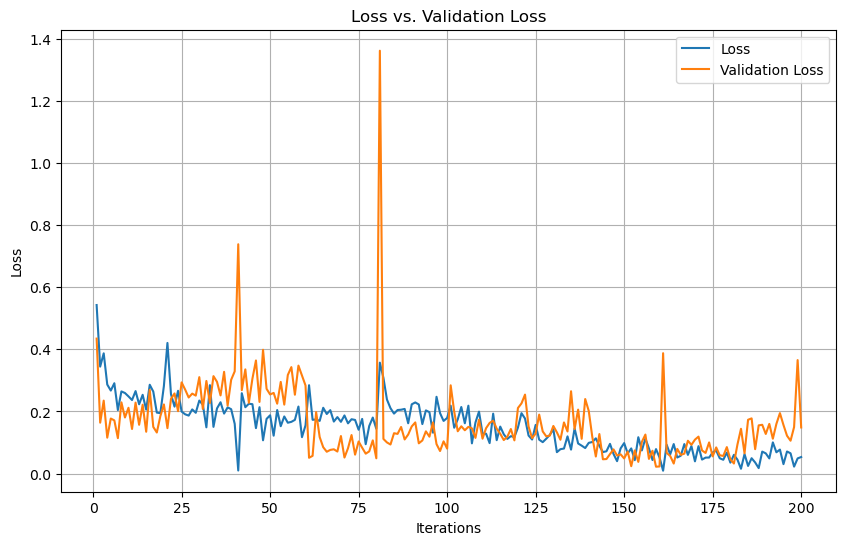

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

data = pd.read_excel("metrics.xlsx")


loss = data['loss']
val_loss = data['val_loss']


iterations = range(1, len(loss) + 1)

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(iterations, loss, label='Loss')
plt.plot(iterations, val_loss, label='Validation Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Loss vs. Validation Loss')
plt.legend()
plt.grid()
plt.show()


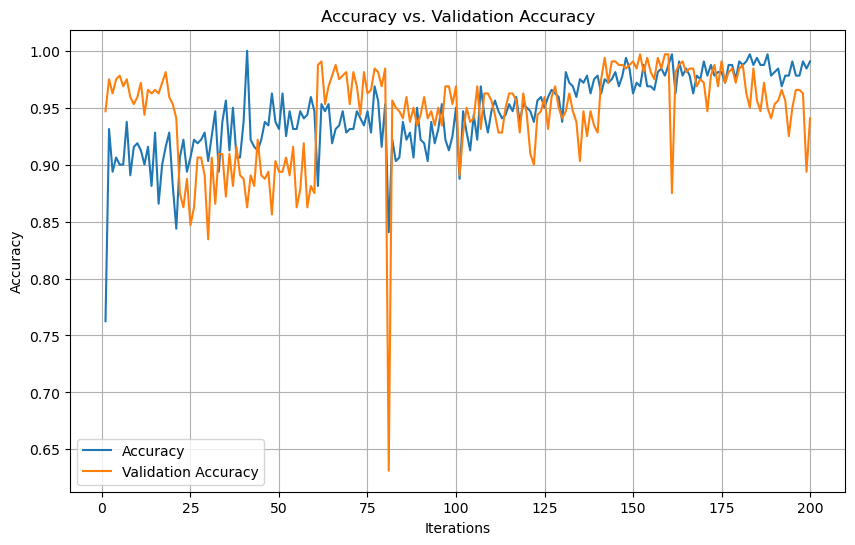

In [16]:
import pandas as pd
import matplotlib.pyplot as plt


data = pd.read_excel("metrics.xlsx")


accuracy = data['accuracy']
val_accuracy = data['val_accuracy']


iterations = range(1, len(accuracy) + 1)


plt.figure(figsize=(10, 6))
plt.plot(iterations, accuracy, label='Accuracy')
plt.plot(iterations, val_accuracy, label='Validation Accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Validation Accuracy')
plt.legend()
plt.grid()
plt.show()
